In [1]:
import SimpleITK as sitk
import numpy as np
import csv
import os
import pandas as pd
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def load_data(target):
    names=os.listdir(target)
    x=[]
    for i in names:
        path_target=os.path.join(target,i)
        path_image=os.listdir(path_target)
        for j in path_image:
            path_final=os.path.join(path_target,j)
            if path_final.endswith(".mhd"):
                x.append(path_final)
    return x

In [3]:
x=load_data("/media/atul/E0A277E1A277BA9C/data")

In [4]:
len(x)

888

In [5]:
def get_filename(case):
    for f in x:
        if case in f:
            return(f)

In [6]:
cand= pd.read_csv("candidates.csv")

In [7]:
ano= pd.read_csv("annotations.csv")

In [8]:
cand["file"] = cand["seriesuid"].apply(get_filename)
cand = cand.dropna()

In [9]:
cand["file"].value_counts()

/media/atul/E0A277E1A277BA9C/data/subset3/1.3.6.1.4.1.14519.5.2.1.6279.6001.339142594937666268384335506819.mhd    1468
/media/atul/E0A277E1A277BA9C/data/subset7/1.3.6.1.4.1.14519.5.2.1.6279.6001.174692377730646477496286081479.mhd    1425
/media/atul/E0A277E1A277BA9C/data/subset7/1.3.6.1.4.1.14519.5.2.1.6279.6001.279953669991076107785464313394.mhd    1414
/media/atul/E0A277E1A277BA9C/data/subset1/1.3.6.1.4.1.14519.5.2.1.6279.6001.113697708991260454310623082679.mhd    1408
/media/atul/E0A277E1A277BA9C/data/subset5/1.3.6.1.4.1.14519.5.2.1.6279.6001.258220324170977900491673635112.mhd    1400
/media/atul/E0A277E1A277BA9C/data/subset6/1.3.6.1.4.1.14519.5.2.1.6279.6001.168737928729363683423228050295.mhd    1394
/media/atul/E0A277E1A277BA9C/data/subset9/1.3.6.1.4.1.14519.5.2.1.6279.6001.138674679709964033277400089532.mhd    1370
/media/atul/E0A277E1A277BA9C/data/subset8/1.3.6.1.4.1.14519.5.2.1.6279.6001.241083615484551649610616348856.mhd    1351
/media/atul/E0A277E1A277BA9C/data/subset9/1.3.6.

ano["file"] = ano["seriesuid"].apply(get_filename)
ano = ano.dropna()

In [10]:
len(cand["seriesuid"].unique())

888

In [11]:
try:
    from tqdm import tqdm # long waits are not fun
except:
    print('TQDM does make much nicer wait bars...')
tqdm = lambda x: x

In [12]:
os.listdir()

['import and extract.ipynb',
 'images.npy',
 '.ipynb_checkpoints',
 'sampleSubmission.csv',
 'trainImages.npy',
 'PROCESSING_2.ipynb',
 'SimpleITKTutorial.pdf',
 'testMasks.npy',
 'mask.npy',
 's1.txt',
 'test.txt',
 'data_process',
 'trainMasks.npy',
 'data_all',
 'start_1.ipynb',
 'testImages.npy',
 'annotations.csv',
 'PROCESSING.ipynb',
 'r1.txt',
 'PROCESSING.py',
 'candidates.csv',
 'data_process1']

In [13]:
output_path="/home/atul/major/data_all/"

In [16]:
for fcount, img_file in enumerate(tqdm(x)):
    mini_df = cand[cand["file"]==img_file] #get all nodules associate with file
    if mini_df.shape[0]>0: # some files may not have a nodule--skipping those 
        # load the data once
        itk_img = sitk.ReadImage(img_file) 
        img_array = sitk.GetArrayFromImage(itk_img) # indexes are z,y,x (notice the ordering)
        num_z, height, width = img_array.shape        #heightXwidth constitute the transverse plane
        origin = np.array(itk_img.GetOrigin())      # x,y,z  Origin in world coordinates (mm)
        spacing = np.array(itk_img.GetSpacing())    # spacing of voxels in world coor. (mm)
        # go through all nodes (why just the biggest?)
        for node_idx, cur_row in mini_df.iterrows(): 
            print("images_%04d_%04d.npy" % (fcount, node_idx))
            if (cur_row["class"]==0)and(node_idx%100==0):           
                node_x = cur_row["coordX"]
                node_y = cur_row["coordY"]
                node_z = cur_row["coordZ"]
                diam = 25
                # just keep 3 slices
                imgs = np.ndarray([3,height,width],dtype=np.float32)
                masks = np.ndarray([3,height,width],dtype=np.uint8)
                center = np.array([node_x, node_y, node_z])   # nodule center
                v_center = np.rint((center-origin)/spacing)  # nodule center in voxel space (still x,y,z ordering)
                for i, i_z in enumerate(np.arange(int(v_center[2])-1,
                                 int(v_center[2])+2).clip(0, num_z-1)): # clip prevents going out of bounds in Z
                    mask,rg = make_mask(center, diam, i_z*spacing[2]+origin[2],
                                     width, height, spacing, origin)
                    masks[i] = mask
                    imgs[i] = img_array[i_z]    
            

                    print(rg)
                    print("images_%04d_%04d.npy" % (fcount, node_idx))
                    np.save(os.path.join(output_path,"0/pos_%04d_%04d.npy" % (fcount, node_idx)),rg)            
                    np.save(os.path.join(output_path,"0/images_%04d_%04d.npy" % (fcount, node_idx)),imgs)
                    np.save(os.path.join(output_path,"0/masks_%04d_%04d.npy" % (fcount, node_idx)),masks)
            if cur_row["class"]==1:
                node_x = cur_row["coordX"]
                node_y = cur_row["coordY"]
                node_z = cur_row["coordZ"]
                diam = 25
                # just keep 3 slices
                imgs = np.ndarray([3,height,width],dtype=np.float32)
                masks = np.ndarray([3,height,width],dtype=np.uint8)
                center = np.array([node_x, node_y, node_z])   # nodule center
                v_center = np.rint((center-origin)/spacing)  # nodule center in voxel space (still x,y,z ordering)
                for i, i_z in enumerate(np.arange(int(v_center[2])-1,
                                 int(v_center[2])+2).clip(0, num_z-1)): # clip prevents going out of bounds in Z
                    mask,rg = make_mask(center, diam, i_z*spacing[2]+origin[2],
                                     width, height, spacing, origin)
                    masks[i] = mask
                    imgs[i] = img_array[i_z]    
            
                    print(rg)
                    print("images_%04d_%04d.npy" % (fcount, node_idx))
                    np.save(os.path.join(output_path,"1/pos_%04d_%04d.npy" % (fcount, node_idx)),rg)            
                    np.save(os.path.join(output_path,"1/images_%04d_%04d.npy" % (fcount, node_idx)),imgs)
                    np.save(os.path.join(output_path,"1/masks_%04d_%04d.npy" % (fcount, node_idx)),masks)


images_0000_9310.npy
images_0000_9311.npy
images_0000_9312.npy
images_0000_9313.npy
images_0000_9314.npy
images_0000_9315.npy
images_0000_9316.npy
images_0000_9317.npy
images_0000_9318.npy
images_0000_9319.npy
images_0000_9320.npy
images_0000_9321.npy
images_0000_9322.npy
images_0000_9323.npy
images_0000_9324.npy
images_0000_9325.npy
images_0000_9326.npy
images_0000_9327.npy
images_0000_9328.npy
images_0000_9329.npy
images_0000_9330.npy
images_0000_9331.npy
images_0000_9332.npy
images_0000_9333.npy
images_0000_9334.npy
images_0000_9335.npy
images_0000_9336.npy
images_0000_9337.npy
images_0000_9338.npy
images_0000_9339.npy
images_0000_9340.npy
images_0000_9341.npy
images_0000_9342.npy
images_0000_9343.npy
images_0000_9344.npy
images_0000_9345.npy
images_0000_9346.npy
images_0000_9347.npy
images_0000_9348.npy
images_0000_9349.npy
images_0000_9350.npy
images_0000_9351.npy
images_0000_9352.npy
images_0000_9353.npy
images_0000_9354.npy
images_0000_9355.npy
images_0000_9356.npy
images_0000_9

[[ 68 153]
 [233 318]]
images_0000_9700.npy
[[ 68 153]
 [233 318]]
images_0000_9700.npy
images_0000_9701.npy
images_0000_9702.npy
images_0000_9703.npy
images_0000_9704.npy
images_0000_9705.npy
images_0000_9706.npy
images_0000_9707.npy
images_0000_9708.npy
images_0000_9709.npy
images_0000_9710.npy
images_0000_9711.npy
images_0000_9712.npy
images_0000_9713.npy
images_0000_9714.npy
images_0000_9715.npy
images_0000_9716.npy
images_0000_9717.npy
images_0000_9718.npy
images_0000_9719.npy
images_0000_9720.npy
images_0000_9721.npy
images_0000_9722.npy
images_0000_9723.npy
images_0000_9724.npy
images_0000_9725.npy
images_0000_9726.npy
images_0000_9727.npy
images_0000_9728.npy
images_0000_9729.npy
images_0000_9730.npy
images_0000_9731.npy
images_0000_9732.npy
images_0000_9733.npy
images_0000_9734.npy
images_0000_9735.npy
images_0000_9736.npy
images_0000_9737.npy
images_0000_9738.npy
images_0000_9739.npy
images_0000_9740.npy
images_0000_9741.npy
images_0000_9742.npy
images_0000_9743.npy
images_00

[[159 246]
 [141 228]]
images_0001_15100.npy
images_0001_15101.npy
images_0001_15102.npy
images_0001_15103.npy
images_0001_15104.npy
images_0001_15105.npy
images_0001_15106.npy
images_0001_15107.npy
images_0001_15108.npy
images_0001_15109.npy
images_0001_15110.npy
images_0001_15111.npy
images_0001_15112.npy
images_0001_15113.npy
images_0001_15114.npy
images_0001_15115.npy
images_0001_15116.npy
images_0001_15117.npy
images_0001_15118.npy
images_0001_15119.npy
images_0001_15120.npy
images_0001_15121.npy
images_0001_15122.npy
images_0001_15123.npy
images_0001_15124.npy
images_0001_15125.npy
images_0001_15126.npy
images_0001_15127.npy
images_0001_15128.npy
images_0001_15129.npy
images_0001_15130.npy
images_0001_15131.npy
images_0001_15132.npy
images_0001_15133.npy
images_0001_15134.npy
images_0001_15135.npy
images_0001_15136.npy
images_0001_15137.npy
images_0001_15138.npy
images_0001_15139.npy
images_0001_15140.npy
images_0001_15141.npy
images_0001_15142.npy
images_0001_15143.npy
images_00

[[353 440]
 [189 276]]
images_0001_15500.npy
[[353 440]
 [189 276]]
images_0001_15500.npy
images_0001_15501.npy
images_0001_15502.npy
images_0001_15503.npy
images_0001_15504.npy
images_0001_15505.npy
images_0001_15506.npy
images_0001_15507.npy
images_0001_15508.npy
images_0001_15509.npy
images_0001_15510.npy
images_0001_15511.npy
images_0001_15512.npy
images_0001_15513.npy
images_0001_15514.npy
images_0001_15515.npy
images_0001_15516.npy
images_0001_15517.npy
images_0001_15518.npy
images_0001_15519.npy
images_0001_15520.npy
images_0001_15521.npy
images_0001_15522.npy
images_0001_15523.npy
images_0001_15524.npy
images_0001_15525.npy
images_0001_15526.npy
images_0001_15527.npy
images_0001_15528.npy
images_0001_15529.npy
images_0001_15530.npy
images_0001_15531.npy
images_0001_15532.npy
images_0001_15533.npy
images_0001_15534.npy
images_0001_15535.npy
images_0001_15536.npy
images_0001_15537.npy
images_0001_15538.npy
images_0001_15539.npy
images_0001_15540.npy
images_0001_15541.npy
images_0

[[342 429]
 [246 333]]
images_0001_15900.npy
images_0001_15901.npy
images_0001_15902.npy
images_0001_15903.npy
images_0001_15904.npy
images_0001_15905.npy
images_0001_15906.npy
images_0001_15907.npy
images_0001_15908.npy
images_0001_15909.npy
images_0001_15910.npy
images_0001_15911.npy
images_0001_15912.npy
images_0001_15913.npy
images_0001_15914.npy
images_0001_15915.npy
images_0001_15916.npy
images_0001_15917.npy
images_0001_15918.npy
images_0001_15919.npy
images_0001_15920.npy
images_0001_15921.npy
images_0001_15922.npy
images_0001_15923.npy
images_0001_15924.npy
images_0001_15925.npy
images_0001_15926.npy
images_0001_15927.npy
images_0001_15928.npy
images_0001_15929.npy
images_0001_15930.npy
images_0001_15931.npy
images_0001_15932.npy
images_0001_15933.npy
images_0001_15934.npy
images_0001_15935.npy
images_0001_15936.npy
images_0001_15937.npy
images_0001_15938.npy
images_0001_15939.npy
images_0001_15940.npy
images_0001_15941.npy
images_0001_15942.npy
images_0001_15943.npy
images_00

[[367 478]
 [237 348]]
images_0002_16978.npy
[[367 478]
 [237 348]]
images_0002_16978.npy
images_0002_16979.npy
images_0002_16980.npy
images_0002_16981.npy
images_0002_16982.npy
images_0002_16983.npy
images_0002_16984.npy
images_0002_16985.npy
images_0002_16986.npy
images_0002_16987.npy
images_0002_16988.npy
images_0002_16989.npy
images_0002_16990.npy
images_0002_16991.npy
images_0002_16992.npy
images_0002_16993.npy
images_0002_16994.npy
images_0002_16995.npy
images_0002_16996.npy
images_0002_16997.npy
images_0002_16998.npy
images_0002_16999.npy
images_0002_17000.npy
[[ 91 202]
 [222 333]]
images_0002_17000.npy
[[ 91 202]
 [222 333]]
images_0002_17000.npy
[[ 91 202]
 [222 333]]
images_0002_17000.npy
images_0002_17001.npy
images_0002_17002.npy
images_0002_17003.npy
images_0002_17004.npy
images_0002_17005.npy
images_0002_17006.npy
images_0002_17007.npy
images_0002_17008.npy
images_0002_17009.npy
images_0002_17010.npy
images_0002_17011.npy
images_0002_17012.npy
images_0002_17013.npy
image

[[285 372]
 [241 328]]
images_0003_19900.npy
images_0003_19901.npy
images_0003_19902.npy
images_0003_19903.npy
images_0003_19904.npy
images_0003_19905.npy
images_0003_19906.npy
images_0003_19907.npy
images_0003_19908.npy
images_0003_19909.npy
images_0003_19910.npy
images_0003_19911.npy
images_0003_19912.npy
images_0003_19913.npy
images_0003_19914.npy
images_0003_19915.npy
images_0003_19916.npy
images_0003_19917.npy
images_0003_19918.npy
images_0003_19919.npy
images_0003_19920.npy
images_0003_19921.npy
images_0003_19922.npy
images_0003_19923.npy
images_0003_19924.npy
images_0003_19925.npy
images_0003_19926.npy
images_0003_19927.npy
images_0003_19928.npy
images_0003_19929.npy
images_0003_19930.npy
images_0003_19931.npy
images_0003_19932.npy
images_0003_19933.npy
images_0003_19934.npy
images_0003_19935.npy
images_0003_19936.npy
images_0003_19937.npy
images_0003_19938.npy
images_0003_19939.npy
images_0003_19940.npy
images_0003_19941.npy
images_0003_19942.npy
images_0003_19943.npy
images_00

[[322 437]
 [243 358]]
images_0004_529800.npy
[[322 437]
 [243 358]]
images_0004_529800.npy
images_0004_529801.npy
[[345 460]
 [110 225]]
images_0004_529801.npy
[[345 460]
 [110 225]]
images_0004_529801.npy
[[345 460]
 [110 225]]
images_0004_529801.npy
images_0004_529802.npy
images_0004_529803.npy
images_0004_529804.npy
images_0004_529805.npy
images_0004_529806.npy
images_0004_529807.npy
images_0004_529808.npy
images_0004_529809.npy
images_0004_529810.npy
images_0004_529811.npy
images_0004_529812.npy
images_0004_529813.npy
images_0004_529814.npy
images_0004_529815.npy
images_0004_529816.npy
images_0004_529817.npy
images_0004_529818.npy
images_0004_529819.npy
images_0004_529820.npy
images_0004_529821.npy
images_0004_529822.npy
images_0004_529823.npy
images_0004_529824.npy
images_0004_529825.npy
images_0004_529826.npy
images_0004_529827.npy
images_0004_529828.npy
images_0004_529829.npy
images_0004_529830.npy
images_0004_529831.npy
images_0004_529832.npy
images_0004_529833.npy
images_0004

[[119 234]
 [138 253]]
images_0004_530200.npy
[[119 234]
 [138 253]]
images_0004_530200.npy
images_0004_530201.npy
images_0004_530202.npy
images_0004_530203.npy
images_0004_530204.npy
images_0004_530205.npy
images_0004_530206.npy
images_0004_530207.npy
images_0004_530208.npy
images_0004_530209.npy
images_0004_530210.npy
images_0004_530211.npy
images_0004_530212.npy
images_0004_530213.npy
images_0004_530214.npy
images_0004_530215.npy
[[120 235]
 [ 72 187]]
images_0004_530215.npy
[[120 235]
 [ 72 187]]
images_0004_530215.npy
[[120 235]
 [ 72 187]]
images_0004_530215.npy
images_0004_530216.npy
images_0004_530217.npy
images_0004_530218.npy
images_0004_530219.npy
images_0004_530220.npy
images_0004_530221.npy
images_0004_530222.npy
images_0004_530223.npy
images_0004_530224.npy
images_0004_530225.npy
images_0004_530226.npy
images_0004_530227.npy
images_0004_530228.npy
images_0004_530229.npy
images_0004_530230.npy
images_0004_530231.npy
images_0004_530232.npy
images_0004_530233.npy
images_0004

[[131 216]
 [175 260]]
images_0005_531100.npy
[[131 216]
 [175 260]]
images_0005_531100.npy
[[131 216]
 [175 260]]
images_0005_531100.npy
images_0005_531101.npy
images_0005_531102.npy
images_0005_531103.npy
images_0005_531104.npy
images_0005_531105.npy
images_0005_531106.npy
images_0005_531107.npy
images_0005_531108.npy
images_0005_531109.npy
images_0005_531110.npy
images_0005_531111.npy
images_0005_531112.npy
images_0005_531113.npy
images_0005_531114.npy
images_0005_531115.npy
images_0005_531116.npy
images_0005_531117.npy
images_0005_531118.npy
images_0005_531119.npy
images_0005_531120.npy
images_0005_531121.npy
images_0005_531122.npy
images_0005_531123.npy
images_0005_531124.npy
images_0005_531125.npy
images_0005_531126.npy
images_0005_531127.npy
images_0005_531128.npy
images_0005_531129.npy
images_0005_531130.npy
images_0005_531131.npy
images_0005_531132.npy
images_0005_531133.npy
images_0005_531134.npy
images_0005_531135.npy
images_0005_531136.npy
images_0005_531137.npy
images_0005

[[269 354]
 [250 335]]
images_0005_531500.npy
[[269 354]
 [250 335]]
images_0005_531500.npy
[[269 354]
 [250 335]]
images_0005_531500.npy
images_0005_531501.npy
images_0005_531502.npy
images_0005_531503.npy
images_0005_531504.npy
images_0005_531505.npy
images_0005_531506.npy
images_0005_531507.npy
images_0005_531508.npy
images_0005_531509.npy
images_0005_531510.npy
images_0005_531511.npy
images_0005_531512.npy
images_0005_531513.npy
images_0005_531514.npy
images_0005_531515.npy
images_0005_531516.npy
images_0005_531517.npy
images_0005_531518.npy
images_0005_531519.npy
images_0005_531520.npy
images_0005_531521.npy
images_0005_531522.npy
images_0005_531523.npy
images_0005_531524.npy
images_0005_531525.npy
images_0005_531526.npy
images_0005_531527.npy
images_0005_531528.npy
images_0005_531529.npy
images_0005_531530.npy
images_0005_531531.npy
images_0005_531532.npy
images_0005_531533.npy
images_0005_531534.npy
images_0005_531535.npy
images_0005_531536.npy
images_0005_531537.npy
images_0005

[[ 66 169]
 [262 365]]
images_0006_546600.npy
[[ 66 169]
 [262 365]]
images_0006_546600.npy
images_0006_546601.npy
images_0006_546602.npy
images_0006_546603.npy
images_0006_546604.npy
images_0006_546605.npy
images_0006_546606.npy
images_0006_546607.npy
images_0006_546608.npy
images_0006_546609.npy
images_0006_546610.npy
images_0006_546611.npy
images_0006_546612.npy
images_0006_546613.npy
images_0006_546614.npy
images_0006_546615.npy
images_0006_546616.npy
images_0006_546617.npy
images_0006_546618.npy
images_0006_546619.npy
images_0006_546620.npy
images_0006_546621.npy
images_0006_546622.npy
images_0006_546623.npy
images_0006_546624.npy
images_0006_546625.npy
images_0006_546626.npy
images_0006_546627.npy
images_0006_546628.npy
images_0006_546629.npy
images_0006_546630.npy
images_0006_546631.npy
images_0006_546632.npy
images_0006_546633.npy
images_0006_546634.npy
images_0006_546635.npy
images_0006_546636.npy
images_0006_546637.npy
images_0006_546638.npy
images_0006_546639.npy
images_0006

[[332 435]
 [199 302]]
images_0006_547000.npy
[[332 435]
 [199 302]]
images_0006_547000.npy
images_0006_547001.npy
images_0006_547002.npy
images_0006_547003.npy
images_0006_547004.npy
images_0006_547005.npy
images_0006_547006.npy
images_0006_547007.npy
images_0006_547008.npy
images_0006_547009.npy
images_0006_547010.npy
images_0006_547011.npy
images_0006_547012.npy
images_0006_547013.npy
images_0006_547014.npy
images_0006_547015.npy
images_0006_547016.npy
images_0006_547017.npy
images_0006_547018.npy
images_0006_547019.npy
images_0006_547020.npy
images_0006_547021.npy
images_0006_547022.npy
images_0006_547023.npy
images_0006_547024.npy
images_0006_547025.npy
images_0006_547026.npy
images_0006_547027.npy
images_0006_547028.npy
images_0006_547029.npy
images_0006_547030.npy
images_0006_547031.npy
images_0006_547032.npy
images_0006_547033.npy
images_0006_547034.npy
images_0006_547035.npy
images_0006_547036.npy
images_0006_547037.npy
images_0006_547038.npy
images_0006_547039.npy
images_0006

[[248 351]
 [296 399]]
images_0006_547400.npy
[[248 351]
 [296 399]]
images_0006_547400.npy
images_0006_547401.npy
images_0006_547402.npy
images_0006_547403.npy
images_0006_547404.npy
images_0006_547405.npy
images_0006_547406.npy
images_0006_547407.npy
images_0006_547408.npy
images_0006_547409.npy
images_0006_547410.npy
images_0006_547411.npy
images_0006_547412.npy
images_0006_547413.npy
images_0006_547414.npy
images_0006_547415.npy
images_0006_547416.npy
images_0006_547417.npy
images_0006_547418.npy
images_0006_547419.npy
images_0006_547420.npy
images_0006_547421.npy
images_0006_547422.npy
images_0006_547423.npy
images_0006_547424.npy
images_0006_547425.npy
images_0006_547426.npy
images_0006_547427.npy
images_0006_547428.npy
images_0006_547429.npy
images_0006_547430.npy
images_0006_547431.npy
images_0006_547432.npy
images_0006_547433.npy
images_0006_547434.npy
images_0006_547435.npy
images_0006_547436.npy
images_0006_547437.npy
images_0006_547438.npy
images_0006_547439.npy
images_0006

[[ 62 157]
 [188 283]]
images_0007_548200.npy
[[ 62 157]
 [188 283]]
images_0007_548200.npy
[[ 62 157]
 [188 283]]
images_0007_548200.npy
images_0007_548201.npy
images_0007_548202.npy
images_0007_548203.npy
images_0007_548204.npy
images_0007_548205.npy
images_0007_548206.npy
images_0007_548207.npy
images_0007_548208.npy
images_0007_548209.npy
images_0007_548210.npy
images_0007_548211.npy
images_0007_548212.npy
images_0007_548213.npy
images_0007_548214.npy
images_0007_548215.npy
images_0007_548216.npy
images_0007_548217.npy
images_0007_548218.npy
images_0007_548219.npy
images_0007_548220.npy
images_0007_548221.npy
images_0007_548222.npy
images_0007_548223.npy
images_0007_548224.npy
images_0007_548225.npy
images_0007_548226.npy
images_0007_548227.npy
images_0007_548228.npy
images_0007_548229.npy
images_0007_548230.npy
images_0007_548231.npy
images_0007_548232.npy
images_0007_548233.npy
images_0007_548234.npy
images_0007_548235.npy
images_0007_548236.npy
images_0007_548237.npy
images_0007

images_0007_548565.npy
images_0007_548566.npy
images_0007_548567.npy
images_0007_548568.npy
images_0007_548569.npy
images_0007_548570.npy
images_0007_548571.npy
images_0007_548572.npy
images_0007_548573.npy
images_0007_548574.npy
images_0007_548575.npy
images_0007_548576.npy
images_0007_548577.npy
images_0007_548578.npy
images_0007_548579.npy
images_0007_548580.npy
images_0007_548581.npy
images_0007_548582.npy
images_0007_548583.npy
images_0007_548584.npy
images_0007_548585.npy
images_0007_548586.npy
images_0007_548587.npy
images_0007_548588.npy
images_0007_548589.npy
images_0007_548590.npy
images_0007_548591.npy
images_0007_548592.npy
images_0007_548593.npy
images_0007_548594.npy
images_0007_548595.npy
images_0007_548596.npy
images_0007_548597.npy
images_0007_548598.npy
images_0007_548599.npy
images_0007_548600.npy
[[344 439]
 [250 345]]
images_0007_548600.npy
[[344 439]
 [250 345]]
images_0007_548600.npy
[[344 439]
 [250 345]]
images_0007_548600.npy
images_0007_548601.npy
images_0007

[[259 344]
 [248 333]]
images_0008_408300.npy
images_0008_408301.npy
images_0008_408302.npy
images_0008_408303.npy
images_0008_408304.npy
images_0008_408305.npy
images_0008_408306.npy
images_0008_408307.npy
images_0008_408308.npy
images_0008_408309.npy
images_0008_408310.npy
images_0008_408311.npy
images_0008_408312.npy
images_0008_408313.npy
images_0008_408314.npy
images_0008_408315.npy
images_0008_408316.npy
images_0008_408317.npy
images_0008_408318.npy
images_0008_408319.npy
images_0008_408320.npy
images_0008_408321.npy
images_0008_408322.npy
images_0008_408323.npy
images_0008_408324.npy
images_0008_408325.npy
images_0008_408326.npy
images_0008_408327.npy
images_0008_408328.npy
images_0008_408329.npy
images_0008_408330.npy
images_0008_408331.npy
images_0008_408332.npy
images_0008_408333.npy
images_0008_408334.npy
images_0008_408335.npy
images_0008_408336.npy
images_0008_408337.npy
images_0008_408338.npy
images_0008_408339.npy
images_0008_408340.npy
images_0008_408341.npy
images_0008

[[270 355]
 [262 347]]
images_0008_408700.npy
[[270 355]
 [262 347]]
images_0008_408700.npy
images_0008_408701.npy
images_0008_408702.npy
images_0008_408703.npy
images_0008_408704.npy
images_0008_408705.npy
images_0008_408706.npy
images_0008_408707.npy
images_0008_408708.npy
images_0008_408709.npy
images_0008_408710.npy
images_0008_408711.npy
images_0008_408712.npy
images_0008_408713.npy
images_0008_408714.npy
images_0008_408715.npy
images_0008_408716.npy
images_0008_408717.npy
images_0008_408718.npy
images_0008_408719.npy
images_0008_408720.npy
images_0008_408721.npy
images_0008_408722.npy
images_0008_408723.npy
images_0008_408724.npy
images_0008_408725.npy
images_0008_408726.npy
images_0008_408727.npy
images_0008_408728.npy
images_0008_408729.npy
images_0008_408730.npy
images_0008_408731.npy
images_0008_408732.npy
images_0008_408733.npy
images_0008_408734.npy
images_0008_408735.npy
images_0008_408736.npy
images_0008_408737.npy
images_0008_408738.npy
images_0008_408739.npy
images_0008

[[150 243]
 [254 347]]
images_0009_411300.npy
[[150 243]
 [254 347]]
images_0009_411300.npy
images_0009_411301.npy
images_0009_411302.npy
images_0009_411303.npy
images_0009_411304.npy
images_0009_411305.npy
images_0009_411306.npy
images_0009_411307.npy
images_0009_411308.npy
images_0009_411309.npy
images_0009_411310.npy
images_0009_411311.npy
images_0009_411312.npy
images_0009_411313.npy
images_0009_411314.npy
images_0009_411315.npy
images_0009_411316.npy
images_0009_411317.npy
images_0009_411318.npy
images_0009_411319.npy
images_0009_411320.npy
images_0009_411321.npy
images_0009_411322.npy
images_0009_411323.npy
images_0009_411324.npy
images_0009_411325.npy
images_0009_411326.npy
images_0009_411327.npy
images_0009_411328.npy
images_0009_411329.npy
images_0009_411330.npy
images_0009_411331.npy
images_0009_411332.npy
images_0009_411333.npy
images_0009_411334.npy
images_0009_411335.npy
images_0009_411336.npy
images_0009_411337.npy
images_0009_411338.npy
images_0009_411339.npy
images_0009

[[263 356]
 [261 354]]
images_0009_411700.npy
[[263 356]
 [261 354]]
images_0009_411700.npy
images_0009_411701.npy
images_0009_411702.npy
images_0009_411703.npy
images_0009_411704.npy
images_0009_411705.npy
images_0009_411706.npy
images_0009_411707.npy
images_0009_411708.npy
images_0009_411709.npy
images_0009_411710.npy
images_0009_411711.npy
images_0009_411712.npy
images_0009_411713.npy
images_0009_411714.npy
images_0009_411715.npy
images_0009_411716.npy
images_0009_411717.npy
images_0009_411718.npy
images_0009_411719.npy
images_0009_411720.npy
images_0009_411721.npy
images_0009_411722.npy
images_0009_411723.npy
images_0009_411724.npy
images_0009_411725.npy
images_0009_411726.npy
images_0009_411727.npy
images_0009_411728.npy
images_0009_411729.npy
images_0009_411730.npy
images_0009_411731.npy
images_0009_411732.npy
images_0009_411733.npy
images_0009_411734.npy
images_0009_411735.npy
images_0009_411736.npy
images_0009_411737.npy
images_0009_411738.npy
images_0009_411739.npy
images_0009

[[316 409]
 [138 231]]
images_0009_412100.npy
[[316 409]
 [138 231]]
images_0009_412100.npy
[[316 409]
 [138 231]]
images_0009_412100.npy
images_0009_412101.npy
images_0009_412102.npy
images_0009_412103.npy
images_0009_412104.npy
images_0009_412105.npy
images_0009_412106.npy
images_0009_412107.npy
images_0009_412108.npy
images_0009_412109.npy
images_0009_412110.npy
images_0009_412111.npy
images_0009_412112.npy
images_0009_412113.npy
images_0009_412114.npy
images_0009_412115.npy
images_0009_412116.npy
images_0009_412117.npy
images_0009_412118.npy
images_0009_412119.npy
images_0009_412120.npy
images_0009_412121.npy
images_0009_412122.npy
images_0009_412123.npy
images_0009_412124.npy
images_0009_412125.npy
images_0009_412126.npy
images_0009_412127.npy
images_0009_412128.npy
images_0009_412129.npy
images_0009_412130.npy
images_0009_412131.npy
images_0009_412132.npy
images_0009_412133.npy
images_0009_412134.npy
images_0009_412135.npy
images_0009_412136.npy
images_0009_412137.npy
images_0009

[[334 419]
 [221 306]]
images_0010_431100.npy
images_0010_431101.npy
images_0010_431102.npy
images_0010_431103.npy
images_0010_431104.npy
images_0010_431105.npy
images_0010_431106.npy
images_0010_431107.npy
images_0010_431108.npy
images_0010_431109.npy
images_0010_431110.npy
images_0010_431111.npy
images_0010_431112.npy
images_0010_431113.npy
images_0010_431114.npy
images_0010_431115.npy
images_0010_431116.npy
images_0010_431117.npy
images_0010_431118.npy
images_0010_431119.npy
images_0010_431120.npy
images_0010_431121.npy
images_0010_431122.npy
images_0010_431123.npy
images_0010_431124.npy
images_0010_431125.npy
images_0010_431126.npy
images_0010_431127.npy
images_0010_431128.npy
images_0010_431129.npy
images_0010_431130.npy
images_0010_431131.npy
images_0010_431132.npy
images_0010_431133.npy
images_0010_431134.npy
images_0010_431135.npy
images_0010_431136.npy
images_0010_431137.npy
images_0010_431138.npy
images_0010_431139.npy
images_0010_431140.npy
images_0010_431141.npy
images_0010

images_0011_431480.npy
images_0011_431481.npy
images_0011_431482.npy
images_0011_431483.npy
images_0011_431484.npy
images_0011_431485.npy
images_0011_431486.npy
images_0011_431487.npy
images_0011_431488.npy
images_0011_431489.npy
images_0011_431490.npy
images_0011_431491.npy
images_0011_431492.npy
images_0011_431493.npy
images_0011_431494.npy
images_0011_431495.npy
images_0011_431496.npy
images_0011_431497.npy
images_0011_431498.npy
images_0011_431499.npy
images_0011_431500.npy
[[112 197]
 [254 339]]
images_0011_431500.npy
[[112 197]
 [254 339]]
images_0011_431500.npy
[[112 197]
 [254 339]]
images_0011_431500.npy
images_0011_431501.npy
images_0011_431502.npy
images_0011_431503.npy
images_0011_431504.npy
images_0011_431505.npy
images_0011_431506.npy
images_0011_431507.npy
images_0011_431508.npy
images_0011_431509.npy
images_0011_431510.npy
images_0011_431511.npy
images_0011_431512.npy
images_0011_431513.npy
images_0011_431514.npy
images_0011_431515.npy
images_0011_431516.npy
images_0011

[[152 237]
 [274 359]]
images_0011_431900.npy
[[152 237]
 [274 359]]
images_0011_431900.npy
images_0011_431901.npy
images_0011_431902.npy
images_0011_431903.npy
images_0011_431904.npy
images_0011_431905.npy
images_0011_431906.npy
images_0011_431907.npy
images_0011_431908.npy
images_0011_431909.npy
images_0011_431910.npy
images_0011_431911.npy
images_0011_431912.npy
images_0011_431913.npy
images_0011_431914.npy
images_0011_431915.npy
images_0011_431916.npy
images_0011_431917.npy
images_0011_431918.npy
images_0011_431919.npy
images_0011_431920.npy
images_0011_431921.npy
images_0011_431922.npy
images_0011_431923.npy
images_0011_431924.npy
images_0011_431925.npy
images_0011_431926.npy
images_0011_431927.npy
images_0011_431928.npy
images_0011_431929.npy
images_0011_431930.npy
images_0011_431931.npy
images_0011_431932.npy
images_0011_431933.npy
images_0011_431934.npy
images_0011_431935.npy
images_0011_431936.npy
images_0011_431937.npy
images_0011_431938.npy
images_0011_431939.npy
images_0011

[[291 382]
 [331 422]]
images_0012_356300.npy
images_0012_356301.npy
images_0012_356302.npy
images_0012_356303.npy
images_0012_356304.npy
images_0012_356305.npy
images_0012_356306.npy
images_0012_356307.npy
images_0012_356308.npy
images_0012_356309.npy
images_0012_356310.npy
images_0012_356311.npy
images_0012_356312.npy
images_0012_356313.npy
images_0012_356314.npy
images_0012_356315.npy
images_0012_356316.npy
images_0012_356317.npy
images_0012_356318.npy
images_0012_356319.npy
images_0012_356320.npy
images_0012_356321.npy
images_0012_356322.npy
images_0012_356323.npy
images_0012_356324.npy
images_0012_356325.npy
images_0012_356326.npy
images_0012_356327.npy
images_0012_356328.npy
images_0012_356329.npy
images_0012_356330.npy
images_0012_356331.npy
images_0012_356332.npy
images_0012_356333.npy
images_0012_356334.npy
images_0012_356335.npy
images_0012_356336.npy
images_0012_356337.npy
images_0012_356338.npy
images_0012_356339.npy
images_0012_356340.npy
images_0012_356341.npy
images_0012

images_0013_358701.npy
images_0013_358702.npy
images_0013_358703.npy
images_0013_358704.npy
images_0013_358705.npy
images_0013_358706.npy
images_0013_358707.npy
images_0013_358708.npy
images_0013_358709.npy
images_0013_358710.npy
images_0013_358711.npy
images_0013_358712.npy
images_0013_358713.npy
images_0013_358714.npy
images_0013_358715.npy
images_0013_358716.npy
images_0013_358717.npy
images_0013_358718.npy
images_0013_358719.npy
images_0013_358720.npy
images_0013_358721.npy
images_0013_358722.npy
images_0013_358723.npy
images_0013_358724.npy
images_0013_358725.npy
images_0013_358726.npy
images_0013_358727.npy
images_0013_358728.npy
images_0013_358729.npy
images_0013_358730.npy
images_0013_358731.npy
images_0013_358732.npy
images_0013_358733.npy
images_0013_358734.npy
images_0013_358735.npy
images_0013_358736.npy
images_0013_358737.npy
images_0013_358738.npy
images_0013_358739.npy
images_0013_358740.npy
images_0013_358741.npy
images_0013_358742.npy
images_0013_358743.npy
images_0013

[[362 449]
 [276 363]]
images_0013_359092.npy
[[362 449]
 [276 363]]
images_0013_359092.npy
images_0013_359093.npy
images_0013_359094.npy
images_0013_359095.npy
images_0013_359096.npy
images_0013_359097.npy
images_0013_359098.npy
images_0013_359099.npy
images_0013_359100.npy
[[296 383]
 [117 204]]
images_0013_359100.npy
[[296 383]
 [117 204]]
images_0013_359100.npy
[[296 383]
 [117 204]]
images_0013_359100.npy
images_0013_359101.npy
images_0013_359102.npy
images_0013_359103.npy
images_0013_359104.npy
images_0013_359105.npy
images_0013_359106.npy
images_0013_359107.npy
images_0013_359108.npy
images_0013_359109.npy
images_0013_359110.npy
images_0013_359111.npy
images_0013_359112.npy
images_0013_359113.npy
images_0013_359114.npy
images_0013_359115.npy
images_0013_359116.npy
images_0013_359117.npy
images_0013_359118.npy
images_0013_359119.npy
images_0013_359120.npy
images_0013_359121.npy
images_0013_359122.npy
images_0013_359123.npy
images_0013_359124.npy
images_0013_359125.npy
images_0013

[[276 369]
 [ 72 165]]
images_0014_361100.npy
[[276 369]
 [ 72 165]]
images_0014_361100.npy
[[276 369]
 [ 72 165]]
images_0014_361100.npy
images_0014_361101.npy
images_0014_361102.npy
images_0014_361103.npy
images_0014_361104.npy
images_0014_361105.npy
images_0014_361106.npy
images_0014_361107.npy
images_0014_361108.npy
images_0014_361109.npy
images_0014_361110.npy
images_0014_361111.npy
images_0014_361112.npy
images_0014_361113.npy
images_0014_361114.npy
images_0014_361115.npy
images_0014_361116.npy
images_0014_361117.npy
images_0014_361118.npy
images_0014_361119.npy
images_0014_361120.npy
images_0014_361121.npy
images_0014_361122.npy
images_0014_361123.npy
images_0014_361124.npy
images_0014_361125.npy
images_0014_361126.npy
images_0014_361127.npy
images_0014_361128.npy
images_0014_361129.npy
images_0014_361130.npy
images_0014_361131.npy
images_0014_361132.npy
images_0014_361133.npy
images_0014_361134.npy
images_0014_361135.npy
images_0014_361136.npy
images_0014_361137.npy
images_0014

[[140 233]
 [347 440]]
images_0014_361500.npy
[[140 233]
 [347 440]]
images_0014_361500.npy
images_0014_361501.npy
images_0014_361502.npy
images_0014_361503.npy
images_0014_361504.npy
images_0014_361505.npy
images_0014_361506.npy
images_0014_361507.npy
images_0014_361508.npy
images_0014_361509.npy
images_0014_361510.npy
images_0014_361511.npy
images_0014_361512.npy
images_0014_361513.npy
images_0014_361514.npy
images_0014_361515.npy
images_0014_361516.npy
images_0014_361517.npy
images_0014_361518.npy
images_0014_361519.npy
images_0014_361520.npy
images_0014_361521.npy
images_0014_361522.npy
images_0014_361523.npy
images_0014_361524.npy
images_0014_361525.npy
images_0014_361526.npy
images_0014_361527.npy
images_0014_361528.npy
images_0014_361529.npy
images_0014_361530.npy
images_0014_361531.npy
images_0014_361532.npy
images_0014_361533.npy
images_0014_361534.npy
images_0014_361535.npy
images_0014_361536.npy
images_0014_361537.npy
images_0014_361538.npy
images_0014_361539.npy
images_0014

[[133 224]
 [219 310]]
images_0015_373200.npy
images_0015_373201.npy
images_0015_373202.npy
images_0015_373203.npy
images_0015_373204.npy
images_0015_373205.npy
images_0015_373206.npy
images_0015_373207.npy
images_0015_373208.npy
images_0015_373209.npy
images_0015_373210.npy
images_0015_373211.npy
images_0015_373212.npy
images_0015_373213.npy
images_0015_373214.npy
images_0015_373215.npy
images_0015_373216.npy
images_0015_373217.npy
images_0015_373218.npy
images_0015_373219.npy
images_0015_373220.npy
images_0015_373221.npy
images_0015_373222.npy
images_0015_373223.npy
images_0015_373224.npy
images_0015_373225.npy
images_0015_373226.npy
images_0015_373227.npy
images_0015_373228.npy
images_0015_373229.npy
images_0015_373230.npy
images_0015_373231.npy
images_0015_373232.npy
images_0015_373233.npy
images_0015_373234.npy
images_0015_373235.npy
images_0015_373236.npy
images_0015_373237.npy
images_0015_373238.npy
images_0015_373239.npy
images_0015_373240.npy
images_0015_373241.npy
images_0015

[[119 210]
 [174 265]]
images_0015_373600.npy
[[119 210]
 [174 265]]
images_0015_373600.npy
[[119 210]
 [174 265]]
images_0015_373600.npy
images_0015_373601.npy
images_0015_373602.npy
images_0015_373603.npy
images_0015_373604.npy
images_0015_373605.npy
images_0015_373606.npy
images_0015_373607.npy
images_0015_373608.npy
images_0015_373609.npy
images_0015_373610.npy
images_0015_373611.npy
images_0015_373612.npy
images_0015_373613.npy
images_0015_373614.npy
images_0015_373615.npy
images_0015_373616.npy
images_0015_373617.npy
images_0015_373618.npy
images_0015_373619.npy
images_0015_373620.npy
images_0015_373621.npy
images_0015_373622.npy
images_0015_373623.npy
images_0015_373624.npy
images_0015_373625.npy
images_0015_373626.npy
images_0015_373627.npy
images_0015_373628.npy
images_0015_373629.npy
images_0015_373630.npy
images_0015_373631.npy
images_0015_373632.npy
images_0015_373633.npy
images_0015_373634.npy
images_0015_373635.npy
images_0015_373636.npy
images_0015_373637.npy
images_0015

[[ 42 147]
 [298 403]]
images_0016_374000.npy
[[ 42 147]
 [298 403]]
images_0016_374000.npy
images_0016_374001.npy
images_0016_374002.npy
images_0016_374003.npy
images_0016_374004.npy
images_0016_374005.npy
images_0016_374006.npy
images_0016_374007.npy
images_0016_374008.npy
images_0016_374009.npy
images_0016_374010.npy
images_0016_374011.npy
images_0016_374012.npy
images_0016_374013.npy
images_0016_374014.npy
images_0016_374015.npy
images_0016_374016.npy
images_0016_374017.npy
images_0016_374018.npy
images_0016_374019.npy
images_0016_374020.npy
images_0016_374021.npy
images_0016_374022.npy
images_0016_374023.npy
images_0016_374024.npy
images_0016_374025.npy
images_0016_374026.npy
images_0016_374027.npy
images_0016_374028.npy
images_0016_374029.npy
images_0016_374030.npy
images_0016_374031.npy
images_0016_374032.npy
images_0016_374033.npy
images_0016_374034.npy
images_0016_374035.npy
images_0016_374036.npy
images_0016_374037.npy
images_0016_374038.npy
images_0016_374039.npy
images_0016

[[298 377]
 [299 378]]
images_0017_375700.npy
[[298 377]
 [299 378]]
images_0017_375700.npy
images_0017_375701.npy
images_0017_375702.npy
images_0017_375703.npy
images_0017_375704.npy
images_0017_375705.npy
images_0017_375706.npy
images_0017_375707.npy
images_0017_375708.npy
images_0017_375709.npy
images_0017_375710.npy
images_0017_375711.npy
images_0017_375712.npy
images_0017_375713.npy
images_0017_375714.npy
images_0017_375715.npy
images_0017_375716.npy
images_0017_375717.npy
images_0017_375718.npy
images_0017_375719.npy
images_0017_375720.npy
images_0017_375721.npy
images_0017_375722.npy
images_0017_375723.npy
images_0017_375724.npy
images_0017_375725.npy
images_0017_375726.npy
images_0017_375727.npy
images_0017_375728.npy
images_0017_375729.npy
images_0017_375730.npy
images_0017_375731.npy
images_0017_375732.npy
images_0017_375733.npy
images_0017_375734.npy
images_0017_375735.npy
images_0017_375736.npy
images_0017_375737.npy
images_0017_375738.npy
images_0017_375739.npy
images_0017

[[ 87 166]
 [298 377]]
images_0017_376100.npy
images_0017_376101.npy
images_0017_376102.npy
images_0017_376103.npy
images_0017_376104.npy
images_0017_376105.npy
images_0017_376106.npy
images_0017_376107.npy
images_0017_376108.npy
images_0017_376109.npy
images_0017_376110.npy
images_0017_376111.npy
images_0017_376112.npy
images_0017_376113.npy
images_0017_376114.npy
images_0017_376115.npy
images_0017_376116.npy
images_0017_376117.npy
images_0017_376118.npy
images_0017_376119.npy
images_0017_376120.npy
images_0017_376121.npy
images_0017_376122.npy
images_0017_376123.npy
images_0017_376124.npy
images_0017_376125.npy
images_0017_376126.npy
images_0017_376127.npy
images_0017_376128.npy
images_0017_376129.npy
images_0017_376130.npy
images_0017_376131.npy
images_0017_376132.npy
images_0017_376133.npy
images_0017_376134.npy
images_0017_376135.npy
images_0017_376136.npy
images_0017_376137.npy
images_0017_376138.npy
images_0017_376139.npy
images_0017_376140.npy
images_0017_376141.npy
images_0017

[[317 408]
 [290 381]]
images_0018_378700.npy
images_0018_378701.npy
images_0018_378702.npy
images_0018_378703.npy
images_0018_378704.npy
images_0018_378705.npy
images_0018_378706.npy
images_0018_378707.npy
images_0018_378708.npy
images_0018_378709.npy
images_0018_378710.npy
images_0018_378711.npy
images_0018_378712.npy
images_0018_378713.npy
images_0018_378714.npy
images_0018_378715.npy
images_0018_378716.npy
images_0018_378717.npy
images_0018_378718.npy
images_0018_378719.npy
images_0018_378720.npy
images_0018_378721.npy
images_0018_378722.npy
images_0018_378723.npy
images_0018_378724.npy
images_0018_378725.npy
images_0018_378726.npy
images_0018_378727.npy
images_0018_378728.npy
images_0018_378729.npy
images_0018_378730.npy
images_0018_378731.npy
images_0018_378732.npy
images_0018_378733.npy
images_0018_378734.npy
images_0018_378735.npy
images_0018_378736.npy
images_0018_378737.npy
images_0018_378738.npy
images_0018_378739.npy
images_0018_378740.npy
images_0018_378741.npy
images_0018

[[ 73 164]
 [170 261]]
images_0018_379100.npy
[[ 73 164]
 [170 261]]
images_0018_379100.npy
images_0018_379101.npy
images_0018_379102.npy
images_0018_379103.npy
images_0018_379104.npy
images_0018_379105.npy
images_0018_379106.npy
images_0018_379107.npy
images_0018_379108.npy
images_0018_379109.npy
images_0018_379110.npy
images_0018_379111.npy
images_0018_379112.npy
images_0018_379113.npy
images_0018_379114.npy
images_0018_379115.npy
images_0018_379116.npy
images_0018_379117.npy
images_0018_379118.npy
images_0018_379119.npy
images_0018_379120.npy
images_0018_379121.npy
images_0018_379122.npy
images_0018_379123.npy
images_0018_379124.npy
images_0018_379125.npy
images_0018_379126.npy
images_0018_379127.npy
images_0018_379128.npy
images_0018_379129.npy
images_0018_379130.npy
images_0018_379131.npy
images_0018_379132.npy
images_0018_379133.npy
images_0018_379134.npy
images_0018_379135.npy
images_0018_379136.npy
images_0018_379137.npy
images_0018_379138.npy
images_0018_379139.npy
images_0018

[[ 55 146]
 [222 313]]
images_0018_379500.npy
images_0018_379501.npy
images_0018_379502.npy
images_0018_379503.npy
images_0018_379504.npy
images_0018_379505.npy
images_0018_379506.npy
images_0018_379507.npy
images_0018_379508.npy
images_0018_379509.npy
images_0018_379510.npy
images_0018_379511.npy
images_0018_379512.npy
images_0018_379513.npy
images_0018_379514.npy
images_0018_379515.npy
images_0018_379516.npy
images_0018_379517.npy
images_0018_379518.npy
images_0018_379519.npy
images_0018_379520.npy
images_0018_379521.npy
images_0018_379522.npy
images_0018_379523.npy
images_0018_379524.npy
images_0018_379525.npy
images_0018_379526.npy
images_0018_379527.npy
images_0018_379528.npy
images_0018_379529.npy
images_0018_379530.npy
images_0018_379531.npy
images_0018_379532.npy
images_0018_379533.npy
images_0018_379534.npy
images_0018_379535.npy
images_0018_379536.npy
images_0019_379537.npy
images_0019_379538.npy
images_0019_379539.npy
images_0019_379540.npy
images_0019_379541.npy
images_0019

[[ 96 181]
 [333 418]]
images_0019_379900.npy
images_0019_379901.npy
images_0019_379902.npy
images_0019_379903.npy
images_0019_379904.npy
images_0019_379905.npy
images_0019_379906.npy
images_0019_379907.npy
images_0019_379908.npy
images_0019_379909.npy
images_0019_379910.npy
images_0019_379911.npy
images_0019_379912.npy
images_0019_379913.npy
images_0019_379914.npy
images_0019_379915.npy
images_0019_379916.npy
images_0019_379917.npy
images_0019_379918.npy
images_0019_379919.npy
images_0019_379920.npy
images_0019_379921.npy
images_0019_379922.npy
images_0019_379923.npy
images_0019_379924.npy
images_0019_379925.npy
images_0019_379926.npy
images_0019_379927.npy
images_0019_379928.npy
images_0019_379929.npy
images_0019_379930.npy
images_0019_379931.npy
images_0019_379932.npy
images_0019_379933.npy
images_0019_379934.npy
images_0019_379935.npy
images_0019_379936.npy
images_0019_379937.npy
images_0019_379938.npy
images_0019_379939.npy
images_0019_379940.npy
images_0019_379941.npy
images_0019

images_0020_380566.npy
images_0020_380567.npy
images_0020_380568.npy
images_0020_380569.npy
images_0020_380570.npy
images_0020_380571.npy
images_0020_380572.npy
images_0020_380573.npy
images_0020_380574.npy
images_0020_380575.npy
images_0020_380576.npy
images_0020_380577.npy
images_0020_380578.npy
images_0020_380579.npy
images_0020_380580.npy
images_0020_380581.npy
images_0020_380582.npy
images_0020_380583.npy
images_0020_380584.npy
images_0020_380585.npy
images_0020_380586.npy
images_0020_380587.npy
images_0020_380588.npy
images_0020_380589.npy
images_0020_380590.npy
images_0020_380591.npy
images_0020_380592.npy
images_0020_380593.npy
images_0020_380594.npy
images_0020_380595.npy
images_0020_380596.npy
images_0020_380597.npy
images_0020_380598.npy
images_0020_380599.npy
images_0020_380600.npy
[[159 250]
 [268 359]]
images_0020_380600.npy
[[159 250]
 [268 359]]
images_0020_380600.npy
[[159 250]
 [268 359]]
images_0020_380600.npy
images_0020_380601.npy
images_0020_380602.npy
images_0020

[[291 382]
 [212 303]]
images_0020_380900.npy
images_0020_380901.npy
images_0020_380902.npy
images_0020_380903.npy
images_0020_380904.npy
images_0020_380905.npy
images_0020_380906.npy
images_0020_380907.npy
images_0020_380908.npy
images_0020_380909.npy
images_0020_380910.npy
images_0020_380911.npy
images_0020_380912.npy
images_0020_380913.npy
images_0020_380914.npy
images_0020_380915.npy
images_0020_380916.npy
images_0020_380917.npy
images_0020_380918.npy
images_0020_380919.npy
images_0020_380920.npy
images_0020_380921.npy
images_0020_380922.npy
images_0020_380923.npy
images_0020_380924.npy
images_0020_380925.npy
images_0020_380926.npy
images_0020_380927.npy
images_0020_380928.npy
images_0020_380929.npy
images_0020_380930.npy
images_0020_380931.npy
images_0020_380932.npy
images_0020_380933.npy
images_0020_380934.npy
images_0020_380935.npy
images_0020_380936.npy
images_0020_380937.npy
images_0020_380938.npy
images_0020_380939.npy
images_0020_380940.npy
images_0020_380941.npy
images_0020

[[ 76 167]
 [241 332]]
images_0020_381237.npy
images_0020_381238.npy
images_0020_381239.npy
images_0020_381240.npy
images_0020_381241.npy
images_0020_381242.npy
images_0020_381243.npy
images_0020_381244.npy
images_0020_381245.npy
images_0020_381246.npy
images_0020_381247.npy
images_0020_381248.npy
images_0020_381249.npy
images_0020_381250.npy
images_0020_381251.npy
images_0020_381252.npy
images_0020_381253.npy
images_0020_381254.npy
images_0020_381255.npy
images_0020_381256.npy
images_0020_381257.npy
images_0020_381258.npy
images_0020_381259.npy
images_0020_381260.npy
images_0020_381261.npy
images_0020_381262.npy
images_0020_381263.npy
images_0020_381264.npy
images_0020_381265.npy
images_0020_381266.npy
images_0020_381267.npy
images_0020_381268.npy
images_0020_381269.npy
images_0020_381270.npy
images_0020_381271.npy
images_0020_381272.npy
images_0020_381273.npy
images_0020_381274.npy
images_0020_381275.npy
images_0020_381276.npy
images_0020_381277.npy
images_0020_381278.npy
images_0020

[[131 232]
 [228 329]]
images_0021_386800.npy
[[131 232]
 [228 329]]
images_0021_386800.npy
[[131 232]
 [228 329]]
images_0021_386800.npy
images_0021_386801.npy
images_0021_386802.npy
images_0021_386803.npy
images_0021_386804.npy
images_0021_386805.npy
images_0021_386806.npy
images_0021_386807.npy
images_0021_386808.npy
images_0021_386809.npy
images_0021_386810.npy
images_0021_386811.npy
images_0021_386812.npy
images_0021_386813.npy
images_0021_386814.npy
images_0021_386815.npy
images_0021_386816.npy
images_0021_386817.npy
images_0021_386818.npy
images_0021_386819.npy
images_0021_386820.npy
images_0021_386821.npy
images_0021_386822.npy
images_0021_386823.npy
images_0021_386824.npy
images_0021_386825.npy
images_0021_386826.npy
images_0021_386827.npy
images_0021_386828.npy
images_0021_386829.npy
images_0021_386830.npy
images_0021_386831.npy
images_0021_386832.npy
images_0021_386833.npy
images_0021_386834.npy
images_0021_386835.npy
images_0021_386836.npy
images_0021_386837.npy
images_0021

images_0022_391436.npy
images_0022_391437.npy
images_0022_391438.npy
images_0022_391439.npy
images_0022_391440.npy
images_0022_391441.npy
images_0022_391442.npy
images_0022_391443.npy
images_0022_391444.npy
images_0022_391445.npy
images_0022_391446.npy
images_0022_391447.npy
images_0022_391448.npy
images_0022_391449.npy
images_0022_391450.npy
images_0022_391451.npy
images_0022_391452.npy
images_0022_391453.npy
images_0022_391454.npy
images_0022_391455.npy
images_0022_391456.npy
images_0022_391457.npy
images_0022_391458.npy
images_0022_391459.npy
images_0022_391460.npy
images_0022_391461.npy
images_0022_391462.npy
images_0022_391463.npy
images_0022_391464.npy
images_0022_391465.npy
images_0022_391466.npy
images_0022_391467.npy
images_0022_391468.npy
images_0022_391469.npy
images_0022_391470.npy
images_0022_391471.npy
images_0022_391472.npy
images_0022_391473.npy
images_0022_391474.npy
images_0022_391475.npy
images_0022_391476.npy
images_0022_391477.npy
images_0022_391478.npy
images_0022

[[306 397]
 [315 406]]
images_0022_391800.npy
[[306 397]
 [315 406]]
images_0022_391800.npy
images_0022_391801.npy
images_0022_391802.npy
images_0022_391803.npy
images_0022_391804.npy
images_0022_391805.npy
images_0022_391806.npy
images_0022_391807.npy
images_0022_391808.npy
images_0022_391809.npy
images_0022_391810.npy
images_0022_391811.npy
images_0022_391812.npy
images_0022_391813.npy
images_0022_391814.npy
images_0022_391815.npy
images_0022_391816.npy
images_0022_391817.npy
images_0022_391818.npy
images_0022_391819.npy
images_0022_391820.npy
images_0022_391821.npy
images_0022_391822.npy
images_0022_391823.npy
images_0022_391824.npy
images_0022_391825.npy
images_0022_391826.npy
images_0022_391827.npy
images_0022_391828.npy
images_0022_391829.npy
images_0022_391830.npy
images_0022_391831.npy
images_0022_391832.npy
images_0022_391833.npy
images_0022_391834.npy
images_0022_391835.npy
images_0022_391836.npy
images_0022_391837.npy
images_0022_391838.npy
images_0022_391839.npy
images_0022

[[ 87 190]
 [304 407]]
images_0023_394585.npy
[[ 87 190]
 [304 407]]
images_0023_394585.npy
images_0023_394586.npy
images_0023_394587.npy
images_0023_394588.npy
images_0023_394589.npy
images_0023_394590.npy
images_0023_394591.npy
images_0023_394592.npy
images_0023_394593.npy
images_0023_394594.npy
images_0023_394595.npy
images_0023_394596.npy
images_0023_394597.npy
images_0023_394598.npy
images_0023_394599.npy
images_0023_394600.npy
[[260 363]
 [212 315]]
images_0023_394600.npy
[[260 363]
 [212 315]]
images_0023_394600.npy
[[260 363]
 [212 315]]
images_0023_394600.npy
images_0023_394601.npy
images_0023_394602.npy
images_0023_394603.npy
images_0023_394604.npy
images_0023_394605.npy
images_0023_394606.npy
images_0023_394607.npy
images_0023_394608.npy
images_0023_394609.npy
images_0023_394610.npy
images_0023_394611.npy
images_0023_394612.npy
images_0023_394613.npy
images_0023_394614.npy
images_0023_394615.npy
images_0023_394616.npy
images_0023_394617.npy
images_0023_394618.npy
images_0023

[[124 225]
 [196 297]]
images_0024_39400.npy
images_0024_39401.npy
images_0024_39402.npy
images_0024_39403.npy
images_0024_39404.npy
images_0024_39405.npy
images_0024_39406.npy
images_0024_39407.npy
images_0024_39408.npy
images_0024_39409.npy
images_0024_39410.npy
images_0024_39411.npy
images_0024_39412.npy
images_0024_39413.npy
images_0024_39414.npy
images_0024_39415.npy
images_0024_39416.npy
images_0024_39417.npy
images_0024_39418.npy
images_0024_39419.npy
images_0024_39420.npy
images_0024_39421.npy
images_0024_39422.npy
images_0024_39423.npy
images_0024_39424.npy
images_0024_39425.npy
images_0024_39426.npy
images_0024_39427.npy
images_0024_39428.npy
images_0024_39429.npy
images_0024_39430.npy
images_0024_39431.npy
images_0024_39432.npy
images_0024_39433.npy
images_0024_39434.npy
images_0024_39435.npy
images_0024_39436.npy
images_0024_39437.npy
images_0024_39438.npy
images_0024_39439.npy
images_0024_39440.npy
images_0024_39441.npy
images_0024_39442.npy
images_0024_39443.npy
images_00

[[ 44 145]
 [183 284]]
images_0024_39800.npy
[[ 44 145]
 [183 284]]
images_0024_39800.npy
[[ 44 145]
 [183 284]]
images_0024_39800.npy
images_0024_39801.npy
images_0024_39802.npy
images_0024_39803.npy
images_0024_39804.npy
images_0024_39805.npy
images_0024_39806.npy
images_0024_39807.npy
images_0024_39808.npy
images_0024_39809.npy
images_0024_39810.npy
images_0024_39811.npy
images_0024_39812.npy
images_0024_39813.npy
images_0024_39814.npy
images_0024_39815.npy
images_0024_39816.npy
images_0024_39817.npy
images_0024_39818.npy
images_0024_39819.npy
images_0024_39820.npy
images_0024_39821.npy
images_0024_39822.npy
images_0024_39823.npy
images_0024_39824.npy
images_0024_39825.npy
images_0024_39826.npy
images_0024_39827.npy
images_0024_39828.npy
images_0024_39829.npy
images_0024_39830.npy
images_0024_39831.npy
images_0024_39832.npy
images_0024_39833.npy
images_0024_39834.npy
images_0024_39835.npy
images_0024_39836.npy
images_0024_39837.npy
images_0024_39838.npy
images_0024_39839.npy
images_

images_0025_66499.npy
images_0025_66500.npy
[[ 43 136]
 [116 209]]
images_0025_66500.npy
[[ 43 136]
 [116 209]]
images_0025_66500.npy
[[ 43 136]
 [116 209]]
images_0025_66500.npy
images_0025_66501.npy
images_0025_66502.npy
images_0025_66503.npy
images_0025_66504.npy
images_0025_66505.npy
images_0025_66506.npy
images_0025_66507.npy
images_0025_66508.npy
images_0025_66509.npy
images_0025_66510.npy
images_0025_66511.npy
images_0025_66512.npy
images_0025_66513.npy
images_0025_66514.npy
images_0025_66515.npy
images_0025_66516.npy
images_0025_66517.npy
images_0025_66518.npy
images_0025_66519.npy
images_0025_66520.npy
images_0025_66521.npy
images_0025_66522.npy
images_0025_66523.npy
images_0025_66524.npy
images_0025_66525.npy
images_0025_66526.npy
images_0025_66527.npy
images_0025_66528.npy
images_0025_66529.npy
images_0025_66530.npy
images_0025_66531.npy
images_0025_66532.npy
images_0025_66533.npy
images_0025_66534.npy
images_0025_66535.npy
images_0025_66536.npy
images_0025_66537.npy
images_

[[237 330]
 [265 358]]
images_0025_66900.npy
images_0025_66901.npy
images_0025_66902.npy
images_0025_66903.npy
images_0025_66904.npy
images_0025_66905.npy
images_0025_66906.npy
images_0025_66907.npy
images_0025_66908.npy
images_0025_66909.npy
images_0025_66910.npy
images_0025_66911.npy
images_0025_66912.npy
images_0025_66913.npy
images_0025_66914.npy
images_0025_66915.npy
images_0025_66916.npy
images_0025_66917.npy
images_0025_66918.npy
images_0025_66919.npy
images_0025_66920.npy
images_0025_66921.npy
images_0025_66922.npy
images_0025_66923.npy
images_0025_66924.npy
images_0025_66925.npy
images_0025_66926.npy
images_0025_66927.npy
images_0025_66928.npy
images_0025_66929.npy
images_0025_66930.npy
images_0025_66931.npy
images_0025_66932.npy
images_0025_66933.npy
images_0025_66934.npy
images_0025_66935.npy
images_0025_66936.npy
images_0025_66937.npy
images_0025_66938.npy
images_0025_66939.npy
images_0025_66940.npy
images_0025_66941.npy
images_0025_66942.npy
images_0025_66943.npy
images_00

images_0026_163101.npy
images_0026_163102.npy
images_0026_163103.npy
images_0026_163104.npy
images_0026_163105.npy
images_0026_163106.npy
images_0026_163107.npy
images_0026_163108.npy
images_0026_163109.npy
images_0026_163110.npy
images_0026_163111.npy
images_0026_163112.npy
images_0026_163113.npy
images_0026_163114.npy
images_0026_163115.npy
images_0026_163116.npy
images_0026_163117.npy
images_0026_163118.npy
images_0026_163119.npy
images_0026_163120.npy
images_0026_163121.npy
images_0026_163122.npy
images_0026_163123.npy
images_0026_163124.npy
images_0026_163125.npy
images_0026_163126.npy
images_0026_163127.npy
images_0026_163128.npy
images_0026_163129.npy
[[ 87 172]
 [294 379]]
images_0026_163129.npy
[[ 87 172]
 [294 379]]
images_0026_163129.npy
[[ 87 172]
 [294 379]]
images_0026_163129.npy
images_0026_163130.npy
images_0026_163131.npy
images_0026_163132.npy
images_0026_163133.npy
images_0026_163134.npy
images_0026_163135.npy
images_0026_163136.npy
images_0026_163137.npy
images_0026

[[339 424]
 [275 360]]
images_0026_163500.npy
images_0026_163501.npy
images_0026_163502.npy
images_0026_163503.npy
images_0026_163504.npy
images_0026_163505.npy
images_0026_163506.npy
images_0026_163507.npy
images_0026_163508.npy
images_0026_163509.npy
images_0026_163510.npy
images_0026_163511.npy
images_0026_163512.npy
images_0026_163513.npy
images_0026_163514.npy
images_0026_163515.npy
images_0026_163516.npy
images_0026_163517.npy
images_0026_163518.npy
images_0026_163519.npy
images_0026_163520.npy
images_0026_163521.npy
images_0026_163522.npy
images_0026_163523.npy
images_0026_163524.npy
images_0026_163525.npy
images_0026_163526.npy
images_0026_163527.npy
images_0026_163528.npy
images_0026_163529.npy
images_0026_163530.npy
images_0026_163531.npy
images_0026_163532.npy
images_0026_163533.npy
images_0026_163534.npy
images_0026_163535.npy
images_0026_163536.npy
images_0026_163537.npy
images_0026_163538.npy
images_0026_163539.npy
images_0026_163540.npy
images_0026_163541.npy
images_0026

[[334 427]
 [140 233]]
images_0027_236000.npy
[[334 427]
 [140 233]]
images_0027_236000.npy
[[334 427]
 [140 233]]
images_0027_236000.npy
images_0027_236001.npy
images_0027_236002.npy
images_0027_236003.npy
images_0027_236004.npy
images_0027_236005.npy
images_0027_236006.npy
images_0027_236007.npy
images_0027_236008.npy
images_0027_236009.npy
images_0027_236010.npy
images_0027_236011.npy
images_0027_236012.npy
images_0027_236013.npy
images_0027_236014.npy
images_0027_236015.npy
images_0027_236016.npy
images_0027_236017.npy
images_0027_236018.npy
images_0027_236019.npy
images_0027_236020.npy
images_0027_236021.npy
images_0027_236022.npy
images_0027_236023.npy
images_0027_236024.npy
images_0027_236025.npy
images_0027_236026.npy
images_0027_236027.npy
images_0027_236028.npy
images_0027_236029.npy
images_0027_236030.npy
images_0027_236031.npy
images_0027_236032.npy
images_0027_236033.npy
images_0027_236034.npy
images_0027_236035.npy
images_0027_236036.npy
images_0027_236037.npy
images_0027

[[284 371]
 [270 357]]
images_0028_319500.npy
images_0028_319501.npy
images_0028_319502.npy
images_0028_319503.npy
images_0028_319504.npy
images_0028_319505.npy
images_0028_319506.npy
images_0028_319507.npy
images_0028_319508.npy
images_0028_319509.npy
images_0028_319510.npy
images_0028_319511.npy
images_0028_319512.npy
images_0028_319513.npy
images_0028_319514.npy
images_0028_319515.npy
images_0028_319516.npy
images_0028_319517.npy
images_0028_319518.npy
images_0028_319519.npy
images_0028_319520.npy
images_0028_319521.npy
images_0028_319522.npy
images_0028_319523.npy
images_0028_319524.npy
images_0028_319525.npy
images_0028_319526.npy
images_0028_319527.npy
images_0028_319528.npy
images_0028_319529.npy
images_0028_319530.npy
images_0028_319531.npy
images_0028_319532.npy
images_0028_319533.npy
images_0028_319534.npy
images_0028_319535.npy
images_0028_319536.npy
images_0028_319537.npy
images_0028_319538.npy
images_0028_319539.npy
images_0028_319540.npy
images_0028_319541.npy
images_0028

[[ 81 196]
 [291 406]]
images_0029_342161.npy
[[ 81 196]
 [291 406]]
images_0029_342161.npy
[[ 81 196]
 [291 406]]
images_0029_342161.npy
images_0029_342162.npy
images_0029_342163.npy
images_0029_342164.npy
images_0029_342165.npy
images_0029_342166.npy
images_0029_342167.npy
images_0029_342168.npy
images_0029_342169.npy
images_0029_342170.npy
images_0029_342171.npy
images_0029_342172.npy
images_0029_342173.npy
images_0029_342174.npy
images_0029_342175.npy
images_0029_342176.npy
images_0029_342177.npy
images_0029_342178.npy
images_0029_342179.npy
images_0029_342180.npy
images_0029_342181.npy
images_0029_342182.npy
images_0029_342183.npy
images_0029_342184.npy
images_0029_342185.npy
images_0029_342186.npy
images_0029_342187.npy
images_0029_342188.npy
images_0029_342189.npy
images_0029_342190.npy
images_0029_342191.npy
images_0029_342192.npy
images_0029_342193.npy
images_0029_342194.npy
images_0029_342195.npy
images_0029_342196.npy
images_0029_342197.npy
images_0029_342198.npy
images_0029

[[256 371]
 [271 386]]
images_0029_342500.npy
[[256 371]
 [271 386]]
images_0029_342500.npy
images_0029_342501.npy
images_0029_342502.npy
images_0029_342503.npy
images_0029_342504.npy
images_0029_342505.npy
images_0029_342506.npy
images_0029_342507.npy
images_0029_342508.npy
images_0029_342509.npy
images_0029_342510.npy
images_0029_342511.npy
images_0029_342512.npy
images_0029_342513.npy
images_0029_342514.npy
images_0029_342515.npy
images_0029_342516.npy
images_0029_342517.npy
images_0029_342518.npy
images_0029_342519.npy
images_0029_342520.npy
images_0029_342521.npy
images_0029_342522.npy
images_0029_342523.npy
images_0029_342524.npy
images_0029_342525.npy
images_0029_342526.npy
images_0029_342527.npy
images_0029_342528.npy
images_0029_342529.npy
images_0029_342530.npy
images_0029_342531.npy
images_0029_342532.npy
images_0029_342533.npy
images_0029_342534.npy
images_0029_342535.npy
images_0029_342536.npy
images_0029_342537.npy
images_0029_342538.npy
images_0029_342539.npy
images_0029

images_0030_406781.npy
images_0030_406782.npy
images_0030_406783.npy
images_0030_406784.npy
images_0030_406785.npy
images_0030_406786.npy
images_0030_406787.npy
images_0030_406788.npy
images_0030_406789.npy
images_0030_406790.npy
images_0030_406791.npy
images_0030_406792.npy
images_0030_406793.npy
images_0030_406794.npy
images_0030_406795.npy
images_0030_406796.npy
images_0030_406797.npy
images_0030_406798.npy
images_0030_406799.npy
images_0030_406800.npy
[[307 404]
 [247 344]]
images_0030_406800.npy
[[307 404]
 [247 344]]
images_0030_406800.npy
[[307 404]
 [247 344]]
images_0030_406800.npy
images_0030_406801.npy
images_0030_406802.npy
images_0030_406803.npy
images_0030_406804.npy
images_0030_406805.npy
images_0030_406806.npy
images_0030_406807.npy
images_0030_406808.npy
images_0030_406809.npy
images_0030_406810.npy
images_0030_406811.npy
images_0030_406812.npy
images_0030_406813.npy
images_0030_406814.npy
images_0030_406815.npy
images_0030_406816.npy
images_0030_406817.npy
images_0030

[[ 90 187]
 [293 390]]
images_0030_407200.npy
[[ 90 187]
 [293 390]]
images_0030_407200.npy
images_0030_407201.npy
images_0030_407202.npy
images_0030_407203.npy
images_0030_407204.npy
images_0030_407205.npy
images_0030_407206.npy
images_0030_407207.npy
images_0030_407208.npy
images_0030_407209.npy
images_0030_407210.npy
images_0030_407211.npy
images_0030_407212.npy
images_0030_407213.npy
images_0030_407214.npy
images_0030_407215.npy
images_0030_407216.npy
images_0030_407217.npy
images_0030_407218.npy
images_0030_407219.npy
images_0030_407220.npy
images_0030_407221.npy
images_0030_407222.npy
images_0030_407223.npy
images_0030_407224.npy
images_0030_407225.npy
images_0030_407226.npy
images_0030_407227.npy
images_0030_407228.npy
images_0030_407229.npy
images_0030_407230.npy
images_0030_407231.npy
images_0030_407232.npy
images_0030_407233.npy
images_0030_407234.npy
images_0030_407235.npy
images_0030_407236.npy
images_0030_407237.npy
images_0030_407238.npy
images_0030_407239.npy
images_0030

[[163 254]
 [146 237]]
images_0031_460800.npy
[[163 254]
 [146 237]]
images_0031_460800.npy
[[163 254]
 [146 237]]
images_0031_460800.npy
images_0031_460801.npy
images_0031_460802.npy
images_0031_460803.npy
images_0031_460804.npy
images_0031_460805.npy
images_0031_460806.npy
images_0031_460807.npy
images_0031_460808.npy
images_0031_460809.npy
images_0031_460810.npy
images_0031_460811.npy
images_0031_460812.npy
images_0031_460813.npy
images_0031_460814.npy
images_0031_460815.npy
images_0031_460816.npy
images_0031_460817.npy
images_0031_460818.npy
images_0031_460819.npy
images_0031_460820.npy
images_0031_460821.npy
images_0031_460822.npy
images_0031_460823.npy
images_0031_460824.npy
images_0031_460825.npy
images_0031_460826.npy
images_0031_460827.npy
images_0031_460828.npy
images_0031_460829.npy
images_0031_460830.npy
images_0031_460831.npy
images_0031_460832.npy
images_0031_460833.npy
images_0031_460834.npy
images_0031_460835.npy
images_0031_460836.npy
images_0031_460837.npy
images_0031

[[298 389]
 [351 442]]
images_0031_461166.npy
images_0031_461167.npy
images_0031_461168.npy
images_0031_461169.npy
images_0031_461170.npy
images_0031_461171.npy
images_0031_461172.npy
images_0031_461173.npy
images_0031_461174.npy
[[ 59 150]
 [178 269]]
images_0031_461174.npy
[[ 59 150]
 [178 269]]
images_0031_461174.npy
[[ 59 150]
 [178 269]]
images_0031_461174.npy
images_0031_461175.npy
images_0031_461176.npy
images_0031_461177.npy
images_0031_461178.npy
images_0031_461179.npy
images_0031_461180.npy
images_0031_461181.npy
images_0031_461182.npy
images_0031_461183.npy
images_0031_461184.npy
images_0031_461185.npy
images_0031_461186.npy
images_0031_461187.npy
images_0031_461188.npy
images_0031_461189.npy
images_0031_461190.npy
images_0031_461191.npy
images_0031_461192.npy
images_0031_461193.npy
images_0031_461194.npy
images_0031_461195.npy
images_0031_461196.npy
images_0031_461197.npy
images_0031_461198.npy
images_0031_461199.npy
images_0031_461200.npy
[[ 63 154]
 [244 335]]
images_0031

[[375 466]
 [268 359]]
images_0031_461500.npy
images_0031_461501.npy
images_0031_461502.npy
images_0031_461503.npy
images_0031_461504.npy
images_0031_461505.npy
images_0031_461506.npy
images_0031_461507.npy
images_0031_461508.npy
images_0031_461509.npy
images_0031_461510.npy
images_0031_461511.npy
images_0031_461512.npy
images_0031_461513.npy
images_0031_461514.npy
images_0031_461515.npy
images_0031_461516.npy
images_0031_461517.npy
images_0031_461518.npy
images_0031_461519.npy
images_0031_461520.npy
images_0031_461521.npy
images_0031_461522.npy
images_0031_461523.npy
images_0031_461524.npy
images_0031_461525.npy
images_0031_461526.npy
images_0031_461527.npy
images_0031_461528.npy
images_0031_461529.npy
images_0031_461530.npy
images_0031_461531.npy
images_0031_461532.npy
images_0031_461533.npy
images_0031_461534.npy
images_0031_461535.npy
images_0031_461536.npy
images_0031_461537.npy
images_0031_461538.npy
images_0031_461539.npy
images_0031_461540.npy
images_0031_461541.npy
images_0031

[[125 238]
 [310 423]]
images_0032_494000.npy
[[125 238]
 [310 423]]
images_0032_494000.npy
[[125 238]
 [310 423]]
images_0032_494000.npy
images_0032_494001.npy
images_0032_494002.npy
images_0032_494003.npy
images_0032_494004.npy
images_0032_494005.npy
images_0032_494006.npy
images_0032_494007.npy
images_0032_494008.npy
images_0032_494009.npy
images_0032_494010.npy
images_0032_494011.npy
images_0032_494012.npy
images_0032_494013.npy
images_0032_494014.npy
images_0032_494015.npy
images_0032_494016.npy
images_0032_494017.npy
images_0032_494018.npy
images_0032_494019.npy
images_0032_494020.npy
images_0032_494021.npy
images_0032_494022.npy
images_0032_494023.npy
images_0032_494024.npy
images_0032_494025.npy
images_0032_494026.npy
images_0032_494027.npy
images_0032_494028.npy
images_0032_494029.npy
images_0032_494030.npy
images_0032_494031.npy
images_0032_494032.npy
images_0032_494033.npy
images_0032_494034.npy
images_0032_494035.npy
images_0032_494036.npy
images_0032_494037.npy
images_0032

[[331 436]
 [ 79 184]]
images_0033_434400.npy
[[331 436]
 [ 79 184]]
images_0033_434400.npy
images_0033_434401.npy
images_0033_434402.npy
images_0033_434403.npy
images_0033_434404.npy
images_0033_434405.npy
images_0033_434406.npy
images_0033_434407.npy
images_0033_434408.npy
images_0033_434409.npy
images_0033_434410.npy
images_0033_434411.npy
images_0033_434412.npy
images_0033_434413.npy
images_0033_434414.npy
images_0033_434415.npy
images_0033_434416.npy
images_0033_434417.npy
images_0033_434418.npy
images_0033_434419.npy
images_0033_434420.npy
images_0033_434421.npy
images_0033_434422.npy
images_0033_434423.npy
images_0033_434424.npy
images_0033_434425.npy
images_0033_434426.npy
images_0033_434427.npy
images_0033_434428.npy
images_0033_434429.npy
images_0033_434430.npy
images_0033_434431.npy
images_0033_434432.npy
images_0033_434433.npy
images_0033_434434.npy
images_0033_434435.npy
images_0033_434436.npy
images_0033_434437.npy
images_0033_434438.npy
images_0033_434439.npy
images_0033

images_0034_438339.npy
images_0034_438340.npy
images_0034_438341.npy
images_0034_438342.npy
images_0034_438343.npy
images_0034_438344.npy
images_0034_438345.npy
images_0034_438346.npy
images_0034_438347.npy
images_0034_438348.npy
images_0034_438349.npy
images_0034_438350.npy
images_0034_438351.npy
images_0034_438352.npy
images_0034_438353.npy
images_0034_438354.npy
images_0034_438355.npy
images_0034_438356.npy
images_0034_438357.npy
images_0034_438358.npy
images_0034_438359.npy
images_0034_438360.npy
images_0034_438361.npy
images_0034_438362.npy
images_0034_438363.npy
images_0034_438364.npy
images_0034_438365.npy
images_0034_438366.npy
images_0034_438367.npy
images_0034_438368.npy
images_0034_438369.npy
images_0034_438370.npy
images_0034_438371.npy
images_0034_438372.npy
images_0034_438373.npy
images_0034_438374.npy
images_0034_438375.npy
images_0034_438376.npy
images_0034_438377.npy
images_0034_438378.npy
images_0034_438379.npy
images_0034_438380.npy
images_0034_438381.npy
images_0034

[[ 59 166]
 [210 317]]
images_0034_438700.npy
[[ 59 166]
 [210 317]]
images_0034_438700.npy
images_0034_438701.npy
images_0034_438702.npy
images_0034_438703.npy
images_0034_438704.npy
images_0034_438705.npy
images_0034_438706.npy
images_0034_438707.npy
images_0034_438708.npy
images_0034_438709.npy
images_0034_438710.npy
images_0034_438711.npy
images_0034_438712.npy
images_0034_438713.npy
images_0034_438714.npy
images_0034_438715.npy
images_0034_438716.npy
images_0034_438717.npy
images_0034_438718.npy
images_0034_438719.npy
images_0034_438720.npy
images_0034_438721.npy
images_0034_438722.npy
images_0034_438723.npy
images_0034_438724.npy
images_0034_438725.npy
images_0034_438726.npy
images_0034_438727.npy
images_0034_438728.npy
images_0034_438729.npy
images_0034_438730.npy
images_0034_438731.npy
images_0034_438732.npy
images_0034_438733.npy
images_0034_438734.npy
images_0034_438735.npy
images_0034_438736.npy
images_0034_438737.npy
images_0034_438738.npy
images_0034_438739.npy
images_0034

images_0035_440279.npy
images_0035_440280.npy
images_0035_440281.npy
images_0035_440282.npy
images_0035_440283.npy
images_0035_440284.npy
images_0035_440285.npy
images_0035_440286.npy
images_0035_440287.npy
images_0035_440288.npy
images_0035_440289.npy
images_0035_440290.npy
images_0035_440291.npy
images_0035_440292.npy
images_0035_440293.npy
images_0035_440294.npy
images_0035_440295.npy
images_0035_440296.npy
images_0035_440297.npy
images_0035_440298.npy
images_0035_440299.npy
images_0035_440300.npy
[[268 367]
 [363 462]]
images_0035_440300.npy
[[268 367]
 [363 462]]
images_0035_440300.npy
[[268 367]
 [363 462]]
images_0035_440300.npy
images_0035_440301.npy
images_0035_440302.npy
images_0035_440303.npy
images_0035_440304.npy
images_0035_440305.npy
images_0035_440306.npy
images_0035_440307.npy
images_0035_440308.npy
images_0035_440309.npy
images_0035_440310.npy
images_0035_440311.npy
images_0035_440312.npy
images_0035_440313.npy
images_0035_440314.npy
images_0035_440315.npy
images_0035

[[269 368]
 [283 382]]
images_0035_440628.npy
[[269 368]
 [283 382]]
images_0035_440628.npy
[[269 368]
 [283 382]]
images_0035_440628.npy
images_0035_440629.npy
images_0035_440630.npy
images_0035_440631.npy
images_0035_440632.npy
images_0035_440633.npy
images_0035_440634.npy
images_0035_440635.npy
images_0035_440636.npy
images_0035_440637.npy
images_0035_440638.npy
images_0035_440639.npy
images_0035_440640.npy
images_0035_440641.npy
images_0035_440642.npy
images_0035_440643.npy
images_0035_440644.npy
images_0035_440645.npy
images_0035_440646.npy
images_0035_440647.npy
images_0035_440648.npy
images_0035_440649.npy
images_0035_440650.npy
images_0035_440651.npy
images_0035_440652.npy
images_0035_440653.npy
images_0035_440654.npy
images_0035_440655.npy
images_0035_440656.npy
images_0035_440657.npy
images_0035_440658.npy
images_0035_440659.npy
images_0035_440660.npy
images_0035_440661.npy
images_0035_440662.npy
images_0035_440663.npy
images_0035_440664.npy
images_0035_440665.npy
images_0035

[[290 387]
 [241 338]]
images_0036_446170.npy
[[290 387]
 [241 338]]
images_0036_446170.npy
images_0036_446171.npy
images_0036_446172.npy
images_0036_446173.npy
images_0036_446174.npy
images_0036_446175.npy
images_0036_446176.npy
images_0036_446177.npy
images_0036_446178.npy
images_0036_446179.npy
images_0036_446180.npy
images_0036_446181.npy
images_0036_446182.npy
images_0036_446183.npy
images_0036_446184.npy
images_0036_446185.npy
images_0036_446186.npy
images_0036_446187.npy
images_0036_446188.npy
images_0036_446189.npy
images_0036_446190.npy
images_0036_446191.npy
images_0036_446192.npy
images_0036_446193.npy
images_0036_446194.npy
images_0036_446195.npy
images_0036_446196.npy
images_0036_446197.npy
images_0036_446198.npy
images_0036_446199.npy
images_0036_446200.npy
[[287 384]
 [263 360]]
images_0036_446200.npy
[[287 384]
 [263 360]]
images_0036_446200.npy
[[287 384]
 [263 360]]
images_0036_446200.npy
images_0036_446201.npy
images_0036_446202.npy
images_0036_446203.npy
images_0036

[[121 218]
 [238 335]]
images_0036_446500.npy
[[121 218]
 [238 335]]
images_0036_446500.npy
[[121 218]
 [238 335]]
images_0036_446500.npy
images_0036_446501.npy
images_0036_446502.npy
images_0036_446503.npy
images_0036_446504.npy
images_0036_446505.npy
images_0036_446506.npy
images_0036_446507.npy
images_0036_446508.npy
images_0036_446509.npy
images_0036_446510.npy
images_0036_446511.npy
images_0036_446512.npy
images_0036_446513.npy
images_0036_446514.npy
images_0036_446515.npy
images_0036_446516.npy
images_0036_446517.npy
images_0036_446518.npy
images_0036_446519.npy
images_0036_446520.npy
images_0036_446521.npy
images_0036_446522.npy
images_0036_446523.npy
images_0036_446524.npy
images_0036_446525.npy
images_0036_446526.npy
images_0036_446527.npy
images_0036_446528.npy
images_0036_446529.npy
images_0036_446530.npy
images_0036_446531.npy
images_0036_446532.npy
images_0036_446533.npy
images_0036_446534.npy
images_0036_446535.npy
images_0036_446536.npy
images_0036_446537.npy
images_0036

[[351 432]
 [222 303]]
images_0037_463100.npy
images_0037_463101.npy
images_0037_463102.npy
images_0037_463103.npy
images_0037_463104.npy
images_0037_463105.npy
images_0037_463106.npy
images_0037_463107.npy
images_0037_463108.npy
images_0037_463109.npy
images_0037_463110.npy
images_0037_463111.npy
images_0037_463112.npy
images_0037_463113.npy
images_0037_463114.npy
images_0037_463115.npy
images_0037_463116.npy
images_0037_463117.npy
images_0037_463118.npy
images_0037_463119.npy
images_0037_463120.npy
images_0037_463121.npy
images_0037_463122.npy
images_0037_463123.npy
images_0037_463124.npy
images_0037_463125.npy
images_0037_463126.npy
images_0037_463127.npy
images_0037_463128.npy
images_0037_463129.npy
images_0037_463130.npy
images_0037_463131.npy
images_0037_463132.npy
images_0037_463133.npy
images_0037_463134.npy
images_0037_463135.npy
images_0037_463136.npy
images_0037_463137.npy
images_0037_463138.npy
[[371 452]
 [302 383]]
images_0037_463138.npy
[[371 452]
 [302 383]]
images_0037

[[199 280]
 [274 355]]
images_0037_463500.npy
[[199 280]
 [274 355]]
images_0037_463500.npy
images_0037_463501.npy
images_0037_463502.npy
images_0037_463503.npy
images_0037_463504.npy
images_0037_463505.npy
images_0037_463506.npy
images_0037_463507.npy
images_0037_463508.npy
images_0037_463509.npy
images_0037_463510.npy
images_0037_463511.npy
images_0037_463512.npy
images_0037_463513.npy
images_0037_463514.npy
images_0037_463515.npy
images_0037_463516.npy
images_0037_463517.npy
images_0037_463518.npy
images_0037_463519.npy
images_0037_463520.npy
images_0037_463521.npy
images_0037_463522.npy
images_0037_463523.npy
images_0037_463524.npy
images_0037_463525.npy
images_0037_463526.npy
images_0037_463527.npy
images_0037_463528.npy
images_0037_463529.npy
images_0037_463530.npy
images_0037_463531.npy
images_0037_463532.npy
images_0037_463533.npy
images_0037_463534.npy
images_0037_463535.npy
images_0037_463536.npy
images_0037_463537.npy
images_0037_463538.npy
images_0037_463539.npy
images_0037

[[ 91 180]
 [287 376]]
images_0038_463900.npy
[[ 91 180]
 [287 376]]
images_0038_463900.npy
images_0038_463901.npy
images_0038_463902.npy
images_0038_463903.npy
images_0038_463904.npy
images_0038_463905.npy
images_0038_463906.npy
images_0038_463907.npy
images_0038_463908.npy
images_0038_463909.npy
images_0038_463910.npy
images_0038_463911.npy
images_0038_463912.npy
images_0038_463913.npy
images_0038_463914.npy
images_0038_463915.npy
images_0038_463916.npy
images_0038_463917.npy
images_0038_463918.npy
images_0038_463919.npy
images_0038_463920.npy
images_0038_463921.npy
images_0038_463922.npy
images_0038_463923.npy
images_0038_463924.npy
images_0038_463925.npy
images_0038_463926.npy
images_0038_463927.npy
images_0038_463928.npy
images_0038_463929.npy
images_0038_463930.npy
images_0038_463931.npy
images_0038_463932.npy
images_0038_463933.npy
images_0038_463934.npy
images_0038_463935.npy
images_0038_463936.npy
images_0038_463937.npy
images_0038_463938.npy
images_0038_463939.npy
images_0038

[[412 501]
 [218 307]]
images_0038_464237.npy
[[412 501]
 [218 307]]
images_0038_464237.npy
images_0038_464238.npy
images_0038_464239.npy
images_0038_464240.npy
images_0038_464241.npy
images_0038_464242.npy
images_0038_464243.npy
images_0038_464244.npy
images_0038_464245.npy
images_0038_464246.npy
images_0038_464247.npy
images_0038_464248.npy
images_0038_464249.npy
images_0038_464250.npy
images_0038_464251.npy
images_0038_464252.npy
images_0038_464253.npy
images_0038_464254.npy
images_0038_464255.npy
images_0038_464256.npy
images_0038_464257.npy
[[111 200]
 [316 405]]
images_0038_464257.npy
[[111 200]
 [316 405]]
images_0038_464257.npy
[[111 200]
 [316 405]]
images_0038_464257.npy
images_0038_464258.npy
images_0038_464259.npy
images_0038_464260.npy
images_0038_464261.npy
images_0038_464262.npy
images_0038_464263.npy
images_0038_464264.npy
images_0038_464265.npy
images_0038_464266.npy
images_0038_464267.npy
images_0039_464268.npy
images_0039_464269.npy
images_0039_464270.npy
images_0039

[[373 470]
 [151 248]]
images_0039_464580.npy
[[373 470]
 [151 248]]
images_0039_464580.npy
[[373 470]
 [151 248]]
images_0039_464580.npy
images_0039_464581.npy
images_0039_464582.npy
images_0039_464583.npy
images_0039_464584.npy
images_0039_464585.npy
images_0039_464586.npy
images_0039_464587.npy
images_0039_464588.npy
images_0039_464589.npy
images_0039_464590.npy
images_0039_464591.npy
images_0039_464592.npy
images_0039_464593.npy
images_0039_464594.npy
images_0039_464595.npy
images_0039_464596.npy
images_0039_464597.npy
images_0039_464598.npy
images_0039_464599.npy
images_0039_464600.npy
[[333 430]
 [173 270]]
images_0039_464600.npy
[[333 430]
 [173 270]]
images_0039_464600.npy
[[333 430]
 [173 270]]
images_0039_464600.npy
images_0039_464601.npy
images_0039_464602.npy
[[ 66 163]
 [293 390]]
images_0039_464602.npy
[[ 66 163]
 [293 390]]
images_0039_464602.npy
[[ 66 163]
 [293 390]]
images_0039_464602.npy
images_0039_464603.npy
images_0039_464604.npy
images_0039_464605.npy
images_0039

[[338 411]
 [277 350]]
images_0040_468800.npy
[[338 411]
 [277 350]]
images_0040_468800.npy
[[338 411]
 [277 350]]
images_0040_468800.npy
images_0040_468801.npy
images_0040_468802.npy
images_0040_468803.npy
images_0040_468804.npy
images_0040_468805.npy
images_0040_468806.npy
images_0040_468807.npy
images_0040_468808.npy
images_0040_468809.npy
images_0040_468810.npy
images_0040_468811.npy
images_0040_468812.npy
images_0040_468813.npy
images_0040_468814.npy
images_0040_468815.npy
images_0040_468816.npy
images_0040_468817.npy
images_0040_468818.npy
images_0040_468819.npy
images_0040_468820.npy
images_0040_468821.npy
images_0040_468822.npy
images_0040_468823.npy
images_0040_468824.npy
images_0040_468825.npy
images_0040_468826.npy
images_0040_468827.npy
images_0040_468828.npy
images_0040_468829.npy
images_0040_468830.npy
images_0040_468831.npy
images_0040_468832.npy
images_0040_468833.npy
images_0040_468834.npy
images_0040_468835.npy
images_0040_468836.npy
images_0040_468837.npy
images_0040

images_0041_469173.npy
images_0041_469174.npy
images_0041_469175.npy
images_0041_469176.npy
images_0041_469177.npy
images_0041_469178.npy
images_0041_469179.npy
images_0041_469180.npy
images_0041_469181.npy
images_0041_469182.npy
images_0041_469183.npy
images_0041_469184.npy
images_0041_469185.npy
images_0041_469186.npy
images_0041_469187.npy
images_0041_469188.npy
images_0041_469189.npy
images_0041_469190.npy
images_0041_469191.npy
images_0041_469192.npy
images_0041_469193.npy
images_0041_469194.npy
images_0041_469195.npy
images_0041_469196.npy
images_0041_469197.npy
images_0041_469198.npy
images_0041_469199.npy
images_0041_469200.npy
[[150 237]
 [230 317]]
images_0041_469200.npy
[[150 237]
 [230 317]]
images_0041_469200.npy
[[150 237]
 [230 317]]
images_0041_469200.npy
images_0041_469201.npy
images_0041_469202.npy
images_0041_469203.npy
images_0041_469204.npy
images_0041_469205.npy
images_0041_469206.npy
images_0041_469207.npy
images_0041_469208.npy
images_0041_469209.npy
images_0041

[[133 220]
 [291 378]]
images_0041_469600.npy
images_0041_469601.npy
images_0041_469602.npy
images_0041_469603.npy
images_0041_469604.npy
images_0041_469605.npy
images_0041_469606.npy
images_0041_469607.npy
images_0041_469608.npy
images_0041_469609.npy
images_0041_469610.npy
images_0041_469611.npy
images_0041_469612.npy
images_0041_469613.npy
images_0041_469614.npy
images_0041_469615.npy
images_0041_469616.npy
images_0041_469617.npy
images_0041_469618.npy
images_0041_469619.npy
images_0041_469620.npy
images_0041_469621.npy
images_0041_469622.npy
images_0041_469623.npy
images_0041_469624.npy
images_0041_469625.npy
images_0041_469626.npy
images_0041_469627.npy
images_0041_469628.npy
images_0041_469629.npy
images_0041_469630.npy
images_0041_469631.npy
images_0041_469632.npy
images_0041_469633.npy
images_0041_469634.npy
images_0041_469635.npy
images_0041_469636.npy
images_0041_469637.npy
images_0041_469638.npy
images_0041_469639.npy
images_0041_469640.npy
images_0041_469641.npy
images_0041

[[178 257]
 [296 375]]
images_0042_476400.npy
[[178 257]
 [296 375]]
images_0042_476400.npy
[[178 257]
 [296 375]]
images_0042_476400.npy
images_0042_476401.npy
images_0042_476402.npy
images_0042_476403.npy
images_0042_476404.npy
images_0042_476405.npy
images_0042_476406.npy
images_0042_476407.npy
images_0042_476408.npy
images_0042_476409.npy
images_0042_476410.npy
images_0042_476411.npy
images_0042_476412.npy
images_0042_476413.npy
images_0042_476414.npy
images_0042_476415.npy
images_0042_476416.npy
images_0042_476417.npy
images_0042_476418.npy
images_0042_476419.npy
images_0042_476420.npy
images_0042_476421.npy
images_0042_476422.npy
images_0042_476423.npy
images_0042_476424.npy
images_0042_476425.npy
images_0042_476426.npy
images_0042_476427.npy
images_0042_476428.npy
images_0042_476429.npy
images_0042_476430.npy
images_0042_476431.npy
images_0042_476432.npy
images_0042_476433.npy
images_0042_476434.npy
images_0042_476435.npy
images_0042_476436.npy
images_0042_476437.npy
images_0042

[[306 385]
 [273 352]]
images_0042_476800.npy
images_0042_476801.npy
images_0042_476802.npy
images_0042_476803.npy
images_0042_476804.npy
images_0042_476805.npy
images_0042_476806.npy
images_0042_476807.npy
images_0042_476808.npy
images_0042_476809.npy
images_0042_476810.npy
images_0042_476811.npy
images_0042_476812.npy
images_0042_476813.npy
images_0042_476814.npy
images_0042_476815.npy
images_0042_476816.npy
images_0042_476817.npy
images_0042_476818.npy
images_0042_476819.npy
images_0042_476820.npy
images_0042_476821.npy
images_0042_476822.npy
images_0042_476823.npy
images_0042_476824.npy
images_0042_476825.npy
images_0042_476826.npy
images_0042_476827.npy
images_0042_476828.npy
images_0042_476829.npy
images_0042_476830.npy
images_0042_476831.npy
images_0042_476832.npy
images_0042_476833.npy
images_0042_476834.npy
images_0042_476835.npy
images_0042_476836.npy
images_0042_476837.npy
images_0042_476838.npy
images_0042_476839.npy
images_0042_476840.npy
images_0042_476841.npy
images_0042

[[396 493]
 [290 387]]
images_0043_480200.npy
[[396 493]
 [290 387]]
images_0043_480200.npy
images_0043_480201.npy
images_0043_480202.npy
images_0043_480203.npy
images_0043_480204.npy
images_0043_480205.npy
images_0043_480206.npy
images_0043_480207.npy
images_0043_480208.npy
images_0043_480209.npy
images_0043_480210.npy
images_0043_480211.npy
images_0043_480212.npy
images_0043_480213.npy
images_0043_480214.npy
images_0043_480215.npy
images_0043_480216.npy
images_0043_480217.npy
images_0043_480218.npy
images_0043_480219.npy
images_0043_480220.npy
images_0043_480221.npy
images_0043_480222.npy
images_0043_480223.npy
images_0043_480224.npy
images_0043_480225.npy
images_0043_480226.npy
images_0043_480227.npy
images_0043_480228.npy
images_0043_480229.npy
images_0043_480230.npy
images_0043_480231.npy
images_0043_480232.npy
images_0043_480233.npy
images_0043_480234.npy
images_0043_480235.npy
images_0043_480236.npy
images_0043_480237.npy
images_0043_480238.npy
images_0043_480239.npy
images_0043

[[ 91 188]
 [328 425]]
images_0044_481800.npy
[[ 91 188]
 [328 425]]
images_0044_481800.npy
images_0044_481801.npy
images_0044_481802.npy
images_0044_481803.npy
images_0044_481804.npy
images_0044_481805.npy
images_0044_481806.npy
images_0044_481807.npy
images_0044_481808.npy
images_0044_481809.npy
images_0044_481810.npy
images_0044_481811.npy
images_0044_481812.npy
images_0044_481813.npy
images_0044_481814.npy
images_0044_481815.npy
images_0044_481816.npy
images_0044_481817.npy
images_0044_481818.npy
images_0044_481819.npy
images_0044_481820.npy
images_0044_481821.npy
images_0044_481822.npy
images_0044_481823.npy
images_0044_481824.npy
images_0044_481825.npy
images_0044_481826.npy
images_0044_481827.npy
images_0044_481828.npy
images_0044_481829.npy
images_0044_481830.npy
images_0044_481831.npy
images_0044_481832.npy
images_0044_481833.npy
images_0044_481834.npy
images_0044_481835.npy
images_0044_481836.npy
images_0044_481837.npy
images_0044_481838.npy
images_0044_481839.npy
images_0044

[[167 264]
 [247 344]]
images_0044_482200.npy
[[167 264]
 [247 344]]
images_0044_482200.npy
[[167 264]
 [247 344]]
images_0044_482200.npy
images_0044_482201.npy
images_0044_482202.npy
images_0044_482203.npy
images_0044_482204.npy
images_0044_482205.npy
images_0044_482206.npy
images_0044_482207.npy
images_0044_482208.npy
images_0044_482209.npy
images_0044_482210.npy
images_0044_482211.npy
images_0044_482212.npy
images_0044_482213.npy
images_0044_482214.npy
images_0044_482215.npy
images_0044_482216.npy
images_0044_482217.npy
images_0044_482218.npy
images_0044_482219.npy
images_0044_482220.npy
images_0044_482221.npy
images_0044_482222.npy
images_0044_482223.npy
images_0044_482224.npy
images_0044_482225.npy
images_0044_482226.npy
images_0044_482227.npy
images_0044_482228.npy
images_0044_482229.npy
images_0044_482230.npy
images_0044_482231.npy
images_0044_482232.npy
images_0044_482233.npy
images_0044_482234.npy
images_0044_482235.npy
images_0044_482236.npy
images_0044_482237.npy
images_0044

[[ 81 180]
 [325 424]]
images_0045_494400.npy
[[ 81 180]
 [325 424]]
images_0045_494400.npy
images_0045_494401.npy
images_0045_494402.npy
images_0045_494403.npy
images_0045_494404.npy
images_0045_494405.npy
images_0045_494406.npy
images_0045_494407.npy
images_0045_494408.npy
images_0045_494409.npy
images_0045_494410.npy
images_0045_494411.npy
images_0045_494412.npy
images_0045_494413.npy
images_0045_494414.npy
images_0045_494415.npy
images_0045_494416.npy
images_0045_494417.npy
images_0045_494418.npy
images_0045_494419.npy
images_0045_494420.npy
images_0045_494421.npy
images_0045_494422.npy
images_0045_494423.npy
images_0045_494424.npy
images_0045_494425.npy
images_0045_494426.npy
images_0045_494427.npy
images_0045_494428.npy
images_0045_494429.npy
images_0045_494430.npy
images_0045_494431.npy
images_0045_494432.npy
images_0045_494433.npy
images_0045_494434.npy
images_0045_494435.npy
images_0045_494436.npy
images_0045_494437.npy
images_0045_494438.npy
images_0045_494439.npy
images_0045

[[266 365]
 [179 278]]
images_0045_494800.npy
[[266 365]
 [179 278]]
images_0045_494800.npy
images_0045_494801.npy
images_0045_494802.npy
images_0045_494803.npy
images_0045_494804.npy
images_0045_494805.npy
images_0045_494806.npy
images_0045_494807.npy
images_0045_494808.npy
images_0045_494809.npy
images_0045_494810.npy
images_0045_494811.npy
images_0045_494812.npy
images_0045_494813.npy
images_0045_494814.npy
images_0045_494815.npy
images_0045_494816.npy
images_0045_494817.npy
images_0045_494818.npy
images_0045_494819.npy
images_0045_494820.npy
images_0045_494821.npy
images_0045_494822.npy
images_0045_494823.npy
images_0045_494824.npy
images_0045_494825.npy
images_0045_494826.npy
images_0045_494827.npy
images_0045_494828.npy
images_0045_494829.npy
images_0045_494830.npy
images_0045_494831.npy
images_0045_494832.npy
images_0045_494833.npy
images_0045_494834.npy
images_0045_494835.npy
images_0045_494836.npy
images_0045_494837.npy
images_0045_494838.npy
images_0045_494839.npy
images_0045

[[315 406]
 [347 438]]
images_0046_503000.npy
[[315 406]
 [347 438]]
images_0046_503000.npy
[[315 406]
 [347 438]]
images_0046_503000.npy
images_0046_503001.npy
images_0046_503002.npy
images_0046_503003.npy
images_0046_503004.npy
images_0046_503005.npy
images_0046_503006.npy
images_0046_503007.npy
images_0046_503008.npy
images_0046_503009.npy
images_0046_503010.npy
images_0046_503011.npy
images_0046_503012.npy
images_0046_503013.npy
images_0046_503014.npy
images_0046_503015.npy
images_0046_503016.npy
images_0046_503017.npy
images_0046_503018.npy
images_0046_503019.npy
images_0046_503020.npy
images_0046_503021.npy
images_0046_503022.npy
images_0046_503023.npy
images_0046_503024.npy
images_0046_503025.npy
images_0046_503026.npy
images_0046_503027.npy
images_0046_503028.npy
images_0046_503029.npy
images_0046_503030.npy
images_0046_503031.npy
images_0046_503032.npy
images_0046_503033.npy
images_0046_503034.npy
images_0046_503035.npy
images_0046_503036.npy
images_0046_503037.npy
images_0046

[[274 365]
 [228 319]]
images_0046_503400.npy
images_0046_503401.npy
images_0046_503402.npy
images_0046_503403.npy
images_0046_503404.npy
images_0046_503405.npy
images_0046_503406.npy
images_0046_503407.npy
images_0046_503408.npy
images_0046_503409.npy
images_0046_503410.npy
images_0046_503411.npy
images_0046_503412.npy
images_0046_503413.npy
images_0046_503414.npy
images_0046_503415.npy
images_0046_503416.npy
images_0046_503417.npy
images_0046_503418.npy
images_0046_503419.npy
images_0046_503420.npy
images_0046_503421.npy
images_0046_503422.npy
images_0046_503423.npy
images_0046_503424.npy
images_0046_503425.npy
images_0046_503426.npy
images_0046_503427.npy
images_0046_503428.npy
images_0046_503429.npy
images_0046_503430.npy
images_0046_503431.npy
images_0046_503432.npy
images_0046_503433.npy
images_0046_503434.npy
images_0046_503435.npy
images_0046_503436.npy
images_0046_503437.npy
images_0046_503438.npy
images_0046_503439.npy
images_0046_503440.npy
images_0046_503441.npy
images_0046

[[375 456]
 [254 335]]
images_0047_515700.npy
[[375 456]
 [254 335]]
images_0047_515700.npy
[[375 456]
 [254 335]]
images_0047_515700.npy
images_0047_515701.npy
images_0047_515702.npy
images_0047_515703.npy
images_0047_515704.npy
images_0047_515705.npy
images_0047_515706.npy
images_0047_515707.npy
images_0047_515708.npy
images_0047_515709.npy
images_0047_515710.npy
images_0047_515711.npy
images_0047_515712.npy
images_0047_515713.npy
images_0047_515714.npy
images_0047_515715.npy
images_0047_515716.npy
images_0047_515717.npy
images_0047_515718.npy
images_0047_515719.npy
images_0047_515720.npy
images_0047_515721.npy
images_0047_515722.npy
images_0047_515723.npy
images_0047_515724.npy
images_0047_515725.npy
images_0047_515726.npy
images_0047_515727.npy
images_0047_515728.npy
images_0047_515729.npy
images_0047_515730.npy
images_0047_515731.npy
images_0047_515732.npy
images_0047_515733.npy
images_0047_515734.npy
images_0047_515735.npy
images_0047_515736.npy
images_0047_515737.npy
images_0047

images_0048_517697.npy
images_0048_517698.npy
images_0048_517699.npy
images_0048_517700.npy
[[321 412]
 [316 407]]
images_0048_517700.npy
[[321 412]
 [316 407]]
images_0048_517700.npy
[[321 412]
 [316 407]]
images_0048_517700.npy
images_0048_517701.npy
images_0048_517702.npy
images_0048_517703.npy
images_0048_517704.npy
images_0048_517705.npy
images_0048_517706.npy
images_0048_517707.npy
images_0048_517708.npy
images_0048_517709.npy
images_0048_517710.npy
images_0048_517711.npy
images_0048_517712.npy
images_0048_517713.npy
images_0048_517714.npy
images_0048_517715.npy
images_0048_517716.npy
images_0048_517717.npy
images_0048_517718.npy
images_0048_517719.npy
images_0048_517720.npy
images_0048_517721.npy
images_0048_517722.npy
images_0048_517723.npy
images_0048_517724.npy
images_0048_517725.npy
images_0048_517726.npy
images_0048_517727.npy
images_0048_517728.npy
images_0048_517729.npy
images_0048_517730.npy
images_0048_517731.npy
images_0048_517732.npy
images_0048_517733.npy
images_0048

images_0048_518064.npy
images_0048_518065.npy
images_0048_518066.npy
images_0048_518067.npy
images_0048_518068.npy
images_0048_518069.npy
images_0048_518070.npy
images_0048_518071.npy
images_0048_518072.npy
images_0048_518073.npy
images_0048_518074.npy
images_0048_518075.npy
images_0048_518076.npy
images_0048_518077.npy
images_0048_518078.npy
images_0048_518079.npy
images_0048_518080.npy
images_0048_518081.npy
images_0048_518082.npy
images_0048_518083.npy
images_0048_518084.npy
images_0048_518085.npy
images_0048_518086.npy
images_0048_518087.npy
images_0048_518088.npy
images_0048_518089.npy
images_0048_518090.npy
images_0048_518091.npy
images_0048_518092.npy
images_0048_518093.npy
images_0048_518094.npy
images_0048_518095.npy
images_0048_518096.npy
images_0048_518097.npy
images_0048_518098.npy
images_0048_518099.npy
images_0048_518100.npy
[[306 397]
 [280 371]]
images_0048_518100.npy
[[306 397]
 [280 371]]
images_0048_518100.npy
[[306 397]
 [280 371]]
images_0048_518100.npy
images_0048

[[354 435]
 [164 245]]
images_0049_518800.npy
[[354 435]
 [164 245]]
images_0049_518800.npy
images_0049_518801.npy
images_0049_518802.npy
images_0049_518803.npy
images_0049_518804.npy
images_0049_518805.npy
images_0049_518806.npy
images_0049_518807.npy
images_0049_518808.npy
images_0049_518809.npy
images_0049_518810.npy
images_0049_518811.npy
images_0049_518812.npy
images_0049_518813.npy
images_0049_518814.npy
images_0049_518815.npy
images_0049_518816.npy
images_0049_518817.npy
images_0049_518818.npy
images_0049_518819.npy
images_0049_518820.npy
images_0049_518821.npy
images_0049_518822.npy
images_0049_518823.npy
images_0049_518824.npy
images_0049_518825.npy
images_0049_518826.npy
images_0049_518827.npy
images_0049_518828.npy
images_0049_518829.npy
images_0049_518830.npy
images_0049_518831.npy
images_0049_518832.npy
images_0049_518833.npy
images_0049_518834.npy
images_0049_518835.npy
images_0049_518836.npy
images_0049_518837.npy
images_0049_518838.npy
images_0049_518839.npy
images_0049

[[191 270]
 [285 364]]
images_0050_524258.npy
[[191 270]
 [285 364]]
images_0050_524258.npy
[[191 270]
 [285 364]]
images_0050_524258.npy
images_0050_524259.npy
images_0050_524260.npy
images_0050_524261.npy
images_0050_524262.npy
images_0050_524263.npy
images_0050_524264.npy
images_0050_524265.npy
images_0050_524266.npy
images_0050_524267.npy
images_0050_524268.npy
images_0050_524269.npy
images_0050_524270.npy
images_0050_524271.npy
images_0050_524272.npy
images_0050_524273.npy
images_0050_524274.npy
images_0050_524275.npy
images_0050_524276.npy
images_0050_524277.npy
images_0050_524278.npy
images_0050_524279.npy
images_0050_524280.npy
images_0050_524281.npy
images_0050_524282.npy
images_0050_524283.npy
images_0050_524284.npy
images_0050_524285.npy
images_0050_524286.npy
images_0050_524287.npy
images_0050_524288.npy
images_0050_524289.npy
images_0050_524290.npy
images_0050_524291.npy
images_0050_524292.npy
images_0050_524293.npy
images_0050_524294.npy
images_0050_524295.npy
images_0050

[[315 394]
 [153 232]]
images_0050_524700.npy
[[315 394]
 [153 232]]
images_0050_524700.npy
[[315 394]
 [153 232]]
images_0050_524700.npy
images_0050_524701.npy
images_0050_524702.npy
images_0050_524703.npy
images_0050_524704.npy
images_0050_524705.npy
images_0050_524706.npy
images_0050_524707.npy
images_0050_524708.npy
images_0050_524709.npy
images_0050_524710.npy
images_0050_524711.npy
images_0050_524712.npy
images_0050_524713.npy
images_0050_524714.npy
images_0050_524715.npy
images_0050_524716.npy
images_0050_524717.npy
images_0050_524718.npy
images_0050_524719.npy
images_0050_524720.npy
images_0050_524721.npy
images_0050_524722.npy
images_0050_524723.npy
images_0050_524724.npy
images_0050_524725.npy
images_0050_524726.npy
images_0050_524727.npy
images_0050_524728.npy
images_0050_524729.npy
images_0050_524730.npy
images_0050_524731.npy
images_0050_524732.npy
images_0050_524733.npy
images_0050_524734.npy
images_0050_524735.npy
images_0050_524736.npy
images_0050_524737.npy
images_0050

[[382 471]
 [141 230]]
images_0051_42300.npy
images_0051_42301.npy
images_0051_42302.npy
images_0051_42303.npy
images_0051_42304.npy
images_0051_42305.npy
images_0051_42306.npy
images_0051_42307.npy
images_0051_42308.npy
images_0051_42309.npy
images_0051_42310.npy
images_0051_42311.npy
images_0051_42312.npy
images_0051_42313.npy
images_0051_42314.npy
images_0051_42315.npy
images_0051_42316.npy
images_0051_42317.npy
images_0051_42318.npy
images_0051_42319.npy
images_0051_42320.npy
images_0051_42321.npy
images_0051_42322.npy
images_0051_42323.npy
images_0051_42324.npy
images_0051_42325.npy
images_0051_42326.npy
images_0051_42327.npy
images_0051_42328.npy
images_0051_42329.npy
images_0051_42330.npy
images_0051_42331.npy
images_0051_42332.npy
images_0051_42333.npy
images_0051_42334.npy
images_0051_42335.npy
images_0051_42336.npy
images_0051_42337.npy
images_0051_42338.npy
images_0051_42339.npy
images_0051_42340.npy
images_0051_42341.npy
images_0051_42342.npy
images_0051_42343.npy
images_00

[[103 192]
 [294 383]]
images_0051_42700.npy
images_0051_42701.npy
images_0051_42702.npy
images_0051_42703.npy
images_0051_42704.npy
images_0051_42705.npy
images_0051_42706.npy
images_0051_42707.npy
images_0051_42708.npy
images_0051_42709.npy
images_0051_42710.npy
images_0051_42711.npy
images_0051_42712.npy
images_0051_42713.npy
images_0051_42714.npy
images_0051_42715.npy
images_0051_42716.npy
images_0051_42717.npy
images_0051_42718.npy
images_0051_42719.npy
images_0051_42720.npy
images_0051_42721.npy
images_0051_42722.npy
images_0051_42723.npy
images_0051_42724.npy
images_0051_42725.npy
images_0051_42726.npy
images_0051_42727.npy
images_0051_42728.npy
images_0051_42729.npy
images_0051_42730.npy
images_0051_42731.npy
images_0051_42732.npy
images_0051_42733.npy
images_0051_42734.npy
images_0051_42735.npy
images_0051_42736.npy
images_0051_42737.npy
images_0051_42738.npy
images_0051_42739.npy
images_0051_42740.npy
images_0051_42741.npy
images_0051_42742.npy
images_0051_42743.npy
images_00

images_0052_47652.npy
images_0052_47653.npy
images_0052_47654.npy
images_0052_47655.npy
images_0052_47656.npy
images_0052_47657.npy
images_0052_47658.npy
images_0052_47659.npy
images_0052_47660.npy
images_0052_47661.npy
images_0052_47662.npy
images_0052_47663.npy
images_0052_47664.npy
images_0052_47665.npy
images_0052_47666.npy
images_0052_47667.npy
images_0052_47668.npy
images_0052_47669.npy
images_0052_47670.npy
images_0052_47671.npy
images_0052_47672.npy
images_0052_47673.npy
images_0052_47674.npy
images_0052_47675.npy
images_0052_47676.npy
images_0052_47677.npy
images_0052_47678.npy
images_0052_47679.npy
images_0052_47680.npy
images_0052_47681.npy
images_0052_47682.npy
images_0052_47683.npy
images_0052_47684.npy
images_0052_47685.npy
images_0052_47686.npy
images_0052_47687.npy
images_0052_47688.npy
images_0052_47689.npy
images_0052_47690.npy
images_0052_47691.npy
images_0052_47692.npy
images_0052_47693.npy
images_0052_47694.npy
images_0052_47695.npy
images_0052_47696.npy
images_005

images_0052_48001.npy
images_0052_48002.npy
images_0052_48003.npy
images_0052_48004.npy
images_0052_48005.npy
images_0052_48006.npy
images_0052_48007.npy
images_0052_48008.npy
images_0052_48009.npy
images_0052_48010.npy
images_0052_48011.npy
images_0052_48012.npy
images_0052_48013.npy
images_0052_48014.npy
images_0052_48015.npy
images_0052_48016.npy
images_0052_48017.npy
images_0052_48018.npy
images_0052_48019.npy
images_0052_48020.npy
images_0052_48021.npy
images_0052_48022.npy
images_0052_48023.npy
images_0052_48024.npy
images_0052_48025.npy
images_0052_48026.npy
images_0052_48027.npy
images_0052_48028.npy
images_0052_48029.npy
images_0052_48030.npy
images_0052_48031.npy
images_0052_48032.npy
images_0052_48033.npy
images_0052_48034.npy
images_0052_48035.npy
images_0052_48036.npy
images_0052_48037.npy
images_0052_48038.npy
images_0052_48039.npy
images_0052_48040.npy
images_0052_48041.npy
images_0052_48042.npy
images_0052_48043.npy
images_0052_48044.npy
images_0052_48045.npy
images_005

[[230 333]
 [177 280]]
images_0053_48400.npy
[[230 333]
 [177 280]]
images_0053_48400.npy
images_0053_48401.npy
images_0053_48402.npy
images_0053_48403.npy
images_0053_48404.npy
images_0053_48405.npy
images_0053_48406.npy
images_0053_48407.npy
images_0053_48408.npy
images_0053_48409.npy
images_0053_48410.npy
images_0053_48411.npy
images_0053_48412.npy
images_0053_48413.npy
images_0053_48414.npy
images_0053_48415.npy
images_0053_48416.npy
images_0053_48417.npy
images_0053_48418.npy
images_0053_48419.npy
images_0053_48420.npy
images_0053_48421.npy
images_0053_48422.npy
images_0053_48423.npy
images_0053_48424.npy
images_0053_48425.npy
images_0053_48426.npy
images_0053_48427.npy
images_0053_48428.npy
images_0053_48429.npy
images_0053_48430.npy
images_0053_48431.npy
images_0053_48432.npy
images_0053_48433.npy
images_0053_48434.npy
images_0053_48435.npy
images_0053_48436.npy
images_0053_48437.npy
images_0053_48438.npy
images_0053_48439.npy
images_0053_48440.npy
images_0053_48441.npy
images_0

[[105 208]
 [317 420]]
images_0053_48800.npy
[[105 208]
 [317 420]]
images_0053_48800.npy
images_0053_48801.npy
images_0053_48802.npy
images_0053_48803.npy
images_0053_48804.npy
images_0053_48805.npy
images_0053_48806.npy
images_0053_48807.npy
images_0053_48808.npy
images_0053_48809.npy
images_0053_48810.npy
images_0053_48811.npy
images_0053_48812.npy
images_0053_48813.npy
images_0053_48814.npy
images_0053_48815.npy
images_0053_48816.npy
images_0053_48817.npy
images_0053_48818.npy
images_0053_48819.npy
images_0053_48820.npy
images_0053_48821.npy
images_0053_48822.npy
images_0053_48823.npy
images_0053_48824.npy
images_0053_48825.npy
images_0053_48826.npy
images_0053_48827.npy
images_0053_48828.npy
images_0053_48829.npy
images_0053_48830.npy
images_0053_48831.npy
images_0053_48832.npy
images_0053_48833.npy
images_0053_48834.npy
images_0053_48835.npy
images_0053_48836.npy
images_0053_48837.npy
images_0053_48838.npy
images_0053_48839.npy
images_0053_48840.npy
images_0053_48841.npy
images_0

[[149 240]
 [137 228]]
images_0054_50900.npy
[[149 240]
 [137 228]]
images_0054_50900.npy
images_0054_50901.npy
images_0054_50902.npy
images_0054_50903.npy
images_0054_50904.npy
images_0054_50905.npy
images_0054_50906.npy
images_0054_50907.npy
images_0054_50908.npy
images_0054_50909.npy
images_0054_50910.npy
images_0054_50911.npy
images_0054_50912.npy
images_0054_50913.npy
images_0054_50914.npy
images_0054_50915.npy
images_0054_50916.npy
images_0054_50917.npy
images_0054_50918.npy
images_0054_50919.npy
images_0054_50920.npy
images_0054_50921.npy
images_0054_50922.npy
images_0054_50923.npy
images_0054_50924.npy
images_0054_50925.npy
images_0054_50926.npy
images_0054_50927.npy
images_0054_50928.npy
images_0054_50929.npy
images_0054_50930.npy
images_0054_50931.npy
images_0054_50932.npy
images_0054_50933.npy
images_0054_50934.npy
images_0054_50935.npy
images_0054_50936.npy
images_0054_50937.npy
images_0054_50938.npy
images_0054_50939.npy
images_0054_50940.npy
images_0054_50941.npy
images_0

images_0055_53305.npy
images_0055_53306.npy
images_0055_53307.npy
images_0055_53308.npy
images_0055_53309.npy
images_0055_53310.npy
images_0055_53311.npy
images_0055_53312.npy
images_0055_53313.npy
images_0055_53314.npy
images_0055_53315.npy
images_0055_53316.npy
images_0055_53317.npy
images_0055_53318.npy
images_0055_53319.npy
images_0055_53320.npy
images_0055_53321.npy
images_0055_53322.npy
images_0055_53323.npy
images_0055_53324.npy
images_0055_53325.npy
images_0055_53326.npy
images_0055_53327.npy
images_0055_53328.npy
images_0055_53329.npy
images_0055_53330.npy
images_0055_53331.npy
images_0055_53332.npy
images_0055_53333.npy
images_0055_53334.npy
images_0055_53335.npy
images_0055_53336.npy
images_0055_53337.npy
images_0055_53338.npy
images_0055_53339.npy
images_0055_53340.npy
images_0055_53341.npy
images_0055_53342.npy
images_0055_53343.npy
images_0055_53344.npy
images_0055_53345.npy
images_0055_53346.npy
images_0055_53347.npy
images_0055_53348.npy
images_0055_53349.npy
images_005

[[339 440]
 [282 383]]
images_0055_53700.npy
[[339 440]
 [282 383]]
images_0055_53700.npy
images_0055_53701.npy
images_0055_53702.npy
images_0055_53703.npy
images_0055_53704.npy
images_0055_53705.npy
images_0055_53706.npy
images_0055_53707.npy
images_0055_53708.npy
images_0055_53709.npy
images_0055_53710.npy
images_0055_53711.npy
images_0055_53712.npy
images_0055_53713.npy
images_0055_53714.npy
images_0055_53715.npy
images_0055_53716.npy
images_0055_53717.npy
images_0055_53718.npy
images_0055_53719.npy
images_0055_53720.npy
images_0055_53721.npy
images_0055_53722.npy
images_0055_53723.npy
images_0055_53724.npy
images_0055_53725.npy
images_0055_53726.npy
images_0055_53727.npy
images_0055_53728.npy
images_0055_53729.npy
images_0055_53730.npy
images_0055_53731.npy
images_0055_53732.npy
images_0055_53733.npy
images_0055_53734.npy
images_0055_53735.npy
images_0055_53736.npy
images_0055_53737.npy
images_0055_53738.npy
images_0055_53739.npy
images_0055_53740.npy
images_0055_53741.npy
images_0

images_0056_56909.npy
images_0056_56910.npy
images_0056_56911.npy
images_0056_56912.npy
images_0056_56913.npy
images_0056_56914.npy
images_0056_56915.npy
images_0056_56916.npy
images_0056_56917.npy
images_0056_56918.npy
images_0056_56919.npy
images_0056_56920.npy
images_0056_56921.npy
images_0056_56922.npy
images_0056_56923.npy
images_0056_56924.npy
images_0056_56925.npy
images_0056_56926.npy
images_0056_56927.npy
images_0056_56928.npy
images_0056_56929.npy
images_0056_56930.npy
images_0056_56931.npy
images_0056_56932.npy
images_0056_56933.npy
images_0056_56934.npy
images_0056_56935.npy
images_0056_56936.npy
images_0056_56937.npy
images_0056_56938.npy
images_0056_56939.npy
images_0056_56940.npy
images_0056_56941.npy
images_0056_56942.npy
images_0056_56943.npy
images_0056_56944.npy
images_0056_56945.npy
images_0056_56946.npy
images_0056_56947.npy
images_0056_56948.npy
images_0056_56949.npy
images_0056_56950.npy
images_0056_56951.npy
images_0056_56952.npy
images_0056_56953.npy
images_005

[[352 453]
 [190 291]]
images_0056_57300.npy
[[352 453]
 [190 291]]
images_0056_57300.npy
[[352 453]
 [190 291]]
images_0056_57300.npy
images_0056_57301.npy
images_0056_57302.npy
images_0056_57303.npy
images_0056_57304.npy
images_0056_57305.npy
images_0056_57306.npy
images_0056_57307.npy
images_0056_57308.npy
images_0056_57309.npy
images_0056_57310.npy
images_0056_57311.npy
images_0056_57312.npy
images_0056_57313.npy
images_0056_57314.npy
images_0056_57315.npy
images_0056_57316.npy
images_0056_57317.npy
images_0056_57318.npy
images_0056_57319.npy
images_0056_57320.npy
images_0056_57321.npy
images_0056_57322.npy
images_0056_57323.npy
images_0056_57324.npy
images_0056_57325.npy
images_0056_57326.npy
images_0056_57327.npy
images_0056_57328.npy
images_0056_57329.npy
images_0056_57330.npy
images_0056_57331.npy
images_0056_57332.npy
images_0056_57333.npy
images_0056_57334.npy
images_0056_57335.npy
images_0056_57336.npy
images_0056_57337.npy
images_0056_57338.npy
images_0056_57339.npy
images_

[[137 216]
 [235 314]]
images_0057_63445.npy
images_0057_63446.npy
images_0057_63447.npy
images_0057_63448.npy
images_0057_63449.npy
images_0057_63450.npy
images_0057_63451.npy
images_0057_63452.npy
[[157 236]
 [282 361]]
images_0057_63452.npy
[[157 236]
 [282 361]]
images_0057_63452.npy
[[157 236]
 [282 361]]
images_0057_63452.npy
images_0057_63453.npy
images_0057_63454.npy
images_0057_63455.npy
images_0057_63456.npy
images_0057_63457.npy
images_0057_63458.npy
images_0057_63459.npy
images_0057_63460.npy
images_0057_63461.npy
images_0057_63462.npy
images_0057_63463.npy
images_0057_63464.npy
images_0057_63465.npy
images_0057_63466.npy
images_0057_63467.npy
images_0057_63468.npy
images_0057_63469.npy
images_0057_63470.npy
images_0057_63471.npy
images_0057_63472.npy
images_0057_63473.npy
images_0057_63474.npy
images_0057_63475.npy
images_0057_63476.npy
images_0057_63477.npy
images_0057_63478.npy
images_0057_63479.npy
images_0057_63480.npy
images_0057_63481.npy
images_0057_63482.npy
images

[[ 84 163]
 [253 332]]
images_0057_63800.npy
[[ 84 163]
 [253 332]]
images_0057_63800.npy
images_0057_63801.npy
images_0057_63802.npy
images_0057_63803.npy
[[139 218]
 [167 246]]
images_0057_63803.npy
[[139 218]
 [167 246]]
images_0057_63803.npy
[[139 218]
 [167 246]]
images_0057_63803.npy
images_0057_63804.npy
images_0057_63805.npy
images_0057_63806.npy
images_0057_63807.npy
images_0057_63808.npy
images_0057_63809.npy
images_0057_63810.npy
images_0057_63811.npy
images_0057_63812.npy
images_0058_65680.npy
images_0058_65681.npy
images_0058_65682.npy
images_0058_65683.npy
images_0058_65684.npy
images_0058_65685.npy
images_0058_65686.npy
images_0058_65687.npy
images_0058_65688.npy
images_0058_65689.npy
images_0058_65690.npy
images_0058_65691.npy
images_0058_65692.npy
images_0058_65693.npy
images_0058_65694.npy
images_0058_65695.npy
images_0058_65696.npy
images_0058_65697.npy
images_0058_65698.npy
[[ 73 160]
 [301 388]]
images_0058_65698.npy
[[ 73 160]
 [301 388]]
images_0058_65698.npy
[[ 

[[145 232]
 [281 368]]
images_0058_66000.npy
images_0058_66001.npy
images_0058_66002.npy
images_0058_66003.npy
images_0058_66004.npy
images_0058_66005.npy
images_0058_66006.npy
images_0058_66007.npy
images_0058_66008.npy
images_0058_66009.npy
images_0058_66010.npy
images_0058_66011.npy
images_0058_66012.npy
images_0058_66013.npy
images_0058_66014.npy
images_0058_66015.npy
images_0058_66016.npy
images_0058_66017.npy
images_0058_66018.npy
images_0058_66019.npy
images_0058_66020.npy
images_0058_66021.npy
images_0058_66022.npy
images_0059_70415.npy
images_0059_70416.npy
images_0059_70417.npy
images_0059_70418.npy
images_0059_70419.npy
images_0059_70420.npy
images_0059_70421.npy
images_0059_70422.npy
images_0059_70423.npy
images_0059_70424.npy
images_0059_70425.npy
images_0059_70426.npy
images_0059_70427.npy
images_0059_70428.npy
images_0059_70429.npy
images_0059_70430.npy
images_0059_70431.npy
images_0059_70432.npy
images_0059_70433.npy
images_0059_70434.npy
images_0059_70435.npy
images_00

[[116 233]
 [206 323]]
images_0059_70800.npy
[[116 233]
 [206 323]]
images_0059_70800.npy
[[116 233]
 [206 323]]
images_0059_70800.npy
images_0059_70801.npy
images_0059_70802.npy
images_0059_70803.npy
images_0059_70804.npy
images_0059_70805.npy
images_0059_70806.npy
images_0059_70807.npy
images_0059_70808.npy
images_0059_70809.npy
images_0059_70810.npy
images_0059_70811.npy
images_0059_70812.npy
images_0059_70813.npy
images_0059_70814.npy
images_0059_70815.npy
images_0059_70816.npy
images_0059_70817.npy
images_0059_70818.npy
images_0059_70819.npy
images_0059_70820.npy
images_0059_70821.npy
images_0059_70822.npy
images_0059_70823.npy
images_0059_70824.npy
images_0059_70825.npy
images_0059_70826.npy
images_0059_70827.npy
images_0059_70828.npy
images_0059_70829.npy
images_0059_70830.npy
images_0059_70831.npy
images_0059_70832.npy
images_0059_70833.npy
images_0059_70834.npy
images_0059_70835.npy
images_0059_70836.npy
images_0059_70837.npy
images_0059_70838.npy
images_0059_70839.npy
images_

[[191 280]
 [255 344]]
images_0060_73200.npy
[[191 280]
 [255 344]]
images_0060_73200.npy
[[191 280]
 [255 344]]
images_0060_73200.npy
images_0060_73201.npy
images_0060_73202.npy
images_0060_73203.npy
images_0060_73204.npy
images_0060_73205.npy
images_0060_73206.npy
images_0060_73207.npy
images_0060_73208.npy
images_0060_73209.npy
images_0060_73210.npy
images_0060_73211.npy
images_0060_73212.npy
images_0060_73213.npy
images_0060_73214.npy
images_0060_73215.npy
images_0060_73216.npy
images_0060_73217.npy
images_0060_73218.npy
images_0060_73219.npy
images_0060_73220.npy
images_0060_73221.npy
images_0060_73222.npy
images_0060_73223.npy
images_0060_73224.npy
images_0060_73225.npy
images_0060_73226.npy
images_0060_73227.npy
images_0060_73228.npy
images_0060_73229.npy
images_0060_73230.npy
images_0060_73231.npy
images_0060_73232.npy
images_0060_73233.npy
images_0060_73234.npy
images_0060_73235.npy
images_0060_73236.npy
images_0060_73237.npy
images_0060_73238.npy
images_0060_73239.npy
images_

[[298 387]
 [206 295]]
images_0060_73600.npy
[[298 387]
 [206 295]]
images_0060_73600.npy
images_0060_73601.npy
images_0060_73602.npy
images_0060_73603.npy
images_0060_73604.npy
images_0060_73605.npy
images_0060_73606.npy
images_0060_73607.npy
images_0060_73608.npy
images_0060_73609.npy
images_0060_73610.npy
images_0060_73611.npy
images_0060_73612.npy
images_0060_73613.npy
images_0060_73614.npy
images_0060_73615.npy
images_0060_73616.npy
images_0060_73617.npy
images_0060_73618.npy
images_0060_73619.npy
images_0060_73620.npy
images_0060_73621.npy
images_0060_73622.npy
images_0060_73623.npy
images_0060_73624.npy
images_0060_73625.npy
images_0060_73626.npy
images_0060_73627.npy
images_0060_73628.npy
images_0060_73629.npy
images_0060_73630.npy
images_0060_73631.npy
images_0060_73632.npy
images_0060_73633.npy
images_0060_73634.npy
images_0060_73635.npy
images_0060_73636.npy
images_0060_73637.npy
images_0060_73638.npy
images_0060_73639.npy
images_0060_73640.npy
images_0060_73641.npy
images_0

[[ 34 141]
 [295 402]]
images_0061_76200.npy
[[ 34 141]
 [295 402]]
images_0061_76200.npy
images_0061_76201.npy
images_0061_76202.npy
images_0061_76203.npy
images_0061_76204.npy
images_0061_76205.npy
images_0061_76206.npy
images_0061_76207.npy
images_0061_76208.npy
images_0061_76209.npy
images_0061_76210.npy
images_0061_76211.npy
images_0061_76212.npy
images_0061_76213.npy
images_0061_76214.npy
images_0061_76215.npy
images_0061_76216.npy
images_0061_76217.npy
images_0061_76218.npy
images_0061_76219.npy
images_0061_76220.npy
images_0061_76221.npy
images_0061_76222.npy
images_0061_76223.npy
images_0061_76224.npy
images_0061_76225.npy
images_0061_76226.npy
images_0061_76227.npy
images_0061_76228.npy
images_0061_76229.npy
images_0061_76230.npy
images_0061_76231.npy
images_0061_76232.npy
images_0061_76233.npy
images_0061_76234.npy
images_0061_76235.npy
images_0061_76236.npy
images_0061_76237.npy
images_0061_76238.npy
images_0061_76239.npy
images_0061_76240.npy
images_0061_76241.npy
images_0

[[383 490]
 [281 388]]
images_0061_76600.npy
[[383 490]
 [281 388]]
images_0061_76600.npy
images_0061_76601.npy
images_0061_76602.npy
images_0061_76603.npy
images_0061_76604.npy
images_0061_76605.npy
images_0061_76606.npy
images_0061_76607.npy
images_0061_76608.npy
images_0061_76609.npy
images_0061_76610.npy
images_0061_76611.npy
images_0061_76612.npy
images_0061_76613.npy
images_0061_76614.npy
images_0061_76615.npy
images_0061_76616.npy
images_0061_76617.npy
images_0061_76618.npy
images_0061_76619.npy
images_0061_76620.npy
images_0061_76621.npy
images_0061_76622.npy
images_0061_76623.npy
images_0061_76624.npy
images_0061_76625.npy
images_0061_76626.npy
images_0061_76627.npy
images_0061_76628.npy
images_0061_76629.npy
images_0061_76630.npy
images_0061_76631.npy
images_0061_76632.npy
images_0061_76633.npy
images_0061_76634.npy
images_0061_76635.npy
images_0061_76636.npy
images_0061_76637.npy
images_0061_76638.npy
images_0061_76639.npy
images_0061_76640.npy
images_0061_76641.npy
images_0

[[272 379]
 [289 396]]
images_0061_77000.npy
[[272 379]
 [289 396]]
images_0061_77000.npy
images_0061_77001.npy
images_0061_77002.npy
images_0061_77003.npy
images_0061_77004.npy
images_0061_77005.npy
images_0061_77006.npy
images_0061_77007.npy
images_0061_77008.npy
images_0061_77009.npy
images_0061_77010.npy
images_0061_77011.npy
images_0061_77012.npy
images_0061_77013.npy
images_0061_77014.npy
images_0061_77015.npy
images_0061_77016.npy
images_0061_77017.npy
images_0061_77018.npy
images_0061_77019.npy
images_0061_77020.npy
images_0061_77021.npy
images_0061_77022.npy
images_0061_77023.npy
images_0061_77024.npy
images_0061_77025.npy
images_0061_77026.npy
images_0061_77027.npy
images_0061_77028.npy
images_0061_77029.npy
images_0061_77030.npy
images_0061_77031.npy
images_0061_77032.npy
images_0061_77033.npy
images_0061_77034.npy
images_0061_77035.npy
images_0061_77036.npy
images_0061_77037.npy
images_0061_77038.npy
images_0061_77039.npy
images_0061_77040.npy
images_0061_77041.npy
images_0

[[287 382]
 [245 340]]
images_0062_83600.npy
[[287 382]
 [245 340]]
images_0062_83600.npy
[[287 382]
 [245 340]]
images_0062_83600.npy
images_0062_83601.npy
images_0062_83602.npy
images_0062_83603.npy
images_0062_83604.npy
images_0062_83605.npy
images_0062_83606.npy
images_0062_83607.npy
images_0062_83608.npy
images_0062_83609.npy
images_0062_83610.npy
images_0062_83611.npy
images_0062_83612.npy
images_0062_83613.npy
images_0062_83614.npy
images_0062_83615.npy
images_0062_83616.npy
images_0062_83617.npy
images_0062_83618.npy
images_0062_83619.npy
images_0062_83620.npy
images_0062_83621.npy
images_0062_83622.npy
images_0062_83623.npy
images_0062_83624.npy
images_0062_83625.npy
images_0062_83626.npy
images_0062_83627.npy
images_0062_83628.npy
images_0062_83629.npy
images_0062_83630.npy
images_0062_83631.npy
images_0062_83632.npy
images_0062_83633.npy
images_0062_83634.npy
images_0062_83635.npy
images_0062_83636.npy
images_0062_83637.npy
images_0062_83638.npy
images_0062_83639.npy
images_

images_0063_87417.npy
images_0063_87418.npy
images_0063_87419.npy
images_0063_87420.npy
images_0063_87421.npy
images_0063_87422.npy
images_0063_87423.npy
images_0063_87424.npy
images_0063_87425.npy
images_0063_87426.npy
images_0063_87427.npy
images_0063_87428.npy
images_0063_87429.npy
images_0063_87430.npy
images_0063_87431.npy
images_0063_87432.npy
images_0063_87433.npy
images_0063_87434.npy
images_0063_87435.npy
images_0063_87436.npy
images_0063_87437.npy
images_0063_87438.npy
images_0063_87439.npy
images_0063_87440.npy
images_0063_87441.npy
images_0063_87442.npy
images_0063_87443.npy
images_0063_87444.npy
images_0063_87445.npy
images_0063_87446.npy
images_0063_87447.npy
images_0063_87448.npy
images_0063_87449.npy
images_0063_87450.npy
images_0063_87451.npy
images_0063_87452.npy
images_0063_87453.npy
images_0063_87454.npy
images_0063_87455.npy
images_0063_87456.npy
images_0063_87457.npy
images_0063_87458.npy
images_0063_87459.npy
images_0063_87460.npy
images_0063_87461.npy
images_006

[[148 233]
 [206 291]]
images_0064_100872.npy
images_0064_100873.npy
images_0064_100874.npy
images_0064_100875.npy
images_0064_100876.npy
images_0064_100877.npy
images_0064_100878.npy
images_0064_100879.npy
images_0064_100880.npy
images_0064_100881.npy
images_0064_100882.npy
images_0064_100883.npy
images_0064_100884.npy
images_0064_100885.npy
images_0064_100886.npy
images_0064_100887.npy
images_0064_100888.npy
images_0064_100889.npy
images_0064_100890.npy
images_0064_100891.npy
images_0064_100892.npy
images_0064_100893.npy
images_0064_100894.npy
images_0064_100895.npy
images_0064_100896.npy
images_0064_100897.npy
images_0064_100898.npy
images_0064_100899.npy
images_0064_100900.npy
[[114 199]
 [241 326]]
images_0064_100900.npy
[[114 199]
 [241 326]]
images_0064_100900.npy
[[114 199]
 [241 326]]
images_0064_100900.npy
images_0064_100901.npy
images_0064_100902.npy
images_0064_100903.npy
images_0064_100904.npy
images_0064_100905.npy
images_0064_100906.npy
images_0064_100907.npy
images_0064

[[116 207]
 [239 330]]
images_0065_158700.npy
images_0065_158701.npy
images_0065_158702.npy
images_0065_158703.npy
images_0065_158704.npy
images_0065_158705.npy
images_0065_158706.npy
images_0065_158707.npy
images_0065_158708.npy
images_0065_158709.npy
images_0065_158710.npy
images_0065_158711.npy
images_0065_158712.npy
images_0065_158713.npy
images_0065_158714.npy
images_0065_158715.npy
images_0065_158716.npy
images_0065_158717.npy
images_0065_158718.npy
images_0065_158719.npy
images_0065_158720.npy
images_0065_158721.npy
images_0065_158722.npy
images_0065_158723.npy
images_0065_158724.npy
images_0065_158725.npy
images_0065_158726.npy
images_0065_158727.npy
images_0065_158728.npy
images_0065_158729.npy
images_0065_158730.npy
images_0065_158731.npy
images_0065_158732.npy
images_0065_158733.npy
images_0065_158734.npy
images_0065_158735.npy
images_0065_158736.npy
images_0065_158737.npy
images_0065_158738.npy
images_0065_158739.npy
images_0065_158740.npy
images_0065_158741.npy
images_0065

[[271 358]
 [305 392]]
images_0066_161800.npy
images_0066_161801.npy
images_0066_161802.npy
images_0066_161803.npy
images_0066_161804.npy
images_0066_161805.npy
images_0066_161806.npy
images_0066_161807.npy
images_0066_161808.npy
images_0066_161809.npy
images_0066_161810.npy
images_0066_161811.npy
images_0066_161812.npy
images_0066_161813.npy
images_0066_161814.npy
images_0066_161815.npy
images_0066_161816.npy
images_0066_161817.npy
images_0066_161818.npy
images_0066_161819.npy
images_0066_161820.npy
images_0066_161821.npy
images_0066_161822.npy
images_0066_161823.npy
images_0066_161824.npy
images_0066_161825.npy
images_0066_161826.npy
images_0066_161827.npy
images_0066_161828.npy
images_0066_161829.npy
images_0066_161830.npy
images_0066_161831.npy
images_0066_161832.npy
images_0066_161833.npy
images_0066_161834.npy
images_0066_161835.npy
images_0066_161836.npy
images_0066_161837.npy
images_0066_161838.npy
images_0066_161839.npy
images_0066_161840.npy
images_0066_161841.npy
images_0066

[[292 379]
 [176 263]]
images_0067_173000.npy
images_0067_173001.npy
images_0067_173002.npy
images_0067_173003.npy
images_0067_173004.npy
images_0067_173005.npy
images_0067_173006.npy
images_0067_173007.npy
images_0067_173008.npy
images_0067_173009.npy
images_0067_173010.npy
images_0067_173011.npy
images_0067_173012.npy
images_0067_173013.npy
images_0067_173014.npy
images_0067_173015.npy
images_0067_173016.npy
images_0067_173017.npy
images_0067_173018.npy
images_0067_173019.npy
images_0067_173020.npy
images_0067_173021.npy
images_0067_173022.npy
images_0067_173023.npy
images_0067_173024.npy
images_0067_173025.npy
images_0067_173026.npy
images_0067_173027.npy
images_0067_173028.npy
images_0067_173029.npy
images_0067_173030.npy
images_0067_173031.npy
images_0067_173032.npy
images_0067_173033.npy
images_0067_173034.npy
images_0067_173035.npy
images_0067_173036.npy
images_0067_173037.npy
images_0067_173038.npy
images_0067_173039.npy
images_0067_173040.npy
images_0067_173041.npy
images_0067

[[153 244]
 [305 396]]
images_0068_173400.npy
[[153 244]
 [305 396]]
images_0068_173400.npy
images_0068_173401.npy
images_0068_173402.npy
images_0068_173403.npy
images_0068_173404.npy
images_0068_173405.npy
images_0068_173406.npy
images_0068_173407.npy
images_0068_173408.npy
images_0068_173409.npy
images_0068_173410.npy
images_0068_173411.npy
images_0068_173412.npy
images_0068_173413.npy
images_0068_173414.npy
images_0068_173415.npy
images_0068_173416.npy
images_0068_173417.npy
images_0068_173418.npy
images_0068_173419.npy
images_0068_173420.npy
images_0068_173421.npy
images_0068_173422.npy
images_0068_173423.npy
images_0068_173424.npy
images_0068_173425.npy
images_0068_173426.npy
images_0068_173427.npy
images_0068_173428.npy
images_0068_173429.npy
images_0068_173430.npy
images_0068_173431.npy
images_0068_173432.npy
images_0068_173433.npy
images_0068_173434.npy
images_0068_173435.npy
images_0068_173436.npy
images_0068_173437.npy
images_0068_173438.npy
images_0068_173439.npy
images_0068

images_0069_190974.npy
images_0069_190975.npy
images_0069_190976.npy
images_0069_190977.npy
images_0069_190978.npy
images_0069_190979.npy
images_0069_190980.npy
images_0069_190981.npy
images_0069_190982.npy
images_0069_190983.npy
images_0069_190984.npy
images_0069_190985.npy
images_0069_190986.npy
images_0069_190987.npy
images_0069_190988.npy
images_0069_190989.npy
images_0069_190990.npy
images_0069_190991.npy
images_0069_190992.npy
images_0069_190993.npy
images_0069_190994.npy
images_0069_190995.npy
images_0069_190996.npy
images_0069_190997.npy
images_0069_190998.npy
images_0069_190999.npy
images_0069_191000.npy
[[134 205]
 [304 375]]
images_0069_191000.npy
[[134 205]
 [304 375]]
images_0069_191000.npy
[[134 205]
 [304 375]]
images_0069_191000.npy
images_0069_191001.npy
images_0069_191002.npy
images_0069_191003.npy
images_0069_191004.npy
images_0069_191005.npy
images_0069_191006.npy
images_0069_191007.npy
images_0069_191008.npy
images_0069_191009.npy
images_0069_191010.npy
images_0069

[[265 336]
 [275 346]]
images_0069_191300.npy
[[265 336]
 [275 346]]
images_0069_191300.npy
[[265 336]
 [275 346]]
images_0069_191300.npy
images_0069_191301.npy
images_0069_191302.npy
images_0069_191303.npy
images_0069_191304.npy
images_0069_191305.npy
images_0069_191306.npy
images_0069_191307.npy
images_0069_191308.npy
images_0069_191309.npy
images_0069_191310.npy
images_0069_191311.npy
images_0069_191312.npy
images_0069_191313.npy
images_0069_191314.npy
images_0069_191315.npy
images_0069_191316.npy
images_0069_191317.npy
images_0069_191318.npy
images_0069_191319.npy
images_0069_191320.npy
images_0069_191321.npy
images_0069_191322.npy
images_0069_191323.npy
images_0069_191324.npy
images_0069_191325.npy
images_0069_191326.npy
images_0069_191327.npy
images_0069_191328.npy
images_0069_191329.npy
images_0069_191330.npy
images_0069_191331.npy
images_0069_191332.npy
images_0069_191333.npy
images_0069_191334.npy
images_0069_191335.npy
images_0069_191336.npy
images_0069_191337.npy
images_0069

images_0070_203024.npy
images_0070_203025.npy
images_0070_203026.npy
images_0070_203027.npy
images_0070_203028.npy
images_0070_203029.npy
images_0070_203030.npy
images_0070_203031.npy
images_0070_203032.npy
images_0070_203033.npy
images_0070_203034.npy
images_0070_203035.npy
images_0070_203036.npy
images_0070_203037.npy
images_0070_203038.npy
images_0070_203039.npy
images_0070_203040.npy
images_0070_203041.npy
images_0070_203042.npy
images_0070_203043.npy
images_0070_203044.npy
images_0070_203045.npy
images_0070_203046.npy
images_0070_203047.npy
images_0070_203048.npy
images_0070_203049.npy
images_0070_203050.npy
images_0070_203051.npy
images_0070_203052.npy
images_0070_203053.npy
images_0070_203054.npy
images_0070_203055.npy
images_0070_203056.npy
images_0070_203057.npy
images_0070_203058.npy
images_0070_203059.npy
images_0070_203060.npy
images_0070_203061.npy
images_0070_203062.npy
images_0070_203063.npy
images_0070_203064.npy
images_0070_203065.npy
images_0070_203066.npy
images_0070

[[126 219]
 [142 235]]
images_0070_203400.npy
images_0070_203401.npy
images_0070_203402.npy
images_0070_203403.npy
images_0070_203404.npy
images_0070_203405.npy
images_0070_203406.npy
images_0070_203407.npy
images_0070_203408.npy
images_0070_203409.npy
images_0070_203410.npy
images_0070_203411.npy
images_0070_203412.npy
images_0070_203413.npy
images_0070_203414.npy
images_0070_203415.npy
images_0070_203416.npy
images_0070_203417.npy
images_0070_203418.npy
images_0070_203419.npy
images_0070_203420.npy
images_0070_203421.npy
images_0070_203422.npy
images_0070_203423.npy
images_0070_203424.npy
images_0070_203425.npy
images_0070_203426.npy
images_0070_203427.npy
images_0070_203428.npy
images_0070_203429.npy
images_0070_203430.npy
images_0070_203431.npy
images_0070_203432.npy
images_0070_203433.npy
images_0070_203434.npy
images_0070_203435.npy
images_0070_203436.npy
images_0070_203437.npy
images_0070_203438.npy
images_0070_203439.npy
images_0070_203440.npy
images_0070_203441.npy
images_0070

images_0071_207571.npy
images_0071_207572.npy
images_0071_207573.npy
images_0071_207574.npy
images_0071_207575.npy
images_0071_207576.npy
images_0071_207577.npy
images_0071_207578.npy
images_0071_207579.npy
images_0071_207580.npy
images_0071_207581.npy
images_0071_207582.npy
images_0071_207583.npy
images_0071_207584.npy
images_0071_207585.npy
images_0071_207586.npy
images_0071_207587.npy
images_0071_207588.npy
images_0071_207589.npy
images_0071_207590.npy
images_0071_207591.npy
images_0071_207592.npy
images_0071_207593.npy
images_0071_207594.npy
images_0071_207595.npy
images_0071_207596.npy
images_0071_207597.npy
images_0071_207598.npy
images_0071_207599.npy
images_0071_207600.npy
[[350 451]
 [276 377]]
images_0071_207600.npy
[[350 451]
 [276 377]]
images_0071_207600.npy
[[350 451]
 [276 377]]
images_0071_207600.npy
images_0071_207601.npy
images_0071_207602.npy
images_0071_207603.npy
images_0071_207604.npy
images_0071_207605.npy
images_0071_207606.npy
images_0071_207607.npy
images_0071

[[139 236]
 [230 327]]
images_0072_214500.npy
images_0072_214501.npy
images_0072_214502.npy
images_0072_214503.npy
images_0072_214504.npy
images_0072_214505.npy
images_0072_214506.npy
images_0072_214507.npy
images_0072_214508.npy
images_0072_214509.npy
images_0072_214510.npy
images_0072_214511.npy
images_0072_214512.npy
images_0072_214513.npy
images_0072_214514.npy
images_0072_214515.npy
images_0072_214516.npy
images_0072_214517.npy
images_0072_214518.npy
images_0072_214519.npy
images_0072_214520.npy
images_0072_214521.npy
images_0072_214522.npy
images_0072_214523.npy
images_0072_214524.npy
images_0072_214525.npy
images_0072_214526.npy
images_0072_214527.npy
images_0072_214528.npy
images_0072_214529.npy
images_0072_214530.npy
images_0072_214531.npy
images_0072_214532.npy
images_0072_214533.npy
images_0072_214534.npy
images_0072_214535.npy
images_0072_214536.npy
images_0072_214537.npy
images_0072_214538.npy
images_0072_214539.npy
images_0072_214540.npy
images_0072_214541.npy
images_0072

[[137 238]
 [292 393]]
images_0073_218800.npy
[[137 238]
 [292 393]]
images_0073_218800.npy
images_0073_218801.npy
images_0073_218802.npy
images_0073_218803.npy
images_0073_218804.npy
images_0073_218805.npy
images_0073_218806.npy
images_0073_218807.npy
images_0073_218808.npy
images_0073_218809.npy
images_0073_218810.npy
images_0073_218811.npy
images_0073_218812.npy
images_0073_218813.npy
images_0073_218814.npy
images_0073_218815.npy
images_0073_218816.npy
images_0073_218817.npy
images_0073_218818.npy
images_0073_218819.npy
images_0073_218820.npy
images_0073_218821.npy
images_0073_218822.npy
images_0073_218823.npy
images_0073_218824.npy
images_0073_218825.npy
images_0073_218826.npy
images_0073_218827.npy
images_0073_218828.npy
images_0073_218829.npy
images_0073_218830.npy
images_0073_218831.npy
images_0073_218832.npy
images_0073_218833.npy
images_0073_218834.npy
images_0073_218835.npy
images_0073_218836.npy
images_0073_218837.npy
images_0073_218838.npy
images_0073_218839.npy
images_0073

[[ 84 185]
 [215 316]]
images_0073_219200.npy
[[ 84 185]
 [215 316]]
images_0073_219200.npy
[[ 84 185]
 [215 316]]
images_0073_219200.npy
images_0073_219201.npy
images_0073_219202.npy
images_0073_219203.npy
images_0073_219204.npy
images_0073_219205.npy
images_0073_219206.npy
images_0073_219207.npy
images_0073_219208.npy
images_0073_219209.npy
images_0073_219210.npy
images_0073_219211.npy
images_0073_219212.npy
images_0073_219213.npy
images_0073_219214.npy
images_0073_219215.npy
images_0073_219216.npy
images_0073_219217.npy
images_0073_219218.npy
images_0073_219219.npy
images_0073_219220.npy
images_0073_219221.npy
images_0073_219222.npy
images_0073_219223.npy
images_0073_219224.npy
images_0073_219225.npy
images_0073_219226.npy
images_0073_219227.npy
images_0073_219228.npy
images_0073_219229.npy
images_0073_219230.npy
images_0073_219231.npy
images_0073_219232.npy
images_0073_219233.npy
images_0073_219234.npy
images_0073_219235.npy
images_0073_219236.npy
images_0073_219237.npy
images_0073

[[254 355]
 [278 379]]
images_0074_222200.npy
[[254 355]
 [278 379]]
images_0074_222200.npy
[[254 355]
 [278 379]]
images_0074_222200.npy
images_0074_222201.npy
images_0074_222202.npy
images_0074_222203.npy
images_0074_222204.npy
images_0074_222205.npy
images_0074_222206.npy
images_0074_222207.npy
images_0074_222208.npy
images_0074_222209.npy
images_0074_222210.npy
images_0074_222211.npy
images_0074_222212.npy
images_0074_222213.npy
images_0074_222214.npy
images_0074_222215.npy
images_0074_222216.npy
images_0074_222217.npy
images_0074_222218.npy
images_0074_222219.npy
images_0074_222220.npy
images_0074_222221.npy
images_0074_222222.npy
images_0074_222223.npy
images_0074_222224.npy
images_0074_222225.npy
images_0074_222226.npy
images_0074_222227.npy
images_0074_222228.npy
images_0074_222229.npy
images_0074_222230.npy
images_0074_222231.npy
images_0074_222232.npy
images_0074_222233.npy
images_0074_222234.npy
images_0074_222235.npy
images_0074_222236.npy
images_0074_222237.npy
images_0074

[[249 350]
 [302 403]]
images_0074_222600.npy
[[249 350]
 [302 403]]
images_0074_222600.npy
images_0074_222601.npy
images_0074_222602.npy
images_0074_222603.npy
images_0074_222604.npy
images_0074_222605.npy
images_0074_222606.npy
images_0074_222607.npy
images_0074_222608.npy
images_0074_222609.npy
images_0074_222610.npy
images_0074_222611.npy
images_0074_222612.npy
images_0074_222613.npy
images_0074_222614.npy
images_0074_222615.npy
images_0074_222616.npy
images_0074_222617.npy
images_0074_222618.npy
images_0074_222619.npy
images_0074_222620.npy
images_0074_222621.npy
images_0074_222622.npy
images_0074_222623.npy
images_0074_222624.npy
images_0074_222625.npy
images_0074_222626.npy
images_0074_222627.npy
images_0074_222628.npy
images_0074_222629.npy
images_0074_222630.npy
images_0074_222631.npy
images_0074_222632.npy
images_0074_222633.npy
images_0074_222634.npy
images_0074_222635.npy
images_0074_222636.npy
images_0074_222637.npy
images_0074_222638.npy
images_0074_222639.npy
images_0074

[[340 437]
 [273 370]]
images_0075_243400.npy
[[340 437]
 [273 370]]
images_0075_243400.npy
images_0075_243401.npy
images_0075_243402.npy
images_0075_243403.npy
images_0075_243404.npy
images_0075_243405.npy
images_0075_243406.npy
images_0075_243407.npy
images_0075_243408.npy
images_0075_243409.npy
images_0075_243410.npy
images_0075_243411.npy
images_0075_243412.npy
images_0075_243413.npy
images_0075_243414.npy
images_0075_243415.npy
images_0075_243416.npy
images_0075_243417.npy
images_0075_243418.npy
images_0075_243419.npy
images_0075_243420.npy
images_0075_243421.npy
images_0075_243422.npy
images_0075_243423.npy
images_0075_243424.npy
images_0075_243425.npy
images_0075_243426.npy
images_0075_243427.npy
images_0075_243428.npy
images_0075_243429.npy
images_0075_243430.npy
images_0075_243431.npy
images_0075_243432.npy
images_0075_243433.npy
images_0075_243434.npy
images_0075_243435.npy
images_0075_243436.npy
images_0075_243437.npy
images_0075_243438.npy
images_0075_243439.npy
images_0075

images_0076_253649.npy
images_0076_253650.npy
images_0076_253651.npy
images_0076_253652.npy
images_0076_253653.npy
images_0076_253654.npy
images_0076_253655.npy
images_0076_253656.npy
images_0076_253657.npy
images_0076_253658.npy
images_0076_253659.npy
images_0076_253660.npy
images_0076_253661.npy
images_0076_253662.npy
images_0076_253663.npy
images_0076_253664.npy
images_0076_253665.npy
images_0076_253666.npy
images_0076_253667.npy
images_0076_253668.npy
images_0076_253669.npy
images_0076_253670.npy
images_0076_253671.npy
images_0076_253672.npy
images_0076_253673.npy
images_0076_253674.npy
images_0076_253675.npy
images_0076_253676.npy
images_0076_253677.npy
images_0076_253678.npy
images_0076_253679.npy
images_0076_253680.npy
images_0076_253681.npy
images_0076_253682.npy
images_0076_253683.npy
images_0076_253684.npy
images_0076_253685.npy
images_0076_253686.npy
images_0076_253687.npy
images_0076_253688.npy
images_0076_253689.npy
images_0076_253690.npy
images_0076_253691.npy
images_0076

images_0077_258240.npy
images_0077_258241.npy
images_0077_258242.npy
images_0077_258243.npy
images_0077_258244.npy
images_0077_258245.npy
images_0077_258246.npy
images_0077_258247.npy
images_0077_258248.npy
images_0077_258249.npy
images_0077_258250.npy
images_0077_258251.npy
images_0077_258252.npy
images_0077_258253.npy
images_0077_258254.npy
images_0077_258255.npy
images_0077_258256.npy
images_0077_258257.npy
images_0077_258258.npy
images_0077_258259.npy
images_0077_258260.npy
images_0077_258261.npy
images_0077_258262.npy
images_0077_258263.npy
images_0077_258264.npy
images_0077_258265.npy
images_0077_258266.npy
images_0077_258267.npy
images_0077_258268.npy
images_0077_258269.npy
images_0077_258270.npy
images_0077_258271.npy
images_0077_258272.npy
images_0077_258273.npy
images_0077_258274.npy
images_0077_258275.npy
images_0077_258276.npy
images_0077_258277.npy
images_0077_258278.npy
images_0077_258279.npy
images_0077_258280.npy
images_0077_258281.npy
images_0077_258282.npy
images_0077

[[319 420]
 [303 404]]
images_0077_258600.npy
[[319 420]
 [303 404]]
images_0077_258600.npy
images_0077_258601.npy
images_0077_258602.npy
images_0077_258603.npy
images_0077_258604.npy
images_0077_258605.npy
images_0077_258606.npy
images_0077_258607.npy
images_0077_258608.npy
images_0077_258609.npy
images_0077_258610.npy
images_0077_258611.npy
images_0077_258612.npy
images_0077_258613.npy
images_0077_258614.npy
images_0077_258615.npy
images_0077_258616.npy
images_0077_258617.npy
images_0077_258618.npy
images_0077_258619.npy
images_0077_258620.npy
images_0077_258621.npy
images_0077_258622.npy
images_0077_258623.npy
images_0077_258624.npy
images_0077_258625.npy
images_0077_258626.npy
images_0077_258627.npy
images_0077_258628.npy
images_0077_258629.npy
images_0077_258630.npy
images_0077_258631.npy
images_0077_258632.npy
images_0077_258633.npy
images_0077_258634.npy
images_0077_258635.npy
images_0077_258636.npy
images_0077_258637.npy
images_0077_258638.npy
images_0077_258639.npy
images_0077

images_0077_258951.npy
images_0077_258952.npy
images_0077_258953.npy
images_0077_258954.npy
images_0077_258955.npy
images_0077_258956.npy
images_0077_258957.npy
images_0077_258958.npy
images_0077_258959.npy
images_0077_258960.npy
images_0077_258961.npy
images_0077_258962.npy
images_0077_258963.npy
images_0077_258964.npy
images_0077_258965.npy
images_0077_258966.npy
images_0077_258967.npy
images_0077_258968.npy
images_0077_258969.npy
images_0077_258970.npy
images_0077_258971.npy
images_0077_258972.npy
images_0077_258973.npy
images_0077_258974.npy
images_0077_258975.npy
images_0077_258976.npy
images_0077_258977.npy
images_0077_258978.npy
images_0077_258979.npy
images_0077_258980.npy
images_0077_258981.npy
images_0077_258982.npy
images_0077_258983.npy
images_0077_258984.npy
images_0077_258985.npy
images_0077_258986.npy
images_0077_258987.npy
images_0077_258988.npy
images_0077_258989.npy
images_0077_258990.npy
images_0077_258991.npy
images_0077_258992.npy
images_0077_258993.npy
images_0077

[[293 394]
 [338 439]]
images_0077_259300.npy
[[293 394]
 [338 439]]
images_0077_259300.npy
images_0077_259301.npy
images_0077_259302.npy
images_0077_259303.npy
images_0077_259304.npy
images_0077_259305.npy
images_0077_259306.npy
images_0077_259307.npy
images_0077_259308.npy
images_0077_259309.npy
images_0077_259310.npy
images_0077_259311.npy
images_0077_259312.npy
images_0077_259313.npy
images_0077_259314.npy
images_0077_259315.npy
images_0078_273984.npy
images_0078_273985.npy
images_0078_273986.npy
images_0078_273987.npy
images_0078_273988.npy
images_0078_273989.npy
images_0078_273990.npy
images_0078_273991.npy
images_0078_273992.npy
images_0078_273993.npy
images_0078_273994.npy
images_0078_273995.npy
images_0078_273996.npy
images_0078_273997.npy
images_0078_273998.npy
images_0078_273999.npy
images_0078_274000.npy
[[ 55 158]
 [210 313]]
images_0078_274000.npy
[[ 55 158]
 [210 313]]
images_0078_274000.npy
[[ 55 158]
 [210 313]]
images_0078_274000.npy
images_0078_274001.npy
images_0078

[[197 300]
 [223 326]]
images_0078_274300.npy
[[197 300]
 [223 326]]
images_0078_274300.npy
images_0078_274301.npy
images_0078_274302.npy
images_0078_274303.npy
images_0078_274304.npy
images_0078_274305.npy
images_0078_274306.npy
images_0078_274307.npy
images_0078_274308.npy
images_0078_274309.npy
images_0078_274310.npy
images_0078_274311.npy
images_0078_274312.npy
images_0078_274313.npy
images_0078_274314.npy
images_0078_274315.npy
images_0078_274316.npy
images_0078_274317.npy
images_0078_274318.npy
images_0078_274319.npy
images_0078_274320.npy
images_0078_274321.npy
images_0078_274322.npy
images_0078_274323.npy
images_0078_274324.npy
images_0078_274325.npy
images_0078_274326.npy
images_0078_274327.npy
images_0078_274328.npy
images_0078_274329.npy
images_0078_274330.npy
images_0078_274331.npy
images_0078_274332.npy
images_0078_274333.npy
images_0078_274334.npy
images_0078_274335.npy
images_0078_274336.npy
images_0078_274337.npy
images_0078_274338.npy
images_0078_274339.npy
images_0078

[[381 482]
 [219 320]]
images_0079_275000.npy
[[381 482]
 [219 320]]
images_0079_275000.npy
[[381 482]
 [219 320]]
images_0079_275000.npy
images_0079_275001.npy
images_0079_275002.npy
images_0079_275003.npy
images_0079_275004.npy
images_0079_275005.npy
images_0079_275006.npy
images_0079_275007.npy
images_0079_275008.npy
images_0079_275009.npy
images_0079_275010.npy
images_0079_275011.npy
images_0079_275012.npy
images_0079_275013.npy
images_0079_275014.npy
images_0079_275015.npy
images_0079_275016.npy
images_0079_275017.npy
images_0079_275018.npy
images_0079_275019.npy
images_0079_275020.npy
images_0079_275021.npy
images_0079_275022.npy
images_0079_275023.npy
images_0079_275024.npy
images_0079_275025.npy
images_0079_275026.npy
images_0079_275027.npy
images_0079_275028.npy
images_0079_275029.npy
images_0079_275030.npy
images_0079_275031.npy
images_0079_275032.npy
images_0079_275033.npy
images_0079_275034.npy
images_0079_275035.npy
images_0079_275036.npy
images_0079_275037.npy
images_0079

[[250 323]
 [209 282]]
images_0080_275700.npy
[[250 323]
 [209 282]]
images_0080_275700.npy
images_0080_275701.npy
images_0080_275702.npy
images_0080_275703.npy
images_0080_275704.npy
images_0080_275705.npy
images_0080_275706.npy
images_0080_275707.npy
images_0080_275708.npy
images_0080_275709.npy
images_0080_275710.npy
images_0080_275711.npy
images_0080_275712.npy
images_0080_275713.npy
images_0080_275714.npy
images_0080_275715.npy
images_0080_275716.npy
images_0080_275717.npy
images_0080_275718.npy
images_0080_275719.npy
images_0080_275720.npy
images_0080_275721.npy
images_0080_275722.npy
images_0080_275723.npy
images_0080_275724.npy
images_0080_275725.npy
images_0080_275726.npy
images_0080_275727.npy
images_0080_275728.npy
images_0080_275729.npy
images_0080_275730.npy
images_0080_275731.npy
images_0080_275732.npy
images_0080_275733.npy
images_0080_275734.npy
images_0080_275735.npy
images_0080_275736.npy
images_0080_275737.npy
images_0080_275738.npy
images_0080_275739.npy
images_0080

[[313 386]
 [277 350]]
images_0080_276100.npy
[[313 386]
 [277 350]]
images_0080_276100.npy
[[313 386]
 [277 350]]
images_0080_276100.npy
images_0080_276101.npy
images_0080_276102.npy
images_0080_276103.npy
images_0080_276104.npy
images_0080_276105.npy
images_0080_276106.npy
images_0080_276107.npy
images_0080_276108.npy
images_0080_276109.npy
images_0080_276110.npy
images_0080_276111.npy
images_0080_276112.npy
images_0080_276113.npy
images_0080_276114.npy
images_0080_276115.npy
images_0080_276116.npy
images_0080_276117.npy
images_0080_276118.npy
images_0080_276119.npy
images_0080_276120.npy
images_0080_276121.npy
images_0080_276122.npy
images_0080_276123.npy
images_0080_276124.npy
images_0080_276125.npy
images_0080_276126.npy
images_0080_276127.npy
images_0080_276128.npy
images_0080_276129.npy
images_0080_276130.npy
images_0080_276131.npy
images_0080_276132.npy
images_0080_276133.npy
images_0080_276134.npy
images_0080_276135.npy
images_0080_276136.npy
images_0080_276137.npy
images_0080

[[167 268]
 [235 336]]
images_0081_304900.npy
[[167 268]
 [235 336]]
images_0081_304900.npy
images_0081_304901.npy
images_0081_304902.npy
images_0081_304903.npy
images_0081_304904.npy
images_0081_304905.npy
images_0081_304906.npy
images_0081_304907.npy
images_0081_304908.npy
images_0081_304909.npy
images_0081_304910.npy
images_0081_304911.npy
images_0081_304912.npy
images_0081_304913.npy
images_0081_304914.npy
images_0081_304915.npy
images_0081_304916.npy
images_0081_304917.npy
images_0081_304918.npy
images_0081_304919.npy
images_0081_304920.npy
images_0081_304921.npy
images_0081_304922.npy
images_0081_304923.npy
images_0081_304924.npy
images_0081_304925.npy
images_0081_304926.npy
images_0081_304927.npy
images_0081_304928.npy
images_0081_304929.npy
images_0081_304930.npy
images_0081_304931.npy
images_0081_304932.npy
images_0081_304933.npy
images_0081_304934.npy
images_0081_304935.npy
images_0081_304936.npy
images_0081_304937.npy
images_0081_304938.npy
images_0081_304939.npy
images_0081

images_0081_305256.npy
images_0081_305257.npy
images_0081_305258.npy
images_0081_305259.npy
images_0081_305260.npy
images_0081_305261.npy
images_0081_305262.npy
images_0081_305263.npy
images_0081_305264.npy
images_0081_305265.npy
images_0081_305266.npy
images_0081_305267.npy
images_0081_305268.npy
images_0081_305269.npy
images_0081_305270.npy
images_0081_305271.npy
images_0081_305272.npy
images_0081_305273.npy
images_0081_305274.npy
images_0081_305275.npy
images_0081_305276.npy
images_0081_305277.npy
images_0081_305278.npy
images_0081_305279.npy
images_0081_305280.npy
images_0081_305281.npy
images_0081_305282.npy
images_0081_305283.npy
images_0081_305284.npy
images_0081_305285.npy
images_0081_305286.npy
images_0081_305287.npy
images_0081_305288.npy
images_0081_305289.npy
images_0081_305290.npy
images_0081_305291.npy
images_0081_305292.npy
images_0081_305293.npy
images_0081_305294.npy
images_0081_305295.npy
images_0081_305296.npy
images_0081_305297.npy
images_0081_305298.npy
images_0081

[[275 366]
 [271 362]]
images_0082_309900.npy
images_0082_309901.npy
images_0082_309902.npy
images_0082_309903.npy
images_0082_309904.npy
images_0082_309905.npy
images_0082_309906.npy
images_0082_309907.npy
images_0082_309908.npy
images_0082_309909.npy
images_0082_309910.npy
images_0082_309911.npy
images_0082_309912.npy
images_0082_309913.npy
images_0082_309914.npy
images_0082_309915.npy
images_0082_309916.npy
images_0082_309917.npy
images_0082_309918.npy
images_0082_309919.npy
images_0082_309920.npy
images_0082_309921.npy
images_0082_309922.npy
images_0082_309923.npy
images_0082_309924.npy
images_0082_309925.npy
images_0082_309926.npy
images_0082_309927.npy
images_0082_309928.npy
images_0082_309929.npy
images_0082_309930.npy
images_0082_309931.npy
images_0082_309932.npy
images_0082_309933.npy
images_0082_309934.npy
images_0082_309935.npy
images_0082_309936.npy
images_0082_309937.npy
images_0082_309938.npy
images_0082_309939.npy
images_0082_309940.npy
images_0082_309941.npy
images_0082

[[ 79 174]
 [260 355]]
images_0083_321800.npy
[[ 79 174]
 [260 355]]
images_0083_321800.npy
images_0083_321801.npy
images_0083_321802.npy
images_0083_321803.npy
images_0083_321804.npy
images_0083_321805.npy
images_0083_321806.npy
images_0083_321807.npy
images_0083_321808.npy
images_0083_321809.npy
images_0083_321810.npy
images_0083_321811.npy
images_0083_321812.npy
images_0083_321813.npy
images_0083_321814.npy
images_0083_321815.npy
images_0083_321816.npy
images_0083_321817.npy
images_0083_321818.npy
images_0083_321819.npy
images_0083_321820.npy
images_0083_321821.npy
images_0083_321822.npy
images_0083_321823.npy
images_0083_321824.npy
images_0083_321825.npy
images_0083_321826.npy
images_0083_321827.npy
images_0083_321828.npy
images_0083_321829.npy
images_0083_321830.npy
images_0083_321831.npy
images_0083_321832.npy
images_0083_321833.npy
images_0083_321834.npy
images_0083_321835.npy
images_0083_321836.npy
images_0083_321837.npy
images_0083_321838.npy
images_0083_321839.npy
images_0083

[[207 292]
 [199 284]]
images_0084_325600.npy
images_0084_325601.npy
images_0084_325602.npy
images_0084_325603.npy
images_0084_325604.npy
images_0084_325605.npy
images_0084_325606.npy
images_0084_325607.npy
images_0084_325608.npy
images_0084_325609.npy
images_0084_325610.npy
images_0084_325611.npy
images_0084_325612.npy
images_0084_325613.npy
images_0084_325614.npy
images_0084_325615.npy
images_0084_325616.npy
images_0084_325617.npy
images_0084_325618.npy
images_0084_325619.npy
images_0084_325620.npy
images_0084_325621.npy
images_0084_325622.npy
images_0084_325623.npy
images_0084_325624.npy
images_0084_325625.npy
images_0084_325626.npy
images_0084_325627.npy
images_0084_325628.npy
images_0084_325629.npy
images_0084_325630.npy
images_0084_325631.npy
images_0084_325632.npy
images_0084_325633.npy
images_0084_325634.npy
images_0084_325635.npy
images_0084_325636.npy
images_0084_325637.npy
images_0084_325638.npy
images_0084_325639.npy
images_0084_325640.npy
images_0084_325641.npy
images_0084

images_0085_325984.npy
images_0085_325985.npy
images_0085_325986.npy
images_0085_325987.npy
images_0085_325988.npy
images_0085_325989.npy
images_0085_325990.npy
images_0085_325991.npy
images_0085_325992.npy
images_0085_325993.npy
images_0085_325994.npy
images_0085_325995.npy
images_0085_325996.npy
images_0085_325997.npy
images_0085_325998.npy
images_0085_325999.npy
images_0085_326000.npy
[[305 410]
 [134 239]]
images_0085_326000.npy
[[305 410]
 [134 239]]
images_0085_326000.npy
[[305 410]
 [134 239]]
images_0085_326000.npy
images_0085_326001.npy
images_0085_326002.npy
images_0085_326003.npy
images_0085_326004.npy
images_0085_326005.npy
images_0085_326006.npy
images_0085_326007.npy
images_0085_326008.npy
images_0085_326009.npy
images_0085_326010.npy
images_0085_326011.npy
images_0085_326012.npy
images_0085_326013.npy
images_0085_326014.npy
images_0085_326015.npy
images_0085_326016.npy
images_0085_326017.npy
images_0085_326018.npy
images_0085_326019.npy
images_0085_326020.npy
images_0085

[[114 219]
 [105 210]]
images_0085_326400.npy
[[114 219]
 [105 210]]
images_0085_326400.npy
images_0085_326401.npy
images_0085_326402.npy
images_0085_326403.npy
images_0085_326404.npy
images_0085_326405.npy
images_0085_326406.npy
images_0085_326407.npy
images_0085_326408.npy
images_0085_326409.npy
images_0085_326410.npy
images_0085_326411.npy
images_0085_326412.npy
images_0085_326413.npy
images_0085_326414.npy
images_0085_326415.npy
images_0085_326416.npy
images_0085_326417.npy
images_0085_326418.npy
images_0085_326419.npy
images_0085_326420.npy
images_0085_326421.npy
images_0085_326422.npy
images_0085_326423.npy
images_0085_326424.npy
images_0085_326425.npy
images_0085_326426.npy
images_0085_326427.npy
images_0085_326428.npy
images_0085_326429.npy
images_0085_326430.npy
images_0085_326431.npy
images_0085_326432.npy
images_0085_326433.npy
images_0085_326434.npy
images_0085_326435.npy
images_0085_326436.npy
images_0085_326437.npy
images_0085_326438.npy
images_0085_326439.npy
images_0085

[[397 482]
 [190 275]]
images_0086_340000.npy
[[397 482]
 [190 275]]
images_0086_340000.npy
images_0086_340001.npy
images_0086_340002.npy
images_0086_340003.npy
images_0086_340004.npy
images_0086_340005.npy
images_0086_340006.npy
images_0086_340007.npy
images_0086_340008.npy
images_0086_340009.npy
images_0086_340010.npy
images_0086_340011.npy
images_0086_340012.npy
images_0086_340013.npy
images_0086_340014.npy
images_0086_340015.npy
images_0086_340016.npy
images_0086_340017.npy
images_0086_340018.npy
images_0086_340019.npy
images_0086_340020.npy
images_0086_340021.npy
images_0086_340022.npy
images_0086_340023.npy
images_0086_340024.npy
images_0086_340025.npy
images_0086_340026.npy
images_0086_340027.npy
images_0086_340028.npy
images_0086_340029.npy
images_0086_340030.npy
images_0086_340031.npy
images_0086_340032.npy
images_0086_340033.npy
images_0086_340034.npy
images_0086_340035.npy
images_0086_340036.npy
images_0086_340037.npy
images_0086_340038.npy
images_0086_340039.npy
images_0086

images_0087_340856.npy
images_0087_340857.npy
images_0087_340858.npy
images_0087_340859.npy
images_0087_340860.npy
images_0087_340861.npy
images_0087_340862.npy
images_0087_340863.npy
images_0087_340864.npy
images_0087_340865.npy
images_0087_340866.npy
images_0087_340867.npy
images_0087_340868.npy
images_0087_340869.npy
images_0087_340870.npy
images_0087_340871.npy
images_0087_340872.npy
images_0087_340873.npy
images_0087_340874.npy
images_0087_340875.npy
images_0087_340876.npy
images_0087_340877.npy
images_0087_340878.npy
images_0087_340879.npy
images_0087_340880.npy
images_0087_340881.npy
images_0087_340882.npy
images_0087_340883.npy
images_0087_340884.npy
images_0087_340885.npy
[[401 506]
 [290 395]]
images_0087_340885.npy
[[401 506]
 [290 395]]
images_0087_340885.npy
[[401 506]
 [290 395]]
images_0087_340885.npy
images_0087_340886.npy
images_0087_340887.npy
images_0087_340888.npy
images_0087_340889.npy
images_0087_340890.npy
images_0087_340891.npy
images_0087_340892.npy
images_0087

[[353 458]
 [259 364]]
images_0087_341200.npy
[[353 458]
 [259 364]]
images_0087_341200.npy
[[353 458]
 [259 364]]
images_0087_341200.npy
images_0087_341201.npy
images_0087_341202.npy
images_0087_341203.npy
images_0087_341204.npy
images_0087_341205.npy
images_0087_341206.npy
images_0087_341207.npy
images_0087_341208.npy
images_0087_341209.npy
images_0087_341210.npy
images_0087_341211.npy
images_0087_341212.npy
images_0087_341213.npy
images_0087_341214.npy
images_0087_341215.npy
images_0087_341216.npy
images_0087_341217.npy
images_0087_341218.npy
images_0087_341219.npy
images_0087_341220.npy
images_0087_341221.npy
images_0087_341222.npy
images_0087_341223.npy
images_0087_341224.npy
images_0087_341225.npy
images_0087_341226.npy
images_0087_341227.npy
images_0087_341228.npy
images_0087_341229.npy
images_0087_341230.npy
images_0087_341231.npy
images_0087_341232.npy
images_0087_341233.npy
images_0087_341234.npy
images_0087_341235.npy
images_0087_341236.npy
images_0087_341237.npy
images_0087

[[ 72 163]
 [183 274]]
images_0088_341591.npy
images_0088_341592.npy
images_0088_341593.npy
images_0088_341594.npy
images_0088_341595.npy
images_0088_341596.npy
images_0088_341597.npy
images_0088_341598.npy
images_0088_341599.npy
images_0088_341600.npy
[[281 372]
 [284 375]]
images_0088_341600.npy
[[281 372]
 [284 375]]
images_0088_341600.npy
[[281 372]
 [284 375]]
images_0088_341600.npy
images_0088_341601.npy
images_0088_341602.npy
images_0088_341603.npy
images_0088_341604.npy
images_0088_341605.npy
images_0088_341606.npy
images_0088_341607.npy
images_0088_341608.npy
images_0088_341609.npy
images_0088_341610.npy
images_0088_341611.npy
images_0088_341612.npy
images_0088_341613.npy
images_0088_341614.npy
images_0088_341615.npy
images_0088_341616.npy
images_0088_341617.npy
images_0088_341618.npy
images_0088_341619.npy
images_0088_341620.npy
images_0088_341621.npy
images_0088_341622.npy
images_0088_341623.npy
images_0088_341624.npy
images_0088_341625.npy
images_0088_341626.npy
images_0088

[[346 437]
 [198 289]]
images_0088_341926.npy
images_0088_341927.npy
images_0088_341928.npy
images_0088_341929.npy
images_0088_341930.npy
images_0088_341931.npy
images_0088_341932.npy
images_0088_341933.npy
images_0088_341934.npy
images_0088_341935.npy
images_0088_341936.npy
images_0088_341937.npy
images_0088_341938.npy
images_0088_341939.npy
images_0088_341940.npy
images_0088_341941.npy
images_0088_341942.npy
images_0088_341943.npy
images_0088_341944.npy
images_0088_341945.npy
images_0088_341946.npy
images_0088_341947.npy
images_0088_341948.npy
images_0088_341949.npy
images_0088_341950.npy
images_0088_341951.npy
images_0088_341952.npy
images_0088_341953.npy
images_0088_341954.npy
images_0089_3640.npy
images_0089_3641.npy
images_0089_3642.npy
images_0089_3643.npy
images_0089_3644.npy
images_0089_3645.npy
images_0089_3646.npy
images_0089_3647.npy
images_0089_3648.npy
images_0089_3649.npy
images_0089_3650.npy
images_0089_3651.npy
images_0089_3652.npy
images_0089_3653.npy
images_0089_3654

[[290 413]
 [165 288]]
images_0089_4000.npy
[[290 413]
 [165 288]]
images_0089_4000.npy
[[290 413]
 [165 288]]
images_0089_4000.npy
images_0089_4001.npy
images_0089_4002.npy
images_0089_4003.npy
images_0089_4004.npy
images_0089_4005.npy
images_0089_4006.npy
images_0089_4007.npy
images_0089_4008.npy
images_0089_4009.npy
images_0089_4010.npy
images_0089_4011.npy
images_0089_4012.npy
images_0089_4013.npy
images_0089_4014.npy
images_0089_4015.npy
images_0089_4016.npy
images_0089_4017.npy
images_0089_4018.npy
images_0089_4019.npy
images_0089_4020.npy
images_0089_4021.npy
images_0089_4022.npy
images_0089_4023.npy
images_0089_4024.npy
images_0089_4025.npy
images_0089_4026.npy
images_0089_4027.npy
images_0089_4028.npy
images_0089_4029.npy
images_0089_4030.npy
images_0089_4031.npy
images_0089_4032.npy
images_0089_4033.npy
images_0089_4034.npy
images_0089_4035.npy
images_0089_4036.npy
images_0089_4037.npy
images_0089_4038.npy
images_0089_4039.npy
images_0089_4040.npy
images_0089_4041.npy
images_

[[297 420]
 [ 86 209]]
images_0089_4400.npy
[[297 420]
 [ 86 209]]
images_0089_4400.npy
[[297 420]
 [ 86 209]]
images_0089_4400.npy
images_0089_4401.npy
images_0089_4402.npy
images_0089_4403.npy
images_0089_4404.npy
images_0089_4405.npy
images_0089_4406.npy
images_0089_4407.npy
images_0089_4408.npy
images_0089_4409.npy
images_0089_4410.npy
images_0089_4411.npy
images_0089_4412.npy
images_0089_4413.npy
images_0089_4414.npy
images_0089_4415.npy
images_0089_4416.npy
images_0089_4417.npy
images_0089_4418.npy
images_0089_4419.npy
images_0089_4420.npy
images_0089_4421.npy
images_0089_4422.npy
images_0089_4423.npy
images_0089_4424.npy
images_0089_4425.npy
images_0089_4426.npy
images_0089_4427.npy
images_0089_4428.npy
images_0089_4429.npy
images_0089_4430.npy
images_0090_7474.npy
images_0090_7475.npy
images_0090_7476.npy
images_0090_7477.npy
images_0090_7478.npy
images_0090_7479.npy
images_0090_7480.npy
images_0090_7481.npy
images_0090_7482.npy
images_0090_7483.npy
images_0090_7484.npy
images_

[[145 226]
 [290 371]]
images_0090_7800.npy
images_0090_7801.npy
images_0090_7802.npy
images_0090_7803.npy
images_0090_7804.npy
images_0090_7805.npy
images_0090_7806.npy
images_0090_7807.npy
images_0090_7808.npy
images_0090_7809.npy
images_0090_7810.npy
images_0090_7811.npy
images_0090_7812.npy
images_0090_7813.npy
images_0090_7814.npy
images_0090_7815.npy
images_0090_7816.npy
images_0090_7817.npy
images_0090_7818.npy
images_0090_7819.npy
images_0090_7820.npy
images_0090_7821.npy
images_0090_7822.npy
images_0090_7823.npy
images_0090_7824.npy
images_0090_7825.npy
images_0090_7826.npy
images_0090_7827.npy
images_0090_7828.npy
images_0090_7829.npy
images_0090_7830.npy
images_0090_7831.npy
images_0090_7832.npy
images_0090_7833.npy
images_0090_7834.npy
images_0090_7835.npy
images_0090_7836.npy
images_0090_7837.npy
images_0090_7838.npy
images_0090_7839.npy
images_0090_7840.npy
images_0090_7841.npy
images_0090_7842.npy
images_0090_7843.npy
images_0090_7844.npy
images_0090_7845.npy
images_0090

[[206 293]
 [253 340]]
images_0091_12900.npy
images_0091_12901.npy
images_0091_12902.npy
images_0091_12903.npy
images_0091_12904.npy
images_0091_12905.npy
images_0091_12906.npy
images_0091_12907.npy
images_0091_12908.npy
images_0091_12909.npy
images_0091_12910.npy
images_0091_12911.npy
images_0091_12912.npy
images_0091_12913.npy
images_0091_12914.npy
images_0091_12915.npy
images_0091_12916.npy
images_0091_12917.npy
images_0091_12918.npy
images_0091_12919.npy
images_0091_12920.npy
images_0091_12921.npy
images_0091_12922.npy
images_0091_12923.npy
images_0091_12924.npy
images_0091_12925.npy
images_0091_12926.npy
images_0091_12927.npy
images_0091_12928.npy
images_0091_12929.npy
images_0091_12930.npy
images_0091_12931.npy
images_0091_12932.npy
images_0091_12933.npy
images_0091_12934.npy
images_0091_12935.npy
images_0091_12936.npy
images_0091_12937.npy
images_0091_12938.npy
images_0091_12939.npy
images_0091_12940.npy
images_0091_12941.npy
images_0091_12942.npy
images_0091_12943.npy
images_00

[[320 407]
 [270 357]]
images_0091_13300.npy
[[320 407]
 [270 357]]
images_0091_13300.npy
images_0091_13301.npy
images_0091_13302.npy
images_0091_13303.npy
images_0091_13304.npy
images_0091_13305.npy
images_0091_13306.npy
images_0091_13307.npy
images_0091_13308.npy
images_0091_13309.npy
images_0091_13310.npy
images_0091_13311.npy
images_0091_13312.npy
images_0091_13313.npy
images_0091_13314.npy
images_0091_13315.npy
images_0091_13316.npy
images_0091_13317.npy
images_0091_13318.npy
images_0091_13319.npy
images_0091_13320.npy
images_0091_13321.npy
images_0091_13322.npy
images_0091_13323.npy
images_0091_13324.npy
images_0091_13325.npy
images_0091_13326.npy
images_0091_13327.npy
images_0091_13328.npy
images_0091_13329.npy
images_0091_13330.npy
images_0091_13331.npy
images_0091_13332.npy
images_0091_13333.npy
images_0091_13334.npy
images_0091_13335.npy
images_0091_13336.npy
images_0091_13337.npy
images_0091_13338.npy
images_0091_13339.npy
images_0091_13340.npy
images_0091_13341.npy
images_0

[[ 57 146]
 [269 358]]
images_0092_16300.npy
images_0092_16301.npy
images_0092_16302.npy
images_0092_16303.npy
images_0092_16304.npy
images_0092_16305.npy
images_0092_16306.npy
images_0092_16307.npy
images_0092_16308.npy
images_0092_16309.npy
images_0092_16310.npy
images_0092_16311.npy
images_0092_16312.npy
images_0092_16313.npy
images_0092_16314.npy
images_0092_16315.npy
images_0092_16316.npy
images_0092_16317.npy
images_0092_16318.npy
images_0092_16319.npy
images_0092_16320.npy
images_0092_16321.npy
images_0092_16322.npy
images_0092_16323.npy
images_0092_16324.npy
images_0092_16325.npy
images_0092_16326.npy
images_0092_16327.npy
images_0092_16328.npy
images_0092_16329.npy
images_0092_16330.npy
images_0092_16331.npy
images_0092_16332.npy
images_0092_16333.npy
images_0092_16334.npy
images_0092_16335.npy
images_0092_16336.npy
images_0092_16337.npy
images_0092_16338.npy
images_0092_16339.npy
images_0092_16340.npy
images_0092_16341.npy
images_0092_16342.npy
images_0092_16343.npy
images_00

[[263 352]
 [148 237]]
images_0092_16700.npy
images_0092_16701.npy
images_0092_16702.npy
images_0092_16703.npy
images_0092_16704.npy
images_0092_16705.npy
images_0092_16706.npy
images_0092_16707.npy
images_0092_16708.npy
images_0092_16709.npy
images_0092_16710.npy
images_0092_16711.npy
images_0092_16712.npy
images_0092_16713.npy
images_0092_16714.npy
images_0092_16715.npy
images_0092_16716.npy
images_0092_16717.npy
images_0092_16718.npy
images_0092_16719.npy
images_0092_16720.npy
images_0092_16721.npy
images_0092_16722.npy
images_0092_16723.npy
images_0092_16724.npy
images_0092_16725.npy
images_0092_16726.npy
images_0092_16727.npy
images_0092_16728.npy
images_0092_16729.npy
images_0092_16730.npy
images_0092_16731.npy
images_0092_16732.npy
images_0092_16733.npy
images_0092_16734.npy
images_0092_16735.npy
images_0092_16736.npy
images_0092_16737.npy
images_0092_16738.npy
images_0092_16739.npy
images_0092_16740.npy
images_0092_16741.npy
images_0092_16742.npy
images_0092_16743.npy
images_00

[[127 224]
 [256 353]]
images_0093_399700.npy
images_0093_399701.npy
[[242 339]
 [274 371]]
images_0093_399701.npy
[[242 339]
 [274 371]]
images_0093_399701.npy
[[242 339]
 [274 371]]
images_0093_399701.npy
images_0093_399702.npy
images_0093_399703.npy
images_0093_399704.npy
images_0093_399705.npy
[[121 218]
 [308 405]]
images_0093_399705.npy
[[121 218]
 [308 405]]
images_0093_399705.npy
[[121 218]
 [308 405]]
images_0093_399705.npy
images_0093_399706.npy
images_0093_399707.npy
images_0093_399708.npy
images_0093_399709.npy
images_0093_399710.npy
images_0093_399711.npy
images_0093_399712.npy
images_0093_399713.npy
images_0093_399714.npy
images_0093_399715.npy
images_0093_399716.npy
images_0093_399717.npy
images_0093_399718.npy
images_0093_399719.npy
images_0093_399720.npy
images_0093_399721.npy
images_0093_399722.npy
images_0093_399723.npy
images_0093_399724.npy
images_0093_399725.npy
images_0093_399726.npy
images_0093_399727.npy
images_0093_399728.npy
images_0093_399729.npy
images_0093

[[151 260]
 [242 351]]
images_0094_406200.npy
[[151 260]
 [242 351]]
images_0094_406200.npy
[[151 260]
 [242 351]]
images_0094_406200.npy
images_0094_406201.npy
images_0094_406202.npy
images_0094_406203.npy
images_0094_406204.npy
images_0094_406205.npy
images_0094_406206.npy
images_0094_406207.npy
images_0094_406208.npy
images_0094_406209.npy
images_0094_406210.npy
images_0094_406211.npy
images_0094_406212.npy
images_0094_406213.npy
images_0094_406214.npy
images_0094_406215.npy
images_0094_406216.npy
images_0094_406217.npy
images_0094_406218.npy
images_0094_406219.npy
images_0094_406220.npy
images_0094_406221.npy
images_0094_406222.npy
images_0094_406223.npy
images_0094_406224.npy
images_0094_406225.npy
images_0094_406226.npy
images_0094_406227.npy
images_0094_406228.npy
images_0094_406229.npy
images_0094_406230.npy
images_0094_406231.npy
images_0094_406232.npy
images_0094_406233.npy
images_0094_406234.npy
images_0094_406235.npy
images_0094_406236.npy
images_0094_406237.npy
images_0094

[[160 269]
 [170 279]]
images_0094_406600.npy
[[160 269]
 [170 279]]
images_0094_406600.npy
[[160 269]
 [170 279]]
images_0094_406600.npy
images_0094_406601.npy
images_0094_406602.npy
images_0094_406603.npy
images_0094_406604.npy
images_0094_406605.npy
images_0094_406606.npy
images_0094_406607.npy
images_0094_406608.npy
images_0094_406609.npy
images_0094_406610.npy
images_0094_406611.npy
images_0094_406612.npy
images_0094_406613.npy
images_0094_406614.npy
images_0094_406615.npy
images_0094_406616.npy
images_0094_406617.npy
images_0094_406618.npy
images_0094_406619.npy
images_0094_406620.npy
images_0094_406621.npy
images_0094_406622.npy
images_0094_406623.npy
images_0094_406624.npy
images_0094_406625.npy
images_0094_406626.npy
images_0094_406627.npy
images_0094_406628.npy
images_0094_406629.npy
images_0094_406630.npy
images_0094_406631.npy
images_0094_406632.npy
images_0094_406633.npy
images_0094_406634.npy
images_0094_406635.npy
images_0094_406636.npy
images_0094_406637.npy
images_0094

[[353 458]
 [123 228]]
images_0095_409900.npy
[[353 458]
 [123 228]]
images_0095_409900.npy
[[353 458]
 [123 228]]
images_0095_409900.npy
images_0095_409901.npy
images_0095_409902.npy
images_0095_409903.npy
images_0095_409904.npy
images_0095_409905.npy
images_0095_409906.npy
images_0095_409907.npy
images_0095_409908.npy
images_0095_409909.npy
images_0095_409910.npy
images_0095_409911.npy
images_0095_409912.npy
images_0095_409913.npy
images_0095_409914.npy
images_0095_409915.npy
images_0095_409916.npy
images_0095_409917.npy
images_0095_409918.npy
images_0095_409919.npy
images_0095_409920.npy
images_0095_409921.npy
images_0095_409922.npy
images_0095_409923.npy
images_0095_409924.npy
images_0095_409925.npy
images_0095_409926.npy
images_0095_409927.npy
images_0095_409928.npy
images_0095_409929.npy
images_0095_409930.npy
images_0095_409931.npy
images_0095_409932.npy
images_0095_409933.npy
images_0095_409934.npy
images_0095_409935.npy
images_0095_409936.npy
images_0095_409937.npy
images_0095

images_0096_412238.npy
images_0096_412239.npy
images_0096_412240.npy
images_0096_412241.npy
images_0096_412242.npy
images_0096_412243.npy
images_0096_412244.npy
images_0096_412245.npy
images_0096_412246.npy
images_0096_412247.npy
images_0096_412248.npy
images_0096_412249.npy
images_0096_412250.npy
images_0096_412251.npy
images_0096_412252.npy
images_0096_412253.npy
images_0096_412254.npy
images_0096_412255.npy
images_0096_412256.npy
images_0096_412257.npy
images_0096_412258.npy
images_0096_412259.npy
images_0096_412260.npy
images_0096_412261.npy
images_0096_412262.npy
images_0096_412263.npy
images_0096_412264.npy
images_0096_412265.npy
images_0096_412266.npy
images_0096_412267.npy
images_0096_412268.npy
images_0096_412269.npy
images_0096_412270.npy
images_0096_412271.npy
images_0096_412272.npy
images_0096_412273.npy
images_0096_412274.npy
images_0096_412275.npy
images_0096_412276.npy
images_0096_412277.npy
images_0096_412278.npy
images_0096_412279.npy
images_0096_412280.npy
images_0096

[[381 482]
 [202 303]]
images_0096_412600.npy
[[381 482]
 [202 303]]
images_0096_412600.npy
[[381 482]
 [202 303]]
images_0096_412600.npy
images_0096_412601.npy
images_0096_412602.npy
images_0096_412603.npy
images_0096_412604.npy
images_0096_412605.npy
images_0096_412606.npy
images_0096_412607.npy
images_0096_412608.npy
images_0096_412609.npy
images_0096_412610.npy
images_0096_412611.npy
images_0096_412612.npy
images_0096_412613.npy
images_0096_412614.npy
images_0096_412615.npy
images_0096_412616.npy
images_0096_412617.npy
images_0096_412618.npy
images_0096_412619.npy
images_0096_412620.npy
images_0096_412621.npy
images_0096_412622.npy
images_0096_412623.npy
images_0096_412624.npy
images_0096_412625.npy
images_0096_412626.npy
images_0096_412627.npy
images_0096_412628.npy
images_0096_412629.npy
images_0096_412630.npy
images_0096_412631.npy
images_0096_412632.npy
images_0096_412633.npy
images_0096_412634.npy
images_0096_412635.npy
images_0096_412636.npy
images_0096_412637.npy
images_0096

[[141 232]
 [193 284]]
images_0097_414900.npy
[[141 232]
 [193 284]]
images_0097_414900.npy
images_0097_414901.npy
images_0097_414902.npy
images_0097_414903.npy
images_0097_414904.npy
images_0097_414905.npy
images_0097_414906.npy
images_0097_414907.npy
images_0097_414908.npy
images_0097_414909.npy
images_0097_414910.npy
images_0097_414911.npy
images_0097_414912.npy
images_0097_414913.npy
images_0097_414914.npy
images_0097_414915.npy
images_0097_414916.npy
images_0097_414917.npy
images_0097_414918.npy
images_0097_414919.npy
images_0097_414920.npy
images_0097_414921.npy
images_0097_414922.npy
images_0097_414923.npy
images_0097_414924.npy
images_0097_414925.npy
images_0097_414926.npy
images_0097_414927.npy
images_0097_414928.npy
images_0097_414929.npy
images_0097_414930.npy
images_0097_414931.npy
images_0097_414932.npy
images_0097_414933.npy
images_0097_414934.npy
images_0097_414935.npy
images_0097_414936.npy
images_0097_414937.npy
images_0097_414938.npy
images_0097_414939.npy
images_0097

[[ 75 162]
 [237 324]]
images_0098_447700.npy
images_0098_447701.npy
images_0098_447702.npy
images_0098_447703.npy
images_0098_447704.npy
images_0098_447705.npy
images_0098_447706.npy
images_0098_447707.npy
images_0098_447708.npy
images_0098_447709.npy
images_0098_447710.npy
images_0098_447711.npy
images_0098_447712.npy
images_0098_447713.npy
images_0098_447714.npy
images_0098_447715.npy
images_0098_447716.npy
images_0098_447717.npy
images_0098_447718.npy
images_0098_447719.npy
images_0098_447720.npy
images_0098_447721.npy
images_0098_447722.npy
images_0098_447723.npy
images_0098_447724.npy
images_0098_447725.npy
images_0098_447726.npy
images_0098_447727.npy
images_0098_447728.npy
images_0098_447729.npy
images_0098_447730.npy
images_0098_447731.npy
images_0098_447732.npy
images_0098_447733.npy
images_0098_447734.npy
images_0098_447735.npy
images_0098_447736.npy
images_0098_447737.npy
images_0098_447738.npy
images_0098_447739.npy
images_0098_447740.npy
images_0098_447741.npy
images_0098

[[362 449]
 [286 373]]
images_0098_448100.npy
images_0098_448101.npy
images_0098_448102.npy
images_0098_448103.npy
images_0098_448104.npy
images_0098_448105.npy
images_0098_448106.npy
images_0098_448107.npy
images_0098_448108.npy
images_0098_448109.npy
images_0098_448110.npy
images_0098_448111.npy
images_0098_448112.npy
images_0098_448113.npy
images_0098_448114.npy
images_0098_448115.npy
images_0098_448116.npy
images_0098_448117.npy
images_0098_448118.npy
images_0098_448119.npy
images_0098_448120.npy
images_0098_448121.npy
images_0098_448122.npy
images_0098_448123.npy
images_0098_448124.npy
images_0098_448125.npy
images_0098_448126.npy
images_0098_448127.npy
images_0098_448128.npy
images_0098_448129.npy
images_0098_448130.npy
images_0098_448131.npy
images_0098_448132.npy
images_0099_454589.npy
images_0099_454590.npy
images_0099_454591.npy
images_0099_454592.npy
images_0099_454593.npy
images_0099_454594.npy
images_0099_454595.npy
images_0099_454596.npy
images_0099_454597.npy
images_0099

[[161 244]
 [235 318]]
images_0099_454900.npy
[[161 244]
 [235 318]]
images_0099_454900.npy
images_0099_454901.npy
images_0099_454902.npy
images_0099_454903.npy
images_0099_454904.npy
images_0099_454905.npy
images_0099_454906.npy
images_0099_454907.npy
images_0099_454908.npy
images_0099_454909.npy
images_0099_454910.npy
images_0099_454911.npy
images_0099_454912.npy
images_0099_454913.npy
images_0099_454914.npy
images_0099_454915.npy
images_0099_454916.npy
images_0099_454917.npy
images_0099_454918.npy
images_0099_454919.npy
images_0099_454920.npy
images_0099_454921.npy
images_0099_454922.npy
images_0099_454923.npy
images_0099_454924.npy
images_0099_454925.npy
images_0099_454926.npy
images_0099_454927.npy
images_0099_454928.npy
images_0099_454929.npy
images_0099_454930.npy
images_0099_454931.npy
images_0099_454932.npy
images_0099_454933.npy
images_0099_454934.npy
images_0099_454935.npy
images_0099_454936.npy
images_0099_454937.npy
images_0099_454938.npy
images_0099_454939.npy
images_0099

[[359 446]
 [281 368]]
images_0100_459095.npy
images_0100_459096.npy
images_0100_459097.npy
images_0100_459098.npy
images_0100_459099.npy
images_0100_459100.npy
[[265 352]
 [322 409]]
images_0100_459100.npy
[[265 352]
 [322 409]]
images_0100_459100.npy
[[265 352]
 [322 409]]
images_0100_459100.npy
images_0100_459101.npy
images_0100_459102.npy
images_0100_459103.npy
images_0100_459104.npy
images_0100_459105.npy
images_0100_459106.npy
images_0100_459107.npy
images_0100_459108.npy
images_0100_459109.npy
images_0100_459110.npy
images_0100_459111.npy
images_0100_459112.npy
images_0100_459113.npy
images_0100_459114.npy
images_0100_459115.npy
images_0100_459116.npy
images_0100_459117.npy
images_0100_459118.npy
images_0100_459119.npy
images_0100_459120.npy
images_0100_459121.npy
images_0100_459122.npy
images_0100_459123.npy
images_0100_459124.npy
images_0100_459125.npy
images_0100_459126.npy
images_0100_459127.npy
images_0100_459128.npy
images_0100_459129.npy
images_0100_459130.npy
images_0100

[[ 94 181]
 [263 350]]
images_0100_459476.npy
images_0100_459477.npy
images_0100_459478.npy
images_0100_459479.npy
images_0100_459480.npy
images_0100_459481.npy
images_0100_459482.npy
images_0100_459483.npy
images_0100_459484.npy
images_0100_459485.npy
images_0100_459486.npy
images_0100_459487.npy
images_0100_459488.npy
images_0100_459489.npy
images_0100_459490.npy
images_0100_459491.npy
images_0100_459492.npy
images_0100_459493.npy
images_0100_459494.npy
images_0100_459495.npy
images_0100_459496.npy
images_0100_459497.npy
images_0100_459498.npy
images_0100_459499.npy
images_0100_459500.npy
[[152 239]
 [182 269]]
images_0100_459500.npy
[[152 239]
 [182 269]]
images_0100_459500.npy
[[152 239]
 [182 269]]
images_0100_459500.npy
images_0100_459501.npy
images_0100_459502.npy
images_0100_459503.npy
images_0100_459504.npy
images_0100_459505.npy
images_0100_459506.npy
images_0100_459507.npy
images_0100_459508.npy
images_0100_459509.npy
images_0100_459510.npy
images_0100_459511.npy
images_0100

[[114 205]
 [157 248]]
images_0101_474867.npy
[[114 205]
 [157 248]]
images_0101_474867.npy
[[114 205]
 [157 248]]
images_0101_474867.npy
images_0101_474868.npy
images_0101_474869.npy
images_0101_474870.npy
images_0101_474871.npy
images_0101_474872.npy
images_0101_474873.npy
images_0101_474874.npy
images_0101_474875.npy
images_0101_474876.npy
images_0101_474877.npy
images_0101_474878.npy
images_0101_474879.npy
images_0101_474880.npy
images_0101_474881.npy
images_0101_474882.npy
images_0101_474883.npy
images_0101_474884.npy
images_0101_474885.npy
images_0101_474886.npy
images_0101_474887.npy
images_0101_474888.npy
images_0101_474889.npy
images_0101_474890.npy
images_0101_474891.npy
images_0101_474892.npy
images_0101_474893.npy
images_0101_474894.npy
images_0101_474895.npy
images_0101_474896.npy
images_0101_474897.npy
images_0101_474898.npy
images_0101_474899.npy
images_0101_474900.npy
[[110 201]
 [279 370]]
images_0101_474900.npy
[[110 201]
 [279 370]]
images_0101_474900.npy
[[110 201]


[[146 237]
 [177 268]]
images_0102_481100.npy
images_0102_481101.npy
images_0102_481102.npy
images_0102_481103.npy
images_0102_481104.npy
images_0102_481105.npy
images_0102_481106.npy
images_0102_481107.npy
images_0102_481108.npy
images_0102_481109.npy
images_0102_481110.npy
images_0102_481111.npy
images_0102_481112.npy
images_0102_481113.npy
images_0102_481114.npy
images_0102_481115.npy
images_0102_481116.npy
images_0102_481117.npy
images_0102_481118.npy
images_0102_481119.npy
images_0102_481120.npy
images_0102_481121.npy
images_0102_481122.npy
images_0102_481123.npy
images_0102_481124.npy
images_0102_481125.npy
images_0102_481126.npy
images_0102_481127.npy
images_0102_481128.npy
images_0102_481129.npy
images_0102_481130.npy
images_0102_481131.npy
images_0102_481132.npy
images_0102_481133.npy
images_0102_481134.npy
images_0102_481135.npy
images_0102_481136.npy
images_0102_481137.npy
images_0102_481138.npy
images_0102_481139.npy
images_0102_481140.npy
images_0102_481141.npy
images_0102

[[114 205]
 [162 253]]
images_0102_481500.npy
[[114 205]
 [162 253]]
images_0102_481500.npy
images_0102_481501.npy
images_0102_481502.npy
images_0102_481503.npy
images_0102_481504.npy
images_0102_481505.npy
images_0102_481506.npy
images_0102_481507.npy
images_0102_481508.npy
images_0102_481509.npy
images_0102_481510.npy
images_0102_481511.npy
images_0102_481512.npy
images_0102_481513.npy
images_0102_481514.npy
images_0102_481515.npy
images_0102_481516.npy
images_0102_481517.npy
images_0102_481518.npy
images_0102_481519.npy
images_0102_481520.npy
images_0102_481521.npy
images_0102_481522.npy
images_0102_481523.npy
images_0102_481524.npy
images_0102_481525.npy
images_0102_481526.npy
images_0102_481527.npy
images_0102_481528.npy
images_0102_481529.npy
images_0102_481530.npy
images_0102_481531.npy
images_0102_481532.npy
images_0102_481533.npy
images_0102_481534.npy
images_0102_481535.npy
images_0102_481536.npy
images_0102_481537.npy
images_0102_481538.npy
images_0102_481539.npy
images_0102

[[ 76 181]
 [119 224]]
images_0103_483000.npy
[[ 76 181]
 [119 224]]
images_0103_483000.npy
images_0103_483001.npy
images_0103_483002.npy
images_0103_483003.npy
images_0103_483004.npy
images_0103_483005.npy
images_0103_483006.npy
images_0103_483007.npy
images_0103_483008.npy
images_0103_483009.npy
images_0103_483010.npy
images_0103_483011.npy
images_0103_483012.npy
images_0103_483013.npy
images_0103_483014.npy
images_0103_483015.npy
images_0103_483016.npy
images_0103_483017.npy
images_0103_483018.npy
images_0103_483019.npy
images_0103_483020.npy
images_0103_483021.npy
images_0103_483022.npy
images_0103_483023.npy
images_0103_483024.npy
images_0103_483025.npy
images_0103_483026.npy
images_0103_483027.npy
images_0103_483028.npy
images_0103_483029.npy
images_0103_483030.npy
images_0103_483031.npy
images_0103_483032.npy
images_0103_483033.npy
images_0103_483034.npy
images_0103_483035.npy
images_0103_483036.npy
images_0103_483037.npy
images_0103_483038.npy
images_0103_483039.npy
images_0103

[[281 386]
 [337 442]]
images_0103_483400.npy
[[281 386]
 [337 442]]
images_0103_483400.npy
[[281 386]
 [337 442]]
images_0103_483400.npy
images_0103_483401.npy
images_0103_483402.npy
images_0103_483403.npy
images_0103_483404.npy
images_0103_483405.npy
images_0103_483406.npy
images_0103_483407.npy
images_0103_483408.npy
images_0103_483409.npy
images_0103_483410.npy
images_0103_483411.npy
images_0103_483412.npy
images_0103_483413.npy
images_0103_483414.npy
images_0103_483415.npy
images_0103_483416.npy
images_0103_483417.npy
images_0103_483418.npy
images_0103_483419.npy
images_0103_483420.npy
images_0103_483421.npy
images_0103_483422.npy
images_0103_483423.npy
images_0103_483424.npy
images_0103_483425.npy
images_0103_483426.npy
images_0103_483427.npy
images_0103_483428.npy
images_0103_483429.npy
images_0103_483430.npy
images_0103_483431.npy
images_0103_483432.npy
images_0103_483433.npy
images_0103_483434.npy
images_0103_483435.npy
images_0103_483436.npy
images_0103_483437.npy
images_0103

[[ 93 182]
 [122 211]]
images_0104_486600.npy
images_0104_486601.npy
images_0104_486602.npy
images_0104_486603.npy
images_0104_486604.npy
images_0104_486605.npy
images_0104_486606.npy
images_0104_486607.npy
images_0104_486608.npy
images_0104_486609.npy
images_0104_486610.npy
images_0104_486611.npy
images_0104_486612.npy
images_0104_486613.npy
images_0104_486614.npy
images_0104_486615.npy
images_0104_486616.npy
images_0104_486617.npy
images_0104_486618.npy
images_0104_486619.npy
images_0104_486620.npy
images_0104_486621.npy
images_0104_486622.npy
images_0104_486623.npy
images_0104_486624.npy
images_0104_486625.npy
images_0104_486626.npy
images_0104_486627.npy
images_0104_486628.npy
images_0104_486629.npy
images_0104_486630.npy
images_0104_486631.npy
images_0104_486632.npy
images_0104_486633.npy
images_0104_486634.npy
images_0104_486635.npy
images_0104_486636.npy
images_0104_486637.npy
images_0104_486638.npy
images_0104_486639.npy
images_0104_486640.npy
images_0104_486641.npy
images_0104

[[110 199]
 [250 339]]
images_0104_487000.npy
[[110 199]
 [250 339]]
images_0104_487000.npy
images_0104_487001.npy
images_0104_487002.npy
images_0104_487003.npy
images_0104_487004.npy
images_0104_487005.npy
images_0104_487006.npy
images_0104_487007.npy
images_0104_487008.npy
images_0104_487009.npy
images_0104_487010.npy
images_0104_487011.npy
images_0104_487012.npy
images_0104_487013.npy
images_0104_487014.npy
images_0104_487015.npy
images_0104_487016.npy
images_0104_487017.npy
images_0104_487018.npy
images_0104_487019.npy
images_0104_487020.npy
images_0104_487021.npy
images_0104_487022.npy
images_0104_487023.npy
images_0104_487024.npy
images_0104_487025.npy
images_0104_487026.npy
images_0104_487027.npy
[[358 447]
 [248 337]]
images_0104_487027.npy
[[358 447]
 [248 337]]
images_0104_487027.npy
[[358 447]
 [248 337]]
images_0104_487027.npy
images_0104_487028.npy
images_0104_487029.npy
images_0104_487030.npy
images_0104_487031.npy
images_0104_487032.npy
images_0104_487033.npy
images_0104

[[307 396]
 [191 280]]
images_0105_488590.npy
[[307 396]
 [191 280]]
images_0105_488590.npy
images_0105_488591.npy
images_0105_488592.npy
images_0105_488593.npy
images_0105_488594.npy
images_0105_488595.npy
images_0105_488596.npy
images_0105_488597.npy
images_0105_488598.npy
images_0105_488599.npy
images_0105_488600.npy
[[155 244]
 [225 314]]
images_0105_488600.npy
[[155 244]
 [225 314]]
images_0105_488600.npy
[[155 244]
 [225 314]]
images_0105_488600.npy
images_0105_488601.npy
images_0105_488602.npy
images_0105_488603.npy
images_0105_488604.npy
images_0105_488605.npy
images_0105_488606.npy
images_0105_488607.npy
images_0105_488608.npy
images_0105_488609.npy
images_0105_488610.npy
images_0105_488611.npy
images_0105_488612.npy
images_0105_488613.npy
images_0105_488614.npy
images_0105_488615.npy
images_0105_488616.npy
images_0105_488617.npy
images_0105_488618.npy
images_0105_488619.npy
images_0105_488620.npy
images_0105_488621.npy
images_0105_488622.npy
images_0105_488623.npy
images_0105

[[326 435]
 [230 339]]
images_0106_503700.npy
[[326 435]
 [230 339]]
images_0106_503700.npy
images_0106_503701.npy
images_0106_503702.npy
images_0106_503703.npy
images_0106_503704.npy
images_0106_503705.npy
images_0106_503706.npy
images_0106_503707.npy
images_0106_503708.npy
images_0106_503709.npy
images_0106_503710.npy
images_0106_503711.npy
images_0106_503712.npy
images_0106_503713.npy
images_0106_503714.npy
images_0106_503715.npy
images_0106_503716.npy
images_0106_503717.npy
images_0106_503718.npy
images_0106_503719.npy
images_0106_503720.npy
images_0106_503721.npy
images_0106_503722.npy
images_0106_503723.npy
images_0106_503724.npy
images_0106_503725.npy
images_0106_503726.npy
images_0106_503727.npy
images_0106_503728.npy
images_0106_503729.npy
images_0106_503730.npy
images_0106_503731.npy
images_0106_503732.npy
images_0106_503733.npy
images_0106_503734.npy
images_0106_503735.npy
images_0106_503736.npy
images_0106_503737.npy
images_0106_503738.npy
images_0106_503739.npy
images_0106

images_0107_505965.npy
images_0107_505966.npy
images_0107_505967.npy
images_0107_505968.npy
images_0107_505969.npy
images_0107_505970.npy
images_0107_505971.npy
images_0107_505972.npy
images_0107_505973.npy
images_0107_505974.npy
images_0107_505975.npy
images_0107_505976.npy
images_0107_505977.npy
images_0107_505978.npy
images_0107_505979.npy
images_0107_505980.npy
images_0107_505981.npy
images_0107_505982.npy
images_0107_505983.npy
images_0107_505984.npy
images_0107_505985.npy
images_0107_505986.npy
images_0107_505987.npy
images_0107_505988.npy
images_0107_505989.npy
images_0107_505990.npy
images_0107_505991.npy
images_0107_505992.npy
images_0107_505993.npy
images_0107_505994.npy
images_0107_505995.npy
images_0107_505996.npy
images_0107_505997.npy
images_0107_505998.npy
images_0107_505999.npy
images_0107_506000.npy
[[ 23 140]
 [189 306]]
images_0107_506000.npy
[[ 23 140]
 [189 306]]
images_0107_506000.npy
[[ 23 140]
 [189 306]]
images_0107_506000.npy
images_0107_506001.npy
images_0107

[[ 36 153]
 [343 460]]
images_0107_506400.npy
[[ 36 153]
 [343 460]]
images_0107_506400.npy
[[ 36 153]
 [343 460]]
images_0107_506400.npy
images_0107_506401.npy
images_0107_506402.npy
images_0107_506403.npy
images_0107_506404.npy
images_0107_506405.npy
images_0107_506406.npy
images_0107_506407.npy
images_0107_506408.npy
images_0107_506409.npy
images_0107_506410.npy
images_0107_506411.npy
images_0107_506412.npy
images_0107_506413.npy
images_0107_506414.npy
images_0107_506415.npy
images_0107_506416.npy
images_0107_506417.npy
images_0107_506418.npy
images_0107_506419.npy
images_0107_506420.npy
images_0107_506421.npy
images_0107_506422.npy
images_0107_506423.npy
images_0107_506424.npy
images_0107_506425.npy
images_0107_506426.npy
images_0107_506427.npy
images_0107_506428.npy
images_0107_506429.npy
images_0107_506430.npy
images_0107_506431.npy
images_0107_506432.npy
images_0107_506433.npy
images_0107_506434.npy
images_0107_506435.npy
images_0107_506436.npy
images_0107_506437.npy
images_0107

[[142 259]
 [237 354]]
images_0107_506800.npy
[[142 259]
 [237 354]]
images_0107_506800.npy
images_0107_506801.npy
images_0107_506802.npy
images_0107_506803.npy
images_0107_506804.npy
images_0107_506805.npy
images_0107_506806.npy
images_0107_506807.npy
images_0107_506808.npy
images_0107_506809.npy
images_0107_506810.npy
images_0107_506811.npy
images_0107_506812.npy
images_0107_506813.npy
images_0107_506814.npy
images_0107_506815.npy
images_0107_506816.npy
images_0107_506817.npy
images_0107_506818.npy
images_0107_506819.npy
images_0107_506820.npy
images_0107_506821.npy
images_0107_506822.npy
images_0108_513277.npy
images_0108_513278.npy
images_0108_513279.npy
images_0108_513280.npy
images_0108_513281.npy
images_0108_513282.npy
images_0108_513283.npy
images_0108_513284.npy
images_0108_513285.npy
images_0108_513286.npy
images_0108_513287.npy
images_0108_513288.npy
images_0108_513289.npy
images_0108_513290.npy
images_0108_513291.npy
images_0108_513292.npy
images_0108_513293.npy
images_0108

images_0109_18996.npy
images_0109_18997.npy
images_0109_18998.npy
images_0109_18999.npy
images_0109_19000.npy
[[128 233]
 [218 323]]
images_0109_19000.npy
[[128 233]
 [218 323]]
images_0109_19000.npy
[[128 233]
 [218 323]]
images_0109_19000.npy
images_0109_19001.npy
images_0109_19002.npy
images_0109_19003.npy
images_0109_19004.npy
images_0109_19005.npy
images_0109_19006.npy
images_0109_19007.npy
images_0109_19008.npy
images_0109_19009.npy
images_0109_19010.npy
images_0109_19011.npy
images_0109_19012.npy
images_0109_19013.npy
images_0109_19014.npy
images_0109_19015.npy
images_0109_19016.npy
images_0109_19017.npy
images_0109_19018.npy
images_0109_19019.npy
images_0109_19020.npy
images_0109_19021.npy
images_0109_19022.npy
images_0109_19023.npy
images_0109_19024.npy
images_0109_19025.npy
images_0109_19026.npy
images_0109_19027.npy
images_0109_19028.npy
images_0109_19029.npy
images_0109_19030.npy
images_0109_19031.npy
images_0109_19032.npy
images_0109_19033.npy
images_0109_19034.npy
images_

[[ 38 143]
 [246 351]]
images_0109_19400.npy
[[ 38 143]
 [246 351]]
images_0109_19400.npy
[[ 38 143]
 [246 351]]
images_0109_19400.npy
images_0109_19401.npy
images_0109_19402.npy
images_0109_19403.npy
images_0109_19404.npy
images_0109_19405.npy
images_0109_19406.npy
images_0109_19407.npy
images_0109_19408.npy
images_0109_19409.npy
images_0109_19410.npy
images_0109_19411.npy
images_0109_19412.npy
images_0109_19413.npy
images_0109_19414.npy
images_0109_19415.npy
images_0109_19416.npy
images_0109_19417.npy
images_0109_19418.npy
images_0109_19419.npy
images_0109_19420.npy
images_0109_19421.npy
images_0109_19422.npy
images_0109_19423.npy
images_0109_19424.npy
images_0109_19425.npy
images_0109_19426.npy
images_0109_19427.npy
images_0109_19428.npy
images_0109_19429.npy
images_0109_19430.npy
images_0109_19431.npy
images_0109_19432.npy
images_0109_19433.npy
images_0109_19434.npy
images_0109_19435.npy
images_0109_19436.npy
images_0109_19437.npy
images_0109_19438.npy
images_0109_19439.npy
images_

[[318 423]
 [276 381]]
images_0109_19800.npy
[[318 423]
 [276 381]]
images_0109_19800.npy
[[318 423]
 [276 381]]
images_0109_19800.npy
images_0110_72465.npy
images_0110_72466.npy
images_0110_72467.npy
images_0110_72468.npy
images_0110_72469.npy
images_0110_72470.npy
images_0110_72471.npy
images_0110_72472.npy
images_0110_72473.npy
images_0110_72474.npy
images_0110_72475.npy
images_0110_72476.npy
images_0110_72477.npy
images_0110_72478.npy
images_0110_72479.npy
images_0110_72480.npy
images_0110_72481.npy
images_0110_72482.npy
images_0110_72483.npy
images_0110_72484.npy
images_0110_72485.npy
images_0110_72486.npy
images_0110_72487.npy
images_0110_72488.npy
images_0110_72489.npy
images_0110_72490.npy
images_0110_72491.npy
images_0110_72492.npy
images_0110_72493.npy
images_0110_72494.npy
images_0110_72495.npy
images_0110_72496.npy
images_0110_72497.npy
images_0110_72498.npy
images_0110_72499.npy
images_0110_72500.npy
[[118 221]
 [245 348]]
images_0110_72500.npy
[[118 221]
 [245 348]]
image

images_0111_114052.npy
images_0111_114053.npy
images_0111_114054.npy
images_0111_114055.npy
images_0111_114056.npy
images_0111_114057.npy
images_0111_114058.npy
images_0111_114059.npy
images_0111_114060.npy
images_0111_114061.npy
images_0111_114062.npy
images_0111_114063.npy
images_0111_114064.npy
images_0111_114065.npy
images_0111_114066.npy
images_0111_114067.npy
images_0111_114068.npy
images_0111_114069.npy
images_0111_114070.npy
images_0111_114071.npy
images_0111_114072.npy
images_0111_114073.npy
images_0111_114074.npy
images_0111_114075.npy
images_0111_114076.npy
images_0111_114077.npy
images_0111_114078.npy
images_0111_114079.npy
images_0111_114080.npy
images_0111_114081.npy
images_0111_114082.npy
images_0111_114083.npy
images_0111_114084.npy
images_0111_114085.npy
images_0111_114086.npy
images_0111_114087.npy
images_0111_114088.npy
images_0111_114089.npy
images_0111_114090.npy
images_0111_114091.npy
images_0111_114092.npy
images_0111_114093.npy
images_0111_114094.npy
images_0111

[[335 438]
 [326 429]]
images_0111_114395.npy
[[335 438]
 [326 429]]
images_0111_114395.npy
images_0111_114396.npy
images_0111_114397.npy
images_0111_114398.npy
images_0111_114399.npy
images_0111_114400.npy
[[366 469]
 [255 358]]
images_0111_114400.npy
[[366 469]
 [255 358]]
images_0111_114400.npy
[[366 469]
 [255 358]]
images_0111_114400.npy
images_0111_114401.npy
images_0111_114402.npy
images_0111_114403.npy
images_0111_114404.npy
images_0111_114405.npy
images_0111_114406.npy
images_0111_114407.npy
images_0111_114408.npy
images_0111_114409.npy
images_0111_114410.npy
images_0111_114411.npy
images_0111_114412.npy
images_0111_114413.npy
images_0111_114414.npy
images_0111_114415.npy
images_0111_114416.npy
images_0111_114417.npy
images_0111_114418.npy
images_0111_114419.npy
images_0111_114420.npy
images_0111_114421.npy
images_0111_114422.npy
images_0111_114423.npy
images_0111_114424.npy
images_0111_114425.npy
images_0111_114426.npy
images_0111_114427.npy
images_0111_114428.npy
images_0111

[[256 347]
 [282 373]]
images_0112_146900.npy
images_0112_146901.npy
images_0112_146902.npy
images_0112_146903.npy
images_0112_146904.npy
images_0112_146905.npy
images_0112_146906.npy
images_0112_146907.npy
images_0112_146908.npy
images_0112_146909.npy
images_0112_146910.npy
images_0112_146911.npy
images_0112_146912.npy
images_0112_146913.npy
images_0112_146914.npy
images_0112_146915.npy
images_0112_146916.npy
images_0112_146917.npy
images_0112_146918.npy
images_0112_146919.npy
images_0112_146920.npy
images_0112_146921.npy
images_0112_146922.npy
images_0112_146923.npy
images_0112_146924.npy
images_0112_146925.npy
images_0112_146926.npy
images_0112_146927.npy
images_0112_146928.npy
images_0112_146929.npy
images_0112_146930.npy
images_0112_146931.npy
[[263 354]
 [313 404]]
images_0112_146931.npy
[[263 354]
 [313 404]]
images_0112_146931.npy
[[263 354]
 [313 404]]
images_0112_146931.npy
images_0112_146932.npy
images_0112_146933.npy
images_0112_146934.npy
images_0112_146935.npy
images_0112

[[187 278]
 [239 330]]
images_0113_184100.npy
images_0113_184101.npy
images_0113_184102.npy
images_0113_184103.npy
images_0113_184104.npy
images_0113_184105.npy
images_0113_184106.npy
images_0113_184107.npy
images_0113_184108.npy
images_0113_184109.npy
images_0113_184110.npy
images_0113_184111.npy
images_0113_184112.npy
images_0113_184113.npy
images_0113_184114.npy
images_0113_184115.npy
images_0113_184116.npy
images_0113_184117.npy
images_0113_184118.npy
images_0113_184119.npy
images_0113_184120.npy
images_0113_184121.npy
images_0113_184122.npy
images_0113_184123.npy
images_0113_184124.npy
images_0113_184125.npy
images_0113_184126.npy
images_0113_184127.npy
images_0113_184128.npy
images_0113_184129.npy
images_0113_184130.npy
images_0113_184131.npy
images_0113_184132.npy
images_0113_184133.npy
images_0113_184134.npy
images_0113_184135.npy
images_0113_184136.npy
images_0113_184137.npy
images_0113_184138.npy
images_0113_184139.npy
images_0113_184140.npy
images_0113_184141.npy
images_0113

[[102 193]
 [258 349]]
images_0113_184500.npy
images_0113_184501.npy
images_0113_184502.npy
images_0113_184503.npy
images_0113_184504.npy
images_0113_184505.npy
images_0113_184506.npy
images_0113_184507.npy
images_0113_184508.npy
images_0113_184509.npy
images_0113_184510.npy
images_0113_184511.npy
images_0113_184512.npy
images_0113_184513.npy
images_0113_184514.npy
images_0113_184515.npy
images_0113_184516.npy
images_0113_184517.npy
images_0113_184518.npy
images_0113_184519.npy
images_0113_184520.npy
images_0113_184521.npy
images_0113_184522.npy
images_0113_184523.npy
images_0113_184524.npy
images_0113_184525.npy
images_0113_184526.npy
images_0113_184527.npy
images_0113_184528.npy
images_0113_184529.npy
images_0113_184530.npy
images_0113_184531.npy
images_0113_184532.npy
images_0113_184533.npy
images_0113_184534.npy
images_0113_184535.npy
images_0113_184536.npy
images_0113_184537.npy
images_0113_184538.npy
images_0113_184539.npy
images_0113_184540.npy
images_0113_184541.npy
images_0113

[[ 38 129]
 [132 223]]
images_0114_269356.npy
images_0114_269357.npy
images_0114_269358.npy
images_0114_269359.npy
images_0114_269360.npy
images_0114_269361.npy
images_0114_269362.npy
images_0114_269363.npy
images_0114_269364.npy
images_0114_269365.npy
images_0114_269366.npy
images_0114_269367.npy
images_0114_269368.npy
images_0114_269369.npy
images_0114_269370.npy
images_0114_269371.npy
images_0114_269372.npy
images_0114_269373.npy
images_0114_269374.npy
images_0114_269375.npy
images_0114_269376.npy
images_0114_269377.npy
images_0114_269378.npy
images_0114_269379.npy
images_0114_269380.npy
images_0114_269381.npy
images_0114_269382.npy
images_0114_269383.npy
images_0114_269384.npy
images_0114_269385.npy
images_0114_269386.npy
images_0114_269387.npy
images_0114_269388.npy
images_0114_269389.npy
images_0114_269390.npy
images_0114_269391.npy
images_0114_269392.npy
images_0114_269393.npy
images_0114_269394.npy
images_0114_269395.npy
images_0114_269396.npy
images_0114_269397.npy
images_0114

[[324 435]
 [316 427]]
images_0115_397700.npy
[[324 435]
 [316 427]]
images_0115_397700.npy
[[324 435]
 [316 427]]
images_0115_397700.npy
images_0115_397701.npy
images_0115_397702.npy
images_0115_397703.npy
images_0115_397704.npy
images_0115_397705.npy
images_0115_397706.npy
images_0115_397707.npy
images_0115_397708.npy
images_0115_397709.npy
images_0115_397710.npy
images_0115_397711.npy
images_0115_397712.npy
images_0115_397713.npy
images_0115_397714.npy
images_0115_397715.npy
images_0115_397716.npy
images_0115_397717.npy
images_0115_397718.npy
images_0115_397719.npy
images_0115_397720.npy
images_0115_397721.npy
images_0115_397722.npy
images_0115_397723.npy
images_0115_397724.npy
images_0115_397725.npy
images_0115_397726.npy
images_0115_397727.npy
images_0115_397728.npy
images_0115_397729.npy
images_0115_397730.npy
images_0115_397731.npy
images_0115_397732.npy
images_0115_397733.npy
images_0115_397734.npy
images_0115_397735.npy
images_0115_397736.npy
images_0115_397737.npy
images_0115

[[398 509]
 [241 352]]
images_0115_398100.npy
[[398 509]
 [241 352]]
images_0115_398100.npy
images_0115_398101.npy
images_0115_398102.npy
images_0115_398103.npy
images_0115_398104.npy
images_0115_398105.npy
images_0115_398106.npy
images_0115_398107.npy
images_0115_398108.npy
images_0115_398109.npy
images_0115_398110.npy
images_0115_398111.npy
images_0115_398112.npy
images_0115_398113.npy
images_0115_398114.npy
images_0115_398115.npy
images_0115_398116.npy
images_0115_398117.npy
images_0115_398118.npy
images_0115_398119.npy
images_0115_398120.npy
images_0115_398121.npy
images_0115_398122.npy
images_0115_398123.npy
images_0115_398124.npy
images_0115_398125.npy
images_0115_398126.npy
images_0115_398127.npy
images_0115_398128.npy
images_0115_398129.npy
images_0115_398130.npy
images_0115_398131.npy
images_0115_398132.npy
images_0115_398133.npy
images_0115_398134.npy
images_0115_398135.npy
images_0115_398136.npy
images_0115_398137.npy
images_0115_398138.npy
images_0115_398139.npy
images_0115

images_0116_467902.npy
images_0116_467903.npy
images_0116_467904.npy
images_0116_467905.npy
images_0116_467906.npy
images_0116_467907.npy
images_0116_467908.npy
images_0116_467909.npy
images_0116_467910.npy
images_0116_467911.npy
images_0116_467912.npy
images_0116_467913.npy
images_0116_467914.npy
images_0116_467915.npy
images_0116_467916.npy
images_0116_467917.npy
images_0116_467918.npy
images_0116_467919.npy
images_0116_467920.npy
images_0116_467921.npy
images_0116_467922.npy
images_0116_467923.npy
images_0116_467924.npy
images_0116_467925.npy
images_0116_467926.npy
images_0116_467927.npy
images_0116_467928.npy
images_0116_467929.npy
images_0116_467930.npy
images_0116_467931.npy
images_0116_467932.npy
images_0116_467933.npy
images_0116_467934.npy
images_0116_467935.npy
images_0116_467936.npy
images_0116_467937.npy
images_0116_467938.npy
images_0116_467939.npy
images_0116_467940.npy
images_0116_467941.npy
images_0116_467942.npy
images_0116_467943.npy
images_0116_467944.npy
images_0116

[[333 438]
 [161 266]]
images_0116_468235.npy
[[333 438]
 [161 266]]
images_0116_468235.npy
[[333 438]
 [161 266]]
images_0116_468235.npy
images_0116_468236.npy
images_0116_468237.npy
images_0116_468238.npy
images_0116_468239.npy
images_0116_468240.npy
images_0116_468241.npy
images_0116_468242.npy
images_0116_468243.npy
images_0116_468244.npy
images_0116_468245.npy
images_0116_468246.npy
images_0116_468247.npy
images_0116_468248.npy
images_0116_468249.npy
images_0116_468250.npy
images_0116_468251.npy
images_0116_468252.npy
images_0116_468253.npy
images_0116_468254.npy
images_0116_468255.npy
images_0116_468256.npy
images_0116_468257.npy
images_0116_468258.npy
images_0116_468259.npy
images_0116_468260.npy
images_0116_468261.npy
images_0116_468262.npy
images_0116_468263.npy
images_0116_468264.npy
images_0116_468265.npy
images_0116_468266.npy
images_0116_468267.npy
images_0116_468268.npy
images_0116_468269.npy
images_0116_468270.npy
images_0116_468271.npy
images_0116_468272.npy
images_0116

[[150 239]
 [243 332]]
images_0117_513700.npy
images_0117_513701.npy
images_0117_513702.npy
images_0117_513703.npy
images_0117_513704.npy
images_0117_513705.npy
images_0117_513706.npy
images_0117_513707.npy
images_0117_513708.npy
images_0117_513709.npy
images_0117_513710.npy
images_0117_513711.npy
images_0117_513712.npy
images_0117_513713.npy
images_0117_513714.npy
images_0117_513715.npy
images_0117_513716.npy
images_0117_513717.npy
images_0117_513718.npy
images_0117_513719.npy
images_0117_513720.npy
images_0117_513721.npy
images_0117_513722.npy
images_0117_513723.npy
images_0117_513724.npy
images_0117_513725.npy
images_0117_513726.npy
images_0117_513727.npy
images_0117_513728.npy
images_0117_513729.npy
images_0117_513730.npy
images_0117_513731.npy
images_0117_513732.npy
images_0117_513733.npy
images_0117_513734.npy
images_0117_513735.npy
images_0117_513736.npy
images_0117_513737.npy
images_0117_513738.npy
images_0117_513739.npy
images_0117_513740.npy
images_0117_513741.npy
images_0117

[[ 54 143]
 [218 307]]
images_0117_514100.npy
[[ 54 143]
 [218 307]]
images_0117_514100.npy
[[ 54 143]
 [218 307]]
images_0117_514100.npy
images_0117_514101.npy
images_0117_514102.npy
images_0117_514103.npy
images_0117_514104.npy
images_0117_514105.npy
images_0117_514106.npy
images_0117_514107.npy
images_0117_514108.npy
images_0117_514109.npy
images_0117_514110.npy
images_0117_514111.npy
images_0117_514112.npy
images_0117_514113.npy
images_0117_514114.npy
images_0117_514115.npy
images_0117_514116.npy
images_0117_514117.npy
images_0117_514118.npy
images_0117_514119.npy
images_0117_514120.npy
images_0117_514121.npy
images_0117_514122.npy
images_0117_514123.npy
images_0117_514124.npy
images_0117_514125.npy
images_0117_514126.npy
images_0117_514127.npy
images_0117_514128.npy
images_0117_514129.npy
images_0117_514130.npy
images_0117_514131.npy
images_0117_514132.npy
images_0117_514133.npy
images_0117_514134.npy
images_0117_514135.npy
images_0117_514136.npy
images_0117_514137.npy
images_0117

[[360 447]
 [277 364]]
images_0118_522900.npy
[[360 447]
 [277 364]]
images_0118_522900.npy
images_0118_522901.npy
images_0118_522902.npy
images_0118_522903.npy
images_0118_522904.npy
images_0118_522905.npy
images_0118_522906.npy
images_0118_522907.npy
images_0118_522908.npy
images_0118_522909.npy
images_0118_522910.npy
images_0118_522911.npy
images_0118_522912.npy
images_0118_522913.npy
images_0118_522914.npy
images_0118_522915.npy
images_0118_522916.npy
images_0118_522917.npy
images_0118_522918.npy
images_0118_522919.npy
images_0118_522920.npy
images_0118_522921.npy
images_0118_522922.npy
images_0118_522923.npy
images_0118_522924.npy
images_0118_522925.npy
images_0118_522926.npy
images_0118_522927.npy
images_0118_522928.npy
images_0118_522929.npy
images_0118_522930.npy
images_0118_522931.npy
images_0118_522932.npy
images_0118_522933.npy
images_0118_522934.npy
images_0118_522935.npy
images_0118_522936.npy
images_0118_522937.npy
images_0118_522938.npy
images_0118_522939.npy
images_0118

[[239 326]
 [342 429]]
images_0118_523300.npy
[[239 326]
 [342 429]]
images_0118_523300.npy
[[239 326]
 [342 429]]
images_0118_523300.npy
images_0118_523301.npy
images_0118_523302.npy
images_0118_523303.npy
images_0118_523304.npy
images_0118_523305.npy
images_0118_523306.npy
images_0118_523307.npy
images_0118_523308.npy
images_0118_523309.npy
images_0118_523310.npy
images_0118_523311.npy
images_0118_523312.npy
images_0118_523313.npy
images_0118_523314.npy
images_0118_523315.npy
images_0118_523316.npy
images_0118_523317.npy
images_0118_523318.npy
images_0118_523319.npy
images_0118_523320.npy
images_0118_523321.npy
images_0118_523322.npy
images_0118_523323.npy
images_0118_523324.npy
images_0118_523325.npy
images_0118_523326.npy
images_0118_523327.npy
images_0118_523328.npy
images_0118_523329.npy
images_0118_523330.npy
[[279 366]
 [373 460]]
images_0118_523330.npy
[[279 366]
 [373 460]]
images_0118_523330.npy
[[279 366]
 [373 460]]
images_0118_523330.npy
images_0118_523331.npy
images_0118

images_0120_527561.npy
images_0120_527562.npy
images_0120_527563.npy
images_0120_527564.npy
images_0120_527565.npy
images_0120_527566.npy
images_0120_527567.npy
images_0120_527568.npy
images_0120_527569.npy
images_0120_527570.npy
images_0120_527571.npy
images_0120_527572.npy
images_0120_527573.npy
images_0120_527574.npy
images_0120_527575.npy
images_0120_527576.npy
images_0120_527577.npy
images_0120_527578.npy
images_0120_527579.npy
images_0120_527580.npy
images_0120_527581.npy
images_0120_527582.npy
images_0120_527583.npy
images_0120_527584.npy
images_0120_527585.npy
images_0120_527586.npy
images_0120_527587.npy
images_0120_527588.npy
images_0120_527589.npy
images_0120_527590.npy
images_0120_527591.npy
images_0120_527592.npy
images_0120_527593.npy
images_0120_527594.npy
images_0120_527595.npy
images_0120_527596.npy
images_0120_527597.npy
images_0120_527598.npy
images_0120_527599.npy
images_0120_527600.npy
[[109 204]
 [265 360]]
images_0120_527600.npy
[[109 204]
 [265 360]]
images_0120

[[273 358]
 [312 397]]
images_0121_533300.npy
[[273 358]
 [312 397]]
images_0121_533300.npy
[[273 358]
 [312 397]]
images_0121_533300.npy
images_0121_533301.npy
images_0121_533302.npy
images_0121_533303.npy
images_0121_533304.npy
images_0121_533305.npy
images_0121_533306.npy
images_0121_533307.npy
images_0121_533308.npy
images_0121_533309.npy
images_0121_533310.npy
images_0121_533311.npy
images_0121_533312.npy
images_0121_533313.npy
images_0121_533314.npy
images_0121_533315.npy
images_0121_533316.npy
images_0121_533317.npy
images_0121_533318.npy
images_0121_533319.npy
images_0121_533320.npy
images_0121_533321.npy
images_0121_533322.npy
images_0121_533323.npy
images_0121_533324.npy
images_0121_533325.npy
images_0121_533326.npy
images_0121_533327.npy
images_0121_533328.npy
images_0121_533329.npy
images_0121_533330.npy
images_0121_533331.npy
images_0121_533332.npy
images_0121_533333.npy
images_0121_533334.npy
images_0121_533335.npy
images_0121_533336.npy
images_0121_533337.npy
images_0121

[[298 419]
 [326 447]]
images_0123_540800.npy
[[298 419]
 [326 447]]
images_0123_540800.npy
images_0123_540801.npy
images_0123_540802.npy
images_0123_540803.npy
images_0123_540804.npy
images_0123_540805.npy
images_0123_540806.npy
images_0123_540807.npy
images_0123_540808.npy
images_0123_540809.npy
images_0123_540810.npy
images_0123_540811.npy
images_0123_540812.npy
images_0123_540813.npy
images_0123_540814.npy
images_0123_540815.npy
images_0123_540816.npy
images_0123_540817.npy
images_0123_540818.npy
images_0123_540819.npy
images_0123_540820.npy
images_0123_540821.npy
images_0123_540822.npy
images_0123_540823.npy
images_0123_540824.npy
images_0123_540825.npy
images_0123_540826.npy
images_0123_540827.npy
images_0123_540828.npy
images_0123_540829.npy
images_0123_540830.npy
images_0123_540831.npy
images_0123_540832.npy
images_0123_540833.npy
images_0123_540834.npy
images_0123_540835.npy
images_0123_540836.npy
images_0123_540837.npy
images_0123_540838.npy
images_0123_540839.npy
images_0123

[[ 96 217]
 [212 333]]
images_0123_541200.npy
[[ 96 217]
 [212 333]]
images_0123_541200.npy
images_0123_541201.npy
images_0123_541202.npy
images_0123_541203.npy
images_0123_541204.npy
images_0123_541205.npy
images_0123_541206.npy
images_0123_541207.npy
images_0123_541208.npy
images_0123_541209.npy
images_0123_541210.npy
images_0123_541211.npy
images_0123_541212.npy
images_0123_541213.npy
images_0123_541214.npy
images_0123_541215.npy
images_0123_541216.npy
images_0123_541217.npy
images_0123_541218.npy
images_0123_541219.npy
images_0123_541220.npy
images_0123_541221.npy
images_0123_541222.npy
images_0123_541223.npy
images_0123_541224.npy
images_0123_541225.npy
images_0123_541226.npy
images_0123_541227.npy
images_0123_541228.npy
images_0123_541229.npy
images_0123_541230.npy
images_0123_541231.npy
images_0123_541232.npy
images_0123_541233.npy
images_0123_541234.npy
images_0123_541235.npy
images_0123_541236.npy
images_0123_541237.npy
images_0123_541238.npy
images_0123_541239.npy
images_0123

[[ 23 134]
 [284 395]]
images_0124_544900.npy
[[ 23 134]
 [284 395]]
images_0124_544900.npy
images_0124_544901.npy
images_0124_544902.npy
images_0124_544903.npy
images_0124_544904.npy
images_0124_544905.npy
images_0124_544906.npy
images_0124_544907.npy
images_0124_544908.npy
images_0124_544909.npy
images_0124_544910.npy
images_0124_544911.npy
images_0124_544912.npy
images_0124_544913.npy
images_0124_544914.npy
images_0124_544915.npy
images_0124_544916.npy
images_0124_544917.npy
images_0124_544918.npy
images_0124_544919.npy
images_0124_544920.npy
images_0124_544921.npy
images_0124_544922.npy
images_0124_544923.npy
images_0124_544924.npy
images_0124_544925.npy
images_0124_544926.npy
images_0124_544927.npy
images_0124_544928.npy
images_0124_544929.npy
images_0124_544930.npy
images_0124_544931.npy
images_0124_544932.npy
images_0124_544933.npy
images_0124_544934.npy
images_0124_544935.npy
images_0124_544936.npy
images_0124_544937.npy
images_0124_544938.npy
images_0124_544939.npy
images_0124

[[ 52 163]
 [289 400]]
images_0124_545256.npy
[[ 52 163]
 [289 400]]
images_0124_545256.npy
[[ 52 163]
 [289 400]]
images_0124_545256.npy
images_0124_545257.npy
images_0124_545258.npy
images_0124_545259.npy
images_0124_545260.npy
images_0124_545261.npy
images_0124_545262.npy
images_0124_545263.npy
images_0124_545264.npy
images_0124_545265.npy
images_0124_545266.npy
images_0124_545267.npy
images_0124_545268.npy
images_0124_545269.npy
images_0124_545270.npy
images_0124_545271.npy
images_0124_545272.npy
images_0124_545273.npy
images_0124_545274.npy
images_0124_545275.npy
images_0124_545276.npy
images_0124_545277.npy
images_0124_545278.npy
images_0124_545279.npy
images_0124_545280.npy
images_0124_545281.npy
images_0124_545282.npy
images_0124_545283.npy
images_0124_545284.npy
images_0124_545285.npy
images_0124_545286.npy
images_0124_545287.npy
images_0124_545288.npy
images_0124_545289.npy
images_0124_545290.npy
images_0124_545291.npy
images_0124_545292.npy
images_0124_545293.npy
images_0124

[[312 405]
 [266 359]]
images_0125_147200.npy
images_0125_147201.npy
images_0125_147202.npy
images_0125_147203.npy
images_0125_147204.npy
images_0125_147205.npy
images_0125_147206.npy
images_0125_147207.npy
images_0125_147208.npy
images_0125_147209.npy
images_0125_147210.npy
images_0125_147211.npy
images_0125_147212.npy
images_0125_147213.npy
images_0125_147214.npy
images_0125_147215.npy
images_0125_147216.npy
images_0125_147217.npy
images_0125_147218.npy
images_0125_147219.npy
images_0125_147220.npy
images_0125_147221.npy
images_0125_147222.npy
images_0125_147223.npy
images_0125_147224.npy
images_0125_147225.npy
images_0125_147226.npy
images_0125_147227.npy
images_0125_147228.npy
images_0125_147229.npy
images_0125_147230.npy
images_0125_147231.npy
images_0125_147232.npy
images_0125_147233.npy
images_0125_147234.npy
images_0125_147235.npy
images_0125_147236.npy
images_0125_147237.npy
images_0125_147238.npy
images_0125_147239.npy
images_0125_147240.npy
images_0125_147241.npy
images_0125

[[ 89 182]
 [275 368]]
images_0125_147600.npy
[[ 89 182]
 [275 368]]
images_0125_147600.npy
images_0125_147601.npy
images_0125_147602.npy
images_0125_147603.npy
images_0125_147604.npy
images_0125_147605.npy
images_0125_147606.npy
images_0125_147607.npy
images_0125_147608.npy
images_0125_147609.npy
images_0125_147610.npy
images_0125_147611.npy
images_0125_147612.npy
images_0125_147613.npy
images_0125_147614.npy
images_0125_147615.npy
images_0125_147616.npy
images_0125_147617.npy
images_0125_147618.npy
images_0125_147619.npy
images_0125_147620.npy
images_0125_147621.npy
images_0125_147622.npy
images_0125_147623.npy
images_0125_147624.npy
images_0125_147625.npy
images_0125_147626.npy
images_0125_147627.npy
images_0125_147628.npy
images_0125_147629.npy
images_0125_147630.npy
images_0125_147631.npy
images_0125_147632.npy
images_0125_147633.npy
images_0125_147634.npy
images_0125_147635.npy
images_0125_147636.npy
images_0125_147637.npy
images_0125_147638.npy
images_0125_147639.npy
images_0125

[[307 416]
 [105 214]]
images_0126_152500.npy
[[307 416]
 [105 214]]
images_0126_152500.npy
images_0126_152501.npy
images_0126_152502.npy
images_0126_152503.npy
images_0126_152504.npy
images_0126_152505.npy
images_0126_152506.npy
images_0126_152507.npy
images_0126_152508.npy
images_0126_152509.npy
images_0126_152510.npy
images_0126_152511.npy
images_0126_152512.npy
images_0126_152513.npy
images_0126_152514.npy
images_0126_152515.npy
images_0126_152516.npy
images_0126_152517.npy
images_0126_152518.npy
images_0126_152519.npy
images_0126_152520.npy
images_0126_152521.npy
images_0126_152522.npy
images_0126_152523.npy
images_0126_152524.npy
images_0126_152525.npy
images_0126_152526.npy
images_0126_152527.npy
images_0126_152528.npy
images_0126_152529.npy
images_0126_152530.npy
images_0126_152531.npy
images_0126_152532.npy
images_0126_152533.npy
images_0126_152534.npy
images_0126_152535.npy
images_0126_152536.npy
images_0126_152537.npy
images_0126_152538.npy
[[109 218]
 [ 64 173]]
images_0126

images_0126_152871.npy
images_0126_152872.npy
images_0126_152873.npy
images_0126_152874.npy
images_0126_152875.npy
images_0126_152876.npy
images_0126_152877.npy
images_0126_152878.npy
images_0126_152879.npy
images_0126_152880.npy
images_0126_152881.npy
images_0126_152882.npy
images_0126_152883.npy
images_0126_152884.npy
images_0126_152885.npy
images_0126_152886.npy
images_0126_152887.npy
images_0126_152888.npy
images_0126_152889.npy
images_0126_152890.npy
images_0126_152891.npy
images_0126_152892.npy
images_0126_152893.npy
images_0126_152894.npy
images_0126_152895.npy
images_0126_152896.npy
images_0126_152897.npy
images_0126_152898.npy
images_0126_152899.npy
images_0126_152900.npy
[[321 430]
 [220 329]]
images_0126_152900.npy
[[321 430]
 [220 329]]
images_0126_152900.npy
[[321 430]
 [220 329]]
images_0126_152900.npy
images_0126_152901.npy
images_0126_152902.npy
images_0126_152903.npy
images_0126_152904.npy
images_0126_152905.npy
images_0126_152906.npy
images_0126_152907.npy
images_0126

[[257 336]
 [198 277]]
images_0127_153216.npy
[[257 336]
 [198 277]]
images_0127_153216.npy
images_0127_153217.npy
images_0127_153218.npy
images_0127_153219.npy
images_0127_153220.npy
images_0127_153221.npy
images_0127_153222.npy
images_0127_153223.npy
images_0127_153224.npy
images_0127_153225.npy
images_0127_153226.npy
images_0127_153227.npy
images_0127_153228.npy
images_0127_153229.npy
images_0127_153230.npy
images_0127_153231.npy
images_0127_153232.npy
images_0127_153233.npy
images_0127_153234.npy
images_0127_153235.npy
images_0127_153236.npy
images_0127_153237.npy
images_0127_153238.npy
images_0127_153239.npy
images_0127_153240.npy
images_0127_153241.npy
images_0127_153242.npy
images_0127_153243.npy
[[290 369]
 [223 302]]
images_0127_153243.npy
[[290 369]
 [223 302]]
images_0127_153243.npy
[[290 369]
 [223 302]]
images_0127_153243.npy
images_0127_153244.npy
images_0127_153245.npy
images_0127_153246.npy
images_0127_153247.npy
images_0127_153248.npy
images_0127_153249.npy
images_0127

images_0128_155128.npy
images_0128_155129.npy
images_0128_155130.npy
images_0128_155131.npy
images_0128_155132.npy
images_0128_155133.npy
images_0128_155134.npy
images_0128_155135.npy
images_0128_155136.npy
images_0128_155137.npy
images_0128_155138.npy
images_0128_155139.npy
images_0128_155140.npy
images_0128_155141.npy
images_0128_155142.npy
images_0128_155143.npy
images_0128_155144.npy
images_0128_155145.npy
images_0128_155146.npy
images_0128_155147.npy
images_0128_155148.npy
images_0128_155149.npy
images_0128_155150.npy
images_0128_155151.npy
images_0128_155152.npy
images_0128_155153.npy
images_0128_155154.npy
images_0128_155155.npy
images_0128_155156.npy
images_0128_155157.npy
images_0128_155158.npy
images_0128_155159.npy
images_0128_155160.npy
images_0128_155161.npy
images_0128_155162.npy
images_0128_155163.npy
images_0128_155164.npy
images_0128_155165.npy
images_0128_155166.npy
images_0128_155167.npy
images_0128_155168.npy
images_0128_155169.npy
images_0128_155170.npy
images_0128

[[316 413]
 [212 309]]
images_0128_155500.npy
[[316 413]
 [212 309]]
images_0128_155500.npy
images_0128_155501.npy
images_0128_155502.npy
images_0128_155503.npy
images_0128_155504.npy
images_0128_155505.npy
images_0128_155506.npy
images_0128_155507.npy
images_0128_155508.npy
images_0128_155509.npy
images_0128_155510.npy
images_0128_155511.npy
images_0128_155512.npy
images_0128_155513.npy
images_0128_155514.npy
images_0128_155515.npy
images_0128_155516.npy
images_0128_155517.npy
images_0128_155518.npy
images_0128_155519.npy
images_0128_155520.npy
images_0128_155521.npy
images_0128_155522.npy
images_0128_155523.npy
images_0128_155524.npy
images_0128_155525.npy
images_0128_155526.npy
images_0128_155527.npy
images_0128_155528.npy
images_0128_155529.npy
images_0128_155530.npy
images_0128_155531.npy
images_0128_155532.npy
images_0128_155533.npy
images_0128_155534.npy
images_0128_155535.npy
images_0128_155536.npy
images_0128_155537.npy
images_0128_155538.npy
images_0128_155539.npy
images_0128

[[ 66 167]
 [157 258]]
images_0129_116000.npy
[[ 66 167]
 [157 258]]
images_0129_116000.npy
images_0129_116001.npy
images_0129_116002.npy
images_0129_116003.npy
images_0129_116004.npy
images_0129_116005.npy
images_0129_116006.npy
images_0129_116007.npy
images_0129_116008.npy
images_0129_116009.npy
images_0129_116010.npy
images_0129_116011.npy
images_0129_116012.npy
images_0129_116013.npy
images_0129_116014.npy
images_0129_116015.npy
images_0129_116016.npy
images_0129_116017.npy
images_0129_116018.npy
images_0129_116019.npy
images_0129_116020.npy
images_0129_116021.npy
images_0129_116022.npy
images_0129_116023.npy
images_0129_116024.npy
images_0129_116025.npy
images_0129_116026.npy
images_0129_116027.npy
images_0129_116028.npy
images_0129_116029.npy
images_0129_116030.npy
images_0129_116031.npy
images_0129_116032.npy
images_0129_116033.npy
images_0129_116034.npy
images_0129_116035.npy
images_0129_116036.npy
images_0129_116037.npy
images_0129_116038.npy
images_0129_116039.npy
images_0129

images_0130_120528.npy
images_0130_120529.npy
images_0130_120530.npy
images_0130_120531.npy
images_0130_120532.npy
images_0130_120533.npy
images_0130_120534.npy
images_0130_120535.npy
images_0130_120536.npy
images_0130_120537.npy
images_0130_120538.npy
images_0130_120539.npy
images_0130_120540.npy
images_0130_120541.npy
images_0130_120542.npy
images_0130_120543.npy
images_0130_120544.npy
images_0130_120545.npy
images_0130_120546.npy
images_0130_120547.npy
images_0130_120548.npy
images_0130_120549.npy
images_0130_120550.npy
images_0130_120551.npy
images_0130_120552.npy
images_0130_120553.npy
images_0130_120554.npy
images_0130_120555.npy
images_0130_120556.npy
images_0130_120557.npy
images_0130_120558.npy
images_0130_120559.npy
images_0130_120560.npy
images_0130_120561.npy
images_0130_120562.npy
images_0130_120563.npy
images_0130_120564.npy
images_0130_120565.npy
images_0130_120566.npy
images_0130_120567.npy
images_0130_120568.npy
images_0130_120569.npy
images_0130_120570.npy
images_0130

[[107 198]
 [301 392]]
images_0131_120900.npy
images_0131_120901.npy
images_0131_120902.npy
images_0131_120903.npy
images_0131_120904.npy
images_0131_120905.npy
images_0131_120906.npy
images_0131_120907.npy
images_0131_120908.npy
images_0131_120909.npy
images_0131_120910.npy
images_0131_120911.npy
images_0131_120912.npy
images_0131_120913.npy
images_0131_120914.npy
images_0131_120915.npy
images_0131_120916.npy
images_0131_120917.npy
images_0131_120918.npy
images_0131_120919.npy
images_0131_120920.npy
images_0131_120921.npy
images_0131_120922.npy
images_0131_120923.npy
images_0131_120924.npy
images_0131_120925.npy
images_0131_120926.npy
images_0131_120927.npy
images_0131_120928.npy
images_0131_120929.npy
images_0131_120930.npy
images_0131_120931.npy
images_0131_120932.npy
images_0131_120933.npy
images_0131_120934.npy
images_0131_120935.npy
images_0131_120936.npy
images_0131_120937.npy
images_0131_120938.npy
images_0131_120939.npy
images_0131_120940.npy
images_0131_120941.npy
images_0131

[[313 404]
 [172 263]]
images_0131_121300.npy
images_0131_121301.npy
images_0131_121302.npy
images_0131_121303.npy
images_0131_121304.npy
images_0131_121305.npy
images_0131_121306.npy
images_0131_121307.npy
images_0131_121308.npy
images_0131_121309.npy
images_0131_121310.npy
images_0131_121311.npy
images_0131_121312.npy
images_0131_121313.npy
images_0131_121314.npy
images_0131_121315.npy
images_0131_121316.npy
images_0131_121317.npy
images_0131_121318.npy
images_0131_121319.npy
images_0131_121320.npy
images_0131_121321.npy
images_0131_121322.npy
images_0131_121323.npy
images_0131_121324.npy
images_0131_121325.npy
images_0131_121326.npy
images_0131_121327.npy
images_0131_121328.npy
images_0131_121329.npy
images_0131_121330.npy
images_0131_121331.npy
images_0131_121332.npy
images_0131_121333.npy
images_0131_121334.npy
images_0131_121335.npy
images_0131_121336.npy
images_0131_121337.npy
images_0131_121338.npy
images_0131_121339.npy
images_0131_121340.npy
images_0131_121341.npy
images_0131

[[115 202]
 [303 390]]
images_0132_124471.npy
[[115 202]
 [303 390]]
images_0132_124471.npy
images_0132_124472.npy
images_0132_124473.npy
images_0132_124474.npy
images_0132_124475.npy
images_0132_124476.npy
images_0132_124477.npy
images_0132_124478.npy
images_0132_124479.npy
images_0132_124480.npy
images_0132_124481.npy
images_0132_124482.npy
images_0132_124483.npy
images_0132_124484.npy
images_0132_124485.npy
images_0132_124486.npy
images_0132_124487.npy
images_0132_124488.npy
images_0132_124489.npy
images_0132_124490.npy
images_0132_124491.npy
images_0132_124492.npy
images_0132_124493.npy
images_0132_124494.npy
images_0132_124495.npy
images_0132_124496.npy
images_0132_124497.npy
images_0132_124498.npy
images_0132_124499.npy
images_0132_124500.npy
[[399 486]
 [171 258]]
images_0132_124500.npy
[[399 486]
 [171 258]]
images_0132_124500.npy
[[399 486]
 [171 258]]
images_0132_124500.npy
images_0132_124501.npy
images_0132_124502.npy
images_0132_124503.npy
images_0132_124504.npy
images_0132

[[186 291]
 [168 273]]
images_0133_128600.npy
[[186 291]
 [168 273]]
images_0133_128600.npy
images_0133_128601.npy
images_0133_128602.npy
images_0133_128603.npy
images_0133_128604.npy
images_0133_128605.npy
images_0133_128606.npy
images_0133_128607.npy
images_0133_128608.npy
images_0133_128609.npy
images_0133_128610.npy
images_0133_128611.npy
images_0133_128612.npy
images_0133_128613.npy
images_0133_128614.npy
images_0133_128615.npy
images_0133_128616.npy
images_0133_128617.npy
images_0133_128618.npy
images_0133_128619.npy
images_0133_128620.npy
images_0133_128621.npy
images_0133_128622.npy
images_0133_128623.npy
images_0133_128624.npy
images_0133_128625.npy
images_0133_128626.npy
images_0133_128627.npy
images_0133_128628.npy
images_0133_128629.npy
images_0133_128630.npy
images_0133_128631.npy
images_0133_128632.npy
images_0133_128633.npy
images_0133_128634.npy
images_0133_128635.npy
images_0133_128636.npy
images_0133_128637.npy
images_0133_128638.npy
images_0133_128639.npy
images_0133

[[103 208]
 [171 276]]
images_0133_129000.npy
[[103 208]
 [171 276]]
images_0133_129000.npy
images_0133_129001.npy
images_0133_129002.npy
images_0133_129003.npy
images_0133_129004.npy
images_0133_129005.npy
images_0133_129006.npy
images_0133_129007.npy
images_0133_129008.npy
images_0133_129009.npy
images_0133_129010.npy
images_0133_129011.npy
images_0133_129012.npy
images_0133_129013.npy
images_0133_129014.npy
images_0133_129015.npy
images_0133_129016.npy
images_0133_129017.npy
images_0133_129018.npy
images_0133_129019.npy
images_0133_129020.npy
images_0133_129021.npy
images_0133_129022.npy
images_0133_129023.npy
images_0133_129024.npy
images_0133_129025.npy
images_0133_129026.npy
images_0133_129027.npy
images_0133_129028.npy
images_0133_129029.npy
images_0133_129030.npy
images_0133_129031.npy
images_0133_129032.npy
images_0133_129033.npy
images_0133_129034.npy
images_0133_129035.npy
images_0133_129036.npy
images_0133_129037.npy
images_0133_129038.npy
images_0133_129039.npy
images_0133

[[261 346]
 [175 260]]
images_0134_132200.npy
images_0134_132201.npy
images_0134_132202.npy
images_0134_132203.npy
images_0134_132204.npy
images_0134_132205.npy
images_0134_132206.npy
images_0134_132207.npy
images_0134_132208.npy
images_0134_132209.npy
images_0134_132210.npy
images_0134_132211.npy
images_0134_132212.npy
images_0134_132213.npy
images_0134_132214.npy
images_0134_132215.npy
images_0134_132216.npy
images_0134_132217.npy
images_0134_132218.npy
images_0134_132219.npy
images_0134_132220.npy
images_0134_132221.npy
images_0134_132222.npy
images_0134_132223.npy
images_0134_132224.npy
images_0134_132225.npy
images_0134_132226.npy
images_0134_132227.npy
images_0134_132228.npy
images_0134_132229.npy
images_0134_132230.npy
images_0134_132231.npy
images_0134_132232.npy
images_0134_132233.npy
images_0134_132234.npy
images_0134_132235.npy
images_0134_132236.npy
images_0134_132237.npy
images_0134_132238.npy
images_0134_132239.npy
images_0134_132240.npy
images_0134_132241.npy
images_0134

[[309 400]
 [150 241]]
images_0135_75700.npy
images_0135_75701.npy
images_0135_75702.npy
images_0135_75703.npy
images_0135_75704.npy
images_0135_75705.npy
images_0135_75706.npy
images_0135_75707.npy
images_0135_75708.npy
images_0135_75709.npy
images_0135_75710.npy
images_0135_75711.npy
images_0135_75712.npy
images_0135_75713.npy
images_0135_75714.npy
images_0135_75715.npy
images_0135_75716.npy
images_0135_75717.npy
images_0135_75718.npy
images_0135_75719.npy
images_0135_75720.npy
images_0135_75721.npy
images_0135_75722.npy
images_0135_75723.npy
images_0135_75724.npy
images_0135_75725.npy
images_0135_75726.npy
images_0135_75727.npy
images_0135_75728.npy
images_0135_75729.npy
images_0135_75730.npy
images_0135_75731.npy
images_0135_75732.npy
images_0135_75733.npy
images_0135_75734.npy
images_0135_75735.npy
images_0135_75736.npy
images_0135_75737.npy
images_0135_75738.npy
images_0135_75739.npy
images_0135_75740.npy
images_0135_75741.npy
images_0135_75742.npy
images_0135_75743.npy
images_01

[[124 215]
 [329 420]]
images_0135_76100.npy
[[124 215]
 [329 420]]
images_0135_76100.npy
[[124 215]
 [329 420]]
images_0135_76100.npy
images_0135_76101.npy
images_0135_76102.npy
images_0135_76103.npy
images_0135_76104.npy
images_0135_76105.npy
images_0135_76106.npy
images_0135_76107.npy
images_0135_76108.npy
images_0135_76109.npy
images_0135_76110.npy
images_0135_76111.npy
images_0135_76112.npy
images_0135_76113.npy
images_0135_76114.npy
images_0135_76115.npy
images_0135_76116.npy
images_0135_76117.npy
images_0135_76118.npy
images_0135_76119.npy
images_0135_76120.npy
images_0135_76121.npy
images_0135_76122.npy
images_0135_76123.npy
images_0135_76124.npy
images_0135_76125.npy
images_0135_76126.npy
images_0135_76127.npy
images_0135_76128.npy
images_0135_76129.npy
images_0135_76130.npy
images_0136_84416.npy
images_0136_84417.npy
images_0136_84418.npy
images_0136_84419.npy
images_0136_84420.npy
images_0136_84421.npy
images_0136_84422.npy
images_0136_84423.npy
images_0136_84424.npy
images_

images_0136_84771.npy
images_0136_84772.npy
images_0136_84773.npy
images_0136_84774.npy
images_0136_84775.npy
images_0136_84776.npy
images_0136_84777.npy
images_0136_84778.npy
images_0136_84779.npy
images_0136_84780.npy
images_0136_84781.npy
images_0136_84782.npy
images_0136_84783.npy
images_0136_84784.npy
images_0136_84785.npy
images_0136_84786.npy
images_0136_84787.npy
images_0136_84788.npy
images_0136_84789.npy
images_0136_84790.npy
images_0136_84791.npy
images_0136_84792.npy
images_0136_84793.npy
images_0136_84794.npy
images_0136_84795.npy
images_0136_84796.npy
images_0136_84797.npy
images_0136_84798.npy
images_0136_84799.npy
images_0136_84800.npy
[[317 416]
 [335 434]]
images_0136_84800.npy
[[317 416]
 [335 434]]
images_0136_84800.npy
[[317 416]
 [335 434]]
images_0136_84800.npy
images_0136_84801.npy
images_0136_84802.npy
images_0136_84803.npy
images_0136_84804.npy
images_0136_84805.npy
images_0136_84806.npy
images_0136_84807.npy
images_0136_84808.npy
images_0136_84809.npy
images_

[[286 387]
 [241 342]]
images_0137_87100.npy
[[286 387]
 [241 342]]
images_0137_87100.npy
[[286 387]
 [241 342]]
images_0137_87100.npy
images_0137_87101.npy
images_0137_87102.npy
images_0137_87103.npy
images_0137_87104.npy
images_0137_87105.npy
images_0137_87106.npy
images_0137_87107.npy
images_0137_87108.npy
images_0137_87109.npy
images_0137_87110.npy
images_0137_87111.npy
images_0137_87112.npy
images_0137_87113.npy
images_0137_87114.npy
images_0137_87115.npy
images_0137_87116.npy
images_0137_87117.npy
images_0137_87118.npy
images_0137_87119.npy
[[100 201]
 [209 310]]
images_0137_87119.npy
[[100 201]
 [209 310]]
images_0137_87119.npy
[[100 201]
 [209 310]]
images_0137_87119.npy
images_0137_87120.npy
images_0137_87121.npy
images_0137_87122.npy
images_0137_87123.npy
images_0137_87124.npy
images_0137_87125.npy
images_0137_87126.npy
images_0137_87127.npy
images_0137_87128.npy
images_0137_87129.npy
images_0137_87130.npy
images_0137_87131.npy
images_0137_87132.npy
images_0137_87133.npy
imag

[[154 251]
 [241 338]]
images_0138_87800.npy
images_0138_87801.npy
images_0138_87802.npy
images_0138_87803.npy
images_0138_87804.npy
images_0138_87805.npy
images_0138_87806.npy
images_0138_87807.npy
images_0138_87808.npy
images_0138_87809.npy
images_0138_87810.npy
images_0138_87811.npy
images_0138_87812.npy
images_0138_87813.npy
images_0138_87814.npy
images_0138_87815.npy
images_0138_87816.npy
images_0138_87817.npy
images_0138_87818.npy
images_0138_87819.npy
images_0138_87820.npy
images_0138_87821.npy
images_0138_87822.npy
images_0138_87823.npy
images_0138_87824.npy
images_0138_87825.npy
images_0138_87826.npy
images_0138_87827.npy
images_0138_87828.npy
images_0138_87829.npy
images_0138_87830.npy
images_0138_87831.npy
images_0138_87832.npy
images_0138_87833.npy
images_0138_87834.npy
images_0138_87835.npy
images_0138_87836.npy
images_0138_87837.npy
images_0138_87838.npy
images_0138_87839.npy
images_0138_87840.npy
images_0138_87841.npy
images_0138_87842.npy
images_0138_87843.npy
images_01

[[241 338]
 [251 348]]
images_0138_88200.npy
[[241 338]
 [251 348]]
images_0138_88200.npy
images_0138_88201.npy
images_0138_88202.npy
images_0138_88203.npy
images_0138_88204.npy
images_0138_88205.npy
images_0138_88206.npy
images_0138_88207.npy
images_0138_88208.npy
images_0138_88209.npy
images_0138_88210.npy
images_0138_88211.npy
images_0138_88212.npy
images_0138_88213.npy
images_0138_88214.npy
images_0138_88215.npy
images_0138_88216.npy
images_0138_88217.npy
images_0138_88218.npy
images_0138_88219.npy
images_0138_88220.npy
images_0138_88221.npy
images_0138_88222.npy
images_0138_88223.npy
images_0138_88224.npy
images_0138_88225.npy
images_0138_88226.npy
images_0138_88227.npy
images_0138_88228.npy
images_0138_88229.npy
images_0138_88230.npy
images_0138_88231.npy
images_0138_88232.npy
images_0138_88233.npy
images_0138_88234.npy
images_0138_88235.npy
images_0138_88236.npy
images_0138_88237.npy
images_0138_88238.npy
images_0138_88239.npy
images_0138_88240.npy
images_0138_88241.npy
images_0

[[ 13 110]
 [233 330]]
images_0138_88600.npy
[[ 13 110]
 [233 330]]
images_0138_88600.npy
[[ 13 110]
 [233 330]]
images_0138_88600.npy
images_0138_88601.npy
images_0138_88602.npy
images_0138_88603.npy
images_0138_88604.npy
images_0138_88605.npy
images_0138_88606.npy
images_0138_88607.npy
images_0138_88608.npy
images_0138_88609.npy
images_0138_88610.npy
images_0138_88611.npy
images_0138_88612.npy
images_0138_88613.npy
images_0138_88614.npy
images_0138_88615.npy
images_0138_88616.npy
images_0138_88617.npy
images_0138_88618.npy
images_0138_88619.npy
images_0138_88620.npy
images_0138_88621.npy
images_0138_88622.npy
images_0138_88623.npy
images_0138_88624.npy
images_0138_88625.npy
images_0138_88626.npy
images_0138_88627.npy
images_0138_88628.npy
images_0138_88629.npy
images_0138_88630.npy
images_0138_88631.npy
images_0138_88632.npy
images_0138_88633.npy
images_0138_88634.npy
images_0138_88635.npy
images_0138_88636.npy
images_0138_88637.npy
images_0138_88638.npy
images_0138_88639.npy
images_

[[149 242]
 [215 308]]
images_0139_97200.npy
[[149 242]
 [215 308]]
images_0139_97200.npy
images_0139_97201.npy
images_0139_97202.npy
images_0139_97203.npy
images_0139_97204.npy
images_0139_97205.npy
images_0139_97206.npy
images_0139_97207.npy
images_0139_97208.npy
images_0139_97209.npy
images_0139_97210.npy
images_0139_97211.npy
images_0139_97212.npy
images_0139_97213.npy
images_0139_97214.npy
images_0139_97215.npy
images_0139_97216.npy
images_0139_97217.npy
images_0139_97218.npy
images_0139_97219.npy
images_0139_97220.npy
images_0139_97221.npy
images_0139_97222.npy
images_0139_97223.npy
images_0139_97224.npy
images_0139_97225.npy
images_0139_97226.npy
images_0139_97227.npy
images_0139_97228.npy
images_0139_97229.npy
images_0139_97230.npy
images_0139_97231.npy
images_0139_97232.npy
images_0139_97233.npy
images_0139_97234.npy
images_0139_97235.npy
images_0139_97236.npy
images_0139_97237.npy
images_0139_97238.npy
images_0139_97239.npy
images_0139_97240.npy
images_0139_97241.npy
images_0

images_0140_108292.npy
images_0140_108293.npy
images_0140_108294.npy
images_0140_108295.npy
images_0140_108296.npy
images_0140_108297.npy
images_0140_108298.npy
images_0140_108299.npy
images_0140_108300.npy
[[259 340]
 [247 328]]
images_0140_108300.npy
[[259 340]
 [247 328]]
images_0140_108300.npy
[[259 340]
 [247 328]]
images_0140_108300.npy
images_0140_108301.npy
images_0140_108302.npy
images_0140_108303.npy
images_0140_108304.npy
images_0140_108305.npy
images_0140_108306.npy
images_0140_108307.npy
images_0140_108308.npy
images_0140_108309.npy
images_0140_108310.npy
images_0140_108311.npy
images_0140_108312.npy
images_0140_108313.npy
images_0140_108314.npy
images_0140_108315.npy
images_0140_108316.npy
images_0140_108317.npy
images_0140_108318.npy
images_0140_108319.npy
images_0140_108320.npy
images_0140_108321.npy
images_0140_108322.npy
images_0140_108323.npy
images_0140_108324.npy
images_0140_108325.npy
images_0140_108326.npy
images_0140_108327.npy
images_0140_108328.npy
images_0140

images_0140_108701.npy
images_0140_108702.npy
images_0140_108703.npy
images_0140_108704.npy
images_0140_108705.npy
images_0140_108706.npy
images_0140_108707.npy
images_0140_108708.npy
images_0140_108709.npy
images_0140_108710.npy
images_0140_108711.npy
images_0140_108712.npy
images_0140_108713.npy
images_0140_108714.npy
images_0140_108715.npy
images_0140_108716.npy
images_0140_108717.npy
images_0140_108718.npy
images_0140_108719.npy
images_0140_108720.npy
images_0140_108721.npy
images_0140_108722.npy
images_0140_108723.npy
images_0140_108724.npy
images_0140_108725.npy
images_0140_108726.npy
images_0140_108727.npy
images_0140_108728.npy
images_0140_108729.npy
images_0140_108730.npy
images_0140_108731.npy
images_0140_108732.npy
images_0140_108733.npy
images_0140_108734.npy
images_0140_108735.npy
images_0140_108736.npy
images_0140_108737.npy
images_0140_108738.npy
images_0140_108739.npy
images_0140_108740.npy
images_0140_108741.npy
images_0140_108742.npy
images_0140_108743.npy
images_0140

images_0140_109057.npy
images_0140_109058.npy
images_0140_109059.npy
images_0140_109060.npy
images_0140_109061.npy
images_0140_109062.npy
images_0140_109063.npy
images_0140_109064.npy
images_0140_109065.npy
images_0140_109066.npy
images_0140_109067.npy
images_0140_109068.npy
images_0140_109069.npy
images_0140_109070.npy
images_0140_109071.npy
images_0140_109072.npy
images_0140_109073.npy
images_0140_109074.npy
images_0140_109075.npy
images_0140_109076.npy
images_0140_109077.npy
images_0140_109078.npy
images_0140_109079.npy
images_0140_109080.npy
images_0140_109081.npy
images_0140_109082.npy
images_0140_109083.npy
images_0140_109084.npy
images_0140_109085.npy
images_0140_109086.npy
images_0140_109087.npy
images_0140_109088.npy
images_0140_109089.npy
images_0140_109090.npy
images_0140_109091.npy
images_0140_109092.npy
images_0140_109093.npy
images_0140_109094.npy
images_0141_109738.npy
images_0141_109739.npy
images_0141_109740.npy
images_0141_109741.npy
images_0141_109742.npy
images_0141

[[371 456]
 [130 215]]
images_0141_110100.npy
images_0141_110101.npy
images_0141_110102.npy
images_0141_110103.npy
images_0141_110104.npy
images_0141_110105.npy
images_0141_110106.npy
images_0141_110107.npy
images_0141_110108.npy
images_0141_110109.npy
images_0141_110110.npy
images_0141_110111.npy
images_0141_110112.npy
images_0141_110113.npy
images_0141_110114.npy
images_0141_110115.npy
images_0141_110116.npy
images_0141_110117.npy
images_0141_110118.npy
images_0141_110119.npy
images_0141_110120.npy
images_0141_110121.npy
images_0141_110122.npy
images_0141_110123.npy
images_0141_110124.npy
images_0141_110125.npy
images_0141_110126.npy
images_0141_110127.npy
images_0141_110128.npy
images_0141_110129.npy
images_0141_110130.npy
images_0141_110131.npy
images_0141_110132.npy
images_0141_110133.npy
images_0141_110134.npy
images_0141_110135.npy
images_0141_110136.npy
images_0141_110137.npy
images_0141_110138.npy
images_0141_110139.npy
images_0141_110140.npy
images_0141_110141.npy
images_0141

[[125 210]
 [189 274]]
images_0142_112200.npy
images_0142_112201.npy
images_0142_112202.npy
images_0142_112203.npy
images_0142_112204.npy
images_0142_112205.npy
images_0142_112206.npy
images_0142_112207.npy
images_0142_112208.npy
images_0142_112209.npy
images_0142_112210.npy
images_0142_112211.npy
images_0142_112212.npy
images_0142_112213.npy
images_0142_112214.npy
images_0142_112215.npy
images_0142_112216.npy
images_0142_112217.npy
images_0142_112218.npy
images_0142_112219.npy
images_0142_112220.npy
images_0142_112221.npy
images_0142_112222.npy
images_0142_112223.npy
images_0142_112224.npy
images_0142_112225.npy
images_0142_112226.npy
images_0142_112227.npy
images_0142_112228.npy
images_0142_112229.npy
images_0142_112230.npy
images_0142_112231.npy
images_0142_112232.npy
images_0142_112233.npy
images_0142_112234.npy
images_0142_112235.npy
images_0142_112236.npy
images_0142_112237.npy
images_0142_112238.npy
images_0142_112239.npy
images_0142_112240.npy
images_0142_112241.npy
images_0142

[[ 94 185]
 [295 386]]
images_0143_113000.npy
images_0143_113001.npy
images_0143_113002.npy
images_0143_113003.npy
images_0143_113004.npy
images_0143_113005.npy
images_0143_113006.npy
images_0143_113007.npy
images_0143_113008.npy
images_0143_113009.npy
images_0143_113010.npy
images_0143_113011.npy
images_0143_113012.npy
images_0143_113013.npy
images_0143_113014.npy
images_0143_113015.npy
images_0143_113016.npy
images_0143_113017.npy
images_0143_113018.npy
images_0143_113019.npy
images_0143_113020.npy
images_0143_113021.npy
images_0143_113022.npy
images_0143_113023.npy
images_0143_113024.npy
images_0143_113025.npy
images_0143_113026.npy
images_0143_113027.npy
images_0143_113028.npy
images_0143_113029.npy
images_0143_113030.npy
images_0143_113031.npy
images_0143_113032.npy
images_0143_113033.npy
images_0143_113034.npy
images_0143_113035.npy
images_0143_113036.npy
images_0143_113037.npy
images_0143_113038.npy
images_0143_113039.npy
images_0143_113040.npy
images_0143_113041.npy
images_0143

[[331 422]
 [325 416]]
images_0143_113400.npy
images_0143_113401.npy
images_0143_113402.npy
images_0143_113403.npy
images_0143_113404.npy
images_0143_113405.npy
images_0143_113406.npy
images_0143_113407.npy
images_0143_113408.npy
images_0143_113409.npy
images_0143_113410.npy
images_0143_113411.npy
images_0143_113412.npy
images_0143_113413.npy
images_0143_113414.npy
images_0143_113415.npy
images_0143_113416.npy
images_0143_113417.npy
images_0143_113418.npy
images_0143_113419.npy
images_0143_113420.npy
images_0143_113421.npy
images_0143_113422.npy
images_0143_113423.npy
images_0143_113424.npy
images_0143_113425.npy
images_0143_113426.npy
images_0143_113427.npy
images_0143_113428.npy
images_0143_113429.npy
images_0143_113430.npy
images_0143_113431.npy
images_0143_113432.npy
images_0143_113433.npy
images_0143_113434.npy
images_0143_113435.npy
images_0143_113436.npy
images_0143_113437.npy
images_0143_113438.npy
images_0143_113439.npy
images_0143_113440.npy
images_0143_113441.npy
images_0143

[[ 26 137]
 [193 304]]
images_0144_370100.npy
[[ 26 137]
 [193 304]]
images_0144_370100.npy
images_0144_370101.npy
images_0144_370102.npy
images_0144_370103.npy
images_0144_370104.npy
images_0144_370105.npy
images_0144_370106.npy
images_0144_370107.npy
images_0144_370108.npy
images_0144_370109.npy
images_0144_370110.npy
images_0144_370111.npy
images_0144_370112.npy
images_0144_370113.npy
images_0144_370114.npy
images_0144_370115.npy
images_0144_370116.npy
images_0144_370117.npy
images_0144_370118.npy
images_0144_370119.npy
images_0144_370120.npy
images_0144_370121.npy
images_0144_370122.npy
images_0144_370123.npy
images_0144_370124.npy
images_0144_370125.npy
images_0144_370126.npy
images_0144_370127.npy
images_0144_370128.npy
images_0144_370129.npy
images_0144_370130.npy
images_0144_370131.npy
images_0144_370132.npy
images_0144_370133.npy
images_0144_370134.npy
images_0144_370135.npy
images_0144_370136.npy
images_0144_370137.npy
images_0144_370138.npy
images_0144_370139.npy
images_0144

[[ 72 167]
 [263 358]]
images_0145_372400.npy
images_0145_372401.npy
images_0145_372402.npy
images_0145_372403.npy
images_0145_372404.npy
images_0145_372405.npy
images_0145_372406.npy
images_0145_372407.npy
images_0145_372408.npy
images_0145_372409.npy
images_0145_372410.npy
[[158 253]
 [103 198]]
images_0145_372410.npy
[[158 253]
 [103 198]]
images_0145_372410.npy
[[158 253]
 [103 198]]
images_0145_372410.npy
images_0145_372411.npy
images_0145_372412.npy
images_0145_372413.npy
images_0145_372414.npy
images_0145_372415.npy
images_0145_372416.npy
images_0145_372417.npy
images_0145_372418.npy
images_0145_372419.npy
images_0145_372420.npy
images_0145_372421.npy
images_0145_372422.npy
images_0145_372423.npy
images_0145_372424.npy
images_0145_372425.npy
images_0145_372426.npy
images_0145_372427.npy
images_0145_372428.npy
images_0145_372429.npy
images_0145_372430.npy
images_0145_372431.npy
images_0145_372432.npy
images_0145_372433.npy
images_0145_372434.npy
images_0145_372435.npy
images_0145

[[ 57 152]
 [176 271]]
images_0145_372758.npy
images_0145_372759.npy
images_0145_372760.npy
images_0145_372761.npy
images_0145_372762.npy
images_0145_372763.npy
images_0145_372764.npy
images_0145_372765.npy
images_0145_372766.npy
images_0145_372767.npy
images_0145_372768.npy
images_0145_372769.npy
images_0145_372770.npy
images_0145_372771.npy
images_0145_372772.npy
images_0145_372773.npy
images_0145_372774.npy
images_0145_372775.npy
images_0145_372776.npy
images_0145_372777.npy
images_0145_372778.npy
images_0145_372779.npy
images_0145_372780.npy
images_0145_372781.npy
images_0145_372782.npy
images_0145_372783.npy
images_0145_372784.npy
images_0145_372785.npy
images_0145_372786.npy
images_0145_372787.npy
images_0145_372788.npy
images_0145_372789.npy
images_0145_372790.npy
images_0145_372791.npy
images_0145_372792.npy
images_0145_372793.npy
images_0145_372794.npy
images_0145_372795.npy
images_0145_372796.npy
images_0145_372797.npy
images_0145_372798.npy
images_0145_372799.npy
images_0145

[[149 238]
 [296 385]]
images_0146_382000.npy
images_0146_382001.npy
images_0146_382002.npy
images_0146_382003.npy
images_0146_382004.npy
images_0146_382005.npy
images_0146_382006.npy
images_0146_382007.npy
images_0146_382008.npy
images_0146_382009.npy
images_0146_382010.npy
images_0146_382011.npy
images_0146_382012.npy
images_0146_382013.npy
images_0146_382014.npy
images_0146_382015.npy
images_0146_382016.npy
images_0146_382017.npy
images_0146_382018.npy
images_0146_382019.npy
images_0146_382020.npy
images_0146_382021.npy
images_0146_382022.npy
images_0146_382023.npy
images_0146_382024.npy
images_0146_382025.npy
images_0146_382026.npy
images_0146_382027.npy
images_0146_382028.npy
images_0146_382029.npy
images_0146_382030.npy
images_0146_382031.npy
images_0146_382032.npy
images_0146_382033.npy
images_0146_382034.npy
images_0146_382035.npy
images_0146_382036.npy
images_0146_382037.npy
images_0146_382038.npy
images_0146_382039.npy
images_0146_382040.npy
images_0146_382041.npy
images_0146

images_0147_383654.npy
images_0147_383655.npy
images_0147_383656.npy
images_0147_383657.npy
images_0147_383658.npy
images_0147_383659.npy
images_0147_383660.npy
images_0147_383661.npy
images_0147_383662.npy
images_0147_383663.npy
images_0147_383664.npy
images_0147_383665.npy
images_0147_383666.npy
images_0147_383667.npy
images_0147_383668.npy
images_0147_383669.npy
images_0147_383670.npy
images_0147_383671.npy
images_0147_383672.npy
images_0147_383673.npy
images_0147_383674.npy
images_0147_383675.npy
images_0147_383676.npy
images_0147_383677.npy
images_0147_383678.npy
images_0147_383679.npy
images_0147_383680.npy
images_0147_383681.npy
images_0147_383682.npy
images_0147_383683.npy
images_0147_383684.npy
images_0147_383685.npy
images_0147_383686.npy
images_0147_383687.npy
images_0147_383688.npy
images_0147_383689.npy
images_0147_383690.npy
images_0147_383691.npy
images_0147_383692.npy
images_0147_383693.npy
images_0147_383694.npy
images_0147_383695.npy
images_0147_383696.npy
images_0147

[[130 211]
 [274 355]]
images_0147_384000.npy
[[130 211]
 [274 355]]
images_0147_384000.npy
images_0147_384001.npy
images_0147_384002.npy
images_0147_384003.npy
images_0147_384004.npy
images_0147_384005.npy
images_0147_384006.npy
images_0147_384007.npy
images_0147_384008.npy
images_0147_384009.npy
images_0147_384010.npy
images_0147_384011.npy
images_0147_384012.npy
images_0147_384013.npy
images_0147_384014.npy
images_0147_384015.npy
[[270 351]
 [179 260]]
images_0147_384015.npy
[[270 351]
 [179 260]]
images_0147_384015.npy
[[270 351]
 [179 260]]
images_0147_384015.npy
images_0147_384016.npy
images_0147_384017.npy
images_0147_384018.npy
images_0147_384019.npy
images_0147_384020.npy
images_0147_384021.npy
images_0147_384022.npy
images_0147_384023.npy
images_0147_384024.npy
images_0147_384025.npy
images_0147_384026.npy
images_0147_384027.npy
images_0147_384028.npy
images_0147_384029.npy
images_0147_384030.npy
images_0147_384031.npy
images_0147_384032.npy
images_0147_384033.npy
images_0147

[[300 387]
 [123 210]]
images_0148_158000.npy
images_0148_158001.npy
images_0148_158002.npy
images_0148_158003.npy
images_0148_158004.npy
images_0148_158005.npy
images_0148_158006.npy
images_0148_158007.npy
images_0148_158008.npy
images_0148_158009.npy
images_0148_158010.npy
images_0148_158011.npy
images_0148_158012.npy
images_0148_158013.npy
images_0148_158014.npy
images_0148_158015.npy
images_0148_158016.npy
images_0148_158017.npy
images_0148_158018.npy
images_0148_158019.npy
images_0148_158020.npy
images_0148_158021.npy
images_0148_158022.npy
images_0148_158023.npy
images_0148_158024.npy
images_0148_158025.npy
images_0148_158026.npy
images_0148_158027.npy
images_0148_158028.npy
images_0148_158029.npy
images_0148_158030.npy
images_0148_158031.npy
images_0148_158032.npy
images_0148_158033.npy
images_0148_158034.npy
images_0148_158035.npy
images_0148_158036.npy
images_0148_158037.npy
images_0148_158038.npy
images_0148_158039.npy
images_0148_158040.npy
images_0148_158041.npy
images_0148

[[367 484]
 [198 315]]
images_0149_170400.npy
[[367 484]
 [198 315]]
images_0149_170400.npy
[[367 484]
 [198 315]]
images_0149_170400.npy
images_0149_170401.npy
images_0149_170402.npy
images_0149_170403.npy
images_0149_170404.npy
images_0149_170405.npy
images_0149_170406.npy
images_0149_170407.npy
images_0149_170408.npy
images_0149_170409.npy
images_0149_170410.npy
images_0149_170411.npy
images_0149_170412.npy
images_0149_170413.npy
images_0149_170414.npy
images_0149_170415.npy
images_0149_170416.npy
images_0149_170417.npy
images_0149_170418.npy
images_0149_170419.npy
images_0149_170420.npy
images_0149_170421.npy
images_0149_170422.npy
images_0149_170423.npy
images_0149_170424.npy
images_0149_170425.npy
images_0149_170426.npy
images_0149_170427.npy
images_0149_170428.npy
images_0149_170429.npy
images_0149_170430.npy
images_0149_170431.npy
images_0149_170432.npy
images_0149_170433.npy
images_0149_170434.npy
images_0149_170435.npy
images_0149_170436.npy
images_0149_170437.npy
images_0149

[[146 231]
 [330 415]]
images_0150_171400.npy
[[146 231]
 [330 415]]
images_0150_171400.npy
[[146 231]
 [330 415]]
images_0150_171400.npy
images_0150_171401.npy
[[146 231]
 [167 252]]
images_0150_171401.npy
[[146 231]
 [167 252]]
images_0150_171401.npy
[[146 231]
 [167 252]]
images_0150_171401.npy
images_0150_171402.npy
images_0150_171403.npy
images_0150_171404.npy
images_0150_171405.npy
images_0150_171406.npy
images_0150_171407.npy
images_0150_171408.npy
images_0150_171409.npy
images_0150_171410.npy
images_0150_171411.npy
images_0150_171412.npy
images_0150_171413.npy
images_0150_171414.npy
images_0150_171415.npy
images_0150_171416.npy
images_0150_171417.npy
images_0150_171418.npy
images_0150_171419.npy
images_0150_171420.npy
images_0150_171421.npy
images_0150_171422.npy
images_0150_171423.npy
images_0150_171424.npy
images_0150_171425.npy
images_0150_171426.npy
images_0150_171427.npy
images_0150_171428.npy
images_0150_171429.npy
images_0150_171430.npy
images_0150_171431.npy
images_0150

[[126 237]
 [307 418]]
images_0151_178400.npy
[[126 237]
 [307 418]]
images_0151_178400.npy
images_0151_178401.npy
images_0151_178402.npy
images_0151_178403.npy
images_0151_178404.npy
images_0151_178405.npy
images_0151_178406.npy
images_0151_178407.npy
images_0151_178408.npy
images_0151_178409.npy
images_0151_178410.npy
images_0151_178411.npy
images_0151_178412.npy
images_0151_178413.npy
images_0151_178414.npy
images_0151_178415.npy
images_0151_178416.npy
images_0151_178417.npy
images_0151_178418.npy
images_0151_178419.npy
images_0151_178420.npy
images_0151_178421.npy
images_0151_178422.npy
images_0151_178423.npy
images_0151_178424.npy
images_0151_178425.npy
images_0151_178426.npy
images_0151_178427.npy
images_0151_178428.npy
images_0151_178429.npy
images_0151_178430.npy
images_0151_178431.npy
images_0151_178432.npy
images_0151_178433.npy
images_0151_178434.npy
images_0151_178435.npy
images_0151_178436.npy
images_0151_178437.npy
images_0151_178438.npy
images_0151_178439.npy
images_0151

[[ 47 158]
 [183 294]]
images_0151_178800.npy
[[ 47 158]
 [183 294]]
images_0151_178800.npy
[[ 47 158]
 [183 294]]
images_0151_178800.npy
images_0151_178801.npy
images_0151_178802.npy
images_0151_178803.npy
images_0151_178804.npy
images_0151_178805.npy
images_0151_178806.npy
images_0151_178807.npy
images_0151_178808.npy
images_0151_178809.npy
images_0151_178810.npy
images_0151_178811.npy
images_0151_178812.npy
images_0151_178813.npy
images_0151_178814.npy
images_0151_178815.npy
images_0151_178816.npy
images_0151_178817.npy
images_0151_178818.npy
images_0151_178819.npy
images_0151_178820.npy
images_0151_178821.npy
images_0151_178822.npy
images_0151_178823.npy
images_0151_178824.npy
images_0151_178825.npy
images_0151_178826.npy
images_0151_178827.npy
images_0151_178828.npy
images_0151_178829.npy
images_0151_178830.npy
images_0151_178831.npy
images_0151_178832.npy
images_0151_178833.npy
images_0151_178834.npy
images_0151_178835.npy
images_0151_178836.npy
images_0151_178837.npy
images_0151

[[343 434]
 [199 290]]
images_0152_199800.npy
[[343 434]
 [199 290]]
images_0152_199800.npy
images_0152_199801.npy
images_0152_199802.npy
images_0152_199803.npy
images_0152_199804.npy
images_0152_199805.npy
images_0152_199806.npy
images_0152_199807.npy
images_0152_199808.npy
images_0152_199809.npy
images_0152_199810.npy
images_0152_199811.npy
images_0152_199812.npy
images_0152_199813.npy
images_0152_199814.npy
images_0152_199815.npy
images_0152_199816.npy
images_0152_199817.npy
images_0152_199818.npy
images_0152_199819.npy
images_0152_199820.npy
images_0152_199821.npy
images_0152_199822.npy
images_0152_199823.npy
images_0152_199824.npy
images_0152_199825.npy
images_0152_199826.npy
images_0152_199827.npy
images_0152_199828.npy
images_0152_199829.npy
images_0152_199830.npy
images_0152_199831.npy
images_0152_199832.npy
images_0152_199833.npy
images_0152_199834.npy
images_0152_199835.npy
images_0152_199836.npy
images_0152_199837.npy
images_0152_199838.npy
images_0152_199839.npy
images_0152

images_0153_200873.npy
images_0153_200874.npy
images_0153_200875.npy
images_0153_200876.npy
images_0153_200877.npy
images_0153_200878.npy
images_0153_200879.npy
images_0153_200880.npy
images_0153_200881.npy
images_0153_200882.npy
images_0153_200883.npy
images_0153_200884.npy
images_0153_200885.npy
images_0153_200886.npy
images_0153_200887.npy
images_0153_200888.npy
images_0153_200889.npy
images_0153_200890.npy
images_0153_200891.npy
images_0153_200892.npy
images_0153_200893.npy
images_0153_200894.npy
images_0153_200895.npy
images_0153_200896.npy
images_0153_200897.npy
images_0153_200898.npy
images_0153_200899.npy
images_0153_200900.npy
[[210 295]
 [126 211]]
images_0153_200900.npy
[[210 295]
 [126 211]]
images_0153_200900.npy
[[210 295]
 [126 211]]
images_0153_200900.npy
images_0153_200901.npy
images_0153_200902.npy
images_0153_200903.npy
images_0153_200904.npy
images_0153_200905.npy
images_0153_200906.npy
images_0153_200907.npy
images_0153_200908.npy
images_0153_200909.npy
images_0153

[[182 267]
 [263 348]]
images_0153_201235.npy
[[182 267]
 [263 348]]
images_0153_201235.npy
[[182 267]
 [263 348]]
images_0153_201235.npy
images_0153_201236.npy
[[ 97 182]
 [150 235]]
images_0153_201236.npy
[[ 97 182]
 [150 235]]
images_0153_201236.npy
[[ 97 182]
 [150 235]]
images_0153_201236.npy
images_0153_201237.npy
images_0153_201238.npy
images_0153_201239.npy
images_0153_201240.npy
images_0153_201241.npy
images_0153_201242.npy
images_0153_201243.npy
images_0153_201244.npy
images_0153_201245.npy
images_0153_201246.npy
images_0153_201247.npy
images_0153_201248.npy
images_0153_201249.npy
images_0153_201250.npy
images_0153_201251.npy
images_0153_201252.npy
images_0153_201253.npy
images_0153_201254.npy
images_0153_201255.npy
images_0153_201256.npy
images_0153_201257.npy
images_0153_201258.npy
images_0153_201259.npy
images_0153_201260.npy
images_0153_201261.npy
images_0153_201262.npy
images_0153_201263.npy
images_0153_201264.npy
images_0153_201265.npy
images_0153_201266.npy
images_0153

[[340 425]
 [233 318]]
images_0153_201600.npy
[[340 425]
 [233 318]]
images_0153_201600.npy
images_0153_201601.npy
images_0153_201602.npy
images_0153_201603.npy
images_0153_201604.npy
images_0153_201605.npy
images_0153_201606.npy
images_0153_201607.npy
images_0153_201608.npy
images_0153_201609.npy
images_0153_201610.npy
images_0153_201611.npy
images_0153_201612.npy
images_0153_201613.npy
images_0153_201614.npy
images_0153_201615.npy
images_0153_201616.npy
images_0153_201617.npy
images_0153_201618.npy
images_0153_201619.npy
images_0153_201620.npy
images_0153_201621.npy
images_0153_201622.npy
images_0153_201623.npy
images_0153_201624.npy
images_0153_201625.npy
images_0153_201626.npy
images_0153_201627.npy
images_0153_201628.npy
images_0153_201629.npy
images_0153_201630.npy
images_0153_201631.npy
images_0153_201632.npy
images_0153_201633.npy
images_0153_201634.npy
images_0153_201635.npy
images_0153_201636.npy
images_0153_201637.npy
images_0153_201638.npy
images_0154_213651.npy
images_0154

[[ 45 154]
 [219 328]]
images_0154_214000.npy
[[ 45 154]
 [219 328]]
images_0154_214000.npy
[[ 45 154]
 [219 328]]
images_0154_214000.npy
images_0154_214001.npy
images_0154_214002.npy
images_0154_214003.npy
images_0154_214004.npy
images_0154_214005.npy
images_0154_214006.npy
images_0154_214007.npy
images_0154_214008.npy
images_0154_214009.npy
images_0154_214010.npy
images_0154_214011.npy
images_0154_214012.npy
images_0154_214013.npy
images_0154_214014.npy
images_0154_214015.npy
images_0154_214016.npy
images_0154_214017.npy
images_0154_214018.npy
images_0154_214019.npy
images_0154_214020.npy
images_0154_214021.npy
images_0154_214022.npy
images_0154_214023.npy
images_0154_214024.npy
images_0154_214025.npy
images_0154_214026.npy
images_0154_214027.npy
images_0154_214028.npy
images_0154_214029.npy
images_0154_214030.npy
images_0154_214031.npy
images_0154_214032.npy
images_0154_214033.npy
images_0154_214034.npy
images_0154_214035.npy
images_0154_214036.npy
images_0154_214037.npy
images_0154

[[144 253]
 [211 320]]
images_0154_214400.npy
[[144 253]
 [211 320]]
images_0154_214400.npy
[[144 253]
 [211 320]]
images_0154_214400.npy
images_0154_214401.npy
images_0154_214402.npy
images_0154_214403.npy
images_0154_214404.npy
images_0154_214405.npy
images_0154_214406.npy
images_0154_214407.npy
images_0154_214408.npy
images_0154_214409.npy
images_0154_214410.npy
images_0154_214411.npy
images_0154_214412.npy
images_0154_214413.npy
images_0154_214414.npy
images_0154_214415.npy
images_0154_214416.npy
images_0154_214417.npy
images_0154_214418.npy
images_0154_214419.npy
images_0154_214420.npy
images_0154_214421.npy
images_0154_214422.npy
images_0154_214423.npy
images_0154_214424.npy
images_0155_226681.npy
images_0155_226682.npy
images_0155_226683.npy
images_0155_226684.npy
images_0155_226685.npy
images_0155_226686.npy
images_0155_226687.npy
images_0155_226688.npy
images_0155_226689.npy
images_0155_226690.npy
images_0155_226691.npy
images_0155_226692.npy
images_0155_226693.npy
images_0155

[[393 494]
 [142 243]]
images_0155_227000.npy
[[393 494]
 [142 243]]
images_0155_227000.npy
images_0155_227001.npy
images_0155_227002.npy
images_0155_227003.npy
images_0155_227004.npy
images_0155_227005.npy
images_0155_227006.npy
images_0155_227007.npy
images_0155_227008.npy
images_0155_227009.npy
images_0155_227010.npy
images_0155_227011.npy
images_0155_227012.npy
images_0155_227013.npy
images_0155_227014.npy
images_0155_227015.npy
images_0155_227016.npy
images_0155_227017.npy
images_0155_227018.npy
images_0155_227019.npy
images_0155_227020.npy
images_0155_227021.npy
images_0155_227022.npy
images_0155_227023.npy
images_0155_227024.npy
images_0155_227025.npy
images_0155_227026.npy
images_0155_227027.npy
images_0155_227028.npy
images_0155_227029.npy
images_0155_227030.npy
images_0155_227031.npy
images_0155_227032.npy
images_0155_227033.npy
images_0155_227034.npy
images_0155_227035.npy
images_0155_227036.npy
images_0155_227037.npy
images_0155_227038.npy
images_0155_227039.npy
images_0155

[[115 220]
 [325 430]]
images_0156_231800.npy
[[115 220]
 [325 430]]
images_0156_231800.npy
[[115 220]
 [325 430]]
images_0156_231800.npy
images_0156_231801.npy
images_0156_231802.npy
images_0156_231803.npy
images_0156_231804.npy
images_0156_231805.npy
images_0156_231806.npy
images_0156_231807.npy
images_0156_231808.npy
images_0156_231809.npy
images_0156_231810.npy
images_0156_231811.npy
images_0156_231812.npy
images_0156_231813.npy
images_0156_231814.npy
images_0156_231815.npy
images_0156_231816.npy
images_0156_231817.npy
images_0156_231818.npy
images_0156_231819.npy
images_0156_231820.npy
images_0156_231821.npy
images_0156_231822.npy
images_0156_231823.npy
images_0156_231824.npy
images_0156_231825.npy
images_0156_231826.npy
images_0156_231827.npy
images_0156_231828.npy
images_0156_231829.npy
images_0156_231830.npy
images_0156_231831.npy
images_0156_231832.npy
images_0156_231833.npy
images_0156_231834.npy
images_0156_231835.npy
images_0156_231836.npy
images_0156_231837.npy
images_0156

[[ 95 200]
 [ 81 186]]
images_0156_232200.npy
[[ 95 200]
 [ 81 186]]
images_0156_232200.npy
[[ 95 200]
 [ 81 186]]
images_0156_232200.npy
images_0156_232201.npy
images_0156_232202.npy
images_0156_232203.npy
images_0156_232204.npy
images_0156_232205.npy
images_0156_232206.npy
images_0156_232207.npy
images_0156_232208.npy
images_0156_232209.npy
images_0156_232210.npy
images_0156_232211.npy
images_0156_232212.npy
images_0156_232213.npy
images_0156_232214.npy
images_0156_232215.npy
images_0156_232216.npy
images_0156_232217.npy
images_0156_232218.npy
images_0156_232219.npy
images_0156_232220.npy
images_0156_232221.npy
images_0156_232222.npy
images_0156_232223.npy
images_0156_232224.npy
images_0156_232225.npy
images_0156_232226.npy
images_0156_232227.npy
images_0156_232228.npy
images_0156_232229.npy
images_0156_232230.npy
images_0156_232231.npy
images_0156_232232.npy
images_0156_232233.npy
images_0156_232234.npy
images_0156_232235.npy
images_0156_232236.npy
images_0156_232237.npy
images_0156

[[289 384]
 [262 357]]
images_0157_243000.npy
images_0157_243001.npy
images_0157_243002.npy
images_0157_243003.npy
images_0157_243004.npy
images_0157_243005.npy
images_0157_243006.npy
images_0157_243007.npy
images_0157_243008.npy
images_0157_243009.npy
images_0157_243010.npy
images_0157_243011.npy
images_0157_243012.npy
images_0157_243013.npy
images_0157_243014.npy
images_0157_243015.npy
images_0157_243016.npy
images_0157_243017.npy
images_0157_243018.npy
[[336 431]
 [250 345]]
images_0157_243018.npy
[[336 431]
 [250 345]]
images_0157_243018.npy
[[336 431]
 [250 345]]
images_0157_243018.npy
images_0157_243019.npy
images_0157_243020.npy
images_0157_243021.npy
images_0157_243022.npy
images_0157_243023.npy
images_0157_243024.npy
images_0157_243025.npy
images_0157_243026.npy
images_0157_243027.npy
images_0157_243028.npy
images_0157_243029.npy
images_0157_243030.npy
images_0157_243031.npy
images_0157_243032.npy
images_0157_243033.npy
images_0157_243034.npy
images_0157_243035.npy
images_0157

[[292 393]
 [193 294]]
images_0158_243900.npy
[[292 393]
 [193 294]]
images_0158_243900.npy
images_0158_243901.npy
images_0158_243902.npy
images_0158_243903.npy
images_0158_243904.npy
images_0158_243905.npy
images_0158_243906.npy
images_0158_243907.npy
images_0158_243908.npy
images_0158_243909.npy
images_0158_243910.npy
images_0158_243911.npy
images_0158_243912.npy
images_0158_243913.npy
images_0158_243914.npy
images_0158_243915.npy
images_0158_243916.npy
images_0158_243917.npy
images_0158_243918.npy
images_0158_243919.npy
images_0158_243920.npy
images_0158_243921.npy
images_0158_243922.npy
images_0158_243923.npy
images_0158_243924.npy
images_0158_243925.npy
images_0158_243926.npy
images_0158_243927.npy
images_0158_243928.npy
images_0158_243929.npy
images_0158_243930.npy
images_0158_243931.npy
images_0158_243932.npy
images_0158_243933.npy
images_0158_243934.npy
images_0158_243935.npy
images_0158_243936.npy
images_0158_243937.npy
images_0158_243938.npy
images_0158_243939.npy
images_0158

[[166 267]
 [175 276]]
images_0158_244300.npy
[[166 267]
 [175 276]]
images_0158_244300.npy
images_0158_244301.npy
images_0158_244302.npy
images_0158_244303.npy
images_0158_244304.npy
images_0158_244305.npy
images_0158_244306.npy
images_0158_244307.npy
images_0158_244308.npy
images_0158_244309.npy
images_0158_244310.npy
images_0158_244311.npy
images_0158_244312.npy
images_0158_244313.npy
images_0158_244314.npy
images_0158_244315.npy
images_0158_244316.npy
images_0158_244317.npy
images_0158_244318.npy
images_0158_244319.npy
images_0158_244320.npy
images_0158_244321.npy
images_0158_244322.npy
images_0158_244323.npy
images_0158_244324.npy
images_0158_244325.npy
images_0158_244326.npy
images_0158_244327.npy
images_0158_244328.npy
images_0158_244329.npy
images_0158_244330.npy
images_0158_244331.npy
images_0158_244332.npy
images_0158_244333.npy
images_0158_244334.npy
images_0158_244335.npy
images_0158_244336.npy
images_0158_244337.npy
images_0158_244338.npy
images_0158_244339.npy
images_0158

[[244 329]
 [120 205]]
images_0159_261100.npy
[[244 329]
 [120 205]]
images_0159_261100.npy
images_0159_261101.npy
images_0159_261102.npy
images_0159_261103.npy
images_0159_261104.npy
images_0159_261105.npy
images_0159_261106.npy
images_0159_261107.npy
images_0159_261108.npy
images_0159_261109.npy
images_0159_261110.npy
images_0159_261111.npy
images_0159_261112.npy
images_0159_261113.npy
images_0159_261114.npy
images_0159_261115.npy
images_0159_261116.npy
images_0159_261117.npy
images_0159_261118.npy
images_0159_261119.npy
images_0159_261120.npy
images_0159_261121.npy
images_0159_261122.npy
images_0159_261123.npy
images_0159_261124.npy
images_0159_261125.npy
images_0159_261126.npy
images_0159_261127.npy
images_0159_261128.npy
images_0159_261129.npy
images_0159_261130.npy
images_0159_261131.npy
images_0159_261132.npy
images_0159_261133.npy
images_0159_261134.npy
images_0159_261135.npy
images_0159_261136.npy
images_0159_261137.npy
images_0159_261138.npy
images_0159_261139.npy
images_0159

[[323 408]
 [316 401]]
images_0159_261426.npy
images_0159_261427.npy
images_0159_261428.npy
images_0159_261429.npy
images_0159_261430.npy
images_0159_261431.npy
images_0159_261432.npy
images_0159_261433.npy
images_0159_261434.npy
images_0159_261435.npy
images_0159_261436.npy
images_0159_261437.npy
images_0159_261438.npy
images_0159_261439.npy
images_0159_261440.npy
images_0159_261441.npy
images_0159_261442.npy
images_0159_261443.npy
images_0159_261444.npy
images_0159_261445.npy
images_0159_261446.npy
images_0159_261447.npy
images_0159_261448.npy
images_0159_261449.npy
images_0159_261450.npy
images_0159_261451.npy
images_0159_261452.npy
images_0159_261453.npy
images_0159_261454.npy
images_0159_261455.npy
images_0159_261456.npy
images_0159_261457.npy
images_0159_261458.npy
images_0159_261459.npy
images_0159_261460.npy
images_0159_261461.npy
images_0159_261462.npy
images_0159_261463.npy
images_0159_261464.npy
images_0159_261465.npy
images_0159_261466.npy
images_0159_261467.npy
images_0159

images_0160_274701.npy
images_0160_274702.npy
images_0160_274703.npy
images_0160_274704.npy
images_0160_274705.npy
images_0160_274706.npy
images_0160_274707.npy
images_0160_274708.npy
images_0160_274709.npy
images_0160_274710.npy
images_0160_274711.npy
images_0161_289608.npy
images_0161_289609.npy
images_0161_289610.npy
images_0161_289611.npy
images_0161_289612.npy
images_0161_289613.npy
images_0161_289614.npy
images_0161_289615.npy
images_0161_289616.npy
images_0161_289617.npy
images_0161_289618.npy
images_0161_289619.npy
images_0161_289620.npy
images_0161_289621.npy
images_0161_289622.npy
images_0161_289623.npy
images_0161_289624.npy
images_0161_289625.npy
images_0161_289626.npy
images_0161_289627.npy
images_0161_289628.npy
images_0161_289629.npy
images_0161_289630.npy
images_0161_289631.npy
images_0161_289632.npy
images_0161_289633.npy
images_0161_289634.npy
images_0161_289635.npy
images_0161_289636.npy
images_0161_289637.npy
images_0161_289638.npy
images_0161_289639.npy
images_0161

[[342 431]
 [342 431]]
images_0161_290000.npy
[[342 431]
 [342 431]]
images_0161_290000.npy
images_0161_290001.npy
images_0161_290002.npy
images_0161_290003.npy
images_0161_290004.npy
images_0161_290005.npy
images_0161_290006.npy
images_0161_290007.npy
images_0161_290008.npy
images_0161_290009.npy
images_0161_290010.npy
images_0161_290011.npy
images_0161_290012.npy
images_0161_290013.npy
images_0161_290014.npy
images_0161_290015.npy
images_0161_290016.npy
images_0161_290017.npy
images_0161_290018.npy
images_0161_290019.npy
images_0161_290020.npy
images_0161_290021.npy
images_0161_290022.npy
images_0161_290023.npy
images_0161_290024.npy
images_0161_290025.npy
images_0161_290026.npy
images_0161_290027.npy
images_0161_290028.npy
images_0161_290029.npy
images_0161_290030.npy
images_0161_290031.npy
images_0161_290032.npy
images_0161_290033.npy
images_0161_290034.npy
images_0161_290035.npy
images_0161_290036.npy
images_0161_290037.npy
images_0161_290038.npy
images_0161_290039.npy
images_0161

[[168 259]
 [326 417]]
images_0162_292400.npy
images_0162_292401.npy
images_0162_292402.npy
images_0162_292403.npy
images_0162_292404.npy
images_0162_292405.npy
images_0162_292406.npy
images_0162_292407.npy
images_0162_292408.npy
images_0162_292409.npy
images_0162_292410.npy
images_0162_292411.npy
images_0162_292412.npy
images_0162_292413.npy
images_0162_292414.npy
images_0162_292415.npy
images_0162_292416.npy
images_0162_292417.npy
images_0162_292418.npy
images_0162_292419.npy
images_0162_292420.npy
images_0162_292421.npy
images_0162_292422.npy
images_0162_292423.npy
images_0162_292424.npy
images_0162_292425.npy
images_0162_292426.npy
images_0162_292427.npy
images_0162_292428.npy
images_0162_292429.npy
images_0162_292430.npy
images_0162_292431.npy
images_0162_292432.npy
images_0162_292433.npy
images_0162_292434.npy
images_0162_292435.npy
images_0162_292436.npy
images_0162_292437.npy
images_0162_292438.npy
images_0162_292439.npy
images_0162_292440.npy
images_0162_292441.npy
images_0162

[[ 64 155]
 [203 294]]
images_0162_292800.npy
[[ 64 155]
 [203 294]]
images_0162_292800.npy
[[ 64 155]
 [203 294]]
images_0162_292800.npy
images_0162_292801.npy
images_0162_292802.npy
images_0162_292803.npy
images_0162_292804.npy
images_0162_292805.npy
images_0162_292806.npy
images_0162_292807.npy
images_0162_292808.npy
images_0162_292809.npy
images_0162_292810.npy
images_0162_292811.npy
images_0162_292812.npy
images_0162_292813.npy
images_0162_292814.npy
images_0162_292815.npy
images_0162_292816.npy
images_0162_292817.npy
images_0162_292818.npy
images_0162_292819.npy
images_0162_292820.npy
images_0162_292821.npy
images_0162_292822.npy
images_0162_292823.npy
images_0162_292824.npy
images_0162_292825.npy
images_0162_292826.npy
images_0162_292827.npy
images_0162_292828.npy
images_0162_292829.npy
images_0162_292830.npy
images_0162_292831.npy
images_0162_292832.npy
images_0162_292833.npy
images_0162_292834.npy
images_0162_292835.npy
images_0162_292836.npy
images_0162_292837.npy
images_0162

[[249 340]
 [265 356]]
images_0162_293200.npy
[[249 340]
 [265 356]]
images_0162_293200.npy
images_0162_293201.npy
images_0162_293202.npy
images_0162_293203.npy
images_0162_293204.npy
images_0162_293205.npy
images_0162_293206.npy
images_0162_293207.npy
images_0162_293208.npy
images_0162_293209.npy
images_0162_293210.npy
images_0162_293211.npy
images_0162_293212.npy
images_0162_293213.npy
images_0162_293214.npy
images_0162_293215.npy
images_0162_293216.npy
images_0162_293217.npy
images_0162_293218.npy
images_0162_293219.npy
images_0162_293220.npy
images_0162_293221.npy
images_0162_293222.npy
images_0162_293223.npy
images_0162_293224.npy
images_0162_293225.npy
images_0162_293226.npy
images_0162_293227.npy
images_0162_293228.npy
images_0162_293229.npy
images_0162_293230.npy
images_0162_293231.npy
images_0162_293232.npy
images_0162_293233.npy
images_0162_293234.npy
images_0162_293235.npy
images_0162_293236.npy
images_0162_293237.npy
images_0162_293238.npy
images_0162_293239.npy
images_0162

[[ 63 148]
 [276 361]]
images_0163_307000.npy
images_0163_307001.npy
images_0163_307002.npy
images_0163_307003.npy
images_0163_307004.npy
images_0163_307005.npy
images_0163_307006.npy
images_0163_307007.npy
images_0163_307008.npy
images_0163_307009.npy
images_0163_307010.npy
images_0163_307011.npy
images_0163_307012.npy
images_0163_307013.npy
images_0163_307014.npy
images_0163_307015.npy
images_0163_307016.npy
images_0163_307017.npy
images_0163_307018.npy
images_0163_307019.npy
images_0163_307020.npy
images_0163_307021.npy
images_0163_307022.npy
images_0163_307023.npy
images_0163_307024.npy
images_0163_307025.npy
images_0163_307026.npy
images_0163_307027.npy
images_0163_307028.npy
images_0163_307029.npy
images_0163_307030.npy
images_0163_307031.npy
images_0163_307032.npy
images_0163_307033.npy
images_0163_307034.npy
images_0163_307035.npy
images_0163_307036.npy
images_0163_307037.npy
images_0163_307038.npy
images_0163_307039.npy
images_0163_307040.npy
images_0163_307041.npy
images_0163

[[127 212]
 [110 195]]
images_0163_307400.npy
[[127 212]
 [110 195]]
images_0163_307400.npy
images_0163_307401.npy
images_0163_307402.npy
images_0163_307403.npy
images_0163_307404.npy
images_0163_307405.npy
images_0163_307406.npy
images_0163_307407.npy
images_0163_307408.npy
images_0163_307409.npy
images_0163_307410.npy
images_0163_307411.npy
images_0163_307412.npy
images_0163_307413.npy
images_0163_307414.npy
images_0163_307415.npy
images_0163_307416.npy
images_0163_307417.npy
images_0163_307418.npy
images_0163_307419.npy
images_0163_307420.npy
images_0163_307421.npy
images_0163_307422.npy
images_0163_307423.npy
images_0163_307424.npy
images_0163_307425.npy
images_0163_307426.npy
images_0163_307427.npy
images_0163_307428.npy
images_0163_307429.npy
images_0163_307430.npy
images_0163_307431.npy
images_0163_307432.npy
images_0163_307433.npy
images_0163_307434.npy
images_0163_307435.npy
images_0163_307436.npy
images_0163_307437.npy
images_0163_307438.npy
images_0163_307439.npy
[[141 226]


[[ 54 149]
 [340 435]]
images_0164_313238.npy
images_0164_313239.npy
images_0164_313240.npy
images_0164_313241.npy
images_0164_313242.npy
images_0164_313243.npy
images_0164_313244.npy
images_0164_313245.npy
images_0164_313246.npy
images_0164_313247.npy
images_0164_313248.npy
images_0164_313249.npy
images_0164_313250.npy
images_0164_313251.npy
images_0164_313252.npy
images_0164_313253.npy
images_0164_313254.npy
images_0164_313255.npy
images_0164_313256.npy
images_0164_313257.npy
images_0164_313258.npy
images_0164_313259.npy
images_0164_313260.npy
images_0164_313261.npy
images_0164_313262.npy
images_0164_313263.npy
images_0164_313264.npy
images_0164_313265.npy
images_0164_313266.npy
images_0164_313267.npy
images_0164_313268.npy
images_0164_313269.npy
images_0164_313270.npy
images_0164_313271.npy
images_0164_313272.npy
images_0164_313273.npy
images_0164_313274.npy
images_0164_313275.npy
images_0164_313276.npy
images_0164_313277.npy
images_0164_313278.npy
images_0164_313279.npy
images_0164

[[ 48 143]
 [321 416]]
images_0164_313600.npy
[[ 48 143]
 [321 416]]
images_0164_313600.npy
images_0164_313601.npy
images_0164_313602.npy
images_0164_313603.npy
images_0164_313604.npy
images_0164_313605.npy
images_0164_313606.npy
images_0164_313607.npy
images_0164_313608.npy
images_0164_313609.npy
images_0164_313610.npy
images_0164_313611.npy
images_0164_313612.npy
images_0164_313613.npy
images_0164_313614.npy
images_0164_313615.npy
images_0164_313616.npy
images_0164_313617.npy
images_0164_313618.npy
images_0164_313619.npy
images_0164_313620.npy
images_0164_313621.npy
images_0164_313622.npy
images_0164_313623.npy
images_0164_313624.npy
images_0164_313625.npy
images_0164_313626.npy
images_0164_313627.npy
images_0164_313628.npy
images_0164_313629.npy
images_0164_313630.npy
images_0164_313631.npy
images_0164_313632.npy
images_0164_313633.npy
images_0164_313634.npy
images_0164_313635.npy
images_0164_313636.npy
images_0164_313637.npy
images_0164_313638.npy
images_0164_313639.npy
images_0164

[[382 477]
 [337 432]]
images_0164_314000.npy
[[382 477]
 [337 432]]
images_0164_314000.npy
images_0164_314001.npy
images_0164_314002.npy
images_0164_314003.npy
images_0164_314004.npy
images_0164_314005.npy
images_0164_314006.npy
images_0164_314007.npy
images_0164_314008.npy
images_0164_314009.npy
images_0164_314010.npy
images_0164_314011.npy
images_0164_314012.npy
images_0164_314013.npy
images_0164_314014.npy
images_0164_314015.npy
images_0164_314016.npy
images_0164_314017.npy
images_0164_314018.npy
images_0164_314019.npy
images_0164_314020.npy
images_0164_314021.npy
images_0164_314022.npy
images_0164_314023.npy
images_0164_314024.npy
images_0164_314025.npy
images_0165_316171.npy
images_0165_316172.npy
images_0165_316173.npy
images_0165_316174.npy
images_0165_316175.npy
images_0165_316176.npy
images_0165_316177.npy
images_0165_316178.npy
images_0165_316179.npy
images_0165_316180.npy
images_0165_316181.npy
images_0165_316182.npy
images_0165_316183.npy
images_0165_316184.npy
images_0165

[[127 218]
 [ 73 164]]
images_0165_316500.npy
[[127 218]
 [ 73 164]]
images_0165_316500.npy
images_0165_316501.npy
images_0165_316502.npy
images_0165_316503.npy
images_0165_316504.npy
images_0165_316505.npy
images_0165_316506.npy
images_0165_316507.npy
images_0165_316508.npy
images_0165_316509.npy
images_0165_316510.npy
images_0165_316511.npy
images_0165_316512.npy
images_0165_316513.npy
images_0165_316514.npy
images_0165_316515.npy
images_0165_316516.npy
images_0165_316517.npy
images_0165_316518.npy
images_0165_316519.npy
images_0165_316520.npy
images_0165_316521.npy
images_0165_316522.npy
images_0165_316523.npy
images_0165_316524.npy
images_0165_316525.npy
images_0165_316526.npy
images_0165_316527.npy
images_0165_316528.npy
images_0165_316529.npy
images_0165_316530.npy
images_0165_316531.npy
images_0165_316532.npy
images_0165_316533.npy
images_0165_316534.npy
images_0165_316535.npy
images_0165_316536.npy
images_0165_316537.npy
images_0165_316538.npy
images_0165_316539.npy
images_0165

images_0166_326981.npy
images_0166_326982.npy
images_0166_326983.npy
images_0166_326984.npy
images_0166_326985.npy
images_0166_326986.npy
images_0166_326987.npy
images_0166_326988.npy
images_0166_326989.npy
images_0166_326990.npy
images_0166_326991.npy
images_0166_326992.npy
images_0166_326993.npy
images_0166_326994.npy
images_0166_326995.npy
images_0166_326996.npy
images_0166_326997.npy
images_0166_326998.npy
images_0166_326999.npy
images_0166_327000.npy
[[   0 -128]
 [   0 -248]]
images_0166_327000.npy
[[   0 -128]
 [   0 -248]]
images_0166_327000.npy
[[   0 -128]
 [   0 -248]]
images_0166_327000.npy
images_0166_327001.npy
images_0166_327002.npy
images_0166_327003.npy
images_0166_327004.npy
images_0166_327005.npy
images_0166_327006.npy
images_0166_327007.npy
images_0166_327008.npy
images_0166_327009.npy
images_0166_327010.npy
images_0166_327011.npy
images_0166_327012.npy
images_0166_327013.npy
images_0166_327014.npy
images_0166_327015.npy
images_0166_327016.npy
images_0166_327017.npy

images_0167_331768.npy
images_0167_331769.npy
images_0167_331770.npy
images_0167_331771.npy
images_0167_331772.npy
images_0167_331773.npy
images_0167_331774.npy
images_0167_331775.npy
images_0167_331776.npy
images_0167_331777.npy
images_0167_331778.npy
images_0167_331779.npy
images_0167_331780.npy
images_0167_331781.npy
images_0167_331782.npy
images_0167_331783.npy
images_0167_331784.npy
images_0167_331785.npy
images_0167_331786.npy
images_0167_331787.npy
images_0167_331788.npy
images_0167_331789.npy
images_0167_331790.npy
images_0167_331791.npy
images_0167_331792.npy
images_0167_331793.npy
images_0167_331794.npy
images_0167_331795.npy
images_0167_331796.npy
images_0167_331797.npy
images_0167_331798.npy
images_0167_331799.npy
images_0167_331800.npy
[[329 418]
 [329 418]]
images_0167_331800.npy
[[329 418]
 [329 418]]
images_0167_331800.npy
[[329 418]
 [329 418]]
images_0167_331800.npy
images_0167_331801.npy
images_0167_331802.npy
images_0167_331803.npy
images_0167_331804.npy
images_0167

images_0168_332933.npy
images_0168_332934.npy
images_0168_332935.npy
images_0168_332936.npy
images_0168_332937.npy
images_0168_332938.npy
images_0168_332939.npy
images_0168_332940.npy
images_0168_332941.npy
images_0168_332942.npy
images_0168_332943.npy
images_0168_332944.npy
images_0168_332945.npy
[[296 377]
 [319 400]]
images_0168_332945.npy
[[296 377]
 [319 400]]
images_0168_332945.npy
[[296 377]
 [319 400]]
images_0168_332945.npy
images_0168_332946.npy
images_0168_332947.npy
images_0168_332948.npy
images_0168_332949.npy
images_0168_332950.npy
images_0168_332951.npy
images_0168_332952.npy
[[299 380]
 [327 408]]
images_0168_332952.npy
[[299 380]
 [327 408]]
images_0168_332952.npy
[[299 380]
 [327 408]]
images_0168_332952.npy
images_0168_332953.npy
images_0168_332954.npy
images_0168_332955.npy
images_0168_332956.npy
images_0168_332957.npy
images_0168_332958.npy
images_0168_332959.npy
images_0168_332960.npy
images_0168_332961.npy
images_0168_332962.npy
images_0168_332963.npy
images_0168

[[ 91 172]
 [289 370]]
images_0168_333300.npy
images_0168_333301.npy
images_0168_333302.npy
images_0168_333303.npy
images_0168_333304.npy
images_0168_333305.npy
images_0168_333306.npy
images_0168_333307.npy
images_0168_333308.npy
images_0168_333309.npy
images_0168_333310.npy
images_0168_333311.npy
images_0168_333312.npy
images_0168_333313.npy
images_0168_333314.npy
images_0168_333315.npy
images_0168_333316.npy
images_0168_333317.npy
images_0168_333318.npy
images_0168_333319.npy
images_0168_333320.npy
images_0168_333321.npy
images_0168_333322.npy
images_0168_333323.npy
images_0168_333324.npy
images_0168_333325.npy
images_0168_333326.npy
images_0168_333327.npy
images_0168_333328.npy
images_0168_333329.npy
images_0168_333330.npy
images_0168_333331.npy
images_0168_333332.npy
images_0168_333333.npy
images_0168_333334.npy
images_0168_333335.npy
images_0168_333336.npy
images_0168_333337.npy
images_0168_333338.npy
images_0168_333339.npy
images_0168_333340.npy
images_0168_333341.npy
images_0168

[[300 381]
 [315 396]]
images_0168_333674.npy
images_0168_333675.npy
images_0168_333676.npy
images_0168_333677.npy
images_0168_333678.npy
images_0168_333679.npy
images_0168_333680.npy
images_0168_333681.npy
images_0168_333682.npy
images_0168_333683.npy
images_0168_333684.npy
images_0168_333685.npy
images_0168_333686.npy
images_0168_333687.npy
images_0168_333688.npy
images_0168_333689.npy
images_0168_333690.npy
images_0168_333691.npy
images_0168_333692.npy
images_0168_333693.npy
images_0168_333694.npy
images_0168_333695.npy
images_0168_333696.npy
images_0168_333697.npy
images_0168_333698.npy
images_0168_333699.npy
images_0168_333700.npy
[[153 234]
 [271 352]]
images_0168_333700.npy
[[153 234]
 [271 352]]
images_0168_333700.npy
[[153 234]
 [271 352]]
images_0168_333700.npy
images_0168_333701.npy
images_0168_333702.npy
images_0168_333703.npy
images_0168_333704.npy
images_0168_333705.npy
[[344 425]
 [297 378]]
images_0168_333705.npy
[[344 425]
 [297 378]]
images_0168_333705.npy
[[344 425]


[[117 222]
 [331 436]]
images_0169_354100.npy
[[117 222]
 [331 436]]
images_0169_354100.npy
images_0169_354101.npy
images_0169_354102.npy
images_0169_354103.npy
images_0169_354104.npy
images_0169_354105.npy
images_0169_354106.npy
images_0169_354107.npy
images_0169_354108.npy
images_0169_354109.npy
images_0169_354110.npy
images_0169_354111.npy
images_0169_354112.npy
images_0169_354113.npy
images_0169_354114.npy
images_0169_354115.npy
images_0169_354116.npy
images_0169_354117.npy
images_0169_354118.npy
images_0169_354119.npy
images_0169_354120.npy
images_0169_354121.npy
images_0169_354122.npy
images_0169_354123.npy
images_0169_354124.npy
images_0169_354125.npy
images_0169_354126.npy
images_0169_354127.npy
images_0169_354128.npy
images_0169_354129.npy
images_0169_354130.npy
images_0169_354131.npy
images_0169_354132.npy
images_0169_354133.npy
images_0169_354134.npy
images_0169_354135.npy
images_0169_354136.npy
images_0169_354137.npy
images_0169_354138.npy
images_0169_354139.npy
images_0169

[[376 467]
 [188 279]]
images_0170_365540.npy
images_0170_365541.npy
images_0170_365542.npy
images_0170_365543.npy
images_0170_365544.npy
images_0170_365545.npy
images_0170_365546.npy
images_0170_365547.npy
images_0170_365548.npy
images_0170_365549.npy
images_0170_365550.npy
images_0170_365551.npy
images_0170_365552.npy
images_0170_365553.npy
images_0170_365554.npy
images_0170_365555.npy
images_0170_365556.npy
images_0170_365557.npy
images_0170_365558.npy
images_0170_365559.npy
images_0170_365560.npy
images_0170_365561.npy
images_0170_365562.npy
images_0170_365563.npy
images_0170_365564.npy
images_0170_365565.npy
images_0170_365566.npy
images_0170_365567.npy
images_0170_365568.npy
images_0170_365569.npy
images_0170_365570.npy
images_0170_365571.npy
images_0170_365572.npy
images_0170_365573.npy
images_0170_365574.npy
images_0170_365575.npy
images_0170_365576.npy
images_0170_365577.npy
images_0170_365578.npy
images_0170_365579.npy
images_0170_365580.npy
images_0170_365581.npy
images_0170

[[292 383]
 [191 282]]
images_0170_365900.npy
[[292 383]
 [191 282]]
images_0170_365900.npy
[[292 383]
 [191 282]]
images_0170_365900.npy
images_0170_365901.npy
images_0170_365902.npy
images_0170_365903.npy
images_0170_365904.npy
images_0170_365905.npy
images_0170_365906.npy
images_0170_365907.npy
images_0170_365908.npy
images_0170_365909.npy
images_0170_365910.npy
images_0170_365911.npy
images_0170_365912.npy
images_0170_365913.npy
images_0170_365914.npy
images_0170_365915.npy
images_0170_365916.npy
images_0170_365917.npy
images_0170_365918.npy
images_0170_365919.npy
images_0170_365920.npy
images_0170_365921.npy
images_0170_365922.npy
images_0170_365923.npy
images_0170_365924.npy
images_0170_365925.npy
images_0170_365926.npy
images_0170_365927.npy
images_0170_365928.npy
images_0170_365929.npy
images_0170_365930.npy
images_0170_365931.npy
images_0170_365932.npy
images_0170_365933.npy
images_0170_365934.npy
images_0170_365935.npy
images_0170_365936.npy
images_0170_365937.npy
images_0170

images_0171_368795.npy
images_0171_368796.npy
images_0171_368797.npy
images_0171_368798.npy
images_0171_368799.npy
images_0171_368800.npy
[[274 379]
 [292 397]]
images_0171_368800.npy
[[274 379]
 [292 397]]
images_0171_368800.npy
[[274 379]
 [292 397]]
images_0171_368800.npy
images_0171_368801.npy
images_0171_368802.npy
images_0171_368803.npy
images_0171_368804.npy
images_0171_368805.npy
images_0171_368806.npy
images_0171_368807.npy
images_0171_368808.npy
images_0171_368809.npy
images_0171_368810.npy
images_0171_368811.npy
images_0171_368812.npy
images_0171_368813.npy
images_0171_368814.npy
images_0171_368815.npy
images_0171_368816.npy
images_0171_368817.npy
images_0171_368818.npy
images_0171_368819.npy
images_0171_368820.npy
images_0171_368821.npy
images_0171_368822.npy
images_0171_368823.npy
images_0171_368824.npy
images_0171_368825.npy
images_0171_368826.npy
images_0171_368827.npy
images_0171_368828.npy
images_0171_368829.npy
images_0171_368830.npy
images_0171_368831.npy
images_0171

[[150 255]
 [207 312]]
images_0171_369200.npy
[[150 255]
 [207 312]]
images_0171_369200.npy
images_0171_369201.npy
images_0171_369202.npy
images_0171_369203.npy
images_0171_369204.npy
images_0171_369205.npy
images_0171_369206.npy
images_0171_369207.npy
images_0171_369208.npy
images_0171_369209.npy
images_0171_369210.npy
images_0171_369211.npy
images_0171_369212.npy
images_0171_369213.npy
images_0171_369214.npy
images_0171_369215.npy
images_0171_369216.npy
images_0171_369217.npy
images_0171_369218.npy
images_0171_369219.npy
images_0171_369220.npy
images_0171_369221.npy
images_0171_369222.npy
images_0171_369223.npy
images_0171_369224.npy
images_0171_369225.npy
images_0171_369226.npy
images_0171_369227.npy
images_0171_369228.npy
images_0171_369229.npy
images_0171_369230.npy
images_0171_369231.npy
images_0171_369232.npy
images_0171_369233.npy
images_0171_369234.npy
images_0171_369235.npy
images_0171_369236.npy
images_0171_369237.npy
images_0171_369238.npy
images_0171_369239.npy
images_0171

[[244 329]
 [279 364]]
images_0172_24200.npy
images_0172_24201.npy
images_0172_24202.npy
images_0172_24203.npy
images_0172_24204.npy
images_0172_24205.npy
images_0172_24206.npy
images_0172_24207.npy
images_0172_24208.npy
images_0172_24209.npy
images_0172_24210.npy
images_0172_24211.npy
images_0172_24212.npy
images_0172_24213.npy
images_0172_24214.npy
images_0172_24215.npy
images_0172_24216.npy
images_0172_24217.npy
images_0172_24218.npy
images_0172_24219.npy
images_0172_24220.npy
images_0172_24221.npy
images_0172_24222.npy
images_0172_24223.npy
images_0172_24224.npy
images_0172_24225.npy
images_0172_24226.npy
images_0172_24227.npy
images_0172_24228.npy
images_0172_24229.npy
images_0172_24230.npy
images_0172_24231.npy
images_0172_24232.npy
images_0172_24233.npy
images_0172_24234.npy
images_0172_24235.npy
images_0172_24236.npy
images_0172_24237.npy
images_0172_24238.npy
images_0172_24239.npy
images_0172_24240.npy
images_0172_24241.npy
images_0172_24242.npy
images_0172_24243.npy
images_01

[[179 264]
 [254 339]]
images_0172_24600.npy
images_0172_24601.npy
images_0172_24602.npy
images_0172_24603.npy
images_0172_24604.npy
images_0172_24605.npy
images_0172_24606.npy
images_0172_24607.npy
images_0172_24608.npy
images_0172_24609.npy
images_0172_24610.npy
images_0172_24611.npy
images_0172_24612.npy
images_0172_24613.npy
images_0172_24614.npy
images_0172_24615.npy
images_0172_24616.npy
images_0172_24617.npy
images_0172_24618.npy
images_0172_24619.npy
images_0172_24620.npy
images_0172_24621.npy
images_0172_24622.npy
images_0172_24623.npy
images_0172_24624.npy
images_0172_24625.npy
images_0172_24626.npy
images_0172_24627.npy
images_0172_24628.npy
images_0172_24629.npy
images_0172_24630.npy
images_0172_24631.npy
images_0172_24632.npy
images_0172_24633.npy
images_0172_24634.npy
images_0172_24635.npy
images_0172_24636.npy
images_0172_24637.npy
images_0172_24638.npy
images_0172_24639.npy
images_0172_24640.npy
images_0172_24641.npy
images_0172_24642.npy
images_0172_24643.npy
images_01

[[313 398]
 [344 429]]
images_0172_25000.npy
[[313 398]
 [344 429]]
images_0172_25000.npy
[[313 398]
 [344 429]]
images_0172_25000.npy
images_0172_25001.npy
images_0172_25002.npy
images_0172_25003.npy
images_0172_25004.npy
images_0172_25005.npy
images_0172_25006.npy
images_0172_25007.npy
images_0172_25008.npy
images_0172_25009.npy
images_0172_25010.npy
images_0172_25011.npy
images_0172_25012.npy
images_0172_25013.npy
images_0172_25014.npy
images_0172_25015.npy
images_0172_25016.npy
images_0172_25017.npy
images_0172_25018.npy
images_0172_25019.npy
images_0172_25020.npy
images_0172_25021.npy
images_0172_25022.npy
images_0172_25023.npy
images_0172_25024.npy
images_0172_25025.npy
images_0172_25026.npy
images_0172_25027.npy
images_0172_25028.npy
images_0172_25029.npy
images_0172_25030.npy
images_0172_25031.npy
images_0172_25032.npy
images_0172_25033.npy
images_0172_25034.npy
images_0172_25035.npy
images_0172_25036.npy
images_0172_25037.npy
images_0172_25038.npy
images_0172_25039.npy
images_

[[329 420]
 [187 278]]
images_0173_25600.npy
images_0173_25601.npy
images_0173_25602.npy
images_0173_25603.npy
images_0173_25604.npy
images_0173_25605.npy
images_0173_25606.npy
images_0173_25607.npy
images_0173_25608.npy
images_0173_25609.npy
images_0173_25610.npy
images_0173_25611.npy
images_0173_25612.npy
images_0173_25613.npy
images_0173_25614.npy
images_0173_25615.npy
images_0173_25616.npy
images_0173_25617.npy
images_0173_25618.npy
images_0173_25619.npy
images_0173_25620.npy
images_0173_25621.npy
images_0173_25622.npy
images_0173_25623.npy
images_0173_25624.npy
images_0173_25625.npy
images_0173_25626.npy
images_0173_25627.npy
images_0173_25628.npy
images_0173_25629.npy
images_0173_25630.npy
images_0173_25631.npy
images_0173_25632.npy
images_0173_25633.npy
images_0173_25634.npy
images_0173_25635.npy
[[354 445]
 [220 311]]
images_0173_25635.npy
[[354 445]
 [220 311]]
images_0173_25635.npy
[[354 445]
 [220 311]]
images_0173_25635.npy
images_0173_25636.npy
images_0173_25637.npy
images

[[379 470]
 [203 294]]
images_0173_25987.npy
[[379 470]
 [203 294]]
images_0173_25987.npy
[[379 470]
 [203 294]]
images_0173_25987.npy
images_0173_25988.npy
images_0173_25989.npy
images_0173_25990.npy
images_0173_25991.npy
images_0173_25992.npy
images_0173_25993.npy
images_0173_25994.npy
images_0173_25995.npy
images_0173_25996.npy
images_0173_25997.npy
images_0173_25998.npy
images_0173_25999.npy
images_0173_26000.npy
[[295 386]
 [182 273]]
images_0173_26000.npy
[[295 386]
 [182 273]]
images_0173_26000.npy
[[295 386]
 [182 273]]
images_0173_26000.npy
images_0173_26001.npy
images_0173_26002.npy
images_0173_26003.npy
images_0173_26004.npy
images_0173_26005.npy
images_0173_26006.npy
images_0173_26007.npy
images_0173_26008.npy
images_0173_26009.npy
images_0173_26010.npy
images_0173_26011.npy
images_0173_26012.npy
images_0173_26013.npy
images_0173_26014.npy
images_0173_26015.npy
images_0173_26016.npy
images_0173_26017.npy
images_0173_26018.npy
images_0173_26019.npy
images_0173_26020.npy
imag

[[378 479]
 [260 361]]
images_0174_37500.npy
[[378 479]
 [260 361]]
images_0174_37500.npy
images_0174_37501.npy
images_0174_37502.npy
images_0174_37503.npy
images_0174_37504.npy
images_0174_37505.npy
images_0174_37506.npy
images_0174_37507.npy
images_0174_37508.npy
images_0174_37509.npy
images_0174_37510.npy
images_0174_37511.npy
images_0174_37512.npy
images_0174_37513.npy
images_0174_37514.npy
images_0174_37515.npy
images_0174_37516.npy
images_0174_37517.npy
images_0174_37518.npy
images_0174_37519.npy
images_0174_37520.npy
images_0174_37521.npy
images_0174_37522.npy
images_0174_37523.npy
images_0174_37524.npy
images_0174_37525.npy
images_0174_37526.npy
images_0174_37527.npy
images_0174_37528.npy
images_0174_37529.npy
images_0174_37530.npy
images_0174_37531.npy
images_0174_37532.npy
images_0174_37533.npy
images_0174_37534.npy
images_0174_37535.npy
images_0174_37536.npy
images_0174_37537.npy
images_0174_37538.npy
images_0174_37539.npy
images_0174_37540.npy
images_0174_37541.npy
images_0

[[ 88 189]
 [268 369]]
images_0174_37900.npy
[[ 88 189]
 [268 369]]
images_0174_37900.npy
[[ 88 189]
 [268 369]]
images_0174_37900.npy
images_0174_37901.npy
images_0174_37902.npy
images_0174_37903.npy
images_0174_37904.npy
images_0174_37905.npy
images_0174_37906.npy
images_0174_37907.npy
images_0174_37908.npy
images_0174_37909.npy
images_0174_37910.npy
images_0174_37911.npy
images_0174_37912.npy
images_0174_37913.npy
images_0174_37914.npy
images_0174_37915.npy
images_0174_37916.npy
images_0174_37917.npy
images_0174_37918.npy
images_0174_37919.npy
images_0174_37920.npy
images_0174_37921.npy
images_0174_37922.npy
images_0174_37923.npy
images_0174_37924.npy
images_0174_37925.npy
images_0174_37926.npy
images_0174_37927.npy
images_0174_37928.npy
images_0174_37929.npy
images_0174_37930.npy
images_0174_37931.npy
images_0174_37932.npy
images_0174_37933.npy
images_0174_37934.npy
images_0174_37935.npy
images_0174_37936.npy
images_0174_37937.npy
images_0174_37938.npy
images_0174_37939.npy
images_

[[331 422]
 [234 325]]
images_0175_51571.npy
[[331 422]
 [234 325]]
images_0175_51571.npy
images_0175_51572.npy
images_0175_51573.npy
images_0175_51574.npy
images_0175_51575.npy
images_0175_51576.npy
images_0175_51577.npy
images_0175_51578.npy
images_0175_51579.npy
images_0175_51580.npy
images_0175_51581.npy
images_0175_51582.npy
images_0175_51583.npy
images_0175_51584.npy
images_0175_51585.npy
images_0175_51586.npy
images_0175_51587.npy
images_0175_51588.npy
images_0175_51589.npy
images_0175_51590.npy
images_0175_51591.npy
images_0175_51592.npy
images_0175_51593.npy
images_0175_51594.npy
images_0175_51595.npy
images_0175_51596.npy
images_0175_51597.npy
images_0175_51598.npy
images_0175_51599.npy
images_0175_51600.npy
[[286 377]
 [264 355]]
images_0175_51600.npy
[[286 377]
 [264 355]]
images_0175_51600.npy
[[286 377]
 [264 355]]
images_0175_51600.npy
images_0175_51601.npy
images_0175_51602.npy
images_0175_51603.npy
images_0175_51604.npy
images_0175_51605.npy
images_0175_51606.npy
image

[[117 202]
 [295 380]]
images_0176_51985.npy
[[117 202]
 [295 380]]
images_0176_51985.npy
[[117 202]
 [295 380]]
images_0176_51985.npy
images_0176_51986.npy
images_0176_51987.npy
images_0176_51988.npy
images_0176_51989.npy
images_0176_51990.npy
images_0176_51991.npy
images_0176_51992.npy
images_0176_51993.npy
images_0176_51994.npy
images_0176_51995.npy
images_0176_51996.npy
images_0176_51997.npy
images_0176_51998.npy
images_0176_51999.npy
images_0176_52000.npy
[[290 375]
 [200 285]]
images_0176_52000.npy
[[290 375]
 [200 285]]
images_0176_52000.npy
[[290 375]
 [200 285]]
images_0176_52000.npy
images_0176_52001.npy
images_0176_52002.npy
images_0176_52003.npy
images_0176_52004.npy
images_0176_52005.npy
images_0176_52006.npy
images_0176_52007.npy
images_0176_52008.npy
images_0176_52009.npy
images_0176_52010.npy
images_0176_52011.npy
images_0176_52012.npy
images_0176_52013.npy
images_0176_52014.npy
images_0176_52015.npy
images_0176_52016.npy
images_0176_52017.npy
images_0176_52018.npy
imag

[[129 214]
 [239 324]]
images_0176_52400.npy
[[129 214]
 [239 324]]
images_0176_52400.npy
[[129 214]
 [239 324]]
images_0176_52400.npy
images_0176_52401.npy
images_0176_52402.npy
images_0176_52403.npy
images_0176_52404.npy
images_0176_52405.npy
images_0176_52406.npy
images_0176_52407.npy
images_0176_52408.npy
images_0176_52409.npy
images_0176_52410.npy
images_0176_52411.npy
images_0176_52412.npy
images_0176_52413.npy
images_0176_52414.npy
images_0176_52415.npy
images_0176_52416.npy
images_0176_52417.npy
images_0176_52418.npy
images_0176_52419.npy
images_0176_52420.npy
images_0176_52421.npy
images_0176_52422.npy
images_0176_52423.npy
images_0176_52424.npy
images_0176_52425.npy
images_0176_52426.npy
images_0176_52427.npy
images_0176_52428.npy
images_0176_52429.npy
images_0176_52430.npy
images_0176_52431.npy
images_0176_52432.npy
images_0176_52433.npy
images_0176_52434.npy
images_0176_52435.npy
images_0176_52436.npy
images_0176_52437.npy
images_0176_52438.npy
images_0176_52439.npy
images_

[[113 222]
 [255 364]]
images_0177_61596.npy
[[113 222]
 [255 364]]
images_0177_61596.npy
[[113 222]
 [255 364]]
images_0177_61596.npy
images_0177_61597.npy
images_0177_61598.npy
images_0177_61599.npy
images_0177_61600.npy
[[ 79 188]
 [284 393]]
images_0177_61600.npy
[[ 79 188]
 [284 393]]
images_0177_61600.npy
[[ 79 188]
 [284 393]]
images_0177_61600.npy
images_0177_61601.npy
images_0177_61602.npy
images_0177_61603.npy
images_0177_61604.npy
images_0177_61605.npy
images_0177_61606.npy
images_0177_61607.npy
images_0177_61608.npy
images_0177_61609.npy
images_0177_61610.npy
images_0177_61611.npy
images_0177_61612.npy
images_0177_61613.npy
images_0177_61614.npy
images_0177_61615.npy
images_0177_61616.npy
images_0177_61617.npy
images_0177_61618.npy
images_0177_61619.npy
images_0177_61620.npy
images_0177_61621.npy
images_0177_61622.npy
images_0177_61623.npy
images_0177_61624.npy
images_0177_61625.npy
images_0177_61626.npy
images_0177_61627.npy
images_0177_61628.npy
images_0177_61629.npy
imag

[[ 99 194]
 [285 380]]
images_0178_246000.npy
images_0178_246001.npy
images_0178_246002.npy
images_0178_246003.npy
images_0178_246004.npy
images_0178_246005.npy
images_0178_246006.npy
images_0178_246007.npy
images_0178_246008.npy
images_0178_246009.npy
images_0178_246010.npy
images_0178_246011.npy
images_0178_246012.npy
images_0178_246013.npy
images_0178_246014.npy
images_0178_246015.npy
images_0178_246016.npy
images_0178_246017.npy
images_0178_246018.npy
images_0178_246019.npy
images_0178_246020.npy
images_0178_246021.npy
images_0178_246022.npy
images_0178_246023.npy
images_0178_246024.npy
images_0178_246025.npy
images_0178_246026.npy
images_0178_246027.npy
images_0178_246028.npy
images_0178_246029.npy
images_0178_246030.npy
images_0178_246031.npy
images_0178_246032.npy
images_0178_246033.npy
images_0178_246034.npy
images_0178_246035.npy
images_0178_246036.npy
images_0178_246037.npy
images_0178_246038.npy
images_0178_246039.npy
images_0178_246040.npy
images_0178_246041.npy
images_0178

[[ 64 159]
 [168 263]]
images_0178_246400.npy
images_0178_246401.npy
images_0178_246402.npy
images_0178_246403.npy
images_0178_246404.npy
images_0178_246405.npy
images_0178_246406.npy
images_0178_246407.npy
images_0178_246408.npy
images_0178_246409.npy
images_0178_246410.npy
images_0178_246411.npy
images_0178_246412.npy
images_0178_246413.npy
images_0178_246414.npy
images_0178_246415.npy
images_0178_246416.npy
images_0178_246417.npy
images_0178_246418.npy
images_0178_246419.npy
images_0178_246420.npy
images_0178_246421.npy
images_0178_246422.npy
images_0178_246423.npy
images_0178_246424.npy
images_0178_246425.npy
images_0178_246426.npy
images_0178_246427.npy
images_0178_246428.npy
images_0178_246429.npy
images_0178_246430.npy
images_0178_246431.npy
images_0178_246432.npy
images_0178_246433.npy
images_0178_246434.npy
images_0178_246435.npy
images_0178_246436.npy
images_0178_246437.npy
images_0178_246438.npy
images_0178_246439.npy
images_0178_246440.npy
images_0178_246441.npy
images_0178

[[165 274]
 [239 348]]
images_0179_3285.npy
[[165 274]
 [239 348]]
images_0179_3285.npy
[[165 274]
 [239 348]]
images_0179_3285.npy
images_0179_3286.npy
images_0179_3287.npy
[[119 228]
 [276 385]]
images_0179_3287.npy
[[119 228]
 [276 385]]
images_0179_3287.npy
[[119 228]
 [276 385]]
images_0179_3287.npy
images_0179_3288.npy
images_0179_3289.npy
[[322 431]
 [186 295]]
images_0179_3289.npy
[[322 431]
 [186 295]]
images_0179_3289.npy
[[322 431]
 [186 295]]
images_0179_3289.npy
images_0179_3290.npy
images_0179_3291.npy
images_0179_3292.npy
images_0179_3293.npy
images_0179_3294.npy
images_0179_3295.npy
images_0179_3296.npy
images_0179_3297.npy
images_0179_3298.npy
images_0179_3299.npy
images_0179_3300.npy
[[289 398]
 [159 268]]
images_0179_3300.npy
[[289 398]
 [159 268]]
images_0179_3300.npy
[[289 398]
 [159 268]]
images_0179_3300.npy
images_0179_3301.npy
images_0179_3302.npy
images_0179_3303.npy
[[172 281]
 [237 346]]
images_0179_3303.npy
[[172 281]
 [237 346]]
images_0179_3303.npy
[[172 

images_0180_5600.npy
[[192 291]
 [116 215]]
images_0180_5600.npy
[[192 291]
 [116 215]]
images_0180_5600.npy
[[192 291]
 [116 215]]
images_0180_5600.npy
images_0180_5601.npy
images_0180_5602.npy
images_0180_5603.npy
images_0180_5604.npy
images_0180_5605.npy
images_0180_5606.npy
images_0180_5607.npy
images_0180_5608.npy
images_0180_5609.npy
images_0180_5610.npy
images_0180_5611.npy
images_0180_5612.npy
images_0180_5613.npy
images_0180_5614.npy
images_0180_5615.npy
images_0180_5616.npy
images_0180_5617.npy
images_0180_5618.npy
images_0180_5619.npy
images_0180_5620.npy
images_0180_5621.npy
images_0180_5622.npy
images_0180_5623.npy
images_0180_5624.npy
images_0180_5625.npy
images_0180_5626.npy
images_0180_5627.npy
images_0180_5628.npy
images_0180_5629.npy
images_0180_5630.npy
images_0180_5631.npy
images_0180_5632.npy
images_0180_5633.npy
images_0180_5634.npy
images_0180_5635.npy
images_0180_5636.npy
images_0180_5637.npy
images_0180_5638.npy
images_0180_5639.npy
images_0180_5640.npy
images_

[[253 352]
 [246 345]]
images_0180_6000.npy
[[253 352]
 [246 345]]
images_0180_6000.npy
images_0180_6001.npy
images_0180_6002.npy
images_0180_6003.npy
images_0180_6004.npy
images_0180_6005.npy
images_0180_6006.npy
images_0180_6007.npy
images_0180_6008.npy
images_0180_6009.npy
images_0180_6010.npy
images_0180_6011.npy
images_0180_6012.npy
images_0180_6013.npy
images_0180_6014.npy
images_0180_6015.npy
images_0180_6016.npy
images_0180_6017.npy
images_0180_6018.npy
images_0180_6019.npy
images_0180_6020.npy
images_0180_6021.npy
images_0180_6022.npy
images_0180_6023.npy
images_0180_6024.npy
images_0180_6025.npy
images_0180_6026.npy
images_0180_6027.npy
images_0180_6028.npy
images_0180_6029.npy
images_0180_6030.npy
images_0180_6031.npy
images_0180_6032.npy
images_0180_6033.npy
images_0180_6034.npy
images_0180_6035.npy
images_0180_6036.npy
images_0180_6037.npy
images_0180_6038.npy
images_0180_6039.npy
images_0180_6040.npy
images_0180_6041.npy
images_0180_6042.npy
images_0180_6043.npy
images_01

[[362 461]
 [239 338]]
images_0180_6400.npy
[[362 461]
 [239 338]]
images_0180_6400.npy
[[362 461]
 [239 338]]
images_0180_6400.npy
images_0180_6401.npy
images_0180_6402.npy
images_0180_6403.npy
images_0180_6404.npy
images_0180_6405.npy
images_0180_6406.npy
images_0180_6407.npy
images_0180_6408.npy
images_0180_6409.npy
images_0180_6410.npy
images_0180_6411.npy
images_0180_6412.npy
images_0180_6413.npy
images_0180_6414.npy
images_0180_6415.npy
images_0180_6416.npy
images_0180_6417.npy
images_0180_6418.npy
images_0180_6419.npy
images_0180_6420.npy
images_0180_6421.npy
images_0180_6422.npy
images_0180_6423.npy
images_0180_6424.npy
images_0180_6425.npy
images_0180_6426.npy
images_0180_6427.npy
images_0180_6428.npy
images_0180_6429.npy
images_0180_6430.npy
images_0180_6431.npy
images_0180_6432.npy
images_0180_6433.npy
images_0180_6434.npy
images_0180_6435.npy
images_0180_6436.npy
images_0180_6437.npy
images_0180_6438.npy
images_0180_6439.npy
images_0180_6440.npy
images_0180_6441.npy
images_

[[251 342]
 [282 373]]
images_0181_23100.npy
images_0181_23101.npy
images_0181_23102.npy
images_0181_23103.npy
images_0181_23104.npy
images_0181_23105.npy
images_0181_23106.npy
images_0181_23107.npy
images_0181_23108.npy
images_0181_23109.npy
images_0181_23110.npy
images_0181_23111.npy
images_0181_23112.npy
images_0181_23113.npy
images_0181_23114.npy
images_0181_23115.npy
images_0181_23116.npy
images_0181_23117.npy
images_0181_23118.npy
images_0181_23119.npy
images_0181_23120.npy
images_0181_23121.npy
images_0181_23122.npy
images_0181_23123.npy
images_0181_23124.npy
images_0181_23125.npy
images_0181_23126.npy
images_0181_23127.npy
images_0181_23128.npy
images_0181_23129.npy
images_0181_23130.npy
images_0181_23131.npy
images_0181_23132.npy
images_0181_23133.npy
images_0181_23134.npy
images_0181_23135.npy
images_0181_23136.npy
images_0181_23137.npy
images_0181_23138.npy
images_0181_23139.npy
images_0181_23140.npy
images_0181_23141.npy
images_0181_23142.npy
images_0181_23143.npy
images_01

[[386 485]
 [198 297]]
images_0182_28300.npy
images_0182_28301.npy
images_0182_28302.npy
images_0182_28303.npy
images_0182_28304.npy
images_0182_28305.npy
images_0182_28306.npy
images_0182_28307.npy
images_0182_28308.npy
images_0182_28309.npy
images_0182_28310.npy
images_0182_28311.npy
images_0182_28312.npy
images_0182_28313.npy
images_0182_28314.npy
images_0182_28315.npy
images_0182_28316.npy
images_0182_28317.npy
images_0182_28318.npy
images_0182_28319.npy
images_0182_28320.npy
images_0182_28321.npy
images_0182_28322.npy
images_0182_28323.npy
images_0182_28324.npy
images_0182_28325.npy
images_0182_28326.npy
images_0182_28327.npy
images_0182_28328.npy
images_0182_28329.npy
images_0182_28330.npy
images_0182_28331.npy
images_0182_28332.npy
images_0182_28333.npy
images_0182_28334.npy
images_0182_28335.npy
images_0182_28336.npy
images_0182_28337.npy
images_0182_28338.npy
images_0182_28339.npy
images_0182_28340.npy
images_0182_28341.npy
images_0182_28342.npy
images_0182_28343.npy
images_01

[[ 79 178]
 [314 413]]
images_0182_28700.npy
[[ 79 178]
 [314 413]]
images_0182_28700.npy
[[ 79 178]
 [314 413]]
images_0182_28700.npy
images_0182_28701.npy
images_0182_28702.npy
images_0182_28703.npy
images_0182_28704.npy
images_0182_28705.npy
images_0182_28706.npy
images_0182_28707.npy
images_0182_28708.npy
images_0182_28709.npy
images_0182_28710.npy
images_0182_28711.npy
images_0182_28712.npy
images_0182_28713.npy
images_0182_28714.npy
images_0182_28715.npy
images_0182_28716.npy
images_0182_28717.npy
images_0182_28718.npy
images_0182_28719.npy
images_0182_28720.npy
images_0182_28721.npy
images_0182_28722.npy
images_0182_28723.npy
images_0182_28724.npy
images_0182_28725.npy
images_0182_28726.npy
images_0182_28727.npy
images_0182_28728.npy
images_0182_28729.npy
images_0182_28730.npy
images_0182_28731.npy
images_0182_28732.npy
images_0182_28733.npy
images_0182_28734.npy
images_0182_28735.npy
images_0182_28736.npy
images_0182_28737.npy
images_0182_28738.npy
images_0182_28739.npy
images_

[[ 74 173]
 [298 397]]
images_0182_29100.npy
[[ 74 173]
 [298 397]]
images_0182_29100.npy
[[ 74 173]
 [298 397]]
images_0182_29100.npy
images_0182_29101.npy
images_0182_29102.npy
images_0182_29103.npy
images_0182_29104.npy
images_0182_29105.npy
images_0182_29106.npy
images_0182_29107.npy
images_0182_29108.npy
images_0182_29109.npy
images_0182_29110.npy
images_0182_29111.npy
images_0182_29112.npy
images_0182_29113.npy
images_0182_29114.npy
images_0182_29115.npy
images_0182_29116.npy
images_0182_29117.npy
images_0182_29118.npy
images_0182_29119.npy
images_0182_29120.npy
images_0182_29121.npy
images_0182_29122.npy
images_0182_29123.npy
images_0182_29124.npy
images_0182_29125.npy
images_0182_29126.npy
images_0182_29127.npy
images_0182_29128.npy
images_0182_29129.npy
images_0182_29130.npy
images_0182_29131.npy
images_0182_29132.npy
images_0182_29133.npy
images_0182_29134.npy
images_0182_29135.npy
images_0182_29136.npy
images_0183_30577.npy
images_0183_30578.npy
images_0183_30579.npy
images_

[[146 241]
 [179 274]]
images_0183_30900.npy
[[146 241]
 [179 274]]
images_0183_30900.npy
[[146 241]
 [179 274]]
images_0183_30900.npy
images_0183_30901.npy
images_0183_30902.npy
images_0183_30903.npy
images_0183_30904.npy
images_0183_30905.npy
images_0183_30906.npy
images_0183_30907.npy
images_0183_30908.npy
images_0183_30909.npy
images_0183_30910.npy
images_0183_30911.npy
images_0183_30912.npy
images_0183_30913.npy
images_0183_30914.npy
images_0183_30915.npy
images_0183_30916.npy
images_0183_30917.npy
images_0183_30918.npy
images_0183_30919.npy
images_0183_30920.npy
images_0183_30921.npy
images_0183_30922.npy
images_0183_30923.npy
images_0183_30924.npy
images_0183_30925.npy
images_0183_30926.npy
images_0183_30927.npy
images_0183_30928.npy
images_0183_30929.npy
images_0183_30930.npy
images_0183_30931.npy
images_0183_30932.npy
images_0183_30933.npy
images_0183_30934.npy
images_0183_30935.npy
images_0183_30936.npy
images_0183_30937.npy
images_0183_30938.npy
images_0183_30939.npy
images_

[[174 269]
 [229 324]]
images_0183_31300.npy
[[174 269]
 [229 324]]
images_0183_31300.npy
images_0183_31301.npy
images_0183_31302.npy
images_0183_31303.npy
images_0183_31304.npy
images_0183_31305.npy
images_0183_31306.npy
images_0183_31307.npy
images_0183_31308.npy
images_0183_31309.npy
images_0183_31310.npy
images_0183_31311.npy
images_0183_31312.npy
images_0183_31313.npy
images_0183_31314.npy
images_0183_31315.npy
images_0183_31316.npy
images_0183_31317.npy
images_0183_31318.npy
images_0183_31319.npy
images_0183_31320.npy
images_0183_31321.npy
images_0183_31322.npy
images_0183_31323.npy
images_0183_31324.npy
images_0183_31325.npy
images_0183_31326.npy
images_0183_31327.npy
images_0183_31328.npy
images_0183_31329.npy
images_0183_31330.npy
images_0183_31331.npy
images_0183_31332.npy
images_0183_31333.npy
images_0183_31334.npy
images_0183_31335.npy
images_0183_31336.npy
images_0183_31337.npy
images_0183_31338.npy
images_0183_31339.npy
images_0183_31340.npy
images_0183_31341.npy
images_0

[[152 247]
 [265 360]]
images_0184_38300.npy
images_0184_38301.npy
images_0184_38302.npy
images_0184_38303.npy
images_0184_38304.npy
images_0184_38305.npy
images_0184_38306.npy
images_0184_38307.npy
images_0184_38308.npy
images_0184_38309.npy
images_0184_38310.npy
images_0184_38311.npy
images_0184_38312.npy
images_0184_38313.npy
images_0184_38314.npy
images_0184_38315.npy
images_0184_38316.npy
images_0184_38317.npy
images_0184_38318.npy
images_0184_38319.npy
images_0184_38320.npy
images_0184_38321.npy
images_0184_38322.npy
images_0184_38323.npy
images_0184_38324.npy
images_0184_38325.npy
images_0184_38326.npy
images_0184_38327.npy
images_0184_38328.npy
images_0184_38329.npy
images_0184_38330.npy
images_0184_38331.npy
images_0184_38332.npy
images_0184_38333.npy
images_0184_38334.npy
images_0184_38335.npy
images_0184_38336.npy
images_0184_38337.npy
images_0184_38338.npy
images_0184_38339.npy
images_0184_38340.npy
images_0184_38341.npy
images_0184_38342.npy
images_0184_38343.npy
images_01

[[276 371]
 [254 349]]
images_0184_38700.npy
[[276 371]
 [254 349]]
images_0184_38700.npy
[[276 371]
 [254 349]]
images_0184_38700.npy
images_0184_38701.npy
images_0184_38702.npy
images_0184_38703.npy
images_0184_38704.npy
images_0184_38705.npy
images_0184_38706.npy
images_0184_38707.npy
images_0184_38708.npy
images_0184_38709.npy
images_0184_38710.npy
images_0184_38711.npy
images_0184_38712.npy
images_0184_38713.npy
images_0184_38714.npy
images_0184_38715.npy
images_0184_38716.npy
images_0184_38717.npy
images_0184_38718.npy
images_0184_38719.npy
images_0184_38720.npy
images_0184_38721.npy
images_0184_38722.npy
images_0184_38723.npy
images_0184_38724.npy
images_0184_38725.npy
images_0184_38726.npy
images_0184_38727.npy
images_0184_38728.npy
images_0184_38729.npy
images_0184_38730.npy
images_0184_38731.npy
images_0184_38732.npy
images_0184_38733.npy
images_0184_38734.npy
images_0184_38735.npy
images_0184_38736.npy
images_0184_38737.npy
images_0184_38738.npy
images_0184_38739.npy
images_

[[ 89 168]
 [342 421]]
images_0185_44300.npy
[[ 89 168]
 [342 421]]
images_0185_44300.npy
[[ 89 168]
 [342 421]]
images_0185_44300.npy
images_0185_44301.npy
images_0185_44302.npy
images_0185_44303.npy
images_0185_44304.npy
images_0185_44305.npy
images_0185_44306.npy
images_0185_44307.npy
images_0185_44308.npy
images_0185_44309.npy
images_0185_44310.npy
images_0185_44311.npy
images_0185_44312.npy
images_0185_44313.npy
images_0185_44314.npy
images_0185_44315.npy
images_0185_44316.npy
images_0185_44317.npy
images_0185_44318.npy
images_0185_44319.npy
images_0185_44320.npy
images_0185_44321.npy
images_0185_44322.npy
images_0185_44323.npy
images_0185_44324.npy
images_0185_44325.npy
images_0185_44326.npy
images_0185_44327.npy
images_0185_44328.npy
images_0185_44329.npy
images_0185_44330.npy
images_0185_44331.npy
images_0185_44332.npy
images_0185_44333.npy
images_0185_44334.npy
images_0185_44335.npy
images_0185_44336.npy
images_0185_44337.npy
images_0185_44338.npy
images_0185_44339.npy
images_

[[296 375]
 [142 221]]
images_0185_44700.npy
[[296 375]
 [142 221]]
images_0185_44700.npy
[[296 375]
 [142 221]]
images_0185_44700.npy
images_0185_44701.npy
images_0185_44702.npy
images_0185_44703.npy
images_0185_44704.npy
images_0185_44705.npy
images_0185_44706.npy
images_0185_44707.npy
images_0185_44708.npy
images_0185_44709.npy
images_0185_44710.npy
images_0185_44711.npy
images_0185_44712.npy
images_0185_44713.npy
images_0185_44714.npy
images_0185_44715.npy
images_0185_44716.npy
images_0185_44717.npy
images_0185_44718.npy
images_0185_44719.npy
images_0185_44720.npy
images_0185_44721.npy
images_0185_44722.npy
images_0185_44723.npy
images_0185_44724.npy
images_0185_44725.npy
images_0185_44726.npy
images_0185_44727.npy
images_0185_44728.npy
images_0185_44729.npy
images_0185_44730.npy
images_0185_44731.npy
images_0185_44732.npy
images_0185_44733.npy
images_0185_44734.npy
images_0185_44735.npy
images_0185_44736.npy
images_0185_44737.npy
images_0185_44738.npy
images_0185_44739.npy
images_

[[162 263]
 [253 354]]
images_0186_81100.npy
[[162 263]
 [253 354]]
images_0186_81100.npy
[[162 263]
 [253 354]]
images_0186_81100.npy
images_0186_81101.npy
images_0186_81102.npy
images_0186_81103.npy
images_0186_81104.npy
images_0186_81105.npy
images_0186_81106.npy
images_0186_81107.npy
images_0186_81108.npy
images_0186_81109.npy
images_0186_81110.npy
images_0186_81111.npy
images_0186_81112.npy
images_0186_81113.npy
images_0186_81114.npy
images_0186_81115.npy
images_0186_81116.npy
images_0186_81117.npy
images_0186_81118.npy
images_0186_81119.npy
images_0186_81120.npy
images_0186_81121.npy
images_0186_81122.npy
images_0186_81123.npy
images_0186_81124.npy
images_0186_81125.npy
images_0186_81126.npy
images_0186_81127.npy
images_0186_81128.npy
images_0186_81129.npy
images_0186_81130.npy
images_0186_81131.npy
images_0186_81132.npy
images_0186_81133.npy
images_0186_81134.npy
images_0186_81135.npy
images_0186_81136.npy
images_0186_81137.npy
images_0186_81138.npy
images_0186_81139.npy
images_

[[158 259]
 [114 215]]
images_0186_81500.npy
[[158 259]
 [114 215]]
images_0186_81500.npy
images_0186_81501.npy
images_0186_81502.npy
images_0186_81503.npy
images_0186_81504.npy
images_0186_81505.npy
images_0186_81506.npy
images_0186_81507.npy
images_0186_81508.npy
images_0186_81509.npy
images_0186_81510.npy
images_0186_81511.npy
images_0186_81512.npy
images_0186_81513.npy
images_0186_81514.npy
images_0186_81515.npy
images_0186_81516.npy
images_0186_81517.npy
images_0186_81518.npy
images_0186_81519.npy
images_0186_81520.npy
images_0186_81521.npy
images_0186_81522.npy
images_0186_81523.npy
images_0186_81524.npy
images_0186_81525.npy
images_0186_81526.npy
images_0186_81527.npy
images_0186_81528.npy
images_0186_81529.npy
images_0186_81530.npy
images_0186_81531.npy
images_0186_81532.npy
images_0186_81533.npy
images_0186_81534.npy
images_0186_81535.npy
images_0186_81536.npy
images_0186_81537.npy
images_0186_81538.npy
images_0186_81539.npy
images_0186_81540.npy
images_0186_81541.npy
images_0

images_0187_84241.npy
images_0187_84242.npy
images_0187_84243.npy
images_0187_84244.npy
images_0187_84245.npy
images_0187_84246.npy
images_0187_84247.npy
images_0187_84248.npy
images_0187_84249.npy
images_0187_84250.npy
images_0187_84251.npy
images_0187_84252.npy
images_0187_84253.npy
images_0187_84254.npy
images_0187_84255.npy
images_0187_84256.npy
images_0187_84257.npy
images_0187_84258.npy
images_0187_84259.npy
images_0187_84260.npy
images_0187_84261.npy
images_0187_84262.npy
images_0187_84263.npy
images_0187_84264.npy
images_0187_84265.npy
images_0187_84266.npy
images_0187_84267.npy
images_0187_84268.npy
images_0187_84269.npy
images_0187_84270.npy
images_0187_84271.npy
images_0187_84272.npy
images_0187_84273.npy
images_0187_84274.npy
images_0187_84275.npy
images_0187_84276.npy
images_0187_84277.npy
images_0187_84278.npy
images_0187_84279.npy
images_0187_84280.npy
images_0187_84281.npy
images_0187_84282.npy
images_0187_84283.npy
images_0187_84284.npy
images_0187_84285.npy
images_018

[[316 413]
 [296 393]]
images_0188_89400.npy
[[316 413]
 [296 393]]
images_0188_89400.npy
images_0188_89401.npy
images_0188_89402.npy
images_0188_89403.npy
images_0188_89404.npy
images_0188_89405.npy
images_0188_89406.npy
images_0188_89407.npy
images_0188_89408.npy
[[314 411]
 [220 317]]
images_0188_89408.npy
[[314 411]
 [220 317]]
images_0188_89408.npy
[[314 411]
 [220 317]]
images_0188_89408.npy
images_0188_89409.npy
images_0188_89410.npy
images_0188_89411.npy
images_0188_89412.npy
images_0188_89413.npy
images_0188_89414.npy
images_0188_89415.npy
images_0188_89416.npy
images_0188_89417.npy
images_0188_89418.npy
images_0188_89419.npy
images_0188_89420.npy
images_0188_89421.npy
images_0188_89422.npy
images_0188_89423.npy
images_0188_89424.npy
images_0188_89425.npy
images_0188_89426.npy
images_0188_89427.npy
images_0188_89428.npy
images_0188_89429.npy
images_0188_89430.npy
images_0188_89431.npy
images_0188_89432.npy
images_0188_89433.npy
images_0188_89434.npy
images_0188_89435.npy
image

[[287 384]
 [265 362]]
images_0188_89800.npy
[[287 384]
 [265 362]]
images_0188_89800.npy
images_0188_89801.npy
images_0188_89802.npy
images_0188_89803.npy
images_0188_89804.npy
images_0188_89805.npy
images_0188_89806.npy
images_0188_89807.npy
images_0188_89808.npy
images_0188_89809.npy
images_0188_89810.npy
images_0188_89811.npy
images_0188_89812.npy
images_0188_89813.npy
images_0188_89814.npy
images_0188_89815.npy
images_0188_89816.npy
images_0188_89817.npy
images_0188_89818.npy
images_0188_89819.npy
images_0188_89820.npy
images_0188_89821.npy
images_0188_89822.npy
images_0188_89823.npy
images_0188_89824.npy
images_0188_89825.npy
images_0188_89826.npy
images_0188_89827.npy
images_0188_89828.npy
images_0188_89829.npy
images_0188_89830.npy
images_0188_89831.npy
images_0188_89832.npy
images_0188_89833.npy
images_0188_89834.npy
images_0188_89835.npy
images_0188_89836.npy
images_0188_89837.npy
images_0188_89838.npy
images_0188_89839.npy
images_0188_89840.npy
images_0188_89841.npy
images_0

[[307 402]
 [222 317]]
images_0190_102900.npy
[[307 402]
 [222 317]]
images_0190_102900.npy
images_0190_102901.npy
images_0190_102902.npy
images_0190_102903.npy
images_0190_102904.npy
images_0190_102905.npy
images_0190_102906.npy
images_0190_102907.npy
images_0190_102908.npy
images_0190_102909.npy
images_0190_102910.npy
images_0190_102911.npy
images_0190_102912.npy
images_0190_102913.npy
images_0190_102914.npy
images_0190_102915.npy
images_0190_102916.npy
images_0190_102917.npy
images_0190_102918.npy
images_0190_102919.npy
images_0190_102920.npy
images_0190_102921.npy
images_0190_102922.npy
images_0190_102923.npy
images_0190_102924.npy
images_0190_102925.npy
images_0190_102926.npy
images_0190_102927.npy
images_0190_102928.npy
images_0190_102929.npy
images_0190_102930.npy
images_0190_102931.npy
images_0190_102932.npy
images_0190_102933.npy
images_0190_102934.npy
images_0190_102935.npy
images_0190_102936.npy
images_0190_102937.npy
images_0190_102938.npy
images_0190_102939.npy
images_0190

images_0191_103260.npy
images_0191_103261.npy
images_0191_103262.npy
images_0191_103263.npy
images_0191_103264.npy
images_0191_103265.npy
images_0191_103266.npy
images_0191_103267.npy
images_0191_103268.npy
images_0191_103269.npy
images_0191_103270.npy
images_0191_103271.npy
images_0191_103272.npy
images_0191_103273.npy
images_0191_103274.npy
images_0191_103275.npy
images_0191_103276.npy
images_0191_103277.npy
images_0191_103278.npy
images_0191_103279.npy
images_0191_103280.npy
images_0191_103281.npy
images_0191_103282.npy
images_0191_103283.npy
images_0191_103284.npy
images_0191_103285.npy
images_0191_103286.npy
images_0191_103287.npy
images_0191_103288.npy
images_0191_103289.npy
images_0191_103290.npy
images_0191_103291.npy
images_0191_103292.npy
images_0191_103293.npy
images_0191_103294.npy
images_0191_103295.npy
images_0191_103296.npy
images_0191_103297.npy
images_0191_103298.npy
images_0191_103299.npy
images_0191_103300.npy
[[185 286]
 [267 368]]
images_0191_103300.npy
[[185 286]


[[143 244]
 [230 331]]
images_0191_103600.npy
[[143 244]
 [230 331]]
images_0191_103600.npy
images_0191_103601.npy
images_0191_103602.npy
images_0191_103603.npy
images_0191_103604.npy
images_0191_103605.npy
images_0191_103606.npy
images_0191_103607.npy
images_0191_103608.npy
images_0191_103609.npy
images_0191_103610.npy
images_0191_103611.npy
images_0191_103612.npy
images_0191_103613.npy
images_0191_103614.npy
images_0191_103615.npy
images_0191_103616.npy
images_0191_103617.npy
images_0191_103618.npy
images_0191_103619.npy
images_0191_103620.npy
images_0191_103621.npy
images_0191_103622.npy
images_0191_103623.npy
images_0191_103624.npy
images_0191_103625.npy
images_0191_103626.npy
images_0191_103627.npy
images_0191_103628.npy
images_0191_103629.npy
images_0191_103630.npy
images_0191_103631.npy
images_0191_103632.npy
images_0191_103633.npy
images_0191_103634.npy
images_0191_103635.npy
images_0191_103636.npy
images_0191_103637.npy
images_0191_103638.npy
images_0191_103639.npy
images_0191

[[308 413]
 [197 302]]
images_0192_104800.npy
[[308 413]
 [197 302]]
images_0192_104800.npy
[[308 413]
 [197 302]]
images_0192_104800.npy
images_0192_104801.npy
images_0192_104802.npy
images_0192_104803.npy
images_0192_104804.npy
images_0192_104805.npy
images_0192_104806.npy
images_0192_104807.npy
images_0192_104808.npy
images_0192_104809.npy
images_0192_104810.npy
images_0192_104811.npy
images_0192_104812.npy
images_0192_104813.npy
images_0192_104814.npy
images_0192_104815.npy
images_0192_104816.npy
images_0192_104817.npy
images_0192_104818.npy
images_0192_104819.npy
images_0192_104820.npy
images_0192_104821.npy
images_0192_104822.npy
images_0192_104823.npy
images_0192_104824.npy
images_0192_104825.npy
images_0192_104826.npy
images_0192_104827.npy
images_0192_104828.npy
images_0192_104829.npy
images_0192_104830.npy
images_0192_104831.npy
images_0192_104832.npy
images_0192_104833.npy
images_0192_104834.npy
images_0192_104835.npy
images_0192_104836.npy
images_0192_104837.npy
images_0192

[[239 344]
 [203 308]]
images_0192_105200.npy
[[239 344]
 [203 308]]
images_0192_105200.npy
[[239 344]
 [203 308]]
images_0192_105200.npy
images_0192_105201.npy
images_0192_105202.npy
images_0192_105203.npy
images_0192_105204.npy
images_0192_105205.npy
images_0192_105206.npy
images_0192_105207.npy
images_0192_105208.npy
images_0192_105209.npy
images_0192_105210.npy
images_0192_105211.npy
images_0192_105212.npy
images_0192_105213.npy
images_0192_105214.npy
images_0192_105215.npy
images_0192_105216.npy
images_0192_105217.npy
images_0192_105218.npy
images_0192_105219.npy
images_0192_105220.npy
images_0192_105221.npy
images_0192_105222.npy
images_0192_105223.npy
images_0192_105224.npy
images_0192_105225.npy
images_0192_105226.npy
images_0192_105227.npy
images_0192_105228.npy
images_0192_105229.npy
images_0192_105230.npy
images_0192_105231.npy
images_0192_105232.npy
images_0192_105233.npy
images_0192_105234.npy
images_0192_105235.npy
images_0192_105236.npy
images_0192_105237.npy
images_0192

[[128 225]
 [142 239]]
images_0193_106600.npy
[[128 225]
 [142 239]]
images_0193_106600.npy
images_0193_106601.npy
images_0193_106602.npy
images_0193_106603.npy
images_0193_106604.npy
images_0193_106605.npy
images_0193_106606.npy
images_0193_106607.npy
images_0193_106608.npy
images_0193_106609.npy
images_0193_106610.npy
images_0193_106611.npy
images_0193_106612.npy
images_0193_106613.npy
images_0193_106614.npy
images_0193_106615.npy
images_0193_106616.npy
images_0193_106617.npy
images_0193_106618.npy
images_0193_106619.npy
images_0193_106620.npy
images_0193_106621.npy
images_0193_106622.npy
images_0193_106623.npy
images_0193_106624.npy
images_0193_106625.npy
images_0193_106626.npy
images_0193_106627.npy
images_0193_106628.npy
images_0193_106629.npy
images_0193_106630.npy
images_0193_106631.npy
images_0193_106632.npy
images_0193_106633.npy
images_0193_106634.npy
images_0193_106635.npy
images_0193_106636.npy
images_0193_106637.npy
images_0193_106638.npy
images_0193_106639.npy
images_0193

images_0194_130601.npy
images_0194_130602.npy
images_0194_130603.npy
images_0194_130604.npy
images_0194_130605.npy
images_0194_130606.npy
images_0194_130607.npy
images_0194_130608.npy
images_0194_130609.npy
images_0194_130610.npy
images_0194_130611.npy
images_0194_130612.npy
images_0194_130613.npy
images_0194_130614.npy
images_0194_130615.npy
images_0194_130616.npy
images_0194_130617.npy
images_0194_130618.npy
images_0194_130619.npy
images_0194_130620.npy
images_0194_130621.npy
images_0194_130622.npy
images_0194_130623.npy
images_0194_130624.npy
images_0194_130625.npy
images_0194_130626.npy
images_0194_130627.npy
images_0194_130628.npy
images_0194_130629.npy
images_0194_130630.npy
images_0194_130631.npy
images_0194_130632.npy
images_0194_130633.npy
images_0194_130634.npy
images_0194_130635.npy
images_0194_130636.npy
images_0194_130637.npy
images_0194_130638.npy
images_0194_130639.npy
images_0194_130640.npy
images_0194_130641.npy
images_0194_130642.npy
images_0194_130643.npy
images_0194

images_0194_131001.npy
images_0194_131002.npy
images_0194_131003.npy
images_0194_131004.npy
images_0194_131005.npy
images_0194_131006.npy
images_0194_131007.npy
images_0194_131008.npy
images_0194_131009.npy
images_0194_131010.npy
images_0194_131011.npy
images_0194_131012.npy
images_0194_131013.npy
images_0194_131014.npy
images_0194_131015.npy
images_0194_131016.npy
images_0194_131017.npy
images_0194_131018.npy
images_0194_131019.npy
images_0194_131020.npy
images_0194_131021.npy
images_0194_131022.npy
images_0194_131023.npy
images_0194_131024.npy
images_0194_131025.npy
images_0194_131026.npy
images_0194_131027.npy
images_0194_131028.npy
images_0194_131029.npy
images_0194_131030.npy
images_0194_131031.npy
images_0194_131032.npy
images_0194_131033.npy
images_0194_131034.npy
images_0194_131035.npy
images_0194_131036.npy
images_0194_131037.npy
images_0194_131038.npy
images_0194_131039.npy
images_0194_131040.npy
images_0194_131041.npy
images_0194_131042.npy
images_0194_131043.npy
images_0194

[[147 232]
 [208 293]]
images_0195_139800.npy
images_0195_139801.npy
images_0195_139802.npy
images_0195_139803.npy
images_0195_139804.npy
images_0195_139805.npy
images_0195_139806.npy
images_0195_139807.npy
images_0195_139808.npy
images_0195_139809.npy
images_0195_139810.npy
images_0195_139811.npy
images_0195_139812.npy
images_0195_139813.npy
images_0195_139814.npy
images_0195_139815.npy
images_0195_139816.npy
images_0195_139817.npy
images_0195_139818.npy
images_0195_139819.npy
images_0195_139820.npy
images_0195_139821.npy
images_0195_139822.npy
images_0195_139823.npy
images_0195_139824.npy
images_0195_139825.npy
images_0195_139826.npy
images_0195_139827.npy
images_0195_139828.npy
images_0195_139829.npy
images_0195_139830.npy
images_0195_139831.npy
images_0195_139832.npy
images_0195_139833.npy
images_0195_139834.npy
images_0195_139835.npy
images_0195_139836.npy
images_0195_139837.npy
images_0195_139838.npy
images_0195_139839.npy
images_0195_139840.npy
images_0195_139841.npy
images_0195

[[188 273]
 [100 185]]
images_0195_140200.npy
[[188 273]
 [100 185]]
images_0195_140200.npy
[[188 273]
 [100 185]]
images_0195_140200.npy
images_0195_140201.npy
images_0195_140202.npy
images_0195_140203.npy
images_0195_140204.npy
images_0195_140205.npy
images_0195_140206.npy
images_0195_140207.npy
images_0195_140208.npy
images_0195_140209.npy
images_0195_140210.npy
images_0195_140211.npy
images_0195_140212.npy
images_0195_140213.npy
images_0195_140214.npy
images_0195_140215.npy
images_0195_140216.npy
images_0195_140217.npy
images_0195_140218.npy
images_0195_140219.npy
images_0195_140220.npy
images_0195_140221.npy
images_0195_140222.npy
images_0195_140223.npy
images_0195_140224.npy
images_0195_140225.npy
images_0195_140226.npy
images_0195_140227.npy
images_0195_140228.npy
images_0195_140229.npy
images_0195_140230.npy
images_0195_140231.npy
images_0195_140232.npy
images_0195_140233.npy
images_0195_140234.npy
images_0195_140235.npy
images_0195_140236.npy
images_0195_140237.npy
images_0195

[[192 267]
 [253 328]]
images_0196_153700.npy
[[192 267]
 [253 328]]
images_0196_153700.npy
[[192 267]
 [253 328]]
images_0196_153700.npy
images_0196_153701.npy
images_0196_153702.npy
[[172 247]
 [176 251]]
images_0196_153702.npy
[[172 247]
 [176 251]]
images_0196_153702.npy
[[172 247]
 [176 251]]
images_0196_153702.npy
images_0196_153703.npy
images_0196_153704.npy
images_0196_153705.npy
images_0196_153706.npy
images_0196_153707.npy
images_0196_153708.npy
images_0196_153709.npy
images_0196_153710.npy
images_0196_153711.npy
images_0196_153712.npy
images_0196_153713.npy
images_0196_153714.npy
images_0196_153715.npy
images_0196_153716.npy
images_0196_153717.npy
images_0196_153718.npy
images_0196_153719.npy
images_0196_153720.npy
images_0196_153721.npy
images_0196_153722.npy
images_0196_153723.npy
images_0196_153724.npy
images_0196_153725.npy
images_0196_153726.npy
images_0196_153727.npy
images_0196_153728.npy
images_0196_153729.npy
images_0196_153730.npy
images_0196_153731.npy
images_0196

[[274 349]
 [282 357]]
images_0196_154200.npy
[[274 349]
 [282 357]]
images_0196_154200.npy
[[274 349]
 [282 357]]
images_0196_154200.npy
images_0196_154201.npy
images_0196_154202.npy
images_0196_154203.npy
images_0196_154204.npy
images_0196_154205.npy
images_0196_154206.npy
images_0196_154207.npy
images_0196_154208.npy
images_0196_154209.npy
images_0196_154210.npy
images_0196_154211.npy
images_0196_154212.npy
images_0196_154213.npy
images_0196_154214.npy
images_0196_154215.npy
images_0196_154216.npy
images_0196_154217.npy
images_0196_154218.npy
images_0196_154219.npy
images_0196_154220.npy
images_0196_154221.npy
images_0196_154222.npy
images_0196_154223.npy
images_0196_154224.npy
images_0196_154225.npy
images_0196_154226.npy
images_0196_154227.npy
images_0196_154228.npy
images_0196_154229.npy
images_0196_154230.npy
images_0196_154231.npy
images_0196_154232.npy
images_0196_154233.npy
images_0196_154234.npy
images_0196_154235.npy
images_0196_154236.npy
images_0196_154237.npy
images_0196

images_0197_155670.npy
images_0197_155671.npy
images_0197_155672.npy
images_0197_155673.npy
images_0197_155674.npy
images_0197_155675.npy
images_0197_155676.npy
images_0197_155677.npy
images_0197_155678.npy
images_0197_155679.npy
images_0197_155680.npy
images_0197_155681.npy
images_0197_155682.npy
images_0197_155683.npy
images_0197_155684.npy
images_0197_155685.npy
images_0197_155686.npy
images_0197_155687.npy
images_0197_155688.npy
images_0197_155689.npy
images_0197_155690.npy
images_0197_155691.npy
images_0197_155692.npy
images_0197_155693.npy
images_0197_155694.npy
images_0197_155695.npy
images_0197_155696.npy
images_0197_155697.npy
images_0197_155698.npy
images_0197_155699.npy
images_0197_155700.npy
[[262 353]
 [255 346]]
images_0197_155700.npy
[[262 353]
 [255 346]]
images_0197_155700.npy
[[262 353]
 [255 346]]
images_0197_155700.npy
images_0197_155701.npy
images_0197_155702.npy
images_0197_155703.npy
images_0197_155704.npy
images_0197_155705.npy
images_0197_155706.npy
images_0197

[[277 370]
 [296 389]]
images_0198_158132.npy
images_0198_158133.npy
images_0198_158134.npy
images_0198_158135.npy
images_0198_158136.npy
images_0198_158137.npy
images_0198_158138.npy
images_0198_158139.npy
images_0198_158140.npy
images_0198_158141.npy
images_0198_158142.npy
images_0198_158143.npy
images_0198_158144.npy
images_0198_158145.npy
images_0198_158146.npy
images_0198_158147.npy
images_0198_158148.npy
images_0198_158149.npy
images_0198_158150.npy
images_0198_158151.npy
images_0198_158152.npy
images_0198_158153.npy
images_0198_158154.npy
images_0198_158155.npy
images_0198_158156.npy
images_0198_158157.npy
images_0198_158158.npy
images_0198_158159.npy
[[112 205]
 [158 251]]
images_0198_158159.npy
[[112 205]
 [158 251]]
images_0198_158159.npy
[[112 205]
 [158 251]]
images_0198_158159.npy
images_0198_158160.npy
images_0198_158161.npy
images_0198_158162.npy
images_0198_158163.npy
images_0198_158164.npy
images_0198_158165.npy
images_0198_158166.npy
images_0198_158167.npy
images_0198

[[366 459]
 [170 263]]
images_0198_158478.npy
images_0198_158479.npy
images_0198_158480.npy
images_0198_158481.npy
images_0198_158482.npy
images_0198_158483.npy
images_0198_158484.npy
images_0198_158485.npy
images_0198_158486.npy
images_0198_158487.npy
images_0198_158488.npy
images_0198_158489.npy
images_0198_158490.npy
images_0198_158491.npy
images_0198_158492.npy
images_0198_158493.npy
images_0198_158494.npy
images_0198_158495.npy
images_0198_158496.npy
images_0198_158497.npy
images_0198_158498.npy
images_0198_158499.npy
images_0198_158500.npy
[[305 398]
 [ 67 160]]
images_0198_158500.npy
[[305 398]
 [ 67 160]]
images_0198_158500.npy
[[305 398]
 [ 67 160]]
images_0198_158500.npy
images_0198_158501.npy
images_0198_158502.npy
images_0198_158503.npy
images_0198_158504.npy
images_0198_158505.npy
images_0198_158506.npy
images_0198_158507.npy
images_0198_158508.npy
images_0198_158509.npy
images_0198_158510.npy
images_0198_158511.npy
images_0198_158512.npy
images_0198_158513.npy
images_0198

[[148 243]
 [370 465]]
images_0199_160388.npy
images_0199_160389.npy
images_0199_160390.npy
images_0199_160391.npy
images_0199_160392.npy
images_0199_160393.npy
images_0199_160394.npy
images_0199_160395.npy
images_0199_160396.npy
images_0199_160397.npy
images_0199_160398.npy
images_0199_160399.npy
images_0199_160400.npy
[[ 86 181]
 [ 92 187]]
images_0199_160400.npy
[[ 86 181]
 [ 92 187]]
images_0199_160400.npy
[[ 86 181]
 [ 92 187]]
images_0199_160400.npy
images_0199_160401.npy
images_0199_160402.npy
images_0199_160403.npy
images_0199_160404.npy
images_0199_160405.npy
images_0199_160406.npy
images_0199_160407.npy
images_0199_160408.npy
images_0199_160409.npy
images_0199_160410.npy
images_0199_160411.npy
images_0199_160412.npy
images_0199_160413.npy
images_0199_160414.npy
images_0199_160415.npy
images_0199_160416.npy
images_0199_160417.npy
images_0199_160418.npy
images_0199_160419.npy
images_0199_160420.npy
[[110 205]
 [312 407]]
images_0199_160420.npy
[[110 205]
 [312 407]]
images_0199

[[189 284]
 [314 409]]
images_0199_160800.npy
[[189 284]
 [314 409]]
images_0199_160800.npy
images_0199_160801.npy
images_0199_160802.npy
images_0199_160803.npy
images_0199_160804.npy
images_0199_160805.npy
images_0199_160806.npy
images_0199_160807.npy
images_0199_160808.npy
images_0199_160809.npy
images_0199_160810.npy
images_0199_160811.npy
images_0199_160812.npy
images_0199_160813.npy
images_0199_160814.npy
images_0199_160815.npy
images_0199_160816.npy
images_0199_160817.npy
images_0199_160818.npy
images_0199_160819.npy
images_0199_160820.npy
images_0199_160821.npy
images_0199_160822.npy
images_0199_160823.npy
images_0199_160824.npy
images_0199_160825.npy
images_0199_160826.npy
images_0199_160827.npy
images_0199_160828.npy
images_0199_160829.npy
images_0199_160830.npy
images_0199_160831.npy
images_0199_160832.npy
images_0199_160833.npy
images_0199_160834.npy
images_0199_160835.npy
images_0199_160836.npy
images_0199_160837.npy
images_0199_160838.npy
images_0199_160839.npy
images_0199

images_0201_168039.npy
images_0201_168040.npy
images_0201_168041.npy
images_0201_168042.npy
images_0201_168043.npy
images_0201_168044.npy
images_0201_168045.npy
images_0201_168046.npy
images_0201_168047.npy
images_0201_168048.npy
images_0201_168049.npy
images_0201_168050.npy
images_0201_168051.npy
images_0201_168052.npy
images_0201_168053.npy
images_0201_168054.npy
images_0201_168055.npy
images_0201_168056.npy
images_0201_168057.npy
images_0201_168058.npy
images_0201_168059.npy
images_0201_168060.npy
images_0201_168061.npy
images_0201_168062.npy
images_0201_168063.npy
images_0201_168064.npy
images_0201_168065.npy
images_0201_168066.npy
images_0201_168067.npy
images_0201_168068.npy
images_0201_168069.npy
images_0201_168070.npy
images_0201_168071.npy
images_0201_168072.npy
images_0201_168073.npy
images_0201_168074.npy
images_0201_168075.npy
images_0201_168076.npy
images_0201_168077.npy
images_0201_168078.npy
images_0201_168079.npy
images_0201_168080.npy
images_0201_168081.npy
images_0201

[[340 431]
 [165 256]]
images_0201_168400.npy
[[340 431]
 [165 256]]
images_0201_168400.npy
images_0201_168401.npy
images_0201_168402.npy
images_0201_168403.npy
images_0201_168404.npy
images_0201_168405.npy
images_0201_168406.npy
images_0201_168407.npy
images_0201_168408.npy
images_0201_168409.npy
images_0201_168410.npy
images_0201_168411.npy
images_0201_168412.npy
images_0201_168413.npy
images_0201_168414.npy
images_0201_168415.npy
images_0201_168416.npy
images_0201_168417.npy
images_0201_168418.npy
images_0201_168419.npy
images_0201_168420.npy
images_0201_168421.npy
images_0201_168422.npy
images_0201_168423.npy
images_0201_168424.npy
images_0201_168425.npy
images_0201_168426.npy
images_0201_168427.npy
images_0201_168428.npy
images_0201_168429.npy
images_0201_168430.npy
images_0201_168431.npy
images_0201_168432.npy
images_0201_168433.npy
images_0201_168434.npy
images_0201_168435.npy
images_0201_168436.npy
images_0201_168437.npy
images_0201_168438.npy
images_0201_168439.npy
images_0201

images_0202_79582.npy
images_0202_79583.npy
images_0202_79584.npy
images_0202_79585.npy
images_0202_79586.npy
images_0202_79587.npy
images_0202_79588.npy
images_0202_79589.npy
images_0202_79590.npy
images_0202_79591.npy
images_0202_79592.npy
images_0202_79593.npy
images_0202_79594.npy
images_0202_79595.npy
images_0202_79596.npy
images_0202_79597.npy
images_0202_79598.npy
images_0202_79599.npy
images_0202_79600.npy
[[129 224]
 [176 271]]
images_0202_79600.npy
[[129 224]
 [176 271]]
images_0202_79600.npy
[[129 224]
 [176 271]]
images_0202_79600.npy
images_0202_79601.npy
images_0202_79602.npy
images_0202_79603.npy
images_0202_79604.npy
images_0202_79605.npy
images_0202_79606.npy
images_0202_79607.npy
images_0202_79608.npy
images_0202_79609.npy
images_0202_79610.npy
images_0202_79611.npy
images_0202_79612.npy
images_0202_79613.npy
images_0202_79614.npy
images_0202_79615.npy
images_0202_79616.npy
images_0202_79617.npy
images_0202_79618.npy
images_0202_79619.npy
images_0202_79620.npy
images_

[[352 447]
 [269 364]]
images_0202_80000.npy
[[352 447]
 [269 364]]
images_0202_80000.npy
[[352 447]
 [269 364]]
images_0202_80000.npy
images_0202_80001.npy
images_0202_80002.npy
images_0202_80003.npy
images_0202_80004.npy
images_0202_80005.npy
images_0202_80006.npy
images_0202_80007.npy
images_0202_80008.npy
images_0202_80009.npy
images_0202_80010.npy
images_0202_80011.npy
images_0202_80012.npy
images_0202_80013.npy
images_0202_80014.npy
images_0202_80015.npy
images_0202_80016.npy
images_0202_80017.npy
images_0202_80018.npy
images_0202_80019.npy
images_0202_80020.npy
images_0202_80021.npy
images_0202_80022.npy
images_0202_80023.npy
images_0202_80024.npy
images_0202_80025.npy
images_0202_80026.npy
images_0202_80027.npy
images_0202_80028.npy
images_0202_80029.npy
images_0202_80030.npy
images_0202_80031.npy
images_0202_80032.npy
images_0202_80033.npy
images_0202_80034.npy
images_0202_80035.npy
images_0202_80036.npy
images_0202_80037.npy
images_0202_80038.npy
images_0202_80039.npy
images_

[[243 338]
 [194 289]]
images_0203_115300.npy
[[243 338]
 [194 289]]
images_0203_115300.npy
images_0203_115301.npy
images_0203_115302.npy
images_0203_115303.npy
images_0203_115304.npy
images_0203_115305.npy
images_0203_115306.npy
images_0203_115307.npy
images_0203_115308.npy
images_0203_115309.npy
images_0203_115310.npy
images_0203_115311.npy
images_0203_115312.npy
images_0203_115313.npy
images_0203_115314.npy
images_0203_115315.npy
images_0203_115316.npy
images_0203_115317.npy
images_0203_115318.npy
images_0203_115319.npy
images_0203_115320.npy
images_0203_115321.npy
images_0203_115322.npy
images_0203_115323.npy
images_0203_115324.npy
images_0203_115325.npy
images_0203_115326.npy
images_0203_115327.npy
images_0203_115328.npy
images_0203_115329.npy
images_0203_115330.npy
images_0203_115331.npy
images_0203_115332.npy
images_0203_115333.npy
images_0203_115334.npy
images_0203_115335.npy
images_0203_115336.npy
images_0203_115337.npy
images_0203_115338.npy
images_0203_115339.npy
images_0203

[[360 455]
 [139 234]]
images_0204_169361.npy
images_0204_169362.npy
images_0204_169363.npy
images_0204_169364.npy
images_0204_169365.npy
images_0204_169366.npy
images_0204_169367.npy
images_0204_169368.npy
images_0204_169369.npy
images_0204_169370.npy
images_0204_169371.npy
images_0204_169372.npy
images_0204_169373.npy
images_0204_169374.npy
images_0204_169375.npy
images_0204_169376.npy
images_0204_169377.npy
images_0204_169378.npy
images_0204_169379.npy
images_0204_169380.npy
images_0204_169381.npy
images_0204_169382.npy
images_0204_169383.npy
images_0204_169384.npy
images_0204_169385.npy
images_0204_169386.npy
images_0204_169387.npy
images_0204_169388.npy
images_0204_169389.npy
images_0204_169390.npy
images_0204_169391.npy
images_0204_169392.npy
images_0204_169393.npy
images_0204_169394.npy
images_0204_169395.npy
images_0204_169396.npy
images_0204_169397.npy
images_0204_169398.npy
images_0204_169399.npy
images_0204_169400.npy
[[261 356]
 [219 314]]
images_0204_169400.npy
[[261 356]


[[282 367]
 [289 374]]
images_0205_217100.npy
[[282 367]
 [289 374]]
images_0205_217100.npy
[[282 367]
 [289 374]]
images_0205_217100.npy
images_0205_217101.npy
images_0205_217102.npy
images_0205_217103.npy
images_0205_217104.npy
images_0205_217105.npy
images_0205_217106.npy
images_0205_217107.npy
images_0205_217108.npy
images_0205_217109.npy
images_0205_217110.npy
images_0205_217111.npy
images_0205_217112.npy
images_0205_217113.npy
images_0205_217114.npy
images_0205_217115.npy
images_0205_217116.npy
images_0205_217117.npy
images_0205_217118.npy
images_0205_217119.npy
images_0205_217120.npy
images_0205_217121.npy
images_0205_217122.npy
images_0205_217123.npy
images_0205_217124.npy
images_0205_217125.npy
images_0205_217126.npy
images_0205_217127.npy
images_0205_217128.npy
images_0205_217129.npy
images_0205_217130.npy
images_0205_217131.npy
images_0205_217132.npy
images_0205_217133.npy
images_0205_217134.npy
images_0205_217135.npy
images_0205_217136.npy
images_0205_217137.npy
images_0205

[[275 360]
 [213 298]]
images_0205_217500.npy
images_0205_217501.npy
images_0205_217502.npy
images_0205_217503.npy
images_0205_217504.npy
images_0205_217505.npy
images_0205_217506.npy
images_0205_217507.npy
images_0205_217508.npy
images_0205_217509.npy
images_0205_217510.npy
images_0205_217511.npy
images_0205_217512.npy
images_0205_217513.npy
images_0205_217514.npy
images_0205_217515.npy
images_0205_217516.npy
images_0205_217517.npy
images_0205_217518.npy
images_0205_217519.npy
images_0205_217520.npy
images_0205_217521.npy
images_0205_217522.npy
images_0205_217523.npy
images_0205_217524.npy
images_0205_217525.npy
images_0205_217526.npy
images_0205_217527.npy
images_0205_217528.npy
images_0205_217529.npy
images_0205_217530.npy
images_0205_217531.npy
images_0205_217532.npy
images_0205_217533.npy
images_0205_217534.npy
images_0205_217535.npy
images_0205_217536.npy
images_0205_217537.npy
images_0205_217538.npy
images_0205_217539.npy
images_0205_217540.npy
images_0205_217541.npy
images_0205

images_0206_180273.npy
images_0206_180274.npy
images_0206_180275.npy
images_0206_180276.npy
images_0206_180277.npy
images_0206_180278.npy
images_0206_180279.npy
images_0206_180280.npy
images_0206_180281.npy
images_0206_180282.npy
images_0206_180283.npy
images_0206_180284.npy
images_0206_180285.npy
images_0206_180286.npy
images_0206_180287.npy
images_0206_180288.npy
images_0206_180289.npy
images_0206_180290.npy
images_0206_180291.npy
images_0206_180292.npy
images_0206_180293.npy
images_0206_180294.npy
images_0206_180295.npy
images_0206_180296.npy
images_0206_180297.npy
images_0206_180298.npy
images_0206_180299.npy
images_0206_180300.npy
[[102 183]
 [236 317]]
images_0206_180300.npy
[[102 183]
 [236 317]]
images_0206_180300.npy
[[102 183]
 [236 317]]
images_0206_180300.npy
images_0206_180301.npy
images_0206_180302.npy
images_0206_180303.npy
images_0206_180304.npy
images_0206_180305.npy
images_0206_180306.npy
images_0206_180307.npy
images_0206_180308.npy
images_0206_180309.npy
images_0206

images_0206_180635.npy
images_0206_180636.npy
images_0206_180637.npy
images_0206_180638.npy
images_0206_180639.npy
images_0206_180640.npy
images_0206_180641.npy
images_0206_180642.npy
images_0206_180643.npy
images_0206_180644.npy
images_0206_180645.npy
images_0206_180646.npy
images_0206_180647.npy
images_0206_180648.npy
images_0206_180649.npy
images_0206_180650.npy
images_0206_180651.npy
images_0206_180652.npy
images_0206_180653.npy
images_0206_180654.npy
images_0206_180655.npy
images_0206_180656.npy
images_0206_180657.npy
images_0206_180658.npy
images_0206_180659.npy
images_0206_180660.npy
images_0206_180661.npy
images_0206_180662.npy
images_0206_180663.npy
images_0206_180664.npy
images_0206_180665.npy
images_0206_180666.npy
images_0206_180667.npy
images_0206_180668.npy
images_0206_180669.npy
images_0206_180670.npy
images_0206_180671.npy
images_0206_180672.npy
images_0206_180673.npy
images_0206_180674.npy
images_0206_180675.npy
images_0206_180676.npy
images_0206_180677.npy
images_0206

images_0206_181001.npy
images_0206_181002.npy
images_0206_181003.npy
images_0206_181004.npy
images_0206_181005.npy
images_0206_181006.npy
images_0206_181007.npy
images_0206_181008.npy
images_0206_181009.npy
images_0206_181010.npy
images_0206_181011.npy
images_0206_181012.npy
images_0206_181013.npy
images_0206_181014.npy
images_0206_181015.npy
images_0206_181016.npy
images_0206_181017.npy
images_0206_181018.npy
images_0206_181019.npy
images_0206_181020.npy
images_0206_181021.npy
images_0206_181022.npy
images_0206_181023.npy
images_0206_181024.npy
images_0206_181025.npy
images_0206_181026.npy
images_0206_181027.npy
images_0206_181028.npy
images_0206_181029.npy
images_0206_181030.npy
images_0206_181031.npy
images_0206_181032.npy
images_0206_181033.npy
images_0206_181034.npy
images_0206_181035.npy
images_0206_181036.npy
images_0206_181037.npy
[[313 394]
 [262 343]]
images_0206_181037.npy
[[313 394]
 [262 343]]
images_0206_181037.npy
[[313 394]
 [262 343]]
images_0206_181037.npy
images_0206

[[ 88 175]
 [278 365]]
images_0207_181400.npy
[[ 88 175]
 [278 365]]
images_0207_181400.npy
images_0207_181401.npy
images_0207_181402.npy
images_0207_181403.npy
images_0207_181404.npy
images_0207_181405.npy
images_0207_181406.npy
images_0207_181407.npy
images_0207_181408.npy
images_0207_181409.npy
images_0207_181410.npy
images_0207_181411.npy
images_0207_181412.npy
images_0207_181413.npy
images_0207_181414.npy
images_0207_181415.npy
images_0207_181416.npy
images_0207_181417.npy
images_0207_181418.npy
images_0207_181419.npy
images_0207_181420.npy
images_0207_181421.npy
images_0207_181422.npy
images_0207_181423.npy
images_0207_181424.npy
images_0207_181425.npy
images_0207_181426.npy
images_0207_181427.npy
images_0207_181428.npy
images_0207_181429.npy
images_0207_181430.npy
images_0207_181431.npy
images_0207_181432.npy
images_0207_181433.npy
images_0207_181434.npy
images_0207_181435.npy
images_0207_181436.npy
images_0207_181437.npy
images_0207_181438.npy
images_0207_181439.npy
images_0207

[[316 403]
 [294 381]]
images_0207_181800.npy
images_0208_183095.npy
images_0208_183096.npy
images_0208_183097.npy
images_0208_183098.npy
images_0208_183099.npy
images_0208_183100.npy
[[184 273]
 [317 406]]
images_0208_183100.npy
[[184 273]
 [317 406]]
images_0208_183100.npy
[[184 273]
 [317 406]]
images_0208_183100.npy
images_0208_183101.npy
images_0208_183102.npy
images_0208_183103.npy
images_0208_183104.npy
images_0208_183105.npy
images_0208_183106.npy
images_0208_183107.npy
images_0208_183108.npy
images_0208_183109.npy
images_0208_183110.npy
images_0208_183111.npy
images_0208_183112.npy
images_0208_183113.npy
images_0208_183114.npy
images_0208_183115.npy
images_0208_183116.npy
images_0208_183117.npy
images_0208_183118.npy
images_0208_183119.npy
images_0208_183120.npy
images_0208_183121.npy
images_0208_183122.npy
images_0208_183123.npy
images_0208_183124.npy
images_0208_183125.npy
images_0208_183126.npy
images_0208_183127.npy
images_0208_183128.npy
images_0208_183129.npy
images_0208

[[107 196]
 [290 379]]
images_0208_183500.npy
images_0208_183501.npy
images_0208_183502.npy
images_0208_183503.npy
images_0208_183504.npy
images_0208_183505.npy
images_0208_183506.npy
images_0208_183507.npy
images_0208_183508.npy
images_0208_183509.npy
images_0208_183510.npy
images_0208_183511.npy
images_0208_183512.npy
images_0208_183513.npy
images_0208_183514.npy
images_0208_183515.npy
images_0208_183516.npy
images_0208_183517.npy
images_0208_183518.npy
images_0208_183519.npy
images_0208_183520.npy
images_0208_183521.npy
images_0208_183522.npy
images_0208_183523.npy
images_0208_183524.npy
images_0208_183525.npy
images_0208_183526.npy
images_0208_183527.npy
images_0208_183528.npy
images_0208_183529.npy
images_0208_183530.npy
images_0208_183531.npy
images_0208_183532.npy
images_0208_183533.npy
images_0208_183534.npy
images_0208_183535.npy
images_0208_183536.npy
images_0208_183537.npy
images_0208_183538.npy
images_0208_183539.npy
images_0208_183540.npy
images_0208_183541.npy
images_0208

[[159 250]
 [286 377]]
images_0209_206000.npy
images_0209_206001.npy
images_0209_206002.npy
images_0209_206003.npy
images_0209_206004.npy
images_0209_206005.npy
images_0209_206006.npy
images_0209_206007.npy
images_0209_206008.npy
images_0209_206009.npy
images_0209_206010.npy
images_0209_206011.npy
images_0209_206012.npy
images_0209_206013.npy
images_0209_206014.npy
images_0209_206015.npy
images_0209_206016.npy
images_0209_206017.npy
images_0209_206018.npy
images_0209_206019.npy
images_0209_206020.npy
images_0209_206021.npy
images_0209_206022.npy
images_0209_206023.npy
images_0209_206024.npy
images_0209_206025.npy
images_0209_206026.npy
images_0209_206027.npy
images_0209_206028.npy
images_0209_206029.npy
images_0209_206030.npy
images_0209_206031.npy
images_0209_206032.npy
images_0209_206033.npy
images_0209_206034.npy
images_0209_206035.npy
images_0209_206036.npy
images_0209_206037.npy
images_0209_206038.npy
images_0209_206039.npy
images_0209_206040.npy
images_0209_206041.npy
images_0209

[[309 400]
 [312 403]]
images_0209_206367.npy
[[309 400]
 [312 403]]
images_0209_206367.npy
images_0209_206368.npy
images_0209_206369.npy
images_0209_206370.npy
images_0209_206371.npy
images_0209_206372.npy
images_0209_206373.npy
images_0209_206374.npy
images_0209_206375.npy
images_0209_206376.npy
images_0209_206377.npy
images_0209_206378.npy
images_0209_206379.npy
images_0209_206380.npy
images_0209_206381.npy
images_0209_206382.npy
images_0209_206383.npy
images_0209_206384.npy
images_0209_206385.npy
images_0209_206386.npy
images_0209_206387.npy
images_0209_206388.npy
images_0209_206389.npy
images_0209_206390.npy
images_0209_206391.npy
images_0209_206392.npy
images_0209_206393.npy
images_0209_206394.npy
images_0209_206395.npy
images_0209_206396.npy
images_0209_206397.npy
images_0209_206398.npy
images_0209_206399.npy
images_0209_206400.npy
[[154 245]
 [184 275]]
images_0209_206400.npy
[[154 245]
 [184 275]]
images_0209_206400.npy
[[154 245]
 [184 275]]
images_0209_206400.npy
images_0209

[[143 244]
 [205 306]]
images_0210_207300.npy
[[143 244]
 [205 306]]
images_0210_207300.npy
[[143 244]
 [205 306]]
images_0210_207300.npy
images_0210_207301.npy
images_0210_207302.npy
images_0210_207303.npy
images_0210_207304.npy
images_0210_207305.npy
images_0210_207306.npy
images_0210_207307.npy
images_0210_207308.npy
images_0210_207309.npy
images_0210_207310.npy
images_0210_207311.npy
images_0210_207312.npy
images_0210_207313.npy
images_0210_207314.npy
images_0210_207315.npy
images_0210_207316.npy
images_0210_207317.npy
images_0210_207318.npy
images_0210_207319.npy
images_0210_207320.npy
images_0210_207321.npy
images_0210_207322.npy
images_0210_207323.npy
images_0210_207324.npy
images_0210_207325.npy
images_0210_207326.npy
images_0211_213158.npy
images_0211_213159.npy
images_0211_213160.npy
images_0211_213161.npy
images_0211_213162.npy
images_0211_213163.npy
images_0211_213164.npy
images_0211_213165.npy
images_0211_213166.npy
images_0211_213167.npy
images_0211_213168.npy
images_0211

[[ 30 127]
 [234 331]]
images_0211_213500.npy
[[ 30 127]
 [234 331]]
images_0211_213500.npy
images_0211_213501.npy
images_0211_213502.npy
images_0211_213503.npy
images_0211_213504.npy
images_0211_213505.npy
images_0211_213506.npy
images_0211_213507.npy
images_0211_213508.npy
images_0211_213509.npy
images_0211_213510.npy
images_0211_213511.npy
images_0211_213512.npy
images_0211_213513.npy
images_0211_213514.npy
images_0211_213515.npy
images_0211_213516.npy
images_0211_213517.npy
images_0211_213518.npy
images_0211_213519.npy
images_0211_213520.npy
images_0211_213521.npy
images_0211_213522.npy
images_0211_213523.npy
images_0211_213524.npy
images_0211_213525.npy
images_0211_213526.npy
images_0211_213527.npy
images_0211_213528.npy
images_0211_213529.npy
images_0211_213530.npy
images_0211_213531.npy
images_0211_213532.npy
images_0211_213533.npy
images_0211_213534.npy
images_0211_213535.npy
images_0211_213536.npy
images_0211_213537.npy
images_0211_213538.npy
images_0211_213539.npy
images_0211

[[302 393]
 [206 297]]
images_0212_214900.npy
images_0212_214901.npy
images_0212_214902.npy
images_0212_214903.npy
images_0212_214904.npy
images_0212_214905.npy
images_0212_214906.npy
images_0212_214907.npy
images_0212_214908.npy
images_0212_214909.npy
images_0212_214910.npy
images_0212_214911.npy
images_0212_214912.npy
images_0212_214913.npy
images_0212_214914.npy
images_0212_214915.npy
images_0212_214916.npy
images_0212_214917.npy
[[334 425]
 [353 444]]
images_0212_214917.npy
[[334 425]
 [353 444]]
images_0212_214917.npy
[[334 425]
 [353 444]]
images_0212_214917.npy
images_0212_214918.npy
images_0212_214919.npy
images_0212_214920.npy
images_0212_214921.npy
images_0212_214922.npy
images_0212_214923.npy
images_0212_214924.npy
images_0212_214925.npy
images_0212_214926.npy
images_0212_214927.npy
images_0212_214928.npy
images_0212_214929.npy
images_0212_214930.npy
images_0212_214931.npy
images_0212_214932.npy
images_0212_214933.npy
images_0212_214934.npy
images_0212_214935.npy
images_0212

[[301 406]
 [235 340]]
images_0213_215300.npy
[[301 406]
 [235 340]]
images_0213_215300.npy
[[301 406]
 [235 340]]
images_0213_215300.npy
images_0213_215301.npy
images_0213_215302.npy
images_0213_215303.npy
images_0213_215304.npy
images_0213_215305.npy
images_0213_215306.npy
images_0213_215307.npy
images_0213_215308.npy
images_0213_215309.npy
images_0213_215310.npy
images_0213_215311.npy
images_0213_215312.npy
images_0213_215313.npy
images_0213_215314.npy
images_0213_215315.npy
images_0213_215316.npy
images_0213_215317.npy
images_0213_215318.npy
images_0213_215319.npy
images_0213_215320.npy
images_0213_215321.npy
images_0213_215322.npy
images_0213_215323.npy
images_0213_215324.npy
images_0213_215325.npy
images_0213_215326.npy
images_0213_215327.npy
images_0213_215328.npy
images_0213_215329.npy
images_0213_215330.npy
images_0213_215331.npy
images_0213_215332.npy
images_0213_215333.npy
images_0213_215334.npy
images_0213_215335.npy
images_0213_215336.npy
images_0213_215337.npy
images_0213

[[363 468]
 [167 272]]
images_0213_215700.npy
[[363 468]
 [167 272]]
images_0213_215700.npy
[[363 468]
 [167 272]]
images_0213_215700.npy
images_0213_215701.npy
images_0213_215702.npy
images_0213_215703.npy
images_0213_215704.npy
images_0213_215705.npy
images_0213_215706.npy
images_0213_215707.npy
images_0213_215708.npy
images_0213_215709.npy
images_0213_215710.npy
images_0213_215711.npy
images_0213_215712.npy
images_0213_215713.npy
images_0213_215714.npy
images_0213_215715.npy
images_0213_215716.npy
images_0213_215717.npy
images_0213_215718.npy
images_0213_215719.npy
images_0213_215720.npy
images_0213_215721.npy
images_0213_215722.npy
images_0213_215723.npy
images_0213_215724.npy
images_0213_215725.npy
images_0213_215726.npy
images_0213_215727.npy
images_0213_215728.npy
images_0213_215729.npy
images_0213_215730.npy
images_0213_215731.npy
images_0213_215732.npy
images_0213_215733.npy
images_0213_215734.npy
images_0213_215735.npy
images_0213_215736.npy
images_0213_215737.npy
images_0213

[[390 495]
 [232 337]]
images_0213_216100.npy
[[390 495]
 [232 337]]
images_0213_216100.npy
[[390 495]
 [232 337]]
images_0213_216100.npy
images_0213_216101.npy
images_0213_216102.npy
images_0213_216103.npy
images_0213_216104.npy
images_0213_216105.npy
images_0213_216106.npy
images_0213_216107.npy
images_0213_216108.npy
images_0213_216109.npy
images_0213_216110.npy
images_0213_216111.npy
images_0213_216112.npy
images_0213_216113.npy
images_0213_216114.npy
images_0213_216115.npy
images_0213_216116.npy
images_0213_216117.npy
images_0213_216118.npy
images_0213_216119.npy
images_0213_216120.npy
images_0213_216121.npy
images_0213_216122.npy
images_0213_216123.npy
images_0213_216124.npy
images_0213_216125.npy
images_0213_216126.npy
images_0213_216127.npy
images_0213_216128.npy
images_0213_216129.npy
images_0213_216130.npy
images_0213_216131.npy
images_0213_216132.npy
images_0213_216133.npy
images_0213_216134.npy
images_0213_216135.npy
images_0213_216136.npy
images_0213_216137.npy
images_0213

[[331 426]
 [147 242]]
images_0214_223100.npy
[[331 426]
 [147 242]]
images_0214_223100.npy
images_0214_223101.npy
images_0214_223102.npy
images_0214_223103.npy
images_0214_223104.npy
images_0214_223105.npy
images_0214_223106.npy
images_0214_223107.npy
images_0214_223108.npy
images_0214_223109.npy
images_0214_223110.npy
images_0214_223111.npy
images_0214_223112.npy
images_0214_223113.npy
images_0214_223114.npy
images_0214_223115.npy
images_0214_223116.npy
images_0214_223117.npy
images_0214_223118.npy
images_0214_223119.npy
images_0214_223120.npy
images_0214_223121.npy
images_0214_223122.npy
images_0214_223123.npy
images_0214_223124.npy
images_0214_223125.npy
images_0214_223126.npy
images_0214_223127.npy
images_0214_223128.npy
images_0214_223129.npy
images_0214_223130.npy
images_0214_223131.npy
images_0214_223132.npy
images_0214_223133.npy
images_0214_223134.npy
images_0214_223135.npy
images_0214_223136.npy
images_0214_223137.npy
images_0214_223138.npy
images_0214_223139.npy
images_0214

[[146 241]
 [206 301]]
images_0214_223500.npy
[[146 241]
 [206 301]]
images_0214_223500.npy
images_0214_223501.npy
images_0214_223502.npy
images_0214_223503.npy
images_0214_223504.npy
images_0214_223505.npy
images_0214_223506.npy
images_0214_223507.npy
images_0214_223508.npy
images_0214_223509.npy
images_0214_223510.npy
images_0214_223511.npy
images_0214_223512.npy
images_0214_223513.npy
images_0214_223514.npy
images_0214_223515.npy
images_0214_223516.npy
images_0214_223517.npy
images_0214_223518.npy
images_0214_223519.npy
images_0214_223520.npy
images_0214_223521.npy
images_0214_223522.npy
images_0214_223523.npy
images_0214_223524.npy
images_0214_223525.npy
images_0214_223526.npy
images_0214_223527.npy
images_0214_223528.npy
images_0214_223529.npy
images_0214_223530.npy
images_0214_223531.npy
images_0214_223532.npy
images_0214_223533.npy
images_0214_223534.npy
images_0214_223535.npy
images_0214_223536.npy
images_0214_223537.npy
images_0214_223538.npy
images_0214_223539.npy
images_0214

[[ 63 176]
 [260 373]]
images_0215_225600.npy
[[ 63 176]
 [260 373]]
images_0215_225600.npy
[[ 63 176]
 [260 373]]
images_0215_225600.npy
images_0215_225601.npy
images_0215_225602.npy
images_0215_225603.npy
images_0215_225604.npy
images_0215_225605.npy
images_0215_225606.npy
images_0215_225607.npy
images_0215_225608.npy
images_0215_225609.npy
images_0215_225610.npy
images_0215_225611.npy
images_0215_225612.npy
images_0215_225613.npy
images_0215_225614.npy
images_0215_225615.npy
images_0215_225616.npy
images_0215_225617.npy
images_0215_225618.npy
images_0215_225619.npy
images_0215_225620.npy
images_0215_225621.npy
images_0215_225622.npy
images_0215_225623.npy
images_0215_225624.npy
images_0215_225625.npy
images_0215_225626.npy
images_0215_225627.npy
images_0215_225628.npy
images_0215_225629.npy
images_0215_225630.npy
images_0215_225631.npy
images_0215_225632.npy
images_0215_225633.npy
images_0215_225634.npy
images_0215_225635.npy
images_0215_225636.npy
images_0215_225637.npy
images_0215

[[111 224]
 [281 394]]
images_0215_226000.npy
[[111 224]
 [281 394]]
images_0215_226000.npy
[[111 224]
 [281 394]]
images_0215_226000.npy
images_0215_226001.npy
images_0215_226002.npy
images_0215_226003.npy
images_0215_226004.npy
images_0215_226005.npy
images_0215_226006.npy
images_0215_226007.npy
images_0215_226008.npy
images_0215_226009.npy
images_0215_226010.npy
images_0215_226011.npy
images_0215_226012.npy
images_0215_226013.npy
images_0215_226014.npy
images_0215_226015.npy
images_0215_226016.npy
images_0215_226017.npy
images_0215_226018.npy
images_0215_226019.npy
images_0215_226020.npy
images_0215_226021.npy
images_0215_226022.npy
images_0215_226023.npy
images_0215_226024.npy
images_0215_226025.npy
images_0215_226026.npy
images_0215_226027.npy
images_0215_226028.npy
images_0215_226029.npy
images_0215_226030.npy
images_0215_226031.npy
images_0215_226032.npy
images_0215_226033.npy
images_0215_226034.npy
images_0215_226035.npy
images_0215_226036.npy
images_0215_226037.npy
images_0215

[[299 388]
 [354 443]]
images_0216_227400.npy
images_0216_227401.npy
images_0216_227402.npy
images_0216_227403.npy
images_0216_227404.npy
images_0216_227405.npy
images_0216_227406.npy
images_0216_227407.npy
images_0216_227408.npy
images_0216_227409.npy
images_0216_227410.npy
images_0216_227411.npy
images_0216_227412.npy
images_0216_227413.npy
images_0216_227414.npy
images_0216_227415.npy
images_0216_227416.npy
images_0216_227417.npy
images_0216_227418.npy
images_0216_227419.npy
images_0216_227420.npy
images_0216_227421.npy
images_0216_227422.npy
images_0216_227423.npy
images_0216_227424.npy
images_0216_227425.npy
images_0216_227426.npy
images_0216_227427.npy
images_0216_227428.npy
images_0216_227429.npy
images_0216_227430.npy
images_0216_227431.npy
images_0216_227432.npy
images_0216_227433.npy
images_0216_227434.npy
images_0216_227435.npy
images_0216_227436.npy
images_0216_227437.npy
images_0216_227438.npy
images_0216_227439.npy
images_0216_227440.npy
images_0216_227441.npy
images_0216

[[113 198]
 [364 449]]
images_0217_228900.npy
[[113 198]
 [364 449]]
images_0217_228900.npy
[[113 198]
 [364 449]]
images_0217_228900.npy
images_0217_228901.npy
images_0217_228902.npy
images_0217_228903.npy
images_0217_228904.npy
images_0217_228905.npy
images_0217_228906.npy
images_0217_228907.npy
images_0217_228908.npy
images_0217_228909.npy
images_0217_228910.npy
images_0217_228911.npy
images_0217_228912.npy
images_0217_228913.npy
images_0217_228914.npy
images_0217_228915.npy
images_0217_228916.npy
images_0217_228917.npy
images_0217_228918.npy
images_0217_228919.npy
images_0217_228920.npy
images_0217_228921.npy
images_0217_228922.npy
images_0217_228923.npy
images_0217_228924.npy
images_0217_228925.npy
images_0217_228926.npy
images_0217_228927.npy
images_0217_228928.npy
images_0217_228929.npy
images_0217_228930.npy
images_0217_228931.npy
images_0217_228932.npy
images_0217_228933.npy
images_0217_228934.npy
images_0217_228935.npy
images_0217_228936.npy
images_0217_228937.npy
images_0217

images_0218_231255.npy
images_0218_231256.npy
images_0218_231257.npy
images_0218_231258.npy
images_0218_231259.npy
images_0218_231260.npy
images_0218_231261.npy
images_0218_231262.npy
images_0218_231263.npy
images_0218_231264.npy
images_0218_231265.npy
images_0218_231266.npy
images_0218_231267.npy
images_0218_231268.npy
images_0218_231269.npy
images_0218_231270.npy
images_0218_231271.npy
images_0218_231272.npy
images_0218_231273.npy
images_0218_231274.npy
images_0218_231275.npy
images_0218_231276.npy
images_0218_231277.npy
images_0218_231278.npy
images_0218_231279.npy
images_0218_231280.npy
images_0218_231281.npy
images_0218_231282.npy
images_0218_231283.npy
images_0218_231284.npy
images_0218_231285.npy
images_0218_231286.npy
[[ 47 144]
 [211 308]]
images_0218_231286.npy
[[ 47 144]
 [211 308]]
images_0218_231286.npy
[[ 47 144]
 [211 308]]
images_0218_231286.npy
images_0218_231287.npy
images_0218_231288.npy
images_0218_231289.npy
images_0218_231290.npy
images_0218_231291.npy
images_0218

[[ 48 145]
 [205 302]]
images_0218_231599.npy
[[ 48 145]
 [205 302]]
images_0218_231599.npy
[[ 48 145]
 [205 302]]
images_0218_231599.npy
images_0218_231600.npy
[[249 346]
 [261 358]]
images_0218_231600.npy
[[249 346]
 [261 358]]
images_0218_231600.npy
[[249 346]
 [261 358]]
images_0218_231600.npy
images_0218_231601.npy
images_0218_231602.npy
images_0218_231603.npy
images_0218_231604.npy
images_0218_231605.npy
images_0218_231606.npy
images_0218_231607.npy
images_0218_231608.npy
images_0218_231609.npy
images_0218_231610.npy
images_0218_231611.npy
images_0218_231612.npy
images_0218_231613.npy
images_0218_231614.npy
images_0218_231615.npy
images_0218_231616.npy
images_0218_231617.npy
images_0218_231618.npy
images_0218_231619.npy
images_0218_231620.npy
images_0218_231621.npy
images_0218_231622.npy
images_0218_231623.npy
images_0218_231624.npy
images_0218_231625.npy
images_0218_231626.npy
images_0218_231627.npy
images_0218_231628.npy
images_0218_231629.npy
images_0218_231630.npy
images_0218

[[417 508]
 [249 340]]
images_0219_234847.npy
[[417 508]
 [249 340]]
images_0219_234847.npy
images_0219_234848.npy
images_0219_234849.npy
images_0219_234850.npy
images_0219_234851.npy
images_0219_234852.npy
images_0219_234853.npy
images_0219_234854.npy
images_0219_234855.npy
images_0219_234856.npy
images_0219_234857.npy
images_0219_234858.npy
images_0219_234859.npy
images_0219_234860.npy
images_0219_234861.npy
images_0219_234862.npy
images_0219_234863.npy
images_0219_234864.npy
images_0219_234865.npy
images_0219_234866.npy
images_0219_234867.npy
images_0219_234868.npy
images_0219_234869.npy
images_0219_234870.npy
images_0219_234871.npy
images_0219_234872.npy
images_0219_234873.npy
images_0219_234874.npy
images_0219_234875.npy
images_0219_234876.npy
images_0219_234877.npy
images_0219_234878.npy
images_0219_234879.npy
images_0219_234880.npy
images_0219_234881.npy
images_0219_234882.npy
images_0219_234883.npy
images_0219_234884.npy
images_0219_234885.npy
images_0219_234886.npy
images_0219

[[  0  90]
 [219 310]]
images_0219_235191.npy
[[  0  90]
 [219 310]]
images_0219_235191.npy
images_0219_235192.npy
images_0219_235193.npy
images_0219_235194.npy
images_0219_235195.npy
images_0219_235196.npy
images_0219_235197.npy
images_0219_235198.npy
images_0219_235199.npy
images_0219_235200.npy
[[335 426]
 [247 338]]
images_0219_235200.npy
[[335 426]
 [247 338]]
images_0219_235200.npy
[[335 426]
 [247 338]]
images_0219_235200.npy
images_0219_235201.npy
images_0219_235202.npy
images_0219_235203.npy
images_0219_235204.npy
images_0219_235205.npy
images_0219_235206.npy
images_0219_235207.npy
images_0219_235208.npy
images_0219_235209.npy
images_0219_235210.npy
images_0219_235211.npy
images_0219_235212.npy
images_0219_235213.npy
images_0219_235214.npy
images_0219_235215.npy
images_0219_235216.npy
images_0219_235217.npy
images_0219_235218.npy
images_0219_235219.npy
images_0219_235220.npy
images_0219_235221.npy
images_0219_235222.npy
images_0219_235223.npy
images_0219_235224.npy
images_0219

[[278 369]
 [361 452]]
images_0220_235600.npy
images_0220_235601.npy
images_0220_235602.npy
images_0220_235603.npy
images_0220_235604.npy
images_0220_235605.npy
images_0220_235606.npy
images_0220_235607.npy
images_0220_235608.npy
images_0220_235609.npy
images_0220_235610.npy
images_0220_235611.npy
images_0220_235612.npy
images_0220_235613.npy
images_0220_235614.npy
images_0220_235615.npy
images_0220_235616.npy
images_0220_235617.npy
images_0220_235618.npy
images_0220_235619.npy
images_0220_235620.npy
images_0220_235621.npy
images_0220_235622.npy
images_0220_235623.npy
images_0220_235624.npy
images_0220_235625.npy
images_0220_235626.npy
images_0220_235627.npy
images_0220_235628.npy
images_0220_235629.npy
images_0220_235630.npy
images_0220_235631.npy
images_0220_235632.npy
images_0220_235633.npy
images_0220_235634.npy
images_0220_235635.npy
images_0220_235636.npy
images_0220_235637.npy
images_0220_235638.npy
images_0220_235639.npy
images_0220_235640.npy
images_0220_235641.npy
images_0220

[[162 271]
 [244 353]]
images_0221_240600.npy
[[162 271]
 [244 353]]
images_0221_240600.npy
images_0221_240601.npy
images_0221_240602.npy
images_0221_240603.npy
images_0221_240604.npy
images_0221_240605.npy
images_0221_240606.npy
images_0221_240607.npy
images_0221_240608.npy
images_0221_240609.npy
images_0221_240610.npy
images_0221_240611.npy
images_0221_240612.npy
images_0221_240613.npy
images_0221_240614.npy
images_0221_240615.npy
images_0221_240616.npy
images_0221_240617.npy
images_0221_240618.npy
images_0221_240619.npy
images_0221_240620.npy
images_0221_240621.npy
images_0221_240622.npy
images_0221_240623.npy
images_0221_240624.npy
images_0221_240625.npy
images_0221_240626.npy
images_0221_240627.npy
images_0221_240628.npy
images_0221_240629.npy
images_0221_240630.npy
images_0221_240631.npy
images_0221_240632.npy
images_0221_240633.npy
images_0221_240634.npy
images_0221_240635.npy
images_0221_240636.npy
images_0221_240637.npy
images_0221_240638.npy
images_0221_240639.npy
images_0221

[[257 366]
 [101 210]]
images_0222_249400.npy
[[257 366]
 [101 210]]
images_0222_249400.npy
images_0222_249401.npy
images_0222_249402.npy
images_0222_249403.npy
images_0222_249404.npy
images_0222_249405.npy
images_0222_249406.npy
images_0222_249407.npy
images_0222_249408.npy
images_0222_249409.npy
images_0222_249410.npy
images_0222_249411.npy
images_0222_249412.npy
images_0222_249413.npy
images_0222_249414.npy
images_0222_249415.npy
images_0222_249416.npy
images_0222_249417.npy
images_0222_249418.npy
images_0222_249419.npy
images_0222_249420.npy
images_0222_249421.npy
images_0222_249422.npy
images_0222_249423.npy
images_0222_249424.npy
images_0222_249425.npy
images_0222_249426.npy
images_0222_249427.npy
images_0222_249428.npy
images_0222_249429.npy
images_0222_249430.npy
images_0222_249431.npy
images_0222_249432.npy
images_0222_249433.npy
images_0222_249434.npy
images_0222_249435.npy
images_0222_249436.npy
images_0222_249437.npy
images_0222_249438.npy
images_0222_249439.npy
images_0222

[[150 259]
 [276 385]]
images_0222_249800.npy
[[150 259]
 [276 385]]
images_0222_249800.npy
images_0222_249801.npy
images_0222_249802.npy
images_0222_249803.npy
images_0222_249804.npy
images_0222_249805.npy
images_0222_249806.npy
images_0222_249807.npy
images_0222_249808.npy
images_0222_249809.npy
images_0222_249810.npy
images_0222_249811.npy
images_0222_249812.npy
images_0222_249813.npy
images_0222_249814.npy
images_0222_249815.npy
images_0222_249816.npy
images_0222_249817.npy
images_0222_249818.npy
images_0222_249819.npy
images_0222_249820.npy
images_0222_249821.npy
images_0222_249822.npy
images_0222_249823.npy
images_0222_249824.npy
images_0222_249825.npy
images_0222_249826.npy
images_0222_249827.npy
images_0222_249828.npy
images_0222_249829.npy
images_0223_256192.npy
images_0223_256193.npy
images_0223_256194.npy
images_0223_256195.npy
images_0223_256196.npy
images_0223_256197.npy
images_0223_256198.npy
images_0223_256199.npy
images_0223_256200.npy
[[321 412]
 [257 348]]
images_0223

[[348 439]
 [259 350]]
images_0223_256500.npy
[[348 439]
 [259 350]]
images_0223_256500.npy
[[348 439]
 [259 350]]
images_0223_256500.npy
images_0223_256501.npy
images_0223_256502.npy
images_0223_256503.npy
images_0223_256504.npy
images_0223_256505.npy
images_0223_256506.npy
images_0223_256507.npy
images_0223_256508.npy
images_0223_256509.npy
images_0223_256510.npy
images_0223_256511.npy
images_0223_256512.npy
images_0223_256513.npy
images_0223_256514.npy
images_0223_256515.npy
images_0223_256516.npy
images_0223_256517.npy
images_0223_256518.npy
images_0223_256519.npy
images_0223_256520.npy
images_0223_256521.npy
images_0223_256522.npy
images_0223_256523.npy
images_0223_256524.npy
images_0223_256525.npy
images_0223_256526.npy
images_0223_256527.npy
images_0223_256528.npy
images_0223_256529.npy
images_0223_256530.npy
images_0223_256531.npy
images_0223_256532.npy
images_0223_256533.npy
images_0223_256534.npy
images_0223_256535.npy
images_0223_256536.npy
images_0223_256537.npy
images_0223

images_0224_277273.npy
images_0224_277274.npy
images_0224_277275.npy
images_0224_277276.npy
images_0224_277277.npy
images_0224_277278.npy
images_0224_277279.npy
images_0224_277280.npy
images_0224_277281.npy
images_0224_277282.npy
images_0224_277283.npy
images_0224_277284.npy
images_0224_277285.npy
images_0224_277286.npy
images_0224_277287.npy
images_0224_277288.npy
images_0224_277289.npy
images_0224_277290.npy
images_0224_277291.npy
images_0224_277292.npy
images_0224_277293.npy
images_0224_277294.npy
images_0224_277295.npy
images_0224_277296.npy
images_0224_277297.npy
images_0224_277298.npy
images_0224_277299.npy
images_0224_277300.npy
[[338 427]
 [270 359]]
images_0224_277300.npy
[[338 427]
 [270 359]]
images_0224_277300.npy
[[338 427]
 [270 359]]
images_0224_277300.npy
images_0224_277301.npy
images_0224_277302.npy
images_0224_277303.npy
images_0224_277304.npy
images_0224_277305.npy
images_0224_277306.npy
images_0224_277307.npy
images_0224_277308.npy
images_0224_277309.npy
images_0224

[[282 371]
 [259 348]]
images_0224_277600.npy
[[282 371]
 [259 348]]
images_0224_277600.npy
images_0224_277601.npy
images_0224_277602.npy
images_0224_277603.npy
images_0224_277604.npy
images_0224_277605.npy
images_0224_277606.npy
images_0224_277607.npy
images_0224_277608.npy
images_0224_277609.npy
images_0224_277610.npy
images_0224_277611.npy
images_0224_277612.npy
images_0224_277613.npy
images_0224_277614.npy
images_0224_277615.npy
images_0224_277616.npy
images_0224_277617.npy
images_0224_277618.npy
images_0224_277619.npy
images_0224_277620.npy
images_0224_277621.npy
images_0224_277622.npy
images_0224_277623.npy
images_0224_277624.npy
images_0224_277625.npy
images_0224_277626.npy
images_0224_277627.npy
images_0224_277628.npy
images_0224_277629.npy
images_0224_277630.npy
images_0224_277631.npy
images_0224_277632.npy
images_0224_277633.npy
images_0224_277634.npy
images_0224_277635.npy
images_0224_277636.npy
images_0224_277637.npy
images_0224_277638.npy
images_0224_277639.npy
images_0224

[[107 208]
 [281 382]]
images_0225_279400.npy
[[107 208]
 [281 382]]
images_0225_279400.npy
images_0225_279401.npy
images_0225_279402.npy
images_0225_279403.npy
images_0225_279404.npy
images_0225_279405.npy
images_0225_279406.npy
images_0225_279407.npy
images_0225_279408.npy
images_0225_279409.npy
images_0225_279410.npy
images_0225_279411.npy
images_0225_279412.npy
images_0225_279413.npy
images_0225_279414.npy
images_0225_279415.npy
images_0225_279416.npy
images_0225_279417.npy
images_0225_279418.npy
images_0225_279419.npy
images_0225_279420.npy
images_0225_279421.npy
images_0225_279422.npy
images_0225_279423.npy
images_0225_279424.npy
images_0225_279425.npy
images_0225_279426.npy
images_0225_279427.npy
images_0225_279428.npy
images_0225_279429.npy
images_0225_279430.npy
images_0225_279431.npy
images_0225_279432.npy
images_0225_279433.npy
images_0225_279434.npy
images_0225_279435.npy
images_0225_279436.npy
images_0225_279437.npy
images_0225_279438.npy
images_0225_279439.npy
images_0225

[[129 226]
 [324 421]]
images_0226_280400.npy
[[129 226]
 [324 421]]
images_0226_280400.npy
images_0226_280401.npy
images_0226_280402.npy
images_0226_280403.npy
images_0226_280404.npy
images_0226_280405.npy
images_0226_280406.npy
images_0226_280407.npy
images_0226_280408.npy
images_0226_280409.npy
images_0226_280410.npy
images_0226_280411.npy
images_0226_280412.npy
images_0226_280413.npy
images_0226_280414.npy
images_0226_280415.npy
images_0226_280416.npy
images_0226_280417.npy
images_0226_280418.npy
images_0226_280419.npy
images_0226_280420.npy
images_0226_280421.npy
images_0226_280422.npy
images_0226_280423.npy
images_0226_280424.npy
images_0226_280425.npy
images_0226_280426.npy
images_0226_280427.npy
images_0226_280428.npy
images_0226_280429.npy
images_0226_280430.npy
images_0226_280431.npy
images_0226_280432.npy
images_0226_280433.npy
images_0226_280434.npy
images_0226_280435.npy
images_0226_280436.npy
images_0226_280437.npy
images_0226_280438.npy
images_0226_280439.npy
images_0226

[[300 411]
 [255 366]]
images_0227_291000.npy
[[300 411]
 [255 366]]
images_0227_291000.npy
[[300 411]
 [255 366]]
images_0227_291000.npy
images_0227_291001.npy
images_0227_291002.npy
images_0227_291003.npy
images_0227_291004.npy
images_0227_291005.npy
images_0227_291006.npy
images_0227_291007.npy
images_0227_291008.npy
images_0227_291009.npy
images_0227_291010.npy
images_0227_291011.npy
images_0227_291012.npy
images_0227_291013.npy
images_0227_291014.npy
images_0227_291015.npy
images_0227_291016.npy
images_0227_291017.npy
images_0227_291018.npy
images_0227_291019.npy
images_0227_291020.npy
images_0227_291021.npy
images_0227_291022.npy
images_0227_291023.npy
images_0227_291024.npy
images_0227_291025.npy
images_0227_291026.npy
images_0227_291027.npy
images_0227_291028.npy
images_0227_291029.npy
images_0227_291030.npy
images_0227_291031.npy
images_0227_291032.npy
images_0227_291033.npy
images_0227_291034.npy
images_0227_291035.npy
images_0227_291036.npy
images_0227_291037.npy
images_0227

[[ 73 184]
 [143 254]]
images_0227_291400.npy
[[ 73 184]
 [143 254]]
images_0227_291400.npy
[[ 73 184]
 [143 254]]
images_0227_291400.npy
images_0227_291401.npy
images_0227_291402.npy
images_0227_291403.npy
images_0227_291404.npy
images_0227_291405.npy
images_0227_291406.npy
images_0227_291407.npy
images_0227_291408.npy
images_0227_291409.npy
images_0227_291410.npy
images_0227_291411.npy
images_0227_291412.npy
images_0227_291413.npy
images_0227_291414.npy
images_0227_291415.npy
images_0227_291416.npy
images_0227_291417.npy
images_0227_291418.npy
images_0227_291419.npy
images_0227_291420.npy
images_0227_291421.npy
images_0227_291422.npy
images_0227_291423.npy
images_0227_291424.npy
images_0227_291425.npy
images_0227_291426.npy
images_0227_291427.npy
images_0227_291428.npy
images_0227_291429.npy
images_0227_291430.npy
images_0227_291431.npy
images_0227_291432.npy
[[174 285]
 [263 374]]
images_0227_291432.npy
[[174 285]
 [263 374]]
images_0227_291432.npy
[[174 285]
 [263 374]]
images_0227

[[151 252]
 [247 348]]
images_0228_296400.npy
[[151 252]
 [247 348]]
images_0228_296400.npy
images_0228_296401.npy
images_0228_296402.npy
images_0228_296403.npy
images_0228_296404.npy
images_0228_296405.npy
images_0228_296406.npy
images_0228_296407.npy
images_0228_296408.npy
images_0228_296409.npy
images_0228_296410.npy
images_0228_296411.npy
images_0228_296412.npy
images_0228_296413.npy
images_0228_296414.npy
images_0228_296415.npy
images_0228_296416.npy
images_0228_296417.npy
images_0228_296418.npy
images_0228_296419.npy
images_0228_296420.npy
images_0228_296421.npy
images_0228_296422.npy
images_0228_296423.npy
images_0228_296424.npy
images_0228_296425.npy
images_0228_296426.npy
images_0228_296427.npy
images_0228_296428.npy
images_0228_296429.npy
images_0228_296430.npy
images_0228_296431.npy
images_0228_296432.npy
images_0228_296433.npy
images_0228_296434.npy
images_0228_296435.npy
images_0228_296436.npy
images_0228_296437.npy
images_0228_296438.npy
images_0228_296439.npy
images_0228

[[287 388]
 [293 394]]
images_0228_296800.npy
[[287 388]
 [293 394]]
images_0228_296800.npy
images_0228_296801.npy
images_0228_296802.npy
images_0228_296803.npy
images_0228_296804.npy
images_0228_296805.npy
images_0228_296806.npy
images_0228_296807.npy
images_0228_296808.npy
images_0228_296809.npy
images_0228_296810.npy
images_0228_296811.npy
images_0228_296812.npy
images_0228_296813.npy
images_0228_296814.npy
images_0228_296815.npy
images_0228_296816.npy
images_0228_296817.npy
images_0228_296818.npy
images_0228_296819.npy
images_0228_296820.npy
images_0228_296821.npy
images_0228_296822.npy
images_0228_296823.npy
images_0228_296824.npy
images_0228_296825.npy
images_0228_296826.npy
images_0228_296827.npy
images_0228_296828.npy
images_0228_296829.npy
images_0228_296830.npy
images_0228_296831.npy
images_0228_296832.npy
images_0228_296833.npy
images_0228_296834.npy
images_0228_296835.npy
images_0228_296836.npy
images_0228_296837.npy
images_0228_296838.npy
images_0228_296839.npy
images_0228

[[384 485]
 [179 280]]
images_0229_297200.npy
[[384 485]
 [179 280]]
images_0229_297200.npy
images_0229_297201.npy
images_0229_297202.npy
images_0229_297203.npy
images_0229_297204.npy
images_0229_297205.npy
images_0229_297206.npy
images_0229_297207.npy
images_0229_297208.npy
images_0229_297209.npy
images_0229_297210.npy
images_0229_297211.npy
images_0229_297212.npy
images_0229_297213.npy
images_0229_297214.npy
images_0229_297215.npy
images_0229_297216.npy
images_0229_297217.npy
images_0229_297218.npy
images_0229_297219.npy
images_0229_297220.npy
images_0229_297221.npy
images_0229_297222.npy
images_0229_297223.npy
images_0229_297224.npy
images_0229_297225.npy
images_0229_297226.npy
images_0229_297227.npy
images_0229_297228.npy
images_0229_297229.npy
images_0229_297230.npy
images_0229_297231.npy
images_0229_297232.npy
images_0229_297233.npy
images_0229_297234.npy
images_0229_297235.npy
images_0229_297236.npy
images_0229_297237.npy
images_0229_297238.npy
images_0229_297239.npy
images_0229

[[106 207]
 [295 396]]
images_0230_301300.npy
[[106 207]
 [295 396]]
images_0230_301300.npy
images_0230_301301.npy
images_0230_301302.npy
images_0230_301303.npy
images_0230_301304.npy
[[101 202]
 [142 243]]
images_0230_301304.npy
[[101 202]
 [142 243]]
images_0230_301304.npy
[[101 202]
 [142 243]]
images_0230_301304.npy
images_0230_301305.npy
images_0230_301306.npy
images_0230_301307.npy
images_0230_301308.npy
images_0230_301309.npy
images_0230_301310.npy
images_0230_301311.npy
images_0230_301312.npy
images_0230_301313.npy
images_0230_301314.npy
images_0230_301315.npy
images_0230_301316.npy
images_0230_301317.npy
images_0230_301318.npy
images_0230_301319.npy
images_0230_301320.npy
images_0230_301321.npy
images_0230_301322.npy
images_0230_301323.npy
images_0230_301324.npy
images_0230_301325.npy
images_0230_301326.npy
images_0230_301327.npy
images_0230_301328.npy
images_0230_301329.npy
images_0230_301330.npy
images_0230_301331.npy
images_0230_301332.npy
images_0230_301333.npy
images_0230

images_0231_305333.npy
images_0231_305334.npy
images_0231_305335.npy
images_0231_305336.npy
images_0231_305337.npy
images_0231_305338.npy
images_0231_305339.npy
images_0231_305340.npy
images_0231_305341.npy
images_0231_305342.npy
images_0231_305343.npy
images_0231_305344.npy
images_0231_305345.npy
images_0231_305346.npy
images_0231_305347.npy
images_0231_305348.npy
images_0231_305349.npy
images_0231_305350.npy
images_0231_305351.npy
images_0231_305352.npy
images_0231_305353.npy
images_0231_305354.npy
images_0231_305355.npy
images_0231_305356.npy
images_0231_305357.npy
images_0231_305358.npy
images_0231_305359.npy
images_0231_305360.npy
images_0231_305361.npy
images_0231_305362.npy
images_0231_305363.npy
images_0231_305364.npy
images_0231_305365.npy
images_0231_305366.npy
images_0231_305367.npy
images_0231_305368.npy
images_0231_305369.npy
images_0231_305370.npy
images_0231_305371.npy
images_0231_305372.npy
images_0231_305373.npy
images_0231_305374.npy
images_0231_305375.npy
images_0231

[[ 48 157]
 [ 88 197]]
images_0231_305700.npy
[[ 48 157]
 [ 88 197]]
images_0231_305700.npy
[[ 48 157]
 [ 88 197]]
images_0231_305700.npy
images_0231_305701.npy
images_0231_305702.npy
images_0231_305703.npy
images_0231_305704.npy
images_0231_305705.npy
images_0231_305706.npy
images_0231_305707.npy
images_0231_305708.npy
images_0231_305709.npy
images_0231_305710.npy
images_0231_305711.npy
[[ 30 139]
 [310 419]]
images_0231_305711.npy
[[ 30 139]
 [310 419]]
images_0231_305711.npy
[[ 30 139]
 [310 419]]
images_0231_305711.npy
images_0231_305712.npy
images_0231_305713.npy
images_0231_305714.npy
images_0231_305715.npy
images_0231_305716.npy
images_0231_305717.npy
images_0231_305718.npy
images_0231_305719.npy
images_0231_305720.npy
images_0231_305721.npy
images_0231_305722.npy
images_0231_305723.npy
images_0231_305724.npy
images_0231_305725.npy
images_0231_305726.npy
images_0231_305727.npy
images_0231_305728.npy
images_0231_305729.npy
images_0231_305730.npy
images_0231_305731.npy
images_0231

[[272 351]
 [181 260]]
images_0232_311300.npy
[[272 351]
 [181 260]]
images_0232_311300.npy
[[272 351]
 [181 260]]
images_0232_311300.npy
images_0232_311301.npy
images_0232_311302.npy
images_0232_311303.npy
images_0232_311304.npy
images_0232_311305.npy
images_0232_311306.npy
images_0232_311307.npy
images_0232_311308.npy
images_0232_311309.npy
images_0232_311310.npy
images_0232_311311.npy
images_0232_311312.npy
images_0232_311313.npy
images_0232_311314.npy
images_0232_311315.npy
images_0232_311316.npy
images_0232_311317.npy
images_0232_311318.npy
images_0232_311319.npy
images_0232_311320.npy
images_0232_311321.npy
images_0232_311322.npy
images_0232_311323.npy
images_0232_311324.npy
images_0232_311325.npy
images_0232_311326.npy
images_0232_311327.npy
images_0232_311328.npy
images_0232_311329.npy
images_0232_311330.npy
images_0232_311331.npy
images_0232_311332.npy
images_0232_311333.npy
images_0232_311334.npy
images_0232_311335.npy
images_0232_311336.npy
images_0232_311337.npy
images_0232

[[243 348]
 [281 386]]
images_0233_324490.npy
[[243 348]
 [281 386]]
images_0233_324490.npy
[[243 348]
 [281 386]]
images_0233_324490.npy
images_0233_324491.npy
images_0233_324492.npy
images_0233_324493.npy
images_0233_324494.npy
images_0233_324495.npy
images_0233_324496.npy
images_0233_324497.npy
images_0233_324498.npy
images_0233_324499.npy
images_0233_324500.npy
[[ 33 138]
 [187 292]]
images_0233_324500.npy
[[ 33 138]
 [187 292]]
images_0233_324500.npy
[[ 33 138]
 [187 292]]
images_0233_324500.npy
images_0233_324501.npy
images_0233_324502.npy
images_0233_324503.npy
images_0233_324504.npy
images_0233_324505.npy
images_0233_324506.npy
images_0233_324507.npy
images_0233_324508.npy
images_0233_324509.npy
images_0233_324510.npy
images_0233_324511.npy
images_0233_324512.npy
images_0233_324513.npy
images_0233_324514.npy
images_0233_324515.npy
images_0233_324516.npy
images_0233_324517.npy
images_0233_324518.npy
images_0233_324519.npy
images_0233_324520.npy
images_0233_324521.npy
images_0233

[[305 406]
 [293 394]]
images_0234_326800.npy
[[305 406]
 [293 394]]
images_0234_326800.npy
images_0234_326801.npy
images_0234_326802.npy
images_0234_326803.npy
images_0234_326804.npy
images_0234_326805.npy
images_0234_326806.npy
images_0234_326807.npy
images_0234_326808.npy
images_0234_326809.npy
images_0234_326810.npy
images_0234_326811.npy
images_0234_326812.npy
images_0234_326813.npy
images_0234_326814.npy
images_0234_326815.npy
images_0234_326816.npy
images_0234_326817.npy
images_0234_326818.npy
images_0234_326819.npy
images_0234_326820.npy
images_0234_326821.npy
images_0234_326822.npy
images_0234_326823.npy
images_0234_326824.npy
images_0234_326825.npy
images_0234_326826.npy
images_0234_326827.npy
images_0234_326828.npy
images_0234_326829.npy
images_0234_326830.npy
images_0234_326831.npy
images_0234_326832.npy
images_0234_326833.npy
images_0234_326834.npy
images_0234_326835.npy
images_0234_326836.npy
images_0234_326837.npy
images_0234_326838.npy
images_0234_326839.npy
images_0234

[[330 409]
 [244 323]]
images_0235_328074.npy
[[330 409]
 [244 323]]
images_0235_328074.npy
images_0235_328075.npy
images_0235_328076.npy
images_0235_328077.npy
images_0235_328078.npy
images_0235_328079.npy
images_0235_328080.npy
images_0235_328081.npy
images_0235_328082.npy
images_0235_328083.npy
images_0235_328084.npy
images_0235_328085.npy
images_0235_328086.npy
images_0235_328087.npy
images_0235_328088.npy
images_0235_328089.npy
images_0235_328090.npy
images_0235_328091.npy
images_0235_328092.npy
images_0235_328093.npy
images_0235_328094.npy
images_0235_328095.npy
images_0235_328096.npy
images_0235_328097.npy
images_0235_328098.npy
images_0235_328099.npy
images_0235_328100.npy
[[130 209]
 [200 279]]
images_0235_328100.npy
[[130 209]
 [200 279]]
images_0235_328100.npy
[[130 209]
 [200 279]]
images_0235_328100.npy
images_0235_328101.npy
images_0235_328102.npy
images_0235_328103.npy
images_0235_328104.npy
images_0235_328105.npy
images_0235_328106.npy
images_0235_328107.npy
images_0235

[[136 239]
 [309 412]]
images_0236_328400.npy
images_0236_328401.npy
images_0236_328402.npy
images_0236_328403.npy
images_0236_328404.npy
images_0236_328405.npy
images_0236_328406.npy
images_0236_328407.npy
images_0236_328408.npy
images_0236_328409.npy
images_0236_328410.npy
images_0236_328411.npy
images_0236_328412.npy
images_0236_328413.npy
images_0236_328414.npy
images_0236_328415.npy
images_0236_328416.npy
images_0236_328417.npy
images_0236_328418.npy
images_0236_328419.npy
images_0236_328420.npy
images_0236_328421.npy
images_0236_328422.npy
images_0236_328423.npy
images_0236_328424.npy
images_0236_328425.npy
images_0236_328426.npy
images_0236_328427.npy
images_0236_328428.npy
images_0236_328429.npy
images_0236_328430.npy
images_0236_328431.npy
images_0236_328432.npy
images_0236_328433.npy
images_0236_328434.npy
images_0236_328435.npy
images_0236_328436.npy
images_0236_328437.npy
images_0236_328438.npy
images_0236_328439.npy
images_0236_328440.npy
images_0236_328441.npy
images_0236

images_0236_328771.npy
images_0236_328772.npy
images_0236_328773.npy
images_0236_328774.npy
images_0236_328775.npy
images_0236_328776.npy
images_0236_328777.npy
images_0236_328778.npy
images_0236_328779.npy
images_0236_328780.npy
images_0236_328781.npy
images_0236_328782.npy
images_0236_328783.npy
images_0236_328784.npy
images_0236_328785.npy
images_0236_328786.npy
images_0236_328787.npy
images_0236_328788.npy
images_0236_328789.npy
images_0236_328790.npy
images_0236_328791.npy
images_0236_328792.npy
images_0236_328793.npy
images_0236_328794.npy
images_0236_328795.npy
images_0236_328796.npy
images_0236_328797.npy
images_0236_328798.npy
images_0236_328799.npy
images_0236_328800.npy
[[339 442]
 [128 231]]
images_0236_328800.npy
[[339 442]
 [128 231]]
images_0236_328800.npy
[[339 442]
 [128 231]]
images_0236_328800.npy
images_0236_328801.npy
images_0236_328802.npy
images_0236_328803.npy
images_0236_328804.npy
images_0236_328805.npy
images_0236_328806.npy
images_0236_328807.npy
images_0236

[[319 410]
 [119 210]]
images_0237_344800.npy
images_0237_344801.npy
images_0237_344802.npy
images_0237_344803.npy
images_0237_344804.npy
images_0237_344805.npy
images_0237_344806.npy
images_0237_344807.npy
images_0237_344808.npy
images_0237_344809.npy
images_0237_344810.npy
images_0237_344811.npy
images_0237_344812.npy
images_0237_344813.npy
images_0237_344814.npy
images_0237_344815.npy
images_0237_344816.npy
images_0237_344817.npy
images_0237_344818.npy
images_0237_344819.npy
images_0237_344820.npy
images_0237_344821.npy
images_0237_344822.npy
images_0237_344823.npy
images_0237_344824.npy
images_0237_344825.npy
images_0237_344826.npy
images_0237_344827.npy
images_0237_344828.npy
images_0237_344829.npy
images_0237_344830.npy
images_0237_344831.npy
images_0237_344832.npy
images_0237_344833.npy
images_0237_344834.npy
images_0237_344835.npy
images_0237_344836.npy
images_0237_344837.npy
images_0237_344838.npy
images_0237_344839.npy
images_0237_344840.npy
images_0237_344841.npy
images_0237

[[380 471]
 [242 333]]
images_0237_345200.npy
[[380 471]
 [242 333]]
images_0237_345200.npy
images_0237_345201.npy
images_0237_345202.npy
images_0237_345203.npy
images_0237_345204.npy
images_0237_345205.npy
images_0237_345206.npy
images_0237_345207.npy
images_0237_345208.npy
images_0237_345209.npy
images_0237_345210.npy
images_0237_345211.npy
images_0237_345212.npy
images_0237_345213.npy
images_0237_345214.npy
images_0237_345215.npy
images_0237_345216.npy
images_0237_345217.npy
images_0237_345218.npy
images_0237_345219.npy
images_0237_345220.npy
images_0237_345221.npy
images_0237_345222.npy
images_0237_345223.npy
images_0237_345224.npy
images_0237_345225.npy
images_0237_345226.npy
images_0237_345227.npy
images_0237_345228.npy
images_0238_357088.npy
images_0238_357089.npy
images_0238_357090.npy
images_0238_357091.npy
images_0238_357092.npy
images_0238_357093.npy
images_0238_357094.npy
images_0238_357095.npy
images_0238_357096.npy
images_0238_357097.npy
images_0238_357098.npy
images_0238

[[253 348]
 [258 353]]
images_0238_357400.npy
[[253 348]
 [258 353]]
images_0238_357400.npy
images_0238_357401.npy
images_0238_357402.npy
images_0238_357403.npy
images_0238_357404.npy
images_0238_357405.npy
images_0238_357406.npy
images_0238_357407.npy
images_0238_357408.npy
images_0238_357409.npy
images_0238_357410.npy
images_0238_357411.npy
images_0238_357412.npy
images_0238_357413.npy
images_0238_357414.npy
images_0238_357415.npy
images_0238_357416.npy
images_0238_357417.npy
images_0238_357418.npy
images_0238_357419.npy
images_0238_357420.npy
images_0238_357421.npy
images_0238_357422.npy
images_0238_357423.npy
images_0238_357424.npy
images_0238_357425.npy
images_0238_357426.npy
images_0238_357427.npy
images_0238_357428.npy
images_0238_357429.npy
images_0238_357430.npy
images_0238_357431.npy
images_0238_357432.npy
images_0238_357433.npy
images_0238_357434.npy
images_0238_357435.npy
images_0238_357436.npy
images_0238_357437.npy
images_0238_357438.npy
images_0238_357439.npy
images_0238

[[264 367]
 [238 341]]
images_0239_365300.npy
[[264 367]
 [238 341]]
images_0239_365300.npy
images_0239_365301.npy
images_0239_365302.npy
images_0239_365303.npy
images_0239_365304.npy
images_0239_365305.npy
images_0239_365306.npy
images_0239_365307.npy
images_0239_365308.npy
images_0239_365309.npy
images_0239_365310.npy
images_0239_365311.npy
images_0239_365312.npy
images_0239_365313.npy
images_0239_365314.npy
images_0239_365315.npy
images_0239_365316.npy
images_0239_365317.npy
images_0239_365318.npy
images_0239_365319.npy
images_0239_365320.npy
images_0239_365321.npy
images_0239_365322.npy
images_0239_365323.npy
images_0239_365324.npy
images_0239_365325.npy
images_0239_365326.npy
images_0239_365327.npy
images_0239_365328.npy
images_0239_365329.npy
images_0239_365330.npy
images_0239_365331.npy
images_0239_365332.npy
images_0239_365333.npy
images_0239_365334.npy
images_0239_365335.npy
images_0239_365336.npy
images_0239_365337.npy
images_0239_365338.npy
images_0239_365339.npy
images_0239

[[281 380]
 [315 414]]
images_0240_374400.npy
[[281 380]
 [315 414]]
images_0240_374400.npy
images_0240_374401.npy
images_0240_374402.npy
images_0240_374403.npy
images_0240_374404.npy
images_0240_374405.npy
images_0240_374406.npy
images_0240_374407.npy
images_0240_374408.npy
images_0240_374409.npy
images_0240_374410.npy
images_0240_374411.npy
images_0240_374412.npy
images_0240_374413.npy
images_0240_374414.npy
images_0240_374415.npy
images_0240_374416.npy
images_0240_374417.npy
images_0240_374418.npy
images_0240_374419.npy
images_0240_374420.npy
images_0240_374421.npy
images_0240_374422.npy
images_0240_374423.npy
images_0240_374424.npy
images_0240_374425.npy
images_0240_374426.npy
images_0240_374427.npy
images_0240_374428.npy
images_0240_374429.npy
images_0240_374430.npy
images_0240_374431.npy
images_0240_374432.npy
images_0240_374433.npy
images_0240_374434.npy
images_0240_374435.npy
images_0240_374436.npy
images_0240_374437.npy
images_0240_374438.npy
images_0240_374439.npy
images_0240

[[258 357]
 [303 402]]
images_0240_374800.npy
[[258 357]
 [303 402]]
images_0240_374800.npy
images_0240_374801.npy
images_0240_374802.npy
images_0240_374803.npy
images_0240_374804.npy
images_0240_374805.npy
images_0240_374806.npy
images_0241_394071.npy
images_0241_394072.npy
images_0241_394073.npy
images_0241_394074.npy
images_0241_394075.npy
images_0241_394076.npy
images_0241_394077.npy
images_0241_394078.npy
images_0241_394079.npy
images_0241_394080.npy
images_0241_394081.npy
images_0241_394082.npy
images_0241_394083.npy
images_0241_394084.npy
images_0241_394085.npy
images_0241_394086.npy
images_0241_394087.npy
images_0241_394088.npy
images_0241_394089.npy
images_0241_394090.npy
images_0241_394091.npy
images_0241_394092.npy
images_0241_394093.npy
images_0241_394094.npy
images_0241_394095.npy
images_0241_394096.npy
images_0241_394097.npy
images_0241_394098.npy
images_0241_394099.npy
images_0241_394100.npy
[[252 343]
 [281 372]]
images_0241_394100.npy
[[252 343]
 [281 372]]
images_0241

[[144 235]
 [218 309]]
images_0241_394400.npy
[[144 235]
 [218 309]]
images_0241_394400.npy
images_0241_394401.npy
images_0241_394402.npy
images_0241_394403.npy
images_0241_394404.npy
images_0241_394405.npy
images_0241_394406.npy
images_0241_394407.npy
images_0241_394408.npy
images_0241_394409.npy
images_0241_394410.npy
images_0241_394411.npy
images_0241_394412.npy
images_0241_394413.npy
images_0241_394414.npy
images_0241_394415.npy
images_0241_394416.npy
images_0241_394417.npy
images_0241_394418.npy
images_0241_394419.npy
images_0241_394420.npy
images_0241_394421.npy
images_0241_394422.npy
images_0241_394423.npy
images_0241_394424.npy
images_0241_394425.npy
images_0241_394426.npy
images_0241_394427.npy
images_0241_394428.npy
images_0241_394429.npy
images_0241_394430.npy
images_0241_394431.npy
images_0241_394432.npy
images_0241_394433.npy
images_0241_394434.npy
images_0241_394435.npy
images_0241_394436.npy
images_0241_394437.npy
images_0241_394438.npy
images_0241_394439.npy
images_0241

[[ 46 147]
 [287 388]]
images_0242_398700.npy
[[ 46 147]
 [287 388]]
images_0242_398700.npy
images_0242_398701.npy
images_0242_398702.npy
images_0242_398703.npy
images_0242_398704.npy
images_0242_398705.npy
images_0242_398706.npy
images_0242_398707.npy
images_0242_398708.npy
images_0242_398709.npy
images_0242_398710.npy
images_0242_398711.npy
images_0242_398712.npy
images_0242_398713.npy
images_0242_398714.npy
images_0242_398715.npy
images_0242_398716.npy
images_0242_398717.npy
images_0242_398718.npy
images_0242_398719.npy
images_0242_398720.npy
images_0242_398721.npy
images_0242_398722.npy
images_0242_398723.npy
images_0242_398724.npy
images_0242_398725.npy
images_0242_398726.npy
images_0242_398727.npy
images_0242_398728.npy
images_0242_398729.npy
images_0242_398730.npy
images_0242_398731.npy
images_0242_398732.npy
images_0242_398733.npy
images_0242_398734.npy
images_0242_398735.npy
images_0242_398736.npy
images_0242_398737.npy
images_0242_398738.npy
images_0242_398739.npy
images_0242

[[113 214]
 [281 382]]
images_0242_399100.npy
[[113 214]
 [281 382]]
images_0242_399100.npy
images_0242_399101.npy
images_0242_399102.npy
images_0242_399103.npy
images_0242_399104.npy
images_0242_399105.npy
images_0242_399106.npy
images_0242_399107.npy
images_0242_399108.npy
images_0242_399109.npy
images_0242_399110.npy
images_0242_399111.npy
images_0242_399112.npy
images_0242_399113.npy
images_0242_399114.npy
images_0242_399115.npy
images_0242_399116.npy
images_0242_399117.npy
images_0242_399118.npy
images_0242_399119.npy
images_0242_399120.npy
images_0242_399121.npy
images_0242_399122.npy
images_0242_399123.npy
images_0242_399124.npy
images_0242_399125.npy
images_0242_399126.npy
images_0242_399127.npy
images_0242_399128.npy
images_0242_399129.npy
images_0242_399130.npy
images_0242_399131.npy
images_0242_399132.npy
images_0242_399133.npy
images_0242_399134.npy
images_0242_399135.npy
images_0242_399136.npy
images_0242_399137.npy
images_0242_399138.npy
images_0242_399139.npy
images_0242

[[ 48 145]
 [329 426]]
images_0243_443600.npy
images_0243_443601.npy
images_0243_443602.npy
images_0243_443603.npy
images_0243_443604.npy
images_0243_443605.npy
images_0243_443606.npy
images_0243_443607.npy
images_0243_443608.npy
images_0243_443609.npy
images_0243_443610.npy
images_0243_443611.npy
images_0243_443612.npy
images_0243_443613.npy
images_0243_443614.npy
images_0243_443615.npy
images_0243_443616.npy
images_0243_443617.npy
images_0243_443618.npy
images_0243_443619.npy
images_0243_443620.npy
images_0243_443621.npy
images_0243_443622.npy
images_0243_443623.npy
images_0243_443624.npy
images_0243_443625.npy
images_0243_443626.npy
images_0243_443627.npy
images_0243_443628.npy
images_0243_443629.npy
images_0243_443630.npy
images_0243_443631.npy
images_0243_443632.npy
images_0243_443633.npy
images_0243_443634.npy
images_0243_443635.npy
images_0243_443636.npy
images_0243_443637.npy
images_0243_443638.npy
images_0243_443639.npy
images_0243_443640.npy
images_0243_443641.npy
images_0243

[[133 230]
 [194 291]]
images_0243_444000.npy
[[133 230]
 [194 291]]
images_0243_444000.npy
images_0243_444001.npy
images_0243_444002.npy
images_0243_444003.npy
images_0243_444004.npy
images_0243_444005.npy
images_0243_444006.npy
images_0243_444007.npy
images_0243_444008.npy
images_0243_444009.npy
images_0243_444010.npy
images_0243_444011.npy
images_0243_444012.npy
images_0243_444013.npy
images_0243_444014.npy
images_0243_444015.npy
images_0243_444016.npy
images_0243_444017.npy
images_0243_444018.npy
images_0243_444019.npy
images_0243_444020.npy
images_0243_444021.npy
images_0243_444022.npy
images_0243_444023.npy
images_0243_444024.npy
images_0243_444025.npy
images_0243_444026.npy
images_0243_444027.npy
images_0243_444028.npy
images_0243_444029.npy
images_0243_444030.npy
images_0243_444031.npy
images_0243_444032.npy
images_0243_444033.npy
images_0243_444034.npy
images_0243_444035.npy
images_0243_444036.npy
images_0243_444037.npy
images_0243_444038.npy
images_0243_444039.npy
images_0243

[[307 404]
 [141 238]]
images_0243_444400.npy
[[307 404]
 [141 238]]
images_0243_444400.npy
[[307 404]
 [141 238]]
images_0243_444400.npy
images_0243_444401.npy
images_0243_444402.npy
images_0243_444403.npy
images_0243_444404.npy
images_0243_444405.npy
images_0243_444406.npy
images_0243_444407.npy
images_0243_444408.npy
images_0243_444409.npy
images_0243_444410.npy
images_0243_444411.npy
images_0243_444412.npy
images_0243_444413.npy
images_0243_444414.npy
images_0243_444415.npy
images_0243_444416.npy
images_0243_444417.npy
images_0243_444418.npy
images_0243_444419.npy
images_0243_444420.npy
images_0243_444421.npy
images_0243_444422.npy
images_0243_444423.npy
images_0243_444424.npy
images_0243_444425.npy
images_0243_444426.npy
images_0243_444427.npy
images_0243_444428.npy
images_0243_444429.npy
images_0243_444430.npy
images_0243_444431.npy
images_0243_444432.npy
images_0243_444433.npy
images_0243_444434.npy
images_0243_444435.npy
images_0243_444436.npy
images_0243_444437.npy
images_0243

[[187 266]
 [237 316]]
images_0244_448400.npy
[[187 266]
 [237 316]]
images_0244_448400.npy
images_0244_448401.npy
images_0244_448402.npy
images_0244_448403.npy
images_0244_448404.npy
images_0244_448405.npy
images_0244_448406.npy
images_0244_448407.npy
images_0244_448408.npy
images_0244_448409.npy
images_0244_448410.npy
images_0244_448411.npy
images_0244_448412.npy
images_0244_448413.npy
images_0244_448414.npy
images_0244_448415.npy
images_0244_448416.npy
images_0244_448417.npy
images_0244_448418.npy
images_0244_448419.npy
images_0244_448420.npy
images_0244_448421.npy
images_0244_448422.npy
images_0244_448423.npy
images_0244_448424.npy
images_0244_448425.npy
images_0244_448426.npy
images_0244_448427.npy
images_0244_448428.npy
images_0244_448429.npy
images_0244_448430.npy
images_0244_448431.npy
images_0244_448432.npy
images_0244_448433.npy
images_0244_448434.npy
images_0244_448435.npy
images_0244_448436.npy
images_0244_448437.npy
images_0244_448438.npy
images_0244_448439.npy
images_0244

images_0244_448801.npy
images_0244_448802.npy
images_0244_448803.npy
images_0244_448804.npy
images_0244_448805.npy
images_0244_448806.npy
images_0244_448807.npy
images_0244_448808.npy
images_0244_448809.npy
images_0244_448810.npy
images_0244_448811.npy
images_0244_448812.npy
images_0244_448813.npy
images_0244_448814.npy
images_0244_448815.npy
images_0244_448816.npy
images_0244_448817.npy
images_0244_448818.npy
images_0244_448819.npy
images_0244_448820.npy
images_0244_448821.npy
images_0244_448822.npy
images_0244_448823.npy
images_0244_448824.npy
images_0244_448825.npy
images_0244_448826.npy
images_0244_448827.npy
images_0244_448828.npy
images_0244_448829.npy
images_0244_448830.npy
images_0244_448831.npy
images_0244_448832.npy
images_0244_448833.npy
images_0244_448834.npy
images_0244_448835.npy
images_0244_448836.npy
images_0244_448837.npy
images_0244_448838.npy
images_0244_448839.npy
images_0244_448840.npy
images_0244_448841.npy
images_0244_448842.npy
images_0244_448843.npy
images_0244

[[153 232]
 [276 355]]
images_0244_449200.npy
[[153 232]
 [276 355]]
images_0244_449200.npy
[[153 232]
 [276 355]]
images_0244_449200.npy
images_0244_449201.npy
images_0244_449202.npy
images_0244_449203.npy
images_0244_449204.npy
images_0244_449205.npy
images_0244_449206.npy
images_0244_449207.npy
images_0244_449208.npy
images_0244_449209.npy
images_0244_449210.npy
images_0244_449211.npy
images_0244_449212.npy
images_0244_449213.npy
images_0244_449214.npy
images_0244_449215.npy
images_0244_449216.npy
images_0244_449217.npy
images_0244_449218.npy
images_0244_449219.npy
images_0244_449220.npy
images_0244_449221.npy
images_0244_449222.npy
images_0244_449223.npy
images_0244_449224.npy
images_0244_449225.npy
images_0244_449226.npy
images_0244_449227.npy
images_0244_449228.npy
images_0244_449229.npy
images_0244_449230.npy
images_0244_449231.npy
images_0244_449232.npy
images_0244_449233.npy
images_0244_449234.npy
images_0244_449235.npy
images_0244_449236.npy
images_0244_449237.npy
images_0244

[[354 463]
 [158 267]]
images_0245_452500.npy
[[354 463]
 [158 267]]
images_0245_452500.npy
images_0245_452501.npy
images_0245_452502.npy
images_0245_452503.npy
images_0245_452504.npy
images_0245_452505.npy
images_0245_452506.npy
images_0245_452507.npy
images_0245_452508.npy
images_0245_452509.npy
images_0245_452510.npy
images_0245_452511.npy
images_0245_452512.npy
images_0245_452513.npy
images_0245_452514.npy
images_0245_452515.npy
images_0245_452516.npy
images_0245_452517.npy
images_0245_452518.npy
images_0245_452519.npy
images_0245_452520.npy
images_0245_452521.npy
images_0245_452522.npy
images_0245_452523.npy
images_0245_452524.npy
images_0245_452525.npy
images_0245_452526.npy
images_0245_452527.npy
images_0245_452528.npy
images_0245_452529.npy
images_0245_452530.npy
images_0245_452531.npy
images_0245_452532.npy
images_0245_452533.npy
images_0245_452534.npy
images_0245_452535.npy
images_0245_452536.npy
images_0245_452537.npy
images_0245_452538.npy
images_0245_452539.npy
images_0245

[[263 358]
 [156 251]]
images_0246_459700.npy
images_0246_459701.npy
images_0246_459702.npy
images_0246_459703.npy
images_0246_459704.npy
images_0246_459705.npy
images_0246_459706.npy
images_0246_459707.npy
images_0246_459708.npy
images_0246_459709.npy
images_0246_459710.npy
images_0246_459711.npy
images_0246_459712.npy
images_0246_459713.npy
images_0246_459714.npy
images_0246_459715.npy
images_0246_459716.npy
images_0246_459717.npy
images_0246_459718.npy
images_0246_459719.npy
images_0246_459720.npy
images_0246_459721.npy
images_0246_459722.npy
images_0246_459723.npy
images_0246_459724.npy
images_0246_459725.npy
images_0246_459726.npy
images_0246_459727.npy
images_0246_459728.npy
images_0246_459729.npy
images_0246_459730.npy
images_0246_459731.npy
images_0246_459732.npy
images_0246_459733.npy
images_0246_459734.npy
images_0246_459735.npy
images_0246_459736.npy
images_0246_459737.npy
images_0246_459738.npy
images_0246_459739.npy
images_0246_459740.npy
images_0246_459741.npy
images_0246

[[172 267]
 [260 355]]
images_0246_460100.npy
images_0246_460101.npy
images_0246_460102.npy
images_0246_460103.npy
images_0246_460104.npy
images_0246_460105.npy
images_0246_460106.npy
images_0246_460107.npy
images_0246_460108.npy
images_0246_460109.npy
images_0246_460110.npy
images_0246_460111.npy
images_0246_460112.npy
images_0246_460113.npy
images_0246_460114.npy
images_0246_460115.npy
images_0246_460116.npy
images_0246_460117.npy
images_0246_460118.npy
images_0246_460119.npy
images_0246_460120.npy
images_0246_460121.npy
images_0246_460122.npy
images_0246_460123.npy
images_0246_460124.npy
images_0246_460125.npy
images_0246_460126.npy
images_0246_460127.npy
images_0246_460128.npy
images_0246_460129.npy
images_0246_460130.npy
images_0246_460131.npy
images_0246_460132.npy
images_0246_460133.npy
images_0246_460134.npy
images_0246_460135.npy
images_0246_460136.npy
images_0246_460137.npy
images_0246_460138.npy
images_0246_460139.npy
images_0246_460140.npy
images_0246_460141.npy
images_0246

[[292 383]
 [250 341]]
images_0247_466100.npy
images_0247_466101.npy
images_0247_466102.npy
images_0247_466103.npy
images_0247_466104.npy
images_0247_466105.npy
images_0247_466106.npy
images_0247_466107.npy
images_0247_466108.npy
images_0247_466109.npy
images_0247_466110.npy
images_0247_466111.npy
images_0247_466112.npy
images_0247_466113.npy
images_0247_466114.npy
images_0247_466115.npy
images_0247_466116.npy
images_0247_466117.npy
images_0247_466118.npy
images_0247_466119.npy
images_0247_466120.npy
images_0247_466121.npy
images_0247_466122.npy
images_0247_466123.npy
images_0247_466124.npy
images_0247_466125.npy
images_0247_466126.npy
images_0247_466127.npy
images_0247_466128.npy
images_0247_466129.npy
images_0247_466130.npy
images_0247_466131.npy
images_0247_466132.npy
images_0247_466133.npy
images_0247_466134.npy
images_0247_466135.npy
images_0247_466136.npy
images_0247_466137.npy
images_0247_466138.npy
images_0247_466139.npy
images_0247_466140.npy
images_0247_466141.npy
images_0247

[[139 230]
 [294 385]]
images_0247_466481.npy
images_0247_466482.npy
images_0247_466483.npy
images_0247_466484.npy
images_0247_466485.npy
images_0247_466486.npy
images_0247_466487.npy
images_0247_466488.npy
images_0247_466489.npy
images_0247_466490.npy
images_0247_466491.npy
images_0247_466492.npy
images_0247_466493.npy
images_0247_466494.npy
images_0247_466495.npy
images_0247_466496.npy
images_0247_466497.npy
images_0247_466498.npy
images_0247_466499.npy
images_0247_466500.npy
[[309 400]
 [267 358]]
images_0247_466500.npy
[[309 400]
 [267 358]]
images_0247_466500.npy
[[309 400]
 [267 358]]
images_0247_466500.npy
images_0247_466501.npy
images_0247_466502.npy
images_0247_466503.npy
images_0247_466504.npy
images_0247_466505.npy
images_0247_466506.npy
images_0247_466507.npy
images_0247_466508.npy
images_0247_466509.npy
images_0247_466510.npy
images_0247_466511.npy
images_0247_466512.npy
images_0247_466513.npy
images_0247_466514.npy
images_0247_466515.npy
images_0247_466516.npy
images_0247

[[356 447]
 [298 389]]
images_0247_466900.npy
[[356 447]
 [298 389]]
images_0247_466900.npy
images_0247_466901.npy
images_0247_466902.npy
images_0247_466903.npy
images_0247_466904.npy
images_0247_466905.npy
images_0247_466906.npy
images_0247_466907.npy
images_0247_466908.npy
images_0247_466909.npy
images_0247_466910.npy
images_0247_466911.npy
images_0247_466912.npy
images_0247_466913.npy
images_0247_466914.npy
images_0247_466915.npy
images_0247_466916.npy
images_0247_466917.npy
images_0247_466918.npy
images_0247_466919.npy
images_0247_466920.npy
images_0247_466921.npy
images_0247_466922.npy
images_0247_466923.npy
images_0247_466924.npy
images_0247_466925.npy
images_0247_466926.npy
images_0247_466927.npy
images_0247_466928.npy
images_0247_466929.npy
images_0247_466930.npy
images_0247_466931.npy
images_0247_466932.npy
images_0247_466933.npy
images_0247_466934.npy
images_0247_466935.npy
images_0247_466936.npy
images_0247_466937.npy
images_0247_466938.npy
images_0247_466939.npy
images_0247

[[294 389]
 [258 353]]
images_0248_477800.npy
[[294 389]
 [258 353]]
images_0248_477800.npy
images_0248_477801.npy
images_0248_477802.npy
images_0248_477803.npy
images_0248_477804.npy
images_0248_477805.npy
images_0248_477806.npy
images_0248_477807.npy
images_0248_477808.npy
images_0248_477809.npy
images_0248_477810.npy
images_0248_477811.npy
images_0248_477812.npy
images_0248_477813.npy
images_0248_477814.npy
images_0248_477815.npy
images_0248_477816.npy
images_0248_477817.npy
images_0248_477818.npy
images_0248_477819.npy
images_0248_477820.npy
images_0248_477821.npy
images_0248_477822.npy
images_0248_477823.npy
images_0248_477824.npy
images_0248_477825.npy
images_0248_477826.npy
images_0248_477827.npy
images_0248_477828.npy
images_0248_477829.npy
images_0248_477830.npy
images_0248_477831.npy
images_0248_477832.npy
images_0248_477833.npy
images_0248_477834.npy
images_0248_477835.npy
images_0248_477836.npy
images_0248_477837.npy
images_0248_477838.npy
images_0248_477839.npy
images_0248

[[ 79 174]
 [259 354]]
images_0248_478200.npy
[[ 79 174]
 [259 354]]
images_0248_478200.npy
[[ 79 174]
 [259 354]]
images_0248_478200.npy
images_0248_478201.npy
images_0248_478202.npy
images_0248_478203.npy
images_0248_478204.npy
images_0248_478205.npy
images_0248_478206.npy
images_0248_478207.npy
images_0248_478208.npy
images_0248_478209.npy
images_0248_478210.npy
images_0248_478211.npy
images_0248_478212.npy
images_0248_478213.npy
images_0248_478214.npy
images_0248_478215.npy
images_0248_478216.npy
images_0248_478217.npy
images_0248_478218.npy
images_0248_478219.npy
images_0248_478220.npy
images_0248_478221.npy
images_0248_478222.npy
images_0248_478223.npy
images_0248_478224.npy
images_0248_478225.npy
images_0248_478226.npy
images_0248_478227.npy
images_0248_478228.npy
images_0248_478229.npy
images_0248_478230.npy
images_0248_478231.npy
images_0248_478232.npy
images_0248_478233.npy
images_0248_478234.npy
images_0248_478235.npy
images_0248_478236.npy
images_0248_478237.npy
images_0248

[[299 390]
 [227 318]]
images_0249_485400.npy
images_0249_485401.npy
images_0249_485402.npy
images_0249_485403.npy
images_0249_485404.npy
images_0249_485405.npy
images_0249_485406.npy
images_0249_485407.npy
images_0249_485408.npy
images_0249_485409.npy
images_0249_485410.npy
images_0249_485411.npy
images_0249_485412.npy
images_0249_485413.npy
images_0249_485414.npy
images_0249_485415.npy
images_0249_485416.npy
images_0249_485417.npy
images_0249_485418.npy
images_0249_485419.npy
images_0249_485420.npy
images_0249_485421.npy
images_0249_485422.npy
images_0249_485423.npy
images_0249_485424.npy
images_0249_485425.npy
images_0249_485426.npy
images_0249_485427.npy
images_0249_485428.npy
images_0249_485429.npy
images_0249_485430.npy
images_0249_485431.npy
images_0249_485432.npy
images_0249_485433.npy
images_0249_485434.npy
images_0249_485435.npy
images_0249_485436.npy
images_0249_485437.npy
images_0249_485438.npy
images_0249_485439.npy
images_0249_485440.npy
images_0249_485441.npy
images_0249

images_0250_488915.npy
images_0250_488916.npy
images_0250_488917.npy
images_0250_488918.npy
images_0250_488919.npy
images_0250_488920.npy
images_0250_488921.npy
images_0250_488922.npy
images_0250_488923.npy
images_0250_488924.npy
images_0250_488925.npy
images_0250_488926.npy
images_0250_488927.npy
images_0250_488928.npy
images_0250_488929.npy
images_0250_488930.npy
images_0250_488931.npy
images_0250_488932.npy
images_0250_488933.npy
images_0250_488934.npy
images_0250_488935.npy
images_0250_488936.npy
images_0250_488937.npy
images_0250_488938.npy
images_0250_488939.npy
images_0250_488940.npy
images_0250_488941.npy
images_0250_488942.npy
images_0250_488943.npy
images_0250_488944.npy
images_0250_488945.npy
images_0250_488946.npy
images_0250_488947.npy
images_0250_488948.npy
images_0250_488949.npy
images_0250_488950.npy
images_0250_488951.npy
images_0250_488952.npy
images_0250_488953.npy
images_0250_488954.npy
images_0250_488955.npy
images_0250_488956.npy
images_0250_488957.npy
images_0250

[[391 488]
 [158 255]]
images_0250_489253.npy
[[391 488]
 [158 255]]
images_0250_489253.npy
images_0250_489254.npy
images_0250_489255.npy
images_0250_489256.npy
images_0250_489257.npy
images_0250_489258.npy
images_0250_489259.npy
images_0250_489260.npy
images_0250_489261.npy
images_0250_489262.npy
images_0250_489263.npy
images_0250_489264.npy
images_0250_489265.npy
images_0250_489266.npy
images_0250_489267.npy
images_0250_489268.npy
images_0250_489269.npy
images_0250_489270.npy
images_0250_489271.npy
images_0250_489272.npy
images_0250_489273.npy
images_0250_489274.npy
images_0250_489275.npy
images_0250_489276.npy
images_0250_489277.npy
images_0250_489278.npy
images_0250_489279.npy
images_0250_489280.npy
images_0250_489281.npy
images_0250_489282.npy
images_0250_489283.npy
images_0250_489284.npy
images_0250_489285.npy
images_0250_489286.npy
images_0250_489287.npy
images_0250_489288.npy
images_0250_489289.npy
images_0250_489290.npy
images_0250_489291.npy
images_0250_489292.npy
images_0250

[[307 406]
 [338 437]]
images_0251_491400.npy
[[307 406]
 [338 437]]
images_0251_491400.npy
images_0251_491401.npy
images_0251_491402.npy
images_0251_491403.npy
images_0251_491404.npy
images_0251_491405.npy
images_0251_491406.npy
images_0251_491407.npy
images_0251_491408.npy
images_0251_491409.npy
images_0251_491410.npy
images_0251_491411.npy
images_0251_491412.npy
images_0251_491413.npy
images_0251_491414.npy
images_0251_491415.npy
images_0251_491416.npy
images_0251_491417.npy
images_0251_491418.npy
images_0251_491419.npy
images_0251_491420.npy
images_0251_491421.npy
images_0251_491422.npy
images_0251_491423.npy
images_0251_491424.npy
images_0251_491425.npy
images_0251_491426.npy
images_0251_491427.npy
images_0251_491428.npy
images_0251_491429.npy
images_0251_491430.npy
images_0251_491431.npy
images_0251_491432.npy
images_0251_491433.npy
images_0251_491434.npy
images_0251_491435.npy
images_0251_491436.npy
images_0251_491437.npy
images_0251_491438.npy
images_0251_491439.npy
images_0251

[[ 33 132]
 [169 268]]
images_0251_491800.npy
[[ 33 132]
 [169 268]]
images_0251_491800.npy
images_0251_491801.npy
images_0251_491802.npy
images_0251_491803.npy
images_0251_491804.npy
images_0251_491805.npy
images_0251_491806.npy
images_0251_491807.npy
images_0251_491808.npy
images_0251_491809.npy
images_0251_491810.npy
images_0251_491811.npy
images_0251_491812.npy
images_0251_491813.npy
images_0251_491814.npy
images_0251_491815.npy
images_0251_491816.npy
images_0251_491817.npy
images_0251_491818.npy
images_0251_491819.npy
images_0251_491820.npy
images_0251_491821.npy
images_0251_491822.npy
images_0251_491823.npy
images_0251_491824.npy
images_0251_491825.npy
images_0251_491826.npy
images_0251_491827.npy
images_0251_491828.npy
images_0251_491829.npy
images_0251_491830.npy
images_0251_491831.npy
images_0251_491832.npy
images_0251_491833.npy
images_0251_491834.npy
images_0251_491835.npy
images_0251_491836.npy
images_0251_491837.npy
images_0251_491838.npy
images_0251_491839.npy
images_0251

[[119 220]
 [167 268]]
images_0252_498500.npy
[[119 220]
 [167 268]]
images_0252_498500.npy
images_0252_498501.npy
images_0252_498502.npy
images_0252_498503.npy
images_0252_498504.npy
images_0252_498505.npy
images_0252_498506.npy
images_0252_498507.npy
images_0252_498508.npy
images_0252_498509.npy
images_0252_498510.npy
images_0252_498511.npy
images_0252_498512.npy
images_0252_498513.npy
images_0252_498514.npy
images_0252_498515.npy
images_0252_498516.npy
images_0252_498517.npy
images_0252_498518.npy
images_0252_498519.npy
images_0252_498520.npy
images_0252_498521.npy
images_0252_498522.npy
images_0252_498523.npy
images_0252_498524.npy
images_0252_498525.npy
images_0252_498526.npy
images_0252_498527.npy
images_0252_498528.npy
images_0252_498529.npy
images_0252_498530.npy
images_0252_498531.npy
images_0252_498532.npy
images_0252_498533.npy
images_0252_498534.npy
images_0252_498535.npy
images_0252_498536.npy
images_0252_498537.npy
images_0252_498538.npy
images_0252_498539.npy
images_0252

[[ 96 197]
 [253 354]]
images_0252_498900.npy
[[ 96 197]
 [253 354]]
images_0252_498900.npy
[[ 96 197]
 [253 354]]
images_0252_498900.npy
images_0252_498901.npy
images_0252_498902.npy
images_0252_498903.npy
images_0252_498904.npy
images_0252_498905.npy
images_0252_498906.npy
images_0252_498907.npy
images_0252_498908.npy
images_0252_498909.npy
images_0252_498910.npy
images_0252_498911.npy
images_0252_498912.npy
images_0252_498913.npy
images_0252_498914.npy
images_0252_498915.npy
images_0252_498916.npy
images_0252_498917.npy
images_0252_498918.npy
images_0252_498919.npy
images_0252_498920.npy
images_0252_498921.npy
images_0252_498922.npy
images_0252_498923.npy
images_0252_498924.npy
images_0252_498925.npy
images_0252_498926.npy
images_0252_498927.npy
images_0252_498928.npy
images_0252_498929.npy
images_0252_498930.npy
images_0252_498931.npy
images_0252_498932.npy
images_0252_498933.npy
images_0252_498934.npy
images_0252_498935.npy
images_0252_498936.npy
images_0252_498937.npy
images_0252

[[ 21 126]
 [269 374]]
images_0253_508700.npy
images_0253_508701.npy
images_0253_508702.npy
images_0253_508703.npy
images_0253_508704.npy
images_0253_508705.npy
images_0253_508706.npy
images_0253_508707.npy
images_0253_508708.npy
images_0253_508709.npy
images_0253_508710.npy
images_0253_508711.npy
images_0253_508712.npy
images_0253_508713.npy
images_0253_508714.npy
images_0253_508715.npy
images_0253_508716.npy
images_0253_508717.npy
images_0253_508718.npy
images_0253_508719.npy
images_0253_508720.npy
images_0253_508721.npy
images_0253_508722.npy
images_0253_508723.npy
images_0253_508724.npy
images_0253_508725.npy
images_0253_508726.npy
images_0253_508727.npy
images_0253_508728.npy
images_0253_508729.npy
images_0253_508730.npy
images_0253_508731.npy
images_0253_508732.npy
images_0253_508733.npy
images_0253_508734.npy
images_0253_508735.npy
images_0253_508736.npy
images_0253_508737.npy
images_0253_508738.npy
images_0253_508739.npy
images_0253_508740.npy
images_0253_508741.npy
images_0253

[[ 93 198]
 [119 224]]
images_0253_509100.npy
[[ 93 198]
 [119 224]]
images_0253_509100.npy
[[ 93 198]
 [119 224]]
images_0253_509100.npy
images_0253_509101.npy
images_0253_509102.npy
images_0253_509103.npy
images_0253_509104.npy
images_0253_509105.npy
images_0253_509106.npy
images_0253_509107.npy
images_0253_509108.npy
images_0253_509109.npy
images_0253_509110.npy
images_0253_509111.npy
images_0253_509112.npy
images_0253_509113.npy
images_0253_509114.npy
images_0253_509115.npy
images_0253_509116.npy
images_0253_509117.npy
images_0253_509118.npy
images_0253_509119.npy
images_0253_509120.npy
images_0253_509121.npy
images_0253_509122.npy
images_0253_509123.npy
images_0253_509124.npy
images_0253_509125.npy
images_0253_509126.npy
images_0253_509127.npy
images_0253_509128.npy
images_0253_509129.npy
images_0253_509130.npy
images_0253_509131.npy
images_0253_509132.npy
images_0253_509133.npy
images_0253_509134.npy
images_0253_509135.npy
images_0253_509136.npy
images_0253_509137.npy
images_0253

[[127 232]
 [144 249]]
images_0254_526700.npy
[[127 232]
 [144 249]]
images_0254_526700.npy
[[127 232]
 [144 249]]
images_0254_526700.npy
images_0254_526701.npy
images_0254_526702.npy
images_0254_526703.npy
images_0254_526704.npy
images_0254_526705.npy
images_0254_526706.npy
images_0254_526707.npy
images_0254_526708.npy
images_0254_526709.npy
images_0254_526710.npy
images_0254_526711.npy
images_0254_526712.npy
images_0254_526713.npy
images_0254_526714.npy
images_0254_526715.npy
images_0254_526716.npy
images_0254_526717.npy
images_0254_526718.npy
images_0254_526719.npy
images_0254_526720.npy
images_0254_526721.npy
images_0254_526722.npy
images_0254_526723.npy
images_0254_526724.npy
images_0254_526725.npy
images_0254_526726.npy
images_0254_526727.npy
images_0254_526728.npy
images_0254_526729.npy
images_0254_526730.npy
images_0254_526731.npy
images_0254_526732.npy
images_0254_526733.npy
images_0254_526734.npy
images_0254_526735.npy
images_0254_526736.npy
images_0254_526737.npy
images_0254

[[109 200]
 [317 408]]
images_0255_534600.npy
images_0255_534601.npy
images_0255_534602.npy
images_0255_534603.npy
images_0255_534604.npy
images_0255_534605.npy
images_0255_534606.npy
images_0255_534607.npy
images_0255_534608.npy
images_0255_534609.npy
images_0255_534610.npy
images_0255_534611.npy
images_0255_534612.npy
images_0255_534613.npy
images_0255_534614.npy
images_0255_534615.npy
images_0255_534616.npy
images_0255_534617.npy
images_0255_534618.npy
images_0255_534619.npy
images_0255_534620.npy
images_0255_534621.npy
images_0255_534622.npy
images_0255_534623.npy
images_0255_534624.npy
images_0255_534625.npy
images_0255_534626.npy
images_0255_534627.npy
images_0255_534628.npy
images_0255_534629.npy
images_0255_534630.npy
images_0255_534631.npy
images_0255_534632.npy
images_0255_534633.npy
images_0255_534634.npy
images_0255_534635.npy
images_0255_534636.npy
images_0255_534637.npy
images_0255_534638.npy
images_0255_534639.npy
images_0255_534640.npy
images_0255_534641.npy
images_0255

images_0256_536565.npy
images_0256_536566.npy
images_0256_536567.npy
images_0256_536568.npy
images_0256_536569.npy
images_0256_536570.npy
images_0256_536571.npy
images_0256_536572.npy
images_0256_536573.npy
images_0256_536574.npy
images_0256_536575.npy
images_0256_536576.npy
images_0256_536577.npy
images_0256_536578.npy
images_0256_536579.npy
images_0256_536580.npy
images_0256_536581.npy
images_0256_536582.npy
images_0256_536583.npy
images_0256_536584.npy
images_0256_536585.npy
images_0256_536586.npy
images_0256_536587.npy
images_0256_536588.npy
images_0256_536589.npy
images_0256_536590.npy
images_0256_536591.npy
images_0256_536592.npy
images_0256_536593.npy
images_0256_536594.npy
images_0256_536595.npy
images_0256_536596.npy
images_0256_536597.npy
images_0256_536598.npy
images_0256_536599.npy
images_0256_536600.npy
[[168 261]
 [216 309]]
images_0256_536600.npy
[[168 261]
 [216 309]]
images_0256_536600.npy
[[168 261]
 [216 309]]
images_0256_536600.npy
images_0256_536601.npy
images_0256

[[292 385]
 [328 421]]
images_0256_536900.npy
[[292 385]
 [328 421]]
images_0256_536900.npy
images_0256_536901.npy
images_0256_536902.npy
images_0256_536903.npy
images_0256_536904.npy
images_0256_536905.npy
images_0256_536906.npy
images_0256_536907.npy
images_0256_536908.npy
images_0256_536909.npy
images_0256_536910.npy
images_0256_536911.npy
images_0256_536912.npy
images_0256_536913.npy
images_0256_536914.npy
images_0256_536915.npy
images_0256_536916.npy
images_0256_536917.npy
images_0256_536918.npy
images_0256_536919.npy
images_0256_536920.npy
images_0256_536921.npy
images_0256_536922.npy
images_0256_536923.npy
images_0256_536924.npy
images_0256_536925.npy
images_0256_536926.npy
images_0256_536927.npy
images_0256_536928.npy
images_0256_536929.npy
images_0256_536930.npy
images_0256_536931.npy
images_0256_536932.npy
images_0256_536933.npy
images_0256_536934.npy
images_0256_536935.npy
images_0256_536936.npy
images_0256_536937.npy
images_0256_536938.npy
images_0256_536939.npy
images_0256

[[136 229]
 [188 281]]
images_0256_537300.npy
[[136 229]
 [188 281]]
images_0256_537300.npy
[[136 229]
 [188 281]]
images_0256_537300.npy
images_0256_537301.npy
images_0256_537302.npy
images_0256_537303.npy
images_0256_537304.npy
images_0256_537305.npy
images_0256_537306.npy
images_0256_537307.npy
images_0256_537308.npy
images_0256_537309.npy
images_0256_537310.npy
images_0256_537311.npy
images_0256_537312.npy
images_0256_537313.npy
images_0256_537314.npy
images_0256_537315.npy
images_0256_537316.npy
images_0256_537317.npy
images_0256_537318.npy
images_0256_537319.npy
images_0256_537320.npy
images_0256_537321.npy
images_0256_537322.npy
images_0256_537323.npy
images_0256_537324.npy
images_0256_537325.npy
images_0256_537326.npy
images_0256_537327.npy
images_0256_537328.npy
images_0256_537329.npy
images_0256_537330.npy
images_0256_537331.npy
images_0256_537332.npy
images_0256_537333.npy
images_0256_537334.npy
images_0256_537335.npy
images_0256_537336.npy
images_0256_537337.npy
images_0256

images_0257_538448.npy
images_0257_538449.npy
images_0257_538450.npy
images_0257_538451.npy
images_0257_538452.npy
images_0257_538453.npy
images_0257_538454.npy
images_0257_538455.npy
images_0257_538456.npy
images_0257_538457.npy
images_0257_538458.npy
images_0257_538459.npy
images_0257_538460.npy
images_0257_538461.npy
images_0257_538462.npy
images_0257_538463.npy
images_0257_538464.npy
images_0257_538465.npy
images_0257_538466.npy
images_0257_538467.npy
images_0257_538468.npy
images_0257_538469.npy
images_0257_538470.npy
images_0257_538471.npy
images_0257_538472.npy
images_0257_538473.npy
images_0257_538474.npy
images_0257_538475.npy
images_0257_538476.npy
images_0257_538477.npy
images_0257_538478.npy
images_0257_538479.npy
images_0257_538480.npy
images_0257_538481.npy
images_0257_538482.npy
images_0257_538483.npy
images_0257_538484.npy
images_0257_538485.npy
images_0257_538486.npy
images_0257_538487.npy
images_0257_538488.npy
images_0257_538489.npy
images_0257_538490.npy
images_0257

[[   0 -318]
 [   0 -213]]
images_0257_538900.npy
[[   0 -318]
 [   0 -213]]
images_0257_538900.npy
images_0257_538901.npy
images_0257_538902.npy
images_0257_538903.npy
images_0257_538904.npy
images_0257_538905.npy
images_0257_538906.npy
images_0257_538907.npy
images_0257_538908.npy
images_0257_538909.npy
images_0257_538910.npy
images_0257_538911.npy
images_0257_538912.npy
images_0257_538913.npy
images_0257_538914.npy
images_0257_538915.npy
images_0257_538916.npy
images_0257_538917.npy
images_0257_538918.npy
images_0257_538919.npy
images_0257_538920.npy
images_0257_538921.npy
images_0257_538922.npy
images_0257_538923.npy
images_0257_538924.npy
images_0257_538925.npy
images_0257_538926.npy
images_0257_538927.npy
images_0257_538928.npy
images_0257_538929.npy
images_0257_538930.npy
images_0257_538931.npy
images_0257_538932.npy
images_0257_538933.npy
images_0257_538934.npy
images_0257_538935.npy
images_0257_538936.npy
images_0257_538937.npy
images_0257_538938.npy
images_0257_538939.npy
ima

[[   0 -173]
 [   0 -261]]
images_0258_543501.npy
[[   0 -173]
 [   0 -261]]
images_0258_543501.npy
images_0258_543502.npy
images_0258_543503.npy
images_0258_543504.npy
images_0258_543505.npy
images_0258_543506.npy
images_0258_543507.npy
images_0258_543508.npy
images_0258_543509.npy
images_0258_543510.npy
images_0258_543511.npy
images_0258_543512.npy
images_0258_543513.npy
images_0258_543514.npy
images_0258_543515.npy
images_0258_543516.npy
images_0258_543517.npy
images_0258_543518.npy
images_0258_543519.npy
images_0258_543520.npy
images_0258_543521.npy
images_0258_543522.npy
images_0258_543523.npy
images_0258_543524.npy
images_0258_543525.npy
images_0258_543526.npy
images_0258_543527.npy
images_0258_543528.npy
images_0258_543529.npy
images_0258_543530.npy
images_0258_543531.npy
images_0258_543532.npy
images_0258_543533.npy
images_0258_543534.npy
images_0258_543535.npy
images_0258_543536.npy
images_0258_543537.npy
images_0258_543538.npy
images_0258_543539.npy
images_0258_543540.npy
ima

[[337 444]
 [140 247]]
images_0259_49800.npy
[[337 444]
 [140 247]]
images_0259_49800.npy
[[337 444]
 [140 247]]
images_0259_49800.npy
images_0259_49801.npy
images_0259_49802.npy
images_0259_49803.npy
images_0259_49804.npy
images_0259_49805.npy
images_0259_49806.npy
images_0259_49807.npy
images_0259_49808.npy
images_0259_49809.npy
images_0259_49810.npy
images_0259_49811.npy
images_0259_49812.npy
images_0259_49813.npy
images_0259_49814.npy
images_0259_49815.npy
images_0259_49816.npy
images_0259_49817.npy
images_0259_49818.npy
images_0259_49819.npy
images_0259_49820.npy
images_0259_49821.npy
images_0259_49822.npy
images_0259_49823.npy
images_0259_49824.npy
images_0259_49825.npy
images_0259_49826.npy
images_0259_49827.npy
images_0259_49828.npy
images_0259_49829.npy
images_0259_49830.npy
images_0259_49831.npy
images_0259_49832.npy
images_0259_49833.npy
images_0259_49834.npy
images_0259_49835.npy
images_0259_49836.npy
images_0259_49837.npy
images_0259_49838.npy
images_0259_49839.npy
images_

[[288 375]
 [191 278]]
images_0260_61100.npy
images_0260_61101.npy
images_0260_61102.npy
images_0260_61103.npy
images_0260_61104.npy
images_0260_61105.npy
images_0260_61106.npy
images_0260_61107.npy
images_0260_61108.npy
[[164 251]
 [282 369]]
images_0260_61108.npy
[[164 251]
 [282 369]]
images_0260_61108.npy
[[164 251]
 [282 369]]
images_0260_61108.npy
images_0260_61109.npy
images_0260_61110.npy
images_0260_61111.npy
images_0260_61112.npy
images_0260_61113.npy
images_0260_61114.npy
images_0260_61115.npy
images_0260_61116.npy
images_0260_61117.npy
images_0260_61118.npy
images_0260_61119.npy
images_0260_61120.npy
images_0260_61121.npy
images_0260_61122.npy
images_0260_61123.npy
images_0260_61124.npy
images_0260_61125.npy
images_0260_61126.npy
images_0260_61127.npy
images_0260_61128.npy
images_0260_61129.npy
images_0260_61130.npy
images_0260_61131.npy
images_0260_61132.npy
images_0260_61133.npy
images_0260_61134.npy
images_0260_61135.npy
images_0260_61136.npy
images_0260_61137.npy
images

[[ 70 165]
 [342 437]]
images_0261_65300.npy
[[ 70 165]
 [342 437]]
images_0261_65300.npy
[[ 70 165]
 [342 437]]
images_0261_65300.npy
images_0261_65301.npy
images_0261_65302.npy
images_0261_65303.npy
images_0261_65304.npy
images_0261_65305.npy
images_0261_65306.npy
images_0261_65307.npy
images_0261_65308.npy
images_0261_65309.npy
images_0261_65310.npy
images_0261_65311.npy
images_0261_65312.npy
images_0261_65313.npy
images_0261_65314.npy
images_0261_65315.npy
images_0261_65316.npy
images_0261_65317.npy
images_0261_65318.npy
images_0261_65319.npy
images_0261_65320.npy
images_0261_65321.npy
images_0261_65322.npy
images_0261_65323.npy
images_0261_65324.npy
images_0261_65325.npy
images_0261_65326.npy
images_0261_65327.npy
images_0261_65328.npy
images_0261_65329.npy
images_0261_65330.npy
images_0261_65331.npy
images_0261_65332.npy
images_0261_65333.npy
images_0261_65334.npy
images_0261_65335.npy
images_0261_65336.npy
images_0261_65337.npy
images_0261_65338.npy
images_0261_65339.npy
images_

images_0262_70851.npy
images_0262_70852.npy
images_0262_70853.npy
images_0262_70854.npy
images_0262_70855.npy
images_0262_70856.npy
images_0262_70857.npy
images_0262_70858.npy
images_0262_70859.npy
images_0262_70860.npy
images_0262_70861.npy
images_0262_70862.npy
images_0262_70863.npy
images_0262_70864.npy
images_0262_70865.npy
images_0262_70866.npy
images_0262_70867.npy
images_0262_70868.npy
images_0262_70869.npy
images_0262_70870.npy
images_0262_70871.npy
images_0262_70872.npy
images_0262_70873.npy
images_0262_70874.npy
images_0262_70875.npy
images_0262_70876.npy
images_0262_70877.npy
images_0262_70878.npy
images_0262_70879.npy
images_0262_70880.npy
images_0262_70881.npy
images_0262_70882.npy
images_0262_70883.npy
images_0262_70884.npy
images_0262_70885.npy
images_0262_70886.npy
images_0262_70887.npy
images_0262_70888.npy
images_0262_70889.npy
images_0262_70890.npy
images_0262_70891.npy
images_0262_70892.npy
images_0262_70893.npy
images_0262_70894.npy
images_0262_70895.npy
images_026

[[243 352]
 [165 274]]
images_0262_71300.npy
[[243 352]
 [165 274]]
images_0262_71300.npy
[[243 352]
 [165 274]]
images_0262_71300.npy
images_0262_71301.npy
images_0262_71302.npy
images_0262_71303.npy
images_0262_71304.npy
images_0262_71305.npy
images_0262_71306.npy
images_0262_71307.npy
images_0262_71308.npy
images_0262_71309.npy
images_0262_71310.npy
images_0262_71311.npy
images_0262_71312.npy
images_0262_71313.npy
images_0262_71314.npy
images_0262_71315.npy
images_0262_71316.npy
images_0262_71317.npy
images_0262_71318.npy
images_0262_71319.npy
images_0262_71320.npy
images_0262_71321.npy
images_0262_71322.npy
images_0262_71323.npy
images_0262_71324.npy
images_0262_71325.npy
images_0262_71326.npy
images_0262_71327.npy
images_0262_71328.npy
images_0262_71329.npy
images_0262_71330.npy
images_0262_71331.npy
images_0262_71332.npy
images_0262_71333.npy
images_0262_71334.npy
images_0262_71335.npy
images_0262_71336.npy
images_0262_71337.npy
images_0262_71338.npy
images_0262_71339.npy
images_

[[112 199]
 [226 313]]
images_0263_300700.npy
images_0263_300701.npy
images_0263_300702.npy
images_0263_300703.npy
images_0263_300704.npy
images_0263_300705.npy
images_0263_300706.npy
images_0263_300707.npy
images_0263_300708.npy
images_0263_300709.npy
images_0263_300710.npy
images_0263_300711.npy
images_0263_300712.npy
images_0263_300713.npy
images_0263_300714.npy
images_0263_300715.npy
images_0263_300716.npy
images_0263_300717.npy
images_0263_300718.npy
images_0263_300719.npy
images_0263_300720.npy
images_0263_300721.npy
images_0263_300722.npy
images_0263_300723.npy
images_0263_300724.npy
images_0263_300725.npy
images_0263_300726.npy
images_0263_300727.npy
images_0263_300728.npy
images_0263_300729.npy
images_0263_300730.npy
images_0263_300731.npy
images_0263_300732.npy
images_0263_300733.npy
images_0263_300734.npy
images_0263_300735.npy
images_0263_300736.npy
images_0263_300737.npy
images_0263_300738.npy
images_0263_300739.npy
images_0263_300740.npy
images_0263_300741.npy
images_0263

[[ 89 176]
 [ 60 147]]
images_0263_301064.npy
images_0263_301065.npy
images_0263_301066.npy
images_0263_301067.npy
images_0263_301068.npy
images_0263_301069.npy
images_0263_301070.npy
images_0263_301071.npy
images_0263_301072.npy
images_0263_301073.npy
images_0263_301074.npy
images_0263_301075.npy
images_0263_301076.npy
images_0263_301077.npy
images_0263_301078.npy
images_0263_301079.npy
images_0263_301080.npy
images_0263_301081.npy
images_0263_301082.npy
images_0263_301083.npy
images_0263_301084.npy
images_0263_301085.npy
images_0263_301086.npy
images_0263_301087.npy
images_0263_301088.npy
images_0263_301089.npy
images_0263_301090.npy
images_0263_301091.npy
images_0263_301092.npy
images_0263_301093.npy
images_0263_301094.npy
images_0263_301095.npy
images_0263_301096.npy
images_0263_301097.npy
images_0263_301098.npy
images_0263_301099.npy
images_0263_301100.npy
[[112 199]
 [289 376]]
images_0263_301100.npy
[[112 199]
 [289 376]]
images_0263_301100.npy
[[112 199]
 [289 376]]
images_0263

[[ 36 133]
 [149 246]]
images_0264_349056.npy
[[ 36 133]
 [149 246]]
images_0264_349056.npy
images_0264_349057.npy
images_0264_349058.npy
images_0264_349059.npy
images_0264_349060.npy
images_0264_349061.npy
images_0264_349062.npy
images_0264_349063.npy
images_0264_349064.npy
images_0264_349065.npy
images_0264_349066.npy
images_0264_349067.npy
images_0264_349068.npy
images_0264_349069.npy
images_0264_349070.npy
images_0264_349071.npy
images_0264_349072.npy
images_0264_349073.npy
images_0264_349074.npy
images_0264_349075.npy
images_0264_349076.npy
images_0264_349077.npy
images_0264_349078.npy
images_0264_349079.npy
images_0264_349080.npy
images_0264_349081.npy
images_0264_349082.npy
images_0264_349083.npy
images_0264_349084.npy
images_0264_349085.npy
images_0264_349086.npy
images_0264_349087.npy
images_0264_349088.npy
images_0264_349089.npy
images_0264_349090.npy
images_0264_349091.npy
images_0264_349092.npy
images_0264_349093.npy
images_0264_349094.npy
images_0264_349095.npy
images_0264

[[277 374]
 [ 93 190]]
images_0264_349400.npy
[[277 374]
 [ 93 190]]
images_0264_349400.npy
[[277 374]
 [ 93 190]]
images_0264_349400.npy
images_0264_349401.npy
images_0264_349402.npy
images_0264_349403.npy
images_0264_349404.npy
images_0264_349405.npy
images_0264_349406.npy
images_0264_349407.npy
images_0264_349408.npy
images_0264_349409.npy
images_0264_349410.npy
images_0264_349411.npy
images_0264_349412.npy
images_0264_349413.npy
images_0264_349414.npy
images_0264_349415.npy
images_0264_349416.npy
images_0264_349417.npy
images_0264_349418.npy
images_0264_349419.npy
images_0264_349420.npy
images_0264_349421.npy
images_0264_349422.npy
images_0264_349423.npy
images_0264_349424.npy
images_0264_349425.npy
images_0264_349426.npy
images_0264_349427.npy
images_0264_349428.npy
images_0264_349429.npy
images_0264_349430.npy
images_0264_349431.npy
images_0264_349432.npy
images_0264_349433.npy
images_0264_349434.npy
images_0264_349435.npy
images_0264_349436.npy
images_0264_349437.npy
images_0264

[[108 205]
 [ 88 185]]
images_0264_349757.npy
[[108 205]
 [ 88 185]]
images_0264_349757.npy
images_0264_349758.npy
images_0264_349759.npy
images_0264_349760.npy
images_0264_349761.npy
images_0264_349762.npy
images_0264_349763.npy
images_0264_349764.npy
images_0264_349765.npy
images_0264_349766.npy
images_0264_349767.npy
images_0264_349768.npy
images_0264_349769.npy
images_0264_349770.npy
images_0264_349771.npy
images_0264_349772.npy
images_0264_349773.npy
images_0264_349774.npy
images_0264_349775.npy
images_0264_349776.npy
images_0264_349777.npy
images_0264_349778.npy
images_0264_349779.npy
images_0264_349780.npy
images_0264_349781.npy
images_0264_349782.npy
images_0265_452783.npy
images_0265_452784.npy
images_0265_452785.npy
images_0265_452786.npy
images_0265_452787.npy
images_0265_452788.npy
images_0265_452789.npy
images_0265_452790.npy
images_0265_452791.npy
images_0265_452792.npy
images_0265_452793.npy
images_0265_452794.npy
images_0265_452795.npy
images_0265_452796.npy
images_0265

[[300 385]
 [247 332]]
images_0265_453100.npy
images_0265_453101.npy
images_0265_453102.npy
images_0265_453103.npy
images_0265_453104.npy
images_0265_453105.npy
images_0265_453106.npy
images_0265_453107.npy
images_0265_453108.npy
images_0265_453109.npy
images_0265_453110.npy
images_0265_453111.npy
images_0265_453112.npy
images_0265_453113.npy
images_0265_453114.npy
images_0265_453115.npy
images_0265_453116.npy
images_0265_453117.npy
images_0265_453118.npy
images_0265_453119.npy
images_0265_453120.npy
images_0265_453121.npy
images_0265_453122.npy
images_0265_453123.npy
images_0265_453124.npy
images_0265_453125.npy
images_0265_453126.npy
images_0265_453127.npy
images_0265_453128.npy
images_0265_453129.npy
images_0265_453130.npy
images_0265_453131.npy
images_0265_453132.npy
images_0265_453133.npy
images_0265_453134.npy
images_0265_453135.npy
images_0265_453136.npy
images_0265_453137.npy
images_0265_453138.npy
images_0265_453139.npy
images_0265_453140.npy
images_0265_453141.npy
images_0265

images_0266_514501.npy
images_0266_514502.npy
images_0266_514503.npy
images_0266_514504.npy
images_0266_514505.npy
images_0266_514506.npy
images_0266_514507.npy
images_0266_514508.npy
images_0266_514509.npy
images_0266_514510.npy
images_0266_514511.npy
images_0266_514512.npy
images_0266_514513.npy
images_0266_514514.npy
images_0266_514515.npy
images_0266_514516.npy
images_0266_514517.npy
images_0266_514518.npy
images_0266_514519.npy
images_0266_514520.npy
images_0266_514521.npy
images_0266_514522.npy
images_0266_514523.npy
images_0266_514524.npy
images_0266_514525.npy
images_0266_514526.npy
images_0266_514527.npy
images_0266_514528.npy
images_0266_514529.npy
images_0266_514530.npy
images_0266_514531.npy
images_0266_514532.npy
images_0266_514533.npy
images_0266_514534.npy
images_0266_514535.npy
images_0266_514536.npy
images_0266_514537.npy
images_0266_514538.npy
images_0266_514539.npy
images_0266_514540.npy
images_0266_514541.npy
images_0266_514542.npy
images_0266_514543.npy
images_0266

[[264 361]
 [279 376]]
images_0267_277700.npy
images_0267_277701.npy
images_0267_277702.npy
images_0267_277703.npy
images_0267_277704.npy
images_0267_277705.npy
images_0267_277706.npy
images_0267_277707.npy
images_0267_277708.npy
images_0267_277709.npy
images_0267_277710.npy
images_0267_277711.npy
images_0267_277712.npy
images_0267_277713.npy
images_0267_277714.npy
images_0267_277715.npy
images_0267_277716.npy
images_0267_277717.npy
images_0267_277718.npy
images_0267_277719.npy
images_0267_277720.npy
images_0267_277721.npy
images_0267_277722.npy
images_0267_277723.npy
images_0267_277724.npy
images_0267_277725.npy
images_0267_277726.npy
images_0267_277727.npy
images_0267_277728.npy
images_0267_277729.npy
images_0267_277730.npy
images_0267_277731.npy
images_0267_277732.npy
images_0267_277733.npy
images_0267_277734.npy
images_0267_277735.npy
images_0267_277736.npy
images_0267_277737.npy
images_0267_277738.npy
images_0267_277739.npy
images_0267_277740.npy
images_0267_277741.npy
images_0267

images_0268_2606.npy
images_0268_2607.npy
images_0268_2608.npy
images_0268_2609.npy
images_0268_2610.npy
images_0268_2611.npy
images_0268_2612.npy
images_0268_2613.npy
images_0268_2614.npy
images_0268_2615.npy
images_0268_2616.npy
images_0268_2617.npy
images_0268_2618.npy
images_0268_2619.npy
images_0268_2620.npy
images_0268_2621.npy
images_0268_2622.npy
images_0268_2623.npy
images_0268_2624.npy
images_0268_2625.npy
images_0268_2626.npy
images_0268_2627.npy
images_0268_2628.npy
images_0268_2629.npy
images_0268_2630.npy
images_0268_2631.npy
images_0268_2632.npy
images_0268_2633.npy
images_0268_2634.npy
images_0268_2635.npy
images_0268_2636.npy
images_0268_2637.npy
images_0268_2638.npy
images_0268_2639.npy
images_0268_2640.npy
images_0268_2641.npy
images_0268_2642.npy
images_0268_2643.npy
images_0268_2644.npy
images_0268_2645.npy
images_0268_2646.npy
images_0268_2647.npy
images_0268_2648.npy
images_0268_2649.npy
images_0268_2650.npy
images_0268_2651.npy
images_0268_2652.npy
images_0268_2

[[104 199]
 [214 309]]
images_0268_3000.npy
[[104 199]
 [214 309]]
images_0268_3000.npy
images_0268_3001.npy
images_0268_3002.npy
images_0268_3003.npy
images_0268_3004.npy
images_0268_3005.npy
images_0268_3006.npy
images_0268_3007.npy
images_0268_3008.npy
images_0268_3009.npy
images_0268_3010.npy
images_0268_3011.npy
images_0268_3012.npy
images_0268_3013.npy
images_0268_3014.npy
images_0268_3015.npy
images_0268_3016.npy
images_0268_3017.npy
images_0268_3018.npy
images_0268_3019.npy
images_0268_3020.npy
images_0268_3021.npy
images_0268_3022.npy
images_0268_3023.npy
images_0268_3024.npy
images_0268_3025.npy
images_0268_3026.npy
images_0268_3027.npy
images_0268_3028.npy
images_0268_3029.npy
images_0268_3030.npy
images_0268_3031.npy
images_0268_3032.npy
images_0268_3033.npy
images_0268_3034.npy
images_0268_3035.npy
images_0268_3036.npy
images_0268_3037.npy
images_0269_4431.npy
images_0269_4432.npy
images_0269_4433.npy
images_0269_4434.npy
images_0269_4435.npy
images_0269_4436.npy
images_02

[[349 440]
 [201 292]]
images_0269_4800.npy
[[349 440]
 [201 292]]
images_0269_4800.npy
images_0269_4801.npy
images_0269_4802.npy
images_0269_4803.npy
images_0269_4804.npy
images_0269_4805.npy
images_0269_4806.npy
images_0269_4807.npy
images_0269_4808.npy
images_0269_4809.npy
images_0269_4810.npy
images_0269_4811.npy
images_0269_4812.npy
images_0269_4813.npy
images_0269_4814.npy
images_0269_4815.npy
images_0269_4816.npy
images_0269_4817.npy
images_0269_4818.npy
images_0269_4819.npy
images_0269_4820.npy
images_0269_4821.npy
images_0269_4822.npy
images_0269_4823.npy
images_0269_4824.npy
images_0269_4825.npy
images_0269_4826.npy
images_0269_4827.npy
images_0269_4828.npy
images_0269_4829.npy
images_0269_4830.npy
images_0269_4831.npy
images_0269_4832.npy
images_0269_4833.npy
images_0269_4834.npy
images_0269_4835.npy
images_0269_4836.npy
images_0269_4837.npy
images_0269_4838.npy
images_0269_4839.npy
images_0269_4840.npy
images_0269_4841.npy
images_0269_4842.npy
images_0269_4843.npy
images_02

[[111 202]
 [267 358]]
images_0269_5200.npy
images_0269_5201.npy
images_0269_5202.npy
images_0270_10006.npy
images_0270_10007.npy
images_0270_10008.npy
images_0270_10009.npy
images_0270_10010.npy
images_0270_10011.npy
images_0270_10012.npy
images_0270_10013.npy
images_0270_10014.npy
images_0270_10015.npy
images_0270_10016.npy
images_0270_10017.npy
images_0270_10018.npy
images_0270_10019.npy
images_0270_10020.npy
images_0270_10021.npy
images_0270_10022.npy
images_0270_10023.npy
images_0270_10024.npy
images_0270_10025.npy
images_0270_10026.npy
images_0270_10027.npy
images_0270_10028.npy
images_0270_10029.npy
images_0270_10030.npy
images_0270_10031.npy
images_0270_10032.npy
images_0270_10033.npy
images_0270_10034.npy
images_0270_10035.npy
images_0270_10036.npy
images_0270_10037.npy
images_0270_10038.npy
images_0270_10039.npy
images_0270_10040.npy
images_0270_10041.npy
images_0270_10042.npy
images_0270_10043.npy
images_0270_10044.npy
images_0270_10045.npy
images_0270_10046.npy
images_0270_

[[ 40 141]
 [155 256]]
images_0270_10400.npy
[[ 40 141]
 [155 256]]
images_0270_10400.npy
images_0270_10401.npy
images_0270_10402.npy
images_0270_10403.npy
images_0270_10404.npy
images_0270_10405.npy
images_0270_10406.npy
images_0270_10407.npy
images_0270_10408.npy
images_0270_10409.npy
images_0270_10410.npy
images_0270_10411.npy
images_0270_10412.npy
images_0270_10413.npy
images_0270_10414.npy
images_0270_10415.npy
images_0270_10416.npy
images_0270_10417.npy
images_0270_10418.npy
images_0270_10419.npy
images_0270_10420.npy
images_0270_10421.npy
images_0270_10422.npy
images_0270_10423.npy
images_0270_10424.npy
images_0270_10425.npy
images_0270_10426.npy
images_0270_10427.npy
images_0270_10428.npy
images_0270_10429.npy
images_0270_10430.npy
images_0270_10431.npy
images_0270_10432.npy
images_0270_10433.npy
images_0270_10434.npy
images_0270_10435.npy
images_0270_10436.npy
images_0270_10437.npy
images_0270_10438.npy
images_0270_10439.npy
images_0270_10440.npy
images_0270_10441.npy
images_0

[[170 271]
 [292 393]]
images_0270_10800.npy
[[170 271]
 [292 393]]
images_0270_10800.npy
[[170 271]
 [292 393]]
images_0270_10800.npy
images_0270_10801.npy
images_0270_10802.npy
images_0270_10803.npy
images_0270_10804.npy
images_0270_10805.npy
images_0270_10806.npy
images_0270_10807.npy
images_0270_10808.npy
images_0270_10809.npy
images_0270_10810.npy
images_0270_10811.npy
images_0270_10812.npy
images_0270_10813.npy
images_0270_10814.npy
images_0270_10815.npy
images_0270_10816.npy
images_0270_10817.npy
images_0270_10818.npy
images_0270_10819.npy
images_0270_10820.npy
images_0270_10821.npy
images_0270_10822.npy
images_0270_10823.npy
images_0270_10824.npy
images_0270_10825.npy
images_0270_10826.npy
images_0270_10827.npy
images_0270_10828.npy
images_0270_10829.npy
images_0270_10830.npy
images_0270_10831.npy
images_0270_10832.npy
images_0270_10833.npy
images_0270_10834.npy
images_0270_10835.npy
images_0270_10836.npy
images_0270_10837.npy
images_0270_10838.npy
images_0271_35897.npy
images_

[[150 239]
 [305 394]]
images_0271_36200.npy
[[150 239]
 [305 394]]
images_0271_36200.npy
[[150 239]
 [305 394]]
images_0271_36200.npy
images_0271_36201.npy
images_0271_36202.npy
images_0271_36203.npy
images_0271_36204.npy
images_0271_36205.npy
images_0271_36206.npy
images_0271_36207.npy
images_0271_36208.npy
images_0271_36209.npy
images_0271_36210.npy
images_0271_36211.npy
images_0271_36212.npy
images_0271_36213.npy
images_0271_36214.npy
images_0271_36215.npy
images_0271_36216.npy
images_0271_36217.npy
images_0271_36218.npy
images_0271_36219.npy
images_0271_36220.npy
images_0271_36221.npy
images_0271_36222.npy
images_0271_36223.npy
[[265 354]
 [122 211]]
images_0271_36223.npy
[[265 354]
 [122 211]]
images_0271_36223.npy
[[265 354]
 [122 211]]
images_0271_36223.npy
images_0271_36224.npy
images_0271_36225.npy
images_0271_36226.npy
images_0271_36227.npy
images_0271_36228.npy
images_0271_36229.npy
images_0271_36230.npy
images_0271_36231.npy
images_0271_36232.npy
images_0271_36233.npy
imag

[[   0 -331]
 [   0 -180]]
images_0272_41882.npy
[[   0 -331]
 [   0 -180]]
images_0272_41882.npy
images_0272_41883.npy
images_0272_41884.npy
images_0272_41885.npy
images_0272_41886.npy
images_0272_41887.npy
images_0272_41888.npy
images_0272_41889.npy
images_0272_41890.npy
images_0272_41891.npy
images_0272_41892.npy
images_0272_41893.npy
images_0272_41894.npy
images_0272_41895.npy
images_0272_41896.npy
images_0272_41897.npy
images_0272_41898.npy
images_0272_41899.npy
images_0272_41900.npy
[[   0 -290]
 [   0 -141]]
images_0272_41900.npy
[[   0 -290]
 [   0 -141]]
images_0272_41900.npy
[[   0 -290]
 [   0 -141]]
images_0272_41900.npy
images_0272_41901.npy
images_0272_41902.npy
images_0272_41903.npy
images_0272_41904.npy
images_0272_41905.npy
images_0272_41906.npy
images_0272_41907.npy
images_0272_41908.npy
images_0272_41909.npy
images_0272_41910.npy
images_0272_41911.npy
images_0272_41912.npy
images_0272_41913.npy
images_0272_41914.npy
images_0272_41915.npy
images_0272_41916.npy
images_

images_0273_91401.npy
images_0273_91402.npy
images_0273_91403.npy
images_0273_91404.npy
images_0273_91405.npy
images_0273_91406.npy
images_0273_91407.npy
images_0273_91408.npy
images_0273_91409.npy
images_0273_91410.npy
images_0273_91411.npy
images_0273_91412.npy
images_0273_91413.npy
images_0273_91414.npy
images_0273_91415.npy
images_0273_91416.npy
images_0273_91417.npy
images_0273_91418.npy
images_0273_91419.npy
images_0273_91420.npy
images_0273_91421.npy
images_0273_91422.npy
images_0273_91423.npy
images_0273_91424.npy
images_0273_91425.npy
images_0273_91426.npy
[[   0 -340]
 [   0 -210]]
images_0273_91426.npy
[[   0 -340]
 [   0 -210]]
images_0273_91426.npy
[[   0 -340]
 [   0 -210]]
images_0273_91426.npy
images_0273_91427.npy
images_0273_91428.npy
images_0273_91429.npy
images_0273_91430.npy
images_0273_91431.npy
images_0273_91432.npy
images_0273_91433.npy
images_0273_91434.npy
images_0273_91435.npy
images_0273_91436.npy
images_0273_91437.npy
images_0273_91438.npy
images_0273_91439

images_0274_92928.npy
images_0274_92929.npy
images_0274_92930.npy
images_0274_92931.npy
images_0274_92932.npy
images_0274_92933.npy
images_0274_92934.npy
images_0274_92935.npy
images_0274_92936.npy
images_0274_92937.npy
images_0274_92938.npy
images_0274_92939.npy
images_0274_92940.npy
images_0274_92941.npy
images_0274_92942.npy
images_0274_92943.npy
images_0274_92944.npy
images_0274_92945.npy
images_0274_92946.npy
images_0274_92947.npy
images_0274_92948.npy
images_0274_92949.npy
images_0274_92950.npy
images_0274_92951.npy
images_0274_92952.npy
images_0274_92953.npy
images_0274_92954.npy
images_0274_92955.npy
images_0274_92956.npy
images_0274_92957.npy
images_0274_92958.npy
images_0274_92959.npy
images_0274_92960.npy
images_0274_92961.npy
images_0274_92962.npy
images_0274_92963.npy
images_0274_92964.npy
images_0274_92965.npy
images_0274_92966.npy
images_0274_92967.npy
images_0274_92968.npy
images_0274_92969.npy
images_0274_92970.npy
images_0274_92971.npy
images_0274_92972.npy
images_027

[[343 438]
 [274 369]]
images_0274_93300.npy
[[343 438]
 [274 369]]
images_0274_93300.npy
[[343 438]
 [274 369]]
images_0274_93300.npy
images_0274_93301.npy
images_0274_93302.npy
images_0274_93303.npy
images_0274_93304.npy
images_0274_93305.npy
images_0274_93306.npy
images_0274_93307.npy
images_0274_93308.npy
images_0274_93309.npy
images_0274_93310.npy
images_0274_93311.npy
images_0274_93312.npy
images_0274_93313.npy
images_0274_93314.npy
images_0274_93315.npy
images_0274_93316.npy
images_0274_93317.npy
images_0274_93318.npy
images_0274_93319.npy
images_0274_93320.npy
images_0274_93321.npy
images_0274_93322.npy
images_0274_93323.npy
images_0274_93324.npy
images_0274_93325.npy
images_0274_93326.npy
images_0274_93327.npy
images_0274_93328.npy
images_0274_93329.npy
images_0274_93330.npy
images_0274_93331.npy
images_0274_93332.npy
images_0274_93333.npy
images_0274_93334.npy
images_0274_93335.npy
images_0274_93336.npy
images_0274_93337.npy
images_0274_93338.npy
images_0274_93339.npy
images_

[[ 33 126]
 [225 318]]
images_0275_101300.npy
images_0275_101301.npy
images_0275_101302.npy
images_0275_101303.npy
images_0275_101304.npy
images_0275_101305.npy
images_0275_101306.npy
images_0275_101307.npy
images_0275_101308.npy
images_0275_101309.npy
images_0275_101310.npy
images_0275_101311.npy
images_0275_101312.npy
images_0275_101313.npy
images_0275_101314.npy
images_0275_101315.npy
images_0275_101316.npy
[[ 31 124]
 [159 252]]
images_0275_101316.npy
[[ 31 124]
 [159 252]]
images_0275_101316.npy
[[ 31 124]
 [159 252]]
images_0275_101316.npy
images_0275_101317.npy
images_0275_101318.npy
images_0275_101319.npy
images_0275_101320.npy
images_0275_101321.npy
images_0275_101322.npy
images_0275_101323.npy
images_0275_101324.npy
images_0275_101325.npy
images_0275_101326.npy
images_0275_101327.npy
images_0275_101328.npy
images_0275_101329.npy
images_0275_101330.npy
images_0275_101331.npy
images_0275_101332.npy
images_0275_101333.npy
images_0275_101334.npy
images_0275_101335.npy
images_0275

[[153 242]
 [192 281]]
images_0276_107400.npy
images_0276_107401.npy
images_0276_107402.npy
images_0276_107403.npy
images_0276_107404.npy
images_0276_107405.npy
images_0276_107406.npy
images_0276_107407.npy
images_0276_107408.npy
images_0276_107409.npy
images_0276_107410.npy
images_0276_107411.npy
images_0276_107412.npy
images_0276_107413.npy
images_0276_107414.npy
images_0276_107415.npy
images_0276_107416.npy
images_0276_107417.npy
images_0276_107418.npy
images_0276_107419.npy
images_0276_107420.npy
images_0276_107421.npy
images_0276_107422.npy
images_0276_107423.npy
images_0276_107424.npy
images_0276_107425.npy
images_0276_107426.npy
images_0276_107427.npy
images_0276_107428.npy
images_0276_107429.npy
images_0276_107430.npy
images_0276_107431.npy
images_0276_107432.npy
images_0276_107433.npy
images_0276_107434.npy
images_0276_107435.npy
images_0276_107436.npy
images_0276_107437.npy
images_0276_107438.npy
images_0276_107439.npy
images_0276_107440.npy
images_0276_107441.npy
images_0276

images_0277_113605.npy
images_0277_113606.npy
images_0277_113607.npy
images_0277_113608.npy
images_0277_113609.npy
images_0277_113610.npy
images_0277_113611.npy
images_0277_113612.npy
images_0277_113613.npy
images_0277_113614.npy
images_0277_113615.npy
images_0277_113616.npy
images_0277_113617.npy
images_0277_113618.npy
images_0277_113619.npy
images_0277_113620.npy
images_0277_113621.npy
images_0277_113622.npy
images_0277_113623.npy
images_0277_113624.npy
images_0277_113625.npy
images_0277_113626.npy
images_0277_113627.npy
images_0277_113628.npy
images_0277_113629.npy
images_0277_113630.npy
images_0277_113631.npy
images_0277_113632.npy
images_0277_113633.npy
images_0277_113634.npy
images_0277_113635.npy
images_0277_113636.npy
images_0277_113637.npy
images_0277_113638.npy
images_0277_113639.npy
images_0277_113640.npy
images_0277_113641.npy
images_0277_113642.npy
images_0277_113643.npy
images_0277_113644.npy
images_0277_113645.npy
images_0277_113646.npy
images_0277_113647.npy
images_0277

[[340 437]
 [146 243]]
images_0277_114000.npy
[[340 437]
 [146 243]]
images_0277_114000.npy
images_0277_114001.npy
images_0277_114002.npy
images_0277_114003.npy
images_0277_114004.npy
images_0277_114005.npy
images_0277_114006.npy
images_0277_114007.npy
images_0277_114008.npy
images_0277_114009.npy
images_0277_114010.npy
images_0277_114011.npy
images_0277_114012.npy
images_0277_114013.npy
images_0277_114014.npy
images_0277_114015.npy
images_0277_114016.npy
images_0277_114017.npy
images_0277_114018.npy
images_0277_114019.npy
images_0277_114020.npy
images_0277_114021.npy
images_0277_114022.npy
images_0277_114023.npy
images_0277_114024.npy
images_0277_114025.npy
images_0277_114026.npy
images_0277_114027.npy
images_0277_114028.npy
images_0277_114029.npy
images_0277_114030.npy
images_0277_114031.npy
images_0277_114032.npy
images_0277_114033.npy
images_0277_114034.npy
images_0277_114035.npy
images_0277_114036.npy
images_0277_114037.npy
images_0277_114038.npy
images_0277_114039.npy
images_0277

[[251 346]
 [279 374]]
images_0278_119900.npy
[[251 346]
 [279 374]]
images_0278_119900.npy
[[251 346]
 [279 374]]
images_0278_119900.npy
images_0278_119901.npy
images_0278_119902.npy
images_0278_119903.npy
images_0278_119904.npy
images_0278_119905.npy
images_0278_119906.npy
images_0278_119907.npy
images_0278_119908.npy
images_0278_119909.npy
images_0278_119910.npy
images_0278_119911.npy
images_0278_119912.npy
images_0278_119913.npy
images_0278_119914.npy
images_0278_119915.npy
images_0278_119916.npy
images_0278_119917.npy
images_0278_119918.npy
images_0278_119919.npy
images_0278_119920.npy
images_0278_119921.npy
images_0278_119922.npy
images_0278_119923.npy
images_0278_119924.npy
images_0278_119925.npy
images_0278_119926.npy
images_0278_119927.npy
images_0278_119928.npy
images_0278_119929.npy
images_0278_119930.npy
images_0278_119931.npy
images_0278_119932.npy
images_0278_119933.npy
images_0278_119934.npy
images_0278_119935.npy
images_0278_119936.npy
images_0278_119937.npy
images_0278

[[154 249]
 [289 384]]
images_0278_120264.npy
[[154 249]
 [289 384]]
images_0278_120264.npy
images_0278_120265.npy
images_0278_120266.npy
images_0278_120267.npy
images_0278_120268.npy
images_0278_120269.npy
images_0278_120270.npy
images_0278_120271.npy
images_0278_120272.npy
images_0278_120273.npy
images_0278_120274.npy
images_0278_120275.npy
images_0278_120276.npy
images_0278_120277.npy
images_0278_120278.npy
images_0278_120279.npy
images_0278_120280.npy
images_0278_120281.npy
images_0278_120282.npy
images_0278_120283.npy
images_0278_120284.npy
images_0278_120285.npy
images_0278_120286.npy
images_0278_120287.npy
images_0278_120288.npy
images_0278_120289.npy
images_0278_120290.npy
images_0278_120291.npy
images_0278_120292.npy
images_0278_120293.npy
images_0278_120294.npy
images_0278_120295.npy
images_0278_120296.npy
images_0278_120297.npy
images_0278_120298.npy
images_0278_120299.npy
images_0278_120300.npy
[[166 261]
 [306 401]]
images_0278_120300.npy
[[166 261]
 [306 401]]
images_0278

[[280 371]
 [319 410]]
images_0279_127173.npy
images_0279_127174.npy
images_0279_127175.npy
images_0279_127176.npy
images_0279_127177.npy
images_0279_127178.npy
images_0279_127179.npy
images_0279_127180.npy
images_0279_127181.npy
images_0279_127182.npy
images_0279_127183.npy
images_0279_127184.npy
images_0279_127185.npy
images_0279_127186.npy
images_0279_127187.npy
images_0279_127188.npy
images_0279_127189.npy
images_0279_127190.npy
images_0279_127191.npy
images_0279_127192.npy
images_0279_127193.npy
images_0279_127194.npy
images_0279_127195.npy
images_0279_127196.npy
images_0279_127197.npy
images_0279_127198.npy
images_0279_127199.npy
images_0279_127200.npy
[[396 487]
 [265 356]]
images_0279_127200.npy
[[396 487]
 [265 356]]
images_0279_127200.npy
[[396 487]
 [265 356]]
images_0279_127200.npy
images_0279_127201.npy
images_0279_127202.npy
images_0279_127203.npy
images_0279_127204.npy
images_0279_127205.npy
images_0279_127206.npy
images_0279_127207.npy
images_0279_127208.npy
images_0279

[[112 203]
 [154 245]]
images_0279_127600.npy
[[112 203]
 [154 245]]
images_0279_127600.npy
images_0279_127601.npy
images_0279_127602.npy
images_0279_127603.npy
images_0279_127604.npy
images_0279_127605.npy
images_0279_127606.npy
images_0279_127607.npy
images_0279_127608.npy
images_0279_127609.npy
images_0279_127610.npy
images_0279_127611.npy
images_0279_127612.npy
images_0279_127613.npy
images_0279_127614.npy
images_0279_127615.npy
images_0279_127616.npy
images_0279_127617.npy
images_0279_127618.npy
images_0279_127619.npy
images_0279_127620.npy
images_0279_127621.npy
images_0279_127622.npy
images_0279_127623.npy
images_0279_127624.npy
images_0279_127625.npy
images_0279_127626.npy
images_0279_127627.npy
images_0279_127628.npy
images_0279_127629.npy
images_0279_127630.npy
images_0279_127631.npy
images_0279_127632.npy
images_0279_127633.npy
images_0279_127634.npy
images_0279_127635.npy
images_0279_127636.npy
images_0279_127637.npy
images_0279_127638.npy
images_0279_127639.npy
images_0279

[[284 375]
 [262 353]]
images_0280_130300.npy
[[284 375]
 [262 353]]
images_0280_130300.npy
images_0280_130301.npy
images_0280_130302.npy
images_0280_130303.npy
images_0280_130304.npy
images_0280_130305.npy
images_0280_130306.npy
images_0280_130307.npy
images_0280_130308.npy
images_0280_130309.npy
images_0280_130310.npy
images_0280_130311.npy
images_0280_130312.npy
images_0280_130313.npy
images_0280_130314.npy
images_0280_130315.npy
images_0280_130316.npy
images_0280_130317.npy
images_0280_130318.npy
images_0280_130319.npy
images_0280_130320.npy
images_0280_130321.npy
images_0280_130322.npy
images_0280_130323.npy
images_0280_130324.npy
images_0280_130325.npy
images_0280_130326.npy
images_0280_130327.npy
images_0280_130328.npy
images_0280_130329.npy
images_0280_130330.npy
images_0280_130331.npy
images_0280_130332.npy
images_0280_130333.npy
images_0280_130334.npy
images_0280_130335.npy
images_0280_130336.npy
images_0280_130337.npy
images_0280_130338.npy
images_0280_130339.npy
images_0280

[[116 219]
 [175 278]]
images_0281_144100.npy
[[116 219]
 [175 278]]
images_0281_144100.npy
images_0281_144101.npy
images_0281_144102.npy
images_0281_144103.npy
images_0281_144104.npy
images_0281_144105.npy
images_0281_144106.npy
images_0281_144107.npy
images_0281_144108.npy
images_0281_144109.npy
images_0281_144110.npy
images_0281_144111.npy
images_0281_144112.npy
images_0281_144113.npy
images_0281_144114.npy
images_0281_144115.npy
images_0281_144116.npy
images_0281_144117.npy
images_0281_144118.npy
images_0281_144119.npy
images_0281_144120.npy
images_0281_144121.npy
images_0281_144122.npy
images_0281_144123.npy
images_0281_144124.npy
images_0281_144125.npy
images_0281_144126.npy
images_0281_144127.npy
images_0281_144128.npy
images_0281_144129.npy
images_0281_144130.npy
images_0281_144131.npy
images_0281_144132.npy
images_0281_144133.npy
images_0281_144134.npy
images_0281_144135.npy
images_0281_144136.npy
images_0281_144137.npy
images_0281_144138.npy
images_0281_144139.npy
images_0281

images_0281_144442.npy
images_0281_144443.npy
images_0281_144444.npy
images_0281_144445.npy
images_0281_144446.npy
images_0281_144447.npy
images_0281_144448.npy
images_0281_144449.npy
images_0281_144450.npy
images_0281_144451.npy
images_0282_145348.npy
images_0282_145349.npy
images_0282_145350.npy
images_0282_145351.npy
images_0282_145352.npy
images_0282_145353.npy
images_0282_145354.npy
images_0282_145355.npy
images_0282_145356.npy
images_0282_145357.npy
images_0282_145358.npy
images_0282_145359.npy
images_0282_145360.npy
images_0282_145361.npy
images_0282_145362.npy
images_0282_145363.npy
images_0282_145364.npy
images_0282_145365.npy
images_0282_145366.npy
images_0282_145367.npy
images_0282_145368.npy
images_0282_145369.npy
images_0282_145370.npy
images_0282_145371.npy
images_0282_145372.npy
images_0282_145373.npy
images_0282_145374.npy
images_0282_145375.npy
images_0282_145376.npy
images_0282_145377.npy
images_0282_145378.npy
images_0282_145379.npy
images_0282_145380.npy
images_0282

[[363 454]
 [271 362]]
images_0282_145700.npy
images_0282_145701.npy
images_0282_145702.npy
images_0282_145703.npy
images_0282_145704.npy
images_0282_145705.npy
images_0282_145706.npy
images_0282_145707.npy
images_0282_145708.npy
images_0282_145709.npy
images_0282_145710.npy
images_0282_145711.npy
images_0282_145712.npy
images_0282_145713.npy
images_0282_145714.npy
images_0282_145715.npy
images_0282_145716.npy
images_0282_145717.npy
images_0282_145718.npy
images_0282_145719.npy
images_0282_145720.npy
images_0282_145721.npy
images_0282_145722.npy
images_0282_145723.npy
images_0282_145724.npy
images_0282_145725.npy
images_0282_145726.npy
images_0282_145727.npy
images_0282_145728.npy
images_0282_145729.npy
images_0282_145730.npy
images_0282_145731.npy
images_0282_145732.npy
images_0282_145733.npy
images_0282_145734.npy
images_0282_145735.npy
images_0282_145736.npy
images_0282_145737.npy
images_0282_145738.npy
images_0282_145739.npy
images_0282_145740.npy
images_0282_145741.npy
images_0282

[[334 425]
 [315 406]]
images_0283_149300.npy
images_0283_149301.npy
images_0283_149302.npy
images_0283_149303.npy
images_0283_149304.npy
images_0283_149305.npy
images_0283_149306.npy
images_0283_149307.npy
images_0283_149308.npy
images_0283_149309.npy
images_0283_149310.npy
images_0283_149311.npy
images_0283_149312.npy
images_0283_149313.npy
images_0283_149314.npy
images_0283_149315.npy
images_0283_149316.npy
images_0283_149317.npy
images_0283_149318.npy
images_0283_149319.npy
images_0283_149320.npy
images_0283_149321.npy
images_0283_149322.npy
images_0283_149323.npy
images_0283_149324.npy
images_0283_149325.npy
images_0283_149326.npy
images_0283_149327.npy
images_0283_149328.npy
images_0283_149329.npy
images_0283_149330.npy
images_0283_149331.npy
images_0283_149332.npy
images_0283_149333.npy
images_0283_149334.npy
images_0283_149335.npy
images_0283_149336.npy
images_0283_149337.npy
images_0283_149338.npy
images_0283_149339.npy
images_0283_149340.npy
images_0283_149341.npy
images_0283

[[288 379]
 [220 311]]
images_0283_149700.npy
[[288 379]
 [220 311]]
images_0283_149700.npy
images_0283_149701.npy
images_0283_149702.npy
images_0283_149703.npy
images_0283_149704.npy
images_0283_149705.npy
images_0283_149706.npy
images_0283_149707.npy
images_0283_149708.npy
images_0283_149709.npy
images_0283_149710.npy
images_0283_149711.npy
images_0283_149712.npy
images_0283_149713.npy
images_0283_149714.npy
images_0283_149715.npy
images_0283_149716.npy
images_0283_149717.npy
images_0283_149718.npy
images_0283_149719.npy
images_0283_149720.npy
images_0284_167426.npy
images_0284_167427.npy
images_0284_167428.npy
images_0284_167429.npy
images_0284_167430.npy
images_0284_167431.npy
images_0284_167432.npy
images_0284_167433.npy
images_0284_167434.npy
images_0284_167435.npy
images_0284_167436.npy
images_0284_167437.npy
images_0284_167438.npy
images_0284_167439.npy
images_0284_167440.npy
images_0284_167441.npy
images_0284_167442.npy
images_0284_167443.npy
images_0284_167444.npy
images_0284

[[ 57 156]
 [301 400]]
images_0284_167770.npy
[[ 57 156]
 [301 400]]
images_0284_167770.npy
[[ 57 156]
 [301 400]]
images_0284_167770.npy
images_0284_167771.npy
images_0284_167772.npy
images_0284_167773.npy
images_0284_167774.npy
images_0284_167775.npy
images_0284_167776.npy
images_0284_167777.npy
images_0284_167778.npy
images_0284_167779.npy
images_0284_167780.npy
images_0284_167781.npy
images_0284_167782.npy
images_0284_167783.npy
images_0284_167784.npy
images_0284_167785.npy
images_0284_167786.npy
images_0284_167787.npy
images_0284_167788.npy
images_0284_167789.npy
images_0284_167790.npy
images_0284_167791.npy
images_0284_167792.npy
images_0284_167793.npy
images_0284_167794.npy
images_0284_167795.npy
images_0284_167796.npy
images_0284_167797.npy
images_0284_167798.npy
images_0284_167799.npy
images_0284_167800.npy
[[311 410]
 [225 324]]
images_0284_167800.npy
[[311 410]
 [225 324]]
images_0284_167800.npy
[[311 410]
 [225 324]]
images_0284_167800.npy
images_0284_167801.npy
images_0284

[[  9 120]
 [250 361]]
images_0285_168900.npy
[[  9 120]
 [250 361]]
images_0285_168900.npy
images_0285_168901.npy
images_0285_168902.npy
images_0285_168903.npy
images_0285_168904.npy
images_0285_168905.npy
images_0285_168906.npy
images_0285_168907.npy
images_0285_168908.npy
images_0285_168909.npy
images_0285_168910.npy
images_0285_168911.npy
images_0285_168912.npy
images_0285_168913.npy
images_0285_168914.npy
images_0285_168915.npy
images_0285_168916.npy
images_0285_168917.npy
images_0285_168918.npy
images_0285_168919.npy
images_0285_168920.npy
images_0285_168921.npy
images_0285_168922.npy
images_0285_168923.npy
images_0285_168924.npy
images_0285_168925.npy
images_0285_168926.npy
images_0285_168927.npy
images_0285_168928.npy
images_0285_168929.npy
images_0285_168930.npy
images_0285_168931.npy
images_0285_168932.npy
images_0285_168933.npy
images_0285_168934.npy
images_0285_168935.npy
images_0285_168936.npy
images_0285_168937.npy
images_0285_168938.npy
images_0285_168939.npy
images_0285

images_0286_169679.npy
images_0286_169680.npy
images_0286_169681.npy
images_0286_169682.npy
images_0286_169683.npy
images_0286_169684.npy
images_0286_169685.npy
images_0286_169686.npy
images_0286_169687.npy
images_0286_169688.npy
images_0286_169689.npy
images_0286_169690.npy
images_0286_169691.npy
images_0286_169692.npy
images_0286_169693.npy
images_0286_169694.npy
images_0286_169695.npy
images_0286_169696.npy
images_0286_169697.npy
images_0286_169698.npy
images_0286_169699.npy
images_0286_169700.npy
[[135 226]
 [309 400]]
images_0286_169700.npy
[[135 226]
 [309 400]]
images_0286_169700.npy
[[135 226]
 [309 400]]
images_0286_169700.npy
images_0286_169701.npy
images_0286_169702.npy
images_0286_169703.npy
images_0286_169704.npy
images_0286_169705.npy
images_0286_169706.npy
images_0286_169707.npy
images_0286_169708.npy
images_0286_169709.npy
images_0286_169710.npy
images_0286_169711.npy
images_0286_169712.npy
images_0286_169713.npy
images_0286_169714.npy
images_0286_169715.npy
images_0286

[[123 214]
 [147 238]]
images_0286_170100.npy
[[123 214]
 [147 238]]
images_0286_170100.npy
images_0286_170101.npy
images_0286_170102.npy
images_0286_170103.npy
images_0286_170104.npy
images_0286_170105.npy
images_0286_170106.npy
images_0286_170107.npy
images_0286_170108.npy
images_0286_170109.npy
images_0286_170110.npy
images_0286_170111.npy
images_0286_170112.npy
images_0286_170113.npy
images_0286_170114.npy
images_0286_170115.npy
images_0286_170116.npy
images_0286_170117.npy
images_0286_170118.npy
images_0286_170119.npy
images_0286_170120.npy
images_0286_170121.npy
images_0286_170122.npy
images_0286_170123.npy
images_0286_170124.npy
images_0286_170125.npy
images_0286_170126.npy
images_0286_170127.npy
images_0286_170128.npy
images_0286_170129.npy
images_0286_170130.npy
images_0286_170131.npy
images_0286_170132.npy
images_0286_170133.npy
images_0286_170134.npy
images_0286_170135.npy
images_0286_170136.npy
images_0286_170137.npy
images_0286_170138.npy
images_0286_170139.npy
images_0286

[[346 447]
 [244 345]]
images_0287_174100.npy
[[346 447]
 [244 345]]
images_0287_174100.npy
images_0287_174101.npy
images_0287_174102.npy
images_0287_174103.npy
images_0287_174104.npy
images_0287_174105.npy
images_0287_174106.npy
images_0287_174107.npy
images_0287_174108.npy
images_0287_174109.npy
images_0287_174110.npy
images_0287_174111.npy
images_0287_174112.npy
images_0287_174113.npy
images_0287_174114.npy
images_0287_174115.npy
images_0287_174116.npy
images_0287_174117.npy
images_0287_174118.npy
images_0287_174119.npy
images_0287_174120.npy
images_0287_174121.npy
images_0287_174122.npy
images_0287_174123.npy
images_0287_174124.npy
images_0287_174125.npy
images_0287_174126.npy
images_0287_174127.npy
images_0287_174128.npy
images_0287_174129.npy
images_0287_174130.npy
images_0287_174131.npy
images_0287_174132.npy
images_0287_174133.npy
images_0287_174134.npy
images_0287_174135.npy
images_0287_174136.npy
images_0287_174137.npy
images_0287_174138.npy
images_0287_174139.npy
images_0287

[[160 245]
 [240 325]]
images_0288_177800.npy
images_0288_177801.npy
images_0288_177802.npy
images_0288_177803.npy
images_0288_177804.npy
[[ 68 153]
 [261 346]]
images_0288_177804.npy
[[ 68 153]
 [261 346]]
images_0288_177804.npy
[[ 68 153]
 [261 346]]
images_0288_177804.npy
images_0288_177805.npy
images_0288_177806.npy
images_0288_177807.npy
images_0288_177808.npy
images_0288_177809.npy
images_0288_177810.npy
images_0288_177811.npy
images_0288_177812.npy
images_0288_177813.npy
images_0288_177814.npy
images_0288_177815.npy
images_0288_177816.npy
images_0288_177817.npy
images_0288_177818.npy
images_0288_177819.npy
images_0288_177820.npy
images_0288_177821.npy
images_0288_177822.npy
images_0288_177823.npy
images_0288_177824.npy
images_0288_177825.npy
images_0288_177826.npy
images_0288_177827.npy
images_0288_177828.npy
images_0288_177829.npy
images_0288_177830.npy
images_0288_177831.npy
images_0288_177832.npy
images_0288_177833.npy
images_0288_177834.npy
images_0288_177835.npy
images_0288

[[313 398]
 [220 305]]
images_0288_178200.npy
images_0288_178201.npy
images_0288_178202.npy
images_0288_178203.npy
images_0288_178204.npy
images_0288_178205.npy
images_0288_178206.npy
images_0288_178207.npy
images_0288_178208.npy
images_0288_178209.npy
images_0288_178210.npy
images_0288_178211.npy
images_0288_178212.npy
images_0288_178213.npy
images_0288_178214.npy
images_0288_178215.npy
images_0288_178216.npy
images_0288_178217.npy
images_0288_178218.npy
images_0288_178219.npy
images_0288_178220.npy
images_0288_178221.npy
images_0288_178222.npy
images_0288_178223.npy
images_0288_178224.npy
images_0288_178225.npy
images_0288_178226.npy
images_0288_178227.npy
images_0288_178228.npy
images_0288_178229.npy
images_0288_178230.npy
images_0288_178231.npy
images_0288_178232.npy
images_0288_178233.npy
images_0288_178234.npy
images_0288_178235.npy
images_0288_178236.npy
images_0289_85471.npy
images_0289_85472.npy
images_0289_85473.npy
images_0289_85474.npy
images_0289_85475.npy
images_0289_8547

[[255 360]
 [ 88 193]]
images_0289_85800.npy
[[255 360]
 [ 88 193]]
images_0289_85800.npy
[[255 360]
 [ 88 193]]
images_0289_85800.npy
images_0289_85801.npy
images_0289_85802.npy
images_0289_85803.npy
images_0289_85804.npy
images_0289_85805.npy
images_0289_85806.npy
images_0289_85807.npy
images_0289_85808.npy
images_0289_85809.npy
images_0289_85810.npy
images_0289_85811.npy
images_0289_85812.npy
images_0289_85813.npy
images_0289_85814.npy
images_0289_85815.npy
images_0289_85816.npy
images_0289_85817.npy
images_0289_85818.npy
images_0289_85819.npy
images_0289_85820.npy
images_0289_85821.npy
images_0289_85822.npy
images_0289_85823.npy
images_0289_85824.npy
images_0289_85825.npy
images_0289_85826.npy
images_0289_85827.npy
images_0289_85828.npy
images_0289_85829.npy
images_0289_85830.npy
images_0289_85831.npy
images_0289_85832.npy
images_0289_85833.npy
images_0289_85834.npy
images_0289_85835.npy
images_0289_85836.npy
images_0289_85837.npy
images_0289_85838.npy
images_0289_85839.npy
images_

[[326 413]
 [206 293]]
images_0290_142700.npy
images_0290_142701.npy
images_0290_142702.npy
images_0290_142703.npy
images_0290_142704.npy
images_0290_142705.npy
images_0290_142706.npy
images_0290_142707.npy
images_0290_142708.npy
images_0290_142709.npy
images_0290_142710.npy
images_0290_142711.npy
images_0290_142712.npy
images_0290_142713.npy
images_0290_142714.npy
images_0290_142715.npy
images_0290_142716.npy
images_0290_142717.npy
images_0290_142718.npy
images_0290_142719.npy
images_0290_142720.npy
images_0290_142721.npy
images_0290_142722.npy
images_0290_142723.npy
images_0290_142724.npy
images_0290_142725.npy
images_0290_142726.npy
images_0290_142727.npy
images_0290_142728.npy
images_0290_142729.npy
images_0290_142730.npy
[[ 98 185]
 [270 357]]
images_0290_142730.npy
[[ 98 185]
 [270 357]]
images_0290_142730.npy
[[ 98 185]
 [270 357]]
images_0290_142730.npy
images_0290_142731.npy
images_0290_142732.npy
images_0290_142733.npy
images_0290_142734.npy
images_0290_142735.npy
images_0290

[[ 36 123]
 [233 320]]
images_0290_143100.npy
[[ 36 123]
 [233 320]]
images_0290_143100.npy
[[ 36 123]
 [233 320]]
images_0290_143100.npy
images_0290_143101.npy
images_0290_143102.npy
images_0290_143103.npy
images_0290_143104.npy
images_0290_143105.npy
images_0290_143106.npy
images_0290_143107.npy
images_0290_143108.npy
images_0290_143109.npy
images_0290_143110.npy
images_0290_143111.npy
images_0290_143112.npy
images_0290_143113.npy
images_0290_143114.npy
images_0290_143115.npy
images_0290_143116.npy
images_0290_143117.npy
images_0290_143118.npy
images_0290_143119.npy
images_0290_143120.npy
images_0290_143121.npy
images_0290_143122.npy
images_0290_143123.npy
images_0290_143124.npy
images_0290_143125.npy
images_0290_143126.npy
images_0290_143127.npy
images_0290_143128.npy
images_0290_143129.npy
images_0290_143130.npy
images_0290_143131.npy
images_0290_143132.npy
images_0290_143133.npy
images_0290_143134.npy
images_0290_143135.npy
images_0290_143136.npy
images_0290_143137.npy
images_0290

[[308 395]
 [235 322]]
images_0290_143500.npy
[[308 395]
 [235 322]]
images_0290_143500.npy
images_0290_143501.npy
images_0290_143502.npy
images_0290_143503.npy
images_0290_143504.npy
images_0290_143505.npy
images_0290_143506.npy
images_0290_143507.npy
images_0290_143508.npy
images_0290_143509.npy
images_0290_143510.npy
images_0290_143511.npy
images_0290_143512.npy
images_0290_143513.npy
images_0290_143514.npy
images_0290_143515.npy
images_0290_143516.npy
images_0290_143517.npy
images_0290_143518.npy
images_0290_143519.npy
images_0290_143520.npy
images_0290_143521.npy
images_0290_143522.npy
images_0290_143523.npy
images_0290_143524.npy
images_0290_143525.npy
images_0290_143526.npy
images_0290_143527.npy
images_0290_143528.npy
images_0290_143529.npy
images_0290_143530.npy
images_0290_143531.npy
images_0290_143532.npy
images_0290_143533.npy
images_0290_143534.npy
images_0290_143535.npy
images_0290_143536.npy
images_0290_143537.npy
images_0290_143538.npy
images_0290_143539.npy
images_0290

[[296 387]
 [210 301]]
images_0291_180000.npy
images_0291_180001.npy
images_0291_180002.npy
images_0291_180003.npy
images_0291_180004.npy
images_0291_180005.npy
images_0291_180006.npy
images_0291_180007.npy
images_0291_180008.npy
images_0291_180009.npy
images_0291_180010.npy
images_0291_180011.npy
images_0291_180012.npy
images_0291_180013.npy
images_0291_180014.npy
images_0291_180015.npy
images_0291_180016.npy
images_0291_180017.npy
images_0291_180018.npy
images_0291_180019.npy
images_0291_180020.npy
images_0291_180021.npy
images_0291_180022.npy
images_0291_180023.npy
images_0291_180024.npy
images_0291_180025.npy
images_0291_180026.npy
images_0291_180027.npy
images_0291_180028.npy
images_0291_180029.npy
images_0291_180030.npy
images_0291_180031.npy
images_0291_180032.npy
images_0291_180033.npy
images_0291_180034.npy
images_0291_180035.npy
images_0291_180036.npy
images_0291_180037.npy
images_0291_180038.npy
images_0291_180039.npy
images_0291_180040.npy
images_0291_180041.npy
images_0291

[[355 446]
 [277 368]]
images_0292_202600.npy
images_0292_202601.npy
images_0292_202602.npy
images_0292_202603.npy
images_0292_202604.npy
images_0292_202605.npy
images_0292_202606.npy
images_0292_202607.npy
images_0292_202608.npy
images_0292_202609.npy
images_0292_202610.npy
images_0292_202611.npy
images_0292_202612.npy
images_0292_202613.npy
images_0292_202614.npy
images_0292_202615.npy
images_0292_202616.npy
images_0292_202617.npy
images_0292_202618.npy
images_0292_202619.npy
images_0292_202620.npy
images_0292_202621.npy
images_0292_202622.npy
images_0292_202623.npy
images_0292_202624.npy
images_0292_202625.npy
images_0292_202626.npy
images_0292_202627.npy
images_0292_202628.npy
images_0292_202629.npy
images_0292_202630.npy
images_0292_202631.npy
images_0292_202632.npy
images_0292_202633.npy
images_0292_202634.npy
images_0292_202635.npy
images_0292_202636.npy
images_0292_202637.npy
images_0292_202638.npy
images_0292_202639.npy
images_0292_202640.npy
images_0292_202641.npy
images_0292

[[157 248]
 [281 372]]
images_0292_203000.npy
[[157 248]
 [281 372]]
images_0292_203000.npy
images_0292_203001.npy
images_0292_203002.npy
images_0292_203003.npy
images_0292_203004.npy
images_0292_203005.npy
images_0292_203006.npy
images_0292_203007.npy
images_0292_203008.npy
images_0292_203009.npy
images_0292_203010.npy
images_0292_203011.npy
images_0292_203012.npy
images_0292_203013.npy
images_0292_203014.npy
images_0292_203015.npy
images_0292_203016.npy
images_0292_203017.npy
images_0292_203018.npy
images_0292_203019.npy
images_0292_203020.npy
images_0292_203021.npy
images_0292_203022.npy
images_0292_203023.npy
images_0293_182642.npy
images_0293_182643.npy
images_0293_182644.npy
images_0293_182645.npy
images_0293_182646.npy
images_0293_182647.npy
images_0293_182648.npy
images_0293_182649.npy
images_0293_182650.npy
images_0293_182651.npy
images_0293_182652.npy
images_0293_182653.npy
images_0293_182654.npy
images_0293_182655.npy
images_0293_182656.npy
images_0293_182657.npy
images_0293

[[ 55 158]
 [111 214]]
images_0293_183000.npy
[[ 55 158]
 [111 214]]
images_0293_183000.npy
[[ 55 158]
 [111 214]]
images_0293_183000.npy
images_0293_183001.npy
images_0293_183002.npy
images_0293_183003.npy
images_0293_183004.npy
images_0293_183005.npy
images_0293_183006.npy
images_0293_183007.npy
images_0293_183008.npy
images_0293_183009.npy
images_0293_183010.npy
images_0293_183011.npy
images_0293_183012.npy
images_0293_183013.npy
images_0293_183014.npy
images_0293_183015.npy
images_0293_183016.npy
images_0293_183017.npy
images_0293_183018.npy
images_0293_183019.npy
images_0293_183020.npy
images_0293_183021.npy
images_0293_183022.npy
images_0293_183023.npy
images_0293_183024.npy
images_0293_183025.npy
images_0293_183026.npy
images_0293_183027.npy
images_0293_183028.npy
images_0293_183029.npy
images_0293_183030.npy
images_0293_183031.npy
images_0293_183032.npy
images_0293_183033.npy
images_0293_183034.npy
images_0293_183035.npy
images_0293_183036.npy
images_0293_183037.npy
images_0293

[[411 502]
 [225 316]]
images_0294_188566.npy
[[411 502]
 [225 316]]
images_0294_188566.npy
images_0294_188567.npy
images_0294_188568.npy
images_0294_188569.npy
images_0294_188570.npy
images_0294_188571.npy
images_0294_188572.npy
images_0294_188573.npy
images_0294_188574.npy
images_0294_188575.npy
images_0294_188576.npy
images_0294_188577.npy
images_0294_188578.npy
images_0294_188579.npy
images_0294_188580.npy
images_0294_188581.npy
images_0294_188582.npy
images_0294_188583.npy
images_0294_188584.npy
images_0294_188585.npy
images_0294_188586.npy
images_0294_188587.npy
images_0294_188588.npy
images_0294_188589.npy
images_0294_188590.npy
images_0294_188591.npy
images_0294_188592.npy
images_0294_188593.npy
images_0294_188594.npy
images_0294_188595.npy
images_0294_188596.npy
images_0294_188597.npy
images_0294_188598.npy
images_0294_188599.npy
images_0294_188600.npy
[[123 214]
 [101 192]]
images_0294_188600.npy
[[123 214]
 [101 192]]
images_0294_188600.npy
[[123 214]
 [101 192]]
images_0294

[[330 421]
 [178 269]]
images_0294_188900.npy
[[330 421]
 [178 269]]
images_0294_188900.npy
images_0294_188901.npy
images_0294_188902.npy
images_0294_188903.npy
images_0294_188904.npy
images_0294_188905.npy
images_0294_188906.npy
images_0294_188907.npy
images_0294_188908.npy
images_0294_188909.npy
images_0294_188910.npy
images_0294_188911.npy
images_0294_188912.npy
images_0294_188913.npy
images_0294_188914.npy
images_0294_188915.npy
images_0294_188916.npy
images_0294_188917.npy
images_0294_188918.npy
images_0294_188919.npy
images_0294_188920.npy
images_0294_188921.npy
images_0294_188922.npy
images_0294_188923.npy
images_0294_188924.npy
images_0294_188925.npy
images_0294_188926.npy
images_0294_188927.npy
images_0294_188928.npy
images_0294_188929.npy
images_0294_188930.npy
images_0294_188931.npy
images_0294_188932.npy
images_0294_188933.npy
images_0294_188934.npy
images_0294_188935.npy
images_0294_188936.npy
images_0294_188937.npy
images_0294_188938.npy
images_0294_188939.npy
images_0294

[[299 390]
 [145 236]]
images_0295_189800.npy
images_0295_189801.npy
images_0295_189802.npy
images_0295_189803.npy
images_0295_189804.npy
images_0295_189805.npy
images_0295_189806.npy
images_0295_189807.npy
images_0295_189808.npy
images_0295_189809.npy
images_0295_189810.npy
images_0295_189811.npy
images_0295_189812.npy
images_0295_189813.npy
images_0295_189814.npy
images_0295_189815.npy
images_0295_189816.npy
images_0295_189817.npy
images_0295_189818.npy
images_0295_189819.npy
images_0295_189820.npy
images_0295_189821.npy
images_0295_189822.npy
images_0295_189823.npy
images_0295_189824.npy
images_0295_189825.npy
images_0295_189826.npy
images_0295_189827.npy
images_0295_189828.npy
images_0295_189829.npy
images_0295_189830.npy
images_0295_189831.npy
images_0295_189832.npy
images_0295_189833.npy
images_0295_189834.npy
images_0295_189835.npy
images_0295_189836.npy
images_0295_189837.npy
images_0295_189838.npy
images_0295_189839.npy
images_0295_189840.npy
images_0295_189841.npy
images_0295

[[162 257]
 [265 360]]
images_0296_190200.npy
[[162 257]
 [265 360]]
images_0296_190200.npy
images_0296_190201.npy
images_0296_190202.npy
images_0296_190203.npy
images_0296_190204.npy
images_0296_190205.npy
images_0296_190206.npy
images_0296_190207.npy
images_0296_190208.npy
images_0296_190209.npy
images_0296_190210.npy
images_0296_190211.npy
images_0296_190212.npy
images_0296_190213.npy
images_0296_190214.npy
images_0296_190215.npy
images_0296_190216.npy
images_0296_190217.npy
images_0296_190218.npy
images_0296_190219.npy
images_0296_190220.npy
images_0296_190221.npy
images_0296_190222.npy
images_0296_190223.npy
images_0296_190224.npy
images_0296_190225.npy
images_0296_190226.npy
images_0296_190227.npy
images_0296_190228.npy
images_0296_190229.npy
images_0296_190230.npy
images_0296_190231.npy
images_0296_190232.npy
images_0296_190233.npy
images_0296_190234.npy
images_0296_190235.npy
images_0296_190236.npy
images_0296_190237.npy
images_0296_190238.npy
images_0296_190239.npy
images_0296

[[272 367]
 [276 371]]
images_0297_193300.npy
[[272 367]
 [276 371]]
images_0297_193300.npy
images_0297_193301.npy
images_0297_193302.npy
images_0297_193303.npy
images_0297_193304.npy
images_0297_193305.npy
images_0297_193306.npy
images_0297_193307.npy
images_0297_193308.npy
images_0297_193309.npy
images_0297_193310.npy
images_0297_193311.npy
images_0297_193312.npy
images_0297_193313.npy
images_0297_193314.npy
images_0297_193315.npy
images_0297_193316.npy
images_0297_193317.npy
images_0297_193318.npy
images_0297_193319.npy
images_0297_193320.npy
images_0297_193321.npy
images_0297_193322.npy
images_0297_193323.npy
images_0297_193324.npy
images_0297_193325.npy
images_0297_193326.npy
images_0297_193327.npy
images_0297_193328.npy
images_0297_193329.npy
images_0297_193330.npy
images_0297_193331.npy
images_0297_193332.npy
images_0297_193333.npy
images_0297_193334.npy
images_0297_193335.npy
images_0297_193336.npy
images_0297_193337.npy
images_0297_193338.npy
images_0297_193339.npy
images_0297

images_0298_194347.npy
images_0298_194348.npy
images_0298_194349.npy
images_0298_194350.npy
images_0298_194351.npy
images_0298_194352.npy
images_0298_194353.npy
images_0298_194354.npy
images_0298_194355.npy
images_0298_194356.npy
images_0298_194357.npy
images_0298_194358.npy
images_0298_194359.npy
images_0298_194360.npy
images_0298_194361.npy
images_0298_194362.npy
images_0298_194363.npy
images_0298_194364.npy
images_0298_194365.npy
images_0298_194366.npy
images_0298_194367.npy
images_0298_194368.npy
images_0298_194369.npy
images_0298_194370.npy
images_0298_194371.npy
images_0298_194372.npy
images_0298_194373.npy
images_0298_194374.npy
images_0298_194375.npy
images_0298_194376.npy
images_0298_194377.npy
images_0298_194378.npy
images_0298_194379.npy
images_0298_194380.npy
images_0298_194381.npy
images_0298_194382.npy
images_0298_194383.npy
images_0298_194384.npy
images_0298_194385.npy
images_0298_194386.npy
images_0298_194387.npy
images_0298_194388.npy
images_0298_194389.npy
images_0298

[[  0  93]
 [282 379]]
images_0298_194700.npy
[[  0  93]
 [282 379]]
images_0298_194700.npy
images_0298_194701.npy
images_0298_194702.npy
images_0298_194703.npy
images_0298_194704.npy
images_0298_194705.npy
images_0298_194706.npy
images_0298_194707.npy
images_0298_194708.npy
images_0298_194709.npy
images_0298_194710.npy
images_0298_194711.npy
images_0298_194712.npy
[[149 246]
 [298 395]]
images_0298_194712.npy
[[149 246]
 [298 395]]
images_0298_194712.npy
[[149 246]
 [298 395]]
images_0298_194712.npy
images_0298_194713.npy
[[138 235]
 [290 387]]
images_0298_194713.npy
[[138 235]
 [290 387]]
images_0298_194713.npy
[[138 235]
 [290 387]]
images_0298_194713.npy
images_0298_194714.npy
images_0298_194715.npy
images_0298_194716.npy
images_0298_194717.npy
images_0298_194718.npy
images_0298_194719.npy
images_0298_194720.npy
images_0298_194721.npy
images_0298_194722.npy
images_0298_194723.npy
images_0298_194724.npy
images_0298_194725.npy
images_0298_194726.npy
images_0298_194727.npy
images_0298

[[158 255]
 [197 294]]
images_0299_197400.npy
[[158 255]
 [197 294]]
images_0299_197400.npy
[[158 255]
 [197 294]]
images_0299_197400.npy
images_0299_197401.npy
images_0299_197402.npy
images_0299_197403.npy
images_0299_197404.npy
images_0299_197405.npy
images_0299_197406.npy
images_0299_197407.npy
images_0299_197408.npy
images_0299_197409.npy
images_0299_197410.npy
images_0299_197411.npy
images_0299_197412.npy
images_0299_197413.npy
images_0299_197414.npy
images_0299_197415.npy
images_0299_197416.npy
images_0299_197417.npy
images_0299_197418.npy
images_0299_197419.npy
images_0299_197420.npy
images_0299_197421.npy
images_0299_197422.npy
images_0299_197423.npy
images_0299_197424.npy
images_0299_197425.npy
images_0299_197426.npy
images_0299_197427.npy
images_0299_197428.npy
images_0299_197429.npy
images_0299_197430.npy
images_0299_197431.npy
images_0299_197432.npy
images_0299_197433.npy
images_0299_197434.npy
images_0299_197435.npy
images_0299_197436.npy
images_0299_197437.npy
images_0299

images_0300_200531.npy
images_0300_200532.npy
images_0300_200533.npy
images_0300_200534.npy
images_0300_200535.npy
images_0300_200536.npy
images_0300_200537.npy
images_0300_200538.npy
images_0300_200539.npy
images_0300_200540.npy
images_0300_200541.npy
images_0300_200542.npy
images_0300_200543.npy
images_0300_200544.npy
images_0300_200545.npy
images_0300_200546.npy
images_0300_200547.npy
images_0300_200548.npy
images_0300_200549.npy
images_0300_200550.npy
images_0300_200551.npy
images_0300_200552.npy
images_0300_200553.npy
images_0300_200554.npy
images_0300_200555.npy
images_0300_200556.npy
images_0300_200557.npy
images_0300_200558.npy
images_0300_200559.npy
images_0300_200560.npy
images_0300_200561.npy
images_0300_200562.npy
images_0300_200563.npy
images_0300_200564.npy
images_0300_200565.npy
images_0300_200566.npy
images_0300_200567.npy
images_0300_200568.npy
images_0300_200569.npy
images_0300_200570.npy
images_0300_200571.npy
images_0300_200572.npy
images_0300_200573.npy
images_0300

images_0301_209852.npy
images_0301_209853.npy
images_0301_209854.npy
images_0301_209855.npy
images_0301_209856.npy
images_0301_209857.npy
images_0301_209858.npy
images_0301_209859.npy
images_0301_209860.npy
images_0301_209861.npy
images_0301_209862.npy
images_0301_209863.npy
images_0301_209864.npy
images_0301_209865.npy
images_0301_209866.npy
images_0301_209867.npy
images_0301_209868.npy
images_0301_209869.npy
images_0301_209870.npy
images_0301_209871.npy
images_0301_209872.npy
images_0301_209873.npy
images_0301_209874.npy
images_0301_209875.npy
images_0301_209876.npy
images_0301_209877.npy
images_0301_209878.npy
images_0301_209879.npy
images_0301_209880.npy
images_0301_209881.npy
images_0301_209882.npy
images_0301_209883.npy
images_0301_209884.npy
images_0301_209885.npy
images_0301_209886.npy
images_0301_209887.npy
images_0301_209888.npy
images_0301_209889.npy
images_0301_209890.npy
images_0301_209891.npy
images_0301_209892.npy
images_0301_209893.npy
images_0301_209894.npy
images_0301

[[183 274]
 [214 305]]
images_0301_210200.npy
[[183 274]
 [214 305]]
images_0301_210200.npy
[[183 274]
 [214 305]]
images_0301_210200.npy
images_0301_210201.npy
images_0301_210202.npy
images_0301_210203.npy
images_0301_210204.npy
images_0301_210205.npy
images_0301_210206.npy
images_0301_210207.npy
images_0301_210208.npy
images_0301_210209.npy
images_0301_210210.npy
images_0301_210211.npy
images_0301_210212.npy
images_0301_210213.npy
images_0301_210214.npy
images_0301_210215.npy
images_0301_210216.npy
images_0301_210217.npy
images_0301_210218.npy
images_0301_210219.npy
images_0301_210220.npy
images_0301_210221.npy
images_0301_210222.npy
images_0301_210223.npy
images_0301_210224.npy
images_0301_210225.npy
images_0301_210226.npy
images_0301_210227.npy
images_0301_210228.npy
images_0301_210229.npy
images_0301_210230.npy
images_0301_210231.npy
images_0301_210232.npy
images_0301_210233.npy
images_0301_210234.npy
images_0301_210235.npy
images_0301_210236.npy
images_0301_210237.npy
images_0301

images_0303_229386.npy
images_0303_229387.npy
images_0303_229388.npy
images_0303_229389.npy
images_0303_229390.npy
images_0303_229391.npy
images_0303_229392.npy
images_0303_229393.npy
images_0303_229394.npy
images_0303_229395.npy
images_0303_229396.npy
images_0303_229397.npy
images_0303_229398.npy
images_0303_229399.npy
images_0303_229400.npy
[[ 43 148]
 [269 374]]
images_0303_229400.npy
[[ 43 148]
 [269 374]]
images_0303_229400.npy
[[ 43 148]
 [269 374]]
images_0303_229400.npy
images_0303_229401.npy
images_0303_229402.npy
images_0303_229403.npy
images_0303_229404.npy
images_0303_229405.npy
images_0303_229406.npy
images_0303_229407.npy
images_0303_229408.npy
images_0303_229409.npy
images_0303_229410.npy
images_0303_229411.npy
images_0303_229412.npy
images_0303_229413.npy
images_0303_229414.npy
images_0303_229415.npy
images_0303_229416.npy
images_0303_229417.npy
images_0303_229418.npy
images_0303_229419.npy
images_0303_229420.npy
images_0303_229421.npy
images_0303_229422.npy
images_0303

[[108 213]
 [187 292]]
images_0303_229800.npy
[[108 213]
 [187 292]]
images_0303_229800.npy
images_0303_229801.npy
images_0303_229802.npy
images_0303_229803.npy
images_0303_229804.npy
images_0303_229805.npy
images_0303_229806.npy
images_0303_229807.npy
images_0303_229808.npy
images_0303_229809.npy
images_0303_229810.npy
images_0303_229811.npy
images_0303_229812.npy
images_0303_229813.npy
images_0303_229814.npy
images_0303_229815.npy
images_0303_229816.npy
images_0303_229817.npy
images_0303_229818.npy
images_0303_229819.npy
images_0303_229820.npy
images_0303_229821.npy
images_0303_229822.npy
images_0303_229823.npy
images_0303_229824.npy
images_0303_229825.npy
images_0303_229826.npy
images_0303_229827.npy
images_0303_229828.npy
images_0303_229829.npy
images_0303_229830.npy
images_0303_229831.npy
images_0303_229832.npy
images_0303_229833.npy
images_0303_229834.npy
images_0303_229835.npy
images_0303_229836.npy
images_0303_229837.npy
images_0303_229838.npy
images_0303_229839.npy
images_0303

[[158 263]
 [109 214]]
images_0303_230200.npy
[[158 263]
 [109 214]]
images_0303_230200.npy
[[158 263]
 [109 214]]
images_0303_230200.npy
images_0303_230201.npy
images_0303_230202.npy
images_0303_230203.npy
images_0303_230204.npy
images_0303_230205.npy
images_0303_230206.npy
images_0303_230207.npy
images_0303_230208.npy
images_0303_230209.npy
images_0303_230210.npy
images_0303_230211.npy
images_0303_230212.npy
images_0303_230213.npy
images_0303_230214.npy
images_0303_230215.npy
images_0303_230216.npy
images_0303_230217.npy
images_0303_230218.npy
images_0303_230219.npy
images_0303_230220.npy
images_0303_230221.npy
images_0303_230222.npy
images_0303_230223.npy
images_0303_230224.npy
images_0303_230225.npy
images_0303_230226.npy
images_0303_230227.npy
images_0303_230228.npy
images_0303_230229.npy
images_0303_230230.npy
images_0303_230231.npy
images_0303_230232.npy
images_0303_230233.npy
images_0303_230234.npy
images_0303_230235.npy
images_0303_230236.npy
images_0303_230237.npy
images_0303

[[114 205]
 [284 375]]
images_0304_238400.npy
images_0304_238401.npy
images_0304_238402.npy
images_0304_238403.npy
images_0304_238404.npy
images_0304_238405.npy
images_0304_238406.npy
images_0304_238407.npy
images_0304_238408.npy
images_0304_238409.npy
images_0304_238410.npy
images_0304_238411.npy
images_0304_238412.npy
images_0304_238413.npy
images_0304_238414.npy
images_0304_238415.npy
images_0304_238416.npy
images_0304_238417.npy
images_0304_238418.npy
images_0304_238419.npy
images_0304_238420.npy
images_0304_238421.npy
images_0304_238422.npy
images_0304_238423.npy
images_0304_238424.npy
images_0304_238425.npy
images_0304_238426.npy
images_0304_238427.npy
images_0304_238428.npy
images_0304_238429.npy
images_0304_238430.npy
images_0304_238431.npy
images_0304_238432.npy
images_0304_238433.npy
images_0304_238434.npy
images_0304_238435.npy
images_0304_238436.npy
images_0304_238437.npy
images_0304_238438.npy
images_0304_238439.npy
images_0304_238440.npy
images_0304_238441.npy
images_0304

[[112 203]
 [214 305]]
images_0304_238800.npy
[[112 203]
 [214 305]]
images_0304_238800.npy
[[112 203]
 [214 305]]
images_0304_238800.npy
images_0304_238801.npy
images_0304_238802.npy
images_0304_238803.npy
images_0304_238804.npy
images_0304_238805.npy
images_0304_238806.npy
images_0304_238807.npy
images_0304_238808.npy
images_0304_238809.npy
images_0304_238810.npy
images_0304_238811.npy
images_0304_238812.npy
images_0304_238813.npy
images_0304_238814.npy
images_0304_238815.npy
images_0304_238816.npy
images_0304_238817.npy
images_0304_238818.npy
images_0304_238819.npy
images_0304_238820.npy
images_0304_238821.npy
images_0304_238822.npy
images_0304_238823.npy
images_0304_238824.npy
images_0304_238825.npy
images_0304_238826.npy
images_0304_238827.npy
images_0304_238828.npy
images_0304_238829.npy
images_0304_238830.npy
images_0304_238831.npy
images_0304_238832.npy
images_0304_238833.npy
images_0304_238834.npy
images_0304_238835.npy
images_0304_238836.npy
images_0304_238837.npy
images_0304

[[128 223]
 [112 207]]
images_0305_251382.npy
[[128 223]
 [112 207]]
images_0305_251382.npy
images_0305_251383.npy
images_0305_251384.npy
images_0305_251385.npy
images_0305_251386.npy
images_0305_251387.npy
images_0305_251388.npy
images_0305_251389.npy
images_0305_251390.npy
images_0305_251391.npy
images_0305_251392.npy
images_0305_251393.npy
images_0305_251394.npy
images_0305_251395.npy
images_0305_251396.npy
images_0305_251397.npy
images_0305_251398.npy
images_0305_251399.npy
images_0305_251400.npy
[[ 93 188]
 [215 310]]
images_0305_251400.npy
[[ 93 188]
 [215 310]]
images_0305_251400.npy
[[ 93 188]
 [215 310]]
images_0305_251400.npy
images_0305_251401.npy
images_0305_251402.npy
images_0305_251403.npy
images_0305_251404.npy
images_0305_251405.npy
images_0305_251406.npy
images_0305_251407.npy
images_0305_251408.npy
images_0305_251409.npy
images_0305_251410.npy
images_0305_251411.npy
images_0305_251412.npy
images_0305_251413.npy
images_0305_251414.npy
images_0305_251415.npy
images_0305

[[311 406]
 [149 244]]
images_0305_251800.npy
[[311 406]
 [149 244]]
images_0305_251800.npy
images_0305_251801.npy
images_0305_251802.npy
images_0305_251803.npy
images_0305_251804.npy
images_0305_251805.npy
images_0305_251806.npy
images_0305_251807.npy
images_0305_251808.npy
images_0305_251809.npy
images_0305_251810.npy
images_0305_251811.npy
images_0305_251812.npy
images_0305_251813.npy
images_0305_251814.npy
images_0305_251815.npy
images_0305_251816.npy
images_0305_251817.npy
images_0305_251818.npy
images_0305_251819.npy
images_0305_251820.npy
images_0305_251821.npy
images_0305_251822.npy
images_0305_251823.npy
images_0305_251824.npy
images_0305_251825.npy
images_0305_251826.npy
images_0305_251827.npy
images_0305_251828.npy
images_0305_251829.npy
images_0305_251830.npy
images_0305_251831.npy
images_0305_251832.npy
images_0305_251833.npy
images_0305_251834.npy
images_0305_251835.npy
images_0305_251836.npy
images_0305_251837.npy
images_0305_251838.npy
images_0305_251839.npy
images_0305

images_0306_261801.npy
images_0306_261802.npy
images_0306_261803.npy
images_0306_261804.npy
images_0306_261805.npy
images_0306_261806.npy
images_0306_261807.npy
images_0306_261808.npy
images_0306_261809.npy
images_0306_261810.npy
images_0306_261811.npy
images_0306_261812.npy
images_0306_261813.npy
images_0306_261814.npy
images_0306_261815.npy
images_0306_261816.npy
images_0306_261817.npy
images_0306_261818.npy
images_0306_261819.npy
images_0306_261820.npy
images_0306_261821.npy
images_0306_261822.npy
images_0306_261823.npy
images_0306_261824.npy
images_0306_261825.npy
images_0306_261826.npy
images_0306_261827.npy
images_0306_261828.npy
images_0306_261829.npy
images_0306_261830.npy
images_0306_261831.npy
images_0306_261832.npy
images_0306_261833.npy
images_0306_261834.npy
images_0306_261835.npy
images_0306_261836.npy
images_0306_261837.npy
images_0306_261838.npy
images_0306_261839.npy
images_0306_261840.npy
images_0306_261841.npy
images_0306_261842.npy
images_0306_261843.npy
images_0306

images_0307_262738.npy
images_0307_262739.npy
images_0307_262740.npy
images_0307_262741.npy
images_0307_262742.npy
images_0307_262743.npy
images_0307_262744.npy
images_0307_262745.npy
images_0307_262746.npy
images_0307_262747.npy
images_0307_262748.npy
images_0307_262749.npy
images_0307_262750.npy
images_0307_262751.npy
images_0307_262752.npy
images_0307_262753.npy
images_0307_262754.npy
images_0307_262755.npy
images_0307_262756.npy
images_0307_262757.npy
images_0307_262758.npy
images_0307_262759.npy
images_0307_262760.npy
images_0307_262761.npy
images_0307_262762.npy
images_0307_262763.npy
images_0307_262764.npy
images_0307_262765.npy
images_0307_262766.npy
images_0307_262767.npy
images_0307_262768.npy
images_0307_262769.npy
images_0307_262770.npy
images_0307_262771.npy
images_0307_262772.npy
images_0307_262773.npy
images_0307_262774.npy
images_0307_262775.npy
images_0307_262776.npy
images_0307_262777.npy
images_0307_262778.npy
images_0307_262779.npy
images_0307_262780.npy
images_0307

[[100 193]
 [251 344]]
images_0307_263100.npy
images_0307_263101.npy
images_0307_263102.npy
images_0307_263103.npy
images_0307_263104.npy
images_0307_263105.npy
images_0307_263106.npy
images_0307_263107.npy
images_0307_263108.npy
images_0307_263109.npy
images_0307_263110.npy
images_0307_263111.npy
images_0307_263112.npy
images_0307_263113.npy
images_0307_263114.npy
images_0307_263115.npy
images_0307_263116.npy
images_0307_263117.npy
images_0307_263118.npy
images_0307_263119.npy
images_0307_263120.npy
images_0307_263121.npy
images_0307_263122.npy
images_0307_263123.npy
images_0307_263124.npy
images_0307_263125.npy
images_0307_263126.npy
images_0307_263127.npy
images_0307_263128.npy
images_0307_263129.npy
images_0307_263130.npy
images_0307_263131.npy
images_0307_263132.npy
images_0307_263133.npy
images_0307_263134.npy
images_0307_263135.npy
[[ 74 167]
 [297 390]]
images_0307_263135.npy
[[ 74 167]
 [297 390]]
images_0307_263135.npy
[[ 74 167]
 [297 390]]
images_0307_263135.npy
images_0307

images_0308_263876.npy
images_0308_263877.npy
images_0308_263878.npy
images_0308_263879.npy
images_0308_263880.npy
images_0308_263881.npy
images_0308_263882.npy
images_0308_263883.npy
images_0308_263884.npy
images_0308_263885.npy
images_0308_263886.npy
images_0308_263887.npy
images_0308_263888.npy
images_0308_263889.npy
images_0308_263890.npy
images_0308_263891.npy
images_0308_263892.npy
images_0308_263893.npy
images_0308_263894.npy
images_0308_263895.npy
images_0308_263896.npy
images_0308_263897.npy
images_0308_263898.npy
images_0308_263899.npy
images_0308_263900.npy
[[319 414]
 [256 351]]
images_0308_263900.npy
[[319 414]
 [256 351]]
images_0308_263900.npy
[[319 414]
 [256 351]]
images_0308_263900.npy
images_0308_263901.npy
images_0308_263902.npy
images_0308_263903.npy
images_0308_263904.npy
images_0308_263905.npy
images_0308_263906.npy
images_0308_263907.npy
images_0308_263908.npy
images_0308_263909.npy
images_0308_263910.npy
images_0308_263911.npy
images_0308_263912.npy
images_0308

[[164 259]
 [293 388]]
images_0308_264300.npy
[[164 259]
 [293 388]]
images_0308_264300.npy
[[164 259]
 [293 388]]
images_0308_264300.npy
images_0308_264301.npy
images_0308_264302.npy
images_0308_264303.npy
images_0308_264304.npy
images_0308_264305.npy
images_0308_264306.npy
images_0308_264307.npy
images_0308_264308.npy
images_0308_264309.npy
images_0308_264310.npy
images_0308_264311.npy
images_0308_264312.npy
images_0308_264313.npy
images_0308_264314.npy
images_0308_264315.npy
images_0308_264316.npy
images_0308_264317.npy
images_0308_264318.npy
images_0308_264319.npy
images_0308_264320.npy
images_0308_264321.npy
images_0308_264322.npy
images_0308_264323.npy
images_0308_264324.npy
images_0308_264325.npy
images_0308_264326.npy
images_0308_264327.npy
images_0308_264328.npy
images_0308_264329.npy
images_0308_264330.npy
images_0308_264331.npy
images_0308_264332.npy
images_0308_264333.npy
images_0308_264334.npy
images_0308_264335.npy
images_0308_264336.npy
images_0308_264337.npy
images_0308

images_0309_280988.npy
images_0309_280989.npy
images_0309_280990.npy
images_0309_280991.npy
images_0309_280992.npy
images_0309_280993.npy
images_0309_280994.npy
images_0309_280995.npy
images_0309_280996.npy
images_0309_280997.npy
images_0309_280998.npy
images_0309_280999.npy
images_0309_281000.npy
[[301 374]
 [109 182]]
images_0309_281000.npy
[[301 374]
 [109 182]]
images_0309_281000.npy
[[301 374]
 [109 182]]
images_0309_281000.npy
images_0309_281001.npy
images_0309_281002.npy
images_0309_281003.npy
images_0309_281004.npy
images_0309_281005.npy
images_0309_281006.npy
images_0309_281007.npy
images_0309_281008.npy
images_0309_281009.npy
images_0309_281010.npy
images_0309_281011.npy
images_0309_281012.npy
images_0309_281013.npy
images_0309_281014.npy
images_0309_281015.npy
images_0309_281016.npy
images_0309_281017.npy
images_0309_281018.npy
images_0309_281019.npy
images_0309_281020.npy
images_0309_281021.npy
images_0309_281022.npy
images_0309_281023.npy
images_0309_281024.npy
images_0309

[[191 264]
 [238 311]]
images_0309_281400.npy
[[191 264]
 [238 311]]
images_0309_281400.npy
images_0309_281401.npy
images_0309_281402.npy
images_0309_281403.npy
images_0309_281404.npy
images_0309_281405.npy
images_0309_281406.npy
images_0309_281407.npy
images_0309_281408.npy
images_0309_281409.npy
images_0309_281410.npy
images_0309_281411.npy
images_0309_281412.npy
images_0309_281413.npy
images_0309_281414.npy
images_0309_281415.npy
images_0309_281416.npy
images_0309_281417.npy
images_0309_281418.npy
images_0309_281419.npy
images_0309_281420.npy
images_0309_281421.npy
images_0309_281422.npy
images_0309_281423.npy
images_0309_281424.npy
images_0309_281425.npy
images_0309_281426.npy
images_0309_281427.npy
images_0309_281428.npy
images_0309_281429.npy
images_0309_281430.npy
images_0309_281431.npy
images_0309_281432.npy
images_0309_281433.npy
images_0309_281434.npy
images_0309_281435.npy
images_0309_281436.npy
images_0309_281437.npy
images_0309_281438.npy
images_0309_281439.npy
images_0309

[[198 271]
 [253 326]]
images_0309_281743.npy
[[198 271]
 [253 326]]
images_0309_281743.npy
[[198 271]
 [253 326]]
images_0309_281743.npy
images_0309_281744.npy
images_0309_281745.npy
images_0309_281746.npy
images_0309_281747.npy
images_0309_281748.npy
images_0309_281749.npy
images_0309_281750.npy
images_0309_281751.npy
images_0309_281752.npy
images_0309_281753.npy
images_0309_281754.npy
images_0309_281755.npy
images_0309_281756.npy
images_0309_281757.npy
images_0309_281758.npy
images_0309_281759.npy
images_0309_281760.npy
images_0309_281761.npy
images_0309_281762.npy
images_0309_281763.npy
images_0309_281764.npy
images_0309_281765.npy
images_0309_281766.npy
images_0309_281767.npy
images_0309_281768.npy
images_0309_281769.npy
images_0309_281770.npy
images_0309_281771.npy
images_0309_281772.npy
images_0309_281773.npy
images_0309_281774.npy
images_0309_281775.npy
images_0309_281776.npy
images_0309_281777.npy
images_0309_281778.npy
images_0309_281779.npy
images_0309_281780.npy
images_0309

images_0310_295638.npy
images_0310_295639.npy
images_0310_295640.npy
images_0310_295641.npy
images_0310_295642.npy
images_0310_295643.npy
images_0310_295644.npy
images_0310_295645.npy
images_0310_295646.npy
images_0310_295647.npy
images_0310_295648.npy
images_0310_295649.npy
images_0310_295650.npy
images_0310_295651.npy
images_0310_295652.npy
images_0310_295653.npy
images_0310_295654.npy
images_0310_295655.npy
images_0310_295656.npy
images_0310_295657.npy
images_0310_295658.npy
images_0310_295659.npy
images_0310_295660.npy
images_0310_295661.npy
images_0310_295662.npy
images_0310_295663.npy
images_0310_295664.npy
images_0310_295665.npy
images_0310_295666.npy
images_0310_295667.npy
images_0310_295668.npy
images_0310_295669.npy
images_0310_295670.npy
images_0310_295671.npy
images_0310_295672.npy
images_0310_295673.npy
images_0310_295674.npy
images_0310_295675.npy
images_0310_295676.npy
images_0310_295677.npy
images_0310_295678.npy
images_0310_295679.npy
images_0310_295680.npy
images_0310

images_0311_301986.npy
images_0311_301987.npy
images_0311_301988.npy
images_0311_301989.npy
images_0311_301990.npy
images_0311_301991.npy
images_0311_301992.npy
images_0311_301993.npy
images_0311_301994.npy
images_0311_301995.npy
images_0311_301996.npy
images_0311_301997.npy
images_0311_301998.npy
images_0311_301999.npy
images_0311_302000.npy
[[ 48 145]
 [215 312]]
images_0311_302000.npy
[[ 48 145]
 [215 312]]
images_0311_302000.npy
[[ 48 145]
 [215 312]]
images_0311_302000.npy
images_0311_302001.npy
images_0311_302002.npy
images_0311_302003.npy
images_0311_302004.npy
images_0311_302005.npy
images_0311_302006.npy
images_0311_302007.npy
images_0311_302008.npy
images_0311_302009.npy
images_0311_302010.npy
images_0311_302011.npy
images_0311_302012.npy
images_0311_302013.npy
images_0311_302014.npy
images_0311_302015.npy
images_0311_302016.npy
images_0311_302017.npy
images_0311_302018.npy
images_0311_302019.npy
images_0311_302020.npy
images_0311_302021.npy
images_0311_302022.npy
images_0311

[[109 206]
 [153 250]]
images_0311_302400.npy
[[109 206]
 [153 250]]
images_0311_302400.npy
images_0311_302401.npy
images_0311_302402.npy
images_0311_302403.npy
images_0311_302404.npy
images_0311_302405.npy
images_0311_302406.npy
images_0311_302407.npy
images_0311_302408.npy
images_0311_302409.npy
images_0311_302410.npy
images_0311_302411.npy
images_0311_302412.npy
images_0311_302413.npy
images_0311_302414.npy
images_0311_302415.npy
images_0311_302416.npy
images_0311_302417.npy
images_0311_302418.npy
images_0311_302419.npy
images_0311_302420.npy
images_0311_302421.npy
images_0311_302422.npy
images_0311_302423.npy
images_0311_302424.npy
images_0311_302425.npy
images_0311_302426.npy
images_0311_302427.npy
images_0311_302428.npy
images_0311_302429.npy
images_0311_302430.npy
images_0311_302431.npy
images_0311_302432.npy
images_0311_302433.npy
images_0311_302434.npy
images_0311_302435.npy
images_0311_302436.npy
images_0311_302437.npy
images_0311_302438.npy
images_0311_302439.npy
images_0311

[[149 236]
 [292 379]]
images_0312_302800.npy
images_0312_302801.npy
images_0312_302802.npy
images_0312_302803.npy
images_0312_302804.npy
images_0312_302805.npy
images_0312_302806.npy
images_0312_302807.npy
images_0312_302808.npy
images_0312_302809.npy
images_0312_302810.npy
images_0312_302811.npy
images_0312_302812.npy
images_0312_302813.npy
images_0312_302814.npy
images_0312_302815.npy
images_0312_302816.npy
images_0312_302817.npy
images_0312_302818.npy
images_0312_302819.npy
images_0312_302820.npy
images_0312_302821.npy
images_0312_302822.npy
images_0312_302823.npy
images_0312_302824.npy
images_0312_302825.npy
images_0312_302826.npy
images_0312_302827.npy
images_0312_302828.npy
images_0312_302829.npy
images_0312_302830.npy
images_0312_302831.npy
images_0312_302832.npy
images_0312_302833.npy
images_0312_302834.npy
images_0312_302835.npy
images_0312_302836.npy
images_0312_302837.npy
images_0312_302838.npy
images_0312_302839.npy
images_0312_302840.npy
images_0312_302841.npy
images_0312

[[ 72 159]
 [162 249]]
images_0312_303200.npy
[[ 72 159]
 [162 249]]
images_0312_303200.npy
[[ 72 159]
 [162 249]]
images_0312_303200.npy
images_0312_303201.npy
images_0312_303202.npy
images_0312_303203.npy
images_0312_303204.npy
images_0312_303205.npy
images_0312_303206.npy
images_0312_303207.npy
images_0312_303208.npy
images_0312_303209.npy
images_0312_303210.npy
images_0312_303211.npy
images_0312_303212.npy
images_0312_303213.npy
images_0312_303214.npy
images_0312_303215.npy
images_0312_303216.npy
images_0312_303217.npy
images_0312_303218.npy
images_0312_303219.npy
images_0312_303220.npy
images_0312_303221.npy
images_0312_303222.npy
images_0312_303223.npy
images_0312_303224.npy
images_0312_303225.npy
images_0312_303226.npy
images_0312_303227.npy
images_0312_303228.npy
images_0312_303229.npy
images_0312_303230.npy
images_0312_303231.npy
images_0312_303232.npy
images_0312_303233.npy
images_0312_303234.npy
images_0312_303235.npy
images_0312_303236.npy
images_0312_303237.npy
images_0312

[[182 277]
 [138 233]]
images_0313_304567.npy
[[182 277]
 [138 233]]
images_0313_304567.npy
images_0313_304568.npy
images_0313_304569.npy
images_0313_304570.npy
images_0313_304571.npy
images_0313_304572.npy
images_0313_304573.npy
images_0313_304574.npy
images_0313_304575.npy
images_0313_304576.npy
images_0313_304577.npy
images_0313_304578.npy
images_0313_304579.npy
images_0313_304580.npy
images_0313_304581.npy
images_0313_304582.npy
images_0313_304583.npy
images_0313_304584.npy
images_0313_304585.npy
images_0313_304586.npy
images_0313_304587.npy
images_0313_304588.npy
images_0313_304589.npy
images_0313_304590.npy
images_0313_304591.npy
images_0313_304592.npy
images_0313_304593.npy
images_0313_304594.npy
images_0313_304595.npy
images_0313_304596.npy
images_0313_304597.npy
images_0313_304598.npy
images_0313_304599.npy
images_0313_304600.npy
[[314 409]
 [231 326]]
images_0313_304600.npy
[[314 409]
 [231 326]]
images_0313_304600.npy
[[314 409]
 [231 326]]
images_0313_304600.npy
images_0313

[[142 227]
 [294 379]]
images_0314_310716.npy
images_0314_310717.npy
images_0314_310718.npy
images_0314_310719.npy
images_0314_310720.npy
images_0314_310721.npy
images_0314_310722.npy
images_0314_310723.npy
images_0314_310724.npy
images_0314_310725.npy
images_0314_310726.npy
images_0314_310727.npy
images_0314_310728.npy
images_0314_310729.npy
images_0314_310730.npy
images_0314_310731.npy
images_0314_310732.npy
images_0314_310733.npy
images_0314_310734.npy
images_0314_310735.npy
images_0314_310736.npy
images_0314_310737.npy
images_0314_310738.npy
images_0314_310739.npy
images_0314_310740.npy
images_0314_310741.npy
images_0314_310742.npy
images_0314_310743.npy
images_0314_310744.npy
images_0314_310745.npy
images_0314_310746.npy
images_0314_310747.npy
images_0314_310748.npy
images_0314_310749.npy
images_0314_310750.npy
images_0314_310751.npy
images_0314_310752.npy
images_0314_310753.npy
images_0314_310754.npy
images_0314_310755.npy
images_0314_310756.npy
images_0314_310757.npy
images_0314

[[290 375]
 [257 342]]
images_0314_311100.npy
images_0314_311101.npy
images_0314_311102.npy
images_0314_311103.npy
images_0314_311104.npy
images_0314_311105.npy
images_0314_311106.npy
images_0314_311107.npy
images_0314_311108.npy
images_0314_311109.npy
images_0314_311110.npy
images_0314_311111.npy
images_0314_311112.npy
images_0314_311113.npy
images_0314_311114.npy
images_0314_311115.npy
images_0314_311116.npy
images_0314_311117.npy
images_0314_311118.npy
images_0314_311119.npy
images_0314_311120.npy
images_0314_311121.npy
images_0314_311122.npy
images_0314_311123.npy
images_0314_311124.npy
images_0314_311125.npy
images_0314_311126.npy
images_0314_311127.npy
images_0314_311128.npy
images_0314_311129.npy
images_0314_311130.npy
images_0314_311131.npy
images_0314_311132.npy
images_0314_311133.npy
images_0314_311134.npy
images_0314_311135.npy
images_0314_311136.npy
images_0314_311137.npy
images_0314_311138.npy
images_0314_311139.npy
images_0314_311140.npy
images_0314_311141.npy
images_0314

[[338 433]
 [249 344]]
images_0315_314900.npy
images_0315_314901.npy
images_0315_314902.npy
images_0315_314903.npy
images_0315_314904.npy
images_0315_314905.npy
images_0315_314906.npy
images_0315_314907.npy
images_0315_314908.npy
images_0315_314909.npy
images_0315_314910.npy
images_0315_314911.npy
images_0315_314912.npy
images_0315_314913.npy
images_0315_314914.npy
images_0315_314915.npy
images_0315_314916.npy
images_0315_314917.npy
images_0315_314918.npy
images_0315_314919.npy
images_0315_314920.npy
images_0315_314921.npy
images_0315_314922.npy
images_0315_314923.npy
images_0315_314924.npy
images_0315_314925.npy
images_0315_314926.npy
images_0315_314927.npy
images_0315_314928.npy
images_0315_314929.npy
images_0315_314930.npy
images_0315_314931.npy
images_0315_314932.npy
images_0315_314933.npy
images_0315_314934.npy
images_0315_314935.npy
images_0315_314936.npy
images_0315_314937.npy
images_0315_314938.npy
images_0315_314939.npy
images_0315_314940.npy
images_0315_314941.npy
images_0315

[[195 290]
 [115 210]]
images_0315_315300.npy
[[195 290]
 [115 210]]
images_0315_315300.npy
[[195 290]
 [115 210]]
images_0315_315300.npy
images_0315_315301.npy
images_0315_315302.npy
images_0315_315303.npy
images_0315_315304.npy
images_0315_315305.npy
images_0315_315306.npy
images_0315_315307.npy
images_0315_315308.npy
images_0315_315309.npy
images_0315_315310.npy
images_0315_315311.npy
images_0315_315312.npy
images_0315_315313.npy
images_0315_315314.npy
images_0315_315315.npy
images_0315_315316.npy
images_0315_315317.npy
images_0315_315318.npy
images_0315_315319.npy
images_0315_315320.npy
images_0315_315321.npy
images_0315_315322.npy
images_0315_315323.npy
images_0315_315324.npy
images_0315_315325.npy
images_0315_315326.npy
images_0315_315327.npy
images_0315_315328.npy
images_0315_315329.npy
images_0315_315330.npy
images_0315_315331.npy
images_0315_315332.npy
images_0315_315333.npy
images_0316_315334.npy
images_0316_315335.npy
images_0316_315336.npy
images_0316_315337.npy
images_0316

images_0317_320267.npy
images_0317_320268.npy
images_0317_320269.npy
images_0317_320270.npy
images_0317_320271.npy
images_0317_320272.npy
images_0317_320273.npy
images_0317_320274.npy
images_0317_320275.npy
images_0317_320276.npy
images_0317_320277.npy
images_0317_320278.npy
images_0317_320279.npy
images_0317_320280.npy
images_0317_320281.npy
images_0317_320282.npy
images_0317_320283.npy
images_0317_320284.npy
images_0317_320285.npy
images_0317_320286.npy
images_0317_320287.npy
images_0317_320288.npy
images_0317_320289.npy
images_0317_320290.npy
images_0317_320291.npy
images_0317_320292.npy
images_0317_320293.npy
images_0317_320294.npy
images_0317_320295.npy
images_0317_320296.npy
images_0317_320297.npy
images_0317_320298.npy
images_0317_320299.npy
images_0317_320300.npy
[[256 341]
 [219 304]]
images_0317_320300.npy
[[256 341]
 [219 304]]
images_0317_320300.npy
[[256 341]
 [219 304]]
images_0317_320300.npy
images_0317_320301.npy
images_0317_320302.npy
images_0317_320303.npy
images_0317

images_0318_320601.npy
images_0318_320602.npy
images_0318_320603.npy
images_0318_320604.npy
images_0318_320605.npy
images_0318_320606.npy
images_0318_320607.npy
images_0318_320608.npy
images_0318_320609.npy
images_0318_320610.npy
images_0318_320611.npy
images_0318_320612.npy
images_0318_320613.npy
images_0318_320614.npy
images_0318_320615.npy
images_0318_320616.npy
images_0318_320617.npy
images_0318_320618.npy
images_0318_320619.npy
images_0318_320620.npy
images_0318_320621.npy
images_0318_320622.npy
images_0318_320623.npy
images_0318_320624.npy
images_0318_320625.npy
images_0318_320626.npy
images_0318_320627.npy
images_0318_320628.npy
images_0318_320629.npy
images_0318_320630.npy
images_0318_320631.npy
images_0318_320632.npy
images_0318_320633.npy
images_0318_320634.npy
images_0318_320635.npy
images_0318_320636.npy
images_0318_320637.npy
images_0318_320638.npy
images_0318_320639.npy
images_0318_320640.npy
images_0318_320641.npy
images_0318_320642.npy
images_0318_320643.npy
images_0318

[[117 208]
 [185 276]]
images_0318_321000.npy
images_0318_321001.npy
images_0318_321002.npy
images_0318_321003.npy
images_0318_321004.npy
images_0318_321005.npy
images_0318_321006.npy
images_0318_321007.npy
images_0318_321008.npy
images_0318_321009.npy
images_0318_321010.npy
images_0318_321011.npy
images_0318_321012.npy
images_0318_321013.npy
images_0318_321014.npy
images_0318_321015.npy
images_0318_321016.npy
images_0318_321017.npy
images_0318_321018.npy
images_0318_321019.npy
images_0318_321020.npy
images_0318_321021.npy
images_0318_321022.npy
images_0318_321023.npy
images_0318_321024.npy
images_0318_321025.npy
images_0318_321026.npy
images_0318_321027.npy
images_0318_321028.npy
images_0318_321029.npy
images_0318_321030.npy
images_0318_321031.npy
images_0318_321032.npy
images_0318_321033.npy
images_0318_321034.npy
images_0318_321035.npy
images_0318_321036.npy
images_0318_321037.npy
images_0318_321038.npy
images_0318_321039.npy
images_0318_321040.npy
images_0318_321041.npy
images_0318

[[  3  94]
 [218 309]]
images_0318_321400.npy
[[  3  94]
 [218 309]]
images_0318_321400.npy
images_0318_321401.npy
images_0318_321402.npy
images_0318_321403.npy
images_0318_321404.npy
images_0318_321405.npy
images_0318_321406.npy
images_0318_321407.npy
images_0318_321408.npy
images_0318_321409.npy
images_0318_321410.npy
images_0318_321411.npy
images_0318_321412.npy
images_0318_321413.npy
images_0318_321414.npy
images_0318_321415.npy
images_0318_321416.npy
images_0318_321417.npy
images_0318_321418.npy
images_0318_321419.npy
images_0318_321420.npy
images_0318_321421.npy
images_0318_321422.npy
images_0318_321423.npy
images_0318_321424.npy
images_0318_321425.npy
images_0318_321426.npy
images_0318_321427.npy
images_0318_321428.npy
images_0318_321429.npy
images_0318_321430.npy
images_0318_321431.npy
images_0318_321432.npy
images_0318_321433.npy
images_0318_321434.npy
images_0318_321435.npy
images_0318_321436.npy
images_0318_321437.npy
images_0318_321438.npy
images_0318_321439.npy
images_0318

[[310 403]
 [315 408]]
images_0319_338200.npy
[[310 403]
 [315 408]]
images_0319_338200.npy
images_0319_338201.npy
images_0319_338202.npy
images_0319_338203.npy
images_0319_338204.npy
images_0319_338205.npy
images_0319_338206.npy
images_0319_338207.npy
images_0319_338208.npy
images_0319_338209.npy
images_0319_338210.npy
images_0319_338211.npy
images_0319_338212.npy
images_0319_338213.npy
images_0319_338214.npy
images_0319_338215.npy
images_0319_338216.npy
images_0319_338217.npy
images_0319_338218.npy
images_0319_338219.npy
images_0319_338220.npy
images_0319_338221.npy
images_0319_338222.npy
images_0319_338223.npy
images_0319_338224.npy
images_0319_338225.npy
images_0319_338226.npy
images_0319_338227.npy
images_0319_338228.npy
images_0319_338229.npy
images_0319_338230.npy
images_0319_338231.npy
images_0319_338232.npy
images_0319_338233.npy
[[371 464]
 [223 316]]
images_0319_338233.npy
[[371 464]
 [223 316]]
images_0319_338233.npy
[[371 464]
 [223 316]]
images_0319_338233.npy
images_0319

[[178 269]
 [297 388]]
images_0320_339600.npy
images_0320_339601.npy
images_0320_339602.npy
images_0320_339603.npy
images_0320_339604.npy
images_0320_339605.npy
images_0320_339606.npy
images_0320_339607.npy
images_0320_339608.npy
images_0320_339609.npy
images_0320_339610.npy
images_0320_339611.npy
images_0320_339612.npy
images_0320_339613.npy
images_0320_339614.npy
images_0320_339615.npy
images_0320_339616.npy
images_0320_339617.npy
images_0320_339618.npy
images_0320_339619.npy
images_0320_339620.npy
images_0320_339621.npy
images_0320_339622.npy
images_0320_339623.npy
images_0320_339624.npy
images_0320_339625.npy
images_0320_339626.npy
images_0320_339627.npy
images_0320_339628.npy
images_0320_339629.npy
images_0320_339630.npy
images_0320_339631.npy
images_0320_339632.npy
images_0320_339633.npy
images_0320_339634.npy
images_0320_339635.npy
images_0320_339636.npy
images_0320_339637.npy
images_0320_339638.npy
images_0320_339639.npy
images_0320_339640.npy
images_0320_339641.npy
images_0320

[[191 288]
 [ 99 196]]
images_0321_352100.npy
[[191 288]
 [ 99 196]]
images_0321_352100.npy
images_0321_352101.npy
images_0321_352102.npy
images_0321_352103.npy
images_0321_352104.npy
images_0321_352105.npy
images_0321_352106.npy
images_0321_352107.npy
images_0321_352108.npy
images_0321_352109.npy
images_0321_352110.npy
images_0321_352111.npy
images_0321_352112.npy
images_0321_352113.npy
images_0321_352114.npy
images_0321_352115.npy
images_0321_352116.npy
images_0321_352117.npy
images_0321_352118.npy
images_0321_352119.npy
images_0321_352120.npy
images_0321_352121.npy
images_0321_352122.npy
images_0321_352123.npy
images_0321_352124.npy
images_0321_352125.npy
images_0321_352126.npy
images_0321_352127.npy
images_0321_352128.npy
images_0321_352129.npy
images_0321_352130.npy
images_0321_352131.npy
images_0321_352132.npy
[[360 457]
 [201 298]]
images_0321_352132.npy
[[360 457]
 [201 298]]
images_0321_352132.npy
[[360 457]
 [201 298]]
images_0321_352132.npy
images_0321_352133.npy
images_0321

[[135 232]
 [254 351]]
images_0321_352500.npy
[[135 232]
 [254 351]]
images_0321_352500.npy
images_0321_352501.npy
images_0321_352502.npy
images_0321_352503.npy
images_0321_352504.npy
images_0321_352505.npy
images_0321_352506.npy
images_0321_352507.npy
images_0321_352508.npy
images_0321_352509.npy
images_0321_352510.npy
images_0321_352511.npy
images_0321_352512.npy
images_0321_352513.npy
images_0321_352514.npy
images_0321_352515.npy
images_0321_352516.npy
images_0321_352517.npy
images_0321_352518.npy
images_0321_352519.npy
images_0321_352520.npy
images_0321_352521.npy
images_0321_352522.npy
images_0321_352523.npy
images_0321_352524.npy
images_0321_352525.npy
images_0321_352526.npy
images_0321_352527.npy
images_0321_352528.npy
images_0321_352529.npy
images_0321_352530.npy
images_0321_352531.npy
images_0321_352532.npy
images_0321_352533.npy
images_0321_352534.npy
images_0321_352535.npy
images_0321_352536.npy
images_0321_352537.npy
images_0321_352538.npy
images_0321_352539.npy
images_0321

[[265 362]
 [203 300]]
images_0321_352900.npy
[[265 362]
 [203 300]]
images_0321_352900.npy
images_0321_352901.npy
images_0321_352902.npy
images_0321_352903.npy
images_0321_352904.npy
images_0321_352905.npy
images_0321_352906.npy
images_0321_352907.npy
images_0321_352908.npy
images_0321_352909.npy
images_0321_352910.npy
images_0321_352911.npy
images_0321_352912.npy
images_0321_352913.npy
images_0321_352914.npy
images_0321_352915.npy
images_0321_352916.npy
images_0321_352917.npy
images_0321_352918.npy
images_0322_377726.npy
images_0322_377727.npy
images_0322_377728.npy
images_0322_377729.npy
images_0322_377730.npy
images_0322_377731.npy
images_0322_377732.npy
images_0322_377733.npy
images_0322_377734.npy
images_0322_377735.npy
images_0322_377736.npy
images_0322_377737.npy
images_0322_377738.npy
images_0322_377739.npy
images_0322_377740.npy
images_0322_377741.npy
images_0322_377742.npy
images_0322_377743.npy
images_0322_377744.npy
images_0322_377745.npy
images_0322_377746.npy
images_0322

[[385 470]
 [154 239]]
images_0322_378100.npy
images_0322_378101.npy
images_0322_378102.npy
images_0322_378103.npy
images_0322_378104.npy
images_0322_378105.npy
images_0322_378106.npy
images_0322_378107.npy
images_0322_378108.npy
images_0322_378109.npy
images_0322_378110.npy
images_0322_378111.npy
images_0322_378112.npy
images_0322_378113.npy
images_0322_378114.npy
images_0322_378115.npy
images_0322_378116.npy
images_0322_378117.npy
images_0322_378118.npy
images_0322_378119.npy
images_0322_378120.npy
images_0322_378121.npy
images_0322_378122.npy
images_0322_378123.npy
images_0322_378124.npy
images_0322_378125.npy
images_0322_378126.npy
images_0322_378127.npy
images_0322_378128.npy
images_0322_378129.npy
images_0322_378130.npy
images_0322_378131.npy
images_0322_378132.npy
images_0322_378133.npy
images_0322_378134.npy
images_0322_378135.npy
images_0322_378136.npy
images_0322_378137.npy
images_0322_378138.npy
images_0322_378139.npy
images_0322_378140.npy
images_0322_378141.npy
images_0322

[[161 246]
 [279 364]]
images_0322_378450.npy
[[161 246]
 [279 364]]
images_0322_378450.npy
[[161 246]
 [279 364]]
images_0322_378450.npy
images_0322_378451.npy
images_0322_378452.npy
images_0322_378453.npy
images_0322_378454.npy
images_0322_378455.npy
images_0322_378456.npy
images_0322_378457.npy
images_0322_378458.npy
images_0322_378459.npy
images_0322_378460.npy
images_0322_378461.npy
images_0322_378462.npy
images_0322_378463.npy
images_0322_378464.npy
images_0322_378465.npy
images_0322_378466.npy
images_0322_378467.npy
images_0322_378468.npy
images_0322_378469.npy
images_0322_378470.npy
images_0322_378471.npy
images_0322_378472.npy
images_0322_378473.npy
images_0322_378474.npy
images_0322_378475.npy
images_0322_378476.npy
images_0322_378477.npy
images_0322_378478.npy
images_0322_378479.npy
images_0322_378480.npy
images_0322_378481.npy
images_0322_378482.npy
images_0322_378483.npy
images_0322_378484.npy
images_0322_378485.npy
images_0322_378486.npy
images_0322_378487.npy
images_0322

[[291 392]
 [308 409]]
images_0323_381500.npy
[[291 392]
 [308 409]]
images_0323_381500.npy
images_0323_381501.npy
images_0323_381502.npy
images_0323_381503.npy
images_0323_381504.npy
images_0323_381505.npy
images_0323_381506.npy
images_0323_381507.npy
images_0323_381508.npy
images_0323_381509.npy
images_0323_381510.npy
images_0323_381511.npy
images_0323_381512.npy
images_0323_381513.npy
images_0323_381514.npy
images_0323_381515.npy
images_0323_381516.npy
images_0323_381517.npy
images_0323_381518.npy
images_0323_381519.npy
images_0323_381520.npy
images_0323_381521.npy
images_0323_381522.npy
images_0323_381523.npy
images_0323_381524.npy
images_0323_381525.npy
images_0323_381526.npy
images_0323_381527.npy
images_0323_381528.npy
images_0323_381529.npy
images_0323_381530.npy
images_0323_381531.npy
images_0323_381532.npy
images_0323_381533.npy
images_0323_381534.npy
images_0323_381535.npy
images_0323_381536.npy
images_0323_381537.npy
images_0323_381538.npy
images_0323_381539.npy
images_0323

[[ 60 163]
 [209 312]]
images_0324_388000.npy
images_0324_388001.npy
images_0324_388002.npy
images_0324_388003.npy
images_0324_388004.npy
images_0324_388005.npy
images_0324_388006.npy
images_0324_388007.npy
images_0324_388008.npy
images_0324_388009.npy
images_0324_388010.npy
images_0324_388011.npy
images_0324_388012.npy
images_0324_388013.npy
images_0324_388014.npy
images_0324_388015.npy
images_0324_388016.npy
images_0324_388017.npy
images_0324_388018.npy
images_0324_388019.npy
images_0324_388020.npy
images_0324_388021.npy
images_0324_388022.npy
images_0324_388023.npy
images_0324_388024.npy
images_0324_388025.npy
images_0324_388026.npy
images_0324_388027.npy
images_0324_388028.npy
images_0324_388029.npy
images_0324_388030.npy
images_0324_388031.npy
images_0324_388032.npy
images_0324_388033.npy
images_0324_388034.npy
images_0324_388035.npy
images_0324_388036.npy
images_0324_388037.npy
images_0324_388038.npy
images_0324_388039.npy
images_0324_388040.npy
images_0324_388041.npy
images_0324

[[ 86 189]
 [ 95 198]]
images_0324_388400.npy
[[ 86 189]
 [ 95 198]]
images_0324_388400.npy
[[ 86 189]
 [ 95 198]]
images_0324_388400.npy
images_0324_388401.npy
images_0324_388402.npy
images_0324_388403.npy
images_0324_388404.npy
images_0324_388405.npy
images_0324_388406.npy
images_0324_388407.npy
images_0324_388408.npy
images_0324_388409.npy
images_0324_388410.npy
images_0324_388411.npy
images_0324_388412.npy
images_0324_388413.npy
images_0324_388414.npy
images_0324_388415.npy
images_0324_388416.npy
images_0324_388417.npy
images_0324_388418.npy
images_0324_388419.npy
images_0324_388420.npy
images_0324_388421.npy
images_0324_388422.npy
images_0324_388423.npy
images_0324_388424.npy
images_0324_388425.npy
images_0324_388426.npy
images_0324_388427.npy
images_0324_388428.npy
images_0324_388429.npy
images_0324_388430.npy
images_0324_388431.npy
images_0324_388432.npy
images_0324_388433.npy
images_0324_388434.npy
images_0324_388435.npy
images_0324_388436.npy
images_0324_388437.npy
images_0324

[[329 422]
 [274 367]]
images_0325_391100.npy
images_0325_391101.npy
images_0325_391102.npy
images_0325_391103.npy
images_0325_391104.npy
images_0325_391105.npy
images_0325_391106.npy
images_0325_391107.npy
images_0325_391108.npy
images_0325_391109.npy
images_0325_391110.npy
images_0325_391111.npy
images_0325_391112.npy
images_0325_391113.npy
images_0325_391114.npy
images_0325_391115.npy
images_0325_391116.npy
images_0325_391117.npy
images_0325_391118.npy
images_0325_391119.npy
images_0325_391120.npy
images_0325_391121.npy
images_0325_391122.npy
images_0325_391123.npy
images_0325_391124.npy
images_0325_391125.npy
images_0325_391126.npy
images_0325_391127.npy
images_0325_391128.npy
images_0325_391129.npy
images_0325_391130.npy
images_0325_391131.npy
images_0325_391132.npy
images_0325_391133.npy
images_0325_391134.npy
images_0325_391135.npy
images_0325_391136.npy
images_0325_391137.npy
images_0325_391138.npy
images_0325_391139.npy
images_0325_391140.npy
images_0325_391141.npy
images_0325

[[316 397]
 [141 222]]
images_0326_393600.npy
images_0326_393601.npy
images_0326_393602.npy
images_0326_393603.npy
images_0326_393604.npy
images_0326_393605.npy
images_0326_393606.npy
images_0326_393607.npy
images_0326_393608.npy
images_0326_393609.npy
images_0326_393610.npy
images_0326_393611.npy
images_0326_393612.npy
images_0326_393613.npy
images_0326_393614.npy
images_0326_393615.npy
images_0326_393616.npy
images_0326_393617.npy
images_0326_393618.npy
images_0326_393619.npy
images_0326_393620.npy
images_0326_393621.npy
images_0326_393622.npy
images_0326_393623.npy
images_0326_393624.npy
images_0326_393625.npy
images_0326_393626.npy
images_0326_393627.npy
images_0326_393628.npy
images_0326_393629.npy
images_0326_393630.npy
images_0326_393631.npy
images_0326_393632.npy
images_0326_393633.npy
images_0326_393634.npy
images_0326_393635.npy
images_0326_393636.npy
images_0326_393637.npy
images_0326_393638.npy
images_0326_393639.npy
images_0326_393640.npy
images_0326_393641.npy
images_0326

[[126 207]
 [253 334]]
images_0326_394000.npy
images_0326_394001.npy
images_0326_394002.npy
images_0326_394003.npy
images_0326_394004.npy
images_0326_394005.npy
images_0326_394006.npy
images_0326_394007.npy
images_0326_394008.npy
images_0326_394009.npy
images_0326_394010.npy
images_0326_394011.npy
images_0326_394012.npy
images_0326_394013.npy
images_0326_394014.npy
images_0326_394015.npy
images_0326_394016.npy
images_0326_394017.npy
images_0326_394018.npy
images_0326_394019.npy
images_0326_394020.npy
images_0326_394021.npy
images_0326_394022.npy
images_0326_394023.npy
images_0326_394024.npy
images_0326_394025.npy
images_0326_394026.npy
images_0326_394027.npy
images_0326_394028.npy
images_0326_394029.npy
images_0326_394030.npy
images_0326_394031.npy
images_0326_394032.npy
images_0326_394033.npy
images_0326_394034.npy
images_0326_394035.npy
images_0326_394036.npy
images_0326_394037.npy
images_0326_394038.npy
images_0326_394039.npy
images_0326_394040.npy
images_0326_394041.npy
images_0326

[[376 471]
 [ 65 160]]
images_0327_396200.npy
images_0327_396201.npy
images_0327_396202.npy
images_0327_396203.npy
images_0327_396204.npy
images_0327_396205.npy
images_0327_396206.npy
images_0327_396207.npy
images_0327_396208.npy
images_0327_396209.npy
images_0327_396210.npy
images_0327_396211.npy
images_0327_396212.npy
images_0327_396213.npy
images_0327_396214.npy
images_0327_396215.npy
images_0327_396216.npy
images_0327_396217.npy
images_0327_396218.npy
images_0327_396219.npy
images_0327_396220.npy
images_0327_396221.npy
images_0327_396222.npy
images_0327_396223.npy
images_0327_396224.npy
images_0327_396225.npy
images_0327_396226.npy
images_0327_396227.npy
images_0327_396228.npy
images_0327_396229.npy
images_0327_396230.npy
images_0327_396231.npy
images_0327_396232.npy
images_0327_396233.npy
images_0327_396234.npy
images_0327_396235.npy
images_0327_396236.npy
images_0327_396237.npy
images_0327_396238.npy
images_0327_396239.npy
images_0327_396240.npy
images_0327_396241.npy
images_0327

[[ 70 165]
 [239 334]]
images_0327_396600.npy
images_0327_396601.npy
images_0327_396602.npy
images_0327_396603.npy
images_0327_396604.npy
images_0327_396605.npy
images_0327_396606.npy
images_0327_396607.npy
images_0327_396608.npy
images_0327_396609.npy
images_0327_396610.npy
images_0327_396611.npy
images_0327_396612.npy
images_0327_396613.npy
images_0327_396614.npy
images_0327_396615.npy
images_0327_396616.npy
images_0327_396617.npy
images_0327_396618.npy
images_0327_396619.npy
images_0327_396620.npy
images_0327_396621.npy
images_0327_396622.npy
images_0327_396623.npy
images_0327_396624.npy
images_0327_396625.npy
images_0327_396626.npy
images_0328_396627.npy
images_0328_396628.npy
images_0328_396629.npy
images_0328_396630.npy
images_0328_396631.npy
images_0328_396632.npy
images_0328_396633.npy
images_0328_396634.npy
images_0328_396635.npy
images_0328_396636.npy
images_0328_396637.npy
images_0328_396638.npy
images_0328_396639.npy
images_0328_396640.npy
images_0328_396641.npy
images_0328

[[ 88 175]
 [196 283]]
images_0328_396968.npy
[[ 88 175]
 [196 283]]
images_0328_396968.npy
images_0328_396969.npy
images_0328_396970.npy
images_0328_396971.npy
images_0328_396972.npy
images_0328_396973.npy
images_0328_396974.npy
images_0328_396975.npy
images_0328_396976.npy
images_0328_396977.npy
images_0328_396978.npy
images_0328_396979.npy
images_0328_396980.npy
images_0328_396981.npy
images_0328_396982.npy
images_0328_396983.npy
images_0328_396984.npy
images_0328_396985.npy
images_0328_396986.npy
images_0328_396987.npy
images_0328_396988.npy
images_0328_396989.npy
images_0328_396990.npy
images_0328_396991.npy
images_0328_396992.npy
images_0328_396993.npy
images_0328_396994.npy
images_0328_396995.npy
images_0328_396996.npy
images_0328_396997.npy
images_0328_396998.npy
images_0328_396999.npy
images_0328_397000.npy
[[364 451]
 [137 224]]
images_0328_397000.npy
[[364 451]
 [137 224]]
images_0328_397000.npy
[[364 451]
 [137 224]]
images_0328_397000.npy
images_0328_397001.npy
images_0328

[[274 359]
 [321 406]]
images_0329_409400.npy
images_0329_409401.npy
images_0329_409402.npy
images_0329_409403.npy
images_0329_409404.npy
images_0329_409405.npy
images_0329_409406.npy
images_0329_409407.npy
images_0329_409408.npy
images_0329_409409.npy
images_0329_409410.npy
images_0329_409411.npy
images_0329_409412.npy
images_0329_409413.npy
images_0329_409414.npy
images_0329_409415.npy
images_0329_409416.npy
images_0329_409417.npy
images_0329_409418.npy
images_0329_409419.npy
images_0329_409420.npy
images_0329_409421.npy
images_0329_409422.npy
images_0329_409423.npy
images_0329_409424.npy
images_0329_409425.npy
images_0329_409426.npy
images_0329_409427.npy
images_0329_409428.npy
images_0329_409429.npy
images_0329_409430.npy
images_0329_409431.npy
images_0329_409432.npy
images_0329_409433.npy
images_0329_409434.npy
images_0329_409435.npy
images_0329_409436.npy
images_0329_409437.npy
images_0329_409438.npy
images_0329_409439.npy
images_0329_409440.npy
images_0329_409441.npy
images_0329

images_0330_414201.npy
images_0330_414202.npy
images_0330_414203.npy
images_0330_414204.npy
images_0330_414205.npy
images_0330_414206.npy
images_0330_414207.npy
images_0330_414208.npy
images_0330_414209.npy
images_0330_414210.npy
images_0330_414211.npy
images_0330_414212.npy
images_0330_414213.npy
images_0330_414214.npy
images_0330_414215.npy
images_0330_414216.npy
images_0330_414217.npy
images_0330_414218.npy
images_0330_414219.npy
images_0330_414220.npy
images_0330_414221.npy
images_0330_414222.npy
images_0330_414223.npy
images_0330_414224.npy
images_0330_414225.npy
images_0330_414226.npy
images_0330_414227.npy
images_0330_414228.npy
images_0330_414229.npy
images_0330_414230.npy
images_0330_414231.npy
images_0330_414232.npy
images_0330_414233.npy
images_0330_414234.npy
images_0330_414235.npy
images_0330_414236.npy
images_0330_414237.npy
images_0330_414238.npy
images_0330_414239.npy
images_0330_414240.npy
images_0330_414241.npy
images_0330_414242.npy
images_0330_414243.npy
images_0330

[[305 386]
 [276 357]]
images_0330_414568.npy
[[305 386]
 [276 357]]
images_0330_414568.npy
[[305 386]
 [276 357]]
images_0330_414568.npy
images_0330_414569.npy
images_0330_414570.npy
images_0330_414571.npy
images_0330_414572.npy
images_0330_414573.npy
images_0330_414574.npy
images_0330_414575.npy
images_0330_414576.npy
images_0330_414577.npy
images_0330_414578.npy
images_0330_414579.npy
images_0330_414580.npy
images_0330_414581.npy
images_0330_414582.npy
images_0330_414583.npy
images_0330_414584.npy
images_0330_414585.npy
images_0330_414586.npy
images_0330_414587.npy
images_0330_414588.npy
images_0330_414589.npy
images_0330_414590.npy
images_0330_414591.npy
images_0330_414592.npy
images_0330_414593.npy
images_0330_414594.npy
images_0330_414595.npy
images_0330_414596.npy
images_0330_414597.npy
images_0330_414598.npy
images_0330_414599.npy
images_0330_414600.npy
[[163 244]
 [271 352]]
images_0330_414600.npy
[[163 244]
 [271 352]]
images_0330_414600.npy
[[163 244]
 [271 352]]
images_0330

[[188 279]
 [267 358]]
images_0331_419900.npy
[[188 279]
 [267 358]]
images_0331_419900.npy
images_0331_419901.npy
images_0331_419902.npy
images_0331_419903.npy
images_0331_419904.npy
images_0331_419905.npy
images_0331_419906.npy
images_0331_419907.npy
images_0331_419908.npy
images_0331_419909.npy
images_0331_419910.npy
images_0331_419911.npy
images_0331_419912.npy
images_0331_419913.npy
images_0331_419914.npy
images_0331_419915.npy
images_0331_419916.npy
images_0331_419917.npy
images_0331_419918.npy
images_0331_419919.npy
images_0331_419920.npy
images_0331_419921.npy
images_0331_419922.npy
images_0331_419923.npy
images_0331_419924.npy
images_0331_419925.npy
images_0331_419926.npy
images_0331_419927.npy
images_0331_419928.npy
images_0331_419929.npy
images_0331_419930.npy
images_0331_419931.npy
images_0331_419932.npy
images_0331_419933.npy
images_0331_419934.npy
images_0331_419935.npy
images_0331_419936.npy
images_0331_419937.npy
images_0331_419938.npy
images_0331_419939.npy
images_0331

[[323 414]
 [296 387]]
images_0331_420300.npy
[[323 414]
 [296 387]]
images_0331_420300.npy
[[323 414]
 [296 387]]
images_0331_420300.npy
images_0331_420301.npy
images_0331_420302.npy
images_0331_420303.npy
images_0331_420304.npy
images_0331_420305.npy
images_0331_420306.npy
images_0331_420307.npy
images_0331_420308.npy
images_0331_420309.npy
images_0331_420310.npy
images_0331_420311.npy
images_0331_420312.npy
images_0331_420313.npy
images_0331_420314.npy
images_0331_420315.npy
images_0331_420316.npy
images_0331_420317.npy
images_0331_420318.npy
images_0331_420319.npy
images_0331_420320.npy
images_0331_420321.npy
images_0331_420322.npy
images_0331_420323.npy
images_0331_420324.npy
images_0331_420325.npy
images_0331_420326.npy
images_0331_420327.npy
images_0331_420328.npy
images_0331_420329.npy
images_0331_420330.npy
images_0331_420331.npy
images_0331_420332.npy
images_0331_420333.npy
images_0331_420334.npy
images_0331_420335.npy
images_0331_420336.npy
images_0331_420337.npy
images_0331

[[254 345]
 [204 295]]
images_0331_420700.npy
[[254 345]
 [204 295]]
images_0331_420700.npy
images_0331_420701.npy
images_0331_420702.npy
images_0331_420703.npy
images_0331_420704.npy
images_0331_420705.npy
images_0331_420706.npy
images_0331_420707.npy
images_0331_420708.npy
images_0331_420709.npy
images_0331_420710.npy
images_0331_420711.npy
images_0331_420712.npy
images_0331_420713.npy
images_0331_420714.npy
images_0331_420715.npy
images_0331_420716.npy
images_0331_420717.npy
images_0331_420718.npy
images_0331_420719.npy
images_0331_420720.npy
images_0331_420721.npy
images_0331_420722.npy
images_0331_420723.npy
images_0331_420724.npy
images_0331_420725.npy
images_0331_420726.npy
images_0331_420727.npy
images_0331_420728.npy
images_0331_420729.npy
images_0331_420730.npy
images_0331_420731.npy
images_0331_420732.npy
images_0331_420733.npy
images_0331_420734.npy
images_0331_420735.npy
images_0331_420736.npy
images_0331_420737.npy
images_0331_420738.npy
images_0331_420739.npy
images_0331

[[306 397]
 [238 329]]
images_0331_421100.npy
[[306 397]
 [238 329]]
images_0331_421100.npy
images_0331_421101.npy
images_0331_421102.npy
images_0331_421103.npy
images_0331_421104.npy
images_0331_421105.npy
images_0331_421106.npy
images_0331_421107.npy
images_0331_421108.npy
images_0331_421109.npy
[[364 455]
 [197 288]]
images_0331_421109.npy
[[364 455]
 [197 288]]
images_0331_421109.npy
[[364 455]
 [197 288]]
images_0331_421109.npy
images_0331_421110.npy
images_0331_421111.npy
images_0331_421112.npy
images_0331_421113.npy
images_0331_421114.npy
images_0331_421115.npy
images_0331_421116.npy
images_0331_421117.npy
images_0331_421118.npy
images_0331_421119.npy
images_0331_421120.npy
images_0331_421121.npy
images_0331_421122.npy
images_0331_421123.npy
images_0331_421124.npy
images_0331_421125.npy
images_0331_421126.npy
images_0331_421127.npy
images_0331_421128.npy
images_0331_421129.npy
images_0331_421130.npy
images_0331_421131.npy
images_0331_421132.npy
images_0331_421133.npy
images_0331

[[336 427]
 [232 323]]
images_0332_426300.npy
[[336 427]
 [232 323]]
images_0332_426300.npy
images_0332_426301.npy
images_0332_426302.npy
images_0332_426303.npy
images_0332_426304.npy
images_0332_426305.npy
images_0332_426306.npy
images_0332_426307.npy
images_0332_426308.npy
images_0332_426309.npy
images_0332_426310.npy
images_0332_426311.npy
images_0332_426312.npy
images_0332_426313.npy
images_0332_426314.npy
images_0332_426315.npy
images_0332_426316.npy
images_0332_426317.npy
images_0332_426318.npy
images_0332_426319.npy
images_0332_426320.npy
images_0332_426321.npy
images_0332_426322.npy
images_0332_426323.npy
images_0332_426324.npy
images_0332_426325.npy
images_0332_426326.npy
images_0332_426327.npy
images_0332_426328.npy
images_0332_426329.npy
images_0332_426330.npy
images_0332_426331.npy
images_0332_426332.npy
images_0332_426333.npy
images_0332_426334.npy
images_0332_426335.npy
images_0332_426336.npy
images_0332_426337.npy
images_0332_426338.npy
images_0332_426339.npy
images_0332

images_0333_435641.npy
images_0333_435642.npy
images_0333_435643.npy
images_0333_435644.npy
images_0333_435645.npy
images_0333_435646.npy
images_0333_435647.npy
images_0333_435648.npy
images_0333_435649.npy
images_0333_435650.npy
images_0333_435651.npy
images_0333_435652.npy
images_0333_435653.npy
images_0333_435654.npy
images_0333_435655.npy
images_0333_435656.npy
images_0333_435657.npy
images_0333_435658.npy
images_0333_435659.npy
images_0333_435660.npy
images_0333_435661.npy
images_0333_435662.npy
images_0333_435663.npy
images_0333_435664.npy
images_0333_435665.npy
images_0333_435666.npy
images_0333_435667.npy
images_0333_435668.npy
images_0333_435669.npy
images_0333_435670.npy
images_0333_435671.npy
images_0333_435672.npy
images_0333_435673.npy
images_0333_435674.npy
images_0333_435675.npy
images_0333_435676.npy
images_0333_435677.npy
images_0333_435678.npy
images_0333_435679.npy
images_0333_435680.npy
images_0333_435681.npy
images_0333_435682.npy
images_0333_435683.npy
images_0333

[[283 362]
 [219 298]]
images_0333_436000.npy
[[283 362]
 [219 298]]
images_0333_436000.npy
images_0333_436001.npy
images_0333_436002.npy
images_0333_436003.npy
images_0333_436004.npy
images_0333_436005.npy
images_0333_436006.npy
images_0333_436007.npy
images_0333_436008.npy
images_0333_436009.npy
images_0333_436010.npy
images_0333_436011.npy
images_0333_436012.npy
images_0333_436013.npy
images_0333_436014.npy
images_0333_436015.npy
images_0333_436016.npy
images_0333_436017.npy
images_0333_436018.npy
images_0333_436019.npy
images_0333_436020.npy
images_0333_436021.npy
images_0333_436022.npy
images_0333_436023.npy
images_0333_436024.npy
images_0333_436025.npy
images_0333_436026.npy
images_0333_436027.npy
images_0333_436028.npy
images_0333_436029.npy
images_0333_436030.npy
images_0333_436031.npy
images_0333_436032.npy
images_0333_436033.npy
images_0333_436034.npy
images_0333_436035.npy
images_0333_436036.npy
images_0333_436037.npy
images_0333_436038.npy
images_0333_436039.npy
images_0333

[[284 375]
 [317 408]]
images_0334_455200.npy
images_0334_455201.npy
images_0334_455202.npy
images_0334_455203.npy
images_0334_455204.npy
images_0334_455205.npy
images_0334_455206.npy
images_0334_455207.npy
images_0334_455208.npy
images_0334_455209.npy
images_0334_455210.npy
images_0334_455211.npy
images_0334_455212.npy
images_0334_455213.npy
images_0334_455214.npy
images_0334_455215.npy
images_0334_455216.npy
images_0334_455217.npy
images_0334_455218.npy
images_0334_455219.npy
images_0334_455220.npy
images_0334_455221.npy
images_0334_455222.npy
images_0334_455223.npy
images_0334_455224.npy
images_0334_455225.npy
images_0334_455226.npy
images_0334_455227.npy
images_0334_455228.npy
images_0334_455229.npy
images_0334_455230.npy
images_0334_455231.npy
images_0334_455232.npy
images_0334_455233.npy
images_0334_455234.npy
images_0334_455235.npy
images_0334_455236.npy
images_0334_455237.npy
images_0334_455238.npy
images_0334_455239.npy
images_0334_455240.npy
images_0334_455241.npy
[[ 64 155]


[[ 27 118]
 [271 362]]
images_0334_455600.npy
[[ 27 118]
 [271 362]]
images_0334_455600.npy
[[ 27 118]
 [271 362]]
images_0334_455600.npy
images_0334_455601.npy
images_0334_455602.npy
images_0334_455603.npy
images_0334_455604.npy
images_0334_455605.npy
images_0334_455606.npy
images_0334_455607.npy
images_0334_455608.npy
images_0334_455609.npy
images_0334_455610.npy
images_0334_455611.npy
images_0334_455612.npy
images_0334_455613.npy
images_0334_455614.npy
images_0334_455615.npy
images_0334_455616.npy
images_0334_455617.npy
images_0334_455618.npy
images_0334_455619.npy
images_0334_455620.npy
images_0334_455621.npy
images_0334_455622.npy
images_0334_455623.npy
images_0334_455624.npy
images_0334_455625.npy
images_0334_455626.npy
images_0334_455627.npy
images_0334_455628.npy
images_0334_455629.npy
images_0334_455630.npy
images_0334_455631.npy
images_0334_455632.npy
images_0334_455633.npy
images_0334_455634.npy
images_0334_455635.npy
images_0334_455636.npy
images_0334_455637.npy
images_0334

[[209 300]
 [150 241]]
images_0334_456000.npy
[[209 300]
 [150 241]]
images_0334_456000.npy
[[209 300]
 [150 241]]
images_0334_456000.npy
images_0334_456001.npy
images_0334_456002.npy
images_0334_456003.npy
images_0334_456004.npy
images_0334_456005.npy
images_0334_456006.npy
images_0334_456007.npy
images_0334_456008.npy
images_0334_456009.npy
images_0334_456010.npy
images_0334_456011.npy
images_0334_456012.npy
images_0334_456013.npy
images_0334_456014.npy
images_0334_456015.npy
images_0334_456016.npy
images_0334_456017.npy
images_0334_456018.npy
images_0334_456019.npy
images_0334_456020.npy
images_0334_456021.npy
images_0334_456022.npy
images_0334_456023.npy
images_0334_456024.npy
images_0334_456025.npy
images_0334_456026.npy
images_0334_456027.npy
images_0334_456028.npy
images_0334_456029.npy
images_0334_456030.npy
images_0334_456031.npy
images_0334_456032.npy
images_0334_456033.npy
images_0334_456034.npy
images_0334_456035.npy
images_0334_456036.npy
images_0334_456037.npy
images_0334

[[ 79 166]
 [266 353]]
images_0335_458300.npy
images_0335_458301.npy
images_0335_458302.npy
images_0335_458303.npy
images_0335_458304.npy
images_0335_458305.npy
images_0335_458306.npy
images_0335_458307.npy
images_0335_458308.npy
images_0335_458309.npy
images_0335_458310.npy
images_0335_458311.npy
images_0335_458312.npy
images_0335_458313.npy
images_0335_458314.npy
images_0335_458315.npy
images_0335_458316.npy
images_0335_458317.npy
images_0335_458318.npy
images_0335_458319.npy
images_0335_458320.npy
images_0335_458321.npy
images_0335_458322.npy
images_0335_458323.npy
images_0335_458324.npy
images_0335_458325.npy
images_0335_458326.npy
images_0335_458327.npy
images_0335_458328.npy
images_0335_458329.npy
images_0335_458330.npy
images_0335_458331.npy
images_0335_458332.npy
images_0335_458333.npy
images_0335_458334.npy
images_0335_458335.npy
images_0335_458336.npy
images_0335_458337.npy
images_0335_458338.npy
images_0335_458339.npy
images_0335_458340.npy
images_0335_458341.npy
images_0335

[[271 358]
 [219 306]]
images_0335_458700.npy
images_0335_458701.npy
images_0335_458702.npy
images_0335_458703.npy
images_0335_458704.npy
images_0335_458705.npy
images_0335_458706.npy
images_0335_458707.npy
images_0335_458708.npy
images_0335_458709.npy
images_0335_458710.npy
images_0335_458711.npy
images_0335_458712.npy
images_0335_458713.npy
images_0335_458714.npy
images_0335_458715.npy
images_0335_458716.npy
images_0335_458717.npy
images_0335_458718.npy
images_0335_458719.npy
images_0335_458720.npy
images_0335_458721.npy
images_0335_458722.npy
images_0335_458723.npy
images_0335_458724.npy
images_0335_458725.npy
images_0335_458726.npy
images_0335_458727.npy
images_0335_458728.npy
images_0335_458729.npy
images_0335_458730.npy
images_0335_458731.npy
images_0335_458732.npy
images_0335_458733.npy
images_0335_458734.npy
images_0335_458735.npy
images_0335_458736.npy
images_0335_458737.npy
images_0335_458738.npy
images_0335_458739.npy
images_0335_458740.npy
images_0335_458741.npy
images_0335

[[331 422]
 [136 227]]
images_0336_473100.npy
images_0336_473101.npy
images_0336_473102.npy
images_0336_473103.npy
images_0336_473104.npy
images_0336_473105.npy
images_0336_473106.npy
images_0336_473107.npy
images_0336_473108.npy
images_0336_473109.npy
images_0336_473110.npy
images_0336_473111.npy
images_0336_473112.npy
images_0336_473113.npy
images_0336_473114.npy
images_0336_473115.npy
images_0336_473116.npy
images_0336_473117.npy
images_0336_473118.npy
images_0336_473119.npy
images_0336_473120.npy
images_0336_473121.npy
images_0336_473122.npy
images_0336_473123.npy
images_0336_473124.npy
images_0336_473125.npy
images_0336_473126.npy
images_0336_473127.npy
images_0336_473128.npy
images_0336_473129.npy
images_0336_473130.npy
images_0336_473131.npy
images_0336_473132.npy
images_0336_473133.npy
images_0336_473134.npy
images_0336_473135.npy
images_0336_473136.npy
images_0336_473137.npy
images_0336_473138.npy
images_0336_473139.npy
images_0336_473140.npy
images_0336_473141.npy
images_0336

[[313 404]
 [280 371]]
images_0336_473452.npy
images_0336_473453.npy
images_0336_473454.npy
images_0336_473455.npy
images_0336_473456.npy
images_0336_473457.npy
images_0336_473458.npy
images_0336_473459.npy
images_0336_473460.npy
images_0336_473461.npy
images_0336_473462.npy
images_0336_473463.npy
images_0336_473464.npy
images_0336_473465.npy
images_0336_473466.npy
images_0336_473467.npy
images_0336_473468.npy
images_0336_473469.npy
images_0336_473470.npy
images_0336_473471.npy
images_0336_473472.npy
images_0336_473473.npy
images_0336_473474.npy
images_0336_473475.npy
images_0336_473476.npy
images_0336_473477.npy
images_0336_473478.npy
images_0336_473479.npy
images_0336_473480.npy
images_0337_473940.npy
images_0337_473941.npy
images_0337_473942.npy
images_0337_473943.npy
images_0337_473944.npy
images_0337_473945.npy
images_0337_473946.npy
images_0337_473947.npy
images_0337_473948.npy
images_0337_473949.npy
images_0337_473950.npy
images_0337_473951.npy
images_0337_473952.npy
images_0337

[[171 256]
 [118 203]]
images_0337_474300.npy
[[171 256]
 [118 203]]
images_0337_474300.npy
[[171 256]
 [118 203]]
images_0337_474300.npy
images_0337_474301.npy
images_0337_474302.npy
images_0337_474303.npy
[[156 241]
 [299 384]]
images_0337_474303.npy
[[156 241]
 [299 384]]
images_0337_474303.npy
[[156 241]
 [299 384]]
images_0337_474303.npy
images_0337_474304.npy
images_0337_474305.npy
images_0337_474306.npy
images_0337_474307.npy
images_0337_474308.npy
images_0337_474309.npy
images_0337_474310.npy
images_0337_474311.npy
images_0337_474312.npy
images_0337_474313.npy
images_0337_474314.npy
images_0337_474315.npy
images_0337_474316.npy
images_0337_474317.npy
images_0337_474318.npy
images_0337_474319.npy
images_0337_474320.npy
images_0337_474321.npy
images_0337_474322.npy
images_0337_474323.npy
images_0337_474324.npy
images_0337_474325.npy
images_0337_474326.npy
images_0337_474327.npy
images_0337_474328.npy
images_0337_474329.npy
images_0337_474330.npy
images_0337_474331.npy
images_0337

[[151 244]
 [127 220]]
images_0338_475800.npy
images_0338_475801.npy
images_0338_475802.npy
images_0338_475803.npy
images_0338_475804.npy
images_0338_475805.npy
images_0338_475806.npy
images_0338_475807.npy
images_0338_475808.npy
images_0338_475809.npy
images_0338_475810.npy
images_0338_475811.npy
images_0338_475812.npy
images_0338_475813.npy
images_0338_475814.npy
images_0338_475815.npy
images_0338_475816.npy
images_0338_475817.npy
images_0338_475818.npy
images_0338_475819.npy
images_0338_475820.npy
images_0338_475821.npy
images_0338_475822.npy
images_0338_475823.npy
images_0338_475824.npy
images_0338_475825.npy
images_0338_475826.npy
images_0338_475827.npy
images_0338_475828.npy
images_0338_475829.npy
images_0338_475830.npy
images_0338_475831.npy
images_0338_475832.npy
images_0338_475833.npy
images_0338_475834.npy
images_0338_475835.npy
images_0338_475836.npy
images_0338_475837.npy
images_0338_475838.npy
images_0338_475839.npy
images_0338_475840.npy
images_0338_475841.npy
images_0338

images_0339_478450.npy
images_0339_478451.npy
images_0339_478452.npy
images_0339_478453.npy
images_0339_478454.npy
images_0339_478455.npy
images_0339_478456.npy
images_0339_478457.npy
images_0339_478458.npy
images_0339_478459.npy
images_0339_478460.npy
images_0339_478461.npy
images_0339_478462.npy
images_0339_478463.npy
images_0339_478464.npy
images_0339_478465.npy
images_0339_478466.npy
images_0339_478467.npy
images_0339_478468.npy
images_0339_478469.npy
images_0339_478470.npy
images_0339_478471.npy
images_0339_478472.npy
images_0339_478473.npy
images_0339_478474.npy
images_0339_478475.npy
images_0339_478476.npy
images_0339_478477.npy
images_0339_478478.npy
images_0339_478479.npy
images_0339_478480.npy
images_0339_478481.npy
images_0339_478482.npy
images_0339_478483.npy
images_0339_478484.npy
images_0339_478485.npy
images_0339_478486.npy
images_0339_478487.npy
images_0339_478488.npy
images_0339_478489.npy
images_0339_478490.npy
images_0339_478491.npy
images_0339_478492.npy
images_0339

[[252 343]
 [205 296]]
images_0339_478800.npy
images_0339_478801.npy
images_0339_478802.npy
images_0339_478803.npy
images_0339_478804.npy
images_0339_478805.npy
images_0339_478806.npy
images_0339_478807.npy
images_0339_478808.npy
images_0339_478809.npy
images_0339_478810.npy
images_0339_478811.npy
images_0339_478812.npy
images_0339_478813.npy
images_0339_478814.npy
images_0339_478815.npy
images_0339_478816.npy
images_0339_478817.npy
images_0339_478818.npy
images_0339_478819.npy
images_0339_478820.npy
images_0339_478821.npy
images_0339_478822.npy
images_0339_478823.npy
images_0339_478824.npy
images_0339_478825.npy
images_0339_478826.npy
images_0339_478827.npy
images_0339_478828.npy
images_0339_478829.npy
images_0339_478830.npy
images_0339_478831.npy
images_0339_478832.npy
images_0339_478833.npy
images_0339_478834.npy
images_0339_478835.npy
images_0339_478836.npy
images_0339_478837.npy
images_0339_478838.npy
images_0339_478839.npy
images_0339_478840.npy
images_0339_478841.npy
images_0339

[[261 362]
 [227 328]]
images_0340_492300.npy
[[261 362]
 [227 328]]
images_0340_492300.npy
images_0340_492301.npy
images_0340_492302.npy
images_0340_492303.npy
images_0340_492304.npy
images_0340_492305.npy
images_0340_492306.npy
images_0340_492307.npy
images_0340_492308.npy
images_0340_492309.npy
images_0340_492310.npy
images_0340_492311.npy
images_0340_492312.npy
images_0340_492313.npy
images_0340_492314.npy
images_0340_492315.npy
images_0340_492316.npy
images_0340_492317.npy
images_0340_492318.npy
images_0340_492319.npy
images_0340_492320.npy
images_0340_492321.npy
images_0340_492322.npy
images_0340_492323.npy
images_0340_492324.npy
images_0340_492325.npy
images_0340_492326.npy
images_0340_492327.npy
images_0340_492328.npy
images_0340_492329.npy
images_0340_492330.npy
images_0340_492331.npy
images_0340_492332.npy
images_0340_492333.npy
images_0340_492334.npy
images_0340_492335.npy
images_0340_492336.npy
images_0340_492337.npy
images_0340_492338.npy
images_0340_492339.npy
images_0340

[[330 445]
 [365 480]]
images_0341_520400.npy
[[330 445]
 [365 480]]
images_0341_520400.npy
[[330 445]
 [365 480]]
images_0341_520400.npy
images_0341_520401.npy
images_0341_520402.npy
images_0341_520403.npy
images_0341_520404.npy
images_0341_520405.npy
images_0341_520406.npy
images_0341_520407.npy
images_0341_520408.npy
images_0341_520409.npy
images_0341_520410.npy
images_0341_520411.npy
images_0341_520412.npy
images_0341_520413.npy
images_0341_520414.npy
images_0341_520415.npy
images_0341_520416.npy
images_0341_520417.npy
images_0341_520418.npy
images_0341_520419.npy
images_0341_520420.npy
images_0341_520421.npy
images_0341_520422.npy
images_0341_520423.npy
images_0341_520424.npy
images_0341_520425.npy
images_0341_520426.npy
images_0341_520427.npy
images_0341_520428.npy
images_0341_520429.npy
images_0341_520430.npy
images_0341_520431.npy
images_0341_520432.npy
images_0341_520433.npy
images_0341_520434.npy
images_0341_520435.npy
images_0341_520436.npy
images_0341_520437.npy
images_0341

[[298 413]
 [323 438]]
images_0341_520800.npy
[[298 413]
 [323 438]]
images_0341_520800.npy
[[298 413]
 [323 438]]
images_0341_520800.npy
images_0341_520801.npy
images_0341_520802.npy
images_0341_520803.npy
images_0341_520804.npy
images_0341_520805.npy
images_0341_520806.npy
images_0341_520807.npy
images_0341_520808.npy
images_0341_520809.npy
images_0341_520810.npy
images_0341_520811.npy
images_0341_520812.npy
images_0341_520813.npy
images_0341_520814.npy
images_0341_520815.npy
images_0341_520816.npy
images_0341_520817.npy
images_0341_520818.npy
images_0341_520819.npy
images_0341_520820.npy
images_0341_520821.npy
images_0341_520822.npy
images_0341_520823.npy
images_0341_520824.npy
images_0341_520825.npy
images_0341_520826.npy
images_0341_520827.npy
images_0341_520828.npy
images_0341_520829.npy
images_0341_520830.npy
images_0341_520831.npy
images_0341_520832.npy
images_0341_520833.npy
images_0341_520834.npy
images_0341_520835.npy
images_0341_520836.npy
images_0341_520837.npy
images_0341

images_0342_521581.npy
images_0342_521582.npy
images_0342_521583.npy
images_0342_521584.npy
images_0342_521585.npy
images_0342_521586.npy
images_0342_521587.npy
images_0342_521588.npy
images_0342_521589.npy
images_0342_521590.npy
images_0342_521591.npy
images_0342_521592.npy
images_0342_521593.npy
images_0342_521594.npy
images_0342_521595.npy
images_0342_521596.npy
images_0342_521597.npy
images_0342_521598.npy
images_0342_521599.npy
images_0342_521600.npy
[[105 216]
 [170 281]]
images_0342_521600.npy
[[105 216]
 [170 281]]
images_0342_521600.npy
[[105 216]
 [170 281]]
images_0342_521600.npy
images_0342_521601.npy
images_0342_521602.npy
images_0342_521603.npy
images_0342_521604.npy
images_0342_521605.npy
images_0342_521606.npy
images_0342_521607.npy
images_0342_521608.npy
images_0342_521609.npy
images_0342_521610.npy
images_0342_521611.npy
images_0342_521612.npy
images_0342_521613.npy
images_0342_521614.npy
images_0342_521615.npy
images_0342_521616.npy
images_0342_521617.npy
images_0342

[[  3 114]
 [281 392]]
images_0342_522000.npy
[[  3 114]
 [281 392]]
images_0342_522000.npy
[[  3 114]
 [281 392]]
images_0342_522000.npy
images_0342_522001.npy
images_0342_522002.npy
images_0342_522003.npy
images_0342_522004.npy
images_0342_522005.npy
images_0342_522006.npy
images_0342_522007.npy
images_0342_522008.npy
images_0342_522009.npy
images_0342_522010.npy
images_0342_522011.npy
images_0342_522012.npy
images_0342_522013.npy
images_0342_522014.npy
images_0342_522015.npy
images_0342_522016.npy
images_0342_522017.npy
images_0342_522018.npy
images_0342_522019.npy
images_0342_522020.npy
images_0342_522021.npy
images_0342_522022.npy
images_0342_522023.npy
images_0342_522024.npy
images_0342_522025.npy
images_0342_522026.npy
images_0342_522027.npy
images_0342_522028.npy
images_0342_522029.npy
images_0342_522030.npy
images_0342_522031.npy
images_0342_522032.npy
images_0342_522033.npy
images_0342_522034.npy
images_0342_522035.npy
images_0342_522036.npy
images_0342_522037.npy
images_0342

[[142 233]
 [306 397]]
images_0343_543000.npy
images_0343_543001.npy
images_0343_543002.npy
images_0343_543003.npy
images_0343_543004.npy
images_0343_543005.npy
images_0343_543006.npy
images_0343_543007.npy
images_0343_543008.npy
images_0343_543009.npy
images_0343_543010.npy
images_0343_543011.npy
images_0343_543012.npy
images_0343_543013.npy
images_0343_543014.npy
images_0343_543015.npy
images_0343_543016.npy
images_0343_543017.npy
images_0343_543018.npy
images_0343_543019.npy
images_0343_543020.npy
images_0343_543021.npy
images_0343_543022.npy
images_0343_543023.npy
images_0343_543024.npy
images_0343_543025.npy
images_0343_543026.npy
images_0343_543027.npy
images_0343_543028.npy
images_0343_543029.npy
images_0343_543030.npy
images_0343_543031.npy
images_0343_543032.npy
images_0343_543033.npy
images_0343_543034.npy
images_0343_543035.npy
images_0343_543036.npy
images_0343_543037.npy
images_0343_543038.npy
images_0343_543039.npy
images_0343_543040.npy
images_0343_543041.npy
images_0343

[[248 335]
 [256 343]]
images_0344_543700.npy
images_0344_543701.npy
images_0344_543702.npy
images_0344_543703.npy
images_0344_543704.npy
images_0344_543705.npy
images_0344_543706.npy
images_0344_543707.npy
images_0344_543708.npy
images_0344_543709.npy
images_0344_543710.npy
images_0344_543711.npy
images_0344_543712.npy
images_0344_543713.npy
images_0344_543714.npy
images_0344_543715.npy
images_0344_543716.npy
images_0344_543717.npy
images_0344_543718.npy
images_0344_543719.npy
images_0344_543720.npy
images_0344_543721.npy
images_0344_543722.npy
images_0344_543723.npy
images_0344_543724.npy
images_0344_543725.npy
images_0344_543726.npy
images_0344_543727.npy
images_0344_543728.npy
images_0344_543729.npy
images_0344_543730.npy
images_0344_543731.npy
images_0344_543732.npy
images_0344_543733.npy
images_0344_543734.npy
images_0344_543735.npy
images_0344_543736.npy
images_0344_543737.npy
images_0344_543738.npy
images_0344_543739.npy
images_0344_543740.npy
images_0344_543741.npy
images_0344

[[ 95 182]
 [345 432]]
images_0344_544100.npy
images_0344_544101.npy
images_0344_544102.npy
images_0344_544103.npy
images_0344_544104.npy
images_0344_544105.npy
images_0344_544106.npy
images_0344_544107.npy
images_0344_544108.npy
images_0344_544109.npy
images_0344_544110.npy
images_0344_544111.npy
images_0344_544112.npy
images_0344_544113.npy
images_0344_544114.npy
images_0344_544115.npy
images_0344_544116.npy
images_0344_544117.npy
images_0344_544118.npy
images_0344_544119.npy
images_0344_544120.npy
images_0344_544121.npy
images_0344_544122.npy
images_0344_544123.npy
images_0344_544124.npy
images_0344_544125.npy
images_0344_544126.npy
images_0344_544127.npy
images_0344_544128.npy
images_0344_544129.npy
images_0344_544130.npy
images_0344_544131.npy
images_0344_544132.npy
images_0344_544133.npy
images_0344_544134.npy
images_0344_544135.npy
images_0344_544136.npy
images_0344_544137.npy
images_0344_544138.npy
images_0344_544139.npy
images_0344_544140.npy
images_0344_544141.npy
images_0344

[[130 227]
 [303 400]]
images_0345_544500.npy
[[130 227]
 [303 400]]
images_0345_544500.npy
[[130 227]
 [303 400]]
images_0345_544500.npy
images_0345_544501.npy
images_0345_544502.npy
images_0345_544503.npy
images_0345_544504.npy
images_0345_544505.npy
images_0345_544506.npy
images_0345_544507.npy
images_0345_544508.npy
images_0345_544509.npy
images_0345_544510.npy
images_0345_544511.npy
images_0345_544512.npy
images_0345_544513.npy
images_0345_544514.npy
images_0345_544515.npy
images_0345_544516.npy
images_0345_544517.npy
images_0345_544518.npy
images_0345_544519.npy
images_0345_544520.npy
images_0345_544521.npy
images_0345_544522.npy
images_0345_544523.npy
images_0345_544524.npy
images_0345_544525.npy
images_0345_544526.npy
images_0345_544527.npy
images_0345_544528.npy
images_0345_544529.npy
images_0345_544530.npy
images_0345_544531.npy
images_0345_544532.npy
images_0345_544533.npy
images_0345_544534.npy
images_0345_544535.npy
images_0345_544536.npy
images_0345_544537.npy
images_0345

[[123 208]
 [181 266]]
images_0346_545700.npy
images_0346_545701.npy
images_0346_545702.npy
images_0346_545703.npy
images_0346_545704.npy
images_0346_545705.npy
images_0346_545706.npy
images_0346_545707.npy
images_0346_545708.npy
images_0346_545709.npy
images_0346_545710.npy
images_0346_545711.npy
images_0346_545712.npy
images_0346_545713.npy
images_0346_545714.npy
images_0346_545715.npy
images_0346_545716.npy
images_0346_545717.npy
images_0346_545718.npy
images_0346_545719.npy
images_0346_545720.npy
images_0346_545721.npy
images_0346_545722.npy
images_0346_545723.npy
images_0346_545724.npy
images_0346_545725.npy
images_0346_545726.npy
images_0346_545727.npy
images_0346_545728.npy
images_0346_545729.npy
images_0346_545730.npy
images_0346_545731.npy
images_0346_545732.npy
images_0346_545733.npy
images_0346_545734.npy
images_0346_545735.npy
images_0346_545736.npy
images_0346_545737.npy
images_0346_545738.npy
images_0346_545739.npy
images_0346_545740.npy
images_0346_545741.npy
images_0346

[[134 219]
 [233 318]]
images_0346_546100.npy
[[134 219]
 [233 318]]
images_0346_546100.npy
images_0346_546101.npy
images_0346_546102.npy
images_0346_546103.npy
images_0346_546104.npy
images_0346_546105.npy
images_0346_546106.npy
images_0346_546107.npy
images_0346_546108.npy
images_0346_546109.npy
images_0346_546110.npy
images_0346_546111.npy
images_0346_546112.npy
images_0346_546113.npy
images_0346_546114.npy
images_0346_546115.npy
images_0346_546116.npy
images_0346_546117.npy
images_0346_546118.npy
images_0346_546119.npy
images_0346_546120.npy
images_0346_546121.npy
images_0346_546122.npy
images_0346_546123.npy
images_0346_546124.npy
images_0346_546125.npy
images_0346_546126.npy
images_0346_546127.npy
images_0346_546128.npy
images_0346_546129.npy
images_0346_546130.npy
images_0346_546131.npy
images_0346_546132.npy
images_0346_546133.npy
images_0346_546134.npy
images_0346_546135.npy
images_0346_546136.npy
images_0346_546137.npy
images_0346_546138.npy
images_0346_546139.npy
images_0346

images_0346_546443.npy
images_0346_546444.npy
images_0346_546445.npy
images_0346_546446.npy
images_0346_546447.npy
images_0346_546448.npy
images_0346_546449.npy
images_0346_546450.npy
images_0346_546451.npy
images_0346_546452.npy
images_0346_546453.npy
images_0346_546454.npy
images_0346_546455.npy
images_0346_546456.npy
images_0346_546457.npy
images_0346_546458.npy
images_0346_546459.npy
images_0346_546460.npy
images_0346_546461.npy
images_0346_546462.npy
images_0346_546463.npy
images_0346_546464.npy
images_0346_546465.npy
images_0346_546466.npy
images_0346_546467.npy
images_0346_546468.npy
images_0346_546469.npy
images_0346_546470.npy
images_0346_546471.npy
images_0346_546472.npy
images_0346_546473.npy
images_0346_546474.npy
images_0346_546475.npy
images_0346_546476.npy
images_0346_546477.npy
images_0346_546478.npy
images_0346_546479.npy
images_0346_546480.npy
images_0346_546481.npy
images_0346_546482.npy
images_0346_546483.npy
images_0346_546484.npy
images_0346_546485.npy
images_0346

[[ 69 160]
 [258 349]]
images_0347_547800.npy
images_0347_547801.npy
images_0347_547802.npy
images_0347_547803.npy
images_0347_547804.npy
images_0347_547805.npy
images_0347_547806.npy
images_0347_547807.npy
images_0347_547808.npy
images_0347_547809.npy
images_0347_547810.npy
images_0347_547811.npy
images_0347_547812.npy
images_0347_547813.npy
images_0347_547814.npy
images_0347_547815.npy
images_0347_547816.npy
images_0347_547817.npy
images_0347_547818.npy
images_0347_547819.npy
images_0347_547820.npy
images_0347_547821.npy
images_0347_547822.npy
images_0347_547823.npy
images_0347_547824.npy
images_0347_547825.npy
images_0347_547826.npy
images_0347_547827.npy
images_0347_547828.npy
images_0347_547829.npy
images_0347_547830.npy
images_0347_547831.npy
images_0347_547832.npy
images_0347_547833.npy
images_0347_547834.npy
images_0347_547835.npy
images_0347_547836.npy
images_0347_547837.npy
images_0347_547838.npy
images_0347_547839.npy
images_0347_547840.npy
images_0347_547841.npy
images_0347

[[134 227]
 [254 347]]
images_0348_47200.npy
images_0348_47201.npy
images_0348_47202.npy
images_0348_47203.npy
images_0348_47204.npy
images_0348_47205.npy
images_0348_47206.npy
images_0348_47207.npy
images_0348_47208.npy
images_0348_47209.npy
images_0348_47210.npy
images_0348_47211.npy
images_0348_47212.npy
images_0348_47213.npy
images_0348_47214.npy
images_0348_47215.npy
images_0348_47216.npy
images_0348_47217.npy
images_0348_47218.npy
images_0348_47219.npy
images_0348_47220.npy
images_0348_47221.npy
images_0348_47222.npy
images_0348_47223.npy
images_0348_47224.npy
images_0348_47225.npy
images_0348_47226.npy
images_0348_47227.npy
images_0348_47228.npy
images_0348_47229.npy
images_0348_47230.npy
images_0348_47231.npy
images_0348_47232.npy
images_0348_47233.npy
images_0348_47234.npy
images_0348_47235.npy
images_0348_47236.npy
images_0348_47237.npy
images_0348_47238.npy
images_0348_47239.npy
images_0348_47240.npy
images_0348_47241.npy
images_0348_47242.npy
images_0348_47243.npy
images_03

[[ 80 173]
 [ 78 171]]
images_0348_47600.npy
[[ 80 173]
 [ 78 171]]
images_0348_47600.npy
images_0348_47601.npy
images_0348_47602.npy
images_0348_47603.npy
images_0348_47604.npy
images_0348_47605.npy
images_0348_47606.npy
images_0348_47607.npy
images_0348_47608.npy
images_0348_47609.npy
images_0348_47610.npy
images_0348_47611.npy
images_0348_47612.npy
images_0348_47613.npy
images_0348_47614.npy
images_0348_47615.npy
images_0348_47616.npy
images_0348_47617.npy
images_0348_47618.npy
images_0348_47619.npy
images_0348_47620.npy
images_0348_47621.npy
images_0348_47622.npy
images_0348_47623.npy
images_0348_47624.npy
images_0348_47625.npy
images_0348_47626.npy
images_0348_47627.npy
images_0348_47628.npy
images_0348_47629.npy
images_0348_47630.npy
images_0348_47631.npy
images_0348_47632.npy
images_0348_47633.npy
images_0348_47634.npy
images_0348_47635.npy
images_0348_47636.npy
images_0348_47637.npy
images_0348_47638.npy
images_0348_47639.npy
images_0348_47640.npy
images_0348_47641.npy
images_0

[[274 361]
 [210 297]]
images_0349_49200.npy
images_0349_49201.npy
images_0349_49202.npy
images_0349_49203.npy
images_0349_49204.npy
images_0349_49205.npy
images_0349_49206.npy
images_0349_49207.npy
images_0349_49208.npy
images_0349_49209.npy
images_0349_49210.npy
images_0349_49211.npy
images_0349_49212.npy
images_0349_49213.npy
images_0349_49214.npy
images_0349_49215.npy
images_0349_49216.npy
images_0349_49217.npy
images_0349_49218.npy
images_0349_49219.npy
images_0349_49220.npy
images_0349_49221.npy
images_0349_49222.npy
images_0349_49223.npy
images_0349_49224.npy
images_0349_49225.npy
images_0349_49226.npy
images_0349_49227.npy
images_0349_49228.npy
images_0349_49229.npy
images_0349_49230.npy
images_0349_49231.npy
images_0349_49232.npy
images_0349_49233.npy
images_0349_49234.npy
images_0349_49235.npy
images_0349_49236.npy
images_0349_49237.npy
images_0349_49238.npy
images_0349_49239.npy
images_0349_49240.npy
images_0349_49241.npy
images_0349_49242.npy
images_0349_49243.npy
images_03

images_0350_49979.npy
images_0350_49980.npy
images_0350_49981.npy
images_0350_49982.npy
images_0350_49983.npy
images_0350_49984.npy
images_0350_49985.npy
images_0350_49986.npy
images_0350_49987.npy
images_0350_49988.npy
images_0350_49989.npy
images_0350_49990.npy
images_0350_49991.npy
images_0350_49992.npy
images_0350_49993.npy
images_0350_49994.npy
images_0350_49995.npy
images_0350_49996.npy
images_0350_49997.npy
images_0350_49998.npy
images_0350_49999.npy
images_0350_50000.npy
[[   0 -123]
 [   0 -158]]
images_0350_50000.npy
[[   0 -123]
 [   0 -158]]
images_0350_50000.npy
[[   0 -123]
 [   0 -158]]
images_0350_50000.npy
images_0350_50001.npy
images_0350_50002.npy
images_0350_50003.npy
images_0350_50004.npy
images_0350_50005.npy
images_0350_50006.npy
images_0350_50007.npy
images_0350_50008.npy
images_0350_50009.npy
images_0350_50010.npy
images_0350_50011.npy
images_0350_50012.npy
images_0350_50013.npy
images_0350_50014.npy
images_0350_50015.npy
images_0350_50016.npy
images_0350_50017

[[   0 -106]
 [   0 -142]]
images_0350_50500.npy
images_0350_50501.npy
images_0350_50502.npy
images_0350_50503.npy
images_0350_50504.npy
images_0350_50505.npy
images_0350_50506.npy
images_0350_50507.npy
images_0350_50508.npy
images_0350_50509.npy
images_0350_50510.npy
images_0350_50511.npy
images_0350_50512.npy
images_0350_50513.npy
images_0350_50514.npy
images_0350_50515.npy
images_0350_50516.npy
images_0350_50517.npy
images_0350_50518.npy
images_0350_50519.npy
images_0351_63813.npy
images_0351_63814.npy
images_0351_63815.npy
images_0351_63816.npy
images_0351_63817.npy
images_0351_63818.npy
images_0351_63819.npy
images_0351_63820.npy
images_0351_63821.npy
images_0351_63822.npy
images_0351_63823.npy
images_0351_63824.npy
images_0351_63825.npy
images_0351_63826.npy
images_0351_63827.npy
images_0351_63828.npy
images_0351_63829.npy
images_0351_63830.npy
images_0351_63831.npy
images_0351_63832.npy
images_0351_63833.npy
images_0351_63834.npy
images_0351_63835.npy
images_0351_63836.npy
image

[[ 64 169]
 [189 294]]
images_0351_64200.npy
[[ 64 169]
 [189 294]]
images_0351_64200.npy
images_0351_64201.npy
images_0351_64202.npy
images_0351_64203.npy
images_0351_64204.npy
images_0351_64205.npy
images_0351_64206.npy
images_0351_64207.npy
images_0351_64208.npy
images_0351_64209.npy
images_0351_64210.npy
images_0351_64211.npy
images_0351_64212.npy
images_0351_64213.npy
images_0351_64214.npy
images_0351_64215.npy
images_0351_64216.npy
images_0351_64217.npy
images_0351_64218.npy
images_0351_64219.npy
images_0351_64220.npy
images_0351_64221.npy
images_0351_64222.npy
images_0351_64223.npy
images_0351_64224.npy
[[ 51 156]
 [217 322]]
images_0351_64224.npy
[[ 51 156]
 [217 322]]
images_0351_64224.npy
[[ 51 156]
 [217 322]]
images_0351_64224.npy
images_0351_64225.npy
images_0351_64226.npy
images_0351_64227.npy
images_0351_64228.npy
images_0351_64229.npy
images_0351_64230.npy
images_0351_64231.npy
images_0351_64232.npy
images_0351_64233.npy
images_0351_64234.npy
images_0351_64235.npy
image

[[125 220]
 [ 94 189]]
images_0352_318600.npy
[[125 220]
 [ 94 189]]
images_0352_318600.npy
images_0352_318601.npy
images_0352_318602.npy
images_0352_318603.npy
images_0352_318604.npy
images_0352_318605.npy
images_0352_318606.npy
images_0352_318607.npy
images_0352_318608.npy
images_0352_318609.npy
images_0352_318610.npy
images_0352_318611.npy
images_0352_318612.npy
images_0352_318613.npy
images_0352_318614.npy
images_0352_318615.npy
images_0352_318616.npy
images_0352_318617.npy
images_0352_318618.npy
images_0352_318619.npy
images_0352_318620.npy
images_0352_318621.npy
images_0352_318622.npy
images_0352_318623.npy
images_0352_318624.npy
images_0352_318625.npy
images_0352_318626.npy
images_0352_318627.npy
images_0352_318628.npy
images_0352_318629.npy
images_0352_318630.npy
images_0352_318631.npy
images_0352_318632.npy
images_0352_318633.npy
images_0352_318634.npy
images_0352_318635.npy
images_0352_318636.npy
images_0352_318637.npy
images_0352_318638.npy
images_0352_318639.npy
images_0352

images_0353_388493.npy
images_0353_388494.npy
images_0353_388495.npy
images_0353_388496.npy
images_0353_388497.npy
images_0353_388498.npy
images_0353_388499.npy
images_0353_388500.npy
[[169 272]
 [127 230]]
images_0353_388500.npy
[[169 272]
 [127 230]]
images_0353_388500.npy
[[169 272]
 [127 230]]
images_0353_388500.npy
images_0353_388501.npy
images_0353_388502.npy
images_0353_388503.npy
images_0353_388504.npy
images_0353_388505.npy
images_0353_388506.npy
images_0353_388507.npy
images_0353_388508.npy
images_0353_388509.npy
images_0353_388510.npy
images_0353_388511.npy
images_0353_388512.npy
images_0353_388513.npy
images_0353_388514.npy
images_0353_388515.npy
images_0353_388516.npy
images_0353_388517.npy
images_0353_388518.npy
images_0353_388519.npy
images_0353_388520.npy
images_0353_388521.npy
images_0353_388522.npy
images_0353_388523.npy
images_0353_388524.npy
images_0353_388525.npy
images_0353_388526.npy
images_0353_388527.npy
images_0353_388528.npy
images_0353_388529.npy
images_0353

[[ 67 170]
 [312 415]]
images_0353_388900.npy
[[ 67 170]
 [312 415]]
images_0353_388900.npy
[[ 67 170]
 [312 415]]
images_0353_388900.npy
images_0353_388901.npy
images_0353_388902.npy
images_0353_388903.npy
images_0353_388904.npy
images_0353_388905.npy
images_0353_388906.npy
images_0353_388907.npy
images_0353_388908.npy
images_0353_388909.npy
images_0353_388910.npy
images_0353_388911.npy
images_0353_388912.npy
images_0353_388913.npy
images_0353_388914.npy
images_0353_388915.npy
images_0353_388916.npy
images_0353_388917.npy
images_0353_388918.npy
images_0353_388919.npy
images_0353_388920.npy
images_0353_388921.npy
images_0353_388922.npy
images_0353_388923.npy
images_0353_388924.npy
images_0353_388925.npy
images_0353_388926.npy
images_0353_388927.npy
images_0353_388928.npy
images_0353_388929.npy
images_0353_388930.npy
images_0353_388931.npy
images_0353_388932.npy
images_0353_388933.npy
images_0353_388934.npy
images_0353_388935.npy
images_0353_388936.npy
images_0353_388937.npy
images_0353

[[ 52 167]
 [136 251]]
images_0354_432700.npy
[[ 52 167]
 [136 251]]
images_0354_432700.npy
[[ 52 167]
 [136 251]]
images_0354_432700.npy
images_0354_432701.npy
images_0354_432702.npy
images_0354_432703.npy
images_0354_432704.npy
images_0354_432705.npy
images_0354_432706.npy
images_0354_432707.npy
images_0354_432708.npy
images_0354_432709.npy
images_0354_432710.npy
images_0354_432711.npy
images_0354_432712.npy
images_0354_432713.npy
images_0354_432714.npy
images_0354_432715.npy
images_0354_432716.npy
images_0354_432717.npy
images_0354_432718.npy
images_0354_432719.npy
images_0354_432720.npy
images_0354_432721.npy
images_0354_432722.npy
images_0354_432723.npy
images_0354_432724.npy
images_0354_432725.npy
images_0354_432726.npy
images_0354_432727.npy
images_0354_432728.npy
images_0354_432729.npy
images_0354_432730.npy
images_0354_432731.npy
images_0354_432732.npy
images_0354_432733.npy
images_0354_432734.npy
images_0354_432735.npy
images_0354_432736.npy
images_0354_432737.npy
images_0354

[[255 370]
 [255 370]]
images_0354_433100.npy
[[255 370]
 [255 370]]
images_0354_433100.npy
images_0354_433101.npy
images_0354_433102.npy
images_0354_433103.npy
images_0354_433104.npy
images_0354_433105.npy
images_0354_433106.npy
images_0354_433107.npy
images_0354_433108.npy
images_0354_433109.npy
images_0354_433110.npy
images_0354_433111.npy
images_0354_433112.npy
images_0354_433113.npy
images_0354_433114.npy
images_0354_433115.npy
images_0354_433116.npy
images_0354_433117.npy
images_0354_433118.npy
images_0354_433119.npy
images_0354_433120.npy
images_0354_433121.npy
images_0354_433122.npy
images_0354_433123.npy
images_0354_433124.npy
images_0354_433125.npy
images_0354_433126.npy
images_0354_433127.npy
images_0354_433128.npy
images_0354_433129.npy
images_0354_433130.npy
images_0354_433131.npy
images_0354_433132.npy
images_0354_433133.npy
images_0354_433134.npy
images_0354_433135.npy
images_0354_433136.npy
images_0354_433137.npy
images_0354_433138.npy
images_0354_433139.npy
images_0354

[[334 423]
 [282 371]]
images_0355_517300.npy
[[334 423]
 [282 371]]
images_0355_517300.npy
images_0355_517301.npy
images_0355_517302.npy
images_0355_517303.npy
images_0355_517304.npy
images_0355_517305.npy
images_0355_517306.npy
images_0355_517307.npy
images_0355_517308.npy
images_0355_517309.npy
images_0355_517310.npy
images_0355_517311.npy
images_0355_517312.npy
images_0355_517313.npy
images_0355_517314.npy
images_0355_517315.npy
images_0355_517316.npy
images_0355_517317.npy
images_0355_517318.npy
images_0355_517319.npy
images_0355_517320.npy
images_0355_517321.npy
images_0355_517322.npy
images_0355_517323.npy
images_0355_517324.npy
images_0355_517325.npy
images_0355_517326.npy
images_0355_517327.npy
images_0355_517328.npy
images_0355_517329.npy
images_0355_517330.npy
images_0355_517331.npy
images_0355_517332.npy
images_0355_517333.npy
images_0355_517334.npy
[[163 252]
 [347 436]]
images_0355_517334.npy
[[163 252]
 [347 436]]
images_0355_517334.npy
[[163 252]
 [347 436]]
images_0355

images_0356_245453.npy
images_0356_245454.npy
images_0356_245455.npy
images_0356_245456.npy
images_0356_245457.npy
images_0356_245458.npy
images_0356_245459.npy
images_0356_245460.npy
images_0356_245461.npy
images_0356_245462.npy
images_0356_245463.npy
images_0356_245464.npy
images_0356_245465.npy
images_0356_245466.npy
images_0356_245467.npy
images_0356_245468.npy
images_0356_245469.npy
images_0356_245470.npy
images_0356_245471.npy
images_0356_245472.npy
images_0356_245473.npy
images_0356_245474.npy
images_0356_245475.npy
images_0356_245476.npy
images_0356_245477.npy
images_0356_245478.npy
images_0356_245479.npy
images_0356_245480.npy
images_0356_245481.npy
images_0356_245482.npy
images_0356_245483.npy
images_0356_245484.npy
images_0356_245485.npy
images_0356_245486.npy
images_0356_245487.npy
images_0356_245488.npy
images_0356_245489.npy
images_0356_245490.npy
images_0356_245491.npy
images_0356_245492.npy
images_0356_245493.npy
images_0356_245494.npy
images_0356_245495.npy
images_0356

[[145 240]
 [299 394]]
images_0357_2200.npy
[[145 240]
 [299 394]]
images_0357_2200.npy
images_0357_2201.npy
images_0357_2202.npy
images_0357_2203.npy
images_0357_2204.npy
images_0357_2205.npy
images_0357_2206.npy
images_0357_2207.npy
images_0357_2208.npy
images_0357_2209.npy
images_0357_2210.npy
images_0357_2211.npy
images_0357_2212.npy
images_0357_2213.npy
images_0357_2214.npy
images_0357_2215.npy
images_0357_2216.npy
images_0357_2217.npy
images_0357_2218.npy
images_0357_2219.npy
images_0357_2220.npy
images_0357_2221.npy
images_0357_2222.npy
images_0357_2223.npy
images_0357_2224.npy
images_0357_2225.npy
images_0357_2226.npy
images_0357_2227.npy
images_0357_2228.npy
images_0357_2229.npy
images_0357_2230.npy
images_0357_2231.npy
images_0357_2232.npy
images_0357_2233.npy
images_0357_2234.npy
images_0357_2235.npy
images_0357_2236.npy
images_0357_2237.npy
images_0357_2238.npy
images_0357_2239.npy
images_0357_2240.npy
images_0357_2241.npy
images_0357_2242.npy
images_0357_2243.npy
images_03

[[286 381]
 [243 338]]
images_0357_2600.npy
[[286 381]
 [243 338]]
images_0357_2600.npy
images_0357_2601.npy
images_0357_2602.npy
images_0357_2603.npy
images_0357_2604.npy
images_0357_2605.npy
images_0358_6815.npy
images_0358_6816.npy
images_0358_6817.npy
images_0358_6818.npy
images_0358_6819.npy
images_0358_6820.npy
images_0358_6821.npy
images_0358_6822.npy
images_0358_6823.npy
images_0358_6824.npy
images_0358_6825.npy
images_0358_6826.npy
images_0358_6827.npy
images_0358_6828.npy
images_0358_6829.npy
images_0358_6830.npy
images_0358_6831.npy
images_0358_6832.npy
images_0358_6833.npy
images_0358_6834.npy
images_0358_6835.npy
images_0358_6836.npy
images_0358_6837.npy
images_0358_6838.npy
images_0358_6839.npy
images_0358_6840.npy
images_0358_6841.npy
images_0358_6842.npy
images_0358_6843.npy
images_0358_6844.npy
images_0358_6845.npy
images_0358_6846.npy
images_0358_6847.npy
images_0358_6848.npy
images_0358_6849.npy
images_0358_6850.npy
images_0358_6851.npy
images_0358_6852.npy
images_03

[[121 200]
 [313 392]]
images_0358_7200.npy
[[121 200]
 [313 392]]
images_0358_7200.npy
[[121 200]
 [313 392]]
images_0358_7200.npy
images_0358_7201.npy
images_0358_7202.npy
images_0358_7203.npy
images_0358_7204.npy
images_0358_7205.npy
images_0358_7206.npy
images_0358_7207.npy
images_0358_7208.npy
images_0358_7209.npy
images_0358_7210.npy
images_0358_7211.npy
images_0358_7212.npy
images_0358_7213.npy
images_0358_7214.npy
images_0358_7215.npy
images_0358_7216.npy
images_0358_7217.npy
images_0358_7218.npy
images_0358_7219.npy
images_0358_7220.npy
images_0358_7221.npy
images_0358_7222.npy
images_0358_7223.npy
images_0358_7224.npy
images_0358_7225.npy
images_0358_7226.npy
images_0358_7227.npy
images_0358_7228.npy
images_0358_7229.npy
images_0358_7230.npy
images_0358_7231.npy
images_0358_7232.npy
images_0358_7233.npy
images_0358_7234.npy
images_0358_7235.npy
images_0358_7236.npy
images_0358_7237.npy
images_0358_7238.npy
images_0358_7239.npy
images_0358_7240.npy
images_0358_7241.npy
images_

[[310 387]
 [143 220]]
images_0359_8200.npy
[[310 387]
 [143 220]]
images_0359_8200.npy
[[310 387]
 [143 220]]
images_0359_8200.npy
images_0359_8201.npy
images_0359_8202.npy
images_0359_8203.npy
images_0359_8204.npy
images_0359_8205.npy
images_0359_8206.npy
images_0359_8207.npy
images_0359_8208.npy
images_0359_8209.npy
images_0359_8210.npy
images_0359_8211.npy
images_0359_8212.npy
images_0359_8213.npy
images_0359_8214.npy
images_0359_8215.npy
images_0359_8216.npy
images_0359_8217.npy
images_0359_8218.npy
images_0359_8219.npy
images_0359_8220.npy
images_0359_8221.npy
images_0359_8222.npy
images_0359_8223.npy
images_0359_8224.npy
images_0359_8225.npy
images_0359_8226.npy
images_0359_8227.npy
images_0359_8228.npy
images_0359_8229.npy
images_0359_8230.npy
images_0359_8231.npy
images_0359_8232.npy
images_0359_8233.npy
images_0359_8234.npy
images_0359_8235.npy
images_0359_8236.npy
images_0359_8237.npy
images_0359_8238.npy
images_0359_8239.npy
images_0359_8240.npy
images_0359_8241.npy
images_

[[349 426]
 [256 333]]
images_0359_8600.npy
[[349 426]
 [256 333]]
images_0359_8600.npy
images_0359_8601.npy
images_0359_8602.npy
images_0359_8603.npy
images_0359_8604.npy
images_0359_8605.npy
images_0359_8606.npy
images_0359_8607.npy
images_0359_8608.npy
images_0359_8609.npy
images_0359_8610.npy
images_0359_8611.npy
images_0359_8612.npy
images_0359_8613.npy
images_0359_8614.npy
images_0359_8615.npy
images_0359_8616.npy
images_0359_8617.npy
images_0359_8618.npy
images_0359_8619.npy
images_0359_8620.npy
images_0359_8621.npy
images_0360_13858.npy
images_0360_13859.npy
images_0360_13860.npy
images_0360_13861.npy
images_0360_13862.npy
images_0360_13863.npy
images_0360_13864.npy
images_0360_13865.npy
images_0360_13866.npy
images_0360_13867.npy
images_0360_13868.npy
images_0360_13869.npy
images_0360_13870.npy
images_0360_13871.npy
images_0360_13872.npy
images_0360_13873.npy
images_0360_13874.npy
images_0360_13875.npy
images_0360_13876.npy
images_0360_13877.npy
images_0360_13878.npy
images_03

images_0360_14166.npy
images_0360_14167.npy
images_0360_14168.npy
images_0360_14169.npy
images_0360_14170.npy
images_0360_14171.npy
images_0360_14172.npy
images_0360_14173.npy
images_0360_14174.npy
images_0360_14175.npy
images_0360_14176.npy
images_0360_14177.npy
images_0360_14178.npy
images_0360_14179.npy
images_0360_14180.npy
images_0360_14181.npy
images_0360_14182.npy
images_0360_14183.npy
images_0360_14184.npy
images_0360_14185.npy
images_0360_14186.npy
images_0360_14187.npy
images_0360_14188.npy
[[364 467]
 [209 312]]
images_0360_14188.npy
[[364 467]
 [209 312]]
images_0360_14188.npy
[[364 467]
 [209 312]]
images_0360_14188.npy
images_0360_14189.npy
images_0360_14190.npy
images_0360_14191.npy
images_0360_14192.npy
images_0360_14193.npy
images_0360_14194.npy
images_0360_14195.npy
images_0360_14196.npy
images_0360_14197.npy
images_0360_14198.npy
images_0360_14199.npy
images_0360_14200.npy
[[276 379]
 [318 421]]
images_0360_14200.npy
[[276 379]
 [318 421]]
images_0360_14200.npy
[[276

[[279 374]
 [270 365]]
images_0361_27500.npy
images_0361_27501.npy
images_0361_27502.npy
images_0361_27503.npy
images_0361_27504.npy
images_0361_27505.npy
images_0361_27506.npy
images_0361_27507.npy
images_0361_27508.npy
images_0361_27509.npy
images_0361_27510.npy
images_0361_27511.npy
images_0361_27512.npy
images_0361_27513.npy
images_0361_27514.npy
images_0361_27515.npy
images_0361_27516.npy
images_0361_27517.npy
images_0361_27518.npy
images_0361_27519.npy
images_0361_27520.npy
images_0361_27521.npy
images_0361_27522.npy
images_0361_27523.npy
images_0361_27524.npy
images_0361_27525.npy
images_0361_27526.npy
images_0361_27527.npy
images_0361_27528.npy
images_0361_27529.npy
images_0361_27530.npy
images_0361_27531.npy
images_0361_27532.npy
images_0361_27533.npy
images_0361_27534.npy
images_0361_27535.npy
images_0361_27536.npy
images_0361_27537.npy
images_0361_27538.npy
images_0361_27539.npy
images_0361_27540.npy
images_0361_27541.npy
images_0361_27542.npy
images_0361_27543.npy
images_03

[[180 271]
 [225 316]]
images_0362_33200.npy
images_0362_33201.npy
images_0362_33202.npy
images_0362_33203.npy
images_0362_33204.npy
images_0362_33205.npy
images_0362_33206.npy
images_0362_33207.npy
images_0362_33208.npy
images_0362_33209.npy
images_0362_33210.npy
images_0362_33211.npy
images_0362_33212.npy
images_0362_33213.npy
images_0362_33214.npy
images_0362_33215.npy
images_0362_33216.npy
images_0362_33217.npy
images_0362_33218.npy
images_0362_33219.npy
images_0362_33220.npy
images_0362_33221.npy
images_0362_33222.npy
images_0362_33223.npy
images_0362_33224.npy
images_0362_33225.npy
images_0362_33226.npy
images_0362_33227.npy
images_0362_33228.npy
images_0362_33229.npy
images_0362_33230.npy
images_0362_33231.npy
images_0362_33232.npy
images_0362_33233.npy
images_0362_33234.npy
images_0362_33235.npy
images_0362_33236.npy
images_0362_33237.npy
images_0362_33238.npy
images_0362_33239.npy
images_0362_33240.npy
images_0362_33241.npy
images_0362_33242.npy
images_0362_33243.npy
images_03

[[334 421]
 [322 409]]
images_0363_40275.npy
images_0363_40276.npy
images_0363_40277.npy
images_0363_40278.npy
images_0363_40279.npy
images_0363_40280.npy
images_0363_40281.npy
images_0363_40282.npy
images_0363_40283.npy
images_0363_40284.npy
images_0363_40285.npy
images_0363_40286.npy
images_0363_40287.npy
images_0363_40288.npy
images_0363_40289.npy
images_0363_40290.npy
images_0363_40291.npy
images_0363_40292.npy
images_0363_40293.npy
images_0363_40294.npy
images_0363_40295.npy
images_0363_40296.npy
images_0363_40297.npy
images_0363_40298.npy
images_0363_40299.npy
images_0363_40300.npy
[[ 66 153]
 [205 292]]
images_0363_40300.npy
[[ 66 153]
 [205 292]]
images_0363_40300.npy
[[ 66 153]
 [205 292]]
images_0363_40300.npy
images_0363_40301.npy
images_0363_40302.npy
images_0363_40303.npy
images_0363_40304.npy
images_0363_40305.npy
images_0363_40306.npy
images_0363_40307.npy
images_0363_40308.npy
images_0363_40309.npy
images_0363_40310.npy
images_0363_40311.npy
images_0363_40312.npy
images

[[ 41 128]
 [303 390]]
images_0363_40625.npy
[[ 41 128]
 [303 390]]
images_0363_40625.npy
[[ 41 128]
 [303 390]]
images_0363_40625.npy
images_0363_40626.npy
images_0363_40627.npy
images_0363_40628.npy
images_0363_40629.npy
images_0363_40630.npy
images_0363_40631.npy
images_0363_40632.npy
images_0363_40633.npy
images_0363_40634.npy
images_0363_40635.npy
images_0363_40636.npy
images_0363_40637.npy
images_0363_40638.npy
images_0363_40639.npy
images_0363_40640.npy
images_0363_40641.npy
images_0363_40642.npy
images_0363_40643.npy
images_0363_40644.npy
images_0363_40645.npy
images_0363_40646.npy
images_0363_40647.npy
images_0363_40648.npy
images_0363_40649.npy
images_0363_40650.npy
images_0363_40651.npy
images_0363_40652.npy
images_0363_40653.npy
images_0363_40654.npy
images_0363_40655.npy
images_0363_40656.npy
images_0363_40657.npy
images_0363_40658.npy
images_0363_40659.npy
images_0363_40660.npy
images_0363_40661.npy
images_0363_40662.npy
images_0363_40663.npy
images_0363_40664.npy
images_

images_0364_45417.npy
images_0364_45418.npy
images_0364_45419.npy
images_0364_45420.npy
images_0364_45421.npy
images_0364_45422.npy
images_0364_45423.npy
images_0364_45424.npy
images_0364_45425.npy
images_0364_45426.npy
images_0364_45427.npy
images_0364_45428.npy
images_0364_45429.npy
images_0364_45430.npy
images_0364_45431.npy
images_0364_45432.npy
images_0364_45433.npy
images_0364_45434.npy
images_0364_45435.npy
images_0364_45436.npy
images_0364_45437.npy
images_0364_45438.npy
images_0364_45439.npy
images_0364_45440.npy
images_0364_45441.npy
images_0364_45442.npy
images_0364_45443.npy
images_0364_45444.npy
images_0364_45445.npy
images_0364_45446.npy
images_0364_45447.npy
images_0364_45448.npy
images_0364_45449.npy
images_0364_45450.npy
images_0364_45451.npy
images_0364_45452.npy
images_0364_45453.npy
images_0364_45454.npy
images_0364_45455.npy
images_0364_45456.npy
images_0364_45457.npy
images_0364_45458.npy
images_0364_45459.npy
images_0364_45460.npy
images_0364_45461.npy
images_036

[[352 443]
 [305 396]]
images_0364_45800.npy
[[352 443]
 [305 396]]
images_0364_45800.npy
images_0364_45801.npy
images_0364_45802.npy
images_0364_45803.npy
images_0364_45804.npy
images_0364_45805.npy
images_0364_45806.npy
images_0364_45807.npy
images_0364_45808.npy
images_0364_45809.npy
images_0364_45810.npy
images_0364_45811.npy
images_0364_45812.npy
images_0364_45813.npy
images_0364_45814.npy
images_0364_45815.npy
images_0364_45816.npy
images_0364_45817.npy
images_0364_45818.npy
images_0364_45819.npy
images_0364_45820.npy
images_0364_45821.npy
images_0364_45822.npy
images_0364_45823.npy
images_0364_45824.npy
images_0364_45825.npy
images_0364_45826.npy
images_0364_45827.npy
images_0364_45828.npy
images_0364_45829.npy
images_0364_45830.npy
images_0364_45831.npy
images_0364_45832.npy
images_0364_45833.npy
images_0364_45834.npy
images_0364_45835.npy
images_0364_45836.npy
images_0364_45837.npy
images_0364_45838.npy
images_0364_45839.npy
images_0364_45840.npy
images_0364_45841.npy
images_0

[[405 492]
 [171 258]]
images_0365_78000.npy
[[405 492]
 [171 258]]
images_0365_78000.npy
images_0365_78001.npy
images_0365_78002.npy
images_0365_78003.npy
images_0365_78004.npy
images_0365_78005.npy
images_0365_78006.npy
images_0365_78007.npy
images_0365_78008.npy
images_0365_78009.npy
images_0365_78010.npy
images_0365_78011.npy
images_0365_78012.npy
images_0365_78013.npy
images_0365_78014.npy
images_0365_78015.npy
images_0365_78016.npy
images_0365_78017.npy
images_0365_78018.npy
images_0365_78019.npy
images_0365_78020.npy
images_0365_78021.npy
images_0365_78022.npy
images_0365_78023.npy
images_0365_78024.npy
images_0365_78025.npy
images_0365_78026.npy
images_0365_78027.npy
images_0365_78028.npy
images_0365_78029.npy
images_0365_78030.npy
images_0365_78031.npy
images_0365_78032.npy
images_0365_78033.npy
images_0365_78034.npy
images_0365_78035.npy
images_0365_78036.npy
images_0365_78037.npy
images_0365_78038.npy
images_0365_78039.npy
images_0365_78040.npy
images_0365_78041.npy
images_0

[[265 368]
 [272 375]]
images_0366_78400.npy
images_0366_78401.npy
images_0366_78402.npy
images_0366_78403.npy
images_0366_78404.npy
images_0366_78405.npy
images_0366_78406.npy
images_0366_78407.npy
images_0366_78408.npy
images_0366_78409.npy
images_0366_78410.npy
images_0366_78411.npy
images_0366_78412.npy
images_0366_78413.npy
images_0366_78414.npy
images_0366_78415.npy
images_0366_78416.npy
images_0366_78417.npy
images_0366_78418.npy
images_0366_78419.npy
images_0366_78420.npy
images_0366_78421.npy
images_0366_78422.npy
images_0366_78423.npy
images_0366_78424.npy
images_0366_78425.npy
images_0366_78426.npy
images_0366_78427.npy
images_0366_78428.npy
images_0366_78429.npy
images_0366_78430.npy
images_0366_78431.npy
images_0366_78432.npy
images_0366_78433.npy
images_0366_78434.npy
images_0366_78435.npy
images_0366_78436.npy
images_0366_78437.npy
images_0366_78438.npy
images_0366_78439.npy
images_0366_78440.npy
images_0366_78441.npy
images_0366_78442.npy
images_0366_78443.npy
images_03

[[226 329]
 [183 286]]
images_0366_78800.npy
[[226 329]
 [183 286]]
images_0366_78800.npy
[[226 329]
 [183 286]]
images_0366_78800.npy
images_0366_78801.npy
images_0366_78802.npy
images_0366_78803.npy
images_0366_78804.npy
images_0366_78805.npy
images_0366_78806.npy
images_0366_78807.npy
images_0366_78808.npy
images_0366_78809.npy
images_0366_78810.npy
images_0366_78811.npy
images_0366_78812.npy
images_0366_78813.npy
images_0366_78814.npy
images_0366_78815.npy
images_0366_78816.npy
images_0366_78817.npy
images_0366_78818.npy
images_0366_78819.npy
images_0366_78820.npy
images_0366_78821.npy
images_0366_78822.npy
images_0366_78823.npy
images_0366_78824.npy
images_0366_78825.npy
images_0366_78826.npy
images_0366_78827.npy
images_0366_78828.npy
images_0366_78829.npy
images_0366_78830.npy
images_0366_78831.npy
images_0366_78832.npy
images_0366_78833.npy
images_0366_78834.npy
images_0366_78835.npy
images_0366_78836.npy
images_0366_78837.npy
images_0366_78838.npy
images_0366_78839.npy
images_

[[340 451]
 [139 250]]
images_0367_79200.npy
[[340 451]
 [139 250]]
images_0367_79200.npy
images_0367_79201.npy
images_0367_79202.npy
images_0367_79203.npy
images_0367_79204.npy
images_0367_79205.npy
images_0367_79206.npy
images_0367_79207.npy
images_0367_79208.npy
images_0367_79209.npy
images_0367_79210.npy
images_0367_79211.npy
images_0367_79212.npy
images_0367_79213.npy
images_0367_79214.npy
images_0367_79215.npy
images_0367_79216.npy
images_0367_79217.npy
images_0367_79218.npy
images_0367_79219.npy
images_0367_79220.npy
images_0367_79221.npy
images_0367_79222.npy
images_0367_79223.npy
images_0367_79224.npy
images_0367_79225.npy
images_0367_79226.npy
images_0367_79227.npy
images_0367_79228.npy
images_0367_79229.npy
images_0367_79230.npy
images_0367_79231.npy
images_0367_79232.npy
images_0367_79233.npy
images_0367_79234.npy
images_0367_79235.npy
images_0367_79236.npy
images_0367_79237.npy
images_0367_79238.npy
images_0367_79239.npy
images_0367_79240.npy
images_0367_79241.npy
images_0

images_0368_84925.npy
images_0368_84926.npy
images_0368_84927.npy
images_0368_84928.npy
images_0368_84929.npy
images_0368_84930.npy
images_0368_84931.npy
images_0368_84932.npy
images_0368_84933.npy
images_0368_84934.npy
images_0368_84935.npy
images_0368_84936.npy
images_0368_84937.npy
images_0368_84938.npy
images_0368_84939.npy
images_0368_84940.npy
images_0368_84941.npy
images_0368_84942.npy
images_0368_84943.npy
images_0368_84944.npy
images_0368_84945.npy
images_0368_84946.npy
images_0368_84947.npy
images_0368_84948.npy
images_0368_84949.npy
images_0368_84950.npy
images_0368_84951.npy
images_0368_84952.npy
images_0368_84953.npy
images_0368_84954.npy
images_0368_84955.npy
images_0368_84956.npy
images_0368_84957.npy
images_0368_84958.npy
images_0368_84959.npy
images_0368_84960.npy
images_0368_84961.npy
images_0368_84962.npy
images_0368_84963.npy
images_0368_84964.npy
images_0368_84965.npy
images_0368_84966.npy
images_0368_84967.npy
images_0368_84968.npy
images_0368_84969.npy
images_036

[[254 349]
 [265 360]]
images_0368_85300.npy
[[254 349]
 [265 360]]
images_0368_85300.npy
images_0368_85301.npy
images_0368_85302.npy
images_0368_85303.npy
images_0368_85304.npy
images_0368_85305.npy
images_0368_85306.npy
images_0368_85307.npy
images_0368_85308.npy
images_0368_85309.npy
images_0368_85310.npy
images_0368_85311.npy
images_0368_85312.npy
images_0368_85313.npy
images_0368_85314.npy
images_0368_85315.npy
images_0368_85316.npy
images_0368_85317.npy
images_0368_85318.npy
images_0368_85319.npy
images_0368_85320.npy
images_0368_85321.npy
images_0368_85322.npy
images_0368_85323.npy
images_0368_85324.npy
images_0368_85325.npy
images_0368_85326.npy
images_0368_85327.npy
images_0368_85328.npy
images_0368_85329.npy
images_0368_85330.npy
images_0368_85331.npy
images_0368_85332.npy
images_0368_85333.npy
images_0368_85334.npy
images_0368_85335.npy
images_0368_85336.npy
images_0368_85337.npy
images_0368_85338.npy
images_0368_85339.npy
images_0368_85340.npy
images_0368_85341.npy
images_0

[[333 428]
 [174 269]]
images_0369_90600.npy
[[333 428]
 [174 269]]
images_0369_90600.npy
images_0369_90601.npy
images_0369_90602.npy
images_0369_90603.npy
images_0369_90604.npy
images_0369_90605.npy
images_0369_90606.npy
images_0369_90607.npy
images_0369_90608.npy
images_0369_90609.npy
images_0369_90610.npy
images_0369_90611.npy
images_0369_90612.npy
images_0369_90613.npy
images_0369_90614.npy
images_0369_90615.npy
images_0369_90616.npy
images_0369_90617.npy
images_0369_90618.npy
images_0369_90619.npy
images_0369_90620.npy
images_0369_90621.npy
images_0369_90622.npy
images_0369_90623.npy
images_0369_90624.npy
images_0369_90625.npy
images_0369_90626.npy
images_0369_90627.npy
images_0369_90628.npy
images_0369_90629.npy
images_0369_90630.npy
images_0369_90631.npy
images_0369_90632.npy
images_0369_90633.npy
images_0369_90634.npy
images_0369_90635.npy
images_0369_90636.npy
images_0369_90637.npy
images_0369_90638.npy
images_0369_90639.npy
images_0369_90640.npy
images_0369_90641.npy
images_0

[[326 421]
 [206 301]]
images_0369_90997.npy
[[326 421]
 [206 301]]
images_0369_90997.npy
images_0369_90998.npy
images_0369_90999.npy
images_0369_91000.npy
[[ 75 170]
 [103 198]]
images_0369_91000.npy
[[ 75 170]
 [103 198]]
images_0369_91000.npy
[[ 75 170]
 [103 198]]
images_0369_91000.npy
images_0369_91001.npy
images_0369_91002.npy
images_0369_91003.npy
images_0369_91004.npy
images_0369_91005.npy
images_0369_91006.npy
images_0369_91007.npy
images_0369_91008.npy
images_0369_91009.npy
[[439 512]
 [235 330]]
images_0369_91009.npy
[[439 512]
 [235 330]]
images_0369_91009.npy
[[439 512]
 [235 330]]
images_0369_91009.npy
images_0369_91010.npy
images_0369_91011.npy
images_0369_91012.npy
images_0369_91013.npy
images_0369_91014.npy
images_0369_91015.npy
images_0369_91016.npy
images_0369_91017.npy
images_0369_91018.npy
images_0369_91019.npy
images_0369_91020.npy
images_0369_91021.npy
images_0369_91022.npy
images_0369_91023.npy
images_0369_91024.npy
images_0369_91025.npy
images_0369_91026.npy
im

[[ 56 147]
 [196 287]]
images_0370_104100.npy
[[ 56 147]
 [196 287]]
images_0370_104100.npy
images_0370_104101.npy
images_0370_104102.npy
images_0370_104103.npy
images_0370_104104.npy
images_0370_104105.npy
images_0370_104106.npy
images_0370_104107.npy
images_0370_104108.npy
images_0370_104109.npy
images_0370_104110.npy
images_0370_104111.npy
images_0370_104112.npy
images_0370_104113.npy
images_0370_104114.npy
images_0370_104115.npy
images_0370_104116.npy
images_0370_104117.npy
images_0370_104118.npy
images_0370_104119.npy
images_0370_104120.npy
images_0370_104121.npy
images_0370_104122.npy
images_0370_104123.npy
images_0370_104124.npy
images_0370_104125.npy
images_0370_104126.npy
images_0370_104127.npy
images_0370_104128.npy
images_0370_104129.npy
images_0370_104130.npy
images_0370_104131.npy
images_0370_104132.npy
images_0370_104133.npy
images_0370_104134.npy
images_0370_104135.npy
images_0370_104136.npy
images_0370_104137.npy
images_0370_104138.npy
images_0370_104139.npy
images_0370

[[159 250]
 [343 434]]
images_0370_104500.npy
[[159 250]
 [343 434]]
images_0370_104500.npy
[[159 250]
 [343 434]]
images_0370_104500.npy
images_0370_104501.npy
images_0370_104502.npy
images_0370_104503.npy
images_0370_104504.npy
images_0370_104505.npy
images_0370_104506.npy
images_0370_104507.npy
images_0370_104508.npy
images_0370_104509.npy
images_0370_104510.npy
images_0370_104511.npy
images_0370_104512.npy
images_0370_104513.npy
images_0370_104514.npy
images_0370_104515.npy
images_0370_104516.npy
images_0370_104517.npy
images_0370_104518.npy
images_0370_104519.npy
images_0370_104520.npy
images_0370_104521.npy
images_0370_104522.npy
images_0370_104523.npy
images_0370_104524.npy
images_0370_104525.npy
images_0370_104526.npy
images_0370_104527.npy
images_0370_104528.npy
images_0370_104529.npy
images_0370_104530.npy
images_0370_104531.npy
images_0370_104532.npy
images_0370_104533.npy
images_0370_104534.npy
images_0370_104535.npy
images_0370_104536.npy
images_0370_104537.npy
images_0370

[[138 223]
 [166 251]]
images_0371_111300.npy
images_0371_111301.npy
images_0371_111302.npy
images_0371_111303.npy
images_0371_111304.npy
images_0371_111305.npy
images_0371_111306.npy
images_0371_111307.npy
images_0371_111308.npy
images_0371_111309.npy
images_0371_111310.npy
images_0371_111311.npy
images_0371_111312.npy
images_0371_111313.npy
images_0371_111314.npy
images_0371_111315.npy
images_0371_111316.npy
images_0371_111317.npy
images_0371_111318.npy
images_0371_111319.npy
images_0371_111320.npy
images_0371_111321.npy
images_0371_111322.npy
images_0371_111323.npy
images_0371_111324.npy
images_0371_111325.npy
images_0371_111326.npy
images_0371_111327.npy
images_0371_111328.npy
images_0371_111329.npy
images_0371_111330.npy
images_0371_111331.npy
images_0371_111332.npy
images_0371_111333.npy
images_0371_111334.npy
images_0371_111335.npy
images_0371_111336.npy
images_0371_111337.npy
images_0371_111338.npy
images_0371_111339.npy
images_0371_111340.npy
images_0371_111341.npy
images_0371

images_0371_111643.npy
images_0371_111644.npy
images_0371_111645.npy
images_0371_111646.npy
images_0371_111647.npy
images_0371_111648.npy
images_0371_111649.npy
images_0371_111650.npy
images_0371_111651.npy
images_0371_111652.npy
images_0371_111653.npy
images_0371_111654.npy
images_0371_111655.npy
images_0371_111656.npy
images_0371_111657.npy
images_0371_111658.npy
images_0371_111659.npy
images_0371_111660.npy
images_0371_111661.npy
images_0371_111662.npy
images_0371_111663.npy
images_0371_111664.npy
images_0371_111665.npy
images_0371_111666.npy
images_0371_111667.npy
images_0371_111668.npy
images_0371_111669.npy
images_0371_111670.npy
images_0371_111671.npy
images_0371_111672.npy
images_0371_111673.npy
images_0371_111674.npy
images_0371_111675.npy
images_0371_111676.npy
images_0371_111677.npy
images_0371_111678.npy
images_0371_111679.npy
images_0371_111680.npy
images_0371_111681.npy
images_0371_111682.npy
images_0371_111683.npy
images_0371_111684.npy
images_0371_111685.npy
images_0371

[[ 60 151]
 [227 318]]
images_0372_115700.npy
[[ 60 151]
 [227 318]]
images_0372_115700.npy
[[ 60 151]
 [227 318]]
images_0372_115700.npy
images_0372_115701.npy
images_0372_115702.npy
images_0372_115703.npy
images_0372_115704.npy
images_0372_115705.npy
images_0372_115706.npy
images_0372_115707.npy
images_0372_115708.npy
images_0372_115709.npy
images_0372_115710.npy
images_0372_115711.npy
images_0372_115712.npy
images_0372_115713.npy
images_0372_115714.npy
images_0372_115715.npy
images_0372_115716.npy
images_0372_115717.npy
images_0372_115718.npy
images_0372_115719.npy
images_0372_115720.npy
images_0372_115721.npy
images_0372_115722.npy
images_0372_115723.npy
images_0372_115724.npy
images_0372_115725.npy
images_0372_115726.npy
images_0372_115727.npy
images_0372_115728.npy
images_0372_115729.npy
images_0372_115730.npy
images_0372_115731.npy
images_0372_115732.npy
images_0372_115733.npy
images_0372_115734.npy
images_0372_115735.npy
images_0372_115736.npy
images_0372_115737.npy
images_0372

[[159 262]
 [327 430]]
images_0373_117100.npy
[[159 262]
 [327 430]]
images_0373_117100.npy
images_0373_117101.npy
images_0373_117102.npy
images_0373_117103.npy
images_0373_117104.npy
images_0373_117105.npy
images_0373_117106.npy
images_0373_117107.npy
images_0373_117108.npy
images_0373_117109.npy
images_0373_117110.npy
images_0373_117111.npy
images_0373_117112.npy
images_0373_117113.npy
images_0373_117114.npy
images_0373_117115.npy
images_0373_117116.npy
images_0373_117117.npy
images_0373_117118.npy
images_0373_117119.npy
images_0373_117120.npy
images_0373_117121.npy
images_0373_117122.npy
images_0373_117123.npy
images_0373_117124.npy
images_0373_117125.npy
images_0373_117126.npy
images_0373_117127.npy
images_0373_117128.npy
images_0373_117129.npy
images_0373_117130.npy
images_0373_117131.npy
images_0373_117132.npy
images_0373_117133.npy
images_0373_117134.npy
images_0373_117135.npy
images_0373_117136.npy
images_0373_117137.npy
images_0373_117138.npy
images_0373_117139.npy
images_0373

[[ 69 172]
 [ 99 202]]
images_0373_117455.npy
[[ 69 172]
 [ 99 202]]
images_0373_117455.npy
[[ 69 172]
 [ 99 202]]
images_0373_117455.npy
images_0373_117456.npy
images_0373_117457.npy
images_0373_117458.npy
images_0373_117459.npy
images_0373_117460.npy
images_0373_117461.npy
images_0373_117462.npy
images_0373_117463.npy
images_0373_117464.npy
images_0373_117465.npy
images_0373_117466.npy
images_0373_117467.npy
images_0373_117468.npy
images_0373_117469.npy
images_0373_117470.npy
images_0373_117471.npy
images_0373_117472.npy
images_0373_117473.npy
images_0373_117474.npy
images_0373_117475.npy
images_0373_117476.npy
images_0373_117477.npy
images_0373_117478.npy
images_0373_117479.npy
images_0373_117480.npy
images_0373_117481.npy
images_0373_117482.npy
images_0373_117483.npy
images_0373_117484.npy
images_0373_117485.npy
images_0373_117486.npy
images_0373_117487.npy
images_0373_117488.npy
images_0373_117489.npy
images_0373_117490.npy
images_0373_117491.npy
images_0373_117492.npy
images_0373

[[291 382]
 [235 326]]
images_0374_131400.npy
[[291 382]
 [235 326]]
images_0374_131400.npy
images_0374_131401.npy
images_0374_131402.npy
images_0374_131403.npy
images_0374_131404.npy
images_0374_131405.npy
images_0374_131406.npy
images_0374_131407.npy
images_0374_131408.npy
images_0374_131409.npy
images_0374_131410.npy
images_0374_131411.npy
images_0374_131412.npy
images_0374_131413.npy
images_0374_131414.npy
images_0374_131415.npy
images_0374_131416.npy
images_0374_131417.npy
images_0374_131418.npy
images_0374_131419.npy
images_0374_131420.npy
images_0374_131421.npy
images_0374_131422.npy
images_0374_131423.npy
images_0374_131424.npy
images_0374_131425.npy
images_0374_131426.npy
images_0374_131427.npy
images_0374_131428.npy
images_0374_131429.npy
images_0374_131430.npy
images_0374_131431.npy
images_0374_131432.npy
images_0374_131433.npy
images_0374_131434.npy
images_0374_131435.npy
images_0374_131436.npy
images_0374_131437.npy
images_0374_131438.npy
images_0374_131439.npy
images_0374

[[338 429]
 [209 300]]
images_0374_131800.npy
images_0374_131801.npy
images_0374_131802.npy
images_0374_131803.npy
images_0374_131804.npy
images_0374_131805.npy
images_0374_131806.npy
images_0374_131807.npy
images_0374_131808.npy
images_0374_131809.npy
images_0374_131810.npy
images_0374_131811.npy
images_0374_131812.npy
images_0374_131813.npy
images_0374_131814.npy
images_0374_131815.npy
images_0374_131816.npy
images_0374_131817.npy
images_0374_131818.npy
images_0374_131819.npy
images_0374_131820.npy
images_0374_131821.npy
images_0374_131822.npy
images_0374_131823.npy
images_0374_131824.npy
images_0374_131825.npy
images_0374_131826.npy
images_0374_131827.npy
images_0374_131828.npy
images_0374_131829.npy
images_0374_131830.npy
images_0374_131831.npy
images_0374_131832.npy
images_0374_131833.npy
images_0374_131834.npy
images_0374_131835.npy
images_0374_131836.npy
images_0374_131837.npy
images_0374_131838.npy
images_0374_131839.npy
images_0374_131840.npy
images_0374_131841.npy
images_0374

[[   0 -270]
 [   0 -286]]
images_0375_142400.npy
images_0375_142401.npy
images_0375_142402.npy
images_0375_142403.npy
images_0375_142404.npy
images_0375_142405.npy
images_0375_142406.npy
images_0375_142407.npy
images_0375_142408.npy
images_0375_142409.npy
images_0375_142410.npy
images_0375_142411.npy
images_0375_142412.npy
images_0375_142413.npy
images_0375_142414.npy
images_0375_142415.npy
images_0375_142416.npy
images_0375_142417.npy
images_0375_142418.npy
images_0375_142419.npy
images_0375_142420.npy
images_0375_142421.npy
images_0375_142422.npy
images_0375_142423.npy
images_0375_142424.npy
images_0375_142425.npy
images_0375_142426.npy
images_0375_142427.npy
images_0375_142428.npy
images_0375_142429.npy
images_0375_142430.npy
images_0375_142431.npy
images_0375_142432.npy
images_0375_142433.npy
images_0375_142434.npy
images_0375_142435.npy
images_0375_142436.npy
images_0375_142437.npy
images_0375_142438.npy
images_0375_142439.npy
images_0375_142440.npy
images_0375_142441.npy
images_

[[150 241]
 [187 278]]
images_0376_146300.npy
images_0376_146301.npy
images_0376_146302.npy
images_0376_146303.npy
images_0376_146304.npy
images_0376_146305.npy
images_0376_146306.npy
images_0376_146307.npy
images_0376_146308.npy
images_0376_146309.npy
images_0376_146310.npy
images_0376_146311.npy
images_0376_146312.npy
images_0376_146313.npy
images_0376_146314.npy
images_0376_146315.npy
images_0376_146316.npy
images_0376_146317.npy
images_0376_146318.npy
images_0376_146319.npy
images_0376_146320.npy
images_0376_146321.npy
images_0376_146322.npy
images_0376_146323.npy
images_0376_146324.npy
images_0376_146325.npy
images_0376_146326.npy
images_0376_146327.npy
images_0376_146328.npy
images_0376_146329.npy
images_0376_146330.npy
images_0376_146331.npy
images_0376_146332.npy
images_0376_146333.npy
images_0376_146334.npy
images_0376_146335.npy
images_0376_146336.npy
images_0376_146337.npy
images_0376_146338.npy
images_0376_146339.npy
images_0376_146340.npy
images_0376_146341.npy
images_0376

images_0377_25283.npy
images_0377_25284.npy
images_0377_25285.npy
images_0377_25286.npy
images_0377_25287.npy
images_0377_25288.npy
images_0377_25289.npy
images_0377_25290.npy
images_0377_25291.npy
images_0377_25292.npy
images_0377_25293.npy
images_0377_25294.npy
images_0377_25295.npy
images_0377_25296.npy
images_0377_25297.npy
images_0377_25298.npy
images_0377_25299.npy
images_0377_25300.npy
[[253 354]
 [195 296]]
images_0377_25300.npy
[[253 354]
 [195 296]]
images_0377_25300.npy
[[253 354]
 [195 296]]
images_0377_25300.npy
images_0377_25301.npy
images_0377_25302.npy
images_0377_25303.npy
images_0377_25304.npy
images_0377_25305.npy
images_0377_25306.npy
images_0377_25307.npy
images_0377_25308.npy
images_0377_25309.npy
images_0377_25310.npy
images_0377_25311.npy
images_0377_25312.npy
images_0377_25313.npy
images_0377_25314.npy
images_0377_25315.npy
images_0377_25316.npy
images_0377_25317.npy
images_0377_25318.npy
images_0377_25319.npy
images_0377_25320.npy
images_0377_25321.npy
images_

[[338 419]
 [194 275]]
images_0378_88782.npy
[[338 419]
 [194 275]]
images_0378_88782.npy
images_0378_88783.npy
images_0378_88784.npy
images_0378_88785.npy
images_0378_88786.npy
images_0378_88787.npy
images_0378_88788.npy
images_0378_88789.npy
images_0378_88790.npy
images_0378_88791.npy
images_0378_88792.npy
images_0378_88793.npy
images_0378_88794.npy
images_0378_88795.npy
images_0378_88796.npy
images_0378_88797.npy
images_0378_88798.npy
images_0378_88799.npy
images_0378_88800.npy
[[175 256]
 [225 306]]
images_0378_88800.npy
[[175 256]
 [225 306]]
images_0378_88800.npy
[[175 256]
 [225 306]]
images_0378_88800.npy
images_0378_88801.npy
images_0378_88802.npy
images_0378_88803.npy
images_0378_88804.npy
images_0378_88805.npy
images_0378_88806.npy
images_0378_88807.npy
images_0378_88808.npy
images_0378_88809.npy
images_0378_88810.npy
images_0378_88811.npy
images_0378_88812.npy
images_0378_88813.npy
images_0378_88814.npy
images_0378_88815.npy
images_0378_88816.npy
images_0378_88817.npy
image

[[146 227]
 [164 245]]
images_0378_89100.npy
[[146 227]
 [164 245]]
images_0378_89100.npy
images_0378_89101.npy
images_0378_89102.npy
images_0378_89103.npy
images_0378_89104.npy
images_0378_89105.npy
images_0378_89106.npy
images_0378_89107.npy
images_0378_89108.npy
images_0378_89109.npy
images_0378_89110.npy
images_0378_89111.npy
images_0378_89112.npy
images_0378_89113.npy
images_0378_89114.npy
images_0378_89115.npy
images_0378_89116.npy
images_0378_89117.npy
images_0378_89118.npy
images_0378_89119.npy
images_0378_89120.npy
images_0378_89121.npy
images_0378_89122.npy
images_0378_89123.npy
images_0378_89124.npy
images_0378_89125.npy
images_0378_89126.npy
images_0378_89127.npy
images_0378_89128.npy
images_0378_89129.npy
images_0378_89130.npy
images_0378_89131.npy
images_0378_89132.npy
images_0378_89133.npy
images_0378_89134.npy
images_0378_89135.npy
images_0378_89136.npy
[[333 414]
 [195 276]]
images_0378_89136.npy
[[333 414]
 [195 276]]
images_0378_89136.npy
[[333 414]
 [195 276]]
image

images_0379_156801.npy
images_0379_156802.npy
images_0379_156803.npy
images_0379_156804.npy
images_0379_156805.npy
images_0379_156806.npy
images_0379_156807.npy
images_0379_156808.npy
images_0379_156809.npy
images_0379_156810.npy
images_0379_156811.npy
images_0379_156812.npy
images_0379_156813.npy
images_0379_156814.npy
images_0379_156815.npy
images_0379_156816.npy
images_0379_156817.npy
images_0379_156818.npy
images_0379_156819.npy
images_0379_156820.npy
images_0379_156821.npy
images_0379_156822.npy
images_0379_156823.npy
images_0379_156824.npy
images_0379_156825.npy
images_0379_156826.npy
images_0379_156827.npy
images_0379_156828.npy
images_0379_156829.npy
images_0379_156830.npy
images_0379_156831.npy
images_0379_156832.npy
images_0379_156833.npy
images_0379_156834.npy
images_0379_156835.npy
images_0379_156836.npy
images_0379_156837.npy
images_0379_156838.npy
images_0379_156839.npy
images_0379_156840.npy
images_0379_156841.npy
images_0379_156842.npy
images_0379_156843.npy
images_0379

[[ 71 154]
 [287 370]]
images_0379_157300.npy
[[ 71 154]
 [287 370]]
images_0379_157300.npy
[[ 71 154]
 [287 370]]
images_0379_157300.npy
images_0379_157301.npy
images_0379_157302.npy
images_0379_157303.npy
images_0379_157304.npy
images_0379_157305.npy
images_0379_157306.npy
images_0379_157307.npy
images_0379_157308.npy
images_0379_157309.npy
images_0379_157310.npy
images_0379_157311.npy
images_0379_157312.npy
images_0379_157313.npy
images_0379_157314.npy
images_0379_157315.npy
images_0379_157316.npy
images_0379_157317.npy
images_0379_157318.npy
images_0379_157319.npy
images_0379_157320.npy
images_0379_157321.npy
images_0379_157322.npy
images_0379_157323.npy
images_0379_157324.npy
images_0379_157325.npy
images_0379_157326.npy
images_0379_157327.npy
images_0379_157328.npy
images_0379_157329.npy
images_0379_157330.npy
images_0379_157331.npy
images_0379_157332.npy
images_0379_157333.npy
images_0379_157334.npy
images_0379_157335.npy
images_0379_157336.npy
images_0379_157337.npy
images_0379

images_0380_203555.npy
images_0380_203556.npy
images_0380_203557.npy
images_0380_203558.npy
images_0380_203559.npy
images_0380_203560.npy
images_0380_203561.npy
images_0380_203562.npy
images_0380_203563.npy
images_0380_203564.npy
images_0380_203565.npy
images_0380_203566.npy
images_0380_203567.npy
images_0380_203568.npy
images_0380_203569.npy
images_0380_203570.npy
images_0380_203571.npy
images_0380_203572.npy
images_0380_203573.npy
images_0380_203574.npy
images_0380_203575.npy
images_0380_203576.npy
images_0380_203577.npy
images_0380_203578.npy
images_0380_203579.npy
images_0380_203580.npy
images_0380_203581.npy
images_0380_203582.npy
images_0380_203583.npy
images_0380_203584.npy
images_0380_203585.npy
images_0380_203586.npy
images_0380_203587.npy
images_0380_203588.npy
images_0380_203589.npy
images_0380_203590.npy
images_0380_203591.npy
images_0380_203592.npy
images_0380_203593.npy
images_0380_203594.npy
images_0380_203595.npy
images_0380_203596.npy
images_0380_203597.npy
images_0380

[[113 232]
 [252 371]]
images_0380_203900.npy
[[113 232]
 [252 371]]
images_0380_203900.npy
images_0380_203901.npy
images_0380_203902.npy
images_0380_203903.npy
images_0380_203904.npy
images_0380_203905.npy
images_0380_203906.npy
images_0380_203907.npy
images_0380_203908.npy
images_0380_203909.npy
images_0380_203910.npy
images_0380_203911.npy
images_0380_203912.npy
images_0380_203913.npy
images_0380_203914.npy
images_0380_203915.npy
images_0380_203916.npy
images_0380_203917.npy
images_0380_203918.npy
images_0380_203919.npy
images_0380_203920.npy
images_0380_203921.npy
images_0380_203922.npy
images_0380_203923.npy
images_0380_203924.npy
images_0380_203925.npy
images_0380_203926.npy
images_0380_203927.npy
images_0380_203928.npy
images_0380_203929.npy
images_0380_203930.npy
images_0380_203931.npy
images_0380_203932.npy
images_0380_203933.npy
images_0380_203934.npy
images_0380_203935.npy
images_0380_203936.npy
images_0380_203937.npy
images_0380_203938.npy
images_0380_203939.npy
images_0380

[[ 85 166]
 [312 393]]
images_0381_166100.npy
images_0381_166101.npy
images_0381_166102.npy
images_0381_166103.npy
images_0381_166104.npy
images_0381_166105.npy
images_0381_166106.npy
images_0381_166107.npy
images_0381_166108.npy
images_0381_166109.npy
images_0381_166110.npy
images_0381_166111.npy
images_0381_166112.npy
images_0381_166113.npy
images_0381_166114.npy
images_0381_166115.npy
images_0381_166116.npy
images_0381_166117.npy
images_0381_166118.npy
images_0381_166119.npy
images_0381_166120.npy
images_0381_166121.npy
images_0381_166122.npy
images_0381_166123.npy
images_0381_166124.npy
images_0381_166125.npy
images_0381_166126.npy
images_0381_166127.npy
images_0381_166128.npy
images_0381_166129.npy
images_0381_166130.npy
images_0381_166131.npy
images_0381_166132.npy
images_0381_166133.npy
images_0381_166134.npy
images_0381_166135.npy
images_0381_166136.npy
images_0381_166137.npy
images_0381_166138.npy
images_0381_166139.npy
images_0381_166140.npy
images_0381_166141.npy
images_0381

images_0382_179562.npy
images_0382_179563.npy
images_0382_179564.npy
images_0382_179565.npy
images_0382_179566.npy
[[312 397]
 [192 277]]
images_0382_179566.npy
[[312 397]
 [192 277]]
images_0382_179566.npy
[[312 397]
 [192 277]]
images_0382_179566.npy
images_0382_179567.npy
images_0382_179568.npy
images_0382_179569.npy
images_0382_179570.npy
images_0382_179571.npy
images_0382_179572.npy
images_0382_179573.npy
images_0382_179574.npy
images_0382_179575.npy
images_0382_179576.npy
images_0382_179577.npy
images_0382_179578.npy
images_0382_179579.npy
images_0382_179580.npy
images_0382_179581.npy
images_0382_179582.npy
images_0382_179583.npy
images_0382_179584.npy
images_0382_179585.npy
images_0382_179586.npy
images_0382_179587.npy
images_0382_179588.npy
images_0382_179589.npy
images_0382_179590.npy
images_0382_179591.npy
images_0382_179592.npy
images_0382_179593.npy
images_0382_179594.npy
images_0382_179595.npy
images_0382_179596.npy
images_0382_179597.npy
images_0382_179598.npy
images_0382

[[265 350]
 [211 296]]
images_0382_179900.npy
images_0382_179901.npy
images_0382_179902.npy
images_0382_179903.npy
images_0382_179904.npy
images_0383_185964.npy
images_0383_185965.npy
images_0383_185966.npy
images_0383_185967.npy
images_0383_185968.npy
images_0383_185969.npy
images_0383_185970.npy
images_0383_185971.npy
images_0383_185972.npy
images_0383_185973.npy
images_0383_185974.npy
images_0383_185975.npy
images_0383_185976.npy
images_0383_185977.npy
images_0383_185978.npy
images_0383_185979.npy
images_0383_185980.npy
images_0383_185981.npy
images_0383_185982.npy
images_0383_185983.npy
images_0383_185984.npy
images_0383_185985.npy
images_0383_185986.npy
images_0383_185987.npy
images_0383_185988.npy
images_0383_185989.npy
images_0383_185990.npy
images_0383_185991.npy
images_0383_185992.npy
images_0383_185993.npy
images_0383_185994.npy
images_0383_185995.npy
images_0383_185996.npy
images_0383_185997.npy
images_0383_185998.npy
images_0383_185999.npy
images_0383_186000.npy
[[290 381]


[[ 37 128]
 [280 371]]
images_0383_186300.npy
[[ 37 128]
 [280 371]]
images_0383_186300.npy
images_0383_186301.npy
images_0383_186302.npy
images_0383_186303.npy
images_0383_186304.npy
images_0383_186305.npy
images_0383_186306.npy
images_0383_186307.npy
images_0383_186308.npy
images_0383_186309.npy
images_0383_186310.npy
images_0383_186311.npy
images_0383_186312.npy
images_0383_186313.npy
images_0383_186314.npy
images_0383_186315.npy
images_0383_186316.npy
images_0383_186317.npy
images_0383_186318.npy
images_0383_186319.npy
images_0383_186320.npy
images_0383_186321.npy
images_0383_186322.npy
images_0383_186323.npy
images_0383_186324.npy
images_0383_186325.npy
images_0383_186326.npy
images_0383_186327.npy
images_0383_186328.npy
images_0383_186329.npy
images_0383_186330.npy
images_0383_186331.npy
images_0383_186332.npy
images_0383_186333.npy
images_0383_186334.npy
images_0383_186335.npy
images_0383_186336.npy
images_0383_186337.npy
images_0383_186338.npy
images_0383_186339.npy
images_0383

[[360 451]
 [302 393]]
images_0383_186700.npy
[[360 451]
 [302 393]]
images_0383_186700.npy
[[360 451]
 [302 393]]
images_0383_186700.npy
images_0383_186701.npy
images_0383_186702.npy
images_0383_186703.npy
images_0383_186704.npy
images_0383_186705.npy
images_0383_186706.npy
images_0383_186707.npy
images_0383_186708.npy
images_0383_186709.npy
images_0383_186710.npy
images_0383_186711.npy
images_0383_186712.npy
images_0383_186713.npy
images_0383_186714.npy
images_0383_186715.npy
images_0383_186716.npy
images_0383_186717.npy
images_0383_186718.npy
images_0383_186719.npy
images_0383_186720.npy
images_0383_186721.npy
images_0383_186722.npy
images_0383_186723.npy
images_0383_186724.npy
images_0383_186725.npy
images_0383_186726.npy
images_0383_186727.npy
images_0383_186728.npy
images_0383_186729.npy
images_0383_186730.npy
images_0383_186731.npy
images_0383_186732.npy
images_0383_186733.npy
images_0383_186734.npy
images_0383_186735.npy
images_0383_186736.npy
images_0383_186737.npy
images_0383

[[158 273]
 [292 407]]
images_0384_190700.npy
images_0384_190701.npy
images_0384_190702.npy
images_0384_190703.npy
images_0384_190704.npy
images_0384_190705.npy
images_0384_190706.npy
images_0384_190707.npy
images_0384_190708.npy
images_0384_190709.npy
images_0384_190710.npy
images_0384_190711.npy
images_0384_190712.npy
images_0384_190713.npy
images_0384_190714.npy
images_0384_190715.npy
images_0384_190716.npy
images_0384_190717.npy
images_0384_190718.npy
images_0384_190719.npy
images_0384_190720.npy
images_0384_190721.npy
images_0384_190722.npy
images_0384_190723.npy
images_0384_190724.npy
images_0384_190725.npy
images_0384_190726.npy
images_0384_190727.npy
images_0384_190728.npy
images_0384_190729.npy
images_0384_190730.npy
images_0384_190731.npy
images_0384_190732.npy
images_0384_190733.npy
images_0384_190734.npy
images_0384_190735.npy
images_0384_190736.npy
images_0384_190737.npy
images_0384_190738.npy
images_0384_190739.npy
images_0384_190740.npy
images_0384_190741.npy
images_0384

[[117 222]
 [277 382]]
images_0385_191800.npy
[[117 222]
 [277 382]]
images_0385_191800.npy
[[117 222]
 [277 382]]
images_0385_191800.npy
images_0385_191801.npy
images_0385_191802.npy
images_0385_191803.npy
images_0385_191804.npy
images_0385_191805.npy
images_0385_191806.npy
images_0385_191807.npy
images_0385_191808.npy
images_0385_191809.npy
images_0385_191810.npy
images_0385_191811.npy
images_0385_191812.npy
images_0385_191813.npy
images_0385_191814.npy
images_0385_191815.npy
images_0385_191816.npy
images_0385_191817.npy
images_0385_191818.npy
images_0385_191819.npy
images_0385_191820.npy
images_0385_191821.npy
images_0385_191822.npy
images_0385_191823.npy
images_0385_191824.npy
images_0385_191825.npy
images_0385_191826.npy
images_0385_191827.npy
images_0385_191828.npy
images_0385_191829.npy
images_0385_191830.npy
images_0385_191831.npy
images_0385_191832.npy
images_0385_191833.npy
images_0385_191834.npy
images_0385_191835.npy
images_0385_191836.npy
images_0385_191837.npy
images_0385

[[ 48 153]
 [298 403]]
images_0385_192200.npy
[[ 48 153]
 [298 403]]
images_0385_192200.npy
images_0385_192201.npy
images_0385_192202.npy
images_0385_192203.npy
images_0385_192204.npy
images_0385_192205.npy
images_0385_192206.npy
images_0385_192207.npy
images_0385_192208.npy
images_0385_192209.npy
images_0385_192210.npy
images_0385_192211.npy
images_0385_192212.npy
images_0385_192213.npy
images_0385_192214.npy
images_0385_192215.npy
images_0385_192216.npy
images_0385_192217.npy
images_0385_192218.npy
images_0385_192219.npy
images_0385_192220.npy
images_0385_192221.npy
images_0385_192222.npy
images_0385_192223.npy
images_0385_192224.npy
images_0385_192225.npy
images_0385_192226.npy
images_0385_192227.npy
images_0385_192228.npy
images_0385_192229.npy
images_0385_192230.npy
images_0385_192231.npy
images_0385_192232.npy
images_0385_192233.npy
images_0385_192234.npy
images_0385_192235.npy
images_0385_192236.npy
images_0385_192237.npy
images_0385_192238.npy
images_0385_192239.npy
images_0386

[[272 371]
 [250 349]]
images_0386_196400.npy
[[272 371]
 [250 349]]
images_0386_196400.npy
[[272 371]
 [250 349]]
images_0386_196400.npy
images_0386_196401.npy
images_0386_196402.npy
images_0386_196403.npy
images_0386_196404.npy
images_0386_196405.npy
images_0386_196406.npy
images_0386_196407.npy
images_0386_196408.npy
images_0386_196409.npy
images_0386_196410.npy
images_0386_196411.npy
images_0386_196412.npy
images_0386_196413.npy
images_0386_196414.npy
images_0386_196415.npy
images_0386_196416.npy
images_0386_196417.npy
images_0386_196418.npy
images_0386_196419.npy
images_0386_196420.npy
images_0386_196421.npy
images_0386_196422.npy
images_0386_196423.npy
images_0386_196424.npy
images_0386_196425.npy
images_0386_196426.npy
images_0386_196427.npy
images_0386_196428.npy
images_0386_196429.npy
images_0386_196430.npy
images_0386_196431.npy
images_0386_196432.npy
images_0386_196433.npy
images_0386_196434.npy
images_0386_196435.npy
images_0386_196436.npy
images_0386_196437.npy
images_0386

[[271 378]
 [260 367]]
images_0387_198000.npy
[[271 378]
 [260 367]]
images_0387_198000.npy
[[271 378]
 [260 367]]
images_0387_198000.npy
images_0387_198001.npy
images_0387_198002.npy
images_0387_198003.npy
images_0387_198004.npy
images_0387_198005.npy
images_0387_198006.npy
images_0387_198007.npy
images_0387_198008.npy
images_0387_198009.npy
images_0387_198010.npy
images_0387_198011.npy
images_0387_198012.npy
images_0387_198013.npy
images_0387_198014.npy
images_0387_198015.npy
images_0387_198016.npy
images_0387_198017.npy
images_0387_198018.npy
images_0387_198019.npy
images_0387_198020.npy
images_0387_198021.npy
images_0387_198022.npy
images_0387_198023.npy
images_0387_198024.npy
images_0387_198025.npy
images_0387_198026.npy
images_0387_198027.npy
images_0387_198028.npy
images_0387_198029.npy
images_0387_198030.npy
images_0387_198031.npy
images_0387_198032.npy
images_0387_198033.npy
images_0387_198034.npy
images_0387_198035.npy
images_0387_198036.npy
images_0387_198037.npy
images_0387

[[347 442]
 [287 382]]
images_0388_201900.npy
[[347 442]
 [287 382]]
images_0388_201900.npy
[[347 442]
 [287 382]]
images_0388_201900.npy
images_0388_201901.npy
images_0388_201902.npy
images_0388_201903.npy
images_0388_201904.npy
images_0388_201905.npy
images_0388_201906.npy
images_0388_201907.npy
images_0388_201908.npy
images_0388_201909.npy
images_0388_201910.npy
images_0388_201911.npy
images_0388_201912.npy
images_0388_201913.npy
images_0388_201914.npy
images_0388_201915.npy
images_0388_201916.npy
images_0388_201917.npy
images_0388_201918.npy
images_0388_201919.npy
images_0388_201920.npy
images_0388_201921.npy
images_0388_201922.npy
images_0388_201923.npy
images_0388_201924.npy
images_0388_201925.npy
images_0388_201926.npy
images_0388_201927.npy
images_0388_201928.npy
images_0388_201929.npy
images_0388_201930.npy
images_0388_201931.npy
images_0388_201932.npy
images_0388_201933.npy
images_0388_201934.npy
images_0388_201935.npy
images_0388_201936.npy
images_0388_201937.npy
images_0388

[[383 478]
 [205 300]]
images_0388_202300.npy
[[383 478]
 [205 300]]
images_0388_202300.npy
images_0388_202301.npy
images_0388_202302.npy
images_0388_202303.npy
images_0388_202304.npy
images_0388_202305.npy
images_0388_202306.npy
images_0388_202307.npy
images_0388_202308.npy
images_0388_202309.npy
images_0388_202310.npy
images_0388_202311.npy
images_0388_202312.npy
images_0388_202313.npy
images_0388_202314.npy
images_0388_202315.npy
images_0388_202316.npy
images_0388_202317.npy
images_0388_202318.npy
images_0388_202319.npy
images_0388_202320.npy
images_0388_202321.npy
images_0388_202322.npy
images_0388_202323.npy
images_0388_202324.npy
images_0388_202325.npy
images_0388_202326.npy
images_0388_202327.npy
images_0388_202328.npy
images_0388_202329.npy
images_0388_202330.npy
images_0388_202331.npy
images_0388_202332.npy
images_0388_202333.npy
images_0388_202334.npy
images_0388_202335.npy
images_0388_202336.npy
images_0388_202337.npy
images_0388_202338.npy
images_0388_202339.npy
images_0388

[[275 368]
 [351 444]]
images_0389_204300.npy
[[275 368]
 [351 444]]
images_0389_204300.npy
images_0389_204301.npy
images_0389_204302.npy
images_0389_204303.npy
images_0389_204304.npy
images_0389_204305.npy
images_0389_204306.npy
images_0389_204307.npy
images_0389_204308.npy
images_0389_204309.npy
images_0389_204310.npy
images_0389_204311.npy
images_0389_204312.npy
images_0389_204313.npy
images_0389_204314.npy
images_0389_204315.npy
images_0389_204316.npy
images_0389_204317.npy
images_0389_204318.npy
images_0389_204319.npy
images_0389_204320.npy
images_0389_204321.npy
images_0389_204322.npy
images_0389_204323.npy
images_0389_204324.npy
images_0389_204325.npy
images_0389_204326.npy
images_0389_204327.npy
images_0389_204328.npy
images_0389_204329.npy
images_0389_204330.npy
images_0389_204331.npy
images_0389_204332.npy
images_0389_204333.npy
images_0389_204334.npy
images_0389_204335.npy
images_0389_204336.npy
images_0389_204337.npy
images_0389_204338.npy
images_0389_204339.npy
images_0389

[[257 350]
 [272 365]]
images_0389_204700.npy
[[257 350]
 [272 365]]
images_0389_204700.npy
images_0389_204701.npy
images_0389_204702.npy
images_0389_204703.npy
images_0389_204704.npy
images_0389_204705.npy
images_0389_204706.npy
images_0389_204707.npy
images_0389_204708.npy
images_0389_204709.npy
images_0389_204710.npy
images_0389_204711.npy
images_0389_204712.npy
images_0389_204713.npy
images_0389_204714.npy
images_0389_204715.npy
images_0390_204716.npy
images_0390_204717.npy
images_0390_204718.npy
images_0390_204719.npy
images_0390_204720.npy
images_0390_204721.npy
images_0390_204722.npy
images_0390_204723.npy
images_0390_204724.npy
images_0390_204725.npy
images_0390_204726.npy
images_0390_204727.npy
images_0390_204728.npy
images_0390_204729.npy
images_0390_204730.npy
images_0390_204731.npy
images_0390_204732.npy
images_0390_204733.npy
images_0390_204734.npy
images_0390_204735.npy
images_0390_204736.npy
images_0390_204737.npy
images_0390_204738.npy
images_0390_204739.npy
images_0390

[[ 72 165]
 [290 383]]
images_0390_205100.npy
[[ 72 165]
 [290 383]]
images_0390_205100.npy
images_0390_205101.npy
images_0390_205102.npy
images_0390_205103.npy
images_0390_205104.npy
images_0390_205105.npy
images_0390_205106.npy
images_0390_205107.npy
images_0390_205108.npy
images_0390_205109.npy
images_0390_205110.npy
images_0390_205111.npy
images_0390_205112.npy
images_0390_205113.npy
images_0390_205114.npy
images_0390_205115.npy
images_0390_205116.npy
images_0390_205117.npy
images_0390_205118.npy
images_0390_205119.npy
images_0390_205120.npy
images_0390_205121.npy
images_0390_205122.npy
images_0390_205123.npy
images_0390_205124.npy
images_0390_205125.npy
images_0390_205126.npy
images_0390_205127.npy
images_0390_205128.npy
images_0390_205129.npy
images_0390_205130.npy
images_0390_205131.npy
images_0390_205132.npy
images_0390_205133.npy
images_0390_205134.npy
images_0390_205135.npy
images_0390_205136.npy
images_0390_205137.npy
images_0390_205138.npy
images_0390_205139.npy
images_0390

[[252 345]
 [174 267]]
images_0390_205478.npy
[[252 345]
 [174 267]]
images_0390_205478.npy
[[252 345]
 [174 267]]
images_0390_205478.npy
images_0390_205479.npy
images_0390_205480.npy
images_0390_205481.npy
images_0390_205482.npy
images_0390_205483.npy
images_0390_205484.npy
images_0390_205485.npy
images_0390_205486.npy
images_0390_205487.npy
images_0390_205488.npy
images_0390_205489.npy
images_0390_205490.npy
images_0390_205491.npy
images_0390_205492.npy
images_0390_205493.npy
images_0390_205494.npy
images_0390_205495.npy
images_0390_205496.npy
images_0390_205497.npy
images_0390_205498.npy
images_0390_205499.npy
images_0390_205500.npy
[[102 195]
 [281 374]]
images_0390_205500.npy
[[102 195]
 [281 374]]
images_0390_205500.npy
[[102 195]
 [281 374]]
images_0390_205500.npy
images_0390_205501.npy
images_0390_205502.npy
images_0390_205503.npy
images_0390_205504.npy
images_0390_205505.npy
images_0390_205506.npy
images_0390_205507.npy
images_0390_205508.npy
images_0390_205509.npy
images_0390

[[169 264]
 [246 341]]
images_0391_209600.npy
[[169 264]
 [246 341]]
images_0391_209600.npy
images_0391_209601.npy
images_0391_209602.npy
images_0391_209603.npy
images_0391_209604.npy
images_0391_209605.npy
images_0391_209606.npy
images_0391_209607.npy
images_0391_209608.npy
images_0391_209609.npy
images_0391_209610.npy
images_0391_209611.npy
images_0391_209612.npy
images_0391_209613.npy
images_0391_209614.npy
images_0391_209615.npy
images_0391_209616.npy
images_0391_209617.npy
images_0391_209618.npy
images_0391_209619.npy
images_0391_209620.npy
images_0391_209621.npy
images_0391_209622.npy
images_0391_209623.npy
images_0391_209624.npy
images_0391_209625.npy
images_0391_209626.npy
images_0391_209627.npy
images_0391_209628.npy
images_0391_209629.npy
images_0391_209630.npy
images_0391_209631.npy
images_0391_209632.npy
images_0391_209633.npy
images_0391_209634.npy
images_0391_209635.npy
images_0391_209636.npy
images_0391_209637.npy
images_0391_209638.npy
images_0391_209639.npy
images_0391

[[255 368]
 [290 403]]
images_0392_212300.npy
[[255 368]
 [290 403]]
images_0392_212300.npy
[[255 368]
 [290 403]]
images_0392_212300.npy
images_0392_212301.npy
images_0392_212302.npy
images_0392_212303.npy
images_0392_212304.npy
images_0392_212305.npy
images_0392_212306.npy
images_0392_212307.npy
images_0392_212308.npy
images_0392_212309.npy
images_0392_212310.npy
images_0392_212311.npy
images_0392_212312.npy
images_0392_212313.npy
images_0392_212314.npy
images_0392_212315.npy
images_0392_212316.npy
images_0392_212317.npy
images_0392_212318.npy
images_0392_212319.npy
images_0392_212320.npy
images_0392_212321.npy
images_0392_212322.npy
images_0392_212323.npy
images_0392_212324.npy
images_0392_212325.npy
images_0392_212326.npy
images_0392_212327.npy
images_0392_212328.npy
images_0392_212329.npy
images_0392_212330.npy
images_0392_212331.npy
images_0392_212332.npy
images_0392_212333.npy
images_0392_212334.npy
images_0392_212335.npy
images_0392_212336.npy
images_0392_212337.npy
images_0392

[[289 402]
 [159 272]]
images_0392_212700.npy
[[289 402]
 [159 272]]
images_0392_212700.npy
images_0392_212701.npy
images_0392_212702.npy
images_0392_212703.npy
images_0392_212704.npy
images_0392_212705.npy
images_0392_212706.npy
images_0392_212707.npy
images_0392_212708.npy
images_0392_212709.npy
images_0392_212710.npy
images_0392_212711.npy
images_0392_212712.npy
images_0392_212713.npy
images_0392_212714.npy
images_0392_212715.npy
images_0392_212716.npy
images_0392_212717.npy
images_0392_212718.npy
images_0392_212719.npy
images_0392_212720.npy
images_0392_212721.npy
images_0392_212722.npy
images_0392_212723.npy
images_0392_212724.npy
images_0392_212725.npy
images_0392_212726.npy
images_0392_212727.npy
images_0392_212728.npy
images_0392_212729.npy
images_0392_212730.npy
images_0392_212731.npy
images_0392_212732.npy
images_0392_212733.npy
images_0392_212734.npy
images_0392_212735.npy
images_0392_212736.npy
images_0392_212737.npy
images_0392_212738.npy
images_0392_212739.npy
images_0392

[[236 349]
 [214 327]]
images_0392_213100.npy
[[236 349]
 [214 327]]
images_0392_213100.npy
[[236 349]
 [214 327]]
images_0392_213100.npy
images_0392_213101.npy
images_0392_213102.npy
images_0392_213103.npy
images_0392_213104.npy
images_0392_213105.npy
images_0392_213106.npy
images_0392_213107.npy
images_0392_213108.npy
images_0392_213109.npy
images_0392_213110.npy
images_0392_213111.npy
images_0392_213112.npy
images_0392_213113.npy
images_0392_213114.npy
images_0392_213115.npy
images_0392_213116.npy
images_0392_213117.npy
images_0392_213118.npy
images_0392_213119.npy
images_0392_213120.npy
images_0392_213121.npy
images_0392_213122.npy
images_0392_213123.npy
images_0392_213124.npy
images_0392_213125.npy
images_0392_213126.npy
images_0392_213127.npy
images_0392_213128.npy
images_0392_213129.npy
images_0392_213130.npy
images_0392_213131.npy
images_0392_213132.npy
images_0392_213133.npy
images_0392_213134.npy
images_0392_213135.npy
images_0392_213136.npy
images_0392_213137.npy
images_0392

[[101 192]
 [300 391]]
images_0393_218200.npy
images_0393_218201.npy
images_0393_218202.npy
images_0393_218203.npy
images_0393_218204.npy
images_0393_218205.npy
images_0393_218206.npy
images_0393_218207.npy
images_0393_218208.npy
images_0393_218209.npy
images_0393_218210.npy
images_0393_218211.npy
images_0393_218212.npy
images_0393_218213.npy
images_0393_218214.npy
images_0393_218215.npy
images_0393_218216.npy
images_0393_218217.npy
images_0393_218218.npy
images_0393_218219.npy
images_0393_218220.npy
images_0393_218221.npy
images_0393_218222.npy
images_0393_218223.npy
images_0393_218224.npy
images_0393_218225.npy
images_0393_218226.npy
images_0393_218227.npy
images_0393_218228.npy
images_0393_218229.npy
images_0393_218230.npy
images_0393_218231.npy
images_0393_218232.npy
images_0393_218233.npy
images_0393_218234.npy
images_0393_218235.npy
images_0393_218236.npy
images_0393_218237.npy
images_0393_218238.npy
images_0393_218239.npy
images_0393_218240.npy
images_0393_218241.npy
images_0393

images_0393_218538.npy
images_0393_218539.npy
images_0393_218540.npy
images_0393_218541.npy
images_0393_218542.npy
images_0393_218543.npy
images_0393_218544.npy
images_0393_218545.npy
images_0393_218546.npy
images_0393_218547.npy
images_0393_218548.npy
images_0393_218549.npy
images_0393_218550.npy
images_0393_218551.npy
images_0393_218552.npy
images_0393_218553.npy
images_0393_218554.npy
images_0393_218555.npy
images_0393_218556.npy
images_0393_218557.npy
images_0393_218558.npy
images_0393_218559.npy
images_0393_218560.npy
images_0393_218561.npy
images_0393_218562.npy
images_0393_218563.npy
images_0393_218564.npy
images_0393_218565.npy
images_0393_218566.npy
images_0393_218567.npy
images_0393_218568.npy
images_0393_218569.npy
images_0393_218570.npy
images_0393_218571.npy
images_0393_218572.npy
images_0393_218573.npy
images_0393_218574.npy
images_0393_218575.npy
images_0393_218576.npy
images_0393_218577.npy
images_0393_218578.npy
images_0393_218579.npy
images_0393_218580.npy
images_0393

[[146 231]
 [373 458]]
images_0394_236800.npy
[[146 231]
 [373 458]]
images_0394_236800.npy
images_0394_236801.npy
images_0394_236802.npy
images_0394_236803.npy
images_0394_236804.npy
images_0394_236805.npy
images_0394_236806.npy
images_0394_236807.npy
images_0394_236808.npy
images_0394_236809.npy
images_0394_236810.npy
images_0394_236811.npy
images_0394_236812.npy
images_0394_236813.npy
images_0394_236814.npy
images_0394_236815.npy
images_0394_236816.npy
images_0394_236817.npy
images_0394_236818.npy
images_0394_236819.npy
images_0394_236820.npy
images_0394_236821.npy
images_0394_236822.npy
images_0394_236823.npy
images_0394_236824.npy
images_0394_236825.npy
images_0394_236826.npy
images_0394_236827.npy
images_0394_236828.npy
images_0394_236829.npy
images_0394_236830.npy
images_0394_236831.npy
images_0394_236832.npy
images_0394_236833.npy
images_0394_236834.npy
images_0394_236835.npy
images_0394_236836.npy
images_0394_236837.npy
images_0394_236838.npy
images_0394_236839.npy
images_0394

[[132 237]
 [308 413]]
images_0395_241200.npy
[[132 237]
 [308 413]]
images_0395_241200.npy
images_0395_241201.npy
images_0395_241202.npy
images_0395_241203.npy
images_0395_241204.npy
images_0395_241205.npy
images_0395_241206.npy
images_0395_241207.npy
images_0395_241208.npy
images_0395_241209.npy
images_0395_241210.npy
images_0395_241211.npy
images_0395_241212.npy
images_0395_241213.npy
images_0395_241214.npy
images_0395_241215.npy
images_0395_241216.npy
images_0395_241217.npy
images_0395_241218.npy
images_0395_241219.npy
images_0395_241220.npy
images_0395_241221.npy
images_0395_241222.npy
images_0395_241223.npy
images_0395_241224.npy
images_0395_241225.npy
images_0395_241226.npy
images_0395_241227.npy
images_0395_241228.npy
images_0395_241229.npy
images_0395_241230.npy
images_0395_241231.npy
images_0395_241232.npy
images_0395_241233.npy
images_0395_241234.npy
images_0395_241235.npy
images_0395_241236.npy
images_0395_241237.npy
images_0395_241238.npy
images_0395_241239.npy
images_0395

[[350 455]
 [241 346]]
images_0395_241600.npy
images_0395_241601.npy
images_0395_241602.npy
images_0395_241603.npy
images_0395_241604.npy
images_0395_241605.npy
images_0395_241606.npy
images_0395_241607.npy
images_0395_241608.npy
images_0395_241609.npy
images_0395_241610.npy
images_0395_241611.npy
images_0395_241612.npy
images_0395_241613.npy
images_0395_241614.npy
images_0395_241615.npy
images_0395_241616.npy
images_0395_241617.npy
images_0395_241618.npy
images_0395_241619.npy
images_0395_241620.npy
images_0395_241621.npy
images_0395_241622.npy
images_0395_241623.npy
images_0395_241624.npy
images_0395_241625.npy
images_0395_241626.npy
images_0395_241627.npy
images_0395_241628.npy
images_0395_241629.npy
images_0395_241630.npy
images_0395_241631.npy
images_0395_241632.npy
images_0395_241633.npy
images_0395_241634.npy
images_0395_241635.npy
images_0395_241636.npy
images_0395_241637.npy
images_0395_241638.npy
images_0395_241639.npy
images_0395_241640.npy
images_0395_241641.npy
images_0395

[[368 459]
 [325 416]]
images_0396_244700.npy
[[368 459]
 [325 416]]
images_0396_244700.npy
images_0396_244701.npy
images_0396_244702.npy
images_0396_244703.npy
images_0396_244704.npy
images_0396_244705.npy
images_0396_244706.npy
images_0396_244707.npy
images_0396_244708.npy
images_0396_244709.npy
images_0396_244710.npy
images_0396_244711.npy
images_0396_244712.npy
images_0396_244713.npy
images_0396_244714.npy
images_0396_244715.npy
images_0396_244716.npy
images_0396_244717.npy
images_0396_244718.npy
images_0396_244719.npy
images_0396_244720.npy
images_0396_244721.npy
images_0396_244722.npy
images_0396_244723.npy
images_0396_244724.npy
images_0396_244725.npy
images_0396_244726.npy
images_0396_244727.npy
images_0396_244728.npy
images_0396_244729.npy
images_0396_244730.npy
images_0396_244731.npy
images_0396_244732.npy
images_0396_244733.npy
images_0396_244734.npy
images_0396_244735.npy
images_0396_244736.npy
images_0396_244737.npy
images_0396_244738.npy
images_0396_244739.npy
images_0396

[[125 216]
 [341 432]]
images_0396_245100.npy
images_0396_245101.npy
images_0396_245102.npy
images_0396_245103.npy
images_0396_245104.npy
images_0396_245105.npy
images_0396_245106.npy
images_0396_245107.npy
images_0396_245108.npy
images_0396_245109.npy
images_0396_245110.npy
images_0396_245111.npy
images_0396_245112.npy
images_0396_245113.npy
images_0396_245114.npy
images_0396_245115.npy
images_0396_245116.npy
images_0396_245117.npy
images_0396_245118.npy
images_0396_245119.npy
images_0396_245120.npy
images_0396_245121.npy
images_0396_245122.npy
images_0396_245123.npy
images_0396_245124.npy
images_0396_245125.npy
images_0396_245126.npy
images_0396_245127.npy
images_0396_245128.npy
images_0396_245129.npy
images_0396_245130.npy
images_0396_245131.npy
images_0396_245132.npy
images_0396_245133.npy
images_0396_245134.npy
images_0396_245135.npy
images_0396_245136.npy
images_0396_245137.npy
images_0396_245138.npy
images_0396_245139.npy
images_0396_245140.npy
images_0396_245141.npy
images_0396

images_0397_260146.npy
images_0397_260147.npy
images_0397_260148.npy
images_0397_260149.npy
images_0397_260150.npy
images_0397_260151.npy
images_0397_260152.npy
images_0397_260153.npy
images_0397_260154.npy
images_0397_260155.npy
images_0397_260156.npy
images_0397_260157.npy
images_0397_260158.npy
images_0397_260159.npy
images_0397_260160.npy
images_0397_260161.npy
images_0397_260162.npy
images_0397_260163.npy
images_0397_260164.npy
images_0397_260165.npy
images_0397_260166.npy
images_0397_260167.npy
images_0397_260168.npy
images_0397_260169.npy
images_0397_260170.npy
images_0397_260171.npy
images_0397_260172.npy
images_0397_260173.npy
images_0397_260174.npy
images_0397_260175.npy
images_0397_260176.npy
images_0397_260177.npy
images_0397_260178.npy
images_0397_260179.npy
images_0397_260180.npy
images_0397_260181.npy
images_0397_260182.npy
images_0397_260183.npy
images_0397_260184.npy
images_0397_260185.npy
images_0397_260186.npy
images_0397_260187.npy
images_0397_260188.npy
images_0397

[[ 90 177]
 [246 333]]
images_0397_260500.npy
[[ 90 177]
 [246 333]]
images_0397_260500.npy
images_0397_260501.npy
images_0397_260502.npy
images_0397_260503.npy
images_0397_260504.npy
images_0397_260505.npy
images_0397_260506.npy
images_0397_260507.npy
images_0397_260508.npy
images_0397_260509.npy
images_0397_260510.npy
images_0397_260511.npy
images_0397_260512.npy
images_0397_260513.npy
images_0397_260514.npy
images_0397_260515.npy
images_0397_260516.npy
images_0397_260517.npy
images_0397_260518.npy
images_0397_260519.npy
images_0397_260520.npy
images_0397_260521.npy
images_0397_260522.npy
images_0397_260523.npy
images_0397_260524.npy
images_0397_260525.npy
images_0397_260526.npy
images_0397_260527.npy
images_0397_260528.npy
images_0397_260529.npy
images_0397_260530.npy
images_0397_260531.npy
images_0397_260532.npy
images_0397_260533.npy
images_0397_260534.npy
images_0397_260535.npy
images_0397_260536.npy
images_0397_260537.npy
images_0397_260538.npy
images_0397_260539.npy
images_0397

images_0398_263435.npy
images_0398_263436.npy
images_0398_263437.npy
images_0398_263438.npy
images_0398_263439.npy
images_0398_263440.npy
images_0398_263441.npy
images_0398_263442.npy
images_0398_263443.npy
images_0398_263444.npy
images_0398_263445.npy
images_0398_263446.npy
images_0398_263447.npy
images_0398_263448.npy
images_0398_263449.npy
images_0398_263450.npy
images_0398_263451.npy
images_0398_263452.npy
images_0398_263453.npy
images_0398_263454.npy
images_0398_263455.npy
images_0398_263456.npy
images_0398_263457.npy
images_0398_263458.npy
images_0398_263459.npy
images_0398_263460.npy
images_0398_263461.npy
images_0398_263462.npy
images_0398_263463.npy
images_0398_263464.npy
images_0398_263465.npy
images_0398_263466.npy
images_0398_263467.npy
images_0398_263468.npy
images_0398_263469.npy
images_0398_263470.npy
images_0398_263471.npy
images_0398_263472.npy
images_0398_263473.npy
images_0398_263474.npy
images_0398_263475.npy
images_0398_263476.npy
images_0398_263477.npy
images_0398

[[262 357]
 [276 371]]
images_0398_263800.npy
[[262 357]
 [276 371]]
images_0398_263800.npy
images_0398_263801.npy
images_0398_263802.npy
images_0398_263803.npy
images_0398_263804.npy
images_0398_263805.npy
images_0398_263806.npy
images_0398_263807.npy
images_0398_263808.npy
images_0398_263809.npy
images_0398_263810.npy
images_0398_263811.npy
images_0398_263812.npy
images_0398_263813.npy
images_0398_263814.npy
images_0398_263815.npy
images_0398_263816.npy
images_0398_263817.npy
images_0398_263818.npy
images_0398_263819.npy
images_0398_263820.npy
images_0398_263821.npy
images_0398_263822.npy
images_0398_263823.npy
images_0398_263824.npy
images_0398_263825.npy
images_0398_263826.npy
images_0398_263827.npy
images_0398_263828.npy
images_0398_263829.npy
images_0398_263830.npy
images_0398_263831.npy
images_0398_263832.npy
images_0398_263833.npy
images_0398_263834.npy
images_0398_263835.npy
images_0398_263836.npy
images_0398_263837.npy
images_0398_263838.npy
images_0398_263839.npy
images_0398

[[198 289]
 [252 343]]
images_0399_270400.npy
[[198 289]
 [252 343]]
images_0399_270400.npy
images_0399_270401.npy
images_0399_270402.npy
images_0399_270403.npy
images_0399_270404.npy
images_0399_270405.npy
images_0399_270406.npy
images_0399_270407.npy
images_0399_270408.npy
images_0399_270409.npy
images_0399_270410.npy
images_0399_270411.npy
images_0399_270412.npy
images_0399_270413.npy
images_0399_270414.npy
images_0399_270415.npy
images_0399_270416.npy
images_0399_270417.npy
images_0399_270418.npy
images_0399_270419.npy
images_0399_270420.npy
images_0399_270421.npy
images_0399_270422.npy
images_0399_270423.npy
images_0399_270424.npy
images_0399_270425.npy
images_0399_270426.npy
images_0399_270427.npy
images_0399_270428.npy
images_0399_270429.npy
images_0399_270430.npy
images_0399_270431.npy
images_0399_270432.npy
images_0399_270433.npy
images_0399_270434.npy
images_0399_270435.npy
images_0399_270436.npy
images_0399_270437.npy
images_0399_270438.npy
images_0399_270439.npy
images_0399

[[ 57 148]
 [222 313]]
images_0400_276998.npy
[[ 57 148]
 [222 313]]
images_0400_276998.npy
images_0400_276999.npy
images_0400_277000.npy
[[353 444]
 [118 209]]
images_0400_277000.npy
[[353 444]
 [118 209]]
images_0400_277000.npy
[[353 444]
 [118 209]]
images_0400_277000.npy
images_0400_277001.npy
images_0400_277002.npy
images_0400_277003.npy
images_0400_277004.npy
images_0400_277005.npy
images_0400_277006.npy
images_0400_277007.npy
images_0400_277008.npy
images_0400_277009.npy
images_0400_277010.npy
images_0400_277011.npy
images_0400_277012.npy
images_0400_277013.npy
images_0400_277014.npy
images_0400_277015.npy
images_0400_277016.npy
images_0400_277017.npy
images_0400_277018.npy
images_0400_277019.npy
images_0400_277020.npy
images_0400_277021.npy
images_0400_277022.npy
images_0400_277023.npy
images_0400_277024.npy
images_0400_277025.npy
images_0400_277026.npy
images_0400_277027.npy
images_0400_277028.npy
images_0400_277029.npy
images_0400_277030.npy
images_0400_277031.npy
images_0400

[[338 427]
 [326 415]]
images_0401_290200.npy
images_0401_290201.npy
images_0401_290202.npy
images_0401_290203.npy
images_0401_290204.npy
images_0401_290205.npy
images_0401_290206.npy
images_0401_290207.npy
images_0401_290208.npy
images_0401_290209.npy
images_0401_290210.npy
images_0401_290211.npy
images_0401_290212.npy
images_0401_290213.npy
images_0401_290214.npy
images_0401_290215.npy
images_0401_290216.npy
images_0401_290217.npy
images_0401_290218.npy
images_0401_290219.npy
images_0401_290220.npy
images_0401_290221.npy
[[151 240]
 [249 338]]
images_0401_290221.npy
[[151 240]
 [249 338]]
images_0401_290221.npy
[[151 240]
 [249 338]]
images_0401_290221.npy
images_0401_290222.npy
images_0401_290223.npy
images_0401_290224.npy
images_0401_290225.npy
images_0401_290226.npy
images_0401_290227.npy
images_0401_290228.npy
images_0401_290229.npy
images_0401_290230.npy
images_0401_290231.npy
images_0401_290232.npy
images_0401_290233.npy
images_0401_290234.npy
images_0401_290235.npy
images_0401

[[274 367]
 [330 423]]
images_0402_293400.npy
images_0402_293401.npy
images_0402_293402.npy
images_0402_293403.npy
images_0402_293404.npy
images_0402_293405.npy
images_0402_293406.npy
images_0402_293407.npy
images_0402_293408.npy
images_0402_293409.npy
images_0402_293410.npy
images_0402_293411.npy
images_0402_293412.npy
images_0402_293413.npy
images_0402_293414.npy
images_0402_293415.npy
images_0402_293416.npy
images_0402_293417.npy
images_0402_293418.npy
images_0402_293419.npy
images_0402_293420.npy
images_0402_293421.npy
images_0402_293422.npy
images_0402_293423.npy
images_0402_293424.npy
images_0402_293425.npy
images_0402_293426.npy
images_0402_293427.npy
images_0402_293428.npy
images_0402_293429.npy
images_0402_293430.npy
images_0402_293431.npy
images_0402_293432.npy
images_0402_293433.npy
images_0402_293434.npy
images_0402_293435.npy
images_0402_293436.npy
images_0402_293437.npy
images_0402_293438.npy
images_0402_293439.npy
images_0402_293440.npy
images_0402_293441.npy
images_0402

[[163 262]
 [257 356]]
images_0403_298200.npy
images_0403_298201.npy
images_0403_298202.npy
images_0403_298203.npy
images_0403_298204.npy
images_0403_298205.npy
images_0403_298206.npy
images_0403_298207.npy
images_0403_298208.npy
images_0403_298209.npy
images_0403_298210.npy
images_0403_298211.npy
images_0403_298212.npy
images_0403_298213.npy
images_0403_298214.npy
images_0403_298215.npy
images_0403_298216.npy
images_0403_298217.npy
images_0403_298218.npy
images_0403_298219.npy
images_0403_298220.npy
images_0403_298221.npy
images_0403_298222.npy
images_0403_298223.npy
images_0403_298224.npy
images_0403_298225.npy
images_0403_298226.npy
images_0403_298227.npy
images_0403_298228.npy
images_0403_298229.npy
images_0403_298230.npy
images_0403_298231.npy
images_0403_298232.npy
images_0403_298233.npy
images_0403_298234.npy
images_0403_298235.npy
images_0403_298236.npy
images_0403_298237.npy
images_0403_298238.npy
images_0403_298239.npy
images_0403_298240.npy
images_0403_298241.npy
images_0403

[[ 71 170]
 [341 440]]
images_0403_298580.npy
[[ 71 170]
 [341 440]]
images_0403_298580.npy
images_0403_298581.npy
images_0403_298582.npy
images_0403_298583.npy
images_0403_298584.npy
images_0403_298585.npy
images_0403_298586.npy
images_0403_298587.npy
images_0403_298588.npy
images_0403_298589.npy
images_0403_298590.npy
images_0403_298591.npy
images_0403_298592.npy
images_0403_298593.npy
images_0403_298594.npy
images_0403_298595.npy
images_0403_298596.npy
images_0403_298597.npy
images_0403_298598.npy
images_0403_298599.npy
images_0403_298600.npy
[[340 439]
 [270 369]]
images_0403_298600.npy
[[340 439]
 [270 369]]
images_0403_298600.npy
[[340 439]
 [270 369]]
images_0403_298600.npy
images_0403_298601.npy
images_0403_298602.npy
images_0403_298603.npy
images_0403_298604.npy
images_0403_298605.npy
images_0403_298606.npy
images_0403_298607.npy
images_0403_298608.npy
images_0403_298609.npy
images_0403_298610.npy
images_0403_298611.npy
images_0403_298612.npy
images_0403_298613.npy
images_0403

[[302 397]
 [312 407]]
images_0404_299200.npy
[[302 397]
 [312 407]]
images_0404_299200.npy
images_0404_299201.npy
images_0404_299202.npy
images_0404_299203.npy
images_0404_299204.npy
images_0404_299205.npy
images_0404_299206.npy
images_0404_299207.npy
images_0404_299208.npy
images_0404_299209.npy
images_0404_299210.npy
images_0404_299211.npy
images_0404_299212.npy
images_0404_299213.npy
images_0404_299214.npy
images_0404_299215.npy
images_0404_299216.npy
images_0404_299217.npy
images_0404_299218.npy
images_0404_299219.npy
images_0404_299220.npy
images_0404_299221.npy
images_0404_299222.npy
images_0404_299223.npy
images_0404_299224.npy
images_0404_299225.npy
images_0404_299226.npy
images_0404_299227.npy
images_0404_299228.npy
images_0404_299229.npy
images_0404_299230.npy
images_0404_299231.npy
images_0404_299232.npy
images_0404_299233.npy
images_0404_299234.npy
images_0404_299235.npy
images_0404_299236.npy
images_0404_299237.npy
images_0404_299238.npy
images_0404_299239.npy
images_0404

[[274 365]
 [203 294]]
images_0405_306100.npy
images_0405_306101.npy
images_0405_306102.npy
images_0405_306103.npy
images_0405_306104.npy
images_0405_306105.npy
images_0405_306106.npy
images_0405_306107.npy
images_0405_306108.npy
images_0405_306109.npy
images_0405_306110.npy
images_0405_306111.npy
images_0405_306112.npy
images_0405_306113.npy
images_0405_306114.npy
images_0405_306115.npy
images_0405_306116.npy
images_0405_306117.npy
images_0405_306118.npy
images_0405_306119.npy
images_0405_306120.npy
images_0405_306121.npy
images_0405_306122.npy
images_0405_306123.npy
images_0405_306124.npy
images_0405_306125.npy
images_0405_306126.npy
images_0405_306127.npy
images_0405_306128.npy
images_0405_306129.npy
images_0405_306130.npy
images_0405_306131.npy
images_0405_306132.npy
images_0405_306133.npy
images_0405_306134.npy
images_0405_306135.npy
images_0405_306136.npy
images_0405_306137.npy
images_0405_306138.npy
images_0405_306139.npy
images_0405_306140.npy
images_0405_306141.npy
images_0405

[[ 63 154]
 [230 321]]
images_0405_306500.npy
images_0405_306501.npy
images_0405_306502.npy
images_0405_306503.npy
images_0405_306504.npy
images_0405_306505.npy
images_0405_306506.npy
images_0405_306507.npy
images_0405_306508.npy
images_0405_306509.npy
images_0405_306510.npy
images_0405_306511.npy
images_0405_306512.npy
images_0405_306513.npy
images_0405_306514.npy
images_0405_306515.npy
images_0405_306516.npy
images_0405_306517.npy
images_0405_306518.npy
images_0405_306519.npy
images_0405_306520.npy
images_0405_306521.npy
images_0405_306522.npy
images_0405_306523.npy
images_0405_306524.npy
images_0405_306525.npy
images_0405_306526.npy
images_0405_306527.npy
images_0405_306528.npy
images_0405_306529.npy
images_0405_306530.npy
images_0405_306531.npy
images_0405_306532.npy
images_0405_306533.npy
images_0405_306534.npy
images_0405_306535.npy
images_0405_306536.npy
images_0405_306537.npy
images_0405_306538.npy
images_0405_306539.npy
images_0405_306540.npy
images_0405_306541.npy
images_0405

[[168 253]
 [162 247]]
images_0406_319200.npy
[[168 253]
 [162 247]]
images_0406_319200.npy
[[168 253]
 [162 247]]
images_0406_319200.npy
images_0406_319201.npy
images_0406_319202.npy
images_0406_319203.npy
images_0406_319204.npy
images_0406_319205.npy
images_0406_319206.npy
images_0406_319207.npy
images_0406_319208.npy
images_0406_319209.npy
images_0406_319210.npy
images_0406_319211.npy
images_0406_319212.npy
images_0406_319213.npy
images_0406_319214.npy
images_0406_319215.npy
images_0406_319216.npy
images_0407_332115.npy
images_0407_332116.npy
images_0407_332117.npy
images_0407_332118.npy
images_0407_332119.npy
images_0407_332120.npy
images_0407_332121.npy
images_0407_332122.npy
images_0407_332123.npy
images_0407_332124.npy
images_0407_332125.npy
images_0407_332126.npy
images_0407_332127.npy
images_0407_332128.npy
images_0407_332129.npy
images_0407_332130.npy
images_0407_332131.npy
images_0407_332132.npy
images_0407_332133.npy
images_0407_332134.npy
images_0407_332135.npy
images_0407

[[151 242]
 [283 374]]
images_0407_332500.npy
[[151 242]
 [283 374]]
images_0407_332500.npy
[[151 242]
 [283 374]]
images_0407_332500.npy
images_0407_332501.npy
images_0407_332502.npy
images_0407_332503.npy
images_0407_332504.npy
images_0407_332505.npy
images_0407_332506.npy
images_0407_332507.npy
images_0407_332508.npy
images_0407_332509.npy
images_0407_332510.npy
images_0407_332511.npy
images_0407_332512.npy
images_0407_332513.npy
images_0407_332514.npy
images_0407_332515.npy
images_0407_332516.npy
images_0407_332517.npy
images_0407_332518.npy
images_0407_332519.npy
images_0407_332520.npy
images_0407_332521.npy
images_0407_332522.npy
images_0407_332523.npy
images_0407_332524.npy
images_0407_332525.npy
images_0407_332526.npy
images_0407_332527.npy
images_0407_332528.npy
images_0407_332529.npy
images_0407_332530.npy
images_0407_332531.npy
images_0407_332532.npy
images_0407_332533.npy
images_0407_332534.npy
images_0407_332535.npy
images_0407_332536.npy
images_0407_332537.npy
images_0407

[[100 191]
 [153 244]]
images_0407_332900.npy
[[100 191]
 [153 244]]
images_0407_332900.npy
[[100 191]
 [153 244]]
images_0407_332900.npy
images_0407_332901.npy
images_0407_332902.npy
images_0407_332903.npy
images_0407_332904.npy
images_0407_332905.npy
images_0407_332906.npy
images_0407_332907.npy
images_0407_332908.npy
images_0407_332909.npy
images_0407_332910.npy
images_0407_332911.npy
images_0407_332912.npy
images_0407_332913.npy
images_0407_332914.npy
images_0407_332915.npy
images_0407_332916.npy
images_0407_332917.npy
images_0407_332918.npy
images_0407_332919.npy
images_0407_332920.npy
images_0407_332921.npy
images_0407_332922.npy
images_0407_332923.npy
images_0407_332924.npy
images_0407_332925.npy
images_0407_332926.npy
images_0407_332927.npy
images_0407_332928.npy
images_0407_332929.npy
images_0407_332930.npy
images_0407_332931.npy
images_0407_332932.npy
images_0408_351163.npy
images_0408_351164.npy
images_0408_351165.npy
images_0408_351166.npy
images_0408_351167.npy
images_0408

[[160 271]
 [220 331]]
images_0408_351500.npy
[[160 271]
 [220 331]]
images_0408_351500.npy
images_0408_351501.npy
images_0408_351502.npy
images_0408_351503.npy
images_0408_351504.npy
images_0408_351505.npy
images_0408_351506.npy
images_0408_351507.npy
images_0408_351508.npy
images_0408_351509.npy
images_0408_351510.npy
images_0408_351511.npy
images_0408_351512.npy
images_0408_351513.npy
images_0408_351514.npy
images_0408_351515.npy
images_0408_351516.npy
images_0408_351517.npy
images_0408_351518.npy
images_0408_351519.npy
images_0408_351520.npy
images_0408_351521.npy
images_0408_351522.npy
images_0408_351523.npy
images_0408_351524.npy
images_0408_351525.npy
images_0408_351526.npy
images_0408_351527.npy
images_0408_351528.npy
[[ 47 158]
 [169 280]]
images_0408_351528.npy
[[ 47 158]
 [169 280]]
images_0408_351528.npy
[[ 47 158]
 [169 280]]
images_0408_351528.npy
images_0408_351529.npy
images_0408_351530.npy
images_0408_351531.npy
images_0408_351532.npy
images_0408_351533.npy
images_0408

[[144 255]
 [226 337]]
images_0408_351900.npy
[[144 255]
 [226 337]]
images_0408_351900.npy
images_0408_351901.npy
images_0408_351902.npy
images_0408_351903.npy
images_0408_351904.npy
images_0408_351905.npy
images_0408_351906.npy
images_0408_351907.npy
images_0408_351908.npy
images_0408_351909.npy
images_0408_351910.npy
images_0408_351911.npy
images_0408_351912.npy
images_0408_351913.npy
images_0408_351914.npy
images_0408_351915.npy
images_0408_351916.npy
images_0408_351917.npy
images_0408_351918.npy
images_0408_351919.npy
images_0409_359142.npy
images_0409_359143.npy
images_0409_359144.npy
images_0409_359145.npy
images_0409_359146.npy
images_0409_359147.npy
images_0409_359148.npy
images_0409_359149.npy
images_0409_359150.npy
images_0409_359151.npy
images_0409_359152.npy
images_0409_359153.npy
images_0409_359154.npy
images_0409_359155.npy
images_0409_359156.npy
images_0409_359157.npy
images_0409_359158.npy
images_0409_359159.npy
images_0409_359160.npy
images_0409_359161.npy
images_0409

[[271 386]
 [ 91 206]]
images_0409_359500.npy
[[271 386]
 [ 91 206]]
images_0409_359500.npy
images_0409_359501.npy
images_0409_359502.npy
images_0409_359503.npy
images_0409_359504.npy
images_0409_359505.npy
images_0409_359506.npy
images_0409_359507.npy
images_0409_359508.npy
images_0409_359509.npy
images_0409_359510.npy
images_0409_359511.npy
images_0409_359512.npy
images_0409_359513.npy
images_0409_359514.npy
images_0409_359515.npy
images_0409_359516.npy
images_0409_359517.npy
images_0409_359518.npy
images_0409_359519.npy
images_0409_359520.npy
images_0409_359521.npy
images_0409_359522.npy
images_0409_359523.npy
images_0409_359524.npy
images_0409_359525.npy
images_0409_359526.npy
images_0409_359527.npy
images_0409_359528.npy
images_0409_359529.npy
images_0409_359530.npy
images_0409_359531.npy
images_0409_359532.npy
images_0409_359533.npy
images_0409_359534.npy
images_0409_359535.npy
images_0409_359536.npy
images_0409_359537.npy
images_0409_359538.npy
images_0409_359539.npy
images_0409

[[374 489]
 [217 332]]
images_0409_359900.npy
[[374 489]
 [217 332]]
images_0409_359900.npy
images_0409_359901.npy
images_0409_359902.npy
images_0409_359903.npy
images_0409_359904.npy
images_0409_359905.npy
images_0409_359906.npy
images_0409_359907.npy
images_0409_359908.npy
images_0409_359909.npy
images_0409_359910.npy
images_0409_359911.npy
images_0409_359912.npy
images_0409_359913.npy
images_0409_359914.npy
images_0409_359915.npy
images_0409_359916.npy
images_0409_359917.npy
images_0409_359918.npy
images_0409_359919.npy
images_0409_359920.npy
images_0409_359921.npy
images_0409_359922.npy
images_0409_359923.npy
images_0409_359924.npy
images_0409_359925.npy
images_0409_359926.npy
images_0409_359927.npy
images_0409_359928.npy
images_0409_359929.npy
images_0409_359930.npy
images_0409_359931.npy
images_0409_359932.npy
images_0409_359933.npy
images_0409_359934.npy
images_0409_359935.npy
images_0409_359936.npy
images_0409_359937.npy
images_0409_359938.npy
images_0409_359939.npy
images_0409

[[324 415]
 [315 406]]
images_0410_360300.npy
[[324 415]
 [315 406]]
images_0410_360300.npy
images_0410_360301.npy
images_0410_360302.npy
images_0410_360303.npy
images_0410_360304.npy
images_0410_360305.npy
images_0410_360306.npy
images_0410_360307.npy
images_0410_360308.npy
images_0410_360309.npy
images_0410_360310.npy
images_0410_360311.npy
images_0410_360312.npy
images_0410_360313.npy
images_0410_360314.npy
images_0410_360315.npy
images_0410_360316.npy
images_0410_360317.npy
images_0410_360318.npy
images_0410_360319.npy
images_0410_360320.npy
images_0410_360321.npy
images_0410_360322.npy
images_0410_360323.npy
images_0410_360324.npy
images_0410_360325.npy
images_0410_360326.npy
images_0410_360327.npy
images_0410_360328.npy
images_0410_360329.npy
images_0410_360330.npy
images_0410_360331.npy
images_0410_360332.npy
images_0410_360333.npy
images_0410_360334.npy
images_0410_360335.npy
images_0410_360336.npy
images_0410_360337.npy
images_0410_360338.npy
images_0410_360339.npy
images_0410

[[295 390]
 [295 390]]
images_0411_360700.npy
[[295 390]
 [295 390]]
images_0411_360700.npy
[[295 390]
 [295 390]]
images_0411_360700.npy
images_0411_360701.npy
images_0411_360702.npy
images_0411_360703.npy
images_0411_360704.npy
images_0411_360705.npy
images_0411_360706.npy
images_0411_360707.npy
images_0411_360708.npy
images_0411_360709.npy
images_0411_360710.npy
images_0411_360711.npy
images_0411_360712.npy
images_0411_360713.npy
images_0411_360714.npy
images_0411_360715.npy
images_0411_360716.npy
images_0411_360717.npy
images_0411_360718.npy
images_0411_360719.npy
images_0411_360720.npy
images_0411_360721.npy
images_0411_360722.npy
images_0411_360723.npy
images_0411_360724.npy
images_0411_360725.npy
images_0411_360726.npy
images_0411_360727.npy
images_0411_360728.npy
images_0411_360729.npy
images_0411_360730.npy
images_0411_360731.npy
images_0411_360732.npy
images_0411_360733.npy
images_0411_360734.npy
images_0411_360735.npy
images_0411_360736.npy
images_0411_360737.npy
images_0411

images_0412_366528.npy
images_0412_366529.npy
images_0412_366530.npy
images_0412_366531.npy
images_0412_366532.npy
images_0412_366533.npy
images_0412_366534.npy
images_0412_366535.npy
images_0412_366536.npy
images_0412_366537.npy
images_0412_366538.npy
images_0412_366539.npy
images_0412_366540.npy
images_0412_366541.npy
images_0412_366542.npy
images_0412_366543.npy
images_0412_366544.npy
images_0412_366545.npy
images_0412_366546.npy
images_0412_366547.npy
images_0412_366548.npy
images_0412_366549.npy
images_0412_366550.npy
images_0412_366551.npy
images_0412_366552.npy
images_0412_366553.npy
images_0412_366554.npy
images_0412_366555.npy
images_0412_366556.npy
images_0412_366557.npy
images_0412_366558.npy
images_0412_366559.npy
images_0412_366560.npy
images_0412_366561.npy
images_0412_366562.npy
images_0412_366563.npy
images_0412_366564.npy
images_0412_366565.npy
images_0412_366566.npy
images_0412_366567.npy
images_0412_366568.npy
images_0412_366569.npy
images_0412_366570.npy
images_0412

images_0412_366971.npy
images_0412_366972.npy
images_0412_366973.npy
images_0412_366974.npy
images_0412_366975.npy
images_0412_366976.npy
images_0412_366977.npy
images_0412_366978.npy
images_0412_366979.npy
images_0412_366980.npy
images_0412_366981.npy
images_0412_366982.npy
images_0412_366983.npy
images_0412_366984.npy
images_0412_366985.npy
images_0412_366986.npy
images_0412_366987.npy
images_0412_366988.npy
images_0412_366989.npy
images_0412_366990.npy
images_0412_366991.npy
images_0412_366992.npy
images_0412_366993.npy
images_0412_366994.npy
images_0412_366995.npy
images_0412_366996.npy
images_0412_366997.npy
images_0412_366998.npy
images_0412_366999.npy
images_0412_367000.npy
[[ 82 163]
 [285 366]]
images_0412_367000.npy
[[ 82 163]
 [285 366]]
images_0412_367000.npy
[[ 82 163]
 [285 366]]
images_0412_367000.npy
images_0412_367001.npy
images_0412_367002.npy
images_0412_367003.npy
images_0412_367004.npy
images_0412_367005.npy
images_0412_367006.npy
images_0412_367007.npy
images_0412

[[274 349]
 [280 355]]
images_0413_385600.npy
[[274 349]
 [280 355]]
images_0413_385600.npy
images_0413_385601.npy
images_0413_385602.npy
images_0413_385603.npy
images_0413_385604.npy
images_0413_385605.npy
images_0413_385606.npy
images_0413_385607.npy
images_0413_385608.npy
images_0413_385609.npy
images_0413_385610.npy
images_0413_385611.npy
images_0413_385612.npy
images_0413_385613.npy
images_0413_385614.npy
images_0413_385615.npy
images_0413_385616.npy
images_0413_385617.npy
images_0413_385618.npy
images_0413_385619.npy
images_0413_385620.npy
images_0413_385621.npy
images_0414_389232.npy
images_0414_389233.npy
images_0414_389234.npy
images_0414_389235.npy
images_0414_389236.npy
images_0414_389237.npy
images_0414_389238.npy
images_0414_389239.npy
images_0414_389240.npy
images_0414_389241.npy
images_0414_389242.npy
images_0414_389243.npy
images_0414_389244.npy
images_0414_389245.npy
images_0414_389246.npy
images_0414_389247.npy
images_0414_389248.npy
images_0414_389249.npy
images_0414

[[111 202]
 [196 287]]
images_0414_389600.npy
images_0414_389601.npy
images_0414_389602.npy
images_0414_389603.npy
images_0414_389604.npy
images_0414_389605.npy
images_0414_389606.npy
images_0414_389607.npy
images_0414_389608.npy
images_0414_389609.npy
images_0414_389610.npy
images_0414_389611.npy
images_0414_389612.npy
images_0414_389613.npy
images_0414_389614.npy
images_0414_389615.npy
images_0414_389616.npy
images_0414_389617.npy
images_0414_389618.npy
images_0414_389619.npy
images_0414_389620.npy
images_0414_389621.npy
images_0414_389622.npy
images_0414_389623.npy
images_0414_389624.npy
images_0414_389625.npy
images_0414_389626.npy
images_0414_389627.npy
images_0414_389628.npy
images_0414_389629.npy
images_0414_389630.npy
images_0414_389631.npy
images_0414_389632.npy
images_0414_389633.npy
images_0414_389634.npy
images_0414_389635.npy
images_0414_389636.npy
images_0414_389637.npy
images_0414_389638.npy
images_0414_389639.npy
images_0414_389640.npy
images_0414_389641.npy
images_0414

[[122 213]
 [295 386]]
images_0414_390000.npy
[[122 213]
 [295 386]]
images_0414_390000.npy
images_0414_390001.npy
images_0414_390002.npy
images_0414_390003.npy
images_0414_390004.npy
images_0414_390005.npy
images_0414_390006.npy
images_0414_390007.npy
images_0414_390008.npy
images_0414_390009.npy
images_0414_390010.npy
[[ 87 178]
 [339 430]]
images_0414_390010.npy
[[ 87 178]
 [339 430]]
images_0414_390010.npy
[[ 87 178]
 [339 430]]
images_0414_390010.npy
images_0414_390011.npy
images_0414_390012.npy
images_0414_390013.npy
images_0414_390014.npy
images_0414_390015.npy
images_0414_390016.npy
images_0414_390017.npy
images_0414_390018.npy
images_0414_390019.npy
images_0414_390020.npy
images_0414_390021.npy
images_0414_390022.npy
images_0414_390023.npy
images_0414_390024.npy
images_0415_390025.npy
images_0415_390026.npy
images_0415_390027.npy
images_0415_390028.npy
images_0415_390029.npy
images_0415_390030.npy
images_0415_390031.npy
images_0415_390032.npy
images_0415_390033.npy
images_0415

[[337 428]
 [221 312]]
images_0415_390400.npy
[[337 428]
 [221 312]]
images_0415_390400.npy
images_0415_390401.npy
images_0415_390402.npy
images_0415_390403.npy
images_0415_390404.npy
images_0415_390405.npy
images_0415_390406.npy
images_0415_390407.npy
images_0415_390408.npy
images_0415_390409.npy
images_0415_390410.npy
images_0415_390411.npy
images_0415_390412.npy
images_0415_390413.npy
images_0415_390414.npy
images_0415_390415.npy
images_0415_390416.npy
images_0415_390417.npy
images_0415_390418.npy
images_0415_390419.npy
images_0415_390420.npy
images_0415_390421.npy
images_0415_390422.npy
images_0415_390423.npy
images_0415_390424.npy
images_0415_390425.npy
images_0415_390426.npy
images_0415_390427.npy
images_0415_390428.npy
images_0415_390429.npy
images_0415_390430.npy
images_0415_390431.npy
images_0415_390432.npy
images_0415_390433.npy
images_0415_390434.npy
images_0415_390435.npy
images_0415_390436.npy
images_0415_390437.npy
images_0415_390438.npy
images_0415_390439.npy
images_0415

[[150 241]
 [301 392]]
images_0415_390800.npy
images_0415_390801.npy
images_0415_390802.npy
images_0415_390803.npy
images_0415_390804.npy
images_0415_390805.npy
images_0415_390806.npy
images_0415_390807.npy
images_0416_402263.npy
images_0416_402264.npy
images_0416_402265.npy
images_0416_402266.npy
images_0416_402267.npy
images_0416_402268.npy
images_0416_402269.npy
images_0416_402270.npy
images_0416_402271.npy
images_0416_402272.npy
images_0416_402273.npy
images_0416_402274.npy
images_0416_402275.npy
images_0416_402276.npy
images_0416_402277.npy
images_0416_402278.npy
images_0416_402279.npy
images_0416_402280.npy
images_0416_402281.npy
images_0416_402282.npy
images_0416_402283.npy
images_0416_402284.npy
images_0416_402285.npy
images_0416_402286.npy
images_0416_402287.npy
images_0416_402288.npy
images_0416_402289.npy
images_0416_402290.npy
images_0416_402291.npy
images_0416_402292.npy
images_0416_402293.npy
images_0416_402294.npy
images_0416_402295.npy
images_0416_402296.npy
images_0416

[[340 443]
 [232 335]]
images_0416_402600.npy
[[340 443]
 [232 335]]
images_0416_402600.npy
images_0416_402601.npy
images_0416_402602.npy
images_0416_402603.npy
images_0416_402604.npy
images_0416_402605.npy
images_0416_402606.npy
images_0416_402607.npy
images_0416_402608.npy
images_0416_402609.npy
images_0416_402610.npy
images_0416_402611.npy
images_0416_402612.npy
images_0416_402613.npy
images_0416_402614.npy
images_0416_402615.npy
images_0416_402616.npy
images_0416_402617.npy
images_0416_402618.npy
images_0416_402619.npy
images_0416_402620.npy
images_0416_402621.npy
images_0416_402622.npy
images_0416_402623.npy
images_0416_402624.npy
images_0416_402625.npy
images_0416_402626.npy
images_0416_402627.npy
images_0416_402628.npy
images_0416_402629.npy
images_0416_402630.npy
images_0416_402631.npy
images_0416_402632.npy
images_0416_402633.npy
images_0416_402634.npy
images_0416_402635.npy
images_0416_402636.npy
images_0416_402637.npy
images_0416_402638.npy
images_0416_402639.npy
images_0416

[[ 99 180]
 [142 223]]
images_0417_404700.npy
images_0417_404701.npy
images_0417_404702.npy
images_0417_404703.npy
images_0417_404704.npy
images_0417_404705.npy
images_0417_404706.npy
images_0417_404707.npy
images_0417_404708.npy
images_0417_404709.npy
images_0417_404710.npy
images_0417_404711.npy
images_0417_404712.npy
images_0417_404713.npy
images_0417_404714.npy
images_0417_404715.npy
images_0417_404716.npy
images_0417_404717.npy
images_0417_404718.npy
images_0417_404719.npy
images_0417_404720.npy
images_0417_404721.npy
images_0417_404722.npy
images_0417_404723.npy
images_0417_404724.npy
images_0417_404725.npy
images_0417_404726.npy
images_0417_404727.npy
images_0417_404728.npy
images_0417_404729.npy
images_0417_404730.npy
images_0417_404731.npy
images_0417_404732.npy
images_0417_404733.npy
images_0417_404734.npy
images_0417_404735.npy
images_0417_404736.npy
images_0417_404737.npy
images_0417_404738.npy
images_0417_404739.npy
images_0417_404740.npy
images_0417_404741.npy
images_0417

[[198 281]
 [105 188]]
images_0418_409100.npy
[[198 281]
 [105 188]]
images_0418_409100.npy
[[198 281]
 [105 188]]
images_0418_409100.npy
images_0418_409101.npy
images_0418_409102.npy
images_0418_409103.npy
images_0418_409104.npy
images_0418_409105.npy
images_0418_409106.npy
images_0418_409107.npy
images_0418_409108.npy
images_0418_409109.npy
images_0418_409110.npy
images_0418_409111.npy
images_0418_409112.npy
images_0418_409113.npy
images_0418_409114.npy
images_0418_409115.npy
images_0418_409116.npy
images_0418_409117.npy
images_0418_409118.npy
images_0418_409119.npy
images_0418_409120.npy
images_0418_409121.npy
images_0418_409122.npy
images_0418_409123.npy
images_0418_409124.npy
images_0418_409125.npy
images_0418_409126.npy
images_0418_409127.npy
images_0418_409128.npy
images_0418_409129.npy
images_0418_409130.npy
images_0418_409131.npy
images_0418_409132.npy
images_0418_409133.npy
images_0418_409134.npy
images_0418_409135.npy
images_0418_409136.npy
images_0418_409137.npy
images_0418

[[173 264]
 [291 382]]
images_0419_415800.npy
images_0419_415801.npy
images_0419_415802.npy
images_0419_415803.npy
images_0419_415804.npy
images_0419_415805.npy
images_0419_415806.npy
images_0419_415807.npy
images_0419_415808.npy
images_0419_415809.npy
images_0419_415810.npy
images_0419_415811.npy
images_0419_415812.npy
images_0419_415813.npy
images_0419_415814.npy
images_0419_415815.npy
images_0419_415816.npy
images_0419_415817.npy
images_0419_415818.npy
images_0419_415819.npy
images_0419_415820.npy
images_0419_415821.npy
images_0419_415822.npy
images_0419_415823.npy
images_0419_415824.npy
images_0419_415825.npy
images_0419_415826.npy
images_0419_415827.npy
images_0419_415828.npy
images_0419_415829.npy
images_0419_415830.npy
images_0419_415831.npy
images_0419_415832.npy
images_0419_415833.npy
images_0419_415834.npy
images_0419_415835.npy
images_0419_415836.npy
images_0419_415837.npy
images_0419_415838.npy
images_0419_415839.npy
[[335 426]
 [226 317]]
images_0419_415839.npy
[[335 426]


[[142 233]
 [ 89 180]]
images_0419_416200.npy
[[142 233]
 [ 89 180]]
images_0419_416200.npy
images_0419_416201.npy
images_0419_416202.npy
images_0419_416203.npy
images_0419_416204.npy
images_0419_416205.npy
images_0419_416206.npy
images_0419_416207.npy
images_0419_416208.npy
images_0419_416209.npy
images_0419_416210.npy
images_0419_416211.npy
images_0419_416212.npy
images_0419_416213.npy
images_0419_416214.npy
images_0419_416215.npy
images_0419_416216.npy
images_0419_416217.npy
images_0419_416218.npy
images_0419_416219.npy
images_0419_416220.npy
images_0419_416221.npy
images_0419_416222.npy
images_0419_416223.npy
images_0419_416224.npy
images_0419_416225.npy
images_0420_421734.npy
images_0420_421735.npy
images_0420_421736.npy
images_0420_421737.npy
images_0420_421738.npy
images_0420_421739.npy
images_0420_421740.npy
images_0420_421741.npy
images_0420_421742.npy
images_0420_421743.npy
images_0420_421744.npy
images_0420_421745.npy
images_0420_421746.npy
images_0420_421747.npy
images_0420

[[ 95 186]
 [324 415]]
images_0420_422100.npy
images_0420_422101.npy
images_0420_422102.npy
images_0420_422103.npy
images_0420_422104.npy
images_0420_422105.npy
images_0420_422106.npy
images_0420_422107.npy
images_0420_422108.npy
images_0420_422109.npy
images_0420_422110.npy
images_0420_422111.npy
images_0420_422112.npy
images_0420_422113.npy
images_0420_422114.npy
images_0420_422115.npy
images_0420_422116.npy
images_0420_422117.npy
images_0420_422118.npy
images_0420_422119.npy
images_0420_422120.npy
images_0420_422121.npy
images_0420_422122.npy
images_0420_422123.npy
images_0420_422124.npy
images_0420_422125.npy
images_0420_422126.npy
images_0420_422127.npy
images_0420_422128.npy
images_0420_422129.npy
images_0420_422130.npy
images_0420_422131.npy
images_0420_422132.npy
images_0420_422133.npy
images_0420_422134.npy
images_0420_422135.npy
images_0420_422136.npy
images_0420_422137.npy
images_0420_422138.npy
images_0420_422139.npy
images_0420_422140.npy
images_0420_422141.npy
images_0420

[[306 401]
 [ 97 192]]
images_0421_429200.npy
images_0421_429201.npy
images_0421_429202.npy
images_0421_429203.npy
images_0421_429204.npy
images_0421_429205.npy
images_0421_429206.npy
images_0421_429207.npy
images_0421_429208.npy
images_0421_429209.npy
images_0421_429210.npy
images_0421_429211.npy
images_0421_429212.npy
images_0421_429213.npy
images_0421_429214.npy
images_0421_429215.npy
images_0421_429216.npy
images_0421_429217.npy
images_0421_429218.npy
images_0421_429219.npy
images_0421_429220.npy
images_0421_429221.npy
images_0421_429222.npy
images_0421_429223.npy
images_0421_429224.npy
images_0421_429225.npy
images_0421_429226.npy
images_0421_429227.npy
images_0421_429228.npy
images_0421_429229.npy
images_0421_429230.npy
images_0421_429231.npy
images_0421_429232.npy
images_0421_429233.npy
images_0421_429234.npy
images_0421_429235.npy
images_0421_429236.npy
images_0421_429237.npy
images_0421_429238.npy
images_0421_429239.npy
images_0421_429240.npy
images_0421_429241.npy
images_0421

[[154 245]
 [212 303]]
images_0422_429600.npy
images_0422_429601.npy
images_0422_429602.npy
images_0422_429603.npy
images_0422_429604.npy
images_0422_429605.npy
images_0422_429606.npy
images_0422_429607.npy
images_0422_429608.npy
images_0422_429609.npy
images_0422_429610.npy
images_0422_429611.npy
images_0422_429612.npy
images_0422_429613.npy
images_0422_429614.npy
images_0422_429615.npy
images_0422_429616.npy
images_0422_429617.npy
images_0422_429618.npy
images_0422_429619.npy
images_0422_429620.npy
images_0422_429621.npy
images_0422_429622.npy
images_0422_429623.npy
images_0422_429624.npy
images_0422_429625.npy
images_0422_429626.npy
images_0422_429627.npy
images_0422_429628.npy
images_0422_429629.npy
images_0422_429630.npy
images_0422_429631.npy
images_0422_429632.npy
images_0422_429633.npy
images_0422_429634.npy
images_0422_429635.npy
images_0422_429636.npy
images_0422_429637.npy
images_0422_429638.npy
images_0422_429639.npy
images_0422_429640.npy
images_0422_429641.npy
images_0422

[[ 76 177]
 [283 384]]
images_0423_433600.npy
[[ 76 177]
 [283 384]]
images_0423_433600.npy
images_0423_433601.npy
images_0423_433602.npy
images_0423_433603.npy
images_0423_433604.npy
images_0423_433605.npy
images_0423_433606.npy
images_0423_433607.npy
images_0423_433608.npy
images_0423_433609.npy
images_0423_433610.npy
images_0423_433611.npy
images_0423_433612.npy
images_0423_433613.npy
images_0423_433614.npy
images_0423_433615.npy
images_0423_433616.npy
images_0423_433617.npy
images_0423_433618.npy
images_0423_433619.npy
images_0423_433620.npy
images_0423_433621.npy
images_0423_433622.npy
images_0423_433623.npy
images_0423_433624.npy
images_0423_433625.npy
images_0423_433626.npy
images_0423_433627.npy
images_0423_433628.npy
images_0423_433629.npy
images_0423_433630.npy
images_0423_433631.npy
images_0423_433632.npy
images_0423_433633.npy
images_0423_433634.npy
images_0423_433635.npy
images_0423_433636.npy
images_0423_433637.npy
images_0423_433638.npy
images_0423_433639.npy
images_0423

[[ 13 114]
 [275 376]]
images_0423_434000.npy
[[ 13 114]
 [275 376]]
images_0423_434000.npy
images_0423_434001.npy
images_0423_434002.npy
images_0423_434003.npy
images_0423_434004.npy
images_0423_434005.npy
images_0423_434006.npy
images_0423_434007.npy
images_0423_434008.npy
images_0423_434009.npy
images_0423_434010.npy
images_0423_434011.npy
images_0423_434012.npy
images_0423_434013.npy
images_0423_434014.npy
images_0423_434015.npy
images_0423_434016.npy
images_0423_434017.npy
images_0423_434018.npy
images_0423_434019.npy
images_0423_434020.npy
images_0423_434021.npy
images_0423_434022.npy
images_0423_434023.npy
images_0423_434024.npy
images_0423_434025.npy
images_0423_434026.npy
images_0423_434027.npy
images_0423_434028.npy
images_0423_434029.npy
images_0423_434030.npy
images_0423_434031.npy
images_0423_434032.npy
images_0423_434033.npy
images_0423_434034.npy
images_0423_434035.npy
images_0423_434036.npy
images_0423_434037.npy
images_0423_434038.npy
images_0423_434039.npy
images_0423

[[125 220]
 [167 262]]
images_0424_439200.npy
images_0424_439201.npy
images_0424_439202.npy
images_0424_439203.npy
images_0424_439204.npy
images_0424_439205.npy
images_0424_439206.npy
images_0424_439207.npy
images_0424_439208.npy
images_0424_439209.npy
images_0424_439210.npy
images_0424_439211.npy
images_0424_439212.npy
images_0424_439213.npy
images_0424_439214.npy
images_0424_439215.npy
images_0424_439216.npy
images_0424_439217.npy
images_0424_439218.npy
images_0424_439219.npy
images_0424_439220.npy
images_0424_439221.npy
images_0424_439222.npy
images_0424_439223.npy
images_0424_439224.npy
images_0424_439225.npy
images_0424_439226.npy
images_0424_439227.npy
images_0424_439228.npy
images_0424_439229.npy
images_0424_439230.npy
images_0424_439231.npy
images_0424_439232.npy
images_0424_439233.npy
images_0424_439234.npy
images_0424_439235.npy
images_0424_439236.npy
images_0424_439237.npy
images_0424_439238.npy
images_0424_439239.npy
images_0424_439240.npy
images_0424_439241.npy
images_0424

[[385 496]
 [268 379]]
images_0425_439600.npy
[[385 496]
 [268 379]]
images_0425_439600.npy
images_0425_439601.npy
images_0425_439602.npy
images_0425_439603.npy
images_0425_439604.npy
images_0425_439605.npy
images_0425_439606.npy
images_0425_439607.npy
images_0425_439608.npy
images_0425_439609.npy
images_0425_439610.npy
images_0425_439611.npy
images_0425_439612.npy
images_0425_439613.npy
images_0425_439614.npy
images_0425_439615.npy
images_0425_439616.npy
images_0425_439617.npy
images_0425_439618.npy
images_0425_439619.npy
images_0425_439620.npy
images_0425_439621.npy
images_0425_439622.npy
images_0425_439623.npy
images_0425_439624.npy
images_0425_439625.npy
images_0425_439626.npy
images_0425_439627.npy
images_0425_439628.npy
images_0425_439629.npy
images_0425_439630.npy
images_0425_439631.npy
images_0425_439632.npy
images_0425_439633.npy
images_0425_439634.npy
images_0425_439635.npy
images_0425_439636.npy
images_0425_439637.npy
images_0425_439638.npy
images_0425_439639.npy
images_0425

[[288 399]
 [238 349]]
images_0425_440000.npy
[[288 399]
 [238 349]]
images_0425_440000.npy
[[288 399]
 [238 349]]
images_0425_440000.npy
images_0425_440001.npy
images_0425_440002.npy
images_0425_440003.npy
images_0425_440004.npy
images_0425_440005.npy
images_0425_440006.npy
images_0425_440007.npy
images_0425_440008.npy
images_0425_440009.npy
images_0425_440010.npy
images_0425_440011.npy
images_0425_440012.npy
images_0425_440013.npy
images_0425_440014.npy
images_0425_440015.npy
images_0425_440016.npy
images_0425_440017.npy
images_0425_440018.npy
images_0425_440019.npy
images_0425_440020.npy
images_0425_440021.npy
images_0425_440022.npy
images_0425_440023.npy
images_0425_440024.npy
images_0425_440025.npy
images_0425_440026.npy
images_0425_440027.npy
images_0425_440028.npy
images_0425_440029.npy
images_0425_440030.npy
images_0425_440031.npy
images_0425_440032.npy
images_0425_440033.npy
images_0425_440034.npy
images_0425_440035.npy
images_0425_440036.npy
images_0425_440037.npy
images_0425

[[337 418]
 [184 265]]
images_0426_441400.npy
[[337 418]
 [184 265]]
images_0426_441400.npy
images_0426_441401.npy
images_0426_441402.npy
images_0426_441403.npy
images_0426_441404.npy
images_0426_441405.npy
images_0426_441406.npy
images_0426_441407.npy
images_0426_441408.npy
images_0426_441409.npy
images_0426_441410.npy
images_0426_441411.npy
images_0426_441412.npy
images_0426_441413.npy
images_0426_441414.npy
images_0426_441415.npy
images_0426_441416.npy
images_0426_441417.npy
images_0426_441418.npy
images_0426_441419.npy
images_0426_441420.npy
images_0426_441421.npy
images_0426_441422.npy
images_0426_441423.npy
images_0426_441424.npy
images_0426_441425.npy
images_0426_441426.npy
images_0426_441427.npy
images_0426_441428.npy
images_0426_441429.npy
images_0426_441430.npy
images_0426_441431.npy
images_0426_441432.npy
images_0426_441433.npy
images_0426_441434.npy
images_0426_441435.npy
images_0426_441436.npy
images_0426_441437.npy
images_0426_441438.npy
images_0426_441439.npy
images_0426

[[ 82 163]
 [258 339]]
images_0426_441741.npy
images_0426_441742.npy
images_0426_441743.npy
images_0426_441744.npy
images_0426_441745.npy
images_0426_441746.npy
images_0426_441747.npy
images_0426_441748.npy
images_0426_441749.npy
images_0426_441750.npy
images_0426_441751.npy
images_0426_441752.npy
images_0426_441753.npy
images_0426_441754.npy
images_0426_441755.npy
images_0426_441756.npy
images_0426_441757.npy
images_0426_441758.npy
images_0426_441759.npy
images_0426_441760.npy
images_0426_441761.npy
images_0426_441762.npy
images_0426_441763.npy
images_0426_441764.npy
images_0426_441765.npy
images_0426_441766.npy
images_0426_441767.npy
images_0426_441768.npy
images_0426_441769.npy
images_0426_441770.npy
images_0426_441771.npy
images_0426_441772.npy
images_0426_441773.npy
images_0426_441774.npy
images_0426_441775.npy
images_0426_441776.npy
images_0426_441777.npy
images_0426_441778.npy
images_0426_441779.npy
images_0426_441780.npy
images_0426_441781.npy
images_0426_441782.npy
images_0426

[[323 424]
 [103 204]]
images_0427_445300.npy
[[323 424]
 [103 204]]
images_0427_445300.npy
[[323 424]
 [103 204]]
images_0427_445300.npy
images_0427_445301.npy
images_0427_445302.npy
images_0427_445303.npy
images_0427_445304.npy
images_0427_445305.npy
images_0427_445306.npy
images_0427_445307.npy
images_0427_445308.npy
images_0427_445309.npy
images_0427_445310.npy
images_0427_445311.npy
images_0427_445312.npy
images_0427_445313.npy
images_0427_445314.npy
images_0427_445315.npy
images_0427_445316.npy
images_0427_445317.npy
images_0427_445318.npy
images_0427_445319.npy
images_0427_445320.npy
images_0427_445321.npy
images_0427_445322.npy
images_0427_445323.npy
images_0427_445324.npy
images_0427_445325.npy
images_0427_445326.npy
images_0427_445327.npy
images_0427_445328.npy
images_0427_445329.npy
images_0427_445330.npy
images_0427_445331.npy
images_0427_445332.npy
images_0427_445333.npy
images_0427_445334.npy
images_0427_445335.npy
images_0427_445336.npy
images_0427_445337.npy
images_0427

[[103 204]
 [309 410]]
images_0427_445700.npy
[[103 204]
 [309 410]]
images_0427_445700.npy
[[103 204]
 [309 410]]
images_0427_445700.npy
images_0427_445701.npy
images_0427_445702.npy
images_0427_445703.npy
images_0427_445704.npy
images_0427_445705.npy
images_0427_445706.npy
images_0427_445707.npy
images_0427_445708.npy
images_0427_445709.npy
images_0427_445710.npy
images_0427_445711.npy
images_0427_445712.npy
images_0427_445713.npy
images_0427_445714.npy
images_0427_445715.npy
images_0427_445716.npy
images_0427_445717.npy
images_0427_445718.npy
images_0427_445719.npy
images_0427_445720.npy
images_0427_445721.npy
images_0427_445722.npy
images_0427_445723.npy
images_0427_445724.npy
images_0427_445725.npy
images_0427_445726.npy
images_0427_445727.npy
images_0427_445728.npy
images_0427_445729.npy
images_0427_445730.npy
images_0427_445731.npy
images_0427_445732.npy
images_0427_445733.npy
images_0427_445734.npy
images_0427_445735.npy
images_0427_445736.npy
images_0427_445737.npy
images_0427

[[263 354]
 [142 233]]
images_0428_449600.npy
[[263 354]
 [142 233]]
images_0428_449600.npy
images_0428_449601.npy
images_0428_449602.npy
images_0428_449603.npy
images_0428_449604.npy
images_0428_449605.npy
images_0428_449606.npy
images_0428_449607.npy
images_0428_449608.npy
images_0428_449609.npy
images_0428_449610.npy
images_0428_449611.npy
images_0428_449612.npy
images_0428_449613.npy
images_0428_449614.npy
images_0428_449615.npy
images_0428_449616.npy
images_0428_449617.npy
images_0428_449618.npy
images_0428_449619.npy
images_0428_449620.npy
images_0428_449621.npy
images_0428_449622.npy
images_0428_449623.npy
images_0428_449624.npy
images_0428_449625.npy
images_0428_449626.npy
images_0428_449627.npy
images_0428_449628.npy
images_0428_449629.npy
images_0428_449630.npy
images_0428_449631.npy
images_0428_449632.npy
images_0428_449633.npy
images_0428_449634.npy
images_0428_449635.npy
images_0428_449636.npy
images_0428_449637.npy
images_0428_449638.npy
images_0428_449639.npy
images_0428

images_0428_449987.npy
images_0428_449988.npy
images_0428_449989.npy
images_0428_449990.npy
images_0428_449991.npy
images_0428_449992.npy
images_0428_449993.npy
images_0428_449994.npy
images_0428_449995.npy
images_0428_449996.npy
images_0428_449997.npy
images_0428_449998.npy
images_0428_449999.npy
images_0428_450000.npy
[[286 377]
 [287 378]]
images_0428_450000.npy
[[286 377]
 [287 378]]
images_0428_450000.npy
[[286 377]
 [287 378]]
images_0428_450000.npy
images_0428_450001.npy
images_0428_450002.npy
images_0428_450003.npy
images_0428_450004.npy
images_0428_450005.npy
images_0428_450006.npy
images_0428_450007.npy
images_0428_450008.npy
images_0428_450009.npy
images_0428_450010.npy
images_0428_450011.npy
images_0428_450012.npy
images_0428_450013.npy
images_0428_450014.npy
images_0428_450015.npy
images_0428_450016.npy
images_0428_450017.npy
images_0428_450018.npy
images_0428_450019.npy
images_0428_450020.npy
images_0428_450021.npy
images_0428_450022.npy
images_0428_450023.npy
images_0428

[[164 255]
 [198 289]]
images_0428_450400.npy
[[164 255]
 [198 289]]
images_0428_450400.npy
[[164 255]
 [198 289]]
images_0428_450400.npy
images_0428_450401.npy
images_0428_450402.npy
images_0428_450403.npy
images_0428_450404.npy
images_0428_450405.npy
images_0428_450406.npy
images_0428_450407.npy
images_0428_450408.npy
images_0428_450409.npy
images_0428_450410.npy
images_0428_450411.npy
images_0428_450412.npy
images_0428_450413.npy
images_0428_450414.npy
images_0428_450415.npy
images_0428_450416.npy
images_0428_450417.npy
images_0428_450418.npy
images_0428_450419.npy
images_0428_450420.npy
images_0428_450421.npy
images_0428_450422.npy
images_0428_450423.npy
images_0428_450424.npy
images_0428_450425.npy
images_0428_450426.npy
[[339 430]
 [258 349]]
images_0428_450426.npy
[[339 430]
 [258 349]]
images_0428_450426.npy
[[339 430]
 [258 349]]
images_0428_450426.npy
images_0428_450427.npy
images_0428_450428.npy
images_0428_450429.npy
images_0428_450430.npy
images_0428_450431.npy
images_0428

[[284 375]
 [211 302]]
images_0429_479800.npy
images_0429_479801.npy
images_0429_479802.npy
images_0429_479803.npy
images_0429_479804.npy
images_0429_479805.npy
images_0429_479806.npy
images_0429_479807.npy
images_0429_479808.npy
images_0429_479809.npy
images_0429_479810.npy
images_0429_479811.npy
images_0429_479812.npy
images_0429_479813.npy
images_0429_479814.npy
images_0429_479815.npy
images_0429_479816.npy
images_0429_479817.npy
images_0429_479818.npy
images_0429_479819.npy
images_0429_479820.npy
images_0429_479821.npy
images_0429_479822.npy
images_0429_479823.npy
images_0429_479824.npy
images_0429_479825.npy
images_0429_479826.npy
images_0429_479827.npy
images_0429_479828.npy
images_0429_479829.npy
images_0429_479830.npy
images_0429_479831.npy
images_0429_479832.npy
images_0429_479833.npy
images_0429_479834.npy
images_0429_479835.npy
images_0429_479836.npy
images_0429_479837.npy
images_0429_479838.npy
images_0429_479839.npy
images_0429_479840.npy
images_0429_479841.npy
images_0429

[[121 226]
 [259 364]]
images_0430_486000.npy
[[121 226]
 [259 364]]
images_0430_486000.npy
[[121 226]
 [259 364]]
images_0430_486000.npy
images_0430_486001.npy
images_0430_486002.npy
images_0430_486003.npy
images_0430_486004.npy
images_0430_486005.npy
images_0430_486006.npy
images_0430_486007.npy
images_0430_486008.npy
images_0430_486009.npy
images_0430_486010.npy
images_0430_486011.npy
images_0430_486012.npy
images_0430_486013.npy
images_0430_486014.npy
images_0430_486015.npy
images_0430_486016.npy
images_0430_486017.npy
images_0430_486018.npy
images_0430_486019.npy
images_0430_486020.npy
images_0430_486021.npy
images_0430_486022.npy
images_0430_486023.npy
images_0430_486024.npy
images_0430_486025.npy
images_0430_486026.npy
images_0430_486027.npy
images_0430_486028.npy
images_0430_486029.npy
images_0430_486030.npy
images_0430_486031.npy
images_0430_486032.npy
images_0430_486033.npy
images_0430_486034.npy
images_0430_486035.npy
images_0430_486036.npy
images_0430_486037.npy
images_0430

[[128 215]
 [267 354]]
images_0431_497700.npy
images_0431_497701.npy
images_0431_497702.npy
images_0431_497703.npy
images_0431_497704.npy
images_0431_497705.npy
images_0431_497706.npy
images_0431_497707.npy
images_0431_497708.npy
images_0431_497709.npy
images_0431_497710.npy
images_0431_497711.npy
images_0431_497712.npy
images_0431_497713.npy
images_0431_497714.npy
images_0431_497715.npy
images_0431_497716.npy
images_0431_497717.npy
images_0431_497718.npy
images_0431_497719.npy
images_0431_497720.npy
images_0431_497721.npy
images_0431_497722.npy
images_0431_497723.npy
images_0431_497724.npy
images_0431_497725.npy
images_0431_497726.npy
images_0431_497727.npy
images_0431_497728.npy
images_0431_497729.npy
images_0431_497730.npy
images_0431_497731.npy
images_0431_497732.npy
images_0431_497733.npy
images_0431_497734.npy
images_0431_497735.npy
images_0431_497736.npy
images_0431_497737.npy
images_0431_497738.npy
images_0431_497739.npy
images_0431_497740.npy
images_0431_497741.npy
images_0431

[[ 92 179]
 [234 321]]
images_0431_498100.npy
[[ 92 179]
 [234 321]]
images_0431_498100.npy
[[ 92 179]
 [234 321]]
images_0431_498100.npy
images_0431_498101.npy
images_0431_498102.npy
images_0431_498103.npy
images_0431_498104.npy
images_0431_498105.npy
images_0431_498106.npy
images_0431_498107.npy
images_0431_498108.npy
images_0431_498109.npy
images_0431_498110.npy
images_0431_498111.npy
images_0431_498112.npy
images_0431_498113.npy
images_0431_498114.npy
images_0431_498115.npy
images_0431_498116.npy
images_0431_498117.npy
images_0431_498118.npy
images_0431_498119.npy
images_0431_498120.npy
images_0431_498121.npy
images_0431_498122.npy
images_0431_498123.npy
images_0431_498124.npy
images_0431_498125.npy
images_0431_498126.npy
images_0431_498127.npy
images_0431_498128.npy
images_0431_498129.npy
images_0431_498130.npy
images_0431_498131.npy
images_0431_498132.npy
images_0431_498133.npy
images_0431_498134.npy
images_0431_498135.npy
images_0431_498136.npy
images_0431_498137.npy
images_0431

[[173 246]
 [228 301]]
images_0432_510000.npy
[[173 246]
 [228 301]]
images_0432_510000.npy
[[173 246]
 [228 301]]
images_0432_510000.npy
images_0432_510001.npy
images_0432_510002.npy
images_0432_510003.npy
images_0432_510004.npy
images_0432_510005.npy
images_0432_510006.npy
images_0432_510007.npy
images_0432_510008.npy
images_0432_510009.npy
images_0432_510010.npy
images_0432_510011.npy
images_0432_510012.npy
images_0432_510013.npy
images_0432_510014.npy
images_0432_510015.npy
images_0432_510016.npy
images_0432_510017.npy
images_0432_510018.npy
images_0432_510019.npy
images_0432_510020.npy
images_0432_510021.npy
images_0432_510022.npy
images_0432_510023.npy
images_0432_510024.npy
images_0432_510025.npy
images_0432_510026.npy
images_0432_510027.npy
images_0432_510028.npy
images_0432_510029.npy
images_0432_510030.npy
images_0432_510031.npy
images_0432_510032.npy
images_0432_510033.npy
images_0432_510034.npy
images_0432_510035.npy
images_0432_510036.npy
images_0432_510037.npy
images_0432

[[127 200]
 [157 230]]
images_0432_510362.npy
images_0432_510363.npy
images_0432_510364.npy
images_0432_510365.npy
images_0432_510366.npy
images_0432_510367.npy
images_0432_510368.npy
images_0432_510369.npy
images_0432_510370.npy
images_0432_510371.npy
images_0432_510372.npy
images_0432_510373.npy
images_0432_510374.npy
images_0432_510375.npy
images_0432_510376.npy
images_0432_510377.npy
images_0432_510378.npy
images_0432_510379.npy
images_0432_510380.npy
images_0432_510381.npy
images_0432_510382.npy
images_0432_510383.npy
images_0432_510384.npy
images_0432_510385.npy
images_0432_510386.npy
images_0432_510387.npy
images_0432_510388.npy
images_0432_510389.npy
images_0432_510390.npy
images_0432_510391.npy
images_0432_510392.npy
images_0432_510393.npy
images_0432_510394.npy
images_0432_510395.npy
images_0432_510396.npy
images_0432_510397.npy
images_0432_510398.npy
images_0432_510399.npy
images_0432_510400.npy
[[148 221]
 [172 245]]
images_0432_510400.npy
[[148 221]
 [172 245]]
images_0432

[[131 204]
 [180 253]]
images_0432_510700.npy
images_0432_510701.npy
images_0432_510702.npy
images_0432_510703.npy
images_0432_510704.npy
images_0432_510705.npy
images_0432_510706.npy
images_0432_510707.npy
images_0432_510708.npy
images_0432_510709.npy
images_0432_510710.npy
images_0432_510711.npy
images_0432_510712.npy
images_0432_510713.npy
images_0432_510714.npy
images_0432_510715.npy
images_0432_510716.npy
images_0432_510717.npy
images_0432_510718.npy
images_0432_510719.npy
images_0432_510720.npy
images_0432_510721.npy
images_0432_510722.npy
images_0432_510723.npy
images_0432_510724.npy
images_0432_510725.npy
images_0432_510726.npy
images_0432_510727.npy
images_0432_510728.npy
images_0432_510729.npy
images_0432_510730.npy
images_0432_510731.npy
images_0432_510732.npy
images_0432_510733.npy
images_0432_510734.npy
images_0432_510735.npy
images_0432_510736.npy
images_0432_510737.npy
images_0432_510738.npy
images_0432_510739.npy
images_0432_510740.npy
images_0432_510741.npy
images_0432

[[161 256]
 [199 294]]
images_0433_511100.npy
images_0433_511101.npy
images_0433_511102.npy
images_0433_511103.npy
images_0433_511104.npy
images_0433_511105.npy
images_0433_511106.npy
images_0433_511107.npy
images_0433_511108.npy
images_0433_511109.npy
images_0433_511110.npy
images_0433_511111.npy
images_0433_511112.npy
images_0433_511113.npy
images_0433_511114.npy
images_0433_511115.npy
images_0433_511116.npy
images_0433_511117.npy
images_0433_511118.npy
images_0433_511119.npy
images_0433_511120.npy
images_0433_511121.npy
images_0433_511122.npy
images_0433_511123.npy
images_0433_511124.npy
images_0433_511125.npy
images_0433_511126.npy
images_0433_511127.npy
images_0433_511128.npy
images_0433_511129.npy
images_0433_511130.npy
images_0433_511131.npy
images_0433_511132.npy
images_0433_511133.npy
images_0433_511134.npy
images_0433_511135.npy
images_0433_511136.npy
images_0433_511137.npy
images_0433_511138.npy
images_0433_511139.npy
images_0433_511140.npy
images_0433_511141.npy
images_0433

images_0434_512130.npy
images_0434_512131.npy
images_0434_512132.npy
images_0434_512133.npy
images_0434_512134.npy
images_0434_512135.npy
images_0434_512136.npy
images_0434_512137.npy
images_0434_512138.npy
images_0434_512139.npy
images_0434_512140.npy
images_0434_512141.npy
images_0434_512142.npy
images_0434_512143.npy
images_0434_512144.npy
images_0434_512145.npy
images_0434_512146.npy
images_0434_512147.npy
images_0434_512148.npy
images_0434_512149.npy
images_0434_512150.npy
images_0434_512151.npy
images_0434_512152.npy
images_0434_512153.npy
images_0434_512154.npy
images_0434_512155.npy
images_0434_512156.npy
images_0434_512157.npy
images_0434_512158.npy
images_0434_512159.npy
images_0434_512160.npy
images_0434_512161.npy
images_0434_512162.npy
images_0434_512163.npy
images_0434_512164.npy
images_0434_512165.npy
images_0434_512166.npy
images_0434_512167.npy
images_0434_512168.npy
images_0434_512169.npy
images_0434_512170.npy
images_0434_512171.npy
images_0434_512172.npy
images_0434

[[331 436]
 [303 408]]
images_0434_512500.npy
[[331 436]
 [303 408]]
images_0434_512500.npy
images_0434_512501.npy
images_0434_512502.npy
images_0434_512503.npy
images_0434_512504.npy
images_0434_512505.npy
images_0434_512506.npy
images_0434_512507.npy
images_0434_512508.npy
images_0434_512509.npy
images_0434_512510.npy
images_0434_512511.npy
images_0434_512512.npy
images_0434_512513.npy
images_0434_512514.npy
images_0434_512515.npy
images_0434_512516.npy
images_0434_512517.npy
images_0434_512518.npy
images_0434_512519.npy
images_0434_512520.npy
images_0434_512521.npy
images_0434_512522.npy
images_0434_512523.npy
images_0434_512524.npy
images_0434_512525.npy
images_0434_512526.npy
images_0434_512527.npy
images_0434_512528.npy
images_0434_512529.npy
images_0434_512530.npy
images_0434_512531.npy
images_0434_512532.npy
images_0434_512533.npy
images_0434_512534.npy
images_0434_512535.npy
images_0434_512536.npy
images_0434_512537.npy
images_0434_512538.npy
images_0434_512539.npy
images_0434

[[129 224]
 [191 286]]
images_0435_512900.npy
images_0435_512901.npy
images_0435_512902.npy
images_0435_512903.npy
images_0435_512904.npy
images_0435_512905.npy
images_0435_512906.npy
images_0435_512907.npy
images_0435_512908.npy
images_0435_512909.npy
images_0435_512910.npy
images_0435_512911.npy
images_0435_512912.npy
images_0435_512913.npy
images_0435_512914.npy
images_0435_512915.npy
images_0435_512916.npy
images_0435_512917.npy
images_0435_512918.npy
images_0435_512919.npy
images_0435_512920.npy
images_0435_512921.npy
images_0435_512922.npy
images_0435_512923.npy
images_0435_512924.npy
images_0435_512925.npy
images_0435_512926.npy
images_0435_512927.npy
images_0435_512928.npy
images_0435_512929.npy
images_0435_512930.npy
images_0435_512931.npy
images_0435_512932.npy
images_0435_512933.npy
images_0435_512934.npy
images_0435_512935.npy
images_0435_512936.npy
images_0435_512937.npy
images_0435_512938.npy
images_0435_512939.npy
images_0435_512940.npy
images_0435_512941.npy
images_0435

images_0436_516025.npy
images_0436_516026.npy
images_0436_516027.npy
images_0436_516028.npy
images_0436_516029.npy
images_0436_516030.npy
images_0436_516031.npy
images_0436_516032.npy
images_0436_516033.npy
images_0436_516034.npy
images_0436_516035.npy
images_0436_516036.npy
images_0436_516037.npy
images_0436_516038.npy
images_0436_516039.npy
images_0436_516040.npy
images_0436_516041.npy
images_0436_516042.npy
images_0436_516043.npy
images_0436_516044.npy
images_0436_516045.npy
images_0436_516046.npy
images_0436_516047.npy
images_0436_516048.npy
images_0436_516049.npy
images_0436_516050.npy
images_0436_516051.npy
images_0436_516052.npy
images_0436_516053.npy
images_0436_516054.npy
images_0436_516055.npy
images_0436_516056.npy
images_0436_516057.npy
images_0436_516058.npy
images_0436_516059.npy
images_0436_516060.npy
images_0436_516061.npy
images_0436_516062.npy
images_0436_516063.npy
images_0436_516064.npy
images_0436_516065.npy
images_0436_516066.npy
images_0436_516067.npy
images_0436

[[279 386]
 [266 373]]
images_0436_516400.npy
[[279 386]
 [266 373]]
images_0436_516400.npy
[[279 386]
 [266 373]]
images_0436_516400.npy
images_0436_516401.npy
images_0436_516402.npy
images_0436_516403.npy
images_0436_516404.npy
images_0436_516405.npy
images_0436_516406.npy
images_0436_516407.npy
images_0436_516408.npy
images_0436_516409.npy
images_0436_516410.npy
images_0436_516411.npy
images_0436_516412.npy
images_0436_516413.npy
images_0436_516414.npy
images_0436_516415.npy
images_0436_516416.npy
images_0436_516417.npy
images_0436_516418.npy
images_0436_516419.npy
images_0436_516420.npy
images_0436_516421.npy
images_0436_516422.npy
images_0436_516423.npy
images_0436_516424.npy
images_0436_516425.npy
images_0436_516426.npy
images_0436_516427.npy
images_0436_516428.npy
images_0436_516429.npy
images_0436_516430.npy
images_0436_516431.npy
images_0436_516432.npy
images_0436_516433.npy
images_0436_516434.npy
images_0436_516435.npy
images_0436_516436.npy
images_0436_516437.npy
images_0436

[[320 415]
 [148 243]]
images_0437_518448.npy
[[320 415]
 [148 243]]
images_0437_518448.npy
[[320 415]
 [148 243]]
images_0437_518448.npy
images_0437_518449.npy
images_0437_518450.npy
images_0437_518451.npy
images_0437_518452.npy
images_0437_518453.npy
images_0437_518454.npy
images_0437_518455.npy
images_0437_518456.npy
images_0437_518457.npy
images_0437_518458.npy
images_0437_518459.npy
images_0437_518460.npy
images_0437_518461.npy
images_0437_518462.npy
images_0437_518463.npy
images_0437_518464.npy
images_0437_518465.npy
images_0437_518466.npy
images_0437_518467.npy
images_0437_518468.npy
images_0437_518469.npy
images_0437_518470.npy
images_0437_518471.npy
images_0437_518472.npy
images_0437_518473.npy
images_0437_518474.npy
images_0437_518475.npy
images_0437_518476.npy
images_0437_518477.npy
images_0437_518478.npy
images_0437_518479.npy
images_0437_518480.npy
images_0437_518481.npy
images_0437_518482.npy
images_0437_518483.npy
images_0437_518484.npy
images_0437_518485.npy
images_0437

[[ 71 162]
 [239 330]]
images_0438_526400.npy
images_0438_526401.npy
images_0438_526402.npy
images_0438_526403.npy
images_0438_526404.npy
images_0438_526405.npy
images_0438_526406.npy
images_0438_526407.npy
images_0438_526408.npy
images_0438_526409.npy
images_0438_526410.npy
images_0438_526411.npy
images_0438_526412.npy
images_0438_526413.npy
images_0438_526414.npy
images_0438_526415.npy
images_0438_526416.npy
images_0438_526417.npy
images_0438_526418.npy
images_0438_526419.npy
images_0438_526420.npy
images_0438_526421.npy
images_0438_526422.npy
images_0438_526423.npy
images_0438_526424.npy
images_0438_526425.npy
images_0438_526426.npy
images_0438_526427.npy
images_0438_526428.npy
images_0438_526429.npy
images_0438_526430.npy
images_0438_526431.npy
images_0438_526432.npy
images_0438_526433.npy
images_0438_526434.npy
images_0438_526435.npy
images_0438_526436.npy
images_0438_526437.npy
images_0438_526438.npy
images_0438_526439.npy
images_0438_526440.npy
images_0438_526441.npy
images_0438

[[ 93 176]
 [211 294]]
images_0439_529092.npy
[[ 93 176]
 [211 294]]
images_0439_529092.npy
[[ 93 176]
 [211 294]]
images_0439_529092.npy
images_0439_529093.npy
images_0439_529094.npy
images_0439_529095.npy
images_0439_529096.npy
images_0439_529097.npy
images_0439_529098.npy
images_0439_529099.npy
images_0439_529100.npy
[[336 419]
 [313 396]]
images_0439_529100.npy
[[336 419]
 [313 396]]
images_0439_529100.npy
[[336 419]
 [313 396]]
images_0439_529100.npy
images_0439_529101.npy
images_0439_529102.npy
images_0439_529103.npy
images_0439_529104.npy
images_0439_529105.npy
images_0439_529106.npy
images_0439_529107.npy
images_0439_529108.npy
images_0439_529109.npy
images_0439_529110.npy
images_0439_529111.npy
images_0439_529112.npy
images_0439_529113.npy
images_0439_529114.npy
images_0439_529115.npy
images_0439_529116.npy
images_0439_529117.npy
images_0439_529118.npy
images_0439_529119.npy
images_0439_529120.npy
images_0439_529121.npy
images_0439_529122.npy
images_0439_529123.npy
images_0439

[[106 189]
 [327 410]]
images_0439_529417.npy
[[106 189]
 [327 410]]
images_0439_529417.npy
images_0439_529418.npy
images_0439_529419.npy
images_0439_529420.npy
images_0439_529421.npy
images_0439_529422.npy
images_0439_529423.npy
images_0439_529424.npy
images_0439_529425.npy
images_0439_529426.npy
images_0439_529427.npy
images_0439_529428.npy
images_0439_529429.npy
images_0439_529430.npy
images_0439_529431.npy
images_0439_529432.npy
images_0439_529433.npy
images_0439_529434.npy
images_0439_529435.npy
images_0439_529436.npy
images_0439_529437.npy
images_0439_529438.npy
images_0439_529439.npy
images_0439_529440.npy
images_0439_529441.npy
images_0439_529442.npy
images_0439_529443.npy
images_0439_529444.npy
images_0439_529445.npy
[[ 87 170]
 [251 334]]
images_0439_529445.npy
[[ 87 170]
 [251 334]]
images_0439_529445.npy
[[ 87 170]
 [251 334]]
images_0439_529445.npy
images_0439_529446.npy
images_0439_529447.npy
images_0439_529448.npy
images_0439_529449.npy
images_0439_529450.npy
images_0439

[[101 196]
 [262 357]]
images_0440_532400.npy
images_0440_532401.npy
images_0440_532402.npy
images_0440_532403.npy
images_0440_532404.npy
images_0440_532405.npy
images_0440_532406.npy
images_0440_532407.npy
images_0440_532408.npy
images_0440_532409.npy
images_0440_532410.npy
images_0440_532411.npy
images_0440_532412.npy
images_0440_532413.npy
images_0440_532414.npy
images_0440_532415.npy
[[ 71 166]
 [178 273]]
images_0440_532415.npy
[[ 71 166]
 [178 273]]
images_0440_532415.npy
[[ 71 166]
 [178 273]]
images_0440_532415.npy
images_0440_532416.npy
images_0440_532417.npy
images_0440_532418.npy
images_0440_532419.npy
images_0440_532420.npy
images_0440_532421.npy
images_0440_532422.npy
images_0440_532423.npy
images_0440_532424.npy
images_0440_532425.npy
images_0440_532426.npy
images_0440_532427.npy
images_0440_532428.npy
images_0440_532429.npy
images_0440_532430.npy
images_0440_532431.npy
images_0440_532432.npy
images_0440_532433.npy
images_0440_532434.npy
images_0440_532435.npy
images_0440

[[254 349]
 [155 250]]
images_0440_532780.npy
[[254 349]
 [155 250]]
images_0440_532780.npy
[[254 349]
 [155 250]]
images_0440_532780.npy
images_0440_532781.npy
images_0440_532782.npy
images_0440_532783.npy
images_0440_532784.npy
images_0440_532785.npy
images_0440_532786.npy
images_0440_532787.npy
images_0440_532788.npy
images_0440_532789.npy
images_0440_532790.npy
images_0440_532791.npy
images_0440_532792.npy
images_0440_532793.npy
images_0440_532794.npy
images_0440_532795.npy
images_0440_532796.npy
images_0440_532797.npy
images_0440_532798.npy
images_0440_532799.npy
images_0440_532800.npy
[[160 255]
 [251 346]]
images_0440_532800.npy
[[160 255]
 [251 346]]
images_0440_532800.npy
[[160 255]
 [251 346]]
images_0440_532800.npy
images_0440_532801.npy
images_0440_532802.npy
images_0440_532803.npy
images_0440_532804.npy
images_0440_532805.npy
images_0440_532806.npy
images_0440_532807.npy
images_0440_532808.npy
images_0440_532809.npy
images_0440_532810.npy
images_0440_532811.npy
images_0440

images_0441_303398.npy
images_0441_303399.npy
images_0441_303400.npy
[[ 91 182]
 [238 329]]
images_0441_303400.npy
[[ 91 182]
 [238 329]]
images_0441_303400.npy
[[ 91 182]
 [238 329]]
images_0441_303400.npy
images_0441_303401.npy
images_0441_303402.npy
images_0441_303403.npy
images_0441_303404.npy
images_0441_303405.npy
images_0441_303406.npy
images_0441_303407.npy
images_0441_303408.npy
images_0441_303409.npy
images_0441_303410.npy
images_0441_303411.npy
images_0441_303412.npy
images_0441_303413.npy
images_0441_303414.npy
images_0441_303415.npy
images_0441_303416.npy
images_0441_303417.npy
images_0441_303418.npy
images_0441_303419.npy
images_0441_303420.npy
images_0441_303421.npy
images_0441_303422.npy
images_0441_303423.npy
images_0441_303424.npy
images_0441_303425.npy
images_0441_303426.npy
images_0441_303427.npy
images_0441_303428.npy
images_0441_303429.npy
images_0441_303430.npy
images_0441_303431.npy
images_0441_303432.npy
images_0441_303433.npy
images_0441_303434.npy
images_0441

[[286 377]
 [245 336]]
images_0441_303800.npy
images_0441_303801.npy
images_0441_303802.npy
images_0441_303803.npy
images_0441_303804.npy
images_0441_303805.npy
images_0441_303806.npy
images_0441_303807.npy
images_0441_303808.npy
images_0441_303809.npy
images_0441_303810.npy
images_0441_303811.npy
images_0441_303812.npy
images_0441_303813.npy
images_0441_303814.npy
images_0441_303815.npy
images_0441_303816.npy
images_0441_303817.npy
images_0441_303818.npy
images_0441_303819.npy
images_0441_303820.npy
images_0441_303821.npy
images_0441_303822.npy
images_0441_303823.npy
images_0441_303824.npy
images_0441_303825.npy
images_0441_303826.npy
images_0441_303827.npy
images_0441_303828.npy
images_0441_303829.npy
images_0441_303830.npy
images_0441_303831.npy
images_0441_303832.npy
images_0441_303833.npy
images_0441_303834.npy
images_0441_303835.npy
images_0441_303836.npy
images_0441_303837.npy
images_0441_303838.npy
images_0441_303839.npy
images_0441_303840.npy
images_0441_303841.npy
images_0441

[[ 46 137]
 [212 303]]
images_0441_304145.npy
images_0441_304146.npy
images_0441_304147.npy
images_0441_304148.npy
images_0441_304149.npy
images_0441_304150.npy
images_0441_304151.npy
images_0441_304152.npy
images_0441_304153.npy
images_0441_304154.npy
images_0441_304155.npy
images_0441_304156.npy
images_0441_304157.npy
images_0441_304158.npy
images_0441_304159.npy
images_0441_304160.npy
images_0441_304161.npy
images_0441_304162.npy
images_0441_304163.npy
images_0441_304164.npy
images_0441_304165.npy
images_0441_304166.npy
images_0441_304167.npy
images_0441_304168.npy
images_0441_304169.npy
images_0441_304170.npy
images_0441_304171.npy
images_0441_304172.npy
images_0441_304173.npy
images_0441_304174.npy
images_0441_304175.npy
images_0441_304176.npy
images_0441_304177.npy
images_0441_304178.npy
images_0441_304179.npy
images_0441_304180.npy
images_0441_304181.npy
images_0441_304182.npy
images_0441_304183.npy
images_0441_304184.npy
images_0441_304185.npy
images_0441_304186.npy
images_0441

[[311 394]
 [297 380]]
images_0442_377000.npy
[[311 394]
 [297 380]]
images_0442_377000.npy
[[311 394]
 [297 380]]
images_0442_377000.npy
images_0442_377001.npy
images_0442_377002.npy
images_0442_377003.npy
images_0442_377004.npy
images_0442_377005.npy
images_0442_377006.npy
images_0442_377007.npy
images_0442_377008.npy
images_0442_377009.npy
images_0442_377010.npy
images_0442_377011.npy
images_0442_377012.npy
images_0442_377013.npy
images_0442_377014.npy
images_0442_377015.npy
images_0442_377016.npy
images_0442_377017.npy
images_0442_377018.npy
images_0442_377019.npy
images_0442_377020.npy
images_0442_377021.npy
images_0442_377022.npy
images_0442_377023.npy
images_0442_377024.npy
images_0442_377025.npy
images_0442_377026.npy
images_0442_377027.npy
images_0442_377028.npy
images_0442_377029.npy
images_0442_377030.npy
images_0442_377031.npy
images_0442_377032.npy
images_0442_377033.npy
images_0442_377034.npy
images_0442_377035.npy
images_0442_377036.npy
images_0442_377037.npy
images_0442

[[182 265]
 [288 371]]
images_0442_377400.npy
images_0442_377401.npy
images_0442_377402.npy
images_0442_377403.npy
images_0442_377404.npy
images_0442_377405.npy
images_0442_377406.npy
images_0442_377407.npy
images_0442_377408.npy
images_0442_377409.npy
images_0442_377410.npy
images_0442_377411.npy
images_0442_377412.npy
images_0442_377413.npy
images_0442_377414.npy
images_0442_377415.npy
images_0442_377416.npy
images_0442_377417.npy
images_0442_377418.npy
images_0442_377419.npy
images_0442_377420.npy
images_0442_377421.npy
images_0442_377422.npy
images_0442_377423.npy
images_0442_377424.npy
images_0442_377425.npy
images_0442_377426.npy
images_0442_377427.npy
images_0442_377428.npy
images_0442_377429.npy
images_0442_377430.npy
images_0442_377431.npy
images_0442_377432.npy
[[356 439]
 [304 387]]
images_0442_377432.npy
[[356 439]
 [304 387]]
images_0442_377432.npy
[[356 439]
 [304 387]]
images_0442_377432.npy
images_0442_377433.npy
images_0442_377434.npy
images_0442_377435.npy
images_0442

images_0443_427317.npy
images_0443_427318.npy
images_0443_427319.npy
images_0443_427320.npy
images_0443_427321.npy
images_0443_427322.npy
images_0443_427323.npy
images_0443_427324.npy
images_0443_427325.npy
images_0443_427326.npy
images_0443_427327.npy
images_0443_427328.npy
images_0443_427329.npy
images_0443_427330.npy
images_0443_427331.npy
images_0443_427332.npy
images_0443_427333.npy
images_0443_427334.npy
images_0443_427335.npy
images_0443_427336.npy
images_0443_427337.npy
images_0443_427338.npy
images_0443_427339.npy
images_0443_427340.npy
images_0443_427341.npy
images_0443_427342.npy
images_0443_427343.npy
images_0443_427344.npy
images_0443_427345.npy
images_0443_427346.npy
images_0443_427347.npy
images_0443_427348.npy
images_0443_427349.npy
images_0443_427350.npy
images_0443_427351.npy
images_0443_427352.npy
images_0443_427353.npy
images_0443_427354.npy
images_0443_427355.npy
images_0443_427356.npy
images_0443_427357.npy
images_0443_427358.npy
images_0443_427359.npy
images_0443

[[347 434]
 [311 398]]
images_0443_427700.npy
[[347 434]
 [311 398]]
images_0443_427700.npy
[[347 434]
 [311 398]]
images_0443_427700.npy
images_0443_427701.npy
images_0443_427702.npy
images_0443_427703.npy
images_0443_427704.npy
images_0443_427705.npy
images_0443_427706.npy
images_0443_427707.npy
images_0443_427708.npy
images_0443_427709.npy
images_0443_427710.npy
images_0443_427711.npy
images_0443_427712.npy
images_0443_427713.npy
images_0443_427714.npy
images_0443_427715.npy
images_0443_427716.npy
images_0443_427717.npy
images_0443_427718.npy
images_0443_427719.npy
images_0443_427720.npy
images_0443_427721.npy
images_0443_427722.npy
images_0443_427723.npy
images_0443_427724.npy
images_0443_427725.npy
images_0443_427726.npy
images_0443_427727.npy
images_0443_427728.npy
images_0443_427729.npy
images_0443_427730.npy
images_0443_427731.npy
images_0443_427732.npy
images_0443_427733.npy
images_0443_427734.npy
images_0443_427735.npy
images_0443_427736.npy
images_0443_427737.npy
images_0443

[[320 407]
 [179 266]]
images_0443_428100.npy
[[320 407]
 [179 266]]
images_0443_428100.npy
[[320 407]
 [179 266]]
images_0443_428100.npy
images_0443_428101.npy
images_0443_428102.npy
images_0443_428103.npy
images_0443_428104.npy
images_0443_428105.npy
images_0443_428106.npy
images_0443_428107.npy
images_0443_428108.npy
images_0443_428109.npy
images_0443_428110.npy
images_0443_428111.npy
images_0443_428112.npy
images_0443_428113.npy
images_0443_428114.npy
images_0443_428115.npy
images_0443_428116.npy
images_0443_428117.npy
images_0443_428118.npy
images_0443_428119.npy
images_0443_428120.npy
images_0443_428121.npy
images_0443_428122.npy
images_0443_428123.npy
images_0443_428124.npy
images_0443_428125.npy
images_0443_428126.npy
images_0443_428127.npy
images_0443_428128.npy
images_0443_428129.npy
images_0443_428130.npy
images_0443_428131.npy
images_0443_428132.npy
images_0443_428133.npy
images_0443_428134.npy
images_0443_428135.npy
images_0443_428136.npy
images_0443_428137.npy
images_0443

[[267 376]
 [160 269]]
images_0444_470400.npy
[[267 376]
 [160 269]]
images_0444_470400.npy
[[267 376]
 [160 269]]
images_0444_470400.npy
images_0444_470401.npy
images_0444_470402.npy
images_0444_470403.npy
images_0444_470404.npy
images_0444_470405.npy
images_0444_470406.npy
images_0444_470407.npy
images_0444_470408.npy
images_0444_470409.npy
images_0444_470410.npy
images_0444_470411.npy
images_0444_470412.npy
images_0444_470413.npy
images_0444_470414.npy
images_0444_470415.npy
images_0444_470416.npy
images_0444_470417.npy
images_0444_470418.npy
images_0444_470419.npy
images_0444_470420.npy
images_0444_470421.npy
images_0444_470422.npy
images_0444_470423.npy
images_0444_470424.npy
images_0444_470425.npy
images_0444_470426.npy
images_0444_470427.npy
images_0444_470428.npy
images_0444_470429.npy
images_0444_470430.npy
images_0444_470431.npy
images_0444_470432.npy
images_0444_470433.npy
images_0444_470434.npy
images_0444_470435.npy
images_0444_470436.npy
images_0444_470437.npy
images_0444

images_0445_237916.npy
images_0445_237917.npy
images_0445_237918.npy
images_0445_237919.npy
images_0445_237920.npy
images_0445_237921.npy
images_0445_237922.npy
images_0445_237923.npy
images_0445_237924.npy
images_0445_237925.npy
images_0445_237926.npy
images_0445_237927.npy
images_0445_237928.npy
images_0445_237929.npy
images_0445_237930.npy
images_0445_237931.npy
images_0445_237932.npy
images_0445_237933.npy
images_0445_237934.npy
images_0445_237935.npy
images_0445_237936.npy
images_0445_237937.npy
images_0445_237938.npy
images_0445_237939.npy
images_0445_237940.npy
images_0445_237941.npy
images_0445_237942.npy
images_0445_237943.npy
images_0445_237944.npy
images_0445_237945.npy
images_0445_237946.npy
images_0445_237947.npy
images_0445_237948.npy
images_0445_237949.npy
images_0445_237950.npy
images_0445_237951.npy
images_0445_237952.npy
images_0445_237953.npy
images_0445_237954.npy
images_0445_237955.npy
images_0445_237956.npy
images_0445_237957.npy
images_0445_237958.npy
images_0445

[[301 402]
 [226 327]]
images_0445_238300.npy
[[301 402]
 [226 327]]
images_0445_238300.npy
images_0445_238301.npy
images_0445_238302.npy
images_0445_238303.npy
images_0445_238304.npy
images_0445_238305.npy
images_0445_238306.npy
images_0445_238307.npy
images_0445_238308.npy
images_0445_238309.npy
images_0445_238310.npy
images_0445_238311.npy
images_0445_238312.npy
images_0445_238313.npy
images_0445_238314.npy
images_0445_238315.npy
images_0445_238316.npy
images_0445_238317.npy
images_0445_238318.npy
images_0445_238319.npy
images_0445_238320.npy
images_0445_238321.npy
images_0445_238322.npy
images_0445_238323.npy
images_0445_238324.npy
images_0445_238325.npy
images_0446_0691.npy
images_0446_0692.npy
images_0446_0693.npy
images_0446_0694.npy
images_0446_0695.npy
images_0446_0696.npy
images_0446_0697.npy
images_0446_0698.npy
images_0446_0699.npy
images_0446_0700.npy
[[157 248]
 [222 313]]
images_0446_0700.npy
[[157 248]
 [222 313]]
images_0446_0700.npy
[[157 248]
 [222 313]]
images_0446_

[[268 359]
 [322 413]]
images_0446_1100.npy
images_0446_1101.npy
images_0446_1102.npy
images_0446_1103.npy
images_0446_1104.npy
images_0446_1105.npy
images_0446_1106.npy
images_0446_1107.npy
images_0446_1108.npy
images_0446_1109.npy
images_0446_1110.npy
images_0446_1111.npy
images_0446_1112.npy
images_0446_1113.npy
images_0446_1114.npy
images_0446_1115.npy
images_0446_1116.npy
images_0446_1117.npy
images_0446_1118.npy
images_0446_1119.npy
images_0446_1120.npy
images_0446_1121.npy
images_0446_1122.npy
images_0446_1123.npy
images_0446_1124.npy
images_0446_1125.npy
images_0446_1126.npy
images_0446_1127.npy
images_0446_1128.npy
images_0446_1129.npy
images_0446_1130.npy
images_0446_1131.npy
images_0446_1132.npy
images_0446_1133.npy
images_0446_1134.npy
images_0446_1135.npy
images_0446_1136.npy
images_0446_1137.npy
images_0446_1138.npy
images_0446_1139.npy
images_0446_1140.npy
images_0446_1141.npy
images_0446_1142.npy
images_0446_1143.npy
images_0446_1144.npy
images_0446_1145.npy
images_0446

[[161 262]
 [270 371]]
images_0447_1500.npy
[[161 262]
 [270 371]]
images_0447_1500.npy
images_0447_1501.npy
images_0447_1502.npy
images_0447_1503.npy
images_0447_1504.npy
images_0447_1505.npy
images_0447_1506.npy
images_0447_1507.npy
images_0447_1508.npy
images_0447_1509.npy
images_0447_1510.npy
images_0447_1511.npy
images_0447_1512.npy
images_0447_1513.npy
images_0447_1514.npy
images_0447_1515.npy
images_0447_1516.npy
images_0447_1517.npy
images_0447_1518.npy
images_0447_1519.npy
images_0447_1520.npy
images_0447_1521.npy
images_0447_1522.npy
images_0447_1523.npy
images_0447_1524.npy
images_0447_1525.npy
images_0447_1526.npy
images_0447_1527.npy
images_0447_1528.npy
images_0447_1529.npy
images_0447_1530.npy
images_0447_1531.npy
images_0447_1532.npy
images_0447_1533.npy
images_0447_1534.npy
images_0447_1535.npy
images_0447_1536.npy
images_0447_1537.npy
images_0447_1538.npy
images_0447_1539.npy
images_0447_1540.npy
images_0447_1541.npy
images_0447_1542.npy
images_0447_1543.npy
images_04

[[124 225]
 [290 391]]
images_0447_1900.npy
[[124 225]
 [290 391]]
images_0447_1900.npy
[[124 225]
 [290 391]]
images_0447_1900.npy
images_0447_1901.npy
images_0447_1902.npy
images_0447_1903.npy
images_0447_1904.npy
images_0447_1905.npy
images_0447_1906.npy
images_0447_1907.npy
images_0447_1908.npy
images_0447_1909.npy
images_0447_1910.npy
images_0447_1911.npy
images_0447_1912.npy
images_0447_1913.npy
images_0447_1914.npy
images_0447_1915.npy
images_0447_1916.npy
images_0447_1917.npy
images_0447_1918.npy
images_0447_1919.npy
images_0447_1920.npy
images_0447_1921.npy
images_0447_1922.npy
images_0447_1923.npy
images_0447_1924.npy
images_0447_1925.npy
images_0447_1926.npy
images_0447_1927.npy
images_0447_1928.npy
images_0447_1929.npy
images_0447_1930.npy
images_0447_1931.npy
images_0447_1932.npy
images_0447_1933.npy
images_0447_1934.npy
images_0447_1935.npy
images_0447_1936.npy
images_0447_1937.npy
images_0447_1938.npy
images_0447_1939.npy
images_0447_1940.npy
images_0447_1941.npy
images_

[[273 356]
 [249 332]]
images_0448_5400.npy
images_0448_5401.npy
images_0448_5402.npy
images_0448_5403.npy
images_0448_5404.npy
images_0448_5405.npy
images_0448_5406.npy
images_0448_5407.npy
images_0448_5408.npy
images_0448_5409.npy
images_0448_5410.npy
images_0448_5411.npy
images_0448_5412.npy
images_0448_5413.npy
images_0448_5414.npy
images_0448_5415.npy
images_0448_5416.npy
images_0448_5417.npy
images_0448_5418.npy
images_0448_5419.npy
images_0448_5420.npy
images_0448_5421.npy
images_0448_5422.npy
images_0448_5423.npy
images_0448_5424.npy
images_0448_5425.npy
images_0448_5426.npy
images_0448_5427.npy
images_0448_5428.npy
images_0448_5429.npy
images_0448_5430.npy
images_0448_5431.npy
images_0448_5432.npy
images_0448_5433.npy
images_0448_5434.npy
images_0448_5435.npy
images_0448_5436.npy
images_0448_5437.npy
images_0448_5438.npy
images_0448_5439.npy
images_0448_5440.npy
images_0448_5441.npy
images_0448_5442.npy
images_0448_5443.npy
images_0448_5444.npy
images_0448_5445.npy
images_0448

[[440 512]
 [239 326]]
images_0449_11600.npy
[[440 512]
 [239 326]]
images_0449_11600.npy
[[440 512]
 [239 326]]
images_0449_11600.npy
images_0449_11601.npy
images_0449_11602.npy
images_0449_11603.npy
images_0449_11604.npy
images_0449_11605.npy
images_0449_11606.npy
images_0449_11607.npy
images_0449_11608.npy
images_0449_11609.npy
images_0449_11610.npy
images_0449_11611.npy
images_0449_11612.npy
images_0449_11613.npy
images_0449_11614.npy
images_0449_11615.npy
images_0449_11616.npy
images_0449_11617.npy
images_0449_11618.npy
images_0449_11619.npy
images_0449_11620.npy
images_0449_11621.npy
images_0449_11622.npy
images_0449_11623.npy
images_0449_11624.npy
images_0449_11625.npy
images_0449_11626.npy
images_0449_11627.npy
images_0449_11628.npy
images_0449_11629.npy
images_0449_11630.npy
images_0449_11631.npy
images_0449_11632.npy
images_0449_11633.npy
images_0449_11634.npy
images_0449_11635.npy
images_0449_11636.npy
images_0449_11637.npy
images_0449_11638.npy
images_0449_11639.npy
images_

[[350 437]
 [130 217]]
images_0449_12000.npy
[[350 437]
 [130 217]]
images_0449_12000.npy
[[350 437]
 [130 217]]
images_0449_12000.npy
images_0449_12001.npy
images_0449_12002.npy
images_0449_12003.npy
images_0449_12004.npy
images_0449_12005.npy
images_0449_12006.npy
images_0449_12007.npy
images_0449_12008.npy
images_0449_12009.npy
images_0449_12010.npy
images_0449_12011.npy
images_0449_12012.npy
images_0449_12013.npy
images_0449_12014.npy
images_0449_12015.npy
images_0449_12016.npy
images_0449_12017.npy
images_0449_12018.npy
images_0449_12019.npy
images_0449_12020.npy
images_0449_12021.npy
images_0449_12022.npy
images_0449_12023.npy
images_0449_12024.npy
images_0449_12025.npy
images_0449_12026.npy
images_0449_12027.npy
images_0449_12028.npy
images_0449_12029.npy
images_0449_12030.npy
images_0449_12031.npy
images_0449_12032.npy
images_0449_12033.npy
images_0449_12034.npy
images_0449_12035.npy
images_0449_12036.npy
images_0449_12037.npy
images_0449_12038.npy
images_0449_12039.npy
images_

images_0451_20729.npy
images_0451_20730.npy
images_0451_20731.npy
images_0451_20732.npy
images_0451_20733.npy
images_0451_20734.npy
images_0451_20735.npy
images_0451_20736.npy
images_0451_20737.npy
images_0451_20738.npy
images_0451_20739.npy
images_0451_20740.npy
images_0451_20741.npy
images_0451_20742.npy
images_0451_20743.npy
images_0451_20744.npy
images_0451_20745.npy
images_0451_20746.npy
images_0451_20747.npy
images_0451_20748.npy
images_0451_20749.npy
images_0451_20750.npy
images_0451_20751.npy
images_0451_20752.npy
images_0451_20753.npy
images_0451_20754.npy
images_0451_20755.npy
images_0451_20756.npy
images_0451_20757.npy
images_0451_20758.npy
images_0451_20759.npy
images_0451_20760.npy
images_0451_20761.npy
images_0451_20762.npy
images_0451_20763.npy
images_0451_20764.npy
images_0451_20765.npy
images_0451_20766.npy
images_0451_20767.npy
images_0451_20768.npy
images_0451_20769.npy
images_0451_20770.npy
images_0451_20771.npy
images_0451_20772.npy
images_0451_20773.npy
images_045

[[128 213]
 [230 315]]
images_0452_21100.npy
[[128 213]
 [230 315]]
images_0452_21100.npy
[[128 213]
 [230 315]]
images_0452_21100.npy
images_0452_21101.npy
images_0452_21102.npy
images_0452_21103.npy
images_0452_21104.npy
images_0452_21105.npy
images_0452_21106.npy
images_0452_21107.npy
images_0452_21108.npy
images_0452_21109.npy
images_0452_21110.npy
images_0452_21111.npy
images_0452_21112.npy
images_0452_21113.npy
images_0452_21114.npy
images_0452_21115.npy
images_0452_21116.npy
images_0452_21117.npy
images_0452_21118.npy
images_0452_21119.npy
images_0452_21120.npy
images_0452_21121.npy
images_0452_21122.npy
images_0452_21123.npy
images_0452_21124.npy
images_0452_21125.npy
images_0452_21126.npy
images_0452_21127.npy
images_0452_21128.npy
images_0452_21129.npy
images_0452_21130.npy
images_0452_21131.npy
images_0452_21132.npy
images_0452_21133.npy
images_0452_21134.npy
images_0452_21135.npy
images_0452_21136.npy
images_0452_21137.npy
images_0452_21138.npy
images_0452_21139.npy
images_

[[153 238]
 [154 239]]
images_0452_21463.npy
[[153 238]
 [154 239]]
images_0452_21463.npy
images_0452_21464.npy
images_0452_21465.npy
images_0452_21466.npy
images_0452_21467.npy
images_0452_21468.npy
images_0452_21469.npy
images_0452_21470.npy
images_0452_21471.npy
images_0452_21472.npy
images_0452_21473.npy
images_0452_21474.npy
images_0452_21475.npy
images_0452_21476.npy
images_0452_21477.npy
images_0452_21478.npy
images_0452_21479.npy
images_0452_21480.npy
images_0452_21481.npy
images_0452_21482.npy
images_0452_21483.npy
images_0452_21484.npy
images_0452_21485.npy
images_0452_21486.npy
images_0452_21487.npy
images_0452_21488.npy
images_0452_21489.npy
images_0452_21490.npy
images_0452_21491.npy
images_0452_21492.npy
images_0452_21493.npy
images_0452_21494.npy
images_0452_21495.npy
images_0452_21496.npy
images_0452_21497.npy
images_0452_21498.npy
images_0452_21499.npy
images_0452_21500.npy
[[265 350]
 [208 293]]
images_0452_21500.npy
[[265 350]
 [208 293]]
images_0452_21500.npy
[[265 

[[121 206]
 [315 400]]
images_0452_21800.npy
[[121 206]
 [315 400]]
images_0452_21800.npy
images_0452_21801.npy
images_0452_21802.npy
images_0452_21803.npy
images_0452_21804.npy
images_0452_21805.npy
images_0452_21806.npy
images_0452_21807.npy
images_0452_21808.npy
images_0452_21809.npy
images_0452_21810.npy
images_0452_21811.npy
images_0452_21812.npy
images_0452_21813.npy
images_0452_21814.npy
images_0452_21815.npy
images_0452_21816.npy
images_0452_21817.npy
images_0452_21818.npy
images_0452_21819.npy
images_0452_21820.npy
images_0452_21821.npy
images_0452_21822.npy
images_0452_21823.npy
images_0452_21824.npy
images_0452_21825.npy
images_0452_21826.npy
images_0452_21827.npy
images_0452_21828.npy
images_0452_21829.npy
images_0452_21830.npy
images_0452_21831.npy
images_0452_21832.npy
images_0452_21833.npy
images_0452_21834.npy
images_0452_21835.npy
images_0452_21836.npy
images_0452_21837.npy
images_0452_21838.npy
images_0452_21839.npy
images_0452_21840.npy
images_0452_21841.npy
images_0

[[348 439]
 [300 391]]
images_0453_31700.npy
[[348 439]
 [300 391]]
images_0453_31700.npy
images_0453_31701.npy
images_0453_31702.npy
images_0453_31703.npy
images_0453_31704.npy
images_0453_31705.npy
images_0453_31706.npy
images_0453_31707.npy
images_0453_31708.npy
images_0453_31709.npy
images_0453_31710.npy
images_0453_31711.npy
images_0453_31712.npy
images_0453_31713.npy
images_0453_31714.npy
images_0453_31715.npy
images_0453_31716.npy
images_0453_31717.npy
images_0453_31718.npy
images_0453_31719.npy
images_0453_31720.npy
images_0453_31721.npy
images_0453_31722.npy
images_0453_31723.npy
images_0453_31724.npy
images_0453_31725.npy
images_0453_31726.npy
images_0453_31727.npy
images_0453_31728.npy
images_0453_31729.npy
images_0453_31730.npy
images_0453_31731.npy
images_0453_31732.npy
images_0453_31733.npy
images_0453_31734.npy
images_0453_31735.npy
images_0453_31736.npy
images_0453_31737.npy
images_0453_31738.npy
images_0453_31739.npy
images_0453_31740.npy
images_0453_31741.npy
images_0

[[367 452]
 [203 288]]
images_0454_33800.npy
[[367 452]
 [203 288]]
images_0454_33800.npy
[[367 452]
 [203 288]]
images_0454_33800.npy
images_0454_33801.npy
images_0454_33802.npy
images_0454_33803.npy
images_0454_33804.npy
images_0454_33805.npy
images_0454_33806.npy
images_0454_33807.npy
images_0454_33808.npy
images_0454_33809.npy
images_0454_33810.npy
images_0454_33811.npy
images_0454_33812.npy
images_0454_33813.npy
images_0454_33814.npy
images_0454_33815.npy
images_0454_33816.npy
images_0454_33817.npy
images_0454_33818.npy
images_0454_33819.npy
images_0454_33820.npy
images_0454_33821.npy
images_0454_33822.npy
images_0454_33823.npy
images_0454_33824.npy
images_0454_33825.npy
images_0454_33826.npy
images_0454_33827.npy
images_0454_33828.npy
images_0454_33829.npy
images_0454_33830.npy
images_0454_33831.npy
images_0454_33832.npy
images_0454_33833.npy
images_0454_33834.npy
images_0454_33835.npy
images_0454_33836.npy
images_0454_33837.npy
images_0454_33838.npy
images_0454_33839.npy
images_

[[169 270]
 [110 211]]
images_0455_53900.npy
[[169 270]
 [110 211]]
images_0455_53900.npy
[[169 270]
 [110 211]]
images_0455_53900.npy
images_0455_53901.npy
images_0455_53902.npy
images_0455_53903.npy
images_0455_53904.npy
images_0455_53905.npy
images_0455_53906.npy
images_0455_53907.npy
images_0455_53908.npy
images_0455_53909.npy
images_0455_53910.npy
images_0455_53911.npy
images_0455_53912.npy
images_0455_53913.npy
images_0455_53914.npy
images_0455_53915.npy
images_0455_53916.npy
images_0455_53917.npy
images_0455_53918.npy
images_0455_53919.npy
images_0455_53920.npy
images_0455_53921.npy
images_0455_53922.npy
images_0455_53923.npy
images_0455_53924.npy
images_0455_53925.npy
images_0455_53926.npy
images_0455_53927.npy
images_0455_53928.npy
images_0455_53929.npy
images_0455_53930.npy
images_0455_53931.npy
images_0455_53932.npy
images_0455_53933.npy
images_0455_53934.npy
images_0455_53935.npy
images_0455_53936.npy
images_0455_53937.npy
images_0455_53938.npy
images_0455_53939.npy
images_

[[117 218]
 [113 214]]
images_0455_54300.npy
[[117 218]
 [113 214]]
images_0455_54300.npy
[[117 218]
 [113 214]]
images_0455_54300.npy
images_0455_54301.npy
images_0455_54302.npy
images_0455_54303.npy
images_0455_54304.npy
images_0455_54305.npy
images_0455_54306.npy
images_0455_54307.npy
images_0455_54308.npy
images_0455_54309.npy
images_0455_54310.npy
images_0455_54311.npy
images_0455_54312.npy
images_0455_54313.npy
images_0455_54314.npy
images_0455_54315.npy
images_0455_54316.npy
images_0455_54317.npy
images_0455_54318.npy
images_0455_54319.npy
images_0455_54320.npy
images_0455_54321.npy
images_0455_54322.npy
images_0455_54323.npy
images_0455_54324.npy
images_0455_54325.npy
images_0455_54326.npy
images_0455_54327.npy
images_0455_54328.npy
images_0455_54329.npy
images_0455_54330.npy
images_0455_54331.npy
images_0455_54332.npy
images_0455_54333.npy
images_0455_54334.npy
images_0455_54335.npy
images_0455_54336.npy
images_0455_54337.npy
images_0455_54338.npy
images_0455_54339.npy
images_

[[110 211]
 [184 285]]
images_0455_54700.npy
[[110 211]
 [184 285]]
images_0455_54700.npy
[[110 211]
 [184 285]]
images_0455_54700.npy
images_0455_54701.npy
images_0455_54702.npy
images_0455_54703.npy
images_0455_54704.npy
images_0455_54705.npy
images_0455_54706.npy
images_0455_54707.npy
images_0455_54708.npy
images_0455_54709.npy
images_0455_54710.npy
images_0455_54711.npy
images_0455_54712.npy
images_0455_54713.npy
images_0455_54714.npy
images_0455_54715.npy
images_0455_54716.npy
images_0455_54717.npy
images_0455_54718.npy
images_0455_54719.npy
images_0455_54720.npy
images_0455_54721.npy
images_0455_54722.npy
images_0455_54723.npy
images_0455_54724.npy
images_0455_54725.npy
images_0455_54726.npy
images_0455_54727.npy
images_0455_54728.npy
images_0455_54729.npy
images_0455_54730.npy
images_0455_54731.npy
images_0455_54732.npy
images_0455_54733.npy
images_0455_54734.npy
images_0455_54735.npy
images_0455_54736.npy
images_0455_54737.npy
images_0455_54738.npy
images_0455_54739.npy
images_

[[150 251]
 [215 316]]
images_0456_59500.npy
[[150 251]
 [215 316]]
images_0456_59500.npy
images_0456_59501.npy
images_0456_59502.npy
images_0456_59503.npy
images_0456_59504.npy
images_0456_59505.npy
images_0456_59506.npy
images_0456_59507.npy
images_0456_59508.npy
images_0456_59509.npy
images_0456_59510.npy
images_0456_59511.npy
images_0456_59512.npy
images_0456_59513.npy
images_0456_59514.npy
images_0456_59515.npy
images_0456_59516.npy
images_0456_59517.npy
images_0456_59518.npy
images_0456_59519.npy
images_0456_59520.npy
images_0456_59521.npy
images_0456_59522.npy
images_0456_59523.npy
images_0456_59524.npy
images_0456_59525.npy
images_0456_59526.npy
images_0456_59527.npy
images_0456_59528.npy
images_0456_59529.npy
images_0456_59530.npy
images_0456_59531.npy
images_0456_59532.npy
images_0456_59533.npy
images_0456_59534.npy
images_0456_59535.npy
images_0456_59536.npy
images_0456_59537.npy
images_0456_59538.npy
images_0456_59539.npy
images_0456_59540.npy
images_0456_59541.npy
images_0

[[332 433]
 [205 306]]
images_0456_59900.npy
[[332 433]
 [205 306]]
images_0456_59900.npy
images_0456_59901.npy
images_0456_59902.npy
images_0456_59903.npy
images_0456_59904.npy
images_0456_59905.npy
images_0456_59906.npy
images_0456_59907.npy
images_0456_59908.npy
images_0456_59909.npy
images_0456_59910.npy
images_0456_59911.npy
images_0456_59912.npy
images_0456_59913.npy
images_0456_59914.npy
images_0456_59915.npy
images_0456_59916.npy
images_0456_59917.npy
images_0456_59918.npy
images_0456_59919.npy
images_0456_59920.npy
images_0456_59921.npy
images_0457_59922.npy
images_0457_59923.npy
images_0457_59924.npy
images_0457_59925.npy
images_0457_59926.npy
images_0457_59927.npy
images_0457_59928.npy
images_0457_59929.npy
images_0457_59930.npy
images_0457_59931.npy
images_0457_59932.npy
images_0457_59933.npy
images_0457_59934.npy
images_0457_59935.npy
images_0457_59936.npy
images_0457_59937.npy
images_0457_59938.npy
images_0457_59939.npy
images_0457_59940.npy
images_0457_59941.npy
images_0

[[340 443]
 [276 379]]
images_0457_60300.npy
[[340 443]
 [276 379]]
images_0457_60300.npy
images_0457_60301.npy
images_0457_60302.npy
images_0457_60303.npy
images_0457_60304.npy
images_0457_60305.npy
images_0457_60306.npy
images_0457_60307.npy
images_0457_60308.npy
images_0457_60309.npy
images_0457_60310.npy
images_0457_60311.npy
images_0457_60312.npy
images_0457_60313.npy
images_0457_60314.npy
images_0457_60315.npy
images_0457_60316.npy
images_0457_60317.npy
images_0457_60318.npy
images_0457_60319.npy
images_0457_60320.npy
images_0457_60321.npy
images_0457_60322.npy
images_0457_60323.npy
images_0457_60324.npy
images_0457_60325.npy
images_0457_60326.npy
images_0457_60327.npy
images_0457_60328.npy
images_0457_60329.npy
images_0457_60330.npy
images_0457_60331.npy
images_0457_60332.npy
images_0457_60333.npy
images_0457_60334.npy
images_0457_60335.npy
images_0457_60336.npy
images_0457_60337.npy
images_0457_60338.npy
images_0457_60339.npy
images_0457_60340.npy
images_0457_60341.npy
images_0

[[293 396]
 [233 336]]
images_0457_60700.npy
[[293 396]
 [233 336]]
images_0457_60700.npy
images_0457_60701.npy
images_0457_60702.npy
images_0457_60703.npy
images_0457_60704.npy
images_0457_60705.npy
images_0457_60706.npy
images_0457_60707.npy
images_0457_60708.npy
images_0457_60709.npy
images_0457_60710.npy
images_0457_60711.npy
images_0457_60712.npy
images_0457_60713.npy
images_0457_60714.npy
images_0457_60715.npy
images_0457_60716.npy
images_0457_60717.npy
images_0457_60718.npy
images_0457_60719.npy
images_0457_60720.npy
images_0457_60721.npy
images_0457_60722.npy
images_0457_60723.npy
images_0457_60724.npy
images_0457_60725.npy
images_0457_60726.npy
images_0457_60727.npy
images_0457_60728.npy
images_0457_60729.npy
images_0457_60730.npy
images_0457_60731.npy
images_0457_60732.npy
images_0457_60733.npy
images_0457_60734.npy
images_0457_60735.npy
images_0457_60736.npy
images_0457_60737.npy
images_0457_60738.npy
images_0457_60739.npy
images_0457_60740.npy
images_0457_60741.npy
images_0

[[120 221]
 [150 251]]
images_0458_69400.npy
[[120 221]
 [150 251]]
images_0458_69400.npy
images_0458_69401.npy
images_0458_69402.npy
images_0458_69403.npy
images_0458_69404.npy
images_0458_69405.npy
images_0458_69406.npy
images_0458_69407.npy
images_0458_69408.npy
images_0458_69409.npy
images_0458_69410.npy
images_0458_69411.npy
images_0458_69412.npy
images_0458_69413.npy
images_0458_69414.npy
images_0458_69415.npy
images_0458_69416.npy
images_0458_69417.npy
images_0458_69418.npy
images_0458_69419.npy
images_0458_69420.npy
images_0458_69421.npy
images_0458_69422.npy
images_0458_69423.npy
images_0458_69424.npy
images_0458_69425.npy
images_0458_69426.npy
images_0458_69427.npy
images_0458_69428.npy
images_0458_69429.npy
images_0458_69430.npy
images_0458_69431.npy
images_0458_69432.npy
images_0458_69433.npy
images_0458_69434.npy
images_0458_69435.npy
images_0458_69436.npy
images_0458_69437.npy
images_0458_69438.npy
images_0458_69439.npy
images_0458_69440.npy
images_0458_69441.npy
images_0

[[ 94 195]
 [162 263]]
images_0458_69800.npy
[[ 94 195]
 [162 263]]
images_0458_69800.npy
images_0458_69801.npy
images_0458_69802.npy
images_0458_69803.npy
images_0458_69804.npy
images_0458_69805.npy
images_0458_69806.npy
images_0458_69807.npy
images_0458_69808.npy
images_0458_69809.npy
images_0458_69810.npy
images_0458_69811.npy
images_0458_69812.npy
images_0458_69813.npy
images_0458_69814.npy
images_0458_69815.npy
images_0458_69816.npy
images_0458_69817.npy
images_0458_69818.npy
images_0458_69819.npy
images_0458_69820.npy
images_0458_69821.npy
images_0458_69822.npy
images_0458_69823.npy
images_0458_69824.npy
images_0458_69825.npy
images_0458_69826.npy
images_0458_69827.npy
images_0458_69828.npy
images_0458_69829.npy
images_0458_69830.npy
images_0458_69831.npy
images_0458_69832.npy
images_0458_69833.npy
images_0458_69834.npy
images_0458_69835.npy
images_0458_69836.npy
images_0458_69837.npy
images_0458_69838.npy
images_0458_69839.npy
images_0458_69840.npy
images_0458_69841.npy
images_0

[[ 65 160]
 [175 270]]
images_0459_70184.npy
[[ 65 160]
 [175 270]]
images_0459_70184.npy
images_0459_70185.npy
images_0459_70186.npy
images_0459_70187.npy
images_0459_70188.npy
images_0459_70189.npy
images_0459_70190.npy
images_0459_70191.npy
images_0459_70192.npy
images_0459_70193.npy
images_0459_70194.npy
images_0459_70195.npy
images_0459_70196.npy
images_0459_70197.npy
images_0459_70198.npy
images_0459_70199.npy
images_0459_70200.npy
[[ 80 175]
 [307 402]]
images_0459_70200.npy
[[ 80 175]
 [307 402]]
images_0459_70200.npy
[[ 80 175]
 [307 402]]
images_0459_70200.npy
images_0459_70201.npy
images_0459_70202.npy
images_0459_70203.npy
images_0459_70204.npy
images_0459_70205.npy
images_0459_70206.npy
images_0459_70207.npy
images_0459_70208.npy
images_0459_70209.npy
images_0459_70210.npy
images_0459_70211.npy
images_0459_70212.npy
images_0459_70213.npy
images_0459_70214.npy
images_0459_70215.npy
images_0459_70216.npy
images_0459_70217.npy
images_0459_70218.npy
images_0459_70219.npy
image

[[380 485]
 [314 419]]
images_0460_74431.npy
[[380 485]
 [314 419]]
images_0460_74431.npy
images_0460_74432.npy
images_0460_74433.npy
images_0460_74434.npy
images_0460_74435.npy
images_0460_74436.npy
images_0460_74437.npy
images_0460_74438.npy
images_0460_74439.npy
images_0460_74440.npy
images_0460_74441.npy
images_0460_74442.npy
images_0460_74443.npy
images_0460_74444.npy
images_0460_74445.npy
images_0460_74446.npy
images_0460_74447.npy
images_0460_74448.npy
images_0460_74449.npy
images_0460_74450.npy
images_0460_74451.npy
images_0460_74452.npy
images_0460_74453.npy
images_0460_74454.npy
images_0460_74455.npy
images_0460_74456.npy
images_0460_74457.npy
images_0460_74458.npy
images_0460_74459.npy
images_0460_74460.npy
images_0460_74461.npy
images_0460_74462.npy
images_0460_74463.npy
images_0460_74464.npy
images_0460_74465.npy
images_0460_74466.npy
images_0460_74467.npy
images_0460_74468.npy
images_0460_74469.npy
images_0460_74470.npy
images_0460_74471.npy
images_0460_74472.npy
images_0

images_0461_80201.npy
images_0461_80202.npy
images_0461_80203.npy
images_0461_80204.npy
images_0461_80205.npy
images_0461_80206.npy
images_0461_80207.npy
images_0461_80208.npy
images_0461_80209.npy
images_0461_80210.npy
images_0461_80211.npy
images_0461_80212.npy
images_0461_80213.npy
images_0461_80214.npy
images_0461_80215.npy
images_0461_80216.npy
images_0461_80217.npy
images_0461_80218.npy
images_0461_80219.npy
images_0461_80220.npy
images_0461_80221.npy
images_0461_80222.npy
images_0461_80223.npy
images_0461_80224.npy
images_0461_80225.npy
images_0461_80226.npy
images_0461_80227.npy
images_0461_80228.npy
images_0461_80229.npy
images_0461_80230.npy
images_0461_80231.npy
images_0461_80232.npy
images_0461_80233.npy
images_0461_80234.npy
images_0461_80235.npy
images_0461_80236.npy
images_0461_80237.npy
images_0461_80238.npy
images_0461_80239.npy
images_0461_80240.npy
images_0461_80241.npy
images_0461_80242.npy
images_0461_80243.npy
images_0461_80244.npy
images_0461_80245.npy
images_046

[[176 261]
 [242 327]]
images_0461_80600.npy
images_0461_80601.npy
images_0461_80602.npy
images_0461_80603.npy
images_0461_80604.npy
images_0461_80605.npy
images_0461_80606.npy
images_0461_80607.npy
images_0461_80608.npy
images_0461_80609.npy
images_0461_80610.npy
images_0461_80611.npy
images_0461_80612.npy
images_0461_80613.npy
images_0461_80614.npy
images_0461_80615.npy
images_0461_80616.npy
images_0461_80617.npy
images_0461_80618.npy
images_0461_80619.npy
images_0461_80620.npy
images_0461_80621.npy
images_0461_80622.npy
images_0461_80623.npy
images_0461_80624.npy
images_0461_80625.npy
images_0461_80626.npy
images_0461_80627.npy
images_0461_80628.npy
images_0461_80629.npy
images_0461_80630.npy
images_0461_80631.npy
images_0461_80632.npy
images_0461_80633.npy
images_0461_80634.npy
images_0461_80635.npy
images_0461_80636.npy
images_0461_80637.npy
images_0461_80638.npy
images_0461_80639.npy
images_0461_80640.npy
images_0461_80641.npy
images_0461_80642.npy
images_0461_80643.npy
images_04

images_0462_81961.npy
images_0462_81962.npy
images_0462_81963.npy
images_0462_81964.npy
images_0462_81965.npy
images_0462_81966.npy
images_0462_81967.npy
images_0462_81968.npy
images_0462_81969.npy
images_0462_81970.npy
images_0462_81971.npy
images_0462_81972.npy
images_0462_81973.npy
images_0462_81974.npy
images_0462_81975.npy
images_0462_81976.npy
images_0462_81977.npy
images_0462_81978.npy
images_0462_81979.npy
images_0462_81980.npy
images_0462_81981.npy
images_0462_81982.npy
images_0462_81983.npy
images_0462_81984.npy
images_0462_81985.npy
images_0462_81986.npy
images_0462_81987.npy
images_0462_81988.npy
images_0462_81989.npy
images_0462_81990.npy
images_0462_81991.npy
images_0462_81992.npy
images_0462_81993.npy
images_0462_81994.npy
images_0462_81995.npy
images_0462_81996.npy
images_0462_81997.npy
images_0462_81998.npy
images_0462_81999.npy
images_0462_82000.npy
[[196 281]
 [334 419]]
images_0462_82000.npy
[[196 281]
 [334 419]]
images_0462_82000.npy
[[196 281]
 [334 419]]
images_

[[172 257]
 [368 453]]
images_0462_82400.npy
[[172 257]
 [368 453]]
images_0462_82400.npy
[[172 257]
 [368 453]]
images_0462_82400.npy
images_0462_82401.npy
images_0462_82402.npy
images_0462_82403.npy
images_0462_82404.npy
images_0462_82405.npy
images_0462_82406.npy
images_0462_82407.npy
images_0462_82408.npy
images_0462_82409.npy
images_0462_82410.npy
images_0462_82411.npy
images_0462_82412.npy
images_0462_82413.npy
images_0462_82414.npy
images_0462_82415.npy
images_0462_82416.npy
images_0462_82417.npy
images_0462_82418.npy
images_0462_82419.npy
images_0462_82420.npy
images_0462_82421.npy
images_0462_82422.npy
images_0462_82423.npy
images_0462_82424.npy
images_0462_82425.npy
images_0462_82426.npy
images_0462_82427.npy
images_0462_82428.npy
images_0462_82429.npy
images_0462_82430.npy
images_0462_82431.npy
images_0462_82432.npy
images_0462_82433.npy
images_0462_82434.npy
images_0462_82435.npy
images_0462_82436.npy
images_0462_82437.npy
images_0462_82438.npy
images_0462_82439.npy
images_

images_0463_97590.npy
images_0463_97591.npy
images_0463_97592.npy
images_0463_97593.npy
images_0463_97594.npy
images_0463_97595.npy
images_0463_97596.npy
images_0463_97597.npy
images_0463_97598.npy
images_0463_97599.npy
images_0463_97600.npy
[[161 246]
 [299 384]]
images_0463_97600.npy
[[161 246]
 [299 384]]
images_0463_97600.npy
[[161 246]
 [299 384]]
images_0463_97600.npy
images_0463_97601.npy
images_0463_97602.npy
images_0463_97603.npy
images_0463_97604.npy
images_0463_97605.npy
images_0463_97606.npy
images_0463_97607.npy
images_0463_97608.npy
images_0463_97609.npy
images_0463_97610.npy
images_0463_97611.npy
images_0463_97612.npy
images_0463_97613.npy
images_0463_97614.npy
images_0463_97615.npy
images_0463_97616.npy
images_0463_97617.npy
images_0463_97618.npy
images_0463_97619.npy
images_0463_97620.npy
images_0463_97621.npy
images_0463_97622.npy
images_0463_97623.npy
images_0463_97624.npy
images_0463_97625.npy
images_0463_97626.npy
images_0463_97627.npy
images_0463_97628.npy
images_

[[305 390]
 [255 340]]
images_0463_98000.npy
[[305 390]
 [255 340]]
images_0463_98000.npy
[[305 390]
 [255 340]]
images_0463_98000.npy
images_0463_98001.npy
images_0463_98002.npy
images_0463_98003.npy
images_0463_98004.npy
images_0463_98005.npy
images_0463_98006.npy
images_0463_98007.npy
images_0463_98008.npy
images_0463_98009.npy
images_0463_98010.npy
images_0463_98011.npy
images_0463_98012.npy
images_0463_98013.npy
images_0463_98014.npy
images_0463_98015.npy
images_0463_98016.npy
images_0463_98017.npy
images_0463_98018.npy
images_0463_98019.npy
images_0463_98020.npy
images_0463_98021.npy
images_0463_98022.npy
images_0463_98023.npy
images_0463_98024.npy
images_0463_98025.npy
images_0463_98026.npy
images_0463_98027.npy
images_0463_98028.npy
images_0463_98029.npy
images_0463_98030.npy
images_0463_98031.npy
images_0463_98032.npy
images_0463_98033.npy
images_0463_98034.npy
images_0463_98035.npy
images_0463_98036.npy
images_0463_98037.npy
images_0463_98038.npy
images_0463_98039.npy
images_

[[102 197]
 [346 441]]
images_0464_101800.npy
images_0464_101801.npy
images_0464_101802.npy
images_0464_101803.npy
images_0464_101804.npy
images_0464_101805.npy
images_0464_101806.npy
images_0464_101807.npy
images_0464_101808.npy
images_0464_101809.npy
images_0464_101810.npy
images_0464_101811.npy
images_0464_101812.npy
images_0464_101813.npy
images_0464_101814.npy
images_0464_101815.npy
images_0464_101816.npy
images_0464_101817.npy
images_0464_101818.npy
images_0464_101819.npy
images_0464_101820.npy
images_0464_101821.npy
images_0464_101822.npy
images_0464_101823.npy
images_0464_101824.npy
images_0464_101825.npy
images_0464_101826.npy
images_0464_101827.npy
images_0464_101828.npy
images_0464_101829.npy
images_0464_101830.npy
images_0464_101831.npy
images_0464_101832.npy
images_0464_101833.npy
images_0464_101834.npy
images_0464_101835.npy
images_0464_101836.npy
images_0464_101837.npy
images_0464_101838.npy
images_0464_101839.npy
images_0464_101840.npy
images_0464_101841.npy
images_0464

[[122 225]
 [240 343]]
images_0465_106900.npy
images_0465_106901.npy
images_0465_106902.npy
images_0465_106903.npy
images_0465_106904.npy
images_0465_106905.npy
images_0465_106906.npy
images_0465_106907.npy
images_0465_106908.npy
images_0465_106909.npy
images_0465_106910.npy
images_0465_106911.npy
images_0465_106912.npy
images_0465_106913.npy
images_0465_106914.npy
images_0465_106915.npy
images_0465_106916.npy
images_0465_106917.npy
images_0465_106918.npy
images_0465_106919.npy
images_0465_106920.npy
images_0465_106921.npy
images_0465_106922.npy
images_0465_106923.npy
images_0465_106924.npy
images_0465_106925.npy
images_0465_106926.npy
images_0465_106927.npy
images_0465_106928.npy
images_0465_106929.npy
images_0465_106930.npy
images_0465_106931.npy
images_0465_106932.npy
images_0465_106933.npy
images_0465_106934.npy
images_0465_106935.npy
images_0465_106936.npy
images_0465_106937.npy
images_0465_106938.npy
images_0465_106939.npy
images_0465_106940.npy
images_0465_106941.npy
images_0465

[[ 92 195]
 [317 420]]
images_0465_107300.npy
[[ 92 195]
 [317 420]]
images_0465_107300.npy
images_0465_107301.npy
images_0465_107302.npy
images_0465_107303.npy
images_0465_107304.npy
images_0465_107305.npy
images_0465_107306.npy
images_0465_107307.npy
images_0465_107308.npy
images_0465_107309.npy
images_0465_107310.npy
images_0465_107311.npy
images_0465_107312.npy
images_0465_107313.npy
images_0465_107314.npy
images_0465_107315.npy
images_0465_107316.npy
images_0465_107317.npy
images_0465_107318.npy
images_0465_107319.npy
images_0465_107320.npy
images_0465_107321.npy
images_0465_107322.npy
images_0465_107323.npy
images_0465_107324.npy
images_0465_107325.npy
images_0465_107326.npy
images_0465_107327.npy
images_0465_107328.npy
images_0465_107329.npy
images_0465_107330.npy
images_0465_107331.npy
images_0465_107332.npy
images_0465_107333.npy
images_0465_107334.npy
images_0465_107335.npy
images_0465_107336.npy
images_0465_107337.npy
images_0465_107338.npy
images_0465_107339.npy
images_0465

[[110 223]
 [128 241]]
images_0466_18500.npy
[[110 223]
 [128 241]]
images_0466_18500.npy
images_0466_18501.npy
images_0466_18502.npy
images_0466_18503.npy
images_0466_18504.npy
images_0466_18505.npy
images_0466_18506.npy
images_0466_18507.npy
images_0466_18508.npy
images_0466_18509.npy
images_0466_18510.npy
images_0466_18511.npy
images_0466_18512.npy
images_0466_18513.npy
images_0466_18514.npy
images_0466_18515.npy
images_0466_18516.npy
images_0466_18517.npy
images_0466_18518.npy
images_0466_18519.npy
images_0466_18520.npy
images_0466_18521.npy
images_0466_18522.npy
images_0466_18523.npy
images_0466_18524.npy
images_0466_18525.npy
images_0466_18526.npy
images_0466_18527.npy
images_0466_18528.npy
images_0466_18529.npy
images_0466_18530.npy
images_0466_18531.npy
images_0466_18532.npy
images_0466_18533.npy
images_0466_18534.npy
images_0466_18535.npy
images_0466_18536.npy
images_0466_18537.npy
images_0466_18538.npy
images_0466_18539.npy
images_0466_18540.npy
images_0466_18541.npy
images_0

[[160 273]
 [176 289]]
images_0466_18900.npy
[[160 273]
 [176 289]]
images_0466_18900.npy
images_0466_18901.npy
images_0466_18902.npy
images_0466_18903.npy
images_0466_18904.npy
images_0466_18905.npy
images_0466_18906.npy
images_0466_18907.npy
images_0466_18908.npy
images_0466_18909.npy
images_0466_18910.npy
images_0466_18911.npy
images_0466_18912.npy
images_0466_18913.npy
images_0466_18914.npy
images_0466_18915.npy
images_0466_18916.npy
images_0466_18917.npy
images_0466_18918.npy
images_0466_18919.npy
images_0466_18920.npy
images_0466_18921.npy
images_0466_18922.npy
images_0466_18923.npy
images_0466_18924.npy
images_0466_18925.npy
images_0466_18926.npy
images_0466_18927.npy
images_0466_18928.npy
images_0466_18929.npy
images_0466_18930.npy
images_0466_18931.npy
images_0466_18932.npy
images_0466_18933.npy
images_0466_18934.npy
images_0466_18935.npy
images_0466_18936.npy
images_0466_18937.npy
images_0466_18938.npy
images_0466_18939.npy
images_0466_18940.npy
images_0466_18941.npy
images_0

[[258 359]
 [ 51 152]]
images_0467_62800.npy
[[258 359]
 [ 51 152]]
images_0467_62800.npy
images_0467_62801.npy
images_0467_62802.npy
images_0467_62803.npy
images_0467_62804.npy
images_0467_62805.npy
images_0467_62806.npy
images_0467_62807.npy
images_0467_62808.npy
images_0467_62809.npy
images_0467_62810.npy
images_0467_62811.npy
images_0467_62812.npy
images_0467_62813.npy
images_0467_62814.npy
images_0467_62815.npy
images_0467_62816.npy
images_0467_62817.npy
images_0467_62818.npy
images_0467_62819.npy
images_0467_62820.npy
images_0467_62821.npy
images_0467_62822.npy
images_0467_62823.npy
images_0467_62824.npy
images_0467_62825.npy
images_0467_62826.npy
images_0467_62827.npy
images_0467_62828.npy
images_0467_62829.npy
images_0467_62830.npy
images_0467_62831.npy
images_0467_62832.npy
images_0467_62833.npy
images_0467_62834.npy
images_0467_62835.npy
images_0467_62836.npy
images_0467_62837.npy
images_0467_62838.npy
images_0467_62839.npy
images_0467_62840.npy
images_0467_62841.npy
images_0

[[280 381]
 [168 269]]
images_0467_63200.npy
[[280 381]
 [168 269]]
images_0467_63200.npy
images_0467_63201.npy
images_0467_63202.npy
images_0467_63203.npy
images_0467_63204.npy
images_0467_63205.npy
images_0467_63206.npy
images_0467_63207.npy
images_0467_63208.npy
images_0467_63209.npy
images_0467_63210.npy
images_0467_63211.npy
images_0467_63212.npy
images_0467_63213.npy
images_0467_63214.npy
images_0467_63215.npy
images_0467_63216.npy
images_0467_63217.npy
images_0467_63218.npy
images_0467_63219.npy
images_0467_63220.npy
images_0467_63221.npy
images_0467_63222.npy
images_0467_63223.npy
images_0467_63224.npy
images_0467_63225.npy
images_0467_63226.npy
images_0467_63227.npy
images_0467_63228.npy
images_0467_63229.npy
images_0467_63230.npy
images_0467_63231.npy
images_0467_63232.npy
images_0467_63233.npy
images_0467_63234.npy
images_0467_63235.npy
images_0467_63236.npy
images_0467_63237.npy
images_0467_63238.npy
images_0468_107746.npy
images_0468_107747.npy
images_0468_107748.npy
image

[[ 96 197]
 [253 354]]
images_0468_108091.npy
[[ 96 197]
 [253 354]]
images_0468_108091.npy
[[ 96 197]
 [253 354]]
images_0468_108091.npy
images_0468_108092.npy
images_0468_108093.npy
images_0468_108094.npy
images_0468_108095.npy
images_0468_108096.npy
images_0468_108097.npy
images_0468_108098.npy
images_0468_108099.npy
images_0468_108100.npy
[[141 242]
 [287 388]]
images_0468_108100.npy
[[141 242]
 [287 388]]
images_0468_108100.npy
[[141 242]
 [287 388]]
images_0468_108100.npy
images_0468_108101.npy
images_0468_108102.npy
images_0468_108103.npy
images_0468_108104.npy
images_0468_108105.npy
images_0468_108106.npy
images_0468_108107.npy
images_0468_108108.npy
images_0468_108109.npy
images_0468_108110.npy
images_0468_108111.npy
images_0468_108112.npy
images_0468_108113.npy
images_0468_108114.npy
images_0468_108115.npy
images_0468_108116.npy
images_0468_108117.npy
images_0468_108118.npy
images_0468_108119.npy
images_0468_108120.npy
images_0468_108121.npy
images_0468_108122.npy
images_0468

[[248 347]
 [232 331]]
images_0469_166400.npy
[[248 347]
 [232 331]]
images_0469_166400.npy
images_0469_166401.npy
images_0469_166402.npy
images_0469_166403.npy
images_0469_166404.npy
images_0469_166405.npy
images_0469_166406.npy
images_0469_166407.npy
images_0469_166408.npy
images_0469_166409.npy
images_0469_166410.npy
images_0469_166411.npy
images_0469_166412.npy
images_0469_166413.npy
images_0469_166414.npy
images_0469_166415.npy
images_0469_166416.npy
images_0469_166417.npy
images_0469_166418.npy
images_0469_166419.npy
images_0469_166420.npy
images_0469_166421.npy
images_0469_166422.npy
images_0469_166423.npy
images_0469_166424.npy
images_0469_166425.npy
images_0469_166426.npy
images_0469_166427.npy
images_0469_166428.npy
images_0469_166429.npy
images_0469_166430.npy
images_0469_166431.npy
images_0469_166432.npy
images_0469_166433.npy
images_0469_166434.npy
images_0469_166435.npy
images_0469_166436.npy
images_0469_166437.npy
images_0469_166438.npy
images_0469_166439.npy
images_0469

[[306 409]
 [243 346]]
images_0470_112600.npy
[[306 409]
 [243 346]]
images_0470_112600.npy
images_0470_112601.npy
images_0470_112602.npy
images_0470_112603.npy
images_0470_112604.npy
images_0470_112605.npy
images_0470_112606.npy
images_0470_112607.npy
images_0470_112608.npy
images_0470_112609.npy
images_0470_112610.npy
images_0470_112611.npy
images_0470_112612.npy
images_0470_112613.npy
images_0470_112614.npy
images_0470_112615.npy
images_0470_112616.npy
images_0470_112617.npy
images_0470_112618.npy
images_0470_112619.npy
images_0470_112620.npy
images_0470_112621.npy
images_0470_112622.npy
images_0470_112623.npy
images_0470_112624.npy
images_0470_112625.npy
images_0470_112626.npy
images_0470_112627.npy
images_0470_112628.npy
images_0470_112629.npy
images_0470_112630.npy
images_0470_112631.npy
images_0470_112632.npy
images_0470_112633.npy
images_0470_112634.npy
images_0470_112635.npy
images_0470_112636.npy
images_0470_112637.npy
images_0470_112638.npy
images_0470_112639.npy
images_0470

[[ 65 170]
 [199 304]]
images_0471_136700.npy
[[ 65 170]
 [199 304]]
images_0471_136700.npy
[[ 65 170]
 [199 304]]
images_0471_136700.npy
images_0471_136701.npy
images_0471_136702.npy
images_0471_136703.npy
images_0471_136704.npy
images_0471_136705.npy
images_0471_136706.npy
images_0471_136707.npy
images_0471_136708.npy
images_0471_136709.npy
images_0471_136710.npy
images_0471_136711.npy
images_0471_136712.npy
images_0471_136713.npy
images_0471_136714.npy
images_0471_136715.npy
images_0471_136716.npy
images_0471_136717.npy
images_0471_136718.npy
images_0471_136719.npy
images_0471_136720.npy
images_0471_136721.npy
images_0471_136722.npy
images_0471_136723.npy
images_0471_136724.npy
images_0471_136725.npy
images_0471_136726.npy
images_0471_136727.npy
images_0471_136728.npy
images_0471_136729.npy
images_0471_136730.npy
images_0471_136731.npy
images_0471_136732.npy
images_0471_136733.npy
images_0471_136734.npy
images_0471_136735.npy
images_0471_136736.npy
images_0471_136737.npy
images_0471

[[146 251]
 [ 91 196]]
images_0471_137067.npy
[[146 251]
 [ 91 196]]
images_0471_137067.npy
[[146 251]
 [ 91 196]]
images_0471_137067.npy
images_0471_137068.npy
images_0471_137069.npy
images_0471_137070.npy
images_0471_137071.npy
images_0471_137072.npy
images_0471_137073.npy
images_0471_137074.npy
images_0471_137075.npy
images_0471_137076.npy
images_0471_137077.npy
images_0471_137078.npy
images_0471_137079.npy
images_0471_137080.npy
images_0471_137081.npy
images_0471_137082.npy
images_0471_137083.npy
images_0471_137084.npy
images_0471_137085.npy
images_0471_137086.npy
images_0471_137087.npy
images_0471_137088.npy
images_0471_137089.npy
images_0471_137090.npy
images_0471_137091.npy
images_0471_137092.npy
images_0471_137093.npy
images_0471_137094.npy
images_0471_137095.npy
images_0471_137096.npy
images_0471_137097.npy
images_0471_137098.npy
images_0471_137099.npy
images_0471_137100.npy
[[146 251]
 [275 380]]
images_0471_137100.npy
[[146 251]
 [275 380]]
images_0471_137100.npy
[[146 251]


[[ 82 173]
 [187 278]]
images_0472_137400.npy
images_0472_137401.npy
images_0472_137402.npy
images_0472_137403.npy
images_0472_137404.npy
images_0472_137405.npy
images_0472_137406.npy
images_0472_137407.npy
images_0472_137408.npy
images_0472_137409.npy
images_0472_137410.npy
images_0472_137411.npy
images_0472_137412.npy
images_0472_137413.npy
images_0472_137414.npy
images_0472_137415.npy
images_0472_137416.npy
images_0472_137417.npy
images_0472_137418.npy
images_0472_137419.npy
images_0472_137420.npy
images_0472_137421.npy
images_0472_137422.npy
images_0472_137423.npy
images_0472_137424.npy
images_0472_137425.npy
images_0472_137426.npy
images_0472_137427.npy
images_0472_137428.npy
images_0472_137429.npy
images_0472_137430.npy
images_0472_137431.npy
images_0472_137432.npy
images_0472_137433.npy
images_0472_137434.npy
images_0472_137435.npy
images_0472_137436.npy
images_0472_137437.npy
images_0472_137438.npy
images_0472_137439.npy
images_0472_137440.npy
images_0472_137441.npy
images_0472

[[128 219]
 [282 373]]
images_0472_137800.npy
[[128 219]
 [282 373]]
images_0472_137800.npy
images_0472_137801.npy
images_0472_137802.npy
images_0472_137803.npy
images_0472_137804.npy
images_0472_137805.npy
images_0472_137806.npy
images_0472_137807.npy
images_0472_137808.npy
images_0472_137809.npy
images_0472_137810.npy
images_0472_137811.npy
images_0472_137812.npy
images_0472_137813.npy
images_0472_137814.npy
images_0472_137815.npy
images_0472_137816.npy
images_0472_137817.npy
images_0472_137818.npy
images_0472_137819.npy
images_0472_137820.npy
images_0472_137821.npy
images_0472_137822.npy
images_0472_137823.npy
images_0472_137824.npy
images_0472_137825.npy
images_0472_137826.npy
images_0472_137827.npy
images_0472_137828.npy
images_0472_137829.npy
images_0472_137830.npy
images_0472_137831.npy
images_0472_137832.npy
images_0472_137833.npy
images_0472_137834.npy
images_0472_137835.npy
images_0472_137836.npy
images_0472_137837.npy
images_0472_137838.npy
images_0472_137839.npy
images_0472

[[322 427]
 [186 291]]
images_0473_140900.npy
[[322 427]
 [186 291]]
images_0473_140900.npy
images_0473_140901.npy
images_0473_140902.npy
images_0473_140903.npy
images_0473_140904.npy
images_0473_140905.npy
images_0473_140906.npy
images_0473_140907.npy
images_0473_140908.npy
images_0473_140909.npy
images_0473_140910.npy
images_0473_140911.npy
images_0473_140912.npy
images_0473_140913.npy
images_0473_140914.npy
images_0473_140915.npy
images_0473_140916.npy
images_0473_140917.npy
images_0473_140918.npy
images_0473_140919.npy
images_0473_140920.npy
images_0473_140921.npy
images_0473_140922.npy
images_0473_140923.npy
images_0473_140924.npy
images_0473_140925.npy
images_0473_140926.npy
images_0473_140927.npy
images_0473_140928.npy
images_0473_140929.npy
images_0473_140930.npy
images_0473_140931.npy
images_0473_140932.npy
images_0473_140933.npy
images_0473_140934.npy
images_0473_140935.npy
images_0473_140936.npy
images_0473_140937.npy
images_0473_140938.npy
images_0473_140939.npy
images_0473

[[ 77 164]
 [263 350]]
images_0474_145900.npy
images_0474_145901.npy
images_0474_145902.npy
images_0474_145903.npy
images_0474_145904.npy
images_0474_145905.npy
images_0474_145906.npy
images_0474_145907.npy
images_0474_145908.npy
images_0474_145909.npy
images_0474_145910.npy
images_0474_145911.npy
images_0474_145912.npy
images_0474_145913.npy
images_0474_145914.npy
images_0474_145915.npy
images_0474_145916.npy
images_0474_145917.npy
images_0474_145918.npy
images_0474_145919.npy
images_0474_145920.npy
images_0474_145921.npy
images_0474_145922.npy
images_0474_145923.npy
images_0474_145924.npy
images_0474_145925.npy
images_0474_145926.npy
images_0474_145927.npy
images_0474_145928.npy
images_0474_145929.npy
images_0474_145930.npy
images_0474_145931.npy
images_0474_145932.npy
images_0474_145933.npy
images_0474_145934.npy
images_0474_145935.npy
images_0474_145936.npy
images_0474_145937.npy
images_0474_145938.npy
images_0474_145939.npy
images_0474_145940.npy
images_0474_145941.npy
images_0474

[[406 507]
 [156 257]]
images_0475_151600.npy
[[406 507]
 [156 257]]
images_0475_151600.npy
images_0475_151601.npy
images_0475_151602.npy
images_0475_151603.npy
images_0475_151604.npy
images_0475_151605.npy
images_0475_151606.npy
images_0475_151607.npy
images_0475_151608.npy
images_0475_151609.npy
images_0475_151610.npy
images_0475_151611.npy
images_0475_151612.npy
images_0475_151613.npy
images_0475_151614.npy
images_0475_151615.npy
images_0475_151616.npy
images_0475_151617.npy
images_0475_151618.npy
images_0475_151619.npy
images_0475_151620.npy
images_0475_151621.npy
images_0475_151622.npy
images_0475_151623.npy
images_0475_151624.npy
images_0475_151625.npy
images_0475_151626.npy
images_0475_151627.npy
images_0475_151628.npy
images_0475_151629.npy
images_0475_151630.npy
images_0475_151631.npy
images_0475_151632.npy
images_0475_151633.npy
images_0475_151634.npy
images_0475_151635.npy
images_0475_151636.npy
images_0475_151637.npy
images_0475_151638.npy
images_0475_151639.npy
images_0475

[[152 253]
 [294 395]]
images_0475_152000.npy
[[152 253]
 [294 395]]
images_0475_152000.npy
[[152 253]
 [294 395]]
images_0475_152000.npy
images_0475_152001.npy
images_0475_152002.npy
images_0475_152003.npy
images_0475_152004.npy
images_0475_152005.npy
images_0475_152006.npy
images_0475_152007.npy
images_0475_152008.npy
images_0475_152009.npy
images_0475_152010.npy
images_0475_152011.npy
images_0475_152012.npy
images_0475_152013.npy
images_0475_152014.npy
images_0475_152015.npy
images_0475_152016.npy
images_0475_152017.npy
images_0475_152018.npy
images_0475_152019.npy
images_0475_152020.npy
images_0475_152021.npy
images_0475_152022.npy
images_0475_152023.npy
images_0475_152024.npy
images_0475_152025.npy
images_0475_152026.npy
images_0475_152027.npy
images_0475_152028.npy
images_0475_152029.npy
images_0475_152030.npy
images_0475_152031.npy
images_0475_152032.npy
images_0475_152033.npy
images_0475_152034.npy
images_0475_152035.npy
images_0475_152036.npy
images_0475_152037.npy
images_0475

[[348 449]
 [278 379]]
images_0475_152400.npy
[[348 449]
 [278 379]]
images_0475_152400.npy
images_0475_152401.npy
images_0475_152402.npy
images_0475_152403.npy
images_0475_152404.npy
images_0475_152405.npy
images_0475_152406.npy
images_0475_152407.npy
images_0475_152408.npy
images_0475_152409.npy
images_0475_152410.npy
images_0475_152411.npy
images_0475_152412.npy
images_0475_152413.npy
images_0475_152414.npy
images_0475_152415.npy
images_0475_152416.npy
images_0475_152417.npy
images_0475_152418.npy
images_0475_152419.npy
images_0475_152420.npy
images_0475_152421.npy
images_0475_152422.npy
images_0475_152423.npy
images_0475_152424.npy
images_0475_152425.npy
images_0475_152426.npy
images_0475_152427.npy
images_0475_152428.npy
images_0476_162031.npy
images_0476_162032.npy
images_0476_162033.npy
images_0476_162034.npy
images_0476_162035.npy
images_0476_162036.npy
images_0476_162037.npy
images_0476_162038.npy
images_0476_162039.npy
images_0476_162040.npy
images_0476_162041.npy
images_0476

[[ 69 156]
 [178 265]]
images_0476_162400.npy
images_0476_162401.npy
images_0476_162402.npy
images_0476_162403.npy
images_0476_162404.npy
images_0476_162405.npy
images_0476_162406.npy
images_0476_162407.npy
images_0476_162408.npy
images_0476_162409.npy
images_0476_162410.npy
images_0476_162411.npy
images_0476_162412.npy
images_0476_162413.npy
images_0476_162414.npy
images_0476_162415.npy
images_0476_162416.npy
images_0476_162417.npy
images_0476_162418.npy
images_0476_162419.npy
images_0476_162420.npy
images_0476_162421.npy
images_0476_162422.npy
images_0476_162423.npy
images_0476_162424.npy
images_0476_162425.npy
images_0476_162426.npy
images_0476_162427.npy
images_0476_162428.npy
images_0476_162429.npy
images_0476_162430.npy
images_0476_162431.npy
images_0476_162432.npy
images_0476_162433.npy
images_0476_162434.npy
images_0476_162435.npy
images_0476_162436.npy
images_0476_162437.npy
images_0476_162438.npy
images_0476_162439.npy
images_0476_162440.npy
images_0476_162441.npy
images_0476

[[304 391]
 [312 399]]
images_0476_162800.npy
[[304 391]
 [312 399]]
images_0476_162800.npy
images_0476_162801.npy
images_0476_162802.npy
images_0476_162803.npy
images_0476_162804.npy
images_0476_162805.npy
images_0476_162806.npy
images_0476_162807.npy
images_0476_162808.npy
images_0476_162809.npy
images_0476_162810.npy
images_0476_162811.npy
images_0476_162812.npy
images_0476_162813.npy
images_0476_162814.npy
images_0476_162815.npy
images_0476_162816.npy
images_0476_162817.npy
images_0476_162818.npy
images_0476_162819.npy
images_0476_162820.npy
images_0476_162821.npy
images_0476_162822.npy
images_0476_162823.npy
images_0476_162824.npy
images_0476_162825.npy
images_0476_162826.npy
images_0476_162827.npy
images_0476_162828.npy
images_0476_162829.npy
images_0476_162830.npy
images_0476_162831.npy
images_0476_162832.npy
images_0476_162833.npy
images_0476_162834.npy
images_0476_162835.npy
images_0476_162836.npy
images_0476_162837.npy
images_0476_162838.npy
images_0476_162839.npy
images_0476

[[153 234]
 [295 376]]
images_0477_164600.npy
[[153 234]
 [295 376]]
images_0477_164600.npy
[[153 234]
 [295 376]]
images_0477_164600.npy
images_0477_164601.npy
images_0477_164602.npy
images_0477_164603.npy
images_0477_164604.npy
images_0477_164605.npy
images_0477_164606.npy
images_0477_164607.npy
images_0477_164608.npy
images_0477_164609.npy
images_0477_164610.npy
images_0477_164611.npy
images_0477_164612.npy
images_0477_164613.npy
images_0477_164614.npy
images_0477_164615.npy
images_0477_164616.npy
images_0477_164617.npy
images_0477_164618.npy
images_0477_164619.npy
images_0477_164620.npy
images_0477_164621.npy
images_0477_164622.npy
images_0477_164623.npy
images_0477_164624.npy
images_0477_164625.npy
images_0477_164626.npy
images_0477_164627.npy
images_0477_164628.npy
images_0477_164629.npy
images_0477_164630.npy
images_0477_164631.npy
images_0477_164632.npy
images_0477_164633.npy
images_0477_164634.npy
images_0477_164635.npy
images_0477_164636.npy
images_0477_164637.npy
images_0477

images_0477_165028.npy
images_0477_165029.npy
images_0477_165030.npy
images_0477_165031.npy
images_0477_165032.npy
images_0477_165033.npy
images_0477_165034.npy
images_0477_165035.npy
images_0477_165036.npy
images_0477_165037.npy
images_0477_165038.npy
images_0477_165039.npy
images_0477_165040.npy
images_0477_165041.npy
images_0477_165042.npy
images_0477_165043.npy
images_0477_165044.npy
images_0477_165045.npy
images_0477_165046.npy
images_0477_165047.npy
images_0477_165048.npy
images_0477_165049.npy
images_0477_165050.npy
images_0477_165051.npy
images_0477_165052.npy
images_0477_165053.npy
images_0477_165054.npy
images_0477_165055.npy
images_0477_165056.npy
images_0477_165057.npy
images_0477_165058.npy
images_0477_165059.npy
images_0477_165060.npy
images_0477_165061.npy
images_0477_165062.npy
images_0477_165063.npy
images_0477_165064.npy
images_0477_165065.npy
images_0477_165066.npy
images_0477_165067.npy
images_0477_165068.npy
images_0477_165069.npy
images_0477_165070.npy
images_0477

[[169 258]
 [ 98 187]]
images_0478_172300.npy
images_0478_172301.npy
images_0478_172302.npy
images_0478_172303.npy
images_0478_172304.npy
images_0478_172305.npy
images_0478_172306.npy
images_0478_172307.npy
images_0478_172308.npy
images_0478_172309.npy
images_0478_172310.npy
images_0478_172311.npy
images_0478_172312.npy
images_0478_172313.npy
images_0478_172314.npy
images_0478_172315.npy
images_0478_172316.npy
images_0478_172317.npy
images_0478_172318.npy
images_0478_172319.npy
images_0478_172320.npy
images_0478_172321.npy
images_0478_172322.npy
images_0478_172323.npy
images_0478_172324.npy
images_0478_172325.npy
images_0478_172326.npy
images_0478_172327.npy
images_0478_172328.npy
images_0478_172329.npy
images_0478_172330.npy
images_0478_172331.npy
images_0478_172332.npy
images_0478_172333.npy
images_0478_172334.npy
images_0478_172335.npy
images_0478_172336.npy
images_0478_172337.npy
images_0478_172338.npy
images_0478_172339.npy
images_0478_172340.npy
images_0478_172341.npy
images_0478

[[323 412]
 [280 369]]
images_0478_172700.npy
[[323 412]
 [280 369]]
images_0478_172700.npy
[[323 412]
 [280 369]]
images_0478_172700.npy
images_0478_172701.npy
images_0478_172702.npy
images_0478_172703.npy
images_0478_172704.npy
images_0478_172705.npy
images_0478_172706.npy
images_0478_172707.npy
images_0478_172708.npy
images_0478_172709.npy
images_0478_172710.npy
images_0478_172711.npy
images_0478_172712.npy
images_0478_172713.npy
images_0478_172714.npy
images_0478_172715.npy
images_0478_172716.npy
images_0478_172717.npy
images_0478_172718.npy
images_0478_172719.npy
images_0478_172720.npy
images_0478_172721.npy
images_0478_172722.npy
images_0478_172723.npy
images_0478_172724.npy
images_0478_172725.npy
images_0478_172726.npy
images_0478_172727.npy
images_0478_172728.npy
images_0478_172729.npy
images_0478_172730.npy
images_0478_172731.npy
[[168 257]
 [224 313]]
images_0478_172731.npy
[[168 257]
 [224 313]]
images_0478_172731.npy
[[168 257]
 [224 313]]
images_0478_172731.npy
images_0478

[[347 434]
 [259 346]]
images_0479_187100.npy
[[347 434]
 [259 346]]
images_0479_187100.npy
images_0479_187101.npy
images_0479_187102.npy
images_0479_187103.npy
images_0479_187104.npy
images_0479_187105.npy
images_0479_187106.npy
images_0479_187107.npy
images_0479_187108.npy
images_0479_187109.npy
images_0479_187110.npy
images_0479_187111.npy
images_0479_187112.npy
images_0479_187113.npy
images_0479_187114.npy
images_0479_187115.npy
images_0479_187116.npy
images_0479_187117.npy
images_0479_187118.npy
images_0479_187119.npy
images_0479_187120.npy
images_0479_187121.npy
images_0479_187122.npy
images_0479_187123.npy
images_0479_187124.npy
images_0479_187125.npy
images_0479_187126.npy
images_0479_187127.npy
images_0479_187128.npy
images_0479_187129.npy
images_0479_187130.npy
images_0479_187131.npy
images_0479_187132.npy
images_0479_187133.npy
images_0479_187134.npy
images_0479_187135.npy
images_0479_187136.npy
images_0479_187137.npy
images_0479_187138.npy
images_0479_187139.npy
images_0479

[[ 86 173]
 [283 370]]
images_0479_187500.npy
images_0479_187501.npy
images_0479_187502.npy
images_0479_187503.npy
images_0479_187504.npy
images_0479_187505.npy
images_0479_187506.npy
images_0479_187507.npy
images_0479_187508.npy
images_0479_187509.npy
images_0479_187510.npy
images_0479_187511.npy
images_0479_187512.npy
images_0479_187513.npy
images_0479_187514.npy
images_0479_187515.npy
images_0479_187516.npy
images_0479_187517.npy
images_0479_187518.npy
images_0479_187519.npy
images_0479_187520.npy
images_0479_187521.npy
images_0479_187522.npy
images_0479_187523.npy
images_0479_187524.npy
images_0479_187525.npy
images_0479_187526.npy
images_0479_187527.npy
images_0479_187528.npy
images_0479_187529.npy
images_0479_187530.npy
images_0479_187531.npy
images_0479_187532.npy
images_0479_187533.npy
images_0479_187534.npy
images_0479_187535.npy
images_0479_187536.npy
images_0479_187537.npy
images_0479_187538.npy
images_0479_187539.npy
images_0479_187540.npy
images_0479_187541.npy
images_0479

[[133 224]
 [293 384]]
images_0480_187900.npy
images_0480_187901.npy
images_0480_187902.npy
images_0480_187903.npy
images_0480_187904.npy
images_0480_187905.npy
images_0480_187906.npy
images_0480_187907.npy
images_0480_187908.npy
images_0480_187909.npy
images_0480_187910.npy
images_0480_187911.npy
images_0480_187912.npy
images_0480_187913.npy
images_0480_187914.npy
images_0480_187915.npy
images_0480_187916.npy
images_0480_187917.npy
images_0480_187918.npy
images_0480_187919.npy
images_0480_187920.npy
images_0480_187921.npy
images_0480_187922.npy
images_0480_187923.npy
images_0480_187924.npy
images_0480_187925.npy
images_0480_187926.npy
images_0480_187927.npy
images_0480_187928.npy
images_0480_187929.npy
images_0480_187930.npy
images_0480_187931.npy
images_0480_187932.npy
images_0480_187933.npy
images_0480_187934.npy
images_0480_187935.npy
images_0480_187936.npy
images_0480_187937.npy
images_0480_187938.npy
images_0480_187939.npy
images_0480_187940.npy
images_0480_187941.npy
images_0480

[[245 336]
 [318 409]]
images_0480_188300.npy
images_0480_188301.npy
images_0480_188302.npy
images_0480_188303.npy
images_0480_188304.npy
images_0480_188305.npy
images_0480_188306.npy
images_0480_188307.npy
images_0480_188308.npy
images_0480_188309.npy
images_0480_188310.npy
images_0480_188311.npy
images_0480_188312.npy
images_0480_188313.npy
images_0480_188314.npy
images_0480_188315.npy
images_0480_188316.npy
images_0480_188317.npy
images_0480_188318.npy
images_0480_188319.npy
images_0480_188320.npy
images_0480_188321.npy
images_0480_188322.npy
images_0481_196477.npy
images_0481_196478.npy
images_0481_196479.npy
images_0481_196480.npy
images_0481_196481.npy
images_0481_196482.npy
images_0481_196483.npy
images_0481_196484.npy
images_0481_196485.npy
images_0481_196486.npy
images_0481_196487.npy
images_0481_196488.npy
images_0481_196489.npy
images_0481_196490.npy
images_0481_196491.npy
images_0481_196492.npy
images_0481_196493.npy
images_0481_196494.npy
images_0481_196495.npy
images_0481

[[163 254]
 [252 343]]
images_0481_196800.npy
images_0481_196801.npy
images_0481_196802.npy
images_0481_196803.npy
images_0481_196804.npy
images_0481_196805.npy
images_0481_196806.npy
images_0481_196807.npy
images_0481_196808.npy
images_0481_196809.npy
images_0481_196810.npy
images_0481_196811.npy
images_0481_196812.npy
images_0481_196813.npy
images_0481_196814.npy
images_0481_196815.npy
images_0481_196816.npy
images_0481_196817.npy
images_0481_196818.npy
images_0481_196819.npy
images_0481_196820.npy
images_0481_196821.npy
images_0481_196822.npy
images_0481_196823.npy
images_0481_196824.npy
images_0482_196825.npy
images_0482_196826.npy
images_0482_196827.npy
images_0482_196828.npy
images_0482_196829.npy
images_0482_196830.npy
images_0482_196831.npy
images_0482_196832.npy
images_0482_196833.npy
images_0482_196834.npy
images_0482_196835.npy
images_0482_196836.npy
images_0482_196837.npy
images_0482_196838.npy
images_0482_196839.npy
images_0482_196840.npy
images_0482_196841.npy
images_0482

[[126 215]
 [185 274]]
images_0482_197200.npy
images_0482_197201.npy
images_0482_197202.npy
images_0482_197203.npy
images_0482_197204.npy
images_0482_197205.npy
images_0482_197206.npy
images_0482_197207.npy
images_0482_197208.npy
images_0482_197209.npy
images_0482_197210.npy
images_0482_197211.npy
images_0482_197212.npy
images_0482_197213.npy
images_0482_197214.npy
images_0482_197215.npy
images_0482_197216.npy
images_0482_197217.npy
images_0482_197218.npy
images_0482_197219.npy
images_0482_197220.npy
images_0482_197221.npy
images_0482_197222.npy
images_0482_197223.npy
images_0482_197224.npy
images_0482_197225.npy
images_0483_219796.npy
images_0483_219797.npy
images_0483_219798.npy
images_0483_219799.npy
images_0483_219800.npy
[[ 22 113]
 [263 354]]
images_0483_219800.npy
[[ 22 113]
 [263 354]]
images_0483_219800.npy
[[ 22 113]
 [263 354]]
images_0483_219800.npy
images_0483_219801.npy
images_0483_219802.npy
images_0483_219803.npy
images_0483_219804.npy
images_0483_219805.npy
images_0483

[[333 424]
 [299 390]]
images_0483_220200.npy
[[333 424]
 [299 390]]
images_0483_220200.npy
images_0483_220201.npy
images_0483_220202.npy
images_0483_220203.npy
images_0483_220204.npy
images_0483_220205.npy
images_0483_220206.npy
images_0483_220207.npy
images_0483_220208.npy
images_0483_220209.npy
images_0483_220210.npy
images_0483_220211.npy
images_0483_220212.npy
images_0483_220213.npy
images_0483_220214.npy
images_0483_220215.npy
images_0483_220216.npy
images_0483_220217.npy
images_0483_220218.npy
images_0483_220219.npy
images_0483_220220.npy
images_0483_220221.npy
images_0483_220222.npy
images_0483_220223.npy
images_0483_220224.npy
images_0483_220225.npy
images_0483_220226.npy
images_0483_220227.npy
images_0483_220228.npy
images_0483_220229.npy
images_0483_220230.npy
images_0483_220231.npy
images_0483_220232.npy
images_0483_220233.npy
images_0483_220234.npy
images_0483_220235.npy
images_0483_220236.npy
images_0483_220237.npy
images_0483_220238.npy
images_0483_220239.npy
images_0483

images_0484_220806.npy
images_0484_220807.npy
images_0484_220808.npy
images_0484_220809.npy
images_0484_220810.npy
images_0484_220811.npy
images_0484_220812.npy
images_0484_220813.npy
images_0484_220814.npy
images_0484_220815.npy
images_0484_220816.npy
images_0484_220817.npy
images_0484_220818.npy
images_0484_220819.npy
images_0484_220820.npy
images_0484_220821.npy
images_0484_220822.npy
images_0484_220823.npy
[[168 247]
 [326 405]]
images_0484_220823.npy
[[168 247]
 [326 405]]
images_0484_220823.npy
[[168 247]
 [326 405]]
images_0484_220823.npy
images_0484_220824.npy
images_0484_220825.npy
images_0484_220826.npy
images_0484_220827.npy
images_0484_220828.npy
images_0484_220829.npy
images_0484_220830.npy
images_0484_220831.npy
images_0484_220832.npy
images_0484_220833.npy
images_0484_220834.npy
images_0484_220835.npy
images_0484_220836.npy
images_0484_220837.npy
images_0484_220838.npy
images_0484_220839.npy
images_0484_220840.npy
images_0484_220841.npy
images_0484_220842.npy
images_0484

[[350 429]
 [293 372]]
images_0484_221161.npy
[[350 429]
 [293 372]]
images_0484_221161.npy
[[350 429]
 [293 372]]
images_0484_221161.npy
images_0484_221162.npy
images_0484_221163.npy
images_0484_221164.npy
images_0484_221165.npy
images_0484_221166.npy
images_0484_221167.npy
images_0484_221168.npy
images_0484_221169.npy
images_0484_221170.npy
images_0484_221171.npy
images_0484_221172.npy
images_0484_221173.npy
images_0484_221174.npy
images_0484_221175.npy
images_0484_221176.npy
images_0484_221177.npy
images_0484_221178.npy
images_0484_221179.npy
images_0484_221180.npy
images_0484_221181.npy
images_0484_221182.npy
images_0484_221183.npy
images_0484_221184.npy
images_0484_221185.npy
images_0484_221186.npy
images_0484_221187.npy
images_0484_221188.npy
images_0484_221189.npy
images_0484_221190.npy
images_0484_221191.npy
images_0484_221192.npy
images_0484_221193.npy
images_0484_221194.npy
images_0484_221195.npy
images_0484_221196.npy
images_0484_221197.npy
images_0484_221198.npy
images_0484

[[320 399]
 [317 396]]
images_0484_221500.npy
[[320 399]
 [317 396]]
images_0484_221500.npy
[[320 399]
 [317 396]]
images_0484_221500.npy
images_0484_221501.npy
images_0484_221502.npy
images_0484_221503.npy
images_0484_221504.npy
images_0484_221505.npy
images_0484_221506.npy
images_0484_221507.npy
images_0484_221508.npy
images_0484_221509.npy
images_0484_221510.npy
images_0484_221511.npy
images_0484_221512.npy
images_0484_221513.npy
images_0484_221514.npy
images_0484_221515.npy
images_0484_221516.npy
images_0484_221517.npy
images_0484_221518.npy
images_0484_221519.npy
images_0484_221520.npy
images_0484_221521.npy
images_0484_221522.npy
images_0484_221523.npy
images_0484_221524.npy
images_0484_221525.npy
images_0484_221526.npy
images_0484_221527.npy
images_0484_221528.npy
images_0484_221529.npy
images_0484_221530.npy
images_0484_221531.npy
images_0484_221532.npy
images_0485_228069.npy
images_0485_228070.npy
images_0485_228071.npy
images_0485_228072.npy
images_0485_228073.npy
images_0485

[[338 433]
 [242 337]]
images_0485_228400.npy
images_0485_228401.npy
images_0485_228402.npy
images_0485_228403.npy
images_0485_228404.npy
images_0485_228405.npy
images_0485_228406.npy
images_0485_228407.npy
images_0485_228408.npy
images_0485_228409.npy
images_0485_228410.npy
images_0485_228411.npy
images_0485_228412.npy
images_0485_228413.npy
images_0485_228414.npy
images_0485_228415.npy
images_0485_228416.npy
images_0485_228417.npy
images_0485_228418.npy
images_0485_228419.npy
images_0485_228420.npy
images_0485_228421.npy
images_0485_228422.npy
images_0485_228423.npy
images_0485_228424.npy
images_0485_228425.npy
images_0485_228426.npy
images_0485_228427.npy
images_0485_228428.npy
images_0485_228429.npy
images_0485_228430.npy
images_0485_228431.npy
images_0485_228432.npy
images_0485_228433.npy
images_0485_228434.npy
images_0485_228435.npy
images_0485_228436.npy
images_0485_228437.npy
images_0485_228438.npy
images_0485_228439.npy
images_0485_228440.npy
images_0485_228441.npy
images_0485

[[130 201]
 [341 412]]
images_0486_248400.npy
[[130 201]
 [341 412]]
images_0486_248400.npy
images_0486_248401.npy
images_0486_248402.npy
images_0486_248403.npy
images_0486_248404.npy
images_0486_248405.npy
images_0486_248406.npy
images_0486_248407.npy
images_0486_248408.npy
images_0486_248409.npy
images_0486_248410.npy
images_0486_248411.npy
images_0486_248412.npy
images_0486_248413.npy
images_0486_248414.npy
images_0486_248415.npy
images_0486_248416.npy
images_0486_248417.npy
images_0486_248418.npy
images_0486_248419.npy
images_0486_248420.npy
images_0486_248421.npy
images_0486_248422.npy
images_0486_248423.npy
images_0486_248424.npy
images_0486_248425.npy
images_0486_248426.npy
images_0486_248427.npy
images_0486_248428.npy
images_0486_248429.npy
images_0486_248430.npy
images_0486_248431.npy
images_0486_248432.npy
images_0486_248433.npy
images_0486_248434.npy
images_0486_248435.npy
images_0486_248436.npy
images_0486_248437.npy
images_0486_248438.npy
images_0486_248439.npy
images_0486

[[370 441]
 [250 321]]
images_0486_248800.npy
[[370 441]
 [250 321]]
images_0486_248800.npy
images_0486_248801.npy
images_0486_248802.npy
images_0487_252895.npy
images_0487_252896.npy
images_0487_252897.npy
images_0487_252898.npy
images_0487_252899.npy
images_0487_252900.npy
[[141 226]
 [157 242]]
images_0487_252900.npy
[[141 226]
 [157 242]]
images_0487_252900.npy
[[141 226]
 [157 242]]
images_0487_252900.npy
images_0487_252901.npy
images_0487_252902.npy
images_0487_252903.npy
images_0487_252904.npy
images_0487_252905.npy
images_0487_252906.npy
images_0487_252907.npy
images_0487_252908.npy
images_0487_252909.npy
images_0487_252910.npy
images_0487_252911.npy
images_0487_252912.npy
images_0487_252913.npy
images_0487_252914.npy
images_0487_252915.npy
images_0487_252916.npy
images_0487_252917.npy
images_0487_252918.npy
images_0487_252919.npy
images_0487_252920.npy
images_0487_252921.npy
images_0487_252922.npy
images_0487_252923.npy
images_0487_252924.npy
images_0487_252925.npy
images_0487

[[ 91 176]
 [286 371]]
images_0487_253300.npy
[[ 91 176]
 [286 371]]
images_0487_253300.npy
images_0487_253301.npy
images_0487_253302.npy
images_0487_253303.npy
images_0487_253304.npy
images_0487_253305.npy
images_0487_253306.npy
images_0487_253307.npy
images_0487_253308.npy
images_0487_253309.npy
images_0487_253310.npy
images_0487_253311.npy
images_0487_253312.npy
images_0487_253313.npy
images_0487_253314.npy
images_0487_253315.npy
images_0487_253316.npy
images_0487_253317.npy
images_0487_253318.npy
images_0487_253319.npy
images_0487_253320.npy
images_0487_253321.npy
images_0487_253322.npy
images_0487_253323.npy
images_0487_253324.npy
images_0487_253325.npy
images_0487_253326.npy
images_0487_253327.npy
images_0487_253328.npy
images_0487_253329.npy
images_0487_253330.npy
images_0487_253331.npy
images_0487_253332.npy
images_0487_253333.npy
images_0487_253334.npy
images_0487_253335.npy
images_0487_253336.npy
images_0487_253337.npy
images_0487_253338.npy
images_0487_253339.npy
images_0487

images_0488_253998.npy
images_0488_253999.npy
images_0488_254000.npy
[[120 225]
 [242 347]]
images_0488_254000.npy
[[120 225]
 [242 347]]
images_0488_254000.npy
[[120 225]
 [242 347]]
images_0488_254000.npy
images_0488_254001.npy
images_0488_254002.npy
images_0488_254003.npy
images_0488_254004.npy
images_0488_254005.npy
images_0488_254006.npy
images_0488_254007.npy
images_0488_254008.npy
images_0488_254009.npy
images_0488_254010.npy
images_0488_254011.npy
images_0488_254012.npy
images_0488_254013.npy
images_0488_254014.npy
images_0488_254015.npy
images_0488_254016.npy
images_0488_254017.npy
images_0488_254018.npy
images_0488_254019.npy
images_0488_254020.npy
images_0488_254021.npy
images_0488_254022.npy
images_0488_254023.npy
images_0488_254024.npy
images_0488_254025.npy
images_0488_254026.npy
images_0488_254027.npy
images_0488_254028.npy
images_0488_254029.npy
images_0488_254030.npy
images_0488_254031.npy
images_0488_254032.npy
images_0488_254033.npy
images_0488_254034.npy
images_0488

[[284 389]
 [286 391]]
images_0488_254400.npy
[[284 389]
 [286 391]]
images_0488_254400.npy
images_0488_254401.npy
images_0488_254402.npy
images_0488_254403.npy
images_0488_254404.npy
images_0488_254405.npy
images_0488_254406.npy
images_0488_254407.npy
images_0488_254408.npy
images_0488_254409.npy
images_0488_254410.npy
images_0488_254411.npy
images_0488_254412.npy
images_0488_254413.npy
images_0488_254414.npy
images_0488_254415.npy
images_0488_254416.npy
images_0488_254417.npy
images_0488_254418.npy
images_0488_254419.npy
images_0488_254420.npy
images_0488_254421.npy
images_0488_254422.npy
images_0488_254423.npy
images_0488_254424.npy
images_0488_254425.npy
images_0488_254426.npy
images_0488_254427.npy
images_0488_254428.npy
images_0488_254429.npy
images_0488_254430.npy
images_0488_254431.npy
images_0488_254432.npy
images_0488_254433.npy
images_0488_254434.npy
images_0488_254435.npy
images_0488_254436.npy
images_0488_254437.npy
images_0488_254438.npy
images_0488_254439.npy
images_0488

[[303 408]
 [238 343]]
images_0488_254800.npy
[[303 408]
 [238 343]]
images_0488_254800.npy
[[303 408]
 [238 343]]
images_0488_254800.npy
images_0488_254801.npy
images_0488_254802.npy
images_0488_254803.npy
images_0488_254804.npy
images_0488_254805.npy
images_0488_254806.npy
images_0488_254807.npy
images_0488_254808.npy
images_0488_254809.npy
images_0488_254810.npy
images_0488_254811.npy
images_0488_254812.npy
images_0488_254813.npy
images_0488_254814.npy
images_0488_254815.npy
images_0488_254816.npy
images_0488_254817.npy
images_0488_254818.npy
images_0488_254819.npy
images_0488_254820.npy
images_0488_254821.npy
images_0488_254822.npy
images_0488_254823.npy
images_0488_254824.npy
images_0488_254825.npy
images_0488_254826.npy
images_0488_254827.npy
images_0488_254828.npy
images_0488_254829.npy
images_0488_254830.npy
images_0488_254831.npy
images_0488_254832.npy
images_0488_254833.npy
images_0488_254834.npy
images_0488_254835.npy
images_0488_254836.npy
images_0488_254837.npy
images_0488

[[157 270]
 [221 334]]
images_0489_262500.npy
[[157 270]
 [221 334]]
images_0489_262500.npy
images_0489_262501.npy
images_0489_262502.npy
images_0489_262503.npy
images_0489_262504.npy
images_0489_262505.npy
images_0489_262506.npy
images_0489_262507.npy
images_0489_262508.npy
images_0489_262509.npy
images_0489_262510.npy
images_0489_262511.npy
images_0489_262512.npy
images_0489_262513.npy
images_0489_262514.npy
images_0489_262515.npy
images_0489_262516.npy
images_0489_262517.npy
images_0489_262518.npy
images_0489_262519.npy
images_0489_262520.npy
images_0489_262521.npy
images_0489_262522.npy
images_0489_262523.npy
images_0489_262524.npy
images_0489_262525.npy
images_0489_262526.npy
images_0489_262527.npy
images_0489_262528.npy
images_0489_262529.npy
images_0489_262530.npy
images_0489_262531.npy
images_0489_262532.npy
images_0489_262533.npy
images_0489_262534.npy
images_0489_262535.npy
images_0489_262536.npy
images_0489_262537.npy
images_0489_262538.npy
images_0489_262539.npy
images_0489

[[165 254]
 [204 293]]
images_0490_265100.npy
images_0490_265101.npy
images_0490_265102.npy
images_0490_265103.npy
images_0490_265104.npy
images_0490_265105.npy
images_0490_265106.npy
images_0490_265107.npy
images_0490_265108.npy
images_0490_265109.npy
images_0490_265110.npy
images_0490_265111.npy
images_0490_265112.npy
images_0490_265113.npy
images_0490_265114.npy
images_0490_265115.npy
images_0490_265116.npy
images_0490_265117.npy
images_0490_265118.npy
images_0490_265119.npy
images_0490_265120.npy
images_0490_265121.npy
images_0490_265122.npy
images_0490_265123.npy
images_0490_265124.npy
images_0490_265125.npy
images_0490_265126.npy
images_0490_265127.npy
images_0490_265128.npy
images_0490_265129.npy
images_0490_265130.npy
images_0490_265131.npy
images_0490_265132.npy
images_0490_265133.npy
images_0490_265134.npy
images_0490_265135.npy
images_0490_265136.npy
images_0490_265137.npy
images_0490_265138.npy
images_0490_265139.npy
images_0490_265140.npy
images_0490_265141.npy
images_0490

[[120 221]
 [283 384]]
images_0491_265500.npy
[[120 221]
 [283 384]]
images_0491_265500.npy
images_0491_265501.npy
images_0491_265502.npy
images_0491_265503.npy
images_0491_265504.npy
images_0491_265505.npy
images_0491_265506.npy
images_0491_265507.npy
images_0491_265508.npy
images_0491_265509.npy
images_0491_265510.npy
images_0491_265511.npy
images_0491_265512.npy
images_0491_265513.npy
images_0491_265514.npy
images_0491_265515.npy
images_0491_265516.npy
images_0491_265517.npy
images_0491_265518.npy
images_0491_265519.npy
images_0491_265520.npy
images_0491_265521.npy
images_0491_265522.npy
images_0491_265523.npy
images_0491_265524.npy
images_0491_265525.npy
images_0491_265526.npy
images_0491_265527.npy
images_0491_265528.npy
images_0491_265529.npy
images_0491_265530.npy
images_0491_265531.npy
images_0491_265532.npy
images_0491_265533.npy
images_0491_265534.npy
images_0491_265535.npy
images_0491_265536.npy
images_0491_265537.npy
images_0491_265538.npy
images_0491_265539.npy
images_0491

[[361 462]
 [250 351]]
images_0491_265900.npy
[[361 462]
 [250 351]]
images_0491_265900.npy
images_0491_265901.npy
images_0491_265902.npy
images_0491_265903.npy
images_0491_265904.npy
images_0491_265905.npy
images_0491_265906.npy
images_0491_265907.npy
images_0491_265908.npy
images_0491_265909.npy
images_0491_265910.npy
images_0491_265911.npy
images_0491_265912.npy
images_0491_265913.npy
images_0491_265914.npy
images_0491_265915.npy
images_0491_265916.npy
images_0491_265917.npy
images_0491_265918.npy
images_0491_265919.npy
images_0491_265920.npy
images_0491_265921.npy
images_0491_265922.npy
images_0491_265923.npy
images_0491_265924.npy
images_0491_265925.npy
images_0491_265926.npy
images_0491_265927.npy
images_0491_265928.npy
images_0491_265929.npy
images_0491_265930.npy
images_0491_265931.npy
images_0491_265932.npy
images_0491_265933.npy
images_0491_265934.npy
images_0491_265935.npy
images_0491_265936.npy
images_0491_265937.npy
images_0491_265938.npy
images_0491_265939.npy
images_0491

[[155 256]
 [295 396]]
images_0492_267100.npy
images_0492_267101.npy
images_0492_267102.npy
images_0492_267103.npy
images_0492_267104.npy
images_0492_267105.npy
images_0492_267106.npy
images_0492_267107.npy
images_0492_267108.npy
images_0492_267109.npy
images_0492_267110.npy
images_0492_267111.npy
images_0492_267112.npy
images_0492_267113.npy
images_0492_267114.npy
images_0492_267115.npy
images_0492_267116.npy
images_0492_267117.npy
images_0492_267118.npy
images_0492_267119.npy
images_0492_267120.npy
images_0492_267121.npy
images_0492_267122.npy
images_0492_267123.npy
images_0492_267124.npy
images_0492_267125.npy
images_0492_267126.npy
images_0492_267127.npy
images_0492_267128.npy
images_0492_267129.npy
images_0492_267130.npy
images_0492_267131.npy
images_0492_267132.npy
images_0492_267133.npy
images_0492_267134.npy
images_0492_267135.npy
images_0492_267136.npy
images_0492_267137.npy
images_0492_267138.npy
images_0492_267139.npy
images_0492_267140.npy
images_0492_267141.npy
images_0492

images_0492_267440.npy
images_0492_267441.npy
images_0492_267442.npy
images_0492_267443.npy
images_0492_267444.npy
images_0492_267445.npy
images_0492_267446.npy
images_0492_267447.npy
images_0492_267448.npy
images_0492_267449.npy
images_0492_267450.npy
images_0492_267451.npy
images_0492_267452.npy
images_0492_267453.npy
images_0492_267454.npy
images_0492_267455.npy
images_0492_267456.npy
images_0492_267457.npy
images_0492_267458.npy
images_0492_267459.npy
images_0492_267460.npy
images_0492_267461.npy
images_0492_267462.npy
images_0492_267463.npy
images_0492_267464.npy
images_0492_267465.npy
images_0492_267466.npy
images_0492_267467.npy
[[362 463]
 [168 269]]
images_0492_267467.npy
[[362 463]
 [168 269]]
images_0492_267467.npy
[[362 463]
 [168 269]]
images_0492_267467.npy
images_0492_267468.npy
images_0492_267469.npy
images_0492_267470.npy
images_0492_267471.npy
images_0492_267472.npy
images_0492_267473.npy
images_0492_267474.npy
images_0492_267475.npy
images_0492_267476.npy
images_0492

[[314 393]
 [142 221]]
images_0493_267800.npy
[[314 393]
 [142 221]]
images_0493_267800.npy
[[314 393]
 [142 221]]
images_0493_267800.npy
images_0493_267801.npy
images_0493_267802.npy
images_0493_267803.npy
images_0493_267804.npy
images_0493_267805.npy
images_0493_267806.npy
images_0493_267807.npy
images_0493_267808.npy
images_0493_267809.npy
images_0493_267810.npy
images_0493_267811.npy
images_0493_267812.npy
images_0493_267813.npy
images_0493_267814.npy
images_0493_267815.npy
images_0493_267816.npy
images_0493_267817.npy
images_0493_267818.npy
images_0493_267819.npy
images_0493_267820.npy
images_0493_267821.npy
images_0493_267822.npy
images_0493_267823.npy
images_0493_267824.npy
images_0493_267825.npy
images_0493_267826.npy
images_0493_267827.npy
images_0493_267828.npy
images_0493_267829.npy
images_0493_267830.npy
images_0493_267831.npy
images_0493_267832.npy
images_0493_267833.npy
images_0493_267834.npy
images_0493_267835.npy
images_0493_267836.npy
images_0493_267837.npy
images_0493

[[ 85 164]
 [133 212]]
images_0493_268200.npy
images_0493_268201.npy
images_0493_268202.npy
images_0493_268203.npy
images_0493_268204.npy
images_0493_268205.npy
images_0493_268206.npy
images_0493_268207.npy
images_0493_268208.npy
images_0493_268209.npy
images_0493_268210.npy
images_0493_268211.npy
images_0493_268212.npy
images_0493_268213.npy
images_0493_268214.npy
images_0493_268215.npy
images_0493_268216.npy
images_0493_268217.npy
images_0493_268218.npy
images_0493_268219.npy
images_0493_268220.npy
images_0493_268221.npy
images_0493_268222.npy
images_0493_268223.npy
images_0493_268224.npy
images_0493_268225.npy
images_0493_268226.npy
images_0493_268227.npy
images_0493_268228.npy
images_0493_268229.npy
images_0493_268230.npy
images_0493_268231.npy
images_0493_268232.npy
images_0493_268233.npy
images_0493_268234.npy
images_0493_268235.npy
images_0493_268236.npy
images_0493_268237.npy
images_0493_268238.npy
images_0493_268239.npy
images_0493_268240.npy
images_0493_268241.npy
images_0493

images_0493_268601.npy
images_0493_268602.npy
images_0493_268603.npy
images_0493_268604.npy
images_0493_268605.npy
images_0493_268606.npy
images_0493_268607.npy
images_0493_268608.npy
images_0493_268609.npy
images_0493_268610.npy
images_0493_268611.npy
images_0493_268612.npy
images_0493_268613.npy
images_0493_268614.npy
images_0493_268615.npy
images_0493_268616.npy
images_0493_268617.npy
images_0493_268618.npy
images_0493_268619.npy
images_0493_268620.npy
images_0493_268621.npy
images_0493_268622.npy
images_0493_268623.npy
images_0493_268624.npy
images_0493_268625.npy
images_0493_268626.npy
images_0493_268627.npy
images_0493_268628.npy
images_0493_268629.npy
images_0493_268630.npy
images_0493_268631.npy
images_0493_268632.npy
images_0493_268633.npy
images_0493_268634.npy
images_0493_268635.npy
images_0493_268636.npy
images_0493_268637.npy
images_0493_268638.npy
images_0493_268639.npy
images_0493_268640.npy
images_0493_268641.npy
images_0493_268642.npy
images_0493_268643.npy
images_0493

[[344 435]
 [297 388]]
images_0494_287694.npy
[[344 435]
 [297 388]]
images_0494_287694.npy
images_0494_287695.npy
images_0494_287696.npy
images_0494_287697.npy
images_0494_287698.npy
images_0494_287699.npy
images_0494_287700.npy
[[271 362]
 [169 260]]
images_0494_287700.npy
[[271 362]
 [169 260]]
images_0494_287700.npy
[[271 362]
 [169 260]]
images_0494_287700.npy
images_0494_287701.npy
images_0494_287702.npy
images_0494_287703.npy
images_0494_287704.npy
images_0494_287705.npy
images_0494_287706.npy
images_0494_287707.npy
images_0494_287708.npy
images_0494_287709.npy
images_0494_287710.npy
images_0494_287711.npy
images_0494_287712.npy
images_0494_287713.npy
images_0494_287714.npy
images_0494_287715.npy
images_0494_287716.npy
images_0494_287717.npy
images_0494_287718.npy
images_0494_287719.npy
images_0494_287720.npy
images_0494_287721.npy
images_0494_287722.npy
images_0494_287723.npy
images_0494_287724.npy
images_0494_287725.npy
images_0494_287726.npy
images_0494_287727.npy
images_0494

[[270 361]
 [221 312]]
images_0494_288100.npy
[[270 361]
 [221 312]]
images_0494_288100.npy
[[270 361]
 [221 312]]
images_0494_288100.npy
images_0494_288101.npy
images_0494_288102.npy
images_0494_288103.npy
images_0494_288104.npy
images_0494_288105.npy
images_0494_288106.npy
images_0494_288107.npy
images_0494_288108.npy
images_0494_288109.npy
images_0494_288110.npy
images_0494_288111.npy
images_0494_288112.npy
images_0494_288113.npy
images_0494_288114.npy
images_0494_288115.npy
images_0494_288116.npy
images_0494_288117.npy
images_0494_288118.npy
images_0494_288119.npy
images_0494_288120.npy
images_0494_288121.npy
images_0494_288122.npy
images_0494_288123.npy
images_0494_288124.npy
images_0494_288125.npy
images_0494_288126.npy
images_0494_288127.npy
images_0494_288128.npy
images_0494_288129.npy
images_0494_288130.npy
images_0494_288131.npy
images_0494_288132.npy
images_0494_288133.npy
images_0494_288134.npy
images_0494_288135.npy
images_0494_288136.npy
images_0494_288137.npy
images_0494

[[279 384]
 [242 347]]
images_0495_288500.npy
[[279 384]
 [242 347]]
images_0495_288500.npy
images_0495_288501.npy
images_0495_288502.npy
images_0495_288503.npy
images_0495_288504.npy
images_0495_288505.npy
images_0495_288506.npy
images_0495_288507.npy
images_0495_288508.npy
images_0495_288509.npy
images_0495_288510.npy
images_0495_288511.npy
images_0495_288512.npy
images_0495_288513.npy
images_0495_288514.npy
images_0495_288515.npy
images_0495_288516.npy
images_0495_288517.npy
images_0495_288518.npy
images_0495_288519.npy
[[320 425]
 [335 440]]
images_0495_288519.npy
[[320 425]
 [335 440]]
images_0495_288519.npy
[[320 425]
 [335 440]]
images_0495_288519.npy
images_0495_288520.npy
images_0495_288521.npy
images_0495_288522.npy
images_0495_288523.npy
images_0495_288524.npy
images_0495_288525.npy
images_0495_288526.npy
images_0495_288527.npy
images_0495_288528.npy
images_0495_288529.npy
images_0495_288530.npy
images_0495_288531.npy
images_0495_288532.npy
images_0495_288533.npy
images_0495

[[347 452]
 [161 266]]
images_0495_288900.npy
[[347 452]
 [161 266]]
images_0495_288900.npy
images_0495_288901.npy
images_0495_288902.npy
images_0495_288903.npy
images_0495_288904.npy
images_0495_288905.npy
images_0495_288906.npy
images_0495_288907.npy
images_0495_288908.npy
images_0495_288909.npy
images_0495_288910.npy
images_0495_288911.npy
images_0495_288912.npy
images_0495_288913.npy
images_0495_288914.npy
images_0495_288915.npy
images_0495_288916.npy
images_0495_288917.npy
images_0495_288918.npy
images_0495_288919.npy
images_0495_288920.npy
images_0495_288921.npy
images_0495_288922.npy
images_0495_288923.npy
images_0495_288924.npy
images_0495_288925.npy
images_0495_288926.npy
images_0495_288927.npy
images_0495_288928.npy
images_0495_288929.npy
images_0495_288930.npy
images_0495_288931.npy
images_0495_288932.npy
images_0495_288933.npy
images_0495_288934.npy
images_0495_288935.npy
images_0495_288936.npy
images_0495_288937.npy
images_0495_288938.npy
images_0495_288939.npy
images_0495

[[123 228]
 [210 315]]
images_0495_289300.npy
[[123 228]
 [210 315]]
images_0495_289300.npy
images_0495_289301.npy
images_0495_289302.npy
images_0495_289303.npy
images_0495_289304.npy
images_0495_289305.npy
images_0495_289306.npy
images_0495_289307.npy
images_0495_289308.npy
images_0495_289309.npy
images_0495_289310.npy
images_0495_289311.npy
images_0495_289312.npy
images_0495_289313.npy
images_0495_289314.npy
images_0495_289315.npy
images_0495_289316.npy
images_0495_289317.npy
images_0495_289318.npy
images_0495_289319.npy
images_0495_289320.npy
images_0495_289321.npy
images_0495_289322.npy
images_0495_289323.npy
images_0495_289324.npy
images_0495_289325.npy
images_0495_289326.npy
images_0495_289327.npy
images_0495_289328.npy
images_0495_289329.npy
images_0495_289330.npy
images_0495_289331.npy
images_0495_289332.npy
images_0495_289333.npy
images_0495_289334.npy
images_0495_289335.npy
images_0495_289336.npy
images_0495_289337.npy
images_0495_289338.npy
images_0495_289339.npy
images_0495

[[ 57 158]
 [204 305]]
images_0496_294500.npy
[[ 57 158]
 [204 305]]
images_0496_294500.npy
images_0496_294501.npy
images_0496_294502.npy
images_0496_294503.npy
images_0496_294504.npy
images_0496_294505.npy
images_0496_294506.npy
images_0496_294507.npy
images_0496_294508.npy
images_0496_294509.npy
images_0496_294510.npy
images_0496_294511.npy
images_0496_294512.npy
images_0496_294513.npy
images_0496_294514.npy
images_0496_294515.npy
images_0496_294516.npy
images_0496_294517.npy
images_0496_294518.npy
images_0496_294519.npy
images_0496_294520.npy
images_0496_294521.npy
images_0496_294522.npy
images_0496_294523.npy
images_0496_294524.npy
images_0496_294525.npy
images_0496_294526.npy
images_0496_294527.npy
images_0496_294528.npy
images_0496_294529.npy
images_0496_294530.npy
images_0496_294531.npy
images_0496_294532.npy
images_0496_294533.npy
images_0496_294534.npy
images_0496_294535.npy
images_0496_294536.npy
images_0496_294537.npy
images_0496_294538.npy
images_0496_294539.npy
images_0496

[[268 369]
 [251 352]]
images_0496_294900.npy
[[268 369]
 [251 352]]
images_0496_294900.npy
images_0496_294901.npy
images_0496_294902.npy
images_0496_294903.npy
images_0496_294904.npy
images_0496_294905.npy
images_0496_294906.npy
images_0496_294907.npy
images_0496_294908.npy
images_0496_294909.npy
images_0496_294910.npy
images_0496_294911.npy
images_0496_294912.npy
images_0496_294913.npy
images_0496_294914.npy
images_0496_294915.npy
images_0496_294916.npy
images_0496_294917.npy
images_0496_294918.npy
images_0496_294919.npy
images_0496_294920.npy
images_0496_294921.npy
images_0496_294922.npy
images_0496_294923.npy
images_0496_294924.npy
images_0496_294925.npy
images_0496_294926.npy
images_0496_294927.npy
images_0496_294928.npy
images_0496_294929.npy
images_0496_294930.npy
images_0496_294931.npy
images_0496_294932.npy
images_0496_294933.npy
images_0496_294934.npy
images_0496_294935.npy
images_0496_294936.npy
images_0496_294937.npy
images_0496_294938.npy
images_0496_294939.npy
images_0496

[[154 237]
 [209 292]]
images_0497_314300.npy
[[154 237]
 [209 292]]
images_0497_314300.npy
images_0497_314301.npy
images_0497_314302.npy
images_0497_314303.npy
images_0497_314304.npy
images_0497_314305.npy
images_0497_314306.npy
images_0497_314307.npy
images_0497_314308.npy
images_0497_314309.npy
images_0497_314310.npy
images_0497_314311.npy
images_0497_314312.npy
images_0497_314313.npy
images_0497_314314.npy
images_0497_314315.npy
images_0497_314316.npy
images_0497_314317.npy
images_0497_314318.npy
images_0497_314319.npy
images_0497_314320.npy
images_0497_314321.npy
images_0497_314322.npy
images_0497_314323.npy
images_0497_314324.npy
images_0497_314325.npy
images_0497_314326.npy
images_0497_314327.npy
images_0497_314328.npy
images_0497_314329.npy
images_0497_314330.npy
images_0497_314331.npy
images_0497_314332.npy
images_0497_314333.npy
images_0497_314334.npy
images_0497_314335.npy
images_0497_314336.npy
images_0497_314337.npy
images_0497_314338.npy
images_0497_314339.npy
images_0497

images_0498_315701.npy
images_0498_315702.npy
images_0498_315703.npy
images_0498_315704.npy
images_0498_315705.npy
images_0498_315706.npy
images_0498_315707.npy
images_0498_315708.npy
images_0498_315709.npy
images_0498_315710.npy
images_0498_315711.npy
images_0498_315712.npy
images_0498_315713.npy
images_0498_315714.npy
images_0498_315715.npy
images_0498_315716.npy
images_0498_315717.npy
images_0498_315718.npy
images_0498_315719.npy
images_0498_315720.npy
images_0498_315721.npy
images_0498_315722.npy
images_0498_315723.npy
images_0498_315724.npy
images_0498_315725.npy
images_0498_315726.npy
images_0498_315727.npy
images_0498_315728.npy
images_0498_315729.npy
images_0498_315730.npy
images_0498_315731.npy
images_0498_315732.npy
images_0498_315733.npy
images_0498_315734.npy
images_0498_315735.npy
images_0498_315736.npy
images_0498_315737.npy
images_0498_315738.npy
images_0498_315739.npy
images_0498_315740.npy
images_0498_315741.npy
images_0498_315742.npy
images_0498_315743.npy
images_0498

[[374 459]
 [201 286]]
images_0498_316100.npy
images_0498_316101.npy
images_0498_316102.npy
images_0498_316103.npy
images_0498_316104.npy
images_0498_316105.npy
images_0498_316106.npy
images_0498_316107.npy
images_0498_316108.npy
images_0498_316109.npy
images_0498_316110.npy
images_0498_316111.npy
images_0498_316112.npy
images_0498_316113.npy
images_0498_316114.npy
images_0498_316115.npy
images_0498_316116.npy
images_0498_316117.npy
images_0498_316118.npy
images_0498_316119.npy
images_0498_316120.npy
images_0498_316121.npy
images_0498_316122.npy
images_0498_316123.npy
images_0498_316124.npy
images_0498_316125.npy
images_0498_316126.npy
images_0498_316127.npy
images_0498_316128.npy
images_0498_316129.npy
images_0498_316130.npy
images_0498_316131.npy
images_0498_316132.npy
images_0498_316133.npy
images_0498_316134.npy
images_0498_316135.npy
images_0498_316136.npy
images_0498_316137.npy
images_0498_316138.npy
images_0498_316139.npy
images_0498_316140.npy
images_0498_316141.npy
images_0498

[[118 207]
 [221 310]]
images_0499_317981.npy
images_0499_317982.npy
images_0499_317983.npy
images_0499_317984.npy
images_0499_317985.npy
images_0499_317986.npy
images_0499_317987.npy
images_0499_317988.npy
images_0499_317989.npy
images_0499_317990.npy
images_0499_317991.npy
images_0499_317992.npy
images_0499_317993.npy
images_0499_317994.npy
images_0499_317995.npy
images_0499_317996.npy
images_0499_317997.npy
images_0499_317998.npy
images_0499_317999.npy
images_0499_318000.npy
[[ 83 172]
 [346 435]]
images_0499_318000.npy
[[ 83 172]
 [346 435]]
images_0499_318000.npy
[[ 83 172]
 [346 435]]
images_0499_318000.npy
images_0499_318001.npy
images_0499_318002.npy
images_0499_318003.npy
images_0499_318004.npy
images_0499_318005.npy
images_0499_318006.npy
images_0499_318007.npy
images_0499_318008.npy
images_0499_318009.npy
images_0499_318010.npy
images_0499_318011.npy
images_0499_318012.npy
images_0499_318013.npy
images_0499_318014.npy
images_0499_318015.npy
images_0499_318016.npy
images_0499

[[322 409]
 [298 385]]
images_0500_329700.npy
images_0500_329701.npy
images_0500_329702.npy
images_0500_329703.npy
images_0500_329704.npy
images_0500_329705.npy
images_0500_329706.npy
images_0500_329707.npy
images_0500_329708.npy
images_0500_329709.npy
images_0500_329710.npy
images_0500_329711.npy
images_0500_329712.npy
images_0500_329713.npy
images_0500_329714.npy
images_0500_329715.npy
images_0500_329716.npy
images_0500_329717.npy
images_0500_329718.npy
images_0500_329719.npy
images_0500_329720.npy
images_0500_329721.npy
images_0500_329722.npy
images_0500_329723.npy
images_0500_329724.npy
images_0500_329725.npy
images_0500_329726.npy
images_0500_329727.npy
images_0500_329728.npy
images_0500_329729.npy
images_0500_329730.npy
images_0500_329731.npy
images_0500_329732.npy
images_0500_329733.npy
images_0500_329734.npy
images_0500_329735.npy
images_0500_329736.npy
images_0500_329737.npy
images_0500_329738.npy
images_0500_329739.npy
images_0500_329740.npy
images_0500_329741.npy
images_0500

[[153 244]
 [220 311]]
images_0501_335100.npy
images_0501_335101.npy
images_0501_335102.npy
images_0501_335103.npy
images_0501_335104.npy
images_0501_335105.npy
images_0501_335106.npy
images_0501_335107.npy
images_0501_335108.npy
images_0501_335109.npy
images_0501_335110.npy
images_0501_335111.npy
images_0501_335112.npy
images_0501_335113.npy
images_0501_335114.npy
images_0501_335115.npy
images_0501_335116.npy
images_0501_335117.npy
images_0501_335118.npy
images_0501_335119.npy
images_0501_335120.npy
images_0501_335121.npy
images_0501_335122.npy
images_0501_335123.npy
images_0501_335124.npy
images_0501_335125.npy
images_0501_335126.npy
images_0501_335127.npy
images_0501_335128.npy
images_0501_335129.npy
images_0501_335130.npy
images_0501_335131.npy
images_0501_335132.npy
images_0501_335133.npy
images_0501_335134.npy
images_0501_335135.npy
images_0501_335136.npy
images_0501_335137.npy
images_0501_335138.npy
images_0501_335139.npy
images_0501_335140.npy
images_0501_335141.npy
images_0501

[[146 237]
 [341 432]]
images_0501_335500.npy
[[146 237]
 [341 432]]
images_0501_335500.npy
images_0501_335501.npy
images_0501_335502.npy
images_0501_335503.npy
images_0501_335504.npy
images_0501_335505.npy
images_0501_335506.npy
images_0501_335507.npy
images_0501_335508.npy
images_0501_335509.npy
images_0501_335510.npy
images_0501_335511.npy
images_0501_335512.npy
images_0501_335513.npy
images_0501_335514.npy
images_0501_335515.npy
images_0501_335516.npy
images_0501_335517.npy
images_0501_335518.npy
images_0501_335519.npy
images_0501_335520.npy
images_0501_335521.npy
images_0501_335522.npy
images_0501_335523.npy
images_0501_335524.npy
images_0501_335525.npy
images_0501_335526.npy
images_0501_335527.npy
images_0501_335528.npy
images_0501_335529.npy
images_0501_335530.npy
images_0501_335531.npy
images_0501_335532.npy
images_0501_335533.npy
images_0501_335534.npy
images_0501_335535.npy
images_0501_335536.npy
images_0501_335537.npy
images_0501_335538.npy
images_0501_335539.npy
images_0501

[[247 352]
 [170 275]]
images_0502_344300.npy
[[247 352]
 [170 275]]
images_0502_344300.npy
images_0502_344301.npy
images_0502_344302.npy
images_0502_344303.npy
images_0502_344304.npy
images_0502_344305.npy
images_0502_344306.npy
images_0502_344307.npy
images_0502_344308.npy
images_0502_344309.npy
images_0502_344310.npy
images_0502_344311.npy
images_0502_344312.npy
images_0502_344313.npy
images_0502_344314.npy
images_0502_344315.npy
images_0502_344316.npy
images_0502_344317.npy
images_0502_344318.npy
images_0502_344319.npy
images_0502_344320.npy
images_0502_344321.npy
images_0502_344322.npy
images_0502_344323.npy
images_0502_344324.npy
images_0502_344325.npy
images_0502_344326.npy
images_0502_344327.npy
images_0502_344328.npy
images_0502_344329.npy
images_0502_344330.npy
images_0502_344331.npy
images_0502_344332.npy
images_0502_344333.npy
images_0502_344334.npy
images_0502_344335.npy
images_0502_344336.npy
images_0502_344337.npy
images_0502_344338.npy
images_0502_344339.npy
images_0502

[[ 52 137]
 [231 316]]
images_0503_348600.npy
[[ 52 137]
 [231 316]]
images_0503_348600.npy
[[ 52 137]
 [231 316]]
images_0503_348600.npy
images_0503_348601.npy
images_0503_348602.npy
images_0503_348603.npy
images_0503_348604.npy
[[ 71 156]
 [155 240]]
images_0503_348604.npy
[[ 71 156]
 [155 240]]
images_0503_348604.npy
[[ 71 156]
 [155 240]]
images_0503_348604.npy
images_0503_348605.npy
images_0503_348606.npy
images_0503_348607.npy
images_0503_348608.npy
images_0503_348609.npy
images_0503_348610.npy
images_0503_348611.npy
images_0503_348612.npy
images_0503_348613.npy
images_0503_348614.npy
images_0503_348615.npy
images_0503_348616.npy
images_0503_348617.npy
images_0503_348618.npy
images_0503_348619.npy
images_0503_348620.npy
images_0503_348621.npy
images_0503_348622.npy
images_0503_348623.npy
images_0503_348624.npy
images_0503_348625.npy
images_0503_348626.npy
images_0503_348627.npy
images_0503_348628.npy
images_0503_348629.npy
images_0503_348630.npy
images_0503_348631.npy
images_0503

[[ 57 148]
 [130 221]]
images_0504_355900.npy
images_0504_355901.npy
images_0504_355902.npy
images_0504_355903.npy
images_0504_355904.npy
images_0504_355905.npy
images_0504_355906.npy
images_0504_355907.npy
images_0504_355908.npy
images_0504_355909.npy
images_0504_355910.npy
images_0504_355911.npy
images_0504_355912.npy
images_0504_355913.npy
images_0504_355914.npy
images_0504_355915.npy
images_0504_355916.npy
images_0504_355917.npy
images_0504_355918.npy
images_0504_355919.npy
images_0504_355920.npy
images_0504_355921.npy
images_0504_355922.npy
images_0504_355923.npy
images_0504_355924.npy
images_0504_355925.npy
images_0504_355926.npy
images_0504_355927.npy
[[328 419]
 [128 219]]
images_0504_355927.npy
[[328 419]
 [128 219]]
images_0504_355927.npy
[[328 419]
 [128 219]]
images_0504_355927.npy
images_0504_355928.npy
images_0504_355929.npy
images_0504_355930.npy
images_0504_355931.npy
images_0504_355932.npy
images_0504_355933.npy
images_0504_355934.npy
images_0504_355935.npy
images_0504

[[153 258]
 [208 313]]
images_0505_369500.npy
[[153 258]
 [208 313]]
images_0505_369500.npy
images_0505_369501.npy
images_0505_369502.npy
images_0505_369503.npy
images_0505_369504.npy
images_0505_369505.npy
images_0505_369506.npy
images_0505_369507.npy
images_0505_369508.npy
images_0505_369509.npy
images_0505_369510.npy
images_0505_369511.npy
images_0505_369512.npy
images_0505_369513.npy
images_0505_369514.npy
images_0505_369515.npy
images_0505_369516.npy
images_0505_369517.npy
images_0505_369518.npy
images_0505_369519.npy
images_0505_369520.npy
images_0505_369521.npy
images_0505_369522.npy
images_0505_369523.npy
images_0505_369524.npy
images_0505_369525.npy
images_0505_369526.npy
images_0505_369527.npy
images_0505_369528.npy
images_0505_369529.npy
images_0505_369530.npy
images_0505_369531.npy
images_0505_369532.npy
images_0505_369533.npy
images_0505_369534.npy
images_0505_369535.npy
images_0505_369536.npy
images_0505_369537.npy
images_0505_369538.npy
images_0505_369539.npy
images_0505

[[ 64 169]
 [146 251]]
images_0505_369869.npy
[[ 64 169]
 [146 251]]
images_0505_369869.npy
images_0505_369870.npy
images_0505_369871.npy
images_0505_369872.npy
images_0505_369873.npy
images_0505_369874.npy
images_0505_369875.npy
images_0505_369876.npy
images_0505_369877.npy
images_0505_369878.npy
images_0505_369879.npy
images_0505_369880.npy
images_0505_369881.npy
images_0506_370834.npy
images_0506_370835.npy
images_0506_370836.npy
images_0506_370837.npy
images_0506_370838.npy
images_0506_370839.npy
images_0506_370840.npy
images_0506_370841.npy
images_0506_370842.npy
images_0506_370843.npy
images_0506_370844.npy
images_0506_370845.npy
images_0506_370846.npy
images_0506_370847.npy
images_0506_370848.npy
images_0506_370849.npy
images_0506_370850.npy
images_0506_370851.npy
images_0506_370852.npy
images_0506_370853.npy
images_0506_370854.npy
images_0506_370855.npy
images_0506_370856.npy
images_0506_370857.npy
images_0506_370858.npy
images_0506_370859.npy
images_0506_370860.npy
images_0506

[[360 447]
 [311 398]]
images_0506_371200.npy
[[360 447]
 [311 398]]
images_0506_371200.npy
[[360 447]
 [311 398]]
images_0506_371200.npy
images_0506_371201.npy
images_0506_371202.npy
images_0506_371203.npy
images_0506_371204.npy
images_0506_371205.npy
images_0506_371206.npy
images_0506_371207.npy
images_0506_371208.npy
images_0506_371209.npy
images_0506_371210.npy
images_0506_371211.npy
images_0506_371212.npy
images_0506_371213.npy
images_0506_371214.npy
images_0506_371215.npy
images_0506_371216.npy
images_0506_371217.npy
images_0506_371218.npy
images_0506_371219.npy
images_0506_371220.npy
images_0506_371221.npy
images_0506_371222.npy
images_0506_371223.npy
images_0506_371224.npy
images_0506_371225.npy
images_0506_371226.npy
images_0506_371227.npy
images_0506_371228.npy
images_0506_371229.npy
images_0506_371230.npy
images_0506_371231.npy
images_0506_371232.npy
images_0506_371233.npy
images_0506_371234.npy
images_0506_371235.npy
images_0506_371236.npy
images_0506_371237.npy
images_0506

[[332 423]
 [278 369]]
images_0507_392307.npy
[[332 423]
 [278 369]]
images_0507_392307.npy
images_0507_392308.npy
[[315 406]
 [205 296]]
images_0507_392308.npy
[[315 406]
 [205 296]]
images_0507_392308.npy
[[315 406]
 [205 296]]
images_0507_392308.npy
images_0507_392309.npy
images_0507_392310.npy
images_0507_392311.npy
images_0507_392312.npy
images_0507_392313.npy
images_0507_392314.npy
images_0507_392315.npy
images_0507_392316.npy
images_0507_392317.npy
images_0507_392318.npy
images_0507_392319.npy
images_0507_392320.npy
images_0507_392321.npy
images_0507_392322.npy
images_0507_392323.npy
images_0507_392324.npy
images_0507_392325.npy
images_0507_392326.npy
images_0507_392327.npy
images_0507_392328.npy
images_0507_392329.npy
images_0507_392330.npy
images_0507_392331.npy
images_0507_392332.npy
images_0507_392333.npy
images_0507_392334.npy
images_0507_392335.npy
images_0507_392336.npy
images_0507_392337.npy
images_0507_392338.npy
images_0507_392339.npy
images_0507_392340.npy
images_0507

[[101 192]
 [157 248]]
images_0508_395000.npy
images_0508_395001.npy
images_0508_395002.npy
images_0508_395003.npy
images_0508_395004.npy
images_0508_395005.npy
images_0508_395006.npy
images_0508_395007.npy
images_0508_395008.npy
images_0508_395009.npy
images_0508_395010.npy
images_0508_395011.npy
images_0508_395012.npy
images_0508_395013.npy
images_0508_395014.npy
images_0508_395015.npy
images_0508_395016.npy
images_0508_395017.npy
images_0508_395018.npy
images_0508_395019.npy
images_0508_395020.npy
images_0508_395021.npy
images_0508_395022.npy
images_0508_395023.npy
images_0508_395024.npy
images_0508_395025.npy
images_0508_395026.npy
images_0508_395027.npy
images_0508_395028.npy
images_0508_395029.npy
images_0508_395030.npy
images_0508_395031.npy
images_0508_395032.npy
images_0508_395033.npy
images_0508_395034.npy
images_0508_395035.npy
images_0508_395036.npy
images_0508_395037.npy
images_0508_395038.npy
images_0508_395039.npy
images_0508_395040.npy
images_0508_395041.npy
images_0508

[[344 435]
 [329 420]]
images_0508_395360.npy
[[344 435]
 [329 420]]
images_0508_395360.npy
images_0508_395361.npy
images_0508_395362.npy
images_0508_395363.npy
images_0508_395364.npy
images_0508_395365.npy
images_0508_395366.npy
images_0508_395367.npy
images_0508_395368.npy
images_0508_395369.npy
images_0508_395370.npy
images_0508_395371.npy
images_0508_395372.npy
images_0508_395373.npy
images_0508_395374.npy
images_0508_395375.npy
images_0508_395376.npy
images_0508_395377.npy
images_0508_395378.npy
images_0508_395379.npy
images_0508_395380.npy
images_0508_395381.npy
images_0508_395382.npy
images_0508_395383.npy
images_0508_395384.npy
images_0508_395385.npy
images_0508_395386.npy
images_0508_395387.npy
images_0508_395388.npy
images_0508_395389.npy
images_0508_395390.npy
images_0508_395391.npy
images_0508_395392.npy
images_0508_395393.npy
images_0508_395394.npy
images_0508_395395.npy
images_0508_395396.npy
images_0508_395397.npy
images_0508_395398.npy
images_0508_395399.npy
images_0508

[[171 262]
 [235 326]]
images_0508_395700.npy
images_0508_395701.npy
images_0508_395702.npy
images_0508_395703.npy
images_0508_395704.npy
images_0508_395705.npy
images_0508_395706.npy
images_0508_395707.npy
images_0508_395708.npy
images_0508_395709.npy
images_0508_395710.npy
images_0508_395711.npy
images_0508_395712.npy
images_0508_395713.npy
images_0508_395714.npy
images_0508_395715.npy
images_0508_395716.npy
images_0508_395717.npy
images_0508_395718.npy
images_0508_395719.npy
images_0508_395720.npy
images_0508_395721.npy
images_0508_395722.npy
images_0508_395723.npy
images_0508_395724.npy
images_0508_395725.npy
images_0508_395726.npy
images_0508_395727.npy
images_0508_395728.npy
images_0508_395729.npy
images_0508_395730.npy
images_0508_395731.npy
images_0508_395732.npy
images_0508_395733.npy
images_0508_395734.npy
images_0508_395735.npy
images_0508_395736.npy
images_0508_395737.npy
images_0508_395738.npy
images_0508_395739.npy
images_0508_395740.npy
images_0508_395741.npy
images_0508

[[ 75 180]
 [256 361]]
images_0509_400000.npy
[[ 75 180]
 [256 361]]
images_0509_400000.npy
images_0509_400001.npy
images_0509_400002.npy
images_0509_400003.npy
images_0509_400004.npy
images_0509_400005.npy
images_0509_400006.npy
images_0509_400007.npy
images_0509_400008.npy
images_0509_400009.npy
images_0509_400010.npy
images_0509_400011.npy
images_0509_400012.npy
images_0509_400013.npy
images_0509_400014.npy
images_0509_400015.npy
images_0509_400016.npy
images_0509_400017.npy
images_0509_400018.npy
images_0509_400019.npy
images_0509_400020.npy
images_0509_400021.npy
images_0509_400022.npy
images_0509_400023.npy
images_0509_400024.npy
images_0509_400025.npy
images_0509_400026.npy
images_0509_400027.npy
images_0509_400028.npy
images_0509_400029.npy
images_0509_400030.npy
images_0509_400031.npy
images_0509_400032.npy
images_0509_400033.npy
images_0509_400034.npy
images_0509_400035.npy
images_0509_400036.npy
images_0509_400037.npy
images_0509_400038.npy
images_0509_400039.npy
images_0509

[[307 412]
 [247 352]]
images_0509_400400.npy
[[307 412]
 [247 352]]
images_0509_400400.npy
[[307 412]
 [247 352]]
images_0509_400400.npy
images_0509_400401.npy
images_0509_400402.npy
images_0509_400403.npy
images_0509_400404.npy
images_0509_400405.npy
images_0509_400406.npy
images_0509_400407.npy
images_0509_400408.npy
images_0509_400409.npy
images_0509_400410.npy
images_0509_400411.npy
images_0509_400412.npy
images_0509_400413.npy
images_0509_400414.npy
images_0509_400415.npy
images_0509_400416.npy
images_0509_400417.npy
images_0509_400418.npy
images_0509_400419.npy
images_0509_400420.npy
images_0509_400421.npy
images_0509_400422.npy
images_0509_400423.npy
images_0509_400424.npy
images_0509_400425.npy
images_0509_400426.npy
images_0509_400427.npy
images_0509_400428.npy
images_0509_400429.npy
images_0509_400430.npy
images_0509_400431.npy
images_0509_400432.npy
images_0509_400433.npy
images_0509_400434.npy
images_0509_400435.npy
images_0509_400436.npy
images_0509_400437.npy
images_0509

[[261 366]
 [316 421]]
images_0510_416493.npy
[[261 366]
 [316 421]]
images_0510_416493.npy
[[261 366]
 [316 421]]
images_0510_416493.npy
images_0510_416494.npy
images_0510_416495.npy
images_0510_416496.npy
images_0510_416497.npy
images_0510_416498.npy
images_0510_416499.npy
images_0510_416500.npy
[[ 66 171]
 [291 396]]
images_0510_416500.npy
[[ 66 171]
 [291 396]]
images_0510_416500.npy
[[ 66 171]
 [291 396]]
images_0510_416500.npy
images_0510_416501.npy
images_0510_416502.npy
images_0510_416503.npy
images_0510_416504.npy
images_0510_416505.npy
images_0510_416506.npy
images_0510_416507.npy
images_0510_416508.npy
images_0510_416509.npy
images_0510_416510.npy
images_0510_416511.npy
images_0510_416512.npy
images_0510_416513.npy
images_0510_416514.npy
images_0510_416515.npy
images_0510_416516.npy
images_0510_416517.npy
images_0510_416518.npy
images_0510_416519.npy
images_0510_416520.npy
images_0510_416521.npy
images_0510_416522.npy
images_0510_416523.npy
images_0510_416524.npy
images_0510

[[313 398]
 [270 355]]
images_0511_416900.npy
[[313 398]
 [270 355]]
images_0511_416900.npy
[[313 398]
 [270 355]]
images_0511_416900.npy
images_0511_416901.npy
images_0511_416902.npy
images_0511_416903.npy
images_0511_416904.npy
images_0511_416905.npy
images_0511_416906.npy
images_0511_416907.npy
images_0511_416908.npy
[[100 185]
 [242 327]]
images_0511_416908.npy
[[100 185]
 [242 327]]
images_0511_416908.npy
[[100 185]
 [242 327]]
images_0511_416908.npy
images_0511_416909.npy
images_0511_416910.npy
images_0511_416911.npy
images_0511_416912.npy
images_0511_416913.npy
images_0511_416914.npy
images_0511_416915.npy
images_0511_416916.npy
images_0511_416917.npy
images_0511_416918.npy
images_0511_416919.npy
images_0511_416920.npy
images_0511_416921.npy
images_0511_416922.npy
images_0511_416923.npy
images_0511_416924.npy
images_0511_416925.npy
images_0511_416926.npy
images_0511_416927.npy
images_0511_416928.npy
images_0511_416929.npy
images_0511_416930.npy
images_0511_416931.npy
images_0511

[[173 258]
 [212 297]]
images_0511_417300.npy
[[173 258]
 [212 297]]
images_0511_417300.npy
images_0511_417301.npy
images_0511_417302.npy
images_0511_417303.npy
images_0511_417304.npy
images_0511_417305.npy
images_0511_417306.npy
images_0511_417307.npy
images_0511_417308.npy
images_0511_417309.npy
images_0511_417310.npy
images_0511_417311.npy
images_0511_417312.npy
images_0511_417313.npy
images_0511_417314.npy
images_0511_417315.npy
images_0511_417316.npy
images_0511_417317.npy
images_0511_417318.npy
images_0511_417319.npy
images_0511_417320.npy
images_0511_417321.npy
images_0511_417322.npy
images_0511_417323.npy
images_0511_417324.npy
images_0511_417325.npy
images_0511_417326.npy
images_0511_417327.npy
images_0511_417328.npy
images_0511_417329.npy
images_0511_417330.npy
images_0511_417331.npy
images_0511_417332.npy
images_0511_417333.npy
images_0511_417334.npy
images_0511_417335.npy
images_0511_417336.npy
images_0511_417337.npy
images_0511_417338.npy
images_0511_417339.npy
images_0511

[[293 388]
 [265 360]]
images_0512_418200.npy
images_0512_418201.npy
images_0512_418202.npy
images_0512_418203.npy
images_0512_418204.npy
images_0512_418205.npy
images_0512_418206.npy
images_0512_418207.npy
images_0512_418208.npy
images_0512_418209.npy
images_0512_418210.npy
images_0512_418211.npy
images_0512_418212.npy
images_0512_418213.npy
images_0512_418214.npy
images_0512_418215.npy
images_0512_418216.npy
images_0512_418217.npy
images_0512_418218.npy
images_0512_418219.npy
images_0512_418220.npy
images_0512_418221.npy
images_0512_418222.npy
images_0512_418223.npy
images_0512_418224.npy
images_0512_418225.npy
images_0512_418226.npy
images_0512_418227.npy
images_0512_418228.npy
images_0512_418229.npy
images_0512_418230.npy
images_0512_418231.npy
images_0512_418232.npy
images_0512_418233.npy
images_0512_418234.npy
images_0512_418235.npy
images_0512_418236.npy
images_0512_418237.npy
images_0512_418238.npy
images_0512_418239.npy
images_0512_418240.npy
images_0512_418241.npy
images_0512

[[ 99 194]
 [269 364]]
images_0512_418600.npy
[[ 99 194]
 [269 364]]
images_0512_418600.npy
[[ 99 194]
 [269 364]]
images_0512_418600.npy
images_0512_418601.npy
images_0512_418602.npy
images_0512_418603.npy
images_0512_418604.npy
images_0512_418605.npy
images_0512_418606.npy
images_0512_418607.npy
images_0512_418608.npy
images_0512_418609.npy
images_0512_418610.npy
images_0512_418611.npy
images_0512_418612.npy
images_0512_418613.npy
images_0512_418614.npy
images_0512_418615.npy
images_0512_418616.npy
images_0512_418617.npy
images_0512_418618.npy
images_0512_418619.npy
images_0512_418620.npy
images_0512_418621.npy
images_0512_418622.npy
images_0512_418623.npy
images_0512_418624.npy
images_0512_418625.npy
images_0512_418626.npy
images_0512_418627.npy
images_0512_418628.npy
images_0512_418629.npy
images_0512_418630.npy
images_0512_418631.npy
images_0512_418632.npy
images_0512_418633.npy
images_0512_418634.npy
images_0512_418635.npy
images_0512_418636.npy
images_0512_418637.npy
images_0512

[[166 265]
 [154 253]]
images_0513_422400.npy
images_0513_422401.npy
images_0513_422402.npy
images_0513_422403.npy
images_0513_422404.npy
images_0513_422405.npy
images_0513_422406.npy
images_0513_422407.npy
images_0513_422408.npy
images_0513_422409.npy
images_0513_422410.npy
images_0513_422411.npy
images_0513_422412.npy
images_0513_422413.npy
images_0513_422414.npy
images_0513_422415.npy
images_0513_422416.npy
images_0513_422417.npy
images_0513_422418.npy
images_0513_422419.npy
images_0513_422420.npy
images_0513_422421.npy
images_0513_422422.npy
images_0513_422423.npy
images_0513_422424.npy
images_0513_422425.npy
images_0513_422426.npy
images_0513_422427.npy
images_0513_422428.npy
images_0513_422429.npy
images_0513_422430.npy
images_0513_422431.npy
images_0513_422432.npy
images_0513_422433.npy
images_0513_422434.npy
images_0513_422435.npy
images_0513_422436.npy
images_0513_422437.npy
images_0513_422438.npy
images_0513_422439.npy
images_0513_422440.npy
images_0513_422441.npy
images_0513

[[148 247]
 [244 343]]
images_0513_422800.npy
[[148 247]
 [244 343]]
images_0513_422800.npy
images_0513_422801.npy
images_0513_422802.npy
images_0513_422803.npy
images_0513_422804.npy
images_0513_422805.npy
images_0513_422806.npy
images_0513_422807.npy
images_0513_422808.npy
images_0513_422809.npy
images_0513_422810.npy
images_0513_422811.npy
images_0513_422812.npy
images_0513_422813.npy
images_0513_422814.npy
images_0513_422815.npy
images_0513_422816.npy
images_0513_422817.npy
images_0513_422818.npy
images_0513_422819.npy
images_0513_422820.npy
images_0513_422821.npy
images_0513_422822.npy
images_0513_422823.npy
images_0513_422824.npy
images_0513_422825.npy
images_0513_422826.npy
images_0513_422827.npy
images_0513_422828.npy
images_0513_422829.npy
images_0513_422830.npy
images_0513_422831.npy
images_0513_422832.npy
images_0513_422833.npy
images_0513_422834.npy
images_0513_422835.npy
images_0513_422836.npy
images_0513_422837.npy
images_0513_422838.npy
images_0513_422839.npy
images_0513

images_0514_430317.npy
images_0514_430318.npy
images_0514_430319.npy
images_0514_430320.npy
images_0514_430321.npy
images_0514_430322.npy
images_0514_430323.npy
images_0514_430324.npy
images_0514_430325.npy
images_0514_430326.npy
images_0514_430327.npy
images_0514_430328.npy
images_0514_430329.npy
images_0514_430330.npy
images_0514_430331.npy
images_0514_430332.npy
images_0514_430333.npy
images_0514_430334.npy
images_0514_430335.npy
images_0514_430336.npy
images_0514_430337.npy
images_0514_430338.npy
images_0514_430339.npy
images_0514_430340.npy
images_0514_430341.npy
images_0514_430342.npy
images_0514_430343.npy
images_0514_430344.npy
images_0514_430345.npy
images_0514_430346.npy
images_0514_430347.npy
images_0514_430348.npy
images_0514_430349.npy
images_0514_430350.npy
images_0514_430351.npy
images_0514_430352.npy
images_0514_430353.npy
images_0514_430354.npy
images_0514_430355.npy
images_0514_430356.npy
images_0514_430357.npy
images_0514_430358.npy
images_0514_430359.npy
images_0514

[[271 382]
 [197 308]]
images_0514_430700.npy
[[271 382]
 [197 308]]
images_0514_430700.npy
images_0514_430701.npy
images_0514_430702.npy
images_0514_430703.npy
images_0514_430704.npy
images_0514_430705.npy
images_0514_430706.npy
images_0514_430707.npy
images_0514_430708.npy
images_0514_430709.npy
images_0514_430710.npy
images_0514_430711.npy
images_0514_430712.npy
images_0514_430713.npy
images_0514_430714.npy
images_0514_430715.npy
images_0514_430716.npy
images_0514_430717.npy
images_0514_430718.npy
images_0514_430719.npy
images_0514_430720.npy
images_0514_430721.npy
images_0514_430722.npy
images_0514_430723.npy
images_0514_430724.npy
images_0514_430725.npy
images_0514_430726.npy
images_0514_430727.npy
images_0514_430728.npy
images_0514_430729.npy
images_0514_430730.npy
images_0514_430731.npy
images_0514_430732.npy
images_0514_430733.npy
images_0514_430734.npy
images_0514_430735.npy
images_0514_430736.npy
images_0514_430737.npy
images_0514_430738.npy
images_0514_430739.npy
images_0514

[[154 247]
 [269 362]]
images_0516_436435.npy
[[154 247]
 [269 362]]
images_0516_436435.npy
images_0516_436436.npy
images_0516_436437.npy
images_0516_436438.npy
images_0516_436439.npy
images_0516_436440.npy
images_0516_436441.npy
images_0516_436442.npy
images_0516_436443.npy
images_0516_436444.npy
images_0516_436445.npy
images_0516_436446.npy
images_0516_436447.npy
images_0516_436448.npy
images_0516_436449.npy
images_0516_436450.npy
images_0516_436451.npy
images_0516_436452.npy
images_0516_436453.npy
images_0516_436454.npy
images_0516_436455.npy
images_0516_436456.npy
images_0516_436457.npy
images_0516_436458.npy
images_0516_436459.npy
images_0516_436460.npy
images_0516_436461.npy
images_0516_436462.npy
images_0516_436463.npy
images_0516_436464.npy
images_0516_436465.npy
images_0516_436466.npy
images_0516_436467.npy
images_0516_436468.npy
images_0516_436469.npy
images_0516_436470.npy
images_0516_436471.npy
images_0516_436472.npy
images_0516_436473.npy
images_0516_436474.npy
images_0516

[[152 245]
 [253 346]]
images_0516_436800.npy
[[152 245]
 [253 346]]
images_0516_436800.npy
[[152 245]
 [253 346]]
images_0516_436800.npy
images_0516_436801.npy
images_0516_436802.npy
images_0516_436803.npy
images_0516_436804.npy
images_0516_436805.npy
images_0516_436806.npy
images_0516_436807.npy
images_0516_436808.npy
images_0516_436809.npy
images_0516_436810.npy
images_0516_436811.npy
images_0516_436812.npy
images_0516_436813.npy
images_0516_436814.npy
images_0516_436815.npy
images_0516_436816.npy
images_0516_436817.npy
images_0516_436818.npy
images_0516_436819.npy
images_0516_436820.npy
images_0516_436821.npy
images_0516_436822.npy
images_0516_436823.npy
images_0516_436824.npy
images_0516_436825.npy
images_0516_436826.npy
images_0516_436827.npy
images_0516_436828.npy
images_0516_436829.npy
images_0516_436830.npy
images_0516_436831.npy
images_0516_436832.npy
images_0516_436833.npy
images_0516_436834.npy
images_0516_436835.npy
images_0516_436836.npy
images_0516_436837.npy
images_0516

[[355 472]
 [212 329]]
images_0517_442100.npy
[[355 472]
 [212 329]]
images_0517_442100.npy
images_0517_442101.npy
images_0517_442102.npy
images_0517_442103.npy
images_0517_442104.npy
images_0517_442105.npy
images_0517_442106.npy
images_0517_442107.npy
images_0517_442108.npy
images_0517_442109.npy
images_0517_442110.npy
images_0517_442111.npy
images_0517_442112.npy
images_0517_442113.npy
images_0517_442114.npy
images_0517_442115.npy
images_0517_442116.npy
images_0517_442117.npy
images_0517_442118.npy
images_0517_442119.npy
images_0517_442120.npy
images_0517_442121.npy
images_0517_442122.npy
images_0517_442123.npy
images_0517_442124.npy
images_0517_442125.npy
images_0517_442126.npy
images_0517_442127.npy
images_0517_442128.npy
images_0517_442129.npy
images_0517_442130.npy
images_0517_442131.npy
images_0517_442132.npy
images_0517_442133.npy
images_0517_442134.npy
images_0517_442135.npy
images_0517_442136.npy
images_0517_442137.npy
images_0517_442138.npy
images_0517_442139.npy
images_0517

[[379 472]
 [145 238]]
images_0518_465300.npy
images_0518_465301.npy
images_0518_465302.npy
images_0518_465303.npy
images_0518_465304.npy
images_0518_465305.npy
images_0518_465306.npy
images_0518_465307.npy
images_0518_465308.npy
images_0518_465309.npy
images_0518_465310.npy
images_0518_465311.npy
images_0518_465312.npy
images_0518_465313.npy
images_0518_465314.npy
images_0518_465315.npy
images_0518_465316.npy
images_0518_465317.npy
images_0518_465318.npy
images_0518_465319.npy
images_0518_465320.npy
images_0518_465321.npy
images_0518_465322.npy
images_0518_465323.npy
images_0518_465324.npy
images_0518_465325.npy
images_0518_465326.npy
images_0518_465327.npy
images_0518_465328.npy
images_0518_465329.npy
images_0518_465330.npy
images_0518_465331.npy
images_0518_465332.npy
images_0518_465333.npy
images_0518_465334.npy
images_0518_465335.npy
images_0518_465336.npy
images_0518_465337.npy
images_0518_465338.npy
images_0518_465339.npy
images_0518_465340.npy
images_0518_465341.npy
images_0518

[[285 378]
 [168 261]]
images_0518_465700.npy
images_0518_465701.npy
images_0518_465702.npy
images_0518_465703.npy
images_0518_465704.npy
images_0518_465705.npy
images_0518_465706.npy
images_0518_465707.npy
images_0518_465708.npy
images_0518_465709.npy
images_0518_465710.npy
images_0518_465711.npy
images_0518_465712.npy
images_0518_465713.npy
images_0518_465714.npy
images_0518_465715.npy
images_0518_465716.npy
images_0518_465717.npy
images_0518_465718.npy
images_0518_465719.npy
images_0518_465720.npy
images_0518_465721.npy
images_0518_465722.npy
images_0518_465723.npy
images_0518_465724.npy
images_0518_465725.npy
images_0518_465726.npy
images_0518_465727.npy
images_0518_465728.npy
images_0518_465729.npy
images_0518_465730.npy
images_0518_465731.npy
images_0518_465732.npy
images_0518_465733.npy
images_0518_465734.npy
images_0518_465735.npy
images_0518_465736.npy
images_0518_465737.npy
images_0518_465738.npy
images_0518_465739.npy
images_0518_465740.npy
images_0518_465741.npy
images_0518

[[103 192]
 [302 391]]
images_0519_471900.npy
images_0519_471901.npy
images_0519_471902.npy
images_0519_471903.npy
images_0519_471904.npy
images_0519_471905.npy
images_0519_471906.npy
images_0519_471907.npy
images_0519_471908.npy
images_0519_471909.npy
images_0519_471910.npy
images_0519_471911.npy
images_0519_471912.npy
images_0519_471913.npy
images_0519_471914.npy
images_0519_471915.npy
images_0519_471916.npy
images_0519_471917.npy
images_0519_471918.npy
images_0519_471919.npy
images_0519_471920.npy
images_0519_471921.npy
images_0519_471922.npy
images_0519_471923.npy
images_0519_471924.npy
images_0519_471925.npy
images_0519_471926.npy
images_0519_471927.npy
images_0519_471928.npy
images_0519_471929.npy
images_0519_471930.npy
images_0519_471931.npy
images_0519_471932.npy
images_0519_471933.npy
images_0519_471934.npy
images_0519_471935.npy
images_0519_471936.npy
images_0519_471937.npy
images_0519_471938.npy
images_0519_471939.npy
images_0519_471940.npy
images_0519_471941.npy
images_0519

[[ 94 183]
 [276 365]]
images_0519_472300.npy
images_0519_472301.npy
images_0519_472302.npy
images_0519_472303.npy
images_0519_472304.npy
images_0519_472305.npy
images_0519_472306.npy
images_0519_472307.npy
images_0519_472308.npy
images_0519_472309.npy
images_0519_472310.npy
images_0519_472311.npy
images_0519_472312.npy
images_0519_472313.npy
images_0519_472314.npy
images_0519_472315.npy
images_0519_472316.npy
images_0519_472317.npy
images_0519_472318.npy
images_0519_472319.npy
images_0519_472320.npy
images_0519_472321.npy
images_0519_472322.npy
images_0519_472323.npy
images_0519_472324.npy
images_0519_472325.npy
images_0519_472326.npy
images_0519_472327.npy
images_0519_472328.npy
images_0519_472329.npy
images_0519_472330.npy
images_0519_472331.npy
images_0519_472332.npy
images_0519_472333.npy
images_0519_472334.npy
images_0519_472335.npy
images_0519_472336.npy
images_0519_472337.npy
images_0519_472338.npy
images_0519_472339.npy
images_0519_472340.npy
images_0519_472341.npy
images_0519

[[262 357]
 [234 329]]
images_0520_479200.npy
images_0520_479201.npy
images_0520_479202.npy
images_0520_479203.npy
images_0520_479204.npy
images_0520_479205.npy
images_0520_479206.npy
images_0520_479207.npy
images_0520_479208.npy
images_0520_479209.npy
images_0520_479210.npy
images_0520_479211.npy
images_0520_479212.npy
images_0520_479213.npy
images_0520_479214.npy
images_0520_479215.npy
images_0520_479216.npy
images_0520_479217.npy
images_0520_479218.npy
images_0520_479219.npy
images_0520_479220.npy
images_0520_479221.npy
images_0520_479222.npy
images_0520_479223.npy
images_0520_479224.npy
images_0520_479225.npy
images_0520_479226.npy
images_0520_479227.npy
images_0520_479228.npy
images_0520_479229.npy
images_0520_479230.npy
images_0520_479231.npy
images_0520_479232.npy
images_0520_479233.npy
images_0520_479234.npy
images_0520_479235.npy
images_0520_479236.npy
images_0520_479237.npy
images_0520_479238.npy
images_0520_479239.npy
images_0520_479240.npy
images_0520_479241.npy
images_0520

images_0521_489469.npy
images_0521_489470.npy
images_0521_489471.npy
images_0521_489472.npy
images_0521_489473.npy
images_0521_489474.npy
images_0521_489475.npy
images_0521_489476.npy
images_0521_489477.npy
images_0521_489478.npy
images_0521_489479.npy
images_0521_489480.npy
images_0521_489481.npy
images_0521_489482.npy
images_0521_489483.npy
images_0521_489484.npy
images_0521_489485.npy
images_0521_489486.npy
images_0521_489487.npy
images_0521_489488.npy
images_0521_489489.npy
images_0521_489490.npy
images_0521_489491.npy
images_0521_489492.npy
images_0521_489493.npy
images_0521_489494.npy
[[ 80 177]
 [151 248]]
images_0521_489494.npy
[[ 80 177]
 [151 248]]
images_0521_489494.npy
[[ 80 177]
 [151 248]]
images_0521_489494.npy
images_0521_489495.npy
images_0521_489496.npy
images_0521_489497.npy
images_0521_489498.npy
images_0521_489499.npy
images_0521_489500.npy
[[148 245]
 [262 359]]
images_0521_489500.npy
[[148 245]
 [262 359]]
images_0521_489500.npy
[[148 245]
 [262 359]]
images_0521

[[307 404]
 [285 382]]
images_0521_489800.npy
[[307 404]
 [285 382]]
images_0521_489800.npy
images_0521_489801.npy
images_0521_489802.npy
images_0521_489803.npy
images_0521_489804.npy
images_0521_489805.npy
images_0521_489806.npy
images_0521_489807.npy
images_0521_489808.npy
images_0521_489809.npy
images_0521_489810.npy
images_0521_489811.npy
images_0521_489812.npy
images_0521_489813.npy
images_0521_489814.npy
images_0521_489815.npy
images_0521_489816.npy
images_0521_489817.npy
images_0521_489818.npy
images_0521_489819.npy
images_0521_489820.npy
images_0521_489821.npy
images_0521_489822.npy
images_0521_489823.npy
images_0521_489824.npy
images_0521_489825.npy
images_0521_489826.npy
images_0521_489827.npy
images_0521_489828.npy
images_0521_489829.npy
images_0521_489830.npy
images_0521_489831.npy
images_0521_489832.npy
images_0521_489833.npy
images_0521_489834.npy
images_0521_489835.npy
images_0521_489836.npy
images_0521_489837.npy
images_0521_489838.npy
images_0521_489839.npy
images_0521

[[ 98 195]
 [199 296]]
images_0521_490200.npy
images_0521_490201.npy
images_0521_490202.npy
images_0521_490203.npy
images_0521_490204.npy
images_0521_490205.npy
images_0521_490206.npy
images_0521_490207.npy
images_0521_490208.npy
images_0521_490209.npy
images_0521_490210.npy
images_0521_490211.npy
images_0521_490212.npy
images_0521_490213.npy
images_0521_490214.npy
images_0521_490215.npy
images_0521_490216.npy
images_0521_490217.npy
images_0521_490218.npy
images_0521_490219.npy
images_0521_490220.npy
images_0521_490221.npy
images_0521_490222.npy
images_0521_490223.npy
images_0521_490224.npy
images_0521_490225.npy
images_0521_490226.npy
images_0521_490227.npy
images_0521_490228.npy
images_0521_490229.npy
images_0521_490230.npy
images_0521_490231.npy
images_0521_490232.npy
images_0521_490233.npy
images_0521_490234.npy
images_0521_490235.npy
images_0521_490236.npy
images_0521_490237.npy
images_0521_490238.npy
[[123 220]
 [251 348]]
images_0521_490238.npy
[[123 220]
 [251 348]]
images_0521

[[122 203]
 [346 427]]
images_0522_495800.npy
[[122 203]
 [346 427]]
images_0522_495800.npy
[[122 203]
 [346 427]]
images_0522_495800.npy
images_0522_495801.npy
images_0522_495802.npy
[[127 208]
 [322 403]]
images_0522_495802.npy
[[127 208]
 [322 403]]
images_0522_495802.npy
[[127 208]
 [322 403]]
images_0522_495802.npy
images_0522_495803.npy
images_0522_495804.npy
images_0522_495805.npy
images_0522_495806.npy
images_0522_495807.npy
images_0522_495808.npy
images_0522_495809.npy
images_0522_495810.npy
images_0522_495811.npy
images_0522_495812.npy
images_0522_495813.npy
images_0522_495814.npy
images_0522_495815.npy
images_0522_495816.npy
images_0522_495817.npy
images_0522_495818.npy
images_0522_495819.npy
images_0522_495820.npy
images_0522_495821.npy
images_0522_495822.npy
images_0522_495823.npy
images_0522_495824.npy
images_0522_495825.npy
images_0522_495826.npy
images_0522_495827.npy
images_0522_495828.npy
images_0522_495829.npy
images_0522_495830.npy
images_0522_495831.npy
images_0522

[[142 223]
 [290 371]]
images_0522_496200.npy
[[142 223]
 [290 371]]
images_0522_496200.npy
[[142 223]
 [290 371]]
images_0522_496200.npy
images_0522_496201.npy
images_0522_496202.npy
images_0522_496203.npy
images_0522_496204.npy
images_0522_496205.npy
images_0522_496206.npy
images_0522_496207.npy
images_0522_496208.npy
images_0522_496209.npy
images_0522_496210.npy
images_0522_496211.npy
images_0522_496212.npy
images_0522_496213.npy
images_0522_496214.npy
images_0522_496215.npy
images_0522_496216.npy
images_0522_496217.npy
images_0522_496218.npy
images_0522_496219.npy
images_0522_496220.npy
images_0522_496221.npy
images_0522_496222.npy
images_0522_496223.npy
images_0522_496224.npy
images_0522_496225.npy
images_0522_496226.npy
images_0522_496227.npy
images_0522_496228.npy
images_0522_496229.npy
images_0522_496230.npy
images_0522_496231.npy
images_0522_496232.npy
images_0522_496233.npy
images_0522_496234.npy
images_0522_496235.npy
images_0522_496236.npy
images_0522_496237.npy
images_0522

[[282 377]
 [312 407]]
images_0523_499500.npy
[[282 377]
 [312 407]]
images_0523_499500.npy
images_0523_499501.npy
images_0523_499502.npy
images_0523_499503.npy
images_0523_499504.npy
images_0523_499505.npy
images_0523_499506.npy
images_0523_499507.npy
images_0523_499508.npy
images_0523_499509.npy
images_0523_499510.npy
images_0523_499511.npy
images_0523_499512.npy
images_0523_499513.npy
images_0523_499514.npy
images_0523_499515.npy
images_0523_499516.npy
images_0523_499517.npy
images_0523_499518.npy
images_0523_499519.npy
images_0523_499520.npy
images_0523_499521.npy
images_0523_499522.npy
images_0523_499523.npy
images_0523_499524.npy
images_0523_499525.npy
images_0523_499526.npy
images_0523_499527.npy
images_0523_499528.npy
images_0523_499529.npy
images_0523_499530.npy
images_0523_499531.npy
images_0523_499532.npy
images_0523_499533.npy
images_0523_499534.npy
images_0523_499535.npy
images_0523_499536.npy
images_0523_499537.npy
images_0523_499538.npy
images_0523_499539.npy
images_0523

[[350 465]
 [285 400]]
images_0524_501800.npy
[[350 465]
 [285 400]]
images_0524_501800.npy
[[350 465]
 [285 400]]
images_0524_501800.npy
images_0524_501801.npy
images_0524_501802.npy
images_0524_501803.npy
images_0524_501804.npy
images_0524_501805.npy
images_0524_501806.npy
images_0524_501807.npy
images_0524_501808.npy
images_0524_501809.npy
images_0524_501810.npy
images_0524_501811.npy
images_0524_501812.npy
images_0524_501813.npy
images_0524_501814.npy
images_0524_501815.npy
images_0524_501816.npy
images_0524_501817.npy
images_0524_501818.npy
images_0524_501819.npy
images_0524_501820.npy
images_0524_501821.npy
images_0524_501822.npy
images_0524_501823.npy
images_0524_501824.npy
images_0524_501825.npy
images_0524_501826.npy
images_0524_501827.npy
images_0524_501828.npy
images_0524_501829.npy
images_0524_501830.npy
images_0524_501831.npy
images_0524_501832.npy
images_0524_501833.npy
images_0524_501834.npy
images_0524_501835.npy
images_0524_501836.npy
images_0524_501837.npy
images_0524

[[114 229]
 [219 334]]
images_0524_502200.npy
[[114 229]
 [219 334]]
images_0524_502200.npy
[[114 229]
 [219 334]]
images_0524_502200.npy
images_0524_502201.npy
images_0524_502202.npy
images_0524_502203.npy
images_0524_502204.npy
images_0524_502205.npy
images_0524_502206.npy
images_0524_502207.npy
images_0524_502208.npy
images_0524_502209.npy
images_0524_502210.npy
images_0524_502211.npy
images_0524_502212.npy
images_0524_502213.npy
images_0524_502214.npy
images_0524_502215.npy
images_0524_502216.npy
images_0524_502217.npy
images_0524_502218.npy
images_0524_502219.npy
images_0524_502220.npy
images_0524_502221.npy
images_0524_502222.npy
images_0524_502223.npy
images_0524_502224.npy
images_0524_502225.npy
images_0524_502226.npy
images_0524_502227.npy
images_0524_502228.npy
images_0524_502229.npy
images_0524_502230.npy
images_0524_502231.npy
images_0524_502232.npy
images_0524_502233.npy
images_0524_502234.npy
images_0524_502235.npy
images_0524_502236.npy
images_0524_502237.npy
images_0524

[[ 38 153]
 [145 260]]
images_0524_502600.npy
[[ 38 153]
 [145 260]]
images_0524_502600.npy
[[ 38 153]
 [145 260]]
images_0524_502600.npy
images_0524_502601.npy
images_0524_502602.npy
images_0524_502603.npy
images_0524_502604.npy
images_0524_502605.npy
images_0524_502606.npy
images_0524_502607.npy
images_0524_502608.npy
images_0524_502609.npy
images_0524_502610.npy
images_0524_502611.npy
images_0524_502612.npy
images_0524_502613.npy
images_0524_502614.npy
images_0524_502615.npy
images_0524_502616.npy
images_0524_502617.npy
images_0524_502618.npy
images_0524_502619.npy
images_0524_502620.npy
images_0524_502621.npy
images_0524_502622.npy
images_0524_502623.npy
images_0524_502624.npy
images_0524_502625.npy
images_0524_502626.npy
images_0524_502627.npy
images_0524_502628.npy
images_0524_502629.npy
images_0524_502630.npy
images_0524_502631.npy
images_0524_502632.npy
images_0524_502633.npy
images_0524_502634.npy
images_0524_502635.npy
images_0524_502636.npy
images_0524_502637.npy
images_0524

[[158 253]
 [278 373]]
images_0525_521400.npy
images_0525_521401.npy
images_0525_521402.npy
images_0525_521403.npy
images_0525_521404.npy
images_0525_521405.npy
images_0525_521406.npy
images_0525_521407.npy
images_0525_521408.npy
images_0525_521409.npy
images_0525_521410.npy
images_0525_521411.npy
images_0525_521412.npy
images_0525_521413.npy
images_0525_521414.npy
images_0525_521415.npy
images_0525_521416.npy
images_0525_521417.npy
images_0525_521418.npy
images_0525_521419.npy
images_0525_521420.npy
images_0525_521421.npy
images_0525_521422.npy
images_0525_521423.npy
images_0525_521424.npy
images_0525_521425.npy
images_0525_521426.npy
images_0525_521427.npy
images_0525_521428.npy
images_0525_521429.npy
images_0525_521430.npy
images_0525_521431.npy
images_0525_521432.npy
images_0525_521433.npy
images_0525_521434.npy
images_0525_521435.npy
images_0525_521436.npy
images_0525_521437.npy
images_0525_521438.npy
images_0525_521439.npy
images_0525_521440.npy
images_0525_521441.npy
images_0525

[[314 419]
 [226 331]]
images_0526_523600.npy
[[314 419]
 [226 331]]
images_0526_523600.npy
[[314 419]
 [226 331]]
images_0526_523600.npy
images_0526_523601.npy
images_0526_523602.npy
images_0526_523603.npy
images_0526_523604.npy
images_0526_523605.npy
images_0526_523606.npy
images_0526_523607.npy
images_0526_523608.npy
images_0526_523609.npy
images_0526_523610.npy
images_0526_523611.npy
images_0526_523612.npy
images_0526_523613.npy
images_0526_523614.npy
images_0526_523615.npy
images_0526_523616.npy
images_0526_523617.npy
images_0526_523618.npy
images_0526_523619.npy
images_0526_523620.npy
images_0526_523621.npy
images_0526_523622.npy
images_0526_523623.npy
images_0526_523624.npy
images_0526_523625.npy
images_0526_523626.npy
images_0526_523627.npy
images_0526_523628.npy
images_0526_523629.npy
images_0526_523630.npy
images_0526_523631.npy
images_0526_523632.npy
images_0526_523633.npy
images_0526_523634.npy
images_0526_523635.npy
images_0526_523636.npy
images_0526_523637.npy
images_0526

[[324 429]
 [189 294]]
images_0526_524000.npy
[[324 429]
 [189 294]]
images_0526_524000.npy
images_0526_524001.npy
images_0526_524002.npy
images_0526_524003.npy
images_0526_524004.npy
images_0526_524005.npy
images_0526_524006.npy
images_0526_524007.npy
images_0526_524008.npy
images_0526_524009.npy
images_0526_524010.npy
images_0526_524011.npy
images_0526_524012.npy
images_0526_524013.npy
images_0526_524014.npy
images_0526_524015.npy
images_0526_524016.npy
images_0526_524017.npy
images_0526_524018.npy
images_0526_524019.npy
images_0526_524020.npy
images_0526_524021.npy
images_0526_524022.npy
images_0526_524023.npy
images_0526_524024.npy
images_0526_524025.npy
images_0526_524026.npy
images_0526_524027.npy
images_0526_524028.npy
images_0526_524029.npy
images_0526_524030.npy
images_0526_524031.npy
images_0526_524032.npy
images_0526_524033.npy
images_0526_524034.npy
images_0526_524035.npy
images_0526_524036.npy
images_0526_524037.npy
images_0526_524038.npy
images_0526_524039.npy
images_0526

[[ 69 156]
 [127 214]]
images_0527_533800.npy
images_0527_533801.npy
images_0527_533802.npy
images_0527_533803.npy
images_0527_533804.npy
images_0527_533805.npy
images_0527_533806.npy
images_0527_533807.npy
images_0527_533808.npy
images_0527_533809.npy
images_0527_533810.npy
images_0527_533811.npy
images_0527_533812.npy
images_0527_533813.npy
images_0527_533814.npy
images_0527_533815.npy
images_0527_533816.npy
images_0527_533817.npy
images_0527_533818.npy
images_0527_533819.npy
images_0527_533820.npy
images_0527_533821.npy
images_0527_533822.npy
images_0527_533823.npy
images_0527_533824.npy
images_0527_533825.npy
images_0527_533826.npy
images_0527_533827.npy
images_0527_533828.npy
images_0527_533829.npy
images_0527_533830.npy
images_0527_533831.npy
images_0527_533832.npy
images_0527_533833.npy
images_0527_533834.npy
images_0527_533835.npy
images_0527_533836.npy
images_0527_533837.npy
images_0527_533838.npy
images_0527_533839.npy
images_0527_533840.npy
images_0527_533841.npy
images_0527

[[378 465]
 [303 390]]
images_0527_534200.npy
[[378 465]
 [303 390]]
images_0527_534200.npy
images_0527_534201.npy
images_0527_534202.npy
images_0527_534203.npy
images_0527_534204.npy
images_0527_534205.npy
images_0527_534206.npy
images_0527_534207.npy
images_0527_534208.npy
images_0527_534209.npy
images_0527_534210.npy
images_0527_534211.npy
images_0527_534212.npy
images_0527_534213.npy
images_0527_534214.npy
images_0527_534215.npy
images_0527_534216.npy
images_0527_534217.npy
images_0527_534218.npy
images_0527_534219.npy
images_0527_534220.npy
images_0527_534221.npy
images_0527_534222.npy
images_0527_534223.npy
images_0527_534224.npy
images_0527_534225.npy
images_0527_534226.npy
images_0527_534227.npy
images_0527_534228.npy
images_0527_534229.npy
images_0527_534230.npy
images_0527_534231.npy
images_0527_534232.npy
images_0527_534233.npy
images_0527_534234.npy
images_0527_534235.npy
images_0527_534236.npy
images_0527_534237.npy
images_0527_534238.npy
images_0527_534239.npy
images_0527

[[363 454]
 [151 242]]
images_0528_548800.npy
[[363 454]
 [151 242]]
images_0528_548800.npy
images_0528_548801.npy
images_0528_548802.npy
images_0528_548803.npy
images_0528_548804.npy
images_0528_548805.npy
images_0528_548806.npy
images_0528_548807.npy
images_0528_548808.npy
images_0528_548809.npy
images_0528_548810.npy
images_0528_548811.npy
images_0528_548812.npy
images_0528_548813.npy
images_0528_548814.npy
images_0528_548815.npy
images_0528_548816.npy
images_0528_548817.npy
images_0528_548818.npy
images_0528_548819.npy
images_0528_548820.npy
images_0528_548821.npy
images_0528_548822.npy
images_0528_548823.npy
images_0528_548824.npy
images_0528_548825.npy
images_0528_548826.npy
images_0528_548827.npy
images_0528_548828.npy
images_0528_548829.npy
images_0528_548830.npy
images_0528_548831.npy
images_0528_548832.npy
images_0528_548833.npy
images_0528_548834.npy
images_0528_548835.npy
images_0528_548836.npy
images_0528_548837.npy
images_0528_548838.npy
images_0528_548839.npy
images_0528

[[285 376]
 [241 332]]
images_0529_549200.npy
images_0529_549201.npy
images_0529_549202.npy
images_0529_549203.npy
images_0529_549204.npy
images_0529_549205.npy
images_0529_549206.npy
images_0529_549207.npy
images_0529_549208.npy
images_0529_549209.npy
images_0529_549210.npy
images_0529_549211.npy
images_0529_549212.npy
images_0529_549213.npy
images_0529_549214.npy
images_0529_549215.npy
images_0529_549216.npy
images_0529_549217.npy
images_0529_549218.npy
images_0529_549219.npy
images_0529_549220.npy
images_0529_549221.npy
images_0529_549222.npy
images_0529_549223.npy
images_0529_549224.npy
images_0529_549225.npy
images_0529_549226.npy
images_0529_549227.npy
images_0529_549228.npy
images_0529_549229.npy
images_0529_549230.npy
images_0529_549231.npy
images_0529_549232.npy
images_0529_549233.npy
images_0529_549234.npy
images_0529_549235.npy
images_0529_549236.npy
images_0529_549237.npy
images_0529_549238.npy
images_0529_549239.npy
images_0529_549240.npy
images_0529_549241.npy
images_0529

[[141 232]
 [194 285]]
images_0529_549600.npy
[[141 232]
 [194 285]]
images_0529_549600.npy
images_0529_549601.npy
images_0529_549602.npy
images_0529_549603.npy
images_0529_549604.npy
images_0529_549605.npy
images_0529_549606.npy
images_0529_549607.npy
images_0529_549608.npy
images_0529_549609.npy
images_0529_549610.npy
images_0529_549611.npy
images_0529_549612.npy
images_0529_549613.npy
images_0529_549614.npy
images_0529_549615.npy
images_0529_549616.npy
images_0529_549617.npy
images_0529_549618.npy
images_0529_549619.npy
images_0529_549620.npy
images_0529_549621.npy
images_0529_549622.npy
images_0529_549623.npy
images_0529_549624.npy
images_0529_549625.npy
images_0529_549626.npy
images_0529_549627.npy
images_0529_549628.npy
images_0529_549629.npy
images_0529_549630.npy
images_0529_549631.npy
images_0529_549632.npy
images_0529_549633.npy
images_0529_549634.npy
images_0529_549635.npy
images_0529_549636.npy
images_0529_549637.npy
images_0529_549638.npy
images_0529_549639.npy
images_0529

[[256 347]
 [248 339]]
images_0529_550000.npy
[[256 347]
 [248 339]]
images_0529_550000.npy
[[256 347]
 [248 339]]
images_0529_550000.npy
images_0529_550001.npy
images_0529_550002.npy
images_0529_550003.npy
images_0529_550004.npy
images_0529_550005.npy
images_0529_550006.npy
images_0529_550007.npy
images_0529_550008.npy
images_0529_550009.npy
images_0529_550010.npy
images_0529_550011.npy
images_0529_550012.npy
images_0529_550013.npy
images_0529_550014.npy
images_0529_550015.npy
images_0529_550016.npy
images_0529_550017.npy
images_0529_550018.npy
images_0529_550019.npy
images_0529_550020.npy
images_0529_550021.npy
images_0529_550022.npy
images_0529_550023.npy
images_0529_550024.npy
images_0529_550025.npy
images_0529_550026.npy
images_0529_550027.npy
images_0529_550028.npy
images_0529_550029.npy
images_0529_550030.npy
images_0529_550031.npy
images_0529_550032.npy
images_0529_550033.npy
images_0529_550034.npy
images_0529_550035.npy
images_0529_550036.npy
images_0529_550037.npy
images_0529

[[258 343]
 [294 379]]
images_0530_284600.npy
images_0530_284601.npy
images_0530_284602.npy
images_0530_284603.npy
images_0530_284604.npy
images_0530_284605.npy
images_0530_284606.npy
images_0530_284607.npy
images_0530_284608.npy
images_0530_284609.npy
images_0530_284610.npy
images_0530_284611.npy
images_0530_284612.npy
images_0530_284613.npy
images_0530_284614.npy
images_0530_284615.npy
images_0530_284616.npy
images_0530_284617.npy
images_0530_284618.npy
images_0530_284619.npy
images_0530_284620.npy
images_0530_284621.npy
images_0530_284622.npy
images_0530_284623.npy
images_0530_284624.npy
images_0530_284625.npy
images_0530_284626.npy
images_0530_284627.npy
images_0530_284628.npy
images_0530_284629.npy
images_0530_284630.npy
images_0530_284631.npy
images_0530_284632.npy
images_0530_284633.npy
images_0530_284634.npy
images_0530_284635.npy
images_0530_284636.npy
images_0530_284637.npy
images_0530_284638.npy
images_0530_284639.npy
images_0530_284640.npy
images_0530_284641.npy
images_0530

[[313 398]
 [300 385]]
images_0530_285000.npy
images_0530_285001.npy
images_0530_285002.npy
images_0530_285003.npy
images_0530_285004.npy
images_0530_285005.npy
images_0530_285006.npy
images_0530_285007.npy
images_0530_285008.npy
images_0530_285009.npy
images_0530_285010.npy
images_0530_285011.npy
images_0530_285012.npy
images_0530_285013.npy
images_0530_285014.npy
images_0530_285015.npy
images_0530_285016.npy
images_0530_285017.npy
images_0530_285018.npy
images_0530_285019.npy
images_0530_285020.npy
images_0530_285021.npy
images_0530_285022.npy
images_0530_285023.npy
images_0530_285024.npy
images_0530_285025.npy
images_0530_285026.npy
images_0530_285027.npy
images_0530_285028.npy
images_0530_285029.npy
images_0530_285030.npy
images_0530_285031.npy
images_0530_285032.npy
images_0530_285033.npy
images_0530_285034.npy
images_0530_285035.npy
images_0530_285036.npy
images_0530_285037.npy
images_0530_285038.npy
images_0530_285039.npy
images_0530_285040.npy
images_0530_285041.npy
images_0530

images_0531_336734.npy
images_0531_336735.npy
images_0531_336736.npy
images_0531_336737.npy
images_0531_336738.npy
images_0531_336739.npy
images_0531_336740.npy
images_0531_336741.npy
images_0531_336742.npy
images_0531_336743.npy
images_0531_336744.npy
images_0531_336745.npy
images_0531_336746.npy
images_0531_336747.npy
images_0531_336748.npy
images_0531_336749.npy
images_0531_336750.npy
images_0531_336751.npy
images_0531_336752.npy
images_0531_336753.npy
images_0531_336754.npy
images_0531_336755.npy
images_0531_336756.npy
images_0531_336757.npy
images_0531_336758.npy
images_0531_336759.npy
images_0531_336760.npy
images_0531_336761.npy
images_0531_336762.npy
images_0531_336763.npy
images_0531_336764.npy
images_0531_336765.npy
images_0531_336766.npy
images_0531_336767.npy
images_0531_336768.npy
images_0531_336769.npy
images_0531_336770.npy
images_0531_336771.npy
images_0531_336772.npy
images_0531_336773.npy
images_0531_336774.npy
images_0531_336775.npy
images_0531_336776.npy
images_0531

[[ 85 172]
 [156 243]]
images_0531_337100.npy
[[ 85 172]
 [156 243]]
images_0531_337100.npy
[[ 85 172]
 [156 243]]
images_0531_337100.npy
images_0531_337101.npy
images_0531_337102.npy
images_0531_337103.npy
images_0531_337104.npy
images_0531_337105.npy
images_0531_337106.npy
images_0531_337107.npy
images_0531_337108.npy
images_0531_337109.npy
images_0531_337110.npy
images_0531_337111.npy
images_0531_337112.npy
images_0531_337113.npy
images_0531_337114.npy
images_0531_337115.npy
images_0531_337116.npy
images_0531_337117.npy
images_0531_337118.npy
images_0531_337119.npy
images_0531_337120.npy
images_0531_337121.npy
images_0531_337122.npy
images_0531_337123.npy
images_0531_337124.npy
images_0531_337125.npy
images_0531_337126.npy
images_0531_337127.npy
images_0531_337128.npy
images_0531_337129.npy
images_0531_337130.npy
images_0531_337131.npy
images_0532_410671.npy
images_0532_410672.npy
images_0532_410673.npy
images_0532_410674.npy
images_0532_410675.npy
images_0532_410676.npy
images_0532

[[107 192]
 [127 212]]
images_0532_411000.npy
[[107 192]
 [127 212]]
images_0532_411000.npy
[[107 192]
 [127 212]]
images_0532_411000.npy
images_0532_411001.npy
images_0532_411002.npy
images_0532_411003.npy
images_0532_411004.npy
images_0532_411005.npy
images_0532_411006.npy
images_0532_411007.npy
images_0532_411008.npy
images_0532_411009.npy
images_0532_411010.npy
images_0532_411011.npy
images_0532_411012.npy
images_0532_411013.npy
images_0532_411014.npy
images_0532_411015.npy
images_0532_411016.npy
images_0532_411017.npy
images_0532_411018.npy
images_0532_411019.npy
images_0532_411020.npy
images_0532_411021.npy
images_0532_411022.npy
images_0532_411023.npy
images_0532_411024.npy
images_0532_411025.npy
images_0532_411026.npy
images_0532_411027.npy
images_0532_411028.npy
images_0532_411029.npy
images_0532_411030.npy
images_0532_411031.npy
images_0532_411032.npy
images_0532_411033.npy
images_0532_411034.npy
images_0532_411035.npy
images_0532_411036.npy
images_0532_411037.npy
images_0532

[[ 47 152]
 [316 421]]
images_0533_460500.npy
[[ 47 152]
 [316 421]]
images_0533_460500.npy
[[ 47 152]
 [316 421]]
images_0533_460500.npy
images_0533_460501.npy
images_0533_460502.npy
images_0533_460503.npy
images_0533_460504.npy
images_0533_460505.npy
images_0533_460506.npy
images_0533_460507.npy
images_0533_460508.npy
images_0533_460509.npy
images_0533_460510.npy
images_0533_460511.npy
images_0533_460512.npy
images_0533_460513.npy
images_0533_460514.npy
images_0533_460515.npy
images_0533_460516.npy
images_0533_460517.npy
images_0533_460518.npy
images_0533_460519.npy
images_0533_460520.npy
images_0533_460521.npy
images_0533_460522.npy
images_0533_460523.npy
images_0533_460524.npy
images_0533_460525.npy
images_0533_460526.npy
images_0533_460527.npy
images_0533_460528.npy
images_0533_460529.npy
images_0533_460530.npy
images_0533_460531.npy
images_0533_460532.npy
images_0533_460533.npy
images_0533_460534.npy
images_0533_460535.npy
images_0533_460536.npy
images_0533_460537.npy
images_0533

[[134 233]
 [325 424]]
images_0534_269763.npy
[[134 233]
 [325 424]]
images_0534_269763.npy
images_0534_269764.npy
images_0534_269765.npy
images_0534_269766.npy
images_0534_269767.npy
images_0534_269768.npy
images_0534_269769.npy
images_0534_269770.npy
images_0534_269771.npy
images_0534_269772.npy
images_0534_269773.npy
images_0534_269774.npy
images_0534_269775.npy
images_0534_269776.npy
images_0534_269777.npy
images_0534_269778.npy
[[306 405]
 [184 283]]
images_0534_269778.npy
[[306 405]
 [184 283]]
images_0534_269778.npy
[[306 405]
 [184 283]]
images_0534_269778.npy
images_0534_269779.npy
images_0534_269780.npy
images_0534_269781.npy
images_0534_269782.npy
images_0534_269783.npy
images_0534_269784.npy
images_0534_269785.npy
images_0534_269786.npy
images_0534_269787.npy
images_0534_269788.npy
images_0534_269789.npy
images_0534_269790.npy
images_0534_269791.npy
images_0534_269792.npy
images_0534_269793.npy
images_0534_269794.npy
images_0534_269795.npy
images_0534_269796.npy
images_0534

[[141 240]
 [148 247]]
images_0534_270100.npy
[[141 240]
 [148 247]]
images_0534_270100.npy
images_0534_270101.npy
images_0534_270102.npy
images_0534_270103.npy
images_0534_270104.npy
images_0534_270105.npy
images_0534_270106.npy
images_0534_270107.npy
images_0534_270108.npy
images_0534_270109.npy
images_0534_270110.npy
images_0534_270111.npy
images_0534_270112.npy
images_0534_270113.npy
images_0534_270114.npy
images_0534_270115.npy
images_0534_270116.npy
images_0534_270117.npy
images_0534_270118.npy
images_0534_270119.npy
images_0534_270120.npy
images_0534_270121.npy
images_0534_270122.npy
images_0534_270123.npy
images_0534_270124.npy
images_0534_270125.npy
images_0534_270126.npy
images_0534_270127.npy
images_0534_270128.npy
images_0534_270129.npy
images_0534_270130.npy
images_0534_270131.npy
images_0534_270132.npy
images_0534_270133.npy
images_0534_270134.npy
images_0535_12105.npy
images_0535_12106.npy
images_0535_12107.npy
images_0535_12108.npy
images_0535_12109.npy
images_0535_1211

[[ 87 188]
 [223 324]]
images_0535_12427.npy
[[ 87 188]
 [223 324]]
images_0535_12427.npy
images_0535_12428.npy
images_0535_12429.npy
images_0535_12430.npy
images_0535_12431.npy
images_0535_12432.npy
images_0535_12433.npy
images_0535_12434.npy
images_0535_12435.npy
images_0535_12436.npy
images_0535_12437.npy
images_0535_12438.npy
images_0535_12439.npy
images_0535_12440.npy
images_0535_12441.npy
images_0535_12442.npy
images_0535_12443.npy
images_0535_12444.npy
images_0535_12445.npy
images_0535_12446.npy
images_0535_12447.npy
images_0535_12448.npy
images_0535_12449.npy
images_0535_12450.npy
images_0535_12451.npy
images_0535_12452.npy
images_0535_12453.npy
images_0535_12454.npy
images_0535_12455.npy
images_0535_12456.npy
images_0535_12457.npy
images_0535_12458.npy
images_0535_12459.npy
images_0535_12460.npy
images_0535_12461.npy
images_0535_12462.npy
images_0535_12463.npy
images_0535_12464.npy
images_0535_12465.npy
images_0535_12466.npy
images_0535_12467.npy
images_0535_12468.npy
images_0

[[268 357]
 [267 356]]
images_0536_13500.npy
images_0536_13501.npy
images_0536_13502.npy
images_0536_13503.npy
images_0536_13504.npy
images_0536_13505.npy
images_0536_13506.npy
images_0536_13507.npy
images_0536_13508.npy
images_0536_13509.npy
images_0536_13510.npy
images_0536_13511.npy
images_0536_13512.npy
images_0536_13513.npy
images_0536_13514.npy
images_0536_13515.npy
images_0536_13516.npy
images_0536_13517.npy
images_0536_13518.npy
images_0536_13519.npy
images_0536_13520.npy
images_0536_13521.npy
images_0536_13522.npy
images_0536_13523.npy
images_0536_13524.npy
images_0536_13525.npy
images_0536_13526.npy
images_0536_13527.npy
images_0536_13528.npy
images_0536_13529.npy
images_0536_13530.npy
images_0536_13531.npy
images_0536_13532.npy
images_0536_13533.npy
images_0536_13534.npy
images_0536_13535.npy
images_0536_13536.npy
images_0536_13537.npy
images_0536_13538.npy
images_0536_13539.npy
images_0536_13540.npy
images_0536_13541.npy
images_0536_13542.npy
images_0536_13543.npy
images_05

images_0537_29741.npy
images_0537_29742.npy
images_0537_29743.npy
images_0537_29744.npy
images_0537_29745.npy
images_0537_29746.npy
images_0537_29747.npy
images_0537_29748.npy
images_0537_29749.npy
images_0537_29750.npy
images_0537_29751.npy
images_0537_29752.npy
images_0537_29753.npy
images_0537_29754.npy
images_0537_29755.npy
images_0537_29756.npy
images_0537_29757.npy
images_0537_29758.npy
images_0537_29759.npy
images_0537_29760.npy
images_0537_29761.npy
images_0537_29762.npy
images_0537_29763.npy
images_0537_29764.npy
images_0537_29765.npy
images_0537_29766.npy
images_0537_29767.npy
images_0537_29768.npy
images_0537_29769.npy
images_0537_29770.npy
images_0537_29771.npy
images_0537_29772.npy
images_0537_29773.npy
images_0537_29774.npy
images_0537_29775.npy
images_0537_29776.npy
images_0537_29777.npy
images_0537_29778.npy
images_0537_29779.npy
images_0537_29780.npy
images_0537_29781.npy
images_0537_29782.npy
images_0537_29783.npy
images_0537_29784.npy
images_0537_29785.npy
images_053

[[183 264]
 [340 421]]
images_0537_30100.npy
[[183 264]
 [340 421]]
images_0537_30100.npy
images_0537_30101.npy
images_0537_30102.npy
images_0537_30103.npy
images_0537_30104.npy
images_0537_30105.npy
images_0537_30106.npy
images_0537_30107.npy
images_0537_30108.npy
images_0537_30109.npy
images_0537_30110.npy
images_0537_30111.npy
images_0537_30112.npy
images_0537_30113.npy
images_0537_30114.npy
images_0537_30115.npy
images_0537_30116.npy
images_0537_30117.npy
images_0537_30118.npy
[[340 421]
 [361 442]]
images_0537_30118.npy
[[340 421]
 [361 442]]
images_0537_30118.npy
[[340 421]
 [361 442]]
images_0537_30118.npy
images_0537_30119.npy
images_0537_30120.npy
images_0537_30121.npy
images_0537_30122.npy
images_0537_30123.npy
[[300 381]
 [312 393]]
images_0537_30123.npy
[[300 381]
 [312 393]]
images_0537_30123.npy
[[300 381]
 [312 393]]
images_0537_30123.npy
images_0537_30124.npy
images_0537_30125.npy
images_0537_30126.npy
images_0537_30127.npy
images_0537_30128.npy
images_0537_30129.npy
im

[[ 64 145]
 [320 401]]
images_0537_30500.npy
images_0537_30501.npy
images_0537_30502.npy
images_0537_30503.npy
images_0537_30504.npy
images_0537_30505.npy
images_0537_30506.npy
images_0537_30507.npy
images_0537_30508.npy
images_0537_30509.npy
images_0537_30510.npy
images_0537_30511.npy
images_0537_30512.npy
images_0537_30513.npy
images_0537_30514.npy
images_0537_30515.npy
images_0537_30516.npy
images_0537_30517.npy
[[ 94 175]
 [357 438]]
images_0537_30517.npy
[[ 94 175]
 [357 438]]
images_0537_30517.npy
[[ 94 175]
 [357 438]]
images_0537_30517.npy
images_0537_30518.npy
images_0537_30519.npy
images_0537_30520.npy
images_0537_30521.npy
images_0537_30522.npy
images_0537_30523.npy
images_0537_30524.npy
images_0537_30525.npy
images_0537_30526.npy
images_0537_30527.npy
images_0537_30528.npy
images_0537_30529.npy
images_0537_30530.npy
images_0537_30531.npy
images_0537_30532.npy
images_0537_30533.npy
images_0537_30534.npy
images_0537_30535.npy
images_0537_30536.npy
images_0537_30537.npy
images

[[144 241]
 [101 198]]
images_0538_32100.npy
[[144 241]
 [101 198]]
images_0538_32100.npy
images_0538_32101.npy
images_0538_32102.npy
images_0538_32103.npy
images_0538_32104.npy
images_0538_32105.npy
images_0538_32106.npy
images_0538_32107.npy
images_0538_32108.npy
images_0538_32109.npy
images_0538_32110.npy
images_0538_32111.npy
images_0538_32112.npy
images_0538_32113.npy
images_0538_32114.npy
images_0538_32115.npy
images_0538_32116.npy
images_0538_32117.npy
images_0538_32118.npy
[[156 253]
 [106 203]]
images_0538_32118.npy
[[156 253]
 [106 203]]
images_0538_32118.npy
[[156 253]
 [106 203]]
images_0538_32118.npy
images_0538_32119.npy
images_0538_32120.npy
images_0538_32121.npy
images_0538_32122.npy
images_0538_32123.npy
images_0538_32124.npy
images_0538_32125.npy
images_0538_32126.npy
images_0538_32127.npy
images_0538_32128.npy
images_0538_32129.npy
images_0538_32130.npy
images_0538_32131.npy
images_0538_32132.npy
images_0538_32133.npy
images_0538_32134.npy
images_0538_32135.npy
image

[[246 347]
 [ 75 176]]
images_0539_32800.npy
[[246 347]
 [ 75 176]]
images_0539_32800.npy
[[246 347]
 [ 75 176]]
images_0539_32800.npy
images_0539_32801.npy
images_0539_32802.npy
images_0539_32803.npy
images_0539_32804.npy
images_0539_32805.npy
images_0539_32806.npy
images_0539_32807.npy
images_0539_32808.npy
images_0539_32809.npy
images_0539_32810.npy
images_0539_32811.npy
images_0539_32812.npy
images_0539_32813.npy
images_0539_32814.npy
images_0539_32815.npy
images_0539_32816.npy
images_0539_32817.npy
images_0539_32818.npy
images_0539_32819.npy
images_0539_32820.npy
images_0539_32821.npy
images_0539_32822.npy
images_0539_32823.npy
images_0539_32824.npy
images_0539_32825.npy
images_0539_32826.npy
images_0539_32827.npy
images_0539_32828.npy
images_0539_32829.npy
images_0539_32830.npy
images_0539_32831.npy
images_0539_32832.npy
images_0539_32833.npy
images_0539_32834.npy
images_0539_32835.npy
images_0539_32836.npy
images_0539_32837.npy
images_0539_32838.npy
images_0539_32839.npy
images_

[[225 316]
 [150 241]]
images_0540_34200.npy
[[225 316]
 [150 241]]
images_0540_34200.npy
images_0540_34201.npy
images_0540_34202.npy
images_0540_34203.npy
images_0540_34204.npy
images_0540_34205.npy
images_0540_34206.npy
images_0540_34207.npy
images_0540_34208.npy
images_0540_34209.npy
images_0540_34210.npy
images_0540_34211.npy
images_0540_34212.npy
images_0540_34213.npy
images_0540_34214.npy
images_0540_34215.npy
images_0540_34216.npy
images_0540_34217.npy
images_0540_34218.npy
images_0540_34219.npy
images_0540_34220.npy
images_0540_34221.npy
images_0540_34222.npy
images_0540_34223.npy
images_0540_34224.npy
images_0540_34225.npy
images_0540_34226.npy
images_0540_34227.npy
images_0540_34228.npy
images_0540_34229.npy
images_0540_34230.npy
images_0540_34231.npy
images_0540_34232.npy
images_0540_34233.npy
images_0540_34234.npy
images_0540_34235.npy
images_0540_34236.npy
images_0540_34237.npy
images_0540_34238.npy
images_0540_34239.npy
images_0540_34240.npy
images_0540_34241.npy
images_0

[[347 438]
 [271 362]]
images_0540_34600.npy
[[347 438]
 [271 362]]
images_0540_34600.npy
[[347 438]
 [271 362]]
images_0540_34600.npy
images_0540_34601.npy
images_0540_34602.npy
images_0540_34603.npy
images_0540_34604.npy
images_0540_34605.npy
images_0540_34606.npy
images_0540_34607.npy
images_0540_34608.npy
images_0540_34609.npy
images_0540_34610.npy
images_0540_34611.npy
images_0540_34612.npy
images_0540_34613.npy
images_0540_34614.npy
images_0540_34615.npy
images_0540_34616.npy
images_0540_34617.npy
images_0540_34618.npy
images_0540_34619.npy
images_0540_34620.npy
images_0540_34621.npy
images_0540_34622.npy
images_0540_34623.npy
images_0540_34624.npy
images_0540_34625.npy
images_0540_34626.npy
images_0540_34627.npy
images_0540_34628.npy
images_0540_34629.npy
images_0540_34630.npy
images_0540_34631.npy
images_0540_34632.npy
images_0540_34633.npy
images_0540_34634.npy
images_0540_34635.npy
images_0540_34636.npy
images_0540_34637.npy
images_0540_34638.npy
images_0540_34639.npy
images_

[[105 196]
 [179 270]]
images_0541_41000.npy
images_0541_41001.npy
images_0541_41002.npy
images_0541_41003.npy
images_0541_41004.npy
images_0541_41005.npy
images_0541_41006.npy
images_0541_41007.npy
images_0541_41008.npy
images_0541_41009.npy
images_0541_41010.npy
images_0541_41011.npy
images_0541_41012.npy
images_0541_41013.npy
images_0541_41014.npy
images_0541_41015.npy
images_0541_41016.npy
images_0541_41017.npy
images_0541_41018.npy
images_0541_41019.npy
images_0541_41020.npy
images_0541_41021.npy
images_0541_41022.npy
images_0541_41023.npy
images_0541_41024.npy
images_0541_41025.npy
images_0541_41026.npy
images_0541_41027.npy
images_0541_41028.npy
images_0541_41029.npy
images_0541_41030.npy
images_0541_41031.npy
images_0541_41032.npy
images_0541_41033.npy
images_0541_41034.npy
images_0541_41035.npy
images_0541_41036.npy
images_0541_41037.npy
images_0541_41038.npy
images_0541_41039.npy
images_0541_41040.npy
images_0541_41041.npy
images_0541_41042.npy
images_0541_41043.npy
images_05

[[ 51 142]
 [255 346]]
images_0541_41400.npy
[[ 51 142]
 [255 346]]
images_0541_41400.npy
images_0541_41401.npy
images_0541_41402.npy
images_0541_41403.npy
images_0541_41404.npy
images_0541_41405.npy
images_0541_41406.npy
images_0541_41407.npy
images_0541_41408.npy
images_0541_41409.npy
images_0541_41410.npy
images_0541_41411.npy
images_0541_41412.npy
images_0541_41413.npy
images_0541_41414.npy
images_0541_41415.npy
images_0541_41416.npy
images_0541_41417.npy
images_0541_41418.npy
images_0541_41419.npy
images_0541_41420.npy
images_0541_41421.npy
images_0541_41422.npy
images_0541_41423.npy
images_0541_41424.npy
images_0541_41425.npy
images_0541_41426.npy
images_0541_41427.npy
images_0541_41428.npy
images_0541_41429.npy
images_0541_41430.npy
images_0541_41431.npy
images_0541_41432.npy
images_0541_41433.npy
images_0541_41434.npy
images_0541_41435.npy
images_0541_41436.npy
images_0541_41437.npy
images_0541_41438.npy
images_0541_41439.npy
images_0541_41440.npy
images_0541_41441.npy
images_0

[[242 337]
 [243 338]]
images_0542_52600.npy
images_0542_52601.npy
images_0542_52602.npy
images_0542_52603.npy
images_0542_52604.npy
images_0542_52605.npy
images_0542_52606.npy
images_0542_52607.npy
images_0542_52608.npy
images_0542_52609.npy
images_0542_52610.npy
images_0542_52611.npy
images_0542_52612.npy
images_0542_52613.npy
images_0542_52614.npy
images_0542_52615.npy
images_0542_52616.npy
images_0542_52617.npy
images_0542_52618.npy
images_0542_52619.npy
images_0542_52620.npy
images_0542_52621.npy
images_0542_52622.npy
images_0542_52623.npy
images_0542_52624.npy
images_0542_52625.npy
images_0542_52626.npy
images_0542_52627.npy
images_0542_52628.npy
images_0542_52629.npy
images_0542_52630.npy
images_0542_52631.npy
images_0542_52632.npy
images_0542_52633.npy
images_0542_52634.npy
images_0542_52635.npy
images_0542_52636.npy
images_0542_52637.npy
images_0542_52638.npy
images_0542_52639.npy
images_0542_52640.npy
images_0542_52641.npy
images_0542_52642.npy
images_0542_52643.npy
images_05

[[151 246]
 [346 441]]
images_0542_53000.npy
images_0542_53001.npy
images_0542_53002.npy
images_0542_53003.npy
images_0542_53004.npy
images_0542_53005.npy
images_0542_53006.npy
images_0542_53007.npy
images_0542_53008.npy
images_0542_53009.npy
images_0542_53010.npy
images_0542_53011.npy
images_0542_53012.npy
images_0542_53013.npy
images_0542_53014.npy
images_0542_53015.npy
images_0542_53016.npy
images_0542_53017.npy
images_0542_53018.npy
images_0542_53019.npy
images_0542_53020.npy
images_0542_53021.npy
images_0542_53022.npy
images_0542_53023.npy
images_0542_53024.npy
images_0542_53025.npy
images_0542_53026.npy
images_0542_53027.npy
images_0542_53028.npy
images_0542_53029.npy
images_0542_53030.npy
images_0542_53031.npy
images_0542_53032.npy
images_0542_53033.npy
images_0542_53034.npy
images_0542_53035.npy
images_0542_53036.npy
images_0542_53037.npy
images_0542_53038.npy
images_0542_53039.npy
images_0542_53040.npy
images_0542_53041.npy
images_0542_53042.npy
images_0542_53043.npy
images_05

[[373 480]
 [220 327]]
images_0543_57540.npy
[[373 480]
 [220 327]]
images_0543_57540.npy
[[373 480]
 [220 327]]
images_0543_57540.npy
images_0543_57541.npy
images_0543_57542.npy
images_0543_57543.npy
images_0543_57544.npy
images_0543_57545.npy
images_0543_57546.npy
images_0543_57547.npy
images_0543_57548.npy
images_0543_57549.npy
images_0543_57550.npy
images_0543_57551.npy
images_0543_57552.npy
images_0543_57553.npy
images_0543_57554.npy
images_0543_57555.npy
images_0543_57556.npy
images_0543_57557.npy
images_0543_57558.npy
images_0543_57559.npy
images_0543_57560.npy
images_0543_57561.npy
images_0543_57562.npy
images_0543_57563.npy
images_0543_57564.npy
images_0543_57565.npy
images_0543_57566.npy
images_0543_57567.npy
images_0543_57568.npy
images_0543_57569.npy
images_0543_57570.npy
images_0543_57571.npy
images_0543_57572.npy
images_0543_57573.npy
images_0543_57574.npy
images_0543_57575.npy
images_0543_57576.npy
images_0543_57577.npy
images_0543_57578.npy
images_0543_57579.npy
images_

[[123 230]
 [186 293]]
images_0543_57900.npy
[[123 230]
 [186 293]]
images_0543_57900.npy
[[123 230]
 [186 293]]
images_0543_57900.npy
images_0543_57901.npy
images_0543_57902.npy
images_0543_57903.npy
images_0543_57904.npy
images_0543_57905.npy
images_0543_57906.npy
images_0543_57907.npy
images_0543_57908.npy
images_0543_57909.npy
images_0543_57910.npy
images_0543_57911.npy
images_0543_57912.npy
images_0543_57913.npy
images_0543_57914.npy
images_0543_57915.npy
images_0543_57916.npy
images_0543_57917.npy
images_0543_57918.npy
images_0543_57919.npy
images_0543_57920.npy
images_0543_57921.npy
images_0543_57922.npy
images_0543_57923.npy
images_0543_57924.npy
images_0543_57925.npy
images_0543_57926.npy
images_0543_57927.npy
images_0543_57928.npy
images_0543_57929.npy
images_0543_57930.npy
[[ 24 131]
 [212 319]]
images_0543_57930.npy
[[ 24 131]
 [212 319]]
images_0543_57930.npy
[[ 24 131]
 [212 319]]
images_0543_57930.npy
images_0544_64396.npy
images_0544_64397.npy
images_0544_64398.npy
imag

[[133 224]
 [265 356]]
images_0544_64800.npy
[[133 224]
 [265 356]]
images_0544_64800.npy
[[133 224]
 [265 356]]
images_0544_64800.npy
images_0544_64801.npy
images_0544_64802.npy
images_0544_64803.npy
images_0544_64804.npy
images_0544_64805.npy
images_0544_64806.npy
images_0544_64807.npy
images_0544_64808.npy
images_0544_64809.npy
images_0544_64810.npy
images_0544_64811.npy
images_0544_64812.npy
images_0544_64813.npy
images_0544_64814.npy
images_0544_64815.npy
images_0544_64816.npy
images_0544_64817.npy
images_0544_64818.npy
images_0544_64819.npy
images_0544_64820.npy
images_0544_64821.npy
images_0544_64822.npy
images_0544_64823.npy
images_0544_64824.npy
images_0544_64825.npy
images_0544_64826.npy
images_0544_64827.npy
images_0544_64828.npy
images_0544_64829.npy
images_0544_64830.npy
images_0544_64831.npy
images_0544_64832.npy
images_0544_64833.npy
images_0544_64834.npy
images_0544_64835.npy
images_0544_64836.npy
images_0544_64837.npy
images_0544_64838.npy
images_0544_64839.npy
images_

[[288 393]
 [221 326]]
images_0545_90100.npy
[[288 393]
 [221 326]]
images_0545_90100.npy
images_0545_90101.npy
images_0545_90102.npy
images_0545_90103.npy
images_0545_90104.npy
images_0545_90105.npy
images_0545_90106.npy
images_0545_90107.npy
images_0545_90108.npy
images_0545_90109.npy
images_0545_90110.npy
images_0545_90111.npy
images_0545_90112.npy
images_0545_90113.npy
images_0545_90114.npy
images_0545_90115.npy
images_0545_90116.npy
images_0545_90117.npy
images_0545_90118.npy
images_0545_90119.npy
images_0545_90120.npy
images_0545_90121.npy
images_0545_90122.npy
images_0545_90123.npy
images_0545_90124.npy
images_0545_90125.npy
images_0545_90126.npy
images_0545_90127.npy
images_0545_90128.npy
images_0545_90129.npy
images_0545_90130.npy
images_0545_90131.npy
images_0545_90132.npy
images_0545_90133.npy
images_0545_90134.npy
images_0545_90135.npy
images_0545_90136.npy
images_0545_90137.npy
images_0545_90138.npy
images_0545_90139.npy
images_0545_90140.npy
images_0545_90141.npy
images_0

[[108 209]
 [272 373]]
images_0546_93627.npy
[[108 209]
 [272 373]]
images_0546_93627.npy
images_0546_93628.npy
images_0546_93629.npy
images_0546_93630.npy
images_0546_93631.npy
images_0546_93632.npy
images_0546_93633.npy
images_0546_93634.npy
images_0546_93635.npy
images_0546_93636.npy
images_0546_93637.npy
images_0546_93638.npy
images_0546_93639.npy
images_0546_93640.npy
images_0546_93641.npy
images_0546_93642.npy
images_0546_93643.npy
images_0546_93644.npy
images_0546_93645.npy
images_0546_93646.npy
images_0546_93647.npy
images_0546_93648.npy
images_0546_93649.npy
images_0546_93650.npy
images_0546_93651.npy
images_0546_93652.npy
images_0546_93653.npy
images_0546_93654.npy
images_0546_93655.npy
images_0546_93656.npy
images_0546_93657.npy
images_0546_93658.npy
images_0546_93659.npy
images_0546_93660.npy
images_0546_93661.npy
images_0546_93662.npy
images_0546_93663.npy
images_0546_93664.npy
images_0546_93665.npy
images_0546_93666.npy
images_0546_93667.npy
images_0546_93668.npy
images_0

[[ 84 185]
 [250 351]]
images_0546_93988.npy
[[ 84 185]
 [250 351]]
images_0546_93988.npy
images_0546_93989.npy
images_0546_93990.npy
images_0546_93991.npy
images_0546_93992.npy
images_0546_93993.npy
images_0546_93994.npy
images_0546_93995.npy
images_0546_93996.npy
images_0546_93997.npy
images_0546_93998.npy
images_0546_93999.npy
images_0546_94000.npy
[[ 57 158]
 [250 351]]
images_0546_94000.npy
[[ 57 158]
 [250 351]]
images_0546_94000.npy
[[ 57 158]
 [250 351]]
images_0546_94000.npy
images_0546_94001.npy
images_0546_94002.npy
images_0546_94003.npy
images_0546_94004.npy
images_0546_94005.npy
images_0546_94006.npy
images_0546_94007.npy
images_0546_94008.npy
images_0546_94009.npy
images_0546_94010.npy
images_0546_94011.npy
images_0546_94012.npy
images_0546_94013.npy
images_0546_94014.npy
images_0546_94015.npy
images_0546_94016.npy
images_0546_94017.npy
images_0546_94018.npy
images_0546_94019.npy
images_0546_94020.npy
images_0546_94021.npy
images_0546_94022.npy
images_0546_94023.npy
image

[[ 27 120]
 [237 330]]
images_0547_96700.npy
images_0547_96701.npy
[[ 74 167]
 [103 196]]
images_0547_96701.npy
[[ 74 167]
 [103 196]]
images_0547_96701.npy
[[ 74 167]
 [103 196]]
images_0547_96701.npy
images_0547_96702.npy
images_0547_96703.npy
images_0547_96704.npy
images_0547_96705.npy
images_0547_96706.npy
images_0547_96707.npy
images_0547_96708.npy
images_0547_96709.npy
images_0547_96710.npy
images_0547_96711.npy
images_0547_96712.npy
images_0547_96713.npy
images_0547_96714.npy
images_0547_96715.npy
images_0547_96716.npy
images_0547_96717.npy
images_0547_96718.npy
images_0547_96719.npy
images_0547_96720.npy
images_0547_96721.npy
images_0547_96722.npy
images_0547_96723.npy
images_0547_96724.npy
images_0547_96725.npy
images_0547_96726.npy
images_0547_96727.npy
images_0547_96728.npy
images_0547_96729.npy
images_0547_96730.npy
images_0547_96731.npy
images_0547_96732.npy
images_0547_96733.npy
images_0547_96734.npy
images_0547_96735.npy
images_0547_96736.npy
images_0547_96737.npy
images

[[323 412]
 [347 436]]
images_0548_98700.npy
[[323 412]
 [347 436]]
images_0548_98700.npy
images_0548_98701.npy
images_0548_98702.npy
images_0548_98703.npy
images_0548_98704.npy
images_0548_98705.npy
images_0548_98706.npy
images_0548_98707.npy
images_0548_98708.npy
images_0548_98709.npy
images_0548_98710.npy
images_0548_98711.npy
images_0548_98712.npy
images_0548_98713.npy
images_0548_98714.npy
images_0548_98715.npy
images_0548_98716.npy
images_0548_98717.npy
images_0548_98718.npy
images_0548_98719.npy
images_0548_98720.npy
images_0548_98721.npy
images_0548_98722.npy
images_0548_98723.npy
images_0548_98724.npy
images_0548_98725.npy
images_0548_98726.npy
images_0548_98727.npy
images_0548_98728.npy
images_0548_98729.npy
images_0548_98730.npy
images_0548_98731.npy
images_0548_98732.npy
images_0548_98733.npy
images_0548_98734.npy
images_0548_98735.npy
images_0548_98736.npy
images_0548_98737.npy
images_0548_98738.npy
images_0548_98739.npy
images_0548_98740.npy
images_0548_98741.npy
images_0

[[149 238]
 [245 334]]
images_0548_99100.npy
images_0548_99101.npy
images_0548_99102.npy
images_0548_99103.npy
images_0548_99104.npy
images_0548_99105.npy
images_0548_99106.npy
images_0548_99107.npy
images_0548_99108.npy
images_0548_99109.npy
images_0548_99110.npy
images_0548_99111.npy
images_0548_99112.npy
images_0548_99113.npy
images_0548_99114.npy
images_0548_99115.npy
images_0548_99116.npy
images_0548_99117.npy
images_0548_99118.npy
images_0548_99119.npy
images_0548_99120.npy
images_0548_99121.npy
images_0548_99122.npy
images_0548_99123.npy
images_0548_99124.npy
images_0548_99125.npy
images_0548_99126.npy
images_0548_99127.npy
images_0548_99128.npy
images_0548_99129.npy
images_0548_99130.npy
images_0548_99131.npy
images_0548_99132.npy
images_0548_99133.npy
images_0548_99134.npy
images_0548_99135.npy
images_0548_99136.npy
images_0548_99137.npy
images_0548_99138.npy
images_0548_99139.npy
images_0548_99140.npy
images_0548_99141.npy
images_0548_99142.npy
images_0548_99143.npy
images_05

[[ 62 153]
 [144 235]]
images_0549_102300.npy
images_0549_102301.npy
images_0549_102302.npy
images_0549_102303.npy
images_0549_102304.npy
images_0549_102305.npy
images_0549_102306.npy
images_0549_102307.npy
images_0549_102308.npy
images_0549_102309.npy
images_0549_102310.npy
images_0549_102311.npy
images_0549_102312.npy
images_0549_102313.npy
images_0549_102314.npy
images_0549_102315.npy
images_0549_102316.npy
images_0549_102317.npy
images_0549_102318.npy
images_0549_102319.npy
images_0549_102320.npy
images_0549_102321.npy
images_0549_102322.npy
images_0549_102323.npy
images_0549_102324.npy
images_0549_102325.npy
images_0549_102326.npy
images_0549_102327.npy
images_0549_102328.npy
images_0549_102329.npy
images_0549_102330.npy
images_0549_102331.npy
images_0549_102332.npy
images_0549_102333.npy
images_0549_102334.npy
images_0549_102335.npy
[[ 59 150]
 [217 308]]
images_0549_102335.npy
[[ 59 150]
 [217 308]]
images_0549_102335.npy
[[ 59 150]
 [217 308]]
images_0549_102335.npy
images_0549

images_0550_109095.npy
images_0550_109096.npy
images_0550_109097.npy
images_0550_109098.npy
images_0550_109099.npy
images_0550_109100.npy
[[319 400]
 [262 343]]
images_0550_109100.npy
[[319 400]
 [262 343]]
images_0550_109100.npy
[[319 400]
 [262 343]]
images_0550_109100.npy
images_0550_109101.npy
images_0550_109102.npy
images_0550_109103.npy
images_0550_109104.npy
images_0550_109105.npy
images_0550_109106.npy
images_0550_109107.npy
images_0550_109108.npy
images_0550_109109.npy
images_0550_109110.npy
images_0550_109111.npy
images_0550_109112.npy
images_0550_109113.npy
images_0550_109114.npy
images_0550_109115.npy
images_0550_109116.npy
images_0550_109117.npy
images_0550_109118.npy
images_0550_109119.npy
images_0550_109120.npy
images_0550_109121.npy
images_0550_109122.npy
images_0550_109123.npy
images_0550_109124.npy
images_0550_109125.npy
images_0550_109126.npy
images_0550_109127.npy
images_0550_109128.npy
images_0550_109129.npy
images_0550_109130.npy
images_0550_109131.npy
images_0550

[[118 199]
 [153 234]]
images_0550_109500.npy
[[118 199]
 [153 234]]
images_0550_109500.npy
[[118 199]
 [153 234]]
images_0550_109500.npy
images_0550_109501.npy
images_0550_109502.npy
images_0550_109503.npy
images_0550_109504.npy
images_0550_109505.npy
images_0550_109506.npy
images_0550_109507.npy
images_0550_109508.npy
images_0550_109509.npy
images_0550_109510.npy
images_0550_109511.npy
images_0550_109512.npy
images_0550_109513.npy
images_0550_109514.npy
images_0550_109515.npy
images_0550_109516.npy
images_0550_109517.npy
images_0550_109518.npy
images_0550_109519.npy
images_0550_109520.npy
images_0550_109521.npy
images_0550_109522.npy
images_0550_109523.npy
images_0550_109524.npy
images_0550_109525.npy
images_0550_109526.npy
images_0550_109527.npy
images_0550_109528.npy
images_0550_109529.npy
images_0550_109530.npy
images_0550_109531.npy
images_0550_109532.npy
images_0550_109533.npy
images_0550_109534.npy
images_0550_109535.npy
images_0550_109536.npy
images_0550_109537.npy
images_0550

[[376 481]
 [248 353]]
images_0551_116500.npy
[[376 481]
 [248 353]]
images_0551_116500.npy
[[376 481]
 [248 353]]
images_0551_116500.npy
images_0551_116501.npy
images_0551_116502.npy
images_0551_116503.npy
images_0551_116504.npy
images_0551_116505.npy
images_0551_116506.npy
images_0551_116507.npy
images_0551_116508.npy
images_0551_116509.npy
images_0551_116510.npy
images_0551_116511.npy
images_0551_116512.npy
images_0551_116513.npy
images_0551_116514.npy
images_0551_116515.npy
images_0551_116516.npy
images_0551_116517.npy
images_0551_116518.npy
images_0551_116519.npy
images_0551_116520.npy
images_0551_116521.npy
images_0551_116522.npy
images_0551_116523.npy
images_0551_116524.npy
images_0551_116525.npy
images_0551_116526.npy
images_0551_116527.npy
images_0551_116528.npy
images_0551_116529.npy
images_0551_116530.npy
images_0551_116531.npy
images_0551_116532.npy
images_0551_116533.npy
images_0551_116534.npy
images_0551_116535.npy
images_0551_116536.npy
images_0551_116537.npy
images_0551

images_0552_117624.npy
images_0552_117625.npy
images_0552_117626.npy
images_0552_117627.npy
images_0552_117628.npy
images_0552_117629.npy
images_0552_117630.npy
images_0552_117631.npy
images_0552_117632.npy
images_0552_117633.npy
images_0552_117634.npy
images_0552_117635.npy
images_0552_117636.npy
images_0552_117637.npy
images_0552_117638.npy
images_0552_117639.npy
images_0552_117640.npy
images_0552_117641.npy
images_0552_117642.npy
images_0552_117643.npy
images_0552_117644.npy
images_0552_117645.npy
images_0552_117646.npy
images_0552_117647.npy
images_0552_117648.npy
images_0552_117649.npy
[[328 417]
 [303 392]]
images_0552_117649.npy
[[328 417]
 [303 392]]
images_0552_117649.npy
[[328 417]
 [303 392]]
images_0552_117649.npy
images_0552_117650.npy
images_0552_117651.npy
images_0552_117652.npy
images_0552_117653.npy
images_0552_117654.npy
images_0552_117655.npy
images_0552_117656.npy
images_0552_117657.npy
images_0552_117658.npy
images_0552_117659.npy
images_0552_117660.npy
images_0552

[[418 507]
 [340 429]]
images_0552_118000.npy
[[418 507]
 [340 429]]
images_0552_118000.npy
images_0552_118001.npy
images_0552_118002.npy
images_0552_118003.npy
images_0552_118004.npy
images_0552_118005.npy
images_0552_118006.npy
images_0552_118007.npy
images_0552_118008.npy
images_0552_118009.npy
images_0552_118010.npy
images_0552_118011.npy
images_0552_118012.npy
images_0552_118013.npy
images_0552_118014.npy
images_0552_118015.npy
images_0552_118016.npy
images_0552_118017.npy
images_0552_118018.npy
images_0552_118019.npy
images_0552_118020.npy
images_0552_118021.npy
images_0552_118022.npy
images_0552_118023.npy
images_0552_118024.npy
images_0552_118025.npy
images_0552_118026.npy
images_0552_118027.npy
images_0552_118028.npy
images_0552_118029.npy
images_0552_118030.npy
images_0552_118031.npy
images_0552_118032.npy
images_0552_118033.npy
images_0552_118034.npy
images_0552_118035.npy
images_0552_118036.npy
images_0552_118037.npy
images_0552_118038.npy
images_0552_118039.npy
images_0552

[[324 413]
 [227 316]]
images_0552_118400.npy
images_0552_118401.npy
images_0552_118402.npy
images_0552_118403.npy
images_0552_118404.npy
images_0552_118405.npy
images_0552_118406.npy
images_0552_118407.npy
images_0552_118408.npy
images_0552_118409.npy
images_0552_118410.npy
images_0552_118411.npy
images_0552_118412.npy
images_0552_118413.npy
images_0552_118414.npy
images_0552_118415.npy
images_0552_118416.npy
images_0552_118417.npy
images_0552_118418.npy
images_0552_118419.npy
images_0552_118420.npy
images_0552_118421.npy
images_0552_118422.npy
images_0552_118423.npy
images_0552_118424.npy
images_0552_118425.npy
images_0552_118426.npy
images_0552_118427.npy
images_0552_118428.npy
images_0552_118429.npy
images_0552_118430.npy
images_0552_118431.npy
images_0552_118432.npy
images_0552_118433.npy
images_0552_118434.npy
images_0552_118435.npy
images_0552_118436.npy
images_0552_118437.npy
images_0552_118438.npy
images_0552_118439.npy
images_0552_118440.npy
images_0552_118441.npy
images_0552

[[319 404]
 [277 362]]
images_0553_121600.npy
[[319 404]
 [277 362]]
images_0553_121600.npy
images_0553_121601.npy
images_0553_121602.npy
images_0553_121603.npy
images_0553_121604.npy
images_0553_121605.npy
images_0553_121606.npy
images_0553_121607.npy
images_0553_121608.npy
images_0553_121609.npy
images_0553_121610.npy
images_0553_121611.npy
images_0553_121612.npy
images_0553_121613.npy
images_0553_121614.npy
images_0553_121615.npy
images_0553_121616.npy
images_0553_121617.npy
images_0553_121618.npy
images_0553_121619.npy
images_0553_121620.npy
images_0553_121621.npy
images_0553_121622.npy
images_0553_121623.npy
images_0553_121624.npy
images_0553_121625.npy
images_0553_121626.npy
images_0553_121627.npy
images_0553_121628.npy
images_0553_121629.npy
images_0553_121630.npy
images_0553_121631.npy
images_0553_121632.npy
images_0553_121633.npy
images_0553_121634.npy
images_0553_121635.npy
images_0553_121636.npy
images_0553_121637.npy
images_0553_121638.npy
images_0553_121639.npy
images_0553

[[278 363]
 [310 395]]
images_0553_122000.npy
images_0553_122001.npy
images_0553_122002.npy
images_0553_122003.npy
images_0553_122004.npy
images_0553_122005.npy
images_0553_122006.npy
images_0553_122007.npy
images_0553_122008.npy
images_0553_122009.npy
images_0553_122010.npy
images_0553_122011.npy
images_0553_122012.npy
images_0553_122013.npy
images_0553_122014.npy
images_0553_122015.npy
images_0553_122016.npy
images_0553_122017.npy
images_0553_122018.npy
[[167 252]
 [323 408]]
images_0553_122018.npy
[[167 252]
 [323 408]]
images_0553_122018.npy
[[167 252]
 [323 408]]
images_0553_122018.npy
images_0553_122019.npy
images_0553_122020.npy
images_0553_122021.npy
images_0553_122022.npy
images_0553_122023.npy
images_0553_122024.npy
images_0553_122025.npy
images_0553_122026.npy
images_0553_122027.npy
images_0553_122028.npy
images_0553_122029.npy
images_0553_122030.npy
images_0553_122031.npy
images_0553_122032.npy
images_0553_122033.npy
images_0553_122034.npy
images_0553_122035.npy
images_0553

[[121 206]
 [215 300]]
images_0553_122400.npy
images_0553_122401.npy
images_0553_122402.npy
images_0553_122403.npy
images_0553_122404.npy
images_0553_122405.npy
images_0553_122406.npy
images_0553_122407.npy
images_0553_122408.npy
images_0553_122409.npy
images_0553_122410.npy
images_0553_122411.npy
images_0553_122412.npy
images_0553_122413.npy
images_0553_122414.npy
images_0553_122415.npy
images_0553_122416.npy
images_0553_122417.npy
images_0553_122418.npy
images_0553_122419.npy
images_0553_122420.npy
images_0553_122421.npy
images_0553_122422.npy
images_0553_122423.npy
images_0553_122424.npy
images_0553_122425.npy
images_0553_122426.npy
images_0553_122427.npy
images_0553_122428.npy
images_0553_122429.npy
images_0553_122430.npy
images_0553_122431.npy
images_0553_122432.npy
images_0553_122433.npy
images_0553_122434.npy
images_0553_122435.npy
images_0553_122436.npy
images_0553_122437.npy
images_0553_122438.npy
images_0553_122439.npy
images_0553_122440.npy
images_0553_122441.npy
images_0553

[[132 217]
 [320 405]]
images_0553_122800.npy
images_0553_122801.npy
images_0553_122802.npy
images_0553_122803.npy
images_0553_122804.npy
images_0554_123678.npy
images_0554_123679.npy
images_0554_123680.npy
images_0554_123681.npy
images_0554_123682.npy
images_0554_123683.npy
images_0554_123684.npy
images_0554_123685.npy
images_0554_123686.npy
images_0554_123687.npy
images_0554_123688.npy
images_0554_123689.npy
images_0554_123690.npy
images_0554_123691.npy
images_0554_123692.npy
images_0554_123693.npy
images_0554_123694.npy
images_0554_123695.npy
images_0554_123696.npy
images_0554_123697.npy
images_0554_123698.npy
images_0554_123699.npy
images_0554_123700.npy
[[339 418]
 [313 392]]
images_0554_123700.npy
[[339 418]
 [313 392]]
images_0554_123700.npy
[[339 418]
 [313 392]]
images_0554_123700.npy
images_0554_123701.npy
images_0554_123702.npy
images_0554_123703.npy
images_0554_123704.npy
images_0554_123705.npy
images_0554_123706.npy
images_0554_123707.npy
images_0554_123708.npy
images_0554

[[302 381]
 [317 396]]
images_0554_124000.npy
[[302 381]
 [317 396]]
images_0554_124000.npy
images_0554_124001.npy
images_0554_124002.npy
images_0554_124003.npy
images_0554_124004.npy
images_0554_124005.npy
images_0554_124006.npy
images_0554_124007.npy
images_0554_124008.npy
images_0554_124009.npy
images_0554_124010.npy
images_0554_124011.npy
images_0554_124012.npy
images_0554_124013.npy
images_0554_124014.npy
images_0554_124015.npy
images_0554_124016.npy
[[334 413]
 [323 402]]
images_0554_124016.npy
[[334 413]
 [323 402]]
images_0554_124016.npy
[[334 413]
 [323 402]]
images_0554_124016.npy
images_0554_124017.npy
images_0554_124018.npy
images_0554_124019.npy
images_0554_124020.npy
images_0554_124021.npy
images_0554_124022.npy
images_0554_124023.npy
images_0554_124024.npy
images_0554_124025.npy
images_0554_124026.npy
images_0554_124027.npy
images_0554_124028.npy
images_0554_124029.npy
images_0554_124030.npy
images_0554_124031.npy
images_0554_124032.npy
images_0554_124033.npy
images_0554

[[ 43 146]
 [309 412]]
images_0555_32400.npy
[[ 43 146]
 [309 412]]
images_0555_32400.npy
images_0555_32401.npy
images_0555_32402.npy
images_0555_32403.npy
images_0555_32404.npy
images_0555_32405.npy
images_0555_32406.npy
images_0555_32407.npy
images_0555_32408.npy
images_0555_32409.npy
images_0555_32410.npy
images_0555_32411.npy
images_0555_32412.npy
images_0555_32413.npy
images_0555_32414.npy
images_0555_32415.npy
images_0555_32416.npy
images_0555_32417.npy
images_0555_32418.npy
images_0555_32419.npy
images_0555_32420.npy
images_0555_32421.npy
images_0555_32422.npy
images_0555_32423.npy
images_0555_32424.npy
images_0555_32425.npy
images_0555_32426.npy
images_0555_32427.npy
images_0555_32428.npy
images_0555_32429.npy
images_0555_32430.npy
images_0555_32431.npy
images_0555_32432.npy
images_0555_32433.npy
images_0555_32434.npy
images_0555_32435.npy
images_0555_32436.npy
images_0555_32437.npy
images_0555_32438.npy
images_0555_32439.npy
images_0555_32440.npy
images_0555_32441.npy
images_0

[[135 220]
 [298 383]]
images_0556_95100.npy
[[135 220]
 [298 383]]
images_0556_95100.npy
[[135 220]
 [298 383]]
images_0556_95100.npy
images_0556_95101.npy
images_0556_95102.npy
images_0556_95103.npy
images_0556_95104.npy
images_0556_95105.npy
images_0556_95106.npy
images_0556_95107.npy
images_0556_95108.npy
images_0556_95109.npy
images_0556_95110.npy
images_0556_95111.npy
images_0556_95112.npy
images_0556_95113.npy
images_0556_95114.npy
images_0556_95115.npy
images_0556_95116.npy
images_0556_95117.npy
images_0556_95118.npy
images_0556_95119.npy
images_0556_95120.npy
images_0556_95121.npy
images_0556_95122.npy
images_0556_95123.npy
images_0556_95124.npy
images_0556_95125.npy
images_0556_95126.npy
images_0556_95127.npy
images_0556_95128.npy
images_0556_95129.npy
images_0556_95130.npy
images_0556_95131.npy
images_0556_95132.npy
images_0556_95133.npy
images_0556_95134.npy
images_0556_95135.npy
images_0556_95136.npy
images_0556_95137.npy
images_0556_95138.npy
images_0556_95139.npy
images_

[[160 245]
 [206 291]]
images_0556_95500.npy
[[160 245]
 [206 291]]
images_0556_95500.npy
[[160 245]
 [206 291]]
images_0556_95500.npy
images_0556_95501.npy
images_0556_95502.npy
images_0556_95503.npy
images_0556_95504.npy
images_0556_95505.npy
images_0556_95506.npy
images_0556_95507.npy
images_0556_95508.npy
images_0556_95509.npy
images_0556_95510.npy
images_0556_95511.npy
images_0556_95512.npy
images_0556_95513.npy
images_0556_95514.npy
images_0556_95515.npy
images_0556_95516.npy
images_0556_95517.npy
images_0556_95518.npy
images_0556_95519.npy
images_0556_95520.npy
images_0556_95521.npy
images_0556_95522.npy
images_0556_95523.npy
images_0556_95524.npy
images_0556_95525.npy
images_0556_95526.npy
images_0556_95527.npy
images_0556_95528.npy
images_0556_95529.npy
images_0556_95530.npy
images_0556_95531.npy
images_0556_95532.npy
images_0556_95533.npy
images_0556_95534.npy
images_0556_95535.npy
images_0556_95536.npy
images_0556_95537.npy
images_0556_95538.npy
images_0556_95539.npy
images_

[[ 42 133]
 [206 297]]
images_0557_124818.npy
images_0557_124819.npy
images_0557_124820.npy
images_0557_124821.npy
images_0557_124822.npy
images_0557_124823.npy
images_0557_124824.npy
images_0557_124825.npy
images_0557_124826.npy
images_0557_124827.npy
images_0557_124828.npy
images_0557_124829.npy
images_0557_124830.npy
images_0557_124831.npy
images_0557_124832.npy
images_0557_124833.npy
images_0557_124834.npy
images_0557_124835.npy
images_0557_124836.npy
images_0557_124837.npy
images_0557_124838.npy
images_0557_124839.npy
images_0557_124840.npy
images_0557_124841.npy
images_0557_124842.npy
images_0557_124843.npy
images_0557_124844.npy
images_0557_124845.npy
images_0557_124846.npy
images_0557_124847.npy
images_0557_124848.npy
images_0557_124849.npy
images_0557_124850.npy
images_0557_124851.npy
images_0557_124852.npy
images_0557_124853.npy
images_0557_124854.npy
images_0557_124855.npy
images_0557_124856.npy
images_0557_124857.npy
images_0557_124858.npy
images_0557_124859.npy
images_0557

[[184 271]
 [269 356]]
images_0558_184900.npy
images_0558_184901.npy
images_0558_184902.npy
images_0558_184903.npy
images_0558_184904.npy
images_0558_184905.npy
images_0558_184906.npy
images_0558_184907.npy
images_0558_184908.npy
images_0558_184909.npy
images_0558_184910.npy
images_0558_184911.npy
images_0558_184912.npy
images_0558_184913.npy
images_0558_184914.npy
images_0558_184915.npy
images_0558_184916.npy
images_0558_184917.npy
images_0558_184918.npy
images_0558_184919.npy
images_0558_184920.npy
images_0558_184921.npy
images_0558_184922.npy
images_0558_184923.npy
images_0558_184924.npy
images_0558_184925.npy
images_0558_184926.npy
images_0558_184927.npy
images_0558_184928.npy
images_0558_184929.npy
images_0558_184930.npy
images_0558_184931.npy
images_0558_184932.npy
images_0558_184933.npy
images_0558_184934.npy
images_0558_184935.npy
images_0558_184936.npy
images_0558_184937.npy
images_0558_184938.npy
images_0558_184939.npy
images_0558_184940.npy
images_0558_184941.npy
images_0558

[[166 253]
 [203 290]]
images_0558_185300.npy
[[166 253]
 [203 290]]
images_0558_185300.npy
[[166 253]
 [203 290]]
images_0558_185300.npy
images_0558_185301.npy
images_0558_185302.npy
images_0558_185303.npy
images_0558_185304.npy
images_0558_185305.npy
images_0558_185306.npy
images_0558_185307.npy
images_0558_185308.npy
images_0558_185309.npy
images_0558_185310.npy
images_0558_185311.npy
images_0558_185312.npy
images_0558_185313.npy
images_0558_185314.npy
images_0558_185315.npy
images_0558_185316.npy
images_0558_185317.npy
images_0558_185318.npy
images_0558_185319.npy
images_0558_185320.npy
images_0558_185321.npy
images_0558_185322.npy
images_0558_185323.npy
images_0558_185324.npy
images_0558_185325.npy
images_0558_185326.npy
images_0558_185327.npy
images_0558_185328.npy
images_0558_185329.npy
images_0558_185330.npy
images_0558_185331.npy
images_0558_185332.npy
images_0558_185333.npy
images_0558_185334.npy
images_0558_185335.npy
images_0558_185336.npy
images_0558_185337.npy
images_0558

[[297 384]
 [ 97 184]]
images_0558_185700.npy
images_0558_185701.npy
images_0558_185702.npy
images_0558_185703.npy
images_0558_185704.npy
images_0558_185705.npy
images_0558_185706.npy
images_0558_185707.npy
images_0558_185708.npy
images_0558_185709.npy
images_0558_185710.npy
images_0558_185711.npy
images_0558_185712.npy
images_0558_185713.npy
images_0558_185714.npy
images_0558_185715.npy
images_0558_185716.npy
images_0558_185717.npy
images_0558_185718.npy
images_0558_185719.npy
images_0558_185720.npy
images_0558_185721.npy
images_0558_185722.npy
images_0558_185723.npy
images_0558_185724.npy
images_0558_185725.npy
images_0558_185726.npy
images_0558_185727.npy
images_0558_185728.npy
images_0558_185729.npy
images_0558_185730.npy
images_0558_185731.npy
images_0558_185732.npy
images_0558_185733.npy
images_0558_185734.npy
images_0558_185735.npy
images_0558_185736.npy
images_0558_185737.npy
images_0558_185738.npy
images_0558_185739.npy
images_0558_185740.npy
images_0558_185741.npy
images_0558

[[185 270]
 [272 357]]
images_0559_126373.npy
[[185 270]
 [272 357]]
images_0559_126373.npy
[[185 270]
 [272 357]]
images_0559_126373.npy
images_0559_126374.npy
images_0559_126375.npy
images_0559_126376.npy
images_0559_126377.npy
images_0559_126378.npy
images_0559_126379.npy
images_0559_126380.npy
images_0559_126381.npy
images_0559_126382.npy
images_0559_126383.npy
images_0559_126384.npy
images_0559_126385.npy
images_0559_126386.npy
images_0559_126387.npy
images_0559_126388.npy
images_0559_126389.npy
images_0559_126390.npy
images_0559_126391.npy
images_0559_126392.npy
images_0559_126393.npy
images_0559_126394.npy
images_0559_126395.npy
images_0559_126396.npy
images_0559_126397.npy
images_0559_126398.npy
images_0559_126399.npy
images_0559_126400.npy
[[273 358]
 [275 360]]
images_0559_126400.npy
[[273 358]
 [275 360]]
images_0559_126400.npy
[[273 358]
 [275 360]]
images_0559_126400.npy
images_0559_126401.npy
images_0559_126402.npy
images_0559_126403.npy
images_0559_126404.npy
images_0559

[[148 253]
 [328 433]]
images_0560_127800.npy
[[148 253]
 [328 433]]
images_0560_127800.npy
images_0560_127801.npy
images_0560_127802.npy
images_0560_127803.npy
images_0560_127804.npy
images_0560_127805.npy
images_0560_127806.npy
images_0560_127807.npy
images_0560_127808.npy
images_0560_127809.npy
images_0560_127810.npy
images_0560_127811.npy
images_0560_127812.npy
images_0560_127813.npy
images_0560_127814.npy
images_0560_127815.npy
images_0560_127816.npy
images_0560_127817.npy
images_0560_127818.npy
images_0560_127819.npy
images_0560_127820.npy
images_0560_127821.npy
images_0560_127822.npy
images_0560_127823.npy
images_0560_127824.npy
images_0560_127825.npy
images_0560_127826.npy
images_0560_127827.npy
images_0560_127828.npy
images_0560_127829.npy
images_0560_127830.npy
images_0560_127831.npy
images_0560_127832.npy
images_0560_127833.npy
images_0560_127834.npy
images_0560_127835.npy
images_0560_127836.npy
images_0560_127837.npy
images_0560_127838.npy
images_0560_127839.npy
images_0560

[[279 384]
 [211 316]]
images_0560_128200.npy
[[279 384]
 [211 316]]
images_0560_128200.npy
images_0560_128201.npy
images_0560_128202.npy
images_0560_128203.npy
images_0560_128204.npy
images_0560_128205.npy
images_0560_128206.npy
images_0560_128207.npy
images_0560_128208.npy
images_0560_128209.npy
images_0560_128210.npy
images_0560_128211.npy
images_0560_128212.npy
images_0560_128213.npy
images_0560_128214.npy
images_0560_128215.npy
images_0560_128216.npy
images_0560_128217.npy
images_0560_128218.npy
images_0560_128219.npy
images_0560_128220.npy
images_0560_128221.npy
images_0560_128222.npy
images_0560_128223.npy
images_0560_128224.npy
images_0560_128225.npy
images_0560_128226.npy
images_0560_128227.npy
images_0560_128228.npy
images_0560_128229.npy
images_0560_128230.npy
images_0560_128231.npy
images_0560_128232.npy
images_0560_128233.npy
images_0560_128234.npy
images_0560_128235.npy
images_0560_128236.npy
images_0560_128237.npy
images_0560_128238.npy
images_0560_128239.npy
images_0560

[[172 273]
 [245 346]]
images_0561_132500.npy
[[172 273]
 [245 346]]
images_0561_132500.npy
images_0561_132501.npy
images_0561_132502.npy
images_0561_132503.npy
images_0561_132504.npy
images_0561_132505.npy
images_0561_132506.npy
images_0561_132507.npy
images_0561_132508.npy
images_0561_132509.npy
images_0561_132510.npy
images_0561_132511.npy
images_0561_132512.npy
images_0561_132513.npy
images_0561_132514.npy
images_0561_132515.npy
images_0561_132516.npy
images_0561_132517.npy
images_0561_132518.npy
images_0561_132519.npy
images_0561_132520.npy
images_0561_132521.npy
images_0561_132522.npy
images_0561_132523.npy
images_0561_132524.npy
images_0561_132525.npy
images_0561_132526.npy
images_0561_132527.npy
images_0561_132528.npy
images_0561_132529.npy
images_0561_132530.npy
images_0561_132531.npy
images_0561_132532.npy
images_0561_132533.npy
images_0561_132534.npy
images_0561_132535.npy
images_0561_132536.npy
images_0561_132537.npy
images_0561_132538.npy
images_0561_132539.npy
images_0561

[[152 253]
 [104 205]]
images_0561_132900.npy
[[152 253]
 [104 205]]
images_0561_132900.npy
images_0561_132901.npy
images_0561_132902.npy
images_0561_132903.npy
images_0561_132904.npy
images_0561_132905.npy
images_0561_132906.npy
images_0561_132907.npy
images_0561_132908.npy
images_0561_132909.npy
images_0561_132910.npy
images_0561_132911.npy
images_0561_132912.npy
images_0561_132913.npy
images_0561_132914.npy
images_0561_132915.npy
images_0561_132916.npy
images_0561_132917.npy
images_0561_132918.npy
images_0561_132919.npy
images_0562_133434.npy
images_0562_133435.npy
images_0562_133436.npy
images_0562_133437.npy
images_0562_133438.npy
images_0562_133439.npy
images_0562_133440.npy
images_0562_133441.npy
images_0562_133442.npy
images_0562_133443.npy
images_0562_133444.npy
images_0562_133445.npy
images_0562_133446.npy
images_0562_133447.npy
images_0562_133448.npy
images_0562_133449.npy
images_0562_133450.npy
images_0562_133451.npy
images_0562_133452.npy
images_0562_133453.npy
images_0562

[[130 201]
 [229 300]]
images_0562_133800.npy
[[130 201]
 [229 300]]
images_0562_133800.npy
[[130 201]
 [229 300]]
images_0562_133800.npy
images_0562_133801.npy
images_0562_133802.npy
images_0562_133803.npy
images_0562_133804.npy
images_0562_133805.npy
images_0562_133806.npy
images_0562_133807.npy
images_0562_133808.npy
images_0562_133809.npy
images_0562_133810.npy
images_0562_133811.npy
images_0562_133812.npy
images_0562_133813.npy
images_0562_133814.npy
images_0562_133815.npy
images_0562_133816.npy
images_0562_133817.npy
images_0562_133818.npy
images_0562_133819.npy
images_0562_133820.npy
images_0562_133821.npy
images_0562_133822.npy
images_0562_133823.npy
images_0562_133824.npy
images_0562_133825.npy
images_0562_133826.npy
images_0562_133827.npy
images_0562_133828.npy
images_0562_133829.npy
images_0562_133830.npy
images_0562_133831.npy
images_0562_133832.npy
images_0562_133833.npy
images_0562_133834.npy
images_0562_133835.npy
images_0562_133836.npy
images_0562_133837.npy
images_0562

[[173 244]
 [165 236]]
images_0562_134200.npy
images_0562_134201.npy
images_0562_134202.npy
images_0562_134203.npy
images_0562_134204.npy
images_0562_134205.npy
images_0562_134206.npy
images_0562_134207.npy
images_0562_134208.npy
images_0562_134209.npy
images_0562_134210.npy
images_0562_134211.npy
images_0562_134212.npy
images_0562_134213.npy
images_0562_134214.npy
images_0562_134215.npy
images_0562_134216.npy
images_0562_134217.npy
images_0562_134218.npy
images_0562_134219.npy
images_0562_134220.npy
images_0562_134221.npy
images_0562_134222.npy
images_0562_134223.npy
images_0562_134224.npy
images_0562_134225.npy
images_0562_134226.npy
images_0562_134227.npy
images_0563_138782.npy
images_0563_138783.npy
images_0563_138784.npy
images_0563_138785.npy
images_0563_138786.npy
images_0563_138787.npy
images_0563_138788.npy
images_0563_138789.npy
images_0563_138790.npy
images_0563_138791.npy
images_0563_138792.npy
images_0563_138793.npy
images_0563_138794.npy
images_0563_138795.npy
images_0563

[[315 402]
 [322 409]]
images_0563_139078.npy
[[315 402]
 [322 409]]
images_0563_139078.npy
[[315 402]
 [322 409]]
images_0563_139078.npy
images_0563_139079.npy
[[167 254]
 [297 384]]
images_0563_139079.npy
[[167 254]
 [297 384]]
images_0563_139079.npy
[[167 254]
 [297 384]]
images_0563_139079.npy
images_0563_139080.npy
images_0563_139081.npy
images_0563_139082.npy
images_0563_139083.npy
images_0563_139084.npy
images_0563_139085.npy
images_0563_139086.npy
images_0563_139087.npy
images_0563_139088.npy
images_0563_139089.npy
images_0563_139090.npy
images_0563_139091.npy
images_0563_139092.npy
images_0563_139093.npy
images_0563_139094.npy
images_0563_139095.npy
images_0563_139096.npy
images_0563_139097.npy
images_0563_139098.npy
images_0563_139099.npy
images_0563_139100.npy
[[183 270]
 [290 377]]
images_0563_139100.npy
[[183 270]
 [290 377]]
images_0563_139100.npy
[[183 270]
 [290 377]]
images_0563_139100.npy
images_0563_139101.npy
images_0563_139102.npy
images_0563_139103.npy
images_0563

[[125 212]
 [186 273]]
images_0563_139400.npy
[[125 212]
 [186 273]]
images_0563_139400.npy
[[125 212]
 [186 273]]
images_0563_139400.npy
images_0563_139401.npy
images_0563_139402.npy
images_0563_139403.npy
images_0563_139404.npy
images_0563_139405.npy
images_0563_139406.npy
images_0563_139407.npy
images_0563_139408.npy
images_0563_139409.npy
images_0563_139410.npy
images_0563_139411.npy
images_0563_139412.npy
images_0563_139413.npy
images_0563_139414.npy
images_0563_139415.npy
images_0563_139416.npy
images_0563_139417.npy
images_0563_139418.npy
images_0563_139419.npy
images_0563_139420.npy
images_0563_139421.npy
images_0563_139422.npy
images_0563_139423.npy
images_0563_139424.npy
images_0563_139425.npy
images_0563_139426.npy
images_0563_139427.npy
images_0563_139428.npy
images_0563_139429.npy
images_0563_139430.npy
images_0563_139431.npy
images_0563_139432.npy
images_0563_139433.npy
images_0563_139434.npy
images_0563_139435.npy
images_0563_139436.npy
images_0563_139437.npy
images_0563

[[280 375]
 [ 36 131]]
images_0564_144600.npy
images_0564_144601.npy
images_0564_144602.npy
images_0564_144603.npy
images_0564_144604.npy
images_0564_144605.npy
images_0564_144606.npy
images_0564_144607.npy
images_0564_144608.npy
images_0564_144609.npy
images_0564_144610.npy
images_0564_144611.npy
images_0564_144612.npy
images_0564_144613.npy
images_0564_144614.npy
images_0564_144615.npy
images_0564_144616.npy
images_0564_144617.npy
images_0564_144618.npy
images_0564_144619.npy
images_0564_144620.npy
images_0564_144621.npy
images_0564_144622.npy
images_0564_144623.npy
images_0564_144624.npy
images_0564_144625.npy
images_0564_144626.npy
images_0564_144627.npy
images_0564_144628.npy
images_0564_144629.npy
images_0564_144630.npy
images_0564_144631.npy
images_0564_144632.npy
images_0564_144633.npy
images_0564_144634.npy
images_0564_144635.npy
images_0564_144636.npy
images_0564_144637.npy
images_0564_144638.npy
images_0564_144639.npy
images_0564_144640.npy
images_0564_144641.npy
images_0564

[[370 465]
 [ 91 186]]
images_0564_145000.npy
images_0564_145001.npy
images_0564_145002.npy
images_0564_145003.npy
images_0564_145004.npy
images_0564_145005.npy
images_0564_145006.npy
images_0564_145007.npy
images_0564_145008.npy
images_0564_145009.npy
images_0564_145010.npy
images_0564_145011.npy
images_0564_145012.npy
images_0564_145013.npy
images_0564_145014.npy
images_0564_145015.npy
images_0564_145016.npy
images_0564_145017.npy
images_0564_145018.npy
images_0564_145019.npy
images_0564_145020.npy
images_0564_145021.npy
images_0564_145022.npy
images_0564_145023.npy
images_0564_145024.npy
images_0564_145025.npy
images_0564_145026.npy
images_0564_145027.npy
images_0564_145028.npy
images_0564_145029.npy
images_0564_145030.npy
images_0564_145031.npy
images_0564_145032.npy
images_0564_145033.npy
images_0564_145034.npy
images_0564_145035.npy
images_0564_145036.npy
images_0564_145037.npy
images_0564_145038.npy
images_0564_145039.npy
images_0564_145040.npy
images_0564_145041.npy
images_0564

images_0565_151097.npy
images_0565_151098.npy
images_0565_151099.npy
images_0565_151100.npy
[[277 368]
 [228 319]]
images_0565_151100.npy
[[277 368]
 [228 319]]
images_0565_151100.npy
[[277 368]
 [228 319]]
images_0565_151100.npy
images_0565_151101.npy
images_0565_151102.npy
images_0565_151103.npy
images_0565_151104.npy
images_0565_151105.npy
images_0565_151106.npy
images_0565_151107.npy
images_0565_151108.npy
images_0565_151109.npy
images_0565_151110.npy
images_0565_151111.npy
images_0565_151112.npy
images_0565_151113.npy
images_0565_151114.npy
images_0565_151115.npy
images_0565_151116.npy
images_0565_151117.npy
images_0565_151118.npy
images_0565_151119.npy
images_0565_151120.npy
images_0565_151121.npy
images_0565_151122.npy
images_0565_151123.npy
images_0565_151124.npy
images_0565_151125.npy
images_0565_151126.npy
images_0565_151127.npy
images_0565_151128.npy
images_0565_151129.npy
images_0565_151130.npy
images_0565_151131.npy
images_0565_151132.npy
images_0565_151133.npy
images_0565

images_0566_166845.npy
images_0566_166846.npy
images_0566_166847.npy
images_0566_166848.npy
images_0566_166849.npy
images_0566_166850.npy
images_0566_166851.npy
images_0566_166852.npy
images_0566_166853.npy
images_0566_166854.npy
images_0566_166855.npy
images_0566_166856.npy
images_0566_166857.npy
images_0566_166858.npy
images_0566_166859.npy
images_0566_166860.npy
images_0566_166861.npy
images_0566_166862.npy
images_0566_166863.npy
images_0566_166864.npy
images_0566_166865.npy
images_0566_166866.npy
images_0566_166867.npy
images_0566_166868.npy
images_0566_166869.npy
images_0566_166870.npy
images_0566_166871.npy
images_0566_166872.npy
images_0566_166873.npy
images_0566_166874.npy
images_0566_166875.npy
images_0566_166876.npy
images_0566_166877.npy
images_0566_166878.npy
images_0566_166879.npy
images_0566_166880.npy
images_0566_166881.npy
images_0566_166882.npy
images_0566_166883.npy
images_0566_166884.npy
images_0566_166885.npy
images_0566_166886.npy
images_0566_166887.npy
images_0566

[[242 339]
 [244 341]]
images_0566_167200.npy
[[242 339]
 [244 341]]
images_0566_167200.npy
images_0566_167201.npy
images_0566_167202.npy
images_0566_167203.npy
images_0566_167204.npy
images_0566_167205.npy
images_0566_167206.npy
images_0566_167207.npy
images_0566_167208.npy
images_0566_167209.npy
images_0566_167210.npy
images_0566_167211.npy
images_0566_167212.npy
images_0566_167213.npy
images_0566_167214.npy
images_0566_167215.npy
images_0566_167216.npy
images_0566_167217.npy
images_0566_167218.npy
images_0566_167219.npy
images_0566_167220.npy
images_0566_167221.npy
images_0566_167222.npy
images_0566_167223.npy
images_0566_167224.npy
images_0566_167225.npy
images_0566_167226.npy
images_0566_167227.npy
images_0566_167228.npy
images_0566_167229.npy
images_0566_167230.npy
images_0566_167231.npy
images_0566_167232.npy
images_0566_167233.npy
images_0566_167234.npy
images_0566_167235.npy
images_0566_167236.npy
images_0566_167237.npy
images_0566_167238.npy
images_0566_167239.npy
images_0566

[[342 433]
 [127 218]]
images_0567_225000.npy
images_0567_225001.npy
images_0567_225002.npy
images_0567_225003.npy
images_0567_225004.npy
images_0567_225005.npy
images_0567_225006.npy
images_0567_225007.npy
images_0567_225008.npy
images_0567_225009.npy
images_0567_225010.npy
images_0567_225011.npy
images_0567_225012.npy
images_0567_225013.npy
images_0567_225014.npy
images_0567_225015.npy
images_0567_225016.npy
images_0567_225017.npy
images_0567_225018.npy
images_0567_225019.npy
images_0567_225020.npy
images_0567_225021.npy
images_0567_225022.npy
images_0567_225023.npy
images_0567_225024.npy
images_0567_225025.npy
images_0567_225026.npy
images_0567_225027.npy
images_0567_225028.npy
images_0567_225029.npy
images_0567_225030.npy
images_0567_225031.npy
images_0567_225032.npy
images_0567_225033.npy
images_0567_225034.npy
images_0567_225035.npy
images_0567_225036.npy
images_0567_225037.npy
images_0567_225038.npy
images_0567_225039.npy
images_0567_225040.npy
images_0567_225041.npy
images_0567

images_0568_232401.npy
images_0568_232402.npy
images_0568_232403.npy
images_0568_232404.npy
images_0568_232405.npy
images_0568_232406.npy
images_0568_232407.npy
images_0568_232408.npy
images_0568_232409.npy
images_0568_232410.npy
images_0568_232411.npy
images_0568_232412.npy
images_0568_232413.npy
images_0568_232414.npy
images_0568_232415.npy
images_0568_232416.npy
images_0568_232417.npy
images_0568_232418.npy
images_0568_232419.npy
images_0568_232420.npy
images_0568_232421.npy
images_0568_232422.npy
images_0568_232423.npy
images_0568_232424.npy
images_0568_232425.npy
images_0568_232426.npy
images_0568_232427.npy
images_0568_232428.npy
images_0568_232429.npy
images_0568_232430.npy
images_0568_232431.npy
images_0568_232432.npy
images_0568_232433.npy
images_0568_232434.npy
images_0568_232435.npy
images_0568_232436.npy
images_0568_232437.npy
images_0568_232438.npy
images_0568_232439.npy
images_0568_232440.npy
images_0568_232441.npy
images_0568_232442.npy
images_0568_232443.npy
images_0568

[[378 463]
 [246 331]]
images_0569_247000.npy
[[378 463]
 [246 331]]
images_0569_247000.npy
[[378 463]
 [246 331]]
images_0569_247000.npy
images_0569_247001.npy
images_0569_247002.npy
images_0569_247003.npy
images_0569_247004.npy
images_0569_247005.npy
images_0569_247006.npy
images_0569_247007.npy
images_0569_247008.npy
images_0569_247009.npy
images_0569_247010.npy
images_0569_247011.npy
images_0569_247012.npy
images_0569_247013.npy
images_0569_247014.npy
images_0569_247015.npy
images_0569_247016.npy
images_0569_247017.npy
images_0569_247018.npy
images_0569_247019.npy
images_0569_247020.npy
images_0569_247021.npy
images_0569_247022.npy
images_0569_247023.npy
images_0569_247024.npy
images_0569_247025.npy
images_0569_247026.npy
images_0569_247027.npy
images_0569_247028.npy
images_0569_247029.npy
images_0569_247030.npy
images_0569_247031.npy
images_0569_247032.npy
images_0569_247033.npy
images_0569_247034.npy
images_0569_247035.npy
images_0569_247036.npy
images_0569_247037.npy
images_0569

[[138 223]
 [286 371]]
images_0569_247400.npy
images_0569_247401.npy
images_0569_247402.npy
images_0569_247403.npy
images_0569_247404.npy
images_0569_247405.npy
images_0569_247406.npy
images_0569_247407.npy
images_0569_247408.npy
images_0569_247409.npy
images_0569_247410.npy
images_0569_247411.npy
images_0569_247412.npy
images_0569_247413.npy
images_0569_247414.npy
images_0569_247415.npy
images_0569_247416.npy
images_0569_247417.npy
images_0569_247418.npy
images_0569_247419.npy
images_0569_247420.npy
images_0569_247421.npy
images_0569_247422.npy
images_0569_247423.npy
images_0569_247424.npy
images_0569_247425.npy
images_0569_247426.npy
images_0569_247427.npy
images_0569_247428.npy
images_0569_247429.npy
images_0569_247430.npy
images_0569_247431.npy
images_0569_247432.npy
images_0569_247433.npy
images_0569_247434.npy
images_0569_247435.npy
images_0569_247436.npy
images_0569_247437.npy
images_0569_247438.npy
images_0569_247439.npy
images_0569_247440.npy
images_0569_247441.npy
images_0569

[[367 468]
 [142 243]]
images_0570_247800.npy
[[367 468]
 [142 243]]
images_0570_247800.npy
images_0570_247801.npy
images_0570_247802.npy
images_0570_247803.npy
images_0570_247804.npy
images_0570_247805.npy
images_0570_247806.npy
images_0570_247807.npy
images_0570_247808.npy
images_0570_247809.npy
images_0570_247810.npy
images_0570_247811.npy
images_0570_247812.npy
images_0570_247813.npy
images_0570_247814.npy
images_0570_247815.npy
images_0570_247816.npy
images_0570_247817.npy
images_0570_247818.npy
images_0570_247819.npy
images_0570_247820.npy
images_0570_247821.npy
images_0570_247822.npy
images_0570_247823.npy
images_0570_247824.npy
images_0570_247825.npy
images_0570_247826.npy
images_0570_247827.npy
images_0570_247828.npy
images_0570_247829.npy
images_0570_247830.npy
images_0570_247831.npy
images_0570_247832.npy
images_0570_247833.npy
images_0570_247834.npy
images_0570_247835.npy
images_0570_247836.npy
images_0570_247837.npy
images_0570_247838.npy
[[ 90 191]
 [278 379]]
images_0570

[[361 462]
 [253 354]]
images_0570_248200.npy
[[361 462]
 [253 354]]
images_0570_248200.npy
images_0570_248201.npy
images_0570_248202.npy
images_0570_248203.npy
images_0570_248204.npy
images_0570_248205.npy
images_0570_248206.npy
images_0570_248207.npy
images_0570_248208.npy
images_0570_248209.npy
images_0570_248210.npy
images_0570_248211.npy
images_0570_248212.npy
images_0570_248213.npy
images_0570_248214.npy
images_0571_248803.npy
images_0571_248804.npy
images_0571_248805.npy
images_0571_248806.npy
images_0571_248807.npy
images_0571_248808.npy
images_0571_248809.npy
images_0571_248810.npy
images_0571_248811.npy
images_0571_248812.npy
images_0571_248813.npy
images_0571_248814.npy
images_0571_248815.npy
images_0571_248816.npy
images_0571_248817.npy
images_0571_248818.npy
images_0571_248819.npy
images_0571_248820.npy
images_0571_248821.npy
images_0571_248822.npy
images_0571_248823.npy
images_0571_248824.npy
images_0571_248825.npy
images_0571_248826.npy
images_0571_248827.npy
images_0571

[[101 194]
 [153 246]]
images_0571_249200.npy
[[101 194]
 [153 246]]
images_0571_249200.npy
[[101 194]
 [153 246]]
images_0571_249200.npy
images_0571_249201.npy
images_0571_249202.npy
images_0571_249203.npy
images_0571_249204.npy
images_0571_249205.npy
images_0571_249206.npy
images_0571_249207.npy
images_0571_249208.npy
images_0571_249209.npy
images_0571_249210.npy
images_0571_249211.npy
images_0571_249212.npy
images_0571_249213.npy
images_0571_249214.npy
images_0571_249215.npy
images_0571_249216.npy
images_0571_249217.npy
images_0571_249218.npy
images_0571_249219.npy
images_0571_249220.npy
images_0571_249221.npy
images_0571_249222.npy
images_0571_249223.npy
images_0571_249224.npy
images_0571_249225.npy
images_0571_249226.npy
images_0571_249227.npy
images_0571_249228.npy
images_0571_249229.npy
images_0571_249230.npy
images_0571_249231.npy
images_0571_249232.npy
images_0571_249233.npy
images_0571_249234.npy
images_0571_249235.npy
images_0571_249236.npy
images_0571_249237.npy
images_0571

[[309 420]
 [ 69 180]]
images_0572_255700.npy
[[309 420]
 [ 69 180]]
images_0572_255700.npy
[[309 420]
 [ 69 180]]
images_0572_255700.npy
images_0572_255701.npy
images_0572_255702.npy
images_0572_255703.npy
images_0572_255704.npy
images_0572_255705.npy
images_0572_255706.npy
images_0572_255707.npy
images_0572_255708.npy
images_0572_255709.npy
images_0572_255710.npy
images_0572_255711.npy
images_0572_255712.npy
images_0572_255713.npy
images_0572_255714.npy
images_0572_255715.npy
images_0572_255716.npy
images_0572_255717.npy
images_0572_255718.npy
images_0572_255719.npy
images_0572_255720.npy
images_0572_255721.npy
images_0572_255722.npy
images_0572_255723.npy
images_0572_255724.npy
images_0572_255725.npy
images_0572_255726.npy
images_0572_255727.npy
images_0572_255728.npy
images_0572_255729.npy
images_0572_255730.npy
images_0572_255731.npy
images_0572_255732.npy
images_0572_255733.npy
images_0572_255734.npy
images_0572_255735.npy
images_0572_255736.npy
images_0572_255737.npy
images_0572

[[315 426]
 [254 365]]
images_0572_256100.npy
[[315 426]
 [254 365]]
images_0572_256100.npy
images_0572_256101.npy
images_0572_256102.npy
images_0572_256103.npy
images_0572_256104.npy
images_0572_256105.npy
images_0572_256106.npy
images_0572_256107.npy
images_0572_256108.npy
images_0572_256109.npy
images_0572_256110.npy
images_0572_256111.npy
images_0572_256112.npy
images_0572_256113.npy
images_0572_256114.npy
images_0572_256115.npy
images_0572_256116.npy
images_0572_256117.npy
images_0572_256118.npy
images_0572_256119.npy
images_0572_256120.npy
images_0572_256121.npy
images_0572_256122.npy
images_0572_256123.npy
images_0572_256124.npy
images_0572_256125.npy
images_0572_256126.npy
images_0572_256127.npy
images_0572_256128.npy
images_0572_256129.npy
images_0572_256130.npy
images_0572_256131.npy
images_0572_256132.npy
images_0572_256133.npy
images_0572_256134.npy
images_0572_256135.npy
images_0572_256136.npy
images_0572_256137.npy
images_0572_256138.npy
images_0572_256139.npy
images_0572

images_0573_259627.npy
images_0573_259628.npy
images_0573_259629.npy
images_0573_259630.npy
images_0573_259631.npy
images_0573_259632.npy
images_0574_264658.npy
images_0574_264659.npy
images_0574_264660.npy
images_0574_264661.npy
images_0574_264662.npy
images_0574_264663.npy
images_0574_264664.npy
images_0574_264665.npy
images_0574_264666.npy
images_0574_264667.npy
images_0574_264668.npy
images_0574_264669.npy
images_0574_264670.npy
images_0574_264671.npy
images_0574_264672.npy
images_0574_264673.npy
images_0574_264674.npy
images_0574_264675.npy
images_0574_264676.npy
images_0574_264677.npy
images_0574_264678.npy
images_0574_264679.npy
images_0574_264680.npy
images_0574_264681.npy
images_0574_264682.npy
images_0574_264683.npy
images_0574_264684.npy
images_0574_264685.npy
images_0574_264686.npy
images_0574_264687.npy
images_0574_264688.npy
images_0574_264689.npy
images_0574_264690.npy
images_0574_264691.npy
images_0574_264692.npy
images_0574_264693.npy
images_0574_264694.npy
images_0574

[[254 365]
 [257 368]]
images_0575_273500.npy
[[254 365]
 [257 368]]
images_0575_273500.npy
images_0575_273501.npy
images_0575_273502.npy
images_0575_273503.npy
images_0575_273504.npy
images_0575_273505.npy
images_0575_273506.npy
images_0575_273507.npy
images_0575_273508.npy
images_0575_273509.npy
images_0575_273510.npy
images_0575_273511.npy
images_0575_273512.npy
images_0575_273513.npy
images_0575_273514.npy
images_0575_273515.npy
images_0575_273516.npy
images_0575_273517.npy
images_0575_273518.npy
images_0575_273519.npy
images_0575_273520.npy
images_0575_273521.npy
images_0575_273522.npy
images_0575_273523.npy
images_0575_273524.npy
images_0575_273525.npy
images_0575_273526.npy
images_0575_273527.npy
images_0575_273528.npy
images_0575_273529.npy
images_0575_273530.npy
images_0575_273531.npy
images_0575_273532.npy
images_0575_273533.npy
images_0575_273534.npy
images_0575_273535.npy
images_0575_273536.npy
images_0575_273537.npy
images_0575_273538.npy
images_0575_273539.npy
images_0575

[[377 488]
 [326 437]]
images_0575_273888.npy
[[377 488]
 [326 437]]
images_0575_273888.npy
[[377 488]
 [326 437]]
images_0575_273888.npy
images_0575_273889.npy
images_0575_273890.npy
images_0575_273891.npy
images_0575_273892.npy
images_0575_273893.npy
images_0575_273894.npy
images_0575_273895.npy
images_0575_273896.npy
images_0575_273897.npy
images_0575_273898.npy
images_0575_273899.npy
images_0575_273900.npy
[[139 250]
 [131 242]]
images_0575_273900.npy
[[139 250]
 [131 242]]
images_0575_273900.npy
[[139 250]
 [131 242]]
images_0575_273900.npy
images_0575_273901.npy
images_0575_273902.npy
images_0575_273903.npy
images_0575_273904.npy
[[395 506]
 [284 395]]
images_0575_273904.npy
[[395 506]
 [284 395]]
images_0575_273904.npy
[[395 506]
 [284 395]]
images_0575_273904.npy
images_0575_273905.npy
images_0575_273906.npy
images_0575_273907.npy
images_0575_273908.npy
images_0575_273909.npy
images_0575_273910.npy
images_0575_273911.npy
images_0575_273912.npy
images_0575_273913.npy
images_0575

[[ 91 182]
 [189 280]]
images_0576_276600.npy
[[ 91 182]
 [189 280]]
images_0576_276600.npy
images_0576_276601.npy
images_0576_276602.npy
images_0576_276603.npy
images_0576_276604.npy
images_0576_276605.npy
images_0576_276606.npy
images_0576_276607.npy
images_0576_276608.npy
images_0576_276609.npy
images_0576_276610.npy
images_0576_276611.npy
images_0576_276612.npy
images_0576_276613.npy
images_0576_276614.npy
images_0576_276615.npy
images_0576_276616.npy
images_0576_276617.npy
images_0576_276618.npy
images_0576_276619.npy
images_0576_276620.npy
images_0576_276621.npy
images_0576_276622.npy
images_0576_276623.npy
images_0576_276624.npy
images_0576_276625.npy
images_0576_276626.npy
images_0576_276627.npy
images_0576_276628.npy
images_0576_276629.npy
images_0576_276630.npy
images_0576_276631.npy
images_0576_276632.npy
images_0576_276633.npy
images_0576_276634.npy
images_0576_276635.npy
images_0576_276636.npy
images_0576_276637.npy
images_0576_276638.npy
images_0576_276639.npy
images_0576

[[ 37 128]
 [167 258]]
images_0577_278949.npy
images_0577_278950.npy
images_0577_278951.npy
images_0577_278952.npy
images_0577_278953.npy
images_0577_278954.npy
images_0577_278955.npy
images_0577_278956.npy
images_0577_278957.npy
images_0577_278958.npy
images_0577_278959.npy
images_0577_278960.npy
images_0577_278961.npy
images_0577_278962.npy
images_0577_278963.npy
images_0577_278964.npy
images_0577_278965.npy
images_0577_278966.npy
images_0577_278967.npy
images_0577_278968.npy
images_0577_278969.npy
images_0577_278970.npy
images_0577_278971.npy
images_0577_278972.npy
images_0577_278973.npy
images_0577_278974.npy
images_0577_278975.npy
images_0577_278976.npy
images_0577_278977.npy
images_0577_278978.npy
images_0577_278979.npy
images_0577_278980.npy
images_0577_278981.npy
images_0577_278982.npy
images_0577_278983.npy
images_0577_278984.npy
images_0577_278985.npy
images_0577_278986.npy
images_0577_278987.npy
images_0577_278988.npy
images_0577_278989.npy
images_0577_278990.npy
images_0577

[[169 266]
 [262 359]]
images_0578_280900.npy
[[169 266]
 [262 359]]
images_0578_280900.npy
images_0578_280901.npy
images_0578_280902.npy
images_0578_280903.npy
images_0578_280904.npy
images_0578_280905.npy
images_0578_280906.npy
images_0578_280907.npy
images_0578_280908.npy
images_0578_280909.npy
images_0578_280910.npy
images_0578_280911.npy
images_0578_280912.npy
images_0578_280913.npy
images_0578_280914.npy
images_0578_280915.npy
images_0578_280916.npy
images_0578_280917.npy
images_0578_280918.npy
images_0578_280919.npy
images_0578_280920.npy
images_0578_280921.npy
images_0578_280922.npy
images_0578_280923.npy
images_0578_280924.npy
images_0578_280925.npy
images_0578_280926.npy
images_0578_280927.npy
images_0578_280928.npy
images_0578_280929.npy
images_0578_280930.npy
images_0578_280931.npy
images_0578_280932.npy
images_0578_280933.npy
images_0578_280934.npy
images_0578_280935.npy
images_0578_280936.npy
images_0578_280937.npy
images_0578_280938.npy
images_0578_280939.npy
images_0578

[[129 220]
 [318 409]]
images_0579_282200.npy
[[129 220]
 [318 409]]
images_0579_282200.npy
[[129 220]
 [318 409]]
images_0579_282200.npy
images_0579_282201.npy
images_0579_282202.npy
images_0579_282203.npy
images_0579_282204.npy
images_0579_282205.npy
images_0579_282206.npy
images_0579_282207.npy
images_0579_282208.npy
images_0579_282209.npy
images_0579_282210.npy
images_0579_282211.npy
images_0579_282212.npy
images_0579_282213.npy
images_0579_282214.npy
images_0579_282215.npy
images_0579_282216.npy
images_0579_282217.npy
images_0579_282218.npy
images_0579_282219.npy
images_0579_282220.npy
images_0579_282221.npy
images_0579_282222.npy
images_0579_282223.npy
images_0579_282224.npy
images_0579_282225.npy
images_0579_282226.npy
images_0579_282227.npy
images_0579_282228.npy
images_0579_282229.npy
images_0579_282230.npy
images_0579_282231.npy
images_0579_282232.npy
images_0579_282233.npy
images_0579_282234.npy
images_0579_282235.npy
images_0579_282236.npy
images_0579_282237.npy
images_0579

[[134 235]
 [218 319]]
images_0580_284000.npy
[[134 235]
 [218 319]]
images_0580_284000.npy
images_0580_284001.npy
images_0580_284002.npy
images_0580_284003.npy
images_0580_284004.npy
images_0580_284005.npy
images_0580_284006.npy
images_0580_284007.npy
images_0580_284008.npy
images_0580_284009.npy
images_0580_284010.npy
images_0580_284011.npy
images_0580_284012.npy
images_0580_284013.npy
images_0580_284014.npy
images_0580_284015.npy
images_0580_284016.npy
images_0580_284017.npy
images_0580_284018.npy
images_0580_284019.npy
images_0580_284020.npy
images_0580_284021.npy
images_0580_284022.npy
images_0580_284023.npy
images_0580_284024.npy
images_0580_284025.npy
images_0580_284026.npy
images_0580_284027.npy
images_0580_284028.npy
images_0580_284029.npy
images_0580_284030.npy
images_0580_284031.npy
images_0580_284032.npy
images_0580_284033.npy
images_0580_284034.npy
images_0580_284035.npy
images_0580_284036.npy
images_0580_284037.npy
images_0580_284038.npy
images_0580_284039.npy
images_0580

images_0581_299486.npy
images_0581_299487.npy
images_0581_299488.npy
images_0581_299489.npy
images_0581_299490.npy
images_0581_299491.npy
images_0581_299492.npy
images_0581_299493.npy
images_0581_299494.npy
images_0581_299495.npy
images_0581_299496.npy
images_0581_299497.npy
images_0581_299498.npy
images_0581_299499.npy
images_0581_299500.npy
[[149 232]
 [255 338]]
images_0581_299500.npy
[[149 232]
 [255 338]]
images_0581_299500.npy
[[149 232]
 [255 338]]
images_0581_299500.npy
images_0581_299501.npy
images_0581_299502.npy
images_0581_299503.npy
images_0581_299504.npy
images_0581_299505.npy
images_0581_299506.npy
images_0581_299507.npy
images_0581_299508.npy
images_0581_299509.npy
images_0581_299510.npy
images_0581_299511.npy
images_0581_299512.npy
images_0581_299513.npy
images_0581_299514.npy
images_0581_299515.npy
images_0581_299516.npy
images_0581_299517.npy
images_0581_299518.npy
images_0581_299519.npy
images_0581_299520.npy
images_0581_299521.npy
images_0581_299522.npy
images_0581

images_0582_308423.npy
images_0582_308424.npy
images_0582_308425.npy
images_0582_308426.npy
images_0582_308427.npy
images_0582_308428.npy
images_0582_308429.npy
images_0582_308430.npy
images_0582_308431.npy
images_0582_308432.npy
images_0582_308433.npy
images_0582_308434.npy
images_0582_308435.npy
images_0582_308436.npy
images_0582_308437.npy
images_0582_308438.npy
images_0582_308439.npy
images_0582_308440.npy
images_0582_308441.npy
images_0582_308442.npy
images_0582_308443.npy
images_0582_308444.npy
images_0582_308445.npy
images_0582_308446.npy
images_0582_308447.npy
images_0582_308448.npy
images_0582_308449.npy
images_0582_308450.npy
images_0582_308451.npy
images_0582_308452.npy
images_0582_308453.npy
images_0582_308454.npy
images_0582_308455.npy
images_0582_308456.npy
images_0582_308457.npy
images_0582_308458.npy
images_0582_308459.npy
images_0582_308460.npy
images_0582_308461.npy
images_0582_308462.npy
images_0582_308463.npy
images_0582_308464.npy
images_0582_308465.npy
images_0582

images_0583_319665.npy
images_0583_319666.npy
images_0583_319667.npy
images_0583_319668.npy
images_0583_319669.npy
images_0583_319670.npy
images_0583_319671.npy
images_0583_319672.npy
images_0583_319673.npy
images_0583_319674.npy
images_0583_319675.npy
images_0583_319676.npy
images_0583_319677.npy
images_0583_319678.npy
images_0583_319679.npy
images_0583_319680.npy
images_0583_319681.npy
images_0583_319682.npy
images_0583_319683.npy
images_0583_319684.npy
images_0583_319685.npy
images_0583_319686.npy
images_0583_319687.npy
images_0583_319688.npy
images_0583_319689.npy
images_0583_319690.npy
images_0583_319691.npy
images_0583_319692.npy
images_0583_319693.npy
images_0583_319694.npy
images_0583_319695.npy
images_0583_319696.npy
images_0583_319697.npy
images_0583_319698.npy
images_0583_319699.npy
images_0583_319700.npy
[[311 398]
 [333 420]]
images_0583_319700.npy
[[311 398]
 [333 420]]
images_0583_319700.npy
[[311 398]
 [333 420]]
images_0583_319700.npy
images_0583_319701.npy
images_0583

[[149 236]
 [194 281]]
images_0583_320100.npy
[[149 236]
 [194 281]]
images_0583_320100.npy
[[149 236]
 [194 281]]
images_0583_320100.npy
images_0583_320101.npy
images_0583_320102.npy
images_0583_320103.npy
images_0583_320104.npy
images_0583_320105.npy
images_0583_320106.npy
[[299 386]
 [200 287]]
images_0583_320106.npy
[[299 386]
 [200 287]]
images_0583_320106.npy
[[299 386]
 [200 287]]
images_0583_320106.npy
images_0583_320107.npy
images_0583_320108.npy
images_0583_320109.npy
images_0583_320110.npy
images_0583_320111.npy
images_0583_320112.npy
images_0583_320113.npy
images_0583_320114.npy
images_0583_320115.npy
images_0583_320116.npy
images_0583_320117.npy
images_0583_320118.npy
images_0583_320119.npy
images_0583_320120.npy
images_0583_320121.npy
images_0583_320122.npy
images_0583_320123.npy
images_0583_320124.npy
images_0583_320125.npy
images_0583_320126.npy
images_0583_320127.npy
images_0583_320128.npy
images_0583_320129.npy
images_0583_320130.npy
images_0583_320131.npy
images_0583

[[376 477]
 [262 363]]
images_0584_327471.npy
images_0584_327472.npy
images_0584_327473.npy
images_0584_327474.npy
images_0584_327475.npy
images_0584_327476.npy
images_0584_327477.npy
images_0584_327478.npy
images_0584_327479.npy
images_0584_327480.npy
images_0584_327481.npy
images_0584_327482.npy
images_0584_327483.npy
images_0584_327484.npy
images_0584_327485.npy
images_0584_327486.npy
images_0584_327487.npy
images_0584_327488.npy
images_0584_327489.npy
images_0584_327490.npy
images_0584_327491.npy
images_0584_327492.npy
images_0584_327493.npy
images_0584_327494.npy
images_0584_327495.npy
images_0584_327496.npy
images_0584_327497.npy
images_0584_327498.npy
images_0584_327499.npy
images_0584_327500.npy
[[348 449]
 [258 359]]
images_0584_327500.npy
[[348 449]
 [258 359]]
images_0584_327500.npy
[[348 449]
 [258 359]]
images_0584_327500.npy
images_0584_327501.npy
images_0584_327502.npy
images_0584_327503.npy
images_0584_327504.npy
images_0584_327505.npy
images_0584_327506.npy
images_0584

images_0585_330334.npy
images_0585_330335.npy
images_0585_330336.npy
images_0585_330337.npy
images_0585_330338.npy
[[163 248]
 [261 346]]
images_0585_330338.npy
[[163 248]
 [261 346]]
images_0585_330338.npy
[[163 248]
 [261 346]]
images_0585_330338.npy
images_0585_330339.npy
images_0585_330340.npy
images_0585_330341.npy
images_0585_330342.npy
images_0585_330343.npy
images_0585_330344.npy
images_0585_330345.npy
images_0585_330346.npy
images_0585_330347.npy
images_0585_330348.npy
images_0585_330349.npy
images_0585_330350.npy
images_0585_330351.npy
images_0585_330352.npy
images_0585_330353.npy
images_0585_330354.npy
images_0585_330355.npy
images_0585_330356.npy
images_0585_330357.npy
images_0585_330358.npy
images_0585_330359.npy
images_0585_330360.npy
images_0585_330361.npy
images_0585_330362.npy
images_0585_330363.npy
images_0585_330364.npy
images_0585_330365.npy
images_0585_330366.npy
images_0585_330367.npy
images_0585_330368.npy
images_0585_330369.npy
images_0585_330370.npy
images_0585

[[170 245]
 [200 275]]
images_0586_335900.npy
[[170 245]
 [200 275]]
images_0586_335900.npy
[[170 245]
 [200 275]]
images_0586_335900.npy
images_0586_335901.npy
images_0586_335902.npy
images_0586_335903.npy
images_0586_335904.npy
images_0586_335905.npy
images_0586_335906.npy
images_0586_335907.npy
images_0586_335908.npy
images_0586_335909.npy
images_0586_335910.npy
images_0586_335911.npy
images_0586_335912.npy
images_0586_335913.npy
images_0586_335914.npy
images_0586_335915.npy
images_0586_335916.npy
images_0586_335917.npy
images_0586_335918.npy
images_0586_335919.npy
images_0586_335920.npy
images_0586_335921.npy
images_0586_335922.npy
images_0586_335923.npy
images_0586_335924.npy
images_0586_335925.npy
images_0586_335926.npy
images_0586_335927.npy
images_0586_335928.npy
images_0586_335929.npy
images_0586_335930.npy
images_0586_335931.npy
images_0586_335932.npy
images_0586_335933.npy
images_0586_335934.npy
images_0586_335935.npy
images_0586_335936.npy
images_0586_335937.npy
images_0586

[[344 447]
 [138 241]]
images_0587_338600.npy
[[344 447]
 [138 241]]
images_0587_338600.npy
[[344 447]
 [138 241]]
images_0587_338600.npy
images_0587_338601.npy
images_0587_338602.npy
images_0587_338603.npy
images_0587_338604.npy
images_0587_338605.npy
images_0587_338606.npy
images_0587_338607.npy
images_0587_338608.npy
images_0587_338609.npy
images_0587_338610.npy
images_0587_338611.npy
images_0587_338612.npy
images_0587_338613.npy
images_0587_338614.npy
images_0587_338615.npy
images_0587_338616.npy
images_0587_338617.npy
images_0587_338618.npy
images_0587_338619.npy
images_0587_338620.npy
images_0587_338621.npy
images_0587_338622.npy
images_0587_338623.npy
images_0587_338624.npy
images_0587_338625.npy
images_0587_338626.npy
images_0587_338627.npy
images_0587_338628.npy
images_0587_338629.npy
images_0587_338630.npy
images_0587_338631.npy
images_0587_338632.npy
images_0587_338633.npy
images_0587_338634.npy
images_0587_338635.npy
images_0587_338636.npy
images_0587_338637.npy
images_0587

[[277 364]
 [123 210]]
images_0588_345600.npy
images_0588_345601.npy
images_0588_345602.npy
images_0588_345603.npy
images_0588_345604.npy
images_0588_345605.npy
images_0588_345606.npy
images_0588_345607.npy
images_0588_345608.npy
images_0588_345609.npy
images_0588_345610.npy
images_0588_345611.npy
images_0588_345612.npy
images_0588_345613.npy
images_0588_345614.npy
images_0588_345615.npy
images_0588_345616.npy
images_0588_345617.npy
images_0588_345618.npy
images_0588_345619.npy
images_0588_345620.npy
images_0588_345621.npy
images_0588_345622.npy
images_0588_345623.npy
images_0588_345624.npy
images_0588_345625.npy
images_0588_345626.npy
images_0588_345627.npy
images_0588_345628.npy
images_0588_345629.npy
images_0588_345630.npy
images_0588_345631.npy
images_0588_345632.npy
images_0588_345633.npy
images_0588_345634.npy
images_0588_345635.npy
images_0588_345636.npy
images_0588_345637.npy
images_0588_345638.npy
images_0588_345639.npy
images_0588_345640.npy
images_0588_345641.npy
images_0588

[[175 262]
 [221 308]]
images_0588_346000.npy
images_0588_346001.npy
images_0588_346002.npy
images_0588_346003.npy
images_0588_346004.npy
images_0588_346005.npy
images_0588_346006.npy
images_0588_346007.npy
images_0588_346008.npy
images_0588_346009.npy
images_0588_346010.npy
images_0588_346011.npy
images_0588_346012.npy
images_0588_346013.npy
images_0588_346014.npy
images_0588_346015.npy
images_0588_346016.npy
images_0588_346017.npy
images_0588_346018.npy
images_0588_346019.npy
images_0588_346020.npy
images_0588_346021.npy
images_0588_346022.npy
images_0588_346023.npy
images_0588_346024.npy
images_0588_346025.npy
images_0588_346026.npy
images_0588_346027.npy
images_0588_346028.npy
images_0588_346029.npy
images_0588_346030.npy
images_0588_346031.npy
images_0588_346032.npy
images_0588_346033.npy
images_0588_346034.npy
images_0588_346035.npy
images_0588_346036.npy
images_0588_346037.npy
images_0588_346038.npy
images_0588_346039.npy
images_0588_346040.npy
images_0588_346041.npy
images_0588

[[315 420]
 [169 274]]
images_0589_364500.npy
[[315 420]
 [169 274]]
images_0589_364500.npy
[[315 420]
 [169 274]]
images_0589_364500.npy
images_0589_364501.npy
images_0589_364502.npy
images_0589_364503.npy
images_0589_364504.npy
images_0589_364505.npy
images_0589_364506.npy
images_0589_364507.npy
images_0589_364508.npy
images_0589_364509.npy
images_0589_364510.npy
images_0589_364511.npy
images_0589_364512.npy
images_0589_364513.npy
images_0589_364514.npy
images_0589_364515.npy
images_0589_364516.npy
images_0589_364517.npy
images_0589_364518.npy
images_0589_364519.npy
images_0589_364520.npy
images_0589_364521.npy
images_0589_364522.npy
images_0589_364523.npy
images_0589_364524.npy
images_0589_364525.npy
images_0589_364526.npy
images_0589_364527.npy
images_0589_364528.npy
images_0589_364529.npy
images_0589_364530.npy
images_0589_364531.npy
images_0589_364532.npy
images_0589_364533.npy
images_0589_364534.npy
images_0589_364535.npy
images_0589_364536.npy
images_0589_364537.npy
images_0589

[[252 357]
 [226 331]]
images_0589_364900.npy
[[252 357]
 [226 331]]
images_0589_364900.npy
images_0589_364901.npy
images_0589_364902.npy
images_0589_364903.npy
images_0589_364904.npy
images_0589_364905.npy
images_0589_364906.npy
images_0589_364907.npy
images_0589_364908.npy
images_0589_364909.npy
images_0589_364910.npy
images_0589_364911.npy
images_0589_364912.npy
images_0589_364913.npy
images_0589_364914.npy
images_0589_364915.npy
images_0589_364916.npy
images_0589_364917.npy
images_0589_364918.npy
images_0589_364919.npy
images_0589_364920.npy
images_0589_364921.npy
images_0589_364922.npy
images_0589_364923.npy
images_0589_364924.npy
images_0589_364925.npy
images_0589_364926.npy
images_0589_364927.npy
images_0589_364928.npy
images_0589_364929.npy
images_0589_364930.npy
images_0589_364931.npy
images_0589_364932.npy
images_0589_364933.npy
images_0589_364934.npy
images_0589_364935.npy
images_0589_364936.npy
images_0589_364937.npy
images_0589_364938.npy
images_0589_364939.npy
images_0589

[[192 283]
 [293 384]]
images_0590_367300.npy
images_0590_367301.npy
images_0590_367302.npy
images_0590_367303.npy
images_0590_367304.npy
images_0590_367305.npy
images_0590_367306.npy
images_0590_367307.npy
images_0590_367308.npy
images_0590_367309.npy
images_0590_367310.npy
images_0590_367311.npy
images_0590_367312.npy
images_0590_367313.npy
images_0590_367314.npy
images_0590_367315.npy
images_0590_367316.npy
images_0590_367317.npy
images_0590_367318.npy
images_0590_367319.npy
images_0590_367320.npy
images_0590_367321.npy
images_0590_367322.npy
images_0590_367323.npy
images_0590_367324.npy
images_0590_367325.npy
images_0590_367326.npy
images_0590_367327.npy
images_0590_367328.npy
images_0590_367329.npy
images_0590_367330.npy
images_0590_367331.npy
images_0590_367332.npy
images_0590_367333.npy
images_0590_367334.npy
images_0590_367335.npy
images_0590_367336.npy
images_0590_367337.npy
images_0590_367338.npy
images_0590_367339.npy
images_0590_367340.npy
images_0590_367341.npy
images_0590

images_0591_371334.npy
images_0591_371335.npy
images_0591_371336.npy
images_0591_371337.npy
images_0591_371338.npy
images_0591_371339.npy
images_0591_371340.npy
images_0591_371341.npy
images_0591_371342.npy
images_0591_371343.npy
images_0591_371344.npy
images_0591_371345.npy
images_0591_371346.npy
images_0591_371347.npy
images_0591_371348.npy
images_0591_371349.npy
images_0591_371350.npy
images_0591_371351.npy
images_0591_371352.npy
images_0591_371353.npy
images_0591_371354.npy
images_0591_371355.npy
images_0591_371356.npy
images_0591_371357.npy
images_0591_371358.npy
images_0591_371359.npy
images_0591_371360.npy
images_0591_371361.npy
images_0591_371362.npy
images_0591_371363.npy
images_0591_371364.npy
images_0591_371365.npy
images_0591_371366.npy
images_0591_371367.npy
images_0591_371368.npy
images_0591_371369.npy
images_0591_371370.npy
images_0591_371371.npy
images_0591_371372.npy
images_0591_371373.npy
images_0591_371374.npy
images_0591_371375.npy
images_0591_371376.npy
images_0591

[[335 426]
 [323 414]]
images_0591_371700.npy
[[335 426]
 [323 414]]
images_0591_371700.npy
[[335 426]
 [323 414]]
images_0591_371700.npy
images_0591_371701.npy
images_0591_371702.npy
images_0591_371703.npy
images_0591_371704.npy
images_0591_371705.npy
images_0591_371706.npy
images_0591_371707.npy
images_0591_371708.npy
images_0591_371709.npy
images_0591_371710.npy
images_0591_371711.npy
images_0591_371712.npy
images_0591_371713.npy
images_0591_371714.npy
images_0591_371715.npy
images_0591_371716.npy
images_0591_371717.npy
images_0591_371718.npy
images_0591_371719.npy
images_0591_371720.npy
images_0591_371721.npy
images_0591_371722.npy
images_0591_371723.npy
images_0591_371724.npy
images_0591_371725.npy
images_0591_371726.npy
images_0591_371727.npy
images_0591_371728.npy
images_0591_371729.npy
images_0591_371730.npy
images_0591_371731.npy
images_0591_371732.npy
images_0591_371733.npy
images_0591_371734.npy
images_0591_371735.npy
images_0591_371736.npy
images_0591_371737.npy
images_0591

[[276 367]
 [329 420]]
images_0591_372100.npy
[[276 367]
 [329 420]]
images_0591_372100.npy
[[276 367]
 [329 420]]
images_0591_372100.npy
images_0591_372101.npy
images_0591_372102.npy
images_0591_372103.npy
images_0591_372104.npy
images_0591_372105.npy
images_0591_372106.npy
images_0591_372107.npy
images_0591_372108.npy
images_0591_372109.npy
images_0591_372110.npy
images_0591_372111.npy
images_0591_372112.npy
images_0591_372113.npy
images_0591_372114.npy
images_0591_372115.npy
images_0591_372116.npy
images_0591_372117.npy
images_0591_372118.npy
images_0591_372119.npy
[[354 445]
 [212 303]]
images_0591_372119.npy
[[354 445]
 [212 303]]
images_0591_372119.npy
[[354 445]
 [212 303]]
images_0591_372119.npy
images_0591_372120.npy
images_0591_372121.npy
images_0591_372122.npy
images_0591_372123.npy
images_0591_372124.npy
images_0591_372125.npy
images_0591_372126.npy
images_0591_372127.npy
images_0591_372128.npy
images_0591_372129.npy
images_0591_372130.npy
images_0591_372131.npy
images_0591

[[ 46 137]
 [183 274]]
images_0592_380400.npy
images_0592_380401.npy
images_0592_380402.npy
images_0592_380403.npy
images_0592_380404.npy
images_0592_380405.npy
images_0592_380406.npy
images_0592_380407.npy
images_0592_380408.npy
images_0592_380409.npy
images_0592_380410.npy
images_0592_380411.npy
images_0592_380412.npy
images_0592_380413.npy
images_0592_380414.npy
images_0592_380415.npy
images_0592_380416.npy
images_0592_380417.npy
images_0592_380418.npy
images_0592_380419.npy
images_0592_380420.npy
images_0592_380421.npy
images_0592_380422.npy
images_0592_380423.npy
images_0592_380424.npy
images_0592_380425.npy
images_0592_380426.npy
images_0592_380427.npy
images_0592_380428.npy
images_0592_380429.npy
images_0592_380430.npy
images_0592_380431.npy
images_0592_380432.npy
images_0592_380433.npy
images_0592_380434.npy
images_0592_380435.npy
images_0592_380436.npy
images_0592_380437.npy
images_0592_380438.npy
images_0592_380439.npy
images_0592_380440.npy
images_0592_380441.npy
images_0592

[[354 443]
 [239 328]]
images_0593_383300.npy
images_0593_383301.npy
images_0593_383302.npy
images_0593_383303.npy
images_0593_383304.npy
images_0593_383305.npy
images_0593_383306.npy
images_0593_383307.npy
images_0593_383308.npy
images_0593_383309.npy
images_0593_383310.npy
images_0593_383311.npy
images_0593_383312.npy
images_0593_383313.npy
images_0593_383314.npy
images_0593_383315.npy
images_0593_383316.npy
images_0593_383317.npy
images_0593_383318.npy
images_0593_383319.npy
images_0593_383320.npy
images_0593_383321.npy
images_0593_383322.npy
images_0593_383323.npy
images_0593_383324.npy
images_0593_383325.npy
images_0593_383326.npy
images_0593_383327.npy
images_0593_383328.npy
images_0593_383329.npy
images_0593_383330.npy
images_0593_383331.npy
images_0593_383332.npy
images_0593_383333.npy
images_0593_383334.npy
images_0593_383335.npy
images_0593_383336.npy
images_0593_383337.npy
images_0593_383338.npy
images_0593_383339.npy
images_0593_383340.npy
images_0593_383341.npy
images_0593

images_0594_384081.npy
images_0594_384082.npy
images_0594_384083.npy
images_0594_384084.npy
images_0594_384085.npy
images_0594_384086.npy
images_0594_384087.npy
images_0594_384088.npy
images_0594_384089.npy
images_0594_384090.npy
images_0594_384091.npy
images_0594_384092.npy
images_0594_384093.npy
images_0594_384094.npy
images_0594_384095.npy
images_0594_384096.npy
images_0594_384097.npy
images_0594_384098.npy
images_0594_384099.npy
images_0594_384100.npy
[[343 446]
 [259 362]]
images_0594_384100.npy
[[343 446]
 [259 362]]
images_0594_384100.npy
[[343 446]
 [259 362]]
images_0594_384100.npy
images_0594_384101.npy
images_0594_384102.npy
images_0594_384103.npy
images_0594_384104.npy
images_0594_384105.npy
images_0594_384106.npy
images_0594_384107.npy
images_0594_384108.npy
images_0594_384109.npy
images_0594_384110.npy
images_0594_384111.npy
images_0594_384112.npy
images_0594_384113.npy
images_0594_384114.npy
images_0594_384115.npy
images_0594_384116.npy
images_0594_384117.npy
images_0594

[[284 387]
 [333 436]]
images_0594_384421.npy
[[284 387]
 [333 436]]
images_0594_384421.npy
images_0594_384422.npy
images_0594_384423.npy
images_0594_384424.npy
images_0594_384425.npy
images_0594_384426.npy
images_0594_384427.npy
images_0594_384428.npy
images_0594_384429.npy
images_0594_384430.npy
images_0594_384431.npy
images_0594_384432.npy
images_0594_384433.npy
images_0594_384434.npy
images_0594_384435.npy
images_0594_384436.npy
images_0594_384437.npy
images_0594_384438.npy
images_0594_384439.npy
images_0594_384440.npy
images_0594_384441.npy
images_0594_384442.npy
images_0594_384443.npy
images_0594_384444.npy
images_0594_384445.npy
images_0594_384446.npy
images_0594_384447.npy
images_0594_384448.npy
images_0594_384449.npy
images_0594_384450.npy
images_0594_384451.npy
images_0594_384452.npy
images_0594_384453.npy
images_0594_384454.npy
images_0594_384455.npy
images_0594_384456.npy
images_0594_384457.npy
images_0594_384458.npy
images_0594_384459.npy
images_0594_384460.npy
images_0594

[[ 60 157]
 [148 245]]
images_0595_385897.npy
[[ 60 157]
 [148 245]]
images_0595_385897.npy
images_0595_385898.npy
images_0595_385899.npy
images_0595_385900.npy
[[246 343]
 [200 297]]
images_0595_385900.npy
[[246 343]
 [200 297]]
images_0595_385900.npy
[[246 343]
 [200 297]]
images_0595_385900.npy
images_0595_385901.npy
images_0595_385902.npy
images_0595_385903.npy
images_0595_385904.npy
images_0595_385905.npy
images_0595_385906.npy
images_0595_385907.npy
images_0595_385908.npy
images_0595_385909.npy
images_0595_385910.npy
images_0595_385911.npy
images_0595_385912.npy
images_0595_385913.npy
images_0595_385914.npy
images_0595_385915.npy
images_0595_385916.npy
images_0595_385917.npy
images_0595_385918.npy
images_0595_385919.npy
images_0595_385920.npy
images_0595_385921.npy
images_0595_385922.npy
images_0595_385923.npy
images_0595_385924.npy
images_0595_385925.npy
images_0595_385926.npy
images_0595_385927.npy
images_0595_385928.npy
images_0595_385929.npy
images_0595_385930.npy
images_0595

[[370 461]
 [249 340]]
images_0596_386300.npy
images_0596_386301.npy
images_0596_386302.npy
images_0596_386303.npy
images_0596_386304.npy
images_0596_386305.npy
images_0596_386306.npy
images_0596_386307.npy
images_0596_386308.npy
images_0596_386309.npy
images_0596_386310.npy
images_0596_386311.npy
images_0596_386312.npy
images_0596_386313.npy
images_0596_386314.npy
images_0596_386315.npy
images_0596_386316.npy
images_0596_386317.npy
images_0596_386318.npy
images_0596_386319.npy
images_0596_386320.npy
images_0596_386321.npy
images_0596_386322.npy
images_0596_386323.npy
images_0596_386324.npy
images_0596_386325.npy
images_0596_386326.npy
images_0596_386327.npy
images_0596_386328.npy
images_0596_386329.npy
images_0596_386330.npy
images_0596_386331.npy
images_0596_386332.npy
images_0596_386333.npy
images_0596_386334.npy
images_0596_386335.npy
images_0596_386336.npy
images_0596_386337.npy
images_0596_386338.npy
images_0596_386339.npy
images_0596_386340.npy
images_0596_386341.npy
images_0596

[[291 372]
 [240 321]]
images_0597_391400.npy
images_0597_391401.npy
images_0597_391402.npy
images_0597_391403.npy
images_0597_391404.npy
images_0597_391405.npy
images_0597_391406.npy
images_0597_391407.npy
images_0597_391408.npy
images_0597_391409.npy
images_0597_391410.npy
images_0597_391411.npy
images_0597_391412.npy
images_0597_391413.npy
images_0597_391414.npy
images_0597_391415.npy
images_0597_391416.npy
images_0597_391417.npy
images_0597_391418.npy
images_0597_391419.npy
images_0597_391420.npy
images_0597_391421.npy
images_0597_391422.npy
images_0597_391423.npy
images_0597_391424.npy
images_0597_391425.npy
images_0597_391426.npy
images_0597_391427.npy
images_0597_391428.npy
images_0597_391429.npy
images_0597_391430.npy
images_0597_391431.npy
images_0597_391432.npy
images_0597_391433.npy
images_0597_391434.npy
images_0597_391435.npy
images_0598_402716.npy
images_0598_402717.npy
images_0598_402718.npy
images_0598_402719.npy
images_0598_402720.npy
images_0598_402721.npy
images_0598

[[278 363]
 [192 277]]
images_0598_403100.npy
images_0598_403101.npy
images_0598_403102.npy
images_0598_403103.npy
images_0598_403104.npy
images_0598_403105.npy
images_0598_403106.npy
images_0598_403107.npy
images_0598_403108.npy
images_0598_403109.npy
images_0598_403110.npy
images_0598_403111.npy
images_0598_403112.npy
images_0598_403113.npy
images_0598_403114.npy
images_0598_403115.npy
images_0598_403116.npy
images_0598_403117.npy
images_0598_403118.npy
images_0598_403119.npy
images_0598_403120.npy
images_0598_403121.npy
images_0598_403122.npy
images_0598_403123.npy
images_0598_403124.npy
images_0598_403125.npy
images_0598_403126.npy
[[276 361]
 [176 261]]
images_0598_403126.npy
[[276 361]
 [176 261]]
images_0598_403126.npy
[[276 361]
 [176 261]]
images_0598_403126.npy
images_0598_403127.npy
images_0598_403128.npy
images_0598_403129.npy
images_0598_403130.npy
images_0598_403131.npy
images_0598_403132.npy
images_0598_403133.npy
images_0598_403134.npy
images_0598_403135.npy
images_0598

[[162 241]
 [206 285]]
images_0599_405200.npy
images_0599_405201.npy
images_0599_405202.npy
images_0599_405203.npy
images_0599_405204.npy
images_0599_405205.npy
images_0599_405206.npy
images_0599_405207.npy
images_0599_405208.npy
images_0599_405209.npy
images_0599_405210.npy
images_0599_405211.npy
images_0599_405212.npy
images_0599_405213.npy
images_0599_405214.npy
images_0599_405215.npy
images_0599_405216.npy
images_0599_405217.npy
images_0599_405218.npy
images_0599_405219.npy
images_0599_405220.npy
images_0599_405221.npy
images_0599_405222.npy
images_0599_405223.npy
images_0599_405224.npy
images_0599_405225.npy
images_0599_405226.npy
images_0599_405227.npy
images_0599_405228.npy
images_0599_405229.npy
images_0599_405230.npy
images_0599_405231.npy
images_0599_405232.npy
images_0599_405233.npy
images_0599_405234.npy
images_0599_405235.npy
images_0599_405236.npy
images_0599_405237.npy
images_0599_405238.npy
images_0599_405239.npy
images_0599_405240.npy
images_0599_405241.npy
images_0599

[[305 384]
 [164 243]]
images_0599_405600.npy
[[305 384]
 [164 243]]
images_0599_405600.npy
[[305 384]
 [164 243]]
images_0599_405600.npy
images_0599_405601.npy
images_0599_405602.npy
images_0599_405603.npy
images_0599_405604.npy
images_0599_405605.npy
images_0599_405606.npy
[[166 245]
 [181 260]]
images_0599_405606.npy
[[166 245]
 [181 260]]
images_0599_405606.npy
[[166 245]
 [181 260]]
images_0599_405606.npy
images_0599_405607.npy
images_0599_405608.npy
images_0599_405609.npy
images_0599_405610.npy
images_0599_405611.npy
images_0599_405612.npy
images_0599_405613.npy
images_0599_405614.npy
images_0599_405615.npy
images_0599_405616.npy
images_0599_405617.npy
images_0599_405618.npy
images_0599_405619.npy
images_0599_405620.npy
images_0599_405621.npy
images_0599_405622.npy
images_0599_405623.npy
images_0599_405624.npy
images_0599_405625.npy
images_0599_405626.npy
images_0599_405627.npy
images_0599_405628.npy
images_0599_405629.npy
images_0599_405630.npy
images_0599_405631.npy
images_0599

[[265 360]
 [197 292]]
images_0600_417800.npy
images_0600_417801.npy
images_0600_417802.npy
images_0600_417803.npy
images_0600_417804.npy
images_0600_417805.npy
images_0600_417806.npy
images_0600_417807.npy
images_0600_417808.npy
images_0600_417809.npy
images_0600_417810.npy
images_0600_417811.npy
images_0600_417812.npy
images_0600_417813.npy
images_0600_417814.npy
images_0600_417815.npy
images_0600_417816.npy
images_0600_417817.npy
images_0600_417818.npy
images_0600_417819.npy
images_0600_417820.npy
images_0600_417821.npy
images_0600_417822.npy
images_0600_417823.npy
images_0600_417824.npy
images_0600_417825.npy
images_0600_417826.npy
images_0600_417827.npy
images_0600_417828.npy
images_0600_417829.npy
images_0600_417830.npy
images_0600_417831.npy
images_0600_417832.npy
images_0600_417833.npy
images_0600_417834.npy
images_0600_417835.npy
images_0600_417836.npy
images_0600_417837.npy
images_0600_417838.npy
images_0600_417839.npy
images_0600_417840.npy
images_0600_417841.npy
images_0600

[[175 270]
 [ 95 190]]
images_0601_424700.npy
images_0601_424701.npy
images_0601_424702.npy
images_0601_424703.npy
images_0601_424704.npy
images_0601_424705.npy
images_0601_424706.npy
images_0601_424707.npy
images_0601_424708.npy
images_0601_424709.npy
images_0601_424710.npy
images_0601_424711.npy
images_0601_424712.npy
images_0601_424713.npy
images_0601_424714.npy
images_0601_424715.npy
images_0601_424716.npy
images_0601_424717.npy
images_0601_424718.npy
images_0601_424719.npy
images_0601_424720.npy
images_0601_424721.npy
images_0601_424722.npy
images_0601_424723.npy
images_0601_424724.npy
images_0601_424725.npy
images_0601_424726.npy
images_0601_424727.npy
images_0601_424728.npy
images_0601_424729.npy
images_0601_424730.npy
images_0601_424731.npy
images_0601_424732.npy
images_0601_424733.npy
images_0601_424734.npy
images_0601_424735.npy
images_0601_424736.npy
images_0601_424737.npy
images_0601_424738.npy
images_0601_424739.npy
images_0601_424740.npy
images_0601_424741.npy
images_0601

[[271 366]
 [272 367]]
images_0601_425100.npy
[[271 366]
 [272 367]]
images_0601_425100.npy
images_0601_425101.npy
images_0601_425102.npy
images_0601_425103.npy
images_0601_425104.npy
images_0601_425105.npy
images_0601_425106.npy
images_0601_425107.npy
images_0601_425108.npy
images_0601_425109.npy
images_0601_425110.npy
images_0601_425111.npy
images_0601_425112.npy
images_0601_425113.npy
images_0601_425114.npy
images_0601_425115.npy
images_0601_425116.npy
images_0601_425117.npy
images_0601_425118.npy
images_0601_425119.npy
images_0601_425120.npy
images_0601_425121.npy
images_0601_425122.npy
images_0601_425123.npy
images_0601_425124.npy
images_0601_425125.npy
images_0601_425126.npy
images_0601_425127.npy
images_0601_425128.npy
images_0601_425129.npy
images_0601_425130.npy
images_0601_425131.npy
images_0601_425132.npy
images_0601_425133.npy
images_0601_425134.npy
images_0601_425135.npy
images_0601_425136.npy
images_0601_425137.npy
images_0601_425138.npy
images_0601_425139.npy
images_0601

[[309 396]
 [310 397]]
images_0602_434700.npy
images_0602_434701.npy
images_0602_434702.npy
images_0602_434703.npy
images_0602_434704.npy
images_0602_434705.npy
images_0602_434706.npy
images_0602_434707.npy
images_0602_434708.npy
images_0602_434709.npy
images_0602_434710.npy
images_0602_434711.npy
images_0602_434712.npy
images_0602_434713.npy
images_0602_434714.npy
images_0602_434715.npy
images_0602_434716.npy
images_0602_434717.npy
images_0602_434718.npy
images_0602_434719.npy
images_0602_434720.npy
images_0602_434721.npy
images_0602_434722.npy
images_0602_434723.npy
images_0602_434724.npy
images_0602_434725.npy
images_0602_434726.npy
images_0602_434727.npy
images_0602_434728.npy
images_0602_434729.npy
images_0602_434730.npy
images_0602_434731.npy
images_0602_434732.npy
images_0602_434733.npy
images_0602_434734.npy
images_0602_434735.npy
images_0602_434736.npy
images_0602_434737.npy
images_0602_434738.npy
images_0602_434739.npy
images_0602_434740.npy
images_0602_434741.npy
images_0602

[[ 38 125]
 [227 314]]
images_0602_435100.npy
[[ 38 125]
 [227 314]]
images_0602_435100.npy
[[ 38 125]
 [227 314]]
images_0602_435100.npy
images_0602_435101.npy
images_0602_435102.npy
images_0602_435103.npy
images_0602_435104.npy
images_0602_435105.npy
images_0602_435106.npy
images_0602_435107.npy
images_0602_435108.npy
images_0602_435109.npy
images_0602_435110.npy
images_0602_435111.npy
images_0602_435112.npy
images_0602_435113.npy
images_0602_435114.npy
images_0602_435115.npy
images_0602_435116.npy
images_0602_435117.npy
images_0602_435118.npy
images_0602_435119.npy
images_0602_435120.npy
images_0602_435121.npy
images_0602_435122.npy
images_0602_435123.npy
images_0602_435124.npy
images_0602_435125.npy
images_0602_435126.npy
images_0602_435127.npy
images_0602_435128.npy
images_0602_435129.npy
images_0602_435130.npy
images_0602_435131.npy
images_0602_435132.npy
images_0602_435133.npy
images_0602_435134.npy
images_0602_435135.npy
images_0602_435136.npy
images_0602_435137.npy
images_0602

[[395 482]
 [284 371]]
images_0602_435500.npy
[[395 482]
 [284 371]]
images_0602_435500.npy
[[395 482]
 [284 371]]
images_0602_435500.npy
images_0602_435501.npy
images_0602_435502.npy
images_0602_435503.npy
images_0602_435504.npy
images_0602_435505.npy
images_0602_435506.npy
images_0602_435507.npy
images_0602_435508.npy
images_0602_435509.npy
images_0602_435510.npy
images_0602_435511.npy
images_0602_435512.npy
images_0602_435513.npy
images_0602_435514.npy
images_0602_435515.npy
images_0602_435516.npy
images_0602_435517.npy
images_0602_435518.npy
images_0602_435519.npy
images_0602_435520.npy
images_0602_435521.npy
images_0602_435522.npy
images_0602_435523.npy
images_0602_435524.npy
images_0602_435525.npy
images_0602_435526.npy
images_0602_435527.npy
images_0602_435528.npy
images_0602_435529.npy
images_0602_435530.npy
images_0602_435531.npy
images_0602_435532.npy
images_0602_435533.npy
images_0602_435534.npy
images_0602_435535.npy
images_0602_435536.npy
images_0602_435537.npy
images_0602

[[   0 -117]
 [   0 -303]]
images_0603_437200.npy
[[   0 -117]
 [   0 -303]]
images_0603_437200.npy
images_0603_437201.npy
images_0603_437202.npy
images_0603_437203.npy
images_0603_437204.npy
images_0603_437205.npy
images_0603_437206.npy
images_0603_437207.npy
images_0603_437208.npy
images_0603_437209.npy
images_0603_437210.npy
images_0603_437211.npy
images_0603_437212.npy
images_0603_437213.npy
images_0603_437214.npy
images_0603_437215.npy
images_0603_437216.npy
images_0603_437217.npy
images_0603_437218.npy
images_0603_437219.npy
images_0603_437220.npy
images_0603_437221.npy
images_0603_437222.npy
images_0603_437223.npy
images_0603_437224.npy
images_0603_437225.npy
images_0603_437226.npy
images_0603_437227.npy
images_0603_437228.npy
images_0603_437229.npy
images_0603_437230.npy
images_0603_437231.npy
images_0603_437232.npy
images_0603_437233.npy
images_0603_437234.npy
images_0603_437235.npy
images_0603_437236.npy
images_0603_437237.npy
images_0603_437238.npy
images_0603_437239.npy
ima

images_0604_437589.npy
images_0604_437590.npy
images_0604_437591.npy
images_0604_437592.npy
images_0604_437593.npy
images_0604_437594.npy
images_0604_437595.npy
images_0604_437596.npy
images_0604_437597.npy
images_0604_437598.npy
images_0604_437599.npy
images_0604_437600.npy
[[321 398]
 [219 296]]
images_0604_437600.npy
[[321 398]
 [219 296]]
images_0604_437600.npy
[[321 398]
 [219 296]]
images_0604_437600.npy
images_0604_437601.npy
images_0604_437602.npy
images_0604_437603.npy
images_0604_437604.npy
images_0604_437605.npy
images_0604_437606.npy
images_0604_437607.npy
images_0604_437608.npy
images_0604_437609.npy
images_0604_437610.npy
images_0604_437611.npy
images_0604_437612.npy
images_0604_437613.npy
images_0604_437614.npy
images_0604_437615.npy
images_0604_437616.npy
images_0604_437617.npy
images_0604_437618.npy
images_0604_437619.npy
images_0604_437620.npy
images_0604_437621.npy
images_0604_437622.npy
images_0604_437623.npy
images_0604_437624.npy
images_0604_437625.npy
images_0604

[[262 339]
 [282 359]]
images_0604_438068.npy
[[262 339]
 [282 359]]
images_0604_438068.npy
[[262 339]
 [282 359]]
images_0604_438068.npy
images_0604_438069.npy
images_0604_438070.npy
images_0604_438071.npy
images_0604_438072.npy
images_0604_438073.npy
images_0604_438074.npy
images_0604_438075.npy
images_0604_438076.npy
images_0604_438077.npy
images_0604_438078.npy
images_0604_438079.npy
images_0604_438080.npy
images_0604_438081.npy
images_0604_438082.npy
images_0604_438083.npy
images_0604_438084.npy
images_0604_438085.npy
images_0604_438086.npy
images_0604_438087.npy
images_0604_438088.npy
images_0604_438089.npy
images_0604_438090.npy
images_0604_438091.npy
images_0604_438092.npy
images_0604_438093.npy
images_0604_438094.npy
images_0604_438095.npy
images_0604_438096.npy
images_0604_438097.npy
images_0604_438098.npy
images_0604_438099.npy
images_0604_438100.npy
[[269 346]
 [298 375]]
images_0604_438100.npy
[[269 346]
 [298 375]]
images_0604_438100.npy
[[269 346]
 [298 375]]
images_0604

[[122 223]
 [292 393]]
images_0605_450800.npy
[[122 223]
 [292 393]]
images_0605_450800.npy
images_0605_450801.npy
images_0605_450802.npy
images_0605_450803.npy
images_0605_450804.npy
images_0605_450805.npy
images_0605_450806.npy
images_0605_450807.npy
images_0605_450808.npy
images_0605_450809.npy
images_0605_450810.npy
images_0605_450811.npy
images_0605_450812.npy
images_0605_450813.npy
images_0605_450814.npy
images_0605_450815.npy
images_0605_450816.npy
images_0605_450817.npy
images_0605_450818.npy
images_0605_450819.npy
images_0605_450820.npy
images_0605_450821.npy
images_0605_450822.npy
images_0605_450823.npy
images_0605_450824.npy
images_0605_450825.npy
images_0605_450826.npy
images_0605_450827.npy
images_0605_450828.npy
images_0605_450829.npy
images_0605_450830.npy
images_0605_450831.npy
images_0605_450832.npy
images_0605_450833.npy
images_0605_450834.npy
images_0605_450835.npy
images_0605_450836.npy
images_0605_450837.npy
images_0605_450838.npy
images_0605_450839.npy
images_0605

images_0606_451165.npy
images_0606_451166.npy
images_0606_451167.npy
images_0606_451168.npy
images_0606_451169.npy
images_0606_451170.npy
images_0606_451171.npy
images_0606_451172.npy
images_0606_451173.npy
images_0606_451174.npy
images_0606_451175.npy
images_0606_451176.npy
images_0606_451177.npy
images_0606_451178.npy
images_0606_451179.npy
images_0606_451180.npy
images_0606_451181.npy
images_0606_451182.npy
images_0606_451183.npy
images_0606_451184.npy
images_0606_451185.npy
images_0606_451186.npy
images_0606_451187.npy
images_0606_451188.npy
images_0606_451189.npy
images_0606_451190.npy
images_0606_451191.npy
images_0606_451192.npy
images_0606_451193.npy
images_0606_451194.npy
images_0606_451195.npy
images_0606_451196.npy
images_0606_451197.npy
images_0606_451198.npy
images_0606_451199.npy
images_0606_451200.npy
[[369 460]
 [206 297]]
images_0606_451200.npy
[[369 460]
 [206 297]]
images_0606_451200.npy
[[369 460]
 [206 297]]
images_0606_451200.npy
images_0606_451201.npy
images_0606

[[291 382]
 [249 340]]
images_0606_451600.npy
[[291 382]
 [249 340]]
images_0606_451600.npy
[[291 382]
 [249 340]]
images_0606_451600.npy
images_0606_451601.npy
images_0606_451602.npy
images_0606_451603.npy
images_0606_451604.npy
images_0606_451605.npy
images_0606_451606.npy
images_0606_451607.npy
images_0606_451608.npy
images_0606_451609.npy
images_0606_451610.npy
images_0606_451611.npy
images_0606_451612.npy
images_0606_451613.npy
images_0606_451614.npy
images_0606_451615.npy
images_0606_451616.npy
images_0606_451617.npy
images_0606_451618.npy
images_0606_451619.npy
images_0606_451620.npy
images_0606_451621.npy
images_0606_451622.npy
images_0606_451623.npy
images_0606_451624.npy
images_0606_451625.npy
images_0606_451626.npy
images_0606_451627.npy
images_0606_451628.npy
images_0606_451629.npy
images_0606_451630.npy
images_0606_451631.npy
images_0606_451632.npy
images_0606_451633.npy
images_0606_451634.npy
images_0606_451635.npy
images_0606_451636.npy
images_0606_451637.npy
images_0606

[[140 231]
 [200 291]]
images_0606_452000.npy
[[140 231]
 [200 291]]
images_0606_452000.npy
[[140 231]
 [200 291]]
images_0606_452000.npy
images_0606_452001.npy
images_0606_452002.npy
images_0606_452003.npy
images_0606_452004.npy
images_0606_452005.npy
images_0606_452006.npy
images_0606_452007.npy
images_0606_452008.npy
images_0606_452009.npy
images_0606_452010.npy
images_0606_452011.npy
images_0606_452012.npy
images_0606_452013.npy
images_0606_452014.npy
images_0606_452015.npy
images_0606_452016.npy
images_0606_452017.npy
images_0606_452018.npy
images_0606_452019.npy
images_0606_452020.npy
images_0606_452021.npy
images_0606_452022.npy
images_0606_452023.npy
images_0606_452024.npy
images_0606_452025.npy
images_0606_452026.npy
images_0606_452027.npy
images_0606_452028.npy
images_0606_452029.npy
images_0606_452030.npy
images_0606_452031.npy
images_0606_452032.npy
images_0606_452033.npy
images_0606_452034.npy
images_0606_452035.npy
images_0606_452036.npy
images_0606_452037.npy
images_0606

[[330 415]
 [319 404]]
images_0607_461700.npy
images_0607_461701.npy
images_0607_461702.npy
images_0607_461703.npy
images_0607_461704.npy
images_0607_461705.npy
images_0607_461706.npy
images_0607_461707.npy
images_0607_461708.npy
images_0607_461709.npy
images_0607_461710.npy
images_0607_461711.npy
images_0607_461712.npy
images_0607_461713.npy
images_0607_461714.npy
images_0607_461715.npy
images_0607_461716.npy
images_0607_461717.npy
images_0607_461718.npy
images_0607_461719.npy
images_0607_461720.npy
images_0607_461721.npy
images_0607_461722.npy
images_0607_461723.npy
images_0607_461724.npy
images_0607_461725.npy
images_0607_461726.npy
images_0607_461727.npy
images_0607_461728.npy
images_0607_461729.npy
images_0607_461730.npy
images_0607_461731.npy
images_0607_461732.npy
images_0607_461733.npy
images_0607_461734.npy
images_0607_461735.npy
images_0607_461736.npy
images_0607_461737.npy
images_0607_461738.npy
images_0607_461739.npy
images_0607_461740.npy
images_0607_461741.npy
images_0607

[[ 70 155]
 [242 327]]
images_0607_462100.npy
[[ 70 155]
 [242 327]]
images_0607_462100.npy
images_0607_462101.npy
images_0607_462102.npy
images_0607_462103.npy
images_0607_462104.npy
images_0607_462105.npy
images_0607_462106.npy
images_0607_462107.npy
images_0607_462108.npy
images_0607_462109.npy
images_0607_462110.npy
images_0607_462111.npy
images_0607_462112.npy
images_0607_462113.npy
images_0607_462114.npy
images_0607_462115.npy
images_0607_462116.npy
images_0607_462117.npy
images_0607_462118.npy
images_0607_462119.npy
images_0607_462120.npy
images_0607_462121.npy
images_0607_462122.npy
images_0607_462123.npy
images_0607_462124.npy
images_0607_462125.npy
images_0607_462126.npy
images_0607_462127.npy
images_0607_462128.npy
images_0607_462129.npy
[[341 426]
 [280 365]]
images_0607_462129.npy
[[341 426]
 [280 365]]
images_0607_462129.npy
[[341 426]
 [280 365]]
images_0607_462129.npy
images_0607_462130.npy
images_0607_462131.npy
images_0607_462132.npy
images_0607_462133.npy
images_0607

[[342 433]
 [175 266]]
images_0608_467600.npy
images_0608_467601.npy
images_0608_467602.npy
images_0608_467603.npy
images_0608_467604.npy
images_0608_467605.npy
images_0608_467606.npy
images_0608_467607.npy
images_0608_467608.npy
images_0608_467609.npy
images_0608_467610.npy
images_0608_467611.npy
images_0608_467612.npy
images_0608_467613.npy
images_0608_467614.npy
images_0608_467615.npy
images_0608_467616.npy
images_0608_467617.npy
images_0608_467618.npy
images_0608_467619.npy
images_0608_467620.npy
images_0608_467621.npy
images_0608_467622.npy
images_0608_467623.npy
images_0608_467624.npy
images_0608_467625.npy
images_0608_467626.npy
images_0608_467627.npy
images_0608_467628.npy
images_0608_467629.npy
images_0608_467630.npy
images_0608_467631.npy
images_0608_467632.npy
images_0608_467633.npy
images_0608_467634.npy
images_0608_467635.npy
images_0608_467636.npy
images_0608_467637.npy
images_0608_467638.npy
images_0608_467639.npy
images_0608_467640.npy
images_0608_467641.npy
images_0608

[[ 51 160]
 [274 383]]
images_0609_469900.npy
[[ 51 160]
 [274 383]]
images_0609_469900.npy
[[ 51 160]
 [274 383]]
images_0609_469900.npy
images_0609_469901.npy
images_0609_469902.npy
images_0609_469903.npy
images_0609_469904.npy
images_0609_469905.npy
images_0609_469906.npy
images_0609_469907.npy
images_0609_469908.npy
images_0609_469909.npy
images_0609_469910.npy
images_0609_469911.npy
images_0609_469912.npy
images_0609_469913.npy
images_0609_469914.npy
images_0609_469915.npy
images_0609_469916.npy
images_0609_469917.npy
images_0609_469918.npy
images_0609_469919.npy
images_0609_469920.npy
images_0609_469921.npy
images_0609_469922.npy
images_0609_469923.npy
images_0609_469924.npy
images_0609_469925.npy
images_0609_469926.npy
images_0609_469927.npy
images_0609_469928.npy
images_0609_469929.npy
images_0609_469930.npy
images_0609_469931.npy
images_0609_469932.npy
images_0609_469933.npy
images_0609_469934.npy
images_0609_469935.npy
images_0609_469936.npy
images_0609_469937.npy
images_0609

[[167 264]
 [255 352]]
images_0610_475200.npy
images_0610_475201.npy
images_0610_475202.npy
images_0610_475203.npy
images_0610_475204.npy
images_0610_475205.npy
images_0610_475206.npy
images_0610_475207.npy
images_0610_475208.npy
images_0610_475209.npy
images_0610_475210.npy
images_0610_475211.npy
images_0610_475212.npy
images_0610_475213.npy
images_0610_475214.npy
images_0610_475215.npy
images_0610_475216.npy
images_0610_475217.npy
images_0610_475218.npy
images_0610_475219.npy
images_0610_475220.npy
images_0610_475221.npy
images_0610_475222.npy
images_0610_475223.npy
images_0610_475224.npy
images_0610_475225.npy
images_0610_475226.npy
images_0610_475227.npy
images_0610_475228.npy
images_0610_475229.npy
images_0610_475230.npy
images_0610_475231.npy
images_0610_475232.npy
images_0610_475233.npy
images_0610_475234.npy
images_0610_475235.npy
images_0610_475236.npy
images_0610_475237.npy
images_0610_475238.npy
images_0610_475239.npy
images_0610_475240.npy
images_0610_475241.npy
images_0610

[[115 212]
 [297 394]]
images_0610_475600.npy
[[115 212]
 [297 394]]
images_0610_475600.npy
images_0610_475601.npy
images_0610_475602.npy
images_0610_475603.npy
images_0610_475604.npy
images_0610_475605.npy
images_0610_475606.npy
images_0610_475607.npy
images_0610_475608.npy
images_0610_475609.npy
images_0610_475610.npy
images_0610_475611.npy
images_0610_475612.npy
images_0610_475613.npy
images_0610_475614.npy
images_0610_475615.npy
images_0610_475616.npy
images_0610_475617.npy
images_0610_475618.npy
images_0610_475619.npy
images_0610_475620.npy
images_0610_475621.npy
images_0610_475622.npy
images_0610_475623.npy
images_0610_475624.npy
images_0610_475625.npy
images_0610_475626.npy
images_0610_475627.npy
images_0610_475628.npy
images_0610_475629.npy
images_0610_475630.npy
images_0610_475631.npy
images_0610_475632.npy
images_0610_475633.npy
images_0610_475634.npy
images_0610_475635.npy
images_0610_475636.npy
images_0610_475637.npy
images_0610_475638.npy
images_0610_475639.npy
images_0610

[[ 62 153]
 [288 379]]
images_0611_480695.npy
[[ 62 153]
 [288 379]]
images_0611_480695.npy
images_0611_480696.npy
images_0611_480697.npy
images_0611_480698.npy
images_0611_480699.npy
images_0611_480700.npy
[[114 205]
 [227 318]]
images_0611_480700.npy
[[114 205]
 [227 318]]
images_0611_480700.npy
[[114 205]
 [227 318]]
images_0611_480700.npy
images_0611_480701.npy
images_0611_480702.npy
images_0611_480703.npy
images_0611_480704.npy
images_0611_480705.npy
images_0611_480706.npy
images_0611_480707.npy
images_0611_480708.npy
images_0611_480709.npy
images_0611_480710.npy
images_0611_480711.npy
images_0611_480712.npy
images_0611_480713.npy
images_0611_480714.npy
images_0611_480715.npy
images_0611_480716.npy
images_0611_480717.npy
images_0611_480718.npy
images_0611_480719.npy
images_0611_480720.npy
images_0611_480721.npy
images_0611_480722.npy
images_0611_480723.npy
images_0611_480724.npy
images_0611_480725.npy
images_0611_480726.npy
images_0611_480727.npy
images_0611_480728.npy
images_0611

images_0612_482366.npy
images_0612_482367.npy
images_0612_482368.npy
images_0612_482369.npy
images_0612_482370.npy
images_0612_482371.npy
images_0612_482372.npy
images_0612_482373.npy
images_0612_482374.npy
images_0612_482375.npy
images_0612_482376.npy
images_0612_482377.npy
images_0612_482378.npy
images_0612_482379.npy
images_0612_482380.npy
images_0612_482381.npy
images_0612_482382.npy
images_0612_482383.npy
images_0612_482384.npy
images_0612_482385.npy
images_0612_482386.npy
images_0612_482387.npy
images_0612_482388.npy
images_0612_482389.npy
images_0612_482390.npy
images_0612_482391.npy
images_0612_482392.npy
images_0612_482393.npy
images_0612_482394.npy
images_0612_482395.npy
images_0612_482396.npy
images_0612_482397.npy
images_0612_482398.npy
images_0612_482399.npy
images_0612_482400.npy
[[142 229]
 [300 387]]
images_0612_482400.npy
[[142 229]
 [300 387]]
images_0612_482400.npy
[[142 229]
 [300 387]]
images_0612_482400.npy
images_0612_482401.npy
images_0612_482402.npy
images_0612

[[106 193]
 [218 305]]
images_0612_482700.npy
[[106 193]
 [218 305]]
images_0612_482700.npy
[[106 193]
 [218 305]]
images_0612_482700.npy
images_0612_482701.npy
images_0612_482702.npy
images_0612_482703.npy
images_0612_482704.npy
images_0612_482705.npy
images_0612_482706.npy
images_0612_482707.npy
images_0612_482708.npy
images_0612_482709.npy
images_0612_482710.npy
images_0612_482711.npy
images_0612_482712.npy
images_0612_482713.npy
images_0612_482714.npy
images_0612_482715.npy
images_0612_482716.npy
images_0612_482717.npy
images_0612_482718.npy
images_0612_482719.npy
images_0612_482720.npy
images_0612_482721.npy
images_0612_482722.npy
images_0612_482723.npy
images_0612_482724.npy
images_0612_482725.npy
images_0612_482726.npy
images_0612_482727.npy
images_0612_482728.npy
images_0612_482729.npy
images_0612_482730.npy
images_0612_482731.npy
images_0612_482732.npy
images_0612_482733.npy
images_0612_482734.npy
images_0612_482735.npy
images_0612_482736.npy
images_0612_482737.npy
images_0612

[[290 385]
 [ 82 177]]
images_0613_485000.npy
images_0613_485001.npy
images_0613_485002.npy
images_0613_485003.npy
images_0613_485004.npy
images_0613_485005.npy
images_0613_485006.npy
images_0613_485007.npy
images_0613_485008.npy
images_0613_485009.npy
images_0613_485010.npy
images_0613_485011.npy
images_0613_485012.npy
images_0613_485013.npy
images_0613_485014.npy
images_0613_485015.npy
images_0613_485016.npy
images_0613_485017.npy
images_0613_485018.npy
images_0613_485019.npy
images_0613_485020.npy
images_0613_485021.npy
images_0613_485022.npy
images_0613_485023.npy
images_0613_485024.npy
images_0613_485025.npy
images_0613_485026.npy
images_0613_485027.npy
images_0613_485028.npy
images_0613_485029.npy
images_0613_485030.npy
images_0613_485031.npy
images_0613_485032.npy
images_0613_485033.npy
images_0613_485034.npy
images_0613_485035.npy
images_0613_485036.npy
images_0613_485037.npy
images_0613_485038.npy
images_0613_485039.npy
images_0613_485040.npy
images_0613_485041.npy
images_0613

[[318 409]
 [133 224]]
images_0614_496500.npy
images_0614_496501.npy
images_0614_496502.npy
images_0614_496503.npy
images_0614_496504.npy
images_0614_496505.npy
images_0614_496506.npy
images_0614_496507.npy
images_0614_496508.npy
images_0614_496509.npy
images_0614_496510.npy
images_0614_496511.npy
images_0614_496512.npy
images_0614_496513.npy
images_0614_496514.npy
images_0614_496515.npy
images_0614_496516.npy
images_0614_496517.npy
images_0614_496518.npy
images_0614_496519.npy
images_0614_496520.npy
images_0614_496521.npy
images_0614_496522.npy
images_0614_496523.npy
images_0614_496524.npy
images_0614_496525.npy
images_0614_496526.npy
images_0614_496527.npy
images_0614_496528.npy
images_0614_496529.npy
images_0614_496530.npy
images_0614_496531.npy
images_0614_496532.npy
images_0614_496533.npy
images_0614_496534.npy
images_0614_496535.npy
images_0614_496536.npy
images_0614_496537.npy
images_0614_496538.npy
images_0614_496539.npy
images_0614_496540.npy
images_0614_496541.npy
images_0614

[[147 250]
 [192 295]]
images_0615_515000.npy
[[147 250]
 [192 295]]
images_0615_515000.npy
images_0615_515001.npy
images_0615_515002.npy
images_0615_515003.npy
images_0615_515004.npy
images_0615_515005.npy
images_0615_515006.npy
images_0615_515007.npy
images_0615_515008.npy
images_0615_515009.npy
images_0615_515010.npy
images_0615_515011.npy
images_0615_515012.npy
images_0615_515013.npy
images_0615_515014.npy
images_0615_515015.npy
images_0615_515016.npy
images_0615_515017.npy
images_0615_515018.npy
images_0615_515019.npy
images_0615_515020.npy
images_0615_515021.npy
images_0615_515022.npy
images_0615_515023.npy
images_0615_515024.npy
images_0615_515025.npy
images_0615_515026.npy
images_0615_515027.npy
images_0615_515028.npy
images_0615_515029.npy
images_0615_515030.npy
images_0615_515031.npy
images_0615_515032.npy
images_0615_515033.npy
images_0615_515034.npy
images_0615_515035.npy
images_0615_515036.npy
images_0615_515037.npy
images_0615_515038.npy
images_0615_515039.npy
images_0615

[[179 282]
 [119 222]]
images_0615_515400.npy
[[179 282]
 [119 222]]
images_0615_515400.npy
images_0615_515401.npy
images_0615_515402.npy
images_0615_515403.npy
images_0615_515404.npy
images_0615_515405.npy
images_0615_515406.npy
images_0615_515407.npy
images_0615_515408.npy
images_0615_515409.npy
images_0615_515410.npy
images_0615_515411.npy
images_0615_515412.npy
images_0615_515413.npy
images_0615_515414.npy
images_0615_515415.npy
images_0615_515416.npy
images_0615_515417.npy
images_0615_515418.npy
images_0615_515419.npy
images_0615_515420.npy
images_0615_515421.npy
images_0615_515422.npy
images_0615_515423.npy
images_0615_515424.npy
images_0615_515425.npy
images_0615_515426.npy
images_0615_515427.npy
images_0615_515428.npy
images_0615_515429.npy
images_0615_515430.npy
images_0615_515431.npy
images_0615_515432.npy
images_0615_515433.npy
images_0615_515434.npy
images_0615_515435.npy
images_0615_515436.npy
images_0615_515437.npy
images_0615_515438.npy
images_0615_515439.npy
images_0615

[[115 224]
 [233 342]]
images_0616_525062.npy
[[115 224]
 [233 342]]
images_0616_525062.npy
images_0616_525063.npy
images_0616_525064.npy
images_0616_525065.npy
images_0616_525066.npy
images_0616_525067.npy
images_0616_525068.npy
images_0616_525069.npy
images_0616_525070.npy
images_0616_525071.npy
images_0616_525072.npy
images_0616_525073.npy
images_0616_525074.npy
images_0616_525075.npy
images_0616_525076.npy
images_0616_525077.npy
images_0616_525078.npy
images_0616_525079.npy
images_0616_525080.npy
images_0616_525081.npy
images_0616_525082.npy
images_0616_525083.npy
images_0616_525084.npy
images_0616_525085.npy
images_0616_525086.npy
images_0616_525087.npy
images_0616_525088.npy
images_0616_525089.npy
images_0616_525090.npy
images_0616_525091.npy
images_0616_525092.npy
images_0616_525093.npy
images_0616_525094.npy
images_0616_525095.npy
images_0616_525096.npy
images_0616_525097.npy
images_0616_525098.npy
images_0616_525099.npy
images_0616_525100.npy
[[298 407]
 [238 347]]
images_0616

[[ 21 130]
 [247 356]]
images_0616_525400.npy
[[ 21 130]
 [247 356]]
images_0616_525400.npy
images_0616_525401.npy
images_0616_525402.npy
images_0616_525403.npy
images_0616_525404.npy
images_0616_525405.npy
images_0616_525406.npy
images_0616_525407.npy
images_0616_525408.npy
images_0616_525409.npy
images_0616_525410.npy
images_0616_525411.npy
images_0616_525412.npy
images_0616_525413.npy
images_0616_525414.npy
images_0616_525415.npy
images_0616_525416.npy
images_0616_525417.npy
images_0616_525418.npy
images_0616_525419.npy
images_0616_525420.npy
images_0616_525421.npy
images_0616_525422.npy
images_0616_525423.npy
images_0616_525424.npy
images_0616_525425.npy
images_0616_525426.npy
images_0616_525427.npy
images_0616_525428.npy
images_0616_525429.npy
images_0616_525430.npy
images_0616_525431.npy
images_0616_525432.npy
images_0616_525433.npy
images_0616_525434.npy
images_0616_525435.npy
images_0616_525436.npy
images_0616_525437.npy
images_0616_525438.npy
images_0616_525439.npy
images_0616

[[131 206]
 [281 356]]
images_0617_540600.npy
[[131 206]
 [281 356]]
images_0617_540600.npy
images_0617_540601.npy
images_0617_540602.npy
images_0617_540603.npy
images_0617_540604.npy
images_0617_540605.npy
images_0617_540606.npy
images_0617_540607.npy
images_0617_540608.npy
images_0617_540609.npy
[[163 238]
 [176 251]]
images_0617_540609.npy
[[163 238]
 [176 251]]
images_0617_540609.npy
[[163 238]
 [176 251]]
images_0617_540609.npy
images_0617_540610.npy
images_0617_540611.npy
images_0617_540612.npy
images_0617_540613.npy
images_0617_540614.npy
images_0617_540615.npy
images_0617_540616.npy
images_0617_540617.npy
images_0617_540618.npy
images_0617_540619.npy
images_0617_540620.npy
images_0617_540621.npy
images_0617_540622.npy
images_0617_540623.npy
images_0617_540624.npy
images_0617_540625.npy
images_0617_540626.npy
images_0617_540627.npy
images_0617_540628.npy
images_0617_540629.npy
images_0617_540630.npy
images_0617_540631.npy
images_0617_540632.npy
images_0617_540633.npy
images_0617

[[348 447]
 [321 420]]
images_0618_541648.npy
[[348 447]
 [321 420]]
images_0618_541648.npy
[[348 447]
 [321 420]]
images_0618_541648.npy
images_0618_541649.npy
images_0618_541650.npy
images_0618_541651.npy
images_0618_541652.npy
images_0618_541653.npy
images_0618_541654.npy
images_0618_541655.npy
images_0618_541656.npy
images_0618_541657.npy
images_0618_541658.npy
images_0618_541659.npy
images_0618_541660.npy
images_0618_541661.npy
images_0618_541662.npy
images_0618_541663.npy
images_0618_541664.npy
images_0618_541665.npy
images_0618_541666.npy
images_0618_541667.npy
images_0618_541668.npy
images_0618_541669.npy
images_0618_541670.npy
images_0618_541671.npy
images_0618_541672.npy
images_0618_541673.npy
images_0618_541674.npy
images_0618_541675.npy
images_0618_541676.npy
images_0618_541677.npy
images_0618_541678.npy
images_0618_541679.npy
images_0618_541680.npy
images_0618_541681.npy
images_0618_541682.npy
images_0618_541683.npy
images_0618_541684.npy
images_0618_541685.npy
images_0618

[[131 230]
 [274 373]]
images_0618_542000.npy
images_0618_542001.npy
images_0618_542002.npy
images_0618_542003.npy
images_0618_542004.npy
images_0618_542005.npy
images_0618_542006.npy
images_0618_542007.npy
images_0618_542008.npy
images_0618_542009.npy
images_0618_542010.npy
images_0618_542011.npy
images_0618_542012.npy
images_0618_542013.npy
images_0618_542014.npy
images_0618_542015.npy
images_0618_542016.npy
images_0618_542017.npy
images_0618_542018.npy
images_0618_542019.npy
images_0618_542020.npy
images_0618_542021.npy
images_0618_542022.npy
images_0618_542023.npy
images_0618_542024.npy
images_0618_542025.npy
images_0618_542026.npy
images_0618_542027.npy
images_0618_542028.npy
images_0618_542029.npy
images_0618_542030.npy
images_0618_542031.npy
images_0618_542032.npy
images_0618_542033.npy
images_0618_542034.npy
images_0618_542035.npy
images_0618_542036.npy
images_0618_542037.npy
images_0618_542038.npy
images_0618_542039.npy
images_0618_542040.npy
images_0618_542041.npy
images_0618

[[305 418]
 [181 294]]
images_0619_317100.npy
[[305 418]
 [181 294]]
images_0619_317100.npy
images_0619_317101.npy
images_0619_317102.npy
images_0619_317103.npy
images_0619_317104.npy
images_0619_317105.npy
images_0619_317106.npy
images_0619_317107.npy
images_0619_317108.npy
images_0619_317109.npy
images_0619_317110.npy
images_0619_317111.npy
images_0619_317112.npy
images_0619_317113.npy
images_0619_317114.npy
images_0619_317115.npy
images_0619_317116.npy
images_0619_317117.npy
images_0619_317118.npy
images_0619_317119.npy
images_0619_317120.npy
images_0619_317121.npy
images_0619_317122.npy
images_0619_317123.npy
images_0619_317124.npy
images_0619_317125.npy
images_0619_317126.npy
images_0619_317127.npy
images_0619_317128.npy
images_0619_317129.npy
images_0619_317130.npy
images_0619_317131.npy
images_0619_317132.npy
images_0619_317133.npy
images_0619_317134.npy
images_0619_317135.npy
images_0619_317136.npy
images_0619_317137.npy
images_0619_317138.npy
images_0619_317139.npy
images_0619

[[283 396]
 [234 347]]
images_0619_317500.npy
[[283 396]
 [234 347]]
images_0619_317500.npy
images_0619_317501.npy
images_0619_317502.npy
images_0619_317503.npy
images_0619_317504.npy
images_0619_317505.npy
images_0619_317506.npy
images_0619_317507.npy
images_0619_317508.npy
images_0619_317509.npy
images_0619_317510.npy
images_0619_317511.npy
images_0619_317512.npy
images_0619_317513.npy
images_0619_317514.npy
images_0619_317515.npy
images_0619_317516.npy
images_0619_317517.npy
images_0619_317518.npy
images_0619_317519.npy
images_0619_317520.npy
images_0619_317521.npy
images_0619_317522.npy
images_0619_317523.npy
images_0619_317524.npy
images_0619_317525.npy
images_0619_317526.npy
images_0619_317527.npy
images_0619_317528.npy
images_0619_317529.npy
images_0619_317530.npy
images_0619_317531.npy
images_0619_317532.npy
images_0619_317533.npy
images_0619_317534.npy
images_0619_317535.npy
images_0619_317536.npy
images_0619_317537.npy
images_0619_317538.npy
images_0619_317539.npy
images_0619

[[244 349]
 [168 273]]
images_0620_368200.npy
[[244 349]
 [168 273]]
images_0620_368200.npy
[[244 349]
 [168 273]]
images_0620_368200.npy
images_0620_368201.npy
images_0620_368202.npy
images_0620_368203.npy
images_0620_368204.npy
images_0620_368205.npy
images_0620_368206.npy
images_0620_368207.npy
images_0620_368208.npy
images_0620_368209.npy
images_0620_368210.npy
images_0620_368211.npy
images_0620_368212.npy
images_0620_368213.npy
images_0620_368214.npy
images_0620_368215.npy
images_0620_368216.npy
images_0620_368217.npy
images_0620_368218.npy
images_0620_368219.npy
images_0620_368220.npy
images_0620_368221.npy
images_0620_368222.npy
images_0620_368223.npy
images_0620_368224.npy
images_0620_368225.npy
images_0620_368226.npy
images_0620_368227.npy
images_0620_368228.npy
images_0620_368229.npy
images_0620_368230.npy
images_0620_368231.npy
images_0620_368232.npy
images_0620_368233.npy
images_0620_368234.npy
images_0620_368235.npy
images_0620_368236.npy
images_0620_368237.npy
images_0620

[[392 497]
 [246 351]]
images_0620_368600.npy
[[392 497]
 [246 351]]
images_0620_368600.npy
images_0620_368601.npy
images_0620_368602.npy
images_0620_368603.npy
images_0620_368604.npy
images_0620_368605.npy
images_0620_368606.npy
images_0620_368607.npy
images_0620_368608.npy
images_0620_368609.npy
images_0620_368610.npy
images_0620_368611.npy
images_0620_368612.npy
images_0620_368613.npy
images_0620_368614.npy
images_0620_368615.npy
images_0620_368616.npy
images_0620_368617.npy
images_0620_368618.npy
images_0620_368619.npy
images_0620_368620.npy
images_0620_368621.npy
images_0620_368622.npy
images_0620_368623.npy
images_0620_368624.npy
images_0620_368625.npy
images_0620_368626.npy
images_0620_368627.npy
images_0620_368628.npy
images_0620_368629.npy
images_0620_368630.npy
images_0620_368631.npy
images_0620_368632.npy
images_0620_368633.npy
images_0620_368634.npy
images_0620_368635.npy
images_0620_368636.npy
images_0620_368637.npy
images_0620_368638.npy
images_0620_368639.npy
images_0620

[[115 202]
 [192 279]]
images_0621_403400.npy
[[115 202]
 [192 279]]
images_0621_403400.npy
images_0621_403401.npy
images_0621_403402.npy
images_0621_403403.npy
images_0621_403404.npy
images_0621_403405.npy
images_0621_403406.npy
images_0621_403407.npy
images_0621_403408.npy
images_0621_403409.npy
images_0621_403410.npy
images_0621_403411.npy
images_0621_403412.npy
images_0621_403413.npy
images_0621_403414.npy
images_0621_403415.npy
images_0621_403416.npy
images_0621_403417.npy
images_0621_403418.npy
images_0621_403419.npy
images_0621_403420.npy
images_0621_403421.npy
images_0621_403422.npy
images_0621_403423.npy
images_0621_403424.npy
images_0621_403425.npy
images_0621_403426.npy
images_0621_403427.npy
images_0621_403428.npy
images_0621_403429.npy
images_0621_403430.npy
images_0621_403431.npy
images_0621_403432.npy
images_0621_403433.npy
images_0621_403434.npy
images_0621_403435.npy
images_0621_403436.npy
images_0621_403437.npy
images_0621_403438.npy
images_0621_403439.npy
images_0621

[[317 404]
 [238 325]]
images_0621_403800.npy
[[317 404]
 [238 325]]
images_0621_403800.npy
images_0621_403801.npy
images_0621_403802.npy
images_0621_403803.npy
images_0621_403804.npy
images_0621_403805.npy
images_0621_403806.npy
images_0621_403807.npy
images_0621_403808.npy
images_0621_403809.npy
images_0621_403810.npy
images_0621_403811.npy
images_0621_403812.npy
images_0621_403813.npy
images_0621_403814.npy
images_0621_403815.npy
images_0621_403816.npy
images_0621_403817.npy
images_0621_403818.npy
images_0621_403819.npy
images_0621_403820.npy
images_0621_403821.npy
images_0621_403822.npy
images_0621_403823.npy
images_0621_403824.npy
images_0621_403825.npy
images_0621_403826.npy
images_0621_403827.npy
images_0621_403828.npy
images_0621_403829.npy
images_0621_403830.npy
images_0621_403831.npy
images_0621_403832.npy
images_0621_403833.npy
images_0621_403834.npy
images_0621_403835.npy
images_0621_403836.npy
images_0621_403837.npy
images_0621_403838.npy
images_0621_403839.npy
images_0621

[[169 260]
 [272 363]]
images_0622_454000.npy
images_0622_454001.npy
images_0622_454002.npy
images_0622_454003.npy
images_0622_454004.npy
images_0622_454005.npy
images_0622_454006.npy
images_0622_454007.npy
images_0622_454008.npy
images_0622_454009.npy
images_0622_454010.npy
images_0622_454011.npy
images_0622_454012.npy
images_0622_454013.npy
images_0622_454014.npy
images_0622_454015.npy
images_0622_454016.npy
images_0622_454017.npy
images_0622_454018.npy
images_0622_454019.npy
images_0622_454020.npy
images_0622_454021.npy
images_0622_454022.npy
images_0622_454023.npy
images_0622_454024.npy
images_0622_454025.npy
images_0622_454026.npy
images_0622_454027.npy
images_0622_454028.npy
images_0622_454029.npy
images_0622_454030.npy
images_0622_454031.npy
images_0622_454032.npy
images_0622_454033.npy
images_0622_454034.npy
images_0622_454035.npy
images_0622_454036.npy
images_0622_454037.npy
images_0622_454038.npy
images_0622_454039.npy
images_0622_454040.npy
images_0622_454041.npy
images_0622

[[367 464]
 [206 303]]
images_0623_268880.npy
images_0623_268881.npy
images_0623_268882.npy
images_0623_268883.npy
images_0623_268884.npy
images_0623_268885.npy
images_0623_268886.npy
images_0623_268887.npy
images_0623_268888.npy
images_0623_268889.npy
images_0623_268890.npy
images_0623_268891.npy
images_0623_268892.npy
images_0623_268893.npy
images_0623_268894.npy
images_0623_268895.npy
images_0623_268896.npy
images_0623_268897.npy
images_0623_268898.npy
images_0623_268899.npy
images_0623_268900.npy
[[329 426]
 [280 377]]
images_0623_268900.npy
[[329 426]
 [280 377]]
images_0623_268900.npy
[[329 426]
 [280 377]]
images_0623_268900.npy
images_0623_268901.npy
images_0623_268902.npy
images_0623_268903.npy
images_0623_268904.npy
images_0623_268905.npy
images_0623_268906.npy
images_0623_268907.npy
images_0623_268908.npy
images_0623_268909.npy
images_0623_268910.npy
images_0623_268911.npy
images_0623_268912.npy
images_0623_268913.npy
images_0623_268914.npy
images_0623_268915.npy
images_0623

[[122 199]
 [151 228]]
images_0624_9000.npy
[[122 199]
 [151 228]]
images_0624_9000.npy
[[122 199]
 [151 228]]
images_0624_9000.npy
images_0624_9001.npy
images_0624_9002.npy
images_0624_9003.npy
images_0624_9004.npy
images_0624_9005.npy
images_0624_9006.npy
images_0624_9007.npy
images_0624_9008.npy
images_0624_9009.npy
images_0624_9010.npy
images_0624_9011.npy
images_0624_9012.npy
images_0624_9013.npy
images_0624_9014.npy
images_0624_9015.npy
images_0624_9016.npy
images_0624_9017.npy
images_0624_9018.npy
images_0624_9019.npy
images_0624_9020.npy
images_0624_9021.npy
images_0624_9022.npy
images_0624_9023.npy
images_0624_9024.npy
images_0624_9025.npy
images_0624_9026.npy
images_0624_9027.npy
images_0624_9028.npy
images_0624_9029.npy
images_0624_9030.npy
images_0624_9031.npy
images_0624_9032.npy
images_0624_9033.npy
images_0624_9034.npy
images_0624_9035.npy
images_0624_9036.npy
images_0624_9037.npy
images_0624_9038.npy
images_0624_9039.npy
images_0624_9040.npy
images_0624_9041.npy
images_

images_0625_10901.npy
images_0625_10902.npy
images_0625_10903.npy
images_0625_10904.npy
images_0625_10905.npy
images_0625_10906.npy
images_0625_10907.npy
images_0625_10908.npy
images_0625_10909.npy
images_0625_10910.npy
images_0625_10911.npy
images_0625_10912.npy
images_0625_10913.npy
images_0625_10914.npy
images_0625_10915.npy
images_0625_10916.npy
images_0625_10917.npy
images_0625_10918.npy
images_0625_10919.npy
images_0625_10920.npy
images_0625_10921.npy
images_0625_10922.npy
images_0625_10923.npy
images_0625_10924.npy
images_0625_10925.npy
images_0625_10926.npy
images_0625_10927.npy
images_0625_10928.npy
images_0625_10929.npy
images_0625_10930.npy
images_0625_10931.npy
images_0625_10932.npy
images_0625_10933.npy
images_0625_10934.npy
images_0625_10935.npy
images_0625_10936.npy
images_0625_10937.npy
images_0625_10938.npy
images_0625_10939.npy
images_0625_10940.npy
images_0625_10941.npy
images_0625_10942.npy
images_0625_10943.npy
images_0625_10944.npy
images_0625_10945.npy
images_062

[[355 440]
 [155 240]]
images_0625_11300.npy
images_0625_11301.npy
images_0625_11302.npy
images_0625_11303.npy
images_0625_11304.npy
images_0625_11305.npy
images_0625_11306.npy
images_0625_11307.npy
images_0625_11308.npy
images_0625_11309.npy
images_0625_11310.npy
images_0625_11311.npy
images_0625_11312.npy
images_0625_11313.npy
images_0625_11314.npy
images_0625_11315.npy
images_0625_11316.npy
images_0625_11317.npy
images_0625_11318.npy
images_0625_11319.npy
images_0625_11320.npy
images_0625_11321.npy
images_0625_11322.npy
images_0625_11323.npy
images_0625_11324.npy
images_0625_11325.npy
images_0625_11326.npy
images_0625_11327.npy
images_0625_11328.npy
images_0625_11329.npy
images_0625_11330.npy
images_0625_11331.npy
images_0625_11332.npy
images_0625_11333.npy
images_0625_11334.npy
images_0625_11335.npy
images_0625_11336.npy
images_0625_11337.npy
images_0625_11338.npy
images_0625_11339.npy
images_0625_11340.npy
images_0625_11341.npy
images_0625_11342.npy
images_0625_11343.npy
images_06

[[379 480]
 [253 354]]
images_0626_20707.npy
[[379 480]
 [253 354]]
images_0626_20707.npy
images_0626_20708.npy
images_0626_20709.npy
images_0626_20710.npy
images_0626_20711.npy
images_0626_20712.npy
images_0626_20713.npy
images_0626_20714.npy
images_0626_20715.npy
images_0626_20716.npy
images_0626_20717.npy
images_0626_20718.npy
images_0626_20719.npy
images_0626_20720.npy
images_0626_20721.npy
images_0626_20722.npy
images_0626_20723.npy
images_0626_20724.npy
images_0626_20725.npy
images_0626_20726.npy
images_0626_20727.npy
images_0626_20728.npy
images_0627_23441.npy
images_0627_23442.npy
images_0627_23443.npy
images_0627_23444.npy
images_0627_23445.npy
images_0627_23446.npy
images_0627_23447.npy
images_0627_23448.npy
images_0627_23449.npy
images_0627_23450.npy
images_0627_23451.npy
images_0627_23452.npy
images_0627_23453.npy
images_0627_23454.npy
images_0627_23455.npy
images_0627_23456.npy
images_0627_23457.npy
images_0627_23458.npy
images_0627_23459.npy
images_0627_23460.npy
images_0

[[122 225]
 [214 317]]
images_0627_23800.npy
[[122 225]
 [214 317]]
images_0627_23800.npy
images_0627_23801.npy
images_0627_23802.npy
images_0627_23803.npy
images_0627_23804.npy
images_0627_23805.npy
images_0627_23806.npy
images_0627_23807.npy
images_0627_23808.npy
images_0627_23809.npy
images_0627_23810.npy
[[338 441]
 [321 424]]
images_0627_23810.npy
[[338 441]
 [321 424]]
images_0627_23810.npy
[[338 441]
 [321 424]]
images_0627_23810.npy
images_0627_23811.npy
images_0627_23812.npy
images_0627_23813.npy
images_0627_23814.npy
images_0627_23815.npy
images_0627_23816.npy
images_0627_23817.npy
images_0627_23818.npy
images_0627_23819.npy
images_0627_23820.npy
images_0627_23821.npy
images_0627_23822.npy
[[350 453]
 [261 364]]
images_0627_23822.npy
[[350 453]
 [261 364]]
images_0627_23822.npy
[[350 453]
 [261 364]]
images_0627_23822.npy
images_0627_23823.npy
images_0627_23824.npy
images_0627_23825.npy
images_0627_23826.npy
images_0627_23827.npy
images_0627_23828.npy
images_0627_23829.npy
im

[[134 225]
 [192 283]]
images_0628_28000.npy
images_0628_28001.npy
images_0628_28002.npy
images_0628_28003.npy
images_0628_28004.npy
images_0628_28005.npy
images_0628_28006.npy
images_0628_28007.npy
images_0628_28008.npy
images_0628_28009.npy
images_0628_28010.npy
images_0628_28011.npy
images_0628_28012.npy
images_0628_28013.npy
images_0628_28014.npy
images_0628_28015.npy
images_0628_28016.npy
images_0628_28017.npy
images_0628_28018.npy
images_0628_28019.npy
images_0628_28020.npy
images_0628_28021.npy
images_0628_28022.npy
images_0628_28023.npy
images_0628_28024.npy
images_0628_28025.npy
images_0628_28026.npy
images_0628_28027.npy
images_0628_28028.npy
images_0628_28029.npy
images_0628_28030.npy
images_0628_28031.npy
images_0628_28032.npy
images_0628_28033.npy
images_0628_28034.npy
images_0628_28035.npy
images_0628_28036.npy
images_0628_28037.npy
images_0628_28038.npy
images_0628_28039.npy
images_0628_28040.npy
images_0628_28041.npy
images_0628_28042.npy
images_0628_28043.npy
images_06

[[341 436]
 [138 233]]
images_0629_29300.npy
images_0629_29301.npy
images_0629_29302.npy
images_0629_29303.npy
images_0629_29304.npy
images_0629_29305.npy
images_0629_29306.npy
images_0629_29307.npy
images_0629_29308.npy
images_0629_29309.npy
images_0629_29310.npy
images_0629_29311.npy
images_0629_29312.npy
images_0629_29313.npy
images_0629_29314.npy
images_0629_29315.npy
images_0629_29316.npy
images_0629_29317.npy
images_0629_29318.npy
images_0629_29319.npy
images_0629_29320.npy
images_0629_29321.npy
images_0629_29322.npy
images_0629_29323.npy
images_0629_29324.npy
images_0629_29325.npy
images_0629_29326.npy
images_0629_29327.npy
images_0629_29328.npy
images_0629_29329.npy
images_0629_29330.npy
images_0629_29331.npy
images_0629_29332.npy
images_0629_29333.npy
images_0629_29334.npy
images_0629_29335.npy
images_0629_29336.npy
images_0629_29337.npy
images_0629_29338.npy
images_0629_29339.npy
images_0629_29340.npy
images_0629_29341.npy
images_0629_29342.npy
images_0629_29343.npy
images_06

[[241 336]
 [159 254]]
images_0629_29700.npy
images_0629_29701.npy
images_0629_29702.npy
images_0629_29703.npy
images_0629_29704.npy
images_0629_29705.npy
images_0629_29706.npy
images_0629_29707.npy
images_0629_29708.npy
images_0629_29709.npy
images_0629_29710.npy
images_0629_29711.npy
images_0629_29712.npy
images_0629_29713.npy
images_0629_29714.npy
images_0629_29715.npy
images_0629_29716.npy
images_0629_29717.npy
images_0629_29718.npy
images_0629_29719.npy
images_0629_29720.npy
images_0629_29721.npy
images_0629_29722.npy
images_0629_29723.npy
images_0629_29724.npy
images_0629_29725.npy
images_0629_29726.npy
images_0629_29727.npy
images_0629_29728.npy
images_0629_29729.npy
images_0629_29730.npy
images_0629_29731.npy
images_0629_29732.npy
images_0629_29733.npy
images_0629_29734.npy
images_0629_29735.npy
images_0629_29736.npy
images_0629_29737.npy
images_0629_29738.npy
images_0629_29739.npy
images_0629_29740.npy
images_0630_38953.npy
images_0630_38954.npy
images_0630_38955.npy
images_06

[[362 449]
 [218 305]]
images_0630_39300.npy
images_0630_39301.npy
images_0630_39302.npy
images_0630_39303.npy
images_0630_39304.npy
images_0630_39305.npy
images_0630_39306.npy
images_0630_39307.npy
images_0630_39308.npy
images_0630_39309.npy
images_0630_39310.npy
images_0630_39311.npy
images_0630_39312.npy
images_0630_39313.npy
images_0630_39314.npy
images_0630_39315.npy
images_0630_39316.npy
images_0630_39317.npy
images_0630_39318.npy
images_0630_39319.npy
images_0630_39320.npy
images_0630_39321.npy
images_0630_39322.npy
images_0630_39323.npy
images_0630_39324.npy
images_0630_39325.npy
images_0630_39326.npy
images_0630_39327.npy
images_0630_39328.npy
images_0630_39329.npy
images_0630_39330.npy
images_0630_39331.npy
images_0630_39332.npy
images_0630_39333.npy
images_0630_39334.npy
images_0630_39335.npy
images_0630_39336.npy
images_0630_39337.npy
images_0630_39338.npy
images_0630_39339.npy
images_0630_39340.npy
images_0631_46002.npy
images_0631_46003.npy
images_0631_46004.npy
images_06

[[ 54 139]
 [149 234]]
images_0631_46400.npy
[[ 54 139]
 [149 234]]
images_0631_46400.npy
images_0631_46401.npy
images_0631_46402.npy
images_0631_46403.npy
images_0631_46404.npy
images_0631_46405.npy
images_0631_46406.npy
images_0631_46407.npy
images_0631_46408.npy
images_0631_46409.npy
images_0631_46410.npy
images_0631_46411.npy
images_0631_46412.npy
images_0631_46413.npy
images_0631_46414.npy
images_0631_46415.npy
images_0631_46416.npy
images_0631_46417.npy
images_0631_46418.npy
images_0631_46419.npy
images_0631_46420.npy
images_0631_46421.npy
images_0631_46422.npy
images_0631_46423.npy
images_0631_46424.npy
images_0631_46425.npy
images_0631_46426.npy
images_0631_46427.npy
images_0631_46428.npy
images_0631_46429.npy
images_0631_46430.npy
images_0631_46431.npy
images_0631_46432.npy
images_0631_46433.npy
images_0631_46434.npy
images_0631_46435.npy
images_0631_46436.npy
images_0631_46437.npy
images_0631_46438.npy
images_0631_46439.npy
images_0631_46440.npy
images_0631_46441.npy
images_0

[[121 206]
 [257 342]]
images_0631_46785.npy
images_0631_46786.npy
images_0631_46787.npy
[[377 462]
 [308 393]]
images_0631_46787.npy
[[377 462]
 [308 393]]
images_0631_46787.npy
[[377 462]
 [308 393]]
images_0631_46787.npy
images_0631_46788.npy
images_0631_46789.npy
images_0631_46790.npy
images_0631_46791.npy
images_0631_46792.npy
images_0631_46793.npy
images_0631_46794.npy
images_0631_46795.npy
images_0631_46796.npy
images_0631_46797.npy
images_0631_46798.npy
images_0631_46799.npy
images_0631_46800.npy
[[322 407]
 [281 366]]
images_0631_46800.npy
[[322 407]
 [281 366]]
images_0631_46800.npy
[[322 407]
 [281 366]]
images_0631_46800.npy
images_0631_46801.npy
images_0631_46802.npy
images_0631_46803.npy
images_0631_46804.npy
images_0631_46805.npy
images_0631_46806.npy
images_0631_46807.npy
images_0631_46808.npy
images_0631_46809.npy
images_0631_46810.npy
images_0631_46811.npy
images_0631_46812.npy
images_0631_46813.npy
images_0631_46814.npy
images_0631_46815.npy
images_0631_46816.npy
ima

[[294 371]
 [235 312]]
images_0632_55600.npy
[[294 371]
 [235 312]]
images_0632_55600.npy
[[294 371]
 [235 312]]
images_0632_55600.npy
images_0632_55601.npy
images_0632_55602.npy
images_0632_55603.npy
images_0632_55604.npy
images_0632_55605.npy
images_0632_55606.npy
images_0632_55607.npy
images_0632_55608.npy
images_0632_55609.npy
images_0632_55610.npy
images_0632_55611.npy
images_0632_55612.npy
images_0632_55613.npy
images_0632_55614.npy
images_0632_55615.npy
images_0632_55616.npy
images_0632_55617.npy
images_0632_55618.npy
images_0632_55619.npy
images_0632_55620.npy
images_0632_55621.npy
images_0632_55622.npy
images_0632_55623.npy
images_0632_55624.npy
images_0632_55625.npy
images_0632_55626.npy
images_0632_55627.npy
images_0632_55628.npy
images_0632_55629.npy
images_0632_55630.npy
images_0632_55631.npy
images_0632_55632.npy
images_0632_55633.npy
images_0632_55634.npy
images_0632_55635.npy
images_0632_55636.npy
images_0632_55637.npy
images_0632_55638.npy
images_0632_55639.npy
images_

[[187 264]
 [224 301]]
images_0632_56000.npy
[[187 264]
 [224 301]]
images_0632_56000.npy
images_0632_56001.npy
images_0632_56002.npy
images_0632_56003.npy
images_0632_56004.npy
images_0632_56005.npy
images_0632_56006.npy
images_0632_56007.npy
images_0632_56008.npy
images_0632_56009.npy
[[354 431]
 [237 314]]
images_0632_56009.npy
[[354 431]
 [237 314]]
images_0632_56009.npy
[[354 431]
 [237 314]]
images_0632_56009.npy
images_0632_56010.npy
images_0632_56011.npy
images_0632_56012.npy
images_0632_56013.npy
images_0632_56014.npy
images_0632_56015.npy
images_0632_56016.npy
images_0632_56017.npy
images_0632_56018.npy
images_0632_56019.npy
images_0632_56020.npy
images_0632_56021.npy
images_0632_56022.npy
images_0632_56023.npy
images_0632_56024.npy
images_0632_56025.npy
images_0632_56026.npy
images_0632_56027.npy
images_0632_56028.npy
images_0632_56029.npy
images_0632_56030.npy
images_0632_56031.npy
images_0632_56032.npy
images_0632_56033.npy
images_0632_56034.npy
images_0632_56035.npy
image

[[170 265]
 [283 378]]
images_0633_56400.npy
images_0633_56401.npy
images_0633_56402.npy
images_0633_56403.npy
images_0633_56404.npy
images_0633_56405.npy
images_0633_56406.npy
images_0633_56407.npy
images_0633_56408.npy
images_0633_56409.npy
images_0633_56410.npy
images_0633_56411.npy
images_0633_56412.npy
images_0633_56413.npy
images_0633_56414.npy
images_0633_56415.npy
images_0633_56416.npy
images_0633_56417.npy
images_0633_56418.npy
images_0633_56419.npy
images_0633_56420.npy
images_0633_56421.npy
images_0633_56422.npy
images_0633_56423.npy
images_0633_56424.npy
images_0633_56425.npy
images_0633_56426.npy
images_0633_56427.npy
images_0633_56428.npy
images_0633_56429.npy
images_0633_56430.npy
images_0633_56431.npy
images_0633_56432.npy
images_0633_56433.npy
images_0633_56434.npy
images_0633_56435.npy
images_0633_56436.npy
images_0633_56437.npy
images_0633_56438.npy
images_0633_56439.npy
images_0633_56440.npy
images_0633_56441.npy
images_0633_56442.npy
images_0633_56443.npy
images_06

[[338 445]
 [169 276]]
images_0634_58100.npy
[[338 445]
 [169 276]]
images_0634_58100.npy
[[338 445]
 [169 276]]
images_0634_58100.npy
images_0634_58101.npy
images_0634_58102.npy
images_0634_58103.npy
images_0634_58104.npy
images_0634_58105.npy
images_0634_58106.npy
images_0634_58107.npy
images_0634_58108.npy
images_0634_58109.npy
images_0634_58110.npy
images_0634_58111.npy
images_0634_58112.npy
images_0634_58113.npy
images_0634_58114.npy
images_0634_58115.npy
images_0634_58116.npy
images_0634_58117.npy
images_0634_58118.npy
images_0634_58119.npy
images_0634_58120.npy
images_0634_58121.npy
images_0634_58122.npy
images_0634_58123.npy
images_0634_58124.npy
images_0634_58125.npy
images_0634_58126.npy
images_0634_58127.npy
images_0634_58128.npy
images_0634_58129.npy
images_0634_58130.npy
images_0634_58131.npy
images_0634_58132.npy
images_0634_58133.npy
images_0634_58134.npy
images_0634_58135.npy
images_0634_58136.npy
images_0634_58137.npy
images_0634_58138.npy
images_0634_58139.npy
images_

[[333 440]
 [211 318]]
images_0634_58500.npy
[[333 440]
 [211 318]]
images_0634_58500.npy
[[333 440]
 [211 318]]
images_0634_58500.npy
images_0634_58501.npy
images_0634_58502.npy
images_0634_58503.npy
images_0634_58504.npy
images_0634_58505.npy
images_0634_58506.npy
images_0635_73905.npy
images_0635_73906.npy
images_0635_73907.npy
images_0635_73908.npy
images_0635_73909.npy
images_0635_73910.npy
images_0635_73911.npy
images_0635_73912.npy
images_0635_73913.npy
images_0635_73914.npy
images_0635_73915.npy
images_0635_73916.npy
images_0635_73917.npy
images_0635_73918.npy
images_0635_73919.npy
images_0635_73920.npy
images_0635_73921.npy
images_0635_73922.npy
images_0635_73923.npy
images_0635_73924.npy
images_0635_73925.npy
images_0635_73926.npy
images_0635_73927.npy
images_0635_73928.npy
images_0635_73929.npy
images_0635_73930.npy
images_0635_73931.npy
images_0635_73932.npy
images_0635_73933.npy
images_0635_73934.npy
images_0635_73935.npy
images_0635_73936.npy
images_0635_73937.npy
images_

images_0636_77063.npy
images_0636_77064.npy
images_0636_77065.npy
images_0636_77066.npy
images_0636_77067.npy
images_0636_77068.npy
images_0636_77069.npy
images_0636_77070.npy
images_0636_77071.npy
images_0636_77072.npy
images_0636_77073.npy
images_0636_77074.npy
images_0636_77075.npy
images_0636_77076.npy
images_0636_77077.npy
images_0636_77078.npy
images_0636_77079.npy
images_0636_77080.npy
images_0636_77081.npy
images_0636_77082.npy
images_0636_77083.npy
images_0636_77084.npy
images_0636_77085.npy
images_0636_77086.npy
images_0636_77087.npy
images_0636_77088.npy
images_0636_77089.npy
images_0636_77090.npy
images_0636_77091.npy
images_0636_77092.npy
images_0636_77093.npy
images_0636_77094.npy
images_0636_77095.npy
images_0636_77096.npy
images_0636_77097.npy
images_0636_77098.npy
images_0636_77099.npy
images_0636_77100.npy
[[162 251]
 [216 305]]
images_0636_77100.npy
[[162 251]
 [216 305]]
images_0636_77100.npy
[[162 251]
 [216 305]]
images_0636_77100.npy
images_0636_77101.npy
images_

[[254 349]
 [253 348]]
images_0637_82900.npy
images_0637_82901.npy
images_0637_82902.npy
images_0637_82903.npy
images_0637_82904.npy
images_0637_82905.npy
images_0637_82906.npy
images_0637_82907.npy
images_0637_82908.npy
images_0637_82909.npy
images_0637_82910.npy
images_0637_82911.npy
images_0637_82912.npy
images_0637_82913.npy
images_0637_82914.npy
images_0637_82915.npy
images_0637_82916.npy
images_0637_82917.npy
images_0637_82918.npy
images_0637_82919.npy
images_0637_82920.npy
images_0637_82921.npy
images_0637_82922.npy
images_0637_82923.npy
images_0637_82924.npy
images_0637_82925.npy
images_0637_82926.npy
images_0637_82927.npy
images_0637_82928.npy
images_0637_82929.npy
images_0637_82930.npy
images_0637_82931.npy
images_0637_82932.npy
images_0637_82933.npy
images_0637_82934.npy
images_0637_82935.npy
images_0637_82936.npy
images_0637_82937.npy
images_0637_82938.npy
images_0637_82939.npy
images_0637_82940.npy
images_0637_82941.npy
images_0637_82942.npy
images_0637_82943.npy
images_06

images_0638_95699.npy
images_0638_95700.npy
[[141 252]
 [253 364]]
images_0638_95700.npy
[[141 252]
 [253 364]]
images_0638_95700.npy
[[141 252]
 [253 364]]
images_0638_95700.npy
images_0638_95701.npy
images_0638_95702.npy
images_0638_95703.npy
images_0638_95704.npy
images_0638_95705.npy
images_0638_95706.npy
images_0638_95707.npy
images_0638_95708.npy
images_0638_95709.npy
images_0638_95710.npy
images_0638_95711.npy
images_0638_95712.npy
images_0638_95713.npy
images_0638_95714.npy
images_0638_95715.npy
images_0638_95716.npy
images_0638_95717.npy
images_0638_95718.npy
images_0638_95719.npy
images_0638_95720.npy
images_0638_95721.npy
images_0638_95722.npy
images_0638_95723.npy
images_0638_95724.npy
images_0638_95725.npy
images_0638_95726.npy
images_0638_95727.npy
images_0638_95728.npy
images_0638_95729.npy
images_0638_95730.npy
images_0638_95731.npy
images_0638_95732.npy
images_0638_95733.npy
images_0638_95734.npy
images_0638_95735.npy
images_0638_95736.npy
images_0638_95737.npy
images_

[[333 444]
 [335 446]]
images_0638_96100.npy
[[333 444]
 [335 446]]
images_0638_96100.npy
[[333 444]
 [335 446]]
images_0638_96100.npy
images_0638_96101.npy
images_0638_96102.npy
images_0638_96103.npy
images_0638_96104.npy
images_0638_96105.npy
images_0638_96106.npy
images_0638_96107.npy
images_0638_96108.npy
images_0638_96109.npy
images_0638_96110.npy
images_0638_96111.npy
images_0638_96112.npy
images_0638_96113.npy
images_0638_96114.npy
images_0638_96115.npy
images_0638_96116.npy
images_0638_96117.npy
images_0638_96118.npy
images_0638_96119.npy
images_0638_96120.npy
images_0638_96121.npy
images_0638_96122.npy
images_0638_96123.npy
images_0638_96124.npy
images_0638_96125.npy
images_0638_96126.npy
images_0638_96127.npy
images_0638_96128.npy
images_0638_96129.npy
images_0638_96130.npy
images_0638_96131.npy
images_0638_96132.npy
images_0638_96133.npy
images_0638_96134.npy
images_0638_96135.npy
images_0638_96136.npy
images_0638_96137.npy
images_0638_96138.npy
images_0638_96139.npy
images_

[[ 71 168]
 [255 352]]
images_0639_105400.npy
[[ 71 168]
 [255 352]]
images_0639_105400.npy
images_0639_105401.npy
images_0639_105402.npy
images_0639_105403.npy
images_0639_105404.npy
images_0639_105405.npy
images_0639_105406.npy
images_0639_105407.npy
images_0639_105408.npy
images_0639_105409.npy
images_0639_105410.npy
images_0639_105411.npy
images_0639_105412.npy
images_0639_105413.npy
images_0639_105414.npy
images_0639_105415.npy
images_0639_105416.npy
images_0639_105417.npy
images_0639_105418.npy
images_0639_105419.npy
images_0639_105420.npy
images_0639_105421.npy
images_0639_105422.npy
images_0639_105423.npy
images_0639_105424.npy
images_0639_105425.npy
images_0639_105426.npy
images_0639_105427.npy
images_0639_105428.npy
images_0639_105429.npy
images_0639_105430.npy
images_0639_105431.npy
images_0639_105432.npy
images_0639_105433.npy
images_0639_105434.npy
images_0639_105435.npy
images_0639_105436.npy
images_0639_105437.npy
images_0639_105438.npy
images_0639_105439.npy
images_0639

[[154 251]
 [280 377]]
images_0639_105800.npy
[[154 251]
 [280 377]]
images_0639_105800.npy
images_0639_105801.npy
images_0639_105802.npy
images_0639_105803.npy
images_0639_105804.npy
images_0639_105805.npy
images_0639_105806.npy
images_0639_105807.npy
images_0639_105808.npy
images_0639_105809.npy
images_0639_105810.npy
images_0639_105811.npy
images_0639_105812.npy
images_0639_105813.npy
images_0639_105814.npy
images_0639_105815.npy
images_0639_105816.npy
images_0639_105817.npy
images_0639_105818.npy
images_0639_105819.npy
images_0639_105820.npy
images_0639_105821.npy
images_0639_105822.npy
images_0639_105823.npy
images_0639_105824.npy
images_0639_105825.npy
images_0639_105826.npy
images_0639_105827.npy
images_0639_105828.npy
images_0639_105829.npy
images_0639_105830.npy
images_0639_105831.npy
images_0639_105832.npy
images_0639_105833.npy
images_0639_105834.npy
images_0639_105835.npy
images_0639_105836.npy
images_0639_105837.npy
images_0639_105838.npy
images_0639_105839.npy
images_0639

[[ 84 181]
 [208 305]]
images_0639_106200.npy
[[ 84 181]
 [208 305]]
images_0639_106200.npy
images_0639_106201.npy
images_0639_106202.npy
images_0639_106203.npy
images_0639_106204.npy
images_0639_106205.npy
images_0639_106206.npy
images_0639_106207.npy
images_0639_106208.npy
images_0639_106209.npy
images_0639_106210.npy
images_0639_106211.npy
images_0639_106212.npy
images_0639_106213.npy
images_0639_106214.npy
images_0639_106215.npy
images_0639_106216.npy
images_0639_106217.npy
images_0639_106218.npy
images_0639_106219.npy
images_0639_106220.npy
images_0639_106221.npy
images_0639_106222.npy
images_0639_106223.npy
images_0639_106224.npy
images_0639_106225.npy
images_0639_106226.npy
images_0639_106227.npy
images_0639_106228.npy
images_0639_106229.npy
images_0639_106230.npy
images_0639_106231.npy
images_0639_106232.npy
images_0639_106233.npy
images_0639_106234.npy
images_0639_106235.npy
images_0639_106236.npy
images_0639_106237.npy
images_0639_106238.npy
images_0639_106239.npy
images_0639

[[133 210]
 [263 340]]
images_0640_114800.npy
[[133 210]
 [263 340]]
images_0640_114800.npy
images_0640_114801.npy
images_0640_114802.npy
images_0640_114803.npy
images_0640_114804.npy
images_0640_114805.npy
images_0640_114806.npy
images_0640_114807.npy
images_0640_114808.npy
images_0640_114809.npy
images_0640_114810.npy
images_0640_114811.npy
images_0640_114812.npy
images_0640_114813.npy
images_0640_114814.npy
images_0640_114815.npy
images_0640_114816.npy
images_0640_114817.npy
images_0640_114818.npy
images_0640_114819.npy
images_0640_114820.npy
images_0640_114821.npy
images_0640_114822.npy
images_0640_114823.npy
images_0640_114824.npy
images_0640_114825.npy
images_0640_114826.npy
images_0640_114827.npy
images_0640_114828.npy
images_0640_114829.npy
images_0640_114830.npy
images_0640_114831.npy
images_0640_114832.npy
images_0640_114833.npy
images_0640_114834.npy
images_0640_114835.npy
images_0640_114836.npy
images_0640_114837.npy
images_0640_114838.npy
images_0640_114839.npy
images_0640

[[150 235]
 [236 321]]
images_0641_118700.npy
[[150 235]
 [236 321]]
images_0641_118700.npy
[[150 235]
 [236 321]]
images_0641_118700.npy
images_0641_118701.npy
images_0641_118702.npy
images_0641_118703.npy
images_0641_118704.npy
images_0641_118705.npy
images_0641_118706.npy
images_0641_118707.npy
images_0641_118708.npy
images_0641_118709.npy
images_0641_118710.npy
images_0641_118711.npy
images_0641_118712.npy
images_0641_118713.npy
images_0641_118714.npy
images_0641_118715.npy
images_0641_118716.npy
images_0641_118717.npy
images_0641_118718.npy
images_0641_118719.npy
images_0641_118720.npy
images_0641_118721.npy
images_0641_118722.npy
images_0641_118723.npy
images_0641_118724.npy
images_0641_118725.npy
images_0641_118726.npy
images_0641_118727.npy
images_0641_118728.npy
images_0641_118729.npy
images_0641_118730.npy
images_0641_118731.npy
images_0641_118732.npy
images_0641_118733.npy
images_0641_118734.npy
images_0641_118735.npy
images_0641_118736.npy
images_0641_118737.npy
images_0641

[[181 266]
 [142 227]]
images_0641_119100.npy
images_0641_119101.npy
images_0641_119102.npy
images_0641_119103.npy
images_0641_119104.npy
images_0641_119105.npy
images_0641_119106.npy
images_0641_119107.npy
images_0641_119108.npy
images_0641_119109.npy
images_0641_119110.npy
images_0641_119111.npy
images_0641_119112.npy
images_0641_119113.npy
images_0641_119114.npy
images_0641_119115.npy
images_0641_119116.npy
images_0641_119117.npy
images_0641_119118.npy
images_0641_119119.npy
images_0641_119120.npy
images_0641_119121.npy
images_0641_119122.npy
images_0641_119123.npy
images_0641_119124.npy
images_0641_119125.npy
images_0641_119126.npy
images_0641_119127.npy
images_0641_119128.npy
images_0641_119129.npy
images_0641_119130.npy
images_0641_119131.npy
images_0641_119132.npy
images_0641_119133.npy
images_0641_119134.npy
images_0641_119135.npy
images_0641_119136.npy
images_0641_119137.npy
images_0641_119138.npy
images_0641_119139.npy
images_0641_119140.npy
images_0641_119141.npy
images_0641

images_0642_126271.npy
images_0642_126272.npy
images_0642_126273.npy
images_0643_126669.npy
images_0643_126670.npy
images_0643_126671.npy
images_0643_126672.npy
images_0643_126673.npy
images_0643_126674.npy
images_0643_126675.npy
images_0643_126676.npy
images_0643_126677.npy
images_0643_126678.npy
images_0643_126679.npy
images_0643_126680.npy
images_0643_126681.npy
images_0643_126682.npy
images_0643_126683.npy
images_0643_126684.npy
images_0643_126685.npy
images_0643_126686.npy
images_0643_126687.npy
images_0643_126688.npy
images_0643_126689.npy
images_0643_126690.npy
images_0643_126691.npy
images_0643_126692.npy
images_0643_126693.npy
images_0643_126694.npy
images_0643_126695.npy
images_0643_126696.npy
images_0643_126697.npy
images_0643_126698.npy
images_0643_126699.npy
images_0643_126700.npy
[[381 472]
 [173 264]]
images_0643_126700.npy
[[381 472]
 [173 264]]
images_0643_126700.npy
[[381 472]
 [173 264]]
images_0643_126700.npy
images_0643_126701.npy
images_0643_126702.npy
images_0643

images_0644_26093.npy
images_0644_26094.npy
images_0644_26095.npy
images_0644_26096.npy
images_0644_26097.npy
images_0644_26098.npy
images_0644_26099.npy
images_0644_26100.npy
[[102 189]
 [291 378]]
images_0644_26100.npy
[[102 189]
 [291 378]]
images_0644_26100.npy
[[102 189]
 [291 378]]
images_0644_26100.npy
images_0644_26101.npy
images_0644_26102.npy
images_0644_26103.npy
images_0644_26104.npy
images_0644_26105.npy
images_0644_26106.npy
images_0644_26107.npy
images_0644_26108.npy
images_0644_26109.npy
images_0644_26110.npy
images_0644_26111.npy
images_0644_26112.npy
images_0644_26113.npy
images_0644_26114.npy
images_0644_26115.npy
images_0644_26116.npy
images_0644_26117.npy
images_0644_26118.npy
images_0644_26119.npy
images_0644_26120.npy
images_0644_26121.npy
images_0644_26122.npy
images_0644_26123.npy
[[116 203]
 [180 267]]
images_0644_26123.npy
[[116 203]
 [180 267]]
images_0644_26123.npy
[[116 203]
 [180 267]]
images_0644_26123.npy
images_0644_26124.npy
images_0644_26125.npy
imag

[[180 267]
 [265 352]]
images_0644_26500.npy
images_0644_26501.npy
images_0644_26502.npy
images_0644_26503.npy
images_0644_26504.npy
images_0644_26505.npy
images_0644_26506.npy
images_0644_26507.npy
images_0644_26508.npy
images_0644_26509.npy
images_0644_26510.npy
images_0644_26511.npy
images_0644_26512.npy
images_0644_26513.npy
images_0644_26514.npy
images_0644_26515.npy
images_0644_26516.npy
images_0644_26517.npy
images_0644_26518.npy
images_0644_26519.npy
images_0644_26520.npy
images_0644_26521.npy
images_0644_26522.npy
images_0644_26523.npy
images_0644_26524.npy
images_0644_26525.npy
images_0644_26526.npy
images_0644_26527.npy
images_0644_26528.npy
images_0644_26529.npy
images_0644_26530.npy
images_0644_26531.npy
images_0644_26532.npy
images_0644_26533.npy
images_0644_26534.npy
images_0644_26535.npy
images_0644_26536.npy
images_0644_26537.npy
images_0644_26538.npy
images_0644_26539.npy
images_0644_26540.npy
images_0644_26541.npy
images_0644_26542.npy
images_0644_26543.npy
images_06

[[ 68 155]
 [288 375]]
images_0645_74868.npy
images_0645_74869.npy
images_0645_74870.npy
images_0645_74871.npy
images_0645_74872.npy
images_0645_74873.npy
images_0645_74874.npy
images_0645_74875.npy
images_0645_74876.npy
images_0645_74877.npy
images_0645_74878.npy
images_0645_74879.npy
images_0645_74880.npy
images_0645_74881.npy
images_0645_74882.npy
images_0645_74883.npy
images_0645_74884.npy
images_0645_74885.npy
images_0645_74886.npy
images_0645_74887.npy
images_0645_74888.npy
images_0645_74889.npy
images_0645_74890.npy
images_0645_74891.npy
images_0645_74892.npy
images_0645_74893.npy
images_0645_74894.npy
images_0645_74895.npy
images_0645_74896.npy
images_0645_74897.npy
images_0645_74898.npy
images_0645_74899.npy
images_0645_74900.npy
[[124 211]
 [179 266]]
images_0645_74900.npy
[[124 211]
 [179 266]]
images_0645_74900.npy
[[124 211]
 [179 266]]
images_0645_74900.npy
images_0645_74901.npy
images_0645_74902.npy
images_0645_74903.npy
images_0645_74904.npy
images_0645_74905.npy
images

[[165 252]
 [291 378]]
images_0645_75300.npy
images_0645_75301.npy
images_0645_75302.npy
images_0645_75303.npy
images_0645_75304.npy
images_0645_75305.npy
images_0645_75306.npy
images_0645_75307.npy
images_0645_75308.npy
images_0645_75309.npy
images_0645_75310.npy
images_0645_75311.npy
images_0645_75312.npy
images_0645_75313.npy
images_0645_75314.npy
images_0645_75315.npy
images_0645_75316.npy
images_0645_75317.npy
images_0645_75318.npy
images_0645_75319.npy
images_0645_75320.npy
images_0645_75321.npy
images_0645_75322.npy
images_0645_75323.npy
images_0645_75324.npy
images_0645_75325.npy
images_0645_75326.npy
images_0645_75327.npy
images_0645_75328.npy
images_0645_75329.npy
images_0645_75330.npy
images_0645_75331.npy
images_0645_75332.npy
images_0645_75333.npy
images_0645_75334.npy
images_0645_75335.npy
images_0645_75336.npy
images_0645_75337.npy
images_0645_75338.npy
images_0645_75339.npy
images_0645_75340.npy
images_0645_75341.npy
images_0645_75342.npy
images_0645_75343.npy
images_06

[[323 414]
 [259 350]]
images_0646_135200.npy
images_0646_135201.npy
images_0646_135202.npy
images_0646_135203.npy
images_0646_135204.npy
images_0646_135205.npy
images_0646_135206.npy
images_0646_135207.npy
images_0646_135208.npy
images_0646_135209.npy
images_0646_135210.npy
images_0646_135211.npy
images_0646_135212.npy
images_0646_135213.npy
images_0646_135214.npy
images_0646_135215.npy
images_0646_135216.npy
images_0646_135217.npy
images_0646_135218.npy
images_0646_135219.npy
images_0646_135220.npy
images_0646_135221.npy
images_0646_135222.npy
images_0646_135223.npy
images_0646_135224.npy
images_0646_135225.npy
images_0646_135226.npy
images_0646_135227.npy
images_0646_135228.npy
images_0646_135229.npy
images_0646_135230.npy
images_0646_135231.npy
images_0646_135232.npy
images_0646_135233.npy
images_0646_135234.npy
images_0646_135235.npy
images_0646_135236.npy
images_0646_135237.npy
images_0646_135238.npy
images_0646_135239.npy
images_0646_135240.npy
images_0646_135241.npy
images_0646

[[ 29 120]
 [254 345]]
images_0646_135600.npy
images_0646_135601.npy
images_0646_135602.npy
images_0646_135603.npy
images_0646_135604.npy
images_0646_135605.npy
images_0646_135606.npy
images_0646_135607.npy
images_0646_135608.npy
images_0646_135609.npy
images_0646_135610.npy
images_0646_135611.npy
images_0646_135612.npy
images_0646_135613.npy
images_0646_135614.npy
images_0646_135615.npy
images_0646_135616.npy
images_0646_135617.npy
images_0646_135618.npy
images_0646_135619.npy
images_0646_135620.npy
images_0646_135621.npy
images_0646_135622.npy
images_0646_135623.npy
images_0646_135624.npy
images_0646_135625.npy
images_0646_135626.npy
images_0646_135627.npy
images_0646_135628.npy
images_0646_135629.npy
images_0646_135630.npy
images_0646_135631.npy
images_0646_135632.npy
images_0646_135633.npy
images_0646_135634.npy
images_0646_135635.npy
images_0646_135636.npy
images_0646_135637.npy
images_0646_135638.npy
images_0646_135639.npy
images_0646_135640.npy
images_0646_135641.npy
images_0646

[[305 396]
 [232 323]]
images_0646_136000.npy
images_0646_136001.npy
images_0646_136002.npy
images_0646_136003.npy
images_0646_136004.npy
images_0646_136005.npy
images_0646_136006.npy
images_0646_136007.npy
images_0646_136008.npy
images_0646_136009.npy
images_0646_136010.npy
images_0646_136011.npy
images_0646_136012.npy
images_0646_136013.npy
images_0646_136014.npy
images_0646_136015.npy
images_0646_136016.npy
images_0646_136017.npy
images_0646_136018.npy
images_0646_136019.npy
images_0646_136020.npy
images_0646_136021.npy
images_0646_136022.npy
images_0646_136023.npy
images_0646_136024.npy
images_0646_136025.npy
images_0646_136026.npy
images_0646_136027.npy
images_0646_136028.npy
images_0646_136029.npy
images_0646_136030.npy
images_0646_136031.npy
images_0646_136032.npy
images_0646_136033.npy
images_0646_136034.npy
images_0646_136035.npy
images_0646_136036.npy
images_0646_136037.npy
images_0646_136038.npy
images_0646_136039.npy
images_0646_136040.npy
images_0646_136041.npy
images_0646

[[294 385]
 [225 316]]
images_0646_136400.npy
[[294 385]
 [225 316]]
images_0646_136400.npy
[[294 385]
 [225 316]]
images_0646_136400.npy
images_0646_136401.npy
images_0646_136402.npy
images_0646_136403.npy
images_0646_136404.npy
images_0646_136405.npy
images_0646_136406.npy
images_0646_136407.npy
images_0646_136408.npy
images_0646_136409.npy
images_0646_136410.npy
images_0646_136411.npy
images_0646_136412.npy
images_0646_136413.npy
images_0646_136414.npy
images_0646_136415.npy
images_0646_136416.npy
images_0646_136417.npy
images_0646_136418.npy
images_0646_136419.npy
images_0646_136420.npy
images_0646_136421.npy
images_0646_136422.npy
images_0646_136423.npy
images_0646_136424.npy
images_0646_136425.npy
images_0646_136426.npy
images_0646_136427.npy
images_0646_136428.npy
images_0646_136429.npy
images_0646_136430.npy
images_0646_136431.npy
images_0646_136432.npy
images_0646_136433.npy
images_0646_136434.npy
images_0646_136435.npy
images_0646_136436.npy
images_0646_136437.npy
images_0646

[[276 361]
 [279 364]]
images_0647_227800.npy
images_0647_227801.npy
images_0647_227802.npy
images_0647_227803.npy
images_0647_227804.npy
images_0647_227805.npy
images_0647_227806.npy
images_0647_227807.npy
images_0647_227808.npy
images_0647_227809.npy
images_0647_227810.npy
images_0647_227811.npy
images_0647_227812.npy
images_0647_227813.npy
images_0647_227814.npy
images_0647_227815.npy
images_0647_227816.npy
images_0647_227817.npy
images_0647_227818.npy
images_0647_227819.npy
images_0647_227820.npy
images_0647_227821.npy
images_0647_227822.npy
images_0647_227823.npy
images_0647_227824.npy
images_0647_227825.npy
images_0647_227826.npy
images_0647_227827.npy
images_0647_227828.npy
images_0647_227829.npy
images_0647_227830.npy
images_0647_227831.npy
images_0647_227832.npy
images_0647_227833.npy
images_0647_227834.npy
images_0647_227835.npy
images_0647_227836.npy
images_0647_227837.npy
images_0647_227838.npy
images_0647_227839.npy
images_0647_227840.npy
images_0647_227841.npy
images_0647

[[243 340]
 [214 311]]
images_0648_148000.npy
[[243 340]
 [214 311]]
images_0648_148000.npy
images_0648_148001.npy
images_0648_148002.npy
images_0648_148003.npy
images_0648_148004.npy
images_0648_148005.npy
images_0648_148006.npy
images_0648_148007.npy
images_0648_148008.npy
images_0648_148009.npy
images_0648_148010.npy
images_0648_148011.npy
images_0648_148012.npy
images_0648_148013.npy
images_0648_148014.npy
images_0648_148015.npy
images_0648_148016.npy
images_0648_148017.npy
images_0648_148018.npy
images_0648_148019.npy
images_0648_148020.npy
images_0648_148021.npy
images_0648_148022.npy
images_0648_148023.npy
images_0648_148024.npy
images_0648_148025.npy
images_0648_148026.npy
images_0648_148027.npy
images_0648_148028.npy
images_0648_148029.npy
images_0648_148030.npy
images_0648_148031.npy
images_0648_148032.npy
images_0648_148033.npy
images_0648_148034.npy
images_0648_148035.npy
images_0648_148036.npy
images_0648_148037.npy
images_0648_148038.npy
images_0648_148039.npy
images_0648

[[269 366]
 [ 94 191]]
images_0648_148400.npy
[[269 366]
 [ 94 191]]
images_0648_148400.npy
images_0648_148401.npy
images_0648_148402.npy
images_0648_148403.npy
images_0648_148404.npy
images_0648_148405.npy
images_0648_148406.npy
images_0648_148407.npy
images_0648_148408.npy
images_0648_148409.npy
images_0648_148410.npy
images_0648_148411.npy
images_0648_148412.npy
images_0648_148413.npy
images_0648_148414.npy
images_0648_148415.npy
images_0648_148416.npy
images_0648_148417.npy
images_0648_148418.npy
images_0648_148419.npy
images_0648_148420.npy
images_0648_148421.npy
images_0648_148422.npy
images_0648_148423.npy
images_0648_148424.npy
images_0648_148425.npy
images_0648_148426.npy
images_0648_148427.npy
images_0648_148428.npy
images_0648_148429.npy
images_0648_148430.npy
images_0648_148431.npy
images_0648_148432.npy
images_0648_148433.npy
images_0648_148434.npy
images_0648_148435.npy
images_0648_148436.npy
images_0648_148437.npy
images_0648_148438.npy
images_0648_148439.npy
images_0648

[[161 274]
 [220 333]]
images_0649_156200.npy
[[161 274]
 [220 333]]
images_0649_156200.npy
images_0649_156201.npy
images_0649_156202.npy
images_0649_156203.npy
images_0649_156204.npy
images_0649_156205.npy
images_0649_156206.npy
images_0649_156207.npy
images_0649_156208.npy
images_0649_156209.npy
images_0649_156210.npy
images_0649_156211.npy
images_0649_156212.npy
images_0649_156213.npy
images_0649_156214.npy
images_0649_156215.npy
images_0649_156216.npy
images_0649_156217.npy
images_0649_156218.npy
images_0649_156219.npy
images_0649_156220.npy
images_0649_156221.npy
images_0649_156222.npy
images_0649_156223.npy
images_0649_156224.npy
images_0649_156225.npy
images_0649_156226.npy
images_0649_156227.npy
images_0649_156228.npy
images_0649_156229.npy
images_0649_156230.npy
images_0649_156231.npy
images_0649_156232.npy
images_0649_156233.npy
images_0649_156234.npy
images_0649_156235.npy
images_0649_156236.npy
images_0649_156237.npy
images_0649_156238.npy
images_0649_156239.npy
images_0649

[[345 430]
 [191 276]]
images_0650_159600.npy
images_0650_159601.npy
images_0650_159602.npy
images_0650_159603.npy
images_0650_159604.npy
images_0650_159605.npy
images_0650_159606.npy
images_0650_159607.npy
images_0650_159608.npy
images_0650_159609.npy
images_0650_159610.npy
images_0650_159611.npy
images_0650_159612.npy
images_0650_159613.npy
images_0650_159614.npy
images_0650_159615.npy
images_0650_159616.npy
images_0650_159617.npy
images_0650_159618.npy
images_0650_159619.npy
images_0650_159620.npy
images_0650_159621.npy
images_0650_159622.npy
images_0650_159623.npy
images_0650_159624.npy
images_0650_159625.npy
images_0650_159626.npy
images_0650_159627.npy
images_0650_159628.npy
images_0650_159629.npy
images_0650_159630.npy
images_0650_159631.npy
images_0650_159632.npy
images_0650_159633.npy
images_0650_159634.npy
images_0650_159635.npy
images_0650_159636.npy
images_0650_159637.npy
images_0650_159638.npy
images_0650_159639.npy
images_0650_159640.npy
images_0650_159641.npy
images_0650

[[353 438]
 [244 329]]
images_0650_160000.npy
images_0650_160001.npy
images_0650_160002.npy
images_0650_160003.npy
images_0650_160004.npy
images_0650_160005.npy
images_0650_160006.npy
images_0650_160007.npy
images_0650_160008.npy
images_0650_160009.npy
images_0650_160010.npy
images_0650_160011.npy
images_0650_160012.npy
images_0650_160013.npy
images_0650_160014.npy
images_0650_160015.npy
images_0650_160016.npy
images_0650_160017.npy
images_0650_160018.npy
images_0650_160019.npy
images_0650_160020.npy
images_0650_160021.npy
images_0650_160022.npy
images_0650_160023.npy
images_0650_160024.npy
images_0650_160025.npy
images_0650_160026.npy
images_0650_160027.npy
images_0650_160028.npy
images_0650_160029.npy
images_0650_160030.npy
images_0650_160031.npy
images_0650_160032.npy
images_0650_160033.npy
images_0650_160034.npy
images_0650_160035.npy
images_0650_160036.npy
images_0650_160037.npy
images_0650_160038.npy
images_0650_160039.npy
images_0650_160040.npy
images_0650_160041.npy
images_0650

[[254 335]
 [315 396]]
images_0651_176200.npy
images_0651_176201.npy
images_0651_176202.npy
images_0651_176203.npy
images_0651_176204.npy
images_0651_176205.npy
images_0651_176206.npy
images_0651_176207.npy
images_0651_176208.npy
images_0651_176209.npy
images_0651_176210.npy
images_0651_176211.npy
images_0651_176212.npy
images_0651_176213.npy
images_0651_176214.npy
images_0651_176215.npy
images_0651_176216.npy
images_0651_176217.npy
images_0651_176218.npy
images_0651_176219.npy
images_0651_176220.npy
images_0651_176221.npy
images_0651_176222.npy
images_0651_176223.npy
images_0651_176224.npy
images_0651_176225.npy
images_0651_176226.npy
images_0651_176227.npy
images_0651_176228.npy
images_0651_176229.npy
images_0651_176230.npy
images_0651_176231.npy
images_0651_176232.npy
images_0651_176233.npy
images_0651_176234.npy
images_0651_176235.npy
images_0651_176236.npy
images_0651_176237.npy
images_0651_176238.npy
images_0651_176239.npy
images_0651_176240.npy
images_0651_176241.npy
images_0651

images_0651_176601.npy
images_0651_176602.npy
images_0651_176603.npy
images_0651_176604.npy
images_0651_176605.npy
images_0651_176606.npy
images_0651_176607.npy
images_0651_176608.npy
images_0651_176609.npy
images_0651_176610.npy
images_0651_176611.npy
images_0651_176612.npy
images_0651_176613.npy
images_0651_176614.npy
images_0651_176615.npy
images_0651_176616.npy
images_0651_176617.npy
images_0651_176618.npy
images_0651_176619.npy
images_0651_176620.npy
images_0651_176621.npy
images_0651_176622.npy
images_0651_176623.npy
images_0651_176624.npy
images_0651_176625.npy
images_0651_176626.npy
images_0651_176627.npy
images_0651_176628.npy
images_0651_176629.npy
images_0651_176630.npy
images_0651_176631.npy
images_0651_176632.npy
images_0651_176633.npy
images_0651_176634.npy
images_0651_176635.npy
images_0651_176636.npy
images_0651_176637.npy
images_0651_176638.npy
images_0651_176639.npy
images_0651_176640.npy
images_0651_176641.npy
images_0651_176642.npy
images_0651_176643.npy
images_0651

[[315 396]
 [188 269]]
images_0651_177000.npy
[[315 396]
 [188 269]]
images_0651_177000.npy
images_0651_177001.npy
images_0651_177002.npy
images_0651_177003.npy
images_0651_177004.npy
images_0652_182155.npy
images_0652_182156.npy
images_0652_182157.npy
images_0652_182158.npy
images_0652_182159.npy
images_0652_182160.npy
images_0652_182161.npy
images_0652_182162.npy
images_0652_182163.npy
images_0652_182164.npy
images_0652_182165.npy
images_0652_182166.npy
images_0652_182167.npy
images_0652_182168.npy
images_0652_182169.npy
images_0652_182170.npy
images_0652_182171.npy
images_0652_182172.npy
images_0652_182173.npy
images_0652_182174.npy
images_0652_182175.npy
images_0652_182176.npy
images_0652_182177.npy
images_0652_182178.npy
images_0652_182179.npy
images_0652_182180.npy
images_0652_182181.npy
images_0652_182182.npy
images_0652_182183.npy
images_0652_182184.npy
images_0652_182185.npy
images_0652_182186.npy
images_0652_182187.npy
images_0652_182188.npy
images_0652_182189.npy
images_0652

[[116 219]
 [333 436]]
images_0652_182500.npy
[[116 219]
 [333 436]]
images_0652_182500.npy
[[116 219]
 [333 436]]
images_0652_182500.npy
images_0652_182501.npy
images_0652_182502.npy
images_0652_182503.npy
images_0652_182504.npy
images_0652_182505.npy
images_0652_182506.npy
images_0652_182507.npy
images_0652_182508.npy
images_0652_182509.npy
images_0652_182510.npy
images_0652_182511.npy
images_0652_182512.npy
images_0652_182513.npy
images_0652_182514.npy
images_0652_182515.npy
images_0652_182516.npy
images_0652_182517.npy
images_0652_182518.npy
images_0652_182519.npy
images_0652_182520.npy
images_0652_182521.npy
images_0652_182522.npy
images_0652_182523.npy
images_0652_182524.npy
images_0652_182525.npy
images_0652_182526.npy
images_0652_182527.npy
images_0652_182528.npy
images_0652_182529.npy
images_0652_182530.npy
images_0652_182531.npy
images_0652_182532.npy
images_0652_182533.npy
images_0652_182534.npy
images_0652_182535.npy
images_0652_182536.npy
images_0652_182537.npy
images_0652

[[ 74 165]
 [267 358]]
images_0653_208800.npy
[[ 74 165]
 [267 358]]
images_0653_208800.npy
images_0653_208801.npy
images_0653_208802.npy
images_0653_208803.npy
images_0653_208804.npy
images_0653_208805.npy
images_0653_208806.npy
images_0653_208807.npy
images_0653_208808.npy
images_0653_208809.npy
images_0653_208810.npy
images_0653_208811.npy
images_0653_208812.npy
images_0653_208813.npy
images_0653_208814.npy
images_0653_208815.npy
images_0653_208816.npy
images_0653_208817.npy
images_0653_208818.npy
images_0653_208819.npy
images_0653_208820.npy
images_0653_208821.npy
images_0653_208822.npy
images_0653_208823.npy
images_0653_208824.npy
images_0653_208825.npy
images_0653_208826.npy
images_0653_208827.npy
images_0653_208828.npy
images_0653_208829.npy
images_0653_208830.npy
images_0653_208831.npy
images_0653_208832.npy
images_0653_208833.npy
images_0653_208834.npy
images_0653_208835.npy
images_0653_208836.npy
images_0653_208837.npy
images_0653_208838.npy
images_0653_208839.npy
images_0653

[[270 361]
 [284 375]]
images_0653_209200.npy
[[270 361]
 [284 375]]
images_0653_209200.npy
[[270 361]
 [284 375]]
images_0653_209200.npy
images_0653_209201.npy
images_0653_209202.npy
images_0653_209203.npy
images_0653_209204.npy
images_0653_209205.npy
images_0653_209206.npy
images_0653_209207.npy
images_0653_209208.npy
images_0653_209209.npy
images_0653_209210.npy
images_0653_209211.npy
images_0653_209212.npy
images_0653_209213.npy
images_0653_209214.npy
images_0653_209215.npy
images_0653_209216.npy
images_0653_209217.npy
images_0653_209218.npy
images_0653_209219.npy
images_0653_209220.npy
images_0653_209221.npy
images_0653_209222.npy
images_0653_209223.npy
images_0653_209224.npy
images_0653_209225.npy
images_0653_209226.npy
images_0653_209227.npy
images_0653_209228.npy
images_0653_209229.npy
images_0653_209230.npy
images_0653_209231.npy
images_0653_209232.npy
images_0653_209233.npy
images_0653_209234.npy
images_0653_209235.npy
images_0653_209236.npy
images_0653_209237.npy
images_0653

images_0654_210913.npy
images_0654_210914.npy
images_0654_210915.npy
images_0654_210916.npy
images_0654_210917.npy
images_0654_210918.npy
images_0654_210919.npy
images_0654_210920.npy
images_0654_210921.npy
images_0654_210922.npy
images_0654_210923.npy
images_0654_210924.npy
images_0654_210925.npy
images_0654_210926.npy
images_0654_210927.npy
images_0654_210928.npy
images_0654_210929.npy
images_0654_210930.npy
images_0654_210931.npy
images_0654_210932.npy
images_0654_210933.npy
images_0654_210934.npy
images_0654_210935.npy
images_0654_210936.npy
images_0654_210937.npy
images_0654_210938.npy
images_0654_210939.npy
images_0654_210940.npy
images_0654_210941.npy
images_0654_210942.npy
images_0654_210943.npy
images_0654_210944.npy
[[328 441]
 [278 391]]
images_0654_210944.npy
[[328 441]
 [278 391]]
images_0654_210944.npy
[[328 441]
 [278 391]]
images_0654_210944.npy
images_0654_210945.npy
images_0654_210946.npy
images_0654_210947.npy
images_0654_210948.npy
images_0654_210949.npy
images_0654

[[354 467]
 [234 347]]
images_0654_211269.npy
[[354 467]
 [234 347]]
images_0654_211269.npy
[[354 467]
 [234 347]]
images_0654_211269.npy
images_0654_211270.npy
images_0654_211271.npy
images_0654_211272.npy
images_0654_211273.npy
images_0654_211274.npy
images_0654_211275.npy
images_0654_211276.npy
images_0654_211277.npy
images_0654_211278.npy
images_0654_211279.npy
images_0654_211280.npy
images_0654_211281.npy
images_0654_211282.npy
images_0654_211283.npy
images_0654_211284.npy
images_0654_211285.npy
images_0654_211286.npy
images_0654_211287.npy
images_0654_211288.npy
images_0654_211289.npy
images_0654_211290.npy
images_0654_211291.npy
images_0654_211292.npy
images_0654_211293.npy
images_0654_211294.npy
images_0654_211295.npy
images_0654_211296.npy
images_0654_211297.npy
images_0654_211298.npy
images_0654_211299.npy
images_0654_211300.npy
[[340 453]
 [317 430]]
images_0654_211300.npy
[[340 453]
 [317 430]]
images_0654_211300.npy
[[340 453]
 [317 430]]
images_0654_211300.npy
images_0654

[[261 336]
 [291 366]]
images_0655_221700.npy
[[261 336]
 [291 366]]
images_0655_221700.npy
images_0655_221701.npy
images_0655_221702.npy
images_0655_221703.npy
images_0655_221704.npy
images_0655_221705.npy
images_0655_221706.npy
images_0655_221707.npy
images_0655_221708.npy
images_0655_221709.npy
images_0655_221710.npy
images_0655_221711.npy
images_0655_221712.npy
images_0655_221713.npy
images_0655_221714.npy
images_0655_221715.npy
images_0655_221716.npy
images_0655_221717.npy
images_0655_221718.npy
[[149 224]
 [112 187]]
images_0655_221718.npy
[[149 224]
 [112 187]]
images_0655_221718.npy
[[149 224]
 [112 187]]
images_0655_221718.npy
images_0655_221719.npy
images_0655_221720.npy
images_0655_221721.npy
images_0655_221722.npy
images_0655_221723.npy
images_0655_221724.npy
images_0655_221725.npy
images_0655_221726.npy
images_0655_221727.npy
images_0655_221728.npy
images_0655_221729.npy
images_0655_221730.npy
images_0655_221731.npy
images_0655_221732.npy
images_0655_221733.npy
images_0655

[[346 433]
 [214 301]]
images_0656_232800.npy
images_0656_232801.npy
images_0656_232802.npy
images_0656_232803.npy
images_0656_232804.npy
images_0656_232805.npy
images_0656_232806.npy
images_0656_232807.npy
images_0656_232808.npy
images_0656_232809.npy
images_0656_232810.npy
images_0656_232811.npy
images_0656_232812.npy
images_0656_232813.npy
images_0656_232814.npy
images_0656_232815.npy
images_0656_232816.npy
images_0656_232817.npy
images_0656_232818.npy
images_0656_232819.npy
images_0656_232820.npy
images_0656_232821.npy
images_0656_232822.npy
images_0656_232823.npy
images_0656_232824.npy
images_0656_232825.npy
images_0656_232826.npy
images_0656_232827.npy
images_0656_232828.npy
images_0656_232829.npy
images_0656_232830.npy
images_0656_232831.npy
images_0656_232832.npy
images_0656_232833.npy
images_0656_232834.npy
images_0656_232835.npy
images_0656_232836.npy
images_0656_232837.npy
images_0656_232838.npy
images_0656_232839.npy
images_0656_232840.npy
images_0656_232841.npy
images_0656

[[341 428]
 [237 324]]
images_0656_233200.npy
[[341 428]
 [237 324]]
images_0656_233200.npy
[[341 428]
 [237 324]]
images_0656_233200.npy
images_0656_233201.npy
images_0656_233202.npy
images_0656_233203.npy
images_0656_233204.npy
images_0656_233205.npy
images_0656_233206.npy
images_0656_233207.npy
images_0656_233208.npy
images_0656_233209.npy
images_0656_233210.npy
images_0656_233211.npy
images_0656_233212.npy
images_0656_233213.npy
images_0656_233214.npy
images_0656_233215.npy
images_0656_233216.npy
images_0656_233217.npy
images_0656_233218.npy
images_0656_233219.npy
images_0656_233220.npy
images_0656_233221.npy
images_0656_233222.npy
images_0656_233223.npy
images_0656_233224.npy
images_0656_233225.npy
images_0656_233226.npy
images_0656_233227.npy
images_0656_233228.npy
images_0656_233229.npy
images_0656_233230.npy
images_0656_233231.npy
images_0656_233232.npy
images_0656_233233.npy
images_0656_233234.npy
images_0656_233235.npy
images_0656_233236.npy
images_0656_233237.npy
images_0656

[[300 387]
 [353 440]]
images_0656_233545.npy
images_0656_233546.npy
images_0656_233547.npy
images_0656_233548.npy
images_0656_233549.npy
images_0656_233550.npy
images_0656_233551.npy
images_0656_233552.npy
images_0656_233553.npy
images_0656_233554.npy
images_0656_233555.npy
images_0656_233556.npy
images_0656_233557.npy
images_0656_233558.npy
images_0656_233559.npy
images_0656_233560.npy
images_0656_233561.npy
images_0656_233562.npy
images_0656_233563.npy
images_0656_233564.npy
images_0656_233565.npy
images_0656_233566.npy
images_0656_233567.npy
images_0656_233568.npy
images_0656_233569.npy
images_0656_233570.npy
images_0656_233571.npy
images_0656_233572.npy
images_0656_233573.npy
images_0656_233574.npy
images_0656_233575.npy
images_0656_233576.npy
images_0656_233577.npy
images_0656_233578.npy
images_0656_233579.npy
images_0656_233580.npy
images_0656_233581.npy
images_0656_233582.npy
images_0656_233583.npy
images_0656_233584.npy
images_0656_233585.npy
images_0656_233586.npy
images_0656

[[179 266]
 [227 314]]
images_0656_233900.npy
images_0656_233901.npy
images_0656_233902.npy
images_0656_233903.npy
images_0656_233904.npy
images_0656_233905.npy
images_0656_233906.npy
images_0656_233907.npy
images_0656_233908.npy
images_0656_233909.npy
images_0656_233910.npy
images_0656_233911.npy
images_0656_233912.npy
images_0656_233913.npy
images_0656_233914.npy
images_0656_233915.npy
images_0656_233916.npy
images_0656_233917.npy
images_0656_233918.npy
images_0656_233919.npy
images_0656_233920.npy
images_0656_233921.npy
images_0656_233922.npy
images_0656_233923.npy
images_0656_233924.npy
images_0656_233925.npy
images_0656_233926.npy
images_0656_233927.npy
images_0656_233928.npy
images_0656_233929.npy
images_0656_233930.npy
images_0656_233931.npy
images_0656_233932.npy
images_0656_233933.npy
images_0656_233934.npy
images_0656_233935.npy
images_0656_233936.npy
images_0656_233937.npy
images_0656_233938.npy
images_0656_233939.npy
images_0656_233940.npy
images_0656_233941.npy
images_0656

[[ 75 170]
 [282 377]]
images_0657_234300.npy
[[ 75 170]
 [282 377]]
images_0657_234300.npy
images_0657_234301.npy
images_0657_234302.npy
images_0657_234303.npy
images_0657_234304.npy
images_0657_234305.npy
images_0657_234306.npy
images_0657_234307.npy
images_0657_234308.npy
images_0657_234309.npy
images_0657_234310.npy
images_0657_234311.npy
images_0657_234312.npy
images_0657_234313.npy
images_0657_234314.npy
images_0657_234315.npy
images_0657_234316.npy
images_0657_234317.npy
images_0657_234318.npy
images_0657_234319.npy
images_0657_234320.npy
images_0657_234321.npy
images_0657_234322.npy
images_0657_234323.npy
images_0657_234324.npy
images_0657_234325.npy
images_0657_234326.npy
images_0657_234327.npy
images_0657_234328.npy
images_0657_234329.npy
images_0657_234330.npy
images_0657_234331.npy
images_0657_234332.npy
images_0657_234333.npy
images_0657_234334.npy
images_0657_234335.npy
images_0657_234336.npy
images_0657_234337.npy
images_0657_234338.npy
images_0657_234339.npy
images_0657

images_0658_236892.npy
images_0658_236893.npy
images_0658_236894.npy
images_0658_236895.npy
images_0658_236896.npy
images_0658_236897.npy
images_0658_236898.npy
images_0658_236899.npy
images_0658_236900.npy
[[155 240]
 [199 284]]
images_0658_236900.npy
[[155 240]
 [199 284]]
images_0658_236900.npy
[[155 240]
 [199 284]]
images_0658_236900.npy
images_0658_236901.npy
images_0658_236902.npy
images_0658_236903.npy
images_0658_236904.npy
images_0658_236905.npy
images_0658_236906.npy
images_0658_236907.npy
images_0658_236908.npy
images_0658_236909.npy
images_0658_236910.npy
images_0658_236911.npy
images_0658_236912.npy
images_0658_236913.npy
images_0658_236914.npy
images_0658_236915.npy
images_0658_236916.npy
images_0658_236917.npy
images_0658_236918.npy
images_0658_236919.npy
images_0658_236920.npy
images_0658_236921.npy
images_0658_236922.npy
images_0658_236923.npy
images_0658_236924.npy
images_0658_236925.npy
images_0658_236926.npy
images_0658_236927.npy
images_0658_236928.npy
images_0658

images_0658_237235.npy
images_0658_237236.npy
images_0658_237237.npy
images_0658_237238.npy
images_0658_237239.npy
images_0658_237240.npy
images_0658_237241.npy
images_0658_237242.npy
images_0658_237243.npy
images_0658_237244.npy
images_0658_237245.npy
images_0658_237246.npy
images_0658_237247.npy
images_0658_237248.npy
images_0658_237249.npy
images_0658_237250.npy
images_0659_242254.npy
images_0659_242255.npy
images_0659_242256.npy
images_0659_242257.npy
images_0659_242258.npy
images_0659_242259.npy
images_0659_242260.npy
images_0659_242261.npy
images_0659_242262.npy
images_0659_242263.npy
images_0659_242264.npy
images_0659_242265.npy
images_0659_242266.npy
images_0659_242267.npy
images_0659_242268.npy
images_0659_242269.npy
images_0659_242270.npy
images_0659_242271.npy
images_0659_242272.npy
images_0659_242273.npy
images_0659_242274.npy
images_0659_242275.npy
images_0659_242276.npy
images_0659_242277.npy
images_0659_242278.npy
images_0659_242279.npy
images_0659_242280.npy
images_0659

images_0659_242600.npy
[[127 228]
 [212 313]]
images_0659_242600.npy
[[127 228]
 [212 313]]
images_0659_242600.npy
[[127 228]
 [212 313]]
images_0659_242600.npy
images_0659_242601.npy
images_0659_242602.npy
images_0659_242603.npy
images_0659_242604.npy
images_0659_242605.npy
images_0659_242606.npy
images_0659_242607.npy
images_0659_242608.npy
images_0659_242609.npy
images_0659_242610.npy
images_0659_242611.npy
images_0659_242612.npy
images_0659_242613.npy
images_0659_242614.npy
images_0659_242615.npy
images_0659_242616.npy
images_0659_242617.npy
images_0659_242618.npy
images_0659_242619.npy
images_0659_242620.npy
images_0659_242621.npy
images_0659_242622.npy
images_0659_242623.npy
images_0659_242624.npy
images_0659_242625.npy
images_0659_242626.npy
images_0659_242627.npy
images_0659_242628.npy
images_0659_242629.npy
images_0659_242630.npy
images_0659_242631.npy
images_0659_242632.npy
images_0659_242633.npy
images_0659_242634.npy
images_0659_242635.npy
images_0659_242636.npy
images_0659

[[251 360]
 [112 221]]
images_0660_246700.npy
[[251 360]
 [112 221]]
images_0660_246700.npy
[[251 360]
 [112 221]]
images_0660_246700.npy
images_0660_246701.npy
images_0660_246702.npy
images_0660_246703.npy
images_0660_246704.npy
images_0660_246705.npy
images_0660_246706.npy
images_0660_246707.npy
images_0660_246708.npy
images_0660_246709.npy
images_0660_246710.npy
images_0660_246711.npy
images_0660_246712.npy
images_0660_246713.npy
images_0660_246714.npy
images_0660_246715.npy
images_0660_246716.npy
images_0660_246717.npy
images_0660_246718.npy
images_0660_246719.npy
images_0660_246720.npy
images_0660_246721.npy
images_0660_246722.npy
images_0660_246723.npy
images_0660_246724.npy
images_0660_246725.npy
images_0660_246726.npy
images_0660_246727.npy
images_0660_246728.npy
images_0660_246729.npy
images_0660_246730.npy
images_0660_246731.npy
images_0660_246732.npy
images_0660_246733.npy
images_0660_246734.npy
images_0660_246735.npy
images_0660_246736.npy
images_0660_246737.npy
images_0660

[[348 439]
 [187 278]]
images_0661_252600.npy
images_0661_252601.npy
images_0661_252602.npy
images_0661_252603.npy
images_0661_252604.npy
images_0661_252605.npy
images_0661_252606.npy
images_0661_252607.npy
images_0661_252608.npy
images_0661_252609.npy
images_0661_252610.npy
images_0661_252611.npy
images_0661_252612.npy
images_0661_252613.npy
images_0661_252614.npy
images_0661_252615.npy
images_0661_252616.npy
images_0661_252617.npy
images_0661_252618.npy
images_0661_252619.npy
images_0661_252620.npy
images_0661_252621.npy
images_0661_252622.npy
images_0661_252623.npy
images_0661_252624.npy
images_0661_252625.npy
images_0661_252626.npy
images_0661_252627.npy
images_0661_252628.npy
images_0661_252629.npy
images_0661_252630.npy
images_0661_252631.npy
images_0661_252632.npy
images_0661_252633.npy
images_0661_252634.npy
images_0661_252635.npy
images_0661_252636.npy
images_0661_252637.npy
images_0661_252638.npy
images_0661_252639.npy
images_0661_252640.npy
images_0661_252641.npy
images_0661

[[287 392]
 [257 362]]
images_0662_259700.npy
[[287 392]
 [257 362]]
images_0662_259700.npy
images_0662_259701.npy
images_0662_259702.npy
images_0662_259703.npy
images_0662_259704.npy
images_0662_259705.npy
images_0662_259706.npy
images_0662_259707.npy
images_0662_259708.npy
images_0662_259709.npy
images_0662_259710.npy
images_0662_259711.npy
images_0662_259712.npy
images_0662_259713.npy
images_0662_259714.npy
images_0662_259715.npy
images_0662_259716.npy
images_0662_259717.npy
images_0662_259718.npy
images_0662_259719.npy
images_0662_259720.npy
images_0662_259721.npy
images_0662_259722.npy
images_0662_259723.npy
images_0662_259724.npy
images_0662_259725.npy
images_0662_259726.npy
images_0662_259727.npy
images_0662_259728.npy
images_0662_259729.npy
images_0662_259730.npy
images_0662_259731.npy
images_0662_259732.npy
images_0662_259733.npy
images_0662_259734.npy
images_0662_259735.npy
images_0662_259736.npy
images_0662_259737.npy
images_0662_259738.npy
images_0662_259739.npy
images_0662

[[400 505]
 [241 346]]
images_0662_260100.npy
[[400 505]
 [241 346]]
images_0662_260100.npy
images_0662_260101.npy
images_0662_260102.npy
images_0662_260103.npy
images_0662_260104.npy
images_0662_260105.npy
images_0662_260106.npy
images_0662_260107.npy
images_0662_260108.npy
images_0662_260109.npy
images_0662_260110.npy
images_0662_260111.npy
images_0662_260112.npy
images_0662_260113.npy
images_0662_260114.npy
images_0662_260115.npy
images_0662_260116.npy
images_0662_260117.npy
images_0662_260118.npy
images_0662_260119.npy
images_0662_260120.npy
[[ 20 125]
 [159 264]]
images_0662_260120.npy
[[ 20 125]
 [159 264]]
images_0662_260120.npy
[[ 20 125]
 [159 264]]
images_0662_260120.npy
images_0662_260121.npy
images_0662_260122.npy
images_0662_260123.npy
images_0662_260124.npy
images_0662_260125.npy
images_0662_260126.npy
images_0662_260127.npy
images_0662_260128.npy
images_0662_260129.npy
images_0662_260130.npy
images_0662_260131.npy
images_0662_260132.npy
images_0662_260133.npy
images_0662

[[307 396]
 [212 301]]
images_0663_266500.npy
images_0663_266501.npy
images_0663_266502.npy
images_0663_266503.npy
images_0663_266504.npy
images_0663_266505.npy
images_0663_266506.npy
images_0663_266507.npy
images_0663_266508.npy
images_0663_266509.npy
images_0663_266510.npy
images_0663_266511.npy
images_0663_266512.npy
images_0663_266513.npy
images_0663_266514.npy
images_0663_266515.npy
images_0663_266516.npy
images_0663_266517.npy
images_0663_266518.npy
images_0663_266519.npy
images_0663_266520.npy
images_0663_266521.npy
images_0663_266522.npy
images_0663_266523.npy
images_0663_266524.npy
images_0663_266525.npy
images_0663_266526.npy
images_0663_266527.npy
images_0663_266528.npy
images_0663_266529.npy
images_0663_266530.npy
images_0663_266531.npy
images_0663_266532.npy
images_0663_266533.npy
images_0663_266534.npy
images_0663_266535.npy
images_0663_266536.npy
images_0663_266537.npy
images_0663_266538.npy
images_0663_266539.npy
images_0663_266540.npy
images_0663_266541.npy
images_0663

[[257 344]
 [265 352]]
images_0664_270900.npy
images_0664_270901.npy
images_0664_270902.npy
images_0664_270903.npy
images_0664_270904.npy
images_0664_270905.npy
images_0664_270906.npy
images_0664_270907.npy
images_0664_270908.npy
images_0664_270909.npy
images_0664_270910.npy
images_0664_270911.npy
images_0664_270912.npy
images_0664_270913.npy
images_0664_270914.npy
images_0664_270915.npy
images_0664_270916.npy
images_0664_270917.npy
images_0664_270918.npy
images_0664_270919.npy
images_0664_270920.npy
images_0664_270921.npy
images_0664_270922.npy
images_0664_270923.npy
images_0664_270924.npy
images_0664_270925.npy
images_0664_270926.npy
images_0664_270927.npy
images_0664_270928.npy
images_0664_270929.npy
images_0664_270930.npy
images_0664_270931.npy
images_0664_270932.npy
images_0664_270933.npy
images_0664_270934.npy
images_0664_270935.npy
images_0664_270936.npy
images_0664_270937.npy
images_0664_270938.npy
images_0664_270939.npy
images_0664_270940.npy
images_0664_270941.npy
images_0664

images_0665_271238.npy
images_0665_271239.npy
images_0665_271240.npy
images_0665_271241.npy
images_0665_271242.npy
images_0665_271243.npy
images_0665_271244.npy
images_0665_271245.npy
images_0665_271246.npy
images_0665_271247.npy
images_0665_271248.npy
images_0665_271249.npy
images_0665_271250.npy
images_0665_271251.npy
images_0665_271252.npy
images_0665_271253.npy
images_0665_271254.npy
images_0665_271255.npy
images_0665_271256.npy
images_0665_271257.npy
images_0665_271258.npy
images_0665_271259.npy
images_0665_271260.npy
images_0665_271261.npy
images_0665_271262.npy
images_0665_271263.npy
images_0665_271264.npy
images_0665_271265.npy
images_0665_271266.npy
images_0665_271267.npy
images_0665_271268.npy
images_0665_271269.npy
images_0665_271270.npy
images_0665_271271.npy
images_0665_271272.npy
images_0665_271273.npy
images_0665_271274.npy
images_0665_271275.npy
images_0665_271276.npy
images_0665_271277.npy
images_0665_271278.npy
images_0665_271279.npy
images_0665_271280.npy
images_0665

[[128 221]
 [330 423]]
images_0666_271581.npy
images_0666_271582.npy
images_0666_271583.npy
images_0666_271584.npy
images_0666_271585.npy
images_0666_271586.npy
images_0666_271587.npy
images_0666_271588.npy
images_0666_271589.npy
images_0666_271590.npy
images_0666_271591.npy
images_0666_271592.npy
images_0666_271593.npy
images_0666_271594.npy
images_0666_271595.npy
images_0666_271596.npy
images_0666_271597.npy
images_0666_271598.npy
images_0666_271599.npy
images_0666_271600.npy
[[292 385]
 [234 327]]
images_0666_271600.npy
[[292 385]
 [234 327]]
images_0666_271600.npy
[[292 385]
 [234 327]]
images_0666_271600.npy
images_0666_271601.npy
images_0666_271602.npy
images_0666_271603.npy
images_0666_271604.npy
images_0666_271605.npy
images_0666_271606.npy
images_0666_271607.npy
images_0666_271608.npy
images_0666_271609.npy
images_0666_271610.npy
images_0666_271611.npy
images_0666_271612.npy
images_0666_271613.npy
images_0666_271614.npy
images_0666_271615.npy
images_0666_271616.npy
images_0666

images_0667_272452.npy
images_0667_272453.npy
images_0667_272454.npy
images_0667_272455.npy
images_0667_272456.npy
images_0667_272457.npy
images_0667_272458.npy
images_0667_272459.npy
images_0667_272460.npy
images_0667_272461.npy
images_0667_272462.npy
images_0667_272463.npy
images_0667_272464.npy
images_0667_272465.npy
images_0667_272466.npy
images_0667_272467.npy
images_0667_272468.npy
images_0667_272469.npy
images_0667_272470.npy
images_0667_272471.npy
images_0667_272472.npy
images_0667_272473.npy
images_0667_272474.npy
images_0667_272475.npy
images_0667_272476.npy
images_0667_272477.npy
images_0667_272478.npy
images_0667_272479.npy
images_0667_272480.npy
images_0667_272481.npy
images_0667_272482.npy
images_0667_272483.npy
images_0667_272484.npy
images_0667_272485.npy
images_0667_272486.npy
images_0667_272487.npy
images_0667_272488.npy
images_0667_272489.npy
[[268 355]
 [301 388]]
images_0667_272489.npy
[[268 355]
 [301 388]]
images_0667_272489.npy
[[268 355]
 [301 388]]
images_0667

[[317 404]
 [304 391]]
images_0667_272800.npy
[[317 404]
 [304 391]]
images_0667_272800.npy
[[317 404]
 [304 391]]
images_0667_272800.npy
images_0667_272801.npy
images_0667_272802.npy
images_0667_272803.npy
images_0667_272804.npy
images_0667_272805.npy
images_0667_272806.npy
images_0667_272807.npy
images_0667_272808.npy
images_0667_272809.npy
images_0667_272810.npy
images_0667_272811.npy
images_0667_272812.npy
images_0667_272813.npy
images_0667_272814.npy
images_0667_272815.npy
images_0667_272816.npy
images_0667_272817.npy
images_0667_272818.npy
images_0667_272819.npy
images_0667_272820.npy
images_0667_272821.npy
images_0667_272822.npy
images_0667_272823.npy
images_0667_272824.npy
images_0667_272825.npy
images_0667_272826.npy
images_0667_272827.npy
images_0667_272828.npy
images_0667_272829.npy
images_0667_272830.npy
images_0667_272831.npy
images_0667_272832.npy
images_0667_272833.npy
images_0667_272834.npy
images_0667_272835.npy
images_0667_272836.npy
images_0667_272837.npy
images_0667

[[173 260]
 [300 387]]
images_0667_273200.npy
[[173 260]
 [300 387]]
images_0667_273200.npy
[[173 260]
 [300 387]]
images_0667_273200.npy
images_0667_273201.npy
images_0667_273202.npy
images_0667_273203.npy
images_0667_273204.npy
images_0667_273205.npy
images_0667_273206.npy
images_0667_273207.npy
images_0667_273208.npy
images_0667_273209.npy
images_0667_273210.npy
images_0667_273211.npy
images_0667_273212.npy
images_0667_273213.npy
images_0667_273214.npy
images_0667_273215.npy
images_0667_273216.npy
images_0667_273217.npy
images_0667_273218.npy
images_0667_273219.npy
images_0667_273220.npy
images_0667_273221.npy
images_0667_273222.npy
images_0667_273223.npy
images_0667_273224.npy
images_0667_273225.npy
images_0667_273226.npy
images_0667_273227.npy
images_0667_273228.npy
images_0667_273229.npy
images_0667_273230.npy
images_0667_273231.npy
images_0667_273232.npy
images_0667_273233.npy
images_0667_273234.npy
images_0667_273235.npy
images_0667_273236.npy
images_0667_273237.npy
images_0667

[[318 419]
 [308 409]]
images_0668_278200.npy
[[318 419]
 [308 409]]
images_0668_278200.npy
images_0668_278201.npy
images_0668_278202.npy
images_0668_278203.npy
images_0668_278204.npy
images_0668_278205.npy
images_0668_278206.npy
images_0668_278207.npy
images_0668_278208.npy
images_0668_278209.npy
images_0668_278210.npy
images_0668_278211.npy
images_0668_278212.npy
images_0668_278213.npy
images_0668_278214.npy
images_0668_278215.npy
images_0668_278216.npy
images_0668_278217.npy
images_0668_278218.npy
images_0668_278219.npy
images_0668_278220.npy
images_0668_278221.npy
images_0668_278222.npy
images_0668_278223.npy
images_0668_278224.npy
images_0668_278225.npy
images_0668_278226.npy
images_0668_278227.npy
images_0668_278228.npy
images_0668_278229.npy
images_0668_278230.npy
images_0668_278231.npy
images_0668_278232.npy
images_0668_278233.npy
images_0668_278234.npy
images_0668_278235.npy
images_0668_278236.npy
images_0668_278237.npy
images_0668_278238.npy
images_0668_278239.npy
images_0668

[[316 417]
 [123 224]]
images_0668_278600.npy
[[316 417]
 [123 224]]
images_0668_278600.npy
images_0668_278601.npy
images_0668_278602.npy
images_0668_278603.npy
images_0668_278604.npy
images_0668_278605.npy
images_0668_278606.npy
images_0668_278607.npy
images_0668_278608.npy
images_0668_278609.npy
images_0668_278610.npy
images_0668_278611.npy
images_0668_278612.npy
images_0668_278613.npy
images_0668_278614.npy
images_0668_278615.npy
images_0668_278616.npy
images_0668_278617.npy
images_0668_278618.npy
images_0668_278619.npy
images_0668_278620.npy
images_0668_278621.npy
images_0668_278622.npy
images_0668_278623.npy
images_0668_278624.npy
images_0668_278625.npy
images_0668_278626.npy
images_0668_278627.npy
images_0668_278628.npy
images_0668_278629.npy
images_0668_278630.npy
images_0668_278631.npy
images_0668_278632.npy
images_0668_278633.npy
images_0668_278634.npy
images_0668_278635.npy
images_0668_278636.npy
images_0668_278637.npy
images_0668_278638.npy
images_0668_278639.npy
images_0668

[[259 344]
 [231 316]]
images_0669_285600.npy
[[259 344]
 [231 316]]
images_0669_285600.npy
[[259 344]
 [231 316]]
images_0669_285600.npy
images_0669_285601.npy
images_0669_285602.npy
images_0669_285603.npy
images_0669_285604.npy
images_0669_285605.npy
images_0669_285606.npy
images_0669_285607.npy
images_0669_285608.npy
images_0669_285609.npy
images_0669_285610.npy
images_0669_285611.npy
images_0669_285612.npy
images_0669_285613.npy
images_0669_285614.npy
images_0669_285615.npy
images_0669_285616.npy
images_0669_285617.npy
images_0669_285618.npy
images_0669_285619.npy
images_0669_285620.npy
images_0669_285621.npy
images_0669_285622.npy
images_0669_285623.npy
images_0669_285624.npy
images_0669_285625.npy
images_0669_285626.npy
images_0669_285627.npy
images_0669_285628.npy
images_0669_285629.npy
images_0669_285630.npy
images_0669_285631.npy
images_0669_285632.npy
images_0669_285633.npy
images_0669_285634.npy
images_0669_285635.npy
images_0669_285636.npy
images_0669_285637.npy
images_0669

[[323 408]
 [233 318]]
images_0669_286000.npy
images_0669_286001.npy
images_0669_286002.npy
images_0669_286003.npy
images_0669_286004.npy
images_0669_286005.npy
images_0669_286006.npy
images_0669_286007.npy
images_0669_286008.npy
images_0669_286009.npy
images_0669_286010.npy
images_0669_286011.npy
images_0669_286012.npy
images_0669_286013.npy
images_0669_286014.npy
images_0669_286015.npy
images_0669_286016.npy
images_0669_286017.npy
images_0669_286018.npy
images_0669_286019.npy
images_0669_286020.npy
images_0669_286021.npy
images_0669_286022.npy
images_0669_286023.npy
images_0669_286024.npy
images_0669_286025.npy
images_0669_286026.npy
images_0669_286027.npy
images_0669_286028.npy
images_0669_286029.npy
images_0669_286030.npy
images_0669_286031.npy
images_0669_286032.npy
images_0669_286033.npy
images_0669_286034.npy
images_0669_286035.npy
images_0669_286036.npy
images_0669_286037.npy
images_0669_286038.npy
images_0669_286039.npy
images_0669_286040.npy
images_0669_286041.npy
images_0669

[[111 202]
 [223 314]]
images_0670_293900.npy
[[111 202]
 [223 314]]
images_0670_293900.npy
images_0670_293901.npy
images_0670_293902.npy
images_0670_293903.npy
images_0670_293904.npy
images_0670_293905.npy
images_0670_293906.npy
images_0670_293907.npy
images_0670_293908.npy
images_0670_293909.npy
images_0670_293910.npy
images_0670_293911.npy
images_0670_293912.npy
images_0670_293913.npy
images_0670_293914.npy
images_0670_293915.npy
images_0670_293916.npy
images_0670_293917.npy
images_0670_293918.npy
images_0670_293919.npy
images_0670_293920.npy
images_0670_293921.npy
images_0670_293922.npy
images_0670_293923.npy
images_0670_293924.npy
images_0670_293925.npy
images_0670_293926.npy
images_0670_293927.npy
images_0670_293928.npy
images_0670_293929.npy
images_0670_293930.npy
images_0670_293931.npy
images_0670_293932.npy
images_0670_293933.npy
images_0670_293934.npy
images_0670_293935.npy
images_0670_293936.npy
images_0670_293937.npy
images_0670_293938.npy
images_0670_293939.npy
images_0670

[[143 234]
 [329 420]]
images_0670_294300.npy
[[143 234]
 [329 420]]
images_0670_294300.npy
[[143 234]
 [329 420]]
images_0670_294300.npy
images_0670_294301.npy
images_0670_294302.npy
images_0670_294303.npy
images_0670_294304.npy
images_0670_294305.npy
images_0670_294306.npy
images_0670_294307.npy
images_0670_294308.npy
images_0670_294309.npy
images_0670_294310.npy
images_0670_294311.npy
images_0670_294312.npy
images_0670_294313.npy
images_0670_294314.npy
images_0670_294315.npy
images_0670_294316.npy
images_0670_294317.npy
images_0670_294318.npy
images_0670_294319.npy
images_0670_294320.npy
images_0670_294321.npy
images_0670_294322.npy
images_0670_294323.npy
images_0670_294324.npy
images_0670_294325.npy
images_0670_294326.npy
images_0670_294327.npy
images_0670_294328.npy
images_0670_294329.npy
images_0670_294330.npy
images_0670_294331.npy
images_0670_294332.npy
images_0670_294333.npy
images_0670_294334.npy
images_0670_294335.npy
images_0670_294336.npy
images_0670_294337.npy
images_0670

images_0672_307656.npy
images_0672_307657.npy
images_0672_307658.npy
images_0672_307659.npy
images_0672_307660.npy
images_0672_307661.npy
images_0672_307662.npy
images_0672_307663.npy
images_0672_307664.npy
images_0672_307665.npy
images_0672_307666.npy
images_0672_307667.npy
images_0672_307668.npy
images_0672_307669.npy
images_0672_307670.npy
images_0672_307671.npy
images_0672_307672.npy
images_0672_307673.npy
images_0672_307674.npy
images_0672_307675.npy
images_0672_307676.npy
images_0672_307677.npy
images_0672_307678.npy
images_0672_307679.npy
images_0672_307680.npy
images_0672_307681.npy
images_0672_307682.npy
images_0672_307683.npy
images_0672_307684.npy
images_0672_307685.npy
images_0672_307686.npy
images_0672_307687.npy
images_0672_307688.npy
images_0672_307689.npy
images_0672_307690.npy
images_0672_307691.npy
images_0672_307692.npy
images_0672_307693.npy
images_0672_307694.npy
images_0672_307695.npy
images_0672_307696.npy
images_0672_307697.npy
images_0672_307698.npy
images_0672

[[158 249]
 [329 420]]
images_0672_308000.npy
images_0672_308001.npy
images_0672_308002.npy
images_0672_308003.npy
images_0672_308004.npy
images_0672_308005.npy
images_0672_308006.npy
images_0672_308007.npy
images_0672_308008.npy
images_0672_308009.npy
images_0672_308010.npy
images_0672_308011.npy
images_0672_308012.npy
images_0672_308013.npy
images_0672_308014.npy
images_0672_308015.npy
images_0672_308016.npy
images_0672_308017.npy
images_0672_308018.npy
images_0672_308019.npy
images_0672_308020.npy
images_0672_308021.npy
images_0672_308022.npy
images_0672_308023.npy
images_0672_308024.npy
images_0672_308025.npy
images_0672_308026.npy
images_0672_308027.npy
images_0672_308028.npy
images_0672_308029.npy
images_0672_308030.npy
images_0672_308031.npy
images_0672_308032.npy
images_0672_308033.npy
images_0672_308034.npy
images_0672_308035.npy
images_0672_308036.npy
images_0672_308037.npy
images_0672_308038.npy
images_0672_308039.npy
images_0672_308040.npy
images_0672_308041.npy
images_0672

[[ 26 117]
 [153 244]]
images_0672_308400.npy
[[ 26 117]
 [153 244]]
images_0672_308400.npy
images_0672_308401.npy
images_0672_308402.npy
images_0672_308403.npy
images_0672_308404.npy
images_0672_308405.npy
images_0672_308406.npy
images_0672_308407.npy
images_0672_308408.npy
images_0672_308409.npy
images_0672_308410.npy
images_0672_308411.npy
images_0672_308412.npy
images_0672_308413.npy
images_0672_308414.npy
images_0672_308415.npy
images_0672_308416.npy
images_0672_308417.npy
images_0672_308418.npy
images_0672_308419.npy
images_0672_308420.npy
images_0672_308421.npy
images_0672_308422.npy
images_0673_309324.npy
images_0673_309325.npy
images_0673_309326.npy
images_0673_309327.npy
images_0673_309328.npy
images_0673_309329.npy
images_0673_309330.npy
images_0673_309331.npy
images_0673_309332.npy
images_0673_309333.npy
images_0673_309334.npy
images_0673_309335.npy
images_0673_309336.npy
images_0673_309337.npy
images_0673_309338.npy
images_0673_309339.npy
images_0673_309340.npy
images_0673

images_0674_312481.npy
images_0674_312482.npy
images_0674_312483.npy
images_0674_312484.npy
images_0674_312485.npy
images_0674_312486.npy
images_0674_312487.npy
images_0674_312488.npy
images_0674_312489.npy
images_0674_312490.npy
images_0674_312491.npy
images_0674_312492.npy
images_0674_312493.npy
images_0674_312494.npy
images_0674_312495.npy
images_0674_312496.npy
images_0674_312497.npy
images_0674_312498.npy
images_0674_312499.npy
images_0674_312500.npy
[[295 380]
 [321 406]]
images_0674_312500.npy
[[295 380]
 [321 406]]
images_0674_312500.npy
[[295 380]
 [321 406]]
images_0674_312500.npy
images_0674_312501.npy
images_0674_312502.npy
images_0674_312503.npy
images_0674_312504.npy
images_0674_312505.npy
images_0674_312506.npy
images_0674_312507.npy
images_0674_312508.npy
images_0674_312509.npy
images_0674_312510.npy
images_0674_312511.npy
images_0674_312512.npy
images_0674_312513.npy
images_0674_312514.npy
images_0674_312515.npy
images_0674_312516.npy
images_0674_312517.npy
images_0674

[[155 240]
 [175 260]]
images_0674_312900.npy
images_0674_312901.npy
images_0674_312902.npy
images_0674_312903.npy
images_0674_312904.npy
images_0674_312905.npy
images_0674_312906.npy
images_0674_312907.npy
images_0674_312908.npy
images_0674_312909.npy
images_0674_312910.npy
images_0674_312911.npy
images_0674_312912.npy
images_0674_312913.npy
images_0674_312914.npy
images_0674_312915.npy
images_0674_312916.npy
images_0674_312917.npy
images_0674_312918.npy
images_0674_312919.npy
images_0674_312920.npy
images_0674_312921.npy
images_0674_312922.npy
images_0674_312923.npy
images_0674_312924.npy
images_0674_312925.npy
images_0674_312926.npy
images_0674_312927.npy
images_0674_312928.npy
images_0674_312929.npy
images_0674_312930.npy
images_0674_312931.npy
images_0674_312932.npy
images_0674_312933.npy
images_0674_312934.npy
images_0674_312935.npy
images_0674_312936.npy
images_0674_312937.npy
images_0674_312938.npy
images_0674_312939.npy
images_0674_312940.npy
images_0674_312941.npy
images_0674

[[116 221]
 [207 312]]
images_0675_318200.npy
[[116 221]
 [207 312]]
images_0675_318200.npy
images_0675_318201.npy
images_0675_318202.npy
images_0675_318203.npy
images_0675_318204.npy
images_0675_318205.npy
images_0675_318206.npy
images_0675_318207.npy
images_0675_318208.npy
images_0675_318209.npy
images_0675_318210.npy
images_0675_318211.npy
images_0675_318212.npy
images_0675_318213.npy
images_0675_318214.npy
images_0675_318215.npy
images_0675_318216.npy
images_0675_318217.npy
images_0675_318218.npy
images_0675_318219.npy
images_0675_318220.npy
images_0675_318221.npy
images_0675_318222.npy
images_0675_318223.npy
images_0675_318224.npy
images_0675_318225.npy
images_0675_318226.npy
images_0675_318227.npy
images_0675_318228.npy
images_0675_318229.npy
images_0675_318230.npy
images_0675_318231.npy
images_0675_318232.npy
images_0675_318233.npy
images_0675_318234.npy
images_0675_318235.npy
images_0675_318236.npy
images_0675_318237.npy
images_0675_318238.npy
images_0675_318239.npy
images_0675

images_0676_322031.npy
images_0676_322032.npy
images_0676_322033.npy
images_0676_322034.npy
images_0676_322035.npy
images_0676_322036.npy
images_0676_322037.npy
images_0676_322038.npy
images_0676_322039.npy
images_0676_322040.npy
images_0676_322041.npy
images_0676_322042.npy
images_0676_322043.npy
images_0676_322044.npy
images_0676_322045.npy
images_0676_322046.npy
images_0676_322047.npy
images_0676_322048.npy
images_0676_322049.npy
images_0676_322050.npy
images_0676_322051.npy
images_0676_322052.npy
images_0676_322053.npy
images_0676_322054.npy
images_0676_322055.npy
images_0676_322056.npy
images_0676_322057.npy
images_0676_322058.npy
images_0676_322059.npy
images_0676_322060.npy
images_0676_322061.npy
images_0676_322062.npy
images_0676_322063.npy
images_0676_322064.npy
images_0676_322065.npy
images_0676_322066.npy
images_0676_322067.npy
images_0676_322068.npy
images_0676_322069.npy
images_0676_322070.npy
images_0676_322071.npy
images_0676_322072.npy
images_0676_322073.npy
images_0676

[[258 349]
 [287 378]]
images_0676_322400.npy
images_0676_322401.npy
images_0676_322402.npy
images_0676_322403.npy
images_0676_322404.npy
images_0676_322405.npy
images_0676_322406.npy
images_0676_322407.npy
images_0676_322408.npy
images_0676_322409.npy
images_0676_322410.npy
images_0676_322411.npy
images_0676_322412.npy
images_0676_322413.npy
images_0676_322414.npy
images_0676_322415.npy
images_0676_322416.npy
images_0676_322417.npy
images_0676_322418.npy
images_0676_322419.npy
images_0676_322420.npy
images_0676_322421.npy
images_0676_322422.npy
images_0676_322423.npy
images_0676_322424.npy
images_0676_322425.npy
images_0676_322426.npy
images_0676_322427.npy
images_0676_322428.npy
images_0676_322429.npy
images_0676_322430.npy
images_0676_322431.npy
images_0676_322432.npy
images_0676_322433.npy
images_0676_322434.npy
images_0676_322435.npy
images_0676_322436.npy
images_0676_322437.npy
images_0676_322438.npy
images_0676_322439.npy
images_0676_322440.npy
images_0676_322441.npy
images_0676

[[135 226]
 [146 237]]
images_0676_322800.npy
[[135 226]
 [146 237]]
images_0676_322800.npy
[[135 226]
 [146 237]]
images_0676_322800.npy
images_0676_322801.npy
images_0676_322802.npy
images_0676_322803.npy
images_0676_322804.npy
images_0676_322805.npy
images_0676_322806.npy
images_0676_322807.npy
images_0676_322808.npy
images_0676_322809.npy
images_0676_322810.npy
images_0676_322811.npy
images_0676_322812.npy
images_0676_322813.npy
images_0676_322814.npy
images_0676_322815.npy
images_0676_322816.npy
images_0676_322817.npy
images_0676_322818.npy
images_0676_322819.npy
images_0676_322820.npy
images_0676_322821.npy
images_0676_322822.npy
images_0676_322823.npy
images_0676_322824.npy
images_0676_322825.npy
images_0676_322826.npy
images_0676_322827.npy
images_0676_322828.npy
images_0676_322829.npy
images_0676_322830.npy
images_0676_322831.npy
images_0676_322832.npy
images_0676_322833.npy
images_0676_322834.npy
images_0676_322835.npy
images_0676_322836.npy
images_0676_322837.npy
images_0676

[[265 352]
 [264 351]]
images_0677_323200.npy
images_0677_323201.npy
images_0677_323202.npy
images_0677_323203.npy
images_0677_323204.npy
images_0677_323205.npy
images_0677_323206.npy
images_0677_323207.npy
images_0677_323208.npy
images_0677_323209.npy
images_0677_323210.npy
images_0677_323211.npy
images_0677_323212.npy
images_0677_323213.npy
images_0677_323214.npy
images_0677_323215.npy
images_0677_323216.npy
images_0677_323217.npy
images_0677_323218.npy
images_0677_323219.npy
images_0677_323220.npy
images_0677_323221.npy
images_0677_323222.npy
images_0677_323223.npy
images_0677_323224.npy
images_0677_323225.npy
images_0677_323226.npy
images_0677_323227.npy
images_0677_323228.npy
images_0677_323229.npy
images_0677_323230.npy
images_0677_323231.npy
images_0677_323232.npy
images_0677_323233.npy
images_0677_323234.npy
images_0677_323235.npy
images_0677_323236.npy
images_0677_323237.npy
images_0677_323238.npy
images_0677_323239.npy
images_0677_323240.npy
images_0677_323241.npy
images_0677

[[140 227]
 [339 426]]
images_0677_323600.npy
[[140 227]
 [339 426]]
images_0677_323600.npy
[[140 227]
 [339 426]]
images_0677_323600.npy
images_0677_323601.npy
images_0677_323602.npy
images_0677_323603.npy
images_0677_323604.npy
images_0677_323605.npy
images_0677_323606.npy
images_0677_323607.npy
images_0677_323608.npy
images_0677_323609.npy
images_0677_323610.npy
images_0677_323611.npy
images_0677_323612.npy
images_0677_323613.npy
images_0677_323614.npy
images_0677_323615.npy
images_0677_323616.npy
images_0677_323617.npy
images_0677_323618.npy
images_0677_323619.npy
images_0677_323620.npy
images_0677_323621.npy
images_0677_323622.npy
images_0677_323623.npy
images_0677_323624.npy
images_0677_323625.npy
images_0677_323626.npy
images_0677_323627.npy
images_0677_323628.npy
images_0677_323629.npy
images_0677_323630.npy
images_0677_323631.npy
images_0677_323632.npy
images_0677_323633.npy
images_0677_323634.npy
images_0677_323635.npy
images_0677_323636.npy
images_0677_323637.npy
images_0677

[[183 270]
 [246 333]]
images_0677_324000.npy
images_0677_324001.npy
images_0677_324002.npy
images_0677_324003.npy
images_0677_324004.npy
images_0677_324005.npy
images_0677_324006.npy
images_0677_324007.npy
images_0677_324008.npy
images_0677_324009.npy
images_0677_324010.npy
images_0677_324011.npy
images_0677_324012.npy
images_0677_324013.npy
images_0677_324014.npy
images_0677_324015.npy
images_0677_324016.npy
images_0677_324017.npy
images_0677_324018.npy
images_0677_324019.npy
images_0677_324020.npy
images_0677_324021.npy
images_0677_324022.npy
images_0677_324023.npy
images_0677_324024.npy
images_0677_324025.npy
images_0677_324026.npy
images_0677_324027.npy
images_0677_324028.npy
images_0677_324029.npy
images_0677_324030.npy
images_0677_324031.npy
images_0677_324032.npy
images_0677_324033.npy
images_0677_324034.npy
images_0677_324035.npy
images_0677_324036.npy
images_0677_324037.npy
images_0677_324038.npy
images_0677_324039.npy
images_0677_324040.npy
images_0677_324041.npy
images_0677

[[243 334]
 [321 412]]
images_0678_324742.npy
images_0678_324743.npy
images_0678_324744.npy
images_0678_324745.npy
images_0678_324746.npy
images_0678_324747.npy
images_0678_324748.npy
images_0678_324749.npy
images_0678_324750.npy
images_0678_324751.npy
images_0678_324752.npy
images_0678_324753.npy
images_0678_324754.npy
images_0678_324755.npy
images_0678_324756.npy
images_0678_324757.npy
images_0678_324758.npy
images_0678_324759.npy
images_0678_324760.npy
images_0678_324761.npy
images_0678_324762.npy
images_0678_324763.npy
images_0678_324764.npy
images_0678_324765.npy
images_0678_324766.npy
images_0678_324767.npy
images_0678_324768.npy
images_0678_324769.npy
images_0678_324770.npy
images_0678_324771.npy
images_0678_324772.npy
images_0678_324773.npy
images_0678_324774.npy
images_0678_324775.npy
images_0678_324776.npy
images_0678_324777.npy
images_0678_324778.npy
images_0678_324779.npy
images_0678_324780.npy
images_0678_324781.npy
images_0678_324782.npy
images_0678_324783.npy
images_0678

[[358 449]
 [230 321]]
images_0678_325100.npy
images_0678_325101.npy
images_0678_325102.npy
images_0678_325103.npy
images_0678_325104.npy
images_0678_325105.npy
images_0678_325106.npy
images_0678_325107.npy
images_0678_325108.npy
images_0678_325109.npy
images_0678_325110.npy
images_0678_325111.npy
images_0678_325112.npy
images_0678_325113.npy
images_0678_325114.npy
images_0678_325115.npy
images_0678_325116.npy
images_0678_325117.npy
images_0678_325118.npy
images_0678_325119.npy
images_0678_325120.npy
images_0678_325121.npy
images_0678_325122.npy
images_0678_325123.npy
images_0678_325124.npy
images_0678_325125.npy
images_0678_325126.npy
images_0678_325127.npy
images_0678_325128.npy
images_0678_325129.npy
images_0678_325130.npy
images_0678_325131.npy
images_0678_325132.npy
images_0678_325133.npy
images_0678_325134.npy
images_0678_325135.npy
images_0678_325136.npy
images_0678_325137.npy
images_0678_325138.npy
images_0678_325139.npy
images_0678_325140.npy
images_0678_325141.npy
images_0678

[[275 354]
 [218 297]]
images_0679_340600.npy
images_0679_340601.npy
images_0679_340602.npy
images_0679_340603.npy
images_0679_340604.npy
images_0679_340605.npy
images_0679_340606.npy
images_0679_340607.npy
images_0679_340608.npy
images_0679_340609.npy
images_0679_340610.npy
images_0679_340611.npy
images_0679_340612.npy
images_0679_340613.npy
images_0679_340614.npy
images_0679_340615.npy
images_0679_340616.npy
images_0679_340617.npy
images_0679_340618.npy
images_0679_340619.npy
images_0679_340620.npy
images_0679_340621.npy
images_0679_340622.npy
images_0679_340623.npy
images_0679_340624.npy
images_0679_340625.npy
images_0679_340626.npy
images_0679_340627.npy
images_0679_340628.npy
images_0679_340629.npy
images_0679_340630.npy
images_0679_340631.npy
images_0679_340632.npy
images_0679_340633.npy
images_0679_340634.npy
images_0679_340635.npy
images_0679_340636.npy
images_0679_340637.npy
images_0679_340638.npy
images_0679_340639.npy
images_0679_340640.npy
images_0679_340641.npy
images_0679

[[ 74 165]
 [327 418]]
images_0680_346300.npy
images_0680_346301.npy
images_0680_346302.npy
images_0680_346303.npy
images_0680_346304.npy
images_0680_346305.npy
images_0680_346306.npy
images_0680_346307.npy
images_0680_346308.npy
images_0680_346309.npy
images_0680_346310.npy
images_0680_346311.npy
images_0680_346312.npy
images_0680_346313.npy
images_0680_346314.npy
images_0680_346315.npy
images_0680_346316.npy
images_0680_346317.npy
images_0680_346318.npy
images_0680_346319.npy
images_0680_346320.npy
images_0680_346321.npy
images_0680_346322.npy
images_0680_346323.npy
images_0680_346324.npy
images_0680_346325.npy
images_0680_346326.npy
images_0680_346327.npy
images_0680_346328.npy
images_0680_346329.npy
images_0680_346330.npy
images_0680_346331.npy
images_0680_346332.npy
images_0680_346333.npy
images_0680_346334.npy
images_0680_346335.npy
images_0680_346336.npy
images_0680_346337.npy
images_0680_346338.npy
images_0680_346339.npy
images_0680_346340.npy
images_0680_346341.npy
images_0680

[[164 255]
 [242 333]]
images_0680_346700.npy
images_0680_346701.npy
images_0680_346702.npy
images_0680_346703.npy
images_0680_346704.npy
images_0680_346705.npy
images_0680_346706.npy
images_0680_346707.npy
images_0680_346708.npy
images_0680_346709.npy
images_0680_346710.npy
images_0680_346711.npy
images_0680_346712.npy
images_0680_346713.npy
images_0680_346714.npy
images_0680_346715.npy
images_0680_346716.npy
images_0680_346717.npy
images_0680_346718.npy
images_0680_346719.npy
images_0680_346720.npy
images_0680_346721.npy
images_0680_346722.npy
images_0680_346723.npy
images_0680_346724.npy
images_0680_346725.npy
images_0680_346726.npy
images_0680_346727.npy
images_0680_346728.npy
images_0680_346729.npy
images_0680_346730.npy
images_0680_346731.npy
images_0680_346732.npy
images_0680_346733.npy
images_0680_346734.npy
images_0680_346735.npy
images_0680_346736.npy
images_0680_346737.npy
images_0680_346738.npy
images_0680_346739.npy
images_0680_346740.npy
images_0680_346741.npy
images_0680

[[253 344]
 [260 351]]
images_0680_347100.npy
images_0680_347101.npy
images_0680_347102.npy
images_0680_347103.npy
images_0680_347104.npy
images_0680_347105.npy
images_0680_347106.npy
images_0680_347107.npy
images_0680_347108.npy
images_0680_347109.npy
images_0680_347110.npy
images_0680_347111.npy
images_0680_347112.npy
images_0680_347113.npy
images_0680_347114.npy
images_0680_347115.npy
images_0680_347116.npy
images_0680_347117.npy
images_0680_347118.npy
images_0680_347119.npy
images_0680_347120.npy
images_0680_347121.npy
images_0680_347122.npy
images_0680_347123.npy
images_0680_347124.npy
images_0680_347125.npy
images_0680_347126.npy
images_0680_347127.npy
images_0680_347128.npy
images_0680_347129.npy
images_0680_347130.npy
images_0680_347131.npy
images_0680_347132.npy
images_0680_347133.npy
images_0680_347134.npy
images_0680_347135.npy
images_0680_347136.npy
images_0680_347137.npy
images_0680_347138.npy
images_0680_347139.npy
images_0680_347140.npy
images_0680_347141.npy
images_0680

[[ 82 177]
 [262 357]]
images_0681_357700.npy
images_0681_357701.npy
images_0681_357702.npy
images_0681_357703.npy
images_0681_357704.npy
images_0681_357705.npy
images_0681_357706.npy
images_0681_357707.npy
images_0681_357708.npy
images_0681_357709.npy
images_0681_357710.npy
images_0681_357711.npy
images_0681_357712.npy
images_0681_357713.npy
images_0681_357714.npy
images_0681_357715.npy
images_0681_357716.npy
images_0681_357717.npy
images_0681_357718.npy
images_0681_357719.npy
images_0681_357720.npy
images_0681_357721.npy
images_0681_357722.npy
images_0681_357723.npy
images_0681_357724.npy
images_0681_357725.npy
images_0681_357726.npy
images_0681_357727.npy
images_0681_357728.npy
images_0681_357729.npy
images_0681_357730.npy
images_0681_357731.npy
images_0681_357732.npy
images_0681_357733.npy
images_0681_357734.npy
images_0681_357735.npy
images_0681_357736.npy
images_0681_357737.npy
images_0681_357738.npy
images_0681_357739.npy
images_0681_357740.npy
images_0681_357741.npy
images_0681

[[346 441]
 [314 409]]
images_0681_358100.npy
[[346 441]
 [314 409]]
images_0681_358100.npy
images_0681_358101.npy
images_0681_358102.npy
images_0681_358103.npy
images_0681_358104.npy
images_0681_358105.npy
images_0681_358106.npy
images_0681_358107.npy
images_0681_358108.npy
images_0681_358109.npy
images_0681_358110.npy
images_0681_358111.npy
images_0681_358112.npy
images_0681_358113.npy
images_0681_358114.npy
images_0681_358115.npy
images_0681_358116.npy
images_0681_358117.npy
images_0681_358118.npy
images_0681_358119.npy
images_0681_358120.npy
images_0681_358121.npy
images_0681_358122.npy
images_0681_358123.npy
images_0681_358124.npy
images_0681_358125.npy
images_0681_358126.npy
images_0681_358127.npy
images_0681_358128.npy
images_0681_358129.npy
images_0681_358130.npy
images_0681_358131.npy
images_0681_358132.npy
images_0681_358133.npy
images_0681_358134.npy
images_0681_358135.npy
images_0681_358136.npy
images_0681_358137.npy
images_0681_358138.npy
images_0681_358139.npy
images_0681

[[354 449]
 [274 369]]
images_0681_358500.npy
[[354 449]
 [274 369]]
images_0681_358500.npy
images_0681_358501.npy
images_0681_358502.npy
images_0681_358503.npy
images_0681_358504.npy
images_0681_358505.npy
images_0681_358506.npy
images_0681_358507.npy
images_0681_358508.npy
images_0681_358509.npy
images_0681_358510.npy
images_0681_358511.npy
images_0681_358512.npy
images_0681_358513.npy
images_0681_358514.npy
images_0681_358515.npy
images_0681_358516.npy
images_0681_358517.npy
images_0681_358518.npy
images_0681_358519.npy
images_0681_358520.npy
images_0681_358521.npy
images_0681_358522.npy
images_0681_358523.npy
images_0681_358524.npy
images_0681_358525.npy
images_0681_358526.npy
images_0681_358527.npy
images_0681_358528.npy
images_0681_358529.npy
images_0681_358530.npy
images_0681_358531.npy
images_0681_358532.npy
images_0681_358533.npy
images_0681_358534.npy
images_0681_358535.npy
images_0681_358536.npy
images_0681_358537.npy
images_0681_358538.npy
images_0681_358539.npy
images_0681

[[153 242]
 [278 367]]
images_0682_362400.npy
images_0682_362401.npy
images_0682_362402.npy
images_0682_362403.npy
images_0682_362404.npy
images_0682_362405.npy
images_0682_362406.npy
images_0682_362407.npy
images_0682_362408.npy
images_0682_362409.npy
images_0682_362410.npy
images_0682_362411.npy
images_0682_362412.npy
images_0682_362413.npy
images_0682_362414.npy
images_0682_362415.npy
images_0682_362416.npy
images_0682_362417.npy
images_0682_362418.npy
images_0682_362419.npy
images_0682_362420.npy
images_0682_362421.npy
images_0682_362422.npy
images_0682_362423.npy
images_0682_362424.npy
images_0682_362425.npy
images_0682_362426.npy
images_0682_362427.npy
images_0682_362428.npy
images_0682_362429.npy
images_0682_362430.npy
images_0682_362431.npy
images_0682_362432.npy
images_0682_362433.npy
images_0682_362434.npy
images_0682_362435.npy
images_0682_362436.npy
images_0682_362437.npy
images_0682_362438.npy
images_0682_362439.npy
images_0682_362440.npy
images_0682_362441.npy
images_0682

[[115 204]
 [169 258]]
images_0682_362800.npy
[[115 204]
 [169 258]]
images_0682_362800.npy
[[115 204]
 [169 258]]
images_0682_362800.npy
images_0682_362801.npy
images_0682_362802.npy
images_0682_362803.npy
images_0682_362804.npy
images_0682_362805.npy
images_0682_362806.npy
images_0682_362807.npy
images_0682_362808.npy
images_0682_362809.npy
images_0682_362810.npy
images_0682_362811.npy
images_0682_362812.npy
images_0682_362813.npy
images_0682_362814.npy
images_0682_362815.npy
images_0682_362816.npy
images_0682_362817.npy
images_0682_362818.npy
images_0682_362819.npy
images_0682_362820.npy
images_0682_362821.npy
images_0682_362822.npy
images_0682_362823.npy
images_0682_362824.npy
images_0682_362825.npy
images_0682_362826.npy
images_0682_362827.npy
images_0682_362828.npy
images_0682_362829.npy
images_0682_362830.npy
images_0682_362831.npy
images_0682_362832.npy
images_0682_362833.npy
images_0682_362834.npy
images_0682_362835.npy
images_0682_362836.npy
images_0682_362837.npy
images_0682

[[159 246]
 [258 345]]
images_0683_368000.npy
[[159 246]
 [258 345]]
images_0683_368000.npy
[[159 246]
 [258 345]]
images_0683_368000.npy
images_0683_368001.npy
images_0683_368002.npy
images_0683_368003.npy
images_0683_368004.npy
images_0683_368005.npy
images_0683_368006.npy
images_0683_368007.npy
images_0683_368008.npy
images_0683_368009.npy
images_0683_368010.npy
images_0683_368011.npy
images_0683_368012.npy
images_0683_368013.npy
images_0683_368014.npy
images_0683_368015.npy
images_0683_368016.npy
images_0683_368017.npy
images_0683_368018.npy
images_0683_368019.npy
images_0683_368020.npy
images_0683_368021.npy
images_0683_368022.npy
images_0683_368023.npy
images_0683_368024.npy
images_0683_368025.npy
images_0683_368026.npy
images_0683_368027.npy
images_0683_368028.npy
images_0683_368029.npy
images_0683_368030.npy
images_0683_368031.npy
images_0683_368032.npy
images_0684_382338.npy
images_0684_382339.npy
images_0684_382340.npy
images_0684_382341.npy
images_0684_382342.npy
images_0684

[[ 46 141]
 [236 331]]
images_0684_382700.npy
images_0684_382701.npy
images_0684_382702.npy
images_0684_382703.npy
images_0684_382704.npy
images_0684_382705.npy
images_0684_382706.npy
images_0684_382707.npy
images_0684_382708.npy
images_0684_382709.npy
images_0684_382710.npy
images_0684_382711.npy
images_0684_382712.npy
images_0684_382713.npy
images_0684_382714.npy
images_0684_382715.npy
images_0684_382716.npy
images_0684_382717.npy
images_0684_382718.npy
images_0684_382719.npy
images_0684_382720.npy
images_0684_382721.npy
images_0684_382722.npy
images_0684_382723.npy
images_0684_382724.npy
images_0684_382725.npy
images_0684_382726.npy
images_0684_382727.npy
images_0684_382728.npy
images_0684_382729.npy
images_0684_382730.npy
images_0684_382731.npy
images_0684_382732.npy
images_0684_382733.npy
images_0684_382734.npy
images_0684_382735.npy
images_0684_382736.npy
images_0684_382737.npy
images_0684_382738.npy
images_0684_382739.npy
images_0684_382740.npy
images_0684_382741.npy
images_0684

images_0685_384495.npy
images_0685_384496.npy
images_0685_384497.npy
images_0685_384498.npy
images_0685_384499.npy
images_0685_384500.npy
[[124 211]
 [326 413]]
images_0685_384500.npy
[[124 211]
 [326 413]]
images_0685_384500.npy
[[124 211]
 [326 413]]
images_0685_384500.npy
images_0685_384501.npy
images_0685_384502.npy
images_0685_384503.npy
images_0685_384504.npy
images_0685_384505.npy
images_0685_384506.npy
images_0685_384507.npy
images_0685_384508.npy
images_0685_384509.npy
images_0685_384510.npy
images_0685_384511.npy
images_0685_384512.npy
images_0685_384513.npy
images_0685_384514.npy
images_0685_384515.npy
images_0685_384516.npy
images_0685_384517.npy
images_0685_384518.npy
images_0685_384519.npy
images_0685_384520.npy
images_0685_384521.npy
images_0685_384522.npy
images_0685_384523.npy
images_0685_384524.npy
images_0685_384525.npy
images_0685_384526.npy
images_0685_384527.npy
images_0685_384528.npy
images_0685_384529.npy
images_0685_384530.npy
images_0685_384531.npy
images_0685

[[279 366]
 [305 392]]
images_0685_384900.npy
[[279 366]
 [305 392]]
images_0685_384900.npy
images_0685_384901.npy
images_0685_384902.npy
images_0685_384903.npy
images_0685_384904.npy
images_0685_384905.npy
images_0685_384906.npy
images_0685_384907.npy
images_0685_384908.npy
images_0685_384909.npy
images_0685_384910.npy
images_0685_384911.npy
images_0685_384912.npy
images_0685_384913.npy
images_0685_384914.npy
images_0685_384915.npy
images_0685_384916.npy
images_0685_384917.npy
images_0685_384918.npy
images_0685_384919.npy
images_0685_384920.npy
images_0685_384921.npy
images_0685_384922.npy
images_0685_384923.npy
images_0685_384924.npy
images_0685_384925.npy
images_0685_384926.npy
images_0685_384927.npy
images_0685_384928.npy
images_0685_384929.npy
images_0685_384930.npy
images_0685_384931.npy
images_0685_384932.npy
images_0685_384933.npy
images_0685_384934.npy
images_0685_384935.npy
images_0685_384936.npy
images_0685_384937.npy
images_0685_384938.npy
images_0685_384939.npy
images_0685

images_0686_392512.npy
images_0686_392513.npy
images_0686_392514.npy
images_0686_392515.npy
images_0686_392516.npy
images_0686_392517.npy
images_0686_392518.npy
images_0686_392519.npy
images_0686_392520.npy
images_0686_392521.npy
images_0686_392522.npy
images_0686_392523.npy
images_0686_392524.npy
images_0686_392525.npy
images_0686_392526.npy
images_0686_392527.npy
images_0686_392528.npy
images_0686_392529.npy
images_0686_392530.npy
images_0686_392531.npy
images_0686_392532.npy
images_0686_392533.npy
images_0686_392534.npy
images_0686_392535.npy
images_0686_392536.npy
images_0686_392537.npy
images_0686_392538.npy
images_0686_392539.npy
images_0686_392540.npy
images_0686_392541.npy
images_0686_392542.npy
images_0686_392543.npy
images_0686_392544.npy
images_0686_392545.npy
images_0686_392546.npy
images_0686_392547.npy
images_0686_392548.npy
images_0686_392549.npy
images_0686_392550.npy
images_0686_392551.npy
images_0686_392552.npy
images_0686_392553.npy
images_0686_392554.npy
images_0686

images_0687_392854.npy
images_0687_392855.npy
images_0687_392856.npy
images_0687_392857.npy
images_0687_392858.npy
images_0687_392859.npy
images_0687_392860.npy
images_0687_392861.npy
images_0687_392862.npy
images_0687_392863.npy
images_0687_392864.npy
images_0687_392865.npy
images_0687_392866.npy
images_0687_392867.npy
images_0687_392868.npy
images_0687_392869.npy
images_0687_392870.npy
images_0687_392871.npy
images_0687_392872.npy
images_0687_392873.npy
images_0687_392874.npy
images_0687_392875.npy
images_0687_392876.npy
images_0687_392877.npy
images_0687_392878.npy
images_0687_392879.npy
images_0687_392880.npy
images_0687_392881.npy
images_0687_392882.npy
images_0687_392883.npy
images_0687_392884.npy
images_0687_392885.npy
images_0687_392886.npy
images_0687_392887.npy
images_0687_392888.npy
images_0687_392889.npy
images_0687_392890.npy
images_0687_392891.npy
images_0687_392892.npy
images_0687_392893.npy
images_0687_392894.npy
images_0687_392895.npy
images_0687_392896.npy
images_0687

[[138 243]
 [275 380]]
images_0687_393200.npy
[[138 243]
 [275 380]]
images_0687_393200.npy
[[138 243]
 [275 380]]
images_0687_393200.npy
images_0687_393201.npy
images_0687_393202.npy
images_0687_393203.npy
images_0687_393204.npy
images_0687_393205.npy
images_0687_393206.npy
images_0687_393207.npy
images_0687_393208.npy
images_0687_393209.npy
images_0687_393210.npy
images_0687_393211.npy
images_0687_393212.npy
images_0687_393213.npy
images_0687_393214.npy
images_0687_393215.npy
images_0687_393216.npy
images_0687_393217.npy
images_0687_393218.npy
images_0687_393219.npy
images_0687_393220.npy
images_0687_393221.npy
images_0687_393222.npy
images_0687_393223.npy
images_0687_393224.npy
images_0687_393225.npy
images_0687_393226.npy
images_0687_393227.npy
images_0687_393228.npy
images_0687_393229.npy
images_0687_393230.npy
images_0687_393231.npy
images_0687_393232.npy
images_0687_393233.npy
images_0687_393234.npy
images_0687_393235.npy
images_0687_393236.npy
images_0687_393237.npy
images_0687

images_0688_407701.npy
images_0688_407702.npy
images_0688_407703.npy
images_0688_407704.npy
images_0688_407705.npy
images_0688_407706.npy
images_0688_407707.npy
images_0688_407708.npy
images_0688_407709.npy
images_0688_407710.npy
images_0688_407711.npy
images_0688_407712.npy
images_0688_407713.npy
images_0688_407714.npy
images_0688_407715.npy
images_0688_407716.npy
images_0688_407717.npy
images_0688_407718.npy
images_0688_407719.npy
images_0688_407720.npy
images_0688_407721.npy
images_0688_407722.npy
images_0688_407723.npy
images_0688_407724.npy
images_0688_407725.npy
images_0688_407726.npy
images_0688_407727.npy
images_0688_407728.npy
images_0688_407729.npy
images_0688_407730.npy
images_0688_407731.npy
images_0688_407732.npy
images_0688_407733.npy
images_0688_407734.npy
images_0688_407735.npy
images_0688_407736.npy
images_0688_407737.npy
images_0688_407738.npy
images_0688_407739.npy
images_0688_407740.npy
images_0688_407741.npy
images_0688_407742.npy
images_0688_407743.npy
images_0688

[[196 277]
 [326 407]]
images_0688_408036.npy
images_0688_408037.npy
images_0688_408038.npy
images_0688_408039.npy
images_0688_408040.npy
images_0688_408041.npy
images_0688_408042.npy
images_0688_408043.npy
images_0688_408044.npy
images_0688_408045.npy
images_0688_408046.npy
images_0688_408047.npy
images_0688_408048.npy
images_0688_408049.npy
images_0688_408050.npy
images_0688_408051.npy
images_0688_408052.npy
images_0688_408053.npy
images_0688_408054.npy
images_0688_408055.npy
images_0688_408056.npy
images_0688_408057.npy
images_0688_408058.npy
images_0688_408059.npy
images_0688_408060.npy
images_0688_408061.npy
images_0688_408062.npy
images_0688_408063.npy
images_0689_413363.npy
images_0689_413364.npy
images_0689_413365.npy
images_0689_413366.npy
images_0689_413367.npy
images_0689_413368.npy
images_0689_413369.npy
images_0689_413370.npy
images_0689_413371.npy
images_0689_413372.npy
images_0689_413373.npy
images_0689_413374.npy
images_0689_413375.npy
images_0689_413376.npy
images_0689

[[166 261]
 [224 319]]
images_0689_413700.npy
[[166 261]
 [224 319]]
images_0689_413700.npy
images_0689_413701.npy
images_0689_413702.npy
images_0689_413703.npy
images_0689_413704.npy
images_0689_413705.npy
images_0689_413706.npy
images_0689_413707.npy
images_0689_413708.npy
images_0689_413709.npy
images_0689_413710.npy
images_0689_413711.npy
images_0689_413712.npy
images_0689_413713.npy
images_0689_413714.npy
images_0689_413715.npy
images_0689_413716.npy
images_0689_413717.npy
images_0689_413718.npy
images_0689_413719.npy
images_0689_413720.npy
images_0689_413721.npy
images_0689_413722.npy
images_0689_413723.npy
images_0689_413724.npy
images_0689_413725.npy
images_0689_413726.npy
images_0689_413727.npy
images_0689_413728.npy
images_0689_413729.npy
images_0689_413730.npy
images_0689_413731.npy
images_0689_413732.npy
images_0689_413733.npy
images_0689_413734.npy
images_0689_413735.npy
images_0689_413736.npy
images_0689_413737.npy
images_0689_413738.npy
images_0689_413739.npy
images_0689

[[135 230]
 [246 341]]
images_0689_414100.npy
[[135 230]
 [246 341]]
images_0689_414100.npy
[[135 230]
 [246 341]]
images_0689_414100.npy
images_0689_414101.npy
images_0689_414102.npy
images_0689_414103.npy
images_0689_414104.npy
images_0689_414105.npy
images_0689_414106.npy
images_0689_414107.npy
images_0689_414108.npy
images_0689_414109.npy
images_0689_414110.npy
images_0689_414111.npy
images_0689_414112.npy
images_0689_414113.npy
images_0689_414114.npy
images_0689_414115.npy
images_0689_414116.npy
images_0689_414117.npy
images_0689_414118.npy
images_0689_414119.npy
images_0689_414120.npy
images_0689_414121.npy
images_0689_414122.npy
images_0689_414123.npy
images_0689_414124.npy
images_0689_414125.npy
images_0689_414126.npy
images_0689_414127.npy
images_0689_414128.npy
images_0689_414129.npy
images_0689_414130.npy
images_0689_414131.npy
images_0689_414132.npy
images_0689_414133.npy
images_0689_414134.npy
images_0689_414135.npy
images_0689_414136.npy
images_0689_414137.npy
images_0689

[[  1 110]
 [205 314]]
images_0690_419200.npy
[[  1 110]
 [205 314]]
images_0690_419200.npy
images_0690_419201.npy
images_0690_419202.npy
images_0690_419203.npy
images_0690_419204.npy
images_0690_419205.npy
images_0690_419206.npy
images_0690_419207.npy
images_0690_419208.npy
images_0690_419209.npy
images_0690_419210.npy
images_0690_419211.npy
images_0690_419212.npy
images_0690_419213.npy
images_0690_419214.npy
images_0690_419215.npy
images_0690_419216.npy
images_0690_419217.npy
images_0690_419218.npy
images_0690_419219.npy
images_0690_419220.npy
images_0690_419221.npy
images_0690_419222.npy
images_0690_419223.npy
images_0690_419224.npy
images_0690_419225.npy
images_0690_419226.npy
images_0690_419227.npy
images_0690_419228.npy
images_0690_419229.npy
images_0690_419230.npy
images_0690_419231.npy
images_0690_419232.npy
images_0690_419233.npy
images_0690_419234.npy
images_0690_419235.npy
images_0690_419236.npy
images_0690_419237.npy
images_0690_419238.npy
images_0690_419239.npy
images_0690

images_0690_419557.npy
images_0690_419558.npy
images_0690_419559.npy
images_0690_419560.npy
images_0690_419561.npy
images_0690_419562.npy
images_0690_419563.npy
images_0690_419564.npy
images_0690_419565.npy
images_0690_419566.npy
images_0690_419567.npy
images_0690_419568.npy
images_0690_419569.npy
images_0690_419570.npy
images_0690_419571.npy
images_0690_419572.npy
images_0690_419573.npy
images_0690_419574.npy
images_0690_419575.npy
images_0690_419576.npy
images_0690_419577.npy
images_0690_419578.npy
images_0690_419579.npy
images_0690_419580.npy
images_0690_419581.npy
images_0690_419582.npy
images_0690_419583.npy
images_0690_419584.npy
images_0690_419585.npy
images_0690_419586.npy
images_0690_419587.npy
images_0690_419588.npy
images_0690_419589.npy
images_0690_419590.npy
images_0690_419591.npy
images_0690_419592.npy
images_0690_419593.npy
images_0690_419594.npy
images_0690_419595.npy
images_0690_419596.npy
images_0690_419597.npy
images_0690_419598.npy
images_0690_419599.npy
images_0690

[[274 365]
 [ 94 185]]
images_0691_426000.npy
[[274 365]
 [ 94 185]]
images_0691_426000.npy
[[274 365]
 [ 94 185]]
images_0691_426000.npy
images_0691_426001.npy
images_0691_426002.npy
images_0691_426003.npy
images_0691_426004.npy
images_0691_426005.npy
images_0691_426006.npy
images_0691_426007.npy
images_0691_426008.npy
images_0691_426009.npy
images_0691_426010.npy
images_0691_426011.npy
images_0691_426012.npy
images_0691_426013.npy
images_0691_426014.npy
images_0691_426015.npy
images_0691_426016.npy
images_0691_426017.npy
images_0691_426018.npy
images_0691_426019.npy
[[109 200]
 [ 97 188]]
images_0691_426019.npy
[[109 200]
 [ 97 188]]
images_0691_426019.npy
[[109 200]
 [ 97 188]]
images_0691_426019.npy
images_0691_426020.npy
images_0691_426021.npy
images_0691_426022.npy
images_0691_426023.npy
images_0691_426024.npy
images_0691_426025.npy
images_0691_426026.npy
images_0691_426027.npy
images_0691_426028.npy
images_0691_426029.npy
images_0691_426030.npy
images_0691_426031.npy
images_0691

[[288 385]
 [152 249]]
images_0692_444800.npy
images_0692_444801.npy
images_0692_444802.npy
images_0692_444803.npy
images_0692_444804.npy
images_0692_444805.npy
images_0692_444806.npy
images_0692_444807.npy
images_0692_444808.npy
images_0692_444809.npy
images_0692_444810.npy
images_0692_444811.npy
images_0692_444812.npy
images_0692_444813.npy
images_0692_444814.npy
images_0692_444815.npy
images_0692_444816.npy
images_0692_444817.npy
images_0692_444818.npy
images_0692_444819.npy
images_0692_444820.npy
images_0692_444821.npy
images_0692_444822.npy
images_0692_444823.npy
images_0692_444824.npy
images_0692_444825.npy
images_0692_444826.npy
images_0692_444827.npy
images_0692_444828.npy
images_0692_444829.npy
images_0692_444830.npy
images_0692_444831.npy
images_0692_444832.npy
images_0692_444833.npy
images_0692_444834.npy
images_0692_444835.npy
images_0692_444836.npy
images_0692_444837.npy
images_0692_444838.npy
images_0692_444839.npy
images_0692_444840.npy
images_0692_444841.npy
images_0692

[[141 242]
 [234 335]]
images_0693_456300.npy
[[141 242]
 [234 335]]
images_0693_456300.npy
[[141 242]
 [234 335]]
images_0693_456300.npy
images_0693_456301.npy
images_0693_456302.npy
images_0693_456303.npy
images_0693_456304.npy
images_0693_456305.npy
images_0693_456306.npy
images_0693_456307.npy
images_0693_456308.npy
images_0693_456309.npy
images_0693_456310.npy
images_0693_456311.npy
images_0693_456312.npy
images_0693_456313.npy
images_0693_456314.npy
images_0693_456315.npy
images_0693_456316.npy
images_0693_456317.npy
images_0693_456318.npy
images_0693_456319.npy
images_0693_456320.npy
images_0693_456321.npy
images_0693_456322.npy
images_0693_456323.npy
images_0693_456324.npy
images_0693_456325.npy
images_0693_456326.npy
images_0693_456327.npy
images_0693_456328.npy
images_0693_456329.npy
images_0693_456330.npy
images_0693_456331.npy
images_0693_456332.npy
images_0693_456333.npy
images_0693_456334.npy
images_0693_456335.npy
images_0693_456336.npy
images_0693_456337.npy
images_0693

images_0694_464801.npy
images_0694_464802.npy
images_0694_464803.npy
images_0694_464804.npy
images_0694_464805.npy
images_0694_464806.npy
images_0694_464807.npy
images_0694_464808.npy
images_0694_464809.npy
images_0694_464810.npy
images_0694_464811.npy
images_0694_464812.npy
images_0694_464813.npy
images_0694_464814.npy
images_0694_464815.npy
images_0694_464816.npy
images_0694_464817.npy
images_0694_464818.npy
images_0694_464819.npy
images_0694_464820.npy
images_0694_464821.npy
images_0694_464822.npy
images_0694_464823.npy
images_0694_464824.npy
images_0694_464825.npy
images_0694_464826.npy
images_0694_464827.npy
images_0694_464828.npy
images_0694_464829.npy
images_0694_464830.npy
images_0694_464831.npy
images_0694_464832.npy
images_0694_464833.npy
images_0694_464834.npy
images_0694_464835.npy
images_0694_464836.npy
images_0694_464837.npy
images_0694_464838.npy
images_0694_464839.npy
images_0694_464840.npy
images_0694_464841.npy
images_0694_464842.npy
images_0694_464843.npy
images_0694

images_0694_465154.npy
images_0694_465155.npy
images_0694_465156.npy
images_0694_465157.npy
images_0694_465158.npy
images_0694_465159.npy
images_0694_465160.npy
images_0694_465161.npy
images_0694_465162.npy
images_0694_465163.npy
images_0694_465164.npy
images_0694_465165.npy
images_0694_465166.npy
images_0694_465167.npy
images_0694_465168.npy
images_0694_465169.npy
images_0694_465170.npy
images_0694_465171.npy
images_0694_465172.npy
images_0694_465173.npy
images_0694_465174.npy
images_0694_465175.npy
images_0694_465176.npy
images_0694_465177.npy
images_0694_465178.npy
images_0694_465179.npy
images_0694_465180.npy
images_0694_465181.npy
images_0694_465182.npy
images_0694_465183.npy
images_0694_465184.npy
images_0694_465185.npy
images_0694_465186.npy
images_0694_465187.npy
images_0694_465188.npy
images_0694_465189.npy
images_0694_465190.npy
images_0694_465191.npy
images_0694_465192.npy
images_0694_465193.npy
images_0694_465194.npy
images_0694_465195.npy
images_0694_465196.npy
images_0694

[[113 222]
 [218 327]]
images_0695_471100.npy
[[113 222]
 [218 327]]
images_0695_471100.npy
[[113 222]
 [218 327]]
images_0695_471100.npy
images_0695_471101.npy
images_0695_471102.npy
images_0695_471103.npy
images_0695_471104.npy
images_0695_471105.npy
images_0695_471106.npy
images_0695_471107.npy
images_0695_471108.npy
images_0695_471109.npy
images_0695_471110.npy
images_0695_471111.npy
images_0695_471112.npy
images_0695_471113.npy
images_0695_471114.npy
images_0695_471115.npy
images_0695_471116.npy
images_0695_471117.npy
images_0695_471118.npy
images_0695_471119.npy
images_0695_471120.npy
images_0695_471121.npy
images_0695_471122.npy
images_0695_471123.npy
images_0695_471124.npy
images_0695_471125.npy
images_0695_471126.npy
images_0695_471127.npy
images_0695_471128.npy
images_0695_471129.npy
images_0695_471130.npy
images_0695_471131.npy
images_0695_471132.npy
images_0695_471133.npy
images_0695_471134.npy
images_0695_471135.npy
images_0695_471136.npy
images_0695_471137.npy
images_0695

[[371 480]
 [255 364]]
images_0695_471500.npy
[[371 480]
 [255 364]]
images_0695_471500.npy
[[371 480]
 [255 364]]
images_0695_471500.npy
images_0695_471501.npy
images_0695_471502.npy
images_0695_471503.npy
images_0695_471504.npy
images_0695_471505.npy
images_0695_471506.npy
images_0695_471507.npy
images_0695_471508.npy
images_0695_471509.npy
images_0695_471510.npy
images_0695_471511.npy
images_0695_471512.npy
images_0695_471513.npy
images_0695_471514.npy
images_0695_471515.npy
images_0695_471516.npy
images_0695_471517.npy
images_0695_471518.npy
images_0695_471519.npy
images_0695_471520.npy
images_0695_471521.npy
images_0695_471522.npy
images_0695_471523.npy
images_0695_471524.npy
images_0695_471525.npy
images_0695_471526.npy
images_0695_471527.npy
images_0695_471528.npy
images_0695_471529.npy
images_0695_471530.npy
images_0695_471531.npy
images_0695_471532.npy
images_0695_471533.npy
images_0695_471534.npy
images_0695_471535.npy
images_0695_471536.npy
images_0695_471537.npy
images_0695

[[156 251]
 [279 374]]
images_0696_483700.npy
[[156 251]
 [279 374]]
images_0696_483700.npy
images_0696_483701.npy
images_0696_483702.npy
images_0696_483703.npy
images_0696_483704.npy
images_0696_483705.npy
images_0696_483706.npy
images_0696_483707.npy
images_0696_483708.npy
images_0696_483709.npy
images_0696_483710.npy
images_0696_483711.npy
images_0696_483712.npy
images_0696_483713.npy
images_0696_483714.npy
images_0696_483715.npy
images_0696_483716.npy
images_0696_483717.npy
images_0696_483718.npy
images_0696_483719.npy
images_0696_483720.npy
images_0696_483721.npy
images_0696_483722.npy
images_0696_483723.npy
images_0696_483724.npy
images_0696_483725.npy
images_0696_483726.npy
images_0696_483727.npy
images_0696_483728.npy
images_0696_483729.npy
images_0696_483730.npy
images_0696_483731.npy
images_0696_483732.npy
images_0696_483733.npy
images_0696_483734.npy
images_0696_483735.npy
images_0696_483736.npy
images_0696_483737.npy
images_0696_483738.npy
images_0696_483739.npy
images_0696

[[235 330]
 [203 298]]
images_0696_484100.npy
[[235 330]
 [203 298]]
images_0696_484100.npy
images_0696_484101.npy
images_0696_484102.npy
images_0696_484103.npy
images_0696_484104.npy
images_0696_484105.npy
images_0696_484106.npy
images_0696_484107.npy
images_0696_484108.npy
images_0696_484109.npy
images_0696_484110.npy
images_0696_484111.npy
images_0696_484112.npy
images_0696_484113.npy
images_0696_484114.npy
images_0696_484115.npy
images_0696_484116.npy
images_0696_484117.npy
images_0697_484118.npy
images_0697_484119.npy
images_0697_484120.npy
images_0697_484121.npy
images_0697_484122.npy
images_0697_484123.npy
images_0697_484124.npy
images_0697_484125.npy
images_0697_484126.npy
images_0697_484127.npy
images_0697_484128.npy
images_0697_484129.npy
images_0697_484130.npy
images_0697_484131.npy
images_0697_484132.npy
images_0697_484133.npy
images_0697_484134.npy
images_0697_484135.npy
images_0697_484136.npy
images_0697_484137.npy
images_0697_484138.npy
images_0697_484139.npy
images_0697

[[354 445]
 [164 255]]
images_0697_484500.npy
[[354 445]
 [164 255]]
images_0697_484500.npy
images_0697_484501.npy
images_0697_484502.npy
images_0697_484503.npy
images_0697_484504.npy
images_0697_484505.npy
images_0697_484506.npy
images_0697_484507.npy
images_0697_484508.npy
images_0697_484509.npy
images_0697_484510.npy
images_0697_484511.npy
images_0697_484512.npy
images_0697_484513.npy
images_0697_484514.npy
images_0697_484515.npy
images_0697_484516.npy
images_0697_484517.npy
images_0697_484518.npy
images_0697_484519.npy
images_0697_484520.npy
images_0697_484521.npy
images_0697_484522.npy
images_0697_484523.npy
images_0697_484524.npy
images_0697_484525.npy
images_0697_484526.npy
images_0697_484527.npy
images_0697_484528.npy
images_0697_484529.npy
images_0697_484530.npy
images_0697_484531.npy
images_0697_484532.npy
images_0697_484533.npy
images_0697_484534.npy
images_0697_484535.npy
images_0697_484536.npy
images_0697_484537.npy
images_0697_484538.npy
images_0697_484539.npy
images_0697

[[108 211]
 [170 273]]
images_0698_487900.npy
[[108 211]
 [170 273]]
images_0698_487900.npy
images_0698_487901.npy
images_0698_487902.npy
images_0698_487903.npy
images_0698_487904.npy
images_0698_487905.npy
images_0698_487906.npy
images_0698_487907.npy
images_0698_487908.npy
images_0698_487909.npy
images_0698_487910.npy
images_0698_487911.npy
images_0698_487912.npy
images_0698_487913.npy
images_0698_487914.npy
images_0698_487915.npy
images_0698_487916.npy
images_0698_487917.npy
images_0698_487918.npy
images_0698_487919.npy
images_0698_487920.npy
images_0698_487921.npy
images_0698_487922.npy
images_0698_487923.npy
images_0698_487924.npy
images_0698_487925.npy
images_0698_487926.npy
images_0698_487927.npy
images_0698_487928.npy
images_0698_487929.npy
images_0698_487930.npy
images_0698_487931.npy
images_0698_487932.npy
images_0698_487933.npy
images_0698_487934.npy
images_0698_487935.npy
images_0698_487936.npy
images_0698_487937.npy
images_0698_487938.npy
images_0698_487939.npy
images_0698

images_0698_488242.npy
images_0698_488243.npy
images_0698_488244.npy
images_0698_488245.npy
images_0698_488246.npy
images_0698_488247.npy
images_0698_488248.npy
images_0698_488249.npy
images_0698_488250.npy
images_0698_488251.npy
images_0698_488252.npy
images_0698_488253.npy
images_0698_488254.npy
images_0698_488255.npy
images_0698_488256.npy
images_0698_488257.npy
images_0698_488258.npy
images_0698_488259.npy
images_0698_488260.npy
images_0698_488261.npy
images_0698_488262.npy
images_0698_488263.npy
images_0698_488264.npy
images_0698_488265.npy
images_0698_488266.npy
images_0698_488267.npy
images_0698_488268.npy
images_0698_488269.npy
images_0698_488270.npy
images_0698_488271.npy
images_0698_488272.npy
images_0698_488273.npy
images_0698_488274.npy
images_0698_488275.npy
images_0698_488276.npy
images_0698_488277.npy
images_0698_488278.npy
images_0698_488279.npy
images_0698_488280.npy
images_0698_488281.npy
images_0698_488282.npy
images_0698_488283.npy
images_0698_488284.npy
images_0698

[[253 358]
 [328 433]]
images_0699_501100.npy
[[253 358]
 [328 433]]
images_0699_501100.npy
[[253 358]
 [328 433]]
images_0699_501100.npy
images_0699_501101.npy
images_0699_501102.npy
images_0699_501103.npy
images_0699_501104.npy
images_0699_501105.npy
images_0699_501106.npy
images_0699_501107.npy
images_0699_501108.npy
images_0699_501109.npy
images_0699_501110.npy
images_0699_501111.npy
images_0699_501112.npy
images_0699_501113.npy
images_0699_501114.npy
images_0699_501115.npy
images_0699_501116.npy
images_0699_501117.npy
images_0699_501118.npy
images_0699_501119.npy
images_0699_501120.npy
images_0699_501121.npy
images_0699_501122.npy
images_0699_501123.npy
images_0699_501124.npy
images_0699_501125.npy
images_0699_501126.npy
images_0699_501127.npy
images_0699_501128.npy
images_0699_501129.npy
images_0699_501130.npy
images_0699_501131.npy
images_0699_501132.npy
images_0699_501133.npy
images_0699_501134.npy
images_0699_501135.npy
images_0699_501136.npy
images_0699_501137.npy
images_0699

[[355 460]
 [307 412]]
images_0699_501500.npy
[[355 460]
 [307 412]]
images_0699_501500.npy
[[355 460]
 [307 412]]
images_0699_501500.npy
images_0699_501501.npy
images_0699_501502.npy
images_0699_501503.npy
images_0699_501504.npy
images_0699_501505.npy
images_0699_501506.npy
images_0699_501507.npy
images_0699_501508.npy
images_0699_501509.npy
images_0699_501510.npy
images_0699_501511.npy
images_0699_501512.npy
images_0699_501513.npy
images_0699_501514.npy
images_0699_501515.npy
images_0699_501516.npy
images_0699_501517.npy
images_0699_501518.npy
images_0699_501519.npy
images_0699_501520.npy
images_0699_501521.npy
images_0699_501522.npy
images_0699_501523.npy
images_0699_501524.npy
images_0699_501525.npy
images_0699_501526.npy
images_0699_501527.npy
images_0699_501528.npy
images_0699_501529.npy
images_0699_501530.npy
images_0699_501531.npy
images_0699_501532.npy
images_0699_501533.npy
images_0699_501534.npy
images_0699_501535.npy
images_0699_501536.npy
images_0699_501537.npy
images_0699

[[270 361]
 [221 312]]
images_0700_507500.npy
[[270 361]
 [221 312]]
images_0700_507500.npy
[[270 361]
 [221 312]]
images_0700_507500.npy
images_0700_507501.npy
images_0700_507502.npy
images_0700_507503.npy
images_0700_507504.npy
images_0700_507505.npy
images_0700_507506.npy
images_0700_507507.npy
images_0700_507508.npy
images_0700_507509.npy
images_0700_507510.npy
images_0700_507511.npy
images_0700_507512.npy
images_0700_507513.npy
images_0700_507514.npy
images_0700_507515.npy
images_0700_507516.npy
images_0700_507517.npy
images_0700_507518.npy
images_0700_507519.npy
images_0700_507520.npy
images_0700_507521.npy
images_0700_507522.npy
images_0700_507523.npy
images_0700_507524.npy
images_0700_507525.npy
images_0700_507526.npy
images_0700_507527.npy
images_0700_507528.npy
images_0700_507529.npy
images_0700_507530.npy
images_0700_507531.npy
images_0700_507532.npy
images_0700_507533.npy
images_0700_507534.npy
images_0700_507535.npy
images_0700_507536.npy
images_0700_507537.npy
images_0700

images_0701_519067.npy
images_0701_519068.npy
images_0701_519069.npy
images_0701_519070.npy
images_0701_519071.npy
images_0701_519072.npy
images_0701_519073.npy
images_0701_519074.npy
images_0701_519075.npy
images_0701_519076.npy
images_0701_519077.npy
images_0701_519078.npy
images_0701_519079.npy
images_0701_519080.npy
images_0701_519081.npy
images_0701_519082.npy
images_0701_519083.npy
images_0701_519084.npy
images_0701_519085.npy
images_0701_519086.npy
images_0701_519087.npy
images_0701_519088.npy
images_0701_519089.npy
images_0701_519090.npy
images_0701_519091.npy
images_0701_519092.npy
images_0701_519093.npy
images_0701_519094.npy
images_0701_519095.npy
images_0701_519096.npy
images_0701_519097.npy
images_0701_519098.npy
images_0701_519099.npy
images_0701_519100.npy
[[344 429]
 [242 327]]
images_0701_519100.npy
[[344 429]
 [242 327]]
images_0701_519100.npy
[[344 429]
 [242 327]]
images_0701_519100.npy
images_0701_519101.npy
images_0701_519102.npy
images_0701_519103.npy
images_0701

[[326 411]
 [233 318]]
images_0701_519500.npy
[[326 411]
 [233 318]]
images_0701_519500.npy
[[326 411]
 [233 318]]
images_0701_519500.npy
images_0701_519501.npy
images_0701_519502.npy
images_0701_519503.npy
images_0701_519504.npy
images_0701_519505.npy
images_0701_519506.npy
images_0701_519507.npy
images_0701_519508.npy
images_0701_519509.npy
images_0701_519510.npy
images_0701_519511.npy
images_0701_519512.npy
images_0701_519513.npy
images_0701_519514.npy
images_0701_519515.npy
images_0701_519516.npy
images_0701_519517.npy
images_0701_519518.npy
images_0701_519519.npy
images_0701_519520.npy
images_0701_519521.npy
images_0701_519522.npy
images_0701_519523.npy
images_0701_519524.npy
images_0701_519525.npy
images_0701_519526.npy
images_0701_519527.npy
images_0701_519528.npy
images_0701_519529.npy
images_0701_519530.npy
images_0701_519531.npy
images_0701_519532.npy
images_0701_519533.npy
images_0701_519534.npy
images_0701_519535.npy
images_0701_519536.npy
images_0701_519537.npy
images_0701

[[ 94 179]
 [270 355]]
images_0701_519900.npy
images_0701_519901.npy
images_0701_519902.npy
images_0701_519903.npy
images_0701_519904.npy
images_0701_519905.npy
images_0701_519906.npy
images_0701_519907.npy
images_0701_519908.npy
images_0701_519909.npy
images_0701_519910.npy
images_0701_519911.npy
images_0701_519912.npy
images_0701_519913.npy
images_0701_519914.npy
images_0701_519915.npy
images_0701_519916.npy
images_0701_519917.npy
images_0701_519918.npy
images_0701_519919.npy
images_0701_519920.npy
images_0701_519921.npy
images_0701_519922.npy
images_0701_519923.npy
images_0701_519924.npy
images_0701_519925.npy
images_0701_519926.npy
images_0701_519927.npy
images_0701_519928.npy
images_0701_519929.npy
images_0701_519930.npy
images_0701_519931.npy
images_0701_519932.npy
images_0701_519933.npy
images_0701_519934.npy
images_0701_519935.npy
images_0701_519936.npy
images_0701_519937.npy
images_0701_519938.npy
images_0701_519939.npy
images_0701_519940.npy
images_0701_519941.npy
images_0701

[[370 461]
 [165 256]]
images_0702_528600.npy
images_0702_528601.npy
images_0702_528602.npy
images_0702_528603.npy
images_0702_528604.npy
images_0702_528605.npy
images_0702_528606.npy
images_0702_528607.npy
images_0702_528608.npy
images_0702_528609.npy
images_0702_528610.npy
images_0702_528611.npy
images_0702_528612.npy
images_0702_528613.npy
images_0702_528614.npy
images_0702_528615.npy
images_0702_528616.npy
images_0702_528617.npy
images_0702_528618.npy
images_0702_528619.npy
images_0702_528620.npy
images_0702_528621.npy
images_0702_528622.npy
images_0702_528623.npy
images_0702_528624.npy
images_0702_528625.npy
images_0702_528626.npy
images_0702_528627.npy
images_0702_528628.npy
images_0702_528629.npy
images_0702_528630.npy
images_0702_528631.npy
images_0702_528632.npy
images_0702_528633.npy
images_0702_528634.npy
images_0702_528635.npy
images_0702_528636.npy
images_0702_528637.npy
images_0702_528638.npy
images_0702_528639.npy
images_0702_528640.npy
images_0702_528641.npy
images_0702

[[360 457]
 [249 346]]
images_0703_530500.npy
[[360 457]
 [249 346]]
images_0703_530500.npy
images_0703_530501.npy
images_0703_530502.npy
images_0703_530503.npy
images_0703_530504.npy
images_0703_530505.npy
images_0703_530506.npy
images_0703_530507.npy
images_0703_530508.npy
images_0703_530509.npy
images_0703_530510.npy
images_0703_530511.npy
images_0703_530512.npy
images_0703_530513.npy
images_0703_530514.npy
images_0703_530515.npy
images_0703_530516.npy
images_0703_530517.npy
images_0703_530518.npy
images_0703_530519.npy
images_0703_530520.npy
images_0703_530521.npy
images_0703_530522.npy
images_0703_530523.npy
images_0703_530524.npy
images_0703_530525.npy
images_0703_530526.npy
images_0703_530527.npy
images_0703_530528.npy
images_0703_530529.npy
images_0703_530530.npy
images_0703_530531.npy
images_0703_530532.npy
images_0703_530533.npy
images_0703_530534.npy
images_0703_530535.npy
images_0703_530536.npy
images_0703_530537.npy
images_0703_530538.npy
images_0703_530539.npy
images_0703

[[ 98 189]
 [132 223]]
images_0704_531840.npy
[[ 98 189]
 [132 223]]
images_0704_531840.npy
[[ 98 189]
 [132 223]]
images_0704_531840.npy
images_0704_531841.npy
images_0704_531842.npy
images_0704_531843.npy
images_0704_531844.npy
images_0704_531845.npy
images_0704_531846.npy
images_0704_531847.npy
images_0704_531848.npy
images_0704_531849.npy
images_0704_531850.npy
images_0704_531851.npy
images_0704_531852.npy
images_0704_531853.npy
images_0704_531854.npy
images_0704_531855.npy
images_0704_531856.npy
images_0704_531857.npy
images_0704_531858.npy
images_0704_531859.npy
images_0704_531860.npy
images_0704_531861.npy
images_0704_531862.npy
[[ 95 186]
 [292 383]]
images_0704_531862.npy
[[ 95 186]
 [292 383]]
images_0704_531862.npy
[[ 95 186]
 [292 383]]
images_0704_531862.npy
images_0704_531863.npy
images_0704_531864.npy
images_0704_531865.npy
images_0704_531866.npy
images_0704_531867.npy
images_0704_531868.npy
images_0704_531869.npy
images_0704_531870.npy
images_0704_531871.npy
images_0704

[[104 195]
 [234 325]]
images_0704_532200.npy
[[104 195]
 [234 325]]
images_0704_532200.npy
[[104 195]
 [234 325]]
images_0704_532200.npy
images_0704_532201.npy
images_0704_532202.npy
images_0704_532203.npy
images_0704_532204.npy
images_0704_532205.npy
images_0704_532206.npy
images_0704_532207.npy
images_0704_532208.npy
images_0704_532209.npy
images_0704_532210.npy
images_0704_532211.npy
images_0704_532212.npy
images_0704_532213.npy
images_0704_532214.npy
images_0704_532215.npy
images_0704_532216.npy
images_0704_532217.npy
images_0704_532218.npy
images_0704_532219.npy
images_0704_532220.npy
images_0704_532221.npy
images_0704_532222.npy
images_0704_532223.npy
images_0704_532224.npy
images_0704_532225.npy
images_0704_532226.npy
images_0704_532227.npy
images_0704_532228.npy
images_0704_532229.npy
images_0704_532230.npy
images_0704_532231.npy
images_0704_532232.npy
images_0704_532233.npy
images_0704_532234.npy
images_0704_532235.npy
images_0704_532236.npy
images_0704_532237.npy
images_0704

[[121 206]
 [238 323]]
images_0705_539400.npy
[[121 206]
 [238 323]]
images_0705_539400.npy
[[121 206]
 [238 323]]
images_0705_539400.npy
images_0705_539401.npy
images_0705_539402.npy
images_0705_539403.npy
images_0705_539404.npy
images_0705_539405.npy
images_0705_539406.npy
images_0705_539407.npy
images_0705_539408.npy
images_0705_539409.npy
images_0705_539410.npy
images_0705_539411.npy
images_0705_539412.npy
images_0705_539413.npy
images_0705_539414.npy
images_0705_539415.npy
images_0705_539416.npy
images_0705_539417.npy
images_0705_539418.npy
images_0705_539419.npy
images_0705_539420.npy
images_0705_539421.npy
images_0705_539422.npy
images_0705_539423.npy
images_0705_539424.npy
images_0705_539425.npy
images_0705_539426.npy
images_0705_539427.npy
images_0705_539428.npy
images_0705_539429.npy
images_0705_539430.npy
images_0705_539431.npy
images_0705_539432.npy
images_0705_539433.npy
images_0705_539434.npy
images_0705_539435.npy
images_0705_539436.npy
images_0705_539437.npy
images_0705

images_0706_542129.npy
images_0706_542130.npy
images_0706_542131.npy
images_0706_542132.npy
images_0706_542133.npy
images_0706_542134.npy
images_0706_542135.npy
images_0706_542136.npy
images_0706_542137.npy
images_0706_542138.npy
images_0706_542139.npy
images_0706_542140.npy
images_0706_542141.npy
images_0706_542142.npy
images_0706_542143.npy
images_0706_542144.npy
images_0706_542145.npy
images_0706_542146.npy
images_0706_542147.npy
images_0706_542148.npy
images_0706_542149.npy
images_0706_542150.npy
images_0706_542151.npy
images_0706_542152.npy
images_0706_542153.npy
images_0706_542154.npy
images_0706_542155.npy
images_0706_542156.npy
images_0706_542157.npy
images_0706_542158.npy
images_0706_542159.npy
images_0706_542160.npy
images_0706_542161.npy
images_0706_542162.npy
images_0706_542163.npy
images_0706_542164.npy
images_0706_542165.npy
images_0706_542166.npy
images_0706_542167.npy
images_0706_542168.npy
images_0706_542169.npy
images_0706_542170.npy
images_0706_542171.npy
images_0706

[[141 228]
 [ 83 170]]
images_0706_542500.npy
[[141 228]
 [ 83 170]]
images_0706_542500.npy
images_0706_542501.npy
images_0706_542502.npy
images_0706_542503.npy
images_0706_542504.npy
images_0706_542505.npy
images_0706_542506.npy
images_0706_542507.npy
images_0706_542508.npy
images_0706_542509.npy
images_0706_542510.npy
images_0706_542511.npy
images_0706_542512.npy
images_0706_542513.npy
images_0706_542514.npy
images_0706_542515.npy
images_0706_542516.npy
images_0706_542517.npy
images_0706_542518.npy
images_0706_542519.npy
images_0706_542520.npy
images_0706_542521.npy
images_0706_542522.npy
images_0706_542523.npy
images_0706_542524.npy
images_0706_542525.npy
images_0706_542526.npy
images_0706_542527.npy
images_0706_542528.npy
images_0706_542529.npy
images_0706_542530.npy
images_0706_542531.npy
images_0706_542532.npy
images_0706_542533.npy
images_0706_542534.npy
images_0706_542535.npy
images_0706_542536.npy
images_0706_542537.npy
images_0706_542538.npy
images_0706_542539.npy
images_0706

[[ 78 159]
 [135 216]]
images_0707_550300.npy
[[ 78 159]
 [135 216]]
images_0707_550300.npy
images_0707_550301.npy
images_0707_550302.npy
images_0707_550303.npy
images_0707_550304.npy
images_0707_550305.npy
images_0707_550306.npy
images_0707_550307.npy
images_0707_550308.npy
images_0707_550309.npy
images_0707_550310.npy
images_0707_550311.npy
images_0707_550312.npy
images_0707_550313.npy
images_0707_550314.npy
images_0707_550315.npy
images_0707_550316.npy
images_0707_550317.npy
images_0707_550318.npy
images_0707_550319.npy
images_0707_550320.npy
images_0707_550321.npy
images_0707_550322.npy
images_0707_550323.npy
images_0708_299870.npy
images_0708_299871.npy
images_0708_299872.npy
images_0708_299873.npy
images_0708_299874.npy
images_0708_299875.npy
images_0708_299876.npy
images_0708_299877.npy
images_0708_299878.npy
images_0708_299879.npy
images_0708_299880.npy
images_0708_299881.npy
images_0708_299882.npy
images_0708_299883.npy
images_0708_299884.npy
images_0708_299885.npy
images_0708

[[103 200]
 [316 413]]
images_0708_300200.npy
[[103 200]
 [316 413]]
images_0708_300200.npy
images_0708_300201.npy
images_0708_300202.npy
images_0708_300203.npy
images_0708_300204.npy
images_0708_300205.npy
images_0708_300206.npy
images_0708_300207.npy
images_0708_300208.npy
images_0708_300209.npy
images_0708_300210.npy
images_0708_300211.npy
images_0708_300212.npy
images_0708_300213.npy
images_0708_300214.npy
images_0708_300215.npy
images_0708_300216.npy
images_0708_300217.npy
images_0708_300218.npy
images_0708_300219.npy
images_0708_300220.npy
images_0708_300221.npy
images_0708_300222.npy
images_0708_300223.npy
images_0708_300224.npy
images_0708_300225.npy
images_0708_300226.npy
images_0708_300227.npy
images_0708_300228.npy
images_0708_300229.npy
images_0708_300230.npy
images_0708_300231.npy
images_0708_300232.npy
images_0708_300233.npy
images_0708_300234.npy
images_0708_300235.npy
images_0708_300236.npy
images_0708_300237.npy
images_0708_300238.npy
images_0708_300239.npy
images_0708

images_0709_342864.npy
images_0709_342865.npy
images_0709_342866.npy
images_0709_342867.npy
images_0709_342868.npy
images_0709_342869.npy
images_0709_342870.npy
images_0709_342871.npy
images_0709_342872.npy
images_0709_342873.npy
images_0709_342874.npy
images_0709_342875.npy
images_0709_342876.npy
images_0709_342877.npy
images_0709_342878.npy
images_0709_342879.npy
images_0709_342880.npy
images_0709_342881.npy
images_0709_342882.npy
images_0709_342883.npy
images_0709_342884.npy
images_0709_342885.npy
images_0709_342886.npy
images_0709_342887.npy
images_0709_342888.npy
images_0709_342889.npy
images_0709_342890.npy
images_0709_342891.npy
images_0709_342892.npy
images_0709_342893.npy
images_0709_342894.npy
images_0709_342895.npy
images_0709_342896.npy
images_0709_342897.npy
images_0709_342898.npy
images_0709_342899.npy
images_0709_342900.npy
[[ 39 134]
 [254 349]]
images_0709_342900.npy
[[ 39 134]
 [254 349]]
images_0709_342900.npy
[[ 39 134]
 [254 349]]
images_0709_342900.npy
images_0709

[[282 377]
 [249 344]]
images_0709_343200.npy
images_0709_343201.npy
images_0709_343202.npy
images_0709_343203.npy
images_0709_343204.npy
images_0709_343205.npy
images_0709_343206.npy
images_0709_343207.npy
images_0709_343208.npy
images_0709_343209.npy
images_0709_343210.npy
images_0709_343211.npy
images_0709_343212.npy
images_0709_343213.npy
images_0709_343214.npy
images_0709_343215.npy
images_0709_343216.npy
images_0709_343217.npy
images_0709_343218.npy
images_0709_343219.npy
images_0709_343220.npy
images_0709_343221.npy
images_0709_343222.npy
images_0709_343223.npy
images_0709_343224.npy
images_0709_343225.npy
images_0709_343226.npy
images_0709_343227.npy
images_0709_343228.npy
images_0709_343229.npy
images_0709_343230.npy
images_0709_343231.npy
images_0709_343232.npy
images_0709_343233.npy
images_0709_343234.npy
images_0709_343235.npy
images_0709_343236.npy
images_0709_343237.npy
images_0709_343238.npy
images_0709_343239.npy
images_0709_343240.npy
images_0709_343241.npy
images_0709

[[296 391]
 [305 400]]
images_0709_343600.npy
[[296 391]
 [305 400]]
images_0709_343600.npy
[[296 391]
 [305 400]]
images_0709_343600.npy
images_0709_343601.npy
images_0709_343602.npy
images_0709_343603.npy
images_0709_343604.npy
images_0709_343605.npy
images_0709_343606.npy
images_0709_343607.npy
images_0709_343608.npy
images_0709_343609.npy
images_0709_343610.npy
images_0709_343611.npy
images_0709_343612.npy
images_0709_343613.npy
images_0709_343614.npy
images_0709_343615.npy
images_0709_343616.npy
images_0709_343617.npy
images_0709_343618.npy
images_0709_343619.npy
images_0709_343620.npy
images_0709_343621.npy
images_0709_343622.npy
images_0709_343623.npy
images_0709_343624.npy
images_0709_343625.npy
images_0709_343626.npy
images_0709_343627.npy
images_0709_343628.npy
images_0709_343629.npy
images_0709_343630.npy
images_0709_343631.npy
images_0709_343632.npy
images_0709_343633.npy
images_0709_343634.npy
images_0709_343635.npy
images_0709_343636.npy
images_0709_343637.npy
images_0709

[[346 433]
 [173 260]]
images_0710_400846.npy
[[346 433]
 [173 260]]
images_0710_400846.npy
[[346 433]
 [173 260]]
images_0710_400846.npy
images_0710_400847.npy
images_0710_400848.npy
images_0710_400849.npy
images_0710_400850.npy
images_0710_400851.npy
images_0710_400852.npy
images_0710_400853.npy
images_0710_400854.npy
images_0710_400855.npy
images_0710_400856.npy
images_0710_400857.npy
images_0710_400858.npy
images_0710_400859.npy
images_0710_400860.npy
images_0710_400861.npy
images_0710_400862.npy
images_0710_400863.npy
images_0710_400864.npy
images_0710_400865.npy
images_0710_400866.npy
images_0710_400867.npy
images_0710_400868.npy
images_0710_400869.npy
images_0710_400870.npy
images_0710_400871.npy
images_0710_400872.npy
images_0710_400873.npy
images_0710_400874.npy
images_0710_400875.npy
images_0710_400876.npy
images_0710_400877.npy
images_0710_400878.npy
images_0710_400879.npy
images_0710_400880.npy
images_0710_400881.npy
images_0710_400882.npy
images_0710_400883.npy
[[ 92 179]


[[254 341]
 [287 374]]
images_0710_401200.npy
[[254 341]
 [287 374]]
images_0710_401200.npy
[[254 341]
 [287 374]]
images_0710_401200.npy
images_0710_401201.npy
images_0710_401202.npy
images_0710_401203.npy
images_0710_401204.npy
images_0710_401205.npy
images_0710_401206.npy
images_0710_401207.npy
images_0710_401208.npy
images_0710_401209.npy
images_0710_401210.npy
images_0710_401211.npy
images_0710_401212.npy
images_0710_401213.npy
images_0710_401214.npy
images_0710_401215.npy
images_0710_401216.npy
images_0710_401217.npy
images_0710_401218.npy
images_0710_401219.npy
images_0710_401220.npy
images_0710_401221.npy
images_0710_401222.npy
images_0710_401223.npy
images_0710_401224.npy
images_0710_401225.npy
images_0710_401226.npy
images_0710_401227.npy
images_0710_401228.npy
images_0710_401229.npy
images_0710_401230.npy
images_0710_401231.npy
images_0710_401232.npy
images_0710_401233.npy
images_0710_401234.npy
images_0710_401235.npy
images_0710_401236.npy
images_0710_401237.npy
images_0710

[[189 274]
 [256 341]]
images_0711_473800.npy
[[189 274]
 [256 341]]
images_0711_473800.npy
images_0711_473801.npy
images_0711_473802.npy
images_0711_473803.npy
images_0711_473804.npy
images_0711_473805.npy
images_0711_473806.npy
images_0711_473807.npy
images_0711_473808.npy
images_0711_473809.npy
images_0711_473810.npy
images_0711_473811.npy
images_0711_473812.npy
images_0711_473813.npy
images_0711_473814.npy
images_0711_473815.npy
images_0711_473816.npy
images_0711_473817.npy
images_0711_473818.npy
images_0711_473819.npy
images_0711_473820.npy
images_0711_473821.npy
[[173 258]
 [235 320]]
images_0711_473821.npy
[[173 258]
 [235 320]]
images_0711_473821.npy
[[173 258]
 [235 320]]
images_0711_473821.npy
images_0711_473822.npy
images_0711_473823.npy
images_0711_473824.npy
images_0711_473825.npy
images_0711_473826.npy
images_0711_473827.npy
images_0711_473828.npy
images_0711_473829.npy
images_0711_473830.npy
images_0711_473831.npy
images_0711_473832.npy
images_0711_473833.npy
images_0711

[[162 251]
 [209 298]]
images_0712_287200.npy
images_0712_287201.npy
images_0712_287202.npy
images_0712_287203.npy
images_0712_287204.npy
images_0712_287205.npy
images_0712_287206.npy
images_0712_287207.npy
images_0712_287208.npy
images_0712_287209.npy
images_0712_287210.npy
images_0712_287211.npy
images_0712_287212.npy
images_0712_287213.npy
images_0712_287214.npy
images_0712_287215.npy
images_0712_287216.npy
images_0712_287217.npy
images_0712_287218.npy
images_0712_287219.npy
images_0712_287220.npy
images_0712_287221.npy
images_0712_287222.npy
images_0712_287223.npy
images_0712_287224.npy
images_0712_287225.npy
images_0712_287226.npy
images_0712_287227.npy
images_0712_287228.npy
images_0712_287229.npy
images_0712_287230.npy
images_0712_287231.npy
images_0712_287232.npy
images_0712_287233.npy
images_0712_287234.npy
images_0712_287235.npy
images_0712_287236.npy
images_0712_287237.npy
images_0712_287238.npy
images_0712_287239.npy
images_0712_287240.npy
images_0712_287241.npy
images_0712

[[ 46 143]
 [280 377]]
images_0713_0200.npy
[[ 46 143]
 [280 377]]
images_0713_0200.npy
images_0713_0201.npy
images_0713_0202.npy
images_0713_0203.npy
images_0713_0204.npy
images_0713_0205.npy
images_0713_0206.npy
images_0713_0207.npy
images_0713_0208.npy
images_0713_0209.npy
images_0713_0210.npy
images_0713_0211.npy
images_0713_0212.npy
images_0713_0213.npy
images_0713_0214.npy
images_0713_0215.npy
images_0713_0216.npy
images_0713_0217.npy
images_0713_0218.npy
images_0713_0219.npy
images_0713_0220.npy
images_0713_0221.npy
images_0713_0222.npy
images_0713_0223.npy
images_0713_0224.npy
images_0713_0225.npy
images_0713_0226.npy
images_0713_0227.npy
images_0713_0228.npy
images_0713_0229.npy
images_0713_0230.npy
images_0713_0231.npy
images_0713_0232.npy
images_0713_0233.npy
images_0713_0234.npy
images_0713_0235.npy
images_0713_0236.npy
images_0713_0237.npy
images_0713_0238.npy
images_0713_0239.npy
images_0713_0240.npy
images_0713_0241.npy
images_0713_0242.npy
images_0713_0243.npy
images_07

[[113 210]
 [347 444]]
images_0713_0600.npy
[[113 210]
 [347 444]]
images_0713_0600.npy
[[113 210]
 [347 444]]
images_0713_0600.npy
images_0713_0601.npy
images_0713_0602.npy
images_0713_0603.npy
images_0713_0604.npy
images_0713_0605.npy
images_0713_0606.npy
images_0713_0607.npy
images_0713_0608.npy
images_0713_0609.npy
images_0713_0610.npy
images_0713_0611.npy
images_0713_0612.npy
images_0713_0613.npy
images_0713_0614.npy
images_0713_0615.npy
images_0713_0616.npy
images_0713_0617.npy
images_0713_0618.npy
images_0713_0619.npy
images_0713_0620.npy
images_0713_0621.npy
images_0713_0622.npy
images_0713_0623.npy
images_0713_0624.npy
images_0713_0625.npy
images_0713_0626.npy
images_0713_0627.npy
images_0713_0628.npy
images_0713_0629.npy
images_0713_0630.npy
images_0713_0631.npy
images_0713_0632.npy
images_0713_0633.npy
images_0713_0634.npy
images_0713_0635.npy
images_0713_0636.npy
images_0713_0637.npy
images_0713_0638.npy
images_0713_0639.npy
images_0713_0640.npy
images_0713_0641.npy
images_

[[144 253]
 [155 264]]
images_0714_14600.npy
[[144 253]
 [155 264]]
images_0714_14600.npy
images_0714_14601.npy
images_0714_14602.npy
images_0714_14603.npy
images_0714_14604.npy
images_0714_14605.npy
images_0714_14606.npy
images_0714_14607.npy
images_0714_14608.npy
images_0714_14609.npy
images_0714_14610.npy
images_0714_14611.npy
images_0714_14612.npy
images_0714_14613.npy
images_0714_14614.npy
images_0714_14615.npy
images_0714_14616.npy
images_0714_14617.npy
images_0714_14618.npy
images_0714_14619.npy
images_0714_14620.npy
images_0714_14621.npy
images_0714_14622.npy
images_0714_14623.npy
images_0714_14624.npy
images_0714_14625.npy
images_0714_14626.npy
images_0714_14627.npy
images_0714_14628.npy
images_0714_14629.npy
images_0714_14630.npy
images_0714_14631.npy
images_0714_14632.npy
images_0714_14633.npy
images_0714_14634.npy
images_0714_14635.npy
images_0714_14636.npy
images_0714_14637.npy
images_0714_14638.npy
images_0714_14639.npy
images_0714_14640.npy
images_0714_14641.npy
images_0

images_0715_58507.npy
images_0715_58508.npy
images_0715_58509.npy
images_0715_58510.npy
images_0715_58511.npy
images_0715_58512.npy
images_0715_58513.npy
images_0715_58514.npy
images_0715_58515.npy
images_0715_58516.npy
images_0715_58517.npy
images_0715_58518.npy
images_0715_58519.npy
images_0715_58520.npy
images_0715_58521.npy
images_0715_58522.npy
images_0715_58523.npy
images_0715_58524.npy
images_0715_58525.npy
images_0715_58526.npy
images_0715_58527.npy
images_0715_58528.npy
images_0715_58529.npy
images_0715_58530.npy
images_0715_58531.npy
images_0715_58532.npy
images_0715_58533.npy
images_0715_58534.npy
images_0715_58535.npy
images_0715_58536.npy
images_0715_58537.npy
images_0715_58538.npy
images_0715_58539.npy
images_0715_58540.npy
images_0715_58541.npy
images_0715_58542.npy
images_0715_58543.npy
images_0715_58544.npy
images_0715_58545.npy
images_0715_58546.npy
images_0715_58547.npy
images_0715_58548.npy
images_0715_58549.npy
images_0715_58550.npy
images_0715_58551.npy
images_071

[[352 439]
 [334 421]]
images_0715_58900.npy
images_0715_58901.npy
images_0715_58902.npy
images_0715_58903.npy
images_0715_58904.npy
images_0715_58905.npy
images_0715_58906.npy
images_0715_58907.npy
images_0715_58908.npy
images_0715_58909.npy
images_0715_58910.npy
images_0715_58911.npy
images_0715_58912.npy
images_0715_58913.npy
images_0715_58914.npy
images_0715_58915.npy
images_0715_58916.npy
images_0715_58917.npy
images_0715_58918.npy
images_0715_58919.npy
images_0715_58920.npy
images_0715_58921.npy
images_0715_58922.npy
images_0715_58923.npy
images_0715_58924.npy
images_0715_58925.npy
images_0715_58926.npy
images_0715_58927.npy
images_0715_58928.npy
images_0715_58929.npy
images_0715_58930.npy
images_0715_58931.npy
images_0715_58932.npy
images_0715_58933.npy
images_0715_58934.npy
images_0715_58935.npy
images_0715_58936.npy
images_0715_58937.npy
images_0715_58938.npy
images_0715_58939.npy
images_0715_58940.npy
images_0715_58941.npy
images_0715_58942.npy
images_0715_58943.npy
images_07

[[192 295]
 [234 337]]
images_0716_66100.npy
images_0716_66101.npy
images_0716_66102.npy
images_0716_66103.npy
images_0716_66104.npy
images_0716_66105.npy
images_0716_66106.npy
images_0716_66107.npy
images_0716_66108.npy
images_0716_66109.npy
images_0716_66110.npy
images_0716_66111.npy
images_0716_66112.npy
images_0716_66113.npy
images_0716_66114.npy
images_0716_66115.npy
images_0716_66116.npy
images_0716_66117.npy
images_0716_66118.npy
images_0716_66119.npy
images_0716_66120.npy
images_0716_66121.npy
images_0716_66122.npy
images_0716_66123.npy
images_0716_66124.npy
images_0716_66125.npy
images_0716_66126.npy
images_0716_66127.npy
images_0716_66128.npy
images_0716_66129.npy
images_0716_66130.npy
images_0716_66131.npy
images_0716_66132.npy
images_0716_66133.npy
images_0716_66134.npy
images_0716_66135.npy
images_0716_66136.npy
images_0716_66137.npy
images_0716_66138.npy
images_0716_66139.npy
images_0716_66140.npy
images_0716_66141.npy
images_0716_66142.npy
images_0716_66143.npy
images_07

[[367 470]
 [145 248]]
images_0716_66491.npy
[[367 470]
 [145 248]]
images_0716_66491.npy
[[367 470]
 [145 248]]
images_0716_66491.npy
images_0716_66492.npy
images_0716_66493.npy
images_0716_66494.npy
images_0716_66495.npy
images_0716_66496.npy
images_0716_66497.npy
images_0716_66498.npy
images_0717_92523.npy
images_0717_92524.npy
images_0717_92525.npy
images_0717_92526.npy
images_0717_92527.npy
images_0717_92528.npy
images_0717_92529.npy
images_0717_92530.npy
images_0717_92531.npy
images_0717_92532.npy
images_0717_92533.npy
images_0717_92534.npy
images_0717_92535.npy
images_0717_92536.npy
images_0717_92537.npy
images_0717_92538.npy
images_0717_92539.npy
images_0717_92540.npy
images_0717_92541.npy
images_0717_92542.npy
images_0717_92543.npy
images_0717_92544.npy
images_0717_92545.npy
images_0717_92546.npy
images_0717_92547.npy
images_0717_92548.npy
images_0717_92549.npy
images_0717_92550.npy
images_0717_92551.npy
images_0717_92552.npy
images_0717_92553.npy
images_0717_92554.npy
images_

[[ 77 168]
 [150 241]]
images_0717_92900.npy
[[ 77 168]
 [150 241]]
images_0717_92900.npy
images_0717_92901.npy
images_0717_92902.npy
images_0717_92903.npy
images_0717_92904.npy
images_0717_92905.npy
images_0717_92906.npy
images_0717_92907.npy
images_0717_92908.npy
images_0717_92909.npy
images_0717_92910.npy
images_0717_92911.npy
images_0717_92912.npy
images_0717_92913.npy
images_0717_92914.npy
images_0717_92915.npy
images_0717_92916.npy
images_0717_92917.npy
images_0717_92918.npy
images_0717_92919.npy
images_0717_92920.npy
images_0717_92921.npy
images_0717_92922.npy
images_0717_92923.npy
images_0717_92924.npy
images_0717_92925.npy
images_0717_92926.npy
images_0717_92927.npy
images_0718_98107.npy
images_0718_98108.npy
images_0718_98109.npy
images_0718_98110.npy
images_0718_98111.npy
images_0718_98112.npy
images_0718_98113.npy
images_0718_98114.npy
images_0718_98115.npy
images_0718_98116.npy
images_0718_98117.npy
images_0718_98118.npy
images_0718_98119.npy
images_0718_98120.npy
images_0

images_0719_99314.npy
images_0719_99315.npy
images_0719_99316.npy
images_0719_99317.npy
images_0719_99318.npy
images_0719_99319.npy
images_0719_99320.npy
images_0719_99321.npy
images_0719_99322.npy
images_0719_99323.npy
images_0719_99324.npy
images_0719_99325.npy
images_0719_99326.npy
images_0719_99327.npy
images_0719_99328.npy
images_0719_99329.npy
images_0719_99330.npy
images_0719_99331.npy
images_0719_99332.npy
images_0719_99333.npy
images_0719_99334.npy
images_0719_99335.npy
images_0719_99336.npy
images_0719_99337.npy
images_0719_99338.npy
images_0719_99339.npy
images_0719_99340.npy
images_0719_99341.npy
images_0719_99342.npy
images_0719_99343.npy
images_0719_99344.npy
images_0719_99345.npy
images_0719_99346.npy
images_0719_99347.npy
images_0719_99348.npy
images_0719_99349.npy
images_0719_99350.npy
images_0719_99351.npy
images_0719_99352.npy
images_0719_99353.npy
images_0719_99354.npy
images_0719_99355.npy
images_0719_99356.npy
images_0719_99357.npy
images_0719_99358.npy
images_071

[[122 203]
 [241 322]]
images_0719_99700.npy
[[122 203]
 [241 322]]
images_0719_99700.npy
[[122 203]
 [241 322]]
images_0719_99700.npy
images_0719_99701.npy
images_0719_99702.npy
images_0719_99703.npy
images_0719_99704.npy
images_0719_99705.npy
images_0719_99706.npy
images_0719_99707.npy
images_0719_99708.npy
images_0719_99709.npy
images_0719_99710.npy
images_0719_99711.npy
images_0719_99712.npy
images_0719_99713.npy
images_0719_99714.npy
images_0719_99715.npy
images_0719_99716.npy
images_0719_99717.npy
images_0719_99718.npy
images_0719_99719.npy
images_0719_99720.npy
images_0719_99721.npy
images_0719_99722.npy
images_0719_99723.npy
images_0719_99724.npy
images_0719_99725.npy
images_0719_99726.npy
images_0719_99727.npy
images_0719_99728.npy
images_0719_99729.npy
images_0719_99730.npy
images_0719_99731.npy
images_0719_99732.npy
images_0719_99733.npy
images_0719_99734.npy
images_0719_99735.npy
images_0719_99736.npy
images_0719_99737.npy
images_0719_99738.npy
images_0719_99739.npy
images_

[[263 344]
 [259 340]]
images_0719_100100.npy
[[263 344]
 [259 340]]
images_0719_100100.npy
[[263 344]
 [259 340]]
images_0719_100100.npy
images_0719_100101.npy
images_0719_100102.npy
images_0719_100103.npy
images_0719_100104.npy
images_0719_100105.npy
images_0719_100106.npy
images_0719_100107.npy
images_0719_100108.npy
images_0719_100109.npy
images_0719_100110.npy
images_0719_100111.npy
images_0719_100112.npy
images_0719_100113.npy
images_0719_100114.npy
images_0719_100115.npy
images_0719_100116.npy
images_0719_100117.npy
images_0719_100118.npy
images_0719_100119.npy
images_0719_100120.npy
images_0719_100121.npy
images_0719_100122.npy
images_0719_100123.npy
images_0719_100124.npy
images_0719_100125.npy
images_0719_100126.npy
images_0719_100127.npy
images_0719_100128.npy
images_0719_100129.npy
images_0719_100130.npy
images_0719_100131.npy
images_0719_100132.npy
images_0719_100133.npy
images_0719_100134.npy
images_0719_100135.npy
images_0719_100136.npy
images_0719_100137.npy
images_0719

[[ 87 182]
 [197 292]]
images_0720_110400.npy
images_0720_110401.npy
images_0720_110402.npy
images_0720_110403.npy
images_0720_110404.npy
images_0720_110405.npy
images_0720_110406.npy
images_0720_110407.npy
images_0720_110408.npy
images_0720_110409.npy
images_0720_110410.npy
images_0720_110411.npy
images_0720_110412.npy
images_0720_110413.npy
images_0720_110414.npy
images_0720_110415.npy
images_0720_110416.npy
images_0720_110417.npy
images_0720_110418.npy
images_0720_110419.npy
images_0720_110420.npy
images_0720_110421.npy
images_0720_110422.npy
images_0720_110423.npy
images_0720_110424.npy
images_0720_110425.npy
images_0720_110426.npy
images_0720_110427.npy
images_0720_110428.npy
images_0720_110429.npy
images_0720_110430.npy
images_0720_110431.npy
images_0720_110432.npy
images_0720_110433.npy
images_0720_110434.npy
images_0720_110435.npy
images_0720_110436.npy
images_0720_110437.npy
images_0720_110438.npy
images_0720_110439.npy
images_0720_110440.npy
images_0720_110441.npy
images_0720

[[ 99 200]
 [214 315]]
images_0721_110800.npy
[[ 99 200]
 [214 315]]
images_0721_110800.npy
[[ 99 200]
 [214 315]]
images_0721_110800.npy
images_0721_110801.npy
images_0721_110802.npy
images_0721_110803.npy
images_0721_110804.npy
images_0721_110805.npy
images_0721_110806.npy
images_0721_110807.npy
images_0721_110808.npy
images_0721_110809.npy
images_0721_110810.npy
images_0721_110811.npy
images_0721_110812.npy
images_0721_110813.npy
images_0721_110814.npy
images_0721_110815.npy
images_0721_110816.npy
images_0721_110817.npy
images_0721_110818.npy
images_0721_110819.npy
images_0721_110820.npy
images_0721_110821.npy
images_0721_110822.npy
images_0721_110823.npy
images_0721_110824.npy
images_0721_110825.npy
images_0721_110826.npy
images_0721_110827.npy
images_0721_110828.npy
images_0721_110829.npy
images_0721_110830.npy
images_0721_110831.npy
images_0721_110832.npy
images_0721_110833.npy
images_0721_110834.npy
images_0721_110835.npy
images_0721_110836.npy
images_0721_110837.npy
images_0721

[[137 228]
 [114 205]]
images_0722_122900.npy
images_0722_122901.npy
images_0722_122902.npy
images_0722_122903.npy
images_0722_122904.npy
images_0722_122905.npy
images_0722_122906.npy
images_0722_122907.npy
images_0722_122908.npy
images_0722_122909.npy
images_0722_122910.npy
images_0722_122911.npy
images_0722_122912.npy
images_0722_122913.npy
images_0722_122914.npy
images_0722_122915.npy
images_0722_122916.npy
images_0722_122917.npy
images_0722_122918.npy
images_0722_122919.npy
images_0722_122920.npy
images_0722_122921.npy
images_0722_122922.npy
images_0722_122923.npy
images_0722_122924.npy
images_0722_122925.npy
images_0722_122926.npy
images_0722_122927.npy
[[398 489]
 [205 296]]
images_0722_122927.npy
[[398 489]
 [205 296]]
images_0722_122927.npy
[[398 489]
 [205 296]]
images_0722_122927.npy
images_0722_122928.npy
images_0722_122929.npy
images_0722_122930.npy
images_0722_122931.npy
images_0722_122932.npy
images_0722_122933.npy
images_0722_122934.npy
images_0722_122935.npy
images_0722

[[368 459]
 [220 311]]
images_0722_123300.npy
images_0722_123301.npy
images_0722_123302.npy
images_0722_123303.npy
images_0722_123304.npy
images_0722_123305.npy
images_0722_123306.npy
images_0722_123307.npy
images_0722_123308.npy
images_0722_123309.npy
images_0722_123310.npy
images_0722_123311.npy
images_0722_123312.npy
images_0722_123313.npy
images_0722_123314.npy
images_0722_123315.npy
images_0722_123316.npy
images_0722_123317.npy
images_0722_123318.npy
images_0722_123319.npy
images_0722_123320.npy
images_0722_123321.npy
images_0722_123322.npy
images_0722_123323.npy
images_0722_123324.npy
images_0722_123325.npy
images_0722_123326.npy
images_0722_123327.npy
images_0722_123328.npy
images_0722_123329.npy
images_0722_123330.npy
images_0722_123331.npy
images_0722_123332.npy
images_0722_123333.npy
images_0722_123334.npy
images_0722_123335.npy
images_0722_123336.npy
images_0722_123337.npy
images_0722_123338.npy
images_0722_123339.npy
images_0722_123340.npy
images_0722_123341.npy
images_0722

[[357 448]
 [121 212]]
images_0722_123648.npy
[[357 448]
 [121 212]]
images_0722_123648.npy
[[357 448]
 [121 212]]
images_0722_123648.npy
images_0722_123649.npy
images_0722_123650.npy
images_0722_123651.npy
images_0722_123652.npy
images_0722_123653.npy
images_0722_123654.npy
images_0722_123655.npy
images_0722_123656.npy
images_0722_123657.npy
images_0722_123658.npy
images_0722_123659.npy
images_0722_123660.npy
images_0722_123661.npy
images_0722_123662.npy
images_0722_123663.npy
images_0722_123664.npy
images_0722_123665.npy
images_0722_123666.npy
images_0722_123667.npy
images_0722_123668.npy
images_0722_123669.npy
images_0722_123670.npy
images_0722_123671.npy
images_0722_123672.npy
images_0722_123673.npy
images_0722_123674.npy
images_0722_123675.npy
images_0722_123676.npy
images_0722_123677.npy
images_0723_129256.npy
images_0723_129257.npy
images_0723_129258.npy
images_0723_129259.npy
images_0723_129260.npy
images_0723_129261.npy
images_0723_129262.npy
images_0723_129263.npy
images_0723

images_0723_129601.npy
images_0723_129602.npy
images_0723_129603.npy
images_0723_129604.npy
images_0723_129605.npy
images_0723_129606.npy
images_0723_129607.npy
images_0723_129608.npy
images_0723_129609.npy
images_0723_129610.npy
images_0723_129611.npy
images_0723_129612.npy
images_0723_129613.npy
images_0723_129614.npy
images_0723_129615.npy
images_0723_129616.npy
images_0723_129617.npy
images_0723_129618.npy
images_0723_129619.npy
images_0723_129620.npy
images_0723_129621.npy
images_0723_129622.npy
images_0723_129623.npy
images_0723_129624.npy
images_0723_129625.npy
images_0723_129626.npy
images_0723_129627.npy
images_0723_129628.npy
images_0723_129629.npy
images_0723_129630.npy
images_0723_129631.npy
images_0723_129632.npy
images_0723_129633.npy
images_0723_129634.npy
images_0723_129635.npy
images_0723_129636.npy
images_0723_129637.npy
images_0723_129638.npy
images_0723_129639.npy
images_0723_129640.npy
images_0723_129641.npy
images_0723_129642.npy
images_0723_129643.npy
images_0723

[[101 180]
 [289 368]]
images_0723_129960.npy
[[101 180]
 [289 368]]
images_0723_129960.npy
images_0723_129961.npy
images_0723_129962.npy
images_0723_129963.npy
images_0723_129964.npy
images_0723_129965.npy
images_0723_129966.npy
images_0723_129967.npy
images_0723_129968.npy
images_0723_129969.npy
images_0723_129970.npy
images_0723_129971.npy
images_0723_129972.npy
images_0723_129973.npy
images_0723_129974.npy
images_0723_129975.npy
images_0723_129976.npy
images_0723_129977.npy
images_0723_129978.npy
images_0723_129979.npy
images_0723_129980.npy
images_0723_129981.npy
images_0723_129982.npy
images_0723_129983.npy
images_0723_129984.npy
images_0723_129985.npy
images_0723_129986.npy
images_0723_129987.npy
images_0723_129988.npy
images_0723_129989.npy
images_0723_129990.npy
images_0723_129991.npy
images_0723_129992.npy
images_0723_129993.npy
images_0723_129994.npy
images_0723_129995.npy
images_0723_129996.npy
images_0723_129997.npy
images_0723_129998.npy
images_0723_129999.npy
images_0723

[[ 21 140]
 [149 268]]
images_0724_138100.npy
[[ 21 140]
 [149 268]]
images_0724_138100.npy
images_0724_138101.npy
images_0724_138102.npy
images_0724_138103.npy
images_0724_138104.npy
images_0724_138105.npy
images_0724_138106.npy
images_0724_138107.npy
images_0724_138108.npy
images_0724_138109.npy
images_0724_138110.npy
images_0724_138111.npy
images_0724_138112.npy
images_0724_138113.npy
images_0724_138114.npy
images_0724_138115.npy
images_0724_138116.npy
images_0724_138117.npy
images_0724_138118.npy
images_0724_138119.npy
images_0724_138120.npy
images_0724_138121.npy
images_0724_138122.npy
images_0724_138123.npy
images_0724_138124.npy
images_0724_138125.npy
images_0724_138126.npy
images_0724_138127.npy
images_0724_138128.npy
images_0724_138129.npy
images_0724_138130.npy
images_0724_138131.npy
images_0724_138132.npy
images_0724_138133.npy
images_0724_138134.npy
images_0724_138135.npy
images_0724_138136.npy
images_0724_138137.npy
images_0724_138138.npy
images_0724_138139.npy
images_0724

[[143 262]
 [188 307]]
images_0724_138500.npy
[[143 262]
 [188 307]]
images_0724_138500.npy
images_0724_138501.npy
images_0724_138502.npy
images_0724_138503.npy
images_0724_138504.npy
images_0724_138505.npy
images_0724_138506.npy
images_0724_138507.npy
images_0724_138508.npy
images_0724_138509.npy
images_0724_138510.npy
images_0724_138511.npy
images_0724_138512.npy
images_0724_138513.npy
images_0724_138514.npy
images_0724_138515.npy
images_0724_138516.npy
images_0724_138517.npy
images_0724_138518.npy
images_0724_138519.npy
images_0724_138520.npy
images_0724_138521.npy
images_0724_138522.npy
images_0724_138523.npy
images_0724_138524.npy
images_0724_138525.npy
images_0724_138526.npy
images_0724_138527.npy
images_0724_138528.npy
images_0724_138529.npy
images_0724_138530.npy
images_0724_138531.npy
images_0724_138532.npy
images_0724_138533.npy
images_0724_138534.npy
images_0724_138535.npy
images_0724_138536.npy
images_0724_138537.npy
images_0724_138538.npy
images_0724_138539.npy
images_0724

[[103 194]
 [256 347]]
images_0725_149800.npy
images_0725_149801.npy
images_0725_149802.npy
images_0725_149803.npy
images_0725_149804.npy
images_0725_149805.npy
images_0725_149806.npy
images_0725_149807.npy
images_0725_149808.npy
images_0725_149809.npy
images_0725_149810.npy
images_0725_149811.npy
images_0725_149812.npy
images_0725_149813.npy
images_0725_149814.npy
images_0725_149815.npy
images_0725_149816.npy
images_0725_149817.npy
images_0725_149818.npy
images_0725_149819.npy
images_0725_149820.npy
images_0725_149821.npy
images_0725_149822.npy
images_0725_149823.npy
images_0725_149824.npy
images_0725_149825.npy
images_0725_149826.npy
images_0725_149827.npy
images_0725_149828.npy
images_0725_149829.npy
images_0725_149830.npy
images_0725_149831.npy
images_0725_149832.npy
images_0725_149833.npy
images_0725_149834.npy
images_0725_149835.npy
images_0725_149836.npy
images_0725_149837.npy
images_0725_149838.npy
images_0725_149839.npy
images_0725_149840.npy
images_0725_149841.npy
images_0725

images_0726_154526.npy
images_0726_154527.npy
images_0726_154528.npy
images_0726_154529.npy
images_0726_154530.npy
images_0726_154531.npy
images_0726_154532.npy
images_0726_154533.npy
images_0726_154534.npy
images_0726_154535.npy
images_0726_154536.npy
images_0726_154537.npy
images_0726_154538.npy
images_0726_154539.npy
images_0726_154540.npy
images_0726_154541.npy
images_0726_154542.npy
images_0726_154543.npy
images_0726_154544.npy
images_0726_154545.npy
images_0726_154546.npy
images_0726_154547.npy
images_0726_154548.npy
images_0726_154549.npy
images_0726_154550.npy
images_0726_154551.npy
images_0726_154552.npy
images_0726_154553.npy
images_0726_154554.npy
images_0726_154555.npy
images_0726_154556.npy
images_0726_154557.npy
images_0726_154558.npy
images_0726_154559.npy
images_0726_154560.npy
images_0726_154561.npy
images_0726_154562.npy
images_0726_154563.npy
images_0726_154564.npy
images_0726_154565.npy
images_0726_154566.npy
images_0726_154567.npy
images_0726_154568.npy
images_0726

[[165 250]
 [332 417]]
images_0726_154900.npy
[[165 250]
 [332 417]]
images_0726_154900.npy
images_0726_154901.npy
images_0726_154902.npy
images_0726_154903.npy
images_0726_154904.npy
images_0726_154905.npy
images_0726_154906.npy
images_0726_154907.npy
images_0726_154908.npy
images_0726_154909.npy
images_0726_154910.npy
images_0726_154911.npy
images_0726_154912.npy
images_0726_154913.npy
images_0726_154914.npy
images_0726_154915.npy
images_0726_154916.npy
images_0726_154917.npy
images_0726_154918.npy
images_0726_154919.npy
images_0726_154920.npy
images_0726_154921.npy
images_0726_154922.npy
images_0726_154923.npy
images_0726_154924.npy
images_0726_154925.npy
images_0726_154926.npy
images_0726_154927.npy
images_0726_154928.npy
images_0726_154929.npy
images_0726_154930.npy
images_0726_154931.npy
images_0726_154932.npy
images_0726_154933.npy
images_0726_154934.npy
images_0726_154935.npy
images_0726_154936.npy
images_0726_154937.npy
images_0726_154938.npy
images_0726_154939.npy
images_0726

[[262 359]
 [248 345]]
images_0727_161000.npy
images_0727_161001.npy
images_0727_161002.npy
images_0727_161003.npy
images_0727_161004.npy
images_0727_161005.npy
images_0727_161006.npy
images_0727_161007.npy
images_0727_161008.npy
images_0727_161009.npy
images_0727_161010.npy
images_0727_161011.npy
images_0727_161012.npy
images_0727_161013.npy
images_0727_161014.npy
images_0727_161015.npy
images_0727_161016.npy
images_0727_161017.npy
images_0727_161018.npy
images_0727_161019.npy
images_0727_161020.npy
images_0727_161021.npy
images_0727_161022.npy
images_0727_161023.npy
images_0727_161024.npy
images_0727_161025.npy
images_0727_161026.npy
images_0727_161027.npy
images_0727_161028.npy
images_0727_161029.npy
images_0727_161030.npy
images_0727_161031.npy
images_0727_161032.npy
images_0727_161033.npy
images_0727_161034.npy
images_0727_161035.npy
images_0727_161036.npy
images_0727_161037.npy
images_0727_161038.npy
images_0727_161039.npy
images_0727_161040.npy
images_0727_161041.npy
images_0727

[[123 220]
 [233 330]]
images_0727_161400.npy
[[123 220]
 [233 330]]
images_0727_161400.npy
[[123 220]
 [233 330]]
images_0727_161400.npy
images_0727_161401.npy
images_0727_161402.npy
images_0727_161403.npy
images_0727_161404.npy
images_0727_161405.npy
images_0727_161406.npy
images_0727_161407.npy
images_0727_161408.npy
images_0727_161409.npy
images_0727_161410.npy
images_0727_161411.npy
images_0727_161412.npy
images_0727_161413.npy
images_0727_161414.npy
images_0727_161415.npy
images_0727_161416.npy
images_0727_161417.npy
images_0727_161418.npy
images_0727_161419.npy
images_0727_161420.npy
images_0727_161421.npy
images_0727_161422.npy
images_0727_161423.npy
images_0727_161424.npy
images_0727_161425.npy
images_0727_161426.npy
images_0727_161427.npy
images_0727_161428.npy
images_0727_161429.npy
images_0727_161430.npy
images_0727_161431.npy
images_0727_161432.npy
images_0727_161433.npy
images_0727_161434.npy
images_0727_161435.npy
images_0727_161436.npy
images_0727_161437.npy
images_0727

[[112 187]
 [218 293]]
images_0728_175039.npy
[[112 187]
 [218 293]]
images_0728_175039.npy
[[112 187]
 [218 293]]
images_0728_175039.npy
images_0728_175040.npy
images_0728_175041.npy
images_0728_175042.npy
images_0728_175043.npy
images_0728_175044.npy
images_0728_175045.npy
images_0728_175046.npy
images_0728_175047.npy
images_0728_175048.npy
images_0728_175049.npy
images_0728_175050.npy
images_0728_175051.npy
images_0728_175052.npy
images_0728_175053.npy
images_0728_175054.npy
images_0728_175055.npy
images_0728_175056.npy
images_0728_175057.npy
images_0728_175058.npy
images_0728_175059.npy
images_0728_175060.npy
images_0728_175061.npy
images_0728_175062.npy
images_0728_175063.npy
images_0728_175064.npy
images_0728_175065.npy
images_0728_175066.npy
images_0728_175067.npy
images_0728_175068.npy
images_0728_175069.npy
images_0728_175070.npy
images_0728_175071.npy
images_0728_175072.npy
images_0728_175073.npy
images_0728_175074.npy
images_0728_175075.npy
images_0728_175076.npy
images_0728

[[159 234]
 [193 268]]
images_0728_175400.npy
[[159 234]
 [193 268]]
images_0728_175400.npy
[[159 234]
 [193 268]]
images_0728_175400.npy
images_0728_175401.npy
images_0728_175402.npy
images_0728_175403.npy
images_0728_175404.npy
images_0728_175405.npy
images_0728_175406.npy
images_0728_175407.npy
images_0728_175408.npy
images_0728_175409.npy
images_0728_175410.npy
images_0728_175411.npy
images_0728_175412.npy
images_0728_175413.npy
images_0728_175414.npy
images_0728_175415.npy
images_0728_175416.npy
images_0728_175417.npy
images_0728_175418.npy
images_0728_175419.npy
images_0728_175420.npy
images_0728_175421.npy
images_0728_175422.npy
images_0728_175423.npy
images_0728_175424.npy
images_0728_175425.npy
images_0728_175426.npy
images_0728_175427.npy
images_0728_175428.npy
images_0728_175429.npy
images_0728_175430.npy
images_0728_175431.npy
images_0728_175432.npy
images_0728_175433.npy
images_0728_175434.npy
images_0728_175435.npy
images_0728_175436.npy
images_0728_175437.npy
images_0728

[[140 215]
 [282 357]]
images_0728_175800.npy
[[140 215]
 [282 357]]
images_0728_175800.npy
[[140 215]
 [282 357]]
images_0728_175800.npy
images_0728_175801.npy
images_0728_175802.npy
images_0728_175803.npy
images_0728_175804.npy
images_0728_175805.npy
images_0728_175806.npy
images_0728_175807.npy
images_0728_175808.npy
images_0728_175809.npy
images_0728_175810.npy
images_0728_175811.npy
images_0728_175812.npy
images_0728_175813.npy
images_0728_175814.npy
images_0728_175815.npy
images_0728_175816.npy
images_0728_175817.npy
images_0728_175818.npy
images_0728_175819.npy
images_0728_175820.npy
images_0728_175821.npy
images_0728_175822.npy
images_0728_175823.npy
images_0728_175824.npy
images_0728_175825.npy
images_0728_175826.npy
images_0728_175827.npy
images_0728_175828.npy
images_0728_175829.npy
images_0728_175830.npy
images_0728_175831.npy
images_0728_175832.npy
images_0728_175833.npy
images_0728_175834.npy
images_0728_175835.npy
images_0728_175836.npy
images_0728_175837.npy
images_0728

[[ 52 149]
 [198 295]]
images_0729_179200.npy
[[ 52 149]
 [198 295]]
images_0729_179200.npy
images_0729_179201.npy
images_0729_179202.npy
images_0729_179203.npy
images_0729_179204.npy
images_0729_179205.npy
images_0729_179206.npy
images_0729_179207.npy
images_0729_179208.npy
images_0729_179209.npy
images_0729_179210.npy
images_0729_179211.npy
images_0729_179212.npy
images_0729_179213.npy
images_0729_179214.npy
images_0729_179215.npy
images_0729_179216.npy
images_0729_179217.npy
images_0729_179218.npy
images_0729_179219.npy
images_0729_179220.npy
images_0729_179221.npy
images_0729_179222.npy
images_0729_179223.npy
images_0729_179224.npy
images_0729_179225.npy
images_0729_179226.npy
images_0729_179227.npy
images_0729_179228.npy
images_0729_179229.npy
images_0729_179230.npy
images_0729_179231.npy
images_0729_179232.npy
images_0729_179233.npy
images_0729_179234.npy
images_0729_179235.npy
images_0729_179236.npy
images_0729_179237.npy
images_0729_179238.npy
images_0729_179239.npy
images_0729

[[311 398]
 [237 324]]
images_0730_183800.npy
[[311 398]
 [237 324]]
images_0730_183800.npy
[[311 398]
 [237 324]]
images_0730_183800.npy
images_0730_183801.npy
images_0730_183802.npy
images_0730_183803.npy
images_0730_183804.npy
images_0730_183805.npy
images_0730_183806.npy
images_0730_183807.npy
images_0730_183808.npy
images_0730_183809.npy
images_0730_183810.npy
images_0730_183811.npy
images_0730_183812.npy
images_0730_183813.npy
images_0730_183814.npy
images_0730_183815.npy
images_0730_183816.npy
images_0730_183817.npy
images_0730_183818.npy
images_0730_183819.npy
images_0730_183820.npy
images_0730_183821.npy
images_0730_183822.npy
images_0730_183823.npy
images_0730_183824.npy
images_0730_183825.npy
images_0730_183826.npy
images_0730_183827.npy
images_0730_183828.npy
images_0730_183829.npy
images_0730_183830.npy
images_0730_183831.npy
images_0730_183832.npy
images_0730_183833.npy
images_0730_183834.npy
images_0730_183835.npy
images_0730_183836.npy
images_0730_183837.npy
images_0730

[[145 236]
 [268 359]]
images_0731_189200.npy
[[145 236]
 [268 359]]
images_0731_189200.npy
images_0731_189201.npy
images_0731_189202.npy
images_0731_189203.npy
images_0731_189204.npy
images_0731_189205.npy
images_0731_189206.npy
images_0731_189207.npy
images_0731_189208.npy
images_0731_189209.npy
images_0731_189210.npy
images_0731_189211.npy
images_0731_189212.npy
images_0731_189213.npy
images_0731_189214.npy
images_0731_189215.npy
images_0731_189216.npy
images_0731_189217.npy
images_0731_189218.npy
images_0731_189219.npy
images_0731_189220.npy
images_0731_189221.npy
images_0731_189222.npy
images_0731_189223.npy
images_0731_189224.npy
images_0731_189225.npy
images_0731_189226.npy
images_0731_189227.npy
images_0731_189228.npy
images_0731_189229.npy
images_0731_189230.npy
[[260 351]
 [293 384]]
images_0731_189230.npy
[[260 351]
 [293 384]]
images_0731_189230.npy
[[260 351]
 [293 384]]
images_0731_189230.npy
images_0731_189231.npy
images_0731_189232.npy
images_0731_189233.npy
images_0731

images_0732_192240.npy
images_0732_192241.npy
images_0732_192242.npy
images_0732_192243.npy
images_0732_192244.npy
images_0732_192245.npy
images_0732_192246.npy
images_0732_192247.npy
images_0732_192248.npy
images_0732_192249.npy
images_0732_192250.npy
images_0732_192251.npy
images_0732_192252.npy
images_0732_192253.npy
images_0732_192254.npy
images_0732_192255.npy
images_0732_192256.npy
images_0732_192257.npy
images_0732_192258.npy
images_0732_192259.npy
images_0732_192260.npy
images_0732_192261.npy
images_0732_192262.npy
images_0732_192263.npy
images_0732_192264.npy
images_0732_192265.npy
images_0732_192266.npy
images_0732_192267.npy
images_0732_192268.npy
images_0732_192269.npy
images_0732_192270.npy
images_0732_192271.npy
images_0732_192272.npy
images_0732_192273.npy
images_0732_192274.npy
images_0732_192275.npy
images_0732_192276.npy
images_0732_192277.npy
images_0732_192278.npy
images_0732_192279.npy
images_0732_192280.npy
images_0732_192281.npy
images_0732_192282.npy
images_0732

[[117 202]
 [339 424]]
images_0732_192600.npy
images_0732_192601.npy
images_0732_192602.npy
images_0732_192603.npy
images_0732_192604.npy
images_0732_192605.npy
images_0732_192606.npy
images_0732_192607.npy
images_0732_192608.npy
images_0732_192609.npy
images_0732_192610.npy
images_0732_192611.npy
images_0732_192612.npy
images_0732_192613.npy
images_0732_192614.npy
images_0732_192615.npy
images_0732_192616.npy
images_0732_192617.npy
images_0732_192618.npy
images_0732_192619.npy
images_0732_192620.npy
images_0732_192621.npy
images_0732_192622.npy
images_0732_192623.npy
images_0732_192624.npy
images_0732_192625.npy
images_0732_192626.npy
images_0732_192627.npy
images_0732_192628.npy
images_0732_192629.npy
images_0732_192630.npy
images_0732_192631.npy
images_0732_192632.npy
images_0732_192633.npy
images_0732_192634.npy
images_0732_192635.npy
images_0732_192636.npy
images_0732_192637.npy
images_0732_192638.npy
images_0732_192639.npy
images_0732_192640.npy
images_0732_192641.npy
images_0732

[[ 96 181]
 [229 314]]
images_0732_193000.npy
images_0732_193001.npy
images_0732_193002.npy
images_0732_193003.npy
images_0732_193004.npy
images_0732_193005.npy
images_0732_193006.npy
images_0732_193007.npy
images_0732_193008.npy
images_0732_193009.npy
images_0732_193010.npy
images_0732_193011.npy
images_0732_193012.npy
images_0732_193013.npy
images_0732_193014.npy
images_0732_193015.npy
images_0732_193016.npy
images_0732_193017.npy
images_0732_193018.npy
images_0732_193019.npy
images_0732_193020.npy
images_0732_193021.npy
images_0732_193022.npy
images_0732_193023.npy
images_0732_193024.npy
images_0732_193025.npy
images_0732_193026.npy
images_0732_193027.npy
images_0732_193028.npy
images_0732_193029.npy
images_0732_193030.npy
images_0732_193031.npy
images_0732_193032.npy
images_0732_193033.npy
images_0732_193034.npy
images_0732_193035.npy
images_0732_193036.npy
images_0732_193037.npy
images_0732_193038.npy
images_0732_193039.npy
images_0732_193040.npy
images_0732_193041.npy
images_0732

[[155 242]
 [145 232]]
images_0733_81900.npy
[[155 242]
 [145 232]]
images_0733_81900.npy
[[155 242]
 [145 232]]
images_0733_81900.npy
images_0733_81901.npy
images_0733_81902.npy
images_0733_81903.npy
images_0733_81904.npy
images_0733_81905.npy
images_0733_81906.npy
images_0733_81907.npy
images_0733_81908.npy
images_0733_81909.npy
images_0733_81910.npy
images_0733_81911.npy
images_0733_81912.npy
images_0733_81913.npy
images_0733_81914.npy
images_0733_81915.npy
images_0733_81916.npy
images_0733_81917.npy
images_0733_81918.npy
images_0733_81919.npy
images_0733_81920.npy
images_0733_81921.npy
images_0733_81922.npy
images_0733_81923.npy
images_0733_81924.npy
images_0733_81925.npy
images_0733_81926.npy
images_0733_81927.npy
images_0733_81928.npy
images_0733_81929.npy
images_0733_81930.npy
images_0733_81931.npy
images_0733_81932.npy
images_0733_81933.npy
images_0733_81934.npy
images_0733_81935.npy
images_0733_81936.npy
images_0733_81937.npy
images_0733_81938.npy
images_0733_81939.npy
images_

[[175 250]
 [330 405]]
images_0734_142200.npy
[[175 250]
 [330 405]]
images_0734_142200.npy
[[175 250]
 [330 405]]
images_0734_142200.npy
images_0734_142201.npy
images_0734_142202.npy
images_0734_142203.npy
images_0734_142204.npy
images_0734_142205.npy
images_0734_142206.npy
images_0734_142207.npy
images_0734_142208.npy
images_0734_142209.npy
images_0734_142210.npy
images_0734_142211.npy
images_0734_142212.npy
images_0734_142213.npy
images_0734_142214.npy
images_0734_142215.npy
images_0734_142216.npy
images_0734_142217.npy
images_0734_142218.npy
images_0734_142219.npy
images_0734_142220.npy
images_0735_193663.npy
images_0735_193664.npy
images_0735_193665.npy
images_0735_193666.npy
images_0735_193667.npy
images_0735_193668.npy
images_0735_193669.npy
images_0735_193670.npy
images_0735_193671.npy
images_0735_193672.npy
images_0735_193673.npy
images_0735_193674.npy
images_0735_193675.npy
images_0735_193676.npy
images_0735_193677.npy
images_0735_193678.npy
images_0735_193679.npy
images_0735

[[305 386]
 [312 393]]
images_0735_193981.npy
[[305 386]
 [312 393]]
images_0735_193981.npy
[[305 386]
 [312 393]]
images_0735_193981.npy
images_0735_193982.npy
images_0735_193983.npy
images_0735_193984.npy
images_0735_193985.npy
images_0735_193986.npy
images_0735_193987.npy
images_0735_193988.npy
images_0735_193989.npy
images_0735_193990.npy
images_0735_193991.npy
images_0735_193992.npy
images_0735_193993.npy
images_0735_193994.npy
images_0735_193995.npy
images_0735_193996.npy
images_0735_193997.npy
images_0735_193998.npy
images_0735_193999.npy
images_0735_194000.npy
[[162 243]
 [247 328]]
images_0735_194000.npy
[[162 243]
 [247 328]]
images_0735_194000.npy
[[162 243]
 [247 328]]
images_0735_194000.npy
images_0735_194001.npy
[[271 352]
 [288 369]]
images_0735_194001.npy
[[271 352]
 [288 369]]
images_0735_194001.npy
[[271 352]
 [288 369]]
images_0735_194001.npy
images_0735_194002.npy
images_0735_194003.npy
images_0735_194004.npy
images_0735_194005.npy
images_0735_194006.npy
images_0735

images_0736_249830.npy
images_0736_249831.npy
images_0736_249832.npy
images_0736_249833.npy
images_0736_249834.npy
images_0736_249835.npy
images_0736_249836.npy
images_0736_249837.npy
images_0736_249838.npy
images_0736_249839.npy
images_0736_249840.npy
images_0736_249841.npy
images_0736_249842.npy
images_0736_249843.npy
images_0736_249844.npy
images_0736_249845.npy
images_0736_249846.npy
images_0736_249847.npy
images_0736_249848.npy
images_0736_249849.npy
images_0736_249850.npy
images_0736_249851.npy
images_0736_249852.npy
images_0736_249853.npy
images_0736_249854.npy
images_0736_249855.npy
images_0736_249856.npy
images_0736_249857.npy
images_0736_249858.npy
images_0736_249859.npy
images_0736_249860.npy
images_0736_249861.npy
images_0736_249862.npy
images_0736_249863.npy
images_0736_249864.npy
images_0736_249865.npy
images_0736_249866.npy
images_0736_249867.npy
images_0736_249868.npy
images_0736_249869.npy
images_0736_249870.npy
images_0736_249871.npy
images_0736_249872.npy
images_0736

[[166 261]
 [227 322]]
images_0736_250200.npy
[[166 261]
 [227 322]]
images_0736_250200.npy
images_0736_250201.npy
images_0736_250202.npy
images_0736_250203.npy
images_0736_250204.npy
images_0736_250205.npy
images_0736_250206.npy
images_0736_250207.npy
images_0736_250208.npy
images_0736_250209.npy
images_0736_250210.npy
images_0736_250211.npy
images_0736_250212.npy
images_0736_250213.npy
images_0736_250214.npy
images_0736_250215.npy
images_0736_250216.npy
images_0736_250217.npy
images_0736_250218.npy
images_0736_250219.npy
images_0736_250220.npy
images_0736_250221.npy
images_0736_250222.npy
images_0736_250223.npy
images_0736_250224.npy
images_0736_250225.npy
images_0736_250226.npy
images_0736_250227.npy
images_0736_250228.npy
images_0736_250229.npy
images_0736_250230.npy
images_0736_250231.npy
images_0736_250232.npy
images_0736_250233.npy
images_0736_250234.npy
images_0736_250235.npy
images_0736_250236.npy
images_0736_250237.npy
images_0736_250238.npy
images_0736_250239.npy
images_0736

[[305 402]
 [105 202]]
images_0737_195100.npy
images_0737_195101.npy
images_0737_195102.npy
images_0737_195103.npy
images_0737_195104.npy
images_0737_195105.npy
images_0737_195106.npy
images_0737_195107.npy
images_0737_195108.npy
images_0737_195109.npy
images_0737_195110.npy
images_0737_195111.npy
images_0737_195112.npy
images_0737_195113.npy
images_0737_195114.npy
images_0737_195115.npy
images_0737_195116.npy
images_0737_195117.npy
images_0737_195118.npy
images_0737_195119.npy
images_0737_195120.npy
images_0737_195121.npy
images_0737_195122.npy
images_0737_195123.npy
images_0737_195124.npy
images_0737_195125.npy
images_0737_195126.npy
images_0737_195127.npy
images_0737_195128.npy
images_0737_195129.npy
images_0737_195130.npy
images_0737_195131.npy
images_0737_195132.npy
images_0737_195133.npy
images_0737_195134.npy
images_0737_195135.npy
images_0737_195136.npy
images_0737_195137.npy
images_0737_195138.npy
images_0737_195139.npy
images_0737_195140.npy
images_0737_195141.npy
images_0737

[[ 22 119]
 [223 320]]
images_0737_195500.npy
[[ 22 119]
 [223 320]]
images_0737_195500.npy
images_0737_195501.npy
images_0737_195502.npy
images_0737_195503.npy
images_0737_195504.npy
images_0737_195505.npy
images_0737_195506.npy
images_0737_195507.npy
images_0737_195508.npy
images_0737_195509.npy
images_0737_195510.npy
images_0737_195511.npy
images_0737_195512.npy
images_0737_195513.npy
images_0737_195514.npy
images_0737_195515.npy
images_0737_195516.npy
images_0737_195517.npy
images_0737_195518.npy
images_0737_195519.npy
images_0737_195520.npy
images_0737_195521.npy
images_0737_195522.npy
images_0737_195523.npy
images_0737_195524.npy
images_0737_195525.npy
images_0737_195526.npy
images_0737_195527.npy
images_0737_195528.npy
images_0737_195529.npy
images_0737_195530.npy
images_0737_195531.npy
images_0737_195532.npy
images_0737_195533.npy
images_0737_195534.npy
images_0737_195535.npy
images_0737_195536.npy
images_0737_195537.npy
images_0737_195538.npy
images_0737_195539.npy
images_0737

[[133 230]
 [157 254]]
images_0737_195900.npy
images_0737_195901.npy
images_0737_195902.npy
images_0737_195903.npy
images_0737_195904.npy
images_0737_195905.npy
images_0737_195906.npy
images_0737_195907.npy
images_0737_195908.npy
images_0737_195909.npy
images_0737_195910.npy
images_0737_195911.npy
images_0737_195912.npy
images_0737_195913.npy
images_0737_195914.npy
images_0737_195915.npy
images_0737_195916.npy
images_0737_195917.npy
images_0737_195918.npy
images_0737_195919.npy
images_0737_195920.npy
images_0737_195921.npy
images_0737_195922.npy
images_0737_195923.npy
images_0737_195924.npy
images_0737_195925.npy
images_0737_195926.npy
images_0737_195927.npy
images_0737_195928.npy
images_0737_195929.npy
images_0737_195930.npy
images_0737_195931.npy
images_0737_195932.npy
images_0737_195933.npy
images_0737_195934.npy
images_0737_195935.npy
images_0737_195936.npy
images_0737_195937.npy
images_0737_195938.npy
images_0737_195939.npy
images_0737_195940.npy
images_0737_195941.npy
images_0737

[[159 244]
 [284 369]]
images_0738_198300.npy
[[159 244]
 [284 369]]
images_0738_198300.npy
images_0738_198301.npy
images_0738_198302.npy
images_0738_198303.npy
images_0738_198304.npy
images_0738_198305.npy
images_0738_198306.npy
images_0738_198307.npy
images_0738_198308.npy
images_0738_198309.npy
images_0738_198310.npy
images_0738_198311.npy
images_0738_198312.npy
images_0738_198313.npy
images_0738_198314.npy
images_0738_198315.npy
images_0738_198316.npy
images_0738_198317.npy
images_0738_198318.npy
images_0738_198319.npy
images_0738_198320.npy
images_0738_198321.npy
images_0738_198322.npy
images_0738_198323.npy
images_0738_198324.npy
images_0738_198325.npy
images_0738_198326.npy
images_0738_198327.npy
images_0738_198328.npy
images_0738_198329.npy
images_0738_198330.npy
images_0738_198331.npy
images_0738_198332.npy
images_0738_198333.npy
images_0738_198334.npy
images_0738_198335.npy
images_0738_198336.npy
images_0738_198337.npy
images_0738_198338.npy
images_0738_198339.npy
images_0738

[[290 375]
 [302 387]]
images_0738_198700.npy
[[290 375]
 [302 387]]
images_0738_198700.npy
images_0738_198701.npy
images_0738_198702.npy
images_0738_198703.npy
images_0738_198704.npy
images_0738_198705.npy
images_0738_198706.npy
images_0738_198707.npy
images_0738_198708.npy
images_0738_198709.npy
images_0738_198710.npy
images_0738_198711.npy
images_0738_198712.npy
images_0738_198713.npy
images_0738_198714.npy
images_0738_198715.npy
images_0738_198716.npy
images_0738_198717.npy
[[310 395]
 [229 314]]
images_0738_198717.npy
[[310 395]
 [229 314]]
images_0738_198717.npy
[[310 395]
 [229 314]]
images_0738_198717.npy
images_0738_198718.npy
images_0738_198719.npy
images_0738_198720.npy
images_0738_198721.npy
images_0738_198722.npy
images_0738_198723.npy
images_0738_198724.npy
images_0738_198725.npy
[[123 208]
 [125 210]]
images_0738_198725.npy
[[123 208]
 [125 210]]
images_0738_198725.npy
[[123 208]
 [125 210]]
images_0738_198725.npy
images_0738_198726.npy
images_0738_198727.npy
images_0738

[[334 427]
 [165 258]]
images_0739_199100.npy
images_0739_199101.npy
images_0739_199102.npy
images_0739_199103.npy
images_0739_199104.npy
images_0739_199105.npy
images_0739_199106.npy
images_0739_199107.npy
images_0739_199108.npy
images_0739_199109.npy
images_0739_199110.npy
images_0739_199111.npy
images_0739_199112.npy
images_0739_199113.npy
images_0739_199114.npy
images_0739_199115.npy
images_0739_199116.npy
images_0739_199117.npy
images_0739_199118.npy
images_0739_199119.npy
images_0739_199120.npy
images_0739_199121.npy
images_0739_199122.npy
images_0739_199123.npy
images_0739_199124.npy
images_0739_199125.npy
images_0739_199126.npy
images_0739_199127.npy
images_0739_199128.npy
images_0739_199129.npy
images_0739_199130.npy
images_0739_199131.npy
images_0739_199132.npy
images_0739_199133.npy
images_0739_199134.npy
images_0739_199135.npy
images_0739_199136.npy
images_0739_199137.npy
images_0739_199138.npy
images_0739_199139.npy
images_0739_199140.npy
images_0739_199141.npy
images_0739

[[324 417]
 [276 369]]
images_0739_199442.npy
images_0739_199443.npy
images_0739_199444.npy
images_0739_199445.npy
[[308 401]
 [290 383]]
images_0739_199445.npy
[[308 401]
 [290 383]]
images_0739_199445.npy
[[308 401]
 [290 383]]
images_0739_199445.npy
images_0739_199446.npy
images_0739_199447.npy
images_0739_199448.npy
images_0739_199449.npy
images_0739_199450.npy
images_0739_199451.npy
images_0739_199452.npy
images_0739_199453.npy
images_0739_199454.npy
images_0739_199455.npy
images_0739_199456.npy
images_0739_199457.npy
images_0739_199458.npy
images_0739_199459.npy
images_0739_199460.npy
images_0739_199461.npy
images_0739_199462.npy
images_0739_199463.npy
images_0739_199464.npy
images_0739_199465.npy
images_0739_199466.npy
images_0739_199467.npy
images_0739_199468.npy
images_0739_199469.npy
images_0739_199470.npy
images_0739_199471.npy
images_0739_199472.npy
images_0739_199473.npy
images_0739_199474.npy
images_0739_199475.npy
images_0739_199476.npy
images_0739_199477.npy
images_0739

[[265 364]
 [223 322]]
images_0740_200500.npy
images_0740_200501.npy
images_0740_200502.npy
images_0740_200503.npy
images_0740_200504.npy
images_0740_200505.npy
images_0740_200506.npy
images_0740_200507.npy
images_0740_200508.npy
images_0740_200509.npy
images_0740_200510.npy
images_0740_200511.npy
images_0740_200512.npy
images_0740_200513.npy
images_0740_200514.npy
images_0740_200515.npy
images_0740_200516.npy
images_0740_200517.npy
images_0740_200518.npy
images_0740_200519.npy
images_0740_200520.npy
images_0740_200521.npy
images_0740_200522.npy
images_0740_200523.npy
images_0740_200524.npy
images_0740_200525.npy
images_0740_200526.npy
images_0740_200527.npy
images_0740_200528.npy
images_0740_200529.npy
images_0740_200530.npy
images_0741_207875.npy
images_0741_207876.npy
images_0741_207877.npy
images_0741_207878.npy
images_0741_207879.npy
images_0741_207880.npy
images_0741_207881.npy
images_0741_207882.npy
images_0741_207883.npy
images_0741_207884.npy
images_0741_207885.npy
images_0741

[[228 325]
 [235 332]]
images_0741_208200.npy
[[228 325]
 [235 332]]
images_0741_208200.npy
[[228 325]
 [235 332]]
images_0741_208200.npy
images_0741_208201.npy
images_0741_208202.npy
images_0741_208203.npy
images_0741_208204.npy
images_0741_208205.npy
images_0741_208206.npy
images_0741_208207.npy
images_0741_208208.npy
images_0741_208209.npy
images_0741_208210.npy
images_0741_208211.npy
images_0741_208212.npy
images_0741_208213.npy
images_0741_208214.npy
images_0741_208215.npy
images_0741_208216.npy
images_0741_208217.npy
images_0741_208218.npy
images_0741_208219.npy
images_0741_208220.npy
images_0741_208221.npy
images_0741_208222.npy
images_0741_208223.npy
images_0741_208224.npy
images_0741_208225.npy
images_0741_208226.npy
images_0741_208227.npy
images_0741_208228.npy
images_0741_208229.npy
images_0741_208230.npy
images_0741_208231.npy
images_0741_208232.npy
images_0741_208233.npy
images_0741_208234.npy
images_0741_208235.npy
images_0741_208236.npy
images_0741_208237.npy
images_0741

images_0742_219382.npy
images_0742_219383.npy
images_0742_219384.npy
images_0742_219385.npy
images_0742_219386.npy
images_0742_219387.npy
images_0742_219388.npy
images_0742_219389.npy
images_0742_219390.npy
images_0742_219391.npy
images_0742_219392.npy
images_0742_219393.npy
images_0742_219394.npy
images_0742_219395.npy
images_0742_219396.npy
images_0742_219397.npy
images_0742_219398.npy
images_0742_219399.npy
images_0742_219400.npy
[[317 412]
 [295 390]]
images_0742_219400.npy
[[317 412]
 [295 390]]
images_0742_219400.npy
[[317 412]
 [295 390]]
images_0742_219400.npy
images_0742_219401.npy
images_0742_219402.npy
images_0742_219403.npy
images_0742_219404.npy
images_0742_219405.npy
images_0742_219406.npy
images_0742_219407.npy
images_0742_219408.npy
images_0742_219409.npy
images_0742_219410.npy
images_0742_219411.npy
images_0742_219412.npy
images_0742_219413.npy
images_0742_219414.npy
images_0742_219415.npy
images_0742_219416.npy
images_0742_219417.npy
images_0742_219418.npy
images_0742

[[398 493]
 [225 320]]
images_0742_219723.npy
[[398 493]
 [225 320]]
images_0742_219723.npy
images_0742_219724.npy
images_0742_219725.npy
images_0742_219726.npy
images_0742_219727.npy
images_0742_219728.npy
images_0742_219729.npy
images_0742_219730.npy
images_0742_219731.npy
images_0742_219732.npy
images_0742_219733.npy
images_0742_219734.npy
images_0742_219735.npy
images_0742_219736.npy
images_0742_219737.npy
images_0742_219738.npy
images_0742_219739.npy
images_0742_219740.npy
images_0742_219741.npy
images_0742_219742.npy
images_0742_219743.npy
images_0742_219744.npy
images_0742_219745.npy
images_0742_219746.npy
images_0742_219747.npy
images_0742_219748.npy
images_0742_219749.npy
images_0742_219750.npy
images_0742_219751.npy
images_0742_219752.npy
images_0742_219753.npy
images_0742_219754.npy
images_0742_219755.npy
images_0742_219756.npy
images_0742_219757.npy
images_0742_219758.npy
images_0742_219759.npy
images_0742_219760.npy
images_0742_219761.npy
images_0742_219762.npy
images_0742

[[ 90 185]
 [271 366]]
images_0744_230800.npy
[[ 90 185]
 [271 366]]
images_0744_230800.npy
images_0744_230801.npy
images_0744_230802.npy
images_0744_230803.npy
images_0744_230804.npy
images_0744_230805.npy
images_0744_230806.npy
images_0744_230807.npy
images_0744_230808.npy
images_0744_230809.npy
images_0744_230810.npy
images_0744_230811.npy
images_0744_230812.npy
images_0744_230813.npy
images_0744_230814.npy
images_0744_230815.npy
images_0744_230816.npy
images_0744_230817.npy
images_0744_230818.npy
images_0744_230819.npy
images_0744_230820.npy
images_0744_230821.npy
images_0744_230822.npy
images_0744_230823.npy
images_0744_230824.npy
images_0744_230825.npy
images_0744_230826.npy
images_0744_230827.npy
images_0744_230828.npy
images_0744_230829.npy
images_0744_230830.npy
images_0744_230831.npy
images_0744_230832.npy
images_0744_230833.npy
images_0744_230834.npy
images_0744_230835.npy
images_0744_230836.npy
images_0744_230837.npy
images_0744_230838.npy
images_0744_230839.npy
images_0744

[[133 228]
 [301 396]]
images_0744_231152.npy
images_0744_231153.npy
images_0744_231154.npy
images_0744_231155.npy
images_0744_231156.npy
images_0744_231157.npy
images_0744_231158.npy
images_0744_231159.npy
images_0744_231160.npy
images_0744_231161.npy
images_0744_231162.npy
images_0744_231163.npy
images_0744_231164.npy
images_0744_231165.npy
images_0744_231166.npy
images_0744_231167.npy
images_0744_231168.npy
images_0744_231169.npy
images_0744_231170.npy
images_0744_231171.npy
images_0744_231172.npy
images_0744_231173.npy
images_0744_231174.npy
images_0744_231175.npy
images_0744_231176.npy
images_0744_231177.npy
images_0744_231178.npy
images_0744_231179.npy
images_0744_231180.npy
images_0744_231181.npy
images_0744_231182.npy
images_0744_231183.npy
images_0744_231184.npy
images_0744_231185.npy
images_0744_231186.npy
images_0744_231187.npy
images_0744_231188.npy
images_0744_231189.npy
images_0744_231190.npy
images_0744_231191.npy
images_0744_231192.npy
images_0744_231193.npy
images_0744

[[176 273]
 [235 332]]
images_0745_255100.npy
[[176 273]
 [235 332]]
images_0745_255100.npy
images_0745_255101.npy
images_0745_255102.npy
images_0745_255103.npy
images_0745_255104.npy
images_0745_255105.npy
images_0745_255106.npy
images_0745_255107.npy
images_0745_255108.npy
[[289 386]
 [ 96 193]]
images_0745_255108.npy
[[289 386]
 [ 96 193]]
images_0745_255108.npy
[[289 386]
 [ 96 193]]
images_0745_255108.npy
images_0745_255109.npy
images_0745_255110.npy
images_0745_255111.npy
images_0745_255112.npy
images_0745_255113.npy
images_0745_255114.npy
images_0745_255115.npy
images_0745_255116.npy
images_0745_255117.npy
images_0745_255118.npy
images_0745_255119.npy
images_0745_255120.npy
images_0745_255121.npy
images_0745_255122.npy
images_0745_255123.npy
images_0745_255124.npy
images_0745_255125.npy
images_0745_255126.npy
images_0745_255127.npy
images_0745_255128.npy
images_0745_255129.npy
images_0745_255130.npy
images_0745_255131.npy
images_0745_255132.npy
images_0745_255133.npy
images_0745

[[278 375]
 [314 411]]
images_0745_255452.npy
[[278 375]
 [314 411]]
images_0745_255452.npy
images_0745_255453.npy
images_0745_255454.npy
images_0745_255455.npy
images_0745_255456.npy
images_0745_255457.npy
images_0745_255458.npy
images_0745_255459.npy
images_0745_255460.npy
images_0745_255461.npy
images_0745_255462.npy
images_0745_255463.npy
images_0745_255464.npy
images_0745_255465.npy
images_0745_255466.npy
images_0745_255467.npy
images_0745_255468.npy
images_0745_255469.npy
images_0745_255470.npy
images_0745_255471.npy
images_0745_255472.npy
images_0745_255473.npy
images_0745_255474.npy
images_0745_255475.npy
images_0745_255476.npy
images_0745_255477.npy
images_0745_255478.npy
images_0745_255479.npy
images_0745_255480.npy
images_0745_255481.npy
images_0745_255482.npy
images_0745_255483.npy
images_0745_255484.npy
images_0745_255485.npy
images_0745_255486.npy
images_0745_255487.npy
images_0745_255488.npy
images_0745_255489.npy
images_0745_255490.npy
images_0745_255491.npy
images_0745

[[ 38 135]
 [179 276]]
images_0746_257200.npy
[[ 38 135]
 [179 276]]
images_0746_257200.npy
images_0746_257201.npy
images_0746_257202.npy
images_0746_257203.npy
images_0746_257204.npy
images_0746_257205.npy
images_0746_257206.npy
images_0746_257207.npy
images_0746_257208.npy
images_0746_257209.npy
images_0746_257210.npy
images_0746_257211.npy
images_0746_257212.npy
images_0746_257213.npy
images_0746_257214.npy
images_0746_257215.npy
images_0746_257216.npy
images_0746_257217.npy
images_0746_257218.npy
images_0746_257219.npy
images_0746_257220.npy
images_0746_257221.npy
images_0746_257222.npy
images_0746_257223.npy
images_0746_257224.npy
images_0746_257225.npy
images_0746_257226.npy
images_0746_257227.npy
images_0746_257228.npy
images_0746_257229.npy
images_0746_257230.npy
images_0746_257231.npy
images_0746_257232.npy
images_0746_257233.npy
images_0746_257234.npy
images_0746_257235.npy
images_0746_257236.npy
images_0746_257237.npy
images_0746_257238.npy
images_0746_257239.npy
images_0746

[[ 46 143]
 [236 333]]
images_0746_257600.npy
[[ 46 143]
 [236 333]]
images_0746_257600.npy
images_0746_257601.npy
images_0746_257602.npy
images_0746_257603.npy
images_0746_257604.npy
images_0746_257605.npy
images_0746_257606.npy
images_0746_257607.npy
images_0746_257608.npy
images_0746_257609.npy
images_0746_257610.npy
images_0746_257611.npy
images_0746_257612.npy
images_0746_257613.npy
images_0746_257614.npy
images_0746_257615.npy
images_0746_257616.npy
images_0746_257617.npy
images_0746_257618.npy
images_0746_257619.npy
images_0746_257620.npy
images_0746_257621.npy
images_0746_257622.npy
images_0746_257623.npy
images_0746_257624.npy
images_0746_257625.npy
images_0746_257626.npy
images_0746_257627.npy
images_0746_257628.npy
images_0746_257629.npy
images_0746_257630.npy
images_0746_257631.npy
images_0746_257632.npy
images_0746_257633.npy
images_0746_257634.npy
images_0746_257635.npy
images_0746_257636.npy
images_0746_257637.npy
images_0746_257638.npy
images_0746_257639.npy
images_0746

[[159 256]
 [321 418]]
images_0746_258000.npy
[[159 256]
 [321 418]]
images_0746_258000.npy
[[159 256]
 [321 418]]
images_0746_258000.npy
images_0746_258001.npy
images_0746_258002.npy
images_0746_258003.npy
images_0746_258004.npy
images_0746_258005.npy
images_0746_258006.npy
images_0746_258007.npy
images_0746_258008.npy
images_0746_258009.npy
images_0746_258010.npy
images_0746_258011.npy
images_0746_258012.npy
images_0746_258013.npy
images_0746_258014.npy
images_0746_258015.npy
images_0746_258016.npy
images_0746_258017.npy
images_0746_258018.npy
images_0746_258019.npy
images_0746_258020.npy
images_0746_258021.npy
images_0746_258022.npy
images_0746_258023.npy
images_0746_258024.npy
images_0746_258025.npy
images_0746_258026.npy
images_0746_258027.npy
images_0746_258028.npy
images_0746_258029.npy
images_0746_258030.npy
images_0746_258031.npy
images_0746_258032.npy
images_0746_258033.npy
images_0746_258034.npy
images_0746_258035.npy
images_0746_258036.npy
images_0746_258037.npy
images_0746

[[127 214]
 [126 213]]
images_0747_266700.npy
images_0747_266701.npy
images_0747_266702.npy
images_0747_266703.npy
images_0747_266704.npy
images_0747_266705.npy
images_0747_266706.npy
images_0747_266707.npy
images_0747_266708.npy
images_0747_266709.npy
images_0747_266710.npy
images_0747_266711.npy
images_0747_266712.npy
images_0747_266713.npy
images_0747_266714.npy
images_0747_266715.npy
images_0747_266716.npy
images_0747_266717.npy
images_0747_266718.npy
images_0747_266719.npy
images_0747_266720.npy
images_0747_266721.npy
images_0747_266722.npy
images_0747_266723.npy
images_0747_266724.npy
images_0747_266725.npy
images_0747_266726.npy
images_0747_266727.npy
images_0747_266728.npy
images_0747_266729.npy
images_0747_266730.npy
images_0747_266731.npy
images_0747_266732.npy
images_0747_266733.npy
images_0747_266734.npy
images_0747_266735.npy
images_0747_266736.npy
images_0747_266737.npy
images_0747_266738.npy
images_0747_266739.npy
images_0747_266740.npy
images_0747_266741.npy
images_0747

[[420 511]
 [201 292]]
images_0748_269000.npy
images_0748_269001.npy
images_0748_269002.npy
images_0748_269003.npy
images_0748_269004.npy
images_0748_269005.npy
images_0748_269006.npy
images_0748_269007.npy
images_0748_269008.npy
images_0748_269009.npy
images_0748_269010.npy
images_0748_269011.npy
images_0748_269012.npy
images_0748_269013.npy
images_0748_269014.npy
images_0748_269015.npy
images_0748_269016.npy
images_0748_269017.npy
images_0748_269018.npy
images_0748_269019.npy
images_0748_269020.npy
images_0748_269021.npy
images_0748_269022.npy
images_0748_269023.npy
images_0748_269024.npy
images_0748_269025.npy
images_0748_269026.npy
images_0748_269027.npy
images_0748_269028.npy
images_0748_269029.npy
images_0748_269030.npy
images_0748_269031.npy
images_0748_269032.npy
images_0748_269033.npy
images_0748_269034.npy
images_0748_269035.npy
images_0748_269036.npy
images_0748_269037.npy
images_0748_269038.npy
images_0748_269039.npy
images_0748_269040.npy
images_0748_269041.npy
images_0748

[[259 344]
 [314 399]]
images_0749_272057.npy
images_0749_272058.npy
images_0749_272059.npy
images_0749_272060.npy
images_0749_272061.npy
images_0749_272062.npy
images_0749_272063.npy
images_0749_272064.npy
images_0749_272065.npy
images_0749_272066.npy
images_0749_272067.npy
images_0749_272068.npy
images_0749_272069.npy
images_0749_272070.npy
images_0749_272071.npy
images_0749_272072.npy
images_0749_272073.npy
images_0749_272074.npy
images_0749_272075.npy
images_0749_272076.npy
images_0749_272077.npy
[[297 382]
 [218 303]]
images_0749_272077.npy
[[297 382]
 [218 303]]
images_0749_272077.npy
[[297 382]
 [218 303]]
images_0749_272077.npy
images_0749_272078.npy
images_0749_272079.npy
images_0749_272080.npy
images_0749_272081.npy
images_0749_272082.npy
images_0749_272083.npy
images_0749_272084.npy
images_0749_272085.npy
images_0749_272086.npy
images_0749_272087.npy
images_0749_272088.npy
images_0749_272089.npy
images_0749_272090.npy
images_0749_272091.npy
images_0749_272092.npy
images_0749

images_0749_272385.npy
images_0749_272386.npy
images_0749_272387.npy
images_0749_272388.npy
images_0749_272389.npy
images_0749_272390.npy
images_0749_272391.npy
images_0749_272392.npy
images_0749_272393.npy
images_0749_272394.npy
images_0749_272395.npy
images_0749_272396.npy
images_0749_272397.npy
images_0749_272398.npy
images_0749_272399.npy
images_0749_272400.npy
[[298 383]
 [258 343]]
images_0749_272400.npy
[[298 383]
 [258 343]]
images_0749_272400.npy
[[298 383]
 [258 343]]
images_0749_272400.npy
images_0749_272401.npy
images_0749_272402.npy
images_0749_272403.npy
images_0749_272404.npy
images_0749_272405.npy
images_0749_272406.npy
images_0749_272407.npy
images_0749_272408.npy
images_0749_272409.npy
images_0749_272410.npy
images_0749_272411.npy
images_0749_272412.npy
images_0749_272413.npy
images_0749_272414.npy
images_0749_272415.npy
images_0749_272416.npy
images_0749_272417.npy
images_0749_272418.npy
images_0749_272419.npy
images_0749_272420.npy
images_0749_272421.npy
images_0749

[[319 428]
 [322 431]]
images_0750_279800.npy
[[319 428]
 [322 431]]
images_0750_279800.npy
images_0750_279801.npy
images_0750_279802.npy
images_0750_279803.npy
images_0750_279804.npy
images_0750_279805.npy
images_0750_279806.npy
images_0750_279807.npy
images_0750_279808.npy
images_0750_279809.npy
images_0750_279810.npy
images_0750_279811.npy
images_0750_279812.npy
images_0750_279813.npy
images_0750_279814.npy
images_0750_279815.npy
images_0750_279816.npy
images_0750_279817.npy
images_0750_279818.npy
images_0750_279819.npy
images_0750_279820.npy
images_0750_279821.npy
images_0750_279822.npy
images_0750_279823.npy
images_0750_279824.npy
images_0750_279825.npy
images_0750_279826.npy
images_0750_279827.npy
images_0750_279828.npy
images_0750_279829.npy
images_0750_279830.npy
images_0750_279831.npy
images_0750_279832.npy
images_0750_279833.npy
images_0750_279834.npy
images_0750_279835.npy
images_0750_279836.npy
images_0750_279837.npy
images_0750_279838.npy
images_0750_279839.npy
images_0750

[[308 403]
 [210 305]]
images_0751_283400.npy
images_0751_283401.npy
images_0751_283402.npy
images_0751_283403.npy
images_0751_283404.npy
images_0751_283405.npy
images_0751_283406.npy
images_0751_283407.npy
images_0751_283408.npy
images_0751_283409.npy
images_0751_283410.npy
images_0751_283411.npy
images_0751_283412.npy
images_0751_283413.npy
images_0751_283414.npy
images_0751_283415.npy
images_0751_283416.npy
images_0751_283417.npy
images_0751_283418.npy
images_0751_283419.npy
images_0751_283420.npy
images_0751_283421.npy
images_0751_283422.npy
images_0751_283423.npy
images_0751_283424.npy
images_0751_283425.npy
images_0751_283426.npy
images_0751_283427.npy
images_0751_283428.npy
images_0751_283429.npy
images_0751_283430.npy
images_0751_283431.npy
images_0751_283432.npy
images_0751_283433.npy
images_0751_283434.npy
images_0751_283435.npy
images_0751_283436.npy
images_0751_283437.npy
images_0751_283438.npy
images_0751_283439.npy
images_0751_283440.npy
images_0751_283441.npy
images_0751

[[180 275]
 [203 298]]
images_0751_283800.npy
[[180 275]
 [203 298]]
images_0751_283800.npy
[[180 275]
 [203 298]]
images_0751_283800.npy
images_0751_283801.npy
images_0751_283802.npy
images_0751_283803.npy
images_0751_283804.npy
images_0751_283805.npy
images_0751_283806.npy
images_0751_283807.npy
images_0751_283808.npy
images_0751_283809.npy
images_0751_283810.npy
images_0751_283811.npy
images_0751_283812.npy
images_0751_283813.npy
images_0751_283814.npy
images_0751_283815.npy
images_0751_283816.npy
images_0751_283817.npy
images_0751_283818.npy
images_0751_283819.npy
images_0751_283820.npy
images_0751_283821.npy
images_0751_283822.npy
images_0751_283823.npy
images_0751_283824.npy
images_0751_283825.npy
images_0751_283826.npy
images_0751_283827.npy
images_0751_283828.npy
images_0751_283829.npy
images_0751_283830.npy
images_0751_283831.npy
images_0751_283832.npy
images_0751_283833.npy
images_0751_283834.npy
images_0751_283835.npy
images_0751_283836.npy
images_0751_283837.npy
images_0751

[[141 232]
 [324 415]]
images_0752_286459.npy
[[141 232]
 [324 415]]
images_0752_286459.npy
[[141 232]
 [324 415]]
images_0752_286459.npy
images_0752_286460.npy
images_0752_286461.npy
images_0752_286462.npy
images_0752_286463.npy
images_0752_286464.npy
images_0752_286465.npy
images_0752_286466.npy
images_0752_286467.npy
images_0752_286468.npy
images_0752_286469.npy
images_0752_286470.npy
images_0752_286471.npy
images_0752_286472.npy
images_0752_286473.npy
images_0752_286474.npy
images_0752_286475.npy
images_0752_286476.npy
images_0752_286477.npy
images_0752_286478.npy
images_0752_286479.npy
images_0752_286480.npy
images_0752_286481.npy
images_0752_286482.npy
images_0752_286483.npy
images_0752_286484.npy
images_0752_286485.npy
images_0752_286486.npy
images_0752_286487.npy
images_0752_286488.npy
images_0752_286489.npy
images_0752_286490.npy
images_0752_286491.npy
images_0752_286492.npy
images_0752_286493.npy
images_0752_286494.npy
images_0752_286495.npy
images_0752_286496.npy
[[176 267]


[[136 227]
 [289 380]]
images_0752_286773.npy
images_0752_286774.npy
images_0752_286775.npy
images_0752_286776.npy
images_0752_286777.npy
images_0752_286778.npy
images_0752_286779.npy
images_0752_286780.npy
images_0752_286781.npy
images_0752_286782.npy
images_0752_286783.npy
images_0752_286784.npy
images_0752_286785.npy
images_0752_286786.npy
images_0752_286787.npy
images_0752_286788.npy
images_0752_286789.npy
images_0752_286790.npy
images_0752_286791.npy
images_0752_286792.npy
images_0752_286793.npy
images_0752_286794.npy
[[182 273]
 [288 379]]
images_0752_286794.npy
[[182 273]
 [288 379]]
images_0752_286794.npy
[[182 273]
 [288 379]]
images_0752_286794.npy
images_0752_286795.npy
images_0752_286796.npy
images_0752_286797.npy
images_0752_286798.npy
images_0752_286799.npy
images_0752_286800.npy
[[154 245]
 [321 412]]
images_0752_286800.npy
[[154 245]
 [321 412]]
images_0752_286800.npy
[[154 245]
 [321 412]]
images_0752_286800.npy
images_0752_286801.npy
images_0752_286802.npy
images_0752

[[398 491]
 [188 281]]
images_0753_290500.npy
images_0753_290501.npy
images_0753_290502.npy
images_0753_290503.npy
images_0753_290504.npy
images_0753_290505.npy
images_0753_290506.npy
images_0753_290507.npy
images_0753_290508.npy
images_0753_290509.npy
images_0753_290510.npy
images_0753_290511.npy
images_0753_290512.npy
images_0753_290513.npy
images_0753_290514.npy
images_0753_290515.npy
images_0753_290516.npy
images_0753_290517.npy
images_0753_290518.npy
images_0753_290519.npy
images_0753_290520.npy
images_0753_290521.npy
images_0753_290522.npy
images_0753_290523.npy
images_0753_290524.npy
images_0753_290525.npy
images_0753_290526.npy
images_0753_290527.npy
images_0753_290528.npy
images_0753_290529.npy
images_0753_290530.npy
images_0753_290531.npy
images_0753_290532.npy
images_0753_290533.npy
images_0753_290534.npy
images_0753_290535.npy
images_0753_290536.npy
images_0753_290537.npy
images_0753_290538.npy
images_0753_290539.npy
images_0753_290540.npy
images_0753_290541.npy
images_0753

images_0754_295009.npy
images_0754_295010.npy
images_0754_295011.npy
images_0754_295012.npy
images_0754_295013.npy
images_0754_295014.npy
images_0754_295015.npy
images_0754_295016.npy
images_0754_295017.npy
images_0754_295018.npy
images_0754_295019.npy
images_0754_295020.npy
images_0754_295021.npy
images_0754_295022.npy
images_0754_295023.npy
images_0754_295024.npy
images_0754_295025.npy
images_0754_295026.npy
images_0754_295027.npy
images_0754_295028.npy
images_0754_295029.npy
images_0754_295030.npy
images_0754_295031.npy
images_0754_295032.npy
images_0754_295033.npy
images_0754_295034.npy
images_0754_295035.npy
images_0754_295036.npy
images_0754_295037.npy
images_0754_295038.npy
images_0754_295039.npy
images_0754_295040.npy
images_0754_295041.npy
images_0754_295042.npy
images_0754_295043.npy
images_0754_295044.npy
images_0754_295045.npy
images_0754_295046.npy
images_0754_295047.npy
images_0754_295048.npy
images_0754_295049.npy
images_0754_295050.npy
images_0754_295051.npy
images_0754

[[165 256]
 [239 330]]
images_0754_295400.npy
[[165 256]
 [239 330]]
images_0754_295400.npy
[[165 256]
 [239 330]]
images_0754_295400.npy
images_0754_295401.npy
images_0754_295402.npy
images_0754_295403.npy
images_0754_295404.npy
images_0754_295405.npy
images_0754_295406.npy
images_0754_295407.npy
images_0754_295408.npy
images_0754_295409.npy
images_0754_295410.npy
images_0754_295411.npy
images_0754_295412.npy
images_0755_308779.npy
images_0755_308780.npy
images_0755_308781.npy
images_0755_308782.npy
images_0755_308783.npy
images_0755_308784.npy
images_0755_308785.npy
images_0755_308786.npy
images_0755_308787.npy
images_0755_308788.npy
images_0755_308789.npy
images_0755_308790.npy
images_0755_308791.npy
images_0755_308792.npy
images_0755_308793.npy
images_0755_308794.npy
images_0755_308795.npy
images_0755_308796.npy
images_0755_308797.npy
images_0755_308798.npy
images_0755_308799.npy
images_0755_308800.npy
[[125 218]
 [167 260]]
images_0755_308800.npy
[[125 218]
 [167 260]]
images_0755

[[286 379]
 [135 228]]
images_0755_309100.npy
images_0755_309101.npy
images_0755_309102.npy
images_0755_309103.npy
images_0755_309104.npy
images_0755_309105.npy
images_0755_309106.npy
images_0755_309107.npy
images_0755_309108.npy
images_0755_309109.npy
images_0755_309110.npy
images_0755_309111.npy
images_0755_309112.npy
images_0755_309113.npy
images_0755_309114.npy
images_0755_309115.npy
images_0755_309116.npy
images_0755_309117.npy
images_0755_309118.npy
images_0755_309119.npy
images_0755_309120.npy
images_0755_309121.npy
images_0755_309122.npy
images_0755_309123.npy
images_0755_309124.npy
images_0755_309125.npy
images_0755_309126.npy
images_0755_309127.npy
images_0755_309128.npy
images_0755_309129.npy
images_0755_309130.npy
images_0755_309131.npy
images_0755_309132.npy
images_0755_309133.npy
images_0755_309134.npy
images_0755_309135.npy
images_0755_309136.npy
images_0755_309137.npy
images_0755_309138.npy
images_0755_309139.npy
images_0755_309140.npy
images_0755_309141.npy
images_0755

[[178 257]
 [122 201]]
images_0756_310094.npy
[[178 257]
 [122 201]]
images_0756_310094.npy
images_0756_310095.npy
images_0756_310096.npy
images_0756_310097.npy
images_0756_310098.npy
images_0756_310099.npy
images_0756_310100.npy
[[151 230]
 [268 347]]
images_0756_310100.npy
[[151 230]
 [268 347]]
images_0756_310100.npy
[[151 230]
 [268 347]]
images_0756_310100.npy
images_0756_310101.npy
images_0756_310102.npy
images_0756_310103.npy
images_0756_310104.npy
images_0756_310105.npy
images_0756_310106.npy
images_0756_310107.npy
images_0756_310108.npy
images_0756_310109.npy
images_0756_310110.npy
images_0756_310111.npy
images_0756_310112.npy
images_0756_310113.npy
images_0756_310114.npy
images_0756_310115.npy
images_0756_310116.npy
images_0756_310117.npy
images_0756_310118.npy
images_0756_310119.npy
images_0756_310120.npy
images_0756_310121.npy
images_0756_310122.npy
images_0756_310123.npy
images_0756_310124.npy
images_0756_310125.npy
images_0756_310126.npy
images_0756_310127.npy
images_0756

[[349 428]
 [246 325]]
images_0756_310500.npy
[[349 428]
 [246 325]]
images_0756_310500.npy
images_0756_310501.npy
images_0756_310502.npy
images_0756_310503.npy
images_0756_310504.npy
images_0756_310505.npy
images_0756_310506.npy
images_0756_310507.npy
images_0756_310508.npy
images_0756_310509.npy
images_0756_310510.npy
images_0756_310511.npy
images_0756_310512.npy
images_0756_310513.npy
images_0756_310514.npy
images_0756_310515.npy
images_0756_310516.npy
images_0756_310517.npy
images_0756_310518.npy
images_0756_310519.npy
images_0756_310520.npy
images_0756_310521.npy
images_0756_310522.npy
images_0756_310523.npy
images_0756_310524.npy
images_0756_310525.npy
images_0756_310526.npy
images_0756_310527.npy
images_0756_310528.npy
images_0756_310529.npy
images_0756_310530.npy
images_0756_310531.npy
images_0756_310532.npy
images_0756_310533.npy
images_0756_310534.npy
[[365 444]
 [258 337]]
images_0756_310534.npy
[[365 444]
 [258 337]]
images_0756_310534.npy
[[365 444]
 [258 337]]
images_0756

[[357 458]
 [197 298]]
images_0757_329300.npy
[[357 458]
 [197 298]]
images_0757_329300.npy
images_0757_329301.npy
images_0757_329302.npy
images_0757_329303.npy
images_0757_329304.npy
images_0757_329305.npy
images_0757_329306.npy
images_0757_329307.npy
images_0757_329308.npy
images_0757_329309.npy
images_0757_329310.npy
images_0757_329311.npy
images_0757_329312.npy
images_0757_329313.npy
images_0757_329314.npy
images_0757_329315.npy
images_0757_329316.npy
images_0757_329317.npy
images_0757_329318.npy
images_0757_329319.npy
images_0757_329320.npy
images_0757_329321.npy
images_0757_329322.npy
images_0757_329323.npy
images_0757_329324.npy
images_0757_329325.npy
images_0757_329326.npy
images_0757_329327.npy
images_0757_329328.npy
images_0757_329329.npy
images_0757_329330.npy
images_0757_329331.npy
images_0757_329332.npy
images_0757_329333.npy
images_0757_329334.npy
images_0757_329335.npy
images_0757_329336.npy
images_0757_329337.npy
images_0757_329338.npy
images_0757_329339.npy
images_0757

[[387 478]
 [259 350]]
images_0758_330800.npy
images_0758_330801.npy
images_0758_330802.npy
images_0758_330803.npy
images_0758_330804.npy
images_0758_330805.npy
images_0758_330806.npy
images_0758_330807.npy
images_0758_330808.npy
images_0758_330809.npy
images_0758_330810.npy
images_0758_330811.npy
images_0758_330812.npy
images_0758_330813.npy
images_0758_330814.npy
images_0758_330815.npy
images_0758_330816.npy
images_0758_330817.npy
images_0758_330818.npy
images_0758_330819.npy
images_0758_330820.npy
images_0758_330821.npy
images_0758_330822.npy
images_0758_330823.npy
images_0758_330824.npy
images_0758_330825.npy
images_0758_330826.npy
images_0758_330827.npy
images_0758_330828.npy
images_0758_330829.npy
images_0758_330830.npy
images_0758_330831.npy
images_0758_330832.npy
images_0758_330833.npy
images_0758_330834.npy
images_0758_330835.npy
images_0758_330836.npy
images_0758_330837.npy
images_0758_330838.npy
images_0758_330839.npy
images_0758_330840.npy
images_0758_330841.npy
images_0758

[[ 60 161]
 [250 351]]
images_0759_331200.npy
[[ 60 161]
 [250 351]]
images_0759_331200.npy
[[ 60 161]
 [250 351]]
images_0759_331200.npy
images_0759_331201.npy
images_0759_331202.npy
images_0759_331203.npy
images_0759_331204.npy
images_0759_331205.npy
images_0759_331206.npy
images_0759_331207.npy
images_0759_331208.npy
images_0759_331209.npy
images_0759_331210.npy
images_0759_331211.npy
images_0759_331212.npy
images_0759_331213.npy
images_0759_331214.npy
images_0759_331215.npy
images_0759_331216.npy
images_0759_331217.npy
images_0759_331218.npy
images_0759_331219.npy
images_0759_331220.npy
images_0759_331221.npy
images_0759_331222.npy
images_0759_331223.npy
images_0759_331224.npy
images_0759_331225.npy
images_0759_331226.npy
images_0759_331227.npy
images_0759_331228.npy
images_0759_331229.npy
images_0759_331230.npy
images_0759_331231.npy
images_0759_331232.npy
images_0759_331233.npy
images_0759_331234.npy
images_0759_331235.npy
images_0759_331236.npy
images_0759_331237.npy
images_0759

[[296 397]
 [328 429]]
images_0759_331600.npy
[[296 397]
 [328 429]]
images_0759_331600.npy
images_0759_331601.npy
images_0759_331602.npy
images_0759_331603.npy
images_0759_331604.npy
images_0759_331605.npy
images_0759_331606.npy
images_0759_331607.npy
images_0759_331608.npy
images_0759_331609.npy
images_0759_331610.npy
images_0759_331611.npy
images_0759_331612.npy
images_0759_331613.npy
images_0759_331614.npy
images_0759_331615.npy
images_0759_331616.npy
images_0759_331617.npy
images_0759_331618.npy
images_0759_331619.npy
images_0759_331620.npy
images_0759_331621.npy
images_0759_331622.npy
images_0759_331623.npy
images_0759_331624.npy
images_0759_331625.npy
images_0759_331626.npy
images_0759_331627.npy
images_0759_331628.npy
images_0759_331629.npy
images_0759_331630.npy
images_0759_331631.npy
images_0759_331632.npy
images_0759_331633.npy
images_0759_331634.npy
images_0759_331635.npy
images_0759_331636.npy
images_0759_331637.npy
images_0759_331638.npy
images_0759_331639.npy
images_0759

[[ 57 148]
 [307 398]]
images_0760_334100.npy
images_0760_334101.npy
images_0760_334102.npy
images_0760_334103.npy
images_0760_334104.npy
images_0760_334105.npy
images_0760_334106.npy
images_0760_334107.npy
images_0760_334108.npy
images_0760_334109.npy
images_0760_334110.npy
images_0760_334111.npy
images_0760_334112.npy
images_0760_334113.npy
images_0760_334114.npy
images_0760_334115.npy
images_0760_334116.npy
images_0760_334117.npy
images_0760_334118.npy
images_0760_334119.npy
images_0760_334120.npy
images_0760_334121.npy
images_0760_334122.npy
images_0760_334123.npy
images_0760_334124.npy
images_0760_334125.npy
images_0760_334126.npy
images_0760_334127.npy
images_0760_334128.npy
images_0760_334129.npy
images_0760_334130.npy
images_0760_334131.npy
images_0760_334132.npy
images_0760_334133.npy
images_0760_334134.npy
images_0760_334135.npy
images_0760_334136.npy
images_0760_334137.npy
images_0760_334138.npy
images_0760_334139.npy
images_0760_334140.npy
images_0760_334141.npy
images_0760

[[105 196]
 [185 276]]
images_0760_334500.npy
images_0760_334501.npy
images_0760_334502.npy
images_0760_334503.npy
images_0760_334504.npy
images_0760_334505.npy
images_0760_334506.npy
images_0760_334507.npy
images_0760_334508.npy
images_0760_334509.npy
images_0760_334510.npy
images_0760_334511.npy
images_0760_334512.npy
images_0760_334513.npy
images_0760_334514.npy
images_0760_334515.npy
images_0760_334516.npy
images_0760_334517.npy
images_0760_334518.npy
images_0760_334519.npy
images_0760_334520.npy
images_0760_334521.npy
images_0760_334522.npy
images_0760_334523.npy
images_0760_334524.npy
images_0760_334525.npy
images_0760_334526.npy
images_0760_334527.npy
images_0760_334528.npy
images_0760_334529.npy
images_0760_334530.npy
images_0760_334531.npy
images_0760_334532.npy
images_0760_334533.npy
images_0760_334534.npy
images_0760_334535.npy
images_0760_334536.npy
images_0760_334537.npy
images_0760_334538.npy
images_0760_334539.npy
images_0760_334540.npy
images_0760_334541.npy
images_0760

[[320 411]
 [181 272]]
images_0760_334900.npy
[[320 411]
 [181 272]]
images_0760_334900.npy
images_0760_334901.npy
images_0760_334902.npy
images_0760_334903.npy
images_0760_334904.npy
images_0760_334905.npy
images_0760_334906.npy
images_0760_334907.npy
images_0760_334908.npy
images_0760_334909.npy
images_0760_334910.npy
images_0760_334911.npy
images_0760_334912.npy
images_0760_334913.npy
images_0760_334914.npy
images_0760_334915.npy
images_0760_334916.npy
images_0760_334917.npy
images_0760_334918.npy
images_0760_334919.npy
images_0760_334920.npy
images_0760_334921.npy
images_0760_334922.npy
images_0760_334923.npy
images_0760_334924.npy
images_0760_334925.npy
images_0760_334926.npy
images_0760_334927.npy
images_0760_334928.npy
images_0760_334929.npy
images_0760_334930.npy
images_0760_334931.npy
images_0760_334932.npy
images_0760_334933.npy
images_0760_334934.npy
images_0760_334935.npy
images_0760_334936.npy
images_0760_334937.npy
images_0760_334938.npy
images_0760_334939.npy
images_0760

[[350 453]
 [282 385]]
images_0761_343900.npy
[[350 453]
 [282 385]]
images_0761_343900.npy
images_0761_343901.npy
images_0761_343902.npy
images_0761_343903.npy
images_0761_343904.npy
images_0761_343905.npy
images_0761_343906.npy
images_0761_343907.npy
images_0761_343908.npy
images_0761_343909.npy
images_0761_343910.npy
images_0761_343911.npy
images_0761_343912.npy
images_0761_343913.npy
images_0761_343914.npy
images_0761_343915.npy
images_0761_343916.npy
images_0761_343917.npy
images_0761_343918.npy
images_0761_343919.npy
images_0761_343920.npy
images_0761_343921.npy
images_0761_343922.npy
images_0761_343923.npy
images_0761_343924.npy
images_0761_343925.npy
images_0761_343926.npy
images_0761_343927.npy
images_0761_343928.npy
images_0761_343929.npy
images_0761_343930.npy
images_0761_343931.npy
images_0761_343932.npy
images_0761_343933.npy
images_0761_343934.npy
images_0761_343935.npy
images_0761_343936.npy
images_0761_343937.npy
images_0761_343938.npy
images_0761_343939.npy
images_0761

[[271 370]
 [224 323]]
images_0762_347300.npy
images_0762_347301.npy
images_0762_347302.npy
images_0762_347303.npy
images_0762_347304.npy
images_0762_347305.npy
images_0762_347306.npy
images_0762_347307.npy
images_0762_347308.npy
images_0762_347309.npy
images_0762_347310.npy
images_0762_347311.npy
images_0762_347312.npy
images_0762_347313.npy
images_0762_347314.npy
images_0762_347315.npy
images_0762_347316.npy
images_0762_347317.npy
images_0762_347318.npy
images_0762_347319.npy
images_0762_347320.npy
images_0762_347321.npy
images_0762_347322.npy
images_0762_347323.npy
images_0762_347324.npy
images_0762_347325.npy
images_0762_347326.npy
images_0762_347327.npy
images_0762_347328.npy
images_0762_347329.npy
images_0762_347330.npy
images_0762_347331.npy
images_0762_347332.npy
images_0762_347333.npy
images_0762_347334.npy
images_0762_347335.npy
images_0762_347336.npy
images_0762_347337.npy
images_0762_347338.npy
images_0762_347339.npy
images_0762_347340.npy
images_0762_347341.npy
images_0762

images_0762_347655.npy
images_0762_347656.npy
images_0762_347657.npy
images_0762_347658.npy
images_0762_347659.npy
images_0762_347660.npy
images_0762_347661.npy
images_0762_347662.npy
images_0762_347663.npy
images_0762_347664.npy
images_0762_347665.npy
images_0762_347666.npy
images_0762_347667.npy
images_0762_347668.npy
images_0762_347669.npy
images_0762_347670.npy
images_0762_347671.npy
images_0762_347672.npy
images_0762_347673.npy
images_0762_347674.npy
images_0762_347675.npy
images_0762_347676.npy
images_0762_347677.npy
images_0762_347678.npy
images_0762_347679.npy
images_0762_347680.npy
images_0762_347681.npy
images_0762_347682.npy
images_0762_347683.npy
images_0762_347684.npy
images_0762_347685.npy
images_0762_347686.npy
images_0762_347687.npy
images_0762_347688.npy
images_0762_347689.npy
images_0762_347690.npy
images_0762_347691.npy
images_0762_347692.npy
images_0762_347693.npy
images_0762_347694.npy
images_0762_347695.npy
images_0762_347696.npy
images_0762_347697.npy
images_0762

[[320 419]
 [283 382]]
images_0762_348000.npy
[[320 419]
 [283 382]]
images_0762_348000.npy
images_0762_348001.npy
images_0762_348002.npy
images_0762_348003.npy
images_0762_348004.npy
images_0762_348005.npy
images_0762_348006.npy
images_0762_348007.npy
images_0762_348008.npy
images_0762_348009.npy
images_0762_348010.npy
images_0762_348011.npy
images_0762_348012.npy
images_0762_348013.npy
images_0762_348014.npy
images_0762_348015.npy
images_0762_348016.npy
images_0762_348017.npy
images_0762_348018.npy
images_0762_348019.npy
images_0762_348020.npy
images_0762_348021.npy
images_0762_348022.npy
images_0762_348023.npy
images_0762_348024.npy
images_0762_348025.npy
images_0762_348026.npy
images_0762_348027.npy
images_0762_348028.npy
images_0762_348029.npy
images_0762_348030.npy
images_0762_348031.npy
images_0762_348032.npy
images_0762_348033.npy
images_0762_348034.npy
images_0762_348035.npy
images_0762_348036.npy
images_0762_348037.npy
images_0762_348038.npy
images_0762_348039.npy
images_0762

[[359 450]
 [266 357]]
images_0763_348350.npy
images_0763_348351.npy
images_0763_348352.npy
images_0763_348353.npy
images_0763_348354.npy
images_0763_348355.npy
images_0763_348356.npy
images_0763_348357.npy
images_0763_348358.npy
images_0763_348359.npy
images_0763_348360.npy
images_0763_348361.npy
images_0763_348362.npy
images_0763_348363.npy
images_0763_348364.npy
images_0763_348365.npy
images_0763_348366.npy
images_0763_348367.npy
images_0763_348368.npy
images_0763_348369.npy
images_0763_348370.npy
images_0763_348371.npy
images_0763_348372.npy
images_0763_348373.npy
images_0763_348374.npy
images_0763_348375.npy
images_0763_348376.npy
images_0763_348377.npy
images_0763_348378.npy
images_0763_348379.npy
images_0763_348380.npy
images_0763_348381.npy
images_0763_348382.npy
images_0763_348383.npy
images_0763_348384.npy
images_0763_348385.npy
images_0763_348386.npy
images_0763_348387.npy
images_0763_348388.npy
images_0763_348389.npy
images_0763_348390.npy
images_0763_348391.npy
images_0763

[[258 363]
 [304 409]]
images_0764_350000.npy
[[258 363]
 [304 409]]
images_0764_350000.npy
[[258 363]
 [304 409]]
images_0764_350000.npy
images_0764_350001.npy
images_0764_350002.npy
images_0764_350003.npy
images_0764_350004.npy
images_0764_350005.npy
images_0764_350006.npy
images_0764_350007.npy
images_0764_350008.npy
images_0764_350009.npy
images_0764_350010.npy
images_0764_350011.npy
images_0764_350012.npy
images_0764_350013.npy
images_0764_350014.npy
images_0764_350015.npy
images_0764_350016.npy
images_0764_350017.npy
images_0764_350018.npy
images_0764_350019.npy
images_0764_350020.npy
images_0764_350021.npy
images_0764_350022.npy
images_0764_350023.npy
images_0764_350024.npy
images_0764_350025.npy
images_0764_350026.npy
images_0764_350027.npy
images_0764_350028.npy
images_0764_350029.npy
images_0764_350030.npy
images_0764_350031.npy
images_0764_350032.npy
images_0764_350033.npy
images_0764_350034.npy
images_0764_350035.npy
images_0764_350036.npy
images_0764_350037.npy
images_0764

images_0765_350357.npy
images_0765_350358.npy
images_0765_350359.npy
images_0765_350360.npy
images_0765_350361.npy
images_0765_350362.npy
images_0765_350363.npy
images_0765_350364.npy
images_0765_350365.npy
images_0765_350366.npy
images_0765_350367.npy
images_0765_350368.npy
images_0765_350369.npy
images_0765_350370.npy
images_0765_350371.npy
images_0765_350372.npy
images_0765_350373.npy
images_0765_350374.npy
images_0765_350375.npy
images_0765_350376.npy
images_0765_350377.npy
images_0765_350378.npy
images_0765_350379.npy
images_0765_350380.npy
images_0765_350381.npy
images_0765_350382.npy
images_0765_350383.npy
images_0765_350384.npy
images_0765_350385.npy
images_0765_350386.npy
images_0765_350387.npy
images_0765_350388.npy
images_0765_350389.npy
images_0765_350390.npy
images_0765_350391.npy
images_0765_350392.npy
images_0765_350393.npy
images_0765_350394.npy
images_0765_350395.npy
images_0765_350396.npy
images_0765_350397.npy
images_0765_350398.npy
images_0765_350399.npy
images_0765

[[376 467]
 [191 282]]
images_0765_350700.npy
[[376 467]
 [191 282]]
images_0765_350700.npy
images_0765_350701.npy
images_0765_350702.npy
images_0765_350703.npy
images_0765_350704.npy
images_0765_350705.npy
images_0765_350706.npy
images_0765_350707.npy
images_0765_350708.npy
images_0765_350709.npy
images_0765_350710.npy
images_0765_350711.npy
images_0765_350712.npy
images_0765_350713.npy
images_0765_350714.npy
images_0765_350715.npy
images_0765_350716.npy
images_0765_350717.npy
images_0765_350718.npy
images_0765_350719.npy
images_0765_350720.npy
images_0765_350721.npy
images_0765_350722.npy
images_0765_350723.npy
images_0765_350724.npy
images_0765_350725.npy
[[153 244]
 [129 220]]
images_0765_350725.npy
[[153 244]
 [129 220]]
images_0765_350725.npy
[[153 244]
 [129 220]]
images_0765_350725.npy
images_0765_350726.npy
images_0765_350727.npy
images_0765_350728.npy
images_0765_350729.npy
images_0765_350730.npy
images_0765_350731.npy
images_0765_350732.npy
images_0765_350733.npy
images_0765

[[296 387]
 [295 386]]
images_0765_351100.npy
images_0765_351101.npy
images_0765_351102.npy
images_0765_351103.npy
[[359 450]
 [206 297]]
images_0765_351103.npy
[[359 450]
 [206 297]]
images_0765_351103.npy
[[359 450]
 [206 297]]
images_0765_351103.npy
images_0765_351104.npy
images_0765_351105.npy
images_0765_351106.npy
images_0765_351107.npy
images_0765_351108.npy
images_0765_351109.npy
images_0765_351110.npy
images_0765_351111.npy
images_0765_351112.npy
images_0765_351113.npy
images_0765_351114.npy
images_0765_351115.npy
images_0765_351116.npy
images_0765_351117.npy
images_0765_351118.npy
images_0765_351119.npy
images_0765_351120.npy
images_0765_351121.npy
images_0765_351122.npy
images_0765_351123.npy
images_0765_351124.npy
images_0765_351125.npy
images_0765_351126.npy
images_0765_351127.npy
images_0765_351128.npy
images_0765_351129.npy
images_0765_351130.npy
images_0765_351131.npy
images_0765_351132.npy
images_0765_351133.npy
images_0765_351134.npy
images_0765_351135.npy
images_0765

[[341 432]
 [277 368]]
images_0766_355573.npy
[[341 432]
 [277 368]]
images_0766_355573.npy
images_0766_355574.npy
images_0766_355575.npy
images_0766_355576.npy
images_0766_355577.npy
images_0766_355578.npy
images_0766_355579.npy
images_0766_355580.npy
images_0766_355581.npy
images_0766_355582.npy
images_0766_355583.npy
images_0766_355584.npy
images_0766_355585.npy
images_0766_355586.npy
images_0766_355587.npy
images_0766_355588.npy
images_0766_355589.npy
images_0766_355590.npy
images_0766_355591.npy
images_0766_355592.npy
images_0766_355593.npy
images_0766_355594.npy
images_0766_355595.npy
images_0766_355596.npy
images_0766_355597.npy
images_0766_355598.npy
images_0766_355599.npy
images_0766_355600.npy
[[254 345]
 [167 258]]
images_0766_355600.npy
[[254 345]
 [167 258]]
images_0766_355600.npy
[[254 345]
 [167 258]]
images_0766_355600.npy
images_0766_355601.npy
images_0766_355602.npy
images_0766_355603.npy
images_0766_355604.npy
images_0766_355605.npy
images_0766_355606.npy
images_0766

[[251 352]
 [279 380]]
images_0767_356900.npy
[[251 352]
 [279 380]]
images_0767_356900.npy
[[251 352]
 [279 380]]
images_0767_356900.npy
images_0767_356901.npy
images_0767_356902.npy
images_0767_356903.npy
images_0767_356904.npy
images_0767_356905.npy
images_0767_356906.npy
images_0767_356907.npy
images_0767_356908.npy
images_0767_356909.npy
images_0767_356910.npy
images_0767_356911.npy
images_0767_356912.npy
images_0767_356913.npy
images_0767_356914.npy
images_0767_356915.npy
images_0767_356916.npy
images_0767_356917.npy
images_0767_356918.npy
images_0767_356919.npy
images_0767_356920.npy
images_0767_356921.npy
images_0767_356922.npy
images_0767_356923.npy
images_0767_356924.npy
images_0767_356925.npy
images_0767_356926.npy
images_0767_356927.npy
images_0767_356928.npy
images_0767_356929.npy
images_0767_356930.npy
images_0767_356931.npy
images_0767_356932.npy
images_0767_356933.npy
images_0767_356934.npy
images_0767_356935.npy
images_0767_356936.npy
images_0767_356937.npy
images_0767

[[263 354]
 [276 367]]
images_0768_361900.npy
[[263 354]
 [276 367]]
images_0768_361900.npy
images_0768_361901.npy
images_0768_361902.npy
images_0768_361903.npy
images_0768_361904.npy
images_0768_361905.npy
images_0768_361906.npy
images_0768_361907.npy
images_0768_361908.npy
images_0768_361909.npy
images_0768_361910.npy
images_0768_361911.npy
images_0768_361912.npy
images_0768_361913.npy
images_0768_361914.npy
images_0768_361915.npy
images_0768_361916.npy
images_0768_361917.npy
images_0768_361918.npy
images_0768_361919.npy
images_0768_361920.npy
images_0768_361921.npy
images_0768_361922.npy
images_0768_361923.npy
images_0768_361924.npy
images_0768_361925.npy
images_0768_361926.npy
images_0768_361927.npy
images_0768_361928.npy
images_0768_361929.npy
images_0768_361930.npy
images_0768_361931.npy
images_0768_361932.npy
images_0768_361933.npy
images_0768_361934.npy
images_0768_361935.npy
images_0768_361936.npy
images_0768_361937.npy
images_0768_361938.npy
images_0768_361939.npy
images_0768

[[284 381]
 [334 431]]
images_0769_387200.npy
images_0769_387201.npy
images_0769_387202.npy
images_0769_387203.npy
images_0769_387204.npy
images_0769_387205.npy
images_0769_387206.npy
images_0769_387207.npy
images_0769_387208.npy
images_0769_387209.npy
images_0769_387210.npy
images_0769_387211.npy
images_0769_387212.npy
images_0769_387213.npy
images_0769_387214.npy
images_0769_387215.npy
images_0769_387216.npy
images_0769_387217.npy
images_0769_387218.npy
images_0769_387219.npy
images_0769_387220.npy
images_0769_387221.npy
images_0769_387222.npy
images_0769_387223.npy
images_0769_387224.npy
images_0769_387225.npy
images_0769_387226.npy
images_0769_387227.npy
images_0769_387228.npy
images_0769_387229.npy
images_0769_387230.npy
images_0769_387231.npy
images_0769_387232.npy
images_0769_387233.npy
images_0769_387234.npy
images_0769_387235.npy
images_0769_387236.npy
images_0769_387237.npy
images_0769_387238.npy
images_0769_387239.npy
images_0769_387240.npy
images_0769_387241.npy
images_0769

[[114 211]
 [331 428]]
images_0769_387600.npy
[[114 211]
 [331 428]]
images_0769_387600.npy
images_0769_387601.npy
images_0769_387602.npy
images_0769_387603.npy
images_0769_387604.npy
images_0769_387605.npy
images_0769_387606.npy
images_0769_387607.npy
images_0769_387608.npy
images_0769_387609.npy
images_0769_387610.npy
images_0769_387611.npy
images_0769_387612.npy
images_0769_387613.npy
images_0769_387614.npy
images_0769_387615.npy
images_0769_387616.npy
images_0769_387617.npy
images_0769_387618.npy
images_0769_387619.npy
images_0769_387620.npy
images_0769_387621.npy
images_0769_387622.npy
images_0769_387623.npy
images_0769_387624.npy
images_0769_387625.npy
images_0769_387626.npy
images_0769_387627.npy
images_0769_387628.npy
images_0769_387629.npy
images_0769_387630.npy
images_0769_387631.npy
images_0769_387632.npy
images_0769_387633.npy
images_0769_387634.npy
images_0769_387635.npy
images_0769_387636.npy
images_0769_387637.npy
images_0769_387638.npy
images_0769_387639.npy
images_0769

[[288 375]
 [290 377]]
images_0770_397200.npy
images_0770_397201.npy
images_0770_397202.npy
images_0770_397203.npy
images_0770_397204.npy
images_0770_397205.npy
images_0770_397206.npy
images_0770_397207.npy
images_0770_397208.npy
images_0770_397209.npy
images_0770_397210.npy
images_0770_397211.npy
images_0770_397212.npy
images_0770_397213.npy
images_0770_397214.npy
images_0770_397215.npy
images_0770_397216.npy
images_0770_397217.npy
images_0770_397218.npy
images_0770_397219.npy
images_0770_397220.npy
images_0770_397221.npy
images_0770_397222.npy
images_0770_397223.npy
images_0770_397224.npy
images_0770_397225.npy
images_0770_397226.npy
images_0770_397227.npy
images_0770_397228.npy
images_0770_397229.npy
images_0770_397230.npy
images_0770_397231.npy
images_0770_397232.npy
images_0770_397233.npy
images_0770_397234.npy
images_0770_397235.npy
images_0770_397236.npy
images_0770_397237.npy
images_0770_397238.npy
images_0770_397239.npy
images_0770_397240.npy
images_0770_397241.npy
images_0770

images_0771_412834.npy
images_0771_412835.npy
images_0771_412836.npy
images_0771_412837.npy
images_0771_412838.npy
images_0771_412839.npy
images_0771_412840.npy
images_0771_412841.npy
images_0771_412842.npy
images_0771_412843.npy
images_0771_412844.npy
images_0771_412845.npy
images_0771_412846.npy
images_0771_412847.npy
images_0771_412848.npy
images_0771_412849.npy
images_0771_412850.npy
images_0771_412851.npy
images_0771_412852.npy
images_0771_412853.npy
images_0771_412854.npy
images_0771_412855.npy
images_0771_412856.npy
images_0771_412857.npy
images_0771_412858.npy
images_0771_412859.npy
images_0771_412860.npy
images_0771_412861.npy
images_0771_412862.npy
images_0771_412863.npy
images_0771_412864.npy
images_0771_412865.npy
images_0771_412866.npy
images_0771_412867.npy
images_0771_412868.npy
images_0771_412869.npy
images_0771_412870.npy
images_0771_412871.npy
images_0771_412872.npy
images_0771_412873.npy
images_0771_412874.npy
images_0771_412875.npy
images_0771_412876.npy
images_0771

[[279 376]
 [211 308]]
images_0771_413200.npy
[[279 376]
 [211 308]]
images_0771_413200.npy
images_0771_413201.npy
images_0771_413202.npy
images_0771_413203.npy
images_0771_413204.npy
images_0771_413205.npy
images_0771_413206.npy
images_0771_413207.npy
images_0771_413208.npy
images_0771_413209.npy
images_0771_413210.npy
images_0771_413211.npy
images_0771_413212.npy
images_0771_413213.npy
images_0771_413214.npy
images_0771_413215.npy
images_0771_413216.npy
images_0771_413217.npy
images_0771_413218.npy
images_0771_413219.npy
images_0771_413220.npy
images_0771_413221.npy
images_0771_413222.npy
images_0771_413223.npy
images_0771_413224.npy
images_0771_413225.npy
images_0771_413226.npy
images_0771_413227.npy
images_0771_413228.npy
images_0771_413229.npy
images_0771_413230.npy
images_0771_413231.npy
images_0771_413232.npy
images_0771_413233.npy
images_0771_413234.npy
images_0771_413235.npy
images_0771_413236.npy
images_0771_413237.npy
images_0771_413238.npy
images_0771_413239.npy
images_0771

[[241 336]
 [218 313]]
images_0772_421400.npy
[[241 336]
 [218 313]]
images_0772_421400.npy
images_0772_421401.npy
images_0772_421402.npy
images_0772_421403.npy
images_0772_421404.npy
images_0772_421405.npy
images_0772_421406.npy
images_0772_421407.npy
images_0772_421408.npy
images_0772_421409.npy
images_0772_421410.npy
images_0772_421411.npy
images_0772_421412.npy
images_0772_421413.npy
images_0772_421414.npy
images_0772_421415.npy
images_0772_421416.npy
images_0772_421417.npy
images_0772_421418.npy
images_0772_421419.npy
images_0772_421420.npy
images_0772_421421.npy
images_0772_421422.npy
images_0772_421423.npy
images_0772_421424.npy
images_0772_421425.npy
images_0772_421426.npy
images_0772_421427.npy
images_0772_421428.npy
images_0772_421429.npy
images_0772_421430.npy
images_0772_421431.npy
images_0772_421432.npy
images_0772_421433.npy
images_0772_421434.npy
images_0772_421435.npy
images_0772_421436.npy
images_0772_421437.npy
images_0772_421438.npy
images_0772_421439.npy
images_0772

[[156 261]
 [204 309]]
images_0773_425400.npy
images_0773_425401.npy
images_0773_425402.npy
images_0773_425403.npy
images_0773_425404.npy
images_0773_425405.npy
images_0773_425406.npy
images_0773_425407.npy
images_0773_425408.npy
images_0773_425409.npy
images_0773_425410.npy
images_0773_425411.npy
images_0773_425412.npy
images_0773_425413.npy
images_0773_425414.npy
images_0773_425415.npy
images_0773_425416.npy
images_0773_425417.npy
images_0773_425418.npy
images_0773_425419.npy
images_0773_425420.npy
images_0773_425421.npy
images_0773_425422.npy
images_0773_425423.npy
images_0773_425424.npy
images_0773_425425.npy
images_0773_425426.npy
images_0773_425427.npy
images_0773_425428.npy
images_0773_425429.npy
images_0773_425430.npy
images_0773_425431.npy
images_0773_425432.npy
images_0773_425433.npy
images_0773_425434.npy
images_0773_425435.npy
images_0773_425436.npy
images_0773_425437.npy
images_0773_425438.npy
images_0773_425439.npy
images_0773_425440.npy
images_0773_425441.npy
images_0773

[[ 60 165]
 [186 291]]
images_0773_425744.npy
[[ 60 165]
 [186 291]]
images_0773_425744.npy
images_0773_425745.npy
images_0774_426685.npy
images_0774_426686.npy
images_0774_426687.npy
images_0774_426688.npy
images_0774_426689.npy
images_0774_426690.npy
images_0774_426691.npy
images_0774_426692.npy
images_0774_426693.npy
images_0774_426694.npy
images_0774_426695.npy
images_0774_426696.npy
images_0774_426697.npy
images_0774_426698.npy
images_0774_426699.npy
images_0774_426700.npy
[[269 364]
 [175 270]]
images_0774_426700.npy
[[269 364]
 [175 270]]
images_0774_426700.npy
[[269 364]
 [175 270]]
images_0774_426700.npy
images_0774_426701.npy
images_0774_426702.npy
images_0774_426703.npy
images_0774_426704.npy
images_0774_426705.npy
images_0774_426706.npy
images_0774_426707.npy
images_0774_426708.npy
images_0774_426709.npy
images_0774_426710.npy
images_0774_426711.npy
images_0774_426712.npy
images_0774_426713.npy
images_0774_426714.npy
images_0774_426715.npy
images_0774_426716.npy
images_0774

[[126 221]
 [251 346]]
images_0774_427100.npy
images_0774_427101.npy
images_0774_427102.npy
images_0774_427103.npy
images_0774_427104.npy
images_0774_427105.npy
images_0774_427106.npy
images_0774_427107.npy
images_0774_427108.npy
images_0774_427109.npy
images_0774_427110.npy
images_0774_427111.npy
images_0774_427112.npy
images_0774_427113.npy
images_0774_427114.npy
images_0774_427115.npy
images_0774_427116.npy
images_0774_427117.npy
images_0774_427118.npy
images_0774_427119.npy
images_0774_427120.npy
images_0774_427121.npy
images_0774_427122.npy
images_0774_427123.npy
images_0774_427124.npy
images_0774_427125.npy
images_0774_427126.npy
images_0774_427127.npy
images_0774_427128.npy
images_0774_427129.npy
images_0774_427130.npy
images_0774_427131.npy
images_0774_427132.npy
images_0774_427133.npy
images_0774_427134.npy
images_0774_427135.npy
images_0774_427136.npy
images_0774_427137.npy
images_0774_427138.npy
images_0774_427139.npy
images_0774_427140.npy
images_0774_427141.npy
images_0774

[[ 63 166]
 [250 353]]
images_0775_432200.npy
[[ 63 166]
 [250 353]]
images_0775_432200.npy
images_0775_432201.npy
images_0775_432202.npy
images_0775_432203.npy
images_0775_432204.npy
images_0775_432205.npy
images_0775_432206.npy
images_0775_432207.npy
images_0775_432208.npy
images_0775_432209.npy
images_0775_432210.npy
images_0775_432211.npy
images_0775_432212.npy
images_0775_432213.npy
images_0775_432214.npy
images_0775_432215.npy
images_0775_432216.npy
images_0775_432217.npy
images_0775_432218.npy
images_0775_432219.npy
images_0775_432220.npy
images_0775_432221.npy
images_0775_432222.npy
images_0775_432223.npy
images_0775_432224.npy
images_0775_432225.npy
images_0775_432226.npy
images_0775_432227.npy
images_0775_432228.npy
images_0775_432229.npy
images_0775_432230.npy
images_0775_432231.npy
images_0775_432232.npy
images_0775_432233.npy
images_0775_432234.npy
images_0775_432235.npy
images_0775_432236.npy
images_0775_432237.npy
images_0775_432238.npy
images_0775_432239.npy
images_0775

[[288 391]
 [364 467]]
images_0775_432600.npy
[[288 391]
 [364 467]]
images_0775_432600.npy
[[288 391]
 [364 467]]
images_0775_432600.npy
images_0775_432601.npy
images_0775_432602.npy
images_0775_432603.npy
images_0775_432604.npy
images_0775_432605.npy
images_0775_432606.npy
images_0775_432607.npy
images_0775_432608.npy
images_0775_432609.npy
images_0775_432610.npy
images_0775_432611.npy
images_0775_432612.npy
images_0775_432613.npy
images_0775_432614.npy
images_0775_432615.npy
images_0775_432616.npy
images_0775_432617.npy
images_0775_432618.npy
images_0775_432619.npy
images_0775_432620.npy
images_0775_432621.npy
images_0775_432622.npy
images_0775_432623.npy
images_0775_432624.npy
images_0775_432625.npy
images_0775_432626.npy
images_0775_432627.npy
images_0775_432628.npy
images_0775_432629.npy
images_0775_432630.npy
images_0775_432631.npy
images_0775_432632.npy
images_0775_432633.npy
images_0775_432634.npy
images_0775_432635.npy
images_0775_432636.npy
images_0775_432637.npy
images_0775

[[106 191]
 [229 314]]
images_0776_447000.npy
[[106 191]
 [229 314]]
images_0776_447000.npy
[[106 191]
 [229 314]]
images_0776_447000.npy
images_0776_447001.npy
images_0776_447002.npy
[[319 404]
 [170 255]]
images_0776_447002.npy
[[319 404]
 [170 255]]
images_0776_447002.npy
[[319 404]
 [170 255]]
images_0776_447002.npy
images_0776_447003.npy
images_0776_447004.npy
images_0776_447005.npy
images_0776_447006.npy
images_0776_447007.npy
images_0776_447008.npy
images_0776_447009.npy
images_0776_447010.npy
images_0776_447011.npy
images_0776_447012.npy
images_0776_447013.npy
images_0776_447014.npy
images_0776_447015.npy
images_0776_447016.npy
images_0776_447017.npy
images_0776_447018.npy
images_0776_447019.npy
images_0776_447020.npy
images_0776_447021.npy
images_0776_447022.npy
images_0776_447023.npy
images_0776_447024.npy
images_0776_447025.npy
images_0776_447026.npy
images_0776_447027.npy
images_0776_447028.npy
images_0776_447029.npy
images_0776_447030.npy
images_0776_447031.npy
images_0776

[[337 422]
 [242 327]]
images_0776_447400.npy
images_0776_447401.npy
images_0776_447402.npy
images_0776_447403.npy
images_0776_447404.npy
images_0776_447405.npy
images_0776_447406.npy
images_0776_447407.npy
images_0776_447408.npy
images_0776_447409.npy
images_0776_447410.npy
images_0776_447411.npy
images_0776_447412.npy
images_0776_447413.npy
images_0776_447414.npy
images_0776_447415.npy
images_0776_447416.npy
images_0776_447417.npy
images_0776_447418.npy
images_0776_447419.npy
images_0776_447420.npy
images_0776_447421.npy
images_0776_447422.npy
images_0776_447423.npy
images_0776_447424.npy
images_0776_447425.npy
images_0776_447426.npy
images_0776_447427.npy
images_0776_447428.npy
images_0776_447429.npy
images_0776_447430.npy
images_0776_447431.npy
images_0776_447432.npy
images_0776_447433.npy
images_0776_447434.npy
images_0776_447435.npy
images_0776_447436.npy
images_0776_447437.npy
images_0776_447438.npy
images_0776_447439.npy
images_0776_447440.npy
images_0776_447441.npy
images_0776

[[337 418]
 [299 380]]
images_0777_456700.npy
images_0777_456701.npy
images_0777_456702.npy
images_0777_456703.npy
images_0777_456704.npy
images_0777_456705.npy
images_0777_456706.npy
images_0777_456707.npy
images_0777_456708.npy
images_0777_456709.npy
images_0777_456710.npy
images_0777_456711.npy
images_0777_456712.npy
images_0777_456713.npy
images_0777_456714.npy
images_0777_456715.npy
images_0777_456716.npy
images_0777_456717.npy
images_0777_456718.npy
images_0777_456719.npy
images_0777_456720.npy
images_0777_456721.npy
images_0777_456722.npy
images_0777_456723.npy
images_0777_456724.npy
images_0777_456725.npy
images_0777_456726.npy
images_0777_456727.npy
images_0777_456728.npy
images_0777_456729.npy
images_0777_456730.npy
images_0777_456731.npy
images_0777_456732.npy
images_0777_456733.npy
images_0777_456734.npy
images_0777_456735.npy
images_0777_456736.npy
images_0777_456737.npy
images_0777_456738.npy
images_0777_456739.npy
images_0777_456740.npy
images_0777_456741.npy
images_0777

[[141 222]
 [254 335]]
images_0777_457100.npy
images_0777_457101.npy
images_0777_457102.npy
images_0777_457103.npy
images_0777_457104.npy
images_0777_457105.npy
images_0777_457106.npy
images_0777_457107.npy
images_0777_457108.npy
images_0777_457109.npy
images_0777_457110.npy
images_0777_457111.npy
images_0777_457112.npy
images_0777_457113.npy
images_0777_457114.npy
images_0777_457115.npy
images_0777_457116.npy
images_0777_457117.npy
images_0777_457118.npy
images_0777_457119.npy
images_0777_457120.npy
images_0777_457121.npy
images_0777_457122.npy
images_0777_457123.npy
images_0777_457124.npy
images_0777_457125.npy
images_0777_457126.npy
images_0777_457127.npy
images_0777_457128.npy
images_0777_457129.npy
images_0777_457130.npy
images_0777_457131.npy
images_0777_457132.npy
images_0777_457133.npy
images_0777_457134.npy
images_0777_457135.npy
images_0777_457136.npy
images_0777_457137.npy
images_0777_457138.npy
images_0777_457139.npy
images_0777_457140.npy
images_0777_457141.npy
images_0777

[[357 442]
 [211 296]]
images_0778_457496.npy
images_0778_457497.npy
images_0778_457498.npy
images_0778_457499.npy
images_0778_457500.npy
[[262 347]
 [285 370]]
images_0778_457500.npy
[[262 347]
 [285 370]]
images_0778_457500.npy
[[262 347]
 [285 370]]
images_0778_457500.npy
images_0778_457501.npy
images_0778_457502.npy
images_0778_457503.npy
images_0778_457504.npy
images_0778_457505.npy
images_0778_457506.npy
images_0778_457507.npy
images_0778_457508.npy
images_0778_457509.npy
images_0778_457510.npy
images_0778_457511.npy
images_0778_457512.npy
images_0778_457513.npy
images_0778_457514.npy
images_0778_457515.npy
images_0778_457516.npy
images_0778_457517.npy
images_0778_457518.npy
images_0778_457519.npy
images_0778_457520.npy
images_0778_457521.npy
images_0778_457522.npy
images_0778_457523.npy
images_0778_457524.npy
images_0778_457525.npy
images_0778_457526.npy
images_0778_457527.npy
images_0778_457528.npy
images_0778_457529.npy
images_0778_457530.npy
images_0778_457531.npy
images_0778

[[347 432]
 [205 290]]
images_0778_457900.npy
images_0778_457901.npy
images_0778_457902.npy
images_0778_457903.npy
images_0778_457904.npy
images_0778_457905.npy
images_0778_457906.npy
images_0778_457907.npy
images_0778_457908.npy
images_0778_457909.npy
images_0778_457910.npy
images_0778_457911.npy
images_0778_457912.npy
images_0778_457913.npy
[[153 238]
 [266 351]]
images_0778_457913.npy
[[153 238]
 [266 351]]
images_0778_457913.npy
[[153 238]
 [266 351]]
images_0778_457913.npy
images_0778_457914.npy
images_0778_457915.npy
images_0778_457916.npy
images_0778_457917.npy
images_0778_457918.npy
images_0778_457919.npy
images_0778_457920.npy
images_0778_457921.npy
images_0778_457922.npy
images_0778_457923.npy
images_0778_457924.npy
images_0778_457925.npy
images_0778_457926.npy
images_0778_457927.npy
images_0778_457928.npy
images_0778_457929.npy
images_0778_457930.npy
images_0778_457931.npy
images_0778_457932.npy
images_0778_457933.npy
[[153 238]
 [266 351]]
images_0778_457933.npy
[[153 238]


[[284 365]
 [222 303]]
images_0779_462700.npy
images_0779_462701.npy
images_0779_462702.npy
images_0779_462703.npy
images_0779_462704.npy
images_0779_462705.npy
images_0779_462706.npy
images_0779_462707.npy
images_0779_462708.npy
images_0779_462709.npy
images_0779_462710.npy
images_0779_462711.npy
images_0779_462712.npy
images_0779_462713.npy
images_0779_462714.npy
images_0779_462715.npy
images_0779_462716.npy
images_0779_462717.npy
images_0779_462718.npy
images_0779_462719.npy
images_0779_462720.npy
images_0779_462721.npy
images_0779_462722.npy
images_0779_462723.npy
images_0779_462724.npy
images_0779_462725.npy
images_0779_462726.npy
images_0779_462727.npy
images_0779_462728.npy
images_0779_462729.npy
images_0779_462730.npy
images_0779_462731.npy
images_0779_462732.npy
images_0779_462733.npy
images_0779_462734.npy
images_0779_462735.npy
images_0779_462736.npy
images_0779_462737.npy
images_0779_462738.npy
images_0779_462739.npy
images_0779_462740.npy
images_0779_462741.npy
images_0779

[[297 388]
 [273 364]]
images_0780_473600.npy
images_0780_473601.npy
images_0780_473602.npy
images_0780_473603.npy
images_0780_473604.npy
images_0780_473605.npy
images_0780_473606.npy
images_0780_473607.npy
images_0780_473608.npy
images_0780_473609.npy
images_0780_473610.npy
images_0780_473611.npy
images_0780_473612.npy
images_0780_473613.npy
images_0780_473614.npy
images_0780_473615.npy
images_0780_473616.npy
images_0780_473617.npy
images_0780_473618.npy
images_0780_473619.npy
images_0780_473620.npy
images_0780_473621.npy
images_0780_473622.npy
images_0780_473623.npy
images_0780_473624.npy
images_0780_473625.npy
images_0780_473626.npy
images_0780_473627.npy
images_0780_473628.npy
images_0780_473629.npy
images_0780_473630.npy
images_0780_473631.npy
images_0780_473632.npy
images_0780_473633.npy
images_0780_473634.npy
images_0780_473635.npy
images_0780_473636.npy
images_0780_473637.npy
images_0780_473638.npy
images_0780_473639.npy
images_0780_473640.npy
images_0780_473641.npy
images_0780

[[165 242]
 [252 329]]
images_0781_477300.npy
images_0781_477301.npy
images_0781_477302.npy
images_0781_477303.npy
images_0781_477304.npy
images_0781_477305.npy
images_0781_477306.npy
images_0781_477307.npy
images_0781_477308.npy
images_0781_477309.npy
images_0781_477310.npy
images_0781_477311.npy
images_0781_477312.npy
images_0781_477313.npy
images_0781_477314.npy
images_0781_477315.npy
images_0781_477316.npy
images_0781_477317.npy
images_0781_477318.npy
images_0781_477319.npy
images_0781_477320.npy
images_0781_477321.npy
images_0781_477322.npy
images_0781_477323.npy
images_0781_477324.npy
images_0781_477325.npy
images_0781_477326.npy
images_0781_477327.npy
images_0781_477328.npy
images_0781_477329.npy
images_0781_477330.npy
images_0781_477331.npy
images_0781_477332.npy
images_0781_477333.npy
images_0781_477334.npy
images_0781_477335.npy
images_0781_477336.npy
images_0781_477337.npy
images_0781_477338.npy
images_0781_477339.npy
images_0781_477340.npy
images_0781_477341.npy
images_0781

images_0782_486164.npy
images_0782_486165.npy
images_0782_486166.npy
images_0782_486167.npy
images_0782_486168.npy
images_0782_486169.npy
images_0782_486170.npy
images_0782_486171.npy
images_0782_486172.npy
images_0782_486173.npy
images_0782_486174.npy
images_0782_486175.npy
images_0782_486176.npy
images_0782_486177.npy
images_0782_486178.npy
images_0782_486179.npy
images_0782_486180.npy
images_0782_486181.npy
images_0782_486182.npy
images_0782_486183.npy
images_0782_486184.npy
images_0782_486185.npy
images_0782_486186.npy
images_0782_486187.npy
images_0782_486188.npy
images_0782_486189.npy
images_0782_486190.npy
images_0782_486191.npy
images_0782_486192.npy
images_0782_486193.npy
images_0782_486194.npy
images_0782_486195.npy
images_0782_486196.npy
images_0782_486197.npy
images_0782_486198.npy
images_0782_486199.npy
images_0782_486200.npy
[[364 459]
 [ 86 181]]
images_0782_486200.npy
[[364 459]
 [ 86 181]]
images_0782_486200.npy
[[364 459]
 [ 86 181]]
images_0782_486200.npy
images_0782

[[ 41 138]
 [ 77 174]]
images_0783_487284.npy
[[ 41 138]
 [ 77 174]]
images_0783_487284.npy
images_0783_487285.npy
images_0783_487286.npy
images_0783_487287.npy
images_0783_487288.npy
images_0783_487289.npy
images_0783_487290.npy
images_0783_487291.npy
images_0783_487292.npy
images_0783_487293.npy
images_0783_487294.npy
images_0783_487295.npy
images_0783_487296.npy
images_0783_487297.npy
images_0783_487298.npy
images_0783_487299.npy
images_0783_487300.npy
[[313 410]
 [135 232]]
images_0783_487300.npy
[[313 410]
 [135 232]]
images_0783_487300.npy
[[313 410]
 [135 232]]
images_0783_487300.npy
images_0783_487301.npy
images_0783_487302.npy
images_0783_487303.npy
images_0783_487304.npy
images_0783_487305.npy
images_0783_487306.npy
images_0783_487307.npy
images_0783_487308.npy
images_0783_487309.npy
images_0783_487310.npy
images_0783_487311.npy
images_0783_487312.npy
images_0783_487313.npy
images_0783_487314.npy
images_0783_487315.npy
images_0783_487316.npy
images_0783_487317.npy
images_0783

[[370 467]
 [166 263]]
images_0783_487600.npy
images_0783_487601.npy
images_0783_487602.npy
images_0783_487603.npy
images_0783_487604.npy
images_0783_487605.npy
images_0783_487606.npy
images_0783_487607.npy
images_0783_487608.npy
images_0783_487609.npy
images_0783_487610.npy
images_0783_487611.npy
images_0783_487612.npy
images_0783_487613.npy
images_0783_487614.npy
images_0783_487615.npy
images_0783_487616.npy
images_0783_487617.npy
images_0783_487618.npy
images_0783_487619.npy
images_0783_487620.npy
images_0783_487621.npy
images_0783_487622.npy
images_0783_487623.npy
images_0783_487624.npy
images_0783_487625.npy
images_0783_487626.npy
images_0783_487627.npy
images_0783_487628.npy
images_0783_487629.npy
images_0783_487630.npy
images_0783_487631.npy
images_0783_487632.npy
images_0783_487633.npy
images_0783_487634.npy
images_0783_487635.npy
images_0783_487636.npy
images_0783_487637.npy
images_0783_487638.npy
images_0783_487639.npy
images_0783_487640.npy
images_0783_487641.npy
images_0783

[[376 467]
 [195 286]]
images_0784_490500.npy
images_0784_490501.npy
images_0784_490502.npy
images_0784_490503.npy
images_0784_490504.npy
images_0784_490505.npy
images_0784_490506.npy
images_0784_490507.npy
images_0784_490508.npy
images_0784_490509.npy
images_0784_490510.npy
images_0784_490511.npy
images_0784_490512.npy
images_0784_490513.npy
images_0784_490514.npy
images_0784_490515.npy
images_0784_490516.npy
images_0784_490517.npy
images_0784_490518.npy
images_0784_490519.npy
images_0784_490520.npy
images_0784_490521.npy
images_0784_490522.npy
images_0784_490523.npy
images_0784_490524.npy
images_0784_490525.npy
images_0784_490526.npy
images_0784_490527.npy
images_0784_490528.npy
images_0784_490529.npy
images_0784_490530.npy
images_0784_490531.npy
images_0784_490532.npy
images_0784_490533.npy
images_0784_490534.npy
images_0784_490535.npy
images_0784_490536.npy
images_0784_490537.npy
images_0784_490538.npy
images_0784_490539.npy
images_0784_490540.npy
images_0784_490541.npy
images_0784

[[ 67 158]
 [250 341]]
images_0784_490900.npy
[[ 67 158]
 [250 341]]
images_0784_490900.npy
images_0784_490901.npy
images_0784_490902.npy
images_0784_490903.npy
images_0784_490904.npy
images_0784_490905.npy
images_0784_490906.npy
images_0784_490907.npy
images_0784_490908.npy
images_0784_490909.npy
images_0784_490910.npy
images_0784_490911.npy
images_0784_490912.npy
images_0784_490913.npy
images_0784_490914.npy
images_0784_490915.npy
images_0784_490916.npy
images_0784_490917.npy
images_0784_490918.npy
images_0784_490919.npy
images_0784_490920.npy
images_0784_490921.npy
images_0784_490922.npy
images_0784_490923.npy
images_0784_490924.npy
images_0784_490925.npy
images_0784_490926.npy
images_0784_490927.npy
images_0784_490928.npy
images_0784_490929.npy
images_0784_490930.npy
images_0784_490931.npy
images_0784_490932.npy
images_0784_490933.npy
images_0784_490934.npy
images_0784_490935.npy
images_0784_490936.npy
images_0784_490937.npy
images_0784_490938.npy
images_0784_490939.npy
images_0784

images_0785_505413.npy
images_0785_505414.npy
images_0785_505415.npy
images_0785_505416.npy
images_0785_505417.npy
images_0785_505418.npy
images_0785_505419.npy
images_0785_505420.npy
images_0785_505421.npy
images_0785_505422.npy
images_0785_505423.npy
images_0785_505424.npy
images_0785_505425.npy
images_0785_505426.npy
images_0785_505427.npy
images_0785_505428.npy
images_0785_505429.npy
images_0785_505430.npy
images_0785_505431.npy
images_0785_505432.npy
images_0785_505433.npy
images_0785_505434.npy
images_0785_505435.npy
images_0785_505436.npy
images_0785_505437.npy
images_0785_505438.npy
images_0785_505439.npy
images_0785_505440.npy
images_0785_505441.npy
images_0785_505442.npy
images_0785_505443.npy
images_0785_505444.npy
images_0785_505445.npy
images_0785_505446.npy
images_0785_505447.npy
images_0785_505448.npy
images_0785_505449.npy
images_0785_505450.npy
images_0785_505451.npy
images_0785_505452.npy
images_0785_505453.npy
images_0785_505454.npy
images_0785_505455.npy
images_0785

[[ 47 138]
 [313 404]]
images_0785_505800.npy
images_0785_505801.npy
images_0785_505802.npy
images_0785_505803.npy
images_0785_505804.npy
images_0785_505805.npy
images_0785_505806.npy
images_0785_505807.npy
images_0785_505808.npy
images_0785_505809.npy
images_0785_505810.npy
images_0785_505811.npy
images_0785_505812.npy
images_0785_505813.npy
images_0785_505814.npy
images_0785_505815.npy
images_0785_505816.npy
images_0785_505817.npy
images_0785_505818.npy
images_0785_505819.npy
images_0785_505820.npy
images_0785_505821.npy
images_0785_505822.npy
images_0785_505823.npy
images_0785_505824.npy
images_0785_505825.npy
images_0785_505826.npy
images_0785_505827.npy
images_0785_505828.npy
images_0785_505829.npy
images_0785_505830.npy
images_0785_505831.npy
images_0785_505832.npy
images_0785_505833.npy
images_0785_505834.npy
images_0785_505835.npy
images_0785_505836.npy
images_0785_505837.npy
images_0785_505838.npy
images_0785_505839.npy
images_0785_505840.npy
images_0785_505841.npy
images_0785

[[ 80 165]
 [248 333]]
images_0786_508039.npy
[[ 80 165]
 [248 333]]
images_0786_508039.npy
[[ 80 165]
 [248 333]]
images_0786_508039.npy
images_0786_508040.npy
images_0786_508041.npy
images_0786_508042.npy
images_0786_508043.npy
images_0786_508044.npy
images_0786_508045.npy
images_0786_508046.npy
images_0786_508047.npy
images_0786_508048.npy
images_0786_508049.npy
images_0786_508050.npy
images_0786_508051.npy
images_0786_508052.npy
images_0786_508053.npy
images_0786_508054.npy
images_0786_508055.npy
images_0786_508056.npy
images_0786_508057.npy
images_0786_508058.npy
images_0786_508059.npy
images_0786_508060.npy
images_0786_508061.npy
images_0786_508062.npy
images_0786_508063.npy
images_0786_508064.npy
images_0786_508065.npy
images_0786_508066.npy
images_0786_508067.npy
images_0786_508068.npy
images_0786_508069.npy
images_0786_508070.npy
images_0786_508071.npy
images_0786_508072.npy
images_0786_508073.npy
images_0786_508074.npy
images_0786_508075.npy
images_0786_508076.npy
images_0786

[[130 215]
 [224 309]]
images_0786_508400.npy
images_0786_508401.npy
images_0786_508402.npy
images_0786_508403.npy
images_0786_508404.npy
images_0786_508405.npy
images_0786_508406.npy
images_0786_508407.npy
images_0786_508408.npy
images_0786_508409.npy
images_0786_508410.npy
images_0786_508411.npy
images_0786_508412.npy
images_0786_508413.npy
images_0786_508414.npy
images_0786_508415.npy
images_0786_508416.npy
images_0786_508417.npy
images_0786_508418.npy
images_0786_508419.npy
images_0786_508420.npy
images_0786_508421.npy
images_0786_508422.npy
images_0786_508423.npy
images_0786_508424.npy
images_0786_508425.npy
images_0786_508426.npy
images_0786_508427.npy
images_0786_508428.npy
images_0786_508429.npy
images_0786_508430.npy
images_0786_508431.npy
images_0786_508432.npy
images_0786_508433.npy
images_0786_508434.npy
images_0786_508435.npy
images_0786_508436.npy
images_0786_508437.npy
images_0786_508438.npy
images_0786_508439.npy
images_0786_508440.npy
images_0786_508441.npy
images_0786

[[318 421]
 [ 93 196]]
images_0787_509400.npy
[[318 421]
 [ 93 196]]
images_0787_509400.npy
images_0787_509401.npy
images_0787_509402.npy
images_0787_509403.npy
images_0787_509404.npy
images_0787_509405.npy
images_0787_509406.npy
images_0787_509407.npy
images_0787_509408.npy
images_0787_509409.npy
images_0787_509410.npy
images_0787_509411.npy
images_0787_509412.npy
images_0787_509413.npy
images_0787_509414.npy
images_0787_509415.npy
images_0787_509416.npy
images_0787_509417.npy
images_0787_509418.npy
images_0787_509419.npy
images_0787_509420.npy
images_0787_509421.npy
images_0787_509422.npy
images_0787_509423.npy
images_0787_509424.npy
images_0787_509425.npy
images_0787_509426.npy
images_0787_509427.npy
images_0787_509428.npy
images_0787_509429.npy
images_0787_509430.npy
images_0787_509431.npy
images_0787_509432.npy
images_0787_509433.npy
images_0787_509434.npy
images_0787_509435.npy
images_0787_509436.npy
images_0787_509437.npy
images_0787_509438.npy
images_0787_509439.npy
images_0787

[[179 282]
 [143 246]]
images_0787_509800.npy
[[179 282]
 [143 246]]
images_0787_509800.npy
[[179 282]
 [143 246]]
images_0787_509800.npy
images_0787_509801.npy
images_0787_509802.npy
images_0787_509803.npy
images_0787_509804.npy
images_0787_509805.npy
images_0787_509806.npy
images_0787_509807.npy
images_0787_509808.npy
images_0787_509809.npy
images_0787_509810.npy
images_0787_509811.npy
images_0787_509812.npy
images_0787_509813.npy
images_0787_509814.npy
images_0787_509815.npy
images_0787_509816.npy
images_0787_509817.npy
images_0787_509818.npy
images_0787_509819.npy
images_0787_509820.npy
images_0788_511474.npy
images_0788_511475.npy
images_0788_511476.npy
images_0788_511477.npy
images_0788_511478.npy
images_0788_511479.npy
images_0788_511480.npy
images_0788_511481.npy
images_0788_511482.npy
images_0788_511483.npy
images_0788_511484.npy
images_0788_511485.npy
images_0788_511486.npy
images_0788_511487.npy
images_0788_511488.npy
images_0788_511489.npy
images_0788_511490.npy
images_0788

[[105 202]
 [281 378]]
images_0788_511800.npy
[[105 202]
 [281 378]]
images_0788_511800.npy
images_0788_511801.npy
images_0788_511802.npy
images_0788_511803.npy
images_0788_511804.npy
images_0788_511805.npy
images_0788_511806.npy
images_0788_511807.npy
images_0788_511808.npy
images_0788_511809.npy
images_0788_511810.npy
images_0788_511811.npy
images_0788_511812.npy
images_0788_511813.npy
images_0788_511814.npy
images_0788_511815.npy
images_0788_511816.npy
images_0788_511817.npy
images_0788_511818.npy
images_0788_511819.npy
images_0788_511820.npy
images_0788_511821.npy
images_0788_511822.npy
images_0788_511823.npy
images_0788_511824.npy
images_0788_511825.npy
images_0788_511826.npy
images_0788_511827.npy
images_0788_511828.npy
images_0788_511829.npy
images_0788_511830.npy
images_0788_511831.npy
images_0788_511832.npy
images_0788_511833.npy
images_0788_511834.npy
images_0788_511835.npy
images_0788_511836.npy
images_0788_511837.npy
images_0788_511838.npy
images_0788_511839.npy
images_0788

images_0789_516514.npy
images_0789_516515.npy
images_0789_516516.npy
images_0789_516517.npy
images_0789_516518.npy
images_0789_516519.npy
images_0789_516520.npy
images_0789_516521.npy
images_0789_516522.npy
images_0789_516523.npy
images_0789_516524.npy
images_0789_516525.npy
images_0789_516526.npy
images_0789_516527.npy
images_0789_516528.npy
images_0789_516529.npy
images_0789_516530.npy
images_0789_516531.npy
images_0789_516532.npy
images_0789_516533.npy
images_0789_516534.npy
images_0789_516535.npy
images_0789_516536.npy
images_0789_516537.npy
images_0789_516538.npy
images_0789_516539.npy
images_0789_516540.npy
images_0789_516541.npy
images_0789_516542.npy
images_0789_516543.npy
images_0789_516544.npy
images_0789_516545.npy
images_0789_516546.npy
images_0789_516547.npy
images_0789_516548.npy
images_0789_516549.npy
images_0789_516550.npy
images_0789_516551.npy
images_0789_516552.npy
images_0789_516553.npy
images_0789_516554.npy
images_0789_516555.npy
images_0789_516556.npy
images_0789

[[101 202]
 [139 240]]
images_0789_516900.npy
[[101 202]
 [139 240]]
images_0789_516900.npy
[[101 202]
 [139 240]]
images_0789_516900.npy
images_0789_516901.npy
images_0789_516902.npy
images_0789_516903.npy
images_0789_516904.npy
images_0789_516905.npy
images_0789_516906.npy
images_0789_516907.npy
images_0789_516908.npy
images_0789_516909.npy
images_0789_516910.npy
images_0789_516911.npy
images_0789_516912.npy
images_0789_516913.npy
images_0789_516914.npy
images_0789_516915.npy
images_0789_516916.npy
images_0789_516917.npy
images_0789_516918.npy
images_0789_516919.npy
images_0789_516920.npy
images_0789_516921.npy
images_0789_516922.npy
images_0789_516923.npy
images_0789_516924.npy
images_0789_516925.npy
images_0789_516926.npy
images_0789_516927.npy
images_0789_516928.npy
images_0789_516929.npy
images_0789_516930.npy
images_0789_516931.npy
images_0789_516932.npy
images_0789_516933.npy
images_0789_516934.npy
images_0789_516935.npy
images_0789_516936.npy
images_0789_516937.npy
images_0789

[[177 272]
 [242 337]]
images_0790_525700.npy
images_0790_525701.npy
images_0790_525702.npy
images_0790_525703.npy
images_0790_525704.npy
images_0790_525705.npy
images_0790_525706.npy
images_0790_525707.npy
images_0790_525708.npy
images_0790_525709.npy
images_0790_525710.npy
images_0790_525711.npy
images_0790_525712.npy
images_0790_525713.npy
images_0790_525714.npy
images_0790_525715.npy
images_0790_525716.npy
images_0790_525717.npy
images_0790_525718.npy
images_0790_525719.npy
images_0790_525720.npy
images_0790_525721.npy
images_0790_525722.npy
images_0790_525723.npy
images_0790_525724.npy
images_0790_525725.npy
images_0790_525726.npy
images_0790_525727.npy
images_0790_525728.npy
images_0790_525729.npy
images_0790_525730.npy
images_0790_525731.npy
images_0790_525732.npy
images_0790_525733.npy
images_0790_525734.npy
images_0790_525735.npy
images_0790_525736.npy
images_0790_525737.npy
images_0790_525738.npy
images_0790_525739.npy
images_0790_525740.npy
images_0790_525741.npy
images_0790

[[ 68 163]
 [316 411]]
images_0790_526100.npy
[[ 68 163]
 [316 411]]
images_0790_526100.npy
[[ 68 163]
 [316 411]]
images_0790_526100.npy
images_0790_526101.npy
images_0790_526102.npy
images_0790_526103.npy
images_0790_526104.npy
images_0790_526105.npy
[[ 43 138]
 [248 343]]
images_0790_526105.npy
[[ 43 138]
 [248 343]]
images_0790_526105.npy
[[ 43 138]
 [248 343]]
images_0790_526105.npy
images_0790_526106.npy
images_0790_526107.npy
images_0790_526108.npy
images_0790_526109.npy
images_0790_526110.npy
images_0790_526111.npy
images_0790_526112.npy
images_0790_526113.npy
images_0790_526114.npy
images_0790_526115.npy
images_0790_526116.npy
images_0790_526117.npy
images_0790_526118.npy
images_0790_526119.npy
images_0790_526120.npy
images_0790_526121.npy
images_0790_526122.npy
images_0790_526123.npy
images_0790_526124.npy
images_0790_526125.npy
images_0790_526126.npy
images_0790_526127.npy
images_0790_526128.npy
images_0790_526129.npy
images_0790_526130.npy
images_0790_526131.npy
images_0790

[[ 27 134]
 [146 253]]
images_0791_527500.npy
[[ 27 134]
 [146 253]]
images_0791_527500.npy
images_0791_527501.npy
images_0791_527502.npy
images_0791_527503.npy
images_0791_527504.npy
images_0791_527505.npy
images_0791_527506.npy
images_0791_527507.npy
images_0791_527508.npy
images_0791_527509.npy
images_0791_527510.npy
images_0791_527511.npy
images_0791_527512.npy
images_0791_527513.npy
images_0791_527514.npy
images_0791_527515.npy
images_0791_527516.npy
images_0791_527517.npy
images_0791_527518.npy
images_0791_527519.npy
images_0791_527520.npy
images_0791_527521.npy
images_0791_527522.npy
images_0791_527523.npy
images_0791_527524.npy
images_0791_527525.npy
images_0791_527526.npy
images_0791_527527.npy
images_0791_527528.npy
images_0791_527529.npy
images_0791_527530.npy
images_0791_527531.npy
images_0791_527532.npy
images_0791_527533.npy
images_0791_527534.npy
images_0791_527535.npy
images_0791_527536.npy
images_0791_527537.npy
images_0791_527538.npy
images_0791_527539.npy
images_0791

[[154 249]
 [171 266]]
images_0792_528200.npy
images_0792_528201.npy
images_0792_528202.npy
images_0792_528203.npy
images_0792_528204.npy
images_0792_528205.npy
images_0792_528206.npy
images_0792_528207.npy
images_0792_528208.npy
images_0792_528209.npy
images_0792_528210.npy
images_0792_528211.npy
images_0792_528212.npy
images_0792_528213.npy
images_0792_528214.npy
images_0792_528215.npy
images_0792_528216.npy
images_0792_528217.npy
images_0792_528218.npy
images_0792_528219.npy
images_0792_528220.npy
images_0792_528221.npy
images_0792_528222.npy
images_0792_528223.npy
images_0792_528224.npy
images_0792_528225.npy
images_0792_528226.npy
images_0792_528227.npy
images_0792_528228.npy
images_0792_528229.npy
images_0792_528230.npy
images_0792_528231.npy
images_0792_528232.npy
images_0792_528233.npy
images_0792_528234.npy
images_0792_528235.npy
images_0792_528236.npy
images_0792_528237.npy
images_0792_528238.npy
images_0792_528239.npy
images_0792_528240.npy
images_0792_528241.npy
images_0792

[[315 400]
 [179 264]]
images_0793_535900.npy
[[315 400]
 [179 264]]
images_0793_535900.npy
[[315 400]
 [179 264]]
images_0793_535900.npy
images_0793_535901.npy
images_0793_535902.npy
images_0793_535903.npy
images_0793_535904.npy
images_0793_535905.npy
images_0793_535906.npy
images_0793_535907.npy
images_0793_535908.npy
images_0793_535909.npy
images_0793_535910.npy
images_0793_535911.npy
images_0793_535912.npy
images_0793_535913.npy
images_0793_535914.npy
images_0793_535915.npy
images_0793_535916.npy
images_0793_535917.npy
images_0793_535918.npy
images_0793_535919.npy
images_0793_535920.npy
images_0793_535921.npy
images_0793_535922.npy
images_0793_535923.npy
images_0793_535924.npy
images_0793_535925.npy
images_0793_535926.npy
images_0793_535927.npy
images_0793_535928.npy
images_0793_535929.npy
images_0793_535930.npy
images_0793_535931.npy
images_0793_535932.npy
images_0793_535933.npy
images_0793_535934.npy
images_0793_535935.npy
images_0793_535936.npy
images_0793_535937.npy
images_0793

[[267 352]
 [299 384]]
images_0793_536300.npy
[[267 352]
 [299 384]]
images_0793_536300.npy
images_0793_536301.npy
images_0793_536302.npy
images_0793_536303.npy
images_0793_536304.npy
images_0793_536305.npy
images_0793_536306.npy
images_0793_536307.npy
images_0793_536308.npy
images_0793_536309.npy
images_0793_536310.npy
images_0793_536311.npy
images_0793_536312.npy
images_0793_536313.npy
images_0793_536314.npy
images_0793_536315.npy
images_0793_536316.npy
images_0793_536317.npy
images_0793_536318.npy
images_0793_536319.npy
images_0793_536320.npy
images_0793_536321.npy
images_0793_536322.npy
images_0793_536323.npy
images_0793_536324.npy
images_0793_536325.npy
images_0793_536326.npy
images_0793_536327.npy
images_0793_536328.npy
images_0793_536329.npy
images_0793_536330.npy
images_0793_536331.npy
images_0793_536332.npy
images_0793_536333.npy
images_0793_536334.npy
images_0793_536335.npy
images_0793_536336.npy
images_0793_536337.npy
images_0793_536338.npy
images_0793_536339.npy
images_0793

[[292 373]
 [221 302]]
images_0794_537700.npy
[[292 373]
 [221 302]]
images_0794_537700.npy
[[292 373]
 [221 302]]
images_0794_537700.npy
images_0794_537701.npy
images_0794_537702.npy
images_0794_537703.npy
images_0794_537704.npy
images_0794_537705.npy
images_0794_537706.npy
images_0794_537707.npy
images_0794_537708.npy
images_0794_537709.npy
images_0794_537710.npy
images_0794_537711.npy
images_0794_537712.npy
images_0794_537713.npy
images_0794_537714.npy
images_0794_537715.npy
images_0794_537716.npy
images_0794_537717.npy
images_0794_537718.npy
images_0794_537719.npy
images_0794_537720.npy
images_0794_537721.npy
images_0794_537722.npy
images_0794_537723.npy
images_0794_537724.npy
images_0794_537725.npy
images_0794_537726.npy
images_0794_537727.npy
images_0794_537728.npy
images_0794_537729.npy
images_0794_537730.npy
images_0794_537731.npy
images_0794_537732.npy
images_0794_537733.npy
images_0794_537734.npy
images_0794_537735.npy
images_0794_537736.npy
images_0794_537737.npy
images_0794

images_0794_538177.npy
images_0794_538178.npy
images_0794_538179.npy
images_0794_538180.npy
images_0794_538181.npy
images_0794_538182.npy
images_0794_538183.npy
images_0794_538184.npy
images_0794_538185.npy
images_0794_538186.npy
images_0794_538187.npy
images_0794_538188.npy
images_0794_538189.npy
images_0794_538190.npy
images_0794_538191.npy
images_0794_538192.npy
images_0794_538193.npy
images_0794_538194.npy
images_0794_538195.npy
images_0794_538196.npy
images_0794_538197.npy
images_0794_538198.npy
images_0794_538199.npy
images_0794_538200.npy
[[170 251]
 [317 398]]
images_0794_538200.npy
[[170 251]
 [317 398]]
images_0794_538200.npy
[[170 251]
 [317 398]]
images_0794_538200.npy
images_0794_538201.npy
images_0794_538202.npy
images_0794_538203.npy
images_0794_538204.npy
images_0794_538205.npy
images_0794_538206.npy
images_0794_538207.npy
images_0794_538208.npy
images_0795_550324.npy
images_0795_550325.npy
images_0795_550326.npy
images_0795_550327.npy
images_0795_550328.npy
images_0795

[[109 214]
 [168 273]]
images_0795_550700.npy
[[109 214]
 [168 273]]
images_0795_550700.npy
images_0795_550701.npy
images_0795_550702.npy
images_0795_550703.npy
images_0795_550704.npy
images_0795_550705.npy
images_0795_550706.npy
images_0795_550707.npy
images_0795_550708.npy
images_0795_550709.npy
images_0795_550710.npy
images_0795_550711.npy
images_0795_550712.npy
images_0795_550713.npy
images_0795_550714.npy
images_0795_550715.npy
images_0795_550716.npy
images_0795_550717.npy
images_0795_550718.npy
images_0795_550719.npy
images_0795_550720.npy
images_0795_550721.npy
images_0795_550722.npy
images_0795_550723.npy
images_0795_550724.npy
images_0795_550725.npy
images_0795_550726.npy
images_0795_550727.npy
images_0795_550728.npy
images_0795_550729.npy
images_0795_550730.npy
images_0795_550731.npy
images_0795_550732.npy
images_0795_550733.npy
images_0795_550734.npy
images_0795_550735.npy
images_0795_550736.npy
images_0795_550737.npy
images_0795_550738.npy
images_0795_550739.npy
images_0795

images_0796_337132.npy
images_0796_337133.npy
images_0796_337134.npy
images_0796_337135.npy
images_0796_337136.npy
images_0796_337137.npy
images_0796_337138.npy
images_0796_337139.npy
images_0796_337140.npy
images_0796_337141.npy
images_0796_337142.npy
images_0796_337143.npy
images_0796_337144.npy
images_0796_337145.npy
images_0796_337146.npy
images_0796_337147.npy
images_0796_337148.npy
images_0796_337149.npy
images_0796_337150.npy
images_0796_337151.npy
images_0796_337152.npy
images_0796_337153.npy
images_0796_337154.npy
images_0796_337155.npy
images_0796_337156.npy
images_0796_337157.npy
images_0796_337158.npy
images_0796_337159.npy
images_0796_337160.npy
images_0796_337161.npy
images_0796_337162.npy
images_0796_337163.npy
images_0796_337164.npy
images_0796_337165.npy
images_0796_337166.npy
images_0796_337167.npy
images_0796_337168.npy
images_0796_337169.npy
images_0796_337170.npy
images_0796_337171.npy
images_0796_337172.npy
images_0796_337173.npy
images_0796_337174.npy
images_0796

[[283 380]
 [235 332]]
images_0796_337500.npy
[[283 380]
 [235 332]]
images_0796_337500.npy
images_0796_337501.npy
images_0796_337502.npy
images_0796_337503.npy
images_0796_337504.npy
images_0796_337505.npy
images_0796_337506.npy
images_0796_337507.npy
images_0796_337508.npy
images_0796_337509.npy
images_0796_337510.npy
images_0796_337511.npy
images_0796_337512.npy
images_0796_337513.npy
images_0796_337514.npy
images_0796_337515.npy
images_0796_337516.npy
images_0796_337517.npy
images_0796_337518.npy
images_0796_337519.npy
images_0796_337520.npy
images_0796_337521.npy
images_0796_337522.npy
images_0796_337523.npy
images_0796_337524.npy
images_0796_337525.npy
images_0796_337526.npy
images_0796_337527.npy
images_0796_337528.npy
images_0796_337529.npy
images_0796_337530.npy
images_0796_337531.npy
images_0796_337532.npy
images_0796_337533.npy
images_0796_337534.npy
images_0796_337535.npy
images_0796_337536.npy
images_0796_337537.npy
images_0796_337538.npy
images_0796_337539.npy
images_0796

images_0797_363656.npy
images_0797_363657.npy
images_0797_363658.npy
images_0797_363659.npy
images_0797_363660.npy
images_0797_363661.npy
images_0797_363662.npy
images_0797_363663.npy
images_0797_363664.npy
images_0797_363665.npy
images_0797_363666.npy
images_0797_363667.npy
images_0797_363668.npy
images_0797_363669.npy
images_0797_363670.npy
images_0797_363671.npy
images_0797_363672.npy
images_0797_363673.npy
images_0797_363674.npy
images_0797_363675.npy
images_0797_363676.npy
images_0797_363677.npy
images_0797_363678.npy
images_0797_363679.npy
images_0797_363680.npy
images_0797_363681.npy
images_0797_363682.npy
images_0797_363683.npy
images_0797_363684.npy
images_0797_363685.npy
images_0797_363686.npy
images_0797_363687.npy
images_0797_363688.npy
images_0797_363689.npy
images_0797_363690.npy
images_0797_363691.npy
images_0797_363692.npy
images_0797_363693.npy
images_0797_363694.npy
images_0797_363695.npy
images_0797_363696.npy
images_0797_363697.npy
images_0797_363698.npy
images_0797

[[298 403]
 [261 366]]
images_0797_364000.npy
[[298 403]
 [261 366]]
images_0797_364000.npy
[[298 403]
 [261 366]]
images_0797_364000.npy
images_0797_364001.npy
images_0797_364002.npy
images_0797_364003.npy
images_0797_364004.npy
images_0797_364005.npy
images_0797_364006.npy
images_0797_364007.npy
images_0797_364008.npy
images_0797_364009.npy
images_0797_364010.npy
images_0797_364011.npy
images_0797_364012.npy
images_0797_364013.npy
images_0797_364014.npy
images_0797_364015.npy
images_0797_364016.npy
images_0797_364017.npy
images_0797_364018.npy
images_0797_364019.npy
images_0797_364020.npy
images_0797_364021.npy
images_0797_364022.npy
images_0797_364023.npy
images_0797_364024.npy
images_0797_364025.npy
images_0797_364026.npy
images_0797_364027.npy
images_0797_364028.npy
images_0797_364029.npy
images_0797_364030.npy
images_0797_364031.npy
images_0797_364032.npy
images_0797_364033.npy
images_0797_364034.npy
images_0797_364035.npy
images_0797_364036.npy
images_0797_364037.npy
images_0797

images_0798_454103.npy
images_0798_454104.npy
images_0798_454105.npy
images_0798_454106.npy
images_0798_454107.npy
images_0798_454108.npy
images_0798_454109.npy
images_0798_454110.npy
images_0798_454111.npy
images_0798_454112.npy
images_0798_454113.npy
images_0798_454114.npy
images_0798_454115.npy
images_0798_454116.npy
images_0798_454117.npy
images_0798_454118.npy
images_0798_454119.npy
images_0798_454120.npy
images_0798_454121.npy
images_0798_454122.npy
images_0798_454123.npy
images_0798_454124.npy
images_0798_454125.npy
images_0798_454126.npy
images_0798_454127.npy
images_0798_454128.npy
images_0798_454129.npy
images_0798_454130.npy
images_0798_454131.npy
images_0798_454132.npy
images_0798_454133.npy
images_0798_454134.npy
images_0798_454135.npy
images_0798_454136.npy
images_0798_454137.npy
images_0798_454138.npy
images_0798_454139.npy
images_0798_454140.npy
images_0798_454141.npy
images_0798_454142.npy
images_0798_454143.npy
images_0798_454144.npy
images_0798_454145.npy
images_0798

[[128 225]
 [234 331]]
images_0798_454500.npy
[[128 225]
 [234 331]]
images_0798_454500.npy
images_0798_454501.npy
images_0798_454502.npy
images_0798_454503.npy
images_0798_454504.npy
images_0798_454505.npy
images_0798_454506.npy
images_0798_454507.npy
images_0798_454508.npy
images_0798_454509.npy
images_0798_454510.npy
images_0798_454511.npy
images_0798_454512.npy
images_0798_454513.npy
images_0798_454514.npy
images_0798_454515.npy
images_0798_454516.npy
images_0798_454517.npy
images_0798_454518.npy
images_0798_454519.npy
images_0798_454520.npy
images_0798_454521.npy
images_0798_454522.npy
images_0798_454523.npy
images_0798_454524.npy
images_0798_454525.npy
images_0798_454526.npy
images_0798_454527.npy
images_0798_454528.npy
images_0798_454529.npy
images_0798_454530.npy
images_0798_454531.npy
images_0798_454532.npy
[[107 204]
 [348 445]]
images_0798_454532.npy
[[107 204]
 [348 445]]
images_0798_454532.npy
[[107 204]
 [348 445]]
images_0798_454532.npy
images_0798_454533.npy
images_0798

[[174 259]
 [156 241]]
images_0799_495166.npy
images_0799_495167.npy
images_0799_495168.npy
images_0799_495169.npy
images_0799_495170.npy
images_0799_495171.npy
images_0799_495172.npy
images_0799_495173.npy
images_0799_495174.npy
images_0799_495175.npy
images_0799_495176.npy
images_0799_495177.npy
images_0799_495178.npy
images_0799_495179.npy
images_0799_495180.npy
images_0799_495181.npy
images_0799_495182.npy
images_0799_495183.npy
images_0799_495184.npy
images_0799_495185.npy
images_0799_495186.npy
images_0799_495187.npy
images_0799_495188.npy
images_0799_495189.npy
images_0799_495190.npy
images_0799_495191.npy
images_0799_495192.npy
images_0799_495193.npy
images_0799_495194.npy
images_0799_495195.npy
images_0799_495196.npy
images_0799_495197.npy
images_0799_495198.npy
images_0799_495199.npy
images_0799_495200.npy
[[157 242]
 [269 354]]
images_0799_495200.npy
[[157 242]
 [269 354]]
images_0799_495200.npy
[[157 242]
 [269 354]]
images_0799_495200.npy
images_0799_495201.npy
images_0799

[[114 199]
 [307 392]]
images_0799_495500.npy
images_0799_495501.npy
images_0799_495502.npy
images_0799_495503.npy
images_0799_495504.npy
images_0799_495505.npy
images_0799_495506.npy
images_0799_495507.npy
images_0799_495508.npy
images_0799_495509.npy
images_0799_495510.npy
images_0799_495511.npy
images_0799_495512.npy
images_0799_495513.npy
images_0799_495514.npy
images_0799_495515.npy
images_0799_495516.npy
images_0799_495517.npy
images_0799_495518.npy
images_0799_495519.npy
images_0799_495520.npy
images_0799_495521.npy
images_0799_495522.npy
images_0799_495523.npy
images_0799_495524.npy
images_0799_495525.npy
images_0800_236077.npy
images_0800_236078.npy
images_0800_236079.npy
images_0800_236080.npy
images_0800_236081.npy
images_0800_236082.npy
images_0800_236083.npy
images_0800_236084.npy
images_0800_236085.npy
images_0800_236086.npy
images_0800_236087.npy
images_0800_236088.npy
images_0800_236089.npy
images_0800_236090.npy
images_0800_236091.npy
images_0800_236092.npy
images_0800

[[ 50 145]
 [211 306]]
images_0800_236400.npy
images_0800_236401.npy
images_0800_236402.npy
images_0800_236403.npy
images_0800_236404.npy
images_0800_236405.npy
images_0800_236406.npy
images_0800_236407.npy
images_0800_236408.npy
images_0800_236409.npy
images_0800_236410.npy
images_0800_236411.npy
images_0800_236412.npy
images_0800_236413.npy
images_0800_236414.npy
images_0800_236415.npy
images_0800_236416.npy
images_0800_236417.npy
images_0800_236418.npy
images_0800_236419.npy
images_0800_236420.npy
images_0800_236421.npy
images_0800_236422.npy
images_0800_236423.npy
images_0800_236424.npy
images_0800_236425.npy
images_0800_236426.npy
images_0800_236427.npy
images_0800_236428.npy
images_0800_236429.npy
images_0800_236430.npy
images_0800_236431.npy
images_0800_236432.npy
images_0800_236433.npy
images_0800_236434.npy
images_0800_236435.npy
images_0800_236436.npy
images_0800_236437.npy
images_0800_236438.npy
images_0800_236439.npy
images_0800_236440.npy
images_0800_236441.npy
images_0800

[[316 395]
 [231 310]]
images_0801_6763.npy
[[316 395]
 [231 310]]
images_0801_6763.npy
[[316 395]
 [231 310]]
images_0801_6763.npy
images_0801_6764.npy
images_0801_6765.npy
images_0801_6766.npy
images_0801_6767.npy
images_0801_6768.npy
images_0801_6769.npy
images_0801_6770.npy
images_0801_6771.npy
images_0801_6772.npy
images_0801_6773.npy
images_0801_6774.npy
images_0801_6775.npy
images_0801_6776.npy
images_0801_6777.npy
images_0801_6778.npy
images_0801_6779.npy
images_0801_6780.npy
images_0801_6781.npy
images_0801_6782.npy
images_0801_6783.npy
images_0801_6784.npy
images_0801_6785.npy
images_0801_6786.npy
images_0801_6787.npy
images_0801_6788.npy
images_0801_6789.npy
images_0801_6790.npy
images_0801_6791.npy
images_0801_6792.npy
images_0801_6793.npy
images_0801_6794.npy
images_0801_6795.npy
images_0801_6796.npy
images_0801_6797.npy
images_0801_6798.npy
images_0801_6799.npy
images_0801_6800.npy
[[343 422]
 [270 349]]
images_0801_6800.npy
[[343 422]
 [270 349]]
images_0801_6800.npy
[[3

[[326 439]
 [156 269]]
images_0802_17600.npy
[[326 439]
 [156 269]]
images_0802_17600.npy
[[326 439]
 [156 269]]
images_0802_17600.npy
images_0802_17601.npy
images_0802_17602.npy
images_0802_17603.npy
images_0802_17604.npy
images_0802_17605.npy
images_0802_17606.npy
images_0802_17607.npy
images_0802_17608.npy
images_0802_17609.npy
images_0802_17610.npy
images_0802_17611.npy
images_0802_17612.npy
images_0802_17613.npy
images_0802_17614.npy
images_0802_17615.npy
images_0802_17616.npy
images_0802_17617.npy
images_0802_17618.npy
images_0802_17619.npy
images_0802_17620.npy
images_0802_17621.npy
images_0802_17622.npy
images_0802_17623.npy
images_0802_17624.npy
images_0802_17625.npy
images_0802_17626.npy
images_0802_17627.npy
images_0802_17628.npy
images_0802_17629.npy
images_0802_17630.npy
images_0802_17631.npy
images_0802_17632.npy
images_0802_17633.npy
images_0802_17634.npy
images_0802_17635.npy
images_0802_17636.npy
images_0802_17637.npy
images_0802_17638.npy
images_0802_17639.npy
images_

[[288 401]
 [135 248]]
images_0802_18000.npy
[[288 401]
 [135 248]]
images_0802_18000.npy
[[288 401]
 [135 248]]
images_0802_18000.npy
images_0802_18001.npy
images_0802_18002.npy
images_0802_18003.npy
images_0802_18004.npy
images_0802_18005.npy
images_0802_18006.npy
images_0802_18007.npy
images_0802_18008.npy
images_0802_18009.npy
images_0802_18010.npy
images_0802_18011.npy
images_0802_18012.npy
images_0802_18013.npy
images_0802_18014.npy
images_0802_18015.npy
images_0802_18016.npy
images_0802_18017.npy
images_0802_18018.npy
images_0802_18019.npy
images_0802_18020.npy
images_0802_18021.npy
images_0802_18022.npy
images_0802_18023.npy
images_0802_18024.npy
images_0802_18025.npy
images_0802_18026.npy
images_0802_18027.npy
images_0802_18028.npy
images_0802_18029.npy
images_0802_18030.npy
images_0802_18031.npy
images_0802_18032.npy
images_0802_18033.npy
images_0802_18034.npy
images_0802_18035.npy
images_0802_18036.npy
images_0802_18037.npy
images_0802_18038.npy
images_0802_18039.npy
images_

[[107 192]
 [310 395]]
images_0803_22100.npy
[[107 192]
 [310 395]]
images_0803_22100.npy
[[107 192]
 [310 395]]
images_0803_22100.npy
images_0803_22101.npy
images_0803_22102.npy
images_0803_22103.npy
images_0803_22104.npy
images_0803_22105.npy
images_0803_22106.npy
images_0803_22107.npy
images_0803_22108.npy
images_0803_22109.npy
images_0803_22110.npy
images_0803_22111.npy
images_0803_22112.npy
images_0803_22113.npy
images_0803_22114.npy
images_0803_22115.npy
images_0803_22116.npy
images_0803_22117.npy
images_0803_22118.npy
images_0803_22119.npy
images_0803_22120.npy
images_0803_22121.npy
images_0803_22122.npy
images_0803_22123.npy
images_0803_22124.npy
images_0803_22125.npy
images_0803_22126.npy
images_0803_22127.npy
images_0803_22128.npy
images_0803_22129.npy
images_0803_22130.npy
images_0803_22131.npy
images_0803_22132.npy
images_0803_22133.npy
images_0803_22134.npy
images_0803_22135.npy
images_0803_22136.npy
images_0803_22137.npy
images_0803_22138.npy
images_0803_22139.npy
images_

[[278 363]
 [285 370]]
images_0803_22475.npy
images_0803_22476.npy
images_0803_22477.npy
images_0803_22478.npy
images_0803_22479.npy
images_0803_22480.npy
images_0803_22481.npy
images_0803_22482.npy
images_0803_22483.npy
images_0803_22484.npy
images_0803_22485.npy
images_0803_22486.npy
images_0803_22487.npy
images_0803_22488.npy
images_0803_22489.npy
images_0803_22490.npy
images_0803_22491.npy
images_0803_22492.npy
images_0803_22493.npy
images_0803_22494.npy
images_0803_22495.npy
images_0803_22496.npy
images_0803_22497.npy
images_0803_22498.npy
images_0803_22499.npy
images_0803_22500.npy
[[341 426]
 [257 342]]
images_0803_22500.npy
[[341 426]
 [257 342]]
images_0803_22500.npy
[[341 426]
 [257 342]]
images_0803_22500.npy
images_0803_22501.npy
images_0803_22502.npy
images_0803_22503.npy
images_0803_22504.npy
images_0803_22505.npy
images_0803_22506.npy
images_0803_22507.npy
images_0803_22508.npy
images_0803_22509.npy
images_0803_22510.npy
images_0803_22511.npy
images_0803_22512.npy
images

[[142 247]
 [254 359]]
images_0804_26900.npy
[[142 247]
 [254 359]]
images_0804_26900.npy
images_0804_26901.npy
images_0804_26902.npy
images_0804_26903.npy
images_0804_26904.npy
images_0804_26905.npy
images_0804_26906.npy
images_0804_26907.npy
images_0804_26908.npy
images_0804_26909.npy
images_0804_26910.npy
images_0804_26911.npy
images_0804_26912.npy
images_0804_26913.npy
images_0804_26914.npy
images_0804_26915.npy
images_0804_26916.npy
images_0804_26917.npy
images_0804_26918.npy
images_0804_26919.npy
images_0804_26920.npy
images_0804_26921.npy
images_0804_26922.npy
images_0804_26923.npy
images_0804_26924.npy
images_0804_26925.npy
images_0804_26926.npy
images_0804_26927.npy
images_0804_26928.npy
images_0804_26929.npy
images_0804_26930.npy
images_0804_26931.npy
images_0804_26932.npy
images_0804_26933.npy
images_0804_26934.npy
images_0804_26935.npy
images_0804_26936.npy
images_0804_26937.npy
images_0804_26938.npy
images_0804_26939.npy
images_0804_26940.npy
images_0804_26941.npy
images_0

[[345 430]
 [269 354]]
images_0805_36500.npy
images_0805_36501.npy
images_0805_36502.npy
images_0805_36503.npy
images_0805_36504.npy
images_0805_36505.npy
images_0805_36506.npy
images_0805_36507.npy
images_0805_36508.npy
images_0805_36509.npy
images_0805_36510.npy
images_0805_36511.npy
images_0805_36512.npy
images_0805_36513.npy
images_0805_36514.npy
images_0805_36515.npy
images_0805_36516.npy
images_0805_36517.npy
images_0805_36518.npy
images_0805_36519.npy
images_0805_36520.npy
images_0805_36521.npy
images_0805_36522.npy
images_0805_36523.npy
images_0805_36524.npy
images_0805_36525.npy
images_0805_36526.npy
images_0805_36527.npy
images_0805_36528.npy
images_0805_36529.npy
images_0805_36530.npy
images_0805_36531.npy
images_0805_36532.npy
images_0805_36533.npy
images_0805_36534.npy
images_0805_36535.npy
images_0805_36536.npy
images_0805_36537.npy
images_0805_36538.npy
images_0805_36539.npy
images_0805_36540.npy
images_0805_36541.npy
images_0805_36542.npy
images_0805_36543.npy
images_08

[[115 200]
 [285 370]]
images_0805_36900.npy
images_0805_36901.npy
images_0805_36902.npy
images_0805_36903.npy
images_0805_36904.npy
images_0805_36905.npy
images_0805_36906.npy
images_0805_36907.npy
images_0805_36908.npy
images_0805_36909.npy
images_0805_36910.npy
images_0805_36911.npy
images_0805_36912.npy
images_0805_36913.npy
images_0805_36914.npy
images_0805_36915.npy
images_0805_36916.npy
images_0805_36917.npy
images_0805_36918.npy
images_0805_36919.npy
images_0805_36920.npy
images_0805_36921.npy
images_0805_36922.npy
images_0805_36923.npy
images_0805_36924.npy
images_0805_36925.npy
images_0805_36926.npy
images_0805_36927.npy
images_0805_36928.npy
images_0805_36929.npy
images_0805_36930.npy
images_0805_36931.npy
images_0805_36932.npy
images_0805_36933.npy
images_0805_36934.npy
images_0805_36935.npy
images_0805_36936.npy
images_0805_36937.npy
images_0805_36938.npy
images_0805_36939.npy
images_0805_36940.npy
images_0805_36941.npy
images_0805_36942.npy
images_0805_36943.npy
images_08

[[252 327]
 [293 368]]
images_0806_43300.npy
[[252 327]
 [293 368]]
images_0806_43300.npy
[[252 327]
 [293 368]]
images_0806_43300.npy
images_0806_43301.npy
images_0806_43302.npy
images_0806_43303.npy
images_0806_43304.npy
images_0806_43305.npy
images_0806_43306.npy
images_0806_43307.npy
images_0806_43308.npy
images_0806_43309.npy
images_0806_43310.npy
images_0806_43311.npy
images_0806_43312.npy
images_0806_43313.npy
images_0806_43314.npy
images_0806_43315.npy
images_0806_43316.npy
images_0806_43317.npy
images_0806_43318.npy
images_0806_43319.npy
images_0806_43320.npy
images_0806_43321.npy
images_0806_43322.npy
images_0806_43323.npy
images_0806_43324.npy
images_0806_43325.npy
images_0806_43326.npy
images_0806_43327.npy
images_0806_43328.npy
images_0806_43329.npy
images_0806_43330.npy
images_0806_43331.npy
images_0806_43332.npy
images_0806_43333.npy
images_0806_43334.npy
images_0806_43335.npy
images_0806_43336.npy
images_0806_43337.npy
images_0806_43338.npy
images_0806_43339.npy
images_

[[273 348]
 [254 329]]
images_0806_43700.npy
[[273 348]
 [254 329]]
images_0806_43700.npy
[[273 348]
 [254 329]]
images_0806_43700.npy
images_0806_43701.npy
images_0806_43702.npy
images_0806_43703.npy
images_0806_43704.npy
images_0806_43705.npy
images_0806_43706.npy
images_0806_43707.npy
images_0806_43708.npy
images_0806_43709.npy
images_0806_43710.npy
images_0806_43711.npy
images_0806_43712.npy
images_0806_43713.npy
images_0806_43714.npy
images_0806_43715.npy
images_0806_43716.npy
images_0806_43717.npy
images_0806_43718.npy
images_0806_43719.npy
images_0806_43720.npy
images_0806_43721.npy
images_0806_43722.npy
images_0806_43723.npy
images_0806_43724.npy
images_0806_43725.npy
images_0806_43726.npy
images_0806_43727.npy
images_0806_43728.npy
images_0806_43729.npy
images_0806_43730.npy
images_0806_43731.npy
images_0806_43732.npy
images_0806_43733.npy
images_0806_43734.npy
images_0806_43735.npy
images_0806_43736.npy
images_0806_43737.npy
images_0806_43738.npy
images_0806_43739.npy
images_

[[253 328]
 [257 332]]
images_0806_44100.npy
images_0806_44101.npy
images_0806_44102.npy
images_0806_44103.npy
images_0806_44104.npy
images_0806_44105.npy
images_0806_44106.npy
images_0806_44107.npy
images_0806_44108.npy
images_0806_44109.npy
images_0806_44110.npy
images_0806_44111.npy
images_0806_44112.npy
images_0806_44113.npy
images_0806_44114.npy
images_0806_44115.npy
images_0806_44116.npy
images_0806_44117.npy
images_0807_44944.npy
images_0807_44945.npy
images_0807_44946.npy
images_0807_44947.npy
images_0807_44948.npy
images_0807_44949.npy
images_0807_44950.npy
images_0807_44951.npy
images_0807_44952.npy
images_0807_44953.npy
images_0807_44954.npy
images_0807_44955.npy
images_0807_44956.npy
images_0807_44957.npy
images_0807_44958.npy
images_0807_44959.npy
images_0807_44960.npy
images_0807_44961.npy
images_0807_44962.npy
images_0807_44963.npy
images_0807_44964.npy
images_0807_44965.npy
images_0807_44966.npy
images_0807_44967.npy
images_0807_44968.npy
images_0807_44969.npy
images_08

[[379 476]
 [259 356]]
images_0807_45300.npy
[[379 476]
 [259 356]]
images_0807_45300.npy
images_0807_45301.npy
images_0807_45302.npy
images_0807_45303.npy
images_0807_45304.npy
images_0807_45305.npy
images_0807_45306.npy
images_0807_45307.npy
images_0807_45308.npy
images_0807_45309.npy
images_0807_45310.npy
images_0807_45311.npy
images_0807_45312.npy
images_0807_45313.npy
images_0807_45314.npy
images_0807_45315.npy
images_0807_45316.npy
images_0807_45317.npy
images_0807_45318.npy
images_0807_45319.npy
images_0807_45320.npy
images_0807_45321.npy
images_0807_45322.npy
images_0807_45323.npy
images_0807_45324.npy
images_0807_45325.npy
images_0807_45326.npy
images_0807_45327.npy
images_0807_45328.npy
images_0807_45329.npy
images_0807_45330.npy
images_0807_45331.npy
images_0807_45332.npy
images_0807_45333.npy
images_0807_45334.npy
images_0807_45335.npy
images_0807_45336.npy
images_0807_45337.npy
images_0807_45338.npy
images_0807_45339.npy
images_0807_45340.npy
images_0807_45341.npy
images_0

[[323 416]
 [198 291]]
images_0808_55100.npy
images_0808_55101.npy
images_0808_55102.npy
images_0808_55103.npy
images_0808_55104.npy
images_0808_55105.npy
images_0808_55106.npy
images_0808_55107.npy
images_0808_55108.npy
images_0808_55109.npy
images_0808_55110.npy
images_0808_55111.npy
images_0808_55112.npy
images_0808_55113.npy
images_0808_55114.npy
images_0808_55115.npy
images_0808_55116.npy
images_0808_55117.npy
images_0808_55118.npy
images_0808_55119.npy
images_0808_55120.npy
images_0808_55121.npy
images_0808_55122.npy
images_0808_55123.npy
images_0808_55124.npy
images_0808_55125.npy
images_0808_55126.npy
images_0808_55127.npy
images_0808_55128.npy
images_0808_55129.npy
images_0808_55130.npy
images_0808_55131.npy
images_0808_55132.npy
images_0808_55133.npy
images_0808_55134.npy
images_0808_55135.npy
images_0808_55136.npy
images_0808_55137.npy
images_0808_55138.npy
images_0808_55139.npy
images_0808_55140.npy
images_0808_55141.npy
images_0808_55142.npy
images_0808_55143.npy
images_08

[[ 72 157]
 [300 385]]
images_0809_62100.npy
[[ 72 157]
 [300 385]]
images_0809_62100.npy
[[ 72 157]
 [300 385]]
images_0809_62100.npy
images_0809_62101.npy
images_0809_62102.npy
images_0809_62103.npy
images_0809_62104.npy
images_0809_62105.npy
images_0809_62106.npy
images_0809_62107.npy
images_0809_62108.npy
images_0809_62109.npy
images_0809_62110.npy
images_0809_62111.npy
images_0809_62112.npy
images_0809_62113.npy
images_0809_62114.npy
images_0809_62115.npy
images_0809_62116.npy
images_0809_62117.npy
images_0809_62118.npy
images_0809_62119.npy
images_0809_62120.npy
images_0809_62121.npy
images_0809_62122.npy
images_0809_62123.npy
images_0809_62124.npy
images_0809_62125.npy
images_0809_62126.npy
images_0809_62127.npy
images_0809_62128.npy
images_0809_62129.npy
images_0809_62130.npy
images_0809_62131.npy
images_0809_62132.npy
images_0809_62133.npy
images_0809_62134.npy
images_0809_62135.npy
images_0809_62136.npy
images_0809_62137.npy
images_0809_62138.npy
images_0809_62139.npy
images_

[[173 258]
 [265 350]]
images_0809_62488.npy
[[173 258]
 [265 350]]
images_0809_62488.npy
[[173 258]
 [265 350]]
images_0809_62488.npy
images_0809_62489.npy
images_0809_62490.npy
images_0809_62491.npy
images_0809_62492.npy
images_0809_62493.npy
images_0809_62494.npy
images_0809_62495.npy
images_0809_62496.npy
images_0809_62497.npy
images_0809_62498.npy
images_0809_62499.npy
images_0809_62500.npy
[[117 202]
 [321 406]]
images_0809_62500.npy
[[117 202]
 [321 406]]
images_0809_62500.npy
[[117 202]
 [321 406]]
images_0809_62500.npy
images_0809_62501.npy
images_0809_62502.npy
images_0809_62503.npy
images_0809_62504.npy
images_0809_62505.npy
images_0809_62506.npy
images_0809_62507.npy
images_0809_62508.npy
images_0809_62509.npy
images_0809_62510.npy
images_0809_62511.npy
images_0809_62512.npy
images_0809_62513.npy
images_0809_62514.npy
images_0809_62515.npy
images_0809_62516.npy
images_0809_62517.npy
images_0809_62518.npy
images_0809_62519.npy
images_0810_67202.npy
images_0810_67203.npy
imag

[[ 68 159]
 [169 260]]
images_0810_67600.npy
[[ 68 159]
 [169 260]]
images_0810_67600.npy
images_0810_67601.npy
images_0810_67602.npy
images_0810_67603.npy
images_0810_67604.npy
images_0810_67605.npy
images_0810_67606.npy
images_0810_67607.npy
images_0810_67608.npy
images_0810_67609.npy
images_0810_67610.npy
images_0810_67611.npy
images_0810_67612.npy
images_0810_67613.npy
images_0810_67614.npy
images_0810_67615.npy
images_0810_67616.npy
images_0810_67617.npy
images_0810_67618.npy
images_0810_67619.npy
images_0810_67620.npy
images_0810_67621.npy
images_0810_67622.npy
images_0810_67623.npy
images_0810_67624.npy
images_0810_67625.npy
images_0810_67626.npy
images_0810_67627.npy
images_0810_67628.npy
images_0810_67629.npy
images_0810_67630.npy
images_0810_67631.npy
images_0810_67632.npy
images_0810_67633.npy
images_0810_67634.npy
images_0810_67635.npy
images_0810_67636.npy
images_0810_67637.npy
images_0810_67638.npy
images_0810_67639.npy
images_0810_67640.npy
images_0810_67641.npy
images_0

[[160 251]
 [346 437]]
images_0810_68000.npy
images_0810_68001.npy
images_0810_68002.npy
images_0810_68003.npy
images_0810_68004.npy
images_0810_68005.npy
images_0810_68006.npy
images_0810_68007.npy
images_0810_68008.npy
images_0810_68009.npy
images_0810_68010.npy
images_0810_68011.npy
images_0810_68012.npy
images_0810_68013.npy
images_0810_68014.npy
images_0810_68015.npy
images_0810_68016.npy
images_0810_68017.npy
images_0810_68018.npy
images_0810_68019.npy
images_0810_68020.npy
images_0810_68021.npy
images_0810_68022.npy
images_0810_68023.npy
images_0810_68024.npy
images_0810_68025.npy
images_0810_68026.npy
images_0810_68027.npy
images_0810_68028.npy
images_0810_68029.npy
images_0810_68030.npy
images_0810_68031.npy
images_0810_68032.npy
images_0810_68033.npy
images_0810_68034.npy
images_0810_68035.npy
images_0810_68036.npy
images_0810_68037.npy
images_0810_68038.npy
images_0810_68039.npy
images_0810_68040.npy
images_0810_68041.npy
images_0810_68042.npy
images_0810_68043.npy
images_08

[[152 243]
 [236 327]]
images_0810_68400.npy
[[152 243]
 [236 327]]
images_0810_68400.npy
images_0810_68401.npy
images_0810_68402.npy
images_0810_68403.npy
images_0810_68404.npy
images_0810_68405.npy
images_0810_68406.npy
images_0810_68407.npy
images_0810_68408.npy
images_0810_68409.npy
images_0810_68410.npy
images_0810_68411.npy
images_0810_68412.npy
images_0810_68413.npy
images_0810_68414.npy
images_0810_68415.npy
images_0810_68416.npy
images_0810_68417.npy
images_0810_68418.npy
images_0810_68419.npy
images_0810_68420.npy
images_0810_68421.npy
images_0810_68422.npy
images_0810_68423.npy
images_0810_68424.npy
images_0810_68425.npy
images_0810_68426.npy
images_0810_68427.npy
images_0810_68428.npy
images_0810_68429.npy
images_0810_68430.npy
images_0810_68431.npy
images_0810_68432.npy
images_0810_68433.npy
images_0810_68434.npy
images_0810_68435.npy
images_0810_68436.npy
images_0810_68437.npy
images_0810_68438.npy
images_0810_68439.npy
images_0810_68440.npy
images_0810_68441.npy
images_0

[[298 379]
 [269 350]]
images_0811_68800.npy
[[298 379]
 [269 350]]
images_0811_68800.npy
images_0811_68801.npy
images_0811_68802.npy
images_0811_68803.npy
images_0811_68804.npy
images_0811_68805.npy
images_0811_68806.npy
images_0811_68807.npy
images_0811_68808.npy
images_0811_68809.npy
images_0811_68810.npy
images_0811_68811.npy
images_0811_68812.npy
images_0811_68813.npy
images_0811_68814.npy
images_0811_68815.npy
images_0811_68816.npy
images_0811_68817.npy
images_0811_68818.npy
images_0811_68819.npy
images_0811_68820.npy
images_0811_68821.npy
images_0811_68822.npy
images_0811_68823.npy
images_0811_68824.npy
images_0811_68825.npy
images_0811_68826.npy
images_0811_68827.npy
images_0811_68828.npy
images_0811_68829.npy
images_0811_68830.npy
images_0811_68831.npy
images_0811_68832.npy
images_0811_68833.npy
images_0811_68834.npy
images_0811_68835.npy
images_0811_68836.npy
images_0811_68837.npy
images_0811_68838.npy
images_0811_68839.npy
images_0811_68840.npy
images_0811_68841.npy
images_0

[[403 484]
 [247 328]]
images_0811_69200.npy
images_0811_69201.npy
images_0811_69202.npy
images_0811_69203.npy
images_0811_69204.npy
images_0811_69205.npy
images_0811_69206.npy
images_0811_69207.npy
images_0811_69208.npy
images_0811_69209.npy
images_0811_69210.npy
images_0811_69211.npy
images_0811_69212.npy
images_0811_69213.npy
images_0811_69214.npy
images_0811_69215.npy
images_0812_71568.npy
images_0812_71569.npy
images_0812_71570.npy
images_0812_71571.npy
images_0812_71572.npy
images_0812_71573.npy
images_0812_71574.npy
images_0812_71575.npy
images_0812_71576.npy
images_0812_71577.npy
images_0812_71578.npy
images_0812_71579.npy
images_0812_71580.npy
images_0812_71581.npy
images_0812_71582.npy
images_0812_71583.npy
images_0812_71584.npy
images_0812_71585.npy
images_0812_71586.npy
images_0812_71587.npy
images_0812_71588.npy
images_0812_71589.npy
images_0812_71590.npy
images_0812_71591.npy
images_0812_71592.npy
images_0812_71593.npy
images_0812_71594.npy
images_0812_71595.npy
images_08

[[377 470]
 [209 302]]
images_0812_71900.npy
images_0812_71901.npy
images_0812_71902.npy
images_0812_71903.npy
images_0812_71904.npy
images_0812_71905.npy
images_0812_71906.npy
images_0812_71907.npy
images_0812_71908.npy
images_0812_71909.npy
images_0812_71910.npy
images_0812_71911.npy
images_0812_71912.npy
images_0812_71913.npy
images_0812_71914.npy
images_0812_71915.npy
images_0812_71916.npy
images_0812_71917.npy
images_0812_71918.npy
images_0812_71919.npy
images_0812_71920.npy
images_0812_71921.npy
images_0812_71922.npy
images_0812_71923.npy
images_0812_71924.npy
images_0812_71925.npy
images_0812_71926.npy
images_0812_71927.npy
images_0812_71928.npy
images_0812_71929.npy
images_0812_71930.npy
images_0812_71931.npy
images_0812_71932.npy
images_0812_71933.npy
images_0812_71934.npy
images_0812_71935.npy
images_0812_71936.npy
images_0812_71937.npy
images_0812_71938.npy
images_0812_71939.npy
images_0812_71940.npy
images_0812_71941.npy
images_0812_71942.npy
images_0812_71943.npy
images_08

[[149 242]
 [373 466]]
images_0812_72300.npy
[[149 242]
 [373 466]]
images_0812_72300.npy
images_0812_72301.npy
images_0812_72302.npy
images_0812_72303.npy
images_0812_72304.npy
images_0812_72305.npy
images_0812_72306.npy
images_0812_72307.npy
images_0812_72308.npy
images_0812_72309.npy
images_0812_72310.npy
images_0812_72311.npy
images_0812_72312.npy
images_0812_72313.npy
images_0812_72314.npy
images_0812_72315.npy
images_0812_72316.npy
images_0812_72317.npy
images_0812_72318.npy
images_0812_72319.npy
images_0812_72320.npy
images_0812_72321.npy
images_0812_72322.npy
images_0812_72323.npy
images_0812_72324.npy
images_0812_72325.npy
images_0812_72326.npy
images_0812_72327.npy
images_0812_72328.npy
images_0812_72329.npy
images_0812_72330.npy
images_0812_72331.npy
images_0812_72332.npy
images_0812_72333.npy
images_0812_72334.npy
images_0812_72335.npy
images_0812_72336.npy
images_0812_72337.npy
images_0812_72338.npy
images_0812_72339.npy
images_0812_72340.npy
images_0812_72341.npy
images_0

[[115 206]
 [259 350]]
images_0813_86300.npy
[[115 206]
 [259 350]]
images_0813_86300.npy
images_0813_86301.npy
images_0813_86302.npy
images_0813_86303.npy
images_0813_86304.npy
images_0813_86305.npy
images_0813_86306.npy
images_0813_86307.npy
images_0813_86308.npy
images_0813_86309.npy
images_0813_86310.npy
images_0813_86311.npy
images_0813_86312.npy
images_0813_86313.npy
images_0813_86314.npy
images_0813_86315.npy
images_0813_86316.npy
images_0813_86317.npy
images_0813_86318.npy
images_0813_86319.npy
images_0813_86320.npy
images_0813_86321.npy
images_0813_86322.npy
images_0813_86323.npy
images_0813_86324.npy
images_0813_86325.npy
images_0813_86326.npy
images_0813_86327.npy
images_0813_86328.npy
images_0813_86329.npy
images_0813_86330.npy
images_0813_86331.npy
images_0813_86332.npy
images_0813_86333.npy
images_0813_86334.npy
images_0813_86335.npy
images_0813_86336.npy
images_0813_86337.npy
images_0813_86338.npy
images_0813_86339.npy
images_0813_86340.npy
images_0813_86341.npy
images_0

[[141 232]
 [361 452]]
images_0813_86700.npy
[[141 232]
 [361 452]]
images_0813_86700.npy
[[141 232]
 [361 452]]
images_0813_86700.npy
images_0813_86701.npy
images_0813_86702.npy
images_0813_86703.npy
images_0813_86704.npy
images_0813_86705.npy
images_0813_86706.npy
images_0813_86707.npy
images_0813_86708.npy
images_0813_86709.npy
images_0813_86710.npy
images_0813_86711.npy
images_0813_86712.npy
images_0813_86713.npy
images_0813_86714.npy
images_0813_86715.npy
images_0813_86716.npy
images_0813_86717.npy
images_0813_86718.npy
images_0813_86719.npy
images_0813_86720.npy
images_0813_86721.npy
images_0813_86722.npy
images_0813_86723.npy
images_0813_86724.npy
images_0813_86725.npy
images_0813_86726.npy
images_0813_86727.npy
images_0813_86728.npy
images_0813_86729.npy
images_0813_86730.npy
images_0813_86731.npy
images_0813_86732.npy
images_0813_86733.npy
images_0813_86734.npy
images_0813_86735.npy
images_0813_86736.npy
images_0813_86737.npy
images_0813_86738.npy
images_0813_86739.npy
images_

[[120 215]
 [246 341]]
images_0814_92100.npy
images_0814_92101.npy
images_0814_92102.npy
images_0814_92103.npy
images_0814_92104.npy
images_0814_92105.npy
images_0814_92106.npy
images_0814_92107.npy
images_0814_92108.npy
images_0814_92109.npy
images_0814_92110.npy
images_0814_92111.npy
images_0814_92112.npy
images_0814_92113.npy
images_0814_92114.npy
images_0814_92115.npy
images_0814_92116.npy
images_0814_92117.npy
images_0814_92118.npy
images_0814_92119.npy
images_0814_92120.npy
images_0814_92121.npy
images_0814_92122.npy
images_0814_92123.npy
images_0814_92124.npy
images_0814_92125.npy
images_0814_92126.npy
images_0814_92127.npy
images_0814_92128.npy
images_0814_92129.npy
images_0814_92130.npy
images_0814_92131.npy
images_0814_92132.npy
images_0814_92133.npy
images_0814_92134.npy
images_0814_92135.npy
images_0814_92136.npy
images_0814_92137.npy
images_0814_92138.npy
images_0814_92139.npy
images_0814_92140.npy
images_0814_92141.npy
images_0814_92142.npy
images_0814_92143.npy
images_08

[[157 252]
 [215 310]]
images_0814_92500.npy
[[157 252]
 [215 310]]
images_0814_92500.npy
[[157 252]
 [215 310]]
images_0814_92500.npy
images_0814_92501.npy
images_0814_92502.npy
images_0814_92503.npy
images_0814_92504.npy
images_0814_92505.npy
images_0814_92506.npy
images_0814_92507.npy
images_0814_92508.npy
images_0814_92509.npy
images_0814_92510.npy
images_0814_92511.npy
images_0814_92512.npy
images_0814_92513.npy
images_0814_92514.npy
images_0814_92515.npy
images_0814_92516.npy
images_0814_92517.npy
images_0814_92518.npy
images_0814_92519.npy
images_0814_92520.npy
images_0814_92521.npy
images_0814_92522.npy
images_0815_94046.npy
images_0815_94047.npy
images_0815_94048.npy
images_0815_94049.npy
images_0815_94050.npy
images_0815_94051.npy
images_0815_94052.npy
images_0815_94053.npy
images_0815_94054.npy
images_0815_94055.npy
images_0815_94056.npy
images_0815_94057.npy
images_0815_94058.npy
images_0815_94059.npy
images_0815_94060.npy
images_0815_94061.npy
images_0815_94062.npy
images_

[[ 43 124]
 [197 278]]
images_0815_94400.npy
[[ 43 124]
 [197 278]]
images_0815_94400.npy
images_0815_94401.npy
images_0815_94402.npy
images_0815_94403.npy
images_0815_94404.npy
images_0815_94405.npy
images_0815_94406.npy
images_0815_94407.npy
images_0815_94408.npy
images_0815_94409.npy
images_0815_94410.npy
images_0815_94411.npy
images_0815_94412.npy
images_0815_94413.npy
images_0815_94414.npy
images_0815_94415.npy
images_0815_94416.npy
images_0815_94417.npy
images_0815_94418.npy
images_0815_94419.npy
images_0815_94420.npy
images_0815_94421.npy
images_0815_94422.npy
images_0815_94423.npy
images_0815_94424.npy
images_0815_94425.npy
images_0815_94426.npy
images_0815_94427.npy
images_0815_94428.npy
images_0815_94429.npy
images_0815_94430.npy
images_0815_94431.npy
images_0815_94432.npy
images_0815_94433.npy
images_0815_94434.npy
images_0815_94435.npy
images_0815_94436.npy
images_0815_94437.npy
images_0815_94438.npy
images_0815_94439.npy
images_0815_94440.npy
images_0815_94441.npy
images_0

images_0816_100218.npy
images_0816_100219.npy
images_0816_100220.npy
images_0816_100221.npy
images_0816_100222.npy
images_0816_100223.npy
images_0816_100224.npy
images_0816_100225.npy
images_0816_100226.npy
images_0816_100227.npy
images_0816_100228.npy
images_0816_100229.npy
images_0816_100230.npy
images_0816_100231.npy
images_0816_100232.npy
images_0816_100233.npy
images_0816_100234.npy
images_0816_100235.npy
[[143 232]
 [218 307]]
images_0816_100235.npy
[[143 232]
 [218 307]]
images_0816_100235.npy
[[143 232]
 [218 307]]
images_0816_100235.npy
images_0816_100236.npy
images_0816_100237.npy
images_0816_100238.npy
images_0816_100239.npy
images_0816_100240.npy
images_0816_100241.npy
images_0816_100242.npy
images_0816_100243.npy
images_0816_100244.npy
images_0816_100245.npy
images_0816_100246.npy
images_0816_100247.npy
images_0816_100248.npy
images_0816_100249.npy
images_0816_100250.npy
images_0816_100251.npy
images_0816_100252.npy
images_0816_100253.npy
images_0816_100254.npy
images_0816

[[136 225]
 [222 311]]
images_0816_100547.npy
images_0816_100548.npy
images_0816_100549.npy
images_0816_100550.npy
images_0816_100551.npy
images_0816_100552.npy
images_0816_100553.npy
images_0816_100554.npy
images_0816_100555.npy
images_0816_100556.npy
images_0816_100557.npy
images_0816_100558.npy
images_0816_100559.npy
images_0816_100560.npy
images_0816_100561.npy
images_0816_100562.npy
images_0816_100563.npy
images_0816_100564.npy
images_0816_100565.npy
images_0816_100566.npy
images_0816_100567.npy
images_0816_100568.npy
images_0816_100569.npy
images_0816_100570.npy
images_0816_100571.npy
images_0816_100572.npy
images_0816_100573.npy
images_0816_100574.npy
images_0816_100575.npy
images_0816_100576.npy
images_0816_100577.npy
images_0816_100578.npy
images_0816_100579.npy
images_0816_100580.npy
images_0816_100581.npy
images_0816_100582.npy
images_0816_100583.npy
images_0816_100584.npy
images_0816_100585.npy
images_0816_100586.npy
images_0816_100587.npy
images_0816_100588.npy
images_0816

[[151 246]
 [173 268]]
images_0817_119300.npy
[[151 246]
 [173 268]]
images_0817_119300.npy
images_0817_119301.npy
images_0817_119302.npy
images_0817_119303.npy
images_0817_119304.npy
images_0817_119305.npy
images_0817_119306.npy
images_0817_119307.npy
images_0817_119308.npy
images_0817_119309.npy
images_0817_119310.npy
images_0817_119311.npy
images_0817_119312.npy
images_0817_119313.npy
images_0817_119314.npy
images_0817_119315.npy
images_0817_119316.npy
[[255 350]
 [242 337]]
images_0817_119316.npy
[[255 350]
 [242 337]]
images_0817_119316.npy
[[255 350]
 [242 337]]
images_0817_119316.npy
images_0817_119317.npy
images_0817_119318.npy
images_0817_119319.npy
images_0817_119320.npy
images_0817_119321.npy
images_0817_119322.npy
images_0817_119323.npy
images_0817_119324.npy
images_0817_119325.npy
images_0817_119326.npy
images_0817_119327.npy
images_0817_119328.npy
[[342 437]
 [240 335]]
images_0817_119328.npy
[[342 437]
 [240 335]]
images_0817_119328.npy
[[342 437]
 [240 335]]
images_0817

[[326 407]
 [310 391]]
images_0818_125179.npy
[[326 407]
 [310 391]]
images_0818_125179.npy
[[326 407]
 [310 391]]
images_0818_125179.npy
images_0818_125180.npy
images_0818_125181.npy
images_0818_125182.npy
images_0818_125183.npy
images_0818_125184.npy
images_0818_125185.npy
images_0818_125186.npy
images_0818_125187.npy
images_0818_125188.npy
images_0818_125189.npy
images_0818_125190.npy
images_0818_125191.npy
images_0818_125192.npy
images_0818_125193.npy
images_0818_125194.npy
images_0818_125195.npy
images_0818_125196.npy
images_0818_125197.npy
images_0818_125198.npy
images_0818_125199.npy
images_0818_125200.npy
[[ 69 150]
 [256 337]]
images_0818_125200.npy
[[ 69 150]
 [256 337]]
images_0818_125200.npy
[[ 69 150]
 [256 337]]
images_0818_125200.npy
images_0818_125201.npy
images_0818_125202.npy
images_0818_125203.npy
images_0818_125204.npy
images_0818_125205.npy
images_0818_125206.npy
images_0818_125207.npy
images_0818_125208.npy
images_0818_125209.npy
images_0818_125210.npy
images_0818

[[161 242]
 [199 280]]
images_0818_125700.npy
[[161 242]
 [199 280]]
images_0818_125700.npy
[[161 242]
 [199 280]]
images_0818_125700.npy
images_0818_125701.npy
images_0818_125702.npy
images_0818_125703.npy
images_0818_125704.npy
images_0818_125705.npy
images_0818_125706.npy
images_0818_125707.npy
images_0818_125708.npy
images_0818_125709.npy
images_0818_125710.npy
images_0818_125711.npy
images_0818_125712.npy
images_0818_125713.npy
images_0818_125714.npy
images_0818_125715.npy
images_0818_125716.npy
images_0818_125717.npy
images_0818_125718.npy
images_0818_125719.npy
images_0818_125720.npy
images_0818_125721.npy
images_0818_125722.npy
images_0818_125723.npy
images_0818_125724.npy
images_0818_125725.npy
images_0818_125726.npy
images_0818_125727.npy
images_0818_125728.npy
images_0818_125729.npy
images_0818_125730.npy
images_0818_125731.npy
images_0818_125732.npy
images_0818_125733.npy
images_0818_125734.npy
images_0818_125735.npy
images_0818_125736.npy
images_0818_125737.npy
images_0818

[[175 262]
 [349 436]]
images_0819_133100.npy
images_0819_133101.npy
images_0819_133102.npy
images_0819_133103.npy
images_0819_133104.npy
images_0819_133105.npy
images_0819_133106.npy
images_0819_133107.npy
images_0819_133108.npy
images_0819_133109.npy
images_0819_133110.npy
images_0819_133111.npy
images_0819_133112.npy
images_0819_133113.npy
images_0819_133114.npy
images_0819_133115.npy
images_0819_133116.npy
images_0819_133117.npy
images_0819_133118.npy
images_0819_133119.npy
images_0819_133120.npy
[[322 409]
 [318 405]]
images_0819_133120.npy
[[322 409]
 [318 405]]
images_0819_133120.npy
[[322 409]
 [318 405]]
images_0819_133120.npy
images_0819_133121.npy
images_0819_133122.npy
images_0819_133123.npy
images_0819_133124.npy
images_0819_133125.npy
images_0819_133126.npy
images_0819_133127.npy
images_0819_133128.npy
images_0819_133129.npy
images_0819_133130.npy
images_0819_133131.npy
images_0819_133132.npy
images_0819_133133.npy
images_0819_133134.npy
images_0819_133135.npy
images_0819

[[328 415]
 [323 410]]
images_0819_133433.npy
[[328 415]
 [323 410]]
images_0819_133433.npy
images_0820_134228.npy
images_0820_134229.npy
images_0820_134230.npy
images_0820_134231.npy
images_0820_134232.npy
images_0820_134233.npy
images_0820_134234.npy
images_0820_134235.npy
images_0820_134236.npy
images_0820_134237.npy
images_0820_134238.npy
images_0820_134239.npy
images_0820_134240.npy
images_0820_134241.npy
images_0820_134242.npy
images_0820_134243.npy
images_0820_134244.npy
images_0820_134245.npy
images_0820_134246.npy
images_0820_134247.npy
images_0820_134248.npy
images_0820_134249.npy
images_0820_134250.npy
images_0820_134251.npy
images_0820_134252.npy
images_0820_134253.npy
images_0820_134254.npy
images_0820_134255.npy
images_0820_134256.npy
images_0820_134257.npy
images_0820_134258.npy
images_0820_134259.npy
images_0820_134260.npy
images_0820_134261.npy
images_0820_134262.npy
images_0820_134263.npy
images_0820_134264.npy
images_0820_134265.npy
images_0820_134266.npy
images_0820

[[333 418]
 [263 348]]
images_0820_134600.npy
[[333 418]
 [263 348]]
images_0820_134600.npy
[[333 418]
 [263 348]]
images_0820_134600.npy
images_0820_134601.npy
images_0820_134602.npy
images_0820_134603.npy
images_0820_134604.npy
images_0820_134605.npy
images_0820_134606.npy
images_0820_134607.npy
images_0820_134608.npy
images_0820_134609.npy
images_0820_134610.npy
images_0820_134611.npy
images_0820_134612.npy
images_0820_134613.npy
images_0820_134614.npy
images_0820_134615.npy
images_0820_134616.npy
images_0820_134617.npy
images_0820_134618.npy
images_0820_134619.npy
images_0820_134620.npy
images_0820_134621.npy
images_0820_134622.npy
images_0820_134623.npy
images_0820_134624.npy
images_0820_134625.npy
images_0820_134626.npy
images_0820_134627.npy
images_0820_134628.npy
images_0820_134629.npy
images_0820_134630.npy
images_0820_134631.npy
images_0820_134632.npy
images_0820_134633.npy
images_0820_134634.npy
images_0820_134635.npy
images_0820_134636.npy
images_0820_134637.npy
images_0820

[[143 228]
 [177 262]]
images_0820_135000.npy
images_0820_135001.npy
images_0820_135002.npy
images_0820_135003.npy
images_0820_135004.npy
images_0820_135005.npy
images_0820_135006.npy
images_0820_135007.npy
images_0820_135008.npy
images_0820_135009.npy
images_0820_135010.npy
images_0820_135011.npy
images_0820_135012.npy
images_0820_135013.npy
images_0820_135014.npy
images_0820_135015.npy
images_0820_135016.npy
images_0820_135017.npy
images_0820_135018.npy
images_0820_135019.npy
images_0820_135020.npy
images_0820_135021.npy
images_0820_135022.npy
images_0820_135023.npy
images_0820_135024.npy
images_0820_135025.npy
images_0820_135026.npy
images_0820_135027.npy
images_0820_135028.npy
images_0820_135029.npy
images_0820_135030.npy
images_0820_135031.npy
images_0820_135032.npy
images_0820_135033.npy
images_0820_135034.npy
images_0820_135035.npy
images_0820_135036.npy
images_0820_135037.npy
images_0820_135038.npy
images_0820_135039.npy
images_0820_135040.npy
images_0820_135041.npy
images_0820

[[ 65 168]
 [152 255]]
images_0821_35200.npy
[[ 65 168]
 [152 255]]
images_0821_35200.npy
[[ 65 168]
 [152 255]]
images_0821_35200.npy
images_0821_35201.npy
images_0821_35202.npy
images_0821_35203.npy
images_0821_35204.npy
images_0821_35205.npy
images_0821_35206.npy
images_0821_35207.npy
images_0821_35208.npy
images_0821_35209.npy
images_0821_35210.npy
images_0821_35211.npy
images_0821_35212.npy
images_0821_35213.npy
images_0821_35214.npy
images_0821_35215.npy
images_0821_35216.npy
images_0821_35217.npy
images_0821_35218.npy
images_0821_35219.npy
images_0821_35220.npy
images_0821_35221.npy
images_0821_35222.npy
images_0821_35223.npy
images_0821_35224.npy
images_0821_35225.npy
images_0821_35226.npy
images_0821_35227.npy
images_0821_35228.npy
images_0821_35229.npy
images_0821_35230.npy
images_0821_35231.npy
images_0821_35232.npy
images_0821_35233.npy
images_0821_35234.npy
images_0821_35235.npy
images_0821_35236.npy
images_0821_35237.npy
images_0821_35238.npy
images_0821_35239.npy
images_

[[303 406]
 [203 306]]
images_0821_35600.npy
[[303 406]
 [203 306]]
images_0821_35600.npy
images_0821_35601.npy
images_0821_35602.npy
images_0821_35603.npy
images_0821_35604.npy
images_0821_35605.npy
images_0821_35606.npy
images_0821_35607.npy
images_0821_35608.npy
images_0821_35609.npy
images_0821_35610.npy
images_0821_35611.npy
images_0821_35612.npy
images_0821_35613.npy
images_0821_35614.npy
images_0821_35615.npy
images_0821_35616.npy
images_0821_35617.npy
images_0821_35618.npy
images_0821_35619.npy
images_0821_35620.npy
images_0821_35621.npy
images_0821_35622.npy
images_0821_35623.npy
images_0821_35624.npy
images_0821_35625.npy
images_0821_35626.npy
images_0821_35627.npy
images_0821_35628.npy
images_0821_35629.npy
images_0821_35630.npy
images_0821_35631.npy
images_0821_35632.npy
images_0821_35633.npy
images_0821_35634.npy
images_0821_35635.npy
images_0821_35636.npy
images_0821_35637.npy
images_0821_35638.npy
images_0821_35639.npy
images_0821_35640.npy
images_0821_35641.npy
images_0

[[280 379]
 [249 348]]
images_0822_77500.npy
[[280 379]
 [249 348]]
images_0822_77500.npy
images_0822_77501.npy
images_0822_77502.npy
images_0822_77503.npy
images_0822_77504.npy
[[119 218]
 [309 408]]
images_0822_77504.npy
[[119 218]
 [309 408]]
images_0822_77504.npy
[[119 218]
 [309 408]]
images_0822_77504.npy
images_0822_77505.npy
images_0822_77506.npy
images_0822_77507.npy
images_0822_77508.npy
images_0822_77509.npy
images_0822_77510.npy
images_0822_77511.npy
images_0822_77512.npy
images_0822_77513.npy
images_0822_77514.npy
images_0822_77515.npy
images_0822_77516.npy
images_0822_77517.npy
images_0822_77518.npy
images_0822_77519.npy
images_0822_77520.npy
images_0822_77521.npy
images_0822_77522.npy
images_0822_77523.npy
images_0822_77524.npy
images_0822_77525.npy
images_0822_77526.npy
images_0822_77527.npy
images_0822_77528.npy
images_0822_77529.npy
images_0822_77530.npy
images_0822_77531.npy
images_0822_77532.npy
images_0822_77533.npy
images_0822_77534.npy
images_0822_77535.npy
image

images_0823_141201.npy
images_0823_141202.npy
images_0823_141203.npy
images_0823_141204.npy
images_0823_141205.npy
images_0823_141206.npy
images_0823_141207.npy
images_0823_141208.npy
[[167 252]
 [348 433]]
images_0823_141208.npy
[[167 252]
 [348 433]]
images_0823_141208.npy
[[167 252]
 [348 433]]
images_0823_141208.npy
images_0823_141209.npy
images_0823_141210.npy
images_0823_141211.npy
images_0823_141212.npy
images_0823_141213.npy
images_0823_141214.npy
images_0823_141215.npy
images_0823_141216.npy
images_0823_141217.npy
images_0823_141218.npy
images_0823_141219.npy
images_0823_141220.npy
images_0823_141221.npy
images_0823_141222.npy
images_0823_141223.npy
images_0823_141224.npy
images_0823_141225.npy
images_0823_141226.npy
images_0823_141227.npy
images_0823_141228.npy
images_0823_141229.npy
images_0823_141230.npy
images_0823_141231.npy
images_0823_141232.npy
images_0823_141233.npy
images_0823_141234.npy
images_0823_141235.npy
images_0823_141236.npy
images_0823_141237.npy
images_0823

[[101 186]
 [313 398]]
images_0823_141600.npy
[[101 186]
 [313 398]]
images_0823_141600.npy
images_0823_141601.npy
images_0823_141602.npy
images_0823_141603.npy
images_0823_141604.npy
images_0823_141605.npy
images_0823_141606.npy
images_0823_141607.npy
images_0823_141608.npy
images_0823_141609.npy
images_0823_141610.npy
images_0823_141611.npy
images_0823_141612.npy
images_0823_141613.npy
images_0823_141614.npy
images_0823_141615.npy
images_0823_141616.npy
images_0823_141617.npy
images_0823_141618.npy
images_0823_141619.npy
images_0823_141620.npy
images_0823_141621.npy
images_0823_141622.npy
images_0823_141623.npy
images_0823_141624.npy
images_0823_141625.npy
images_0823_141626.npy
images_0823_141627.npy
images_0823_141628.npy
images_0823_141629.npy
images_0823_141630.npy
images_0823_141631.npy
images_0823_141632.npy
images_0823_141633.npy
images_0823_141634.npy
images_0823_141635.npy
images_0823_141636.npy
images_0823_141637.npy
images_0823_141638.npy
images_0823_141639.npy
images_0823

[[267 358]
 [277 368]]
images_0824_176000.npy
[[267 358]
 [277 368]]
images_0824_176000.npy
images_0824_176001.npy
[[139 230]
 [206 297]]
images_0824_176001.npy
[[139 230]
 [206 297]]
images_0824_176001.npy
[[139 230]
 [206 297]]
images_0824_176001.npy
images_0824_176002.npy
images_0824_176003.npy
images_0824_176004.npy
images_0824_176005.npy
images_0824_176006.npy
images_0824_176007.npy
images_0824_176008.npy
images_0824_176009.npy
images_0824_176010.npy
images_0824_176011.npy
images_0824_176012.npy
images_0824_176013.npy
images_0824_176014.npy
images_0824_176015.npy
images_0824_176016.npy
images_0824_176017.npy
images_0824_176018.npy
[[333 424]
 [223 314]]
images_0824_176018.npy
[[333 424]
 [223 314]]
images_0824_176018.npy
[[333 424]
 [223 314]]
images_0824_176018.npy
images_0824_176019.npy
[[300 391]
 [158 249]]
images_0824_176019.npy
[[300 391]
 [158 249]]
images_0824_176019.npy
[[300 391]
 [158 249]]
images_0824_176019.npy
images_0824_176020.npy
[[341 432]
 [145 236]]
images_0824

[[125 220]
 [169 264]]
images_0825_148800.npy
[[125 220]
 [169 264]]
images_0825_148800.npy
images_0825_148801.npy
images_0825_148802.npy
images_0825_148803.npy
images_0825_148804.npy
images_0825_148805.npy
images_0825_148806.npy
images_0825_148807.npy
images_0825_148808.npy
images_0825_148809.npy
images_0825_148810.npy
images_0825_148811.npy
images_0825_148812.npy
images_0825_148813.npy
images_0825_148814.npy
images_0825_148815.npy
images_0825_148816.npy
images_0825_148817.npy
images_0825_148818.npy
images_0825_148819.npy
images_0825_148820.npy
images_0825_148821.npy
images_0825_148822.npy
images_0825_148823.npy
images_0825_148824.npy
images_0825_148825.npy
images_0825_148826.npy
images_0825_148827.npy
images_0825_148828.npy
images_0825_148829.npy
images_0825_148830.npy
images_0825_148831.npy
images_0825_148832.npy
images_0825_148833.npy
images_0825_148834.npy
images_0825_148835.npy
images_0825_148836.npy
images_0825_148837.npy
images_0825_148838.npy
images_0825_148839.npy
images_0825

[[ 39 134]
 [182 277]]
images_0826_150300.npy
images_0826_150301.npy
images_0826_150302.npy
images_0826_150303.npy
images_0826_150304.npy
images_0826_150305.npy
images_0826_150306.npy
images_0826_150307.npy
images_0826_150308.npy
images_0826_150309.npy
images_0826_150310.npy
images_0826_150311.npy
images_0826_150312.npy
images_0826_150313.npy
images_0826_150314.npy
images_0826_150315.npy
images_0826_150316.npy
images_0826_150317.npy
images_0826_150318.npy
images_0826_150319.npy
images_0826_150320.npy
images_0826_150321.npy
images_0826_150322.npy
images_0826_150323.npy
images_0826_150324.npy
images_0826_150325.npy
images_0826_150326.npy
images_0826_150327.npy
images_0826_150328.npy
images_0826_150329.npy
images_0826_150330.npy
images_0826_150331.npy
images_0826_150332.npy
images_0826_150333.npy
images_0826_150334.npy
images_0826_150335.npy
images_0826_150336.npy
images_0826_150337.npy
images_0826_150338.npy
images_0826_150339.npy
images_0826_150340.npy
images_0826_150341.npy
images_0826

[[ 72 167]
 [203 298]]
images_0826_150700.npy
images_0826_150701.npy
images_0826_150702.npy
images_0826_150703.npy
images_0826_150704.npy
images_0826_150705.npy
images_0826_150706.npy
images_0826_150707.npy
images_0826_150708.npy
images_0826_150709.npy
images_0826_150710.npy
images_0826_150711.npy
images_0826_150712.npy
images_0826_150713.npy
images_0826_150714.npy
images_0826_150715.npy
images_0826_150716.npy
images_0826_150717.npy
images_0826_150718.npy
images_0826_150719.npy
images_0826_150720.npy
images_0826_150721.npy
images_0826_150722.npy
images_0826_150723.npy
images_0826_150724.npy
images_0826_150725.npy
images_0826_150726.npy
images_0826_150727.npy
images_0826_150728.npy
images_0826_150729.npy
images_0826_150730.npy
images_0826_150731.npy
images_0826_150732.npy
images_0826_150733.npy
images_0826_150734.npy
images_0826_150735.npy
images_0826_150736.npy
images_0826_150737.npy
images_0826_150738.npy
images_0826_150739.npy
images_0826_150740.npy
images_0826_150741.npy
images_0826

images_0827_158965.npy
images_0827_158966.npy
images_0827_158967.npy
images_0827_158968.npy
images_0827_158969.npy
images_0827_158970.npy
images_0827_158971.npy
images_0827_158972.npy
images_0827_158973.npy
images_0827_158974.npy
images_0827_158975.npy
images_0827_158976.npy
images_0827_158977.npy
images_0827_158978.npy
images_0827_158979.npy
images_0827_158980.npy
images_0827_158981.npy
images_0827_158982.npy
images_0827_158983.npy
images_0827_158984.npy
images_0827_158985.npy
images_0827_158986.npy
images_0827_158987.npy
images_0827_158988.npy
images_0827_158989.npy
images_0827_158990.npy
images_0827_158991.npy
images_0827_158992.npy
images_0827_158993.npy
images_0827_158994.npy
images_0827_158995.npy
images_0827_158996.npy
images_0827_158997.npy
images_0827_158998.npy
images_0827_158999.npy
images_0827_159000.npy
[[156 247]
 [155 246]]
images_0827_159000.npy
[[156 247]
 [155 246]]
images_0827_159000.npy
[[156 247]
 [155 246]]
images_0827_159000.npy
images_0827_159001.npy
images_0827

[[316 407]
 [235 326]]
images_0827_159300.npy
images_0827_159301.npy
images_0827_159302.npy
images_0827_159303.npy
images_0827_159304.npy
images_0827_159305.npy
images_0827_159306.npy
images_0827_159307.npy
images_0827_159308.npy
images_0827_159309.npy
images_0827_159310.npy
images_0827_159311.npy
images_0827_159312.npy
images_0827_159313.npy
images_0827_159314.npy
images_0827_159315.npy
images_0827_159316.npy
images_0827_159317.npy
images_0827_159318.npy
images_0827_159319.npy
images_0827_159320.npy
images_0827_159321.npy
images_0827_159322.npy
images_0827_159323.npy
images_0827_159324.npy
images_0827_159325.npy
images_0827_159326.npy
images_0827_159327.npy
images_0827_159328.npy
images_0827_159329.npy
images_0827_159330.npy
images_0827_159331.npy
images_0827_159332.npy
images_0827_159333.npy
images_0827_159334.npy
images_0827_159335.npy
images_0827_159336.npy
images_0827_159337.npy
images_0827_159338.npy
images_0827_159339.npy
images_0827_159340.npy
images_0827_159341.npy
images_0827

[[340 441]
 [240 341]]
images_0828_163800.npy
[[340 441]
 [240 341]]
images_0828_163800.npy
images_0828_163801.npy
images_0828_163802.npy
images_0828_163803.npy
images_0828_163804.npy
images_0828_163805.npy
images_0828_163806.npy
images_0828_163807.npy
images_0828_163808.npy
images_0828_163809.npy
images_0828_163810.npy
images_0828_163811.npy
images_0828_163812.npy
images_0828_163813.npy
images_0828_163814.npy
images_0828_163815.npy
images_0828_163816.npy
images_0828_163817.npy
images_0828_163818.npy
images_0828_163819.npy
images_0828_163820.npy
images_0828_163821.npy
images_0828_163822.npy
images_0828_163823.npy
images_0828_163824.npy
images_0828_163825.npy
images_0828_163826.npy
images_0828_163827.npy
images_0828_163828.npy
images_0828_163829.npy
images_0828_163830.npy
images_0828_163831.npy
images_0828_163832.npy
images_0828_163833.npy
images_0828_163834.npy
images_0828_163835.npy
images_0828_163836.npy
images_0828_163837.npy
images_0828_163838.npy
images_0828_163839.npy
images_0828

[[262 363]
 [286 387]]
images_0828_164200.npy
[[262 363]
 [286 387]]
images_0828_164200.npy
images_0828_164201.npy
images_0828_164202.npy
images_0828_164203.npy
images_0828_164204.npy
images_0828_164205.npy
images_0828_164206.npy
images_0828_164207.npy
images_0828_164208.npy
images_0828_164209.npy
images_0828_164210.npy
images_0828_164211.npy
images_0828_164212.npy
images_0828_164213.npy
images_0828_164214.npy
images_0828_164215.npy
images_0828_164216.npy
images_0828_164217.npy
images_0828_164218.npy
images_0828_164219.npy
images_0828_164220.npy
images_0828_164221.npy
images_0828_164222.npy
images_0828_164223.npy
images_0828_164224.npy
images_0828_164225.npy
images_0828_164226.npy
images_0828_164227.npy
images_0828_164228.npy
images_0828_164229.npy
images_0828_164230.npy
images_0828_164231.npy
images_0828_164232.npy
images_0828_164233.npy
images_0828_164234.npy
images_0828_164235.npy
images_0828_164236.npy
images_0828_164237.npy
images_0828_164238.npy
images_0828_164239.npy
images_0828

[[362 457]
 [313 408]]
images_0829_165500.npy
[[362 457]
 [313 408]]
images_0829_165500.npy
[[362 457]
 [313 408]]
images_0829_165500.npy
images_0829_165501.npy
images_0829_165502.npy
images_0829_165503.npy
images_0829_165504.npy
images_0829_165505.npy
images_0829_165506.npy
images_0829_165507.npy
images_0829_165508.npy
images_0829_165509.npy
images_0829_165510.npy
images_0829_165511.npy
images_0829_165512.npy
images_0829_165513.npy
images_0829_165514.npy
images_0829_165515.npy
images_0829_165516.npy
images_0829_165517.npy
images_0829_165518.npy
images_0829_165519.npy
images_0829_165520.npy
images_0829_165521.npy
images_0829_165522.npy
images_0829_165523.npy
images_0829_165524.npy
images_0829_165525.npy
images_0829_165526.npy
images_0829_165527.npy
images_0829_165528.npy
images_0829_165529.npy
images_0829_165530.npy
images_0829_165531.npy
images_0829_165532.npy
images_0829_165533.npy
images_0829_165534.npy
images_0829_165535.npy
images_0829_165536.npy
images_0829_165537.npy
images_0829

[[ 85 180]
 [279 374]]
images_0829_165891.npy
[[ 85 180]
 [279 374]]
images_0829_165891.npy
images_0829_165892.npy
images_0829_165893.npy
images_0829_165894.npy
images_0829_165895.npy
images_0829_165896.npy
images_0829_165897.npy
images_0829_165898.npy
images_0829_165899.npy
images_0829_165900.npy
[[100 195]
 [175 270]]
images_0829_165900.npy
[[100 195]
 [175 270]]
images_0829_165900.npy
[[100 195]
 [175 270]]
images_0829_165900.npy
images_0829_165901.npy
images_0829_165902.npy
images_0829_165903.npy
images_0829_165904.npy
images_0829_165905.npy
images_0829_165906.npy
images_0829_165907.npy
images_0829_165908.npy
images_0829_165909.npy
images_0829_165910.npy
images_0829_165911.npy
images_0829_165912.npy
images_0829_165913.npy
images_0829_165914.npy
images_0829_165915.npy
images_0829_165916.npy
images_0829_165917.npy
images_0829_165918.npy
images_0829_165919.npy
images_0830_170609.npy
images_0830_170610.npy
images_0830_170611.npy
images_0830_170612.npy
images_0830_170613.npy
images_0830

[[113 212]
 [269 368]]
images_0830_171000.npy
[[113 212]
 [269 368]]
images_0830_171000.npy
images_0830_171001.npy
images_0830_171002.npy
images_0830_171003.npy
images_0830_171004.npy
images_0830_171005.npy
images_0830_171006.npy
images_0830_171007.npy
images_0830_171008.npy
images_0830_171009.npy
images_0830_171010.npy
images_0830_171011.npy
images_0830_171012.npy
images_0830_171013.npy
images_0830_171014.npy
images_0830_171015.npy
images_0830_171016.npy
images_0830_171017.npy
images_0830_171018.npy
images_0830_171019.npy
images_0830_171020.npy
images_0830_171021.npy
images_0830_171022.npy
images_0830_171023.npy
images_0830_171024.npy
images_0830_171025.npy
images_0830_171026.npy
images_0830_171027.npy
images_0830_171028.npy
images_0830_171029.npy
images_0830_171030.npy
images_0830_171031.npy
images_0830_171032.npy
images_0830_171033.npy
images_0830_171034.npy
images_0830_171035.npy
images_0830_171036.npy
images_0830_171037.npy
images_0830_171038.npy
images_0830_171039.npy
images_0830

[[146 251]
 [ 99 204]]
images_0831_171800.npy
[[146 251]
 [ 99 204]]
images_0831_171800.npy
images_0831_171801.npy
images_0831_171802.npy
images_0831_171803.npy
images_0831_171804.npy
images_0831_171805.npy
images_0831_171806.npy
images_0831_171807.npy
images_0831_171808.npy
images_0831_171809.npy
images_0831_171810.npy
images_0831_171811.npy
images_0831_171812.npy
images_0831_171813.npy
images_0831_171814.npy
images_0831_171815.npy
images_0831_171816.npy
images_0831_171817.npy
images_0831_171818.npy
images_0831_171819.npy
images_0831_171820.npy
images_0831_171821.npy
images_0831_171822.npy
images_0831_171823.npy
images_0831_171824.npy
images_0831_171825.npy
images_0831_171826.npy
images_0831_171827.npy
images_0831_171828.npy
images_0831_171829.npy
images_0831_171830.npy
images_0831_171831.npy
images_0831_171832.npy
images_0831_171833.npy
images_0831_171834.npy
images_0831_171835.npy
images_0831_171836.npy
images_0831_171837.npy
images_0831_171838.npy
images_0831_171839.npy
images_0831

[[101 206]
 [247 352]]
images_0831_172200.npy
[[101 206]
 [247 352]]
images_0831_172200.npy
[[101 206]
 [247 352]]
images_0831_172200.npy
images_0831_172201.npy
images_0831_172202.npy
images_0831_172203.npy
images_0831_172204.npy
images_0831_172205.npy
images_0831_172206.npy
images_0831_172207.npy
images_0831_172208.npy
images_0831_172209.npy
images_0831_172210.npy
images_0831_172211.npy
images_0831_172212.npy
images_0831_172213.npy
images_0831_172214.npy
images_0831_172215.npy
images_0831_172216.npy
images_0831_172217.npy
images_0831_172218.npy
images_0831_172219.npy
images_0831_172220.npy
images_0831_172221.npy
images_0831_172222.npy
images_0831_172223.npy
images_0831_172224.npy
images_0831_172225.npy
images_0831_172226.npy
images_0831_172227.npy
images_0831_172228.npy
images_0831_172229.npy
images_0831_172230.npy
images_0831_172231.npy
images_0831_172232.npy
images_0831_172233.npy
images_0831_172234.npy
images_0831_172235.npy
images_0831_172236.npy
images_0831_172237.npy
images_0831

[[372 463]
 [190 281]]
images_0832_174600.npy
images_0832_174601.npy
images_0832_174602.npy
images_0832_174603.npy
images_0832_174604.npy
images_0832_174605.npy
images_0832_174606.npy
images_0832_174607.npy
images_0832_174608.npy
images_0832_174609.npy
images_0832_174610.npy
images_0832_174611.npy
images_0832_174612.npy
images_0832_174613.npy
images_0832_174614.npy
images_0832_174615.npy
images_0832_174616.npy
images_0832_174617.npy
images_0832_174618.npy
images_0832_174619.npy
images_0832_174620.npy
images_0832_174621.npy
images_0832_174622.npy
images_0832_174623.npy
images_0832_174624.npy
images_0832_174625.npy
images_0832_174626.npy
images_0832_174627.npy
images_0832_174628.npy
images_0832_174629.npy
images_0832_174630.npy
images_0832_174631.npy
images_0832_174632.npy
images_0832_174633.npy
images_0832_174634.npy
images_0832_174635.npy
images_0832_174636.npy
images_0832_174637.npy
images_0832_174638.npy
images_0832_174639.npy
images_0832_174640.npy
images_0832_174641.npy
images_0832

images_0833_177005.npy
images_0833_177006.npy
images_0833_177007.npy
images_0833_177008.npy
images_0833_177009.npy
images_0833_177010.npy
images_0833_177011.npy
images_0833_177012.npy
images_0833_177013.npy
images_0833_177014.npy
images_0833_177015.npy
images_0833_177016.npy
images_0833_177017.npy
images_0833_177018.npy
images_0833_177019.npy
images_0833_177020.npy
images_0833_177021.npy
images_0833_177022.npy
images_0833_177023.npy
images_0833_177024.npy
images_0833_177025.npy
images_0833_177026.npy
images_0833_177027.npy
images_0833_177028.npy
images_0833_177029.npy
images_0833_177030.npy
images_0833_177031.npy
images_0833_177032.npy
images_0833_177033.npy
images_0833_177034.npy
images_0833_177035.npy
images_0833_177036.npy
images_0833_177037.npy
images_0833_177038.npy
images_0833_177039.npy
images_0833_177040.npy
images_0833_177041.npy
images_0833_177042.npy
images_0833_177043.npy
images_0833_177044.npy
images_0833_177045.npy
images_0833_177046.npy
images_0833_177047.npy
images_0833

[[328 433]
 [115 220]]
images_0833_177383.npy
[[328 433]
 [115 220]]
images_0833_177383.npy
images_0833_177384.npy
images_0833_177385.npy
images_0833_177386.npy
images_0833_177387.npy
images_0833_177388.npy
images_0833_177389.npy
images_0833_177390.npy
images_0833_177391.npy
images_0833_177392.npy
images_0833_177393.npy
images_0833_177394.npy
images_0833_177395.npy
images_0833_177396.npy
images_0833_177397.npy
images_0833_177398.npy
images_0833_177399.npy
images_0833_177400.npy
[[256 361]
 [179 284]]
images_0833_177400.npy
[[256 361]
 [179 284]]
images_0833_177400.npy
[[256 361]
 [179 284]]
images_0833_177400.npy
images_0833_177401.npy
images_0833_177402.npy
images_0833_177403.npy
images_0833_177404.npy
images_0833_177405.npy
images_0833_177406.npy
images_0833_177407.npy
images_0833_177408.npy
images_0833_177409.npy
images_0833_177410.npy
images_0833_177411.npy
images_0833_177412.npy
images_0833_177413.npy
images_0833_177414.npy
images_0833_177415.npy
images_0833_177416.npy
images_0833

[[124 221]
 [197 294]]
images_0834_181900.npy
[[124 221]
 [197 294]]
images_0834_181900.npy
images_0834_181901.npy
images_0834_181902.npy
images_0834_181903.npy
images_0834_181904.npy
images_0834_181905.npy
images_0834_181906.npy
images_0834_181907.npy
images_0834_181908.npy
images_0834_181909.npy
images_0834_181910.npy
images_0834_181911.npy
images_0834_181912.npy
images_0834_181913.npy
images_0834_181914.npy
images_0834_181915.npy
images_0834_181916.npy
images_0834_181917.npy
images_0834_181918.npy
images_0834_181919.npy
images_0834_181920.npy
images_0834_181921.npy
images_0834_181922.npy
images_0834_181923.npy
images_0834_181924.npy
images_0834_181925.npy
images_0834_181926.npy
images_0834_181927.npy
images_0834_181928.npy
images_0834_181929.npy
images_0834_181930.npy
images_0834_181931.npy
images_0834_181932.npy
images_0834_181933.npy
images_0834_181934.npy
images_0834_181935.npy
images_0834_181936.npy
images_0834_181937.npy
images_0834_181938.npy
images_0834_181939.npy
images_0834

[[145 236]
 [328 419]]
images_0835_206500.npy
images_0835_206501.npy
images_0835_206502.npy
images_0835_206503.npy
images_0835_206504.npy
images_0835_206505.npy
images_0835_206506.npy
images_0835_206507.npy
images_0835_206508.npy
images_0835_206509.npy
images_0835_206510.npy
images_0835_206511.npy
images_0835_206512.npy
images_0835_206513.npy
images_0835_206514.npy
images_0835_206515.npy
images_0835_206516.npy
images_0835_206517.npy
images_0835_206518.npy
images_0835_206519.npy
images_0835_206520.npy
images_0835_206521.npy
images_0835_206522.npy
images_0835_206523.npy
images_0835_206524.npy
images_0835_206525.npy
images_0835_206526.npy
images_0835_206527.npy
images_0835_206528.npy
images_0835_206529.npy
images_0835_206530.npy
images_0835_206531.npy
images_0835_206532.npy
images_0835_206533.npy
images_0835_206534.npy
images_0835_206535.npy
images_0835_206536.npy
images_0835_206537.npy
images_0835_206538.npy
images_0835_206539.npy
images_0835_206540.npy
images_0835_206541.npy
images_0835

[[188 279]
 [256 347]]
images_0835_206900.npy
images_0835_206901.npy
images_0835_206902.npy
images_0835_206903.npy
images_0835_206904.npy
images_0835_206905.npy
images_0835_206906.npy
images_0835_206907.npy
images_0835_206908.npy
images_0835_206909.npy
images_0835_206910.npy
images_0835_206911.npy
images_0835_206912.npy
images_0835_206913.npy
images_0835_206914.npy
images_0835_206915.npy
images_0835_206916.npy
images_0835_206917.npy
images_0835_206918.npy
images_0835_206919.npy
images_0835_206920.npy
images_0835_206921.npy
images_0835_206922.npy
images_0835_206923.npy
images_0835_206924.npy
images_0835_206925.npy
images_0835_206926.npy
images_0835_206927.npy
images_0835_206928.npy
images_0835_206929.npy
images_0835_206930.npy
images_0835_206931.npy
images_0835_206932.npy
images_0835_206933.npy
images_0835_206934.npy
images_0835_206935.npy
images_0835_206936.npy
images_0835_206937.npy
images_0835_206938.npy
images_0835_206939.npy
images_0835_206940.npy
images_0835_206941.npy
images_0835

[[360 475]
 [290 405]]
images_0836_210500.npy
[[360 475]
 [290 405]]
images_0836_210500.npy
[[360 475]
 [290 405]]
images_0836_210500.npy
images_0836_210501.npy
images_0836_210502.npy
images_0836_210503.npy
images_0836_210504.npy
images_0836_210505.npy
images_0836_210506.npy
images_0836_210507.npy
images_0836_210508.npy
images_0836_210509.npy
images_0836_210510.npy
images_0836_210511.npy
images_0836_210512.npy
images_0836_210513.npy
images_0836_210514.npy
images_0836_210515.npy
images_0836_210516.npy
images_0836_210517.npy
images_0836_210518.npy
images_0836_210519.npy
images_0836_210520.npy
images_0836_210521.npy
images_0836_210522.npy
images_0836_210523.npy
images_0836_210524.npy
images_0836_210525.npy
images_0836_210526.npy
images_0836_210527.npy
images_0836_210528.npy
images_0836_210529.npy
images_0836_210530.npy
images_0836_210531.npy
images_0836_210532.npy
images_0836_210533.npy
images_0836_210534.npy
images_0836_210535.npy
images_0836_210536.npy
images_0836_210537.npy
images_0836

[[349 464]
 [346 461]]
images_0836_210900.npy
[[349 464]
 [346 461]]
images_0836_210900.npy
images_0836_210901.npy
images_0836_210902.npy
images_0836_210903.npy
images_0836_210904.npy
images_0836_210905.npy
images_0836_210906.npy
images_0836_210907.npy
images_0836_210908.npy
images_0836_210909.npy
images_0836_210910.npy
images_0836_210911.npy
images_0836_210912.npy
images_0837_211467.npy
images_0837_211468.npy
images_0837_211469.npy
images_0837_211470.npy
images_0837_211471.npy
images_0837_211472.npy
images_0837_211473.npy
images_0837_211474.npy
images_0837_211475.npy
images_0837_211476.npy
images_0837_211477.npy
images_0837_211478.npy
images_0837_211479.npy
images_0837_211480.npy
images_0837_211481.npy
images_0837_211482.npy
images_0837_211483.npy
images_0837_211484.npy
images_0837_211485.npy
images_0837_211486.npy
images_0837_211487.npy
images_0837_211488.npy
images_0837_211489.npy
images_0837_211490.npy
images_0837_211491.npy
images_0837_211492.npy
images_0837_211493.npy
images_0837

[[330 431]
 [279 380]]
images_0837_211800.npy
[[330 431]
 [279 380]]
images_0837_211800.npy
images_0837_211801.npy
images_0837_211802.npy
images_0837_211803.npy
images_0837_211804.npy
images_0837_211805.npy
images_0837_211806.npy
images_0837_211807.npy
images_0837_211808.npy
images_0837_211809.npy
images_0837_211810.npy
images_0837_211811.npy
images_0837_211812.npy
images_0837_211813.npy
images_0837_211814.npy
images_0837_211815.npy
images_0837_211816.npy
images_0837_211817.npy
images_0837_211818.npy
images_0837_211819.npy
images_0837_211820.npy
images_0837_211821.npy
images_0837_211822.npy
images_0837_211823.npy
images_0837_211824.npy
images_0837_211825.npy
images_0837_211826.npy
images_0837_211827.npy
images_0837_211828.npy
images_0837_211829.npy
images_0837_211830.npy
images_0837_211831.npy
images_0837_211832.npy
images_0837_211833.npy
images_0837_211834.npy
images_0837_211835.npy
images_0837_211836.npy
images_0837_211837.npy
images_0837_211838.npy
images_0837_211839.npy
images_0837

images_0838_216228.npy
images_0838_216229.npy
images_0838_216230.npy
images_0838_216231.npy
images_0838_216232.npy
images_0838_216233.npy
images_0838_216234.npy
images_0838_216235.npy
images_0838_216236.npy
images_0838_216237.npy
images_0838_216238.npy
images_0838_216239.npy
images_0838_216240.npy
images_0838_216241.npy
images_0838_216242.npy
images_0838_216243.npy
images_0838_216244.npy
images_0838_216245.npy
images_0838_216246.npy
images_0838_216247.npy
images_0838_216248.npy
images_0838_216249.npy
images_0838_216250.npy
images_0838_216251.npy
images_0838_216252.npy
images_0838_216253.npy
images_0838_216254.npy
images_0838_216255.npy
images_0838_216256.npy
images_0838_216257.npy
images_0838_216258.npy
images_0838_216259.npy
[[ 51 150]
 [163 262]]
images_0838_216259.npy
[[ 51 150]
 [163 262]]
images_0838_216259.npy
[[ 51 150]
 [163 262]]
images_0838_216259.npy
images_0838_216260.npy
images_0838_216261.npy
images_0838_216262.npy
images_0838_216263.npy
images_0838_216264.npy
images_0838

[[379 478]
 [195 294]]
images_0838_216600.npy
[[379 478]
 [195 294]]
images_0838_216600.npy
[[379 478]
 [195 294]]
images_0838_216600.npy
images_0838_216601.npy
images_0838_216602.npy
images_0838_216603.npy
images_0838_216604.npy
images_0838_216605.npy
images_0838_216606.npy
images_0838_216607.npy
images_0838_216608.npy
images_0838_216609.npy
images_0838_216610.npy
images_0838_216611.npy
images_0838_216612.npy
images_0838_216613.npy
images_0838_216614.npy
images_0838_216615.npy
images_0838_216616.npy
images_0838_216617.npy
images_0838_216618.npy
images_0838_216619.npy
images_0838_216620.npy
images_0838_216621.npy
images_0838_216622.npy
images_0838_216623.npy
images_0838_216624.npy
images_0838_216625.npy
images_0838_216626.npy
images_0838_216627.npy
images_0838_216628.npy
images_0838_216629.npy
images_0838_216630.npy
images_0838_216631.npy
images_0838_216632.npy
images_0838_216633.npy
images_0838_216634.npy
images_0838_216635.npy
images_0838_216636.npy
images_0838_216637.npy
images_0838

images_0839_223697.npy
images_0839_223698.npy
images_0839_223699.npy
images_0839_223700.npy
[[150 245]
 [239 334]]
images_0839_223700.npy
[[150 245]
 [239 334]]
images_0839_223700.npy
[[150 245]
 [239 334]]
images_0839_223700.npy
images_0839_223701.npy
images_0839_223702.npy
images_0839_223703.npy
images_0839_223704.npy
images_0839_223705.npy
images_0839_223706.npy
images_0839_223707.npy
images_0839_223708.npy
images_0839_223709.npy
images_0839_223710.npy
images_0839_223711.npy
images_0839_223712.npy
images_0839_223713.npy
images_0839_223714.npy
images_0839_223715.npy
images_0839_223716.npy
images_0839_223717.npy
images_0839_223718.npy
images_0839_223719.npy
images_0839_223720.npy
images_0839_223721.npy
images_0839_223722.npy
images_0839_223723.npy
images_0839_223724.npy
images_0839_223725.npy
images_0839_223726.npy
images_0839_223727.npy
images_0839_223728.npy
images_0839_223729.npy
images_0839_223730.npy
images_0839_223731.npy
images_0839_223732.npy
images_0839_223733.npy
images_0839

[[282 377]
 [245 340]]
images_0839_224100.npy
images_0839_224101.npy
images_0839_224102.npy
images_0839_224103.npy
images_0839_224104.npy
images_0839_224105.npy
images_0839_224106.npy
images_0839_224107.npy
images_0839_224108.npy
images_0839_224109.npy
images_0839_224110.npy
images_0839_224111.npy
images_0839_224112.npy
images_0839_224113.npy
images_0839_224114.npy
images_0839_224115.npy
images_0839_224116.npy
images_0839_224117.npy
images_0839_224118.npy
images_0839_224119.npy
images_0839_224120.npy
images_0839_224121.npy
images_0839_224122.npy
images_0839_224123.npy
images_0839_224124.npy
images_0839_224125.npy
images_0839_224126.npy
images_0839_224127.npy
images_0839_224128.npy
images_0839_224129.npy
images_0839_224130.npy
images_0839_224131.npy
images_0839_224132.npy
images_0839_224133.npy
images_0839_224134.npy
images_0839_224135.npy
images_0839_224136.npy
images_0839_224137.npy
images_0839_224138.npy
images_0839_224139.npy
images_0839_224140.npy
images_0839_224141.npy
images_0839

[[337 432]
 [319 414]]
images_0839_224500.npy
[[337 432]
 [319 414]]
images_0839_224500.npy
images_0839_224501.npy
images_0839_224502.npy
images_0839_224503.npy
images_0839_224504.npy
images_0839_224505.npy
images_0839_224506.npy
images_0839_224507.npy
images_0839_224508.npy
images_0839_224509.npy
images_0839_224510.npy
images_0839_224511.npy
images_0839_224512.npy
images_0839_224513.npy
images_0839_224514.npy
images_0839_224515.npy
images_0839_224516.npy
images_0839_224517.npy
images_0839_224518.npy
images_0839_224519.npy
images_0839_224520.npy
images_0839_224521.npy
images_0839_224522.npy
images_0839_224523.npy
images_0839_224524.npy
images_0839_224525.npy
images_0839_224526.npy
images_0839_224527.npy
images_0839_224528.npy
images_0839_224529.npy
images_0839_224530.npy
images_0839_224531.npy
images_0839_224532.npy
images_0839_224533.npy
images_0839_224534.npy
images_0839_224535.npy
images_0839_224536.npy
images_0839_224537.npy
images_0839_224538.npy
images_0839_224539.npy
images_0839

images_0840_226308.npy
images_0840_226309.npy
images_0840_226310.npy
images_0840_226311.npy
images_0840_226312.npy
images_0840_226313.npy
images_0840_226314.npy
images_0840_226315.npy
images_0840_226316.npy
images_0840_226317.npy
images_0840_226318.npy
images_0840_226319.npy
images_0840_226320.npy
images_0840_226321.npy
images_0840_226322.npy
images_0840_226323.npy
images_0840_226324.npy
images_0840_226325.npy
images_0840_226326.npy
images_0840_226327.npy
images_0840_226328.npy
images_0840_226329.npy
images_0840_226330.npy
images_0840_226331.npy
images_0840_226332.npy
images_0840_226333.npy
images_0840_226334.npy
images_0840_226335.npy
images_0840_226336.npy
images_0840_226337.npy
images_0840_226338.npy
images_0840_226339.npy
images_0840_226340.npy
images_0840_226341.npy
images_0840_226342.npy
images_0840_226343.npy
images_0840_226344.npy
images_0840_226345.npy
images_0840_226346.npy
[[280 367]
 [229 316]]
images_0840_226346.npy
[[280 367]
 [229 316]]
images_0840_226346.npy
[[280 367]


images_0841_237251.npy
images_0841_237252.npy
images_0841_237253.npy
images_0841_237254.npy
images_0841_237255.npy
images_0841_237256.npy
images_0841_237257.npy
images_0841_237258.npy
images_0841_237259.npy
images_0841_237260.npy
images_0841_237261.npy
images_0841_237262.npy
images_0841_237263.npy
images_0841_237264.npy
images_0841_237265.npy
images_0841_237266.npy
images_0841_237267.npy
images_0841_237268.npy
images_0841_237269.npy
images_0841_237270.npy
images_0841_237271.npy
images_0841_237272.npy
images_0841_237273.npy
images_0841_237274.npy
images_0841_237275.npy
images_0841_237276.npy
images_0841_237277.npy
images_0841_237278.npy
images_0841_237279.npy
images_0841_237280.npy
images_0841_237281.npy
images_0841_237282.npy
images_0841_237283.npy
images_0841_237284.npy
images_0841_237285.npy
images_0841_237286.npy
images_0841_237287.npy
images_0841_237288.npy
images_0841_237289.npy
images_0841_237290.npy
images_0841_237291.npy
images_0841_237292.npy
images_0841_237293.npy
images_0841

[[ 49 154]
 [304 409]]
images_0841_237600.npy
[[ 49 154]
 [304 409]]
images_0841_237600.npy
images_0841_237601.npy
images_0841_237602.npy
images_0841_237603.npy
[[105 210]
 [333 438]]
images_0841_237603.npy
[[105 210]
 [333 438]]
images_0841_237603.npy
[[105 210]
 [333 438]]
images_0841_237603.npy
images_0841_237604.npy
images_0841_237605.npy
images_0841_237606.npy
images_0841_237607.npy
images_0841_237608.npy
images_0841_237609.npy
images_0841_237610.npy
images_0841_237611.npy
images_0841_237612.npy
images_0841_237613.npy
images_0841_237614.npy
images_0841_237615.npy
images_0841_237616.npy
images_0841_237617.npy
images_0841_237618.npy
images_0841_237619.npy
images_0841_237620.npy
images_0841_237621.npy
images_0841_237622.npy
images_0841_237623.npy
images_0841_237624.npy
images_0841_237625.npy
images_0841_237626.npy
images_0841_237627.npy
images_0841_237628.npy
images_0841_237629.npy
images_0841_237630.npy
images_0841_237631.npy
images_0841_237632.npy
images_0841_237633.npy
images_0841

images_0842_238912.npy
images_0842_238913.npy
images_0842_238914.npy
images_0842_238915.npy
images_0842_238916.npy
images_0842_238917.npy
images_0842_238918.npy
images_0842_238919.npy
images_0842_238920.npy
images_0842_238921.npy
images_0842_238922.npy
images_0842_238923.npy
images_0842_238924.npy
images_0842_238925.npy
images_0842_238926.npy
images_0842_238927.npy
images_0842_238928.npy
images_0842_238929.npy
images_0842_238930.npy
images_0842_238931.npy
images_0842_238932.npy
images_0842_238933.npy
images_0842_238934.npy
images_0842_238935.npy
images_0842_238936.npy
images_0842_238937.npy
images_0842_238938.npy
images_0842_238939.npy
images_0842_238940.npy
images_0842_238941.npy
images_0842_238942.npy
images_0842_238943.npy
images_0842_238944.npy
images_0842_238945.npy
images_0842_238946.npy
images_0842_238947.npy
images_0842_238948.npy
images_0842_238949.npy
images_0842_238950.npy
images_0842_238951.npy
images_0842_238952.npy
images_0842_238953.npy
images_0842_238954.npy
images_0842

[[198 289]
 [221 312]]
images_0842_239300.npy
[[198 289]
 [221 312]]
images_0842_239300.npy
images_0842_239301.npy
images_0842_239302.npy
images_0842_239303.npy
images_0842_239304.npy
images_0842_239305.npy
images_0842_239306.npy
images_0842_239307.npy
images_0842_239308.npy
images_0842_239309.npy
images_0842_239310.npy
images_0842_239311.npy
images_0842_239312.npy
images_0842_239313.npy
images_0842_239314.npy
images_0842_239315.npy
images_0842_239316.npy
images_0842_239317.npy
images_0842_239318.npy
images_0842_239319.npy
images_0842_239320.npy
images_0842_239321.npy
images_0842_239322.npy
images_0842_239323.npy
images_0842_239324.npy
images_0842_239325.npy
[[ 60 151]
 [110 201]]
images_0842_239325.npy
[[ 60 151]
 [110 201]]
images_0842_239325.npy
[[ 60 151]
 [110 201]]
images_0842_239325.npy
images_0842_239326.npy
images_0842_239327.npy
images_0842_239328.npy
images_0842_239329.npy
images_0842_239330.npy
images_0842_239331.npy
images_0842_239332.npy
images_0842_239333.npy
images_0842

[[186 277]
 [270 361]]
images_0842_239700.npy
[[186 277]
 [270 361]]
images_0842_239700.npy
images_0842_239701.npy
images_0842_239702.npy
images_0842_239703.npy
images_0842_239704.npy
images_0842_239705.npy
images_0842_239706.npy
images_0842_239707.npy
images_0842_239708.npy
images_0842_239709.npy
images_0842_239710.npy
images_0842_239711.npy
images_0842_239712.npy
images_0842_239713.npy
images_0842_239714.npy
images_0842_239715.npy
images_0842_239716.npy
images_0842_239717.npy
images_0842_239718.npy
images_0842_239719.npy
images_0842_239720.npy
images_0842_239721.npy
images_0842_239722.npy
images_0842_239723.npy
images_0842_239724.npy
images_0842_239725.npy
images_0842_239726.npy
images_0842_239727.npy
images_0842_239728.npy
images_0842_239729.npy
images_0842_239730.npy
images_0842_239731.npy
images_0842_239732.npy
images_0842_239733.npy
images_0842_239734.npy
images_0842_239735.npy
images_0842_239736.npy
images_0842_239737.npy
images_0843_239738.npy
images_0843_239739.npy
images_0843

[[ 90 181]
 [356 447]]
images_0843_240100.npy
images_0843_240101.npy
images_0843_240102.npy
images_0843_240103.npy
images_0843_240104.npy
images_0843_240105.npy
images_0843_240106.npy
images_0843_240107.npy
images_0843_240108.npy
images_0843_240109.npy
images_0843_240110.npy
images_0843_240111.npy
images_0843_240112.npy
images_0843_240113.npy
images_0843_240114.npy
images_0843_240115.npy
images_0843_240116.npy
images_0843_240117.npy
images_0843_240118.npy
images_0843_240119.npy
images_0843_240120.npy
images_0843_240121.npy
images_0843_240122.npy
images_0843_240123.npy
images_0843_240124.npy
images_0843_240125.npy
images_0843_240126.npy
images_0843_240127.npy
images_0843_240128.npy
images_0843_240129.npy
images_0843_240130.npy
images_0843_240131.npy
images_0843_240132.npy
images_0843_240133.npy
images_0843_240134.npy
images_0843_240135.npy
images_0843_240136.npy
images_0843_240137.npy
images_0843_240138.npy
images_0843_240139.npy
images_0843_240140.npy
images_0843_240141.npy
images_0843

[[272 353]
 [289 370]]
images_0844_241700.npy
[[272 353]
 [289 370]]
images_0844_241700.npy
[[272 353]
 [289 370]]
images_0844_241700.npy
images_0844_241701.npy
images_0844_241702.npy
images_0844_241703.npy
images_0844_241704.npy
images_0844_241705.npy
images_0844_241706.npy
images_0844_241707.npy
images_0844_241708.npy
images_0844_241709.npy
images_0844_241710.npy
images_0844_241711.npy
images_0844_241712.npy
images_0844_241713.npy
images_0844_241714.npy
images_0844_241715.npy
images_0844_241716.npy
images_0844_241717.npy
images_0844_241718.npy
images_0844_241719.npy
images_0844_241720.npy
images_0844_241721.npy
images_0844_241722.npy
images_0844_241723.npy
images_0844_241724.npy
images_0844_241725.npy
images_0844_241726.npy
images_0844_241727.npy
images_0844_241728.npy
images_0844_241729.npy
images_0844_241730.npy
images_0844_241731.npy
images_0844_241732.npy
images_0844_241733.npy
images_0844_241734.npy
images_0844_241735.npy
images_0844_241736.npy
images_0844_241737.npy
images_0844

images_0844_242168.npy
images_0844_242169.npy
images_0844_242170.npy
images_0844_242171.npy
images_0844_242172.npy
images_0844_242173.npy
images_0844_242174.npy
images_0844_242175.npy
images_0844_242176.npy
images_0844_242177.npy
images_0844_242178.npy
images_0844_242179.npy
images_0844_242180.npy
images_0844_242181.npy
images_0844_242182.npy
images_0844_242183.npy
images_0844_242184.npy
images_0844_242185.npy
images_0844_242186.npy
images_0844_242187.npy
images_0844_242188.npy
images_0844_242189.npy
images_0844_242190.npy
images_0844_242191.npy
images_0844_242192.npy
images_0844_242193.npy
images_0844_242194.npy
images_0844_242195.npy
images_0844_242196.npy
images_0844_242197.npy
images_0844_242198.npy
images_0844_242199.npy
images_0844_242200.npy
[[175 256]
 [214 295]]
images_0844_242200.npy
[[175 256]
 [214 295]]
images_0844_242200.npy
[[175 256]
 [214 295]]
images_0844_242200.npy
images_0844_242201.npy
images_0844_242202.npy
images_0844_242203.npy
images_0844_242204.npy
images_0844

[[143 234]
 [347 438]]
images_0845_250700.npy
images_0845_250701.npy
images_0845_250702.npy
images_0845_250703.npy
images_0845_250704.npy
images_0845_250705.npy
images_0845_250706.npy
images_0845_250707.npy
images_0845_250708.npy
images_0845_250709.npy
images_0845_250710.npy
images_0845_250711.npy
images_0845_250712.npy
images_0845_250713.npy
images_0845_250714.npy
images_0845_250715.npy
images_0845_250716.npy
images_0845_250717.npy
images_0845_250718.npy
images_0845_250719.npy
images_0845_250720.npy
images_0845_250721.npy
images_0845_250722.npy
images_0845_250723.npy
images_0845_250724.npy
images_0845_250725.npy
images_0845_250726.npy
images_0845_250727.npy
images_0845_250728.npy
images_0845_250729.npy
images_0845_250730.npy
images_0845_250731.npy
images_0845_250732.npy
images_0845_250733.npy
images_0845_250734.npy
images_0845_250735.npy
images_0845_250736.npy
images_0845_250737.npy
images_0845_250738.npy
images_0845_250739.npy
images_0845_250740.npy
images_0845_250741.npy
images_0845

images_0846_251865.npy
images_0846_251866.npy
images_0846_251867.npy
images_0846_251868.npy
images_0846_251869.npy
images_0846_251870.npy
images_0846_251871.npy
images_0846_251872.npy
images_0846_251873.npy
images_0846_251874.npy
images_0846_251875.npy
images_0846_251876.npy
images_0846_251877.npy
images_0846_251878.npy
images_0846_251879.npy
images_0846_251880.npy
images_0846_251881.npy
images_0846_251882.npy
images_0846_251883.npy
images_0846_251884.npy
images_0846_251885.npy
images_0846_251886.npy
images_0846_251887.npy
images_0846_251888.npy
images_0846_251889.npy
images_0846_251890.npy
images_0846_251891.npy
images_0846_251892.npy
images_0846_251893.npy
images_0846_251894.npy
images_0846_251895.npy
images_0846_251896.npy
images_0846_251897.npy
images_0846_251898.npy
images_0846_251899.npy
images_0846_251900.npy
[[116 217]
 [185 286]]
images_0846_251900.npy
[[116 217]
 [185 286]]
images_0846_251900.npy
[[116 217]
 [185 286]]
images_0846_251900.npy
images_0846_251901.npy
images_0846

[[306 407]
 [228 329]]
images_0846_252300.npy
[[306 407]
 [228 329]]
images_0846_252300.npy
[[306 407]
 [228 329]]
images_0846_252300.npy
images_0846_252301.npy
images_0846_252302.npy
images_0846_252303.npy
images_0846_252304.npy
images_0846_252305.npy
images_0846_252306.npy
images_0846_252307.npy
images_0846_252308.npy
images_0846_252309.npy
images_0846_252310.npy
images_0846_252311.npy
images_0846_252312.npy
images_0846_252313.npy
images_0846_252314.npy
images_0846_252315.npy
images_0846_252316.npy
images_0846_252317.npy
images_0846_252318.npy
images_0846_252319.npy
images_0846_252320.npy
images_0846_252321.npy
images_0846_252322.npy
images_0846_252323.npy
images_0846_252324.npy
images_0846_252325.npy
images_0846_252326.npy
images_0846_252327.npy
images_0846_252328.npy
images_0846_252329.npy
images_0846_252330.npy
images_0846_252331.npy
images_0846_252332.npy
images_0846_252333.npy
images_0846_252334.npy
images_0846_252335.npy
images_0846_252336.npy
images_0846_252337.npy
images_0846

[[267 352]
 [182 267]]
images_0847_275300.npy
[[267 352]
 [182 267]]
images_0847_275300.npy
[[267 352]
 [182 267]]
images_0847_275300.npy
images_0847_275301.npy
images_0847_275302.npy
images_0847_275303.npy
images_0847_275304.npy
images_0847_275305.npy
images_0847_275306.npy
images_0847_275307.npy
images_0847_275308.npy
images_0847_275309.npy
images_0847_275310.npy
images_0847_275311.npy
images_0847_275312.npy
images_0847_275313.npy
images_0847_275314.npy
images_0847_275315.npy
images_0847_275316.npy
images_0847_275317.npy
images_0847_275318.npy
images_0847_275319.npy
images_0847_275320.npy
images_0847_275321.npy
images_0847_275322.npy
images_0847_275323.npy
images_0847_275324.npy
images_0847_275325.npy
images_0847_275326.npy
images_0847_275327.npy
images_0847_275328.npy
images_0847_275329.npy
images_0847_275330.npy
images_0847_275331.npy
images_0847_275332.npy
images_0847_275333.npy
images_0847_275334.npy
images_0847_275335.npy
images_0847_275336.npy
images_0847_275337.npy
images_0847

[[ 19 110]
 [218 309]]
images_0848_282700.npy
images_0848_282701.npy
images_0848_282702.npy
images_0848_282703.npy
images_0848_282704.npy
images_0848_282705.npy
images_0848_282706.npy
images_0848_282707.npy
images_0848_282708.npy
images_0848_282709.npy
images_0848_282710.npy
images_0848_282711.npy
images_0848_282712.npy
images_0848_282713.npy
images_0848_282714.npy
images_0848_282715.npy
images_0848_282716.npy
images_0848_282717.npy
images_0848_282718.npy
images_0848_282719.npy
images_0848_282720.npy
images_0848_282721.npy
images_0848_282722.npy
images_0848_282723.npy
images_0848_282724.npy
images_0848_282725.npy
images_0848_282726.npy
images_0848_282727.npy
images_0848_282728.npy
images_0848_282729.npy
images_0848_282730.npy
images_0848_282731.npy
images_0848_282732.npy
images_0848_282733.npy
images_0848_282734.npy
images_0848_282735.npy
images_0848_282736.npy
images_0848_282737.npy
images_0848_282738.npy
images_0848_282739.npy
images_0848_282740.npy
images_0848_282741.npy
images_0848

[[294 385]
 [250 341]]
images_0848_283100.npy
[[294 385]
 [250 341]]
images_0848_283100.npy
images_0848_283101.npy
images_0848_283102.npy
images_0848_283103.npy
images_0848_283104.npy
images_0848_283105.npy
images_0848_283106.npy
images_0848_283107.npy
images_0848_283108.npy
images_0848_283109.npy
images_0848_283110.npy
images_0848_283111.npy
images_0848_283112.npy
images_0848_283113.npy
images_0848_283114.npy
images_0848_283115.npy
images_0848_283116.npy
images_0848_283117.npy
images_0848_283118.npy
images_0848_283119.npy
images_0848_283120.npy
images_0848_283121.npy
images_0848_283122.npy
images_0848_283123.npy
images_0848_283124.npy
images_0848_283125.npy
images_0848_283126.npy
images_0848_283127.npy
images_0848_283128.npy
images_0848_283129.npy
images_0848_283130.npy
images_0848_283131.npy
images_0848_283132.npy
images_0848_283133.npy
images_0848_283134.npy
images_0848_283135.npy
images_0848_283136.npy
images_0848_283137.npy
images_0848_283138.npy
images_0848_283139.npy
images_0848

[[354 445]
 [337 428]]
images_0849_297500.npy
images_0849_297501.npy
images_0849_297502.npy
images_0849_297503.npy
images_0849_297504.npy
images_0849_297505.npy
images_0849_297506.npy
images_0849_297507.npy
images_0849_297508.npy
images_0849_297509.npy
images_0849_297510.npy
images_0849_297511.npy
images_0849_297512.npy
images_0849_297513.npy
images_0849_297514.npy
images_0849_297515.npy
images_0849_297516.npy
images_0849_297517.npy
images_0849_297518.npy
images_0849_297519.npy
images_0849_297520.npy
images_0849_297521.npy
images_0849_297522.npy
images_0849_297523.npy
images_0849_297524.npy
images_0849_297525.npy
images_0849_297526.npy
images_0849_297527.npy
images_0849_297528.npy
images_0849_297529.npy
images_0849_297530.npy
images_0849_297531.npy
images_0849_297532.npy
images_0849_297533.npy
images_0849_297534.npy
images_0849_297535.npy
images_0849_297536.npy
images_0849_297537.npy
images_0849_297538.npy
images_0849_297539.npy
images_0849_297540.npy
images_0849_297541.npy
images_0849

[[ 58 149]
 [239 330]]
images_0849_297900.npy
images_0849_297901.npy
images_0849_297902.npy
images_0849_297903.npy
images_0849_297904.npy
images_0849_297905.npy
images_0849_297906.npy
images_0849_297907.npy
images_0849_297908.npy
images_0849_297909.npy
images_0849_297910.npy
images_0849_297911.npy
images_0849_297912.npy
images_0849_297913.npy
images_0849_297914.npy
images_0849_297915.npy
images_0849_297916.npy
images_0849_297917.npy
images_0849_297918.npy
images_0849_297919.npy
images_0849_297920.npy
images_0849_297921.npy
images_0849_297922.npy
images_0849_297923.npy
images_0849_297924.npy
images_0849_297925.npy
images_0849_297926.npy
images_0849_297927.npy
images_0849_297928.npy
images_0849_297929.npy
images_0849_297930.npy
images_0849_297931.npy
images_0849_297932.npy
images_0849_297933.npy
images_0849_297934.npy
images_0849_297935.npy
images_0849_297936.npy
images_0849_297937.npy
images_0849_297938.npy
images_0849_297939.npy
images_0849_297940.npy
images_0849_297941.npy
images_0849

[[171 262]
 [145 236]]
images_0850_298800.npy
images_0850_298801.npy
images_0850_298802.npy
images_0850_298803.npy
images_0850_298804.npy
images_0850_298805.npy
images_0850_298806.npy
images_0850_298807.npy
images_0850_298808.npy
images_0850_298809.npy
images_0850_298810.npy
images_0850_298811.npy
images_0850_298812.npy
images_0850_298813.npy
images_0850_298814.npy
images_0850_298815.npy
images_0850_298816.npy
images_0850_298817.npy
images_0850_298818.npy
images_0850_298819.npy
images_0850_298820.npy
images_0850_298821.npy
images_0850_298822.npy
images_0850_298823.npy
images_0850_298824.npy
images_0850_298825.npy
images_0850_298826.npy
images_0850_298827.npy
images_0850_298828.npy
images_0850_298829.npy
images_0850_298830.npy
images_0850_298831.npy
images_0850_298832.npy
images_0850_298833.npy
images_0850_298834.npy
images_0850_298835.npy
images_0850_298836.npy
images_0850_298837.npy
images_0850_298838.npy
images_0850_298839.npy
images_0850_298840.npy
images_0850_298841.npy
images_0850

[[258 355]
 [302 399]]
images_0851_301900.npy
images_0851_301901.npy
images_0851_301902.npy
images_0851_301903.npy
images_0851_301904.npy
images_0851_301905.npy
images_0851_301906.npy
images_0851_301907.npy
images_0851_301908.npy
images_0851_301909.npy
images_0851_301910.npy
images_0851_301911.npy
images_0851_301912.npy
images_0851_301913.npy
images_0851_301914.npy
images_0851_301915.npy
images_0851_301916.npy
images_0851_301917.npy
images_0851_301918.npy
images_0851_301919.npy
images_0851_301920.npy
images_0851_301921.npy
images_0851_301922.npy
images_0851_301923.npy
images_0851_301924.npy
images_0851_301925.npy
images_0851_301926.npy
images_0851_301927.npy
images_0851_301928.npy
images_0851_301929.npy
images_0851_301930.npy
images_0851_301931.npy
images_0851_301932.npy
images_0851_301933.npy
images_0851_301934.npy
images_0851_301935.npy
images_0851_301936.npy
images_0851_301937.npy
images_0851_301938.npy
images_0851_301939.npy
images_0851_301940.npy
images_0851_301941.npy
images_0851

[[114 199]
 [285 370]]
images_0852_311700.npy
[[114 199]
 [285 370]]
images_0852_311700.npy
images_0852_311701.npy
images_0852_311702.npy
images_0852_311703.npy
images_0852_311704.npy
images_0852_311705.npy
images_0852_311706.npy
images_0852_311707.npy
images_0852_311708.npy
images_0852_311709.npy
images_0852_311710.npy
images_0852_311711.npy
images_0852_311712.npy
images_0852_311713.npy
images_0852_311714.npy
images_0852_311715.npy
images_0852_311716.npy
images_0852_311717.npy
images_0852_311718.npy
images_0852_311719.npy
images_0852_311720.npy
images_0852_311721.npy
images_0852_311722.npy
images_0852_311723.npy
images_0852_311724.npy
images_0852_311725.npy
images_0852_311726.npy
images_0852_311727.npy
images_0852_311728.npy
images_0852_311729.npy
images_0852_311730.npy
images_0852_311731.npy
images_0852_311732.npy
images_0852_311733.npy
images_0852_311734.npy
images_0852_311735.npy
images_0852_311736.npy
images_0852_311737.npy
images_0852_311738.npy
images_0852_311739.npy
images_0852

[[315 400]
 [231 316]]
images_0852_312100.npy
[[315 400]
 [231 316]]
images_0852_312100.npy
[[315 400]
 [231 316]]
images_0852_312100.npy
images_0852_312101.npy
images_0852_312102.npy
images_0852_312103.npy
images_0852_312104.npy
images_0852_312105.npy
images_0852_312106.npy
images_0852_312107.npy
images_0852_312108.npy
images_0852_312109.npy
images_0852_312110.npy
images_0852_312111.npy
images_0852_312112.npy
images_0852_312113.npy
images_0852_312114.npy
images_0852_312115.npy
images_0852_312116.npy
images_0852_312117.npy
images_0852_312118.npy
images_0852_312119.npy
images_0852_312120.npy
images_0852_312121.npy
images_0852_312122.npy
images_0852_312123.npy
images_0852_312124.npy
images_0852_312125.npy
images_0852_312126.npy
images_0852_312127.npy
images_0852_312128.npy
images_0852_312129.npy
images_0852_312130.npy
images_0852_312131.npy
images_0852_312132.npy
images_0852_312133.npy
images_0852_312134.npy
images_0852_312135.npy
images_0852_312136.npy
images_0852_312137.npy
images_0852

images_0852_312460.npy
images_0852_312461.npy
images_0852_312462.npy
images_0852_312463.npy
images_0852_312464.npy
images_0852_312465.npy
images_0852_312466.npy
images_0852_312467.npy
images_0852_312468.npy
images_0852_312469.npy
images_0852_312470.npy
images_0852_312471.npy
images_0852_312472.npy
images_0852_312473.npy
images_0852_312474.npy
images_0852_312475.npy
images_0852_312476.npy
images_0852_312477.npy
images_0852_312478.npy
images_0852_312479.npy
images_0852_312480.npy
images_0853_329955.npy
images_0853_329956.npy
images_0853_329957.npy
images_0853_329958.npy
images_0853_329959.npy
images_0853_329960.npy
images_0853_329961.npy
images_0853_329962.npy
images_0853_329963.npy
images_0853_329964.npy
images_0853_329965.npy
images_0853_329966.npy
images_0853_329967.npy
images_0853_329968.npy
images_0853_329969.npy
images_0853_329970.npy
images_0853_329971.npy
images_0853_329972.npy
images_0853_329973.npy
images_0853_329974.npy
images_0853_329975.npy
images_0853_329976.npy
images_0853

[[261 346]
 [283 368]]
images_0853_330300.npy
images_0853_330301.npy
images_0853_330302.npy
images_0853_330303.npy
images_0853_330304.npy
images_0853_330305.npy
images_0853_330306.npy
images_0853_330307.npy
images_0853_330308.npy
images_0853_330309.npy
images_0853_330310.npy
images_0853_330311.npy
images_0853_330312.npy
images_0853_330313.npy
images_0853_330314.npy
images_0853_330315.npy
images_0853_330316.npy
images_0853_330317.npy
images_0853_330318.npy
images_0853_330319.npy
images_0853_330320.npy
images_0853_330321.npy
images_0853_330322.npy
images_0853_330323.npy
images_0853_330324.npy
images_0853_330325.npy
images_0853_330326.npy
images_0853_330327.npy
images_0853_330328.npy
images_0853_330329.npy
images_0853_330330.npy
images_0853_330331.npy
images_0853_330332.npy
images_0853_330333.npy
images_0854_336097.npy
images_0854_336098.npy
images_0854_336099.npy
images_0854_336100.npy
[[189 276]
 [137 224]]
images_0854_336100.npy
[[189 276]
 [137 224]]
images_0854_336100.npy
[[189 276]


[[119 206]
 [155 242]]
images_0854_336400.npy
images_0854_336401.npy
images_0854_336402.npy
images_0854_336403.npy
images_0854_336404.npy
images_0854_336405.npy
images_0854_336406.npy
images_0854_336407.npy
images_0854_336408.npy
images_0854_336409.npy
images_0854_336410.npy
images_0854_336411.npy
images_0854_336412.npy
images_0854_336413.npy
images_0854_336414.npy
images_0854_336415.npy
images_0854_336416.npy
images_0854_336417.npy
images_0854_336418.npy
images_0854_336419.npy
images_0854_336420.npy
images_0854_336421.npy
images_0854_336422.npy
images_0854_336423.npy
images_0854_336424.npy
images_0854_336425.npy
images_0854_336426.npy
images_0854_336427.npy
images_0854_336428.npy
images_0854_336429.npy
images_0854_336430.npy
images_0854_336431.npy
images_0854_336432.npy
images_0854_336433.npy
images_0854_336434.npy
images_0854_336435.npy
images_0854_336436.npy
images_0854_336437.npy
images_0854_336438.npy
images_0854_336439.npy
images_0854_336440.npy
images_0854_336441.npy
images_0854

[[130 231]
 [153 254]]
images_0855_338700.npy
images_0855_338701.npy
images_0855_338702.npy
images_0855_338703.npy
images_0855_338704.npy
images_0855_338705.npy
images_0855_338706.npy
images_0855_338707.npy
images_0855_338708.npy
images_0855_338709.npy
images_0855_338710.npy
images_0855_338711.npy
images_0855_338712.npy
images_0855_338713.npy
images_0855_338714.npy
images_0855_338715.npy
images_0855_338716.npy
images_0855_338717.npy
images_0855_338718.npy
images_0855_338719.npy
images_0855_338720.npy
images_0855_338721.npy
images_0855_338722.npy
images_0855_338723.npy
images_0855_338724.npy
images_0855_338725.npy
images_0855_338726.npy
images_0855_338727.npy
images_0855_338728.npy
images_0855_338729.npy
images_0855_338730.npy
images_0855_338731.npy
images_0855_338732.npy
images_0855_338733.npy
images_0855_338734.npy
images_0855_338735.npy
images_0855_338736.npy
images_0855_338737.npy
images_0855_338738.npy
images_0855_338739.npy
images_0855_338740.npy
images_0855_338741.npy
images_0855

[[ 46 147]
 [186 287]]
images_0855_339100.npy
[[ 46 147]
 [186 287]]
images_0855_339100.npy
images_0855_339101.npy
images_0855_339102.npy
images_0855_339103.npy
images_0855_339104.npy
images_0855_339105.npy
images_0855_339106.npy
images_0855_339107.npy
images_0855_339108.npy
images_0855_339109.npy
images_0855_339110.npy
images_0855_339111.npy
images_0855_339112.npy
images_0855_339113.npy
images_0855_339114.npy
images_0855_339115.npy
images_0855_339116.npy
images_0855_339117.npy
images_0855_339118.npy
images_0855_339119.npy
images_0855_339120.npy
images_0855_339121.npy
images_0855_339122.npy
images_0855_339123.npy
images_0855_339124.npy
images_0855_339125.npy
images_0855_339126.npy
images_0855_339127.npy
images_0855_339128.npy
images_0855_339129.npy
images_0855_339130.npy
images_0855_339131.npy
images_0855_339132.npy
images_0855_339133.npy
images_0855_339134.npy
images_0855_339135.npy
images_0855_339136.npy
images_0855_339137.npy
images_0855_339138.npy
images_0855_339139.npy
images_0855

[[133 230]
 [276 373]]
images_0857_354400.npy
images_0857_354401.npy
images_0857_354402.npy
images_0857_354403.npy
images_0857_354404.npy
images_0857_354405.npy
images_0857_354406.npy
images_0857_354407.npy
images_0857_354408.npy
images_0857_354409.npy
images_0857_354410.npy
images_0857_354411.npy
images_0857_354412.npy
images_0857_354413.npy
images_0857_354414.npy
images_0857_354415.npy
images_0857_354416.npy
images_0857_354417.npy
images_0857_354418.npy
images_0857_354419.npy
images_0857_354420.npy
images_0857_354421.npy
images_0857_354422.npy
images_0857_354423.npy
images_0857_354424.npy
images_0857_354425.npy
images_0857_354426.npy
images_0857_354427.npy
images_0857_354428.npy
images_0857_354429.npy
images_0857_354430.npy
images_0857_354431.npy
images_0857_354432.npy
images_0857_354433.npy
images_0857_354434.npy
images_0857_354435.npy
images_0857_354436.npy
images_0857_354437.npy
images_0857_354438.npy
images_0857_354439.npy
images_0857_354440.npy
images_0857_354441.npy
images_0857

[[366 463]
 [144 241]]
images_0857_354800.npy
[[366 463]
 [144 241]]
images_0857_354800.npy
images_0857_354801.npy
images_0857_354802.npy
images_0857_354803.npy
images_0857_354804.npy
images_0857_354805.npy
images_0857_354806.npy
images_0857_354807.npy
images_0857_354808.npy
images_0857_354809.npy
images_0857_354810.npy
images_0857_354811.npy
images_0857_354812.npy
images_0857_354813.npy
images_0857_354814.npy
images_0857_354815.npy
images_0857_354816.npy
images_0857_354817.npy
images_0857_354818.npy
images_0857_354819.npy
images_0857_354820.npy
images_0857_354821.npy
images_0857_354822.npy
images_0857_354823.npy
images_0857_354824.npy
images_0857_354825.npy
images_0857_354826.npy
images_0857_354827.npy
images_0857_354828.npy
images_0857_354829.npy
images_0857_354830.npy
images_0857_354831.npy
images_0857_354832.npy
images_0857_354833.npy
images_0857_354834.npy
images_0857_354835.npy
images_0857_354836.npy
images_0857_354837.npy
images_0857_354838.npy
images_0857_354839.npy
images_0857

[[298 399]
 [332 433]]
images_0858_355200.npy
[[298 399]
 [332 433]]
images_0858_355200.npy
[[298 399]
 [332 433]]
images_0858_355200.npy
images_0858_355201.npy
images_0858_355202.npy
images_0858_355203.npy
images_0858_355204.npy
images_0858_355205.npy
images_0858_355206.npy
images_0858_355207.npy
images_0858_355208.npy
images_0858_355209.npy
images_0858_355210.npy
images_0858_355211.npy
images_0858_355212.npy
images_0858_355213.npy
images_0858_355214.npy
images_0858_355215.npy
images_0858_355216.npy
images_0858_355217.npy
images_0858_355218.npy
images_0858_355219.npy
images_0858_355220.npy
images_0858_355221.npy
images_0858_355222.npy
images_0858_355223.npy
images_0858_355224.npy
images_0858_355225.npy
images_0858_355226.npy
images_0858_355227.npy
images_0858_355228.npy
images_0858_355229.npy
images_0858_355230.npy
images_0858_355231.npy
images_0858_355232.npy
images_0858_355233.npy
images_0858_355234.npy
images_0858_355235.npy
images_0858_355236.npy
images_0858_355237.npy
images_0858

[[326 415]
 [281 370]]
images_0859_363200.npy
images_0859_363201.npy
images_0859_363202.npy
images_0859_363203.npy
images_0859_363204.npy
images_0859_363205.npy
images_0859_363206.npy
images_0859_363207.npy
images_0859_363208.npy
images_0859_363209.npy
images_0859_363210.npy
images_0859_363211.npy
images_0859_363212.npy
images_0859_363213.npy
images_0859_363214.npy
images_0859_363215.npy
images_0859_363216.npy
images_0859_363217.npy
images_0859_363218.npy
images_0859_363219.npy
images_0859_363220.npy
images_0859_363221.npy
images_0859_363222.npy
images_0859_363223.npy
images_0859_363224.npy
images_0859_363225.npy
images_0859_363226.npy
images_0859_363227.npy
images_0859_363228.npy
images_0859_363229.npy
images_0859_363230.npy
images_0859_363231.npy
images_0859_363232.npy
images_0859_363233.npy
images_0859_363234.npy
images_0859_363235.npy
images_0859_363236.npy
images_0859_363237.npy
images_0859_363238.npy
images_0859_363239.npy
images_0859_363240.npy
images_0859_363241.npy
images_0859

[[148 237]
 [297 386]]
images_0859_363600.npy
[[148 237]
 [297 386]]
images_0859_363600.npy
images_0859_363601.npy
images_0859_363602.npy
images_0859_363603.npy
images_0859_363604.npy
images_0859_363605.npy
images_0859_363606.npy
images_0859_363607.npy
images_0859_363608.npy
images_0859_363609.npy
images_0859_363610.npy
images_0859_363611.npy
images_0859_363612.npy
images_0859_363613.npy
images_0859_363614.npy
images_0859_363615.npy
images_0859_363616.npy
images_0859_363617.npy
images_0859_363618.npy
images_0859_363619.npy
images_0859_363620.npy
images_0859_363621.npy
images_0859_363622.npy
images_0859_363623.npy
images_0859_363624.npy
images_0859_363625.npy
images_0859_363626.npy
images_0859_363627.npy
images_0859_363628.npy
images_0859_363629.npy
images_0859_363630.npy
images_0859_363631.npy
images_0859_363632.npy
images_0859_363633.npy
images_0859_363634.npy
images_0859_363635.npy
images_0859_363636.npy
images_0859_363637.npy
images_0859_363638.npy
images_0859_363639.npy
images_0859

[[129 220]
 [299 390]]
images_0860_370800.npy
[[129 220]
 [299 390]]
images_0860_370800.npy
[[129 220]
 [299 390]]
images_0860_370800.npy
images_0860_370801.npy
images_0860_370802.npy
images_0860_370803.npy
images_0860_370804.npy
images_0860_370805.npy
images_0860_370806.npy
images_0860_370807.npy
images_0860_370808.npy
images_0860_370809.npy
images_0860_370810.npy
images_0860_370811.npy
images_0860_370812.npy
images_0860_370813.npy
images_0860_370814.npy
images_0860_370815.npy
images_0860_370816.npy
images_0860_370817.npy
images_0860_370818.npy
images_0860_370819.npy
images_0860_370820.npy
images_0860_370821.npy
images_0860_370822.npy
images_0860_370823.npy
images_0860_370824.npy
images_0860_370825.npy
images_0860_370826.npy
images_0860_370827.npy
images_0860_370828.npy
images_0860_370829.npy
images_0860_370830.npy
images_0860_370831.npy
images_0860_370832.npy
images_0860_370833.npy
images_0861_374807.npy
images_0861_374808.npy
images_0861_374809.npy
images_0861_374810.npy
images_0861

[[ 85 168]
 [289 372]]
images_0861_375200.npy
[[ 85 168]
 [289 372]]
images_0861_375200.npy
[[ 85 168]
 [289 372]]
images_0861_375200.npy
images_0861_375201.npy
images_0861_375202.npy
images_0861_375203.npy
images_0861_375204.npy
images_0861_375205.npy
images_0861_375206.npy
images_0861_375207.npy
images_0861_375208.npy
images_0861_375209.npy
images_0861_375210.npy
images_0861_375211.npy
images_0861_375212.npy
images_0861_375213.npy
images_0861_375214.npy
images_0861_375215.npy
images_0861_375216.npy
images_0861_375217.npy
images_0861_375218.npy
images_0861_375219.npy
images_0861_375220.npy
images_0861_375221.npy
images_0861_375222.npy
images_0861_375223.npy
images_0861_375224.npy
images_0861_375225.npy
images_0861_375226.npy
images_0861_375227.npy
images_0861_375228.npy
images_0861_375229.npy
images_0861_375230.npy
images_0861_375231.npy
images_0861_375232.npy
images_0861_375233.npy
images_0861_375234.npy
images_0861_375235.npy
images_0861_375236.npy
images_0861_375237.npy
images_0861

images_0862_376597.npy
images_0862_376598.npy
images_0862_376599.npy
images_0862_376600.npy
[[   0 -124]
 [   0 -245]]
images_0862_376600.npy
[[   0 -124]
 [   0 -245]]
images_0862_376600.npy
[[   0 -124]
 [   0 -245]]
images_0862_376600.npy
images_0862_376601.npy
images_0862_376602.npy
images_0862_376603.npy
images_0862_376604.npy
images_0862_376605.npy
images_0862_376606.npy
images_0862_376607.npy
images_0862_376608.npy
images_0862_376609.npy
images_0862_376610.npy
images_0862_376611.npy
images_0862_376612.npy
images_0862_376613.npy
images_0862_376614.npy
images_0862_376615.npy
images_0862_376616.npy
images_0862_376617.npy
images_0862_376618.npy
images_0862_376619.npy
images_0862_376620.npy
images_0862_376621.npy
images_0862_376622.npy
images_0862_376623.npy
images_0862_376624.npy
images_0862_376625.npy
images_0862_376626.npy
images_0862_376627.npy
images_0862_376628.npy
images_0862_376629.npy
images_0862_376630.npy
images_0862_376631.npy
images_0862_376632.npy
images_0862_376633.npy

[[ 93 184]
 [321 412]]
images_0863_401500.npy
images_0863_401501.npy
images_0863_401502.npy
images_0863_401503.npy
images_0863_401504.npy
images_0863_401505.npy
images_0863_401506.npy
images_0863_401507.npy
images_0863_401508.npy
images_0863_401509.npy
images_0863_401510.npy
images_0863_401511.npy
images_0863_401512.npy
images_0863_401513.npy
images_0863_401514.npy
images_0863_401515.npy
images_0863_401516.npy
images_0863_401517.npy
images_0863_401518.npy
images_0863_401519.npy
images_0863_401520.npy
images_0863_401521.npy
images_0863_401522.npy
images_0863_401523.npy
images_0863_401524.npy
images_0863_401525.npy
images_0863_401526.npy
images_0863_401527.npy
images_0863_401528.npy
images_0863_401529.npy
images_0863_401530.npy
images_0863_401531.npy
images_0863_401532.npy
images_0863_401533.npy
images_0863_401534.npy
images_0863_401535.npy
images_0863_401536.npy
images_0863_401537.npy
images_0863_401538.npy
images_0863_401539.npy
images_0863_401540.npy
images_0863_401541.npy
images_0863

[[153 244]
 [224 315]]
images_0863_401900.npy
images_0863_401901.npy
images_0863_401902.npy
images_0863_401903.npy
images_0863_401904.npy
images_0863_401905.npy
images_0863_401906.npy
images_0863_401907.npy
images_0863_401908.npy
images_0863_401909.npy
images_0863_401910.npy
images_0863_401911.npy
images_0863_401912.npy
images_0863_401913.npy
images_0863_401914.npy
images_0863_401915.npy
images_0863_401916.npy
images_0863_401917.npy
images_0863_401918.npy
images_0863_401919.npy
images_0863_401920.npy
images_0863_401921.npy
images_0863_401922.npy
images_0863_401923.npy
images_0863_401924.npy
images_0863_401925.npy
images_0863_401926.npy
images_0863_401927.npy
images_0863_401928.npy
images_0863_401929.npy
images_0863_401930.npy
images_0863_401931.npy
images_0863_401932.npy
images_0863_401933.npy
images_0863_401934.npy
images_0863_401935.npy
images_0863_401936.npy
images_0863_401937.npy
images_0863_401938.npy
images_0863_401939.npy
images_0863_401940.npy
images_0863_401941.npy
images_0863

images_0864_403969.npy
images_0864_403970.npy
images_0864_403971.npy
images_0864_403972.npy
images_0864_403973.npy
images_0864_403974.npy
images_0864_403975.npy
images_0864_403976.npy
images_0864_403977.npy
images_0864_403978.npy
images_0864_403979.npy
images_0864_403980.npy
images_0864_403981.npy
images_0864_403982.npy
images_0864_403983.npy
images_0864_403984.npy
images_0864_403985.npy
images_0864_403986.npy
images_0864_403987.npy
images_0864_403988.npy
images_0864_403989.npy
images_0864_403990.npy
images_0864_403991.npy
images_0864_403992.npy
images_0864_403993.npy
images_0864_403994.npy
images_0864_403995.npy
images_0864_403996.npy
images_0864_403997.npy
images_0864_403998.npy
images_0864_403999.npy
images_0864_404000.npy
[[321 426]
 [114 219]]
images_0864_404000.npy
[[321 426]
 [114 219]]
images_0864_404000.npy
[[321 426]
 [114 219]]
images_0864_404000.npy
images_0864_404001.npy
images_0864_404002.npy
images_0864_404003.npy
images_0864_404004.npy
images_0864_404005.npy
images_0864

[[403 508]
 [163 268]]
images_0864_404400.npy
[[403 508]
 [163 268]]
images_0864_404400.npy
[[403 508]
 [163 268]]
images_0864_404400.npy
images_0864_404401.npy
images_0864_404402.npy
images_0864_404403.npy
images_0864_404404.npy
images_0864_404405.npy
images_0864_404406.npy
images_0864_404407.npy
images_0864_404408.npy
images_0864_404409.npy
images_0864_404410.npy
images_0864_404411.npy
images_0864_404412.npy
images_0864_404413.npy
images_0864_404414.npy
images_0864_404415.npy
images_0864_404416.npy
images_0864_404417.npy
images_0864_404418.npy
images_0864_404419.npy
images_0864_404420.npy
images_0864_404421.npy
images_0864_404422.npy
images_0864_404423.npy
images_0864_404424.npy
images_0864_404425.npy
images_0864_404426.npy
images_0864_404427.npy
images_0864_404428.npy
images_0864_404429.npy
images_0864_404430.npy
images_0864_404431.npy
images_0864_404432.npy
images_0864_404433.npy
images_0864_404434.npy
images_0864_404435.npy
images_0864_404436.npy
images_0864_404437.npy
images_0864

[[ 95 186]
 [194 285]]
images_0865_410600.npy
images_0865_410601.npy
images_0865_410602.npy
images_0865_410603.npy
images_0865_410604.npy
images_0865_410605.npy
images_0865_410606.npy
images_0865_410607.npy
images_0865_410608.npy
images_0865_410609.npy
images_0865_410610.npy
images_0865_410611.npy
images_0865_410612.npy
images_0865_410613.npy
images_0865_410614.npy
images_0865_410615.npy
images_0865_410616.npy
images_0865_410617.npy
images_0865_410618.npy
images_0865_410619.npy
images_0865_410620.npy
images_0865_410621.npy
images_0865_410622.npy
images_0865_410623.npy
images_0865_410624.npy
images_0865_410625.npy
images_0865_410626.npy
images_0865_410627.npy
images_0865_410628.npy
images_0865_410629.npy
images_0865_410630.npy
images_0865_410631.npy
images_0865_410632.npy
images_0865_410633.npy
images_0865_410634.npy
images_0865_410635.npy
images_0865_410636.npy
images_0865_410637.npy
images_0865_410638.npy
images_0865_410639.npy
images_0865_410640.npy
images_0865_410641.npy
images_0865

[[158 249]
 [225 316]]
images_0866_415400.npy
images_0866_415401.npy
images_0866_415402.npy
images_0866_415403.npy
images_0866_415404.npy
images_0866_415405.npy
images_0866_415406.npy
images_0866_415407.npy
images_0866_415408.npy
images_0866_415409.npy
images_0866_415410.npy
images_0866_415411.npy
images_0866_415412.npy
images_0866_415413.npy
images_0866_415414.npy
images_0866_415415.npy
images_0866_415416.npy
images_0866_415417.npy
images_0866_415418.npy
images_0866_415419.npy
images_0866_415420.npy
images_0866_415421.npy
images_0866_415422.npy
images_0866_415423.npy
images_0866_415424.npy
images_0866_415425.npy
images_0866_415426.npy
images_0866_415427.npy
images_0866_415428.npy
images_0866_415429.npy
images_0866_415430.npy
images_0866_415431.npy
images_0866_415432.npy
images_0866_415433.npy
images_0866_415434.npy
images_0866_415435.npy
images_0866_415436.npy
images_0866_415437.npy
images_0866_415438.npy
images_0866_415439.npy
images_0866_415440.npy
images_0866_415441.npy
images_0866

[[ 80 171]
 [345 436]]
images_0867_423500.npy
[[ 80 171]
 [345 436]]
images_0867_423500.npy
images_0867_423501.npy
images_0867_423502.npy
images_0867_423503.npy
images_0867_423504.npy
images_0867_423505.npy
images_0867_423506.npy
images_0867_423507.npy
images_0867_423508.npy
images_0867_423509.npy
images_0867_423510.npy
images_0867_423511.npy
images_0867_423512.npy
images_0867_423513.npy
images_0867_423514.npy
images_0867_423515.npy
images_0867_423516.npy
images_0867_423517.npy
images_0867_423518.npy
images_0867_423519.npy
images_0867_423520.npy
images_0867_423521.npy
images_0867_423522.npy
images_0867_423523.npy
images_0867_423524.npy
images_0867_423525.npy
images_0867_423526.npy
images_0867_423527.npy
images_0867_423528.npy
images_0867_423529.npy
images_0867_423530.npy
images_0867_423531.npy
images_0867_423532.npy
images_0867_423533.npy
images_0867_423534.npy
images_0867_423535.npy
images_0867_423536.npy
images_0867_423537.npy
images_0867_423538.npy
images_0867_423539.npy
images_0867

[[251 342]
 [325 416]]
images_0867_423900.npy
[[251 342]
 [325 416]]
images_0867_423900.npy
[[251 342]
 [325 416]]
images_0867_423900.npy
images_0867_423901.npy
images_0867_423902.npy
images_0867_423903.npy
images_0867_423904.npy
images_0867_423905.npy
images_0867_423906.npy
images_0867_423907.npy
images_0867_423908.npy
images_0867_423909.npy
images_0867_423910.npy
images_0867_423911.npy
images_0867_423912.npy
images_0867_423913.npy
images_0867_423914.npy
images_0867_423915.npy
images_0867_423916.npy
images_0867_423917.npy
images_0867_423918.npy
images_0867_423919.npy
images_0867_423920.npy
images_0867_423921.npy
images_0867_423922.npy
images_0867_423923.npy
images_0867_423924.npy
images_0867_423925.npy
images_0867_423926.npy
images_0867_423927.npy
images_0867_423928.npy
images_0867_423929.npy
images_0867_423930.npy
images_0867_423931.npy
images_0867_423932.npy
images_0867_423933.npy
images_0867_423934.npy
images_0867_423935.npy
images_0867_423936.npy
images_0867_423937.npy
images_0867

[[ 34 145]
 [154 265]]
images_0868_424300.npy
[[ 34 145]
 [154 265]]
images_0868_424300.npy
[[ 34 145]
 [154 265]]
images_0868_424300.npy
images_0868_424301.npy
images_0868_424302.npy
images_0868_424303.npy
images_0868_424304.npy
images_0868_424305.npy
images_0868_424306.npy
images_0868_424307.npy
images_0868_424308.npy
images_0868_424309.npy
images_0868_424310.npy
images_0868_424311.npy
images_0868_424312.npy
images_0868_424313.npy
images_0868_424314.npy
images_0868_424315.npy
images_0868_424316.npy
images_0868_424317.npy
images_0868_424318.npy
images_0868_424319.npy
images_0868_424320.npy
images_0868_424321.npy
images_0868_424322.npy
images_0868_424323.npy
images_0868_424324.npy
images_0868_424325.npy
images_0868_424326.npy
images_0868_424327.npy
images_0868_424328.npy
images_0868_424329.npy
images_0868_424330.npy
images_0868_424331.npy
images_0868_424332.npy
images_0868_424333.npy
images_0868_424334.npy
images_0868_424335.npy
images_0868_424336.npy
images_0868_424337.npy
images_0868

[[272 383]
 [220 331]]
images_0869_428300.npy
[[272 383]
 [220 331]]
images_0869_428300.npy
images_0869_428301.npy
images_0869_428302.npy
images_0869_428303.npy
images_0869_428304.npy
images_0869_428305.npy
images_0869_428306.npy
images_0869_428307.npy
images_0869_428308.npy
images_0869_428309.npy
images_0869_428310.npy
images_0869_428311.npy
images_0869_428312.npy
images_0869_428313.npy
images_0869_428314.npy
images_0869_428315.npy
images_0869_428316.npy
images_0869_428317.npy
images_0869_428318.npy
images_0869_428319.npy
images_0869_428320.npy
images_0869_428321.npy
images_0869_428322.npy
images_0869_428323.npy
images_0869_428324.npy
images_0869_428325.npy
images_0869_428326.npy
images_0869_428327.npy
images_0869_428328.npy
images_0869_428329.npy
images_0869_428330.npy
images_0869_428331.npy
images_0869_428332.npy
images_0869_428333.npy
images_0869_428334.npy
images_0869_428335.npy
images_0869_428336.npy
images_0869_428337.npy
images_0869_428338.npy
images_0869_428339.npy
images_0869

[[268 379]
 [208 319]]
images_0869_428688.npy
[[268 379]
 [208 319]]
images_0869_428688.npy
[[268 379]
 [208 319]]
images_0869_428688.npy
images_0869_428689.npy
images_0869_428690.npy
images_0869_428691.npy
images_0869_428692.npy
images_0869_428693.npy
images_0869_428694.npy
images_0869_428695.npy
images_0869_428696.npy
images_0869_428697.npy
images_0869_428698.npy
images_0869_428699.npy
images_0869_428700.npy
[[235 346]
 [241 352]]
images_0869_428700.npy
[[235 346]
 [241 352]]
images_0869_428700.npy
[[235 346]
 [241 352]]
images_0869_428700.npy
images_0869_428701.npy
images_0869_428702.npy
images_0869_428703.npy
images_0869_428704.npy
images_0869_428705.npy
images_0869_428706.npy
images_0869_428707.npy
images_0869_428708.npy
images_0869_428709.npy
images_0869_428710.npy
images_0869_428711.npy
images_0869_428712.npy
images_0869_428713.npy
images_0869_428714.npy
images_0869_428715.npy
images_0869_428716.npy
images_0869_428717.npy
images_0869_428718.npy
images_0869_428719.npy
images_0869

[[ 24 135]
 [222 333]]
images_0869_429040.npy
[[ 24 135]
 [222 333]]
images_0869_429040.npy
[[ 24 135]
 [222 333]]
images_0869_429040.npy
images_0869_429041.npy
images_0869_429042.npy
images_0869_429043.npy
images_0869_429044.npy
images_0869_429045.npy
images_0869_429046.npy
images_0869_429047.npy
images_0869_429048.npy
images_0869_429049.npy
images_0869_429050.npy
images_0869_429051.npy
images_0869_429052.npy
images_0869_429053.npy
images_0869_429054.npy
images_0869_429055.npy
images_0869_429056.npy
images_0869_429057.npy
images_0869_429058.npy
images_0869_429059.npy
images_0869_429060.npy
images_0869_429061.npy
images_0869_429062.npy
images_0869_429063.npy
images_0869_429064.npy
images_0869_429065.npy
images_0869_429066.npy
images_0869_429067.npy
images_0869_429068.npy
images_0869_429069.npy
images_0869_429070.npy
images_0869_429071.npy
images_0869_429072.npy
images_0869_429073.npy
images_0869_429074.npy
images_0869_429075.npy
images_0869_429076.npy
images_0869_429077.npy
images_0869

[[121 212]
 [163 254]]
images_0870_430086.npy
images_0870_430087.npy
images_0870_430088.npy
images_0870_430089.npy
images_0870_430090.npy
images_0870_430091.npy
images_0870_430092.npy
images_0870_430093.npy
images_0870_430094.npy
images_0870_430095.npy
images_0870_430096.npy
images_0870_430097.npy
images_0870_430098.npy
images_0870_430099.npy
images_0870_430100.npy
[[185 276]
 [252 343]]
images_0870_430100.npy
[[185 276]
 [252 343]]
images_0870_430100.npy
[[185 276]
 [252 343]]
images_0870_430100.npy
images_0870_430101.npy
images_0870_430102.npy
images_0870_430103.npy
images_0870_430104.npy
images_0870_430105.npy
images_0870_430106.npy
images_0870_430107.npy
images_0870_430108.npy
images_0870_430109.npy
images_0870_430110.npy
images_0870_430111.npy
images_0870_430112.npy
images_0870_430113.npy
images_0870_430114.npy
images_0870_430115.npy
images_0870_430116.npy
images_0870_430117.npy
images_0870_430118.npy
images_0870_430119.npy
images_0870_430120.npy
images_0870_430121.npy
images_0870

images_0871_440886.npy
images_0871_440887.npy
images_0871_440888.npy
images_0871_440889.npy
images_0871_440890.npy
images_0871_440891.npy
images_0871_440892.npy
images_0871_440893.npy
images_0871_440894.npy
images_0871_440895.npy
images_0871_440896.npy
images_0871_440897.npy
images_0871_440898.npy
images_0871_440899.npy
images_0871_440900.npy
[[139 220]
 [211 292]]
images_0871_440900.npy
[[139 220]
 [211 292]]
images_0871_440900.npy
[[139 220]
 [211 292]]
images_0871_440900.npy
images_0871_440901.npy
images_0871_440902.npy
images_0871_440903.npy
images_0871_440904.npy
images_0871_440905.npy
images_0871_440906.npy
images_0871_440907.npy
images_0871_440908.npy
images_0871_440909.npy
images_0871_440910.npy
images_0871_440911.npy
images_0871_440912.npy
images_0871_440913.npy
images_0871_440914.npy
images_0871_440915.npy
images_0871_440916.npy
images_0871_440917.npy
images_0871_440918.npy
images_0871_440919.npy
images_0871_440920.npy
images_0871_440921.npy
images_0871_440922.npy
images_0871

images_0872_442404.npy
images_0872_442405.npy
images_0872_442406.npy
images_0872_442407.npy
images_0872_442408.npy
images_0872_442409.npy
images_0872_442410.npy
images_0872_442411.npy
images_0872_442412.npy
images_0872_442413.npy
images_0872_442414.npy
images_0872_442415.npy
images_0872_442416.npy
images_0872_442417.npy
images_0872_442418.npy
images_0872_442419.npy
images_0872_442420.npy
images_0872_442421.npy
images_0872_442422.npy
images_0872_442423.npy
images_0872_442424.npy
images_0872_442425.npy
images_0872_442426.npy
images_0872_442427.npy
images_0872_442428.npy
images_0872_442429.npy
images_0872_442430.npy
images_0872_442431.npy
images_0872_442432.npy
images_0872_442433.npy
images_0872_442434.npy
images_0872_442435.npy
images_0872_442436.npy
images_0872_442437.npy
images_0872_442438.npy
images_0872_442439.npy
images_0872_442440.npy
images_0872_442441.npy
images_0872_442442.npy
images_0872_442443.npy
images_0872_442444.npy
images_0872_442445.npy
images_0872_442446.npy
images_0872

[[ 74 165]
 [333 424]]
images_0872_442800.npy
images_0872_442801.npy
images_0872_442802.npy
images_0872_442803.npy
images_0872_442804.npy
images_0872_442805.npy
images_0872_442806.npy
images_0872_442807.npy
images_0872_442808.npy
images_0872_442809.npy
images_0872_442810.npy
images_0872_442811.npy
images_0872_442812.npy
images_0872_442813.npy
images_0872_442814.npy
images_0872_442815.npy
images_0872_442816.npy
images_0872_442817.npy
images_0872_442818.npy
images_0872_442819.npy
images_0872_442820.npy
images_0872_442821.npy
images_0872_442822.npy
images_0872_442823.npy
images_0872_442824.npy
images_0872_442825.npy
images_0872_442826.npy
images_0872_442827.npy
images_0872_442828.npy
images_0872_442829.npy
images_0872_442830.npy
images_0872_442831.npy
images_0872_442832.npy
images_0872_442833.npy
images_0872_442834.npy
images_0872_442835.npy
images_0872_442836.npy
images_0872_442837.npy
images_0872_442838.npy
images_0872_442839.npy
images_0872_442840.npy
images_0872_442841.npy
images_0872

[[313 404]
 [368 459]]
images_0872_443200.npy
[[313 404]
 [368 459]]
images_0872_443200.npy
images_0872_443201.npy
images_0872_443202.npy
images_0872_443203.npy
images_0872_443204.npy
images_0872_443205.npy
images_0872_443206.npy
images_0872_443207.npy
images_0872_443208.npy
images_0872_443209.npy
images_0872_443210.npy
images_0872_443211.npy
images_0872_443212.npy
images_0872_443213.npy
images_0872_443214.npy
images_0872_443215.npy
images_0872_443216.npy
images_0872_443217.npy
images_0872_443218.npy
images_0872_443219.npy
images_0872_443220.npy
images_0872_443221.npy
images_0872_443222.npy
images_0872_443223.npy
images_0872_443224.npy
images_0872_443225.npy
images_0872_443226.npy
images_0872_443227.npy
images_0872_443228.npy
images_0872_443229.npy
images_0872_443230.npy
images_0872_443231.npy
images_0872_443232.npy
images_0872_443233.npy
images_0872_443234.npy
images_0872_443235.npy
images_0872_443236.npy
images_0872_443237.npy
images_0872_443238.npy
images_0872_443239.npy
images_0872

images_0873_467089.npy
images_0873_467090.npy
images_0873_467091.npy
images_0873_467092.npy
images_0873_467093.npy
images_0873_467094.npy
images_0873_467095.npy
images_0873_467096.npy
images_0873_467097.npy
images_0873_467098.npy
images_0873_467099.npy
images_0873_467100.npy
[[ 72 177]
 [249 354]]
images_0873_467100.npy
[[ 72 177]
 [249 354]]
images_0873_467100.npy
[[ 72 177]
 [249 354]]
images_0873_467100.npy
images_0873_467101.npy
images_0873_467102.npy
images_0873_467103.npy
images_0873_467104.npy
images_0873_467105.npy
images_0873_467106.npy
images_0873_467107.npy
images_0873_467108.npy
images_0873_467109.npy
images_0873_467110.npy
images_0873_467111.npy
images_0873_467112.npy
images_0873_467113.npy
images_0873_467114.npy
images_0873_467115.npy
images_0873_467116.npy
images_0873_467117.npy
images_0873_467118.npy
images_0873_467119.npy
images_0873_467120.npy
images_0873_467121.npy
images_0873_467122.npy
images_0873_467123.npy
images_0873_467124.npy
images_0873_467125.npy
images_0873

[[377 482]
 [151 256]]
images_0873_467500.npy
[[377 482]
 [151 256]]
images_0873_467500.npy
images_0873_467501.npy
images_0873_467502.npy
images_0873_467503.npy
images_0873_467504.npy
images_0873_467505.npy
images_0873_467506.npy
images_0873_467507.npy
images_0873_467508.npy
images_0873_467509.npy
images_0873_467510.npy
images_0873_467511.npy
images_0873_467512.npy
images_0873_467513.npy
images_0873_467514.npy
images_0873_467515.npy
images_0873_467516.npy
images_0873_467517.npy
images_0873_467518.npy
images_0873_467519.npy
images_0873_467520.npy
images_0873_467521.npy
images_0873_467522.npy
images_0873_467523.npy
images_0873_467524.npy
images_0873_467525.npy
images_0873_467526.npy
images_0873_467527.npy
images_0873_467528.npy
images_0873_467529.npy
images_0873_467530.npy
images_0873_467531.npy
images_0874_472491.npy
images_0874_472492.npy
images_0874_472493.npy
images_0874_472494.npy
images_0874_472495.npy
images_0874_472496.npy
images_0874_472497.npy
images_0874_472498.npy
images_0874

[[338 423]
 [255 340]]
images_0874_472800.npy
[[338 423]
 [255 340]]
images_0874_472800.npy
images_0874_472801.npy
images_0874_472802.npy
images_0874_472803.npy
images_0874_472804.npy
images_0874_472805.npy
images_0874_472806.npy
images_0874_472807.npy
images_0874_472808.npy
images_0874_472809.npy
images_0874_472810.npy
images_0874_472811.npy
images_0874_472812.npy
images_0874_472813.npy
images_0874_472814.npy
images_0874_472815.npy
images_0874_472816.npy
images_0874_472817.npy
images_0874_472818.npy
images_0874_472819.npy
images_0874_472820.npy
images_0874_472821.npy
images_0874_472822.npy
images_0874_472823.npy
images_0874_472824.npy
images_0874_472825.npy
images_0874_472826.npy
images_0874_472827.npy
images_0874_472828.npy
images_0874_472829.npy
images_0874_472830.npy
images_0874_472831.npy
images_0874_472832.npy
images_0874_472833.npy
images_0874_472834.npy
images_0874_472835.npy
images_0874_472836.npy
images_0874_472837.npy
images_0874_472838.npy
images_0874_472839.npy
images_0874

[[ 13 104]
 [296 387]]
images_0875_492500.npy
images_0875_492501.npy
images_0875_492502.npy
images_0875_492503.npy
images_0875_492504.npy
images_0875_492505.npy
images_0875_492506.npy
images_0875_492507.npy
images_0875_492508.npy
images_0875_492509.npy
images_0875_492510.npy
images_0875_492511.npy
images_0875_492512.npy
images_0875_492513.npy
images_0875_492514.npy
images_0875_492515.npy
images_0875_492516.npy
images_0875_492517.npy
images_0875_492518.npy
images_0875_492519.npy
images_0875_492520.npy
images_0875_492521.npy
images_0875_492522.npy
images_0875_492523.npy
images_0875_492524.npy
images_0875_492525.npy
images_0875_492526.npy
images_0875_492527.npy
images_0875_492528.npy
images_0875_492529.npy
images_0875_492530.npy
images_0875_492531.npy
images_0875_492532.npy
images_0875_492533.npy
images_0875_492534.npy
images_0875_492535.npy
images_0875_492536.npy
images_0875_492537.npy
images_0875_492538.npy
images_0875_492539.npy
images_0875_492540.npy
images_0875_492541.npy
images_0875

[[140 231]
 [144 235]]
images_0875_492900.npy
[[140 231]
 [144 235]]
images_0875_492900.npy
images_0875_492901.npy
images_0875_492902.npy
images_0875_492903.npy
images_0875_492904.npy
images_0875_492905.npy
images_0875_492906.npy
images_0875_492907.npy
images_0875_492908.npy
images_0875_492909.npy
images_0875_492910.npy
images_0875_492911.npy
images_0875_492912.npy
images_0875_492913.npy
images_0875_492914.npy
images_0875_492915.npy
images_0875_492916.npy
images_0875_492917.npy
images_0875_492918.npy
images_0875_492919.npy
images_0875_492920.npy
images_0875_492921.npy
images_0875_492922.npy
images_0875_492923.npy
images_0875_492924.npy
images_0875_492925.npy
images_0875_492926.npy
images_0875_492927.npy
images_0875_492928.npy
images_0875_492929.npy
images_0875_492930.npy
images_0875_492931.npy
images_0875_492932.npy
images_0875_492933.npy
images_0875_492934.npy
images_0875_492935.npy
images_0875_492936.npy
images_0875_492937.npy
images_0875_492938.npy
images_0875_492939.npy
images_0875

[[301 392]
 [351 442]]
images_0875_493300.npy
images_0875_493301.npy
images_0875_493302.npy
images_0875_493303.npy
images_0875_493304.npy
images_0875_493305.npy
images_0875_493306.npy
images_0875_493307.npy
images_0875_493308.npy
images_0875_493309.npy
images_0875_493310.npy
images_0875_493311.npy
images_0875_493312.npy
images_0875_493313.npy
images_0875_493314.npy
images_0875_493315.npy
images_0875_493316.npy
images_0875_493317.npy
images_0875_493318.npy
images_0875_493319.npy
images_0875_493320.npy
images_0875_493321.npy
images_0875_493322.npy
images_0875_493323.npy
images_0875_493324.npy
images_0875_493325.npy
images_0875_493326.npy
images_0875_493327.npy
images_0875_493328.npy
images_0875_493329.npy
images_0875_493330.npy
images_0875_493331.npy
images_0875_493332.npy
images_0875_493333.npy
images_0875_493334.npy
images_0875_493335.npy
images_0875_493336.npy
images_0875_493337.npy
images_0875_493338.npy
images_0875_493339.npy
images_0875_493340.npy
images_0875_493341.npy
images_0875

images_0876_496727.npy
images_0876_496728.npy
images_0876_496729.npy
images_0876_496730.npy
images_0876_496731.npy
images_0876_496732.npy
images_0876_496733.npy
images_0876_496734.npy
images_0876_496735.npy
images_0876_496736.npy
images_0876_496737.npy
images_0876_496738.npy
images_0876_496739.npy
images_0876_496740.npy
images_0876_496741.npy
images_0876_496742.npy
images_0876_496743.npy
images_0876_496744.npy
images_0876_496745.npy
images_0876_496746.npy
images_0876_496747.npy
images_0876_496748.npy
images_0876_496749.npy
images_0876_496750.npy
images_0876_496751.npy
images_0876_496752.npy
images_0876_496753.npy
images_0876_496754.npy
images_0876_496755.npy
images_0876_496756.npy
[[ 74 165]
 [238 329]]
images_0876_496756.npy
[[ 74 165]
 [238 329]]
images_0876_496756.npy
[[ 74 165]
 [238 329]]
images_0876_496756.npy
images_0876_496757.npy
images_0876_496758.npy
images_0876_496759.npy
images_0876_496760.npy
images_0876_496761.npy
images_0876_496762.npy
images_0876_496763.npy
images_0876

[[284 375]
 [205 296]]
images_0876_497100.npy
[[284 375]
 [205 296]]
images_0876_497100.npy
images_0876_497101.npy
images_0876_497102.npy
images_0876_497103.npy
images_0876_497104.npy
images_0876_497105.npy
images_0876_497106.npy
images_0876_497107.npy
images_0876_497108.npy
images_0876_497109.npy
images_0876_497110.npy
images_0876_497111.npy
images_0876_497112.npy
images_0876_497113.npy
images_0876_497114.npy
images_0876_497115.npy
images_0876_497116.npy
images_0876_497117.npy
images_0876_497118.npy
images_0876_497119.npy
images_0876_497120.npy
images_0876_497121.npy
images_0876_497122.npy
images_0876_497123.npy
images_0876_497124.npy
images_0876_497125.npy
images_0876_497126.npy
images_0876_497127.npy
images_0876_497128.npy
images_0876_497129.npy
images_0876_497130.npy
images_0876_497131.npy
images_0876_497132.npy
images_0876_497133.npy
images_0876_497134.npy
images_0876_497135.npy
images_0876_497136.npy
images_0876_497137.npy
images_0876_497138.npy
images_0876_497139.npy
images_0876

[[365 456]
 [147 238]]
images_0876_497500.npy
[[365 456]
 [147 238]]
images_0876_497500.npy
images_0876_497501.npy
images_0876_497502.npy
images_0876_497503.npy
images_0876_497504.npy
images_0876_497505.npy
images_0876_497506.npy
images_0876_497507.npy
images_0876_497508.npy
images_0876_497509.npy
images_0876_497510.npy
images_0876_497511.npy
images_0876_497512.npy
images_0876_497513.npy
images_0876_497514.npy
images_0876_497515.npy
images_0876_497516.npy
images_0876_497517.npy
images_0876_497518.npy
images_0876_497519.npy
images_0876_497520.npy
images_0876_497521.npy
images_0876_497522.npy
images_0876_497523.npy
images_0876_497524.npy
images_0876_497525.npy
images_0876_497526.npy
images_0876_497527.npy
images_0876_497528.npy
images_0876_497529.npy
images_0876_497530.npy
images_0876_497531.npy
images_0876_497532.npy
images_0877_499819.npy
images_0877_499820.npy
images_0877_499821.npy
images_0877_499822.npy
images_0877_499823.npy
images_0877_499824.npy
images_0877_499825.npy
images_0877

[[334 429]
 [259 354]]
images_0877_500200.npy
[[334 429]
 [259 354]]
images_0877_500200.npy
images_0877_500201.npy
images_0877_500202.npy
images_0877_500203.npy
images_0877_500204.npy
images_0877_500205.npy
images_0877_500206.npy
images_0877_500207.npy
images_0877_500208.npy
images_0877_500209.npy
images_0877_500210.npy
images_0877_500211.npy
images_0877_500212.npy
images_0877_500213.npy
images_0877_500214.npy
images_0877_500215.npy
images_0877_500216.npy
images_0877_500217.npy
images_0877_500218.npy
images_0877_500219.npy
images_0877_500220.npy
images_0877_500221.npy
images_0877_500222.npy
images_0877_500223.npy
images_0877_500224.npy
images_0877_500225.npy
images_0877_500226.npy
images_0877_500227.npy
images_0877_500228.npy
images_0877_500229.npy
images_0877_500230.npy
images_0877_500231.npy
images_0877_500232.npy
images_0877_500233.npy
images_0877_500234.npy
images_0877_500235.npy
images_0877_500236.npy
images_0877_500237.npy
images_0877_500238.npy
images_0877_500239.npy
images_0877

[[ 76 171]
 [279 374]]
images_0877_500600.npy
[[ 76 171]
 [279 374]]
images_0877_500600.npy
images_0877_500601.npy
images_0877_500602.npy
images_0877_500603.npy
images_0877_500604.npy
images_0877_500605.npy
images_0877_500606.npy
images_0877_500607.npy
images_0877_500608.npy
images_0877_500609.npy
images_0877_500610.npy
images_0877_500611.npy
images_0877_500612.npy
images_0877_500613.npy
images_0877_500614.npy
images_0877_500615.npy
images_0877_500616.npy
images_0877_500617.npy
images_0877_500618.npy
images_0877_500619.npy
images_0877_500620.npy
images_0877_500621.npy
images_0877_500622.npy
images_0877_500623.npy
images_0877_500624.npy
images_0877_500625.npy
images_0877_500626.npy
images_0877_500627.npy
images_0877_500628.npy
images_0877_500629.npy
images_0877_500630.npy
images_0877_500631.npy
images_0877_500632.npy
images_0877_500633.npy
images_0877_500634.npy
images_0877_500635.npy
images_0877_500636.npy
images_0877_500637.npy
images_0877_500638.npy
images_0877_500639.npy
images_0877

[[145 234]
 [159 248]]
images_0878_504200.npy
[[145 234]
 [159 248]]
images_0878_504200.npy
[[145 234]
 [159 248]]
images_0878_504200.npy
images_0878_504201.npy
images_0878_504202.npy
images_0878_504203.npy
images_0878_504204.npy
images_0878_504205.npy
images_0878_504206.npy
images_0878_504207.npy
images_0878_504208.npy
images_0878_504209.npy
images_0878_504210.npy
images_0878_504211.npy
images_0878_504212.npy
images_0878_504213.npy
images_0878_504214.npy
images_0878_504215.npy
images_0878_504216.npy
images_0878_504217.npy
images_0878_504218.npy
images_0878_504219.npy
images_0878_504220.npy
images_0878_504221.npy
images_0878_504222.npy
images_0878_504223.npy
images_0878_504224.npy
images_0878_504225.npy
images_0878_504226.npy
images_0878_504227.npy
images_0878_504228.npy
images_0878_504229.npy
images_0878_504230.npy
images_0878_504231.npy
images_0878_504232.npy
images_0878_504233.npy
images_0878_504234.npy
images_0878_504235.npy
images_0878_504236.npy
images_0878_504237.npy
images_0878

[[142 231]
 [126 215]]
images_0878_504600.npy
[[142 231]
 [126 215]]
images_0878_504600.npy
[[142 231]
 [126 215]]
images_0878_504600.npy
images_0878_504601.npy
images_0878_504602.npy
images_0878_504603.npy
images_0878_504604.npy
images_0878_504605.npy
images_0878_504606.npy
images_0878_504607.npy
images_0878_504608.npy
images_0878_504609.npy
images_0878_504610.npy
images_0878_504611.npy
images_0878_504612.npy
images_0878_504613.npy
images_0878_504614.npy
images_0878_504615.npy
images_0878_504616.npy
images_0878_504617.npy
images_0878_504618.npy
images_0878_504619.npy
images_0878_504620.npy
images_0878_504621.npy
images_0878_504622.npy
images_0878_504623.npy
images_0878_504624.npy
images_0878_504625.npy
images_0878_504626.npy
images_0878_504627.npy
images_0878_504628.npy
images_0878_504629.npy
images_0878_504630.npy
images_0878_504631.npy
images_0878_504632.npy
images_0878_504633.npy
images_0878_504634.npy
images_0878_504635.npy
images_0878_504636.npy
images_0878_504637.npy
images_0878

[[185 280]
 [282 377]]
images_0879_505000.npy
[[185 280]
 [282 377]]
images_0879_505000.npy
images_0879_505001.npy
images_0879_505002.npy
images_0879_505003.npy
images_0879_505004.npy
images_0879_505005.npy
images_0879_505006.npy
images_0879_505007.npy
images_0879_505008.npy
images_0879_505009.npy
images_0879_505010.npy
images_0879_505011.npy
images_0879_505012.npy
images_0879_505013.npy
images_0879_505014.npy
images_0879_505015.npy
images_0879_505016.npy
images_0879_505017.npy
images_0879_505018.npy
images_0879_505019.npy
images_0879_505020.npy
images_0879_505021.npy
images_0879_505022.npy
images_0879_505023.npy
images_0879_505024.npy
images_0879_505025.npy
[[122 217]
 [289 384]]
images_0879_505025.npy
[[122 217]
 [289 384]]
images_0879_505025.npy
[[122 217]
 [289 384]]
images_0879_505025.npy
images_0879_505026.npy
images_0879_505027.npy
images_0879_505028.npy
images_0879_505029.npy
images_0879_505030.npy
images_0879_505031.npy
images_0879_505032.npy
images_0879_505033.npy
images_0879

[[121 216]
 [294 389]]
images_0879_505370.npy
images_0879_505371.npy
images_0879_505372.npy
images_0879_505373.npy
images_0879_505374.npy
images_0879_505375.npy
images_0879_505376.npy
images_0879_505377.npy
images_0879_505378.npy
images_0879_505379.npy
images_0879_505380.npy
images_0879_505381.npy
images_0879_505382.npy
images_0879_505383.npy
images_0879_505384.npy
images_0879_505385.npy
images_0879_505386.npy
images_0879_505387.npy
images_0879_505388.npy
images_0879_505389.npy
images_0879_505390.npy
[[314 409]
 [271 366]]
images_0879_505390.npy
[[314 409]
 [271 366]]
images_0879_505390.npy
[[314 409]
 [271 366]]
images_0879_505390.npy
images_0879_505391.npy
images_0879_505392.npy
images_0879_505393.npy
images_0879_505394.npy
images_0879_505395.npy
images_0879_505396.npy
images_0879_505397.npy
images_0879_505398.npy
images_0879_505399.npy
images_0879_505400.npy
[[376 471]
 [285 380]]
images_0879_505400.npy
[[376 471]
 [285 380]]
images_0879_505400.npy
[[376 471]
 [285 380]]
images_0879

[[360 455]
 [271 366]]
images_0880_507108.npy
images_0880_507109.npy
images_0880_507110.npy
images_0880_507111.npy
images_0880_507112.npy
images_0880_507113.npy
images_0880_507114.npy
images_0880_507115.npy
images_0880_507116.npy
images_0880_507117.npy
images_0880_507118.npy
images_0880_507119.npy
images_0880_507120.npy
images_0880_507121.npy
images_0880_507122.npy
images_0880_507123.npy
images_0880_507124.npy
images_0880_507125.npy
images_0880_507126.npy
images_0880_507127.npy
images_0880_507128.npy
images_0880_507129.npy
images_0880_507130.npy
images_0880_507131.npy
images_0880_507132.npy
images_0880_507133.npy
images_0880_507134.npy
images_0880_507135.npy
images_0880_507136.npy
images_0880_507137.npy
images_0880_507138.npy
images_0880_507139.npy
images_0880_507140.npy
images_0880_507141.npy
images_0880_507142.npy
images_0880_507143.npy
images_0880_507144.npy
images_0880_507145.npy
images_0880_507146.npy
images_0880_507147.npy
images_0880_507148.npy
images_0880_507149.npy
images_0880

[[347 438]
 [158 249]]
images_0881_522300.npy
images_0881_522301.npy
images_0881_522302.npy
images_0881_522303.npy
images_0881_522304.npy
images_0881_522305.npy
images_0881_522306.npy
images_0881_522307.npy
images_0881_522308.npy
images_0881_522309.npy
images_0881_522310.npy
images_0881_522311.npy
images_0881_522312.npy
images_0881_522313.npy
images_0881_522314.npy
images_0881_522315.npy
images_0881_522316.npy
images_0881_522317.npy
images_0881_522318.npy
images_0881_522319.npy
images_0881_522320.npy
images_0881_522321.npy
images_0881_522322.npy
images_0881_522323.npy
images_0881_522324.npy
images_0881_522325.npy
images_0881_522326.npy
images_0881_522327.npy
images_0881_522328.npy
images_0881_522329.npy
images_0881_522330.npy
images_0881_522331.npy
images_0881_522332.npy
images_0881_522333.npy
images_0881_522334.npy
images_0881_522335.npy
images_0881_522336.npy
images_0881_522337.npy
images_0881_522338.npy
images_0881_522339.npy
images_0881_522340.npy
images_0881_522341.npy
images_0881

images_0882_534994.npy
images_0882_534995.npy
images_0882_534996.npy
images_0882_534997.npy
images_0882_534998.npy
images_0882_534999.npy
images_0882_535000.npy
[[ 94 193]
 [204 303]]
images_0882_535000.npy
[[ 94 193]
 [204 303]]
images_0882_535000.npy
[[ 94 193]
 [204 303]]
images_0882_535000.npy
images_0882_535001.npy
images_0882_535002.npy
images_0882_535003.npy
images_0882_535004.npy
images_0882_535005.npy
images_0882_535006.npy
images_0882_535007.npy
images_0882_535008.npy
images_0882_535009.npy
images_0882_535010.npy
images_0882_535011.npy
images_0882_535012.npy
images_0882_535013.npy
images_0882_535014.npy
images_0882_535015.npy
images_0882_535016.npy
images_0882_535017.npy
images_0882_535018.npy
images_0882_535019.npy
images_0882_535020.npy
images_0882_535021.npy
images_0882_535022.npy
images_0882_535023.npy
images_0882_535024.npy
images_0882_535025.npy
images_0882_535026.npy
images_0882_535027.npy
images_0882_535028.npy
images_0882_535029.npy
images_0882_535030.npy
images_0882

[[304 403]
 [295 394]]
images_0882_535400.npy
[[304 403]
 [295 394]]
images_0882_535400.npy
[[304 403]
 [295 394]]
images_0882_535400.npy
images_0882_535401.npy
images_0882_535402.npy
images_0882_535403.npy
images_0882_535404.npy
images_0882_535405.npy
images_0882_535406.npy
images_0882_535407.npy
images_0882_535408.npy
images_0882_535409.npy
images_0882_535410.npy
images_0882_535411.npy
images_0882_535412.npy
images_0882_535413.npy
images_0882_535414.npy
images_0882_535415.npy
images_0882_535416.npy
images_0882_535417.npy
images_0882_535418.npy
images_0882_535419.npy
images_0882_535420.npy
images_0882_535421.npy
images_0882_535422.npy
images_0882_535423.npy
images_0882_535424.npy
images_0882_535425.npy
images_0882_535426.npy
images_0882_535427.npy
images_0882_535428.npy
images_0882_535429.npy
images_0882_535430.npy
images_0882_535431.npy
images_0882_535432.npy
images_0882_535433.npy
images_0882_535434.npy
images_0882_535435.npy
images_0882_535436.npy
images_0882_535437.npy
images_0882

[[ 66 171]
 [ 94 199]]
images_0883_540000.npy
[[ 66 171]
 [ 94 199]]
images_0883_540000.npy
[[ 66 171]
 [ 94 199]]
images_0883_540000.npy
images_0883_540001.npy
images_0883_540002.npy
images_0883_540003.npy
images_0883_540004.npy
images_0883_540005.npy
images_0883_540006.npy
images_0883_540007.npy
images_0883_540008.npy
images_0883_540009.npy
images_0883_540010.npy
images_0883_540011.npy
images_0883_540012.npy
images_0883_540013.npy
images_0883_540014.npy
images_0883_540015.npy
images_0883_540016.npy
images_0883_540017.npy
images_0883_540018.npy
images_0883_540019.npy
images_0883_540020.npy
images_0883_540021.npy
images_0883_540022.npy
images_0883_540023.npy
images_0883_540024.npy
images_0883_540025.npy
images_0883_540026.npy
images_0883_540027.npy
images_0883_540028.npy
images_0883_540029.npy
images_0883_540030.npy
images_0883_540031.npy
images_0883_540032.npy
images_0883_540033.npy
images_0883_540034.npy
images_0883_540035.npy
images_0883_540036.npy
images_0883_540037.npy
images_0883

[[183 288]
 [213 318]]
images_0883_540400.npy
[[183 288]
 [213 318]]
images_0883_540400.npy
[[183 288]
 [213 318]]
images_0883_540400.npy
images_0883_540401.npy
images_0883_540402.npy
images_0883_540403.npy
images_0883_540404.npy
images_0883_540405.npy
images_0883_540406.npy
images_0883_540407.npy
images_0883_540408.npy
images_0883_540409.npy
images_0883_540410.npy
images_0883_540411.npy
images_0883_540412.npy
images_0883_540413.npy
images_0883_540414.npy
images_0883_540415.npy
images_0883_540416.npy
images_0883_540417.npy
images_0883_540418.npy
images_0883_540419.npy
images_0883_540420.npy
images_0883_540421.npy
images_0883_540422.npy
images_0883_540423.npy
images_0883_540424.npy
images_0883_540425.npy
images_0883_540426.npy
images_0883_540427.npy
images_0883_540428.npy
images_0883_540429.npy
images_0883_540430.npy
images_0883_540431.npy
images_0883_540432.npy
images_0883_540433.npy
images_0883_540434.npy
images_0883_540435.npy
images_0883_540436.npy
images_0883_540437.npy
images_0883

[[293 394]
 [286 387]]
images_0884_291900.npy
[[293 394]
 [286 387]]
images_0884_291900.npy
images_0884_291901.npy
images_0884_291902.npy
images_0884_291903.npy
images_0884_291904.npy
images_0884_291905.npy
images_0884_291906.npy
images_0884_291907.npy
images_0884_291908.npy
images_0884_291909.npy
images_0884_291910.npy
images_0884_291911.npy
images_0884_291912.npy
images_0884_291913.npy
images_0884_291914.npy
images_0884_291915.npy
images_0884_291916.npy
images_0884_291917.npy
images_0884_291918.npy
images_0884_291919.npy
images_0884_291920.npy
images_0884_291921.npy
images_0884_291922.npy
images_0884_291923.npy
images_0884_291924.npy
images_0884_291925.npy
images_0884_291926.npy
images_0884_291927.npy
images_0884_291928.npy
images_0884_291929.npy
images_0884_291930.npy
images_0884_291931.npy
images_0884_291932.npy
images_0884_291933.npy
images_0884_291934.npy
images_0884_291935.npy
images_0884_291936.npy
images_0884_291937.npy
images_0884_291938.npy
images_0884_291939.npy
images_0884

[[402 512]
 [139 268]]
images_0885_353000.npy
[[402 512]
 [139 268]]
images_0885_353000.npy
images_0885_353001.npy
images_0885_353002.npy
images_0885_353003.npy
images_0885_353004.npy
images_0885_353005.npy
images_0885_353006.npy
images_0885_353007.npy
images_0885_353008.npy
images_0885_353009.npy
images_0885_353010.npy
images_0885_353011.npy
images_0885_353012.npy
images_0885_353013.npy
images_0885_353014.npy
images_0885_353015.npy
images_0885_353016.npy
images_0885_353017.npy
images_0885_353018.npy
images_0885_353019.npy
images_0885_353020.npy
images_0885_353021.npy
images_0885_353022.npy
images_0885_353023.npy
images_0885_353024.npy
images_0885_353025.npy
images_0885_353026.npy
images_0885_353027.npy
images_0885_353028.npy
images_0885_353029.npy
images_0885_353030.npy
images_0885_353031.npy
images_0885_353032.npy
images_0885_353033.npy
images_0885_353034.npy
images_0885_353035.npy
images_0885_353036.npy
images_0885_353037.npy
images_0885_353038.npy
images_0885_353039.npy
images_0885

[[277 406]
 [323 452]]
images_0885_353400.npy
[[277 406]
 [323 452]]
images_0885_353400.npy
[[277 406]
 [323 452]]
images_0885_353400.npy
images_0885_353401.npy
images_0885_353402.npy
images_0885_353403.npy
images_0885_353404.npy
images_0885_353405.npy
images_0885_353406.npy
images_0885_353407.npy
images_0885_353408.npy
images_0885_353409.npy
images_0885_353410.npy
images_0885_353411.npy
images_0885_353412.npy
images_0885_353413.npy
images_0885_353414.npy
images_0885_353415.npy
images_0885_353416.npy
images_0885_353417.npy
images_0885_353418.npy
images_0885_353419.npy
images_0885_353420.npy
images_0885_353421.npy
images_0885_353422.npy
images_0885_353423.npy
images_0885_353424.npy
images_0885_353425.npy
images_0885_353426.npy
images_0885_353427.npy
images_0885_353428.npy
images_0885_353429.npy
images_0885_353430.npy
images_0885_353431.npy
images_0885_353432.npy
images_0885_353433.npy
images_0885_353434.npy
images_0885_353435.npy
images_0885_353436.npy
images_0885_353437.npy
images_0885

[[  5 134]
 [297 426]]
images_0885_353800.npy
[[  5 134]
 [297 426]]
images_0885_353800.npy
[[  5 134]
 [297 426]]
images_0885_353800.npy
images_0885_353801.npy
images_0885_353802.npy
images_0885_353803.npy
images_0885_353804.npy
images_0885_353805.npy
images_0885_353806.npy
images_0885_353807.npy
images_0885_353808.npy
images_0885_353809.npy
images_0885_353810.npy
images_0885_353811.npy
images_0885_353812.npy
images_0885_353813.npy
images_0885_353814.npy
images_0885_353815.npy
images_0885_353816.npy
images_0885_353817.npy
images_0885_353818.npy
images_0885_353819.npy
images_0885_353820.npy
images_0885_353821.npy
images_0885_353822.npy
images_0885_353823.npy
images_0885_353824.npy
images_0885_353825.npy
images_0885_353826.npy
images_0885_353827.npy
images_0885_353828.npy
images_0885_353829.npy
images_0885_353830.npy
images_0885_353831.npy
images_0885_353832.npy
images_0885_353833.npy
images_0885_353834.npy
images_0885_353835.npy
images_0885_353836.npy
images_0885_353837.npy
images_0885

[[123 214]
 [310 401]]
images_0886_405900.npy
images_0886_405901.npy
images_0886_405902.npy
images_0886_405903.npy
images_0886_405904.npy
images_0886_405905.npy
images_0886_405906.npy
images_0886_405907.npy
images_0886_405908.npy
images_0886_405909.npy
images_0886_405910.npy
images_0886_405911.npy
images_0886_405912.npy
images_0886_405913.npy
images_0886_405914.npy
images_0886_405915.npy
images_0886_405916.npy
images_0886_405917.npy
images_0886_405918.npy
images_0886_405919.npy
images_0886_405920.npy
images_0886_405921.npy
images_0886_405922.npy
images_0886_405923.npy
images_0886_405924.npy
images_0886_405925.npy
images_0886_405926.npy
images_0886_405927.npy
images_0886_405928.npy
images_0886_405929.npy
images_0886_405930.npy
images_0886_405931.npy
images_0886_405932.npy
images_0886_405933.npy
images_0886_405934.npy
images_0886_405935.npy
images_0886_405936.npy
images_0886_405937.npy
images_0886_405938.npy
images_0886_405939.npy
images_0886_405940.npy
images_0886_405941.npy
images_0886

[[274 361]
 [250 337]]
images_0887_453600.npy
[[274 361]
 [250 337]]
images_0887_453600.npy
images_0887_453601.npy
images_0887_453602.npy
images_0887_453603.npy
images_0887_453604.npy
images_0887_453605.npy
images_0887_453606.npy
images_0887_453607.npy
images_0887_453608.npy
images_0887_453609.npy
images_0887_453610.npy
images_0887_453611.npy
images_0887_453612.npy
images_0887_453613.npy
images_0887_453614.npy
images_0887_453615.npy
images_0887_453616.npy
images_0887_453617.npy
images_0887_453618.npy
images_0887_453619.npy
images_0887_453620.npy
images_0887_453621.npy
images_0887_453622.npy
images_0887_453623.npy
images_0887_453624.npy
images_0887_453625.npy
images_0887_453626.npy
images_0887_453627.npy
images_0887_453628.npy
images_0887_453629.npy
images_0887_453630.npy
images_0887_453631.npy
images_0887_453632.npy
images_0887_453633.npy
images_0887_453634.npy
images_0887_453635.npy
images_0887_453636.npy
images_0887_453637.npy
images_0887_453638.npy
images_0887_453639.npy
images_0887

In [30]:
x[0]

'/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd'

In [15]:
def make_mask(center,diam,z,width,height,spacing,origin):
    '''
Center : centers of circles px -- list of coordinates x,y,z
diam : diameters of circles px -- diameter
widthXheight : pixel dim of image
spacing = mm/px conversion rate np array x,y,z
origin = x,y,z mm np.array
z = z position of slice in world coordinates mm
    '''
    mask = np.zeros([height,width]) # 0's everywhere except nodule swapping x,y to match img
    #convert to nodule space from world coordinates

    # Defining the voxel range in which the nodule falls
    v_center = (center-origin)/spacing
    v_diam = int(diam/spacing[0]+5)
    v_xmin = np.max([0,int(v_center[0]-v_diam)-5])
    v_xmax = np.min([width-1,int(v_center[0]+v_diam)+5])
    v_ymin = np.max([0,int(v_center[1]-v_diam)-5]) 
    v_ymax = np.min([height-1,int(v_center[1]+v_diam)+5])

    v_xrange = range(v_xmin,v_xmax+1)
    v_yrange = range(v_ymin,v_ymax+1)
    ran=np.array([[v_xmin,v_xmax+1],[v_ymin,v_ymax+1]])
    
    # Convert back to world coordinates for distance calculation
    x_data = [x*spacing[0]+origin[0] for x in range(width)]
    y_data = [x*spacing[1]+origin[1] for x in range(height)]
    
    # Fill in 1 within sphere around nodule
    for v_x in v_xrange:
        for v_y in v_yrange:
            p_x = spacing[0]*v_x + origin[0]
            p_y = spacing[1]*v_y + origin[1]
            if np.linalg.norm(center-np.array([p_x,p_y,z]))<=diam:
                mask[int((p_y-origin[1])/spacing[1]),int((p_x-origin[0])/spacing[0])] = 1.0
    return(mask,ran)

def matrix2int16(matrix):
    ''' 
matrix must be a numpy array NXN
Returns uint16 version
    '''
    m_min= np.min(matrix)
    m_max= np.max(matrix)
    matrix = matrix-m_min
    return(np.array(np.rint( (matrix-m_min)/float(m_max-m_min) * 65535.0),dtype=np.uint16))


In [17]:
cand[cand["class"]==1]

,seriesuid,coordX,coordY,coordZ,class,file
13,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,104.164804,-211.685591,-227.011364,1,/media/atul/E0A277E1A277BA9C/data/subset8/1.3....
78,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-128.940000,-175.040000,-297.870000,1,/media/atul/E0A277E1A277BA9C/data/subset8/1.3....
1303,1.3.6.1.4.1.14519.5.2.1.6279.6001.100398138793...,70.190000,-140.930000,877.680000,1,/media/atul/E0A277E1A277BA9C/data/subset5/1.3....
3050,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,89.320000,190.840000,-516.820000,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3052,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,94.930000,153.030000,-429.910000,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3080,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,8.800000,174.740000,-401.870000,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3223,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,88.872494,197.683673,-514.393956,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3285,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,2.019566,172.593068,-405.052893,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3287,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,-23.271058,193.194724,-391.335233,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....
3289,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,89.320000,143.230000,-427.100000,1,/media/atul/E0A277E1A277BA9C/data/subset2/1.3....


In [9]:
ano

,seriesuid,coordX,coordY,coordZ,diameter_mm
0,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-128.699421,-175.319272,-298.387506,5.651471
1,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,103.783651,-211.925149,-227.121250,4.224708
2,1.3.6.1.4.1.14519.5.2.1.6279.6001.100398138793...,69.639017,-140.944586,876.374496,5.786348
3,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,-24.013824,192.102405,-391.081276,8.143262
4,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,2.441547,172.464881,-405.493732,18.545150
5,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,90.931713,149.027266,-426.544715,18.208570
6,1.3.6.1.4.1.14519.5.2.1.6279.6001.100621383016...,89.540769,196.405159,-515.073322,16.381276
7,1.3.6.1.4.1.14519.5.2.1.6279.6001.100953483028...,81.509646,54.957219,-150.346423,10.362321
8,1.3.6.1.4.1.14519.5.2.1.6279.6001.102681962408...,105.055792,19.825260,-91.247251,21.089619
9,1.3.6.1.4.1.14519.5.2.1.6279.6001.104562737760...,-124.834262,127.247155,-473.064479,10.465854


In [21]:
cand

,seriesuid,coordX,coordY,coordZ,class
0,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-56.080000,-67.850000,-311.920000,0
1,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,53.210000,-244.410000,-245.170000,0
2,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,103.660000,-121.800000,-286.620000,0
3,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-33.660000,-72.750000,-308.410000,0
4,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-32.250000,-85.360000,-362.510000,0
5,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-26.650000,-203.070000,-165.070000,0
6,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-74.990000,-114.790000,-311.920000,0
7,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,-16.140000,-248.610000,-239.550000,0
8,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,135.890000,-141.410000,-252.200000,0
9,1.3.6.1.4.1.14519.5.2.1.6279.6001.100225287222...,90.102285,-68.430847,-218.243396,0


In [11]:
def load_data(target):
    names=os.listdir(target)
    x=[]
    for j in names:
            path_final=os.path.join(target,j)
            if j.startswith("images") & j.endswith(".npy"):
                print(path_final)
                x.append(path_final)
    return x

In [12]:
data= load_data("/home/atul/major/data_process/")

/home/atul/major/data_process/images_0375_0301.npy
/home/atul/major/data_process/images_0536_0016.npy
/home/atul/major/data_process/images_0379_0328.npy
/home/atul/major/data_process/images_0366_0157.npy
/home/atul/major/data_process/images_0723_0264.npy
/home/atul/major/data_process/images_0009_0939.npy
/home/atul/major/data_process/images_0152_0440.npy
/home/atul/major/data_process/images_0165_0726.npy
/home/atul/major/data_process/images_0196_0322.npy
/home/atul/major/data_process/images_0411_0837.npy
/home/atul/major/data_process/images_0027_0536.npy
/home/atul/major/data_process/images_0168_0765.npy
/home/atul/major/data_process/images_0478_0366.npy
/home/atul/major/data_process/images_0704_1144.npy
/home/atul/major/data_process/images_0134_0276.npy
/home/atul/major/data_process/images_0047_1106.npy
/home/atul/major/data_process/images_0174_0073.npy
/home/atul/major/data_process/images_0328_0906.npy
/home/atul/major/data_process/images_0146_0874.npy
/home/atul/major/data_process/i

In [13]:
img2=np.load(data[2])

In [4]:
x

['/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.105756658031515062000744821260.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.108197895896446896160048741492.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.109002525524522225658609808059.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.111172165674661221381920536987.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.898642529028521482602829374444.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.905371958588660410240398317235.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.975254950136384517744116790879.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.979083010707182900091062408058.mhd',
 '/media/atul/E0A277E1A277BA9C/data/subset0/1.3.6.1.4.1.14519.5.2.1.6279.6001.33

In [29]:
itk_img = sitk.ReadImage(x[10]) 
img = sitk.GetArrayFromImage(itk_img)

In [30]:
img.shape

(109, 512, 512)

In [25]:
img=img[45:50,:,:]

In [14]:
img2.shape

(3, 512, 512)

In [7]:
img.shape

(121, 512, 512)

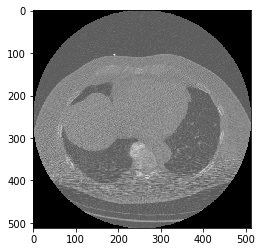

In [19]:
plt.imshow(img2[2],cmap="gray")

In [8]:
from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

In [31]:
def plot_3d(image, threshold=-300):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    
    verts, faces,normals,values = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.70)
    face_color = [0.45, 0.45, 0.75]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()


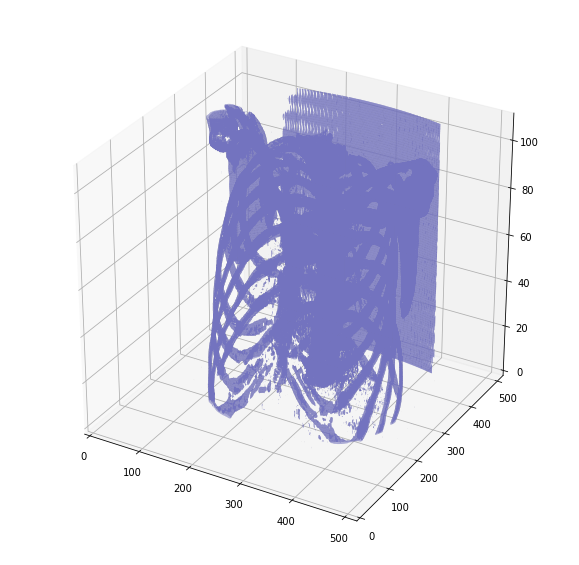

In [32]:
plot_3d(img, 400)

In [31]:
plt.show()

In [33]:
p.shape

(512, 512, 121)

In [36]:
measure.marching_cubes(img,400)

/home/atul/keras_opencv/lib/python3.5/site-packages/skimage/measure/_marching_cubes_lewiner.py:167: skimage_deprecation: `marching_cubes` now uses a better and faster algorithm, and returns four instead of two outputs (see docstring for details). Backwards compatibility with 0.12 and prior is available with `marching_cubes_classic`. This function will be removed in 0.14, consider switching to `marching_cubes_lewiner`.
  warn(skimage_deprecation('`marching_cubes` now uses a better and '


(array([[  0.6634921, 108.       , 131.       ],
        [  1.       , 108.       , 130.26389  ],
        [  1.       , 107.6431   , 131.       ],
        ...,
        [120.       , 458.03638  , 267.       ],
        [120.       , 458.01935  , 269.       ],
        [120.       , 458.09158  , 270.       ]], dtype=float32),
 array([[      2,       1,       0],
        [      4,       3,       0],
        [      0,       3,       2],
        ...,
        [1119211, 1119240, 1119215],
        [1119215, 1119240, 1119241],
        [1119215, 1119241, 1119216]], dtype=int32),
 array([[-0.99825907, -0.03336371, -0.04863785],
        [ 0.04822161,  0.14628491, -0.9880665 ],
        [ 0.02417023, -0.9601205 , -0.2785398 ],
        ...,
        [-0.01157519,  0.99850607, -0.05340118],
        [-0.07407167,  0.99480593, -0.06981809],
        [-0.08736548,  0.9956827 ,  0.03135579]], dtype=float32),
 array([ 531.,  509.,  524., ...,  954., 1022., 1022.], dtype=float32))